In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trawlers_fe_recortado_v2.csv",
    "output_label": "trawlers_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado_v2.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trawlers_fe_recortado_v2.csv', 'output_label': 'trawlers_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

df['S0']=df['S0'].abs()
df['A0']=df['A0'].abs()
df['J0']=df['J0'].abs()
df['C0']=df['C0'].abs()
df['Delta_S']=df['Delta_S'].abs()
df['Delta_C']=df['Delta_C'].abs()

print(df)


       speed    course       lat       lon is_fishing  sun_state   distance  \
0        1.0  0.747222  0.915025  0.075625         NO          1   0.668918   
1        5.5  0.630556  1.025977  0.017197         NO          2  11.973067   
2        8.2  0.367778  0.746172  0.251988         NO          1   2.506806   
3        4.3  0.057778  0.984679 -0.118278         NO          2   2.390281   
4       11.4  0.222222  0.431938 -0.273005         NO          2   9.827701   
...      ...       ...       ...       ...        ...        ...        ...   
14995    5.8  0.547778  1.224910  0.300777         SI          2  28.218693   
14996    3.2  0.749444  1.220256  0.294344         SI          1  15.034382   
14997    8.6  0.177778  1.258683  0.052624         SI          1  64.567728   
14998    1.6  0.638889  0.942097 -0.195648         SI          2   1.345752   
14999    3.3  0.755833  1.016693 -0.051225         SI          2   1.174575   

       timediff        S0            A0  ...      J

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



7500
7500


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.873
Test Accuracy : 0.806
Best Score Through Grid Search : 0.789
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 5, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 5, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

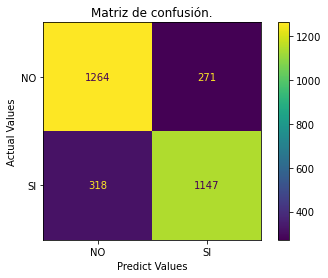

Precision,Recall,Accuracy,F1
0.81,0.78,0.80,0.80


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 0.982
Test Accuracy : 0.811
Best Score Through Grid Search : 0.798
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 200}


Random forest optimizado

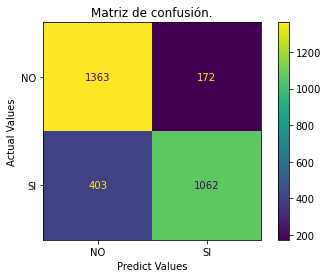

Precision,Recall,Accuracy,F1
0.86,0.72,0.81,0.79


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.664


Test Accuracy : 0.614
Best Score Through Grid Search : 0.609
Best Parameters :  {'C': 100, 'gamma': 1e-05, 'kernel': 'rbf'}


rbf

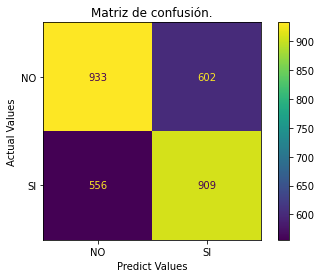

Precision,Recall,Accuracy,F1
0.60,0.62,0.61,0.61


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.548


Test Accuracy : 0.550
Best Score Through Grid Search : 0.534
Best Parameters :  {'C': 100, 'coef0': 0.1, 'gamma': 0.0001, 'kernel': 'sigmoid'}


sigmoid

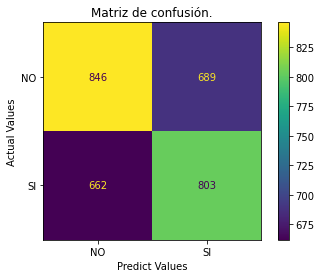

Precision,Recall,Accuracy,F1
0.54,0.55,0.55,0.54


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0


for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-20 04:27:31,610] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=13.836876036569379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.836876036569379
[LightGBM] [Warning] lambda_l1 is set=4.744085146797428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744085146797428
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.08588786175318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.08588786175318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=13.836876036569379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.836876036569379
[LightGBM] [Warning] lambda_l1 is set=4.744085146797428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744085146797428
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.08588786175318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.08588786175318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[I 2022-06-20 04:27:32,235] Trial 0 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07486463366836399, 'num_leaves': 958, 'max_depth': 4, 'min_data_in_leaf': 5200, 'lambda_l1': 4.744085146797428, 'lambda_l2': 43.08588786175318, 'min_gain_to_split': 13.836876036569379, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6931471805599454.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=13.836876036569379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.836876036569379
[LightGBM] [Warning] lambda_l1 is set=4.744085146797428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744085146797428
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.08588786175318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.08588786175318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.0439699959090898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0439699959090898
[LightGBM] [Warning] lambda_l1 is set=2.8595677585333865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8595677585333865
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=58.15352481899871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.15352481899871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-20 04:27:32,786] Trial 1 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2694562306150203, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 8600, 'lambda_l1': 2.8595677585333865, 'lambda_l2': 58.15352481899871, 'min_gain_to_split': 1.0439699959090898, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.6931471805599454.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.0439699959090898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0439699959090898
[LightGBM] [Warning] lambda_l1 is set=2.8595677585333865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8595677585333865
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=58.15352481899871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.15352481899871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.845883385396778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.845883385396778
[LightGBM] [Warning] lambda_l1 is set=2.961899224720913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.961899224720913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.067853401698265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.067853401698265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.845883385396778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.845883385396778
[LightGBM] [Warning] lambda_l1 is set=2.961899224720913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.961899224720913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.067853401698265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.067853401698265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.845883385396778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.845883385396778
[LightGBM] [Warning] lambda_l1 is set=2.961899224720913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.961899224720913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.067853401698265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.067853401698265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.845883385396778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.845883385396778
[LightGBM] [Warning] lambda_l1 is set=2.961899224720913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.961899224720913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.067853401698265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.067853401698265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.845883385396778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.845883385396778
[LightGBM] [Warning] lambda_l1 is set=2.961899224720913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.961899224720913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.067853401698265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.067853401698265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:27:34,544] Trial 2 finished with value: 0.4576938270015306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12846359100701682, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 2.961899224720913, 'lambda_l2': 20.067853401698265, 'min_gain_to_split': 11.845883385396778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=4.176525346860913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.176525346860913
[LightGBM] [Warning] lambda_l1 is set=8.207915174325624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.207915174325624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6803851653644499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6803851653644499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=4.176525346860913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.176525346860913
[LightGBM] [Warning] lambda_l1 is set=8.207915174325624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.207915174325624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6803851653644499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6803851653644499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=4.176525346860913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.176525346860913
[LightGBM] [Warning] lambda_l1 is set=8.207915174325624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.207915174325624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6803851653644499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6803851653644499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=4.176525346860913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.176525346860913
[LightGBM] [Warning] lambda_l1 is set=8.207915174325624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.207915174325624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6803851653644499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6803851653644499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=4.176525346860913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.176525346860913
[LightGBM] [Warning] lambda_l1 is set=8.207915174325624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.207915174325624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6803851653644499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6803851653644499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:27:39,489] Trial 3 finished with value: 0.5057809522663836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1219029695222012, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 8.207915174325624, 'lambda_l2': 0.6803851653644499, 'min_gain_to_split': 4.176525346860913, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.628176192305661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.628176192305661
[LightGBM] [Warning] lambda_l1 is set=3.3664858747310014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664858747310014
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.35956416787548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35956416787548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.628176192305661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.628176192305661
[LightGBM] [Warning] lambda_l1 is set=3.3664858747310014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664858747310014
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.35956416787548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35956416787548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.628176192305661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.628176192305661
[LightGBM] [Warning] lambda_l1 is set=3.3664858747310014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664858747310014
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.35956416787548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35956416787548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.628176192305661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.628176192305661
[LightGBM] [Warning] lambda_l1 is set=3.3664858747310014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664858747310014
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.35956416787548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35956416787548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.628176192305661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.628176192305661
[LightGBM] [Warning] lambda_l1 is set=3.3664858747310014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664858747310014
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.35956416787548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35956416787548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:27:42,374] Trial 4 finished with value: 0.48065550214017155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06578587490818348, 'num_leaves': 208, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 3.3664858747310014, 'lambda_l2': 50.35956416787548, 'min_gain_to_split': 9.628176192305661, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3885859729510868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3885859729510868
[LightGBM] [Warning] lambda_l1 is set=0.547399626161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547399626161158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90.89777996402829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89777996402829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3885859729510868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3885859729510868
[LightGBM] [Warning] lambda_l1 is set=0.547399626161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547399626161158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90.89777996402829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89777996402829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3885859729510868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3885859729510868
[LightGBM] [Warning] lambda_l1 is set=0.547399626161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547399626161158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90.89777996402829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89777996402829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3885859729510868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3885859729510868
[LightGBM] [Warning] lambda_l1 is set=0.547399626161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547399626161158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90.89777996402829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89777996402829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:27:46,094] Trial 5 finished with value: 0.6384836223705063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2718668929253815, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 0.547399626161158, 'lambda_l2': 90.89777996402829, 'min_gain_to_split': 2.3885859729510868, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.3885859729510868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3885859729510868
[LightGBM] [Warning] lambda_l1 is set=0.547399626161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547399626161158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90.89777996402829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89777996402829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=7.052887105741744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.052887105741744
[LightGBM] [Warning] lambda_l1 is set=9.275818558801499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.275818558801499
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.474230234237432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474230234237432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=7.052887105741744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.052887105741744
[LightGBM] [Warning] lambda_l1 is set=9.275818558801499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.275818558801499
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.474230234237432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474230234237432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-20 04:27:46,973] Trial 6 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19721997517959358, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 5500, 'lambda_l1': 9.275818558801499, 'lambda_l2': 5.474230234237432, 'min_gain_to_split': 7.052887105741744, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=7.052887105741744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.052887105741744
[LightGBM] [Warning] lambda_l1 is set=9.275818558801499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.275818558801499
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.474230234237432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474230234237432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=2.8112726718382435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8112726718382435
[LightGBM] [Warning] lambda_l1 is set=3.2819520707945706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2819520707945706
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=25.942135072362895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.942135072362895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=2.8112726718382435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8112726718382435
[LightGBM] [Warning] lambda_l1 is set=3.2819520707945706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2819520707945706
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=25.942135072362895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.942135072362895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-20 04:27:47,545] Trial 7 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09436579068136963, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 9100, 'lambda_l1': 3.2819520707945706, 'lambda_l2': 25.942135072362895, 'min_gain_to_split': 2.8112726718382435, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=2.8112726718382435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8112726718382435
[LightGBM] [Warning] lambda_l1 is set=3.2819520707945706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2819520707945706
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=25.942135072362895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.942135072362895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.1549643474951354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1549643474951354
[LightGBM] [Warning] lambda_l1 is set=2.1894286111138053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894286111138053
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.519452463764758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.519452463764758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.1549643474951354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1549643474951354
[LightGBM] [Warning] lambda_l1 is set=2.1894286111138053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894286111138053
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.519452463764758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.519452463764758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-20 04:27:48,115] Trial 8 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08491011831899756, 'num_leaves': 188, 'max_depth': 4, 'min_data_in_leaf': 7200, 'lambda_l1': 2.1894286111138053, 'lambda_l2': 0.519452463764758, 'min_gain_to_split': 3.1549643474951354, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=12.996468664024396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.996468664024396
[LightGBM] [Warning] lambda_l1 is set=6.197470786475377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197470786475377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.557692609003716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.557692609003716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=12.996468664024396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.996468664024396
[LightGBM] [Warning] lambda_l1 is set=6.197470786475377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197470786475377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.557692609003716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.557692609003716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will

[I 2022-06-20 04:27:48,665] Trial 9 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09582219729782424, 'num_leaves': 88, 'max_depth': 4, 'min_data_in_leaf': 7200, 'lambda_l1': 6.197470786475377, 'lambda_l2': 40.557692609003716, 'min_gain_to_split': 12.996468664024396, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=12.996468664024396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.996468664024396
[LightGBM] [Warning] lambda_l1 is set=6.197470786475377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197470786475377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.557692609003716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.557692609003716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.294351370309062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294351370309062
[LightGBM] [Warning] lambda_l1 is set=0.06098234837424821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06098234837424821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.54411119516983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.54411119516983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.294351370309062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294351370309062
[LightGBM] [Warning] lambda_l1 is set=0.06098234837424821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06098234837424821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.54411119516983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.54411119516983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.294351370309062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294351370309062
[LightGBM] [Warning] lambda_l1 is set=0.06098234837424821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06098234837424821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.54411119516983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.54411119516983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.294351370309062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294351370309062
[LightGBM] [Warning] lambda_l1 is set=0.06098234837424821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06098234837424821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.54411119516983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.54411119516983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:10,305] Trial 10 finished with value: 0.462831590110394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02266808602313014, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.06098234837424821, 'lambda_l2': 80.54411119516983, 'min_gain_to_split': 10.294351370309062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.775488680110326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.775488680110326
[LightGBM] [Warning] lambda_l1 is set=0.5578283967400939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5578283967400939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.44458363719855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.44458363719855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.775488680110326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.775488680110326
[LightGBM] [Warning] lambda_l1 is set=0.5578283967400939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5578283967400939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.44458363719855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.44458363719855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.775488680110326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.775488680110326
[LightGBM] [Warning] lambda_l1 is set=0.5578283967400939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5578283967400939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.44458363719855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.44458363719855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.775488680110326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.775488680110326
[LightGBM] [Warning] lambda_l1 is set=0.5578283967400939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5578283967400939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.44458363719855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.44458363719855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.775488680110326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.775488680110326
[LightGBM] [Warning] lambda_l1 is set=0.5578283967400939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5578283967400939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.44458363719855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.44458363719855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:25,596] Trial 11 finished with value: 0.47053499758783157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02096171085951305, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.5578283967400939, 'lambda_l2': 85.44458363719855, 'min_gain_to_split': 10.775488680110326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2 with value: 0.4576938270015306.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.556710143709267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.556710143709267
[LightGBM] [Warning] lambda_l1 is set=0.18089857444664004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18089857444664004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.70426582489429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.70426582489429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.556710143709267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.556710143709267
[LightGBM] [Warning] lambda_l1 is set=0.18089857444664004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18089857444664004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.70426582489429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.70426582489429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.556710143709267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.556710143709267
[LightGBM] [Warning] lambda_l1 is set=0.18089857444664004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18089857444664004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.70426582489429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.70426582489429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.556710143709267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.556710143709267
[LightGBM] [Warning] lambda_l1 is set=0.18089857444664004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18089857444664004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.70426582489429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.70426582489429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=10.556710143709267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.556710143709267
[LightGBM] [Warning] lambda_l1 is set=0.18089857444664004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18089857444664004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.70426582489429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.70426582489429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:27,481] Trial 12 finished with value: 0.4425980614445987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17128240734230005, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 300, 'lambda_l1': 0.18089857444664004, 'lambda_l2': 71.70426582489429, 'min_gain_to_split': 10.556710143709267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.58176557219646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.58176557219646
[LightGBM] [Warning] lambda_l1 is set=1.7000741752330881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7000741752330881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.71884538762296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71884538762296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.58176557219646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.58176557219646
[LightGBM] [Warning] lambda_l1 is set=1.7000741752330881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7000741752330881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.71884538762296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71884538762296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.58176557219646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.58176557219646
[LightGBM] [Warning] lambda_l1 is set=1.7000741752330881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7000741752330881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.71884538762296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71884538762296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.58176557219646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.58176557219646
[LightGBM] [Warning] lambda_l1 is set=1.7000741752330881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7000741752330881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.71884538762296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71884538762296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.58176557219646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.58176557219646
[LightGBM] [Warning] lambda_l1 is set=1.7000741752330881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7000741752330881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.71884538762296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71884538762296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:29,771] Trial 13 finished with value: 0.48664242893358634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18831704419953776, 'num_leaves': 638, 'max_depth': 3, 'min_data_in_leaf': 2200, 'lambda_l1': 1.7000741752330881, 'lambda_l2': 66.71884538762296, 'min_gain_to_split': 7.58176557219646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.001250177448036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.001250177448036
[LightGBM] [Warning] lambda_l1 is set=5.64888696320509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.64888696320509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.70480887012569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.70480887012569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.001250177448036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.001250177448036
[LightGBM] [Warning] lambda_l1 is set=5.64888696320509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.64888696320509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.70480887012569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.70480887012569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.001250177448036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.001250177448036
[LightGBM] [Warning] lambda_l1 is set=5.64888696320509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.64888696320509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.70480887012569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.70480887012569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.001250177448036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.001250177448036
[LightGBM] [Warning] lambda_l1 is set=5.64888696320509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.64888696320509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.70480887012569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.70480887012569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.001250177448036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.001250177448036
[LightGBM] [Warning] lambda_l1 is set=5.64888696320509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.64888696320509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.70480887012569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.70480887012569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:31,635] Trial 14 finished with value: 0.5022270515509297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16380693282683495, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 2500, 'lambda_l1': 5.64888696320509, 'lambda_l2': 24.70480887012569, 'min_gain_to_split': 12.001250177448036, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.613355070902148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.613355070902148
[LightGBM] [Warning] lambda_l1 is set=4.729748713807705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729748713807705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.55837302267162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.55837302267162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.613355070902148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.613355070902148
[LightGBM] [Warning] lambda_l1 is set=4.729748713807705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729748713807705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.55837302267162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.55837302267162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.613355070902148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.613355070902148
[LightGBM] [Warning] lambda_l1 is set=4.729748713807705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729748713807705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.55837302267162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.55837302267162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.613355070902148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.613355070902148
[LightGBM] [Warning] lambda_l1 is set=4.729748713807705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729748713807705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.55837302267162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.55837302267162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:32,799] Trial 15 finished with value: 0.45158854150565253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23078709145145426, 'num_leaves': 688, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.729748713807705, 'lambda_l2': 72.55837302267162, 'min_gain_to_split': 14.613355070902148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.613355070902148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.613355070902148
[LightGBM] [Warning] lambda_l1 is set=4.729748713807705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729748713807705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.55837302267162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.55837302267162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=14.846700720272919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.846700720272919
[LightGBM] [Warning] lambda_l1 is set=7.560903888856489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.560903888856489
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.29445595301351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.29445595301351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=14.846700720272919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.846700720272919
[LightGBM] [Warning] lambda_l1 is set=7.560903888856489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.560903888856489
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.29445595301351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.29445595301351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=14.846700720272919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.846700720272919
[LightGBM] [Warning] lambda_l1 is set=7.560903888856489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.560903888856489
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.29445595301351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.29445595301351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=14.846700720272919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.846700720272919
[LightGBM] [Warning] lambda_l1 is set=7.560903888856489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.560903888856489
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.29445595301351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.29445595301351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:34,155] Trial 16 finished with value: 0.6278723138670889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24384751393445847, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 3600, 'lambda_l1': 7.560903888856489, 'lambda_l2': 72.29445595301351, 'min_gain_to_split': 14.846700720272919, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=14.846700720272919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.846700720272919
[LightGBM] [Warning] lambda_l1 is set=7.560903888856489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.560903888856489
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.29445595301351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.29445595301351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.159622090231306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.159622090231306
[LightGBM] [Warning] lambda_l1 is set=4.356931937842764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356931937842764
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=96.52963247106746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.52963247106746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.159622090231306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.159622090231306
[LightGBM] [Warning] lambda_l1 is set=4.356931937842764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356931937842764
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=96.52963247106746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.52963247106746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.159622090231306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.159622090231306
[LightGBM] [Warning] lambda_l1 is set=4.356931937842764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356931937842764
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=96.52963247106746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.52963247106746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.159622090231306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.159622090231306
[LightGBM] [Warning] lambda_l1 is set=4.356931937842764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356931937842764
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=96.52963247106746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.52963247106746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.159622090231306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.159622090231306
[LightGBM] [Warning] lambda_l1 is set=4.356931937842764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356931937842764
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=96.52963247106746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.52963247106746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:36,290] Trial 17 finished with value: 0.48797929702879755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2250727991819642, 'num_leaves': 648, 'max_depth': 8, 'min_data_in_leaf': 1900, 'lambda_l1': 4.356931937842764, 'lambda_l2': 96.52963247106746, 'min_gain_to_split': 8.159622090231306, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=5.543874851041238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.543874851041238
[LightGBM] [Warning] lambda_l1 is set=6.703675330991022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.703675330991022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.11098498207964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11098498207964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=5.543874851041238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.543874851041238
[LightGBM] [Warning] lambda_l1 is set=6.703675330991022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.703675330991022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.11098498207964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11098498207964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-20 04:28:37,059] Trial 18 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2981525478919119, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 4300, 'lambda_l1': 6.703675330991022, 'lambda_l2': 70.11098498207964, 'min_gain_to_split': 5.543874851041238, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=5.543874851041238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.543874851041238
[LightGBM] [Warning] lambda_l1 is set=6.703675330991022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.703675330991022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.11098498207964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11098498207964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.140984131944242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.140984131944242
[LightGBM] [Warning] lambda_l1 is set=1.5734849469427443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734849469427443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.11230112675025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.11230112675025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.140984131944242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.140984131944242
[LightGBM] [Warning] lambda_l1 is set=1.5734849469427443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734849469427443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.11230112675025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.11230112675025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.140984131944242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.140984131944242
[LightGBM] [Warning] lambda_l1 is set=1.5734849469427443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734849469427443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.11230112675025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.11230112675025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.140984131944242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.140984131944242
[LightGBM] [Warning] lambda_l1 is set=1.5734849469427443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734849469427443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.11230112675025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.11230112675025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.140984131944242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.140984131944242
[LightGBM] [Warning] lambda_l1 is set=1.5734849469427443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734849469427443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.11230112675025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.11230112675025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:38,728] Trial 19 finished with value: 0.4771355180971265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20252141642503554, 'num_leaves': 828, 'max_depth': 5, 'min_data_in_leaf': 1500, 'lambda_l1': 1.5734849469427443, 'lambda_l2': 59.11230112675025, 'min_gain_to_split': 9.140984131944242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.725676261182974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.725676261182974
[LightGBM] [Warning] lambda_l1 is set=4.0355623944256696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0355623944256696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.7318456227265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.7318456227265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.725676261182974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.725676261182974
[LightGBM] [Warning] lambda_l1 is set=4.0355623944256696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0355623944256696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.7318456227265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.7318456227265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.725676261182974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.725676261182974
[LightGBM] [Warning] lambda_l1 is set=4.0355623944256696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0355623944256696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.7318456227265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.7318456227265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.725676261182974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.725676261182974
[LightGBM] [Warning] lambda_l1 is set=4.0355623944256696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0355623944256696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.7318456227265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.7318456227265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.725676261182974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.725676261182974
[LightGBM] [Warning] lambda_l1 is set=4.0355623944256696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0355623944256696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.7318456227265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.7318456227265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:40,488] Trial 20 finished with value: 0.4582968094480435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.166374821321218, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 4.0355623944256696, 'lambda_l2': 78.7318456227265, 'min_gain_to_split': 14.725676261182974, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.743376693947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.743376693947205
[LightGBM] [Warning] lambda_l1 is set=5.201775852681148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.201775852681148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.169690839634242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.169690839634242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.743376693947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.743376693947205
[LightGBM] [Warning] lambda_l1 is set=5.201775852681148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.201775852681148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.169690839634242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.169690839634242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.743376693947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.743376693947205
[LightGBM] [Warning] lambda_l1 is set=5.201775852681148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.201775852681148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.169690839634242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.169690839634242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.743376693947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.743376693947205
[LightGBM] [Warning] lambda_l1 is set=5.201775852681148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.201775852681148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.169690839634242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.169690839634242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.743376693947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.743376693947205
[LightGBM] [Warning] lambda_l1 is set=5.201775852681148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.201775852681148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.169690839634242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.169690839634242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:42,219] Trial 21 finished with value: 0.4516978649609883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13393945505167892, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 300, 'lambda_l1': 5.201775852681148, 'lambda_l2': 20.169690839634242, 'min_gain_to_split': 11.743376693947205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.635570368967688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.635570368967688
[LightGBM] [Warning] lambda_l1 is set=5.589436849463914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589436849463914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.41926946512764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.41926946512764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.635570368967688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.635570368967688
[LightGBM] [Warning] lambda_l1 is set=5.589436849463914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589436849463914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.41926946512764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.41926946512764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.635570368967688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.635570368967688
[LightGBM] [Warning] lambda_l1 is set=5.589436849463914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589436849463914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.41926946512764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.41926946512764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.635570368967688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.635570368967688
[LightGBM] [Warning] lambda_l1 is set=5.589436849463914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589436849463914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.41926946512764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.41926946512764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.635570368967688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.635570368967688
[LightGBM] [Warning] lambda_l1 is set=5.589436849463914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589436849463914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.41926946512764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.41926946512764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:43,710] Trial 22 finished with value: 0.449519963122456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13246987323870107, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 5.589436849463914, 'lambda_l2': 60.41926946512764, 'min_gain_to_split': 12.635570368967688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=12.938751158886467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.938751158886467
[LightGBM] [Warning] lambda_l1 is set=7.178956013530793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.178956013530793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.27753172455677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.27753172455677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=12.938751158886467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.938751158886467
[LightGBM] [Warning] lambda_l1 is set=7.178956013530793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.178956013530793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.27753172455677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.27753172455677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=12.938751158886467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.938751158886467
[LightGBM] [Warning] lambda_l1 is set=7.178956013530793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.178956013530793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.27753172455677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.27753172455677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=12.938751158886467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.938751158886467
[LightGBM] [Warning] lambda_l1 is set=7.178956013530793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.178956013530793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.27753172455677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.27753172455677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:45,038] Trial 23 finished with value: 0.4841654230884601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22547026709398976, 'num_leaves': 908, 'max_depth': 5, 'min_data_in_leaf': 1600, 'lambda_l1': 7.178956013530793, 'lambda_l2': 61.27753172455677, 'min_gain_to_split': 12.938751158886467, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=12.938751158886467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.938751158886467
[LightGBM] [Warning] lambda_l1 is set=7.178956013530793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.178956013530793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=61.27753172455677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.27753172455677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.146051615047252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.146051615047252
[LightGBM] [Warning] lambda_l1 is set=9.855917283730214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.855917283730214
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.8947230510402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.8947230510402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.146051615047252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.146051615047252
[LightGBM] [Warning] lambda_l1 is set=9.855917283730214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.855917283730214
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.8947230510402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.8947230510402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.146051615047252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.146051615047252
[LightGBM] [Warning] lambda_l1 is set=9.855917283730214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.855917283730214
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.8947230510402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.8947230510402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.146051615047252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.146051615047252
[LightGBM] [Warning] lambda_l1 is set=9.855917283730214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.855917283730214
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.8947230510402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.8947230510402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.146051615047252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.146051615047252
[LightGBM] [Warning] lambda_l1 is set=9.855917283730214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.855917283730214
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.8947230510402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.8947230510402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:47,424] Trial 24 finished with value: 0.5570194673677273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15561037056870525, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 2900, 'lambda_l1': 9.855917283730214, 'lambda_l2': 76.8947230510402, 'min_gain_to_split': 13.146051615047252, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.893833538130863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.893833538130863
[LightGBM] [Warning] lambda_l1 is set=5.922161677751523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.922161677751523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.87498635437356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.87498635437356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.893833538130863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.893833538130863
[LightGBM] [Warning] lambda_l1 is set=5.922161677751523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.922161677751523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.87498635437356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.87498635437356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.893833538130863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.893833538130863
[LightGBM] [Warning] lambda_l1 is set=5.922161677751523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.922161677751523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.87498635437356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.87498635437356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.893833538130863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.893833538130863
[LightGBM] [Warning] lambda_l1 is set=5.922161677751523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.922161677751523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.87498635437356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.87498635437356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.893833538130863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.893833538130863
[LightGBM] [Warning] lambda_l1 is set=5.922161677751523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.922161677751523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.87498635437356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.87498635437356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:48,828] Trial 25 finished with value: 0.4790847322681901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17642427563559596, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 1400, 'lambda_l1': 5.922161677751523, 'lambda_l2': 49.87498635437356, 'min_gain_to_split': 10.893833538130863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=13.9518408988569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.9518408988569
[LightGBM] [Warning] lambda_l1 is set=8.068319892581671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.068319892581671
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.69256090392847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.69256090392847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=13.9518408988569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.9518408988569
[LightGBM] [Warning] lambda_l1 is set=8.068319892581671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.068319892581671
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.69256090392847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.69256090392847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-20 04:28:49,479] Trial 26 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2292672056584616, 'num_leaves': 708, 'max_depth': 9, 'min_data_in_leaf': 6000, 'lambda_l1': 8.068319892581671, 'lambda_l2': 87.69256090392847, 'min_gain_to_split': 13.9518408988569, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=13.9518408988569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.9518408988569
[LightGBM] [Warning] lambda_l1 is set=8.068319892581671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.068319892581671
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.69256090392847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.69256090392847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=8.574597466776638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.574597466776638
[LightGBM] [Warning] lambda_l1 is set=3.9200673724032193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9200673724032193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.44163381187498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.44163381187498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=8.574597466776638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.574597466776638
[LightGBM] [Warning] lambda_l1 is set=3.9200673724032193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9200673724032193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.44163381187498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.44163381187498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=8.574597466776638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.574597466776638
[LightGBM] [Warning] lambda_l1 is set=3.9200673724032193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9200673724032193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.44163381187498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.44163381187498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=8.574597466776638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.574597466776638
[LightGBM] [Warning] lambda_l1 is set=3.9200673724032193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9200673724032193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.44163381187498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.44163381187498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:51,193] Trial 27 finished with value: 0.4878899213889533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14203114070466272, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 2400, 'lambda_l1': 3.9200673724032193, 'lambda_l2': 65.44163381187498, 'min_gain_to_split': 8.574597466776638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.498450103955331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.498450103955331
[LightGBM] [Warning] lambda_l1 is set=5.0964846333180605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0964846333180605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.43957179210514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.43957179210514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.498450103955331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.498450103955331
[LightGBM] [Warning] lambda_l1 is set=5.0964846333180605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0964846333180605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.43957179210514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.43957179210514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.498450103955331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.498450103955331
[LightGBM] [Warning] lambda_l1 is set=5.0964846333180605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0964846333180605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.43957179210514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.43957179210514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.498450103955331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.498450103955331
[LightGBM] [Warning] lambda_l1 is set=5.0964846333180605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0964846333180605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.43957179210514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.43957179210514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.498450103955331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.498450103955331
[LightGBM] [Warning] lambda_l1 is set=5.0964846333180605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0964846333180605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.43957179210514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.43957179210514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:28:55,647] Trial 28 finished with value: 0.44420689700394966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11814755175523309, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.0964846333180605, 'lambda_l2': 99.43957179210514, 'min_gain_to_split': 6.498450103955331, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.540781839044666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.540781839044666
[LightGBM] [Warning] lambda_l1 is set=5.264282818557366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.264282818557366
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.65733910915196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.65733910915196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.540781839044666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.540781839044666
[LightGBM] [Warning] lambda_l1 is set=5.264282818557366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.264282818557366
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.65733910915196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.65733910915196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.540781839044666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.540781839044666
[LightGBM] [Warning] lambda_l1 is set=5.264282818557366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.264282818557366
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.65733910915196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.65733910915196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.540781839044666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.540781839044666
[LightGBM] [Warning] lambda_l1 is set=5.264282818557366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.264282818557366
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.65733910915196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.65733910915196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.540781839044666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.540781839044666
[LightGBM] [Warning] lambda_l1 is set=5.264282818557366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.264282818557366
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.65733910915196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.65733910915196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:01,052] Trial 29 finished with value: 0.4720724128454605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11119759797748859, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 1100, 'lambda_l1': 5.264282818557366, 'lambda_l2': 99.65733910915196, 'min_gain_to_split': 5.540781839044666, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=6.265375392489231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.265375392489231
[LightGBM] [Warning] lambda_l1 is set=4.7766372749050205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7766372749050205
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.33967803333255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.33967803333255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=6.265375392489231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.265375392489231
[LightGBM] [Warning] lambda_l1 is set=4.7766372749050205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7766372749050205
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.33967803333255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.33967803333255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:29:01,857] Trial 30 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04543037429302907, 'num_leaves': 298, 'max_depth': 9, 'min_data_in_leaf': 3400, 'lambda_l1': 4.7766372749050205, 'lambda_l2': 41.33967803333255, 'min_gain_to_split': 6.265375392489231, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=6.265375392489231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.265375392489231
[LightGBM] [Warning] lambda_l1 is set=4.7766372749050205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7766372749050205
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.33967803333255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.33967803333255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=13.870653215583763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.870653215583763
[LightGBM] [Warning] lambda_l1 is set=4.65456386320353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.65456386320353
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.22985276980153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22985276980153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.870653215583763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.870653215583763
[LightGBM] [Warning] lambda_l1 is set=4.65456386320353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.65456386320353
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.22985276980153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22985276980153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.870653215583763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.870653215583763
[LightGBM] [Warning] lambda_l1 is set=4.65456386320353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.65456386320353
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.22985276980153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22985276980153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.870653215583763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.870653215583763
[LightGBM] [Warning] lambda_l1 is set=4.65456386320353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.65456386320353
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.22985276980153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22985276980153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.870653215583763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.870653215583763
[LightGBM] [Warning] lambda_l1 is set=4.65456386320353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.65456386320353
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.22985276980153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22985276980153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:04,570] Trial 31 finished with value: 0.46211856868698414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1143710495961169, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 4.65456386320353, 'lambda_l2': 52.22985276980153, 'min_gain_to_split': 13.870653215583763, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.281112708244823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.281112708244823
[LightGBM] [Warning] lambda_l1 is set=6.523840570474174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523840570474174
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=72.25016436892354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.25016436892354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.281112708244823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.281112708244823
[LightGBM] [Warning] lambda_l1 is set=6.523840570474174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523840570474174
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=72.25016436892354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.25016436892354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.281112708244823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.281112708244823
[LightGBM] [Warning] lambda_l1 is set=6.523840570474174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523840570474174
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=72.25016436892354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.25016436892354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.281112708244823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.281112708244823
[LightGBM] [Warning] lambda_l1 is set=6.523840570474174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523840570474174
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=72.25016436892354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.25016436892354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.281112708244823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.281112708244823
[LightGBM] [Warning] lambda_l1 is set=6.523840570474174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.523840570474174
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=72.25016436892354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.25016436892354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:06,694] Trial 32 finished with value: 0.48615303782443087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14523991619082574, 'num_leaves': 458, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.523840570474174, 'lambda_l2': 72.25016436892354, 'min_gain_to_split': 12.281112708244823, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.207470419648693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.207470419648693
[LightGBM] [Warning] lambda_l1 is set=2.3278498517556363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3278498517556363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=91.73746158333407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.73746158333407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.207470419648693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.207470419648693
[LightGBM] [Warning] lambda_l1 is set=2.3278498517556363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3278498517556363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=91.73746158333407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.73746158333407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.207470419648693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.207470419648693
[LightGBM] [Warning] lambda_l1 is set=2.3278498517556363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3278498517556363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=91.73746158333407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.73746158333407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.207470419648693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.207470419648693
[LightGBM] [Warning] lambda_l1 is set=2.3278498517556363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3278498517556363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=91.73746158333407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.73746158333407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.207470419648693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.207470419648693
[LightGBM] [Warning] lambda_l1 is set=2.3278498517556363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3278498517556363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=91.73746158333407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.73746158333407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:10,428] Trial 33 finished with value: 0.47620032921342004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06419624713284706, 'num_leaves': 728, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.3278498517556363, 'lambda_l2': 91.73746158333407, 'min_gain_to_split': 11.207470419648693, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2110532126219402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2110532126219402
[LightGBM] [Warning] lambda_l1 is set=5.538498071759177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.538498071759177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.005436608292804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.005436608292804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2110532126219402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2110532126219402
[LightGBM] [Warning] lambda_l1 is set=5.538498071759177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.538498071759177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.005436608292804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.005436608292804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2110532126219402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2110532126219402
[LightGBM] [Warning] lambda_l1 is set=5.538498071759177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.538498071759177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.005436608292804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.005436608292804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2110532126219402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2110532126219402
[LightGBM] [Warning] lambda_l1 is set=5.538498071759177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.538498071759177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.005436608292804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.005436608292804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2110532126219402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2110532126219402
[LightGBM] [Warning] lambda_l1 is set=5.538498071759177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.538498071759177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.005436608292804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.005436608292804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:13,961] Trial 34 finished with value: 0.4523727570678463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.261845848013359, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 1800, 'lambda_l1': 5.538498071759177, 'lambda_l2': 34.005436608292804, 'min_gain_to_split': 0.2110532126219402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.769351710080787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.769351710080787
[LightGBM] [Warning] lambda_l1 is set=3.5433665454127174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5433665454127174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.18192113657282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.18192113657282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.769351710080787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.769351710080787
[LightGBM] [Warning] lambda_l1 is set=3.5433665454127174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5433665454127174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.18192113657282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.18192113657282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.769351710080787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.769351710080787
[LightGBM] [Warning] lambda_l1 is set=3.5433665454127174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5433665454127174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.18192113657282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.18192113657282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.769351710080787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.769351710080787
[LightGBM] [Warning] lambda_l1 is set=3.5433665454127174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5433665454127174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.18192113657282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.18192113657282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.769351710080787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.769351710080787
[LightGBM] [Warning] lambda_l1 is set=3.5433665454127174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5433665454127174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.18192113657282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.18192113657282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:17,118] Trial 35 finished with value: 0.47263348378551784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18105351261556685, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 3.5433665454127174, 'lambda_l2': 55.18192113657282, 'min_gain_to_split': 9.769351710080787, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=4.4364522580745795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4364522580745795
[LightGBM] [Warning] lambda_l1 is set=6.962705838296511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.962705838296511
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.653782846998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.653782846998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=4.4364522580745795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4364522580745795
[LightGBM] [Warning] lambda_l1 is set=6.962705838296511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.962705838296511
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.653782846998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.653782846998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-20 04:29:17,788] Trial 36 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20844119891841284, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 10000, 'lambda_l1': 6.962705838296511, 'lambda_l2': 83.653782846998, 'min_gain_to_split': 4.4364522580745795, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=4.4364522580745795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4364522580745795
[LightGBM] [Warning] lambda_l1 is set=6.962705838296511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.962705838296511
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.653782846998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.653782846998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.152700072164988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.152700072164988
[LightGBM] [Warning] lambda_l1 is set=8.703095379128843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.703095379128843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.91278798048359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.91278798048359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.152700072164988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.152700072164988
[LightGBM] [Warning] lambda_l1 is set=8.703095379128843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.703095379128843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.91278798048359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.91278798048359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.152700072164988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.152700072164988
[LightGBM] [Warning] lambda_l1 is set=8.703095379128843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.703095379128843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.91278798048359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.91278798048359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.152700072164988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.152700072164988
[LightGBM] [Warning] lambda_l1 is set=8.703095379128843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.703095379128843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.91278798048359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.91278798048359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:19,593] Trial 37 finished with value: 0.4773634942348445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11211760284162184, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 8.703095379128843, 'lambda_l2': 64.91278798048359, 'min_gain_to_split': 14.152700072164988, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=12.675177263793497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.675177263793497
[LightGBM] [Warning] lambda_l1 is set=2.764801913629757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764801913629757
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.51751642390877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.51751642390877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=12.675177263793497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.675177263793497
[LightGBM] [Warning] lambda_l1 is set=2.764801913629757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764801913629757
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.51751642390877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.51751642390877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=12.675177263793497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.675177263793497
[LightGBM] [Warning] lambda_l1 is set=2.764801913629757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764801913629757
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.51751642390877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.51751642390877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=12.675177263793497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.675177263793497
[LightGBM] [Warning] lambda_l1 is set=2.764801913629757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764801913629757
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.51751642390877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.51751642390877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=12.675177263793497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.675177263793497
[LightGBM] [Warning] lambda_l1 is set=2.764801913629757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764801913629757
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.51751642390877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.51751642390877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:22,690] Trial 38 finished with value: 0.5200870848928854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12854840141903454, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 1900, 'lambda_l1': 2.764801913629757, 'lambda_l2': 46.51751642390877, 'min_gain_to_split': 12.675177263793497, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=9.302127857602171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.302127857602171
[LightGBM] [Warning] lambda_l1 is set=4.28332210848238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.28332210848238
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=77.29824101333766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29824101333766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=9.302127857602171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.302127857602171
[LightGBM] [Warning] lambda_l1 is set=4.28332210848238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.28332210848238
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=77.29824101333766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29824101333766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=9.302127857602171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.302127857602171
[LightGBM] [Warning] lambda_l1 is set=4.28332210848238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.28332210848238
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=77.29824101333766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29824101333766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be 

[I 2022-06-20 04:29:23,627] Trial 39 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1503587807980525, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 4500, 'lambda_l1': 4.28332210848238, 'lambda_l2': 77.29824101333766, 'min_gain_to_split': 9.302127857602171, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=6.876258592006749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876258592006749
[LightGBM] [Warning] lambda_l1 is set=5.941103745781961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.941103745781961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.28377291904464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.28377291904464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=6.876258592006749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876258592006749
[LightGBM] [Warning] lambda_l1 is set=5.941103745781961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.941103745781961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.28377291904464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.28377291904464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=6.876258592006749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876258592006749
[LightGBM] [Warning] lambda_l1 is set=5.941103745781961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.941103745781961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.28377291904464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.28377291904464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=6.876258592006749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876258592006749
[LightGBM] [Warning] lambda_l1 is set=5.941103745781961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.941103745781961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.28377291904464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.28377291904464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=6.876258592006749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876258592006749
[LightGBM] [Warning] lambda_l1 is set=5.941103745781961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.941103745781961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.28377291904464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.28377291904464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:26,289] Trial 40 finished with value: 0.4957439578123869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09769205065425612, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 2700, 'lambda_l1': 5.941103745781961, 'lambda_l2': 90.28377291904464, 'min_gain_to_split': 6.876258592006749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.883893465415458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.883893465415458
[LightGBM] [Warning] lambda_l1 is set=5.00398319175985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00398319175985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.11307530846891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.11307530846891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.883893465415458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.883893465415458
[LightGBM] [Warning] lambda_l1 is set=5.00398319175985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00398319175985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.11307530846891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.11307530846891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.883893465415458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.883893465415458
[LightGBM] [Warning] lambda_l1 is set=5.00398319175985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00398319175985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.11307530846891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.11307530846891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.883893465415458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.883893465415458
[LightGBM] [Warning] lambda_l1 is set=5.00398319175985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00398319175985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.11307530846891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.11307530846891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.883893465415458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.883893465415458
[LightGBM] [Warning] lambda_l1 is set=5.00398319175985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00398319175985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.11307530846891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.11307530846891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:28,035] Trial 41 finished with value: 0.4568634892574804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13775967529741812, 'num_leaves': 828, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.00398319175985, 'lambda_l2': 58.11307530846891, 'min_gain_to_split': 11.883893465415458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=11.600228377449142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.600228377449142
[LightGBM] [Warning] lambda_l1 is set=5.127654974790644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127654974790644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.433618944502957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.433618944502957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=11.600228377449142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.600228377449142
[LightGBM] [Warning] lambda_l1 is set=5.127654974790644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127654974790644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.433618944502957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.433618944502957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=11.600228377449142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.600228377449142
[LightGBM] [Warning] lambda_l1 is set=5.127654974790644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127654974790644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.433618944502957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.433618944502957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=11.600228377449142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.600228377449142
[LightGBM] [Warning] lambda_l1 is set=5.127654974790644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127654974790644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.433618944502957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.433618944502957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=11.600228377449142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.600228377449142
[LightGBM] [Warning] lambda_l1 is set=5.127654974790644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127654974790644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.433618944502957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.433618944502957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:29,486] Trial 42 finished with value: 0.4797979017638263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12905666408164157, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 1300, 'lambda_l1': 5.127654974790644, 'lambda_l2': 11.433618944502957, 'min_gain_to_split': 11.600228377449142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.287065586102587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.287065586102587
[LightGBM] [Warning] lambda_l1 is set=6.372627035454611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372627035454611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.15277263745682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15277263745682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.287065586102587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.287065586102587
[LightGBM] [Warning] lambda_l1 is set=6.372627035454611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372627035454611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.15277263745682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15277263745682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.287065586102587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.287065586102587
[LightGBM] [Warning] lambda_l1 is set=6.372627035454611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372627035454611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.15277263745682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15277263745682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.287065586102587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.287065586102587
[LightGBM] [Warning] lambda_l1 is set=6.372627035454611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372627035454611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.15277263745682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15277263745682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.287065586102587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.287065586102587
[LightGBM] [Warning] lambda_l1 is set=6.372627035454611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.372627035454611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.15277263745682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15277263745682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:31,639] Trial 43 finished with value: 0.47236382006115096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07070178595061899, 'num_leaves': 788, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 6.372627035454611, 'lambda_l2': 35.15277263745682, 'min_gain_to_split': 10.287065586102587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.813489123788592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.813489123788592
[LightGBM] [Warning] lambda_l1 is set=5.4624202533152495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624202533152495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.23709829287096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.23709829287096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.813489123788592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.813489123788592
[LightGBM] [Warning] lambda_l1 is set=5.4624202533152495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624202533152495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.23709829287096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.23709829287096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.813489123788592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.813489123788592
[LightGBM] [Warning] lambda_l1 is set=5.4624202533152495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624202533152495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.23709829287096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.23709829287096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.813489123788592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.813489123788592
[LightGBM] [Warning] lambda_l1 is set=5.4624202533152495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624202533152495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.23709829287096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.23709829287096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.813489123788592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.813489123788592
[LightGBM] [Warning] lambda_l1 is set=5.4624202533152495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624202533152495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.23709829287096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.23709829287096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:33,669] Trial 44 finished with value: 0.46419552027429634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1630693807767799, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 5.4624202533152495, 'lambda_l2': 14.23709829287096, 'min_gain_to_split': 13.813489123788592, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.449032415245412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.449032415245412
[LightGBM] [Warning] lambda_l1 is set=1.1894279228565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894279228565128
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.541566712498735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.541566712498735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.449032415245412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.449032415245412
[LightGBM] [Warning] lambda_l1 is set=1.1894279228565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894279228565128
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.541566712498735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.541566712498735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.449032415245412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.449032415245412
[LightGBM] [Warning] lambda_l1 is set=1.1894279228565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894279228565128
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.541566712498735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.541566712498735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.449032415245412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.449032415245412
[LightGBM] [Warning] lambda_l1 is set=1.1894279228565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894279228565128
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.541566712498735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.541566712498735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.449032415245412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.449032415245412
[LightGBM] [Warning] lambda_l1 is set=1.1894279228565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894279228565128
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.541566712498735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.541566712498735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:36,096] Trial 45 finished with value: 0.46809731914280395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10088123426966, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.1894279228565128, 'lambda_l2': 35.541566712498735, 'min_gain_to_split': 12.449032415245412, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=13.372611922717706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.372611922717706
[LightGBM] [Warning] lambda_l1 is set=3.6712053458356753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6712053458356753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=73.9239481748994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9239481748994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=13.372611922717706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.372611922717706
[LightGBM] [Warning] lambda_l1 is set=3.6712053458356753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6712053458356753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=73.9239481748994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9239481748994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:29:36,776] Trial 46 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07784485173877972, 'num_leaves': 598, 'max_depth': 3, 'min_data_in_leaf': 6900, 'lambda_l1': 3.6712053458356753, 'lambda_l2': 73.9239481748994, 'min_gain_to_split': 13.372611922717706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=13.372611922717706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.372611922717706
[LightGBM] [Warning] lambda_l1 is set=3.6712053458356753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6712053458356753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=73.9239481748994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9239481748994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.151947311747277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.151947311747277
[LightGBM] [Warning] lambda_l1 is set=3.048876819092728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.048876819092728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.02976986336964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.02976986336964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.151947311747277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.151947311747277
[LightGBM] [Warning] lambda_l1 is set=3.048876819092728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.048876819092728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.02976986336964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.02976986336964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.151947311747277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.151947311747277
[LightGBM] [Warning] lambda_l1 is set=3.048876819092728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.048876819092728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.02976986336964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.02976986336964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.151947311747277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.151947311747277
[LightGBM] [Warning] lambda_l1 is set=3.048876819092728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.048876819092728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.02976986336964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.02976986336964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:38,276] Trial 47 finished with value: 0.48452336508272875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1931949258413588, 'num_leaves': 168, 'max_depth': 6, 'min_data_in_leaf': 2200, 'lambda_l1': 3.048876819092728, 'lambda_l2': 69.02976986336964, 'min_gain_to_split': 10.151947311747277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.359795492349038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.359795492349038
[LightGBM] [Warning] lambda_l1 is set=7.56146192204417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.56146192204417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.35140920460962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.35140920460962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.359795492349038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.359795492349038
[LightGBM] [Warning] lambda_l1 is set=7.56146192204417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.56146192204417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.35140920460962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.35140920460962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.359795492349038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.359795492349038
[LightGBM] [Warning] lambda_l1 is set=7.56146192204417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.56146192204417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.35140920460962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.35140920460962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.359795492349038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.359795492349038
[LightGBM] [Warning] lambda_l1 is set=7.56146192204417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.56146192204417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.35140920460962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.35140920460962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.359795492349038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.359795492349038
[LightGBM] [Warning] lambda_l1 is set=7.56146192204417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.56146192204417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.35140920460962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.35140920460962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:39,623] Trial 48 finished with value: 0.4518998850926306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28768063385094367, 'num_leaves': 468, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.56146192204417, 'lambda_l2': 62.35140920460962, 'min_gain_to_split': 11.359795492349038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.729422284687975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.729422284687975
[LightGBM] [Warning] lambda_l1 is set=4.408143309800302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408143309800302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.460689189833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.460689189833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.729422284687975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.729422284687975
[LightGBM] [Warning] lambda_l1 is set=4.408143309800302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408143309800302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.460689189833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.460689189833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.729422284687975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.729422284687975
[LightGBM] [Warning] lambda_l1 is set=4.408143309800302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408143309800302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.460689189833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.460689189833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.729422284687975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.729422284687975
[LightGBM] [Warning] lambda_l1 is set=4.408143309800302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408143309800302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.460689189833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.460689189833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.729422284687975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.729422284687975
[LightGBM] [Warning] lambda_l1 is set=4.408143309800302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408143309800302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.460689189833538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.460689189833538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:41,953] Trial 49 finished with value: 0.47405400947685505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2570171945870557, 'num_leaves': 348, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 4.408143309800302, 'lambda_l2': 26.460689189833538, 'min_gain_to_split': 7.729422284687975, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=14.835796126785837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.835796126785837
[LightGBM] [Warning] lambda_l1 is set=5.9498464804492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9498464804492635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=82.44407693587249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.44407693587249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=14.835796126785837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.835796126785837
[LightGBM] [Warning] lambda_l1 is set=5.9498464804492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9498464804492635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=82.44407693587249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.44407693587249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=14.835796126785837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.835796126785837
[LightGBM] [Warning] lambda_l1 is set=5.9498464804492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9498464804492635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=82.44407693587249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.44407693587249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=14.835796126785837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.835796126785837
[LightGBM] [Warning] lambda_l1 is set=5.9498464804492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9498464804492635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=82.44407693587249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.44407693587249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=14.835796126785837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.835796126785837
[LightGBM] [Warning] lambda_l1 is set=5.9498464804492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9498464804492635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=82.44407693587249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.44407693587249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:44,749] Trial 50 finished with value: 0.6146156982352763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12196857599729152, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 3400, 'lambda_l1': 5.9498464804492635, 'lambda_l2': 82.44407693587249, 'min_gain_to_split': 14.835796126785837, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.384224168191444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.384224168191444
[LightGBM] [Warning] lambda_l1 is set=7.8992665480309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8992665480309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.70778730174619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.70778730174619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.384224168191444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.384224168191444
[LightGBM] [Warning] lambda_l1 is set=7.8992665480309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8992665480309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.70778730174619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.70778730174619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.384224168191444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.384224168191444
[LightGBM] [Warning] lambda_l1 is set=7.8992665480309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8992665480309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.70778730174619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.70778730174619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.384224168191444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.384224168191444
[LightGBM] [Warning] lambda_l1 is set=7.8992665480309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8992665480309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.70778730174619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.70778730174619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:46,081] Trial 51 finished with value: 0.46034111460321103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2973008062170338, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.8992665480309, 'lambda_l2': 61.70778730174619, 'min_gain_to_split': 11.384224168191444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.384224168191444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.384224168191444
[LightGBM] [Warning] lambda_l1 is set=7.8992665480309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8992665480309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.70778730174619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.70778730174619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.654167674261597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.654167674261597
[LightGBM] [Warning] lambda_l1 is set=7.2194333603448335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2194333603448335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.29159202745935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.29159202745935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.654167674261597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.654167674261597
[LightGBM] [Warning] lambda_l1 is set=7.2194333603448335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2194333603448335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.29159202745935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.29159202745935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.654167674261597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.654167674261597
[LightGBM] [Warning] lambda_l1 is set=7.2194333603448335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2194333603448335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.29159202745935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.29159202745935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.654167674261597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.654167674261597
[LightGBM] [Warning] lambda_l1 is set=7.2194333603448335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2194333603448335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.29159202745935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.29159202745935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.654167674261597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.654167674261597
[LightGBM] [Warning] lambda_l1 is set=7.2194333603448335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2194333603448335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.29159202745935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.29159202745935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:47,786] Trial 52 finished with value: 0.4634922658399769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21263014908193534, 'num_leaves': 428, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.2194333603448335, 'lambda_l2': 54.29159202745935, 'min_gain_to_split': 8.654167674261597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.08009601224743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.08009601224743
[LightGBM] [Warning] lambda_l1 is set=8.488699066787712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.488699066787712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.56826610295569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.56826610295569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.08009601224743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.08009601224743
[LightGBM] [Warning] lambda_l1 is set=8.488699066787712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.488699066787712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.56826610295569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.56826610295569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.08009601224743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.08009601224743
[LightGBM] [Warning] lambda_l1 is set=8.488699066787712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.488699066787712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.56826610295569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.56826610295569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.08009601224743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.08009601224743
[LightGBM] [Warning] lambda_l1 is set=8.488699066787712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.488699066787712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.56826610295569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.56826610295569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=12.08009601224743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.08009601224743
[LightGBM] [Warning] lambda_l1 is set=8.488699066787712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.488699066787712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.56826610295569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.56826610295569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:49,194] Trial 53 finished with value: 0.4541341179557124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24201848509109458, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 300, 'lambda_l1': 8.488699066787712, 'lambda_l2': 63.56826610295569, 'min_gain_to_split': 12.08009601224743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.716972752151273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.716972752151273
[LightGBM] [Warning] lambda_l1 is set=1.0088693629663914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088693629663914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.56711124493943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.56711124493943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.716972752151273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.716972752151273
[LightGBM] [Warning] lambda_l1 is set=1.0088693629663914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088693629663914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.56711124493943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.56711124493943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.716972752151273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.716972752151273
[LightGBM] [Warning] lambda_l1 is set=1.0088693629663914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088693629663914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.56711124493943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.56711124493943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.716972752151273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.716972752151273
[LightGBM] [Warning] lambda_l1 is set=1.0088693629663914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088693629663914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.56711124493943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.56711124493943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.716972752151273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.716972752151273
[LightGBM] [Warning] lambda_l1 is set=1.0088693629663914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088693629663914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.56711124493943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.56711124493943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:50,996] Trial 54 finished with value: 0.4811138039268755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17531650052698977, 'num_leaves': 308, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 1.0088693629663914, 'lambda_l2': 57.56711124493943, 'min_gain_to_split': 10.716972752151273, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.480828255995444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.480828255995444
[LightGBM] [Warning] lambda_l1 is set=9.665723069507358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665723069507358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.983034801484976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.983034801484976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.480828255995444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.480828255995444
[LightGBM] [Warning] lambda_l1 is set=9.665723069507358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665723069507358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.983034801484976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.983034801484976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.480828255995444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.480828255995444
[LightGBM] [Warning] lambda_l1 is set=9.665723069507358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665723069507358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.983034801484976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.983034801484976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.480828255995444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.480828255995444
[LightGBM] [Warning] lambda_l1 is set=9.665723069507358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665723069507358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.983034801484976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.983034801484976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.480828255995444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.480828255995444
[LightGBM] [Warning] lambda_l1 is set=9.665723069507358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665723069507358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.983034801484976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.983034801484976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:52,443] Trial 55 finished with value: 0.46785402450607805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28981143028241846, 'num_leaves': 388, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.665723069507358, 'lambda_l2': 45.983034801484976, 'min_gain_to_split': 13.480828255995444, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.357455362055278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.357455362055278
[LightGBM] [Warning] lambda_l1 is set=7.594607771518077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.594607771518077
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.74437258042818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.74437258042818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.357455362055278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.357455362055278
[LightGBM] [Warning] lambda_l1 is set=7.594607771518077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.594607771518077
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.74437258042818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.74437258042818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.357455362055278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.357455362055278
[LightGBM] [Warning] lambda_l1 is set=7.594607771518077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.594607771518077
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.74437258042818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.74437258042818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.357455362055278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.357455362055278
[LightGBM] [Warning] lambda_l1 is set=7.594607771518077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.594607771518077
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.74437258042818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.74437258042818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.357455362055278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.357455362055278
[LightGBM] [Warning] lambda_l1 is set=7.594607771518077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.594607771518077
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.74437258042818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.74437258042818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:54,143] Trial 56 finished with value: 0.48766385493470776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2796910105520168, 'num_leaves': 478, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.594607771518077, 'lambda_l2': 68.74437258042818, 'min_gain_to_split': 14.357455362055278, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.0865128743950745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0865128743950745
[LightGBM] [Warning] lambda_l1 is set=9.247373360611334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.247373360611334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.61290858719194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.61290858719194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.0865128743950745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0865128743950745
[LightGBM] [Warning] lambda_l1 is set=9.247373360611334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.247373360611334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.61290858719194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.61290858719194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.0865128743950745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0865128743950745
[LightGBM] [Warning] lambda_l1 is set=9.247373360611334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.247373360611334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.61290858719194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.61290858719194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.0865128743950745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0865128743950745
[LightGBM] [Warning] lambda_l1 is set=9.247373360611334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.247373360611334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.61290858719194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.61290858719194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.0865128743950745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0865128743950745
[LightGBM] [Warning] lambda_l1 is set=9.247373360611334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.247373360611334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.61290858719194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.61290858719194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:29:58,605] Trial 57 finished with value: 0.4682090183820007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08476026800182018, 'num_leaves': 1008, 'max_depth': 5, 'min_data_in_leaf': 1300, 'lambda_l1': 9.247373360611334, 'lambda_l2': 75.61290858719194, 'min_gain_to_split': 4.0865128743950745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=6.745365515395313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.745365515395313
[LightGBM] [Warning] lambda_l1 is set=4.801918553076401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801918553076401
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=95.50542981648661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.50542981648661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=6.745365515395313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.745365515395313
[LightGBM] [Warning] lambda_l1 is set=4.801918553076401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801918553076401
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=95.50542981648661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.50542981648661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-20 04:29:59,428] Trial 58 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24240178337403162, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 1900, 'lambda_l1': 4.801918553076401, 'lambda_l2': 95.50542981648661, 'min_gain_to_split': 6.745365515395313, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=6.745365515395313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.745365515395313
[LightGBM] [Warning] lambda_l1 is set=4.801918553076401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.801918553076401
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=95.50542981648661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.50542981648661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.791305484082272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.791305484082272
[LightGBM] [Warning] lambda_l1 is set=2.351422269378998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351422269378998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.387658932594656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.387658932594656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.791305484082272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.791305484082272
[LightGBM] [Warning] lambda_l1 is set=2.351422269378998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351422269378998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.387658932594656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.387658932594656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.791305484082272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.791305484082272
[LightGBM] [Warning] lambda_l1 is set=2.351422269378998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351422269378998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.387658932594656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.387658932594656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.791305484082272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.791305484082272
[LightGBM] [Warning] lambda_l1 is set=2.351422269378998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351422269378998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.387658932594656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.387658932594656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.791305484082272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.791305484082272
[LightGBM] [Warning] lambda_l1 is set=2.351422269378998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351422269378998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.387658932594656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.387658932594656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:01,523] Trial 59 finished with value: 0.45822195118726244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27346274722278496, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.351422269378998, 'lambda_l2': 6.387658932594656, 'min_gain_to_split': 10.791305484082272, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=12.808703870758789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.808703870758789
[LightGBM] [Warning] lambda_l1 is set=6.157980475896192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.157980475896192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.29143526079124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.29143526079124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=12.808703870758789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.808703870758789
[LightGBM] [Warning] lambda_l1 is set=6.157980475896192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.157980475896192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.29143526079124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.29143526079124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:30:02,229] Trial 60 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15960385389850276, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 8400, 'lambda_l1': 6.157980475896192, 'lambda_l2': 50.29143526079124, 'min_gain_to_split': 12.808703870758789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=12.808703870758789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.808703870758789
[LightGBM] [Warning] lambda_l1 is set=6.157980475896192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.157980475896192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.29143526079124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.29143526079124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.3461993412405338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3461993412405338
[LightGBM] [Warning] lambda_l1 is set=5.727747458482343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.727747458482343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.86080574565188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.86080574565188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.3461993412405338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3461993412405338
[LightGBM] [Warning] lambda_l1 is set=5.727747458482343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.727747458482343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.86080574565188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.86080574565188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.3461993412405338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3461993412405338
[LightGBM] [Warning] lambda_l1 is set=5.727747458482343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.727747458482343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.86080574565188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.86080574565188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.3461993412405338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3461993412405338
[LightGBM] [Warning] lambda_l1 is set=5.727747458482343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.727747458482343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.86080574565188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.86080574565188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:06,042] Trial 61 finished with value: 0.4519397848861023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26684689084460717, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 1700, 'lambda_l1': 5.727747458482343, 'lambda_l2': 21.86080574565188, 'min_gain_to_split': 1.3461993412405338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.108362506706559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.108362506706559
[LightGBM] [Warning] lambda_l1 is set=5.705571733294199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705571733294199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806012424985276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806012424985276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.108362506706559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.108362506706559
[LightGBM] [Warning] lambda_l1 is set=5.705571733294199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705571733294199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806012424985276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806012424985276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.108362506706559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.108362506706559
[LightGBM] [Warning] lambda_l1 is set=5.705571733294199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705571733294199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806012424985276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806012424985276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.108362506706559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.108362506706559
[LightGBM] [Warning] lambda_l1 is set=5.705571733294199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705571733294199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806012424985276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806012424985276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.108362506706559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.108362506706559
[LightGBM] [Warning] lambda_l1 is set=5.705571733294199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705571733294199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806012424985276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806012424985276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:09,098] Trial 62 finished with value: 0.4430935224769402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2558043744846942, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 5.705571733294199, 'lambda_l2': 19.806012424985276, 'min_gain_to_split': 0.108362506706559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.4425980614445987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0925328962721057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0925328962721057
[LightGBM] [Warning] lambda_l1 is set=6.833763525739728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833763525739728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.148239849647148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.148239849647148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0925328962721057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0925328962721057
[LightGBM] [Warning] lambda_l1 is set=6.833763525739728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833763525739728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.148239849647148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.148239849647148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0925328962721057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0925328962721057
[LightGBM] [Warning] lambda_l1 is set=6.833763525739728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833763525739728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.148239849647148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.148239849647148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0925328962721057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0925328962721057
[LightGBM] [Warning] lambda_l1 is set=6.833763525739728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833763525739728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.148239849647148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.148239849647148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0925328962721057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0925328962721057
[LightGBM] [Warning] lambda_l1 is set=6.833763525739728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.833763525739728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.148239849647148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.148239849647148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:12,271] Trial 63 finished with value: 0.40823693590954735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13353928733844303, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.833763525739728, 'lambda_l2': 29.148239849647148, 'min_gain_to_split': 2.0925328962721057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9343133631984577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9343133631984577
[LightGBM] [Warning] lambda_l1 is set=5.259747185429525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259747185429525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.118957251927494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.118957251927494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9343133631984577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9343133631984577
[LightGBM] [Warning] lambda_l1 is set=5.259747185429525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259747185429525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.118957251927494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.118957251927494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9343133631984577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9343133631984577
[LightGBM] [Warning] lambda_l1 is set=5.259747185429525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259747185429525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.118957251927494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.118957251927494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9343133631984577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9343133631984577
[LightGBM] [Warning] lambda_l1 is set=5.259747185429525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259747185429525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.118957251927494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.118957251927494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.9343133631984577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9343133631984577
[LightGBM] [Warning] lambda_l1 is set=5.259747185429525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259747185429525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.118957251927494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.118957251927494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:17,857] Trial 64 finished with value: 0.4440174085078404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1365509476177932, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.259747185429525, 'lambda_l2': 17.118957251927494, 'min_gain_to_split': 1.9343133631984577, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.7555309142411815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555309142411815
[LightGBM] [Warning] lambda_l1 is set=6.881832038829348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881832038829348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.1105094073609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.1105094073609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.7555309142411815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555309142411815
[LightGBM] [Warning] lambda_l1 is set=6.881832038829348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881832038829348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.1105094073609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.1105094073609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.7555309142411815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555309142411815
[LightGBM] [Warning] lambda_l1 is set=6.881832038829348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881832038829348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.1105094073609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.1105094073609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.7555309142411815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555309142411815
[LightGBM] [Warning] lambda_l1 is set=6.881832038829348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881832038829348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.1105094073609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.1105094073609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.7555309142411815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555309142411815
[LightGBM] [Warning] lambda_l1 is set=6.881832038829348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881832038829348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.1105094073609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.1105094073609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:24,802] Trial 65 finished with value: 0.4449358791519173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11911788486268092, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 6.881832038829348, 'lambda_l2': 15.1105094073609, 'min_gain_to_split': 1.7555309142411815, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.049325062689234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049325062689234
[LightGBM] [Warning] lambda_l1 is set=6.487448434532974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.487448434532974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.156273494012764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.156273494012764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.049325062689234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049325062689234
[LightGBM] [Warning] lambda_l1 is set=6.487448434532974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.487448434532974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.156273494012764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.156273494012764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.049325062689234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049325062689234
[LightGBM] [Warning] lambda_l1 is set=6.487448434532974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.487448434532974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.156273494012764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.156273494012764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.049325062689234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049325062689234
[LightGBM] [Warning] lambda_l1 is set=6.487448434532974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.487448434532974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.156273494012764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.156273494012764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.049325062689234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049325062689234
[LightGBM] [Warning] lambda_l1 is set=6.487448434532974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.487448434532974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.156273494012764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.156273494012764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:31,890] Trial 66 finished with value: 0.4620380288722961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10467665490507816, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 2100, 'lambda_l1': 6.487448434532974, 'lambda_l2': 13.156273494012764, 'min_gain_to_split': 2.049325062689234, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0020834335876262766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020834335876262766
[LightGBM] [Warning] lambda_l1 is set=6.830963193080553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830963193080553
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.388963548907633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.388963548907633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0020834335876262766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020834335876262766
[LightGBM] [Warning] lambda_l1 is set=6.830963193080553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830963193080553
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.388963548907633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.388963548907633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0020834335876262766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020834335876262766
[LightGBM] [Warning] lambda_l1 is set=6.830963193080553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830963193080553
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.388963548907633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.388963548907633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0020834335876262766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020834335876262766
[LightGBM] [Warning] lambda_l1 is set=6.830963193080553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830963193080553
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.388963548907633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.388963548907633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0020834335876262766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020834335876262766
[LightGBM] [Warning] lambda_l1 is set=6.830963193080553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830963193080553
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.388963548907633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.388963548907633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:37,019] Trial 67 finished with value: 0.45580538896915546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12007795758334225, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 6.830963193080553, 'lambda_l2': 30.388963548907633, 'min_gain_to_split': 0.0020834335876262766, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.2849299916175632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2849299916175632
[LightGBM] [Warning] lambda_l1 is set=6.210199152660876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.210199152660876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.615504967116866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.615504967116866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.2849299916175632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2849299916175632
[LightGBM] [Warning] lambda_l1 is set=6.210199152660876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.210199152660876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.615504967116866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.615504967116866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.2849299916175632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2849299916175632
[LightGBM] [Warning] lambda_l1 is set=6.210199152660876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.210199152660876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.615504967116866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.615504967116866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-20 04:30:37,914] Trial 68 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14613071117834406, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 5300, 'lambda_l1': 6.210199152660876, 'lambda_l2': 16.615504967116866, 'min_gain_to_split': 1.2849299916175632, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] min_gain_to_split is set=1.2849299916175632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2849299916175632
[LightGBM] [Warning] lambda_l1 is set=6.210199152660876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.210199152660876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.615504967116866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.615504967116866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.1512477397982614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1512477397982614
[LightGBM] [Warning] lambda_l1 is set=5.335689276246432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335689276246432
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.248061466576294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.248061466576294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.1512477397982614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1512477397982614
[LightGBM] [Warning] lambda_l1 is set=5.335689276246432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335689276246432
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.248061466576294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.248061466576294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.1512477397982614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1512477397982614
[LightGBM] [Warning] lambda_l1 is set=5.335689276246432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335689276246432
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.248061466576294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.248061466576294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.1512477397982614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1512477397982614
[LightGBM] [Warning] lambda_l1 is set=5.335689276246432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335689276246432
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.248061466576294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.248061466576294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.1512477397982614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1512477397982614
[LightGBM] [Warning] lambda_l1 is set=5.335689276246432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335689276246432
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.248061466576294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.248061466576294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:44,819] Trial 69 finished with value: 0.4632910066974453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08829845194717578, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 5.335689276246432, 'lambda_l2': 5.248061466576294, 'min_gain_to_split': 3.1512477397982614, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.662826904319854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662826904319854
[LightGBM] [Warning] lambda_l1 is set=7.089259713278132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.089259713278132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.0575262246903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0575262246903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.662826904319854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662826904319854
[LightGBM] [Warning] lambda_l1 is set=7.089259713278132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.089259713278132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.0575262246903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0575262246903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.662826904319854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662826904319854
[LightGBM] [Warning] lambda_l1 is set=7.089259713278132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.089259713278132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.0575262246903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0575262246903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.662826904319854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662826904319854
[LightGBM] [Warning] lambda_l1 is set=7.089259713278132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.089259713278132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.0575262246903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0575262246903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.662826904319854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662826904319854
[LightGBM] [Warning] lambda_l1 is set=7.089259713278132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.089259713278132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.0575262246903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0575262246903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:48,651] Trial 70 finished with value: 0.44217188130387014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13641816820527608, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 7.089259713278132, 'lambda_l2': 9.0575262246903, 'min_gain_to_split': 0.662826904319854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8236037259073152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8236037259073152
[LightGBM] [Warning] lambda_l1 is set=7.277259202091833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.277259202091833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.008724641146237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.008724641146237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8236037259073152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8236037259073152
[LightGBM] [Warning] lambda_l1 is set=7.277259202091833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.277259202091833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.008724641146237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.008724641146237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8236037259073152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8236037259073152
[LightGBM] [Warning] lambda_l1 is set=7.277259202091833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.277259202091833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.008724641146237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.008724641146237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8236037259073152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8236037259073152
[LightGBM] [Warning] lambda_l1 is set=7.277259202091833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.277259202091833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.008724641146237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.008724641146237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8236037259073152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8236037259073152
[LightGBM] [Warning] lambda_l1 is set=7.277259202091833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.277259202091833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.008724641146237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.008724641146237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:53,541] Trial 71 finished with value: 0.4396533663215057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13577346236353416, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 7.277259202091833, 'lambda_l2': 17.008724641146237, 'min_gain_to_split': 0.8236037259073152, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7087279237126187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7087279237126187
[LightGBM] [Warning] lambda_l1 is set=7.128088426150687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128088426150687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.401200560257015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.401200560257015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7087279237126187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7087279237126187
[LightGBM] [Warning] lambda_l1 is set=7.128088426150687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128088426150687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.401200560257015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.401200560257015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7087279237126187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7087279237126187
[LightGBM] [Warning] lambda_l1 is set=7.128088426150687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128088426150687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.401200560257015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.401200560257015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7087279237126187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7087279237126187
[LightGBM] [Warning] lambda_l1 is set=7.128088426150687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128088426150687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.401200560257015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.401200560257015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7087279237126187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7087279237126187
[LightGBM] [Warning] lambda_l1 is set=7.128088426150687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128088426150687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.401200560257015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.401200560257015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:30:58,405] Trial 72 finished with value: 0.44161053554565016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12184090208039006, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 7.128088426150687, 'lambda_l2': 8.401200560257015, 'min_gain_to_split': 0.7087279237126187, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.752106745382221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752106745382221
[LightGBM] [Warning] lambda_l1 is set=7.306349494327935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.306349494327935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.932630498712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932630498712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.752106745382221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752106745382221
[LightGBM] [Warning] lambda_l1 is set=7.306349494327935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.306349494327935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.932630498712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932630498712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.752106745382221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752106745382221
[LightGBM] [Warning] lambda_l1 is set=7.306349494327935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.306349494327935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.932630498712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932630498712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.752106745382221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752106745382221
[LightGBM] [Warning] lambda_l1 is set=7.306349494327935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.306349494327935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.932630498712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932630498712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.752106745382221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.752106745382221
[LightGBM] [Warning] lambda_l1 is set=7.306349494327935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.306349494327935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.932630498712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932630498712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:02,036] Trial 73 finished with value: 0.4408349091785169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14014470064527854, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 7.306349494327935, 'lambda_l2': 7.932630498712335, 'min_gain_to_split': 0.752106745382221, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.45276598975690086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45276598975690086
[LightGBM] [Warning] lambda_l1 is set=7.0891553882378995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0891553882378995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.821270429506564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.821270429506564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.45276598975690086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45276598975690086
[LightGBM] [Warning] lambda_l1 is set=7.0891553882378995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0891553882378995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.821270429506564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.821270429506564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.45276598975690086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45276598975690086
[LightGBM] [Warning] lambda_l1 is set=7.0891553882378995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0891553882378995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.821270429506564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.821270429506564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.45276598975690086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45276598975690086
[LightGBM] [Warning] lambda_l1 is set=7.0891553882378995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0891553882378995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.821270429506564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.821270429506564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.45276598975690086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45276598975690086
[LightGBM] [Warning] lambda_l1 is set=7.0891553882378995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0891553882378995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.821270429506564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.821270429506564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:07,897] Trial 74 finished with value: 0.47339973801483914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13855636553417897, 'num_leaves': 18, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 7.0891553882378995, 'lambda_l2': 8.821270429506564, 'min_gain_to_split': 0.45276598975690086, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6485214808713562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485214808713562
[LightGBM] [Warning] lambda_l1 is set=7.304941298742153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.304941298742153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1070481812212787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1070481812212787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6485214808713562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485214808713562
[LightGBM] [Warning] lambda_l1 is set=7.304941298742153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.304941298742153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1070481812212787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1070481812212787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6485214808713562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485214808713562
[LightGBM] [Warning] lambda_l1 is set=7.304941298742153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.304941298742153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1070481812212787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1070481812212787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6485214808713562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485214808713562
[LightGBM] [Warning] lambda_l1 is set=7.304941298742153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.304941298742153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1070481812212787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1070481812212787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6485214808713562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485214808713562
[LightGBM] [Warning] lambda_l1 is set=7.304941298742153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.304941298742153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1070481812212787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1070481812212787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:11,839] Trial 75 finished with value: 0.44183125472294804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15270006932393357, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 7.304941298742153, 'lambda_l2': 3.1070481812212787, 'min_gain_to_split': 0.6485214808713562, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7700702562926954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700702562926954
[LightGBM] [Warning] lambda_l1 is set=7.87635426512829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.87635426512829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8137482959838565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137482959838565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7700702562926954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700702562926954
[LightGBM] [Warning] lambda_l1 is set=7.87635426512829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.87635426512829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8137482959838565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137482959838565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7700702562926954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700702562926954
[LightGBM] [Warning] lambda_l1 is set=7.87635426512829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.87635426512829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8137482959838565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137482959838565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7700702562926954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700702562926954
[LightGBM] [Warning] lambda_l1 is set=7.87635426512829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.87635426512829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8137482959838565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137482959838565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7700702562926954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7700702562926954
[LightGBM] [Warning] lambda_l1 is set=7.87635426512829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.87635426512829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8137482959838565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137482959838565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:16,185] Trial 76 finished with value: 0.4515189847084981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15319179669141594, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 7.87635426512829, 'lambda_l2': 1.8137482959838565, 'min_gain_to_split': 0.7700702562926954, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.798064299931222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.798064299931222
[LightGBM] [Warning] lambda_l1 is set=7.450232341642467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450232341642467
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.03690327349539668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03690327349539668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.798064299931222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.798064299931222
[LightGBM] [Warning] lambda_l1 is set=7.450232341642467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450232341642467
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.03690327349539668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03690327349539668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.798064299931222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.798064299931222
[LightGBM] [Warning] lambda_l1 is set=7.450232341642467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450232341642467
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.03690327349539668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03690327349539668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.798064299931222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.798064299931222
[LightGBM] [Warning] lambda_l1 is set=7.450232341642467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450232341642467
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.03690327349539668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03690327349539668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.798064299931222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.798064299931222
[LightGBM] [Warning] lambda_l1 is set=7.450232341642467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450232341642467
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.03690327349539668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03690327349539668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:18,849] Trial 77 finished with value: 0.44202136917930934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1839205541152802, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 7.450232341642467, 'lambda_l2': 0.03690327349539668, 'min_gain_to_split': 0.798064299931222, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6730843205771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6730843205771605
[LightGBM] [Warning] lambda_l1 is set=8.408353707415046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408353707415046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.461155649430549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.461155649430549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6730843205771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6730843205771605
[LightGBM] [Warning] lambda_l1 is set=8.408353707415046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408353707415046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.461155649430549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.461155649430549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6730843205771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6730843205771605
[LightGBM] [Warning] lambda_l1 is set=8.408353707415046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408353707415046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.461155649430549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.461155649430549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6730843205771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6730843205771605
[LightGBM] [Warning] lambda_l1 is set=8.408353707415046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408353707415046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.461155649430549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.461155649430549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6730843205771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6730843205771605
[LightGBM] [Warning] lambda_l1 is set=8.408353707415046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408353707415046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.461155649430549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.461155649430549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:21,740] Trial 78 finished with value: 0.42496861294393773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17410365148688295, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 8.408353707415046, 'lambda_l2': 2.461155649430549, 'min_gain_to_split': 0.6730843205771605, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4789851975323636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4789851975323636
[LightGBM] [Warning] lambda_l1 is set=8.534567616960562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534567616960562
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.37691295148142157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37691295148142157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4789851975323636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4789851975323636
[LightGBM] [Warning] lambda_l1 is set=8.534567616960562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534567616960562
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.37691295148142157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37691295148142157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4789851975323636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4789851975323636
[LightGBM] [Warning] lambda_l1 is set=8.534567616960562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534567616960562
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.37691295148142157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37691295148142157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4789851975323636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4789851975323636
[LightGBM] [Warning] lambda_l1 is set=8.534567616960562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534567616960562
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.37691295148142157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37691295148142157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4789851975323636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4789851975323636
[LightGBM] [Warning] lambda_l1 is set=8.534567616960562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.534567616960562
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.37691295148142157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37691295148142157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:25,435] Trial 79 finished with value: 0.45056347891618165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18502435640726905, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 8.534567616960562, 'lambda_l2': 0.37691295148142157, 'min_gain_to_split': 2.4789851975323636, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9561680937754264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9561680937754264
[LightGBM] [Warning] lambda_l1 is set=8.211098286662171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.211098286662171
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.369110136618262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369110136618262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9561680937754264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9561680937754264
[LightGBM] [Warning] lambda_l1 is set=8.211098286662171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.211098286662171
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.369110136618262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369110136618262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9561680937754264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9561680937754264
[LightGBM] [Warning] lambda_l1 is set=8.211098286662171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.211098286662171
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.369110136618262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369110136618262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9561680937754264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9561680937754264
[LightGBM] [Warning] lambda_l1 is set=8.211098286662171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.211098286662171
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.369110136618262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369110136618262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9561680937754264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9561680937754264
[LightGBM] [Warning] lambda_l1 is set=8.211098286662171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.211098286662171
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.369110136618262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369110136618262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:28,600] Trial 80 finished with value: 0.4247455822477188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17202123621539742, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 8.211098286662171, 'lambda_l2': 4.369110136618262, 'min_gain_to_split': 0.9561680937754264, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7899228805704289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899228805704289
[LightGBM] [Warning] lambda_l1 is set=8.924249530360399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.924249530360399
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6586624453520593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6586624453520593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7899228805704289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899228805704289
[LightGBM] [Warning] lambda_l1 is set=8.924249530360399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.924249530360399
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6586624453520593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6586624453520593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7899228805704289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899228805704289
[LightGBM] [Warning] lambda_l1 is set=8.924249530360399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.924249530360399
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6586624453520593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6586624453520593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7899228805704289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899228805704289
[LightGBM] [Warning] lambda_l1 is set=8.924249530360399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.924249530360399
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6586624453520593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6586624453520593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7899228805704289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899228805704289
[LightGBM] [Warning] lambda_l1 is set=8.924249530360399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.924249530360399
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6586624453520593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6586624453520593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:31,795] Trial 81 finished with value: 0.43385823556545383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16757826203893997, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.924249530360399, 'lambda_l2': 3.6586624453520593, 'min_gain_to_split': 0.7899228805704289, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0500226241726005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0500226241726005
[LightGBM] [Warning] lambda_l1 is set=8.2508976389407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.2508976389407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3715309537439406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3715309537439406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0500226241726005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0500226241726005
[LightGBM] [Warning] lambda_l1 is set=8.2508976389407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.2508976389407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3715309537439406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3715309537439406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0500226241726005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0500226241726005
[LightGBM] [Warning] lambda_l1 is set=8.2508976389407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.2508976389407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3715309537439406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3715309537439406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0500226241726005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0500226241726005
[LightGBM] [Warning] lambda_l1 is set=8.2508976389407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.2508976389407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3715309537439406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3715309537439406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0500226241726005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0500226241726005
[LightGBM] [Warning] lambda_l1 is set=8.2508976389407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.2508976389407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3715309537439406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3715309537439406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:35,251] Trial 82 finished with value: 0.434065553117447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17219824675389545, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.2508976389407, 'lambda_l2': 3.3715309537439406, 'min_gain_to_split': 1.0500226241726005, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3793016655406634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3793016655406634
[LightGBM] [Warning] lambda_l1 is set=8.956071078936755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.956071078936755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.415352442483944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415352442483944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3793016655406634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3793016655406634
[LightGBM] [Warning] lambda_l1 is set=8.956071078936755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.956071078936755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.415352442483944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415352442483944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3793016655406634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3793016655406634
[LightGBM] [Warning] lambda_l1 is set=8.956071078936755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.956071078936755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.415352442483944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415352442483944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3793016655406634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3793016655406634
[LightGBM] [Warning] lambda_l1 is set=8.956071078936755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.956071078936755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.415352442483944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415352442483944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3793016655406634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3793016655406634
[LightGBM] [Warning] lambda_l1 is set=8.956071078936755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.956071078936755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.415352442483944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415352442483944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:39,321] Trial 83 finished with value: 0.42576952755800024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16950479932448276, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 8.956071078936755, 'lambda_l2': 4.415352442483944, 'min_gain_to_split': 1.3793016655406634, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3071895623174763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3071895623174763
[LightGBM] [Warning] lambda_l1 is set=9.075748513868808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.075748513868808
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.502928301715203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.502928301715203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3071895623174763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3071895623174763
[LightGBM] [Warning] lambda_l1 is set=9.075748513868808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.075748513868808
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.502928301715203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.502928301715203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3071895623174763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3071895623174763
[LightGBM] [Warning] lambda_l1 is set=9.075748513868808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.075748513868808
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.502928301715203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.502928301715203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3071895623174763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3071895623174763
[LightGBM] [Warning] lambda_l1 is set=9.075748513868808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.075748513868808
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.502928301715203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.502928301715203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3071895623174763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3071895623174763
[LightGBM] [Warning] lambda_l1 is set=9.075748513868808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.075748513868808
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.502928301715203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.502928301715203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:42,386] Trial 84 finished with value: 0.42572150698059924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17042287040695692, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 9.075748513868808, 'lambda_l2': 9.502928301715203, 'min_gain_to_split': 1.3071895623174763, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5060364330767735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5060364330767735
[LightGBM] [Warning] lambda_l1 is set=9.082977923663233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.082977923663233
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.451704469025234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.451704469025234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5060364330767735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5060364330767735
[LightGBM] [Warning] lambda_l1 is set=9.082977923663233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.082977923663233
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.451704469025234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.451704469025234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5060364330767735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5060364330767735
[LightGBM] [Warning] lambda_l1 is set=9.082977923663233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.082977923663233
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.451704469025234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.451704469025234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5060364330767735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5060364330767735
[LightGBM] [Warning] lambda_l1 is set=9.082977923663233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.082977923663233
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.451704469025234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.451704469025234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5060364330767735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5060364330767735
[LightGBM] [Warning] lambda_l1 is set=9.082977923663233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.082977923663233
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.451704469025234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.451704469025234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:46,203] Trial 85 finished with value: 0.4333797736642788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17099611869384845, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 9.082977923663233, 'lambda_l2': 4.451704469025234, 'min_gain_to_split': 1.5060364330767735, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.364726920094491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.364726920094491
[LightGBM] [Warning] lambda_l1 is set=9.093427607472728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.093427607472728
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9415800175490903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9415800175490903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.364726920094491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.364726920094491
[LightGBM] [Warning] lambda_l1 is set=9.093427607472728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.093427607472728
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9415800175490903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9415800175490903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.364726920094491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.364726920094491
[LightGBM] [Warning] lambda_l1 is set=9.093427607472728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.093427607472728
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9415800175490903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9415800175490903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.364726920094491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.364726920094491
[LightGBM] [Warning] lambda_l1 is set=9.093427607472728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.093427607472728
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9415800175490903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9415800175490903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.364726920094491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.364726920094491
[LightGBM] [Warning] lambda_l1 is set=9.093427607472728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.093427607472728
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9415800175490903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9415800175490903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:49,519] Trial 86 finished with value: 0.4252300748236689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16988843198929443, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 9.093427607472728, 'lambda_l2': 3.9415800175490903, 'min_gain_to_split': 1.364726920094491, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5979156930616387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5979156930616387
[LightGBM] [Warning] lambda_l1 is set=9.125689870267573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.125689870267573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.976167799980811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.976167799980811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5979156930616387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5979156930616387
[LightGBM] [Warning] lambda_l1 is set=9.125689870267573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.125689870267573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.976167799980811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.976167799980811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5979156930616387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5979156930616387
[LightGBM] [Warning] lambda_l1 is set=9.125689870267573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.125689870267573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.976167799980811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.976167799980811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5979156930616387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5979156930616387
[LightGBM] [Warning] lambda_l1 is set=9.125689870267573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.125689870267573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.976167799980811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.976167799980811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5979156930616387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5979156930616387
[LightGBM] [Warning] lambda_l1 is set=9.125689870267573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.125689870267573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.976167799980811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.976167799980811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:53,554] Trial 87 finished with value: 0.4249877936859331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16790221091849958, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 9.125689870267573, 'lambda_l2': 3.976167799980811, 'min_gain_to_split': 1.5979156930616387, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5927792683810296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927792683810296
[LightGBM] [Warning] lambda_l1 is set=9.033587844097749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033587844097749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.641922773813555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641922773813555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5927792683810296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927792683810296
[LightGBM] [Warning] lambda_l1 is set=9.033587844097749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033587844097749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.641922773813555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641922773813555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5927792683810296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927792683810296
[LightGBM] [Warning] lambda_l1 is set=9.033587844097749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033587844097749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.641922773813555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641922773813555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5927792683810296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927792683810296
[LightGBM] [Warning] lambda_l1 is set=9.033587844097749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033587844097749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.641922773813555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641922773813555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5927792683810296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927792683810296
[LightGBM] [Warning] lambda_l1 is set=9.033587844097749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033587844097749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.641922773813555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641922773813555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:56,668] Trial 88 finished with value: 0.42292119380390175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16801070357702363, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.033587844097749, 'lambda_l2': 4.641922773813555, 'min_gain_to_split': 1.5927792683810296, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.662991092746918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.662991092746918
[LightGBM] [Warning] lambda_l1 is set=9.35005667064918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35005667064918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.613613245203378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.613613245203378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.662991092746918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.662991092746918
[LightGBM] [Warning] lambda_l1 is set=9.35005667064918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35005667064918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.613613245203378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.613613245203378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.662991092746918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.662991092746918
[LightGBM] [Warning] lambda_l1 is set=9.35005667064918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35005667064918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.613613245203378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.613613245203378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.662991092746918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.662991092746918
[LightGBM] [Warning] lambda_l1 is set=9.35005667064918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35005667064918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.613613245203378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.613613245203378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.662991092746918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.662991092746918
[LightGBM] [Warning] lambda_l1 is set=9.35005667064918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35005667064918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.613613245203378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.613613245203378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:31:59,837] Trial 89 finished with value: 0.4318660672041247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19398564458075818, 'num_leaves': 258, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.35005667064918, 'lambda_l2': 11.613613245203378, 'min_gain_to_split': 2.662991092746918, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4777000729348924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4777000729348924
[LightGBM] [Warning] lambda_l1 is set=9.550307910305918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.550307910305918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.640354422646439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640354422646439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4777000729348924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4777000729348924
[LightGBM] [Warning] lambda_l1 is set=9.550307910305918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.550307910305918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.640354422646439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640354422646439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4777000729348924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4777000729348924
[LightGBM] [Warning] lambda_l1 is set=9.550307910305918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.550307910305918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.640354422646439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640354422646439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4777000729348924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4777000729348924
[LightGBM] [Warning] lambda_l1 is set=9.550307910305918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.550307910305918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.640354422646439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640354422646439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4777000729348924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4777000729348924
[LightGBM] [Warning] lambda_l1 is set=9.550307910305918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.550307910305918
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.640354422646439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640354422646439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:02,781] Trial 90 finished with value: 0.43177020907656727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19707879250767515, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.550307910305918, 'lambda_l2': 10.640354422646439, 'min_gain_to_split': 2.4777000729348924, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4598435073775593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4598435073775593
[LightGBM] [Warning] lambda_l1 is set=9.549422005511644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.549422005511644
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.074999943187823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.074999943187823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4598435073775593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4598435073775593
[LightGBM] [Warning] lambda_l1 is set=9.549422005511644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.549422005511644
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.074999943187823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.074999943187823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4598435073775593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4598435073775593
[LightGBM] [Warning] lambda_l1 is set=9.549422005511644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.549422005511644
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.074999943187823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.074999943187823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4598435073775593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4598435073775593
[LightGBM] [Warning] lambda_l1 is set=9.549422005511644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.549422005511644
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.074999943187823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.074999943187823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4598435073775593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4598435073775593
[LightGBM] [Warning] lambda_l1 is set=9.549422005511644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.549422005511644
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.074999943187823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.074999943187823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:05,527] Trial 91 finished with value: 0.4326918631216767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1982931729038721, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.549422005511644, 'lambda_l2': 11.074999943187823, 'min_gain_to_split': 2.4598435073775593, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.001789063917706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.001789063917706
[LightGBM] [Warning] lambda_l1 is set=9.956364592940572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956364592940572
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.527513255822228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.527513255822228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.001789063917706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.001789063917706
[LightGBM] [Warning] lambda_l1 is set=9.956364592940572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956364592940572
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.527513255822228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.527513255822228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.001789063917706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.001789063917706
[LightGBM] [Warning] lambda_l1 is set=9.956364592940572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956364592940572
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.527513255822228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.527513255822228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.001789063917706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.001789063917706
[LightGBM] [Warning] lambda_l1 is set=9.956364592940572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956364592940572
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.527513255822228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.527513255822228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.001789063917706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.001789063917706
[LightGBM] [Warning] lambda_l1 is set=9.956364592940572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.956364592940572
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.527513255822228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.527513255822228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:08,151] Trial 92 finished with value: 0.4339917376013001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21492888850155745, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.956364592940572, 'lambda_l2': 6.527513255822228, 'min_gain_to_split': 3.001789063917706, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7904930872995966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7904930872995966
[LightGBM] [Warning] lambda_l1 is set=9.469556632427075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.469556632427075
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.768054769793068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.768054769793068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7904930872995966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7904930872995966
[LightGBM] [Warning] lambda_l1 is set=9.469556632427075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.469556632427075
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.768054769793068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.768054769793068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7904930872995966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7904930872995966
[LightGBM] [Warning] lambda_l1 is set=9.469556632427075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.469556632427075
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.768054769793068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.768054769793068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7904930872995966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7904930872995966
[LightGBM] [Warning] lambda_l1 is set=9.469556632427075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.469556632427075
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.768054769793068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.768054769793068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7904930872995966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7904930872995966
[LightGBM] [Warning] lambda_l1 is set=9.469556632427075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.469556632427075
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.768054769793068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.768054769793068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:11,314] Trial 93 finished with value: 0.4377388970608581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1912994984787516, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 9.469556632427075, 'lambda_l2': 10.768054769793068, 'min_gain_to_split': 3.7904930872995966, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.539194620153621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.539194620153621
[LightGBM] [Warning] lambda_l1 is set=8.833601755222412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.833601755222412
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.61028279965787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61028279965787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.539194620153621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.539194620153621
[LightGBM] [Warning] lambda_l1 is set=8.833601755222412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.833601755222412
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.61028279965787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61028279965787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.539194620153621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.539194620153621
[LightGBM] [Warning] lambda_l1 is set=8.833601755222412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.833601755222412
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.61028279965787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61028279965787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.539194620153621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.539194620153621
[LightGBM] [Warning] lambda_l1 is set=8.833601755222412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.833601755222412
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.61028279965787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61028279965787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.539194620153621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.539194620153621
[LightGBM] [Warning] lambda_l1 is set=8.833601755222412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.833601755222412
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.61028279965787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61028279965787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:15,295] Trial 94 finished with value: 0.4441741247904575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17854124108582553, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 8.833601755222412, 'lambda_l2': 12.61028279965787, 'min_gain_to_split': 3.539194620153621, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730520795992875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730520795992875
[LightGBM] [Warning] lambda_l1 is set=9.231699574916023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.231699574916023
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.858008539983846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858008539983846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730520795992875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730520795992875
[LightGBM] [Warning] lambda_l1 is set=9.231699574916023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.231699574916023
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.858008539983846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858008539983846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730520795992875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730520795992875
[LightGBM] [Warning] lambda_l1 is set=9.231699574916023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.231699574916023
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.858008539983846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858008539983846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730520795992875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730520795992875
[LightGBM] [Warning] lambda_l1 is set=9.231699574916023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.231699574916023
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.858008539983846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858008539983846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730520795992875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730520795992875
[LightGBM] [Warning] lambda_l1 is set=9.231699574916023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.231699574916023
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.858008539983846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858008539983846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:17,912] Trial 95 finished with value: 0.430095417801646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20180960296757774, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.231699574916023, 'lambda_l2': 5.858008539983846, 'min_gain_to_split': 2.3730520795992875, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0934165068014234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0934165068014234
[LightGBM] [Warning] lambda_l1 is set=9.755471091470714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.755471091470714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0816513417190112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0816513417190112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0934165068014234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0934165068014234
[LightGBM] [Warning] lambda_l1 is set=9.755471091470714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.755471091470714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0816513417190112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0816513417190112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0934165068014234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0934165068014234
[LightGBM] [Warning] lambda_l1 is set=9.755471091470714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.755471091470714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0816513417190112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0816513417190112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0934165068014234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0934165068014234
[LightGBM] [Warning] lambda_l1 is set=9.755471091470714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.755471091470714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0816513417190112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0816513417190112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0934165068014234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0934165068014234
[LightGBM] [Warning] lambda_l1 is set=9.755471091470714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.755471091470714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0816513417190112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0816513417190112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:22,206] Trial 96 finished with value: 0.4565670859136278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2051136651158338, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 9.755471091470714, 'lambda_l2': 2.0816513417190112, 'min_gain_to_split': 2.0934165068014234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.6121418257542073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6121418257542073
[LightGBM] [Warning] lambda_l1 is set=8.305526560343944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.305526560343944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.195876184043744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.195876184043744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.6121418257542073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6121418257542073
[LightGBM] [Warning] lambda_l1 is set=8.305526560343944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.305526560343944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.195876184043744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.195876184043744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:32:23,002] Trial 97 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16493549537634897, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 6300, 'lambda_l1': 8.305526560343944, 'lambda_l2': 6.195876184043744, 'min_gain_to_split': 1.6121418257542073, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.6121418257542073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6121418257542073
[LightGBM] [Warning] lambda_l1 is set=8.305526560343944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.305526560343944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.195876184043744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.195876184043744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=1.160736876892453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.160736876892453
[LightGBM] [Warning] lambda_l1 is set=8.622705070370221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622705070370221
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.224833525822989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.224833525822989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.160736876892453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.160736876892453
[LightGBM] [Warning] lambda_l1 is set=8.622705070370221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622705070370221
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.224833525822989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.224833525822989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.160736876892453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.160736876892453
[LightGBM] [Warning] lambda_l1 is set=8.622705070370221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622705070370221
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.224833525822989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.224833525822989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.160736876892453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.160736876892453
[LightGBM] [Warning] lambda_l1 is set=8.622705070370221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622705070370221
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.224833525822989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.224833525822989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.160736876892453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.160736876892453
[LightGBM] [Warning] lambda_l1 is set=8.622705070370221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622705070370221
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.224833525822989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.224833525822989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:27,002] Trial 98 finished with value: 0.4598327515210071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1577158477087568, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 8.622705070370221, 'lambda_l2': 9.224833525822989, 'min_gain_to_split': 1.160736876892453, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1668990655530216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1668990655530216
[LightGBM] [Warning] lambda_l1 is set=9.020192328958275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020192328958275
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.083988683975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083988683975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1668990655530216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1668990655530216
[LightGBM] [Warning] lambda_l1 is set=9.020192328958275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020192328958275
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.083988683975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083988683975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1668990655530216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1668990655530216
[LightGBM] [Warning] lambda_l1 is set=9.020192328958275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020192328958275
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.083988683975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083988683975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1668990655530216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1668990655530216
[LightGBM] [Warning] lambda_l1 is set=9.020192328958275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020192328958275
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.083988683975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083988683975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1668990655530216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1668990655530216
[LightGBM] [Warning] lambda_l1 is set=9.020192328958275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.020192328958275
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.083988683975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083988683975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:30,116] Trial 99 finished with value: 0.44346965903231395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2176872875993461, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 9.020192328958275, 'lambda_l2': 5.083988683975299, 'min_gain_to_split': 2.1668990655530216, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7044009193233634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7044009193233634
[LightGBM] [Warning] lambda_l1 is set=8.746717736523102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.746717736523102
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2494087498277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2494087498277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7044009193233634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7044009193233634
[LightGBM] [Warning] lambda_l1 is set=8.746717736523102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.746717736523102
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2494087498277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2494087498277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7044009193233634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7044009193233634
[LightGBM] [Warning] lambda_l1 is set=8.746717736523102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.746717736523102
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2494087498277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2494087498277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7044009193233634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7044009193233634
[LightGBM] [Warning] lambda_l1 is set=8.746717736523102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.746717736523102
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2494087498277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2494087498277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7044009193233634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7044009193233634
[LightGBM] [Warning] lambda_l1 is set=8.746717736523102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.746717736523102
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2494087498277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2494087498277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:32,929] Trial 100 finished with value: 0.43876046442352223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1984202587442874, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.746717736523102, 'lambda_l2': 2.2494087498277, 'min_gain_to_split': 1.7044009193233634, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5256458523392378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5256458523392378
[LightGBM] [Warning] lambda_l1 is set=9.36350320481822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.36350320481822
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.90176331453313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90176331453313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5256458523392378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5256458523392378
[LightGBM] [Warning] lambda_l1 is set=9.36350320481822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.36350320481822
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.90176331453313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90176331453313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5256458523392378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5256458523392378
[LightGBM] [Warning] lambda_l1 is set=9.36350320481822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.36350320481822
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.90176331453313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90176331453313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5256458523392378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5256458523392378
[LightGBM] [Warning] lambda_l1 is set=9.36350320481822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.36350320481822
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.90176331453313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90176331453313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5256458523392378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5256458523392378
[LightGBM] [Warning] lambda_l1 is set=9.36350320481822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.36350320481822
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.90176331453313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90176331453313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:35,264] Trial 101 finished with value: 0.41848644061934037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1865422307875745, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.36350320481822, 'lambda_l2': 10.90176331453313, 'min_gain_to_split': 2.5256458523392378, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.804144855421984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804144855421984
[LightGBM] [Warning] lambda_l1 is set=9.153678560379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.153678560379674
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.1706487113999735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1706487113999735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.804144855421984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804144855421984
[LightGBM] [Warning] lambda_l1 is set=9.153678560379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.153678560379674
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.1706487113999735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1706487113999735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.804144855421984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804144855421984
[LightGBM] [Warning] lambda_l1 is set=9.153678560379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.153678560379674
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.1706487113999735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1706487113999735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.804144855421984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804144855421984
[LightGBM] [Warning] lambda_l1 is set=9.153678560379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.153678560379674
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.1706487113999735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1706487113999735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.804144855421984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804144855421984
[LightGBM] [Warning] lambda_l1 is set=9.153678560379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.153678560379674
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.1706487113999735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1706487113999735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:37,950] Trial 102 finished with value: 0.4266734163520415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18041427675349073, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.153678560379674, 'lambda_l2': 7.1706487113999735, 'min_gain_to_split': 4.804144855421984, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.417975602972919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.417975602972919
[LightGBM] [Warning] lambda_l1 is set=9.316590630317279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.316590630317279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.4659729118356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4659729118356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.417975602972919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.417975602972919
[LightGBM] [Warning] lambda_l1 is set=9.316590630317279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.316590630317279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.4659729118356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4659729118356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.417975602972919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.417975602972919
[LightGBM] [Warning] lambda_l1 is set=9.316590630317279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.316590630317279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.4659729118356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4659729118356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.417975602972919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.417975602972919
[LightGBM] [Warning] lambda_l1 is set=9.316590630317279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.316590630317279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.4659729118356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4659729118356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.417975602972919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.417975602972919
[LightGBM] [Warning] lambda_l1 is set=9.316590630317279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.316590630317279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.4659729118356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4659729118356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:40,319] Trial 103 finished with value: 0.42191851134567726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18561557398728704, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.316590630317279, 'lambda_l2': 7.4659729118356, 'min_gain_to_split': 3.417975602972919, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805743406713728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805743406713728
[LightGBM] [Warning] lambda_l1 is set=9.16139747865036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.16139747865036
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.180588817900807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.180588817900807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805743406713728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805743406713728
[LightGBM] [Warning] lambda_l1 is set=9.16139747865036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.16139747865036
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.180588817900807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.180588817900807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805743406713728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805743406713728
[LightGBM] [Warning] lambda_l1 is set=9.16139747865036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.16139747865036
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.180588817900807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.180588817900807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805743406713728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805743406713728
[LightGBM] [Warning] lambda_l1 is set=9.16139747865036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.16139747865036
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.180588817900807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.180588817900807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805743406713728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805743406713728
[LightGBM] [Warning] lambda_l1 is set=9.16139747865036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.16139747865036
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.180588817900807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.180588817900807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:43,695] Trial 104 finished with value: 0.42241438474028953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18656046457620085, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.16139747865036, 'lambda_l2': 7.180588817900807, 'min_gain_to_split': 4.805743406713728, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.484626928632431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.484626928632431
[LightGBM] [Warning] lambda_l1 is set=8.43001542724886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43001542724886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.83186734693856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83186734693856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.484626928632431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.484626928632431
[LightGBM] [Warning] lambda_l1 is set=8.43001542724886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43001542724886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.83186734693856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83186734693856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.484626928632431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.484626928632431
[LightGBM] [Warning] lambda_l1 is set=8.43001542724886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43001542724886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.83186734693856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83186734693856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.484626928632431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.484626928632431
[LightGBM] [Warning] lambda_l1 is set=8.43001542724886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43001542724886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.83186734693856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83186734693856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.484626928632431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.484626928632431
[LightGBM] [Warning] lambda_l1 is set=8.43001542724886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43001542724886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.83186734693856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83186734693856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:46,509] Trial 105 finished with value: 0.4491996431476458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1859592573207191, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 8.43001542724886, 'lambda_l2': 18.83186734693856, 'min_gain_to_split': 3.484626928632431, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8803417423678224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8803417423678224
[LightGBM] [Warning] lambda_l1 is set=8.138563674847179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138563674847179
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.4809828606247706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4809828606247706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8803417423678224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8803417423678224
[LightGBM] [Warning] lambda_l1 is set=8.138563674847179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138563674847179
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.4809828606247706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4809828606247706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8803417423678224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8803417423678224
[LightGBM] [Warning] lambda_l1 is set=8.138563674847179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138563674847179
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.4809828606247706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4809828606247706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8803417423678224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8803417423678224
[LightGBM] [Warning] lambda_l1 is set=8.138563674847179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138563674847179
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.4809828606247706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4809828606247706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8803417423678224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8803417423678224
[LightGBM] [Warning] lambda_l1 is set=8.138563674847179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138563674847179
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.4809828606247706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4809828606247706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:49,137] Trial 106 finished with value: 0.4128524006839833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17417960993620005, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.138563674847179, 'lambda_l2': 0.4809828606247706, 'min_gain_to_split': 2.8803417423678224, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.7776880855063917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7776880855063917
[LightGBM] [Warning] lambda_l1 is set=8.062272772630532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062272772630532
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.520362213383898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.520362213383898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.7776880855063917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7776880855063917
[LightGBM] [Warning] lambda_l1 is set=8.062272772630532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062272772630532
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.520362213383898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.520362213383898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-20 04:32:50,035] Trial 107 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15981126337534693, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 8.062272772630532, 'lambda_l2': 14.520362213383898, 'min_gain_to_split': 2.7776880855063917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.7776880855063917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7776880855063917
[LightGBM] [Warning] lambda_l1 is set=8.062272772630532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062272772630532
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.520362213383898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.520362213383898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.609450540010504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609450540010504
[LightGBM] [Warning] lambda_l1 is set=7.9953122567766925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9953122567766925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.09614410103182092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09614410103182092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.609450540010504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609450540010504
[LightGBM] [Warning] lambda_l1 is set=7.9953122567766925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9953122567766925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.09614410103182092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09614410103182092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.609450540010504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609450540010504
[LightGBM] [Warning] lambda_l1 is set=7.9953122567766925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9953122567766925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.09614410103182092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09614410103182092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.609450540010504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609450540010504
[LightGBM] [Warning] lambda_l1 is set=7.9953122567766925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9953122567766925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.09614410103182092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09614410103182092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.609450540010504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609450540010504
[LightGBM] [Warning] lambda_l1 is set=7.9953122567766925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9953122567766925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.09614410103182092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09614410103182092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:52,739] Trial 108 finished with value: 0.41847991119423195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.176081055874143, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.9953122567766925, 'lambda_l2': 0.09614410103182092, 'min_gain_to_split': 4.609450540010504, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.974097920873796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.974097920873796
[LightGBM] [Warning] lambda_l1 is set=7.794607975948612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.794607975948612
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=23.023570751677617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.023570751677617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.974097920873796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.974097920873796
[LightGBM] [Warning] lambda_l1 is set=7.794607975948612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.794607975948612
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=23.023570751677617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.023570751677617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.974097920873796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.974097920873796
[LightGBM] [Warning] lambda_l1 is set=7.794607975948612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.794607975948612
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=23.023570751677617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.023570751677617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.974097920873796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.974097920873796
[LightGBM] [Warning] lambda_l1 is set=7.794607975948612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.794607975948612
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=23.023570751677617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.023570751677617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.974097920873796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.974097920873796
[LightGBM] [Warning] lambda_l1 is set=7.794607975948612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.794607975948612
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=23.023570751677617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.023570751677617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:56,117] Trial 109 finished with value: 0.4260490175391077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1464431261309398, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.794607975948612, 'lambda_l2': 23.023570751677617, 'min_gain_to_split': 4.974097920873796, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.005700302909299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.005700302909299
[LightGBM] [Warning] lambda_l1 is set=8.096157532227418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.096157532227418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.20039602223949515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20039602223949515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.005700302909299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.005700302909299
[LightGBM] [Warning] lambda_l1 is set=8.096157532227418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.096157532227418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.20039602223949515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20039602223949515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.005700302909299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.005700302909299
[LightGBM] [Warning] lambda_l1 is set=8.096157532227418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.096157532227418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.20039602223949515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20039602223949515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.005700302909299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.005700302909299
[LightGBM] [Warning] lambda_l1 is set=8.096157532227418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.096157532227418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.20039602223949515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20039602223949515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.005700302909299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.005700302909299
[LightGBM] [Warning] lambda_l1 is set=8.096157532227418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.096157532227418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.20039602223949515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20039602223949515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:32:58,985] Trial 110 finished with value: 0.42258058680971766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1890721621470549, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.096157532227418, 'lambda_l2': 0.20039602223949515, 'min_gain_to_split': 6.005700302909299, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.9671171949018715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9671171949018715
[LightGBM] [Warning] lambda_l1 is set=8.245992449001642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.245992449001642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2673922442258223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2673922442258223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.9671171949018715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9671171949018715
[LightGBM] [Warning] lambda_l1 is set=8.245992449001642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.245992449001642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2673922442258223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2673922442258223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.9671171949018715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9671171949018715
[LightGBM] [Warning] lambda_l1 is set=8.245992449001642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.245992449001642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2673922442258223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2673922442258223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.9671171949018715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9671171949018715
[LightGBM] [Warning] lambda_l1 is set=8.245992449001642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.245992449001642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2673922442258223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2673922442258223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.9671171949018715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9671171949018715
[LightGBM] [Warning] lambda_l1 is set=8.245992449001642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.245992449001642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2673922442258223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2673922442258223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:02,437] Trial 111 finished with value: 0.423400880169297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1753031141421798, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.245992449001642, 'lambda_l2': 1.2673922442258223, 'min_gain_to_split': 5.9671171949018715, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.46302891609919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.46302891609919
[LightGBM] [Warning] lambda_l1 is set=8.15264247130984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.15264247130984
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9756017429456079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9756017429456079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.46302891609919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.46302891609919
[LightGBM] [Warning] lambda_l1 is set=8.15264247130984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.15264247130984
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9756017429456079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9756017429456079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.46302891609919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.46302891609919
[LightGBM] [Warning] lambda_l1 is set=8.15264247130984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.15264247130984
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9756017429456079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9756017429456079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.46302891609919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.46302891609919
[LightGBM] [Warning] lambda_l1 is set=8.15264247130984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.15264247130984
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9756017429456079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9756017429456079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.46302891609919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.46302891609919
[LightGBM] [Warning] lambda_l1 is set=8.15264247130984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.15264247130984
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9756017429456079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9756017429456079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:05,358] Trial 112 finished with value: 0.4214973760264188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18820670778673493, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.15264247130984, 'lambda_l2': 1.9756017429456079, 'min_gain_to_split': 5.46302891609919, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.926368416800774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.926368416800774
[LightGBM] [Warning] lambda_l1 is set=8.176098374109474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.176098374109474
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10227095105000705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10227095105000705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.926368416800774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.926368416800774
[LightGBM] [Warning] lambda_l1 is set=8.176098374109474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.176098374109474
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10227095105000705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10227095105000705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.926368416800774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.926368416800774
[LightGBM] [Warning] lambda_l1 is set=8.176098374109474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.176098374109474
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10227095105000705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10227095105000705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.926368416800774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.926368416800774
[LightGBM] [Warning] lambda_l1 is set=8.176098374109474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.176098374109474
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10227095105000705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10227095105000705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.926368416800774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.926368416800774
[LightGBM] [Warning] lambda_l1 is set=8.176098374109474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.176098374109474
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10227095105000705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10227095105000705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:08,041] Trial 113 finished with value: 0.42337668130819184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18654632334719307, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.176098374109474, 'lambda_l2': 0.10227095105000705, 'min_gain_to_split': 5.926368416800774, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.214362030759018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.214362030759018
[LightGBM] [Warning] lambda_l1 is set=8.128815231506286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128815231506286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2807136486094821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2807136486094821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.214362030759018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.214362030759018
[LightGBM] [Warning] lambda_l1 is set=8.128815231506286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128815231506286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2807136486094821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2807136486094821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.214362030759018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.214362030759018
[LightGBM] [Warning] lambda_l1 is set=8.128815231506286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128815231506286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2807136486094821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2807136486094821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.214362030759018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.214362030759018
[LightGBM] [Warning] lambda_l1 is set=8.128815231506286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128815231506286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2807136486094821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2807136486094821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.214362030759018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.214362030759018
[LightGBM] [Warning] lambda_l1 is set=8.128815231506286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128815231506286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.2807136486094821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2807136486094821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:10,585] Trial 114 finished with value: 0.4230347438917029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18910681172706864, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.128815231506286, 'lambda_l2': 1.2807136486094821, 'min_gain_to_split': 6.214362030759018, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.7753633619051215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7753633619051215
[LightGBM] [Warning] lambda_l1 is set=8.034239878097107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034239878097107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.49280449650434455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.49280449650434455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.7753633619051215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7753633619051215
[LightGBM] [Warning] lambda_l1 is set=8.034239878097107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034239878097107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.49280449650434455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.49280449650434455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.7753633619051215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7753633619051215
[LightGBM] [Warning] lambda_l1 is set=8.034239878097107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034239878097107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.49280449650434455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.49280449650434455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.7753633619051215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7753633619051215
[LightGBM] [Warning] lambda_l1 is set=8.034239878097107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034239878097107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.49280449650434455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.49280449650434455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.7753633619051215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7753633619051215
[LightGBM] [Warning] lambda_l1 is set=8.034239878097107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034239878097107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.49280449650434455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.49280449650434455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:12,786] Trial 115 finished with value: 0.42585949763571734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18868806096134308, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.034239878097107, 'lambda_l2': 0.49280449650434455, 'min_gain_to_split': 5.7753633619051215, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3124737130217845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3124737130217845
[LightGBM] [Warning] lambda_l1 is set=7.762128324370807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762128324370807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.6690960372597301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6690960372597301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3124737130217845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3124737130217845
[LightGBM] [Warning] lambda_l1 is set=7.762128324370807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762128324370807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.6690960372597301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6690960372597301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3124737130217845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3124737130217845
[LightGBM] [Warning] lambda_l1 is set=7.762128324370807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762128324370807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.6690960372597301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6690960372597301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3124737130217845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3124737130217845
[LightGBM] [Warning] lambda_l1 is set=7.762128324370807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762128324370807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.6690960372597301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6690960372597301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.3124737130217845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.3124737130217845
[LightGBM] [Warning] lambda_l1 is set=7.762128324370807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762128324370807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.6690960372597301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6690960372597301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:15,481] Trial 116 finished with value: 0.4305477613271357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21027219918398413, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.762128324370807, 'lambda_l2': 0.6690960372597301, 'min_gain_to_split': 6.3124737130217845, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7573406512714005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7573406512714005
[LightGBM] [Warning] lambda_l1 is set=8.68767386280342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68767386280342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.1511489803444395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1511489803444395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7573406512714005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7573406512714005
[LightGBM] [Warning] lambda_l1 is set=8.68767386280342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68767386280342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.1511489803444395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1511489803444395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7573406512714005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7573406512714005
[LightGBM] [Warning] lambda_l1 is set=8.68767386280342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68767386280342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.1511489803444395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1511489803444395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7573406512714005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7573406512714005
[LightGBM] [Warning] lambda_l1 is set=8.68767386280342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68767386280342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.1511489803444395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1511489803444395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7573406512714005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7573406512714005
[LightGBM] [Warning] lambda_l1 is set=8.68767386280342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68767386280342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.1511489803444395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1511489803444395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:18,615] Trial 117 finished with value: 0.4580631517669963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17967321740091535, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 8.68767386280342, 'lambda_l2': 7.1511489803444395, 'min_gain_to_split': 5.7573406512714005, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.302892770512635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.302892770512635
[LightGBM] [Warning] lambda_l1 is set=8.074890261423874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.074890261423874
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1210462487833546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1210462487833546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.302892770512635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.302892770512635
[LightGBM] [Warning] lambda_l1 is set=8.074890261423874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.074890261423874
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1210462487833546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1210462487833546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=7.302892770512635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.302892770512635
[LightGBM] [Warning] lambda_l1 is set=8.074890261423874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.074890261423874
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1210462487833546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1210462487833546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-20 04:33:19,562] Trial 118 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1888388669813221, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 4000, 'lambda_l1': 8.074890261423874, 'lambda_l2': 2.1210462487833546, 'min_gain_to_split': 7.302892770512635, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1210462487833546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1210462487833546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.234724108791269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.234724108791269
[LightGBM] [Warning] lambda_l1 is set=7.727692257939442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727692257939442
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6539198650022007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6539198650022007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.234724108791269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.234724108791269
[LightGBM] [Warning] lambda_l1 is set=7.727692257939442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727692257939442
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6539198650022007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6539198650022007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.234724108791269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.234724108791269
[LightGBM] [Warning] lambda_l1 is set=7.727692257939442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727692257939442
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6539198650022007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6539198650022007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.234724108791269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.234724108791269
[LightGBM] [Warning] lambda_l1 is set=7.727692257939442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727692257939442
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6539198650022007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6539198650022007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.234724108791269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.234724108791269
[LightGBM] [Warning] lambda_l1 is set=7.727692257939442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727692257939442
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.6539198650022007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6539198650022007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:21,560] Trial 119 finished with value: 0.4243930997112514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21958810946424823, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 7.727692257939442, 'lambda_l2': 0.6539198650022007, 'min_gain_to_split': 5.234724108791269, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.42157373527563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42157373527563
[LightGBM] [Warning] lambda_l1 is set=8.785304133374328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.785304133374328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.932486419017641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932486419017641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.42157373527563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42157373527563
[LightGBM] [Warning] lambda_l1 is set=8.785304133374328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.785304133374328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.932486419017641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932486419017641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.42157373527563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42157373527563
[LightGBM] [Warning] lambda_l1 is set=8.785304133374328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.785304133374328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.932486419017641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932486419017641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.42157373527563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42157373527563
[LightGBM] [Warning] lambda_l1 is set=8.785304133374328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.785304133374328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.932486419017641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932486419017641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.42157373527563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.42157373527563
[LightGBM] [Warning] lambda_l1 is set=8.785304133374328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.785304133374328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.932486419017641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932486419017641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:23,629] Trial 120 finished with value: 0.45495262260763764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20454925939224813, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 8.785304133374328, 'lambda_l2': 6.932486419017641, 'min_gain_to_split': 4.42157373527563, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.362632751393429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.362632751393429
[LightGBM] [Warning] lambda_l1 is set=7.661041346484862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.661041346484862
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.40944114720753944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.40944114720753944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.362632751393429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.362632751393429
[LightGBM] [Warning] lambda_l1 is set=7.661041346484862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.661041346484862
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.40944114720753944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.40944114720753944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.362632751393429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.362632751393429
[LightGBM] [Warning] lambda_l1 is set=7.661041346484862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.661041346484862
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.40944114720753944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.40944114720753944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.362632751393429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.362632751393429
[LightGBM] [Warning] lambda_l1 is set=7.661041346484862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.661041346484862
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.40944114720753944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.40944114720753944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.362632751393429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.362632751393429
[LightGBM] [Warning] lambda_l1 is set=7.661041346484862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.661041346484862
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.40944114720753944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.40944114720753944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:26,029] Trial 121 finished with value: 0.4234038423124341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21978574275217605, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 7.661041346484862, 'lambda_l2': 0.40944114720753944, 'min_gain_to_split': 5.362632751393429, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=6.013981049742667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.013981049742667
[LightGBM] [Warning] lambda_l1 is set=7.618906706151074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618906706151074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.009846853333634442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009846853333634442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 wil

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=6.013981049742667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.013981049742667
[LightGBM] [Warning] lambda_l1 is set=7.618906706151074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618906706151074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.009846853333634442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009846853333634442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=6.013981049742667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.013981049742667
[LightGBM] [Warning] lambda_l1 is set=7.618906706151074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618906706151074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.009846853333634442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009846853333634442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 wil

[I 2022-06-20 04:33:26,936] Trial 122 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23565084385874882, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 8300, 'lambda_l1': 7.618906706151074, 'lambda_l2': 0.009846853333634442, 'min_gain_to_split': 6.013981049742667, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.150005715086206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.150005715086206
[LightGBM] [Warning] lambda_l1 is set=7.980071007517923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.980071007517923
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.1412803162461085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1412803162461085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.150005715086206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.150005715086206
[LightGBM] [Warning] lambda_l1 is set=7.980071007517923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.980071007517923
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.1412803162461085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1412803162461085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.150005715086206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.150005715086206
[LightGBM] [Warning] lambda_l1 is set=7.980071007517923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.980071007517923
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.1412803162461085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1412803162461085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.150005715086206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.150005715086206
[LightGBM] [Warning] lambda_l1 is set=7.980071007517923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.980071007517923
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.1412803162461085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1412803162461085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.150005715086206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.150005715086206
[LightGBM] [Warning] lambda_l1 is set=7.980071007517923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.980071007517923
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.1412803162461085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1412803162461085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:29,774] Trial 123 finished with value: 0.42358519572841385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18260393358876517, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.980071007517923, 'lambda_l2': 2.1412803162461085, 'min_gain_to_split': 5.150005715086206, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.522288688833401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.522288688833401
[LightGBM] [Warning] lambda_l1 is set=8.294468506121941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294468506121941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.444245199065023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444245199065023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.522288688833401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.522288688833401
[LightGBM] [Warning] lambda_l1 is set=8.294468506121941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294468506121941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.444245199065023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444245199065023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.522288688833401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.522288688833401
[LightGBM] [Warning] lambda_l1 is set=8.294468506121941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294468506121941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.444245199065023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444245199065023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.522288688833401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.522288688833401
[LightGBM] [Warning] lambda_l1 is set=8.294468506121941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294468506121941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.444245199065023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444245199065023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.522288688833401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.522288688833401
[LightGBM] [Warning] lambda_l1 is set=8.294468506121941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294468506121941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.444245199065023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444245199065023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:32,063] Trial 124 finished with value: 0.45615058582682905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19247374246621363, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 8.294468506121941, 'lambda_l2': 5.444245199065023, 'min_gain_to_split': 5.522288688833401, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=6.7161457076788835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7161457076788835
[LightGBM] [Warning] lambda_l1 is set=8.487850903986965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.487850903986965
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.76230233080284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76230233080284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=6.7161457076788835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7161457076788835
[LightGBM] [Warning] lambda_l1 is set=8.487850903986965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.487850903986965
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.76230233080284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76230233080284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=6.7161457076788835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7161457076788835
[LightGBM] [Warning] lambda_l1 is set=8.487850903986965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.487850903986965
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.76230233080284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76230233080284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=6.7161457076788835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7161457076788835
[LightGBM] [Warning] lambda_l1 is set=8.487850903986965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.487850903986965
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.76230233080284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76230233080284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=6.7161457076788835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7161457076788835
[LightGBM] [Warning] lambda_l1 is set=8.487850903986965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.487850903986965
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.76230233080284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76230233080284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:35,690] Trial 125 finished with value: 0.4759342642575165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17860556661325547, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 8.487850903986965, 'lambda_l2': 8.76230233080284, 'min_gain_to_split': 6.7161457076788835, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.59493853353889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59493853353889
[LightGBM] [Warning] lambda_l1 is set=7.535263421271854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535263421271854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.40588129242993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.40588129242993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.59493853353889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59493853353889
[LightGBM] [Warning] lambda_l1 is set=7.535263421271854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535263421271854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.40588129242993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.40588129242993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.59493853353889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59493853353889
[LightGBM] [Warning] lambda_l1 is set=7.535263421271854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535263421271854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.40588129242993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.40588129242993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.59493853353889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59493853353889
[LightGBM] [Warning] lambda_l1 is set=7.535263421271854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535263421271854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.40588129242993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.40588129242993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.59493853353889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59493853353889
[LightGBM] [Warning] lambda_l1 is set=7.535263421271854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.535263421271854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.40588129242993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.40588129242993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:39,469] Trial 126 finished with value: 0.45293750989409604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16176602376758217, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 7.535263421271854, 'lambda_l2': 27.40588129242993, 'min_gain_to_split': 4.59493853353889, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.254539338608721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254539338608721
[LightGBM] [Warning] lambda_l1 is set=8.12060624710331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.12060624710331
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3605363810418685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3605363810418685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.254539338608721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254539338608721
[LightGBM] [Warning] lambda_l1 is set=8.12060624710331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.12060624710331
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3605363810418685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3605363810418685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.254539338608721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254539338608721
[LightGBM] [Warning] lambda_l1 is set=8.12060624710331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.12060624710331
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3605363810418685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3605363810418685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.254539338608721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254539338608721
[LightGBM] [Warning] lambda_l1 is set=8.12060624710331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.12060624710331
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3605363810418685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3605363810418685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.254539338608721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254539338608721
[LightGBM] [Warning] lambda_l1 is set=8.12060624710331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.12060624710331
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3605363810418685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3605363810418685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:43,814] Trial 127 finished with value: 0.460381595575355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18691881741398542, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 8.12060624710331, 'lambda_l2': 2.3605363810418685, 'min_gain_to_split': 4.254539338608721, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.34190766757768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.34190766757768
[LightGBM] [Warning] lambda_l1 is set=8.590920602403642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590920602403642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08671136763067969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08671136763067969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.34190766757768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.34190766757768
[LightGBM] [Warning] lambda_l1 is set=8.590920602403642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590920602403642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08671136763067969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08671136763067969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.34190766757768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.34190766757768
[LightGBM] [Warning] lambda_l1 is set=8.590920602403642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590920602403642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08671136763067969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08671136763067969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.34190766757768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.34190766757768
[LightGBM] [Warning] lambda_l1 is set=8.590920602403642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590920602403642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08671136763067969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08671136763067969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.34190766757768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.34190766757768
[LightGBM] [Warning] lambda_l1 is set=8.590920602403642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590920602403642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08671136763067969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08671136763067969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:46,493] Trial 128 finished with value: 0.4224569090955307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20255735926657673, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 8.590920602403642, 'lambda_l2': 0.08671136763067969, 'min_gain_to_split': 5.34190766757768, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.089915441055832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.089915441055832
[LightGBM] [Warning] lambda_l1 is set=9.35609139779383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35609139779383
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.351712484900269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.351712484900269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.089915441055832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.089915441055832
[LightGBM] [Warning] lambda_l1 is set=9.35609139779383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35609139779383
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.351712484900269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.351712484900269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.089915441055832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.089915441055832
[LightGBM] [Warning] lambda_l1 is set=9.35609139779383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35609139779383
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.351712484900269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.351712484900269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.089915441055832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.089915441055832
[LightGBM] [Warning] lambda_l1 is set=9.35609139779383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35609139779383
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.351712484900269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.351712484900269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.089915441055832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.089915441055832
[LightGBM] [Warning] lambda_l1 is set=9.35609139779383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.35609139779383
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.351712484900269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.351712484900269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:49,202] Trial 129 finished with value: 0.45842174317305967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20102876735872666, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 9.35609139779383, 'lambda_l2': 3.351712484900269, 'min_gain_to_split': 6.089915441055832, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.004437739199924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.004437739199924
[LightGBM] [Warning] lambda_l1 is set=8.839599246716077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.839599246716077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.945182102344367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.945182102344367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.004437739199924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.004437739199924
[LightGBM] [Warning] lambda_l1 is set=8.839599246716077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.839599246716077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.945182102344367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.945182102344367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.004437739199924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.004437739199924
[LightGBM] [Warning] lambda_l1 is set=8.839599246716077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.839599246716077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.945182102344367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.945182102344367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.004437739199924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.004437739199924
[LightGBM] [Warning] lambda_l1 is set=8.839599246716077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.839599246716077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.945182102344367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.945182102344367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.004437739199924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.004437739199924
[LightGBM] [Warning] lambda_l1 is set=8.839599246716077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.839599246716077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.945182102344367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.945182102344367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:52,001] Trial 130 finished with value: 0.4331488101112294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20778794933187314, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.839599246716077, 'lambda_l2': 12.945182102344367, 'min_gain_to_split': 4.004437739199924, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.341672607261375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341672607261375
[LightGBM] [Warning] lambda_l1 is set=8.591831682207205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.591831682207205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.02696969377688896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02696969377688896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.341672607261375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341672607261375
[LightGBM] [Warning] lambda_l1 is set=8.591831682207205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.591831682207205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.02696969377688896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02696969377688896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.341672607261375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341672607261375
[LightGBM] [Warning] lambda_l1 is set=8.591831682207205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.591831682207205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.02696969377688896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02696969377688896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.341672607261375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341672607261375
[LightGBM] [Warning] lambda_l1 is set=8.591831682207205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.591831682207205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.02696969377688896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02696969377688896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.341672607261375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341672607261375
[LightGBM] [Warning] lambda_l1 is set=8.591831682207205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.591831682207205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.02696969377688896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02696969377688896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:54,937] Trial 131 finished with value: 0.4284913084594485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22528566369040615, 'num_leaves': 8, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 8.591831682207205, 'lambda_l2': 0.02696969377688896, 'min_gain_to_split': 5.341672607261375, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.511093491480866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.511093491480866
[LightGBM] [Warning] lambda_l1 is set=8.251420484774538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.251420484774538
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.36959689103642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36959689103642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.511093491480866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.511093491480866
[LightGBM] [Warning] lambda_l1 is set=8.251420484774538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.251420484774538
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.36959689103642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36959689103642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.511093491480866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.511093491480866
[LightGBM] [Warning] lambda_l1 is set=8.251420484774538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.251420484774538
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.36959689103642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36959689103642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.511093491480866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.511093491480866
[LightGBM] [Warning] lambda_l1 is set=8.251420484774538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.251420484774538
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.36959689103642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36959689103642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.511093491480866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.511093491480866
[LightGBM] [Warning] lambda_l1 is set=8.251420484774538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.251420484774538
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.36959689103642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.36959689103642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:33:57,604] Trial 132 finished with value: 0.43502842003956693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1946834116303784, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 8.251420484774538, 'lambda_l2': 38.36959689103642, 'min_gain_to_split': 6.511093491480866, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.804742310681983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804742310681983
[LightGBM] [Warning] lambda_l1 is set=8.357737434204536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.357737434204536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.841304450841379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841304450841379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.804742310681983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804742310681983
[LightGBM] [Warning] lambda_l1 is set=8.357737434204536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.357737434204536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.841304450841379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841304450841379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.804742310681983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804742310681983
[LightGBM] [Warning] lambda_l1 is set=8.357737434204536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.357737434204536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.841304450841379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841304450841379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.804742310681983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804742310681983
[LightGBM] [Warning] lambda_l1 is set=8.357737434204536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.357737434204536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.841304450841379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841304450841379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.804742310681983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.804742310681983
[LightGBM] [Warning] lambda_l1 is set=8.357737434204536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.357737434204536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.841304450841379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841304450841379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:01,209] Trial 133 finished with value: 0.438460250765103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1749589417519638, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.357737434204536, 'lambda_l2': 4.841304450841379, 'min_gain_to_split': 4.804742310681983, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.666669411634415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.666669411634415
[LightGBM] [Warning] lambda_l1 is set=7.945646550632573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.945646550632573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.809636966530663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.809636966530663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.666669411634415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.666669411634415
[LightGBM] [Warning] lambda_l1 is set=7.945646550632573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.945646550632573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.809636966530663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.809636966530663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.666669411634415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.666669411634415
[LightGBM] [Warning] lambda_l1 is set=7.945646550632573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.945646550632573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.809636966530663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.809636966530663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.666669411634415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.666669411634415
[LightGBM] [Warning] lambda_l1 is set=7.945646550632573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.945646550632573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.809636966530663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.809636966530663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.666669411634415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.666669411634415
[LightGBM] [Warning] lambda_l1 is set=7.945646550632573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.945646550632573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.809636966530663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.809636966530663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:04,133] Trial 134 finished with value: 0.4243503943869206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18335916489291634, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 7.945646550632573, 'lambda_l2': 7.809636966530663, 'min_gain_to_split': 5.666669411634415, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.3956275952503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3956275952503
[LightGBM] [Warning] lambda_l1 is set=9.702268558726134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.702268558726134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.929945023650284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.929945023650284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.3956275952503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3956275952503
[LightGBM] [Warning] lambda_l1 is set=9.702268558726134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.702268558726134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.929945023650284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.929945023650284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.3956275952503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3956275952503
[LightGBM] [Warning] lambda_l1 is set=9.702268558726134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.702268558726134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.929945023650284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.929945023650284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.3956275952503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3956275952503
[LightGBM] [Warning] lambda_l1 is set=9.702268558726134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.702268558726134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.929945023650284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.929945023650284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.3956275952503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3956275952503
[LightGBM] [Warning] lambda_l1 is set=9.702268558726134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.702268558726134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.929945023650284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.929945023650284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:07,173] Trial 135 finished with value: 0.4449893995961025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1899341588857186, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 9.702268558726134, 'lambda_l2': 2.929945023650284, 'min_gain_to_split': 3.3956275952503, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.071363643095665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.071363643095665
[LightGBM] [Warning] lambda_l1 is set=8.607918078634746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.607918078634746
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.958682233447536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.958682233447536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.071363643095665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.071363643095665
[LightGBM] [Warning] lambda_l1 is set=8.607918078634746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.607918078634746
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.958682233447536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.958682233447536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.071363643095665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.071363643095665
[LightGBM] [Warning] lambda_l1 is set=8.607918078634746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.607918078634746
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.958682233447536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.958682233447536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.071363643095665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.071363643095665
[LightGBM] [Warning] lambda_l1 is set=8.607918078634746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.607918078634746
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.958682233447536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.958682233447536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.071363643095665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.071363643095665
[LightGBM] [Warning] lambda_l1 is set=8.607918078634746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.607918078634746
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.958682233447536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.958682233447536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:11,087] Trial 136 finished with value: 0.47420473501602445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2129127096912585, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 8.607918078634746, 'lambda_l2': 5.958682233447536, 'min_gain_to_split': 7.071363643095665, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.930092699985261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.930092699985261
[LightGBM] [Warning] lambda_l1 is set=7.366113071844443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.366113071844443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0759993390491871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0759993390491871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.930092699985261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.930092699985261
[LightGBM] [Warning] lambda_l1 is set=7.366113071844443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.366113071844443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0759993390491871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0759993390491871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.930092699985261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.930092699985261
[LightGBM] [Warning] lambda_l1 is set=7.366113071844443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.366113071844443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0759993390491871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0759993390491871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.930092699985261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.930092699985261
[LightGBM] [Warning] lambda_l1 is set=7.366113071844443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.366113071844443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0759993390491871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0759993390491871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.930092699985261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.930092699985261
[LightGBM] [Warning] lambda_l1 is set=7.366113071844443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.366113071844443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0759993390491871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0759993390491871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:13,338] Trial 137 finished with value: 0.43623730491977997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19555407348337206, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.366113071844443, 'lambda_l2': 0.0759993390491871, 'min_gain_to_split': 5.930092699985261, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.371387264642188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.371387264642188
[LightGBM] [Warning] lambda_l1 is set=7.7882036811063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7882036811063
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.6358749917159288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6358749917159288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.371387264642188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.371387264642188
[LightGBM] [Warning] lambda_l1 is set=7.7882036811063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7882036811063
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.6358749917159288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6358749917159288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.371387264642188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.371387264642188
[LightGBM] [Warning] lambda_l1 is set=7.7882036811063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7882036811063
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.6358749917159288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6358749917159288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.371387264642188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.371387264642188
[LightGBM] [Warning] lambda_l1 is set=7.7882036811063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7882036811063
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.6358749917159288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6358749917159288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.371387264642188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.371387264642188
[LightGBM] [Warning] lambda_l1 is set=7.7882036811063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7882036811063
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.6358749917159288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6358749917159288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:17,096] Trial 138 finished with value: 0.46080320309163697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1771961284302136, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 7.7882036811063, 'lambda_l2': 2.6358749917159288, 'min_gain_to_split': 5.371387264642188, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8331994582862285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8331994582862285
[LightGBM] [Warning] lambda_l1 is set=8.17666679774504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17666679774504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.0299302079093895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0299302079093895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8331994582862285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8331994582862285
[LightGBM] [Warning] lambda_l1 is set=8.17666679774504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17666679774504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.0299302079093895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0299302079093895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8331994582862285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8331994582862285
[LightGBM] [Warning] lambda_l1 is set=8.17666679774504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17666679774504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.0299302079093895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0299302079093895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8331994582862285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8331994582862285
[LightGBM] [Warning] lambda_l1 is set=8.17666679774504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17666679774504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.0299302079093895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0299302079093895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8331994582862285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8331994582862285
[LightGBM] [Warning] lambda_l1 is set=8.17666679774504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17666679774504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.0299302079093895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0299302079093895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:20,005] Trial 139 finished with value: 0.4500475050160554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22012401400365783, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 8.17666679774504, 'lambda_l2': 5.0299302079093895, 'min_gain_to_split': 3.8331994582862285, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.425960051840392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.425960051840392
[LightGBM] [Warning] lambda_l1 is set=9.988679018768384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.988679018768384
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.932993374945815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932993374945815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.425960051840392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.425960051840392
[LightGBM] [Warning] lambda_l1 is set=9.988679018768384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.988679018768384
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.932993374945815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932993374945815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.425960051840392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.425960051840392
[LightGBM] [Warning] lambda_l1 is set=9.988679018768384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.988679018768384
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.932993374945815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932993374945815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.425960051840392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.425960051840392
[LightGBM] [Warning] lambda_l1 is set=9.988679018768384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.988679018768384
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.932993374945815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932993374945815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.425960051840392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.425960051840392
[LightGBM] [Warning] lambda_l1 is set=9.988679018768384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.988679018768384
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.932993374945815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932993374945815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:23,096] Trial 140 finished with value: 0.44087311077046876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20391019784215156, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.988679018768384, 'lambda_l2': 9.932993374945815, 'min_gain_to_split': 6.425960051840392, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.066608776773096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.066608776773096
[LightGBM] [Warning] lambda_l1 is set=8.006332473815043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.006332473815043
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.858699916004642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858699916004642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.066608776773096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.066608776773096
[LightGBM] [Warning] lambda_l1 is set=8.006332473815043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.006332473815043
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.858699916004642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858699916004642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.066608776773096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.066608776773096
[LightGBM] [Warning] lambda_l1 is set=8.006332473815043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.006332473815043
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.858699916004642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858699916004642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.066608776773096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.066608776773096
[LightGBM] [Warning] lambda_l1 is set=8.006332473815043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.006332473815043
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.858699916004642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858699916004642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.066608776773096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.066608776773096
[LightGBM] [Warning] lambda_l1 is set=8.006332473815043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.006332473815043
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.858699916004642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858699916004642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:26,124] Trial 141 finished with value: 0.4238492099504819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18346641238693756, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.006332473815043, 'lambda_l2': 1.858699916004642, 'min_gain_to_split': 5.066608776773096, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.11876626839311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.11876626839311
[LightGBM] [Warning] lambda_l1 is set=8.49699412665544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49699412665544
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.33260816238601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.33260816238601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.11876626839311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.11876626839311
[LightGBM] [Warning] lambda_l1 is set=8.49699412665544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49699412665544
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.33260816238601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.33260816238601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.11876626839311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.11876626839311
[LightGBM] [Warning] lambda_l1 is set=8.49699412665544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49699412665544
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.33260816238601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.33260816238601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.11876626839311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.11876626839311
[LightGBM] [Warning] lambda_l1 is set=8.49699412665544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49699412665544
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.33260816238601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.33260816238601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.11876626839311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.11876626839311
[LightGBM] [Warning] lambda_l1 is set=8.49699412665544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49699412665544
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.33260816238601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.33260816238601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:29,108] Trial 142 finished with value: 0.42484777431838117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16481790098013385, 'num_leaves': 18, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.49699412665544, 'lambda_l2': 2.33260816238601, 'min_gain_to_split': 5.11876626839311, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.829074779624284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829074779624284
[LightGBM] [Warning] lambda_l1 is set=8.857293347270224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857293347270224
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.483236370415047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.483236370415047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.829074779624284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829074779624284
[LightGBM] [Warning] lambda_l1 is set=8.857293347270224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857293347270224
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.483236370415047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.483236370415047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.829074779624284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829074779624284
[LightGBM] [Warning] lambda_l1 is set=8.857293347270224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857293347270224
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.483236370415047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.483236370415047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.829074779624284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829074779624284
[LightGBM] [Warning] lambda_l1 is set=8.857293347270224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857293347270224
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.483236370415047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.483236370415047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.829074779624284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829074779624284
[LightGBM] [Warning] lambda_l1 is set=8.857293347270224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857293347270224
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.483236370415047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.483236370415047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:32,942] Trial 143 finished with value: 0.4540279657615328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1816378649405293, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.857293347270224, 'lambda_l2': 7.483236370415047, 'min_gain_to_split': 4.829074779624284, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.579704919773082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.579704919773082
[LightGBM] [Warning] lambda_l1 is set=7.911092004881939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.911092004881939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.304702276853429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304702276853429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.579704919773082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.579704919773082
[LightGBM] [Warning] lambda_l1 is set=7.911092004881939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.911092004881939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.304702276853429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304702276853429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.579704919773082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.579704919773082
[LightGBM] [Warning] lambda_l1 is set=7.911092004881939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.911092004881939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.304702276853429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304702276853429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.579704919773082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.579704919773082
[LightGBM] [Warning] lambda_l1 is set=7.911092004881939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.911092004881939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.304702276853429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304702276853429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.579704919773082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.579704919773082
[LightGBM] [Warning] lambda_l1 is set=7.911092004881939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.911092004881939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.304702276853429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304702276853429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:36,987] Trial 144 finished with value: 0.44416214345937244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19002281371894275, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 7.911092004881939, 'lambda_l2': 4.304702276853429, 'min_gain_to_split': 4.579704919773082, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0657509182875455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0657509182875455
[LightGBM] [Warning] lambda_l1 is set=9.30417948979121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.30417948979121
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.348094599066911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.348094599066911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0657509182875455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0657509182875455
[LightGBM] [Warning] lambda_l1 is set=9.30417948979121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.30417948979121
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.348094599066911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.348094599066911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0657509182875455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0657509182875455
[LightGBM] [Warning] lambda_l1 is set=9.30417948979121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.30417948979121
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.348094599066911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.348094599066911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0657509182875455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0657509182875455
[LightGBM] [Warning] lambda_l1 is set=9.30417948979121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.30417948979121
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.348094599066911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.348094599066911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0657509182875455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0657509182875455
[LightGBM] [Warning] lambda_l1 is set=9.30417948979121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.30417948979121
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.348094599066911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.348094599066911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:40,143] Trial 145 finished with value: 0.44915225640123746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17726922771704207, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 9.30417948979121, 'lambda_l2': 2.348094599066911, 'min_gain_to_split': 3.0657509182875455, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=6.120304702104695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.120304702104695
[LightGBM] [Warning] lambda_l1 is set=8.368081763407002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.368081763407002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.059912294190555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.059912294190555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=6.120304702104695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.120304702104695
[LightGBM] [Warning] lambda_l1 is set=8.368081763407002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.368081763407002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.059912294190555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.059912294190555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=6.120304702104695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.120304702104695
[LightGBM] [Warning] lambda_l1 is set=8.368081763407002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.368081763407002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.059912294190555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.059912294190555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=6.120304702104695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.120304702104695
[LightGBM] [Warning] lambda_l1 is set=8.368081763407002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.368081763407002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.059912294190555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.059912294190555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=6.120304702104695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.120304702104695
[LightGBM] [Warning] lambda_l1 is set=8.368081763407002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.368081763407002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.059912294190555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.059912294190555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:43,991] Trial 146 finished with value: 0.43493138637310913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18574300288988022, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 8.368081763407002, 'lambda_l2': 6.059912294190555, 'min_gain_to_split': 6.120304702104695, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.48956864629838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.48956864629838
[LightGBM] [Warning] lambda_l1 is set=7.663794807386561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.663794807386561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6896801591740553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6896801591740553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.48956864629838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.48956864629838
[LightGBM] [Warning] lambda_l1 is set=7.663794807386561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.663794807386561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6896801591740553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6896801591740553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.48956864629838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.48956864629838
[LightGBM] [Warning] lambda_l1 is set=7.663794807386561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.663794807386561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6896801591740553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6896801591740553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.48956864629838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.48956864629838
[LightGBM] [Warning] lambda_l1 is set=7.663794807386561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.663794807386561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6896801591740553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6896801591740553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.48956864629838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.48956864629838
[LightGBM] [Warning] lambda_l1 is set=7.663794807386561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.663794807386561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.6896801591740553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6896801591740553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:47,159] Trial 147 finished with value: 0.4507891499960219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1551896108482122, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 7.663794807386561, 'lambda_l2': 3.6896801591740553, 'min_gain_to_split': 5.48956864629838, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.72428908620176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.72428908620176
[LightGBM] [Warning] lambda_l1 is set=7.453484328405174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.453484328405174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.23141621033718196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23141621033718196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.72428908620176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.72428908620176
[LightGBM] [Warning] lambda_l1 is set=7.453484328405174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.453484328405174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.23141621033718196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23141621033718196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.72428908620176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.72428908620176
[LightGBM] [Warning] lambda_l1 is set=7.453484328405174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.453484328405174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.23141621033718196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23141621033718196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.72428908620176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.72428908620176
[LightGBM] [Warning] lambda_l1 is set=7.453484328405174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.453484328405174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.23141621033718196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23141621033718196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.72428908620176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.72428908620176
[LightGBM] [Warning] lambda_l1 is set=7.453484328405174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.453484328405174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.23141621033718196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23141621033718196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:49,733] Trial 148 finished with value: 0.4279061419354785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19503790750879366, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.453484328405174, 'lambda_l2': 0.23141621033718196, 'min_gain_to_split': 5.72428908620176, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.2329626932516025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2329626932516025
[LightGBM] [Warning] lambda_l1 is set=8.17545883886794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17545883886794
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.330831084146517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.330831084146517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.2329626932516025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2329626932516025
[LightGBM] [Warning] lambda_l1 is set=8.17545883886794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17545883886794
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.330831084146517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.330831084146517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.2329626932516025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2329626932516025
[LightGBM] [Warning] lambda_l1 is set=8.17545883886794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17545883886794
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.330831084146517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.330831084146517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.2329626932516025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2329626932516025
[LightGBM] [Warning] lambda_l1 is set=8.17545883886794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17545883886794
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.330831084146517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.330831084146517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.2329626932516025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2329626932516025
[LightGBM] [Warning] lambda_l1 is set=8.17545883886794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17545883886794
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.330831084146517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.330831084146517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:53,008] Trial 149 finished with value: 0.4651931386910523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19995066633625364, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 8.17545883886794, 'lambda_l2': 8.330831084146517, 'min_gain_to_split': 4.2329626932516025, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.098684912004686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.098684912004686
[LightGBM] [Warning] lambda_l1 is set=8.680030083244736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.680030083244736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0111304567352146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0111304567352146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.098684912004686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.098684912004686
[LightGBM] [Warning] lambda_l1 is set=8.680030083244736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.680030083244736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0111304567352146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0111304567352146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:34:53,897] Trial 150 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1714194504134429, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 7800, 'lambda_l1': 8.680030083244736, 'lambda_l2': 2.0111304567352146, 'min_gain_to_split': 5.098684912004686, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.098684912004686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.098684912004686
[LightGBM] [Warning] lambda_l1 is set=8.680030083244736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.680030083244736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0111304567352146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0111304567352146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.1255321416449835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.1255321416449835
[LightGBM] [Warning] lambda_l1 is set=7.953745803708177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953745803708177
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5716203312271388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5716203312271388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.1255321416449835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.1255321416449835
[LightGBM] [Warning] lambda_l1 is set=7.953745803708177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953745803708177
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5716203312271388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5716203312271388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] lambda_l2 is set=1.5716203312271388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5716203312271388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.1255321416449835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.1255321416449835
[LightGBM] [Warning] lambda_l1 is set=7.953745803708177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953745803708177
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5716203312271388, reg_lambda=0.0 wil

[I 2022-06-20 04:34:54,787] Trial 151 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18293780592678324, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 9800, 'lambda_l1': 7.953745803708177, 'lambda_l2': 1.5716203312271388, 'min_gain_to_split': 5.1255321416449835, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.4961769151452575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4961769151452575
[LightGBM] [Warning] lambda_l1 is set=8.012277195557976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.012277195557976
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.267020235563611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.267020235563611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.4961769151452575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4961769151452575
[LightGBM] [Warning] lambda_l1 is set=8.012277195557976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.012277195557976
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.267020235563611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.267020235563611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.4961769151452575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4961769151452575
[LightGBM] [Warning] lambda_l1 is set=8.012277195557976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.012277195557976
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.267020235563611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.267020235563611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.4961769151452575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4961769151452575
[LightGBM] [Warning] lambda_l1 is set=8.012277195557976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.012277195557976
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.267020235563611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.267020235563611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.4961769151452575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4961769151452575
[LightGBM] [Warning] lambda_l1 is set=8.012277195557976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.012277195557976
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.267020235563611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.267020235563611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:34:57,538] Trial 152 finished with value: 0.4220121859199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18598367717990377, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.012277195557976, 'lambda_l2': 4.267020235563611, 'min_gain_to_split': 4.4961769151452575, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.619454975989157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.619454975989157
[LightGBM] [Warning] lambda_l1 is set=6.675280746565519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675280746565519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.685196137447772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685196137447772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.619454975989157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.619454975989157
[LightGBM] [Warning] lambda_l1 is set=6.675280746565519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675280746565519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.685196137447772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685196137447772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.619454975989157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.619454975989157
[LightGBM] [Warning] lambda_l1 is set=6.675280746565519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675280746565519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.685196137447772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685196137447772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.619454975989157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.619454975989157
[LightGBM] [Warning] lambda_l1 is set=6.675280746565519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675280746565519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.685196137447772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685196137447772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.619454975989157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.619454975989157
[LightGBM] [Warning] lambda_l1 is set=6.675280746565519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675280746565519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.685196137447772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685196137447772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:01,588] Trial 153 finished with value: 0.4353746686025036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17641466002128936, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 6.675280746565519, 'lambda_l2': 4.685196137447772, 'min_gain_to_split': 4.619454975989157, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.832840941440677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.832840941440677
[LightGBM] [Warning] lambda_l1 is set=9.532214133351829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.532214133351829
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.661824561228938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.661824561228938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.832840941440677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.832840941440677
[LightGBM] [Warning] lambda_l1 is set=9.532214133351829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.532214133351829
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.661824561228938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.661824561228938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.832840941440677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.832840941440677
[LightGBM] [Warning] lambda_l1 is set=9.532214133351829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.532214133351829
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.661824561228938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.661824561228938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.832840941440677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.832840941440677
[LightGBM] [Warning] lambda_l1 is set=9.532214133351829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.532214133351829
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.661824561228938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.661824561228938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.832840941440677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.832840941440677
[LightGBM] [Warning] lambda_l1 is set=9.532214133351829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.532214133351829
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.661824561228938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.661824561228938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:04,613] Trial 154 finished with value: 0.42883846428822847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16398789120290638, 'num_leaves': 38, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.532214133351829, 'lambda_l2': 6.661824561228938, 'min_gain_to_split': 3.832840941440677, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.375104802463289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.375104802463289
[LightGBM] [Warning] lambda_l1 is set=8.977645005176655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.977645005176655
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06912589129304969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06912589129304969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.375104802463289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.375104802463289
[LightGBM] [Warning] lambda_l1 is set=8.977645005176655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.977645005176655
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06912589129304969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06912589129304969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.375104802463289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.375104802463289
[LightGBM] [Warning] lambda_l1 is set=8.977645005176655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.977645005176655
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06912589129304969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06912589129304969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.375104802463289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.375104802463289
[LightGBM] [Warning] lambda_l1 is set=8.977645005176655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.977645005176655
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06912589129304969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06912589129304969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.375104802463289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.375104802463289
[LightGBM] [Warning] lambda_l1 is set=8.977645005176655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.977645005176655
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06912589129304969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06912589129304969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:07,229] Trial 155 finished with value: 0.4511830367611136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1887808104009526, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.977645005176655, 'lambda_l2': 0.06912589129304969, 'min_gain_to_split': 5.375104802463289, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9045114131310665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9045114131310665
[LightGBM] [Warning] lambda_l1 is set=8.43295151008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43295151008149
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.715745011577509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.715745011577509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9045114131310665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9045114131310665
[LightGBM] [Warning] lambda_l1 is set=8.43295151008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43295151008149
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.715745011577509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.715745011577509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9045114131310665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9045114131310665
[LightGBM] [Warning] lambda_l1 is set=8.43295151008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43295151008149
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.715745011577509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.715745011577509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9045114131310665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9045114131310665
[LightGBM] [Warning] lambda_l1 is set=8.43295151008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43295151008149
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.715745011577509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.715745011577509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9045114131310665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9045114131310665
[LightGBM] [Warning] lambda_l1 is set=8.43295151008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.43295151008149
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.715745011577509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.715745011577509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:10,683] Trial 156 finished with value: 0.4425964120692071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20874400172916716, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 8.43295151008149, 'lambda_l2': 10.715745011577509, 'min_gain_to_split': 5.9045114131310665, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.346345630284517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.346345630284517
[LightGBM] [Warning] lambda_l1 is set=7.7608664604931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7608664604931
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.679577640026169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.679577640026169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.346345630284517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.346345630284517
[LightGBM] [Warning] lambda_l1 is set=7.7608664604931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7608664604931
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.679577640026169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.679577640026169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.346345630284517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.346345630284517
[LightGBM] [Warning] lambda_l1 is set=7.7608664604931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7608664604931
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.679577640026169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.679577640026169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.346345630284517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.346345630284517
[LightGBM] [Warning] lambda_l1 is set=7.7608664604931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7608664604931
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.679577640026169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.679577640026169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.346345630284517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.346345630284517
[LightGBM] [Warning] lambda_l1 is set=7.7608664604931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7608664604931
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.679577640026169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.679577640026169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:13,609] Trial 157 finished with value: 0.45062231791695656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23302063490889957, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 7.7608664604931, 'lambda_l2': 3.679577640026169, 'min_gain_to_split': 3.346345630284517, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.299821487534824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.299821487534824
[LightGBM] [Warning] lambda_l1 is set=8.07071078781348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.07071078781348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.557116454288166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557116454288166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.299821487534824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.299821487534824
[LightGBM] [Warning] lambda_l1 is set=8.07071078781348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.07071078781348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.557116454288166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557116454288166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.299821487534824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.299821487534824
[LightGBM] [Warning] lambda_l1 is set=8.07071078781348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.07071078781348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.557116454288166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557116454288166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.299821487534824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.299821487534824
[LightGBM] [Warning] lambda_l1 is set=8.07071078781348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.07071078781348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.557116454288166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557116454288166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.299821487534824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.299821487534824
[LightGBM] [Warning] lambda_l1 is set=8.07071078781348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.07071078781348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.557116454288166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557116454288166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:16,769] Trial 158 finished with value: 0.4349464742302997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19775970453181885, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.07071078781348, 'lambda_l2': 6.557116454288166, 'min_gain_to_split': 4.299821487534824, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.719921708680679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.719921708680679
[LightGBM] [Warning] lambda_l1 is set=7.602155167558977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602155167558977
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.343784031278467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.343784031278467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.719921708680679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.719921708680679
[LightGBM] [Warning] lambda_l1 is set=7.602155167558977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602155167558977
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.343784031278467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.343784031278467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.719921708680679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.719921708680679
[LightGBM] [Warning] lambda_l1 is set=7.602155167558977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602155167558977
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.343784031278467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.343784031278467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.719921708680679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.719921708680679
[LightGBM] [Warning] lambda_l1 is set=7.602155167558977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602155167558977
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.343784031278467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.343784031278467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.719921708680679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.719921708680679
[LightGBM] [Warning] lambda_l1 is set=7.602155167558977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602155167558977
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.343784031278467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.343784031278467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:19,869] Trial 159 finished with value: 0.45173169015596965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1920137417051662, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.602155167558977, 'lambda_l2': 31.343784031278467, 'min_gain_to_split': 6.719921708680679, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.834435529207493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.834435529207493
[LightGBM] [Warning] lambda_l1 is set=8.272830560384712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.272830560384712
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.930662472487418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.930662472487418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.834435529207493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.834435529207493
[LightGBM] [Warning] lambda_l1 is set=8.272830560384712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.272830560384712
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.930662472487418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.930662472487418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.834435529207493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.834435529207493
[LightGBM] [Warning] lambda_l1 is set=8.272830560384712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.272830560384712
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.930662472487418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.930662472487418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.834435529207493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.834435529207493
[LightGBM] [Warning] lambda_l1 is set=8.272830560384712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.272830560384712
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.930662472487418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.930662472487418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.834435529207493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.834435529207493
[LightGBM] [Warning] lambda_l1 is set=8.272830560384712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.272830560384712
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.930662472487418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.930662472487418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:23,040] Trial 160 finished with value: 0.4650458573637084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1815912204366475, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 8.272830560384712, 'lambda_l2': 8.930662472487418, 'min_gain_to_split': 7.834435529207493, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.945466884395741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.945466884395741
[LightGBM] [Warning] lambda_l1 is set=7.851591931136787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.851591931136787
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0789773672307574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789773672307574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.945466884395741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.945466884395741
[LightGBM] [Warning] lambda_l1 is set=7.851591931136787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.851591931136787
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0789773672307574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789773672307574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.945466884395741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.945466884395741
[LightGBM] [Warning] lambda_l1 is set=7.851591931136787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.851591931136787
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0789773672307574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789773672307574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.945466884395741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.945466884395741
[LightGBM] [Warning] lambda_l1 is set=7.851591931136787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.851591931136787
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0789773672307574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789773672307574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.945466884395741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.945466884395741
[LightGBM] [Warning] lambda_l1 is set=7.851591931136787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.851591931136787
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0789773672307574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789773672307574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:25,950] Trial 161 finished with value: 0.42276820373565605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1845919582236099, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.851591931136787, 'lambda_l2': 2.0789773672307574, 'min_gain_to_split': 4.945466884395741, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5568095847377945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5568095847377945
[LightGBM] [Warning] lambda_l1 is set=7.837334280138241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837334280138241
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9857888179829621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9857888179829621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5568095847377945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5568095847377945
[LightGBM] [Warning] lambda_l1 is set=7.837334280138241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837334280138241
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9857888179829621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9857888179829621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5568095847377945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5568095847377945
[LightGBM] [Warning] lambda_l1 is set=7.837334280138241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837334280138241
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9857888179829621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9857888179829621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5568095847377945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5568095847377945
[LightGBM] [Warning] lambda_l1 is set=7.837334280138241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837334280138241
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9857888179829621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9857888179829621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5568095847377945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5568095847377945
[LightGBM] [Warning] lambda_l1 is set=7.837334280138241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837334280138241
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9857888179829621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9857888179829621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:30,374] Trial 162 finished with value: 0.44085903944853166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17250609868057196, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.837334280138241, 'lambda_l2': 1.9857888179829621, 'min_gain_to_split': 5.5568095847377945, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.708871841129953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.708871841129953
[LightGBM] [Warning] lambda_l1 is set=8.615186080031837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.615186080031837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.116270796789802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.116270796789802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.708871841129953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.708871841129953
[LightGBM] [Warning] lambda_l1 is set=8.615186080031837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.615186080031837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.116270796789802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.116270796789802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.708871841129953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.708871841129953
[LightGBM] [Warning] lambda_l1 is set=8.615186080031837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.615186080031837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.116270796789802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.116270796789802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.708871841129953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.708871841129953
[LightGBM] [Warning] lambda_l1 is set=8.615186080031837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.615186080031837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.116270796789802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.116270796789802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.708871841129953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.708871841129953
[LightGBM] [Warning] lambda_l1 is set=8.615186080031837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.615186080031837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.116270796789802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.116270796789802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:33,399] Trial 163 finished with value: 0.4237711401119588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18655253708272185, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.615186080031837, 'lambda_l2': 4.116270796789802, 'min_gain_to_split': 4.708871841129953, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.192618446747926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.192618446747926
[LightGBM] [Warning] lambda_l1 is set=7.979942691107059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979942691107059
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.459306569809547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.459306569809547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.192618446747926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.192618446747926
[LightGBM] [Warning] lambda_l1 is set=7.979942691107059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979942691107059
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.459306569809547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.459306569809547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.192618446747926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.192618446747926
[LightGBM] [Warning] lambda_l1 is set=7.979942691107059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979942691107059
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.459306569809547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.459306569809547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.192618446747926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.192618446747926
[LightGBM] [Warning] lambda_l1 is set=7.979942691107059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979942691107059
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.459306569809547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.459306569809547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.192618446747926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.192618446747926
[LightGBM] [Warning] lambda_l1 is set=7.979942691107059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979942691107059
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.459306569809547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.459306569809547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:36,609] Trial 164 finished with value: 0.4433008147903639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1767638440315094, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.979942691107059, 'lambda_l2': 5.459306569809547, 'min_gain_to_split': 6.192618446747926, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.968377259804703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.968377259804703
[LightGBM] [Warning] lambda_l1 is set=8.222187835559783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222187835559783
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29631388691273947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29631388691273947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.968377259804703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.968377259804703
[LightGBM] [Warning] lambda_l1 is set=8.222187835559783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222187835559783
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29631388691273947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29631388691273947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.968377259804703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.968377259804703
[LightGBM] [Warning] lambda_l1 is set=8.222187835559783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222187835559783
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29631388691273947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29631388691273947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.968377259804703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.968377259804703
[LightGBM] [Warning] lambda_l1 is set=8.222187835559783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222187835559783
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29631388691273947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29631388691273947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.968377259804703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.968377259804703
[LightGBM] [Warning] lambda_l1 is set=8.222187835559783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222187835559783
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29631388691273947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29631388691273947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:38,950] Trial 165 finished with value: 0.4503263790588351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20231721467904024, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.222187835559783, 'lambda_l2': 0.29631388691273947, 'min_gain_to_split': 4.968377259804703, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.229002426538225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.229002426538225
[LightGBM] [Warning] lambda_l1 is set=9.339375235056455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.339375235056455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.461322611052447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.461322611052447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.229002426538225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.229002426538225
[LightGBM] [Warning] lambda_l1 is set=9.339375235056455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.339375235056455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.461322611052447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.461322611052447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.229002426538225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.229002426538225
[LightGBM] [Warning] lambda_l1 is set=9.339375235056455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.339375235056455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.461322611052447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.461322611052447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.229002426538225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.229002426538225
[LightGBM] [Warning] lambda_l1 is set=9.339375235056455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.339375235056455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.461322611052447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.461322611052447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.229002426538225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.229002426538225
[LightGBM] [Warning] lambda_l1 is set=9.339375235056455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.339375235056455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.461322611052447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.461322611052447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:41,809] Trial 166 finished with value: 0.42168329696606077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19291806822644247, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.339375235056455, 'lambda_l2': 3.461322611052447, 'min_gain_to_split': 2.229002426538225, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.6894774990290307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6894774990290307
[LightGBM] [Warning] lambda_l1 is set=9.452278806555125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.452278806555125
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.6154138164862633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6154138164862633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.6894774990290307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6894774990290307
[LightGBM] [Warning] lambda_l1 is set=9.452278806555125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.452278806555125
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.6154138164862633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6154138164862633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.6894774990290307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6894774990290307
[LightGBM] [Warning] lambda_l1 is set=9.452278806555125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.452278806555125
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.6154138164862633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6154138164862633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.6894774990290307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6894774990290307
[LightGBM] [Warning] lambda_l1 is set=9.452278806555125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.452278806555125
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.6154138164862633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6154138164862633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.6894774990290307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6894774990290307
[LightGBM] [Warning] lambda_l1 is set=9.452278806555125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.452278806555125
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.6154138164862633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6154138164862633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:45,114] Trial 167 finished with value: 0.4635238201711768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1958377340756454, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 9.452278806555125, 'lambda_l2': 3.6154138164862633, 'min_gain_to_split': 2.6894774990290307, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.902023822485249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.902023822485249
[LightGBM] [Warning] lambda_l1 is set=9.714854917183157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714854917183157
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.700175845666083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.700175845666083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.902023822485249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.902023822485249
[LightGBM] [Warning] lambda_l1 is set=9.714854917183157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714854917183157
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.700175845666083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.700175845666083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.902023822485249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.902023822485249
[LightGBM] [Warning] lambda_l1 is set=9.714854917183157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714854917183157
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.700175845666083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.700175845666083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.902023822485249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.902023822485249
[LightGBM] [Warning] lambda_l1 is set=9.714854917183157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714854917183157
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.700175845666083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.700175845666083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:47,318] Trial 168 finished with value: 0.646319482701802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1659761303716118, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 3000, 'lambda_l1': 9.714854917183157, 'lambda_l2': 7.700175845666083, 'min_gain_to_split': 1.902023822485249, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.902023822485249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.902023822485249
[LightGBM] [Warning] lambda_l1 is set=9.714854917183157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.714854917183157
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.700175845666083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.700175845666083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6719803275135736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6719803275135736
[LightGBM] [Warning] lambda_l1 is set=9.293753761260751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.293753761260751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.841596347598106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.841596347598106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6719803275135736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6719803275135736
[LightGBM] [Warning] lambda_l1 is set=9.293753761260751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.293753761260751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.841596347598106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.841596347598106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6719803275135736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6719803275135736
[LightGBM] [Warning] lambda_l1 is set=9.293753761260751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.293753761260751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.841596347598106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.841596347598106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6719803275135736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6719803275135736
[LightGBM] [Warning] lambda_l1 is set=9.293753761260751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.293753761260751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.841596347598106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.841596347598106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6719803275135736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6719803275135736
[LightGBM] [Warning] lambda_l1 is set=9.293753761260751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.293753761260751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.841596347598106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.841596347598106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:51,279] Trial 169 finished with value: 0.4505259008003756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20999913731332492, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.293753761260751, 'lambda_l2': 43.841596347598106, 'min_gain_to_split': 3.6719803275135736, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.28256248344936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.28256248344936
[LightGBM] [Warning] lambda_l1 is set=8.86821057842451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.86821057842451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.740062463285316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.740062463285316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.28256248344936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.28256248344936
[LightGBM] [Warning] lambda_l1 is set=8.86821057842451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.86821057842451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.740062463285316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.740062463285316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.28256248344936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.28256248344936
[LightGBM] [Warning] lambda_l1 is set=8.86821057842451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.86821057842451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.740062463285316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.740062463285316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.28256248344936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.28256248344936
[LightGBM] [Warning] lambda_l1 is set=8.86821057842451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.86821057842451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.740062463285316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.740062463285316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.28256248344936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.28256248344936
[LightGBM] [Warning] lambda_l1 is set=8.86821057842451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.86821057842451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.740062463285316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.740062463285316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:54,592] Trial 170 finished with value: 0.4515575380108042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19110100962007973, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 8.86821057842451, 'lambda_l2': 11.740062463285316, 'min_gain_to_split': 2.28256248344936, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.291544938250883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.291544938250883
[LightGBM] [Warning] lambda_l1 is set=9.009401045566745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.009401045566745
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.983594359424421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.983594359424421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.291544938250883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.291544938250883
[LightGBM] [Warning] lambda_l1 is set=9.009401045566745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.009401045566745
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.983594359424421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.983594359424421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.291544938250883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.291544938250883
[LightGBM] [Warning] lambda_l1 is set=9.009401045566745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.009401045566745
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.983594359424421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.983594359424421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.291544938250883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.291544938250883
[LightGBM] [Warning] lambda_l1 is set=9.009401045566745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.009401045566745
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.983594359424421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.983594359424421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.291544938250883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.291544938250883
[LightGBM] [Warning] lambda_l1 is set=9.009401045566745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.009401045566745
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.983594359424421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.983594359424421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:35:57,188] Trial 171 finished with value: 0.42604518557374627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18218406299795886, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.009401045566745, 'lambda_l2': 1.983594359424421, 'min_gain_to_split': 5.291544938250883, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0625131295685626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0625131295685626
[LightGBM] [Warning] lambda_l1 is set=9.19565433065061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.19565433065061
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.13780040129696158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13780040129696158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0625131295685626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0625131295685626
[LightGBM] [Warning] lambda_l1 is set=9.19565433065061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.19565433065061
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.13780040129696158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13780040129696158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0625131295685626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0625131295685626
[LightGBM] [Warning] lambda_l1 is set=9.19565433065061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.19565433065061
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.13780040129696158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13780040129696158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0625131295685626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0625131295685626
[LightGBM] [Warning] lambda_l1 is set=9.19565433065061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.19565433065061
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.13780040129696158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13780040129696158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0625131295685626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0625131295685626
[LightGBM] [Warning] lambda_l1 is set=9.19565433065061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.19565433065061
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.13780040129696158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13780040129696158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:00,183] Trial 172 finished with value: 0.4145050541501399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1875079038645518, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.19565433065061, 'lambda_l2': 0.13780040129696158, 'min_gain_to_split': 3.0625131295685626, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.71662645093707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.71662645093707
[LightGBM] [Warning] lambda_l1 is set=9.197017032677353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.197017032677353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06935311185754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06935311185754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.71662645093707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.71662645093707
[LightGBM] [Warning] lambda_l1 is set=9.197017032677353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.197017032677353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06935311185754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06935311185754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.71662645093707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.71662645093707
[LightGBM] [Warning] lambda_l1 is set=9.197017032677353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.197017032677353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06935311185754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06935311185754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-20 04:36:01,191] Trial 173 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19038912365796729, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 5800, 'lambda_l1': 9.197017032677353, 'lambda_l2': 0.06935311185754589, 'min_gain_to_split': 2.71662645093707, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.71662645093707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.71662645093707
[LightGBM] [Warning] lambda_l1 is set=9.197017032677353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.197017032677353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06935311185754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06935311185754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.091217381133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.091217381133114
[LightGBM] [Warning] lambda_l1 is set=9.523450147594733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.523450147594733
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.609823444511948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.609823444511948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.091217381133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.091217381133114
[LightGBM] [Warning] lambda_l1 is set=9.523450147594733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.523450147594733
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.609823444511948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.609823444511948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.091217381133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.091217381133114
[LightGBM] [Warning] lambda_l1 is set=9.523450147594733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.523450147594733
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.609823444511948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.609823444511948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.091217381133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.091217381133114
[LightGBM] [Warning] lambda_l1 is set=9.523450147594733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.523450147594733
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.609823444511948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.609823444511948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.091217381133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.091217381133114
[LightGBM] [Warning] lambda_l1 is set=9.523450147594733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.523450147594733
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.609823444511948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.609823444511948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:31,909] Trial 174 finished with value: 0.42994328539891163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01364095837532342, 'num_leaves': 48, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.523450147594733, 'lambda_l2': 4.609823444511948, 'min_gain_to_split': 3.091217381133114, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8592205272964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8592205272964417
[LightGBM] [Warning] lambda_l1 is set=8.729436295219957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.729436295219957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.148308298791154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.148308298791154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8592205272964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8592205272964417
[LightGBM] [Warning] lambda_l1 is set=8.729436295219957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.729436295219957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.148308298791154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.148308298791154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8592205272964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8592205272964417
[LightGBM] [Warning] lambda_l1 is set=8.729436295219957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.729436295219957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.148308298791154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.148308298791154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8592205272964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8592205272964417
[LightGBM] [Warning] lambda_l1 is set=8.729436295219957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.729436295219957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.148308298791154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.148308298791154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8592205272964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8592205272964417
[LightGBM] [Warning] lambda_l1 is set=8.729436295219957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.729436295219957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.148308298791154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.148308298791154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:34,500] Trial 175 finished with value: 0.4142759270022915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20052666696294455, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.729436295219957, 'lambda_l2': 3.148308298791154, 'min_gain_to_split': 2.8592205272964417, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8261025268471243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8261025268471243
[LightGBM] [Warning] lambda_l1 is set=8.827419153080928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.827419153080928
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.455628656402439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455628656402439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8261025268471243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8261025268471243
[LightGBM] [Warning] lambda_l1 is set=8.827419153080928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.827419153080928
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.455628656402439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455628656402439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8261025268471243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8261025268471243
[LightGBM] [Warning] lambda_l1 is set=8.827419153080928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.827419153080928
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.455628656402439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455628656402439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8261025268471243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8261025268471243
[LightGBM] [Warning] lambda_l1 is set=8.827419153080928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.827419153080928
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.455628656402439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455628656402439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8261025268471243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8261025268471243
[LightGBM] [Warning] lambda_l1 is set=8.827419153080928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.827419153080928
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.455628656402439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455628656402439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:38,551] Trial 176 finished with value: 0.4302623345168814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2003513929203442, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 8.827419153080928, 'lambda_l2': 5.455628656402439, 'min_gain_to_split': 2.8261025268471243, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1187886113355487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1187886113355487
[LightGBM] [Warning] lambda_l1 is set=9.199122047236772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.199122047236772
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5668879099823405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5668879099823405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1187886113355487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1187886113355487
[LightGBM] [Warning] lambda_l1 is set=9.199122047236772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.199122047236772
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5668879099823405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5668879099823405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1187886113355487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1187886113355487
[LightGBM] [Warning] lambda_l1 is set=9.199122047236772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.199122047236772
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5668879099823405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5668879099823405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1187886113355487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1187886113355487
[LightGBM] [Warning] lambda_l1 is set=9.199122047236772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.199122047236772
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5668879099823405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5668879099823405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1187886113355487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1187886113355487
[LightGBM] [Warning] lambda_l1 is set=9.199122047236772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.199122047236772
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5668879099823405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5668879099823405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:41,784] Trial 177 finished with value: 0.4431488150220793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17611174859065304, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 9.199122047236772, 'lambda_l2': 3.5668879099823405, 'min_gain_to_split': 2.1187886113355487, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2273756018218394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2273756018218394
[LightGBM] [Warning] lambda_l1 is set=8.525467472758598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.525467472758598
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.75904456323047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.75904456323047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2273756018218394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2273756018218394
[LightGBM] [Warning] lambda_l1 is set=8.525467472758598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.525467472758598
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.75904456323047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.75904456323047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2273756018218394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2273756018218394
[LightGBM] [Warning] lambda_l1 is set=8.525467472758598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.525467472758598
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.75904456323047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.75904456323047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2273756018218394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2273756018218394
[LightGBM] [Warning] lambda_l1 is set=8.525467472758598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.525467472758598
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.75904456323047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.75904456323047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2273756018218394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2273756018218394
[LightGBM] [Warning] lambda_l1 is set=8.525467472758598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.525467472758598
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.75904456323047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.75904456323047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:47,586] Trial 178 finished with value: 0.41658196253557617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05190565011261472, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.525467472758598, 'lambda_l2': 6.75904456323047, 'min_gain_to_split': 3.2273756018218394, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9136600959321517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9136600959321517
[LightGBM] [Warning] lambda_l1 is set=8.670527170185537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.670527170185537
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.918031399997078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918031399997078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9136600959321517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9136600959321517
[LightGBM] [Warning] lambda_l1 is set=8.670527170185537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.670527170185537
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.918031399997078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918031399997078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9136600959321517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9136600959321517
[LightGBM] [Warning] lambda_l1 is set=8.670527170185537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.670527170185537
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.918031399997078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918031399997078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9136600959321517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9136600959321517
[LightGBM] [Warning] lambda_l1 is set=8.670527170185537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.670527170185537
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.918031399997078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918031399997078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9136600959321517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9136600959321517
[LightGBM] [Warning] lambda_l1 is set=8.670527170185537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.670527170185537
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.918031399997078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918031399997078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:36:50,608] Trial 179 finished with value: 0.4285788859009629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20477426648795083, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.670527170185537, 'lambda_l2': 9.918031399997078, 'min_gain_to_split': 2.9136600959321517, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.340526146545751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.340526146545751
[LightGBM] [Warning] lambda_l1 is set=8.502702710186803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.502702710186803
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.174388328021795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.174388328021795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.340526146545751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.340526146545751
[LightGBM] [Warning] lambda_l1 is set=8.502702710186803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.502702710186803
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.174388328021795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.174388328021795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.340526146545751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.340526146545751
[LightGBM] [Warning] lambda_l1 is set=8.502702710186803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.502702710186803
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.174388328021795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.174388328021795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.340526146545751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.340526146545751
[LightGBM] [Warning] lambda_l1 is set=8.502702710186803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.502702710186803
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.174388328021795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.174388328021795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.340526146545751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.340526146545751
[LightGBM] [Warning] lambda_l1 is set=8.502702710186803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.502702710186803
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.174388328021795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.174388328021795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:37:06,087] Trial 180 finished with value: 0.45044303285169435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03744539767617323, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 8.502702710186803, 'lambda_l2': 7.174388328021795, 'min_gain_to_split': 3.340526146545751, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.065746467540793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.065746467540793
[LightGBM] [Warning] lambda_l1 is set=8.96760787219628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.96760787219628
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.7042609211307336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7042609211307336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.065746467540793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.065746467540793
[LightGBM] [Warning] lambda_l1 is set=8.96760787219628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.96760787219628
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.7042609211307336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7042609211307336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.065746467540793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.065746467540793
[LightGBM] [Warning] lambda_l1 is set=8.96760787219628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.96760787219628
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.7042609211307336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7042609211307336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.065746467540793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.065746467540793
[LightGBM] [Warning] lambda_l1 is set=8.96760787219628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.96760787219628
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.7042609211307336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7042609211307336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.065746467540793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.065746467540793
[LightGBM] [Warning] lambda_l1 is set=8.96760787219628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.96760787219628
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.7042609211307336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7042609211307336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:37:12,697] Trial 181 finished with value: 0.4253624306835442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06651688432946523, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.96760787219628, 'lambda_l2': 2.7042609211307336, 'min_gain_to_split': 4.065746467540793, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3750137250094743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3750137250094743
[LightGBM] [Warning] lambda_l1 is set=8.446925359091136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446925359091136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8575395927645793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8575395927645793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3750137250094743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3750137250094743
[LightGBM] [Warning] lambda_l1 is set=8.446925359091136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446925359091136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8575395927645793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8575395927645793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3750137250094743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3750137250094743
[LightGBM] [Warning] lambda_l1 is set=8.446925359091136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446925359091136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8575395927645793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8575395927645793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3750137250094743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3750137250094743
[LightGBM] [Warning] lambda_l1 is set=8.446925359091136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446925359091136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8575395927645793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8575395927645793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3750137250094743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3750137250094743
[LightGBM] [Warning] lambda_l1 is set=8.446925359091136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446925359091136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8575395927645793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8575395927645793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:37:21,473] Trial 182 finished with value: 0.4105545241456562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03530355983807832, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.446925359091136, 'lambda_l2': 1.8575395927645793, 'min_gain_to_split': 2.3750137250094743, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4324577203351234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4324577203351234
[LightGBM] [Warning] lambda_l1 is set=9.369419196869588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.369419196869588
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.302835450961167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302835450961167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4324577203351234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4324577203351234
[LightGBM] [Warning] lambda_l1 is set=9.369419196869588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.369419196869588
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.302835450961167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302835450961167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4324577203351234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4324577203351234
[LightGBM] [Warning] lambda_l1 is set=9.369419196869588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.369419196869588
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.302835450961167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302835450961167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4324577203351234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4324577203351234
[LightGBM] [Warning] lambda_l1 is set=9.369419196869588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.369419196869588
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.302835450961167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302835450961167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4324577203351234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4324577203351234
[LightGBM] [Warning] lambda_l1 is set=9.369419196869588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.369419196869588
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.302835450961167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302835450961167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:37:30,182] Trial 183 finished with value: 0.4272625740691181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035545325493166156, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.369419196869588, 'lambda_l2': 5.302835450961167, 'min_gain_to_split': 2.4324577203351234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.945428508116525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945428508116525
[LightGBM] [Warning] lambda_l1 is set=8.450079986070241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.450079986070241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.566331282062702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566331282062702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.945428508116525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945428508116525
[LightGBM] [Warning] lambda_l1 is set=8.450079986070241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.450079986070241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.566331282062702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566331282062702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.945428508116525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945428508116525
[LightGBM] [Warning] lambda_l1 is set=8.450079986070241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.450079986070241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.566331282062702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566331282062702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.945428508116525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945428508116525
[LightGBM] [Warning] lambda_l1 is set=8.450079986070241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.450079986070241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.566331282062702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566331282062702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.945428508116525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945428508116525
[LightGBM] [Warning] lambda_l1 is set=8.450079986070241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.450079986070241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.566331282062702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566331282062702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:37:40,794] Trial 184 finished with value: 0.408702175455693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03151287464186905, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.450079986070241, 'lambda_l2': 3.566331282062702, 'min_gain_to_split': 1.945428508116525, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8678799544493263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8678799544493263
[LightGBM] [Warning] lambda_l1 is set=8.722988504527505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.722988504527505
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.653544344861434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.653544344861434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8678799544493263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8678799544493263
[LightGBM] [Warning] lambda_l1 is set=8.722988504527505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.722988504527505
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.653544344861434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.653544344861434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8678799544493263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8678799544493263
[LightGBM] [Warning] lambda_l1 is set=8.722988504527505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.722988504527505
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.653544344861434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.653544344861434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8678799544493263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8678799544493263
[LightGBM] [Warning] lambda_l1 is set=8.722988504527505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.722988504527505
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.653544344861434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.653544344861434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8678799544493263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8678799544493263
[LightGBM] [Warning] lambda_l1 is set=8.722988504527505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.722988504527505
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.653544344861434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.653544344861434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:03,310] Trial 185 finished with value: 0.4364707449746531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022586444853760733, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.722988504527505, 'lambda_l2': 6.653544344861434, 'min_gain_to_split': 1.8678799544493263, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.524090318846947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.524090318846947
[LightGBM] [Warning] lambda_l1 is set=9.102726593750832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.102726593750832
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.848314499642909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.848314499642909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.524090318846947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.524090318846947
[LightGBM] [Warning] lambda_l1 is set=9.102726593750832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.102726593750832
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.848314499642909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.848314499642909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.524090318846947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.524090318846947
[LightGBM] [Warning] lambda_l1 is set=9.102726593750832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.102726593750832
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.848314499642909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.848314499642909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.524090318846947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.524090318846947
[LightGBM] [Warning] lambda_l1 is set=9.102726593750832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.102726593750832
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.848314499642909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.848314499642909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.524090318846947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.524090318846947
[LightGBM] [Warning] lambda_l1 is set=9.102726593750832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.102726593750832
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.848314499642909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.848314499642909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:14,134] Trial 186 finished with value: 0.427726806073624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03524660413080578, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.102726593750832, 'lambda_l2': 8.848314499642909, 'min_gain_to_split': 2.524090318846947, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2247051962663136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2247051962663136
[LightGBM] [Warning] lambda_l1 is set=8.49553465479823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49553465479823
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9140010179368923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140010179368923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2247051962663136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2247051962663136
[LightGBM] [Warning] lambda_l1 is set=8.49553465479823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49553465479823
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9140010179368923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140010179368923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2247051962663136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2247051962663136
[LightGBM] [Warning] lambda_l1 is set=8.49553465479823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49553465479823
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9140010179368923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140010179368923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2247051962663136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2247051962663136
[LightGBM] [Warning] lambda_l1 is set=8.49553465479823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49553465479823
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9140010179368923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140010179368923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2247051962663136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2247051962663136
[LightGBM] [Warning] lambda_l1 is set=8.49553465479823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.49553465479823
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.9140010179368923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140010179368923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:20,219] Trial 187 finished with value: 0.4152724937321611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05652604543206087, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.49553465479823, 'lambda_l2': 3.9140010179368923, 'min_gain_to_split': 3.2247051962663136, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.152366053423273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.152366053423273
[LightGBM] [Warning] lambda_l1 is set=8.410873257324653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410873257324653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.065525167689152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.065525167689152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.152366053423273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.152366053423273
[LightGBM] [Warning] lambda_l1 is set=8.410873257324653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410873257324653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.065525167689152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.065525167689152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.152366053423273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.152366053423273
[LightGBM] [Warning] lambda_l1 is set=8.410873257324653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410873257324653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.065525167689152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.065525167689152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.152366053423273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.152366053423273
[LightGBM] [Warning] lambda_l1 is set=8.410873257324653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410873257324653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.065525167689152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.065525167689152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.152366053423273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.152366053423273
[LightGBM] [Warning] lambda_l1 is set=8.410873257324653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410873257324653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.065525167689152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.065525167689152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:28,852] Trial 188 finished with value: 0.44351323828925365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055937150877042735, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 8.410873257324653, 'lambda_l2': 14.065525167689152, 'min_gain_to_split': 3.152366053423273, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5886381602571333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5886381602571333
[LightGBM] [Warning] lambda_l1 is set=8.790213172075811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.790213172075811
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3695956322849874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3695956322849874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5886381602571333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5886381602571333
[LightGBM] [Warning] lambda_l1 is set=8.790213172075811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.790213172075811
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3695956322849874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3695956322849874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5886381602571333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5886381602571333
[LightGBM] [Warning] lambda_l1 is set=8.790213172075811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.790213172075811
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3695956322849874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3695956322849874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5886381602571333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5886381602571333
[LightGBM] [Warning] lambda_l1 is set=8.790213172075811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.790213172075811
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3695956322849874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3695956322849874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5886381602571333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5886381602571333
[LightGBM] [Warning] lambda_l1 is set=8.790213172075811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.790213172075811
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.3695956322849874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3695956322849874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:35,748] Trial 189 finished with value: 0.4310369302979337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05166449651828423, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 8.790213172075811, 'lambda_l2': 3.3695956322849874, 'min_gain_to_split': 3.5886381602571333, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 63 with value: 0.40823693590954735.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1237841095280086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1237841095280086
[LightGBM] [Warning] lambda_l1 is set=8.527624138516545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.527624138516545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.640511011385205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640511011385205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1237841095280086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1237841095280086
[LightGBM] [Warning] lambda_l1 is set=8.527624138516545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.527624138516545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.640511011385205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640511011385205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1237841095280086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1237841095280086
[LightGBM] [Warning] lambda_l1 is set=8.527624138516545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.527624138516545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.640511011385205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640511011385205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1237841095280086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1237841095280086
[LightGBM] [Warning] lambda_l1 is set=8.527624138516545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.527624138516545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.640511011385205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640511011385205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1237841095280086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1237841095280086
[LightGBM] [Warning] lambda_l1 is set=8.527624138516545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.527624138516545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.640511011385205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640511011385205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:38:55,296] Trial 190 finished with value: 0.4081823009454716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01727975757305543, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.527624138516545, 'lambda_l2': 5.640511011385205, 'min_gain_to_split': 2.1237841095280086, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2648628375742983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2648628375742983
[LightGBM] [Warning] lambda_l1 is set=8.563257341741608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.563257341741608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.240341755523568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.240341755523568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2648628375742983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2648628375742983
[LightGBM] [Warning] lambda_l1 is set=8.563257341741608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.563257341741608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.240341755523568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.240341755523568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2648628375742983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2648628375742983
[LightGBM] [Warning] lambda_l1 is set=8.563257341741608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.563257341741608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.240341755523568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.240341755523568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2648628375742983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2648628375742983
[LightGBM] [Warning] lambda_l1 is set=8.563257341741608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.563257341741608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.240341755523568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.240341755523568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2648628375742983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2648628375742983
[LightGBM] [Warning] lambda_l1 is set=8.563257341741608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.563257341741608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.240341755523568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.240341755523568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:39:25,424] Trial 191 finished with value: 0.4086919300410206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013621052778881107, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.563257341741608, 'lambda_l2': 5.240341755523568, 'min_gain_to_split': 2.2648628375742983, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2314007640195594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2314007640195594
[LightGBM] [Warning] lambda_l1 is set=8.574985727972496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.574985727972496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.460449032950926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.460449032950926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2314007640195594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2314007640195594
[LightGBM] [Warning] lambda_l1 is set=8.574985727972496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.574985727972496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.460449032950926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.460449032950926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2314007640195594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2314007640195594
[LightGBM] [Warning] lambda_l1 is set=8.574985727972496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.574985727972496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.460449032950926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.460449032950926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2314007640195594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2314007640195594
[LightGBM] [Warning] lambda_l1 is set=8.574985727972496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.574985727972496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.460449032950926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.460449032950926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2314007640195594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2314007640195594
[LightGBM] [Warning] lambda_l1 is set=8.574985727972496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.574985727972496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.460449032950926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.460449032950926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:39:37,112] Trial 192 finished with value: 0.4088922273495653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0283536846323721, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.574985727972496, 'lambda_l2': 7.460449032950926, 'min_gain_to_split': 2.2314007640195594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9894248974454598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9894248974454598
[LightGBM] [Warning] lambda_l1 is set=8.619837150155856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.619837150155856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.965584501843413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.965584501843413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9894248974454598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9894248974454598
[LightGBM] [Warning] lambda_l1 is set=8.619837150155856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.619837150155856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.965584501843413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.965584501843413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9894248974454598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9894248974454598
[LightGBM] [Warning] lambda_l1 is set=8.619837150155856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.619837150155856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.965584501843413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.965584501843413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9894248974454598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9894248974454598
[LightGBM] [Warning] lambda_l1 is set=8.619837150155856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.619837150155856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.965584501843413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.965584501843413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9894248974454598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9894248974454598
[LightGBM] [Warning] lambda_l1 is set=8.619837150155856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.619837150155856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.965584501843413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.965584501843413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:39:50,505] Trial 193 finished with value: 0.42538050547418516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0276721473430865, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 8.619837150155856, 'lambda_l2': 7.965584501843413, 'min_gain_to_split': 1.9894248974454598, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2854745453091727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2854745453091727
[LightGBM] [Warning] lambda_l1 is set=8.509528818063526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.509528818063526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.606892846441532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606892846441532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2854745453091727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2854745453091727
[LightGBM] [Warning] lambda_l1 is set=8.509528818063526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.509528818063526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.606892846441532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606892846441532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2854745453091727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2854745453091727
[LightGBM] [Warning] lambda_l1 is set=8.509528818063526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.509528818063526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.606892846441532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606892846441532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2854745453091727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2854745453091727
[LightGBM] [Warning] lambda_l1 is set=8.509528818063526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.509528818063526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.606892846441532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606892846441532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2854745453091727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2854745453091727
[LightGBM] [Warning] lambda_l1 is set=8.509528818063526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.509528818063526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.606892846441532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606892846441532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:40:10,133] Trial 194 finished with value: 0.4100080855628674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018307352147667544, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.509528818063526, 'lambda_l2': 10.606892846441532, 'min_gain_to_split': 2.2854745453091727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4373020174887228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4373020174887228
[LightGBM] [Warning] lambda_l1 is set=8.528963434675253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528963434675253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.736627960644645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.736627960644645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4373020174887228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4373020174887228
[LightGBM] [Warning] lambda_l1 is set=8.528963434675253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528963434675253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.736627960644645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.736627960644645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4373020174887228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4373020174887228
[LightGBM] [Warning] lambda_l1 is set=8.528963434675253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528963434675253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.736627960644645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.736627960644645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4373020174887228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4373020174887228
[LightGBM] [Warning] lambda_l1 is set=8.528963434675253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528963434675253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.736627960644645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.736627960644645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4373020174887228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4373020174887228
[LightGBM] [Warning] lambda_l1 is set=8.528963434675253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528963434675253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.736627960644645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.736627960644645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:40:43,482] Trial 195 finished with value: 0.41133076906726557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012527621725385931, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.528963434675253, 'lambda_l2': 11.736627960644645, 'min_gain_to_split': 2.4373020174887228, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4234796657161284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4234796657161284
[LightGBM] [Warning] lambda_l1 is set=8.421671619771626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.421671619771626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.880041051045236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.880041051045236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4234796657161284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4234796657161284
[LightGBM] [Warning] lambda_l1 is set=8.421671619771626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.421671619771626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.880041051045236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.880041051045236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4234796657161284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4234796657161284
[LightGBM] [Warning] lambda_l1 is set=8.421671619771626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.421671619771626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.880041051045236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.880041051045236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4234796657161284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4234796657161284
[LightGBM] [Warning] lambda_l1 is set=8.421671619771626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.421671619771626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.880041051045236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.880041051045236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4234796657161284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4234796657161284
[LightGBM] [Warning] lambda_l1 is set=8.421671619771626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.421671619771626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.880041051045236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.880041051045236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:41:17,221] Trial 196 finished with value: 0.43206881529189617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014927347745547482, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 8.421671619771626, 'lambda_l2': 12.880041051045236, 'min_gain_to_split': 2.4234796657161284, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.248603281556103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.248603281556103
[LightGBM] [Warning] lambda_l1 is set=8.904567682611859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.904567682611859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.93736988614632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93736988614632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.248603281556103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.248603281556103
[LightGBM] [Warning] lambda_l1 is set=8.904567682611859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.904567682611859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.93736988614632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93736988614632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.248603281556103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.248603281556103
[LightGBM] [Warning] lambda_l1 is set=8.904567682611859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.904567682611859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.93736988614632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93736988614632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.248603281556103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.248603281556103
[LightGBM] [Warning] lambda_l1 is set=8.904567682611859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.904567682611859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.93736988614632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93736988614632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.248603281556103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.248603281556103
[LightGBM] [Warning] lambda_l1 is set=8.904567682611859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.904567682611859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.93736988614632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93736988614632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:41:34,002] Trial 197 finished with value: 0.42364553989548065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018122409293819346, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 8.904567682611859, 'lambda_l2': 14.93736988614632, 'min_gain_to_split': 2.248603281556103, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.86649622735338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.86649622735338
[LightGBM] [Warning] lambda_l1 is set=8.494726228538159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.494726228538159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.151298291794616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.151298291794616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.86649622735338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.86649622735338
[LightGBM] [Warning] lambda_l1 is set=8.494726228538159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.494726228538159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.151298291794616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.151298291794616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.86649622735338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.86649622735338
[LightGBM] [Warning] lambda_l1 is set=8.494726228538159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.494726228538159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.151298291794616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.151298291794616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.86649622735338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.86649622735338
[LightGBM] [Warning] lambda_l1 is set=8.494726228538159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.494726228538159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.151298291794616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.151298291794616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.86649622735338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.86649622735338
[LightGBM] [Warning] lambda_l1 is set=8.494726228538159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.494726228538159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.151298291794616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.151298291794616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:41:43,916] Trial 198 finished with value: 0.4138932227340403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029464774665790127, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.494726228538159, 'lambda_l2': 11.151298291794616, 'min_gain_to_split': 2.86649622735338, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.750130894428072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750130894428072
[LightGBM] [Warning] lambda_l1 is set=8.414746569725578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.414746569725578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.098434986763928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.098434986763928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.750130894428072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750130894428072
[LightGBM] [Warning] lambda_l1 is set=8.414746569725578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.414746569725578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.098434986763928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.098434986763928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.750130894428072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750130894428072
[LightGBM] [Warning] lambda_l1 is set=8.414746569725578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.414746569725578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.098434986763928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.098434986763928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.750130894428072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750130894428072
[LightGBM] [Warning] lambda_l1 is set=8.414746569725578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.414746569725578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.098434986763928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.098434986763928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.750130894428072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750130894428072
[LightGBM] [Warning] lambda_l1 is set=8.414746569725578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.414746569725578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.098434986763928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.098434986763928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:41:53,356] Trial 199 finished with value: 0.4245588171617296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03137919470234615, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.414746569725578, 'lambda_l2': 11.098434986763928, 'min_gain_to_split': 2.750130894428072, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.964478603699148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.964478603699148
[LightGBM] [Warning] lambda_l1 is set=8.69460040862311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.69460040862311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.077499115226573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.077499115226573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.964478603699148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.964478603699148
[LightGBM] [Warning] lambda_l1 is set=8.69460040862311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.69460040862311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.077499115226573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.077499115226573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.964478603699148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.964478603699148
[LightGBM] [Warning] lambda_l1 is set=8.69460040862311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.69460040862311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.077499115226573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.077499115226573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.964478603699148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.964478603699148
[LightGBM] [Warning] lambda_l1 is set=8.69460040862311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.69460040862311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.077499115226573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.077499115226573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.964478603699148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.964478603699148
[LightGBM] [Warning] lambda_l1 is set=8.69460040862311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.69460040862311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.077499115226573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.077499115226573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:42:02,918] Trial 200 finished with value: 0.4443313061065421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04460130430851782, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 8.69460040862311, 'lambda_l2': 10.077499115226573, 'min_gain_to_split': 2.964478603699148, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1834649045563896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1834649045563896
[LightGBM] [Warning] lambda_l1 is set=8.473278284054782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.473278284054782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.898401949723247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.898401949723247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1834649045563896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1834649045563896
[LightGBM] [Warning] lambda_l1 is set=8.473278284054782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.473278284054782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.898401949723247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.898401949723247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1834649045563896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1834649045563896
[LightGBM] [Warning] lambda_l1 is set=8.473278284054782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.473278284054782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.898401949723247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.898401949723247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1834649045563896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1834649045563896
[LightGBM] [Warning] lambda_l1 is set=8.473278284054782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.473278284054782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.898401949723247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.898401949723247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1834649045563896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1834649045563896
[LightGBM] [Warning] lambda_l1 is set=8.473278284054782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.473278284054782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.898401949723247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.898401949723247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:42:20,910] Trial 201 finished with value: 0.40922726588791747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023641753952975946, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.473278284054782, 'lambda_l2': 11.898401949723247, 'min_gain_to_split': 2.1834649045563896, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2558840306593413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2558840306593413
[LightGBM] [Warning] lambda_l1 is set=8.544232536320388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.544232536320388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131474498353143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131474498353143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2558840306593413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2558840306593413
[LightGBM] [Warning] lambda_l1 is set=8.544232536320388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.544232536320388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131474498353143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131474498353143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2558840306593413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2558840306593413
[LightGBM] [Warning] lambda_l1 is set=8.544232536320388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.544232536320388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131474498353143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131474498353143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2558840306593413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2558840306593413
[LightGBM] [Warning] lambda_l1 is set=8.544232536320388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.544232536320388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131474498353143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131474498353143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2558840306593413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2558840306593413
[LightGBM] [Warning] lambda_l1 is set=8.544232536320388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.544232536320388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131474498353143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131474498353143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:42:38,523] Trial 202 finished with value: 0.40985999465847656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02571619358881516, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.544232536320388, 'lambda_l2': 12.131474498353143, 'min_gain_to_split': 2.2558840306593413, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.242496345040466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242496345040466
[LightGBM] [Warning] lambda_l1 is set=8.510641736126694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510641736126694
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.371331946571356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.371331946571356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.242496345040466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242496345040466
[LightGBM] [Warning] lambda_l1 is set=8.510641736126694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510641736126694
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.371331946571356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.371331946571356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.242496345040466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242496345040466
[LightGBM] [Warning] lambda_l1 is set=8.510641736126694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510641736126694
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.371331946571356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.371331946571356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.242496345040466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242496345040466
[LightGBM] [Warning] lambda_l1 is set=8.510641736126694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510641736126694
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.371331946571356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.371331946571356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.242496345040466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242496345040466
[LightGBM] [Warning] lambda_l1 is set=8.510641736126694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.510641736126694
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.371331946571356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.371331946571356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:42:57,057] Trial 203 finished with value: 0.41095787870461986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025133384183317408, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.510641736126694, 'lambda_l2': 18.371331946571356, 'min_gain_to_split': 2.242496345040466, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1087095925029695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1087095925029695
[LightGBM] [Warning] lambda_l1 is set=8.500140780621486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.500140780621486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.837862054051392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.837862054051392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1087095925029695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1087095925029695
[LightGBM] [Warning] lambda_l1 is set=8.500140780621486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.500140780621486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.837862054051392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.837862054051392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1087095925029695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1087095925029695
[LightGBM] [Warning] lambda_l1 is set=8.500140780621486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.500140780621486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.837862054051392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.837862054051392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1087095925029695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1087095925029695
[LightGBM] [Warning] lambda_l1 is set=8.500140780621486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.500140780621486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.837862054051392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.837862054051392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1087095925029695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1087095925029695
[LightGBM] [Warning] lambda_l1 is set=8.500140780621486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.500140780621486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.837862054051392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.837862054051392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:43:09,986] Trial 204 finished with value: 0.4222706709817202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026041206722076618, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.500140780621486, 'lambda_l2': 16.837862054051392, 'min_gain_to_split': 2.1087095925029695, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 0.4081823009454716.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7751575849569141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751575849569141
[LightGBM] [Warning] lambda_l1 is set=8.340813133608128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340813133608128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.17948176079161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17948176079161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7751575849569141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751575849569141
[LightGBM] [Warning] lambda_l1 is set=8.340813133608128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340813133608128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.17948176079161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17948176079161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7751575849569141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751575849569141
[LightGBM] [Warning] lambda_l1 is set=8.340813133608128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340813133608128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.17948176079161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17948176079161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7751575849569141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751575849569141
[LightGBM] [Warning] lambda_l1 is set=8.340813133608128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340813133608128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.17948176079161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17948176079161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7751575849569141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751575849569141
[LightGBM] [Warning] lambda_l1 is set=8.340813133608128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340813133608128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.17948176079161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.17948176079161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:43:46,155] Trial 205 finished with value: 0.40787221967352344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011742644480073753, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.340813133608128, 'lambda_l2': 16.17948176079161, 'min_gain_to_split': 1.7751575849569141, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6019462651333962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6019462651333962
[LightGBM] [Warning] lambda_l1 is set=8.349826760659333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.349826760659333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.45522078005453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45522078005453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6019462651333962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6019462651333962
[LightGBM] [Warning] lambda_l1 is set=8.349826760659333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.349826760659333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.45522078005453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45522078005453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6019462651333962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6019462651333962
[LightGBM] [Warning] lambda_l1 is set=8.349826760659333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.349826760659333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.45522078005453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45522078005453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6019462651333962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6019462651333962
[LightGBM] [Warning] lambda_l1 is set=8.349826760659333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.349826760659333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.45522078005453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45522078005453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6019462651333962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6019462651333962
[LightGBM] [Warning] lambda_l1 is set=8.349826760659333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.349826760659333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.45522078005453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45522078005453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:44:26,379] Trial 206 finished with value: 0.4240001299663662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010418256259302577, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 8.349826760659333, 'lambda_l2': 18.45522078005453, 'min_gain_to_split': 1.6019462651333962, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.858331474615463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.858331474615463
[LightGBM] [Warning] lambda_l1 is set=8.55026679660302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.55026679660302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.020750374119013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.020750374119013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.858331474615463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.858331474615463
[LightGBM] [Warning] lambda_l1 is set=8.55026679660302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.55026679660302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.020750374119013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.020750374119013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.858331474615463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.858331474615463
[LightGBM] [Warning] lambda_l1 is set=8.55026679660302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.55026679660302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.020750374119013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.020750374119013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.858331474615463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.858331474615463
[LightGBM] [Warning] lambda_l1 is set=8.55026679660302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.55026679660302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.020750374119013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.020750374119013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.858331474615463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.858331474615463
[LightGBM] [Warning] lambda_l1 is set=8.55026679660302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.55026679660302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.020750374119013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.020750374119013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:44:49,213] Trial 207 finished with value: 0.4205796937348632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018474520971687655, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.55026679660302, 'lambda_l2': 15.020750374119013, 'min_gain_to_split': 1.858331474615463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8563150324700648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8563150324700648
[LightGBM] [Warning] lambda_l1 is set=8.57850428012752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57850428012752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.20269256755644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20269256755644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8563150324700648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8563150324700648
[LightGBM] [Warning] lambda_l1 is set=8.57850428012752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57850428012752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.20269256755644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20269256755644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8563150324700648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8563150324700648
[LightGBM] [Warning] lambda_l1 is set=8.57850428012752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57850428012752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.20269256755644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20269256755644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8563150324700648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8563150324700648
[LightGBM] [Warning] lambda_l1 is set=8.57850428012752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57850428012752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.20269256755644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20269256755644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8563150324700648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8563150324700648
[LightGBM] [Warning] lambda_l1 is set=8.57850428012752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.57850428012752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.20269256755644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.20269256755644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:45:22,653] Trial 208 finished with value: 0.4277767152431428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01909837947550666, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.57850428012752, 'lambda_l2': 16.20269256755644, 'min_gain_to_split': 1.8563150324700648, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.663433669743113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.663433669743113
[LightGBM] [Warning] lambda_l1 is set=8.78356414403184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78356414403184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.399101208386124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.399101208386124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.663433669743113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.663433669743113
[LightGBM] [Warning] lambda_l1 is set=8.78356414403184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78356414403184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.399101208386124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.399101208386124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.663433669743113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.663433669743113
[LightGBM] [Warning] lambda_l1 is set=8.78356414403184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78356414403184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.399101208386124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.399101208386124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.663433669743113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.663433669743113
[LightGBM] [Warning] lambda_l1 is set=8.78356414403184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78356414403184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.399101208386124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.399101208386124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.663433669743113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.663433669743113
[LightGBM] [Warning] lambda_l1 is set=8.78356414403184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78356414403184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.399101208386124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.399101208386124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:45:36,750] Trial 209 finished with value: 0.44699569579466675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02920567511427436, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 8.78356414403184, 'lambda_l2': 14.399101208386124, 'min_gain_to_split': 2.663433669743113, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7803190960913795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7803190960913795
[LightGBM] [Warning] lambda_l1 is set=8.329779014339033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.329779014339033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.099012146888594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099012146888594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7803190960913795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7803190960913795
[LightGBM] [Warning] lambda_l1 is set=8.329779014339033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.329779014339033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.099012146888594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099012146888594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7803190960913795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7803190960913795
[LightGBM] [Warning] lambda_l1 is set=8.329779014339033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.329779014339033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.099012146888594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099012146888594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7803190960913795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7803190960913795
[LightGBM] [Warning] lambda_l1 is set=8.329779014339033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.329779014339033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.099012146888594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099012146888594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7803190960913795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7803190960913795
[LightGBM] [Warning] lambda_l1 is set=8.329779014339033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.329779014339033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.099012146888594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099012146888594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:45:56,367] Trial 210 finished with value: 0.4192701267573161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022278791880549206, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.329779014339033, 'lambda_l2': 12.099012146888594, 'min_gain_to_split': 1.7803190960913795, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7851269142438362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7851269142438362
[LightGBM] [Warning] lambda_l1 is set=8.323209714828424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.323209714828424
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.262877999286419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262877999286419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7851269142438362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7851269142438362
[LightGBM] [Warning] lambda_l1 is set=8.323209714828424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.323209714828424
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.262877999286419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262877999286419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7851269142438362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7851269142438362
[LightGBM] [Warning] lambda_l1 is set=8.323209714828424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.323209714828424
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.262877999286419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262877999286419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7851269142438362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7851269142438362
[LightGBM] [Warning] lambda_l1 is set=8.323209714828424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.323209714828424
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.262877999286419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262877999286419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7851269142438362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7851269142438362
[LightGBM] [Warning] lambda_l1 is set=8.323209714828424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.323209714828424
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.262877999286419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262877999286419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:46:20,301] Trial 211 finished with value: 0.4191858648912564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01891243947360374, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.323209714828424, 'lambda_l2': 13.262877999286419, 'min_gain_to_split': 1.7851269142438362, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.339216185683278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.339216185683278
[LightGBM] [Warning] lambda_l1 is set=8.330193035779008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.330193035779008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.378576966912902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378576966912902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.339216185683278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.339216185683278
[LightGBM] [Warning] lambda_l1 is set=8.330193035779008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.330193035779008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.378576966912902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378576966912902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.339216185683278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.339216185683278
[LightGBM] [Warning] lambda_l1 is set=8.330193035779008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.330193035779008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.378576966912902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378576966912902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.339216185683278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.339216185683278
[LightGBM] [Warning] lambda_l1 is set=8.330193035779008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.330193035779008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.378576966912902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378576966912902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.339216185683278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.339216185683278
[LightGBM] [Warning] lambda_l1 is set=8.330193035779008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.330193035779008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.378576966912902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378576966912902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:46:34,229] Trial 212 finished with value: 0.4101730541378581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02419889917332483, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.330193035779008, 'lambda_l2': 11.378576966912902, 'min_gain_to_split': 2.339216185683278, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3568113842604577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3568113842604577
[LightGBM] [Warning] lambda_l1 is set=8.276765357778496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276765357778496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.80502018872115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.80502018872115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3568113842604577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3568113842604577
[LightGBM] [Warning] lambda_l1 is set=8.276765357778496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276765357778496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.80502018872115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.80502018872115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3568113842604577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3568113842604577
[LightGBM] [Warning] lambda_l1 is set=8.276765357778496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276765357778496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.80502018872115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.80502018872115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3568113842604577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3568113842604577
[LightGBM] [Warning] lambda_l1 is set=8.276765357778496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276765357778496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.80502018872115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.80502018872115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3568113842604577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3568113842604577
[LightGBM] [Warning] lambda_l1 is set=8.276765357778496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276765357778496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.80502018872115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.80502018872115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:46:41,707] Trial 213 finished with value: 0.41229769598780724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04326998760550726, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.276765357778496, 'lambda_l2': 21.80502018872115, 'min_gain_to_split': 2.3568113842604577, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.42406469466557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.42406469466557
[LightGBM] [Warning] lambda_l1 is set=8.556392120206738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556392120206738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.403628367513775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.403628367513775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.42406469466557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.42406469466557
[LightGBM] [Warning] lambda_l1 is set=8.556392120206738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556392120206738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.403628367513775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.403628367513775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.42406469466557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.42406469466557
[LightGBM] [Warning] lambda_l1 is set=8.556392120206738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556392120206738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.403628367513775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.403628367513775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.42406469466557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.42406469466557
[LightGBM] [Warning] lambda_l1 is set=8.556392120206738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556392120206738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.403628367513775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.403628367513775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.42406469466557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.42406469466557
[LightGBM] [Warning] lambda_l1 is set=8.556392120206738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.556392120206738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.403628367513775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.403628367513775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:46:49,840] Trial 214 finished with value: 0.4126392466008232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04533812018423423, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.556392120206738, 'lambda_l2': 21.403628367513775, 'min_gain_to_split': 2.42406469466557, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3168902108029004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3168902108029004
[LightGBM] [Warning] lambda_l1 is set=8.485269953730928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485269953730928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.21259183725999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.21259183725999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3168902108029004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3168902108029004
[LightGBM] [Warning] lambda_l1 is set=8.485269953730928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485269953730928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.21259183725999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.21259183725999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3168902108029004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3168902108029004
[LightGBM] [Warning] lambda_l1 is set=8.485269953730928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485269953730928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.21259183725999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.21259183725999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3168902108029004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3168902108029004
[LightGBM] [Warning] lambda_l1 is set=8.485269953730928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485269953730928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.21259183725999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.21259183725999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3168902108029004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3168902108029004
[LightGBM] [Warning] lambda_l1 is set=8.485269953730928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485269953730928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.21259183725999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.21259183725999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:46:59,052] Trial 215 finished with value: 0.4120608793243042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04246486431976214, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.485269953730928, 'lambda_l2': 21.21259183725999, 'min_gain_to_split': 2.3168902108029004, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2449262771053276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2449262771053276
[LightGBM] [Warning] lambda_l1 is set=8.521541766514371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521541766514371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.362174124445183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.362174124445183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2449262771053276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2449262771053276
[LightGBM] [Warning] lambda_l1 is set=8.521541766514371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521541766514371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.362174124445183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.362174124445183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2449262771053276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2449262771053276
[LightGBM] [Warning] lambda_l1 is set=8.521541766514371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521541766514371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.362174124445183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.362174124445183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2449262771053276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2449262771053276
[LightGBM] [Warning] lambda_l1 is set=8.521541766514371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521541766514371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.362174124445183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.362174124445183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2449262771053276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2449262771053276
[LightGBM] [Warning] lambda_l1 is set=8.521541766514371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521541766514371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.362174124445183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.362174124445183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:47:08,946] Trial 216 finished with value: 0.41072754283298607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04399931829753891, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.521541766514371, 'lambda_l2': 18.362174124445183, 'min_gain_to_split': 2.2449262771053276, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2910163487100323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2910163487100323
[LightGBM] [Warning] lambda_l1 is set=8.7165767747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.7165767747282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.767726754826697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.767726754826697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2910163487100323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2910163487100323
[LightGBM] [Warning] lambda_l1 is set=8.7165767747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.7165767747282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.767726754826697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.767726754826697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2910163487100323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2910163487100323
[LightGBM] [Warning] lambda_l1 is set=8.7165767747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.7165767747282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.767726754826697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.767726754826697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2910163487100323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2910163487100323
[LightGBM] [Warning] lambda_l1 is set=8.7165767747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.7165767747282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.767726754826697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.767726754826697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2910163487100323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2910163487100323
[LightGBM] [Warning] lambda_l1 is set=8.7165767747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.7165767747282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.767726754826697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.767726754826697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:47:21,360] Trial 217 finished with value: 0.43180763251466125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0427351419115576, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.7165767747282, 'lambda_l2': 21.767726754826697, 'min_gain_to_split': 2.2910163487100323, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.145397959953788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145397959953788
[LightGBM] [Warning] lambda_l1 is set=8.28004447346708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.28004447346708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.30136095596542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.30136095596542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.145397959953788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145397959953788
[LightGBM] [Warning] lambda_l1 is set=8.28004447346708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.28004447346708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.30136095596542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.30136095596542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.145397959953788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145397959953788
[LightGBM] [Warning] lambda_l1 is set=8.28004447346708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.28004447346708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.30136095596542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.30136095596542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.145397959953788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145397959953788
[LightGBM] [Warning] lambda_l1 is set=8.28004447346708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.28004447346708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.30136095596542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.30136095596542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.145397959953788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145397959953788
[LightGBM] [Warning] lambda_l1 is set=8.28004447346708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.28004447346708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.30136095596542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.30136095596542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:47:30,587] Trial 218 finished with value: 0.4102224372610232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040841436873282705, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.28004447346708, 'lambda_l2': 20.30136095596542, 'min_gain_to_split': 2.145397959953788, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566867549351274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566867549351274
[LightGBM] [Warning] lambda_l1 is set=8.279409300902019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.279409300902019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.794245657705446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.794245657705446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566867549351274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566867549351274
[LightGBM] [Warning] lambda_l1 is set=8.279409300902019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.279409300902019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.794245657705446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.794245657705446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566867549351274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566867549351274
[LightGBM] [Warning] lambda_l1 is set=8.279409300902019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.279409300902019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.794245657705446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.794245657705446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566867549351274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566867549351274
[LightGBM] [Warning] lambda_l1 is set=8.279409300902019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.279409300902019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.794245657705446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.794245657705446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566867549351274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566867549351274
[LightGBM] [Warning] lambda_l1 is set=8.279409300902019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.279409300902019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.794245657705446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.794245657705446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:47:38,546] Trial 219 finished with value: 0.42312218244669425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03998431571583558, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.279409300902019, 'lambda_l2': 23.794245657705446, 'min_gain_to_split': 2.1566867549351274, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.550795021536949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.550795021536949
[LightGBM] [Warning] lambda_l1 is set=8.860876210546184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.860876210546184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.775966635975735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.775966635975735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.550795021536949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.550795021536949
[LightGBM] [Warning] lambda_l1 is set=8.860876210546184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.860876210546184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.775966635975735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.775966635975735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.550795021536949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.550795021536949
[LightGBM] [Warning] lambda_l1 is set=8.860876210546184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.860876210546184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.775966635975735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.775966635975735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.550795021536949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.550795021536949
[LightGBM] [Warning] lambda_l1 is set=8.860876210546184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.860876210546184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.775966635975735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.775966635975735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.550795021536949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.550795021536949
[LightGBM] [Warning] lambda_l1 is set=8.860876210546184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.860876210546184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.775966635975735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.775966635975735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:47:55,932] Trial 220 finished with value: 0.43391144079043914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02512469045653287, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.860876210546184, 'lambda_l2': 19.775966635975735, 'min_gain_to_split': 2.550795021536949, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3592102977295535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3592102977295535
[LightGBM] [Warning] lambda_l1 is set=8.45543574860633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.45543574860633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.17018300460829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.17018300460829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3592102977295535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3592102977295535
[LightGBM] [Warning] lambda_l1 is set=8.45543574860633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.45543574860633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.17018300460829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.17018300460829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3592102977295535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3592102977295535
[LightGBM] [Warning] lambda_l1 is set=8.45543574860633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.45543574860633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.17018300460829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.17018300460829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3592102977295535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3592102977295535
[LightGBM] [Warning] lambda_l1 is set=8.45543574860633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.45543574860633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.17018300460829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.17018300460829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3592102977295535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3592102977295535
[LightGBM] [Warning] lambda_l1 is set=8.45543574860633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.45543574860633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.17018300460829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.17018300460829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:48:34,334] Trial 221 finished with value: 0.41198533455138664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010080419209262607, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.45543574860633, 'lambda_l2': 18.17018300460829, 'min_gain_to_split': 2.3592102977295535, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1935886831567584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1935886831567584
[LightGBM] [Warning] lambda_l1 is set=8.264696140493085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.264696140493085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.033799305511106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.033799305511106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1935886831567584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1935886831567584
[LightGBM] [Warning] lambda_l1 is set=8.264696140493085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.264696140493085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.033799305511106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.033799305511106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1935886831567584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1935886831567584
[LightGBM] [Warning] lambda_l1 is set=8.264696140493085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.264696140493085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.033799305511106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.033799305511106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1935886831567584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1935886831567584
[LightGBM] [Warning] lambda_l1 is set=8.264696140493085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.264696140493085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.033799305511106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.033799305511106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1935886831567584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1935886831567584
[LightGBM] [Warning] lambda_l1 is set=8.264696140493085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.264696140493085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.033799305511106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.033799305511106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:48:48,974] Trial 222 finished with value: 0.41077456272959756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02937922836858929, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.264696140493085, 'lambda_l2': 21.033799305511106, 'min_gain_to_split': 2.1935886831567584, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4181478849659075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4181478849659075
[LightGBM] [Warning] lambda_l1 is set=8.3173844321442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.3173844321442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.08838745084154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.08838745084154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4181478849659075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4181478849659075
[LightGBM] [Warning] lambda_l1 is set=8.3173844321442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.3173844321442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.08838745084154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.08838745084154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4181478849659075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4181478849659075
[LightGBM] [Warning] lambda_l1 is set=8.3173844321442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.3173844321442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.08838745084154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.08838745084154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4181478849659075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4181478849659075
[LightGBM] [Warning] lambda_l1 is set=8.3173844321442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.3173844321442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.08838745084154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.08838745084154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4181478849659075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4181478849659075
[LightGBM] [Warning] lambda_l1 is set=8.3173844321442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.3173844321442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.08838745084154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.08838745084154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:49:01,314] Trial 223 finished with value: 0.418610397454263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03328762345007122, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.3173844321442, 'lambda_l2': 22.08838745084154, 'min_gain_to_split': 1.4181478849659075, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0892066505320197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0892066505320197
[LightGBM] [Warning] lambda_l1 is set=8.172304395530865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172304395530865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.242414239810216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.242414239810216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0892066505320197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0892066505320197
[LightGBM] [Warning] lambda_l1 is set=8.172304395530865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172304395530865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.242414239810216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.242414239810216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0892066505320197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0892066505320197
[LightGBM] [Warning] lambda_l1 is set=8.172304395530865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172304395530865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.242414239810216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.242414239810216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0892066505320197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0892066505320197
[LightGBM] [Warning] lambda_l1 is set=8.172304395530865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172304395530865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.242414239810216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.242414239810216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0892066505320197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0892066505320197
[LightGBM] [Warning] lambda_l1 is set=8.172304395530865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172304395530865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.242414239810216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.242414239810216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:49:51,892] Trial 224 finished with value: 0.41065326877537167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010083288815948686, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.172304395530865, 'lambda_l2': 25.242414239810216, 'min_gain_to_split': 2.0892066505320197, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1147276645794446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1147276645794446
[LightGBM] [Warning] lambda_l1 is set=8.398734719531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.398734719531232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.812793020638786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.812793020638786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1147276645794446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1147276645794446
[LightGBM] [Warning] lambda_l1 is set=8.398734719531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.398734719531232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.812793020638786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.812793020638786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1147276645794446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1147276645794446
[LightGBM] [Warning] lambda_l1 is set=8.398734719531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.398734719531232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.812793020638786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.812793020638786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1147276645794446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1147276645794446
[LightGBM] [Warning] lambda_l1 is set=8.398734719531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.398734719531232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.812793020638786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.812793020638786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1147276645794446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1147276645794446
[LightGBM] [Warning] lambda_l1 is set=8.398734719531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.398734719531232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.812793020638786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.812793020638786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:50:45,644] Trial 225 finished with value: 0.42268434042658976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010259316900393445, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.398734719531232, 'lambda_l2': 25.812793020638786, 'min_gain_to_split': 2.1147276645794446, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=2.387287694288579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.387287694288579
[LightGBM] [Warning] lambda_l1 is set=8.224986437905498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.224986437905498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.45829218864368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.45829218864368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=2.387287694288579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.387287694288579
[LightGBM] [Warning] lambda_l1 is set=8.224986437905498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.224986437905498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.45829218864368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.45829218864368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=2.387287694288579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.387287694288579
[LightGBM] [Warning] lambda_l1 is set=8.224986437905498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.224986437905498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.45829218864368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.45829218864368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=2.387287694288579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.387287694288579
[LightGBM] [Warning] lambda_l1 is set=8.224986437905498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.224986437905498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.45829218864368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.45829218864368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-20 04:50:46,635] Trial 226 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030143091692317076, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 8.224986437905498, 'lambda_l2': 20.45829218864368, 'min_gain_to_split': 2.387287694288579, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] lambda_l1 is set=8.224986437905498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.224986437905498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.45829218864368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.45829218864368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.041226851383008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.041226851383008
[LightGBM] [Warning] lambda_l1 is set=8.136656748882515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.136656748882515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.145133847188422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.145133847188422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.041226851383008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.041226851383008
[LightGBM] [Warning] lambda_l1 is set=8.136656748882515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.136656748882515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.145133847188422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.145133847188422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.041226851383008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.041226851383008
[LightGBM] [Warning] lambda_l1 is set=8.136656748882515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.136656748882515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.145133847188422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.145133847188422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.041226851383008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.041226851383008
[LightGBM] [Warning] lambda_l1 is set=8.136656748882515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.136656748882515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.145133847188422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.145133847188422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.041226851383008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.041226851383008
[LightGBM] [Warning] lambda_l1 is set=8.136656748882515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.136656748882515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.145133847188422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.145133847188422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:51:14,512] Trial 227 finished with value: 0.40944576686987333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014347414027710842, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.136656748882515, 'lambda_l2': 18.145133847188422, 'min_gain_to_split': 2.041226851383008, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5472508272651628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472508272651628
[LightGBM] [Warning] lambda_l1 is set=8.142131732407488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.142131732407488
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.80116858761813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.80116858761813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5472508272651628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472508272651628
[LightGBM] [Warning] lambda_l1 is set=8.142131732407488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.142131732407488
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.80116858761813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.80116858761813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5472508272651628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472508272651628
[LightGBM] [Warning] lambda_l1 is set=8.142131732407488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.142131732407488
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.80116858761813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.80116858761813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5472508272651628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472508272651628
[LightGBM] [Warning] lambda_l1 is set=8.142131732407488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.142131732407488
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.80116858761813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.80116858761813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5472508272651628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472508272651628
[LightGBM] [Warning] lambda_l1 is set=8.142131732407488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.142131732407488
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.80116858761813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.80116858761813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:51:44,126] Trial 228 finished with value: 0.4224123113906855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01590603091442662, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 8.142131732407488, 'lambda_l2': 17.80116858761813, 'min_gain_to_split': 1.5472508272651628, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.206922265624353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206922265624353
[LightGBM] [Warning] lambda_l1 is set=8.175685596758795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.175685596758795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.3524982828064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.3524982828064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.206922265624353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206922265624353
[LightGBM] [Warning] lambda_l1 is set=8.175685596758795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.175685596758795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.3524982828064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.3524982828064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.206922265624353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206922265624353
[LightGBM] [Warning] lambda_l1 is set=8.175685596758795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.175685596758795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.3524982828064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.3524982828064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.206922265624353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206922265624353
[LightGBM] [Warning] lambda_l1 is set=8.175685596758795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.175685596758795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.3524982828064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.3524982828064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.206922265624353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206922265624353
[LightGBM] [Warning] lambda_l1 is set=8.175685596758795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.175685596758795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.3524982828064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.3524982828064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:52:22,280] Trial 229 finished with value: 0.4114836948969337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010698039651501338, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.175685596758795, 'lambda_l2': 24.3524982828064, 'min_gain_to_split': 2.206922265624353, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.9979893543880554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9979893543880554
[LightGBM] [Warning] lambda_l1 is set=8.213715242521202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213715242521202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.757583935540296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.757583935540296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.9979893543880554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9979893543880554
[LightGBM] [Warning] lambda_l1 is set=8.213715242521202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213715242521202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.757583935540296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.757583935540296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.9979893543880554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9979893543880554
[LightGBM] [Warning] lambda_l1 is set=8.213715242521202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213715242521202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.757583935540296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.757583935540296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.9979893543880554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9979893543880554
[LightGBM] [Warning] lambda_l1 is set=8.213715242521202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213715242521202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.757583935540296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.757583935540296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-20 04:52:23,374] Trial 230 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012546813363771152, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 4900, 'lambda_l1': 8.213715242521202, 'lambda_l2': 20.757583935540296, 'min_gain_to_split': 1.9979893543880554, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.9979893543880554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9979893543880554
[LightGBM] [Warning] lambda_l1 is set=8.213715242521202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213715242521202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.757583935540296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.757583935540296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.410043099388494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.410043099388494
[LightGBM] [Warning] lambda_l1 is set=8.099087978880773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.099087978880773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.76997180228829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.76997180228829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.410043099388494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.410043099388494
[LightGBM] [Warning] lambda_l1 is set=8.099087978880773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.099087978880773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.76997180228829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.76997180228829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.410043099388494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.410043099388494
[LightGBM] [Warning] lambda_l1 is set=8.099087978880773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.099087978880773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.76997180228829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.76997180228829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.410043099388494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.410043099388494
[LightGBM] [Warning] lambda_l1 is set=8.099087978880773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.099087978880773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.76997180228829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.76997180228829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.410043099388494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.410043099388494
[LightGBM] [Warning] lambda_l1 is set=8.099087978880773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.099087978880773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.76997180228829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.76997180228829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:52:43,772] Trial 231 finished with value: 0.412232334184046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02300229087926026, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.099087978880773, 'lambda_l2': 24.76997180228829, 'min_gain_to_split': 2.410043099388494, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2666452231291636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2666452231291636
[LightGBM] [Warning] lambda_l1 is set=8.569617643994825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569617643994825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.644282922862182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.644282922862182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2666452231291636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2666452231291636
[LightGBM] [Warning] lambda_l1 is set=8.569617643994825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569617643994825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.644282922862182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.644282922862182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2666452231291636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2666452231291636
[LightGBM] [Warning] lambda_l1 is set=8.569617643994825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569617643994825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.644282922862182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.644282922862182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2666452231291636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2666452231291636
[LightGBM] [Warning] lambda_l1 is set=8.569617643994825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569617643994825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.644282922862182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.644282922862182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2666452231291636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2666452231291636
[LightGBM] [Warning] lambda_l1 is set=8.569617643994825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.569617643994825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.644282922862182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.644282922862182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:53:02,760] Trial 232 finished with value: 0.4123310181559202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022986738741922655, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.569617643994825, 'lambda_l2': 24.644282922862182, 'min_gain_to_split': 2.2666452231291636, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1328852189602037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1328852189602037
[LightGBM] [Warning] lambda_l1 is set=8.34412113119532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.34412113119532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.59707513967411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59707513967411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1328852189602037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1328852189602037
[LightGBM] [Warning] lambda_l1 is set=8.34412113119532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.34412113119532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.59707513967411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59707513967411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1328852189602037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1328852189602037
[LightGBM] [Warning] lambda_l1 is set=8.34412113119532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.34412113119532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.59707513967411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59707513967411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1328852189602037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1328852189602037
[LightGBM] [Warning] lambda_l1 is set=8.34412113119532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.34412113119532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.59707513967411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59707513967411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1328852189602037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1328852189602037
[LightGBM] [Warning] lambda_l1 is set=8.34412113119532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.34412113119532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.59707513967411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.59707513967411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:53:17,911] Trial 233 finished with value: 0.42301713346738046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024281315845886567, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.34412113119532, 'lambda_l2': 27.59707513967411, 'min_gain_to_split': 2.1328852189602037, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716577261016088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716577261016088
[LightGBM] [Warning] lambda_l1 is set=8.058860843759293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.058860843759293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.664729426106632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664729426106632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716577261016088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716577261016088
[LightGBM] [Warning] lambda_l1 is set=8.058860843759293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.058860843759293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.664729426106632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664729426106632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716577261016088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716577261016088
[LightGBM] [Warning] lambda_l1 is set=8.058860843759293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.058860843759293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.664729426106632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664729426106632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716577261016088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716577261016088
[LightGBM] [Warning] lambda_l1 is set=8.058860843759293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.058860843759293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.664729426106632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664729426106632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716577261016088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716577261016088
[LightGBM] [Warning] lambda_l1 is set=8.058860843759293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.058860843759293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.664729426106632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.664729426106632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:53:37,970] Trial 234 finished with value: 0.40799192781573257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021951572117095187, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.058860843759293, 'lambda_l2': 24.664729426106632, 'min_gain_to_split': 1.6716577261016088, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098772086671749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098772086671749
[LightGBM] [Warning] lambda_l1 is set=8.10583814418445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.10583814418445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.391311155942915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.391311155942915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098772086671749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098772086671749
[LightGBM] [Warning] lambda_l1 is set=8.10583814418445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.10583814418445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.391311155942915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.391311155942915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098772086671749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098772086671749
[LightGBM] [Warning] lambda_l1 is set=8.10583814418445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.10583814418445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.391311155942915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.391311155942915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098772086671749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098772086671749
[LightGBM] [Warning] lambda_l1 is set=8.10583814418445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.10583814418445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.391311155942915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.391311155942915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098772086671749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098772086671749
[LightGBM] [Warning] lambda_l1 is set=8.10583814418445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.10583814418445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.391311155942915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.391311155942915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:54:05,114] Trial 235 finished with value: 0.4164587187557747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01630900965404181, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.10583814418445, 'lambda_l2': 26.391311155942915, 'min_gain_to_split': 1.098772086671749, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5766619327250522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766619327250522
[LightGBM] [Warning] lambda_l1 is set=7.94462985298522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.94462985298522
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.752615071289537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.752615071289537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5766619327250522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766619327250522
[LightGBM] [Warning] lambda_l1 is set=7.94462985298522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.94462985298522
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.752615071289537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.752615071289537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5766619327250522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766619327250522
[LightGBM] [Warning] lambda_l1 is set=7.94462985298522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.94462985298522
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.752615071289537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.752615071289537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5766619327250522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766619327250522
[LightGBM] [Warning] lambda_l1 is set=7.94462985298522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.94462985298522
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.752615071289537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.752615071289537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5766619327250522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766619327250522
[LightGBM] [Warning] lambda_l1 is set=7.94462985298522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.94462985298522
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.752615071289537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.752615071289537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:55:01,898] Trial 236 finished with value: 0.4262408158639065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011299164221406715, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 7.94462985298522, 'lambda_l2': 28.752615071289537, 'min_gain_to_split': 1.5766619327250522, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.866092277651286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.866092277651286
[LightGBM] [Warning] lambda_l1 is set=8.180487710922002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.180487710922002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.089636386401615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.089636386401615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.866092277651286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.866092277651286
[LightGBM] [Warning] lambda_l1 is set=8.180487710922002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.180487710922002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.089636386401615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.089636386401615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.866092277651286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.866092277651286
[LightGBM] [Warning] lambda_l1 is set=8.180487710922002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.180487710922002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.089636386401615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.089636386401615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.866092277651286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.866092277651286
[LightGBM] [Warning] lambda_l1 is set=8.180487710922002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.180487710922002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.089636386401615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.089636386401615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.866092277651286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.866092277651286
[LightGBM] [Warning] lambda_l1 is set=8.180487710922002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.180487710922002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.089636386401615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.089636386401615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:55:20,216] Trial 237 finished with value: 0.40896687282415867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022264456348127872, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.180487710922002, 'lambda_l2': 23.089636386401615, 'min_gain_to_split': 1.866092277651286, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8666846244116293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8666846244116293
[LightGBM] [Warning] lambda_l1 is set=8.116137551494537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116137551494537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.537755000534297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.537755000534297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8666846244116293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8666846244116293
[LightGBM] [Warning] lambda_l1 is set=8.116137551494537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116137551494537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.537755000534297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.537755000534297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8666846244116293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8666846244116293
[LightGBM] [Warning] lambda_l1 is set=8.116137551494537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116137551494537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.537755000534297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.537755000534297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8666846244116293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8666846244116293
[LightGBM] [Warning] lambda_l1 is set=8.116137551494537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116137551494537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.537755000534297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.537755000534297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8666846244116293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8666846244116293
[LightGBM] [Warning] lambda_l1 is set=8.116137551494537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116137551494537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.537755000534297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.537755000534297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:55:44,491] Trial 238 finished with value: 0.42015776255084647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021471245825301157, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.116137551494537, 'lambda_l2': 18.537755000534297, 'min_gain_to_split': 1.8666846244116293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6526012800670977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6526012800670977
[LightGBM] [Warning] lambda_l1 is set=7.910871296221009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910871296221009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.648484787496407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.648484787496407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6526012800670977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6526012800670977
[LightGBM] [Warning] lambda_l1 is set=7.910871296221009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910871296221009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.648484787496407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.648484787496407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6526012800670977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6526012800670977
[LightGBM] [Warning] lambda_l1 is set=7.910871296221009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910871296221009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.648484787496407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.648484787496407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6526012800670977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6526012800670977
[LightGBM] [Warning] lambda_l1 is set=7.910871296221009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910871296221009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.648484787496407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.648484787496407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6526012800670977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6526012800670977
[LightGBM] [Warning] lambda_l1 is set=7.910871296221009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910871296221009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.648484787496407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.648484787496407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:57:05,152] Trial 239 finished with value: 0.43651282485399995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003019786908626, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 7.910871296221009, 'lambda_l2': 29.648484787496407, 'min_gain_to_split': 1.6526012800670977, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.40787221967352344.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.28534245717981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28534245717981
[LightGBM] [Warning] lambda_l1 is set=8.320375616895108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.320375616895108
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.889216955716833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.889216955716833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.28534245717981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28534245717981
[LightGBM] [Warning] lambda_l1 is set=8.320375616895108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.320375616895108
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.889216955716833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.889216955716833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.28534245717981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28534245717981
[LightGBM] [Warning] lambda_l1 is set=8.320375616895108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.320375616895108
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.889216955716833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.889216955716833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.28534245717981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28534245717981
[LightGBM] [Warning] lambda_l1 is set=8.320375616895108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.320375616895108
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.889216955716833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.889216955716833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.28534245717981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28534245717981
[LightGBM] [Warning] lambda_l1 is set=8.320375616895108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.320375616895108
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.889216955716833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.889216955716833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:57:19,456] Trial 240 finished with value: 0.4062938997970792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026784614714631526, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.320375616895108, 'lambda_l2': 24.889216955716833, 'min_gain_to_split': 1.28534245717981, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 240 with value: 0.4062938997970792.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2498655319936978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2498655319936978
[LightGBM] [Warning] lambda_l1 is set=8.408196106478036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408196106478036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.250400843485266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.250400843485266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2498655319936978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2498655319936978
[LightGBM] [Warning] lambda_l1 is set=8.408196106478036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408196106478036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.250400843485266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.250400843485266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2498655319936978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2498655319936978
[LightGBM] [Warning] lambda_l1 is set=8.408196106478036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408196106478036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.250400843485266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.250400843485266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2498655319936978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2498655319936978
[LightGBM] [Warning] lambda_l1 is set=8.408196106478036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408196106478036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.250400843485266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.250400843485266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2498655319936978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2498655319936978
[LightGBM] [Warning] lambda_l1 is set=8.408196106478036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.408196106478036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.250400843485266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.250400843485266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:57:36,662] Trial 241 finished with value: 0.40578098494049425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02565374709637983, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.408196106478036, 'lambda_l2': 24.250400843485266, 'min_gain_to_split': 1.2498655319936978, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2569740294089442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569740294089442
[LightGBM] [Warning] lambda_l1 is set=8.446710464097931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446710464097931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.785379357222773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.785379357222773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2569740294089442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569740294089442
[LightGBM] [Warning] lambda_l1 is set=8.446710464097931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446710464097931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.785379357222773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.785379357222773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2569740294089442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569740294089442
[LightGBM] [Warning] lambda_l1 is set=8.446710464097931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446710464097931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.785379357222773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.785379357222773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2569740294089442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569740294089442
[LightGBM] [Warning] lambda_l1 is set=8.446710464097931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446710464097931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.785379357222773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.785379357222773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2569740294089442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569740294089442
[LightGBM] [Warning] lambda_l1 is set=8.446710464097931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.446710464097931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.785379357222773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.785379357222773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:57:52,942] Trial 242 finished with value: 0.4173751553625529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033898180750999624, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.446710464097931, 'lambda_l2': 22.785379357222773, 'min_gain_to_split': 1.2569740294089442, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9699779852901125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699779852901125
[LightGBM] [Warning] lambda_l1 is set=8.651023096659587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.651023096659587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.953029566181772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.953029566181772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9699779852901125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699779852901125
[LightGBM] [Warning] lambda_l1 is set=8.651023096659587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.651023096659587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.953029566181772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.953029566181772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9699779852901125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699779852901125
[LightGBM] [Warning] lambda_l1 is set=8.651023096659587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.651023096659587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.953029566181772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.953029566181772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9699779852901125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699779852901125
[LightGBM] [Warning] lambda_l1 is set=8.651023096659587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.651023096659587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.953029566181772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.953029566181772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9699779852901125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699779852901125
[LightGBM] [Warning] lambda_l1 is set=8.651023096659587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.651023096659587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.953029566181772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.953029566181772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:58:08,985] Trial 243 finished with value: 0.4103550985198301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027538353694424172, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.651023096659587, 'lambda_l2': 23.953029566181772, 'min_gain_to_split': 1.9699779852901125, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1431372563220406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1431372563220406
[LightGBM] [Warning] lambda_l1 is set=8.720321192743477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.720321192743477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.86579599303184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86579599303184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1431372563220406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1431372563220406
[LightGBM] [Warning] lambda_l1 is set=8.720321192743477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.720321192743477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.86579599303184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86579599303184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1431372563220406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1431372563220406
[LightGBM] [Warning] lambda_l1 is set=8.720321192743477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.720321192743477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.86579599303184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86579599303184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1431372563220406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1431372563220406
[LightGBM] [Warning] lambda_l1 is set=8.720321192743477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.720321192743477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.86579599303184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86579599303184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1431372563220406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1431372563220406
[LightGBM] [Warning] lambda_l1 is set=8.720321192743477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.720321192743477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.86579599303184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.86579599303184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:58:26,219] Trial 244 finished with value: 0.41714122277674653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028348697871414044, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.720321192743477, 'lambda_l2': 23.86579599303184, 'min_gain_to_split': 1.1431372563220406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9298527093497717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9298527093497717
[LightGBM] [Warning] lambda_l1 is set=8.346012290189085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346012290189085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.69771375679475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.69771375679475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9298527093497717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9298527093497717
[LightGBM] [Warning] lambda_l1 is set=8.346012290189085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346012290189085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.69771375679475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.69771375679475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9298527093497717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9298527093497717
[LightGBM] [Warning] lambda_l1 is set=8.346012290189085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346012290189085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.69771375679475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.69771375679475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9298527093497717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9298527093497717
[LightGBM] [Warning] lambda_l1 is set=8.346012290189085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346012290189085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.69771375679475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.69771375679475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9298527093497717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9298527093497717
[LightGBM] [Warning] lambda_l1 is set=8.346012290189085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346012290189085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.69771375679475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.69771375679475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:58:57,157] Trial 245 finished with value: 0.4089221544998246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01843159632569006, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.346012290189085, 'lambda_l2': 18.69771375679475, 'min_gain_to_split': 1.9298527093497717, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8986487878983107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8986487878983107
[LightGBM] [Warning] lambda_l1 is set=8.293120735192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.293120735192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.901002954653933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.901002954653933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8986487878983107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8986487878983107
[LightGBM] [Warning] lambda_l1 is set=8.293120735192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.293120735192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.901002954653933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.901002954653933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8986487878983107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8986487878983107
[LightGBM] [Warning] lambda_l1 is set=8.293120735192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.293120735192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.901002954653933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.901002954653933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8986487878983107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8986487878983107
[LightGBM] [Warning] lambda_l1 is set=8.293120735192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.293120735192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.901002954653933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.901002954653933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8986487878983107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8986487878983107
[LightGBM] [Warning] lambda_l1 is set=8.293120735192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.293120735192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.901002954653933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.901002954653933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:59:24,466] Trial 246 finished with value: 0.42920184138893563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01780220976647566, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.293120735192305, 'lambda_l2': 24.901002954653933, 'min_gain_to_split': 1.8986487878983107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.413478860873763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413478860873763
[LightGBM] [Warning] lambda_l1 is set=8.668555017136345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.668555017136345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.103270532713132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.103270532713132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.413478860873763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413478860873763
[LightGBM] [Warning] lambda_l1 is set=8.668555017136345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.668555017136345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.103270532713132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.103270532713132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.413478860873763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413478860873763
[LightGBM] [Warning] lambda_l1 is set=8.668555017136345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.668555017136345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.103270532713132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.103270532713132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.413478860873763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413478860873763
[LightGBM] [Warning] lambda_l1 is set=8.668555017136345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.668555017136345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.103270532713132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.103270532713132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.413478860873763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413478860873763
[LightGBM] [Warning] lambda_l1 is set=8.668555017136345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.668555017136345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.103270532713132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.103270532713132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 04:59:43,560] Trial 247 finished with value: 0.4180290659407214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0266655060630775, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.668555017136345, 'lambda_l2': 19.103270532713132, 'min_gain_to_split': 1.413478860873763, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7045939728010222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7045939728010222
[LightGBM] [Warning] lambda_l1 is set=8.25889185874945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25889185874945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.55261501225761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.55261501225761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7045939728010222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7045939728010222
[LightGBM] [Warning] lambda_l1 is set=8.25889185874945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25889185874945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.55261501225761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.55261501225761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7045939728010222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7045939728010222
[LightGBM] [Warning] lambda_l1 is set=8.25889185874945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25889185874945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.55261501225761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.55261501225761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7045939728010222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7045939728010222
[LightGBM] [Warning] lambda_l1 is set=8.25889185874945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25889185874945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.55261501225761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.55261501225761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7045939728010222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7045939728010222
[LightGBM] [Warning] lambda_l1 is set=8.25889185874945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25889185874945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.55261501225761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.55261501225761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:00:08,639] Trial 248 finished with value: 0.40720734280238896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019080141266583608, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.25889185874945, 'lambda_l2': 16.55261501225761, 'min_gain_to_split': 1.7045939728010222, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6719921228723345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6719921228723345
[LightGBM] [Warning] lambda_l1 is set=8.643473893297276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.643473893297276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.850632968964224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.850632968964224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6719921228723345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6719921228723345
[LightGBM] [Warning] lambda_l1 is set=8.643473893297276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.643473893297276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.850632968964224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.850632968964224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6719921228723345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6719921228723345
[LightGBM] [Warning] lambda_l1 is set=8.643473893297276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.643473893297276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.850632968964224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.850632968964224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6719921228723345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6719921228723345
[LightGBM] [Warning] lambda_l1 is set=8.643473893297276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.643473893297276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.850632968964224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.850632968964224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6719921228723345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6719921228723345
[LightGBM] [Warning] lambda_l1 is set=8.643473893297276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.643473893297276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.850632968964224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.850632968964224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:00:17,076] Trial 249 finished with value: 0.42318624622786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03547095763971431, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 8.643473893297276, 'lambda_l2': 15.850632968964224, 'min_gain_to_split': 1.6719921228723345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9592962449762727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9592962449762727
[LightGBM] [Warning] lambda_l1 is set=8.370885394786816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.370885394786816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.031930145322697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031930145322697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9592962449762727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9592962449762727
[LightGBM] [Warning] lambda_l1 is set=8.370885394786816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.370885394786816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.031930145322697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031930145322697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9592962449762727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9592962449762727
[LightGBM] [Warning] lambda_l1 is set=8.370885394786816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.370885394786816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.031930145322697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031930145322697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9592962449762727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9592962449762727
[LightGBM] [Warning] lambda_l1 is set=8.370885394786816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.370885394786816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.031930145322697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031930145322697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9592962449762727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9592962449762727
[LightGBM] [Warning] lambda_l1 is set=8.370885394786816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.370885394786816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.031930145322697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031930145322697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:00:38,125] Trial 250 finished with value: 0.40937417009777094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018762891134233052, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.370885394786816, 'lambda_l2': 17.031930145322697, 'min_gain_to_split': 1.9592962449762727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3365669937383093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3365669937383093
[LightGBM] [Warning] lambda_l1 is set=8.316201319566318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.316201319566318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.985857135359186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.985857135359186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3365669937383093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3365669937383093
[LightGBM] [Warning] lambda_l1 is set=8.316201319566318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.316201319566318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.985857135359186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.985857135359186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3365669937383093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3365669937383093
[LightGBM] [Warning] lambda_l1 is set=8.316201319566318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.316201319566318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.985857135359186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.985857135359186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3365669937383093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3365669937383093
[LightGBM] [Warning] lambda_l1 is set=8.316201319566318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.316201319566318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.985857135359186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.985857135359186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3365669937383093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3365669937383093
[LightGBM] [Warning] lambda_l1 is set=8.316201319566318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.316201319566318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.985857135359186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.985857135359186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:01:00,221] Trial 251 finished with value: 0.41722754828731323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02049389410471093, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.316201319566318, 'lambda_l2': 16.985857135359186, 'min_gain_to_split': 1.3365669937383093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.920141570931655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920141570931655
[LightGBM] [Warning] lambda_l1 is set=7.909420954491565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.909420954491565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.72535175932906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.72535175932906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.920141570931655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920141570931655
[LightGBM] [Warning] lambda_l1 is set=7.909420954491565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.909420954491565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.72535175932906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.72535175932906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.920141570931655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920141570931655
[LightGBM] [Warning] lambda_l1 is set=7.909420954491565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.909420954491565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.72535175932906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.72535175932906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.920141570931655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920141570931655
[LightGBM] [Warning] lambda_l1 is set=7.909420954491565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.909420954491565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.72535175932906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.72535175932906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.920141570931655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920141570931655
[LightGBM] [Warning] lambda_l1 is set=7.909420954491565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.909420954491565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.72535175932906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.72535175932906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:01:18,541] Trial 252 finished with value: 0.4301580355096881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028523654303528996, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 7.909420954491565, 'lambda_l2': 19.72535175932906, 'min_gain_to_split': 1.920141570931655, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5199476573522908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5199476573522908
[LightGBM] [Warning] lambda_l1 is set=8.36492067678859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.36492067678859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.714447972045082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.714447972045082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5199476573522908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5199476573522908
[LightGBM] [Warning] lambda_l1 is set=8.36492067678859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.36492067678859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.714447972045082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.714447972045082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5199476573522908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5199476573522908
[LightGBM] [Warning] lambda_l1 is set=8.36492067678859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.36492067678859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.714447972045082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.714447972045082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5199476573522908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5199476573522908
[LightGBM] [Warning] lambda_l1 is set=8.36492067678859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.36492067678859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.714447972045082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.714447972045082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5199476573522908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5199476573522908
[LightGBM] [Warning] lambda_l1 is set=8.36492067678859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.36492067678859
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.714447972045082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.714447972045082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:01:35,741] Trial 253 finished with value: 0.4091836768991504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024065130779919147, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.36492067678859, 'lambda_l2': 22.714447972045082, 'min_gain_to_split': 1.5199476573522908, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.592198386162495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592198386162495
[LightGBM] [Warning] lambda_l1 is set=8.089320455090807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.089320455090807
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.02390955285542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02390955285542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.592198386162495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592198386162495
[LightGBM] [Warning] lambda_l1 is set=8.089320455090807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.089320455090807
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.02390955285542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02390955285542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.592198386162495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592198386162495
[LightGBM] [Warning] lambda_l1 is set=8.089320455090807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.089320455090807
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.02390955285542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02390955285542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.592198386162495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592198386162495
[LightGBM] [Warning] lambda_l1 is set=8.089320455090807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.089320455090807
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.02390955285542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02390955285542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.592198386162495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592198386162495
[LightGBM] [Warning] lambda_l1 is set=8.089320455090807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.089320455090807
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.02390955285542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02390955285542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:02:08,434] Trial 254 finished with value: 0.44153197152064816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018160745311879924, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 8.089320455090807, 'lambda_l2': 27.02390955285542, 'min_gain_to_split': 1.592198386162495, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9696056581640332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9696056581640332
[LightGBM] [Warning] lambda_l1 is set=8.298423231089696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.298423231089696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.033465427540058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.033465427540058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9696056581640332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9696056581640332
[LightGBM] [Warning] lambda_l1 is set=8.298423231089696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.298423231089696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.033465427540058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.033465427540058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9696056581640332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9696056581640332
[LightGBM] [Warning] lambda_l1 is set=8.298423231089696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.298423231089696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.033465427540058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.033465427540058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9696056581640332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9696056581640332
[LightGBM] [Warning] lambda_l1 is set=8.298423231089696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.298423231089696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.033465427540058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.033465427540058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9696056581640332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9696056581640332
[LightGBM] [Warning] lambda_l1 is set=8.298423231089696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.298423231089696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.033465427540058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.033465427540058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:02:18,668] Trial 255 finished with value: 0.4139891910791329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03179439799422469, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.298423231089696, 'lambda_l2': 23.033465427540058, 'min_gain_to_split': 0.9696056581640332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9114129417267764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9114129417267764
[LightGBM] [Warning] lambda_l1 is set=8.765540376271781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.765540376271781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.74199219876103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.74199219876103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9114129417267764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9114129417267764
[LightGBM] [Warning] lambda_l1 is set=8.765540376271781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.765540376271781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.74199219876103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.74199219876103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9114129417267764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9114129417267764
[LightGBM] [Warning] lambda_l1 is set=8.765540376271781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.765540376271781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.74199219876103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.74199219876103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9114129417267764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9114129417267764
[LightGBM] [Warning] lambda_l1 is set=8.765540376271781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.765540376271781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.74199219876103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.74199219876103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9114129417267764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9114129417267764
[LightGBM] [Warning] lambda_l1 is set=8.765540376271781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.765540376271781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.74199219876103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.74199219876103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:02:43,918] Trial 256 finished with value: 0.41159584464447524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020728362026693013, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.765540376271781, 'lambda_l2': 31.74199219876103, 'min_gain_to_split': 1.9114129417267764, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3200341882450852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200341882450852
[LightGBM] [Warning] lambda_l1 is set=8.362449913683367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.362449913683367
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.468988829232327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.468988829232327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3200341882450852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200341882450852
[LightGBM] [Warning] lambda_l1 is set=8.362449913683367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.362449913683367
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.468988829232327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.468988829232327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3200341882450852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200341882450852
[LightGBM] [Warning] lambda_l1 is set=8.362449913683367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.362449913683367
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.468988829232327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.468988829232327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3200341882450852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200341882450852
[LightGBM] [Warning] lambda_l1 is set=8.362449913683367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.362449913683367
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.468988829232327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.468988829232327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3200341882450852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200341882450852
[LightGBM] [Warning] lambda_l1 is set=8.362449913683367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.362449913683367
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.468988829232327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.468988829232327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:03:13,401] Trial 257 finished with value: 0.42193826697980763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025565253418611225, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.362449913683367, 'lambda_l2': 16.468988829232327, 'min_gain_to_split': 1.3200341882450852, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.550350221745985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.550350221745985
[LightGBM] [Warning] lambda_l1 is set=7.804964165368155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.804964165368155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.222060938641444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.222060938641444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.550350221745985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.550350221745985
[LightGBM] [Warning] lambda_l1 is set=7.804964165368155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.804964165368155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.222060938641444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.222060938641444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.550350221745985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.550350221745985
[LightGBM] [Warning] lambda_l1 is set=7.804964165368155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.804964165368155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.222060938641444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.222060938641444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.550350221745985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.550350221745985
[LightGBM] [Warning] lambda_l1 is set=7.804964165368155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.804964165368155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.222060938641444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.222060938641444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.550350221745985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.550350221745985
[LightGBM] [Warning] lambda_l1 is set=7.804964165368155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.804964165368155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.222060938641444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.222060938641444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:03:26,233] Trial 258 finished with value: 0.4211369192008204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03804934020945902, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.804964165368155, 'lambda_l2': 20.222060938641444, 'min_gain_to_split': 1.550350221745985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9485763999573944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9485763999573944
[LightGBM] [Warning] lambda_l1 is set=8.051732889890289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.051732889890289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.805743735109886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.805743735109886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9485763999573944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9485763999573944
[LightGBM] [Warning] lambda_l1 is set=8.051732889890289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.051732889890289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.805743735109886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.805743735109886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9485763999573944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9485763999573944
[LightGBM] [Warning] lambda_l1 is set=8.051732889890289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.051732889890289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.805743735109886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.805743735109886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9485763999573944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9485763999573944
[LightGBM] [Warning] lambda_l1 is set=8.051732889890289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.051732889890289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.805743735109886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.805743735109886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9485763999573944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9485763999573944
[LightGBM] [Warning] lambda_l1 is set=8.051732889890289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.051732889890289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.805743735109886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.805743735109886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:03:55,823] Trial 259 finished with value: 0.40941122671458763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017402692907593987, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.051732889890289, 'lambda_l2': 22.805743735109886, 'min_gain_to_split': 1.9485763999573944, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.810532990957665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.810532990957665
[LightGBM] [Warning] lambda_l1 is set=8.029182718575955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.029182718575955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.354247534467987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.354247534467987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.810532990957665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.810532990957665
[LightGBM] [Warning] lambda_l1 is set=8.029182718575955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.029182718575955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.354247534467987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.354247534467987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.810532990957665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.810532990957665
[LightGBM] [Warning] lambda_l1 is set=8.029182718575955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.029182718575955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.354247534467987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.354247534467987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.810532990957665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.810532990957665
[LightGBM] [Warning] lambda_l1 is set=8.029182718575955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.029182718575955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.354247534467987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.354247534467987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.810532990957665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.810532990957665
[LightGBM] [Warning] lambda_l1 is set=8.029182718575955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.029182718575955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.354247534467987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.354247534467987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:04:27,189] Trial 260 finished with value: 0.4201569143256026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017047287671557852, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.029182718575955, 'lambda_l2': 26.354247534467987, 'min_gain_to_split': 1.810532990957665, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.098576444835341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098576444835341
[LightGBM] [Warning] lambda_l1 is set=8.892339299754438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.892339299754438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.672517688523985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.672517688523985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.098576444835341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098576444835341
[LightGBM] [Warning] lambda_l1 is set=8.892339299754438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.892339299754438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.672517688523985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.672517688523985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.098576444835341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098576444835341
[LightGBM] [Warning] lambda_l1 is set=8.892339299754438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.892339299754438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.672517688523985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.672517688523985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.098576444835341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098576444835341
[LightGBM] [Warning] lambda_l1 is set=8.892339299754438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.892339299754438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.672517688523985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.672517688523985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.098576444835341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098576444835341
[LightGBM] [Warning] lambda_l1 is set=8.892339299754438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.892339299754438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.672517688523985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.672517688523985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:05:07,660] Trial 261 finished with value: 0.42611845592545733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016523513456994002, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.892339299754438, 'lambda_l2': 23.672517688523985, 'min_gain_to_split': 1.098576444835341, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 241 with value: 0.40578098494049425.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39149456083944334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39149456083944334
[LightGBM] [Warning] lambda_l1 is set=8.667815801007157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667815801007157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.09959749845356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.09959749845356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39149456083944334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39149456083944334
[LightGBM] [Warning] lambda_l1 is set=8.667815801007157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667815801007157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.09959749845356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.09959749845356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39149456083944334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39149456083944334
[LightGBM] [Warning] lambda_l1 is set=8.667815801007157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667815801007157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.09959749845356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.09959749845356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39149456083944334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39149456083944334
[LightGBM] [Warning] lambda_l1 is set=8.667815801007157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667815801007157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.09959749845356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.09959749845356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39149456083944334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39149456083944334
[LightGBM] [Warning] lambda_l1 is set=8.667815801007157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667815801007157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.09959749845356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.09959749845356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:05:25,082] Trial 262 finished with value: 0.40470378338589014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023081541783667343, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.667815801007157, 'lambda_l2': 22.09959749845356, 'min_gain_to_split': 0.39149456083944334, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.538184377854849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538184377854849
[LightGBM] [Warning] lambda_l1 is set=8.654783841384733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.654783841384733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.30283697737333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.30283697737333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.538184377854849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538184377854849
[LightGBM] [Warning] lambda_l1 is set=8.654783841384733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.654783841384733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.30283697737333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.30283697737333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.538184377854849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538184377854849
[LightGBM] [Warning] lambda_l1 is set=8.654783841384733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.654783841384733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.30283697737333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.30283697737333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.538184377854849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538184377854849
[LightGBM] [Warning] lambda_l1 is set=8.654783841384733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.654783841384733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.30283697737333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.30283697737333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.538184377854849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538184377854849
[LightGBM] [Warning] lambda_l1 is set=8.654783841384733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.654783841384733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.30283697737333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.30283697737333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:06:29,984] Trial 263 finished with value: 0.6164005845040735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022460018320220532, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 4200, 'lambda_l1': 8.654783841384733, 'lambda_l2': 23.30283697737333, 'min_gain_to_split': 0.538184377854849, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03960712267276928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03960712267276928
[LightGBM] [Warning] lambda_l1 is set=7.978928853132222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.978928853132222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.284579684270724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.284579684270724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03960712267276928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03960712267276928
[LightGBM] [Warning] lambda_l1 is set=7.978928853132222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.978928853132222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.284579684270724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.284579684270724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03960712267276928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03960712267276928
[LightGBM] [Warning] lambda_l1 is set=7.978928853132222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.978928853132222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.284579684270724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.284579684270724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03960712267276928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03960712267276928
[LightGBM] [Warning] lambda_l1 is set=7.978928853132222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.978928853132222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.284579684270724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.284579684270724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03960712267276928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03960712267276928
[LightGBM] [Warning] lambda_l1 is set=7.978928853132222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.978928853132222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.284579684270724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.284579684270724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:06:54,188] Trial 264 finished with value: 0.41820615159424507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016891609079207455, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.978928853132222, 'lambda_l2': 25.284579684270724, 'min_gain_to_split': 0.03960712267276928, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7264302868010297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264302868010297
[LightGBM] [Warning] lambda_l1 is set=8.138161690826822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138161690826822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.29776331774913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.29776331774913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7264302868010297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264302868010297
[LightGBM] [Warning] lambda_l1 is set=8.138161690826822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138161690826822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.29776331774913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.29776331774913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7264302868010297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264302868010297
[LightGBM] [Warning] lambda_l1 is set=8.138161690826822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138161690826822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.29776331774913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.29776331774913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7264302868010297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264302868010297
[LightGBM] [Warning] lambda_l1 is set=8.138161690826822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138161690826822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.29776331774913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.29776331774913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7264302868010297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264302868010297
[LightGBM] [Warning] lambda_l1 is set=8.138161690826822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.138161690826822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.29776331774913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.29776331774913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:07:17,783] Trial 265 finished with value: 0.44230487579188427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024104591886572106, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 8.138161690826822, 'lambda_l2': 28.29776331774913, 'min_gain_to_split': 1.7264302868010297, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9036180847384043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9036180847384043
[LightGBM] [Warning] lambda_l1 is set=7.7377954525014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7377954525014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.433309179819496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.433309179819496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9036180847384043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9036180847384043
[LightGBM] [Warning] lambda_l1 is set=7.7377954525014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7377954525014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.433309179819496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.433309179819496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9036180847384043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9036180847384043
[LightGBM] [Warning] lambda_l1 is set=7.7377954525014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7377954525014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.433309179819496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.433309179819496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9036180847384043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9036180847384043
[LightGBM] [Warning] lambda_l1 is set=7.7377954525014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7377954525014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.433309179819496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.433309179819496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9036180847384043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9036180847384043
[LightGBM] [Warning] lambda_l1 is set=7.7377954525014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7377954525014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.433309179819496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.433309179819496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:07:30,476] Trial 266 finished with value: 0.41038103927131225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03427372652104012, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.7377954525014, 'lambda_l2': 22.433309179819496, 'min_gain_to_split': 1.9036180847384043, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2906239324424693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2906239324424693
[LightGBM] [Warning] lambda_l1 is set=7.72944358671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72944358671025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.102751778605572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.102751778605572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2906239324424693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2906239324424693
[LightGBM] [Warning] lambda_l1 is set=7.72944358671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72944358671025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.102751778605572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.102751778605572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2906239324424693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2906239324424693
[LightGBM] [Warning] lambda_l1 is set=7.72944358671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72944358671025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.102751778605572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.102751778605572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2906239324424693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2906239324424693
[LightGBM] [Warning] lambda_l1 is set=7.72944358671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72944358671025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.102751778605572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.102751778605572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2906239324424693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2906239324424693
[LightGBM] [Warning] lambda_l1 is set=7.72944358671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.72944358671025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.102751778605572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.102751778605572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:07:47,577] Trial 267 finished with value: 0.41877547161802137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03278257351011149, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 7.72944358671025, 'lambda_l2': 22.102751778605572, 'min_gain_to_split': 0.2906239324424693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.423058187520472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.423058187520472
[LightGBM] [Warning] lambda_l1 is set=8.412076668994542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.412076668994542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.446147414826372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.446147414826372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.423058187520472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.423058187520472
[LightGBM] [Warning] lambda_l1 is set=8.412076668994542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.412076668994542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.446147414826372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.446147414826372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.423058187520472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.423058187520472
[LightGBM] [Warning] lambda_l1 is set=8.412076668994542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.412076668994542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.446147414826372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.446147414826372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.423058187520472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.423058187520472
[LightGBM] [Warning] lambda_l1 is set=8.412076668994542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.412076668994542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.446147414826372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.446147414826372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.423058187520472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.423058187520472
[LightGBM] [Warning] lambda_l1 is set=8.412076668994542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.412076668994542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.446147414826372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.446147414826372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:08:00,642] Trial 268 finished with value: 0.40717874393656145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03616339472808353, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.412076668994542, 'lambda_l2': 15.446147414826372, 'min_gain_to_split': 1.423058187520472, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943526818143553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943526818143553
[LightGBM] [Warning] lambda_l1 is set=8.920345571281086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920345571281086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.912554730813758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.912554730813758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943526818143553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943526818143553
[LightGBM] [Warning] lambda_l1 is set=8.920345571281086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920345571281086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.912554730813758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.912554730813758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943526818143553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943526818143553
[LightGBM] [Warning] lambda_l1 is set=8.920345571281086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920345571281086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.912554730813758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.912554730813758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943526818143553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943526818143553
[LightGBM] [Warning] lambda_l1 is set=8.920345571281086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920345571281086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.912554730813758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.912554730813758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943526818143553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943526818143553
[LightGBM] [Warning] lambda_l1 is set=8.920345571281086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920345571281086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.912554730813758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.912554730813758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:08:15,380] Trial 269 finished with value: 0.41850531409891606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02767356519964926, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.920345571281086, 'lambda_l2': 15.912554730813758, 'min_gain_to_split': 0.943526818143553, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2642195792173796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2642195792173796
[LightGBM] [Warning] lambda_l1 is set=8.358897010161979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358897010161979
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.160882871384448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.160882871384448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2642195792173796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2642195792173796
[LightGBM] [Warning] lambda_l1 is set=8.358897010161979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358897010161979
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.160882871384448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.160882871384448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2642195792173796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2642195792173796
[LightGBM] [Warning] lambda_l1 is set=8.358897010161979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358897010161979
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.160882871384448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.160882871384448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2642195792173796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2642195792173796
[LightGBM] [Warning] lambda_l1 is set=8.358897010161979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358897010161979
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.160882871384448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.160882871384448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2642195792173796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2642195792173796
[LightGBM] [Warning] lambda_l1 is set=8.358897010161979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.358897010161979
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.160882871384448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.160882871384448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:08:36,152] Trial 270 finished with value: 0.41957483310431554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020339195242867102, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.358897010161979, 'lambda_l2': 14.160882871384448, 'min_gain_to_split': 1.2642195792173796, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.484179200658108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484179200658108
[LightGBM] [Warning] lambda_l1 is set=8.699755687228112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699755687228112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.918772007982465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.918772007982465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.484179200658108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484179200658108
[LightGBM] [Warning] lambda_l1 is set=8.699755687228112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699755687228112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.918772007982465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.918772007982465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.484179200658108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484179200658108
[LightGBM] [Warning] lambda_l1 is set=8.699755687228112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699755687228112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.918772007982465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.918772007982465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.484179200658108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484179200658108
[LightGBM] [Warning] lambda_l1 is set=8.699755687228112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699755687228112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.918772007982465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.918772007982465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.484179200658108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484179200658108
[LightGBM] [Warning] lambda_l1 is set=8.699755687228112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.699755687228112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.918772007982465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.918772007982465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:10:30,671] Trial 271 finished with value: 0.5929158103179735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030393325115950564, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 8.699755687228112, 'lambda_l2': 19.918772007982465, 'min_gain_to_split': 1.484179200658108, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7786691989677479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7786691989677479
[LightGBM] [Warning] lambda_l1 is set=7.8768315774243245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8768315774243245
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.956207675943991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.956207675943991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7786691989677479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7786691989677479
[LightGBM] [Warning] lambda_l1 is set=7.8768315774243245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8768315774243245
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.956207675943991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.956207675943991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7786691989677479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7786691989677479
[LightGBM] [Warning] lambda_l1 is set=7.8768315774243245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8768315774243245
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.956207675943991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.956207675943991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7786691989677479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7786691989677479
[LightGBM] [Warning] lambda_l1 is set=7.8768315774243245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8768315774243245
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.956207675943991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.956207675943991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7786691989677479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7786691989677479
[LightGBM] [Warning] lambda_l1 is set=7.8768315774243245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8768315774243245
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.956207675943991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.956207675943991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:10:48,907] Trial 272 finished with value: 0.44393802672981186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022251069691426036, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.8768315774243245, 'lambda_l2': 13.956207675943991, 'min_gain_to_split': 1.7786691989677479, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9167123655655547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167123655655547
[LightGBM] [Warning] lambda_l1 is set=8.410386534651632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410386534651632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.15688120557426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.15688120557426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9167123655655547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167123655655547
[LightGBM] [Warning] lambda_l1 is set=8.410386534651632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410386534651632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.15688120557426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.15688120557426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9167123655655547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167123655655547
[LightGBM] [Warning] lambda_l1 is set=8.410386534651632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410386534651632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.15688120557426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.15688120557426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9167123655655547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167123655655547
[LightGBM] [Warning] lambda_l1 is set=8.410386534651632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410386534651632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.15688120557426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.15688120557426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9167123655655547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167123655655547
[LightGBM] [Warning] lambda_l1 is set=8.410386534651632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410386534651632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.15688120557426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.15688120557426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:11:29,527] Trial 273 finished with value: 0.43142369357828303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01676203494613586, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.410386534651632, 'lambda_l2': 16.15688120557426, 'min_gain_to_split': 1.9167123655655547, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4613873184209973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613873184209973
[LightGBM] [Warning] lambda_l1 is set=8.14959042706018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14959042706018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.50249761026245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.50249761026245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4613873184209973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613873184209973
[LightGBM] [Warning] lambda_l1 is set=8.14959042706018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14959042706018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.50249761026245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.50249761026245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4613873184209973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613873184209973
[LightGBM] [Warning] lambda_l1 is set=8.14959042706018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14959042706018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.50249761026245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.50249761026245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4613873184209973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613873184209973
[LightGBM] [Warning] lambda_l1 is set=8.14959042706018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14959042706018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.50249761026245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.50249761026245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4613873184209973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613873184209973
[LightGBM] [Warning] lambda_l1 is set=8.14959042706018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.14959042706018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.50249761026245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.50249761026245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:11:46,267] Trial 274 finished with value: 0.44334332080875544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037141581807488985, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 8.14959042706018, 'lambda_l2': 22.50249761026245, 'min_gain_to_split': 1.4613873184209973, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 262 with value: 0.40470378338589014.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.963669747475812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.963669747475812
[LightGBM] [Warning] lambda_l1 is set=7.572193714827212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.572193714827212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.916370180601906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.916370180601906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.963669747475812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.963669747475812
[LightGBM] [Warning] lambda_l1 is set=7.572193714827212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.572193714827212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.916370180601906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.916370180601906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.963669747475812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.963669747475812
[LightGBM] [Warning] lambda_l1 is set=7.572193714827212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.572193714827212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.916370180601906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.916370180601906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.963669747475812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.963669747475812
[LightGBM] [Warning] lambda_l1 is set=7.572193714827212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.572193714827212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.916370180601906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.916370180601906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.963669747475812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.963669747475812
[LightGBM] [Warning] lambda_l1 is set=7.572193714827212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.572193714827212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.916370180601906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.916370180601906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:11:59,897] Trial 275 finished with value: 0.4044230446013941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027697597114365268, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.572193714827212, 'lambda_l2': 19.916370180601906, 'min_gain_to_split': 0.963669747475812, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 275 with value: 0.4044230446013941.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2441450343796319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2441450343796319
[LightGBM] [Warning] lambda_l1 is set=8.582618681036214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.582618681036214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.11273447898638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11273447898638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2441450343796319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2441450343796319
[LightGBM] [Warning] lambda_l1 is set=8.582618681036214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.582618681036214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.11273447898638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11273447898638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2441450343796319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2441450343796319
[LightGBM] [Warning] lambda_l1 is set=8.582618681036214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.582618681036214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.11273447898638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11273447898638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2441450343796319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2441450343796319
[LightGBM] [Warning] lambda_l1 is set=8.582618681036214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.582618681036214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.11273447898638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11273447898638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2441450343796319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2441450343796319
[LightGBM] [Warning] lambda_l1 is set=8.582618681036214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.582618681036214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.11273447898638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11273447898638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:12:15,417] Trial 276 finished with value: 0.42012420099153464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026488415725102677, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.582618681036214, 'lambda_l2': 18.11273447898638, 'min_gain_to_split': 1.2441450343796319, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 275 with value: 0.4044230446013941.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4775916961022524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4775916961022524
[LightGBM] [Warning] lambda_l1 is set=8.841188400553518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.841188400553518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93998251940339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93998251940339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4775916961022524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4775916961022524
[LightGBM] [Warning] lambda_l1 is set=8.841188400553518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.841188400553518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93998251940339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93998251940339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4775916961022524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4775916961022524
[LightGBM] [Warning] lambda_l1 is set=8.841188400553518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.841188400553518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93998251940339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93998251940339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4775916961022524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4775916961022524
[LightGBM] [Warning] lambda_l1 is set=8.841188400553518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.841188400553518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93998251940339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93998251940339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4775916961022524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4775916961022524
[LightGBM] [Warning] lambda_l1 is set=8.841188400553518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.841188400553518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93998251940339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93998251940339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:12:57,352] Trial 277 finished with value: 0.4198965095183825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01606295787530349, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 8.841188400553518, 'lambda_l2': 19.93998251940339, 'min_gain_to_split': 0.4775916961022524, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 275 with value: 0.4044230446013941.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1711506534572425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711506534572425
[LightGBM] [Warning] lambda_l1 is set=7.447075510743954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.447075510743954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.850844645254954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.850844645254954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1711506534572425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711506534572425
[LightGBM] [Warning] lambda_l1 is set=7.447075510743954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.447075510743954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.850844645254954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.850844645254954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1711506534572425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711506534572425
[LightGBM] [Warning] lambda_l1 is set=7.447075510743954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.447075510743954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.850844645254954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.850844645254954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1711506534572425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711506534572425
[LightGBM] [Warning] lambda_l1 is set=7.447075510743954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.447075510743954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.850844645254954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.850844645254954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1711506534572425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711506534572425
[LightGBM] [Warning] lambda_l1 is set=7.447075510743954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.447075510743954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.850844645254954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.850844645254954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:13:16,952] Trial 278 finished with value: 0.4040621031199234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02403498228905284, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.447075510743954, 'lambda_l2': 13.850844645254954, 'min_gain_to_split': 1.1711506534572425, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 278 with value: 0.4040621031199234.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.8174612390557046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8174612390557046
[LightGBM] [Warning] lambda_l1 is set=7.364104016512874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364104016512874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.158464049752792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.158464049752792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.8174612390557046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8174612390557046
[LightGBM] [Warning] lambda_l1 is set=7.364104016512874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364104016512874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.158464049752792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.158464049752792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.8174612390557046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8174612390557046
[LightGBM] [Warning] lambda_l1 is set=7.364104016512874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364104016512874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.158464049752792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.158464049752792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.8174612390557046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8174612390557046
[LightGBM] [Warning] lambda_l1 is set=7.364104016512874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364104016512874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.158464049752792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.158464049752792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.8174612390557046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8174612390557046
[LightGBM] [Warning] lambda_l1 is set=7.364104016512874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.364104016512874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.158464049752792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.158464049752792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:14:34,455] Trial 279 finished with value: 0.4775474315625782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021077931569673337, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 7.364104016512874, 'lambda_l2': 14.158464049752792, 'min_gain_to_split': 0.8174612390557046, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 278 with value: 0.4040621031199234.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9595148994054921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595148994054921
[LightGBM] [Warning] lambda_l1 is set=7.509547852948774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.509547852948774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.656302979103177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.656302979103177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9595148994054921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595148994054921
[LightGBM] [Warning] lambda_l1 is set=7.509547852948774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.509547852948774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.656302979103177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.656302979103177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9595148994054921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595148994054921
[LightGBM] [Warning] lambda_l1 is set=7.509547852948774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.509547852948774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.656302979103177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.656302979103177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9595148994054921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595148994054921
[LightGBM] [Warning] lambda_l1 is set=7.509547852948774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.509547852948774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.656302979103177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.656302979103177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9595148994054921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595148994054921
[LightGBM] [Warning] lambda_l1 is set=7.509547852948774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.509547852948774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.656302979103177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.656302979103177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:15:02,329] Trial 280 finished with value: 0.4312738716152933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023514787341361795, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 7.509547852948774, 'lambda_l2': 12.656302979103177, 'min_gain_to_split': 0.9595148994054921, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 278 with value: 0.4040621031199234.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3496045494101859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3496045494101859
[LightGBM] [Warning] lambda_l1 is set=7.234199161826649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234199161826649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.593529324817496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.593529324817496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3496045494101859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3496045494101859
[LightGBM] [Warning] lambda_l1 is set=7.234199161826649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234199161826649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.593529324817496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.593529324817496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3496045494101859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3496045494101859
[LightGBM] [Warning] lambda_l1 is set=7.234199161826649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234199161826649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.593529324817496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.593529324817496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3496045494101859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3496045494101859
[LightGBM] [Warning] lambda_l1 is set=7.234199161826649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234199161826649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.593529324817496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.593529324817496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3496045494101859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3496045494101859
[LightGBM] [Warning] lambda_l1 is set=7.234199161826649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.234199161826649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.593529324817496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.593529324817496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:15:33,656] Trial 281 finished with value: 0.41760574061379196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015354464669148978, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 7.234199161826649, 'lambda_l2': 18.593529324817496, 'min_gain_to_split': 0.3496045494101859, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 278 with value: 0.4040621031199234.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0744639199100603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744639199100603
[LightGBM] [Warning] lambda_l1 is set=6.993944767243075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.993944767243075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.338059020696384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.338059020696384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0744639199100603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744639199100603
[LightGBM] [Warning] lambda_l1 is set=6.993944767243075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.993944767243075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.338059020696384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.338059020696384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0744639199100603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744639199100603
[LightGBM] [Warning] lambda_l1 is set=6.993944767243075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.993944767243075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.338059020696384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.338059020696384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0744639199100603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744639199100603
[LightGBM] [Warning] lambda_l1 is set=6.993944767243075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.993944767243075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.338059020696384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.338059020696384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0744639199100603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744639199100603
[LightGBM] [Warning] lambda_l1 is set=6.993944767243075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.993944767243075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.338059020696384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.338059020696384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:15:46,299] Trial 282 finished with value: 0.40044514961521716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029950604470200218, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.993944767243075, 'lambda_l2': 16.338059020696384, 'min_gain_to_split': 1.0744639199100603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 282 with value: 0.40044514961521716.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.009592463703684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009592463703684
[LightGBM] [Warning] lambda_l1 is set=6.922771165169028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922771165169028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.722900560387119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.722900560387119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.009592463703684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009592463703684
[LightGBM] [Warning] lambda_l1 is set=6.922771165169028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922771165169028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.722900560387119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.722900560387119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.009592463703684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009592463703684
[LightGBM] [Warning] lambda_l1 is set=6.922771165169028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922771165169028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.722900560387119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.722900560387119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.009592463703684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009592463703684
[LightGBM] [Warning] lambda_l1 is set=6.922771165169028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922771165169028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.722900560387119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.722900560387119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.009592463703684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009592463703684
[LightGBM] [Warning] lambda_l1 is set=6.922771165169028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.922771165169028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.722900560387119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.722900560387119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:16:01,973] Trial 283 finished with value: 0.41913673732264806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030527376194851467, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 6.922771165169028, 'lambda_l2': 15.722900560387119, 'min_gain_to_split': 1.009592463703684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 282 with value: 0.40044514961521716.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637492249296951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637492249296951
[LightGBM] [Warning] lambda_l1 is set=6.654673984282159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654673984282159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.295472020065635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.295472020065635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637492249296951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637492249296951
[LightGBM] [Warning] lambda_l1 is set=6.654673984282159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654673984282159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.295472020065635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.295472020065635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637492249296951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637492249296951
[LightGBM] [Warning] lambda_l1 is set=6.654673984282159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654673984282159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.295472020065635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.295472020065635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637492249296951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637492249296951
[LightGBM] [Warning] lambda_l1 is set=6.654673984282159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654673984282159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.295472020065635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.295472020065635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637492249296951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637492249296951
[LightGBM] [Warning] lambda_l1 is set=6.654673984282159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654673984282159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.295472020065635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.295472020065635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:16:22,120] Trial 284 finished with value: 0.3978409067360671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021685004938210184, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.654673984282159, 'lambda_l2': 16.295472020065635, 'min_gain_to_split': 0.637492249296951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 284 with value: 0.3978409067360671.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6922920565858691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6922920565858691
[LightGBM] [Warning] lambda_l1 is set=6.666603708981813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.666603708981813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.671615661129945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.671615661129945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6922920565858691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6922920565858691
[LightGBM] [Warning] lambda_l1 is set=6.666603708981813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.666603708981813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.671615661129945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.671615661129945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6922920565858691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6922920565858691
[LightGBM] [Warning] lambda_l1 is set=6.666603708981813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.666603708981813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.671615661129945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.671615661129945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6922920565858691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6922920565858691
[LightGBM] [Warning] lambda_l1 is set=6.666603708981813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.666603708981813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.671615661129945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.671615661129945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6922920565858691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6922920565858691
[LightGBM] [Warning] lambda_l1 is set=6.666603708981813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.666603708981813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.671615661129945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.671615661129945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:16:49,746] Trial 285 finished with value: 0.4106711940889145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016384009583532966, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.666603708981813, 'lambda_l2': 15.671615661129945, 'min_gain_to_split': 0.6922920565858691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 284 with value: 0.3978409067360671.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.611325779413241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.611325779413241
[LightGBM] [Warning] lambda_l1 is set=6.425649252082538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.425649252082538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.195403610481566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.195403610481566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.611325779413241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.611325779413241
[LightGBM] [Warning] lambda_l1 is set=6.425649252082538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.425649252082538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.195403610481566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.195403610481566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.611325779413241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.611325779413241
[LightGBM] [Warning] lambda_l1 is set=6.425649252082538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.425649252082538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.195403610481566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.195403610481566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.611325779413241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.611325779413241
[LightGBM] [Warning] lambda_l1 is set=6.425649252082538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.425649252082538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.195403610481566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.195403610481566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.611325779413241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.611325779413241
[LightGBM] [Warning] lambda_l1 is set=6.425649252082538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.425649252082538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.195403610481566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.195403610481566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:17:13,073] Trial 286 finished with value: 0.3973164357484621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020803615708058776, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.425649252082538, 'lambda_l2': 17.195403610481566, 'min_gain_to_split': 0.611325779413241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5423042495053041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423042495053041
[LightGBM] [Warning] lambda_l1 is set=6.72631756411549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72631756411549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.251335506837023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.251335506837023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5423042495053041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423042495053041
[LightGBM] [Warning] lambda_l1 is set=6.72631756411549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72631756411549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.251335506837023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.251335506837023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5423042495053041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423042495053041
[LightGBM] [Warning] lambda_l1 is set=6.72631756411549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72631756411549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.251335506837023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.251335506837023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5423042495053041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423042495053041
[LightGBM] [Warning] lambda_l1 is set=6.72631756411549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72631756411549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.251335506837023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.251335506837023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5423042495053041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423042495053041
[LightGBM] [Warning] lambda_l1 is set=6.72631756411549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72631756411549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.251335506837023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.251335506837023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:17:34,193] Trial 287 finished with value: 0.41022718392783997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023200661468304244, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.72631756411549, 'lambda_l2': 17.251335506837023, 'min_gain_to_split': 0.5423042495053041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.824519157137248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.824519157137248
[LightGBM] [Warning] lambda_l1 is set=6.413481302789956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.413481302789956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.43666431726987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43666431726987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.824519157137248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.824519157137248
[LightGBM] [Warning] lambda_l1 is set=6.413481302789956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.413481302789956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.43666431726987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43666431726987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.824519157137248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.824519157137248
[LightGBM] [Warning] lambda_l1 is set=6.413481302789956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.413481302789956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.43666431726987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43666431726987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.824519157137248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.824519157137248
[LightGBM] [Warning] lambda_l1 is set=6.413481302789956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.413481302789956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.43666431726987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43666431726987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.824519157137248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.824519157137248
[LightGBM] [Warning] lambda_l1 is set=6.413481302789956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.413481302789956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.43666431726987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43666431726987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:17:56,431] Trial 288 finished with value: 0.4289700138286876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030980797715299026, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 6.413481302789956, 'lambda_l2': 17.43666431726987, 'min_gain_to_split': 0.824519157137248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904667868138583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904667868138583
[LightGBM] [Warning] lambda_l1 is set=7.053087753180148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.053087753180148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35464062704811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35464062704811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904667868138583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904667868138583
[LightGBM] [Warning] lambda_l1 is set=7.053087753180148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.053087753180148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35464062704811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35464062704811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904667868138583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904667868138583
[LightGBM] [Warning] lambda_l1 is set=7.053087753180148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.053087753180148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35464062704811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35464062704811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904667868138583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904667868138583
[LightGBM] [Warning] lambda_l1 is set=7.053087753180148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.053087753180148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35464062704811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35464062704811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904667868138583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904667868138583
[LightGBM] [Warning] lambda_l1 is set=7.053087753180148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.053087753180148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.35464062704811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.35464062704811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:18:01,780] Trial 289 finished with value: 0.4203468615041726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09004517294946454, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 7.053087753180148, 'lambda_l2': 14.35464062704811, 'min_gain_to_split': 1.1904667868138583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6211620668767983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6211620668767983
[LightGBM] [Warning] lambda_l1 is set=6.278499364734642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.278499364734642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.415971767628825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.415971767628825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6211620668767983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6211620668767983
[LightGBM] [Warning] lambda_l1 is set=6.278499364734642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.278499364734642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.415971767628825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.415971767628825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6211620668767983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6211620668767983
[LightGBM] [Warning] lambda_l1 is set=6.278499364734642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.278499364734642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.415971767628825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.415971767628825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6211620668767983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6211620668767983
[LightGBM] [Warning] lambda_l1 is set=6.278499364734642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.278499364734642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.415971767628825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.415971767628825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6211620668767983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6211620668767983
[LightGBM] [Warning] lambda_l1 is set=6.278499364734642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.278499364734642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.415971767628825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.415971767628825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:20:48,472] Trial 290 finished with value: 0.482629163971058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015315741592399023, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 3200, 'lambda_l1': 6.278499364734642, 'lambda_l2': 17.415971767628825, 'min_gain_to_split': 0.6211620668767983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0625718484037496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0625718484037496
[LightGBM] [Warning] lambda_l1 is set=6.756966063761517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.756966063761517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.652425822024085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.652425822024085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0625718484037496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0625718484037496
[LightGBM] [Warning] lambda_l1 is set=6.756966063761517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.756966063761517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.652425822024085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.652425822024085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0625718484037496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0625718484037496
[LightGBM] [Warning] lambda_l1 is set=6.756966063761517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.756966063761517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.652425822024085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.652425822024085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0625718484037496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0625718484037496
[LightGBM] [Warning] lambda_l1 is set=6.756966063761517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.756966063761517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.652425822024085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.652425822024085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0625718484037496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0625718484037496
[LightGBM] [Warning] lambda_l1 is set=6.756966063761517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.756966063761517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.652425822024085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.652425822024085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:02,150] Trial 291 finished with value: 0.40040763175127836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025412211039113487, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.756966063761517, 'lambda_l2': 19.652425822024085, 'min_gain_to_split': 1.0625718484037496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4169816800023546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4169816800023546
[LightGBM] [Warning] lambda_l1 is set=6.605323687208213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605323687208213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.083501071197283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.083501071197283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4169816800023546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4169816800023546
[LightGBM] [Warning] lambda_l1 is set=6.605323687208213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605323687208213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.083501071197283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.083501071197283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4169816800023546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4169816800023546
[LightGBM] [Warning] lambda_l1 is set=6.605323687208213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605323687208213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.083501071197283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.083501071197283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4169816800023546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4169816800023546
[LightGBM] [Warning] lambda_l1 is set=6.605323687208213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605323687208213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.083501071197283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.083501071197283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4169816800023546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4169816800023546
[LightGBM] [Warning] lambda_l1 is set=6.605323687208213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605323687208213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.083501071197283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.083501071197283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:28,373] Trial 292 finished with value: 0.41027087439884546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02103690014273324, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.605323687208213, 'lambda_l2': 20.083501071197283, 'min_gain_to_split': 0.4169816800023546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252289396465118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252289396465118
[LightGBM] [Warning] lambda_l1 is set=5.99063669154642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.99063669154642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.861829507758596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.861829507758596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252289396465118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252289396465118
[LightGBM] [Warning] lambda_l1 is set=5.99063669154642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.99063669154642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.861829507758596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.861829507758596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252289396465118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252289396465118
[LightGBM] [Warning] lambda_l1 is set=5.99063669154642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.99063669154642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.861829507758596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.861829507758596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252289396465118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252289396465118
[LightGBM] [Warning] lambda_l1 is set=5.99063669154642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.99063669154642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.861829507758596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.861829507758596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252289396465118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252289396465118
[LightGBM] [Warning] lambda_l1 is set=5.99063669154642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.99063669154642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.861829507758596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.861829507758596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:39,505] Trial 293 finished with value: 0.3993866705697825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03216917306344331, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.99063669154642, 'lambda_l2': 20.861829507758596, 'min_gain_to_split': 0.9252289396465118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1889721031669485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1889721031669485
[LightGBM] [Warning] lambda_l1 is set=6.1264070532114685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1264070532114685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.004025989955377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.004025989955377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1889721031669485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1889721031669485
[LightGBM] [Warning] lambda_l1 is set=6.1264070532114685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1264070532114685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.004025989955377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.004025989955377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1889721031669485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1889721031669485
[LightGBM] [Warning] lambda_l1 is set=6.1264070532114685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1264070532114685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.004025989955377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.004025989955377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1889721031669485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1889721031669485
[LightGBM] [Warning] lambda_l1 is set=6.1264070532114685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1264070532114685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.004025989955377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.004025989955377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1889721031669485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1889721031669485
[LightGBM] [Warning] lambda_l1 is set=6.1264070532114685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1264070532114685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.004025989955377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.004025989955377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:51,617] Trial 294 finished with value: 0.4174944171390189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036506956012383775, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 6.1264070532114685, 'lambda_l2': 21.004025989955377, 'min_gain_to_split': 0.1889721031669485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.9643388648915573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643388648915573
[LightGBM] [Warning] lambda_l1 is set=6.881176610546695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881176610546695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.482381838286813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.482381838286813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.9643388648915573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643388648915573
[LightGBM] [Warning] lambda_l1 is set=6.881176610546695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881176610546695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.482381838286813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.482381838286813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.9643388648915573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643388648915573
[LightGBM] [Warning] lambda_l1 is set=6.881176610546695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881176610546695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.482381838286813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.482381838286813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.9643388648915573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643388648915573
[LightGBM] [Warning] lambda_l1 is set=6.881176610546695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881176610546695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.482381838286813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.482381838286813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:52,695] Trial 295 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031063433623508368, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 9300, 'lambda_l1': 6.881176610546695, 'lambda_l2': 19.482381838286813, 'min_gain_to_split': 0.9643388648915573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.9643388648915573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643388648915573
[LightGBM] [Warning] lambda_l1 is set=6.881176610546695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.881176610546695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.482381838286813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.482381838286813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125407573058888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125407573058888
[LightGBM] [Warning] lambda_l1 is set=7.027247184720171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027247184720171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597855535847444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597855535847444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125407573058888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125407573058888
[LightGBM] [Warning] lambda_l1 is set=7.027247184720171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027247184720171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597855535847444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597855535847444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125407573058888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125407573058888
[LightGBM] [Warning] lambda_l1 is set=7.027247184720171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027247184720171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597855535847444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597855535847444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125407573058888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125407573058888
[LightGBM] [Warning] lambda_l1 is set=7.027247184720171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027247184720171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597855535847444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597855535847444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125407573058888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125407573058888
[LightGBM] [Warning] lambda_l1 is set=7.027247184720171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.027247184720171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597855535847444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597855535847444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:21:58,121] Trial 296 finished with value: 0.39932033851826193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07795462248787657, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.027247184720171, 'lambda_l2': 15.597855535847444, 'min_gain_to_split': 1.1125407573058888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.134103676302584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134103676302584
[LightGBM] [Warning] lambda_l1 is set=7.128302266166272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128302266166272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.254761783819294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.254761783819294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.134103676302584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134103676302584
[LightGBM] [Warning] lambda_l1 is set=7.128302266166272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128302266166272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.254761783819294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.254761783819294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.134103676302584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134103676302584
[LightGBM] [Warning] lambda_l1 is set=7.128302266166272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128302266166272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.254761783819294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.254761783819294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.134103676302584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134103676302584
[LightGBM] [Warning] lambda_l1 is set=7.128302266166272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128302266166272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.254761783819294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.254761783819294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.134103676302584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134103676302584
[LightGBM] [Warning] lambda_l1 is set=7.128302266166272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.128302266166272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.254761783819294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.254761783819294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:05,036] Trial 297 finished with value: 0.4325151109961004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08224023062932184, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 7.128302266166272, 'lambda_l2': 16.254761783819294, 'min_gain_to_split': 1.134103676302584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7592851074436743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592851074436743
[LightGBM] [Warning] lambda_l1 is set=6.459661212493066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.459661212493066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.579783911935555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.579783911935555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7592851074436743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592851074436743
[LightGBM] [Warning] lambda_l1 is set=6.459661212493066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.459661212493066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.579783911935555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.579783911935555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7592851074436743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592851074436743
[LightGBM] [Warning] lambda_l1 is set=6.459661212493066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.459661212493066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.579783911935555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.579783911935555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7592851074436743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592851074436743
[LightGBM] [Warning] lambda_l1 is set=6.459661212493066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.459661212493066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.579783911935555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.579783911935555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7592851074436743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592851074436743
[LightGBM] [Warning] lambda_l1 is set=6.459661212493066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.459661212493066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.579783911935555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.579783911935555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:14,744] Trial 298 finished with value: 0.4112089532191384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037630919010156624, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.459661212493066, 'lambda_l2': 14.579783911935555, 'min_gain_to_split': 0.7592851074436743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3518156217673143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518156217673143
[LightGBM] [Warning] lambda_l1 is set=6.939320551121348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.939320551121348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.545753206932876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.545753206932876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3518156217673143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518156217673143
[LightGBM] [Warning] lambda_l1 is set=6.939320551121348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.939320551121348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.545753206932876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.545753206932876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3518156217673143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518156217673143
[LightGBM] [Warning] lambda_l1 is set=6.939320551121348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.939320551121348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.545753206932876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.545753206932876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3518156217673143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518156217673143
[LightGBM] [Warning] lambda_l1 is set=6.939320551121348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.939320551121348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.545753206932876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.545753206932876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3518156217673143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518156217673143
[LightGBM] [Warning] lambda_l1 is set=6.939320551121348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.939320551121348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.545753206932876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.545753206932876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:30,618] Trial 299 finished with value: 0.42137362783633076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027951001211936975, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.939320551121348, 'lambda_l2': 16.545753206932876, 'min_gain_to_split': 1.3518156217673143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9006268674258722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006268674258722
[LightGBM] [Warning] lambda_l1 is set=6.555435663579911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.555435663579911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.845399204521875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.845399204521875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9006268674258722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006268674258722
[LightGBM] [Warning] lambda_l1 is set=6.555435663579911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.555435663579911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.845399204521875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.845399204521875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9006268674258722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006268674258722
[LightGBM] [Warning] lambda_l1 is set=6.555435663579911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.555435663579911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.845399204521875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.845399204521875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9006268674258722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006268674258722
[LightGBM] [Warning] lambda_l1 is set=6.555435663579911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.555435663579911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.845399204521875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.845399204521875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9006268674258722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006268674258722
[LightGBM] [Warning] lambda_l1 is set=6.555435663579911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.555435663579911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.845399204521875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.845399204521875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:36,400] Trial 300 finished with value: 0.3997769037045217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07466672566210297, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.555435663579911, 'lambda_l2': 18.845399204521875, 'min_gain_to_split': 0.9006268674258722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7714205859590662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714205859590662
[LightGBM] [Warning] lambda_l1 is set=6.010862712109827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.010862712109827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32537970749646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32537970749646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7714205859590662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714205859590662
[LightGBM] [Warning] lambda_l1 is set=6.010862712109827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.010862712109827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32537970749646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32537970749646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7714205859590662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714205859590662
[LightGBM] [Warning] lambda_l1 is set=6.010862712109827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.010862712109827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32537970749646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32537970749646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7714205859590662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714205859590662
[LightGBM] [Warning] lambda_l1 is set=6.010862712109827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.010862712109827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32537970749646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32537970749646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7714205859590662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714205859590662
[LightGBM] [Warning] lambda_l1 is set=6.010862712109827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.010862712109827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.32537970749646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.32537970749646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:44,371] Trial 301 finished with value: 0.4098662632510105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059869874756136615, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.010862712109827, 'lambda_l2': 21.32537970749646, 'min_gain_to_split': 0.7714205859590662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4556419147141015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4556419147141015
[LightGBM] [Warning] lambda_l1 is set=6.795895919029494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795895919029494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.127449168851445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.127449168851445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4556419147141015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4556419147141015
[LightGBM] [Warning] lambda_l1 is set=6.795895919029494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795895919029494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.127449168851445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.127449168851445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4556419147141015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4556419147141015
[LightGBM] [Warning] lambda_l1 is set=6.795895919029494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795895919029494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.127449168851445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.127449168851445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4556419147141015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4556419147141015
[LightGBM] [Warning] lambda_l1 is set=6.795895919029494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795895919029494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.127449168851445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.127449168851445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4556419147141015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4556419147141015
[LightGBM] [Warning] lambda_l1 is set=6.795895919029494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795895919029494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.127449168851445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.127449168851445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:22:58,045] Trial 302 finished with value: 0.4359115189705497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051801483652898314, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 6.795895919029494, 'lambda_l2': 19.127449168851445, 'min_gain_to_split': 0.4556419147141015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911039389954629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911039389954629
[LightGBM] [Warning] lambda_l1 is set=6.5590623175882685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5590623175882685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.284249264936964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.284249264936964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911039389954629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911039389954629
[LightGBM] [Warning] lambda_l1 is set=6.5590623175882685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5590623175882685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.284249264936964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.284249264936964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911039389954629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911039389954629
[LightGBM] [Warning] lambda_l1 is set=6.5590623175882685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5590623175882685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.284249264936964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.284249264936964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911039389954629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911039389954629
[LightGBM] [Warning] lambda_l1 is set=6.5590623175882685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5590623175882685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.284249264936964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.284249264936964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0911039389954629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0911039389954629
[LightGBM] [Warning] lambda_l1 is set=6.5590623175882685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5590623175882685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.284249264936964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.284249264936964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:05,884] Trial 303 finished with value: 0.3993556119909419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04765777951773342, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.5590623175882685, 'lambda_l2': 13.284249264936964, 'min_gain_to_split': 1.0911039389954629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0285096317621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0285096317621443
[LightGBM] [Warning] lambda_l1 is set=6.654917782803395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654917782803395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.812809107393285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.812809107393285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0285096317621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0285096317621443
[LightGBM] [Warning] lambda_l1 is set=6.654917782803395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654917782803395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.812809107393285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.812809107393285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0285096317621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0285096317621443
[LightGBM] [Warning] lambda_l1 is set=6.654917782803395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654917782803395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.812809107393285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.812809107393285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0285096317621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0285096317621443
[LightGBM] [Warning] lambda_l1 is set=6.654917782803395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654917782803395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.812809107393285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.812809107393285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0285096317621443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0285096317621443
[LightGBM] [Warning] lambda_l1 is set=6.654917782803395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654917782803395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.812809107393285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.812809107393285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:10,909] Trial 304 finished with value: 0.4194386661175692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10061814729767334, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.654917782803395, 'lambda_l2': 18.812809107393285, 'min_gain_to_split': 1.0285096317621443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0411117545642732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0411117545642732
[LightGBM] [Warning] lambda_l1 is set=6.478525157742957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.478525157742957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.853331564368583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.853331564368583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0411117545642732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0411117545642732
[LightGBM] [Warning] lambda_l1 is set=6.478525157742957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.478525157742957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.853331564368583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.853331564368583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0411117545642732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0411117545642732
[LightGBM] [Warning] lambda_l1 is set=6.478525157742957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.478525157742957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.853331564368583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.853331564368583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0411117545642732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0411117545642732
[LightGBM] [Warning] lambda_l1 is set=6.478525157742957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.478525157742957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.853331564368583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.853331564368583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0411117545642732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0411117545642732
[LightGBM] [Warning] lambda_l1 is set=6.478525157742957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.478525157742957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.853331564368583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.853331564368583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:19,847] Trial 305 finished with value: 0.3997977102330966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03904432996442021, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.478525157742957, 'lambda_l2': 13.853331564368583, 'min_gain_to_split': 1.0411117545642732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677166913666085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677166913666085
[LightGBM] [Warning] lambda_l1 is set=6.201446985593558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.201446985593558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.500417812760169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.500417812760169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677166913666085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677166913666085
[LightGBM] [Warning] lambda_l1 is set=6.201446985593558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.201446985593558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.500417812760169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.500417812760169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677166913666085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677166913666085
[LightGBM] [Warning] lambda_l1 is set=6.201446985593558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.201446985593558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.500417812760169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.500417812760169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677166913666085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677166913666085
[LightGBM] [Warning] lambda_l1 is set=6.201446985593558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.201446985593558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.500417812760169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.500417812760169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677166913666085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677166913666085
[LightGBM] [Warning] lambda_l1 is set=6.201446985593558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.201446985593558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.500417812760169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.500417812760169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:32,287] Trial 306 finished with value: 0.4098092081854302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0398445299827386, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.201446985593558, 'lambda_l2': 13.500417812760169, 'min_gain_to_split': 0.677166913666085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14442005996743312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14442005996743312
[LightGBM] [Warning] lambda_l1 is set=6.45641722248604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.45641722248604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.855602024365467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.855602024365467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14442005996743312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14442005996743312
[LightGBM] [Warning] lambda_l1 is set=6.45641722248604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.45641722248604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.855602024365467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.855602024365467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14442005996743312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14442005996743312
[LightGBM] [Warning] lambda_l1 is set=6.45641722248604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.45641722248604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.855602024365467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.855602024365467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14442005996743312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14442005996743312
[LightGBM] [Warning] lambda_l1 is set=6.45641722248604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.45641722248604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.855602024365467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.855602024365467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.14442005996743312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14442005996743312
[LightGBM] [Warning] lambda_l1 is set=6.45641722248604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.45641722248604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.855602024365467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.855602024365467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:38,971] Trial 307 finished with value: 0.4116356442120838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07362626350791146, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.45641722248604, 'lambda_l2': 14.855602024365467, 'min_gain_to_split': 0.14442005996743312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0825440907181616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0825440907181616
[LightGBM] [Warning] lambda_l1 is set=6.4406562710260635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4406562710260635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.890760915809466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.890760915809466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0825440907181616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0825440907181616
[LightGBM] [Warning] lambda_l1 is set=6.4406562710260635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4406562710260635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.890760915809466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.890760915809466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0825440907181616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0825440907181616
[LightGBM] [Warning] lambda_l1 is set=6.4406562710260635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4406562710260635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.890760915809466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.890760915809466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0825440907181616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0825440907181616
[LightGBM] [Warning] lambda_l1 is set=6.4406562710260635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4406562710260635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.890760915809466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.890760915809466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0825440907181616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0825440907181616
[LightGBM] [Warning] lambda_l1 is set=6.4406562710260635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4406562710260635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.890760915809466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.890760915809466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:45,408] Trial 308 finished with value: 0.4213524729337935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10835957308695159, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 6.4406562710260635, 'lambda_l2': 38.890760915809466, 'min_gain_to_split': 1.0825440907181616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8674324398944899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8674324398944899
[LightGBM] [Warning] lambda_l1 is set=6.779680084648778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.779680084648778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.808846783095854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.808846783095854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8674324398944899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8674324398944899
[LightGBM] [Warning] lambda_l1 is set=6.779680084648778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.779680084648778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.808846783095854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.808846783095854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8674324398944899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8674324398944899
[LightGBM] [Warning] lambda_l1 is set=6.779680084648778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.779680084648778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.808846783095854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.808846783095854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8674324398944899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8674324398944899
[LightGBM] [Warning] lambda_l1 is set=6.779680084648778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.779680084648778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.808846783095854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.808846783095854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8674324398944899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8674324398944899
[LightGBM] [Warning] lambda_l1 is set=6.779680084648778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.779680084648778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.808846783095854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.808846783095854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:23:53,525] Trial 309 finished with value: 0.39833078765863056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04546063328839828, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.779680084648778, 'lambda_l2': 15.808846783095854, 'min_gain_to_split': 0.8674324398944899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4108068796570207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4108068796570207
[LightGBM] [Warning] lambda_l1 is set=6.814468619259491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.814468619259491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.365846555718962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.365846555718962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4108068796570207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4108068796570207
[LightGBM] [Warning] lambda_l1 is set=6.814468619259491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.814468619259491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.365846555718962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.365846555718962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4108068796570207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4108068796570207
[LightGBM] [Warning] lambda_l1 is set=6.814468619259491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.814468619259491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.365846555718962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.365846555718962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4108068796570207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4108068796570207
[LightGBM] [Warning] lambda_l1 is set=6.814468619259491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.814468619259491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.365846555718962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.365846555718962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4108068796570207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4108068796570207
[LightGBM] [Warning] lambda_l1 is set=6.814468619259491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.814468619259491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.365846555718962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.365846555718962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:24:01,462] Trial 310 finished with value: 0.40995906656852926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06619626995457517, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.814468619259491, 'lambda_l2': 15.365846555718962, 'min_gain_to_split': 0.4108068796570207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8192693145207748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192693145207748
[LightGBM] [Warning] lambda_l1 is set=7.045814599333814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.045814599333814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.292311695324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.292311695324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8192693145207748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192693145207748
[LightGBM] [Warning] lambda_l1 is set=7.045814599333814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.045814599333814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.292311695324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.292311695324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8192693145207748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192693145207748
[LightGBM] [Warning] lambda_l1 is set=7.045814599333814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.045814599333814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.292311695324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.292311695324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8192693145207748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192693145207748
[LightGBM] [Warning] lambda_l1 is set=7.045814599333814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.045814599333814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.292311695324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.292311695324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8192693145207748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192693145207748
[LightGBM] [Warning] lambda_l1 is set=7.045814599333814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.045814599333814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.292311695324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.292311695324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:24:11,976] Trial 311 finished with value: 0.39899355332869735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03956085367447239, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.045814599333814, 'lambda_l2': 17.292311695324763, 'min_gain_to_split': 0.8192693145207748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8658501395813866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8658501395813866
[LightGBM] [Warning] lambda_l1 is set=7.03692211129962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.03692211129962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.128548783392507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.128548783392507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8658501395813866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8658501395813866
[LightGBM] [Warning] lambda_l1 is set=7.03692211129962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.03692211129962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.128548783392507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.128548783392507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8658501395813866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8658501395813866
[LightGBM] [Warning] lambda_l1 is set=7.03692211129962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.03692211129962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.128548783392507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.128548783392507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8658501395813866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8658501395813866
[LightGBM] [Warning] lambda_l1 is set=7.03692211129962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.03692211129962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.128548783392507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.128548783392507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8658501395813866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8658501395813866
[LightGBM] [Warning] lambda_l1 is set=7.03692211129962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.03692211129962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.128548783392507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.128548783392507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:24:19,976] Trial 312 finished with value: 0.4185034770919877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04994140018661275, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 7.03692211129962, 'lambda_l2': 16.128548783392507, 'min_gain_to_split': 0.8658501395813866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.62705982654784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62705982654784
[LightGBM] [Warning] lambda_l1 is set=6.60044101693963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.60044101693963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.074562204569634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.074562204569634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.62705982654784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62705982654784
[LightGBM] [Warning] lambda_l1 is set=6.60044101693963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.60044101693963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.074562204569634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.074562204569634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.62705982654784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62705982654784
[LightGBM] [Warning] lambda_l1 is set=6.60044101693963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.60044101693963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.074562204569634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.074562204569634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.62705982654784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62705982654784
[LightGBM] [Warning] lambda_l1 is set=6.60044101693963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.60044101693963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.074562204569634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.074562204569634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.62705982654784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62705982654784
[LightGBM] [Warning] lambda_l1 is set=6.60044101693963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.60044101693963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.074562204569634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.074562204569634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:24:50,074] Trial 313 finished with value: 0.45367427736191257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0468574790873867, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 2100, 'lambda_l1': 6.60044101693963, 'lambda_l2': 13.074562204569634, 'min_gain_to_split': 0.62705982654784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.14869334558996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14869334558996
[LightGBM] [Warning] lambda_l1 is set=7.118874428175957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118874428175957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.884472910755619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.884472910755619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.14869334558996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14869334558996
[LightGBM] [Warning] lambda_l1 is set=7.118874428175957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118874428175957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.884472910755619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.884472910755619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.14869334558996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14869334558996
[LightGBM] [Warning] lambda_l1 is set=7.118874428175957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118874428175957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.884472910755619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.884472910755619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.14869334558996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14869334558996
[LightGBM] [Warning] lambda_l1 is set=7.118874428175957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118874428175957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.884472910755619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.884472910755619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:24:51,262] Trial 314 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04047562755857702, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 7500, 'lambda_l1': 7.118874428175957, 'lambda_l2': 13.884472910755619, 'min_gain_to_split': 1.14869334558996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.14869334558996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14869334558996
[LightGBM] [Warning] lambda_l1 is set=7.118874428175957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118874428175957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.884472910755619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.884472910755619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646966091817466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646966091817466
[LightGBM] [Warning] lambda_l1 is set=6.853475642475849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853475642475849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.41137250527463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.41137250527463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646966091817466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646966091817466
[LightGBM] [Warning] lambda_l1 is set=6.853475642475849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853475642475849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.41137250527463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.41137250527463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646966091817466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646966091817466
[LightGBM] [Warning] lambda_l1 is set=6.853475642475849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853475642475849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.41137250527463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.41137250527463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646966091817466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646966091817466
[LightGBM] [Warning] lambda_l1 is set=6.853475642475849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853475642475849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.41137250527463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.41137250527463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646966091817466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646966091817466
[LightGBM] [Warning] lambda_l1 is set=6.853475642475849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.853475642475849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.41137250527463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.41137250527463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:00,381] Trial 315 finished with value: 0.39929721725602907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04746395651551538, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.853475642475849, 'lambda_l2': 17.41137250527463, 'min_gain_to_split': 0.8646966091817466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8808455120154525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8808455120154525
[LightGBM] [Warning] lambda_l1 is set=6.292135571060187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.292135571060187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.162820459045893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.162820459045893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8808455120154525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8808455120154525
[LightGBM] [Warning] lambda_l1 is set=6.292135571060187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.292135571060187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.162820459045893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.162820459045893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8808455120154525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8808455120154525
[LightGBM] [Warning] lambda_l1 is set=6.292135571060187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.292135571060187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.162820459045893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.162820459045893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8808455120154525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8808455120154525
[LightGBM] [Warning] lambda_l1 is set=6.292135571060187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.292135571060187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.162820459045893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.162820459045893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8808455120154525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8808455120154525
[LightGBM] [Warning] lambda_l1 is set=6.292135571060187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.292135571060187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.162820459045893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.162820459045893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:07,064] Trial 316 finished with value: 0.4111662777042038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059763969528684846, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.292135571060187, 'lambda_l2': 17.162820459045893, 'min_gain_to_split': 0.8808455120154525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.016197175573712808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016197175573712808
[LightGBM] [Warning] lambda_l1 is set=6.857215425609557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857215425609557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.45514659890042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45514659890042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.016197175573712808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016197175573712808
[LightGBM] [Warning] lambda_l1 is set=6.857215425609557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857215425609557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.45514659890042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45514659890042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.016197175573712808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016197175573712808
[LightGBM] [Warning] lambda_l1 is set=6.857215425609557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857215425609557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.45514659890042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45514659890042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.016197175573712808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016197175573712808
[LightGBM] [Warning] lambda_l1 is set=6.857215425609557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857215425609557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.45514659890042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45514659890042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.016197175573712808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016197175573712808
[LightGBM] [Warning] lambda_l1 is set=6.857215425609557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857215425609557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.45514659890042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45514659890042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:18,228] Trial 317 finished with value: 0.4304385536095192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044638051354447685, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.857215425609557, 'lambda_l2': 17.45514659890042, 'min_gain_to_split': 0.016197175573712808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 286 with value: 0.3973164357484621.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219015464634833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219015464634833
[LightGBM] [Warning] lambda_l1 is set=5.726639988058326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.726639988058326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476516745558351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476516745558351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219015464634833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219015464634833
[LightGBM] [Warning] lambda_l1 is set=5.726639988058326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.726639988058326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476516745558351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476516745558351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219015464634833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219015464634833
[LightGBM] [Warning] lambda_l1 is set=5.726639988058326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.726639988058326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476516745558351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476516745558351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219015464634833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219015464634833
[LightGBM] [Warning] lambda_l1 is set=5.726639988058326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.726639988058326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476516745558351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476516745558351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219015464634833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219015464634833
[LightGBM] [Warning] lambda_l1 is set=5.726639988058326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.726639988058326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476516745558351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476516745558351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:28,214] Trial 318 finished with value: 0.3959294510497081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048289473553407805, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.726639988058326, 'lambda_l2': 15.476516745558351, 'min_gain_to_split': 0.5219015464634833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46335205849501226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46335205849501226
[LightGBM] [Warning] lambda_l1 is set=5.878725042584697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.878725042584697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.155752978084239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.155752978084239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46335205849501226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46335205849501226
[LightGBM] [Warning] lambda_l1 is set=5.878725042584697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.878725042584697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.155752978084239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.155752978084239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46335205849501226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46335205849501226
[LightGBM] [Warning] lambda_l1 is set=5.878725042584697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.878725042584697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.155752978084239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.155752978084239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46335205849501226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46335205849501226
[LightGBM] [Warning] lambda_l1 is set=5.878725042584697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.878725042584697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.155752978084239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.155752978084239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46335205849501226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46335205849501226
[LightGBM] [Warning] lambda_l1 is set=5.878725042584697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.878725042584697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.155752978084239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.155752978084239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:38,652] Trial 319 finished with value: 0.41392081286478294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052910890006114916, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.878725042584697, 'lambda_l2': 15.155752978084239, 'min_gain_to_split': 0.46335205849501226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27137408636670834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27137408636670834
[LightGBM] [Warning] lambda_l1 is set=5.5468219026816366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5468219026816366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.006136896239763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.006136896239763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27137408636670834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27137408636670834
[LightGBM] [Warning] lambda_l1 is set=5.5468219026816366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5468219026816366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.006136896239763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.006136896239763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27137408636670834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27137408636670834
[LightGBM] [Warning] lambda_l1 is set=5.5468219026816366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5468219026816366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.006136896239763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.006136896239763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27137408636670834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27137408636670834
[LightGBM] [Warning] lambda_l1 is set=5.5468219026816366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5468219026816366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.006136896239763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.006136896239763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27137408636670834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27137408636670834
[LightGBM] [Warning] lambda_l1 is set=5.5468219026816366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5468219026816366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.006136896239763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.006136896239763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:49,879] Trial 320 finished with value: 0.3962944413759461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04896567792065152, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.5468219026816366, 'lambda_l2': 13.006136896239763, 'min_gain_to_split': 0.27137408636670834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729566298352434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729566298352434
[LightGBM] [Warning] lambda_l1 is set=5.426514524230622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426514524230622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50180694739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50180694739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729566298352434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729566298352434
[LightGBM] [Warning] lambda_l1 is set=5.426514524230622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426514524230622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50180694739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50180694739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729566298352434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729566298352434
[LightGBM] [Warning] lambda_l1 is set=5.426514524230622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426514524230622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50180694739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50180694739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729566298352434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729566298352434
[LightGBM] [Warning] lambda_l1 is set=5.426514524230622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426514524230622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50180694739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50180694739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2729566298352434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729566298352434
[LightGBM] [Warning] lambda_l1 is set=5.426514524230622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426514524230622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50180694739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50180694739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:25:59,694] Trial 321 finished with value: 0.40992526429913223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04627009867479216, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.426514524230622, 'lambda_l2': 12.50180694739503, 'min_gain_to_split': 0.2729566298352434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6229544104995781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6229544104995781
[LightGBM] [Warning] lambda_l1 is set=5.757405065174316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757405065174316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.434499384040944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.434499384040944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6229544104995781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6229544104995781
[LightGBM] [Warning] lambda_l1 is set=5.757405065174316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757405065174316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.434499384040944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.434499384040944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6229544104995781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6229544104995781
[LightGBM] [Warning] lambda_l1 is set=5.757405065174316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757405065174316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.434499384040944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.434499384040944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6229544104995781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6229544104995781
[LightGBM] [Warning] lambda_l1 is set=5.757405065174316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757405065174316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.434499384040944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.434499384040944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6229544104995781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6229544104995781
[LightGBM] [Warning] lambda_l1 is set=5.757405065174316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757405065174316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.434499384040944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.434499384040944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:08,032] Trial 322 finished with value: 0.3970506402146817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05882038769219293, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.757405065174316, 'lambda_l2': 15.434499384040944, 'min_gain_to_split': 0.6229544104995781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5991657365850707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5991657365850707
[LightGBM] [Warning] lambda_l1 is set=5.6317510462727105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6317510462727105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.05496863602099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.05496863602099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5991657365850707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5991657365850707
[LightGBM] [Warning] lambda_l1 is set=5.6317510462727105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6317510462727105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.05496863602099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.05496863602099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5991657365850707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5991657365850707
[LightGBM] [Warning] lambda_l1 is set=5.6317510462727105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6317510462727105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.05496863602099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.05496863602099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5991657365850707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5991657365850707
[LightGBM] [Warning] lambda_l1 is set=5.6317510462727105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6317510462727105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.05496863602099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.05496863602099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5991657365850707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5991657365850707
[LightGBM] [Warning] lambda_l1 is set=5.6317510462727105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6317510462727105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.05496863602099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.05496863602099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:17,654] Trial 323 finished with value: 0.4151123655805698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05661449168331607, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.6317510462727105, 'lambda_l2': 15.05496863602099, 'min_gain_to_split': 0.5991657365850707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 318 with value: 0.3959294510497081.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38078247171274743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38078247171274743
[LightGBM] [Warning] lambda_l1 is set=5.734894001524089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.734894001524089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.593818305308025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.593818305308025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38078247171274743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38078247171274743
[LightGBM] [Warning] lambda_l1 is set=5.734894001524089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.734894001524089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.593818305308025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.593818305308025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38078247171274743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38078247171274743
[LightGBM] [Warning] lambda_l1 is set=5.734894001524089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.734894001524089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.593818305308025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.593818305308025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38078247171274743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38078247171274743
[LightGBM] [Warning] lambda_l1 is set=5.734894001524089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.734894001524089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.593818305308025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.593818305308025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38078247171274743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38078247171274743
[LightGBM] [Warning] lambda_l1 is set=5.734894001524089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.734894001524089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.593818305308025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.593818305308025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:28,342] Trial 324 finished with value: 0.3952797719480496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050722147847133275, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.734894001524089, 'lambda_l2': 13.593818305308025, 'min_gain_to_split': 0.38078247171274743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24798785022317527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24798785022317527
[LightGBM] [Warning] lambda_l1 is set=5.747114223427892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747114223427892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.09572364301088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.09572364301088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24798785022317527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24798785022317527
[LightGBM] [Warning] lambda_l1 is set=5.747114223427892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747114223427892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.09572364301088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.09572364301088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24798785022317527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24798785022317527
[LightGBM] [Warning] lambda_l1 is set=5.747114223427892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747114223427892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.09572364301088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.09572364301088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24798785022317527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24798785022317527
[LightGBM] [Warning] lambda_l1 is set=5.747114223427892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747114223427892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.09572364301088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.09572364301088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24798785022317527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24798785022317527
[LightGBM] [Warning] lambda_l1 is set=5.747114223427892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747114223427892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.09572364301088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.09572364301088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:38,441] Trial 325 finished with value: 0.4105026254858656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049111795351462983, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.747114223427892, 'lambda_l2': 13.09572364301088, 'min_gain_to_split': 0.24798785022317527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7373847000759061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373847000759061
[LightGBM] [Warning] lambda_l1 is set=5.887648427787448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.887648427787448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.82678241271938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.82678241271938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7373847000759061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373847000759061
[LightGBM] [Warning] lambda_l1 is set=5.887648427787448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.887648427787448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.82678241271938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.82678241271938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7373847000759061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373847000759061
[LightGBM] [Warning] lambda_l1 is set=5.887648427787448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.887648427787448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.82678241271938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.82678241271938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7373847000759061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373847000759061
[LightGBM] [Warning] lambda_l1 is set=5.887648427787448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.887648427787448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.82678241271938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.82678241271938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7373847000759061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373847000759061
[LightGBM] [Warning] lambda_l1 is set=5.887648427787448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.887648427787448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.82678241271938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.82678241271938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:46,367] Trial 326 finished with value: 0.3973451069742916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06023133156336128, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.887648427787448, 'lambda_l2': 15.82678241271938, 'min_gain_to_split': 0.7373847000759061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6931409422421411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6931409422421411
[LightGBM] [Warning] lambda_l1 is set=5.784066448112082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.784066448112082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.380695384158383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.380695384158383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6931409422421411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6931409422421411
[LightGBM] [Warning] lambda_l1 is set=5.784066448112082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.784066448112082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.380695384158383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.380695384158383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6931409422421411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6931409422421411
[LightGBM] [Warning] lambda_l1 is set=5.784066448112082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.784066448112082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.380695384158383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.380695384158383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6931409422421411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6931409422421411
[LightGBM] [Warning] lambda_l1 is set=5.784066448112082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.784066448112082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.380695384158383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.380695384158383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6931409422421411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6931409422421411
[LightGBM] [Warning] lambda_l1 is set=5.784066448112082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.784066448112082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.380695384158383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.380695384158383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:26:58,304] Trial 327 finished with value: 0.4249531469304236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06272598832096196, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.784066448112082, 'lambda_l2': 13.380695384158383, 'min_gain_to_split': 0.6931409422421411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109771920108968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109771920108968
[LightGBM] [Warning] lambda_l1 is set=5.562464146592469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562464146592469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.427462737955125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427462737955125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109771920108968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109771920108968
[LightGBM] [Warning] lambda_l1 is set=5.562464146592469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562464146592469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.427462737955125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427462737955125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109771920108968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109771920108968
[LightGBM] [Warning] lambda_l1 is set=5.562464146592469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562464146592469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.427462737955125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427462737955125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109771920108968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109771920108968
[LightGBM] [Warning] lambda_l1 is set=5.562464146592469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562464146592469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.427462737955125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427462737955125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109771920108968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109771920108968
[LightGBM] [Warning] lambda_l1 is set=5.562464146592469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562464146592469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.427462737955125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427462737955125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:08,231] Trial 328 finished with value: 0.4157427564824771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054370687503327256, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.562464146592469, 'lambda_l2': 16.427462737955125, 'min_gain_to_split': 0.4109771920108968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907606323906298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907606323906298
[LightGBM] [Warning] lambda_l1 is set=5.8994728076560135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8994728076560135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.42749904730794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.42749904730794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907606323906298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907606323906298
[LightGBM] [Warning] lambda_l1 is set=5.8994728076560135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8994728076560135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.42749904730794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.42749904730794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907606323906298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907606323906298
[LightGBM] [Warning] lambda_l1 is set=5.8994728076560135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8994728076560135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.42749904730794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.42749904730794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907606323906298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907606323906298
[LightGBM] [Warning] lambda_l1 is set=5.8994728076560135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8994728076560135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.42749904730794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.42749904730794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907606323906298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907606323906298
[LightGBM] [Warning] lambda_l1 is set=5.8994728076560135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8994728076560135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.42749904730794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.42749904730794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:15,368] Trial 329 finished with value: 0.39741829635033515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06826962635838801, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.8994728076560135, 'lambda_l2': 17.42749904730794, 'min_gain_to_split': 0.907606323906298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7853714143041988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853714143041988
[LightGBM] [Warning] lambda_l1 is set=6.033938547082293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.033938547082293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11063726873826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11063726873826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7853714143041988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853714143041988
[LightGBM] [Warning] lambda_l1 is set=6.033938547082293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.033938547082293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11063726873826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11063726873826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7853714143041988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853714143041988
[LightGBM] [Warning] lambda_l1 is set=6.033938547082293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.033938547082293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11063726873826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11063726873826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7853714143041988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853714143041988
[LightGBM] [Warning] lambda_l1 is set=6.033938547082293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.033938547082293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11063726873826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11063726873826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7853714143041988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853714143041988
[LightGBM] [Warning] lambda_l1 is set=6.033938547082293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.033938547082293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.11063726873826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.11063726873826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:25,807] Trial 330 finished with value: 0.41462046841257677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04974240763459382, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 6.033938547082293, 'lambda_l2': 18.11063726873826, 'min_gain_to_split': 0.7853714143041988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010772316108073832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772316108073832
[LightGBM] [Warning] lambda_l1 is set=5.927144675337731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.927144675337731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.385643411247564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.385643411247564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010772316108073832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772316108073832
[LightGBM] [Warning] lambda_l1 is set=5.927144675337731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.927144675337731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.385643411247564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.385643411247564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010772316108073832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772316108073832
[LightGBM] [Warning] lambda_l1 is set=5.927144675337731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.927144675337731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.385643411247564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.385643411247564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010772316108073832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772316108073832
[LightGBM] [Warning] lambda_l1 is set=5.927144675337731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.927144675337731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.385643411247564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.385643411247564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010772316108073832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772316108073832
[LightGBM] [Warning] lambda_l1 is set=5.927144675337731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.927144675337731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.385643411247564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.385643411247564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:33,870] Trial 331 finished with value: 0.43795402143230017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07284199389977103, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.927144675337731, 'lambda_l2': 14.385643411247564, 'min_gain_to_split': 0.010772316108073832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9683839319610976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9683839319610976
[LightGBM] [Warning] lambda_l1 is set=6.14061531175131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14061531175131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218523616564486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218523616564486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9683839319610976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9683839319610976
[LightGBM] [Warning] lambda_l1 is set=6.14061531175131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14061531175131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218523616564486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218523616564486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9683839319610976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9683839319610976
[LightGBM] [Warning] lambda_l1 is set=6.14061531175131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14061531175131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218523616564486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218523616564486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9683839319610976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9683839319610976
[LightGBM] [Warning] lambda_l1 is set=6.14061531175131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14061531175131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218523616564486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218523616564486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9683839319610976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9683839319610976
[LightGBM] [Warning] lambda_l1 is set=6.14061531175131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14061531175131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.218523616564486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.218523616564486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:40,792] Trial 332 finished with value: 0.3971106151025201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06967307603059299, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.14061531175131, 'lambda_l2': 15.218523616564486, 'min_gain_to_split': 0.9683839319610976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9340610748718318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9340610748718318
[LightGBM] [Warning] lambda_l1 is set=5.282905298440867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282905298440867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.827661159384908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.827661159384908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9340610748718318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9340610748718318
[LightGBM] [Warning] lambda_l1 is set=5.282905298440867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282905298440867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.827661159384908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.827661159384908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9340610748718318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9340610748718318
[LightGBM] [Warning] lambda_l1 is set=5.282905298440867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282905298440867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.827661159384908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.827661159384908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9340610748718318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9340610748718318
[LightGBM] [Warning] lambda_l1 is set=5.282905298440867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282905298440867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.827661159384908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.827661159384908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9340610748718318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9340610748718318
[LightGBM] [Warning] lambda_l1 is set=5.282905298440867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282905298440867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.827661159384908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.827661159384908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:46,547] Trial 333 finished with value: 0.4100066291754468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08000896170868382, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.282905298440867, 'lambda_l2': 12.827661159384908, 'min_gain_to_split': 0.9340610748718318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45355140157763274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45355140157763274
[LightGBM] [Warning] lambda_l1 is set=6.212872734601524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.212872734601524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.970240272457985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.970240272457985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45355140157763274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45355140157763274
[LightGBM] [Warning] lambda_l1 is set=6.212872734601524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.212872734601524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.970240272457985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.970240272457985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45355140157763274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45355140157763274
[LightGBM] [Warning] lambda_l1 is set=6.212872734601524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.212872734601524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.970240272457985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.970240272457985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45355140157763274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45355140157763274
[LightGBM] [Warning] lambda_l1 is set=6.212872734601524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.212872734601524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.970240272457985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.970240272457985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45355140157763274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45355140157763274
[LightGBM] [Warning] lambda_l1 is set=6.212872734601524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.212872734601524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.970240272457985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.970240272457985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:27:54,034] Trial 334 finished with value: 0.3966872850675051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06820165146023124, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.212872734601524, 'lambda_l2': 14.970240272457985, 'min_gain_to_split': 0.45355140157763274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3343583106010257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3343583106010257
[LightGBM] [Warning] lambda_l1 is set=4.972231075839728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.972231075839728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.918505158229571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.918505158229571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3343583106010257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3343583106010257
[LightGBM] [Warning] lambda_l1 is set=4.972231075839728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.972231075839728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.918505158229571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.918505158229571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3343583106010257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3343583106010257
[LightGBM] [Warning] lambda_l1 is set=4.972231075839728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.972231075839728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.918505158229571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.918505158229571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3343583106010257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3343583106010257
[LightGBM] [Warning] lambda_l1 is set=4.972231075839728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.972231075839728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.918505158229571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.918505158229571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3343583106010257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3343583106010257
[LightGBM] [Warning] lambda_l1 is set=4.972231075839728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.972231075839728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.918505158229571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.918505158229571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:01,510] Trial 335 finished with value: 0.40952149376641245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07177676171301664, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.972231075839728, 'lambda_l2': 11.918505158229571, 'min_gain_to_split': 0.3343583106010257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6497071415472113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6497071415472113
[LightGBM] [Warning] lambda_l1 is set=6.144994024611021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.144994024611021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.601553657209433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.601553657209433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6497071415472113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6497071415472113
[LightGBM] [Warning] lambda_l1 is set=6.144994024611021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.144994024611021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.601553657209433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.601553657209433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6497071415472113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6497071415472113
[LightGBM] [Warning] lambda_l1 is set=6.144994024611021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.144994024611021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.601553657209433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.601553657209433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6497071415472113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6497071415472113
[LightGBM] [Warning] lambda_l1 is set=6.144994024611021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.144994024611021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.601553657209433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.601553657209433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6497071415472113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6497071415472113
[LightGBM] [Warning] lambda_l1 is set=6.144994024611021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.144994024611021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.601553657209433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.601553657209433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:11,570] Trial 336 finished with value: 0.41509691269593346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06057079802928136, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.144994024611021, 'lambda_l2': 18.601553657209433, 'min_gain_to_split': 0.6497071415472113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30881243916956413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30881243916956413
[LightGBM] [Warning] lambda_l1 is set=6.309804473917793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.309804473917793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.647429843044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.647429843044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30881243916956413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30881243916956413
[LightGBM] [Warning] lambda_l1 is set=6.309804473917793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.309804473917793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.647429843044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.647429843044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30881243916956413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30881243916956413
[LightGBM] [Warning] lambda_l1 is set=6.309804473917793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.309804473917793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.647429843044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.647429843044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30881243916956413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30881243916956413
[LightGBM] [Warning] lambda_l1 is set=6.309804473917793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.309804473917793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.647429843044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.647429843044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30881243916956413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30881243916956413
[LightGBM] [Warning] lambda_l1 is set=6.309804473917793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.309804473917793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.647429843044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.647429843044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:19,607] Trial 337 finished with value: 0.3967341253295736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06609623599268694, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.309804473917793, 'lambda_l2': 10.647429843044591, 'min_gain_to_split': 0.30881243916956413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006821581352740469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006821581352740469
[LightGBM] [Warning] lambda_l1 is set=6.351028042583139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.351028042583139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.882673476629192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.882673476629192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006821581352740469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006821581352740469
[LightGBM] [Warning] lambda_l1 is set=6.351028042583139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.351028042583139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.882673476629192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.882673476629192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006821581352740469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006821581352740469
[LightGBM] [Warning] lambda_l1 is set=6.351028042583139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.351028042583139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.882673476629192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.882673476629192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006821581352740469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006821581352740469
[LightGBM] [Warning] lambda_l1 is set=6.351028042583139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.351028042583139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.882673476629192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.882673476629192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006821581352740469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006821581352740469
[LightGBM] [Warning] lambda_l1 is set=6.351028042583139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.351028042583139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.882673476629192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.882673476629192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:26,494] Trial 338 finished with value: 0.41260431167193234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0651742548702575, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.351028042583139, 'lambda_l2': 10.882673476629192, 'min_gain_to_split': 0.006821581352740469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4082884782221099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4082884782221099
[LightGBM] [Warning] lambda_l1 is set=5.810459836438248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.810459836438248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.220304218542474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.220304218542474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4082884782221099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4082884782221099
[LightGBM] [Warning] lambda_l1 is set=5.810459836438248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.810459836438248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.220304218542474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.220304218542474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4082884782221099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4082884782221099
[LightGBM] [Warning] lambda_l1 is set=5.810459836438248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.810459836438248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.220304218542474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.220304218542474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4082884782221099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4082884782221099
[LightGBM] [Warning] lambda_l1 is set=5.810459836438248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.810459836438248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.220304218542474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.220304218542474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4082884782221099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4082884782221099
[LightGBM] [Warning] lambda_l1 is set=5.810459836438248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.810459836438248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.220304218542474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.220304218542474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:34,621] Trial 339 finished with value: 0.39599619218391985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06840007377381649, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.810459836438248, 'lambda_l2': 14.220304218542474, 'min_gain_to_split': 0.4082884782221099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.278756357564941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278756357564941
[LightGBM] [Warning] lambda_l1 is set=5.879578787298614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.879578787298614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.927740414049085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.927740414049085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.278756357564941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278756357564941
[LightGBM] [Warning] lambda_l1 is set=5.879578787298614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.879578787298614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.927740414049085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.927740414049085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.278756357564941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278756357564941
[LightGBM] [Warning] lambda_l1 is set=5.879578787298614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.879578787298614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.927740414049085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.927740414049085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.278756357564941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278756357564941
[LightGBM] [Warning] lambda_l1 is set=5.879578787298614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.879578787298614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.927740414049085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.927740414049085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:35,747] Trial 340 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06804901761409032, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 6200, 'lambda_l1': 5.879578787298614, 'lambda_l2': 9.927740414049085, 'min_gain_to_split': 0.278756357564941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.278756357564941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278756357564941
[LightGBM] [Warning] lambda_l1 is set=5.879578787298614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.879578787298614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.927740414049085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.927740414049085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45433333963979317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45433333963979317
[LightGBM] [Warning] lambda_l1 is set=5.587286445341492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587286445341492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.645183223332218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.645183223332218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45433333963979317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45433333963979317
[LightGBM] [Warning] lambda_l1 is set=5.587286445341492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587286445341492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.645183223332218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.645183223332218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45433333963979317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45433333963979317
[LightGBM] [Warning] lambda_l1 is set=5.587286445341492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587286445341492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.645183223332218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.645183223332218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45433333963979317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45433333963979317
[LightGBM] [Warning] lambda_l1 is set=5.587286445341492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587286445341492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.645183223332218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.645183223332218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45433333963979317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45433333963979317
[LightGBM] [Warning] lambda_l1 is set=5.587286445341492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587286445341492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.645183223332218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.645183223332218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:44,186] Trial 341 finished with value: 0.4154211921835341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0758266935810286, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.587286445341492, 'lambda_l2': 13.645183223332218, 'min_gain_to_split': 0.45433333963979317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5903739152395644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5903739152395644
[LightGBM] [Warning] lambda_l1 is set=6.2528251439077165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2528251439077165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.323955188299069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.323955188299069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5903739152395644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5903739152395644
[LightGBM] [Warning] lambda_l1 is set=6.2528251439077165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2528251439077165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.323955188299069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.323955188299069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5903739152395644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5903739152395644
[LightGBM] [Warning] lambda_l1 is set=6.2528251439077165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2528251439077165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.323955188299069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.323955188299069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5903739152395644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5903739152395644
[LightGBM] [Warning] lambda_l1 is set=6.2528251439077165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2528251439077165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.323955188299069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.323955188299069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5903739152395644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5903739152395644
[LightGBM] [Warning] lambda_l1 is set=6.2528251439077165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2528251439077165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.323955188299069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.323955188299069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:28:51,935] Trial 342 finished with value: 0.4095196694843092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06855989692045077, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.2528251439077165, 'lambda_l2': 15.323955188299069, 'min_gain_to_split': 0.5903739152395644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2655007778832028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655007778832028
[LightGBM] [Warning] lambda_l1 is set=6.088840295333472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088840295333472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.673583202797476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.673583202797476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2655007778832028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655007778832028
[LightGBM] [Warning] lambda_l1 is set=6.088840295333472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088840295333472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.673583202797476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.673583202797476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2655007778832028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655007778832028
[LightGBM] [Warning] lambda_l1 is set=6.088840295333472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088840295333472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.673583202797476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.673583202797476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2655007778832028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655007778832028
[LightGBM] [Warning] lambda_l1 is set=6.088840295333472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088840295333472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.673583202797476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.673583202797476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2655007778832028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655007778832028
[LightGBM] [Warning] lambda_l1 is set=6.088840295333472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088840295333472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.673583202797476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.673583202797476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:00,824] Trial 343 finished with value: 0.3973528045688447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0595665164672946, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.088840295333472, 'lambda_l2': 12.673583202797476, 'min_gain_to_split': 0.2655007778832028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8412306764742632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8412306764742632
[LightGBM] [Warning] lambda_l1 is set=6.081644512681529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.081644512681529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.377503695789208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.377503695789208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8412306764742632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8412306764742632
[LightGBM] [Warning] lambda_l1 is set=6.081644512681529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.081644512681529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.377503695789208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.377503695789208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8412306764742632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8412306764742632
[LightGBM] [Warning] lambda_l1 is set=6.081644512681529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.081644512681529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.377503695789208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.377503695789208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8412306764742632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8412306764742632
[LightGBM] [Warning] lambda_l1 is set=6.081644512681529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.081644512681529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.377503695789208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.377503695789208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8412306764742632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8412306764742632
[LightGBM] [Warning] lambda_l1 is set=6.081644512681529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.081644512681529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.377503695789208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.377503695789208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:08,078] Trial 344 finished with value: 0.40991690387504487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061848925052052, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.081644512681529, 'lambda_l2': 12.377503695789208, 'min_gain_to_split': 0.8412306764742632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27390367404462546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27390367404462546
[LightGBM] [Warning] lambda_l1 is set=5.815019955976977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.815019955976977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.777678369920755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.777678369920755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27390367404462546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27390367404462546
[LightGBM] [Warning] lambda_l1 is set=5.815019955976977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.815019955976977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.777678369920755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.777678369920755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27390367404462546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27390367404462546
[LightGBM] [Warning] lambda_l1 is set=5.815019955976977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.815019955976977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.777678369920755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.777678369920755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27390367404462546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27390367404462546
[LightGBM] [Warning] lambda_l1 is set=5.815019955976977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.815019955976977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.777678369920755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.777678369920755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27390367404462546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27390367404462546
[LightGBM] [Warning] lambda_l1 is set=5.815019955976977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.815019955976977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.777678369920755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.777678369920755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:15,875] Trial 345 finished with value: 0.41739031766049894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056470117345936, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.815019955976977, 'lambda_l2': 11.777678369920755, 'min_gain_to_split': 0.27390367404462546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6587248054030739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587248054030739
[LightGBM] [Warning] lambda_l1 is set=6.553369261504301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.553369261504301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169249453262143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169249453262143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6587248054030739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587248054030739
[LightGBM] [Warning] lambda_l1 is set=6.553369261504301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.553369261504301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169249453262143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169249453262143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6587248054030739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587248054030739
[LightGBM] [Warning] lambda_l1 is set=6.553369261504301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.553369261504301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169249453262143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169249453262143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6587248054030739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587248054030739
[LightGBM] [Warning] lambda_l1 is set=6.553369261504301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.553369261504301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169249453262143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169249453262143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6587248054030739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587248054030739
[LightGBM] [Warning] lambda_l1 is set=6.553369261504301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.553369261504301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169249453262143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169249453262143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:22,312] Trial 346 finished with value: 0.3968517777558372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07759652760603183, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.553369261504301, 'lambda_l2': 10.169249453262143, 'min_gain_to_split': 0.6587248054030739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5839818467233233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5839818467233233
[LightGBM] [Warning] lambda_l1 is set=6.489774799237672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489774799237672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.654546230644312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.654546230644312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5839818467233233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5839818467233233
[LightGBM] [Warning] lambda_l1 is set=6.489774799237672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489774799237672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.654546230644312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.654546230644312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5839818467233233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5839818467233233
[LightGBM] [Warning] lambda_l1 is set=6.489774799237672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489774799237672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.654546230644312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.654546230644312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5839818467233233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5839818467233233
[LightGBM] [Warning] lambda_l1 is set=6.489774799237672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489774799237672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.654546230644312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.654546230644312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5839818467233233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5839818467233233
[LightGBM] [Warning] lambda_l1 is set=6.489774799237672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.489774799237672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.654546230644312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.654546230644312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:33,829] Trial 347 finished with value: 0.42429476055007476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07690924618188491, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.489774799237672, 'lambda_l2': 10.654546230644312, 'min_gain_to_split': 0.5839818467233233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008947638430717886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008947638430717886
[LightGBM] [Warning] lambda_l1 is set=6.0376319875370035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0376319875370035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.92805454834043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.92805454834043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008947638430717886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008947638430717886
[LightGBM] [Warning] lambda_l1 is set=6.0376319875370035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0376319875370035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.92805454834043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.92805454834043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008947638430717886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008947638430717886
[LightGBM] [Warning] lambda_l1 is set=6.0376319875370035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0376319875370035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.92805454834043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.92805454834043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008947638430717886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008947638430717886
[LightGBM] [Warning] lambda_l1 is set=6.0376319875370035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0376319875370035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.92805454834043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.92805454834043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008947638430717886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008947638430717886
[LightGBM] [Warning] lambda_l1 is set=6.0376319875370035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0376319875370035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.92805454834043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.92805454834043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:39,934] Trial 348 finished with value: 0.3986942707981774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08375265520383872, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.0376319875370035, 'lambda_l2': 9.92805454834043, 'min_gain_to_split': 0.008947638430717886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17695597826504839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17695597826504839
[LightGBM] [Warning] lambda_l1 is set=6.053528619123243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.053528619123243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.603199979612215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.603199979612215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17695597826504839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17695597826504839
[LightGBM] [Warning] lambda_l1 is set=6.053528619123243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.053528619123243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.603199979612215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.603199979612215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17695597826504839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17695597826504839
[LightGBM] [Warning] lambda_l1 is set=6.053528619123243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.053528619123243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.603199979612215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.603199979612215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17695597826504839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17695597826504839
[LightGBM] [Warning] lambda_l1 is set=6.053528619123243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.053528619123243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.603199979612215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.603199979612215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17695597826504839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17695597826504839
[LightGBM] [Warning] lambda_l1 is set=6.053528619123243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.053528619123243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.603199979612215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.603199979612215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:45,343] Trial 349 finished with value: 0.4122788131645496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08693228394651001, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.053528619123243, 'lambda_l2': 9.603199979612215, 'min_gain_to_split': 0.17695597826504839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16681830248671448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16681830248671448
[LightGBM] [Warning] lambda_l1 is set=6.274850883574024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.274850883574024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.022476002445831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.022476002445831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16681830248671448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16681830248671448
[LightGBM] [Warning] lambda_l1 is set=6.274850883574024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.274850883574024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.022476002445831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.022476002445831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16681830248671448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16681830248671448
[LightGBM] [Warning] lambda_l1 is set=6.274850883574024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.274850883574024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.022476002445831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.022476002445831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16681830248671448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16681830248671448
[LightGBM] [Warning] lambda_l1 is set=6.274850883574024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.274850883574024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.022476002445831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.022476002445831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16681830248671448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16681830248671448
[LightGBM] [Warning] lambda_l1 is set=6.274850883574024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.274850883574024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.022476002445831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.022476002445831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:52,102] Trial 350 finished with value: 0.4177652175044783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08096711368116565, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.274850883574024, 'lambda_l2': 10.022476002445831, 'min_gain_to_split': 0.16681830248671448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5660548169494878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5660548169494878
[LightGBM] [Warning] lambda_l1 is set=5.700706818444578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.700706818444578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.497582721687031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.497582721687031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5660548169494878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5660548169494878
[LightGBM] [Warning] lambda_l1 is set=5.700706818444578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.700706818444578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.497582721687031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.497582721687031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5660548169494878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5660548169494878
[LightGBM] [Warning] lambda_l1 is set=5.700706818444578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.700706818444578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.497582721687031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.497582721687031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5660548169494878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5660548169494878
[LightGBM] [Warning] lambda_l1 is set=5.700706818444578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.700706818444578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.497582721687031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.497582721687031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5660548169494878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5660548169494878
[LightGBM] [Warning] lambda_l1 is set=5.700706818444578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.700706818444578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.497582721687031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.497582721687031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:29:59,343] Trial 351 finished with value: 0.3963081350791694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0720192389381912, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.700706818444578, 'lambda_l2': 12.497582721687031, 'min_gain_to_split': 0.5660548169494878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011568761855275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011568761855275889
[LightGBM] [Warning] lambda_l1 is set=5.479262682762007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479262682762007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.201032705936187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.201032705936187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011568761855275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011568761855275889
[LightGBM] [Warning] lambda_l1 is set=5.479262682762007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479262682762007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.201032705936187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.201032705936187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011568761855275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011568761855275889
[LightGBM] [Warning] lambda_l1 is set=5.479262682762007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479262682762007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.201032705936187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.201032705936187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011568761855275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011568761855275889
[LightGBM] [Warning] lambda_l1 is set=5.479262682762007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479262682762007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.201032705936187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.201032705936187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011568761855275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011568761855275889
[LightGBM] [Warning] lambda_l1 is set=5.479262682762007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479262682762007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.201032705936187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.201032705936187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:06,675] Trial 352 finished with value: 0.410612099126368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07121874185429695, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.479262682762007, 'lambda_l2': 12.201032705936187, 'min_gain_to_split': 0.011568761855275889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 324 with value: 0.3952797719480496.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5507371804620234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5507371804620234
[LightGBM] [Warning] lambda_l1 is set=5.68419506882195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.68419506882195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527752384443485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527752384443485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5507371804620234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5507371804620234
[LightGBM] [Warning] lambda_l1 is set=5.68419506882195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.68419506882195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527752384443485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527752384443485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5507371804620234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5507371804620234
[LightGBM] [Warning] lambda_l1 is set=5.68419506882195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.68419506882195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527752384443485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527752384443485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5507371804620234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5507371804620234
[LightGBM] [Warning] lambda_l1 is set=5.68419506882195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.68419506882195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527752384443485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527752384443485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5507371804620234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5507371804620234
[LightGBM] [Warning] lambda_l1 is set=5.68419506882195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.68419506882195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527752384443485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527752384443485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:14,937] Trial 353 finished with value: 0.39518481360580787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06602486265700157, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.68419506882195, 'lambda_l2': 9.527752384443485, 'min_gain_to_split': 0.5507371804620234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 353 with value: 0.39518481360580787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030230930462596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030230930462596
[LightGBM] [Warning] lambda_l1 is set=5.720046955287027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720046955287027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.716822365005626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.716822365005626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030230930462596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030230930462596
[LightGBM] [Warning] lambda_l1 is set=5.720046955287027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720046955287027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.716822365005626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.716822365005626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030230930462596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030230930462596
[LightGBM] [Warning] lambda_l1 is set=5.720046955287027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720046955287027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.716822365005626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.716822365005626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030230930462596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030230930462596
[LightGBM] [Warning] lambda_l1 is set=5.720046955287027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720046955287027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.716822365005626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.716822365005626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030230930462596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030230930462596
[LightGBM] [Warning] lambda_l1 is set=5.720046955287027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720046955287027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.716822365005626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.716822365005626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:22,698] Trial 354 finished with value: 0.4132614314521734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06600642776348771, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.720046955287027, 'lambda_l2': 9.716822365005626, 'min_gain_to_split': 0.5030230930462596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 353 with value: 0.39518481360580787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5758170713319691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758170713319691
[LightGBM] [Warning] lambda_l1 is set=5.983095083632795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983095083632795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150643593114017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150643593114017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5758170713319691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758170713319691
[LightGBM] [Warning] lambda_l1 is set=5.983095083632795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983095083632795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150643593114017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150643593114017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5758170713319691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758170713319691
[LightGBM] [Warning] lambda_l1 is set=5.983095083632795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983095083632795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150643593114017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150643593114017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5758170713319691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758170713319691
[LightGBM] [Warning] lambda_l1 is set=5.983095083632795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983095083632795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150643593114017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150643593114017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5758170713319691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758170713319691
[LightGBM] [Warning] lambda_l1 is set=5.983095083632795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983095083632795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150643593114017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150643593114017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:28,213] Trial 355 finished with value: 0.3951369931895155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09201063330963855, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.983095083632795, 'lambda_l2': 9.150643593114017, 'min_gain_to_split': 0.5758170713319691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.40063032362708983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40063032362708983
[LightGBM] [Warning] lambda_l1 is set=5.953869588477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.953869588477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.638529959486984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.638529959486984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.40063032362708983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40063032362708983
[LightGBM] [Warning] lambda_l1 is set=5.953869588477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.953869588477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.638529959486984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.638529959486984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.40063032362708983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40063032362708983
[LightGBM] [Warning] lambda_l1 is set=5.953869588477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.953869588477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.638529959486984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.638529959486984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.40063032362708983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40063032362708983
[LightGBM] [Warning] lambda_l1 is set=5.953869588477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.953869588477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.638529959486984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.638529959486984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.40063032362708983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40063032362708983
[LightGBM] [Warning] lambda_l1 is set=5.953869588477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.953869588477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.638529959486984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.638529959486984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:39,666] Trial 356 finished with value: 0.4316840717061625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0773111564037381, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.953869588477242, 'lambda_l2': 8.638529959486984, 'min_gain_to_split': 0.40063032362708983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.63454359122772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.63454359122772
[LightGBM] [Warning] lambda_l1 is set=5.660480522258311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.660480522258311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.290771749022108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.290771749022108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.63454359122772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.63454359122772
[LightGBM] [Warning] lambda_l1 is set=5.660480522258311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.660480522258311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.290771749022108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.290771749022108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.63454359122772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.63454359122772
[LightGBM] [Warning] lambda_l1 is set=5.660480522258311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.660480522258311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.290771749022108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.290771749022108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.63454359122772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.63454359122772
[LightGBM] [Warning] lambda_l1 is set=5.660480522258311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.660480522258311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.290771749022108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.290771749022108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.63454359122772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.63454359122772
[LightGBM] [Warning] lambda_l1 is set=5.660480522258311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.660480522258311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.290771749022108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.290771749022108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:46,007] Trial 357 finished with value: 0.4082325763854763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08317588194930396, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.660480522258311, 'lambda_l2': 11.290771749022108, 'min_gain_to_split': 0.63454359122772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.1917841740068275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1917841740068275
[LightGBM] [Warning] lambda_l1 is set=5.420181202579022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.420181202579022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.06376524363274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.06376524363274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.1917841740068275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1917841740068275
[LightGBM] [Warning] lambda_l1 is set=5.420181202579022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.420181202579022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.06376524363274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.06376524363274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.1917841740068275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1917841740068275
[LightGBM] [Warning] lambda_l1 is set=5.420181202579022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.420181202579022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.06376524363274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.06376524363274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.1917841740068275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1917841740068275
[LightGBM] [Warning] lambda_l1 is set=5.420181202579022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.420181202579022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.06376524363274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.06376524363274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.1917841740068275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1917841740068275
[LightGBM] [Warning] lambda_l1 is set=5.420181202579022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.420181202579022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.06376524363274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.06376524363274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:53,361] Trial 358 finished with value: 0.4180871207410496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0712785307693652, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.420181202579022, 'lambda_l2': 9.06376524363274, 'min_gain_to_split': 0.1917841740068275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6968726897837131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6968726897837131
[LightGBM] [Warning] lambda_l1 is set=5.89713646440152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.89713646440152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.263402612111133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.263402612111133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6968726897837131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6968726897837131
[LightGBM] [Warning] lambda_l1 is set=5.89713646440152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.89713646440152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.263402612111133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.263402612111133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6968726897837131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6968726897837131
[LightGBM] [Warning] lambda_l1 is set=5.89713646440152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.89713646440152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.263402612111133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.263402612111133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6968726897837131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6968726897837131
[LightGBM] [Warning] lambda_l1 is set=5.89713646440152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.89713646440152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.263402612111133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.263402612111133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6968726897837131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6968726897837131
[LightGBM] [Warning] lambda_l1 is set=5.89713646440152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.89713646440152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.263402612111133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.263402612111133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:30:58,638] Trial 359 finished with value: 0.3963840679370162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09195213554278237, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.89713646440152, 'lambda_l2': 11.263402612111133, 'min_gain_to_split': 0.6968726897837131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5817637203768707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5817637203768707
[LightGBM] [Warning] lambda_l1 is set=5.082001814068176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.082001814068176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.496227518928961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.496227518928961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5817637203768707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5817637203768707
[LightGBM] [Warning] lambda_l1 is set=5.082001814068176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.082001814068176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.496227518928961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.496227518928961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5817637203768707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5817637203768707
[LightGBM] [Warning] lambda_l1 is set=5.082001814068176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.082001814068176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.496227518928961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.496227518928961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5817637203768707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5817637203768707
[LightGBM] [Warning] lambda_l1 is set=5.082001814068176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.082001814068176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.496227518928961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.496227518928961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5817637203768707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5817637203768707
[LightGBM] [Warning] lambda_l1 is set=5.082001814068176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.082001814068176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.496227518928961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.496227518928961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:04,969] Trial 360 finished with value: 0.40966194299939734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09343106655406329, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.082001814068176, 'lambda_l2': 11.496227518928961, 'min_gain_to_split': 0.5817637203768707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011106235542665988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011106235542665988
[LightGBM] [Warning] lambda_l1 is set=5.862662592941373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.862662592941373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081465401969666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081465401969666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011106235542665988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011106235542665988
[LightGBM] [Warning] lambda_l1 is set=5.862662592941373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.862662592941373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081465401969666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081465401969666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011106235542665988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011106235542665988
[LightGBM] [Warning] lambda_l1 is set=5.862662592941373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.862662592941373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081465401969666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081465401969666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011106235542665988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011106235542665988
[LightGBM] [Warning] lambda_l1 is set=5.862662592941373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.862662592941373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081465401969666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081465401969666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011106235542665988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011106235542665988
[LightGBM] [Warning] lambda_l1 is set=5.862662592941373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.862662592941373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081465401969666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081465401969666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:11,881] Trial 361 finished with value: 0.418298349243911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06147327350313138, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.862662592941373, 'lambda_l2': 9.081465401969666, 'min_gain_to_split': 0.011106235542665988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37785266632590453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37785266632590453
[LightGBM] [Warning] lambda_l1 is set=6.092659947991429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.092659947991429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.735559987357963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.735559987357963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37785266632590453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37785266632590453
[LightGBM] [Warning] lambda_l1 is set=6.092659947991429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.092659947991429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.735559987357963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.735559987357963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37785266632590453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37785266632590453
[LightGBM] [Warning] lambda_l1 is set=6.092659947991429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.092659947991429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.735559987357963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.735559987357963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37785266632590453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37785266632590453
[LightGBM] [Warning] lambda_l1 is set=6.092659947991429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.092659947991429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.735559987357963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.735559987357963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37785266632590453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37785266632590453
[LightGBM] [Warning] lambda_l1 is set=6.092659947991429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.092659947991429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.735559987357963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.735559987357963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:21,287] Trial 362 finished with value: 0.3958408582214622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056546474197771826, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.092659947991429, 'lambda_l2': 12.735559987357963, 'min_gain_to_split': 0.37785266632590453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.28879888792315916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28879888792315916
[LightGBM] [Warning] lambda_l1 is set=6.171241935722717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171241935722717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.5706407122651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.5706407122651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.28879888792315916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28879888792315916
[LightGBM] [Warning] lambda_l1 is set=6.171241935722717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171241935722717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.5706407122651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.5706407122651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.28879888792315916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28879888792315916
[LightGBM] [Warning] lambda_l1 is set=6.171241935722717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171241935722717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.5706407122651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.5706407122651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.28879888792315916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28879888792315916
[LightGBM] [Warning] lambda_l1 is set=6.171241935722717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171241935722717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.5706407122651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.5706407122651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:22,605] Trial 363 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05676334246446772, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 5600, 'lambda_l1': 6.171241935722717, 'lambda_l2': 11.5706407122651, 'min_gain_to_split': 0.28879888792315916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.28879888792315916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28879888792315916
[LightGBM] [Warning] lambda_l1 is set=6.171241935722717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.171241935722717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.5706407122651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.5706407122651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6833443631610706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833443631610706
[LightGBM] [Warning] lambda_l1 is set=5.720343197165686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720343197165686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810070079960624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810070079960624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6833443631610706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833443631610706
[LightGBM] [Warning] lambda_l1 is set=5.720343197165686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720343197165686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810070079960624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810070079960624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6833443631610706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833443631610706
[LightGBM] [Warning] lambda_l1 is set=5.720343197165686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720343197165686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810070079960624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810070079960624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6833443631610706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833443631610706
[LightGBM] [Warning] lambda_l1 is set=5.720343197165686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720343197165686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810070079960624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810070079960624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6833443631610706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833443631610706
[LightGBM] [Warning] lambda_l1 is set=5.720343197165686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720343197165686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810070079960624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810070079960624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:34,870] Trial 364 finished with value: 0.43577778442877496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06879799398065616, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 5.720343197165686, 'lambda_l2': 9.810070079960624, 'min_gain_to_split': 0.6833443631610706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38373678222365415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38373678222365415
[LightGBM] [Warning] lambda_l1 is set=5.288199168148542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.288199168148542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54851025860114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54851025860114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38373678222365415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38373678222365415
[LightGBM] [Warning] lambda_l1 is set=5.288199168148542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.288199168148542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54851025860114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54851025860114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38373678222365415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38373678222365415
[LightGBM] [Warning] lambda_l1 is set=5.288199168148542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.288199168148542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54851025860114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54851025860114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38373678222365415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38373678222365415
[LightGBM] [Warning] lambda_l1 is set=5.288199168148542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.288199168148542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54851025860114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54851025860114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38373678222365415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38373678222365415
[LightGBM] [Warning] lambda_l1 is set=5.288199168148542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.288199168148542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54851025860114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54851025860114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:41,855] Trial 365 finished with value: 0.40920719250964377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09165268594813268, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.288199168148542, 'lambda_l2': 13.54851025860114, 'min_gain_to_split': 0.38373678222365415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133099068961628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133099068961628
[LightGBM] [Warning] lambda_l1 is set=6.139876228275717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.139876228275717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64730269243761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64730269243761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133099068961628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133099068961628
[LightGBM] [Warning] lambda_l1 is set=6.139876228275717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.139876228275717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64730269243761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64730269243761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133099068961628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133099068961628
[LightGBM] [Warning] lambda_l1 is set=6.139876228275717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.139876228275717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64730269243761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64730269243761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133099068961628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133099068961628
[LightGBM] [Warning] lambda_l1 is set=6.139876228275717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.139876228275717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64730269243761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64730269243761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133099068961628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133099068961628
[LightGBM] [Warning] lambda_l1 is set=6.139876228275717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.139876228275717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64730269243761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64730269243761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:49,212] Trial 366 finished with value: 0.39682997229627054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06345576685714771, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.139876228275717, 'lambda_l2': 12.64730269243761, 'min_gain_to_split': 0.5133099068961628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3505394943331556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3505394943331556
[LightGBM] [Warning] lambda_l1 is set=6.140860419185812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.140860419185812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.624227278069823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.624227278069823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3505394943331556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3505394943331556
[LightGBM] [Warning] lambda_l1 is set=6.140860419185812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.140860419185812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.624227278069823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.624227278069823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3505394943331556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3505394943331556
[LightGBM] [Warning] lambda_l1 is set=6.140860419185812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.140860419185812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.624227278069823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.624227278069823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3505394943331556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3505394943331556
[LightGBM] [Warning] lambda_l1 is set=6.140860419185812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.140860419185812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.624227278069823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.624227278069823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3505394943331556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3505394943331556
[LightGBM] [Warning] lambda_l1 is set=6.140860419185812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.140860419185812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.624227278069823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.624227278069823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:31:57,568] Trial 367 finished with value: 0.41641470074232306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06166301557162074, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.140860419185812, 'lambda_l2': 10.624227278069823, 'min_gain_to_split': 0.3505394943331556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6479333386452439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479333386452439
[LightGBM] [Warning] lambda_l1 is set=5.896748507325686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.896748507325686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.593110220411685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.593110220411685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6479333386452439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479333386452439
[LightGBM] [Warning] lambda_l1 is set=5.896748507325686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.896748507325686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.593110220411685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.593110220411685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6479333386452439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479333386452439
[LightGBM] [Warning] lambda_l1 is set=5.896748507325686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.896748507325686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.593110220411685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.593110220411685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6479333386452439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479333386452439
[LightGBM] [Warning] lambda_l1 is set=5.896748507325686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.896748507325686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.593110220411685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.593110220411685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6479333386452439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479333386452439
[LightGBM] [Warning] lambda_l1 is set=5.896748507325686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.896748507325686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.593110220411685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.593110220411685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:03,519] Trial 368 finished with value: 0.4094501306748752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08486170040878908, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.896748507325686, 'lambda_l2': 8.593110220411685, 'min_gain_to_split': 0.6479333386452439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03928847397098412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03928847397098412
[LightGBM] [Warning] lambda_l1 is set=5.509511977955576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.509511977955576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.450293564457164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450293564457164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03928847397098412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03928847397098412
[LightGBM] [Warning] lambda_l1 is set=5.509511977955576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.509511977955576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.450293564457164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450293564457164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03928847397098412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03928847397098412
[LightGBM] [Warning] lambda_l1 is set=5.509511977955576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.509511977955576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.450293564457164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450293564457164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03928847397098412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03928847397098412
[LightGBM] [Warning] lambda_l1 is set=5.509511977955576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.509511977955576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.450293564457164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450293564457164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03928847397098412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03928847397098412
[LightGBM] [Warning] lambda_l1 is set=5.509511977955576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.509511977955576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.450293564457164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450293564457164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:11,641] Trial 369 finished with value: 0.39807428802708894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06251548942491506, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.509511977955576, 'lambda_l2': 12.450293564457164, 'min_gain_to_split': 0.03928847397098412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005538283465300609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005538283465300609
[LightGBM] [Warning] lambda_l1 is set=5.582351002312064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582351002312064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.893362810034485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.893362810034485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005538283465300609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005538283465300609
[LightGBM] [Warning] lambda_l1 is set=5.582351002312064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582351002312064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.893362810034485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.893362810034485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005538283465300609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005538283465300609
[LightGBM] [Warning] lambda_l1 is set=5.582351002312064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582351002312064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.893362810034485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.893362810034485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005538283465300609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005538283465300609
[LightGBM] [Warning] lambda_l1 is set=5.582351002312064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582351002312064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.893362810034485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.893362810034485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005538283465300609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005538283465300609
[LightGBM] [Warning] lambda_l1 is set=5.582351002312064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582351002312064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.893362810034485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.893362810034485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:23,316] Trial 370 finished with value: 0.42692839233014174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06370356925087806, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.582351002312064, 'lambda_l2': 11.893362810034485, 'min_gain_to_split': 0.0005538283465300609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3820031124838397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3820031124838397
[LightGBM] [Warning] lambda_l1 is set=5.740526961093151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.740526961093151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2083985268814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2083985268814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3820031124838397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3820031124838397
[LightGBM] [Warning] lambda_l1 is set=5.740526961093151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.740526961093151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2083985268814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2083985268814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3820031124838397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3820031124838397
[LightGBM] [Warning] lambda_l1 is set=5.740526961093151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.740526961093151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2083985268814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2083985268814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3820031124838397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3820031124838397
[LightGBM] [Warning] lambda_l1 is set=5.740526961093151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.740526961093151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2083985268814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2083985268814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3820031124838397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3820031124838397
[LightGBM] [Warning] lambda_l1 is set=5.740526961093151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.740526961093151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2083985268814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2083985268814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:32,518] Trial 371 finished with value: 0.4095977625005066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05693319898800657, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.740526961093151, 'lambda_l2': 13.2083985268814, 'min_gain_to_split': 0.3820031124838397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006269497963110715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006269497963110715
[LightGBM] [Warning] lambda_l1 is set=5.441036811456321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.441036811456321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469836194672965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469836194672965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006269497963110715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006269497963110715
[LightGBM] [Warning] lambda_l1 is set=5.441036811456321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.441036811456321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469836194672965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469836194672965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006269497963110715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006269497963110715
[LightGBM] [Warning] lambda_l1 is set=5.441036811456321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.441036811456321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469836194672965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469836194672965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006269497963110715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006269497963110715
[LightGBM] [Warning] lambda_l1 is set=5.441036811456321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.441036811456321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469836194672965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469836194672965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006269497963110715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006269497963110715
[LightGBM] [Warning] lambda_l1 is set=5.441036811456321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.441036811456321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469836194672965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469836194672965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:39,979] Trial 372 finished with value: 0.3979193959372247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06658669901523423, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.441036811456321, 'lambda_l2': 9.469836194672965, 'min_gain_to_split': 0.006269497963110715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1846283004346303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1846283004346303
[LightGBM] [Warning] lambda_l1 is set=5.431676720926189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.431676720926189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449184235686566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449184235686566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1846283004346303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1846283004346303
[LightGBM] [Warning] lambda_l1 is set=5.431676720926189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.431676720926189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449184235686566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449184235686566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1846283004346303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1846283004346303
[LightGBM] [Warning] lambda_l1 is set=5.431676720926189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.431676720926189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449184235686566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449184235686566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1846283004346303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1846283004346303
[LightGBM] [Warning] lambda_l1 is set=5.431676720926189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.431676720926189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449184235686566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449184235686566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1846283004346303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1846283004346303
[LightGBM] [Warning] lambda_l1 is set=5.431676720926189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.431676720926189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449184235686566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449184235686566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:46,874] Trial 373 finished with value: 0.41547641174292604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06639952579056989, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.431676720926189, 'lambda_l2': 8.449184235686566, 'min_gain_to_split': 0.1846283004346303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.011548958456087943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548958456087943
[LightGBM] [Warning] lambda_l1 is set=5.561293236197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.561293236197448
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.329692511528462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329692511528462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.011548958456087943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548958456087943
[LightGBM] [Warning] lambda_l1 is set=5.561293236197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.561293236197448
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.329692511528462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329692511528462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.011548958456087943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548958456087943
[LightGBM] [Warning] lambda_l1 is set=5.561293236197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.561293236197448
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.329692511528462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329692511528462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.011548958456087943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548958456087943
[LightGBM] [Warning] lambda_l1 is set=5.561293236197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.561293236197448
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.329692511528462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329692511528462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:48,231] Trial 374 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07072004914811193, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 4500, 'lambda_l1': 5.561293236197448, 'lambda_l2': 10.329692511528462, 'min_gain_to_split': 0.011548958456087943, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.011548958456087943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548958456087943
[LightGBM] [Warning] lambda_l1 is set=5.561293236197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.561293236197448
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.329692511528462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329692511528462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4554476489365221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4554476489365221
[LightGBM] [Warning] lambda_l1 is set=5.945506641584652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.945506641584652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.940015304904065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.940015304904065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4554476489365221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4554476489365221
[LightGBM] [Warning] lambda_l1 is set=5.945506641584652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.945506641584652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.940015304904065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.940015304904065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4554476489365221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4554476489365221
[LightGBM] [Warning] lambda_l1 is set=5.945506641584652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.945506641584652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.940015304904065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.940015304904065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4554476489365221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4554476489365221
[LightGBM] [Warning] lambda_l1 is set=5.945506641584652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.945506641584652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.940015304904065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.940015304904065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4554476489365221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4554476489365221
[LightGBM] [Warning] lambda_l1 is set=5.945506641584652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.945506641584652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.940015304904065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.940015304904065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:32:59,797] Trial 375 finished with value: 0.3999749331686642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05515826813483358, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.945506641584652, 'lambda_l2': 52.940015304904065, 'min_gain_to_split': 0.4554476489365221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31582471812053786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31582471812053786
[LightGBM] [Warning] lambda_l1 is set=5.286333518171269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.286333518171269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18601913221013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18601913221013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31582471812053786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31582471812053786
[LightGBM] [Warning] lambda_l1 is set=5.286333518171269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.286333518171269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18601913221013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18601913221013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31582471812053786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31582471812053786
[LightGBM] [Warning] lambda_l1 is set=5.286333518171269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.286333518171269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18601913221013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18601913221013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31582471812053786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31582471812053786
[LightGBM] [Warning] lambda_l1 is set=5.286333518171269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.286333518171269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18601913221013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18601913221013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31582471812053786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31582471812053786
[LightGBM] [Warning] lambda_l1 is set=5.286333518171269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.286333518171269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18601913221013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18601913221013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:07,906] Trial 376 finished with value: 0.41640460045926675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06373353450399637, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.286333518171269, 'lambda_l2': 8.18601913221013, 'min_gain_to_split': 0.31582471812053786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6865078181113037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6865078181113037
[LightGBM] [Warning] lambda_l1 is set=6.128174078522963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.128174078522963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.309904488618223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.309904488618223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6865078181113037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6865078181113037
[LightGBM] [Warning] lambda_l1 is set=6.128174078522963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.128174078522963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.309904488618223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.309904488618223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6865078181113037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6865078181113037
[LightGBM] [Warning] lambda_l1 is set=6.128174078522963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.128174078522963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.309904488618223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.309904488618223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6865078181113037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6865078181113037
[LightGBM] [Warning] lambda_l1 is set=6.128174078522963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.128174078522963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.309904488618223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.309904488618223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6865078181113037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6865078181113037
[LightGBM] [Warning] lambda_l1 is set=6.128174078522963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.128174078522963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.309904488618223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.309904488618223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:15,934] Trial 377 finished with value: 0.4100653597830412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05903935740907392, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.128174078522963, 'lambda_l2': 11.309904488618223, 'min_gain_to_split': 0.6865078181113037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04264563395188631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04264563395188631
[LightGBM] [Warning] lambda_l1 is set=5.760508267746188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.760508267746188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.8858746946597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.8858746946597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04264563395188631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04264563395188631
[LightGBM] [Warning] lambda_l1 is set=5.760508267746188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.760508267746188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.8858746946597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.8858746946597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04264563395188631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04264563395188631
[LightGBM] [Warning] lambda_l1 is set=5.760508267746188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.760508267746188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.8858746946597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.8858746946597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04264563395188631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04264563395188631
[LightGBM] [Warning] lambda_l1 is set=5.760508267746188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.760508267746188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.8858746946597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.8858746946597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04264563395188631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04264563395188631
[LightGBM] [Warning] lambda_l1 is set=5.760508267746188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.760508267746188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.8858746946597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.8858746946597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:27,636] Trial 378 finished with value: 0.40337817342856147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06923737202765266, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.760508267746188, 'lambda_l2': 85.8858746946597, 'min_gain_to_split': 0.04264563395188631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5299246527622953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299246527622953
[LightGBM] [Warning] lambda_l1 is set=6.291653998075665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.291653998075665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.463871242265434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.463871242265434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5299246527622953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299246527622953
[LightGBM] [Warning] lambda_l1 is set=6.291653998075665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.291653998075665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.463871242265434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.463871242265434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5299246527622953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299246527622953
[LightGBM] [Warning] lambda_l1 is set=6.291653998075665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.291653998075665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.463871242265434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.463871242265434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5299246527622953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299246527622953
[LightGBM] [Warning] lambda_l1 is set=6.291653998075665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.291653998075665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.463871242265434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.463871242265434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5299246527622953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299246527622953
[LightGBM] [Warning] lambda_l1 is set=6.291653998075665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.291653998075665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.463871242265434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.463871242265434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:37,207] Trial 379 finished with value: 0.41508314008309855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07641699757416259, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 6.291653998075665, 'lambda_l2': 14.463871242265434, 'min_gain_to_split': 0.5299246527622953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29934999218274283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29934999218274283
[LightGBM] [Warning] lambda_l1 is set=5.98943516777577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98943516777577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.652649524739322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.652649524739322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29934999218274283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29934999218274283
[LightGBM] [Warning] lambda_l1 is set=5.98943516777577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98943516777577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.652649524739322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.652649524739322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29934999218274283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29934999218274283
[LightGBM] [Warning] lambda_l1 is set=5.98943516777577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98943516777577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.652649524739322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.652649524739322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29934999218274283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29934999218274283
[LightGBM] [Warning] lambda_l1 is set=5.98943516777577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98943516777577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.652649524739322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.652649524739322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29934999218274283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29934999218274283
[LightGBM] [Warning] lambda_l1 is set=5.98943516777577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98943516777577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.652649524739322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.652649524739322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:44,063] Trial 380 finished with value: 0.4108155730204432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06410699952658491, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.98943516777577, 'lambda_l2': 12.652649524739322, 'min_gain_to_split': 0.29934999218274283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43434260755799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43434260755799
[LightGBM] [Warning] lambda_l1 is set=5.593489364155407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593489364155407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.42596872244013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.42596872244013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43434260755799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43434260755799
[LightGBM] [Warning] lambda_l1 is set=5.593489364155407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593489364155407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.42596872244013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.42596872244013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43434260755799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43434260755799
[LightGBM] [Warning] lambda_l1 is set=5.593489364155407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593489364155407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.42596872244013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.42596872244013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43434260755799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43434260755799
[LightGBM] [Warning] lambda_l1 is set=5.593489364155407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593489364155407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.42596872244013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.42596872244013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43434260755799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43434260755799
[LightGBM] [Warning] lambda_l1 is set=5.593489364155407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593489364155407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.42596872244013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.42596872244013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:47,649] Trial 381 finished with value: 0.44218126252583606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0961410714268424, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.593489364155407, 'lambda_l2': 79.42596872244013, 'min_gain_to_split': 9.43434260755799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6703742983266544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703742983266544
[LightGBM] [Warning] lambda_l1 is set=4.94506880291325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.94506880291325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309022747549607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309022747549607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6703742983266544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703742983266544
[LightGBM] [Warning] lambda_l1 is set=4.94506880291325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.94506880291325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309022747549607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309022747549607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6703742983266544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703742983266544
[LightGBM] [Warning] lambda_l1 is set=4.94506880291325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.94506880291325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309022747549607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309022747549607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6703742983266544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703742983266544
[LightGBM] [Warning] lambda_l1 is set=4.94506880291325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.94506880291325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309022747549607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309022747549607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6703742983266544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703742983266544
[LightGBM] [Warning] lambda_l1 is set=4.94506880291325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.94506880291325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309022747549607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309022747549607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:33:58,461] Trial 382 finished with value: 0.4122312480508109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053658089294838764, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.94506880291325, 'lambda_l2': 10.309022747549607, 'min_gain_to_split': 0.6703742983266544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01404493560576342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01404493560576342
[LightGBM] [Warning] lambda_l1 is set=5.178910992783137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178910992783137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.557617176464955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.557617176464955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01404493560576342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01404493560576342
[LightGBM] [Warning] lambda_l1 is set=5.178910992783137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178910992783137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.557617176464955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.557617176464955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01404493560576342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01404493560576342
[LightGBM] [Warning] lambda_l1 is set=5.178910992783137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178910992783137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.557617176464955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.557617176464955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01404493560576342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01404493560576342
[LightGBM] [Warning] lambda_l1 is set=5.178910992783137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178910992783137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.557617176464955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.557617176464955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01404493560576342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01404493560576342
[LightGBM] [Warning] lambda_l1 is set=5.178910992783137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178910992783137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.557617176464955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.557617176464955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:08,196] Trial 383 finished with value: 0.4353370399864437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06981368938816969, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.178910992783137, 'lambda_l2': 14.557617176464955, 'min_gain_to_split': 0.01404493560576342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216929079574308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216929079574308
[LightGBM] [Warning] lambda_l1 is set=5.836831689809459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.836831689809459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.972833236437155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.972833236437155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216929079574308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216929079574308
[LightGBM] [Warning] lambda_l1 is set=5.836831689809459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.836831689809459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.972833236437155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.972833236437155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216929079574308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216929079574308
[LightGBM] [Warning] lambda_l1 is set=5.836831689809459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.836831689809459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.972833236437155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.972833236437155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216929079574308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216929079574308
[LightGBM] [Warning] lambda_l1 is set=5.836831689809459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.836831689809459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.972833236437155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.972833236437155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216929079574308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216929079574308
[LightGBM] [Warning] lambda_l1 is set=5.836831689809459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.836831689809459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.972833236437155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.972833236437155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:15,104] Trial 384 finished with value: 0.4089459928107487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08496199817234464, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.836831689809459, 'lambda_l2': 7.972833236437155, 'min_gain_to_split': 0.5216929079574308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27874842241934294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27874842241934294
[LightGBM] [Warning] lambda_l1 is set=6.259317767597993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.259317767597993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24018433103327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24018433103327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27874842241934294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27874842241934294
[LightGBM] [Warning] lambda_l1 is set=6.259317767597993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.259317767597993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24018433103327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24018433103327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27874842241934294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27874842241934294
[LightGBM] [Warning] lambda_l1 is set=6.259317767597993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.259317767597993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24018433103327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24018433103327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27874842241934294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27874842241934294
[LightGBM] [Warning] lambda_l1 is set=6.259317767597993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.259317767597993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24018433103327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24018433103327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27874842241934294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27874842241934294
[LightGBM] [Warning] lambda_l1 is set=6.259317767597993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.259317767597993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24018433103327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24018433103327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:25,031] Trial 385 finished with value: 0.39788829325729214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058871528872265565, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.259317767597993, 'lambda_l2': 12.24018433103327, 'min_gain_to_split': 0.27874842241934294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29700133511272697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29700133511272697
[LightGBM] [Warning] lambda_l1 is set=6.3098664221252685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3098664221252685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.859081569008062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.859081569008062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29700133511272697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29700133511272697
[LightGBM] [Warning] lambda_l1 is set=6.3098664221252685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3098664221252685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.859081569008062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.859081569008062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29700133511272697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29700133511272697
[LightGBM] [Warning] lambda_l1 is set=6.3098664221252685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3098664221252685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.859081569008062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.859081569008062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29700133511272697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29700133511272697
[LightGBM] [Warning] lambda_l1 is set=6.3098664221252685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3098664221252685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.859081569008062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.859081569008062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29700133511272697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29700133511272697
[LightGBM] [Warning] lambda_l1 is set=6.3098664221252685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3098664221252685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.859081569008062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.859081569008062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:33,884] Trial 386 finished with value: 0.4169903618594038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05990798914944607, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.3098664221252685, 'lambda_l2': 11.859081569008062, 'min_gain_to_split': 0.29700133511272697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33813619594387845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33813619594387845
[LightGBM] [Warning] lambda_l1 is set=6.093863136680585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093863136680585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.658169355764166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.658169355764166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33813619594387845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33813619594387845
[LightGBM] [Warning] lambda_l1 is set=6.093863136680585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093863136680585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.658169355764166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.658169355764166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33813619594387845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33813619594387845
[LightGBM] [Warning] lambda_l1 is set=6.093863136680585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093863136680585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.658169355764166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.658169355764166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33813619594387845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33813619594387845
[LightGBM] [Warning] lambda_l1 is set=6.093863136680585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093863136680585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.658169355764166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.658169355764166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33813619594387845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33813619594387845
[LightGBM] [Warning] lambda_l1 is set=6.093863136680585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.093863136680585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.658169355764166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.658169355764166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:41,519] Trial 387 finished with value: 0.39534922232574526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07289665454814201, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.093863136680585, 'lambda_l2': 9.658169355764166, 'min_gain_to_split': 0.33813619594387845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.613374407680277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.613374407680277
[LightGBM] [Warning] lambda_l1 is set=6.172837173315373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.172837173315373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46706637530306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46706637530306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.613374407680277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.613374407680277
[LightGBM] [Warning] lambda_l1 is set=6.172837173315373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.172837173315373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46706637530306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46706637530306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.613374407680277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.613374407680277
[LightGBM] [Warning] lambda_l1 is set=6.172837173315373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.172837173315373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46706637530306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46706637530306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.613374407680277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.613374407680277
[LightGBM] [Warning] lambda_l1 is set=6.172837173315373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.172837173315373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46706637530306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46706637530306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.613374407680277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.613374407680277
[LightGBM] [Warning] lambda_l1 is set=6.172837173315373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.172837173315373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46706637530306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46706637530306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:49,987] Trial 388 finished with value: 0.40896401324183945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0661864763190447, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.172837173315373, 'lambda_l2': 12.46706637530306, 'min_gain_to_split': 0.613374407680277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.33070646460569497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33070646460569497
[LightGBM] [Warning] lambda_l1 is set=5.453535375645378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.453535375645378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.355700007268497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.355700007268497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.33070646460569497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33070646460569497
[LightGBM] [Warning] lambda_l1 is set=5.453535375645378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.453535375645378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.355700007268497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.355700007268497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.33070646460569497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33070646460569497
[LightGBM] [Warning] lambda_l1 is set=5.453535375645378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.453535375645378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.355700007268497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.355700007268497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.33070646460569497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33070646460569497
[LightGBM] [Warning] lambda_l1 is set=5.453535375645378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.453535375645378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.355700007268497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.355700007268497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:51,189] Trial 389 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05434443976509939, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 8200, 'lambda_l1': 5.453535375645378, 'lambda_l2': 14.355700007268497, 'min_gain_to_split': 0.33070646460569497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.33070646460569497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33070646460569497
[LightGBM] [Warning] lambda_l1 is set=5.453535375645378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.453535375645378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.355700007268497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.355700007268497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7587941083053606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587941083053606
[LightGBM] [Warning] lambda_l1 is set=5.801357722126195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.801357722126195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.231586949586676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.231586949586676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7587941083053606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587941083053606
[LightGBM] [Warning] lambda_l1 is set=5.801357722126195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.801357722126195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.231586949586676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.231586949586676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7587941083053606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587941083053606
[LightGBM] [Warning] lambda_l1 is set=5.801357722126195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.801357722126195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.231586949586676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.231586949586676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7587941083053606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587941083053606
[LightGBM] [Warning] lambda_l1 is set=5.801357722126195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.801357722126195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.231586949586676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.231586949586676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7587941083053606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587941083053606
[LightGBM] [Warning] lambda_l1 is set=5.801357722126195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.801357722126195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.231586949586676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.231586949586676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:34:57,030] Trial 390 finished with value: 0.41591641461163303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07422584169720156, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.801357722126195, 'lambda_l2': 9.231586949586676, 'min_gain_to_split': 0.7587941083053606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.789826162218585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.789826162218585
[LightGBM] [Warning] lambda_l1 is set=6.368119057625254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.368119057625254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138146624012121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138146624012121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.789826162218585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.789826162218585
[LightGBM] [Warning] lambda_l1 is set=6.368119057625254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.368119057625254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138146624012121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138146624012121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.789826162218585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.789826162218585
[LightGBM] [Warning] lambda_l1 is set=6.368119057625254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.368119057625254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138146624012121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138146624012121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.789826162218585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.789826162218585
[LightGBM] [Warning] lambda_l1 is set=6.368119057625254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.368119057625254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138146624012121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138146624012121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.789826162218585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.789826162218585
[LightGBM] [Warning] lambda_l1 is set=6.368119057625254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.368119057625254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138146624012121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138146624012121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:35:02,642] Trial 391 finished with value: 0.4285790504998933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062273871864992406, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.368119057625254, 'lambda_l2': 12.138146624012121, 'min_gain_to_split': 8.789826162218585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.3737776044200589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737776044200589
[LightGBM] [Warning] lambda_l1 is set=5.983960011487828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983960011487828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273120898840812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273120898840812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.3737776044200589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737776044200589
[LightGBM] [Warning] lambda_l1 is set=5.983960011487828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983960011487828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273120898840812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273120898840812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.3737776044200589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737776044200589
[LightGBM] [Warning] lambda_l1 is set=5.983960011487828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983960011487828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273120898840812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273120898840812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.3737776044200589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737776044200589
[LightGBM] [Warning] lambda_l1 is set=5.983960011487828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983960011487828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273120898840812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273120898840812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:35:03,894] Trial 392 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07262332384545322, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 5.983960011487828, 'lambda_l2': 7.273120898840812, 'min_gain_to_split': 0.3737776044200589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.3737776044200589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737776044200589
[LightGBM] [Warning] lambda_l1 is set=5.983960011487828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.983960011487828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273120898840812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273120898840812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7711297326714583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711297326714583
[LightGBM] [Warning] lambda_l1 is set=5.636005525148099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.636005525148099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.520211106869274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.520211106869274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7711297326714583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711297326714583
[LightGBM] [Warning] lambda_l1 is set=5.636005525148099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.636005525148099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.520211106869274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.520211106869274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7711297326714583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711297326714583
[LightGBM] [Warning] lambda_l1 is set=5.636005525148099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.636005525148099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.520211106869274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.520211106869274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7711297326714583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711297326714583
[LightGBM] [Warning] lambda_l1 is set=5.636005525148099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.636005525148099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.520211106869274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.520211106869274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7711297326714583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7711297326714583
[LightGBM] [Warning] lambda_l1 is set=5.636005525148099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.636005525148099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.520211106869274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.520211106869274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:35:12,049] Trial 393 finished with value: 0.4096878780937009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0588948374091026, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.636005525148099, 'lambda_l2': 10.520211106869274, 'min_gain_to_split': 0.7711297326714583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.44629816234067515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44629816234067515
[LightGBM] [Warning] lambda_l1 is set=6.153493513967628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.153493513967628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.468926209607115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.468926209607115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.44629816234067515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44629816234067515
[LightGBM] [Warning] lambda_l1 is set=6.153493513967628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.153493513967628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.468926209607115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.468926209607115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.44629816234067515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44629816234067515
[LightGBM] [Warning] lambda_l1 is set=6.153493513967628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.153493513967628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.468926209607115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.468926209607115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.44629816234067515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44629816234067515
[LightGBM] [Warning] lambda_l1 is set=6.153493513967628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.153493513967628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.468926209607115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.468926209607115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.44629816234067515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44629816234067515
[LightGBM] [Warning] lambda_l1 is set=6.153493513967628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.153493513967628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.468926209607115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.468926209607115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:16,206] Trial 394 finished with value: 0.5354933917523528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05303816425928029, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 6.153493513967628, 'lambda_l2': 14.468926209607115, 'min_gain_to_split': 0.44629816234067515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2654992965266348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654992965266348
[LightGBM] [Warning] lambda_l1 is set=6.365970615539285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.365970615539285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163412748982207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163412748982207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2654992965266348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654992965266348
[LightGBM] [Warning] lambda_l1 is set=6.365970615539285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.365970615539285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163412748982207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163412748982207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2654992965266348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654992965266348
[LightGBM] [Warning] lambda_l1 is set=6.365970615539285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.365970615539285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163412748982207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163412748982207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2654992965266348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654992965266348
[LightGBM] [Warning] lambda_l1 is set=6.365970615539285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.365970615539285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163412748982207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163412748982207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2654992965266348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654992965266348
[LightGBM] [Warning] lambda_l1 is set=6.365970615539285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.365970615539285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163412748982207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163412748982207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:28,245] Trial 395 finished with value: 0.42644029566275715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06667125482775003, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.365970615539285, 'lambda_l2': 13.163412748982207, 'min_gain_to_split': 0.2654992965266348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7954030805814596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7954030805814596
[LightGBM] [Warning] lambda_l1 is set=5.838010561010999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838010561010999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046916114027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046916114027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7954030805814596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7954030805814596
[LightGBM] [Warning] lambda_l1 is set=5.838010561010999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838010561010999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046916114027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046916114027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7954030805814596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7954030805814596
[LightGBM] [Warning] lambda_l1 is set=5.838010561010999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838010561010999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046916114027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046916114027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7954030805814596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7954030805814596
[LightGBM] [Warning] lambda_l1 is set=5.838010561010999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838010561010999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046916114027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046916114027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7954030805814596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7954030805814596
[LightGBM] [Warning] lambda_l1 is set=5.838010561010999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838010561010999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046916114027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046916114027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:34,882] Trial 396 finished with value: 0.39637775972809053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07823512162946346, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.838010561010999, 'lambda_l2': 11.046916114027, 'min_gain_to_split': 0.7954030805814596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6105389240468794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6105389240468794
[LightGBM] [Warning] lambda_l1 is set=5.8331582670482955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8331582670482955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299186682703592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299186682703592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6105389240468794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6105389240468794
[LightGBM] [Warning] lambda_l1 is set=5.8331582670482955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8331582670482955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299186682703592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299186682703592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6105389240468794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6105389240468794
[LightGBM] [Warning] lambda_l1 is set=5.8331582670482955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8331582670482955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299186682703592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299186682703592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6105389240468794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6105389240468794
[LightGBM] [Warning] lambda_l1 is set=5.8331582670482955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8331582670482955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299186682703592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299186682703592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6105389240468794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6105389240468794
[LightGBM] [Warning] lambda_l1 is set=5.8331582670482955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8331582670482955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299186682703592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299186682703592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:41,001] Trial 397 finished with value: 0.4100677777328016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07901595134038449, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.8331582670482955, 'lambda_l2': 8.299186682703592, 'min_gain_to_split': 0.6105389240468794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2519881506369802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2519881506369802
[LightGBM] [Warning] lambda_l1 is set=5.3711567259632735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3711567259632735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.46523367828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.46523367828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2519881506369802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2519881506369802
[LightGBM] [Warning] lambda_l1 is set=5.3711567259632735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3711567259632735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.46523367828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.46523367828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2519881506369802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2519881506369802
[LightGBM] [Warning] lambda_l1 is set=5.3711567259632735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3711567259632735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.46523367828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.46523367828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2519881506369802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2519881506369802
[LightGBM] [Warning] lambda_l1 is set=5.3711567259632735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3711567259632735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.46523367828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.46523367828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2519881506369802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2519881506369802
[LightGBM] [Warning] lambda_l1 is set=5.3711567259632735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3711567259632735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.46523367828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.46523367828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:48,934] Trial 398 finished with value: 0.3967355396514206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07511121874254571, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.3711567259632735, 'lambda_l2': 10.46523367828836, 'min_gain_to_split': 0.2519881506369802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5580949562812874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580949562812874
[LightGBM] [Warning] lambda_l1 is set=5.325433230650321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.325433230650321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.253554975521345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.253554975521345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5580949562812874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580949562812874
[LightGBM] [Warning] lambda_l1 is set=5.325433230650321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.325433230650321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.253554975521345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.253554975521345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5580949562812874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580949562812874
[LightGBM] [Warning] lambda_l1 is set=5.325433230650321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.325433230650321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.253554975521345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.253554975521345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5580949562812874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580949562812874
[LightGBM] [Warning] lambda_l1 is set=5.325433230650321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.325433230650321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.253554975521345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.253554975521345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5580949562812874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580949562812874
[LightGBM] [Warning] lambda_l1 is set=5.325433230650321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.325433230650321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.253554975521345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.253554975521345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:36:56,486] Trial 399 finished with value: 0.4146218791345257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07594452425350633, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.325433230650321, 'lambda_l2': 10.253554975521345, 'min_gain_to_split': 0.5580949562812874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.751404074643247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751404074643247
[LightGBM] [Warning] lambda_l1 is set=6.015440582085467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015440582085467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.994262182738925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.994262182738925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.751404074643247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751404074643247
[LightGBM] [Warning] lambda_l1 is set=6.015440582085467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015440582085467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.994262182738925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.994262182738925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.751404074643247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751404074643247
[LightGBM] [Warning] lambda_l1 is set=6.015440582085467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015440582085467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.994262182738925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.994262182738925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.751404074643247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751404074643247
[LightGBM] [Warning] lambda_l1 is set=6.015440582085467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015440582085467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.994262182738925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.994262182738925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.751404074643247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751404074643247
[LightGBM] [Warning] lambda_l1 is set=6.015440582085467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015440582085467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.994262182738925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.994262182738925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:02,989] Trial 400 finished with value: 0.41026827027063295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07227046481418882, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.015440582085467, 'lambda_l2': 9.994262182738925, 'min_gain_to_split': 0.751404074643247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2807971513289907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807971513289907
[LightGBM] [Warning] lambda_l1 is set=5.6300831195957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6300831195957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.731958148501807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.731958148501807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2807971513289907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807971513289907
[LightGBM] [Warning] lambda_l1 is set=5.6300831195957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6300831195957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.731958148501807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.731958148501807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2807971513289907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807971513289907
[LightGBM] [Warning] lambda_l1 is set=5.6300831195957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6300831195957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.731958148501807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.731958148501807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2807971513289907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807971513289907
[LightGBM] [Warning] lambda_l1 is set=5.6300831195957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6300831195957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.731958148501807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.731958148501807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2807971513289907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2807971513289907
[LightGBM] [Warning] lambda_l1 is set=5.6300831195957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6300831195957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.731958148501807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.731958148501807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:09,572] Trial 401 finished with value: 0.3968785919117215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08014238659807787, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.6300831195957, 'lambda_l2': 6.731958148501807, 'min_gain_to_split': 0.2807971513289907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8625463964062465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8625463964062465
[LightGBM] [Warning] lambda_l1 is set=5.7089077570046065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7089077570046065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.787605296556693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.787605296556693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8625463964062465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8625463964062465
[LightGBM] [Warning] lambda_l1 is set=5.7089077570046065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7089077570046065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.787605296556693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.787605296556693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8625463964062465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8625463964062465
[LightGBM] [Warning] lambda_l1 is set=5.7089077570046065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7089077570046065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.787605296556693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.787605296556693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8625463964062465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8625463964062465
[LightGBM] [Warning] lambda_l1 is set=5.7089077570046065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7089077570046065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.787605296556693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.787605296556693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8625463964062465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8625463964062465
[LightGBM] [Warning] lambda_l1 is set=5.7089077570046065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7089077570046065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.787605296556693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.787605296556693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:16,368] Trial 402 finished with value: 0.4151585305957556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08701685559000573, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.7089077570046065, 'lambda_l2': 6.787605296556693, 'min_gain_to_split': 0.8625463964062465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4172985615968495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172985615968495
[LightGBM] [Warning] lambda_l1 is set=6.146878186808877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.146878186808877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.826757029343593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.826757029343593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4172985615968495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172985615968495
[LightGBM] [Warning] lambda_l1 is set=6.146878186808877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.146878186808877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.826757029343593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.826757029343593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4172985615968495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172985615968495
[LightGBM] [Warning] lambda_l1 is set=6.146878186808877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.146878186808877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.826757029343593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.826757029343593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4172985615968495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172985615968495
[LightGBM] [Warning] lambda_l1 is set=6.146878186808877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.146878186808877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.826757029343593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.826757029343593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4172985615968495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4172985615968495
[LightGBM] [Warning] lambda_l1 is set=6.146878186808877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.146878186808877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.826757029343593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.826757029343593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:31,322] Trial 403 finished with value: 0.4552303136522842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0803266516621269, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 2400, 'lambda_l1': 6.146878186808877, 'lambda_l2': 6.826757029343593, 'min_gain_to_split': 0.4172985615968495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3271888920923266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3271888920923266
[LightGBM] [Warning] lambda_l1 is set=0.413369464068956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.413369464068956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709137851415067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709137851415067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3271888920923266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3271888920923266
[LightGBM] [Warning] lambda_l1 is set=0.413369464068956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.413369464068956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709137851415067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709137851415067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3271888920923266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3271888920923266
[LightGBM] [Warning] lambda_l1 is set=0.413369464068956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.413369464068956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709137851415067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709137851415067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3271888920923266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3271888920923266
[LightGBM] [Warning] lambda_l1 is set=0.413369464068956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.413369464068956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709137851415067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709137851415067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3271888920923266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3271888920923266
[LightGBM] [Warning] lambda_l1 is set=0.413369464068956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.413369464068956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709137851415067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709137851415067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:36,948] Trial 404 finished with value: 0.4101304344478837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07825830074742557, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.413369464068956, 'lambda_l2': 11.709137851415067, 'min_gain_to_split': 0.3271888920923266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8401862478009405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401862478009405
[LightGBM] [Warning] lambda_l1 is set=5.902586459308354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902586459308354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.93173967207027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.93173967207027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8401862478009405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401862478009405
[LightGBM] [Warning] lambda_l1 is set=5.902586459308354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902586459308354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.93173967207027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.93173967207027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8401862478009405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401862478009405
[LightGBM] [Warning] lambda_l1 is set=5.902586459308354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902586459308354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.93173967207027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.93173967207027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8401862478009405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401862478009405
[LightGBM] [Warning] lambda_l1 is set=5.902586459308354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902586459308354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.93173967207027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.93173967207027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8401862478009405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401862478009405
[LightGBM] [Warning] lambda_l1 is set=5.902586459308354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902586459308354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.93173967207027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.93173967207027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:43,510] Trial 405 finished with value: 0.39565267039926433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09035553039817745, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.902586459308354, 'lambda_l2': 7.93173967207027, 'min_gain_to_split': 0.8401862478009405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9241821326538373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241821326538373
[LightGBM] [Warning] lambda_l1 is set=5.886567887744101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.886567887744101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218622097552684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218622097552684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9241821326538373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241821326538373
[LightGBM] [Warning] lambda_l1 is set=5.886567887744101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.886567887744101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218622097552684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218622097552684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9241821326538373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241821326538373
[LightGBM] [Warning] lambda_l1 is set=5.886567887744101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.886567887744101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218622097552684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218622097552684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9241821326538373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241821326538373
[LightGBM] [Warning] lambda_l1 is set=5.886567887744101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.886567887744101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218622097552684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218622097552684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9241821326538373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241821326538373
[LightGBM] [Warning] lambda_l1 is set=5.886567887744101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.886567887744101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218622097552684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218622097552684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:51,487] Trial 406 finished with value: 0.42732058055650857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09578776726498048, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.886567887744101, 'lambda_l2': 7.218622097552684, 'min_gain_to_split': 0.9241821326538373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6851581927666747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6851581927666747
[LightGBM] [Warning] lambda_l1 is set=5.8566931034056156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8566931034056156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.476622924761276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.476622924761276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6851581927666747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6851581927666747
[LightGBM] [Warning] lambda_l1 is set=5.8566931034056156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8566931034056156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.476622924761276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.476622924761276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6851581927666747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6851581927666747
[LightGBM] [Warning] lambda_l1 is set=5.8566931034056156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8566931034056156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.476622924761276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.476622924761276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6851581927666747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6851581927666747
[LightGBM] [Warning] lambda_l1 is set=5.8566931034056156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8566931034056156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.476622924761276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.476622924761276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6851581927666747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6851581927666747
[LightGBM] [Warning] lambda_l1 is set=5.8566931034056156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8566931034056156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.476622924761276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.476622924761276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:37:57,356] Trial 407 finished with value: 0.41243902667061205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08997371214421332, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.8566931034056156, 'lambda_l2': 8.476622924761276, 'min_gain_to_split': 0.6851581927666747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9478125244971092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9478125244971092
[LightGBM] [Warning] lambda_l1 is set=5.61469265004037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61469265004037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.56543216488447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.56543216488447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9478125244971092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9478125244971092
[LightGBM] [Warning] lambda_l1 is set=5.61469265004037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61469265004037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.56543216488447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.56543216488447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9478125244971092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9478125244971092
[LightGBM] [Warning] lambda_l1 is set=5.61469265004037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61469265004037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.56543216488447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.56543216488447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9478125244971092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9478125244971092
[LightGBM] [Warning] lambda_l1 is set=5.61469265004037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61469265004037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.56543216488447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.56543216488447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9478125244971092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9478125244971092
[LightGBM] [Warning] lambda_l1 is set=5.61469265004037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61469265004037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.56543216488447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.56543216488447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:03,971] Trial 408 finished with value: 0.41886751592440585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10585041430606888, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.61469265004037, 'lambda_l2': 48.56543216488447, 'min_gain_to_split': 0.9478125244971092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280191583608813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280191583608813
[LightGBM] [Warning] lambda_l1 is set=6.046833107447475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046833107447475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.33801128171974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.33801128171974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280191583608813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280191583608813
[LightGBM] [Warning] lambda_l1 is set=6.046833107447475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046833107447475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.33801128171974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.33801128171974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280191583608813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280191583608813
[LightGBM] [Warning] lambda_l1 is set=6.046833107447475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046833107447475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.33801128171974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.33801128171974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280191583608813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280191583608813
[LightGBM] [Warning] lambda_l1 is set=6.046833107447475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046833107447475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.33801128171974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.33801128171974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280191583608813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280191583608813
[LightGBM] [Warning] lambda_l1 is set=6.046833107447475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046833107447475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.33801128171974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.33801128171974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:10,902] Trial 409 finished with value: 0.3991201510029162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08892316444994797, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.046833107447475, 'lambda_l2': 14.33801128171974, 'min_gain_to_split': 0.5280191583608813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6287590289542191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6287590289542191
[LightGBM] [Warning] lambda_l1 is set=5.679575342952453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.679575342952453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.010223160361928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.010223160361928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6287590289542191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6287590289542191
[LightGBM] [Warning] lambda_l1 is set=5.679575342952453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.679575342952453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.010223160361928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.010223160361928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6287590289542191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6287590289542191
[LightGBM] [Warning] lambda_l1 is set=5.679575342952453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.679575342952453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.010223160361928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.010223160361928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6287590289542191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6287590289542191
[LightGBM] [Warning] lambda_l1 is set=5.679575342952453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.679575342952453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.010223160361928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.010223160361928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6287590289542191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6287590289542191
[LightGBM] [Warning] lambda_l1 is set=5.679575342952453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.679575342952453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.010223160361928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.010223160361928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:17,207] Trial 410 finished with value: 0.4088166611037704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08136424461923947, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.679575342952453, 'lambda_l2': 9.010223160361928, 'min_gain_to_split': 0.6287590289542191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1586086665097417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1586086665097417
[LightGBM] [Warning] lambda_l1 is set=5.947371292991379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947371292991379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426404872913494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426404872913494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1586086665097417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1586086665097417
[LightGBM] [Warning] lambda_l1 is set=5.947371292991379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947371292991379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426404872913494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426404872913494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1586086665097417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1586086665097417
[LightGBM] [Warning] lambda_l1 is set=5.947371292991379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947371292991379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426404872913494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426404872913494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1586086665097417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1586086665097417
[LightGBM] [Warning] lambda_l1 is set=5.947371292991379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947371292991379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426404872913494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426404872913494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1586086665097417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1586086665097417
[LightGBM] [Warning] lambda_l1 is set=5.947371292991379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.947371292991379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426404872913494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426404872913494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:23,907] Trial 411 finished with value: 0.4373882489331439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09985647057827748, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.947371292991379, 'lambda_l2': 6.426404872913494, 'min_gain_to_split': 1.1586086665097417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8575956463872964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575956463872964
[LightGBM] [Warning] lambda_l1 is set=5.167966123215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167966123215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.143201466552844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.143201466552844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8575956463872964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575956463872964
[LightGBM] [Warning] lambda_l1 is set=5.167966123215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167966123215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.143201466552844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.143201466552844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8575956463872964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575956463872964
[LightGBM] [Warning] lambda_l1 is set=5.167966123215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167966123215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.143201466552844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.143201466552844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8575956463872964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575956463872964
[LightGBM] [Warning] lambda_l1 is set=5.167966123215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167966123215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.143201466552844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.143201466552844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8575956463872964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575956463872964
[LightGBM] [Warning] lambda_l1 is set=5.167966123215364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167966123215364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.143201466552844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.143201466552844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:30,459] Trial 412 finished with value: 0.39554636332719084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07148221803096902, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.167966123215364, 'lambda_l2': 11.143201466552844, 'min_gain_to_split': 0.8575956463872964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9921051491062429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921051491062429
[LightGBM] [Warning] lambda_l1 is set=5.11821768720084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.11821768720084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.27114624323423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.27114624323423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9921051491062429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921051491062429
[LightGBM] [Warning] lambda_l1 is set=5.11821768720084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.11821768720084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.27114624323423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.27114624323423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9921051491062429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921051491062429
[LightGBM] [Warning] lambda_l1 is set=5.11821768720084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.11821768720084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.27114624323423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.27114624323423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9921051491062429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921051491062429
[LightGBM] [Warning] lambda_l1 is set=5.11821768720084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.11821768720084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.27114624323423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.27114624323423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9921051491062429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921051491062429
[LightGBM] [Warning] lambda_l1 is set=5.11821768720084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.11821768720084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.27114624323423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.27114624323423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:39,217] Trial 413 finished with value: 0.41808910632855334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07393774971820341, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.11821768720084, 'lambda_l2': 67.27114624323423, 'min_gain_to_split': 0.9921051491062429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29070241438754696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29070241438754696
[LightGBM] [Warning] lambda_l1 is set=4.839259127970401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.839259127970401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183815928317326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183815928317326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29070241438754696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29070241438754696
[LightGBM] [Warning] lambda_l1 is set=4.839259127970401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.839259127970401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183815928317326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183815928317326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29070241438754696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29070241438754696
[LightGBM] [Warning] lambda_l1 is set=4.839259127970401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.839259127970401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183815928317326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183815928317326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29070241438754696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29070241438754696
[LightGBM] [Warning] lambda_l1 is set=4.839259127970401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.839259127970401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183815928317326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183815928317326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29070241438754696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29070241438754696
[LightGBM] [Warning] lambda_l1 is set=4.839259127970401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.839259127970401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183815928317326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183815928317326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:46,636] Trial 414 finished with value: 0.40989505564200257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06936421652692688, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.839259127970401, 'lambda_l2': 10.183815928317326, 'min_gain_to_split': 0.29070241438754696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8811402383220432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8811402383220432
[LightGBM] [Warning] lambda_l1 is set=5.272721011630061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272721011630061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.121400394193579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121400394193579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8811402383220432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8811402383220432
[LightGBM] [Warning] lambda_l1 is set=5.272721011630061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272721011630061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.121400394193579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121400394193579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8811402383220432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8811402383220432
[LightGBM] [Warning] lambda_l1 is set=5.272721011630061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272721011630061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.121400394193579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121400394193579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8811402383220432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8811402383220432
[LightGBM] [Warning] lambda_l1 is set=5.272721011630061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272721011630061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.121400394193579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121400394193579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8811402383220432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8811402383220432
[LightGBM] [Warning] lambda_l1 is set=5.272721011630061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272721011630061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.121400394193579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121400394193579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:53,231] Trial 415 finished with value: 0.3955933216534668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08220092274222686, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.272721011630061, 'lambda_l2': 11.121400394193579, 'min_gain_to_split': 0.8811402383220432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150098471023605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150098471023605
[LightGBM] [Warning] lambda_l1 is set=5.272052923123031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272052923123031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.829899610696014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.829899610696014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150098471023605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150098471023605
[LightGBM] [Warning] lambda_l1 is set=5.272052923123031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272052923123031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.829899610696014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.829899610696014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150098471023605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150098471023605
[LightGBM] [Warning] lambda_l1 is set=5.272052923123031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272052923123031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.829899610696014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.829899610696014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150098471023605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150098471023605
[LightGBM] [Warning] lambda_l1 is set=5.272052923123031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272052923123031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.829899610696014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.829899610696014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150098471023605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150098471023605
[LightGBM] [Warning] lambda_l1 is set=5.272052923123031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.272052923123031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.829899610696014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.829899610696014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:38:59,796] Trial 416 finished with value: 0.40841905583165694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08464695653036826, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.272052923123031, 'lambda_l2': 7.829899610696014, 'min_gain_to_split': 0.6150098471023605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3068194464197753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068194464197753
[LightGBM] [Warning] lambda_l1 is set=5.18013197530656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.18013197530656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.017088989392322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.017088989392322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3068194464197753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068194464197753
[LightGBM] [Warning] lambda_l1 is set=5.18013197530656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.18013197530656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.017088989392322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.017088989392322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3068194464197753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068194464197753
[LightGBM] [Warning] lambda_l1 is set=5.18013197530656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.18013197530656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.017088989392322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.017088989392322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3068194464197753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068194464197753
[LightGBM] [Warning] lambda_l1 is set=5.18013197530656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.18013197530656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.017088989392322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.017088989392322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3068194464197753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068194464197753
[LightGBM] [Warning] lambda_l1 is set=5.18013197530656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.18013197530656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.017088989392322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.017088989392322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:07,098] Trial 417 finished with value: 0.4183791174420558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07987931661489496, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.18013197530656, 'lambda_l2': 11.017088989392322, 'min_gain_to_split': 0.3068194464197753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1403919980937607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1403919980937607
[LightGBM] [Warning] lambda_l1 is set=5.524299794372494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524299794372494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.781882141547186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.781882141547186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1403919980937607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1403919980937607
[LightGBM] [Warning] lambda_l1 is set=5.524299794372494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524299794372494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.781882141547186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.781882141547186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1403919980937607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1403919980937607
[LightGBM] [Warning] lambda_l1 is set=5.524299794372494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524299794372494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.781882141547186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.781882141547186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1403919980937607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1403919980937607
[LightGBM] [Warning] lambda_l1 is set=5.524299794372494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524299794372494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.781882141547186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.781882141547186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1403919980937607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1403919980937607
[LightGBM] [Warning] lambda_l1 is set=5.524299794372494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524299794372494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.781882141547186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.781882141547186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:12,334] Trial 418 finished with value: 0.3975598728623043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08923527846762498, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.524299794372494, 'lambda_l2': 10.781882141547186, 'min_gain_to_split': 1.1403919980937607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.123710865029732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.123710865029732
[LightGBM] [Warning] lambda_l1 is set=5.331807634229049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331807634229049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.413872439853272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.413872439853272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.123710865029732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.123710865029732
[LightGBM] [Warning] lambda_l1 is set=5.331807634229049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331807634229049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.413872439853272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.413872439853272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.123710865029732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.123710865029732
[LightGBM] [Warning] lambda_l1 is set=5.331807634229049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331807634229049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.413872439853272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.413872439853272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.123710865029732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.123710865029732
[LightGBM] [Warning] lambda_l1 is set=5.331807634229049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331807634229049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.413872439853272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.413872439853272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.123710865029732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.123710865029732
[LightGBM] [Warning] lambda_l1 is set=5.331807634229049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331807634229049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.413872439853272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.413872439853272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:16,213] Trial 419 finished with value: 0.4446002041400793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07689011804534628, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.331807634229049, 'lambda_l2': 8.413872439853272, 'min_gain_to_split': 10.123710865029732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7890920277958099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890920277958099
[LightGBM] [Warning] lambda_l1 is set=5.703355064760598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.703355064760598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.943254393381675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.943254393381675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7890920277958099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890920277958099
[LightGBM] [Warning] lambda_l1 is set=5.703355064760598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.703355064760598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.943254393381675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.943254393381675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7890920277958099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890920277958099
[LightGBM] [Warning] lambda_l1 is set=5.703355064760598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.703355064760598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.943254393381675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.943254393381675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7890920277958099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890920277958099
[LightGBM] [Warning] lambda_l1 is set=5.703355064760598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.703355064760598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.943254393381675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.943254393381675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7890920277958099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890920277958099
[LightGBM] [Warning] lambda_l1 is set=5.703355064760598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.703355064760598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.943254393381675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.943254393381675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:22,653] Trial 420 finished with value: 0.396915128978252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08346909844361254, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.703355064760598, 'lambda_l2': 12.943254393381675, 'min_gain_to_split': 0.7890920277958099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3052448741484168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3052448741484168
[LightGBM] [Warning] lambda_l1 is set=5.708174919049398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.708174919049398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1310774465808455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1310774465808455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3052448741484168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3052448741484168
[LightGBM] [Warning] lambda_l1 is set=5.708174919049398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.708174919049398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1310774465808455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1310774465808455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3052448741484168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3052448741484168
[LightGBM] [Warning] lambda_l1 is set=5.708174919049398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.708174919049398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1310774465808455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1310774465808455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3052448741484168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3052448741484168
[LightGBM] [Warning] lambda_l1 is set=5.708174919049398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.708174919049398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1310774465808455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1310774465808455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3052448741484168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3052448741484168
[LightGBM] [Warning] lambda_l1 is set=5.708174919049398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.708174919049398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1310774465808455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1310774465808455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:27,980] Trial 421 finished with value: 0.4122481549572671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09309173512642957, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.708174919049398, 'lambda_l2': 6.1310774465808455, 'min_gain_to_split': 1.3052448741484168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8541590641832842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541590641832842
[LightGBM] [Warning] lambda_l1 is set=5.107820680729634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.107820680729634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.803004493557268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.803004493557268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8541590641832842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541590641832842
[LightGBM] [Warning] lambda_l1 is set=5.107820680729634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.107820680729634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.803004493557268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.803004493557268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8541590641832842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541590641832842
[LightGBM] [Warning] lambda_l1 is set=5.107820680729634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.107820680729634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.803004493557268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.803004493557268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8541590641832842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541590641832842
[LightGBM] [Warning] lambda_l1 is set=5.107820680729634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.107820680729634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.803004493557268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.803004493557268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8541590641832842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541590641832842
[LightGBM] [Warning] lambda_l1 is set=5.107820680729634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.107820680729634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.803004493557268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.803004493557268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:36,302] Trial 422 finished with value: 0.42391993434958747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08598983453984271, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.107820680729634, 'lambda_l2': 10.803004493557268, 'min_gain_to_split': 0.8541590641832842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.773847731166267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773847731166267
[LightGBM] [Warning] lambda_l1 is set=4.621081422453145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.621081422453145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.944402704441696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.944402704441696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.773847731166267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773847731166267
[LightGBM] [Warning] lambda_l1 is set=4.621081422453145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.621081422453145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.944402704441696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.944402704441696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.773847731166267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773847731166267
[LightGBM] [Warning] lambda_l1 is set=4.621081422453145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.621081422453145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.944402704441696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.944402704441696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.773847731166267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773847731166267
[LightGBM] [Warning] lambda_l1 is set=4.621081422453145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.621081422453145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.944402704441696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.944402704441696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.773847731166267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.773847731166267
[LightGBM] [Warning] lambda_l1 is set=4.621081422453145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.621081422453145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.944402704441696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.944402704441696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:43,270] Trial 423 finished with value: 0.3953737845859832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0800105083272162, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.621081422453145, 'lambda_l2': 12.944402704441696, 'min_gain_to_split': 0.773847731166267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1687216158964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1687216158964842
[LightGBM] [Warning] lambda_l1 is set=4.587884812728098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.587884812728098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.77477387499209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.77477387499209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1687216158964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1687216158964842
[LightGBM] [Warning] lambda_l1 is set=4.587884812728098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.587884812728098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.77477387499209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.77477387499209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1687216158964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1687216158964842
[LightGBM] [Warning] lambda_l1 is set=4.587884812728098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.587884812728098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.77477387499209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.77477387499209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1687216158964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1687216158964842
[LightGBM] [Warning] lambda_l1 is set=4.587884812728098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.587884812728098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.77477387499209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.77477387499209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1687216158964842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1687216158964842
[LightGBM] [Warning] lambda_l1 is set=4.587884812728098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.587884812728098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.77477387499209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.77477387499209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:50,480] Trial 424 finished with value: 0.4175755977771261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07974174952932755, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.587884812728098, 'lambda_l2': 55.77477387499209, 'min_gain_to_split': 1.1687216158964842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.8125304672928145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8125304672928145
[LightGBM] [Warning] lambda_l1 is set=4.930085178158133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.930085178158133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210743064122173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210743064122173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.8125304672928145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8125304672928145
[LightGBM] [Warning] lambda_l1 is set=4.930085178158133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.930085178158133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210743064122173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210743064122173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.8125304672928145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8125304672928145
[LightGBM] [Warning] lambda_l1 is set=4.930085178158133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.930085178158133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210743064122173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210743064122173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.8125304672928145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8125304672928145
[LightGBM] [Warning] lambda_l1 is set=4.930085178158133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.930085178158133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210743064122173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210743064122173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:51,793] Trial 425 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0964234171243826, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 4.930085178158133, 'lambda_l2': 9.210743064122173, 'min_gain_to_split': 0.8125304672928145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.8125304672928145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8125304672928145
[LightGBM] [Warning] lambda_l1 is set=4.930085178158133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.930085178158133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210743064122173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210743064122173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46436969819026536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46436969819026536
[LightGBM] [Warning] lambda_l1 is set=5.462236154139253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.462236154139253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.878275827882403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.878275827882403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46436969819026536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46436969819026536
[LightGBM] [Warning] lambda_l1 is set=5.462236154139253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.462236154139253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.878275827882403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.878275827882403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46436969819026536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46436969819026536
[LightGBM] [Warning] lambda_l1 is set=5.462236154139253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.462236154139253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.878275827882403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.878275827882403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46436969819026536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46436969819026536
[LightGBM] [Warning] lambda_l1 is set=5.462236154139253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.462236154139253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.878275827882403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.878275827882403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46436969819026536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46436969819026536
[LightGBM] [Warning] lambda_l1 is set=5.462236154139253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.462236154139253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.878275827882403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.878275827882403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:39:58,883] Trial 426 finished with value: 0.4088283491406739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08230797101385359, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.462236154139253, 'lambda_l2': 12.878275827882403, 'min_gain_to_split': 0.46436969819026536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088565250345276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088565250345276
[LightGBM] [Warning] lambda_l1 is set=5.337172082526739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.337172082526739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.266065480912976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.266065480912976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088565250345276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088565250345276
[LightGBM] [Warning] lambda_l1 is set=5.337172082526739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.337172082526739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.266065480912976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.266065480912976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088565250345276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088565250345276
[LightGBM] [Warning] lambda_l1 is set=5.337172082526739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.337172082526739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.266065480912976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.266065480912976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088565250345276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088565250345276
[LightGBM] [Warning] lambda_l1 is set=5.337172082526739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.337172082526739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.266065480912976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.266065480912976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5088565250345276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088565250345276
[LightGBM] [Warning] lambda_l1 is set=5.337172082526739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.337172082526739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.266065480912976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.266065480912976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:04,347] Trial 427 finished with value: 0.428226886598125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07326064008484054, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.337172082526739, 'lambda_l2': 11.266065480912976, 'min_gain_to_split': 0.5088565250345276, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.938274474870028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.938274474870028
[LightGBM] [Warning] lambda_l1 is set=4.13443870977427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13443870977427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.436948702698512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.436948702698512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.938274474870028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.938274474870028
[LightGBM] [Warning] lambda_l1 is set=4.13443870977427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13443870977427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.436948702698512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.436948702698512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.938274474870028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.938274474870028
[LightGBM] [Warning] lambda_l1 is set=4.13443870977427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13443870977427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.436948702698512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.436948702698512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.938274474870028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.938274474870028
[LightGBM] [Warning] lambda_l1 is set=4.13443870977427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13443870977427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.436948702698512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.436948702698512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.938274474870028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.938274474870028
[LightGBM] [Warning] lambda_l1 is set=4.13443870977427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13443870977427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.436948702698512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.436948702698512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:11,073] Trial 428 finished with value: 0.4156791598796348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08751440887878519, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.13443870977427, 'lambda_l2': 13.436948702698512, 'min_gain_to_split': 0.938274474870028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.116461628735756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.116461628735756
[LightGBM] [Warning] lambda_l1 is set=5.571652733875409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.571652733875409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.942340887492243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942340887492243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.116461628735756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.116461628735756
[LightGBM] [Warning] lambda_l1 is set=5.571652733875409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.571652733875409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.942340887492243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942340887492243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.116461628735756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.116461628735756
[LightGBM] [Warning] lambda_l1 is set=5.571652733875409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.571652733875409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.942340887492243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942340887492243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.116461628735756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.116461628735756
[LightGBM] [Warning] lambda_l1 is set=5.571652733875409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.571652733875409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.942340887492243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942340887492243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.116461628735756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.116461628735756
[LightGBM] [Warning] lambda_l1 is set=5.571652733875409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.571652733875409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.942340887492243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942340887492243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:14,812] Trial 429 finished with value: 0.4312512419191661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07696920050850102, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.571652733875409, 'lambda_l2': 6.942340887492243, 'min_gain_to_split': 11.116461628735756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2078009136686432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2078009136686432
[LightGBM] [Warning] lambda_l1 is set=4.556568014359412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556568014359412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227747942885076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227747942885076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2078009136686432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2078009136686432
[LightGBM] [Warning] lambda_l1 is set=4.556568014359412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556568014359412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227747942885076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227747942885076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2078009136686432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2078009136686432
[LightGBM] [Warning] lambda_l1 is set=4.556568014359412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556568014359412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227747942885076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227747942885076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2078009136686432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2078009136686432
[LightGBM] [Warning] lambda_l1 is set=4.556568014359412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556568014359412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227747942885076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227747942885076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2078009136686432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2078009136686432
[LightGBM] [Warning] lambda_l1 is set=4.556568014359412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556568014359412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227747942885076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227747942885076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:20,551] Trial 430 finished with value: 0.41083290909580006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08296727419176224, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.556568014359412, 'lambda_l2': 9.227747942885076, 'min_gain_to_split': 1.2078009136686432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.587608865693086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587608865693086
[LightGBM] [Warning] lambda_l1 is set=5.042123789707054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.042123789707054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.33960884421818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.33960884421818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.587608865693086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587608865693086
[LightGBM] [Warning] lambda_l1 is set=5.042123789707054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.042123789707054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.33960884421818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.33960884421818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.587608865693086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587608865693086
[LightGBM] [Warning] lambda_l1 is set=5.042123789707054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.042123789707054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.33960884421818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.33960884421818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.587608865693086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587608865693086
[LightGBM] [Warning] lambda_l1 is set=5.042123789707054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.042123789707054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.33960884421818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.33960884421818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.587608865693086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587608865693086
[LightGBM] [Warning] lambda_l1 is set=5.042123789707054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.042123789707054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.33960884421818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.33960884421818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:34,355] Trial 431 finished with value: 0.417237315319939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07297105997688298, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.042123789707054, 'lambda_l2': 90.33960884421818, 'min_gain_to_split': 0.587608865693086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.2543208213053245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2543208213053245
[LightGBM] [Warning] lambda_l1 is set=4.654911650754342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654911650754342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.49104280468887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.49104280468887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.2543208213053245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2543208213053245
[LightGBM] [Warning] lambda_l1 is set=4.654911650754342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654911650754342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.49104280468887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.49104280468887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.2543208213053245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2543208213053245
[LightGBM] [Warning] lambda_l1 is set=4.654911650754342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654911650754342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.49104280468887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.49104280468887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.2543208213053245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2543208213053245
[LightGBM] [Warning] lambda_l1 is set=4.654911650754342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654911650754342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.49104280468887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.49104280468887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.2543208213053245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2543208213053245
[LightGBM] [Warning] lambda_l1 is set=4.654911650754342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654911650754342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.49104280468887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.49104280468887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:40:51,159] Trial 432 finished with value: 0.4915356735099177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11389006540459475, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 3400, 'lambda_l1': 4.654911650754342, 'lambda_l2': 13.49104280468887, 'min_gain_to_split': 0.2543208213053245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8012465584756021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012465584756021
[LightGBM] [Warning] lambda_l1 is set=5.7667191260894795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7667191260894795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.928349182122618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.928349182122618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8012465584756021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012465584756021
[LightGBM] [Warning] lambda_l1 is set=5.7667191260894795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7667191260894795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.928349182122618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.928349182122618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8012465584756021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012465584756021
[LightGBM] [Warning] lambda_l1 is set=5.7667191260894795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7667191260894795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.928349182122618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.928349182122618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8012465584756021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012465584756021
[LightGBM] [Warning] lambda_l1 is set=5.7667191260894795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7667191260894795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.928349182122618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.928349182122618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8012465584756021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012465584756021
[LightGBM] [Warning] lambda_l1 is set=5.7667191260894795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7667191260894795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.928349182122618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.928349182122618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:07,093] Trial 433 finished with value: 0.6305033517100578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09255556241116171, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 5.7667191260894795, 'lambda_l2': 10.928349182122618, 'min_gain_to_split': 0.8012465584756021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.17803371081008457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17803371081008457
[LightGBM] [Warning] lambda_l1 is set=6.302717444322709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302717444322709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.298190569840429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.298190569840429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.17803371081008457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17803371081008457
[LightGBM] [Warning] lambda_l1 is set=6.302717444322709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302717444322709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.298190569840429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.298190569840429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.17803371081008457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17803371081008457
[LightGBM] [Warning] lambda_l1 is set=6.302717444322709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302717444322709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.298190569840429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.298190569840429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.17803371081008457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17803371081008457
[LightGBM] [Warning] lambda_l1 is set=6.302717444322709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302717444322709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.298190569840429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.298190569840429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.17803371081008457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17803371081008457
[LightGBM] [Warning] lambda_l1 is set=6.302717444322709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302717444322709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.298190569840429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.298190569840429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:18,699] Trial 434 finished with value: 0.4458096296403533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07188214862857858, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 6.302717444322709, 'lambda_l2': 8.298190569840429, 'min_gain_to_split': 0.17803371081008457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.016769858986797614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016769858986797614
[LightGBM] [Warning] lambda_l1 is set=4.781210741485045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.781210741485045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.99114981166281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.99114981166281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.016769858986797614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016769858986797614
[LightGBM] [Warning] lambda_l1 is set=4.781210741485045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.781210741485045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.99114981166281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.99114981166281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.016769858986797614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016769858986797614
[LightGBM] [Warning] lambda_l1 is set=4.781210741485045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.781210741485045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.99114981166281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.99114981166281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.016769858986797614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016769858986797614
[LightGBM] [Warning] lambda_l1 is set=4.781210741485045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.781210741485045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.99114981166281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.99114981166281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.016769858986797614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016769858986797614
[LightGBM] [Warning] lambda_l1 is set=4.781210741485045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.781210741485045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.99114981166281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.99114981166281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:32,177] Trial 435 finished with value: 0.45363305557226835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07961019064884524, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 4.781210741485045, 'lambda_l2': 93.99114981166281, 'min_gain_to_split': 0.016769858986797614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3321173113371527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3321173113371527
[LightGBM] [Warning] lambda_l1 is set=5.622602572871628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.622602572871628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.346799890775507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.346799890775507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3321173113371527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3321173113371527
[LightGBM] [Warning] lambda_l1 is set=5.622602572871628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.622602572871628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.346799890775507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.346799890775507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3321173113371527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3321173113371527
[LightGBM] [Warning] lambda_l1 is set=5.622602572871628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.622602572871628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.346799890775507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.346799890775507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3321173113371527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3321173113371527
[LightGBM] [Warning] lambda_l1 is set=5.622602572871628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.622602572871628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.346799890775507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.346799890775507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3321173113371527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3321173113371527
[LightGBM] [Warning] lambda_l1 is set=5.622602572871628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.622602572871628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.346799890775507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.346799890775507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:38,576] Trial 436 finished with value: 0.4143830800076773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06708857348589643, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.622602572871628, 'lambda_l2': 14.346799890775507, 'min_gain_to_split': 1.3321173113371527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5065308615724542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5065308615724542
[LightGBM] [Warning] lambda_l1 is set=5.403686045581447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403686045581447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.509964987289466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.509964987289466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5065308615724542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5065308615724542
[LightGBM] [Warning] lambda_l1 is set=5.403686045581447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403686045581447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.509964987289466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.509964987289466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5065308615724542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5065308615724542
[LightGBM] [Warning] lambda_l1 is set=5.403686045581447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403686045581447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.509964987289466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.509964987289466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5065308615724542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5065308615724542
[LightGBM] [Warning] lambda_l1 is set=5.403686045581447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403686045581447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.509964987289466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.509964987289466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5065308615724542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5065308615724542
[LightGBM] [Warning] lambda_l1 is set=5.403686045581447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.403686045581447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.509964987289466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.509964987289466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:45,148] Trial 437 finished with value: 0.3954610479178413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08680013194961707, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.403686045581447, 'lambda_l2': 11.509964987289466, 'min_gain_to_split': 0.5065308615724542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9704900194613324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704900194613324
[LightGBM] [Warning] lambda_l1 is set=4.362958271410748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362958271410748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.252515008969066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.252515008969066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9704900194613324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704900194613324
[LightGBM] [Warning] lambda_l1 is set=4.362958271410748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362958271410748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.252515008969066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.252515008969066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9704900194613324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704900194613324
[LightGBM] [Warning] lambda_l1 is set=4.362958271410748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362958271410748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.252515008969066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.252515008969066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9704900194613324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704900194613324
[LightGBM] [Warning] lambda_l1 is set=4.362958271410748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362958271410748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.252515008969066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.252515008969066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9704900194613324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704900194613324
[LightGBM] [Warning] lambda_l1 is set=4.362958271410748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362958271410748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.252515008969066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.252515008969066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:51,880] Trial 438 finished with value: 0.41588907384767426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10071787291650196, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.362958271410748, 'lambda_l2': 11.252515008969066, 'min_gain_to_split': 0.9704900194613324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 355 with value: 0.3951369931895155.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48910202444427586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48910202444427586
[LightGBM] [Warning] lambda_l1 is set=5.408858267149066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.408858267149066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910227820222782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910227820222782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48910202444427586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48910202444427586
[LightGBM] [Warning] lambda_l1 is set=5.408858267149066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.408858267149066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910227820222782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910227820222782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48910202444427586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48910202444427586
[LightGBM] [Warning] lambda_l1 is set=5.408858267149066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.408858267149066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910227820222782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910227820222782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48910202444427586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48910202444427586
[LightGBM] [Warning] lambda_l1 is set=5.408858267149066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.408858267149066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910227820222782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910227820222782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48910202444427586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48910202444427586
[LightGBM] [Warning] lambda_l1 is set=5.408858267149066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.408858267149066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910227820222782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910227820222782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:41:58,541] Trial 439 finished with value: 0.3949084066891997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08836334325957772, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.408858267149066, 'lambda_l2': 6.910227820222782, 'min_gain_to_split': 0.48910202444427586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448358487430621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448358487430621
[LightGBM] [Warning] lambda_l1 is set=5.2396845085256665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2396845085256665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4604329004180245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4604329004180245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448358487430621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448358487430621
[LightGBM] [Warning] lambda_l1 is set=5.2396845085256665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2396845085256665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4604329004180245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4604329004180245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448358487430621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448358487430621
[LightGBM] [Warning] lambda_l1 is set=5.2396845085256665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2396845085256665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4604329004180245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4604329004180245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448358487430621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448358487430621
[LightGBM] [Warning] lambda_l1 is set=5.2396845085256665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2396845085256665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4604329004180245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4604329004180245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448358487430621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448358487430621
[LightGBM] [Warning] lambda_l1 is set=5.2396845085256665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2396845085256665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4604329004180245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4604329004180245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:04,885] Trial 440 finished with value: 0.40824421527384275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09000504016493881, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.2396845085256665, 'lambda_l2': 5.4604329004180245, 'min_gain_to_split': 0.4448358487430621, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48354717234597383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48354717234597383
[LightGBM] [Warning] lambda_l1 is set=5.3875138916443115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3875138916443115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219101361394293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219101361394293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48354717234597383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48354717234597383
[LightGBM] [Warning] lambda_l1 is set=5.3875138916443115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3875138916443115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219101361394293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219101361394293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48354717234597383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48354717234597383
[LightGBM] [Warning] lambda_l1 is set=5.3875138916443115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3875138916443115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219101361394293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219101361394293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48354717234597383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48354717234597383
[LightGBM] [Warning] lambda_l1 is set=5.3875138916443115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3875138916443115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219101361394293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219101361394293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48354717234597383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48354717234597383
[LightGBM] [Warning] lambda_l1 is set=5.3875138916443115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3875138916443115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219101361394293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219101361394293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:15,483] Trial 441 finished with value: 0.42201230013458446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08655447994222171, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.3875138916443115, 'lambda_l2': 6.219101361394293, 'min_gain_to_split': 0.48354717234597383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013253382828322002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013253382828322002
[LightGBM] [Warning] lambda_l1 is set=5.15271079149768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.15271079149768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.453400562642491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.453400562642491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013253382828322002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013253382828322002
[LightGBM] [Warning] lambda_l1 is set=5.15271079149768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.15271079149768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.453400562642491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.453400562642491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013253382828322002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013253382828322002
[LightGBM] [Warning] lambda_l1 is set=5.15271079149768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.15271079149768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.453400562642491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.453400562642491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013253382828322002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013253382828322002
[LightGBM] [Warning] lambda_l1 is set=5.15271079149768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.15271079149768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.453400562642491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.453400562642491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013253382828322002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013253382828322002
[LightGBM] [Warning] lambda_l1 is set=5.15271079149768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.15271079149768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.453400562642491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.453400562642491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:21,543] Trial 442 finished with value: 0.3969143136961066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09302493346754137, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.15271079149768, 'lambda_l2': 8.453400562642491, 'min_gain_to_split': 0.013253382828322002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0615165160560423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0615165160560423
[LightGBM] [Warning] lambda_l1 is set=4.900367317521818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.900367317521818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2847186384942155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2847186384942155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0615165160560423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0615165160560423
[LightGBM] [Warning] lambda_l1 is set=4.900367317521818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.900367317521818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2847186384942155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2847186384942155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0615165160560423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0615165160560423
[LightGBM] [Warning] lambda_l1 is set=4.900367317521818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.900367317521818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2847186384942155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2847186384942155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0615165160560423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0615165160560423
[LightGBM] [Warning] lambda_l1 is set=4.900367317521818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.900367317521818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2847186384942155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2847186384942155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0615165160560423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0615165160560423
[LightGBM] [Warning] lambda_l1 is set=4.900367317521818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.900367317521818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2847186384942155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2847186384942155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:26,363] Trial 443 finished with value: 0.4133756980644539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09682365280751457, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.900367317521818, 'lambda_l2': 7.2847186384942155, 'min_gain_to_split': 0.0615165160560423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23356409571791226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23356409571791226
[LightGBM] [Warning] lambda_l1 is set=5.132301553681923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132301553681923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.432219742792567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.432219742792567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23356409571791226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23356409571791226
[LightGBM] [Warning] lambda_l1 is set=5.132301553681923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132301553681923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.432219742792567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.432219742792567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23356409571791226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23356409571791226
[LightGBM] [Warning] lambda_l1 is set=5.132301553681923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132301553681923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.432219742792567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.432219742792567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23356409571791226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23356409571791226
[LightGBM] [Warning] lambda_l1 is set=5.132301553681923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132301553681923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.432219742792567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.432219742792567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23356409571791226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23356409571791226
[LightGBM] [Warning] lambda_l1 is set=5.132301553681923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132301553681923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.432219742792567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.432219742792567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:32,404] Trial 444 finished with value: 0.41759204327172333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09268431053403464, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.132301553681923, 'lambda_l2': 8.432219742792567, 'min_gain_to_split': 0.23356409571791226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2334010851988761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2334010851988761
[LightGBM] [Warning] lambda_l1 is set=5.446724553846722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.446724553846722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.505067376178057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.505067376178057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2334010851988761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2334010851988761
[LightGBM] [Warning] lambda_l1 is set=5.446724553846722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.446724553846722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.505067376178057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.505067376178057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2334010851988761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2334010851988761
[LightGBM] [Warning] lambda_l1 is set=5.446724553846722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.446724553846722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.505067376178057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.505067376178057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2334010851988761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2334010851988761
[LightGBM] [Warning] lambda_l1 is set=5.446724553846722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.446724553846722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.505067376178057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.505067376178057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2334010851988761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2334010851988761
[LightGBM] [Warning] lambda_l1 is set=5.446724553846722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.446724553846722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.505067376178057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.505067376178057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:37,802] Trial 445 finished with value: 0.3962308385552709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10367820169265397, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.446724553846722, 'lambda_l2': 5.505067376178057, 'min_gain_to_split': 0.2334010851988761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.22445937069387922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22445937069387922
[LightGBM] [Warning] lambda_l1 is set=5.142175376178672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.142175376178672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1599336538182605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1599336538182605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.22445937069387922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22445937069387922
[LightGBM] [Warning] lambda_l1 is set=5.142175376178672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.142175376178672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1599336538182605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1599336538182605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.22445937069387922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22445937069387922
[LightGBM] [Warning] lambda_l1 is set=5.142175376178672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.142175376178672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1599336538182605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1599336538182605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.22445937069387922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22445937069387922
[LightGBM] [Warning] lambda_l1 is set=5.142175376178672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.142175376178672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1599336538182605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1599336538182605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.22445937069387922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22445937069387922
[LightGBM] [Warning] lambda_l1 is set=5.142175376178672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.142175376178672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1599336538182605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1599336538182605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:44,083] Trial 446 finished with value: 0.43846045532250155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09745054468552881, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.142175376178672, 'lambda_l2': 5.1599336538182605, 'min_gain_to_split': 0.22445937069387922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012527530883667204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012527530883667204
[LightGBM] [Warning] lambda_l1 is set=5.386595914018803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.386595914018803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.596230723710155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.596230723710155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012527530883667204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012527530883667204
[LightGBM] [Warning] lambda_l1 is set=5.386595914018803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.386595914018803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.596230723710155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.596230723710155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012527530883667204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012527530883667204
[LightGBM] [Warning] lambda_l1 is set=5.386595914018803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.386595914018803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.596230723710155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.596230723710155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012527530883667204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012527530883667204
[LightGBM] [Warning] lambda_l1 is set=5.386595914018803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.386595914018803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.596230723710155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.596230723710155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012527530883667204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012527530883667204
[LightGBM] [Warning] lambda_l1 is set=5.386595914018803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.386595914018803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.596230723710155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.596230723710155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:49,426] Trial 447 finished with value: 0.4122690893721429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1071727518767827, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.386595914018803, 'lambda_l2': 5.596230723710155, 'min_gain_to_split': 0.012527530883667204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3883242202132588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883242202132588
[LightGBM] [Warning] lambda_l1 is set=4.7525823691854665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7525823691854665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614146626251742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614146626251742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3883242202132588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883242202132588
[LightGBM] [Warning] lambda_l1 is set=4.7525823691854665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7525823691854665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614146626251742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614146626251742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3883242202132588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883242202132588
[LightGBM] [Warning] lambda_l1 is set=4.7525823691854665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7525823691854665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614146626251742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614146626251742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3883242202132588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883242202132588
[LightGBM] [Warning] lambda_l1 is set=4.7525823691854665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7525823691854665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614146626251742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614146626251742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3883242202132588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883242202132588
[LightGBM] [Warning] lambda_l1 is set=4.7525823691854665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7525823691854665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614146626251742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614146626251742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:42:56,674] Trial 448 finished with value: 0.40475601992017474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09073745589938259, 'num_leaves': 318, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.7525823691854665, 'lambda_l2': 7.614146626251742, 'min_gain_to_split': 0.3883242202132588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2934996749604405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934996749604405
[LightGBM] [Warning] lambda_l1 is set=5.4544916541221315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4544916541221315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.058726335694047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.058726335694047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2934996749604405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934996749604405
[LightGBM] [Warning] lambda_l1 is set=5.4544916541221315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4544916541221315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.058726335694047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.058726335694047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2934996749604405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934996749604405
[LightGBM] [Warning] lambda_l1 is set=5.4544916541221315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4544916541221315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.058726335694047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.058726335694047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2934996749604405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934996749604405
[LightGBM] [Warning] lambda_l1 is set=5.4544916541221315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4544916541221315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.058726335694047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.058726335694047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2934996749604405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934996749604405
[LightGBM] [Warning] lambda_l1 is set=5.4544916541221315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4544916541221315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.058726335694047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.058726335694047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:02,450] Trial 449 finished with value: 0.41884511243629685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10156412922607508, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.4544916541221315, 'lambda_l2': 9.058726335694047, 'min_gain_to_split': 0.2934996749604405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5391858229782309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5391858229782309
[LightGBM] [Warning] lambda_l1 is set=5.259792695760968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259792695760968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.060922954667958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.060922954667958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5391858229782309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5391858229782309
[LightGBM] [Warning] lambda_l1 is set=5.259792695760968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259792695760968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.060922954667958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.060922954667958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5391858229782309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5391858229782309
[LightGBM] [Warning] lambda_l1 is set=5.259792695760968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259792695760968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.060922954667958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.060922954667958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5391858229782309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5391858229782309
[LightGBM] [Warning] lambda_l1 is set=5.259792695760968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259792695760968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.060922954667958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.060922954667958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5391858229782309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5391858229782309
[LightGBM] [Warning] lambda_l1 is set=5.259792695760968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.259792695760968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.060922954667958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.060922954667958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:09,633] Trial 450 finished with value: 0.40922089892453073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08330266914084287, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.259792695760968, 'lambda_l2': 5.060922954667958, 'min_gain_to_split': 0.5391858229782309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04953414848475224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04953414848475224
[LightGBM] [Warning] lambda_l1 is set=5.011413287387995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011413287387995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.979060302896372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.979060302896372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04953414848475224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04953414848475224
[LightGBM] [Warning] lambda_l1 is set=5.011413287387995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011413287387995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.979060302896372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.979060302896372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04953414848475224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04953414848475224
[LightGBM] [Warning] lambda_l1 is set=5.011413287387995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011413287387995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.979060302896372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.979060302896372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04953414848475224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04953414848475224
[LightGBM] [Warning] lambda_l1 is set=5.011413287387995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011413287387995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.979060302896372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.979060302896372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04953414848475224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04953414848475224
[LightGBM] [Warning] lambda_l1 is set=5.011413287387995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011413287387995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.979060302896372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.979060302896372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:14,965] Trial 451 finished with value: 0.39901389162332934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10377430993504824, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.011413287387995, 'lambda_l2': 8.979060302896372, 'min_gain_to_split': 0.04953414848475224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5328151729622127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328151729622127
[LightGBM] [Warning] lambda_l1 is set=5.512268802383636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512268802383636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649833323848658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649833323848658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5328151729622127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328151729622127
[LightGBM] [Warning] lambda_l1 is set=5.512268802383636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512268802383636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649833323848658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649833323848658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5328151729622127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328151729622127
[LightGBM] [Warning] lambda_l1 is set=5.512268802383636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512268802383636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649833323848658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649833323848658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5328151729622127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328151729622127
[LightGBM] [Warning] lambda_l1 is set=5.512268802383636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512268802383636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649833323848658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649833323848658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5328151729622127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5328151729622127
[LightGBM] [Warning] lambda_l1 is set=5.512268802383636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512268802383636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649833323848658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649833323848658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:22,155] Trial 452 finished with value: 0.4130746361428863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09457064720671259, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.512268802383636, 'lambda_l2': 6.649833323848658, 'min_gain_to_split': 0.5328151729622127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.001905742034572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001905742034572
[LightGBM] [Warning] lambda_l1 is set=5.537610387641815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.537610387641815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.458919269665216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.458919269665216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.001905742034572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001905742034572
[LightGBM] [Warning] lambda_l1 is set=5.537610387641815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.537610387641815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.458919269665216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.458919269665216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.001905742034572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001905742034572
[LightGBM] [Warning] lambda_l1 is set=5.537610387641815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.537610387641815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.458919269665216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.458919269665216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.001905742034572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001905742034572
[LightGBM] [Warning] lambda_l1 is set=5.537610387641815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.537610387641815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.458919269665216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.458919269665216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.001905742034572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001905742034572
[LightGBM] [Warning] lambda_l1 is set=5.537610387641815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.537610387641815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.458919269665216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.458919269665216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:30,281] Trial 453 finished with value: 0.42777730853207874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08575917626243079, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.537610387641815, 'lambda_l2': 10.458919269665216, 'min_gain_to_split': 0.001905742034572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33854321504319573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33854321504319573
[LightGBM] [Warning] lambda_l1 is set=5.268196688736048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.268196688736048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6044447018637475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6044447018637475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33854321504319573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33854321504319573
[LightGBM] [Warning] lambda_l1 is set=5.268196688736048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.268196688736048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6044447018637475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6044447018637475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33854321504319573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33854321504319573
[LightGBM] [Warning] lambda_l1 is set=5.268196688736048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.268196688736048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6044447018637475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6044447018637475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33854321504319573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33854321504319573
[LightGBM] [Warning] lambda_l1 is set=5.268196688736048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.268196688736048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6044447018637475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6044447018637475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33854321504319573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33854321504319573
[LightGBM] [Warning] lambda_l1 is set=5.268196688736048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.268196688736048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6044447018637475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6044447018637475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:37,141] Trial 454 finished with value: 0.39737100779723444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07690103822135452, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.268196688736048, 'lambda_l2': 7.6044447018637475, 'min_gain_to_split': 0.33854321504319573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73208933457824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73208933457824
[LightGBM] [Warning] lambda_l1 is set=1.2403066528273978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2403066528273978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.00213440585795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.00213440585795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73208933457824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73208933457824
[LightGBM] [Warning] lambda_l1 is set=1.2403066528273978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2403066528273978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.00213440585795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.00213440585795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73208933457824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73208933457824
[LightGBM] [Warning] lambda_l1 is set=1.2403066528273978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2403066528273978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.00213440585795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.00213440585795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73208933457824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73208933457824
[LightGBM] [Warning] lambda_l1 is set=1.2403066528273978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2403066528273978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.00213440585795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.00213440585795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73208933457824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73208933457824
[LightGBM] [Warning] lambda_l1 is set=1.2403066528273978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2403066528273978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.00213440585795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.00213440585795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:44,257] Trial 455 finished with value: 0.4111270023161522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08940872079349613, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2403066528273978, 'lambda_l2': 43.00213440585795, 'min_gain_to_split': 0.73208933457824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3347640882217935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3347640882217935
[LightGBM] [Warning] lambda_l1 is set=4.993272668939118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.993272668939118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.913708073357896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.913708073357896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3347640882217935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3347640882217935
[LightGBM] [Warning] lambda_l1 is set=4.993272668939118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.993272668939118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.913708073357896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.913708073357896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3347640882217935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3347640882217935
[LightGBM] [Warning] lambda_l1 is set=4.993272668939118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.993272668939118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.913708073357896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.913708073357896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3347640882217935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3347640882217935
[LightGBM] [Warning] lambda_l1 is set=4.993272668939118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.993272668939118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.913708073357896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.913708073357896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3347640882217935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3347640882217935
[LightGBM] [Warning] lambda_l1 is set=4.993272668939118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.993272668939118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.913708073357896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.913708073357896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:52,619] Trial 456 finished with value: 0.41521796444159104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07750746146066217, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.993272668939118, 'lambda_l2': 9.913708073357896, 'min_gain_to_split': 0.3347640882217935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406379316972178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406379316972178
[LightGBM] [Warning] lambda_l1 is set=5.650165411941636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650165411941636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771611625009761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771611625009761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406379316972178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406379316972178
[LightGBM] [Warning] lambda_l1 is set=5.650165411941636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650165411941636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771611625009761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771611625009761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406379316972178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406379316972178
[LightGBM] [Warning] lambda_l1 is set=5.650165411941636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650165411941636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771611625009761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771611625009761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406379316972178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406379316972178
[LightGBM] [Warning] lambda_l1 is set=5.650165411941636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650165411941636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771611625009761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771611625009761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406379316972178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406379316972178
[LightGBM] [Warning] lambda_l1 is set=5.650165411941636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650165411941636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771611625009761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771611625009761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:43:58,768] Trial 457 finished with value: 0.39525727584645204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0820384099227752, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.650165411941636, 'lambda_l2': 5.771611625009761, 'min_gain_to_split': 0.7406379316972178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0423515513851083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423515513851083
[LightGBM] [Warning] lambda_l1 is set=5.771055506946675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.771055506946675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646283617820693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646283617820693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0423515513851083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423515513851083
[LightGBM] [Warning] lambda_l1 is set=5.771055506946675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.771055506946675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646283617820693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646283617820693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0423515513851083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423515513851083
[LightGBM] [Warning] lambda_l1 is set=5.771055506946675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.771055506946675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646283617820693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646283617820693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0423515513851083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423515513851083
[LightGBM] [Warning] lambda_l1 is set=5.771055506946675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.771055506946675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646283617820693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646283617820693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0423515513851083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423515513851083
[LightGBM] [Warning] lambda_l1 is set=5.771055506946675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.771055506946675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646283617820693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646283617820693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:04,927] Trial 458 finished with value: 0.4107046074395694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08120643399785332, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.771055506946675, 'lambda_l2': 4.646283617820693, 'min_gain_to_split': 1.0423515513851083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7747476587227097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747476587227097
[LightGBM] [Warning] lambda_l1 is set=5.588977077195307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588977077195307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726175514190258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726175514190258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7747476587227097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747476587227097
[LightGBM] [Warning] lambda_l1 is set=5.588977077195307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588977077195307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726175514190258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726175514190258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7747476587227097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747476587227097
[LightGBM] [Warning] lambda_l1 is set=5.588977077195307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588977077195307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726175514190258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726175514190258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7747476587227097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747476587227097
[LightGBM] [Warning] lambda_l1 is set=5.588977077195307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588977077195307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726175514190258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726175514190258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7747476587227097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747476587227097
[LightGBM] [Warning] lambda_l1 is set=5.588977077195307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588977077195307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726175514190258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726175514190258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:11,426] Trial 459 finished with value: 0.39530180817673977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07487989897972677, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.588977077195307, 'lambda_l2': 5.726175514190258, 'min_gain_to_split': 0.7747476587227097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3207742261002986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207742261002986
[LightGBM] [Warning] lambda_l1 is set=5.988239671213984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988239671213984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7472999083995235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7472999083995235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3207742261002986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207742261002986
[LightGBM] [Warning] lambda_l1 is set=5.988239671213984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988239671213984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7472999083995235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7472999083995235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3207742261002986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207742261002986
[LightGBM] [Warning] lambda_l1 is set=5.988239671213984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988239671213984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7472999083995235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7472999083995235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3207742261002986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207742261002986
[LightGBM] [Warning] lambda_l1 is set=5.988239671213984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988239671213984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7472999083995235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7472999083995235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3207742261002986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207742261002986
[LightGBM] [Warning] lambda_l1 is set=5.988239671213984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.988239671213984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7472999083995235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7472999083995235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:19,089] Trial 460 finished with value: 0.417588052004195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07164633413115849, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.988239671213984, 'lambda_l2': 4.7472999083995235, 'min_gain_to_split': 1.3207742261002986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369462358200161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369462358200161
[LightGBM] [Warning] lambda_l1 is set=5.45591069144344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45591069144344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.713140991925137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713140991925137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369462358200161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369462358200161
[LightGBM] [Warning] lambda_l1 is set=5.45591069144344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45591069144344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.713140991925137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713140991925137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369462358200161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369462358200161
[LightGBM] [Warning] lambda_l1 is set=5.45591069144344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45591069144344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.713140991925137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713140991925137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369462358200161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369462358200161
[LightGBM] [Warning] lambda_l1 is set=5.45591069144344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45591069144344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.713140991925137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713140991925137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369462358200161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369462358200161
[LightGBM] [Warning] lambda_l1 is set=5.45591069144344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45591069144344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.713140991925137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713140991925137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:25,184] Trial 461 finished with value: 0.41061413435482386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1247993006217924, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.45591069144344, 'lambda_l2': 10.713140991925137, 'min_gain_to_split': 0.8369462358200161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1056974891075608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1056974891075608
[LightGBM] [Warning] lambda_l1 is set=5.766532106782475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.766532106782475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.9846280032014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.9846280032014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1056974891075608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1056974891075608
[LightGBM] [Warning] lambda_l1 is set=5.766532106782475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.766532106782475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.9846280032014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.9846280032014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1056974891075608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1056974891075608
[LightGBM] [Warning] lambda_l1 is set=5.766532106782475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.766532106782475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.9846280032014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.9846280032014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1056974891075608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1056974891075608
[LightGBM] [Warning] lambda_l1 is set=5.766532106782475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.766532106782475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.9846280032014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.9846280032014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1056974891075608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1056974891075608
[LightGBM] [Warning] lambda_l1 is set=5.766532106782475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.766532106782475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.9846280032014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.9846280032014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:39,674] Trial 462 finished with value: 0.4318112747607417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07582608848797327, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.766532106782475, 'lambda_l2': 70.9846280032014, 'min_gain_to_split': 1.1056974891075608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705406116021075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705406116021075
[LightGBM] [Warning] lambda_l1 is set=5.909980155585215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909980155585215
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.897629164863368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.897629164863368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705406116021075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705406116021075
[LightGBM] [Warning] lambda_l1 is set=5.909980155585215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909980155585215
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.897629164863368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.897629164863368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705406116021075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705406116021075
[LightGBM] [Warning] lambda_l1 is set=5.909980155585215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909980155585215
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.897629164863368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.897629164863368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705406116021075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705406116021075
[LightGBM] [Warning] lambda_l1 is set=5.909980155585215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909980155585215
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.897629164863368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.897629164863368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705406116021075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705406116021075
[LightGBM] [Warning] lambda_l1 is set=5.909980155585215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909980155585215
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.897629164863368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.897629164863368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:45,549] Trial 463 finished with value: 0.4403825096808549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06834318961661326, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.909980155585215, 'lambda_l2': 11.897629164863368, 'min_gain_to_split': 0.705406116021075, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7948003512204292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7948003512204292
[LightGBM] [Warning] lambda_l1 is set=3.7347804137937173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7347804137937173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063068749356883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063068749356883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7948003512204292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7948003512204292
[LightGBM] [Warning] lambda_l1 is set=3.7347804137937173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7347804137937173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063068749356883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063068749356883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7948003512204292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7948003512204292
[LightGBM] [Warning] lambda_l1 is set=3.7347804137937173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7347804137937173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063068749356883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063068749356883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7948003512204292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7948003512204292
[LightGBM] [Warning] lambda_l1 is set=3.7347804137937173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7347804137937173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063068749356883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063068749356883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7948003512204292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7948003512204292
[LightGBM] [Warning] lambda_l1 is set=3.7347804137937173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7347804137937173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063068749356883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063068749356883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:44:52,637] Trial 464 finished with value: 0.40925794666843485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08554630341474197, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.7347804137937173, 'lambda_l2': 6.063068749356883, 'min_gain_to_split': 0.7948003512204292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1757757682070982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1757757682070982
[LightGBM] [Warning] lambda_l1 is set=5.501121599418234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.501121599418234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.648315489660373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.648315489660373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1757757682070982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1757757682070982
[LightGBM] [Warning] lambda_l1 is set=5.501121599418234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.501121599418234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.648315489660373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.648315489660373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1757757682070982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1757757682070982
[LightGBM] [Warning] lambda_l1 is set=5.501121599418234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.501121599418234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.648315489660373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.648315489660373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1757757682070982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1757757682070982
[LightGBM] [Warning] lambda_l1 is set=5.501121599418234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.501121599418234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.648315489660373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.648315489660373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1757757682070982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1757757682070982
[LightGBM] [Warning] lambda_l1 is set=5.501121599418234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.501121599418234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.648315489660373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.648315489660373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:00,198] Trial 465 finished with value: 0.41770700761268065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0649897204309994, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.501121599418234, 'lambda_l2': 9.648315489660373, 'min_gain_to_split': 1.1757757682070982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5679731938396541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5679731938396541
[LightGBM] [Warning] lambda_l1 is set=2.4696181533985744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4696181533985744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051691285903956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051691285903956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5679731938396541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5679731938396541
[LightGBM] [Warning] lambda_l1 is set=2.4696181533985744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4696181533985744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051691285903956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051691285903956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5679731938396541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5679731938396541
[LightGBM] [Warning] lambda_l1 is set=2.4696181533985744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4696181533985744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051691285903956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051691285903956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5679731938396541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5679731938396541
[LightGBM] [Warning] lambda_l1 is set=2.4696181533985744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4696181533985744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051691285903956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051691285903956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5679731938396541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5679731938396541
[LightGBM] [Warning] lambda_l1 is set=2.4696181533985744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4696181533985744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051691285903956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051691285903956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:07,162] Trial 466 finished with value: 0.3995031856705972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0747452805188048, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.4696181533985744, 'lambda_l2': 8.051691285903956, 'min_gain_to_split': 0.5679731938396541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.890404025201208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890404025201208
[LightGBM] [Warning] lambda_l1 is set=5.624907021438185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624907021438185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013835774783832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013835774783832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.890404025201208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890404025201208
[LightGBM] [Warning] lambda_l1 is set=5.624907021438185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624907021438185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013835774783832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013835774783832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.890404025201208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890404025201208
[LightGBM] [Warning] lambda_l1 is set=5.624907021438185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624907021438185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013835774783832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013835774783832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.890404025201208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890404025201208
[LightGBM] [Warning] lambda_l1 is set=5.624907021438185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624907021438185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013835774783832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013835774783832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.890404025201208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890404025201208
[LightGBM] [Warning] lambda_l1 is set=5.624907021438185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.624907021438185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.013835774783832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.013835774783832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:14,441] Trial 467 finished with value: 0.4100692510546161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07278727428435354, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.624907021438185, 'lambda_l2': 11.013835774783832, 'min_gain_to_split': 0.890404025201208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.574461581810705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.574461581810705
[LightGBM] [Warning] lambda_l1 is set=5.356494259420545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.356494259420545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.166966232690225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.166966232690225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.574461581810705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.574461581810705
[LightGBM] [Warning] lambda_l1 is set=5.356494259420545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.356494259420545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.166966232690225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.166966232690225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.574461581810705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.574461581810705
[LightGBM] [Warning] lambda_l1 is set=5.356494259420545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.356494259420545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.166966232690225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.166966232690225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.574461581810705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.574461581810705
[LightGBM] [Warning] lambda_l1 is set=5.356494259420545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.356494259420545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.166966232690225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.166966232690225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.574461581810705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.574461581810705
[LightGBM] [Warning] lambda_l1 is set=5.356494259420545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.356494259420545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.166966232690225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.166966232690225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:20,888] Trial 468 finished with value: 0.3961085673911911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08240979103720948, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.356494259420545, 'lambda_l2': 12.166966232690225, 'min_gain_to_split': 0.574461581810705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3816430129293695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3816430129293695
[LightGBM] [Warning] lambda_l1 is set=5.38281422916206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.38281422916206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.629397726174656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.629397726174656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3816430129293695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3816430129293695
[LightGBM] [Warning] lambda_l1 is set=5.38281422916206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.38281422916206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.629397726174656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.629397726174656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3816430129293695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3816430129293695
[LightGBM] [Warning] lambda_l1 is set=5.38281422916206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.38281422916206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.629397726174656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.629397726174656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3816430129293695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3816430129293695
[LightGBM] [Warning] lambda_l1 is set=5.38281422916206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.38281422916206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.629397726174656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.629397726174656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3816430129293695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3816430129293695
[LightGBM] [Warning] lambda_l1 is set=5.38281422916206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.38281422916206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.629397726174656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.629397726174656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:29,681] Trial 469 finished with value: 0.41891438238307976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05050059765429761, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.38281422916206, 'lambda_l2': 12.629397726174656, 'min_gain_to_split': 1.3816430129293695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5171283923938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171283923938745
[LightGBM] [Warning] lambda_l1 is set=5.316610881588424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.316610881588424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248865220429078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248865220429078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5171283923938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171283923938745
[LightGBM] [Warning] lambda_l1 is set=5.316610881588424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.316610881588424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248865220429078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248865220429078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5171283923938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171283923938745
[LightGBM] [Warning] lambda_l1 is set=5.316610881588424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.316610881588424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248865220429078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248865220429078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5171283923938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171283923938745
[LightGBM] [Warning] lambda_l1 is set=5.316610881588424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.316610881588424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248865220429078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248865220429078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5171283923938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171283923938745
[LightGBM] [Warning] lambda_l1 is set=5.316610881588424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.316610881588424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248865220429078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248865220429078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:41,315] Trial 470 finished with value: 0.4470879782449691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08833226299108632, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 5.316610881588424, 'lambda_l2': 12.248865220429078, 'min_gain_to_split': 0.5171283923938745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9165093706351535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9165093706351535
[LightGBM] [Warning] lambda_l1 is set=5.685324030379961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.685324030379961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861728537893141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861728537893141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9165093706351535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9165093706351535
[LightGBM] [Warning] lambda_l1 is set=5.685324030379961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.685324030379961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861728537893141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861728537893141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9165093706351535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9165093706351535
[LightGBM] [Warning] lambda_l1 is set=5.685324030379961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.685324030379961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861728537893141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861728537893141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9165093706351535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9165093706351535
[LightGBM] [Warning] lambda_l1 is set=5.685324030379961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.685324030379961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861728537893141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861728537893141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9165093706351535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9165093706351535
[LightGBM] [Warning] lambda_l1 is set=5.685324030379961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.685324030379961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861728537893141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861728537893141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:47,751] Trial 471 finished with value: 0.411084678527021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0810912493416223, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.685324030379961, 'lambda_l2': 5.861728537893141, 'min_gain_to_split': 0.9165093706351535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5153505510152684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153505510152684
[LightGBM] [Warning] lambda_l1 is set=6.031688856188227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.031688856188227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681819153647316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681819153647316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5153505510152684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153505510152684
[LightGBM] [Warning] lambda_l1 is set=6.031688856188227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.031688856188227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681819153647316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681819153647316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5153505510152684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153505510152684
[LightGBM] [Warning] lambda_l1 is set=6.031688856188227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.031688856188227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681819153647316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681819153647316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5153505510152684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153505510152684
[LightGBM] [Warning] lambda_l1 is set=6.031688856188227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.031688856188227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681819153647316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681819153647316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5153505510152684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153505510152684
[LightGBM] [Warning] lambda_l1 is set=6.031688856188227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.031688856188227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681819153647316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681819153647316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:45:58,630] Trial 472 finished with value: 0.4314915185102473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0852214667374683, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 6.031688856188227, 'lambda_l2': 9.681819153647316, 'min_gain_to_split': 0.5153505510152684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0476823919346963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0476823919346963
[LightGBM] [Warning] lambda_l1 is set=5.826047051023373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.826047051023373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50536964024083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50536964024083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0476823919346963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0476823919346963
[LightGBM] [Warning] lambda_l1 is set=5.826047051023373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.826047051023373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50536964024083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50536964024083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0476823919346963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0476823919346963
[LightGBM] [Warning] lambda_l1 is set=5.826047051023373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.826047051023373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50536964024083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50536964024083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0476823919346963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0476823919346963
[LightGBM] [Warning] lambda_l1 is set=5.826047051023373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.826047051023373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50536964024083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50536964024083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0476823919346963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0476823919346963
[LightGBM] [Warning] lambda_l1 is set=5.826047051023373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.826047051023373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.50536964024083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.50536964024083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:06,013] Trial 473 finished with value: 0.3971994367965218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06505095660266151, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.826047051023373, 'lambda_l2': 12.50536964024083, 'min_gain_to_split': 1.0476823919346963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6818302204470978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6818302204470978
[LightGBM] [Warning] lambda_l1 is set=5.512784889778244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512784889778244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1537969614465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1537969614465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6818302204470978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6818302204470978
[LightGBM] [Warning] lambda_l1 is set=5.512784889778244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512784889778244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1537969614465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1537969614465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6818302204470978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6818302204470978
[LightGBM] [Warning] lambda_l1 is set=5.512784889778244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512784889778244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1537969614465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1537969614465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6818302204470978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6818302204470978
[LightGBM] [Warning] lambda_l1 is set=5.512784889778244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512784889778244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1537969614465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1537969614465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6818302204470978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6818302204470978
[LightGBM] [Warning] lambda_l1 is set=5.512784889778244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.512784889778244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1537969614465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1537969614465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:15,500] Trial 474 finished with value: 0.410545562247618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06993243130139412, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.512784889778244, 'lambda_l2': 36.1537969614465, 'min_gain_to_split': 0.6818302204470978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4427689193261083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427689193261083
[LightGBM] [Warning] lambda_l1 is set=5.189939925816616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189939925816616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.782055204948211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.782055204948211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4427689193261083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427689193261083
[LightGBM] [Warning] lambda_l1 is set=5.189939925816616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189939925816616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.782055204948211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.782055204948211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4427689193261083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427689193261083
[LightGBM] [Warning] lambda_l1 is set=5.189939925816616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189939925816616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.782055204948211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.782055204948211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4427689193261083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427689193261083
[LightGBM] [Warning] lambda_l1 is set=5.189939925816616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189939925816616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.782055204948211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.782055204948211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4427689193261083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427689193261083
[LightGBM] [Warning] lambda_l1 is set=5.189939925816616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189939925816616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.782055204948211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.782055204948211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:22,681] Trial 475 finished with value: 0.41824931964175444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09641463899150961, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.189939925816616, 'lambda_l2': 7.782055204948211, 'min_gain_to_split': 0.4427689193261083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29763462846588506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29763462846588506
[LightGBM] [Warning] lambda_l1 is set=4.8284302977651405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8284302977651405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.671525248588162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.671525248588162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29763462846588506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29763462846588506
[LightGBM] [Warning] lambda_l1 is set=4.8284302977651405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8284302977651405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.671525248588162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.671525248588162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29763462846588506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29763462846588506
[LightGBM] [Warning] lambda_l1 is set=4.8284302977651405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8284302977651405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.671525248588162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.671525248588162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29763462846588506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29763462846588506
[LightGBM] [Warning] lambda_l1 is set=4.8284302977651405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8284302977651405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.671525248588162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.671525248588162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29763462846588506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29763462846588506
[LightGBM] [Warning] lambda_l1 is set=4.8284302977651405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8284302977651405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.671525248588162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.671525248588162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:31,912] Trial 476 finished with value: 0.395280615881645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07528052530398718, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.8284302977651405, 'lambda_l2': 13.671525248588162, 'min_gain_to_split': 0.29763462846588506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31556676743219275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31556676743219275
[LightGBM] [Warning] lambda_l1 is set=4.460645931597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.460645931597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0134058057957045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0134058057957045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31556676743219275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31556676743219275
[LightGBM] [Warning] lambda_l1 is set=4.460645931597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.460645931597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0134058057957045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0134058057957045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31556676743219275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31556676743219275
[LightGBM] [Warning] lambda_l1 is set=4.460645931597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.460645931597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0134058057957045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0134058057957045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31556676743219275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31556676743219275
[LightGBM] [Warning] lambda_l1 is set=4.460645931597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.460645931597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0134058057957045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0134058057957045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31556676743219275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31556676743219275
[LightGBM] [Warning] lambda_l1 is set=4.460645931597866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.460645931597866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0134058057957045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0134058057957045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:38,411] Trial 477 finished with value: 0.4151206661963207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08062356965643463, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.460645931597866, 'lambda_l2': 4.0134058057957045, 'min_gain_to_split': 0.31556676743219275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.7581606893799079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581606893799079
[LightGBM] [Warning] lambda_l1 is set=4.27325056670161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27325056670161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.255871518358362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.255871518358362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.7581606893799079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581606893799079
[LightGBM] [Warning] lambda_l1 is set=4.27325056670161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27325056670161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.255871518358362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.255871518358362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.7581606893799079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581606893799079
[LightGBM] [Warning] lambda_l1 is set=4.27325056670161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27325056670161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.255871518358362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.255871518358362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.7581606893799079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581606893799079
[LightGBM] [Warning] lambda_l1 is set=4.27325056670161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27325056670161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.255871518358362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.255871518358362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.7581606893799079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581606893799079
[LightGBM] [Warning] lambda_l1 is set=4.27325056670161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27325056670161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.255871518358362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.255871518358362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:50,496] Trial 478 finished with value: 0.6218601375285154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08708422982020143, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 4900, 'lambda_l1': 4.27325056670161, 'lambda_l2': 14.255871518358362, 'min_gain_to_split': 0.7581606893799079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.2421599386658001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2421599386658001
[LightGBM] [Warning] lambda_l1 is set=4.665602536272441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665602536272441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.778437310857363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.778437310857363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.2421599386658001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2421599386658001
[LightGBM] [Warning] lambda_l1 is set=4.665602536272441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665602536272441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.778437310857363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.778437310857363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.2421599386658001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2421599386658001
[LightGBM] [Warning] lambda_l1 is set=4.665602536272441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665602536272441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.778437310857363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.778437310857363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.2421599386658001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2421599386658001
[LightGBM] [Warning] lambda_l1 is set=4.665602536272441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665602536272441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.778437310857363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.778437310857363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:51,889] Trial 479 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07758581606425016, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 4.665602536272441, 'lambda_l2': 9.778437310857363, 'min_gain_to_split': 0.2421599386658001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.2421599386658001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2421599386658001
[LightGBM] [Warning] lambda_l1 is set=4.665602536272441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665602536272441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.778437310857363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.778437310857363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3100055745520256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3100055745520256
[LightGBM] [Warning] lambda_l1 is set=4.876421334751002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.876421334751002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326009246898689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326009246898689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3100055745520256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3100055745520256
[LightGBM] [Warning] lambda_l1 is set=4.876421334751002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.876421334751002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326009246898689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326009246898689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3100055745520256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3100055745520256
[LightGBM] [Warning] lambda_l1 is set=4.876421334751002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.876421334751002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326009246898689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326009246898689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3100055745520256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3100055745520256
[LightGBM] [Warning] lambda_l1 is set=4.876421334751002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.876421334751002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326009246898689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326009246898689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3100055745520256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3100055745520256
[LightGBM] [Warning] lambda_l1 is set=4.876421334751002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.876421334751002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326009246898689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326009246898689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:46:58,045] Trial 480 finished with value: 0.39790393430510373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07266601379107315, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.876421334751002, 'lambda_l2': 11.326009246898689, 'min_gain_to_split': 1.3100055745520256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.368616588154625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368616588154625
[LightGBM] [Warning] lambda_l1 is set=4.850659319164583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850659319164583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.010251042707728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.010251042707728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.368616588154625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368616588154625
[LightGBM] [Warning] lambda_l1 is set=4.850659319164583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850659319164583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.010251042707728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.010251042707728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.368616588154625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368616588154625
[LightGBM] [Warning] lambda_l1 is set=4.850659319164583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850659319164583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.010251042707728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.010251042707728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.368616588154625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368616588154625
[LightGBM] [Warning] lambda_l1 is set=4.850659319164583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850659319164583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.010251042707728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.010251042707728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.368616588154625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368616588154625
[LightGBM] [Warning] lambda_l1 is set=4.850659319164583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850659319164583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.010251042707728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.010251042707728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:03,470] Trial 481 finished with value: 0.4329083843558945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09166139657014002, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.850659319164583, 'lambda_l2': 7.010251042707728, 'min_gain_to_split': 8.368616588154625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9924851785843705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924851785843705
[LightGBM] [Warning] lambda_l1 is set=5.053856371916205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.053856371916205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49145303449995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49145303449995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9924851785843705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924851785843705
[LightGBM] [Warning] lambda_l1 is set=5.053856371916205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.053856371916205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49145303449995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49145303449995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9924851785843705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924851785843705
[LightGBM] [Warning] lambda_l1 is set=5.053856371916205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.053856371916205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49145303449995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49145303449995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9924851785843705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924851785843705
[LightGBM] [Warning] lambda_l1 is set=5.053856371916205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.053856371916205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49145303449995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49145303449995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9924851785843705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924851785843705
[LightGBM] [Warning] lambda_l1 is set=5.053856371916205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.053856371916205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49145303449995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49145303449995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:10,883] Trial 482 finished with value: 0.4138289277367577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08199600714039643, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.053856371916205, 'lambda_l2': 14.49145303449995, 'min_gain_to_split': 0.9924851785843705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.991437168490732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.991437168490732
[LightGBM] [Warning] lambda_l1 is set=5.357596926023017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.357596926023017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.983474024901026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.983474024901026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.991437168490732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.991437168490732
[LightGBM] [Warning] lambda_l1 is set=5.357596926023017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.357596926023017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.983474024901026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.983474024901026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.991437168490732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.991437168490732
[LightGBM] [Warning] lambda_l1 is set=5.357596926023017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.357596926023017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.983474024901026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.983474024901026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.991437168490732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.991437168490732
[LightGBM] [Warning] lambda_l1 is set=5.357596926023017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.357596926023017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.983474024901026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.983474024901026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.991437168490732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.991437168490732
[LightGBM] [Warning] lambda_l1 is set=5.357596926023017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.357596926023017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.983474024901026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.983474024901026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:15,184] Trial 483 finished with value: 0.4593868171166318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07490485403414443, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.357596926023017, 'lambda_l2': 7.983474024901026, 'min_gain_to_split': 14.991437168490732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2687742117006561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687742117006561
[LightGBM] [Warning] lambda_l1 is set=5.591760436845705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.591760436845705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.81134411683404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81134411683404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2687742117006561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687742117006561
[LightGBM] [Warning] lambda_l1 is set=5.591760436845705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.591760436845705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.81134411683404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81134411683404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2687742117006561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687742117006561
[LightGBM] [Warning] lambda_l1 is set=5.591760436845705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.591760436845705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.81134411683404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81134411683404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2687742117006561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687742117006561
[LightGBM] [Warning] lambda_l1 is set=5.591760436845705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.591760436845705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.81134411683404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81134411683404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2687742117006561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687742117006561
[LightGBM] [Warning] lambda_l1 is set=5.591760436845705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.591760436845705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.81134411683404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81134411683404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:23,201] Trial 484 finished with value: 0.4019364700121665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1008159022474183, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.591760436845705, 'lambda_l2': 60.81134411683404, 'min_gain_to_split': 0.2687742117006561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.71989711928588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71989711928588
[LightGBM] [Warning] lambda_l1 is set=5.221371267198871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.221371267198871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.919197392774361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.919197392774361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.71989711928588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71989711928588
[LightGBM] [Warning] lambda_l1 is set=5.221371267198871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.221371267198871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.919197392774361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.919197392774361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.71989711928588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71989711928588
[LightGBM] [Warning] lambda_l1 is set=5.221371267198871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.221371267198871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.919197392774361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.919197392774361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.71989711928588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71989711928588
[LightGBM] [Warning] lambda_l1 is set=5.221371267198871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.221371267198871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.919197392774361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.919197392774361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.71989711928588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71989711928588
[LightGBM] [Warning] lambda_l1 is set=5.221371267198871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.221371267198871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.919197392774361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.919197392774361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:32,786] Trial 485 finished with value: 0.4236476981840556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08529603534876858, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.221371267198871, 'lambda_l2': 11.919197392774361, 'min_gain_to_split': 0.71989711928588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5451310828172179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5451310828172179
[LightGBM] [Warning] lambda_l1 is set=5.780526843613249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.780526843613249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.301717464167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.301717464167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5451310828172179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5451310828172179
[LightGBM] [Warning] lambda_l1 is set=5.780526843613249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.780526843613249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.301717464167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.301717464167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5451310828172179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5451310828172179
[LightGBM] [Warning] lambda_l1 is set=5.780526843613249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.780526843613249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.301717464167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.301717464167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5451310828172179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5451310828172179
[LightGBM] [Warning] lambda_l1 is set=5.780526843613249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.780526843613249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.301717464167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.301717464167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5451310828172179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5451310828172179
[LightGBM] [Warning] lambda_l1 is set=5.780526843613249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.780526843613249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.301717464167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.301717464167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:40,138] Trial 486 finished with value: 0.40961425167774135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06785600248367746, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.780526843613249, 'lambda_l2': 9.301717464167604, 'min_gain_to_split': 0.5451310828172179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.143953692702219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.143953692702219
[LightGBM] [Warning] lambda_l1 is set=5.414595306756575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.414595306756575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.837379140084085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.837379140084085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.143953692702219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.143953692702219
[LightGBM] [Warning] lambda_l1 is set=5.414595306756575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.414595306756575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.837379140084085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.837379140084085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.143953692702219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.143953692702219
[LightGBM] [Warning] lambda_l1 is set=5.414595306756575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.414595306756575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.837379140084085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.837379140084085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.143953692702219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.143953692702219
[LightGBM] [Warning] lambda_l1 is set=5.414595306756575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.414595306756575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.837379140084085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.837379140084085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.143953692702219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.143953692702219
[LightGBM] [Warning] lambda_l1 is set=5.414595306756575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.414595306756575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.837379140084085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.837379140084085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:44,537] Trial 487 finished with value: 0.43480619168644175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09209239229225677, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.414595306756575, 'lambda_l2': 13.837379140084085, 'min_gain_to_split': 12.143953692702219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061978941763507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061978941763507
[LightGBM] [Warning] lambda_l1 is set=4.77456455170405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77456455170405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.802860134425266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.802860134425266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061978941763507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061978941763507
[LightGBM] [Warning] lambda_l1 is set=4.77456455170405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77456455170405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.802860134425266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.802860134425266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061978941763507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061978941763507
[LightGBM] [Warning] lambda_l1 is set=4.77456455170405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77456455170405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.802860134425266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.802860134425266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061978941763507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061978941763507
[LightGBM] [Warning] lambda_l1 is set=4.77456455170405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77456455170405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.802860134425266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.802860134425266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061978941763507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061978941763507
[LightGBM] [Warning] lambda_l1 is set=4.77456455170405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77456455170405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.802860134425266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.802860134425266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:51,356] Trial 488 finished with value: 0.4150776993186307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07578643514778599, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.77456455170405, 'lambda_l2': 5.802860134425266, 'min_gain_to_split': 1.061978941763507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03652109396712022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03652109396712022
[LightGBM] [Warning] lambda_l1 is set=5.1219857852947674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1219857852947674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.173742205949559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.173742205949559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03652109396712022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03652109396712022
[LightGBM] [Warning] lambda_l1 is set=5.1219857852947674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1219857852947674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.173742205949559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.173742205949559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03652109396712022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03652109396712022
[LightGBM] [Warning] lambda_l1 is set=5.1219857852947674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1219857852947674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.173742205949559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.173742205949559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03652109396712022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03652109396712022
[LightGBM] [Warning] lambda_l1 is set=5.1219857852947674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1219857852947674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.173742205949559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.173742205949559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03652109396712022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03652109396712022
[LightGBM] [Warning] lambda_l1 is set=5.1219857852947674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1219857852947674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.173742205949559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.173742205949559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:57,921] Trial 489 finished with value: 0.4119829168734408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08242595273397231, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.1219857852947674, 'lambda_l2': 11.173742205949559, 'min_gain_to_split': 0.03652109396712022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.3470259960515615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3470259960515615
[LightGBM] [Warning] lambda_l1 is set=5.6497972554809905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6497972554809905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.489420571477957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.489420571477957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.3470259960515615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3470259960515615
[LightGBM] [Warning] lambda_l1 is set=5.6497972554809905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6497972554809905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.489420571477957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.489420571477957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.3470259960515615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3470259960515615
[LightGBM] [Warning] lambda_l1 is set=5.6497972554809905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6497972554809905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.489420571477957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.489420571477957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.3470259960515615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3470259960515615
[LightGBM] [Warning] lambda_l1 is set=5.6497972554809905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6497972554809905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.489420571477957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.489420571477957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:47:59,311] Trial 490 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051213245609277314, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 9800, 'lambda_l1': 5.6497972554809905, 'lambda_l2': 4.489420571477957, 'min_gain_to_split': 0.3470259960515615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.3470259960515615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3470259960515615
[LightGBM] [Warning] lambda_l1 is set=5.6497972554809905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6497972554809905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.489420571477957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.489420571477957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.536534265357485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.536534265357485
[LightGBM] [Warning] lambda_l1 is set=5.9456756300176705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9456756300176705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.566170588062215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.566170588062215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.536534265357485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.536534265357485
[LightGBM] [Warning] lambda_l1 is set=5.9456756300176705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9456756300176705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.566170588062215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.566170588062215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.536534265357485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.536534265357485
[LightGBM] [Warning] lambda_l1 is set=5.9456756300176705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9456756300176705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.566170588062215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.566170588062215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.536534265357485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.536534265357485
[LightGBM] [Warning] lambda_l1 is set=5.9456756300176705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9456756300176705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.566170588062215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.566170588062215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.536534265357485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.536534265357485
[LightGBM] [Warning] lambda_l1 is set=5.9456756300176705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9456756300176705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.566170588062215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.566170588062215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:02,367] Trial 491 finished with value: 0.4386947958403666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06981176231034014, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.9456756300176705, 'lambda_l2': 8.566170588062215, 'min_gain_to_split': 14.536534265357485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.355927863567572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.355927863567572
[LightGBM] [Warning] lambda_l1 is set=5.505364296542089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505364296542089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896027486773583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896027486773583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.355927863567572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.355927863567572
[LightGBM] [Warning] lambda_l1 is set=5.505364296542089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505364296542089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896027486773583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896027486773583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.355927863567572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.355927863567572
[LightGBM] [Warning] lambda_l1 is set=5.505364296542089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505364296542089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896027486773583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896027486773583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.355927863567572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.355927863567572
[LightGBM] [Warning] lambda_l1 is set=5.505364296542089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505364296542089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896027486773583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896027486773583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.355927863567572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.355927863567572
[LightGBM] [Warning] lambda_l1 is set=5.505364296542089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.505364296542089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.896027486773583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.896027486773583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:06,097] Trial 492 finished with value: 0.47233942205999774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0647225308488515, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.505364296542089, 'lambda_l2': 13.896027486773583, 'min_gain_to_split': 13.355927863567572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.80543749621734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80543749621734
[LightGBM] [Warning] lambda_l1 is set=5.841139281220767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.841139281220767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.583459404857825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.583459404857825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.80543749621734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80543749621734
[LightGBM] [Warning] lambda_l1 is set=5.841139281220767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.841139281220767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.583459404857825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.583459404857825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.80543749621734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80543749621734
[LightGBM] [Warning] lambda_l1 is set=5.841139281220767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.841139281220767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.583459404857825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.583459404857825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.80543749621734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80543749621734
[LightGBM] [Warning] lambda_l1 is set=5.841139281220767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.841139281220767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.583459404857825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.583459404857825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.80543749621734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80543749621734
[LightGBM] [Warning] lambda_l1 is set=5.841139281220767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.841139281220767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.583459404857825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.583459404857825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:15,383] Trial 493 finished with value: 0.42235886626898533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0880642143683125, 'num_leaves': 378, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 5.841139281220767, 'lambda_l2': 10.583459404857825, 'min_gain_to_split': 0.80543749621734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4142966844501579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4142966844501579
[LightGBM] [Warning] lambda_l1 is set=5.026780413433819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.026780413433819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.051177580403948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.051177580403948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4142966844501579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4142966844501579
[LightGBM] [Warning] lambda_l1 is set=5.026780413433819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.026780413433819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.051177580403948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.051177580403948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4142966844501579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4142966844501579
[LightGBM] [Warning] lambda_l1 is set=5.026780413433819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.026780413433819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.051177580403948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.051177580403948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4142966844501579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4142966844501579
[LightGBM] [Warning] lambda_l1 is set=5.026780413433819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.026780413433819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.051177580403948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.051177580403948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4142966844501579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4142966844501579
[LightGBM] [Warning] lambda_l1 is set=5.026780413433819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.026780413433819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.051177580403948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.051177580403948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:23,404] Trial 494 finished with value: 0.41302273058201344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056241253606375934, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.026780413433819, 'lambda_l2': 13.051177580403948, 'min_gain_to_split': 1.4142966844501579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45150932681768585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45150932681768585
[LightGBM] [Warning] lambda_l1 is set=5.331366628955995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331366628955995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3634736564369305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3634736564369305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45150932681768585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45150932681768585
[LightGBM] [Warning] lambda_l1 is set=5.331366628955995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331366628955995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3634736564369305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3634736564369305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45150932681768585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45150932681768585
[LightGBM] [Warning] lambda_l1 is set=5.331366628955995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331366628955995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3634736564369305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3634736564369305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45150932681768585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45150932681768585
[LightGBM] [Warning] lambda_l1 is set=5.331366628955995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331366628955995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3634736564369305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3634736564369305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45150932681768585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45150932681768585
[LightGBM] [Warning] lambda_l1 is set=5.331366628955995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.331366628955995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3634736564369305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3634736564369305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:30,492] Trial 495 finished with value: 0.3952461980785015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07820446447569845, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.331366628955995, 'lambda_l2': 7.3634736564369305, 'min_gain_to_split': 0.45150932681768585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0693789035795893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0693789035795893
[LightGBM] [Warning] lambda_l1 is set=5.665333271543136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665333271543136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6546601937848076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6546601937848076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0693789035795893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0693789035795893
[LightGBM] [Warning] lambda_l1 is set=5.665333271543136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665333271543136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6546601937848076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6546601937848076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0693789035795893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0693789035795893
[LightGBM] [Warning] lambda_l1 is set=5.665333271543136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665333271543136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6546601937848076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6546601937848076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0693789035795893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0693789035795893
[LightGBM] [Warning] lambda_l1 is set=5.665333271543136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665333271543136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6546601937848076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6546601937848076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0693789035795893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0693789035795893
[LightGBM] [Warning] lambda_l1 is set=5.665333271543136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.665333271543136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6546601937848076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6546601937848076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:35,869] Trial 496 finished with value: 0.41003938891271535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09809648030300147, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.665333271543136, 'lambda_l2': 6.6546601937848076, 'min_gain_to_split': 1.0693789035795893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6324340000364713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6324340000364713
[LightGBM] [Warning] lambda_l1 is set=6.114337343546919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114337343546919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343312030606443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343312030606443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6324340000364713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6324340000364713
[LightGBM] [Warning] lambda_l1 is set=6.114337343546919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114337343546919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343312030606443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343312030606443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6324340000364713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6324340000364713
[LightGBM] [Warning] lambda_l1 is set=6.114337343546919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114337343546919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343312030606443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343312030606443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6324340000364713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6324340000364713
[LightGBM] [Warning] lambda_l1 is set=6.114337343546919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114337343546919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343312030606443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343312030606443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6324340000364713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6324340000364713
[LightGBM] [Warning] lambda_l1 is set=6.114337343546919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.114337343546919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343312030606443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343312030606443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:43,223] Trial 497 finished with value: 0.39491780193226295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07904938000983443, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.114337343546919, 'lambda_l2': 4.343312030606443, 'min_gain_to_split': 0.6324340000364713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.81791906373448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81791906373448
[LightGBM] [Warning] lambda_l1 is set=6.065486943792301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065486943792301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.953493151105205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.953493151105205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.81791906373448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81791906373448
[LightGBM] [Warning] lambda_l1 is set=6.065486943792301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065486943792301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.953493151105205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.953493151105205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.81791906373448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81791906373448
[LightGBM] [Warning] lambda_l1 is set=6.065486943792301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065486943792301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.953493151105205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.953493151105205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.81791906373448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81791906373448
[LightGBM] [Warning] lambda_l1 is set=6.065486943792301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065486943792301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.953493151105205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.953493151105205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.81791906373448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81791906373448
[LightGBM] [Warning] lambda_l1 is set=6.065486943792301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065486943792301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.953493151105205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.953493151105205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:52,904] Trial 498 finished with value: 0.4156464417540261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07966868600357135, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 6.065486943792301, 'lambda_l2': 3.953493151105205, 'min_gain_to_split': 0.81791906373448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2511206664272598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2511206664272598
[LightGBM] [Warning] lambda_l1 is set=5.245197879955357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245197879955357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6087533270004357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6087533270004357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2511206664272598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2511206664272598
[LightGBM] [Warning] lambda_l1 is set=5.245197879955357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245197879955357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6087533270004357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6087533270004357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2511206664272598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2511206664272598
[LightGBM] [Warning] lambda_l1 is set=5.245197879955357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245197879955357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6087533270004357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6087533270004357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2511206664272598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2511206664272598
[LightGBM] [Warning] lambda_l1 is set=5.245197879955357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245197879955357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6087533270004357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6087533270004357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2511206664272598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2511206664272598
[LightGBM] [Warning] lambda_l1 is set=5.245197879955357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245197879955357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6087533270004357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6087533270004357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:48:57,876] Trial 499 finished with value: 0.39643213168144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11250254857518002, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.245197879955357, 'lambda_l2': 2.6087533270004357, 'min_gain_to_split': 1.2511206664272598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3115615119718393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115615119718393
[LightGBM] [Warning] lambda_l1 is set=5.3074973819405065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3074973819405065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670449062049241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670449062049241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3115615119718393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115615119718393
[LightGBM] [Warning] lambda_l1 is set=5.3074973819405065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3074973819405065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670449062049241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670449062049241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3115615119718393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115615119718393
[LightGBM] [Warning] lambda_l1 is set=5.3074973819405065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3074973819405065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670449062049241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670449062049241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3115615119718393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115615119718393
[LightGBM] [Warning] lambda_l1 is set=5.3074973819405065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3074973819405065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670449062049241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670449062049241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3115615119718393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115615119718393
[LightGBM] [Warning] lambda_l1 is set=5.3074973819405065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3074973819405065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670449062049241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670449062049241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:03,566] Trial 500 finished with value: 0.4218451248166345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11383344257372609, 'num_leaves': 318, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 5.3074973819405065, 'lambda_l2': 4.670449062049241, 'min_gain_to_split': 1.3115615119718393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100886154639233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100886154639233
[LightGBM] [Warning] lambda_l1 is set=4.99119590367163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.99119590367163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2218589788011833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2218589788011833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100886154639233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100886154639233
[LightGBM] [Warning] lambda_l1 is set=4.99119590367163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.99119590367163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2218589788011833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2218589788011833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100886154639233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100886154639233
[LightGBM] [Warning] lambda_l1 is set=4.99119590367163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.99119590367163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2218589788011833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2218589788011833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100886154639233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100886154639233
[LightGBM] [Warning] lambda_l1 is set=4.99119590367163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.99119590367163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2218589788011833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2218589788011833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100886154639233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100886154639233
[LightGBM] [Warning] lambda_l1 is set=4.99119590367163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.99119590367163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2218589788011833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2218589788011833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:09,546] Trial 501 finished with value: 0.3957445217073536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1008862463282712, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.99119590367163, 'lambda_l2': 3.2218589788011833, 'min_gain_to_split': 1.100886154639233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735912184971638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735912184971638
[LightGBM] [Warning] lambda_l1 is set=4.898826837941019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.898826837941019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418474371525715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418474371525715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735912184971638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735912184971638
[LightGBM] [Warning] lambda_l1 is set=4.898826837941019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.898826837941019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418474371525715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418474371525715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735912184971638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735912184971638
[LightGBM] [Warning] lambda_l1 is set=4.898826837941019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.898826837941019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418474371525715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418474371525715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735912184971638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735912184971638
[LightGBM] [Warning] lambda_l1 is set=4.898826837941019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.898826837941019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418474371525715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418474371525715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735912184971638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735912184971638
[LightGBM] [Warning] lambda_l1 is set=4.898826837941019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.898826837941019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418474371525715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418474371525715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:15,287] Trial 502 finished with value: 0.4089378587885234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10776751296976791, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.898826837941019, 'lambda_l2': 5.418474371525715, 'min_gain_to_split': 0.9735912184971638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7158461301581062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158461301581062
[LightGBM] [Warning] lambda_l1 is set=4.403385006846884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.403385006846884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.977935015140023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977935015140023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7158461301581062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158461301581062
[LightGBM] [Warning] lambda_l1 is set=4.403385006846884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.403385006846884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.977935015140023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977935015140023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7158461301581062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158461301581062
[LightGBM] [Warning] lambda_l1 is set=4.403385006846884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.403385006846884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.977935015140023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977935015140023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7158461301581062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158461301581062
[LightGBM] [Warning] lambda_l1 is set=4.403385006846884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.403385006846884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.977935015140023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977935015140023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7158461301581062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158461301581062
[LightGBM] [Warning] lambda_l1 is set=4.403385006846884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.403385006846884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.977935015140023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977935015140023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:24,405] Trial 503 finished with value: 0.42335945564131594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09454593289239499, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.403385006846884, 'lambda_l2': 2.977935015140023, 'min_gain_to_split': 0.7158461301581062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.415680737627337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.415680737627337
[LightGBM] [Warning] lambda_l1 is set=5.045589147489237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.045589147489237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3866047512422384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3866047512422384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.415680737627337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.415680737627337
[LightGBM] [Warning] lambda_l1 is set=5.045589147489237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.045589147489237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3866047512422384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3866047512422384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.415680737627337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.415680737627337
[LightGBM] [Warning] lambda_l1 is set=5.045589147489237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.045589147489237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3866047512422384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3866047512422384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.415680737627337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.415680737627337
[LightGBM] [Warning] lambda_l1 is set=5.045589147489237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.045589147489237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3866047512422384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3866047512422384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.415680737627337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.415680737627337
[LightGBM] [Warning] lambda_l1 is set=5.045589147489237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.045589147489237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3866047512422384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3866047512422384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:30,689] Trial 504 finished with value: 0.41720804771540554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10085129740085591, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.045589147489237, 'lambda_l2': 3.3866047512422384, 'min_gain_to_split': 1.415680737627337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6302977988500083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302977988500083
[LightGBM] [Warning] lambda_l1 is set=4.743904253011918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743904253011918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15114448746888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15114448746888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6302977988500083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302977988500083
[LightGBM] [Warning] lambda_l1 is set=4.743904253011918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743904253011918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15114448746888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15114448746888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6302977988500083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302977988500083
[LightGBM] [Warning] lambda_l1 is set=4.743904253011918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743904253011918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15114448746888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15114448746888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6302977988500083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302977988500083
[LightGBM] [Warning] lambda_l1 is set=4.743904253011918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743904253011918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15114448746888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15114448746888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6302977988500083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302977988500083
[LightGBM] [Warning] lambda_l1 is set=4.743904253011918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.743904253011918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15114448746888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15114448746888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:35,877] Trial 505 finished with value: 0.39681520453857155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10302637944151348, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.743904253011918, 'lambda_l2': 3.15114448746888, 'min_gain_to_split': 0.6302977988500083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.038178772681002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038178772681002
[LightGBM] [Warning] lambda_l1 is set=4.633881405955255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.633881405955255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562529830729256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562529830729256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.038178772681002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038178772681002
[LightGBM] [Warning] lambda_l1 is set=4.633881405955255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.633881405955255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562529830729256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562529830729256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.038178772681002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038178772681002
[LightGBM] [Warning] lambda_l1 is set=4.633881405955255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.633881405955255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562529830729256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562529830729256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.038178772681002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038178772681002
[LightGBM] [Warning] lambda_l1 is set=4.633881405955255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.633881405955255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562529830729256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562529830729256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.038178772681002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038178772681002
[LightGBM] [Warning] lambda_l1 is set=4.633881405955255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.633881405955255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562529830729256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562529830729256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:41,964] Trial 506 finished with value: 0.41017346374847474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09073011833788602, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.633881405955255, 'lambda_l2': 6.562529830729256, 'min_gain_to_split': 1.038178772681002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.321542818254176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.321542818254176
[LightGBM] [Warning] lambda_l1 is set=5.4737560605017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4737560605017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.312463404944566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.312463404944566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.321542818254176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.321542818254176
[LightGBM] [Warning] lambda_l1 is set=5.4737560605017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4737560605017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.312463404944566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.312463404944566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.321542818254176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.321542818254176
[LightGBM] [Warning] lambda_l1 is set=5.4737560605017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4737560605017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.312463404944566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.312463404944566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.321542818254176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.321542818254176
[LightGBM] [Warning] lambda_l1 is set=5.4737560605017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4737560605017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.312463404944566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.312463404944566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.321542818254176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.321542818254176
[LightGBM] [Warning] lambda_l1 is set=5.4737560605017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4737560605017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.312463404944566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.312463404944566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:44,999] Trial 507 finished with value: 0.43090895492193937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2477543799889408, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.4737560605017, 'lambda_l2': 5.312463404944566, 'min_gain_to_split': 7.321542818254176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8170075184605421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170075184605421
[LightGBM] [Warning] lambda_l1 is set=5.637059368504469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.637059368504469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.772278795607147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.772278795607147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8170075184605421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170075184605421
[LightGBM] [Warning] lambda_l1 is set=5.637059368504469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.637059368504469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.772278795607147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.772278795607147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8170075184605421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170075184605421
[LightGBM] [Warning] lambda_l1 is set=5.637059368504469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.637059368504469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.772278795607147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.772278795607147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8170075184605421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170075184605421
[LightGBM] [Warning] lambda_l1 is set=5.637059368504469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.637059368504469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.772278795607147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.772278795607147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8170075184605421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170075184605421
[LightGBM] [Warning] lambda_l1 is set=5.637059368504469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.637059368504469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.772278795607147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.772278795607147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:51,713] Trial 508 finished with value: 0.39552244917109514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08679722582021077, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.637059368504469, 'lambda_l2': 2.772278795607147, 'min_gain_to_split': 0.8170075184605421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9749126157628709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749126157628709
[LightGBM] [Warning] lambda_l1 is set=5.145943225014694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145943225014694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5263011338938015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5263011338938015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9749126157628709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749126157628709
[LightGBM] [Warning] lambda_l1 is set=5.145943225014694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145943225014694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5263011338938015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5263011338938015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9749126157628709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749126157628709
[LightGBM] [Warning] lambda_l1 is set=5.145943225014694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145943225014694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5263011338938015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5263011338938015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9749126157628709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749126157628709
[LightGBM] [Warning] lambda_l1 is set=5.145943225014694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145943225014694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5263011338938015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5263011338938015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9749126157628709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749126157628709
[LightGBM] [Warning] lambda_l1 is set=5.145943225014694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145943225014694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5263011338938015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5263011338938015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:49:59,252] Trial 509 finished with value: 0.4154405232670563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08439135491238163, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.145943225014694, 'lambda_l2': 2.5263011338938015, 'min_gain_to_split': 0.9749126157628709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 439 with value: 0.3949084066891997.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985802689945146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985802689945146
[LightGBM] [Warning] lambda_l1 is set=5.527608388800789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.527608388800789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1745641612735644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1745641612735644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985802689945146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985802689945146
[LightGBM] [Warning] lambda_l1 is set=5.527608388800789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.527608388800789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1745641612735644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1745641612735644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985802689945146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985802689945146
[LightGBM] [Warning] lambda_l1 is set=5.527608388800789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.527608388800789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1745641612735644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1745641612735644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985802689945146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985802689945146
[LightGBM] [Warning] lambda_l1 is set=5.527608388800789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.527608388800789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1745641612735644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1745641612735644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985802689945146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985802689945146
[LightGBM] [Warning] lambda_l1 is set=5.527608388800789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.527608388800789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1745641612735644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1745641612735644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:05,631] Trial 510 finished with value: 0.3946919778188824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0856758109759864, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.527608388800789, 'lambda_l2': 3.1745641612735644, 'min_gain_to_split': 0.4985802689945146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 510 with value: 0.3946919778188824.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43767906768849507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43767906768849507
[LightGBM] [Warning] lambda_l1 is set=5.335063810223437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335063810223437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6573331308522972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6573331308522972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43767906768849507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43767906768849507
[LightGBM] [Warning] lambda_l1 is set=5.335063810223437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335063810223437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6573331308522972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6573331308522972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43767906768849507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43767906768849507
[LightGBM] [Warning] lambda_l1 is set=5.335063810223437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335063810223437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6573331308522972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6573331308522972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43767906768849507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43767906768849507
[LightGBM] [Warning] lambda_l1 is set=5.335063810223437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335063810223437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6573331308522972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6573331308522972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43767906768849507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43767906768849507
[LightGBM] [Warning] lambda_l1 is set=5.335063810223437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335063810223437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6573331308522972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6573331308522972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:11,037] Trial 511 finished with value: 0.4104801864135035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08771464195259727, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.335063810223437, 'lambda_l2': 1.6573331308522972, 'min_gain_to_split': 0.43767906768849507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 510 with value: 0.3946919778188824.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0047973994922896335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047973994922896335
[LightGBM] [Warning] lambda_l1 is set=5.5388000896830185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5388000896830185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.084865295099013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.084865295099013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0047973994922896335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047973994922896335
[LightGBM] [Warning] lambda_l1 is set=5.5388000896830185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5388000896830185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.084865295099013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.084865295099013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0047973994922896335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047973994922896335
[LightGBM] [Warning] lambda_l1 is set=5.5388000896830185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5388000896830185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.084865295099013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.084865295099013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0047973994922896335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047973994922896335
[LightGBM] [Warning] lambda_l1 is set=5.5388000896830185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5388000896830185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.084865295099013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.084865295099013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0047973994922896335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047973994922896335
[LightGBM] [Warning] lambda_l1 is set=5.5388000896830185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5388000896830185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.084865295099013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.084865295099013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:17,260] Trial 512 finished with value: 0.4180713265584945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0832711243035675, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.5388000896830185, 'lambda_l2': 3.084865295099013, 'min_gain_to_split': 0.0047973994922896335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 510 with value: 0.3946919778188824.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5453206384793382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5453206384793382
[LightGBM] [Warning] lambda_l1 is set=4.869267635362722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.869267635362722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.432751345915382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.432751345915382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5453206384793382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5453206384793382
[LightGBM] [Warning] lambda_l1 is set=4.869267635362722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.869267635362722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.432751345915382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.432751345915382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5453206384793382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5453206384793382
[LightGBM] [Warning] lambda_l1 is set=4.869267635362722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.869267635362722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.432751345915382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.432751345915382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5453206384793382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5453206384793382
[LightGBM] [Warning] lambda_l1 is set=4.869267635362722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.869267635362722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.432751345915382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.432751345915382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5453206384793382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5453206384793382
[LightGBM] [Warning] lambda_l1 is set=4.869267635362722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.869267635362722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.432751345915382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.432751345915382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:22,784] Trial 513 finished with value: 0.3941143721527952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09487871418905322, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.869267635362722, 'lambda_l2': 2.432751345915382, 'min_gain_to_split': 0.5453206384793382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5722508623100373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722508623100373
[LightGBM] [Warning] lambda_l1 is set=4.552997979560712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.552997979560712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.62225422938725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.62225422938725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5722508623100373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722508623100373
[LightGBM] [Warning] lambda_l1 is set=4.552997979560712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.552997979560712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.62225422938725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.62225422938725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5722508623100373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722508623100373
[LightGBM] [Warning] lambda_l1 is set=4.552997979560712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.552997979560712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.62225422938725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.62225422938725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5722508623100373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722508623100373
[LightGBM] [Warning] lambda_l1 is set=4.552997979560712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.552997979560712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.62225422938725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.62225422938725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5722508623100373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722508623100373
[LightGBM] [Warning] lambda_l1 is set=4.552997979560712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.552997979560712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.62225422938725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.62225422938725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:33,615] Trial 514 finished with value: 0.42528269842495037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10146349661587399, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.552997979560712, 'lambda_l2': 74.62225422938725, 'min_gain_to_split': 0.5722508623100373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.169535598104789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.169535598104789
[LightGBM] [Warning] lambda_l1 is set=4.8530140617506285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8530140617506285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.376744076906359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376744076906359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.169535598104789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.169535598104789
[LightGBM] [Warning] lambda_l1 is set=4.8530140617506285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8530140617506285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.376744076906359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376744076906359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.169535598104789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.169535598104789
[LightGBM] [Warning] lambda_l1 is set=4.8530140617506285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8530140617506285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.376744076906359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376744076906359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.169535598104789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.169535598104789
[LightGBM] [Warning] lambda_l1 is set=4.8530140617506285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8530140617506285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.376744076906359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376744076906359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.169535598104789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.169535598104789
[LightGBM] [Warning] lambda_l1 is set=4.8530140617506285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8530140617506285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.376744076906359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376744076906359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:39,316] Trial 515 finished with value: 0.4099691677944205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09519073256394918, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.8530140617506285, 'lambda_l2': 2.376744076906359, 'min_gain_to_split': 1.169535598104789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3034633717788928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3034633717788928
[LightGBM] [Warning] lambda_l1 is set=4.113425626733853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113425626733853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.177257720488738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.177257720488738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3034633717788928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3034633717788928
[LightGBM] [Warning] lambda_l1 is set=4.113425626733853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113425626733853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.177257720488738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.177257720488738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3034633717788928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3034633717788928
[LightGBM] [Warning] lambda_l1 is set=4.113425626733853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113425626733853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.177257720488738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.177257720488738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3034633717788928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3034633717788928
[LightGBM] [Warning] lambda_l1 is set=4.113425626733853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113425626733853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.177257720488738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.177257720488738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3034633717788928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3034633717788928
[LightGBM] [Warning] lambda_l1 is set=4.113425626733853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113425626733853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.177257720488738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.177257720488738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:44,154] Trial 516 finished with value: 0.39882680244752844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10666784960040039, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.113425626733853, 'lambda_l2': 1.177257720488738, 'min_gain_to_split': 0.3034633717788928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7947302953053651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947302953053651
[LightGBM] [Warning] lambda_l1 is set=4.939835432652604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.939835432652604
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.912597486743503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912597486743503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7947302953053651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947302953053651
[LightGBM] [Warning] lambda_l1 is set=4.939835432652604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.939835432652604
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.912597486743503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912597486743503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7947302953053651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947302953053651
[LightGBM] [Warning] lambda_l1 is set=4.939835432652604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.939835432652604
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.912597486743503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912597486743503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7947302953053651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947302953053651
[LightGBM] [Warning] lambda_l1 is set=4.939835432652604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.939835432652604
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.912597486743503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912597486743503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7947302953053651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947302953053651
[LightGBM] [Warning] lambda_l1 is set=4.939835432652604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.939835432652604
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.912597486743503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912597486743503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:49,307] Trial 517 finished with value: 0.47371647322894583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09566175526705006, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.939835432652604, 'lambda_l2': 1.912597486743503, 'min_gain_to_split': 0.7947302953053651, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4800056056711279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800056056711279
[LightGBM] [Warning] lambda_l1 is set=5.139298793774948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139298793774948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.085979729806967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.085979729806967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4800056056711279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800056056711279
[LightGBM] [Warning] lambda_l1 is set=5.139298793774948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139298793774948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.085979729806967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.085979729806967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4800056056711279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800056056711279
[LightGBM] [Warning] lambda_l1 is set=5.139298793774948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139298793774948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.085979729806967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.085979729806967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4800056056711279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800056056711279
[LightGBM] [Warning] lambda_l1 is set=5.139298793774948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139298793774948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.085979729806967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.085979729806967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4800056056711279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800056056711279
[LightGBM] [Warning] lambda_l1 is set=5.139298793774948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139298793774948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.085979729806967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.085979729806967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:50:55,713] Trial 518 finished with value: 0.3959196279468201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08897599872939756, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.139298793774948, 'lambda_l2': 4.085979729806967, 'min_gain_to_split': 0.4800056056711279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4679860793828523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4679860793828523
[LightGBM] [Warning] lambda_l1 is set=5.025535461075422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.025535461075422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548205867876257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548205867876257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4679860793828523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4679860793828523
[LightGBM] [Warning] lambda_l1 is set=5.025535461075422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.025535461075422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548205867876257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548205867876257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4679860793828523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4679860793828523
[LightGBM] [Warning] lambda_l1 is set=5.025535461075422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.025535461075422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548205867876257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548205867876257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4679860793828523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4679860793828523
[LightGBM] [Warning] lambda_l1 is set=5.025535461075422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.025535461075422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548205867876257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548205867876257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4679860793828523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4679860793828523
[LightGBM] [Warning] lambda_l1 is set=5.025535461075422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.025535461075422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548205867876257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548205867876257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:02,144] Trial 519 finished with value: 0.41276402984854677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08900238315709752, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.025535461075422, 'lambda_l2': 4.548205867876257, 'min_gain_to_split': 1.4679860793828523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9288260940631243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288260940631243
[LightGBM] [Warning] lambda_l1 is set=4.687366317309875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.687366317309875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.709005026419509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.709005026419509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9288260940631243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288260940631243
[LightGBM] [Warning] lambda_l1 is set=4.687366317309875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.687366317309875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.709005026419509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.709005026419509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9288260940631243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288260940631243
[LightGBM] [Warning] lambda_l1 is set=4.687366317309875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.687366317309875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.709005026419509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.709005026419509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9288260940631243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288260940631243
[LightGBM] [Warning] lambda_l1 is set=4.687366317309875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.687366317309875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.709005026419509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.709005026419509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9288260940631243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9288260940631243
[LightGBM] [Warning] lambda_l1 is set=4.687366317309875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.687366317309875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.709005026419509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.709005026419509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:11,270] Trial 520 finished with value: 0.43671326970367164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09759660088705174, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 4.687366317309875, 'lambda_l2': 3.709005026419509, 'min_gain_to_split': 0.9288260940631243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5459065372363525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5459065372363525
[LightGBM] [Warning] lambda_l1 is set=5.167963694531507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167963694531507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3922374299220084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3922374299220084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5459065372363525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5459065372363525
[LightGBM] [Warning] lambda_l1 is set=5.167963694531507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167963694531507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3922374299220084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3922374299220084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5459065372363525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5459065372363525
[LightGBM] [Warning] lambda_l1 is set=5.167963694531507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167963694531507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3922374299220084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3922374299220084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5459065372363525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5459065372363525
[LightGBM] [Warning] lambda_l1 is set=5.167963694531507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167963694531507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3922374299220084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3922374299220084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5459065372363525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5459065372363525
[LightGBM] [Warning] lambda_l1 is set=5.167963694531507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.167963694531507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3922374299220084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3922374299220084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:22,221] Trial 521 finished with value: 0.4419366920990768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0903979925385258, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 5.167963694531507, 'lambda_l2': 1.3922374299220084, 'min_gain_to_split': 0.5459065372363525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1714775106091053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714775106091053
[LightGBM] [Warning] lambda_l1 is set=5.073017770471345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.073017770471345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.823117365797826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.823117365797826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1714775106091053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714775106091053
[LightGBM] [Warning] lambda_l1 is set=5.073017770471345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.073017770471345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.823117365797826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.823117365797826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1714775106091053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714775106091053
[LightGBM] [Warning] lambda_l1 is set=5.073017770471345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.073017770471345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.823117365797826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.823117365797826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1714775106091053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714775106091053
[LightGBM] [Warning] lambda_l1 is set=5.073017770471345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.073017770471345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.823117365797826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.823117365797826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1714775106091053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714775106091053
[LightGBM] [Warning] lambda_l1 is set=5.073017770471345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.073017770471345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.823117365797826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.823117365797826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:29,122] Trial 522 finished with value: 0.4170063578118507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08588137828323252, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.073017770471345, 'lambda_l2': 3.823117365797826, 'min_gain_to_split': 1.1714775106091053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.514002139636257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514002139636257
[LightGBM] [Warning] lambda_l1 is set=5.247946765271677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.247946765271677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.805049409881548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.805049409881548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.514002139636257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514002139636257
[LightGBM] [Warning] lambda_l1 is set=5.247946765271677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.247946765271677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.805049409881548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.805049409881548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.514002139636257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514002139636257
[LightGBM] [Warning] lambda_l1 is set=5.247946765271677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.247946765271677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.805049409881548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.805049409881548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.514002139636257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514002139636257
[LightGBM] [Warning] lambda_l1 is set=5.247946765271677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.247946765271677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.805049409881548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.805049409881548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.514002139636257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514002139636257
[LightGBM] [Warning] lambda_l1 is set=5.247946765271677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.247946765271677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.805049409881548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.805049409881548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:34,987] Trial 523 finished with value: 0.3970494262386316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09192483270160519, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.247946765271677, 'lambda_l2': 4.805049409881548, 'min_gain_to_split': 0.514002139636257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7923717631914817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7923717631914817
[LightGBM] [Warning] lambda_l1 is set=4.820784357885476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.820784357885476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4684947070466574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4684947070466574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7923717631914817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7923717631914817
[LightGBM] [Warning] lambda_l1 is set=4.820784357885476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.820784357885476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4684947070466574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4684947070466574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7923717631914817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7923717631914817
[LightGBM] [Warning] lambda_l1 is set=4.820784357885476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.820784357885476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4684947070466574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4684947070466574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7923717631914817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7923717631914817
[LightGBM] [Warning] lambda_l1 is set=4.820784357885476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.820784357885476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4684947070466574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4684947070466574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7923717631914817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7923717631914817
[LightGBM] [Warning] lambda_l1 is set=4.820784357885476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.820784357885476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4684947070466574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4684947070466574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:41,443] Trial 524 finished with value: 0.40862650189415745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08355849092782242, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.820784357885476, 'lambda_l2': 0.4684947070466574, 'min_gain_to_split': 0.7923717631914817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24667557422098507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24667557422098507
[LightGBM] [Warning] lambda_l1 is set=4.916917702838364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916917702838364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7692471252392465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7692471252392465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24667557422098507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24667557422098507
[LightGBM] [Warning] lambda_l1 is set=4.916917702838364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916917702838364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7692471252392465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7692471252392465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24667557422098507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24667557422098507
[LightGBM] [Warning] lambda_l1 is set=4.916917702838364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916917702838364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7692471252392465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7692471252392465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24667557422098507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24667557422098507
[LightGBM] [Warning] lambda_l1 is set=4.916917702838364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916917702838364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7692471252392465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7692471252392465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24667557422098507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24667557422098507
[LightGBM] [Warning] lambda_l1 is set=4.916917702838364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916917702838364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7692471252392465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7692471252392465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:48,793] Trial 525 finished with value: 0.4266354957897822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09689126375315447, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.916917702838364, 'lambda_l2': 2.7692471252392465, 'min_gain_to_split': 0.24667557422098507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012105329796520847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105329796520847
[LightGBM] [Warning] lambda_l1 is set=5.333602963157429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333602963157429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5512037127334497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5512037127334497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012105329796520847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105329796520847
[LightGBM] [Warning] lambda_l1 is set=5.333602963157429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333602963157429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5512037127334497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5512037127334497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012105329796520847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105329796520847
[LightGBM] [Warning] lambda_l1 is set=5.333602963157429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333602963157429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5512037127334497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5512037127334497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012105329796520847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105329796520847
[LightGBM] [Warning] lambda_l1 is set=5.333602963157429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333602963157429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5512037127334497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5512037127334497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012105329796520847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012105329796520847
[LightGBM] [Warning] lambda_l1 is set=5.333602963157429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333602963157429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5512037127334497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5512037127334497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:51:54,162] Trial 526 finished with value: 0.40004743986523794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1059605360025889, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.333602963157429, 'lambda_l2': 3.5512037127334497, 'min_gain_to_split': 0.012105329796520847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723617920919182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723617920919182
[LightGBM] [Warning] lambda_l1 is set=5.196805805533107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.196805805533107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.467559966891262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.467559966891262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723617920919182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723617920919182
[LightGBM] [Warning] lambda_l1 is set=5.196805805533107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.196805805533107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.467559966891262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.467559966891262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723617920919182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723617920919182
[LightGBM] [Warning] lambda_l1 is set=5.196805805533107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.196805805533107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.467559966891262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.467559966891262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723617920919182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723617920919182
[LightGBM] [Warning] lambda_l1 is set=5.196805805533107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.196805805533107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.467559966891262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.467559966891262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723617920919182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723617920919182
[LightGBM] [Warning] lambda_l1 is set=5.196805805533107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.196805805533107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.467559966891262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.467559966891262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:01,707] Trial 527 finished with value: 0.4100682275968455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08019814473996315, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.196805805533107, 'lambda_l2': 5.467559966891262, 'min_gain_to_split': 0.9723617920919182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47366926072081006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47366926072081006
[LightGBM] [Warning] lambda_l1 is set=4.5012210431237545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5012210431237545
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.94776077036009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94776077036009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47366926072081006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47366926072081006
[LightGBM] [Warning] lambda_l1 is set=4.5012210431237545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5012210431237545
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.94776077036009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94776077036009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47366926072081006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47366926072081006
[LightGBM] [Warning] lambda_l1 is set=4.5012210431237545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5012210431237545
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.94776077036009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94776077036009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47366926072081006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47366926072081006
[LightGBM] [Warning] lambda_l1 is set=4.5012210431237545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5012210431237545
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.94776077036009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94776077036009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47366926072081006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47366926072081006
[LightGBM] [Warning] lambda_l1 is set=4.5012210431237545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5012210431237545
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.94776077036009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94776077036009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:08,067] Trial 528 finished with value: 0.45838873691279575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08676484159776648, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.5012210431237545, 'lambda_l2': 5.94776077036009, 'min_gain_to_split': 0.47366926072081006, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4681808959767304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4681808959767304
[LightGBM] [Warning] lambda_l1 is set=5.434269013642143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.434269013642143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.579786582985868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.579786582985868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4681808959767304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4681808959767304
[LightGBM] [Warning] lambda_l1 is set=5.434269013642143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.434269013642143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.579786582985868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.579786582985868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4681808959767304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4681808959767304
[LightGBM] [Warning] lambda_l1 is set=5.434269013642143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.434269013642143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.579786582985868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.579786582985868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4681808959767304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4681808959767304
[LightGBM] [Warning] lambda_l1 is set=5.434269013642143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.434269013642143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.579786582985868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.579786582985868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4681808959767304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4681808959767304
[LightGBM] [Warning] lambda_l1 is set=5.434269013642143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.434269013642143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.579786582985868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.579786582985868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:15,552] Trial 529 finished with value: 0.39752409866722643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09164158355592626, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.434269013642143, 'lambda_l2': 5.579786582985868, 'min_gain_to_split': 1.4681808959767304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7800223129115511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800223129115511
[LightGBM] [Warning] lambda_l1 is set=4.6670052334830485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6670052334830485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.049038824086706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.049038824086706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7800223129115511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800223129115511
[LightGBM] [Warning] lambda_l1 is set=4.6670052334830485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6670052334830485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.049038824086706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.049038824086706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7800223129115511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800223129115511
[LightGBM] [Warning] lambda_l1 is set=4.6670052334830485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6670052334830485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.049038824086706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.049038824086706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7800223129115511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800223129115511
[LightGBM] [Warning] lambda_l1 is set=4.6670052334830485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6670052334830485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.049038824086706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.049038824086706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7800223129115511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800223129115511
[LightGBM] [Warning] lambda_l1 is set=4.6670052334830485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6670052334830485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.049038824086706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.049038824086706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:23,465] Trial 530 finished with value: 0.40892587628530164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08012328082982259, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.6670052334830485, 'lambda_l2': 3.049038824086706, 'min_gain_to_split': 0.7800223129115511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179074270638699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179074270638699
[LightGBM] [Warning] lambda_l1 is set=5.040553271129551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040553271129551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5578697188754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5578697188754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179074270638699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179074270638699
[LightGBM] [Warning] lambda_l1 is set=5.040553271129551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040553271129551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5578697188754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5578697188754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179074270638699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179074270638699
[LightGBM] [Warning] lambda_l1 is set=5.040553271129551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040553271129551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5578697188754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5578697188754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179074270638699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179074270638699
[LightGBM] [Warning] lambda_l1 is set=5.040553271129551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040553271129551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5578697188754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5578697188754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179074270638699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179074270638699
[LightGBM] [Warning] lambda_l1 is set=5.040553271129551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040553271129551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5578697188754589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5578697188754589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:29,142] Trial 531 finished with value: 0.3955619873910028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09925605042854785, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.040553271129551, 'lambda_l2': 1.5578697188754589, 'min_gain_to_split': 1.179074270638699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.2340050921643533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340050921643533
[LightGBM] [Warning] lambda_l1 is set=3.232186509503711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.232186509503711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4445929837959413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4445929837959413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.2340050921643533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340050921643533
[LightGBM] [Warning] lambda_l1 is set=3.232186509503711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.232186509503711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4445929837959413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4445929837959413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.2340050921643533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340050921643533
[LightGBM] [Warning] lambda_l1 is set=3.232186509503711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.232186509503711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4445929837959413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4445929837959413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.2340050921643533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340050921643533
[LightGBM] [Warning] lambda_l1 is set=3.232186509503711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.232186509503711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4445929837959413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4445929837959413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.2340050921643533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340050921643533
[LightGBM] [Warning] lambda_l1 is set=3.232186509503711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.232186509503711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4445929837959413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4445929837959413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:50,063] Trial 532 finished with value: 0.46114619013861413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08819518418788967, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 3.232186509503711, 'lambda_l2': 2.4445929837959413, 'min_gain_to_split': 1.2340050921643533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1402393319803292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1402393319803292
[LightGBM] [Warning] lambda_l1 is set=4.989893422173241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.989893422173241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806308998244385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806308998244385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1402393319803292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1402393319803292
[LightGBM] [Warning] lambda_l1 is set=4.989893422173241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.989893422173241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806308998244385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806308998244385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1402393319803292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1402393319803292
[LightGBM] [Warning] lambda_l1 is set=4.989893422173241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.989893422173241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806308998244385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806308998244385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1402393319803292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1402393319803292
[LightGBM] [Warning] lambda_l1 is set=4.989893422173241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.989893422173241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806308998244385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806308998244385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1402393319803292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1402393319803292
[LightGBM] [Warning] lambda_l1 is set=4.989893422173241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.989893422173241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806308998244385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806308998244385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:52:55,588] Trial 533 finished with value: 0.41814525497252963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09857280576911406, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.989893422173241, 'lambda_l2': 1.8806308998244385, 'min_gain_to_split': 1.1402393319803292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5022615101414307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022615101414307
[LightGBM] [Warning] lambda_l1 is set=4.723142070487877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723142070487877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641363895422427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641363895422427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5022615101414307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022615101414307
[LightGBM] [Warning] lambda_l1 is set=4.723142070487877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723142070487877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641363895422427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641363895422427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5022615101414307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022615101414307
[LightGBM] [Warning] lambda_l1 is set=4.723142070487877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723142070487877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641363895422427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641363895422427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5022615101414307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022615101414307
[LightGBM] [Warning] lambda_l1 is set=4.723142070487877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723142070487877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641363895422427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641363895422427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5022615101414307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022615101414307
[LightGBM] [Warning] lambda_l1 is set=4.723142070487877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723142070487877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641363895422427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641363895422427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:03,984] Trial 534 finished with value: 0.41139896785256697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0817822751352543, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.723142070487877, 'lambda_l2': 1.641363895422427, 'min_gain_to_split': 1.5022615101414307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858936626771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858936626771605
[LightGBM] [Warning] lambda_l1 is set=4.353155393360206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353155393360206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09686113941255314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09686113941255314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858936626771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858936626771605
[LightGBM] [Warning] lambda_l1 is set=4.353155393360206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353155393360206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09686113941255314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09686113941255314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858936626771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858936626771605
[LightGBM] [Warning] lambda_l1 is set=4.353155393360206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353155393360206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09686113941255314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09686113941255314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858936626771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858936626771605
[LightGBM] [Warning] lambda_l1 is set=4.353155393360206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353155393360206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09686113941255314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09686113941255314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.858936626771605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.858936626771605
[LightGBM] [Warning] lambda_l1 is set=4.353155393360206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353155393360206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09686113941255314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09686113941255314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:09,688] Trial 535 finished with value: 0.4183760740328416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07807484384392196, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.353155393360206, 'lambda_l2': 0.09686113941255314, 'min_gain_to_split': 7.858936626771605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.9192915566101985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192915566101985
[LightGBM] [Warning] lambda_l1 is set=5.036895438266392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036895438266392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9892520096439443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9892520096439443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.9192915566101985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192915566101985
[LightGBM] [Warning] lambda_l1 is set=5.036895438266392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036895438266392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9892520096439443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9892520096439443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.9192915566101985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192915566101985
[LightGBM] [Warning] lambda_l1 is set=5.036895438266392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036895438266392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9892520096439443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9892520096439443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.9192915566101985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192915566101985
[LightGBM] [Warning] lambda_l1 is set=5.036895438266392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036895438266392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9892520096439443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9892520096439443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:11,086] Trial 536 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09296671691546403, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 7700, 'lambda_l1': 5.036895438266392, 'lambda_l2': 3.9892520096439443, 'min_gain_to_split': 0.9192915566101985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.9192915566101985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192915566101985
[LightGBM] [Warning] lambda_l1 is set=5.036895438266392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036895438266392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9892520096439443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9892520096439443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1722267898844576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1722267898844576
[LightGBM] [Warning] lambda_l1 is set=4.8768573018275925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8768573018275925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2410948444287335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2410948444287335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1722267898844576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1722267898844576
[LightGBM] [Warning] lambda_l1 is set=4.8768573018275925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8768573018275925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2410948444287335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2410948444287335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1722267898844576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1722267898844576
[LightGBM] [Warning] lambda_l1 is set=4.8768573018275925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8768573018275925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2410948444287335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2410948444287335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1722267898844576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1722267898844576
[LightGBM] [Warning] lambda_l1 is set=4.8768573018275925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8768573018275925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2410948444287335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2410948444287335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1722267898844576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1722267898844576
[LightGBM] [Warning] lambda_l1 is set=4.8768573018275925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8768573018275925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2410948444287335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2410948444287335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:22,006] Trial 537 finished with value: 0.43298856942696895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08579090891415941, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 4.8768573018275925, 'lambda_l2': 7.2410948444287335, 'min_gain_to_split': 1.1722267898844576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.579602706895677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.579602706895677
[LightGBM] [Warning] lambda_l1 is set=5.202624820323426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202624820323426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.625754969065224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.625754969065224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.579602706895677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.579602706895677
[LightGBM] [Warning] lambda_l1 is set=5.202624820323426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202624820323426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.625754969065224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.625754969065224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.579602706895677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.579602706895677
[LightGBM] [Warning] lambda_l1 is set=5.202624820323426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202624820323426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.625754969065224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.625754969065224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.579602706895677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.579602706895677
[LightGBM] [Warning] lambda_l1 is set=5.202624820323426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202624820323426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.625754969065224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.625754969065224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.579602706895677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.579602706895677
[LightGBM] [Warning] lambda_l1 is set=5.202624820323426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202624820323426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.625754969065224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.625754969065224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:26,855] Trial 538 finished with value: 0.4607750886607069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07647239295396593, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.202624820323426, 'lambda_l2': 3.625754969065224, 'min_gain_to_split': 12.579602706895677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813123382128489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813123382128489
[LightGBM] [Warning] lambda_l1 is set=5.650235086807372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650235086807372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2193465225130593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2193465225130593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813123382128489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813123382128489
[LightGBM] [Warning] lambda_l1 is set=5.650235086807372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650235086807372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2193465225130593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2193465225130593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813123382128489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813123382128489
[LightGBM] [Warning] lambda_l1 is set=5.650235086807372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650235086807372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2193465225130593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2193465225130593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813123382128489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813123382128489
[LightGBM] [Warning] lambda_l1 is set=5.650235086807372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650235086807372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2193465225130593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2193465225130593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813123382128489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813123382128489
[LightGBM] [Warning] lambda_l1 is set=5.650235086807372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650235086807372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2193465225130593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2193465225130593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:32,749] Trial 539 finished with value: 0.4085876034551398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09424327166555845, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.650235086807372, 'lambda_l2': 0.2193465225130593, 'min_gain_to_split': 0.6813123382128489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5313671388824726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5313671388824726
[LightGBM] [Warning] lambda_l1 is set=5.299759985184941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.299759985184941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950434544201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950434544201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5313671388824726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5313671388824726
[LightGBM] [Warning] lambda_l1 is set=5.299759985184941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.299759985184941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950434544201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950434544201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5313671388824726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5313671388824726
[LightGBM] [Warning] lambda_l1 is set=5.299759985184941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.299759985184941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950434544201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950434544201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5313671388824726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5313671388824726
[LightGBM] [Warning] lambda_l1 is set=5.299759985184941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.299759985184941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950434544201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950434544201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5313671388824726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5313671388824726
[LightGBM] [Warning] lambda_l1 is set=5.299759985184941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.299759985184941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950434544201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950434544201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:39,239] Trial 540 finished with value: 0.39870428987663004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08494331343573036, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.299759985184941, 'lambda_l2': 6.950434544201588, 'min_gain_to_split': 1.5313671388824726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358202438780766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358202438780766
[LightGBM] [Warning] lambda_l1 is set=5.076495568086187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.076495568086187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.693322993972963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.693322993972963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358202438780766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358202438780766
[LightGBM] [Warning] lambda_l1 is set=5.076495568086187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.076495568086187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.693322993972963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.693322993972963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358202438780766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358202438780766
[LightGBM] [Warning] lambda_l1 is set=5.076495568086187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.076495568086187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.693322993972963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.693322993972963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358202438780766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358202438780766
[LightGBM] [Warning] lambda_l1 is set=5.076495568086187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.076495568086187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.693322993972963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.693322993972963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358202438780766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358202438780766
[LightGBM] [Warning] lambda_l1 is set=5.076495568086187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.076495568086187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.693322993972963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.693322993972963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:44,964] Trial 541 finished with value: 0.4146202702427583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11804837924184139, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.076495568086187, 'lambda_l2': 4.693322993972963, 'min_gain_to_split': 0.6358202438780766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9272037921711895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272037921711895
[LightGBM] [Warning] lambda_l1 is set=5.6241586314213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6241586314213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.762852317484051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.762852317484051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9272037921711895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272037921711895
[LightGBM] [Warning] lambda_l1 is set=5.6241586314213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6241586314213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.762852317484051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.762852317484051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9272037921711895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272037921711895
[LightGBM] [Warning] lambda_l1 is set=5.6241586314213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6241586314213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.762852317484051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.762852317484051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9272037921711895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272037921711895
[LightGBM] [Warning] lambda_l1 is set=5.6241586314213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6241586314213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.762852317484051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.762852317484051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9272037921711895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272037921711895
[LightGBM] [Warning] lambda_l1 is set=5.6241586314213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6241586314213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.762852317484051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.762852317484051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:51,846] Trial 542 finished with value: 0.41024235510190754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07452077555462132, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.6241586314213095, 'lambda_l2': 6.762852317484051, 'min_gain_to_split': 0.9272037921711895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5485001863259615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5485001863259615
[LightGBM] [Warning] lambda_l1 is set=4.517119915097272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.517119915097272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1776772927363055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1776772927363055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5485001863259615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5485001863259615
[LightGBM] [Warning] lambda_l1 is set=4.517119915097272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.517119915097272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1776772927363055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1776772927363055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5485001863259615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5485001863259615
[LightGBM] [Warning] lambda_l1 is set=4.517119915097272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.517119915097272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1776772927363055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1776772927363055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5485001863259615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5485001863259615
[LightGBM] [Warning] lambda_l1 is set=4.517119915097272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.517119915097272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1776772927363055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1776772927363055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5485001863259615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5485001863259615
[LightGBM] [Warning] lambda_l1 is set=4.517119915097272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.517119915097272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1776772927363055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1776772927363055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:53:57,972] Trial 543 finished with value: 0.40321360354843366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09887919031467102, 'num_leaves': 388, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.517119915097272, 'lambda_l2': 5.1776772927363055, 'min_gain_to_split': 0.5485001863259615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1009131508746828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1009131508746828
[LightGBM] [Warning] lambda_l1 is set=5.411798151495425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411798151495425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97121415871061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97121415871061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1009131508746828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1009131508746828
[LightGBM] [Warning] lambda_l1 is set=5.411798151495425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411798151495425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97121415871061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97121415871061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1009131508746828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1009131508746828
[LightGBM] [Warning] lambda_l1 is set=5.411798151495425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411798151495425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97121415871061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97121415871061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1009131508746828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1009131508746828
[LightGBM] [Warning] lambda_l1 is set=5.411798151495425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411798151495425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97121415871061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97121415871061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1009131508746828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1009131508746828
[LightGBM] [Warning] lambda_l1 is set=5.411798151495425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411798151495425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97121415871061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97121415871061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:07,731] Trial 544 finished with value: 0.4214037361325584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08445419158570774, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.411798151495425, 'lambda_l2': 97.97121415871061, 'min_gain_to_split': 1.1009131508746828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4431502223252488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4431502223252488
[LightGBM] [Warning] lambda_l1 is set=4.826472567697198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.826472567697198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7352259579983773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7352259579983773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4431502223252488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4431502223252488
[LightGBM] [Warning] lambda_l1 is set=4.826472567697198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.826472567697198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7352259579983773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7352259579983773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4431502223252488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4431502223252488
[LightGBM] [Warning] lambda_l1 is set=4.826472567697198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.826472567697198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7352259579983773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7352259579983773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4431502223252488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4431502223252488
[LightGBM] [Warning] lambda_l1 is set=4.826472567697198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.826472567697198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7352259579983773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7352259579983773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4431502223252488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4431502223252488
[LightGBM] [Warning] lambda_l1 is set=4.826472567697198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.826472567697198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7352259579983773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7352259579983773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:13,931] Trial 545 finished with value: 0.4105890452209081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09130792510959646, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.826472567697198, 'lambda_l2': 1.7352259579983773, 'min_gain_to_split': 0.4431502223252488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7457403453705713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7457403453705713
[LightGBM] [Warning] lambda_l1 is set=5.77859066383145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.77859066383145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478572844404327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478572844404327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7457403453705713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7457403453705713
[LightGBM] [Warning] lambda_l1 is set=5.77859066383145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.77859066383145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478572844404327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478572844404327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7457403453705713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7457403453705713
[LightGBM] [Warning] lambda_l1 is set=5.77859066383145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.77859066383145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478572844404327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478572844404327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7457403453705713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7457403453705713
[LightGBM] [Warning] lambda_l1 is set=5.77859066383145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.77859066383145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478572844404327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478572844404327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7457403453705713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7457403453705713
[LightGBM] [Warning] lambda_l1 is set=5.77859066383145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.77859066383145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478572844404327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478572844404327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:17,428] Trial 546 finished with value: 0.40550752492785047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.281104719365057, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.77859066383145, 'lambda_l2': 7.478572844404327, 'min_gain_to_split': 0.7457403453705713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3638996383884587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3638996383884587
[LightGBM] [Warning] lambda_l1 is set=5.972746930850366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.972746930850366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836145963286167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836145963286167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3638996383884587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3638996383884587
[LightGBM] [Warning] lambda_l1 is set=5.972746930850366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.972746930850366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836145963286167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836145963286167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3638996383884587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3638996383884587
[LightGBM] [Warning] lambda_l1 is set=5.972746930850366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.972746930850366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836145963286167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836145963286167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3638996383884587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3638996383884587
[LightGBM] [Warning] lambda_l1 is set=5.972746930850366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.972746930850366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836145963286167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836145963286167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3638996383884587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3638996383884587
[LightGBM] [Warning] lambda_l1 is set=5.972746930850366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.972746930850366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836145963286167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836145963286167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:25,733] Trial 547 finished with value: 0.4203878778051666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07976143393467203, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.972746930850366, 'lambda_l2': 0.07836145963286167, 'min_gain_to_split': 1.3638996383884587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236054367660299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236054367660299
[LightGBM] [Warning] lambda_l1 is set=5.188243009802824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.188243009802824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0051462909642566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0051462909642566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236054367660299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236054367660299
[LightGBM] [Warning] lambda_l1 is set=5.188243009802824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.188243009802824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0051462909642566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0051462909642566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236054367660299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236054367660299
[LightGBM] [Warning] lambda_l1 is set=5.188243009802824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.188243009802824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0051462909642566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0051462909642566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236054367660299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236054367660299
[LightGBM] [Warning] lambda_l1 is set=5.188243009802824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.188243009802824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0051462909642566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0051462909642566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236054367660299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236054367660299
[LightGBM] [Warning] lambda_l1 is set=5.188243009802824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.188243009802824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0051462909642566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0051462909642566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:32,440] Trial 548 finished with value: 0.4090032779683014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0743733621220094, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.188243009802824, 'lambda_l2': 3.0051462909642566, 'min_gain_to_split': 0.9236054367660299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30123138837873953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30123138837873953
[LightGBM] [Warning] lambda_l1 is set=5.610166790003422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.610166790003422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239808351800232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239808351800232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30123138837873953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30123138837873953
[LightGBM] [Warning] lambda_l1 is set=5.610166790003422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.610166790003422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239808351800232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239808351800232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30123138837873953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30123138837873953
[LightGBM] [Warning] lambda_l1 is set=5.610166790003422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.610166790003422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239808351800232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239808351800232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30123138837873953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30123138837873953
[LightGBM] [Warning] lambda_l1 is set=5.610166790003422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.610166790003422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239808351800232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239808351800232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30123138837873953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30123138837873953
[LightGBM] [Warning] lambda_l1 is set=5.610166790003422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.610166790003422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239808351800232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239808351800232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:39,601] Trial 549 finished with value: 0.39694155670787534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0886489191107668, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.610166790003422, 'lambda_l2': 5.239808351800232, 'min_gain_to_split': 0.30123138837873953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5419083207500484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5419083207500484
[LightGBM] [Warning] lambda_l1 is set=4.9691523514114335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9691523514114335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.197756436309987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.197756436309987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5419083207500484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5419083207500484
[LightGBM] [Warning] lambda_l1 is set=4.9691523514114335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9691523514114335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.197756436309987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.197756436309987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5419083207500484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5419083207500484
[LightGBM] [Warning] lambda_l1 is set=4.9691523514114335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9691523514114335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.197756436309987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.197756436309987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5419083207500484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5419083207500484
[LightGBM] [Warning] lambda_l1 is set=4.9691523514114335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9691523514114335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.197756436309987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.197756436309987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5419083207500484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5419083207500484
[LightGBM] [Warning] lambda_l1 is set=4.9691523514114335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9691523514114335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.197756436309987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.197756436309987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:47,538] Trial 550 finished with value: 0.4150469428410336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07863182415972415, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.9691523514114335, 'lambda_l2': 7.197756436309987, 'min_gain_to_split': 0.5419083207500484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.7999292736046907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999292736046907
[LightGBM] [Warning] lambda_l1 is set=5.3333197308121045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3333197308121045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0519438105941274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0519438105941274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.7999292736046907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999292736046907
[LightGBM] [Warning] lambda_l1 is set=5.3333197308121045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3333197308121045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0519438105941274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0519438105941274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.7999292736046907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999292736046907
[LightGBM] [Warning] lambda_l1 is set=5.3333197308121045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3333197308121045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0519438105941274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0519438105941274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.7999292736046907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999292736046907
[LightGBM] [Warning] lambda_l1 is set=5.3333197308121045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3333197308121045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0519438105941274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0519438105941274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:49,031] Trial 551 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10122887200887697, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 6400, 'lambda_l1': 5.3333197308121045, 'lambda_l2': 4.0519438105941274, 'min_gain_to_split': 0.7999292736046907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.7999292736046907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999292736046907
[LightGBM] [Warning] lambda_l1 is set=5.3333197308121045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3333197308121045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0519438105941274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0519438105941274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.204279606269863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.204279606269863
[LightGBM] [Warning] lambda_l1 is set=5.74380106114006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.74380106114006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.030022800740788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.030022800740788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.204279606269863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.204279606269863
[LightGBM] [Warning] lambda_l1 is set=5.74380106114006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.74380106114006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.030022800740788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.030022800740788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.204279606269863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.204279606269863
[LightGBM] [Warning] lambda_l1 is set=5.74380106114006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.74380106114006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.030022800740788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.030022800740788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.204279606269863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.204279606269863
[LightGBM] [Warning] lambda_l1 is set=5.74380106114006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.74380106114006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.030022800740788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.030022800740788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.204279606269863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.204279606269863
[LightGBM] [Warning] lambda_l1 is set=5.74380106114006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.74380106114006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.030022800740788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.030022800740788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:54:58,040] Trial 552 finished with value: 0.43582517686474304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07215762632918114, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.74380106114006, 'lambda_l2': 8.030022800740788, 'min_gain_to_split': 1.204279606269863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23323013951129756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23323013951129756
[LightGBM] [Warning] lambda_l1 is set=4.222531704554468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.222531704554468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.26032072142467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.26032072142467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23323013951129756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23323013951129756
[LightGBM] [Warning] lambda_l1 is set=4.222531704554468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.222531704554468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.26032072142467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.26032072142467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23323013951129756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23323013951129756
[LightGBM] [Warning] lambda_l1 is set=4.222531704554468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.222531704554468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.26032072142467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.26032072142467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23323013951129756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23323013951129756
[LightGBM] [Warning] lambda_l1 is set=4.222531704554468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.222531704554468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.26032072142467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.26032072142467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23323013951129756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23323013951129756
[LightGBM] [Warning] lambda_l1 is set=4.222531704554468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.222531704554468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.26032072142467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.26032072142467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:06,810] Trial 553 finished with value: 0.4124132149055474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08343333404901859, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.222531704554468, 'lambda_l2': 63.26032072142467, 'min_gain_to_split': 0.23323013951129756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5835493337782096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835493337782096
[LightGBM] [Warning] lambda_l1 is set=6.038422946761089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.038422946761089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650325095451134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650325095451134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5835493337782096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835493337782096
[LightGBM] [Warning] lambda_l1 is set=6.038422946761089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.038422946761089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650325095451134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650325095451134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5835493337782096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835493337782096
[LightGBM] [Warning] lambda_l1 is set=6.038422946761089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.038422946761089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650325095451134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650325095451134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5835493337782096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835493337782096
[LightGBM] [Warning] lambda_l1 is set=6.038422946761089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.038422946761089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650325095451134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650325095451134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5835493337782096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835493337782096
[LightGBM] [Warning] lambda_l1 is set=6.038422946761089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.038422946761089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650325095451134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650325095451134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:12,961] Trial 554 finished with value: 0.39642878726592157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08969749163440595, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.038422946761089, 'lambda_l2': 1.5650325095451134, 'min_gain_to_split': 0.5835493337782096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8980473471449781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8980473471449781
[LightGBM] [Warning] lambda_l1 is set=4.718094519692105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718094519692105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310371009602017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310371009602017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8980473471449781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8980473471449781
[LightGBM] [Warning] lambda_l1 is set=4.718094519692105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718094519692105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310371009602017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310371009602017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8980473471449781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8980473471449781
[LightGBM] [Warning] lambda_l1 is set=4.718094519692105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718094519692105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310371009602017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310371009602017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8980473471449781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8980473471449781
[LightGBM] [Warning] lambda_l1 is set=4.718094519692105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718094519692105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310371009602017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310371009602017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8980473471449781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8980473471449781
[LightGBM] [Warning] lambda_l1 is set=4.718094519692105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718094519692105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310371009602017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310371009602017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:19,706] Trial 555 finished with value: 0.41342264357056735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09631244725004644, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.718094519692105, 'lambda_l2': 6.310371009602017, 'min_gain_to_split': 0.8980473471449781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27617362481368646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617362481368646
[LightGBM] [Warning] lambda_l1 is set=5.502390088959692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.502390088959692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7457488685932834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7457488685932834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27617362481368646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617362481368646
[LightGBM] [Warning] lambda_l1 is set=5.502390088959692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.502390088959692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7457488685932834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7457488685932834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27617362481368646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617362481368646
[LightGBM] [Warning] lambda_l1 is set=5.502390088959692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.502390088959692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7457488685932834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7457488685932834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27617362481368646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617362481368646
[LightGBM] [Warning] lambda_l1 is set=5.502390088959692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.502390088959692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7457488685932834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7457488685932834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27617362481368646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27617362481368646
[LightGBM] [Warning] lambda_l1 is set=5.502390088959692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.502390088959692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7457488685932834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7457488685932834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:25,152] Trial 556 finished with value: 0.399042320230663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10820201038732127, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.502390088959692, 'lambda_l2': 3.7457488685932834, 'min_gain_to_split': 0.27617362481368646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006561248487846338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006561248487846338
[LightGBM] [Warning] lambda_l1 is set=5.145652678954179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145652678954179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.2456495166569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2456495166569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006561248487846338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006561248487846338
[LightGBM] [Warning] lambda_l1 is set=5.145652678954179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145652678954179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.2456495166569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2456495166569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006561248487846338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006561248487846338
[LightGBM] [Warning] lambda_l1 is set=5.145652678954179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145652678954179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.2456495166569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2456495166569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006561248487846338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006561248487846338
[LightGBM] [Warning] lambda_l1 is set=5.145652678954179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145652678954179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.2456495166569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2456495166569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006561248487846338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006561248487846338
[LightGBM] [Warning] lambda_l1 is set=5.145652678954179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.145652678954179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.2456495166569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2456495166569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:32,364] Trial 557 finished with value: 0.4124204656266781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08156301077923184, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.145652678954179, 'lambda_l2': 8.2456495166569, 'min_gain_to_split': 0.0006561248487846338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1048804722661587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1048804722661587
[LightGBM] [Warning] lambda_l1 is set=5.870091982692414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.870091982692414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.483591611457847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.483591611457847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1048804722661587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1048804722661587
[LightGBM] [Warning] lambda_l1 is set=5.870091982692414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.870091982692414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.483591611457847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.483591611457847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1048804722661587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1048804722661587
[LightGBM] [Warning] lambda_l1 is set=5.870091982692414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.870091982692414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.483591611457847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.483591611457847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1048804722661587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1048804722661587
[LightGBM] [Warning] lambda_l1 is set=5.870091982692414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.870091982692414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.483591611457847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.483591611457847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1048804722661587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1048804722661587
[LightGBM] [Warning] lambda_l1 is set=5.870091982692414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.870091982692414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.483591611457847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.483591611457847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:41,842] Trial 558 finished with value: 0.4181141157922702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07440883558998998, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.870091982692414, 'lambda_l2': 5.483591611457847, 'min_gain_to_split': 1.1048804722661587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5134909119914853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134909119914853
[LightGBM] [Warning] lambda_l1 is set=5.455209952196194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455209952196194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.913887625657357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.913887625657357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5134909119914853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134909119914853
[LightGBM] [Warning] lambda_l1 is set=5.455209952196194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455209952196194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.913887625657357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.913887625657357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5134909119914853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134909119914853
[LightGBM] [Warning] lambda_l1 is set=5.455209952196194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455209952196194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.913887625657357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.913887625657357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5134909119914853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134909119914853
[LightGBM] [Warning] lambda_l1 is set=5.455209952196194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455209952196194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.913887625657357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.913887625657357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5134909119914853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134909119914853
[LightGBM] [Warning] lambda_l1 is set=5.455209952196194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455209952196194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.913887625657357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.913887625657357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:47,872] Trial 559 finished with value: 0.39443981388048643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08705020099434943, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.455209952196194, 'lambda_l2': 1.913887625657357, 'min_gain_to_split': 0.5134909119914853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4104037202015617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4104037202015617
[LightGBM] [Warning] lambda_l1 is set=5.586195895107235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.586195895107235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1092870791444103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1092870791444103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4104037202015617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4104037202015617
[LightGBM] [Warning] lambda_l1 is set=5.586195895107235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.586195895107235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1092870791444103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1092870791444103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4104037202015617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4104037202015617
[LightGBM] [Warning] lambda_l1 is set=5.586195895107235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.586195895107235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1092870791444103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1092870791444103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4104037202015617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4104037202015617
[LightGBM] [Warning] lambda_l1 is set=5.586195895107235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.586195895107235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1092870791444103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1092870791444103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4104037202015617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4104037202015617
[LightGBM] [Warning] lambda_l1 is set=5.586195895107235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.586195895107235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1092870791444103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1092870791444103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:55:54,161] Trial 560 finished with value: 0.4151475178425158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09247855968971036, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.586195895107235, 'lambda_l2': 2.1092870791444103, 'min_gain_to_split': 0.4104037202015617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7639991320283823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7639991320283823
[LightGBM] [Warning] lambda_l1 is set=5.7604606987165585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7604606987165585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23208780133619822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23208780133619822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7639991320283823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7639991320283823
[LightGBM] [Warning] lambda_l1 is set=5.7604606987165585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7604606987165585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23208780133619822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23208780133619822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7639991320283823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7639991320283823
[LightGBM] [Warning] lambda_l1 is set=5.7604606987165585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7604606987165585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23208780133619822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23208780133619822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7639991320283823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7639991320283823
[LightGBM] [Warning] lambda_l1 is set=5.7604606987165585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7604606987165585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23208780133619822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23208780133619822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7639991320283823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7639991320283823
[LightGBM] [Warning] lambda_l1 is set=5.7604606987165585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7604606987165585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23208780133619822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23208780133619822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:56:01,141] Trial 561 finished with value: 0.40908725034102134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08694935582696191, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.7604606987165585, 'lambda_l2': 0.23208780133619822, 'min_gain_to_split': 0.7639991320283823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5176333919560099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176333919560099
[LightGBM] [Warning] lambda_l1 is set=6.068690712941646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.068690712941646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7251610870307315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7251610870307315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5176333919560099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176333919560099
[LightGBM] [Warning] lambda_l1 is set=6.068690712941646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.068690712941646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7251610870307315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7251610870307315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5176333919560099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176333919560099
[LightGBM] [Warning] lambda_l1 is set=6.068690712941646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.068690712941646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7251610870307315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7251610870307315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5176333919560099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176333919560099
[LightGBM] [Warning] lambda_l1 is set=6.068690712941646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.068690712941646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7251610870307315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7251610870307315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5176333919560099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176333919560099
[LightGBM] [Warning] lambda_l1 is set=6.068690712941646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.068690712941646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7251610870307315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7251610870307315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:56:07,556] Trial 562 finished with value: 0.39771184069223453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09740971656393703, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.068690712941646, 'lambda_l2': 2.7251610870307315, 'min_gain_to_split': 1.5176333919560099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2580635890372791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580635890372791
[LightGBM] [Warning] lambda_l1 is set=5.489460340698354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.489460340698354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7991496490946577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7991496490946577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2580635890372791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580635890372791
[LightGBM] [Warning] lambda_l1 is set=5.489460340698354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.489460340698354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7991496490946577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7991496490946577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2580635890372791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580635890372791
[LightGBM] [Warning] lambda_l1 is set=5.489460340698354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.489460340698354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7991496490946577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7991496490946577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2580635890372791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580635890372791
[LightGBM] [Warning] lambda_l1 is set=5.489460340698354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.489460340698354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7991496490946577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7991496490946577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2580635890372791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580635890372791
[LightGBM] [Warning] lambda_l1 is set=5.489460340698354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.489460340698354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7991496490946577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7991496490946577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:56:15,495] Trial 563 finished with value: 0.42571928103871004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10327605989653796, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.489460340698354, 'lambda_l2': 1.7991496490946577, 'min_gain_to_split': 0.2580635890372791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.0442667062939572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0442667062939572
[LightGBM] [Warning] lambda_l1 is set=5.108279626801796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.108279626801796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.502108216208859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.502108216208859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.0442667062939572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0442667062939572
[LightGBM] [Warning] lambda_l1 is set=5.108279626801796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.108279626801796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.502108216208859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.502108216208859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.0442667062939572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0442667062939572
[LightGBM] [Warning] lambda_l1 is set=5.108279626801796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.108279626801796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.502108216208859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.502108216208859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.0442667062939572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0442667062939572
[LightGBM] [Warning] lambda_l1 is set=5.108279626801796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.108279626801796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.502108216208859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.502108216208859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.0442667062939572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0442667062939572
[LightGBM] [Warning] lambda_l1 is set=5.108279626801796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.108279626801796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.502108216208859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.502108216208859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:05,626] Trial 564 finished with value: 0.508724959533247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0719218640385343, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 3600, 'lambda_l1': 5.108279626801796, 'lambda_l2': 4.502108216208859, 'min_gain_to_split': 1.0442667062939572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6080862300367136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080862300367136
[LightGBM] [Warning] lambda_l1 is set=5.8657112058597765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8657112058597765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235384114367398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235384114367398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6080862300367136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080862300367136
[LightGBM] [Warning] lambda_l1 is set=5.8657112058597765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8657112058597765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235384114367398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235384114367398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6080862300367136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080862300367136
[LightGBM] [Warning] lambda_l1 is set=5.8657112058597765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8657112058597765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235384114367398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235384114367398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6080862300367136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080862300367136
[LightGBM] [Warning] lambda_l1 is set=5.8657112058597765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8657112058597765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235384114367398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235384114367398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6080862300367136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080862300367136
[LightGBM] [Warning] lambda_l1 is set=5.8657112058597765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8657112058597765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235384114367398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235384114367398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:15,003] Trial 565 finished with value: 0.4138529892405603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06611125422808047, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.8657112058597765, 'lambda_l2': 4.235384114367398, 'min_gain_to_split': 0.6080862300367136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.752278251113058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752278251113058
[LightGBM] [Warning] lambda_l1 is set=4.526550571168778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.526550571168778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10438361107444871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10438361107444871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.752278251113058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752278251113058
[LightGBM] [Warning] lambda_l1 is set=4.526550571168778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.526550571168778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10438361107444871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10438361107444871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.752278251113058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752278251113058
[LightGBM] [Warning] lambda_l1 is set=4.526550571168778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.526550571168778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10438361107444871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10438361107444871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.752278251113058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752278251113058
[LightGBM] [Warning] lambda_l1 is set=4.526550571168778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.526550571168778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10438361107444871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10438361107444871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.752278251113058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752278251113058
[LightGBM] [Warning] lambda_l1 is set=4.526550571168778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.526550571168778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10438361107444871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10438361107444871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:19,688] Trial 566 finished with value: 0.43769744670754535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0902865458973568, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.526550571168778, 'lambda_l2': 0.10438361107444871, 'min_gain_to_split': 11.752278251113058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 513 with value: 0.3941143721527952.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8380532492518116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380532492518116
[LightGBM] [Warning] lambda_l1 is set=1.7493775808884604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7493775808884604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.047776727794842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.047776727794842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8380532492518116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380532492518116
[LightGBM] [Warning] lambda_l1 is set=1.7493775808884604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7493775808884604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.047776727794842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.047776727794842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8380532492518116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380532492518116
[LightGBM] [Warning] lambda_l1 is set=1.7493775808884604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7493775808884604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.047776727794842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.047776727794842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8380532492518116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380532492518116
[LightGBM] [Warning] lambda_l1 is set=1.7493775808884604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7493775808884604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.047776727794842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.047776727794842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8380532492518116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380532492518116
[LightGBM] [Warning] lambda_l1 is set=1.7493775808884604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7493775808884604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.047776727794842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.047776727794842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:26,065] Trial 567 finished with value: 0.3935873563927741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07662922655346377, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7493775808884604, 'lambda_l2': 6.047776727794842, 'min_gain_to_split': 0.8380532492518116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 567 with value: 0.3935873563927741.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4112098699378244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4112098699378244
[LightGBM] [Warning] lambda_l1 is set=1.5704025959165664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704025959165664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9714653722081525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9714653722081525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4112098699378244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4112098699378244
[LightGBM] [Warning] lambda_l1 is set=1.5704025959165664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704025959165664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9714653722081525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9714653722081525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4112098699378244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4112098699378244
[LightGBM] [Warning] lambda_l1 is set=1.5704025959165664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704025959165664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9714653722081525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9714653722081525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4112098699378244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4112098699378244
[LightGBM] [Warning] lambda_l1 is set=1.5704025959165664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704025959165664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9714653722081525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9714653722081525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4112098699378244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4112098699378244
[LightGBM] [Warning] lambda_l1 is set=1.5704025959165664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704025959165664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9714653722081525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9714653722081525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:31,408] Trial 568 finished with value: 0.3947371469784733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08151992343698305, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5704025959165664, 'lambda_l2': 5.9714653722081525, 'min_gain_to_split': 1.4112098699378244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 567 with value: 0.3935873563927741.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2802596424537462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2802596424537462
[LightGBM] [Warning] lambda_l1 is set=1.883052893183347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.883052893183347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.853464271999094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.853464271999094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2802596424537462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2802596424537462
[LightGBM] [Warning] lambda_l1 is set=1.883052893183347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.883052893183347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.853464271999094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.853464271999094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2802596424537462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2802596424537462
[LightGBM] [Warning] lambda_l1 is set=1.883052893183347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.883052893183347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.853464271999094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.853464271999094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2802596424537462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2802596424537462
[LightGBM] [Warning] lambda_l1 is set=1.883052893183347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.883052893183347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.853464271999094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.853464271999094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2802596424537462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2802596424537462
[LightGBM] [Warning] lambda_l1 is set=1.883052893183347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.883052893183347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.853464271999094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.853464271999094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:38,123] Trial 569 finished with value: 0.4095249659585951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08087542771313389, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.883052893183347, 'lambda_l2': 5.853464271999094, 'min_gain_to_split': 1.2802596424537462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 567 with value: 0.3935873563927741.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2049166395572606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2049166395572606
[LightGBM] [Warning] lambda_l1 is set=1.6181528967803653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6181528967803653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6886160279260594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6886160279260594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2049166395572606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2049166395572606
[LightGBM] [Warning] lambda_l1 is set=1.6181528967803653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6181528967803653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6886160279260594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6886160279260594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2049166395572606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2049166395572606
[LightGBM] [Warning] lambda_l1 is set=1.6181528967803653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6181528967803653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6886160279260594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6886160279260594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2049166395572606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2049166395572606
[LightGBM] [Warning] lambda_l1 is set=1.6181528967803653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6181528967803653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6886160279260594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6886160279260594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2049166395572606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2049166395572606
[LightGBM] [Warning] lambda_l1 is set=1.6181528967803653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6181528967803653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6886160279260594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6886160279260594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:45,366] Trial 570 finished with value: 0.41398988046985696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08786270196180831, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6181528967803653, 'lambda_l2': 2.6886160279260594, 'min_gain_to_split': 1.2049166395572606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 567 with value: 0.3935873563927741.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5267491657660266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5267491657660266
[LightGBM] [Warning] lambda_l1 is set=0.883410277683937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883410277683937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.506040168427825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.506040168427825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5267491657660266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5267491657660266
[LightGBM] [Warning] lambda_l1 is set=0.883410277683937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883410277683937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.506040168427825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.506040168427825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5267491657660266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5267491657660266
[LightGBM] [Warning] lambda_l1 is set=0.883410277683937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883410277683937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.506040168427825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.506040168427825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5267491657660266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5267491657660266
[LightGBM] [Warning] lambda_l1 is set=0.883410277683937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883410277683937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.506040168427825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.506040168427825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5267491657660266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5267491657660266
[LightGBM] [Warning] lambda_l1 is set=0.883410277683937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883410277683937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.506040168427825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.506040168427825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:51,438] Trial 571 finished with value: 0.39350172102500647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07737991174071357, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.883410277683937, 'lambda_l2': 6.506040168427825, 'min_gain_to_split': 1.5267491657660266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5357673657351953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5357673657351953
[LightGBM] [Warning] lambda_l1 is set=1.0223576830547416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0223576830547416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.475179870462875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.475179870462875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5357673657351953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5357673657351953
[LightGBM] [Warning] lambda_l1 is set=1.0223576830547416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0223576830547416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.475179870462875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.475179870462875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5357673657351953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5357673657351953
[LightGBM] [Warning] lambda_l1 is set=1.0223576830547416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0223576830547416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.475179870462875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.475179870462875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5357673657351953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5357673657351953
[LightGBM] [Warning] lambda_l1 is set=1.0223576830547416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0223576830547416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.475179870462875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.475179870462875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5357673657351953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5357673657351953
[LightGBM] [Warning] lambda_l1 is set=1.0223576830547416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0223576830547416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.475179870462875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.475179870462875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:57:59,396] Trial 572 finished with value: 0.4359011907375683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07645853447011072, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0223576830547416, 'lambda_l2': 6.475179870462875, 'min_gain_to_split': 1.5357673657351953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.031335969557151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.031335969557151
[LightGBM] [Warning] lambda_l1 is set=0.6971136693079554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6971136693079554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.51473511965834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.51473511965834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.031335969557151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.031335969557151
[LightGBM] [Warning] lambda_l1 is set=0.6971136693079554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6971136693079554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.51473511965834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.51473511965834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.031335969557151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.031335969557151
[LightGBM] [Warning] lambda_l1 is set=0.6971136693079554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6971136693079554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.51473511965834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.51473511965834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.031335969557151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.031335969557151
[LightGBM] [Warning] lambda_l1 is set=0.6971136693079554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6971136693079554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.51473511965834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.51473511965834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.031335969557151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.031335969557151
[LightGBM] [Warning] lambda_l1 is set=0.6971136693079554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6971136693079554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.51473511965834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.51473511965834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:03,846] Trial 573 finished with value: 0.4532770977641995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07840055907826618, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6971136693079554, 'lambda_l2': 81.51473511965834, 'min_gain_to_split': 14.031335969557151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6579369379765803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6579369379765803
[LightGBM] [Warning] lambda_l1 is set=1.9180724269847342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9180724269847342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.517598283091596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517598283091596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6579369379765803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6579369379765803
[LightGBM] [Warning] lambda_l1 is set=1.9180724269847342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9180724269847342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.517598283091596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517598283091596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6579369379765803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6579369379765803
[LightGBM] [Warning] lambda_l1 is set=1.9180724269847342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9180724269847342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.517598283091596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517598283091596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6579369379765803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6579369379765803
[LightGBM] [Warning] lambda_l1 is set=1.9180724269847342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9180724269847342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.517598283091596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517598283091596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6579369379765803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6579369379765803
[LightGBM] [Warning] lambda_l1 is set=1.9180724269847342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9180724269847342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.517598283091596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517598283091596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:10,334] Trial 574 finished with value: 0.3950352993816527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07507583646103408, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9180724269847342, 'lambda_l2': 7.517598283091596, 'min_gain_to_split': 1.6579369379765803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6187243453236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6187243453236508
[LightGBM] [Warning] lambda_l1 is set=1.8466690636100906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8466690636100906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.172141301048109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.172141301048109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6187243453236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6187243453236508
[LightGBM] [Warning] lambda_l1 is set=1.8466690636100906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8466690636100906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.172141301048109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.172141301048109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6187243453236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6187243453236508
[LightGBM] [Warning] lambda_l1 is set=1.8466690636100906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8466690636100906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.172141301048109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.172141301048109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6187243453236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6187243453236508
[LightGBM] [Warning] lambda_l1 is set=1.8466690636100906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8466690636100906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.172141301048109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.172141301048109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6187243453236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6187243453236508
[LightGBM] [Warning] lambda_l1 is set=1.8466690636100906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8466690636100906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.172141301048109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.172141301048109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:17,069] Trial 575 finished with value: 0.41011545894523227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07768527765699887, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8466690636100906, 'lambda_l2': 7.172141301048109, 'min_gain_to_split': 1.6187243453236508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.639250349731834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639250349731834
[LightGBM] [Warning] lambda_l1 is set=0.06065143047541577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06065143047541577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383371711897026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383371711897026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.639250349731834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639250349731834
[LightGBM] [Warning] lambda_l1 is set=0.06065143047541577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06065143047541577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383371711897026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383371711897026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.639250349731834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639250349731834
[LightGBM] [Warning] lambda_l1 is set=0.06065143047541577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06065143047541577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383371711897026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383371711897026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.639250349731834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639250349731834
[LightGBM] [Warning] lambda_l1 is set=0.06065143047541577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06065143047541577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383371711897026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383371711897026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.639250349731834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.639250349731834
[LightGBM] [Warning] lambda_l1 is set=0.06065143047541577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06065143047541577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383371711897026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383371711897026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:22,100] Trial 576 finished with value: 0.4173679916674571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14498881179693385, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.06065143047541577, 'lambda_l2': 6.383371711897026, 'min_gain_to_split': 1.639250349731834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.5994090768906755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5994090768906755
[LightGBM] [Warning] lambda_l1 is set=2.0661167982702904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0661167982702904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9980849727844445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9980849727844445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.5994090768906755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5994090768906755
[LightGBM] [Warning] lambda_l1 is set=2.0661167982702904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0661167982702904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9980849727844445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9980849727844445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.5994090768906755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5994090768906755
[LightGBM] [Warning] lambda_l1 is set=2.0661167982702904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0661167982702904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9980849727844445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9980849727844445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.5994090768906755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5994090768906755
[LightGBM] [Warning] lambda_l1 is set=2.0661167982702904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0661167982702904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9980849727844445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9980849727844445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.5994090768906755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5994090768906755
[LightGBM] [Warning] lambda_l1 is set=2.0661167982702904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0661167982702904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9980849727844445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9980849727844445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:41,794] Trial 577 finished with value: 0.47738433851065165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08333776254312888, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 3100, 'lambda_l1': 2.0661167982702904, 'lambda_l2': 4.9980849727844445, 'min_gain_to_split': 1.5994090768906755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 571 with value: 0.39350172102500647.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3613272587306677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613272587306677
[LightGBM] [Warning] lambda_l1 is set=1.5282251505141282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5282251505141282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.79935144411707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.79935144411707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3613272587306677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613272587306677
[LightGBM] [Warning] lambda_l1 is set=1.5282251505141282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5282251505141282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.79935144411707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.79935144411707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3613272587306677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613272587306677
[LightGBM] [Warning] lambda_l1 is set=1.5282251505141282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5282251505141282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.79935144411707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.79935144411707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3613272587306677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613272587306677
[LightGBM] [Warning] lambda_l1 is set=1.5282251505141282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5282251505141282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.79935144411707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.79935144411707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3613272587306677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613272587306677
[LightGBM] [Warning] lambda_l1 is set=1.5282251505141282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5282251505141282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.79935144411707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.79935144411707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:48,494] Trial 578 finished with value: 0.3929305441897456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07476701230672651, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5282251505141282, 'lambda_l2': 6.79935144411707, 'min_gain_to_split': 1.3613272587306677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5164590040501222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164590040501222
[LightGBM] [Warning] lambda_l1 is set=1.0369421865871873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0369421865871873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.857161212664919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.857161212664919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5164590040501222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164590040501222
[LightGBM] [Warning] lambda_l1 is set=1.0369421865871873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0369421865871873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.857161212664919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.857161212664919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5164590040501222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164590040501222
[LightGBM] [Warning] lambda_l1 is set=1.0369421865871873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0369421865871873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.857161212664919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.857161212664919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5164590040501222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164590040501222
[LightGBM] [Warning] lambda_l1 is set=1.0369421865871873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0369421865871873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.857161212664919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.857161212664919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5164590040501222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164590040501222
[LightGBM] [Warning] lambda_l1 is set=1.0369421865871873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0369421865871873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.857161212664919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.857161212664919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:58:57,112] Trial 579 finished with value: 0.4140944704345186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07176461364183863, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0369421865871873, 'lambda_l2': 7.857161212664919, 'min_gain_to_split': 1.5164590040501222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.513558725982726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513558725982726
[LightGBM] [Warning] lambda_l1 is set=1.4546885072773093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4546885072773093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.931369343018478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.931369343018478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.513558725982726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513558725982726
[LightGBM] [Warning] lambda_l1 is set=1.4546885072773093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4546885072773093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.931369343018478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.931369343018478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.513558725982726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513558725982726
[LightGBM] [Warning] lambda_l1 is set=1.4546885072773093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4546885072773093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.931369343018478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.931369343018478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.513558725982726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513558725982726
[LightGBM] [Warning] lambda_l1 is set=1.4546885072773093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4546885072773093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.931369343018478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.931369343018478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.513558725982726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513558725982726
[LightGBM] [Warning] lambda_l1 is set=1.4546885072773093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4546885072773093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.931369343018478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.931369343018478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:03,717] Trial 580 finished with value: 0.4104658372441746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07429348905023524, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4546885072773093, 'lambda_l2': 6.931369343018478, 'min_gain_to_split': 1.513558725982726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.296281176122981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.296281176122981
[LightGBM] [Warning] lambda_l1 is set=1.4848635048408456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4848635048408456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32452443161386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32452443161386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.296281176122981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.296281176122981
[LightGBM] [Warning] lambda_l1 is set=1.4848635048408456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4848635048408456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32452443161386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32452443161386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.296281176122981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.296281176122981
[LightGBM] [Warning] lambda_l1 is set=1.4848635048408456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4848635048408456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32452443161386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32452443161386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.296281176122981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.296281176122981
[LightGBM] [Warning] lambda_l1 is set=1.4848635048408456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4848635048408456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32452443161386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32452443161386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.296281176122981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.296281176122981
[LightGBM] [Warning] lambda_l1 is set=1.4848635048408456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4848635048408456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32452443161386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32452443161386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:21,195] Trial 581 finished with value: 0.47270135550652165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07877011262268456, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 2800, 'lambda_l1': 1.4848635048408456, 'lambda_l2': 8.32452443161386, 'min_gain_to_split': 1.296281176122981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3186045303927025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186045303927025
[LightGBM] [Warning] lambda_l1 is set=0.7824719530486612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824719530486612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.874449662985992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.874449662985992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3186045303927025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186045303927025
[LightGBM] [Warning] lambda_l1 is set=0.7824719530486612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824719530486612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.874449662985992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.874449662985992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3186045303927025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186045303927025
[LightGBM] [Warning] lambda_l1 is set=0.7824719530486612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824719530486612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.874449662985992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.874449662985992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3186045303927025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186045303927025
[LightGBM] [Warning] lambda_l1 is set=0.7824719530486612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824719530486612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.874449662985992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.874449662985992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3186045303927025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186045303927025
[LightGBM] [Warning] lambda_l1 is set=0.7824719530486612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824719530486612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.874449662985992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.874449662985992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:29,945] Trial 582 finished with value: 0.39343997636597533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07141130852361946, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7824719530486612, 'lambda_l2': 8.874449662985992, 'min_gain_to_split': 1.3186045303927025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.6867245381523301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6867245381523301
[LightGBM] [Warning] lambda_l1 is set=0.7163479894920085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7163479894920085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.100316811284513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100316811284513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.6867245381523301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6867245381523301
[LightGBM] [Warning] lambda_l1 is set=0.7163479894920085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7163479894920085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.100316811284513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100316811284513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.6867245381523301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6867245381523301
[LightGBM] [Warning] lambda_l1 is set=0.7163479894920085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7163479894920085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.100316811284513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100316811284513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.6867245381523301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6867245381523301
[LightGBM] [Warning] lambda_l1 is set=0.7163479894920085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7163479894920085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.100316811284513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100316811284513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:31,597] Trial 583 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07041895117399997, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 0.7163479894920085, 'lambda_l2': 9.100316811284513, 'min_gain_to_split': 1.6867245381523301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.6867245381523301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6867245381523301
[LightGBM] [Warning] lambda_l1 is set=0.7163479894920085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7163479894920085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.100316811284513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100316811284513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6712703798503905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6712703798503905
[LightGBM] [Warning] lambda_l1 is set=2.5270863766476674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5270863766476674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492949169279011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492949169279011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6712703798503905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6712703798503905
[LightGBM] [Warning] lambda_l1 is set=2.5270863766476674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5270863766476674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492949169279011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492949169279011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6712703798503905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6712703798503905
[LightGBM] [Warning] lambda_l1 is set=2.5270863766476674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5270863766476674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492949169279011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492949169279011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6712703798503905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6712703798503905
[LightGBM] [Warning] lambda_l1 is set=2.5270863766476674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5270863766476674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492949169279011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492949169279011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6712703798503905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6712703798503905
[LightGBM] [Warning] lambda_l1 is set=2.5270863766476674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5270863766476674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492949169279011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492949169279011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:39,470] Trial 584 finished with value: 0.3946148508052908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07177012032747336, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5270863766476674, 'lambda_l2': 5.492949169279011, 'min_gain_to_split': 1.6712703798503905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7560577140212208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7560577140212208
[LightGBM] [Warning] lambda_l1 is set=2.211221437290137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.211221437290137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.616489596429814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.616489596429814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7560577140212208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7560577140212208
[LightGBM] [Warning] lambda_l1 is set=2.211221437290137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.211221437290137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.616489596429814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.616489596429814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7560577140212208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7560577140212208
[LightGBM] [Warning] lambda_l1 is set=2.211221437290137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.211221437290137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.616489596429814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.616489596429814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7560577140212208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7560577140212208
[LightGBM] [Warning] lambda_l1 is set=2.211221437290137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.211221437290137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.616489596429814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.616489596429814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7560577140212208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7560577140212208
[LightGBM] [Warning] lambda_l1 is set=2.211221437290137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.211221437290137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.616489596429814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.616489596429814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:47,557] Trial 585 finished with value: 0.41541355033268096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0649571856014473, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.211221437290137, 'lambda_l2': 5.616489596429814, 'min_gain_to_split': 1.7560577140212208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4369834479242325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4369834479242325
[LightGBM] [Warning] lambda_l1 is set=2.809314550196155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809314550196155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79547368616906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79547368616906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4369834479242325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4369834479242325
[LightGBM] [Warning] lambda_l1 is set=2.809314550196155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809314550196155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79547368616906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79547368616906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4369834479242325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4369834479242325
[LightGBM] [Warning] lambda_l1 is set=2.809314550196155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809314550196155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79547368616906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79547368616906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4369834479242325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4369834479242325
[LightGBM] [Warning] lambda_l1 is set=2.809314550196155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809314550196155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79547368616906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79547368616906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4369834479242325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4369834479242325
[LightGBM] [Warning] lambda_l1 is set=2.809314550196155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809314550196155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79547368616906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79547368616906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 05:59:56,859] Trial 586 finished with value: 0.4269796704138658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07013980411529998, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.809314550196155, 'lambda_l2': 4.79547368616906, 'min_gain_to_split': 1.4369834479242325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6865154940800986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6865154940800986
[LightGBM] [Warning] lambda_l1 is set=1.7831587502018078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7831587502018078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.066846332842926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.066846332842926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6865154940800986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6865154940800986
[LightGBM] [Warning] lambda_l1 is set=1.7831587502018078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7831587502018078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.066846332842926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.066846332842926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6865154940800986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6865154940800986
[LightGBM] [Warning] lambda_l1 is set=1.7831587502018078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7831587502018078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.066846332842926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.066846332842926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6865154940800986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6865154940800986
[LightGBM] [Warning] lambda_l1 is set=1.7831587502018078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7831587502018078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.066846332842926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.066846332842926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6865154940800986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6865154940800986
[LightGBM] [Warning] lambda_l1 is set=1.7831587502018078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7831587502018078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.066846332842926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.066846332842926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:04,925] Trial 587 finished with value: 0.41164720057297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07397743247107456, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.7831587502018078, 'lambda_l2': 4.066846332842926, 'min_gain_to_split': 1.6865154940800986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376436829008507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376436829008507
[LightGBM] [Warning] lambda_l1 is set=0.31453876460320607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31453876460320607
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.262427924231203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262427924231203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376436829008507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376436829008507
[LightGBM] [Warning] lambda_l1 is set=0.31453876460320607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31453876460320607
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.262427924231203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262427924231203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376436829008507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376436829008507
[LightGBM] [Warning] lambda_l1 is set=0.31453876460320607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31453876460320607
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.262427924231203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262427924231203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376436829008507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376436829008507
[LightGBM] [Warning] lambda_l1 is set=0.31453876460320607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31453876460320607
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.262427924231203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262427924231203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376436829008507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376436829008507
[LightGBM] [Warning] lambda_l1 is set=0.31453876460320607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31453876460320607
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.262427924231203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262427924231203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:10,749] Trial 588 finished with value: 0.43523895049890565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06865579634289243, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.31453876460320607, 'lambda_l2': 6.262427924231203, 'min_gain_to_split': 1.3376436829008507, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6416440383798987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6416440383798987
[LightGBM] [Warning] lambda_l1 is set=1.338539866111264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338539866111264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4103125550217306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4103125550217306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6416440383798987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6416440383798987
[LightGBM] [Warning] lambda_l1 is set=1.338539866111264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338539866111264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4103125550217306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4103125550217306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6416440383798987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6416440383798987
[LightGBM] [Warning] lambda_l1 is set=1.338539866111264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338539866111264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4103125550217306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4103125550217306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6416440383798987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6416440383798987
[LightGBM] [Warning] lambda_l1 is set=1.338539866111264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338539866111264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4103125550217306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4103125550217306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6416440383798987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6416440383798987
[LightGBM] [Warning] lambda_l1 is set=1.338539866111264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338539866111264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4103125550217306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4103125550217306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:17,463] Trial 589 finished with value: 0.4146584664487444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07470526386197006, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.338539866111264, 'lambda_l2': 2.4103125550217306, 'min_gain_to_split': 1.6416440383798987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.302324728104623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302324728104623
[LightGBM] [Warning] lambda_l1 is set=1.1488861973717412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1488861973717412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.334144651026516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334144651026516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.302324728104623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302324728104623
[LightGBM] [Warning] lambda_l1 is set=1.1488861973717412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1488861973717412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.334144651026516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334144651026516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.302324728104623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302324728104623
[LightGBM] [Warning] lambda_l1 is set=1.1488861973717412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1488861973717412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.334144651026516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334144651026516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.302324728104623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302324728104623
[LightGBM] [Warning] lambda_l1 is set=1.1488861973717412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1488861973717412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.334144651026516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334144651026516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.302324728104623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302324728104623
[LightGBM] [Warning] lambda_l1 is set=1.1488861973717412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1488861973717412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.334144651026516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334144651026516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:24,096] Trial 590 finished with value: 0.3949109606271043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07716070116527411, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1488861973717412, 'lambda_l2': 8.334144651026516, 'min_gain_to_split': 1.302324728104623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3612137991145756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3612137991145756
[LightGBM] [Warning] lambda_l1 is set=0.8712901288297795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8712901288297795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622767600555601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622767600555601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3612137991145756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3612137991145756
[LightGBM] [Warning] lambda_l1 is set=0.8712901288297795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8712901288297795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622767600555601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622767600555601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3612137991145756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3612137991145756
[LightGBM] [Warning] lambda_l1 is set=0.8712901288297795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8712901288297795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622767600555601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622767600555601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3612137991145756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3612137991145756
[LightGBM] [Warning] lambda_l1 is set=0.8712901288297795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8712901288297795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622767600555601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622767600555601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3612137991145756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3612137991145756
[LightGBM] [Warning] lambda_l1 is set=0.8712901288297795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8712901288297795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622767600555601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622767600555601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:30,859] Trial 591 finished with value: 0.4072864429719454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06962844644403186, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8712901288297795, 'lambda_l2': 8.622767600555601, 'min_gain_to_split': 1.3612137991145756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8339171336081626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8339171336081626
[LightGBM] [Warning] lambda_l1 is set=1.0527278388545402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527278388545402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.426692313265528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.426692313265528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8339171336081626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8339171336081626
[LightGBM] [Warning] lambda_l1 is set=1.0527278388545402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527278388545402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.426692313265528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.426692313265528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8339171336081626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8339171336081626
[LightGBM] [Warning] lambda_l1 is set=1.0527278388545402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527278388545402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.426692313265528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.426692313265528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8339171336081626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8339171336081626
[LightGBM] [Warning] lambda_l1 is set=1.0527278388545402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527278388545402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.426692313265528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.426692313265528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8339171336081626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8339171336081626
[LightGBM] [Warning] lambda_l1 is set=1.0527278388545402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527278388545402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.426692313265528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.426692313265528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:38,385] Trial 592 finished with value: 0.40999016445187325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07732393720264728, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0527278388545402, 'lambda_l2': 8.426692313265528, 'min_gain_to_split': 1.8339171336081626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.375822137901171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375822137901171
[LightGBM] [Warning] lambda_l1 is set=2.52765115649143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52765115649143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.141760773586113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141760773586113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.375822137901171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375822137901171
[LightGBM] [Warning] lambda_l1 is set=2.52765115649143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52765115649143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.141760773586113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141760773586113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.375822137901171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375822137901171
[LightGBM] [Warning] lambda_l1 is set=2.52765115649143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52765115649143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.141760773586113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141760773586113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.375822137901171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375822137901171
[LightGBM] [Warning] lambda_l1 is set=2.52765115649143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52765115649143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.141760773586113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141760773586113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.375822137901171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375822137901171
[LightGBM] [Warning] lambda_l1 is set=2.52765115649143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52765115649143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.141760773586113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141760773586113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:46,254] Trial 593 finished with value: 0.3950917688649923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06384177342975719, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.52765115649143, 'lambda_l2': 7.141760773586113, 'min_gain_to_split': 1.375822137901171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6697790153396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697790153396326
[LightGBM] [Warning] lambda_l1 is set=1.982087499134096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.982087499134096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.774748560953412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.774748560953412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6697790153396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697790153396326
[LightGBM] [Warning] lambda_l1 is set=1.982087499134096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.982087499134096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.774748560953412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.774748560953412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6697790153396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697790153396326
[LightGBM] [Warning] lambda_l1 is set=1.982087499134096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.982087499134096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.774748560953412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.774748560953412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6697790153396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697790153396326
[LightGBM] [Warning] lambda_l1 is set=1.982087499134096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.982087499134096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.774748560953412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.774748560953412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6697790153396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6697790153396326
[LightGBM] [Warning] lambda_l1 is set=1.982087499134096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.982087499134096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.774748560953412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.774748560953412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:00:54,530] Trial 594 finished with value: 0.41559771603934104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06422421289032425, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.982087499134096, 'lambda_l2': 6.774748560953412, 'min_gain_to_split': 1.6697790153396326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3986054007268214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986054007268214
[LightGBM] [Warning] lambda_l1 is set=1.6621335098136005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6621335098136005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7997602601367655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7997602601367655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3986054007268214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986054007268214
[LightGBM] [Warning] lambda_l1 is set=1.6621335098136005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6621335098136005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7997602601367655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7997602601367655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3986054007268214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986054007268214
[LightGBM] [Warning] lambda_l1 is set=1.6621335098136005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6621335098136005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7997602601367655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7997602601367655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3986054007268214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986054007268214
[LightGBM] [Warning] lambda_l1 is set=1.6621335098136005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6621335098136005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7997602601367655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7997602601367655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3986054007268214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986054007268214
[LightGBM] [Warning] lambda_l1 is set=1.6621335098136005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6621335098136005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7997602601367655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7997602601367655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:01,274] Trial 595 finished with value: 0.3940242308592782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07783855841593827, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6621335098136005, 'lambda_l2': 5.7997602601367655, 'min_gain_to_split': 1.3986054007268214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012347243836342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012347243836342
[LightGBM] [Warning] lambda_l1 is set=2.495574449775289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495574449775289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.361085082716409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.361085082716409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012347243836342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012347243836342
[LightGBM] [Warning] lambda_l1 is set=2.495574449775289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495574449775289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.361085082716409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.361085082716409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012347243836342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012347243836342
[LightGBM] [Warning] lambda_l1 is set=2.495574449775289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495574449775289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.361085082716409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.361085082716409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012347243836342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012347243836342
[LightGBM] [Warning] lambda_l1 is set=2.495574449775289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495574449775289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.361085082716409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.361085082716409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012347243836342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012347243836342
[LightGBM] [Warning] lambda_l1 is set=2.495574449775289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495574449775289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.361085082716409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.361085082716409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:09,850] Trial 596 finished with value: 0.4107640146364454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06513380410541424, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.495574449775289, 'lambda_l2': 7.361085082716409, 'min_gain_to_split': 1.8012347243836342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3564892147983982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3564892147983982
[LightGBM] [Warning] lambda_l1 is set=1.5493646082225652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5493646082225652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016589086600379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016589086600379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3564892147983982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3564892147983982
[LightGBM] [Warning] lambda_l1 is set=1.5493646082225652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5493646082225652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016589086600379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016589086600379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3564892147983982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3564892147983982
[LightGBM] [Warning] lambda_l1 is set=1.5493646082225652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5493646082225652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016589086600379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016589086600379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3564892147983982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3564892147983982
[LightGBM] [Warning] lambda_l1 is set=1.5493646082225652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5493646082225652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016589086600379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016589086600379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3564892147983982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3564892147983982
[LightGBM] [Warning] lambda_l1 is set=1.5493646082225652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5493646082225652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016589086600379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016589086600379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:21,803] Trial 597 finished with value: 0.42478217893497866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06074734692842124, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.5493646082225652, 'lambda_l2': 6.016589086600379, 'min_gain_to_split': 1.3564892147983982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8988500392658212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8988500392658212
[LightGBM] [Warning] lambda_l1 is set=1.6754783851256114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754783851256114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757323696076671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757323696076671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8988500392658212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8988500392658212
[LightGBM] [Warning] lambda_l1 is set=1.6754783851256114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754783851256114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757323696076671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757323696076671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8988500392658212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8988500392658212
[LightGBM] [Warning] lambda_l1 is set=1.6754783851256114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754783851256114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757323696076671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757323696076671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8988500392658212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8988500392658212
[LightGBM] [Warning] lambda_l1 is set=1.6754783851256114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754783851256114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757323696076671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757323696076671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8988500392658212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8988500392658212
[LightGBM] [Warning] lambda_l1 is set=1.6754783851256114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754783851256114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757323696076671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757323696076671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:28,392] Trial 598 finished with value: 0.39605808552577615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07520733493375888, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6754783851256114, 'lambda_l2': 8.757323696076671, 'min_gain_to_split': 1.8988500392658212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5358687172422258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5358687172422258
[LightGBM] [Warning] lambda_l1 is set=1.3534020645879634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3534020645879634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.504355102770868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.504355102770868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5358687172422258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5358687172422258
[LightGBM] [Warning] lambda_l1 is set=1.3534020645879634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3534020645879634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.504355102770868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.504355102770868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5358687172422258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5358687172422258
[LightGBM] [Warning] lambda_l1 is set=1.3534020645879634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3534020645879634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.504355102770868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.504355102770868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5358687172422258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5358687172422258
[LightGBM] [Warning] lambda_l1 is set=1.3534020645879634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3534020645879634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.504355102770868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.504355102770868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5358687172422258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5358687172422258
[LightGBM] [Warning] lambda_l1 is set=1.3534020645879634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3534020645879634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.504355102770868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.504355102770868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:36,442] Trial 599 finished with value: 0.4147258368764145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06866931637241525, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3534020645879634, 'lambda_l2': 5.504355102770868, 'min_gain_to_split': 1.5358687172422258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3626506921201489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3626506921201489
[LightGBM] [Warning] lambda_l1 is set=1.6739828488808772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6739828488808772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.044626418630315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.044626418630315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3626506921201489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3626506921201489
[LightGBM] [Warning] lambda_l1 is set=1.6739828488808772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6739828488808772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.044626418630315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.044626418630315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3626506921201489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3626506921201489
[LightGBM] [Warning] lambda_l1 is set=1.6739828488808772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6739828488808772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.044626418630315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.044626418630315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3626506921201489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3626506921201489
[LightGBM] [Warning] lambda_l1 is set=1.6739828488808772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6739828488808772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.044626418630315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.044626418630315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3626506921201489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3626506921201489
[LightGBM] [Warning] lambda_l1 is set=1.6739828488808772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6739828488808772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.044626418630315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.044626418630315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:43,945] Trial 600 finished with value: 0.41202781120258464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07839275437790263, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6739828488808772, 'lambda_l2': 47.044626418630315, 'min_gain_to_split': 1.3626506921201489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7431452584614466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7431452584614466
[LightGBM] [Warning] lambda_l1 is set=0.8384248305292529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8384248305292529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159283606580372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159283606580372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7431452584614466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7431452584614466
[LightGBM] [Warning] lambda_l1 is set=0.8384248305292529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8384248305292529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159283606580372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159283606580372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7431452584614466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7431452584614466
[LightGBM] [Warning] lambda_l1 is set=0.8384248305292529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8384248305292529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159283606580372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159283606580372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7431452584614466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7431452584614466
[LightGBM] [Warning] lambda_l1 is set=0.8384248305292529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8384248305292529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159283606580372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159283606580372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7431452584614466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7431452584614466
[LightGBM] [Warning] lambda_l1 is set=0.8384248305292529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8384248305292529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159283606580372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159283606580372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:01:50,123] Trial 601 finished with value: 0.395232820930166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07193766734105428, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8384248305292529, 'lambda_l2': 8.159283606580372, 'min_gain_to_split': 1.7431452584614466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.8261998104726243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8261998104726243
[LightGBM] [Warning] lambda_l1 is set=0.8362712650856308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8362712650856308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.463704943692603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.463704943692603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.8261998104726243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8261998104726243
[LightGBM] [Warning] lambda_l1 is set=0.8362712650856308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8362712650856308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.463704943692603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.463704943692603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.8261998104726243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8261998104726243
[LightGBM] [Warning] lambda_l1 is set=0.8362712650856308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8362712650856308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.463704943692603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.463704943692603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.8261998104726243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8261998104726243
[LightGBM] [Warning] lambda_l1 is set=0.8362712650856308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8362712650856308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.463704943692603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.463704943692603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.8261998104726243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8261998104726243
[LightGBM] [Warning] lambda_l1 is set=0.8362712650856308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8362712650856308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.463704943692603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.463704943692603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:05,323] Trial 602 finished with value: 0.4576386140596047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061111340458913595, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 0.8362712650856308, 'lambda_l2': 7.463704943692603, 'min_gain_to_split': 1.8261998104726243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8664042155745637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8664042155745637
[LightGBM] [Warning] lambda_l1 is set=1.1701811497516195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1701811497516195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.602096200783489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.602096200783489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8664042155745637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8664042155745637
[LightGBM] [Warning] lambda_l1 is set=1.1701811497516195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1701811497516195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.602096200783489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.602096200783489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8664042155745637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8664042155745637
[LightGBM] [Warning] lambda_l1 is set=1.1701811497516195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1701811497516195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.602096200783489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.602096200783489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8664042155745637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8664042155745637
[LightGBM] [Warning] lambda_l1 is set=1.1701811497516195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1701811497516195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.602096200783489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.602096200783489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8664042155745637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8664042155745637
[LightGBM] [Warning] lambda_l1 is set=1.1701811497516195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1701811497516195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.602096200783489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.602096200783489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:13,359] Trial 603 finished with value: 0.41534719474156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07077816222107142, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1701811497516195, 'lambda_l2': 8.602096200783489, 'min_gain_to_split': 1.8664042155745637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.547620552533457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.547620552533457
[LightGBM] [Warning] lambda_l1 is set=0.6552543827502783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552543827502783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.06628864768449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06628864768449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.547620552533457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.547620552533457
[LightGBM] [Warning] lambda_l1 is set=0.6552543827502783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552543827502783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.06628864768449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06628864768449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.547620552533457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.547620552533457
[LightGBM] [Warning] lambda_l1 is set=0.6552543827502783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552543827502783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.06628864768449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06628864768449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.547620552533457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.547620552533457
[LightGBM] [Warning] lambda_l1 is set=0.6552543827502783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552543827502783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.06628864768449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06628864768449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.547620552533457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.547620552533457
[LightGBM] [Warning] lambda_l1 is set=0.6552543827502783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552543827502783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.06628864768449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06628864768449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:21,900] Trial 604 finished with value: 0.3938646866411479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06245596194634782, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6552543827502783, 'lambda_l2': 6.06628864768449, 'min_gain_to_split': 1.547620552533457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.009761349543512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.009761349543512
[LightGBM] [Warning] lambda_l1 is set=1.1885639692954815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1885639692954815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172779650536981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172779650536981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.009761349543512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.009761349543512
[LightGBM] [Warning] lambda_l1 is set=1.1885639692954815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1885639692954815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172779650536981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172779650536981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.009761349543512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.009761349543512
[LightGBM] [Warning] lambda_l1 is set=1.1885639692954815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1885639692954815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172779650536981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172779650536981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.009761349543512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.009761349543512
[LightGBM] [Warning] lambda_l1 is set=1.1885639692954815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1885639692954815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172779650536981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172779650536981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.009761349543512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.009761349543512
[LightGBM] [Warning] lambda_l1 is set=1.1885639692954815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1885639692954815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172779650536981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172779650536981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:32,101] Trial 605 finished with value: 0.43897258793340094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06275785081153491, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1885639692954815, 'lambda_l2': 5.172779650536981, 'min_gain_to_split': 2.009761349543512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6546072033547627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546072033547627
[LightGBM] [Warning] lambda_l1 is set=0.5724030981001238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724030981001238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063156682149836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063156682149836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6546072033547627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546072033547627
[LightGBM] [Warning] lambda_l1 is set=0.5724030981001238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724030981001238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063156682149836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063156682149836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6546072033547627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546072033547627
[LightGBM] [Warning] lambda_l1 is set=0.5724030981001238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724030981001238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063156682149836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063156682149836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6546072033547627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546072033547627
[LightGBM] [Warning] lambda_l1 is set=0.5724030981001238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724030981001238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063156682149836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063156682149836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6546072033547627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546072033547627
[LightGBM] [Warning] lambda_l1 is set=0.5724030981001238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724030981001238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.063156682149836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.063156682149836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:39,723] Trial 606 finished with value: 0.40869286689906126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06222834758514877, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5724030981001238, 'lambda_l2': 6.063156682149836, 'min_gain_to_split': 1.6546072033547627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.026774145258286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.026774145258286
[LightGBM] [Warning] lambda_l1 is set=0.4281891029124233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4281891029124233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.402814157774147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.402814157774147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.026774145258286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.026774145258286
[LightGBM] [Warning] lambda_l1 is set=0.4281891029124233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4281891029124233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.402814157774147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.402814157774147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.026774145258286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.026774145258286
[LightGBM] [Warning] lambda_l1 is set=0.4281891029124233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4281891029124233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.402814157774147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.402814157774147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.026774145258286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.026774145258286
[LightGBM] [Warning] lambda_l1 is set=0.4281891029124233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4281891029124233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.402814157774147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.402814157774147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.026774145258286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.026774145258286
[LightGBM] [Warning] lambda_l1 is set=0.4281891029124233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4281891029124233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.402814157774147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.402814157774147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:48,823] Trial 607 finished with value: 0.41661314396270044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06742459002838419, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4281891029124233, 'lambda_l2': 4.402814157774147, 'min_gain_to_split': 2.026774145258286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6591600771026669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6591600771026669
[LightGBM] [Warning] lambda_l1 is set=0.7532411977009073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7532411977009073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.939023265834076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.939023265834076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6591600771026669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6591600771026669
[LightGBM] [Warning] lambda_l1 is set=0.7532411977009073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7532411977009073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.939023265834076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.939023265834076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6591600771026669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6591600771026669
[LightGBM] [Warning] lambda_l1 is set=0.7532411977009073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7532411977009073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.939023265834076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.939023265834076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6591600771026669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6591600771026669
[LightGBM] [Warning] lambda_l1 is set=0.7532411977009073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7532411977009073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.939023265834076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.939023265834076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6591600771026669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6591600771026669
[LightGBM] [Warning] lambda_l1 is set=0.7532411977009073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7532411977009073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.939023265834076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.939023265834076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:02:57,435] Trial 608 finished with value: 0.39402954528052403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06097582638895703, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7532411977009073, 'lambda_l2': 6.939023265834076, 'min_gain_to_split': 1.6591600771026669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6474722866013018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6474722866013018
[LightGBM] [Warning] lambda_l1 is set=0.9070573300000171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070573300000171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5287194038331124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5287194038331124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6474722866013018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6474722866013018
[LightGBM] [Warning] lambda_l1 is set=0.9070573300000171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070573300000171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5287194038331124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5287194038331124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6474722866013018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6474722866013018
[LightGBM] [Warning] lambda_l1 is set=0.9070573300000171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070573300000171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5287194038331124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5287194038331124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6474722866013018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6474722866013018
[LightGBM] [Warning] lambda_l1 is set=0.9070573300000171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070573300000171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5287194038331124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5287194038331124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6474722866013018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6474722866013018
[LightGBM] [Warning] lambda_l1 is set=0.9070573300000171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9070573300000171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5287194038331124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5287194038331124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:06,172] Trial 609 finished with value: 0.40960117276789376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05939596595409729, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9070573300000171, 'lambda_l2': 6.5287194038331124, 'min_gain_to_split': 1.6474722866013018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344703842443677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344703842443677
[LightGBM] [Warning] lambda_l1 is set=0.7252672030631697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252672030631697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892836066184717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892836066184717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344703842443677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344703842443677
[LightGBM] [Warning] lambda_l1 is set=0.7252672030631697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252672030631697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892836066184717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892836066184717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344703842443677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344703842443677
[LightGBM] [Warning] lambda_l1 is set=0.7252672030631697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252672030631697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892836066184717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892836066184717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344703842443677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344703842443677
[LightGBM] [Warning] lambda_l1 is set=0.7252672030631697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252672030631697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892836066184717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892836066184717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344703842443677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344703842443677
[LightGBM] [Warning] lambda_l1 is set=0.7252672030631697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252672030631697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892836066184717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892836066184717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:13,759] Trial 610 finished with value: 0.39495344924549813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056271126722146174, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7252672030631697, 'lambda_l2': 4.892836066184717, 'min_gain_to_split': 2.0344703842443677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8875002738056954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8875002738056954
[LightGBM] [Warning] lambda_l1 is set=0.6800174821225674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800174821225674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00349084551062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00349084551062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8875002738056954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8875002738056954
[LightGBM] [Warning] lambda_l1 is set=0.6800174821225674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800174821225674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00349084551062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00349084551062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8875002738056954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8875002738056954
[LightGBM] [Warning] lambda_l1 is set=0.6800174821225674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800174821225674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00349084551062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00349084551062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8875002738056954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8875002738056954
[LightGBM] [Warning] lambda_l1 is set=0.6800174821225674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800174821225674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00349084551062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00349084551062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8875002738056954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8875002738056954
[LightGBM] [Warning] lambda_l1 is set=0.6800174821225674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800174821225674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00349084551062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00349084551062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:23,063] Trial 611 finished with value: 0.4156570793019652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05365028753718255, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6800174821225674, 'lambda_l2': 4.00349084551062, 'min_gain_to_split': 1.8875002738056954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9409271252994542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9409271252994542
[LightGBM] [Warning] lambda_l1 is set=0.2845006982719853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845006982719853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.505697742722613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.505697742722613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9409271252994542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9409271252994542
[LightGBM] [Warning] lambda_l1 is set=0.2845006982719853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845006982719853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.505697742722613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.505697742722613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9409271252994542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9409271252994542
[LightGBM] [Warning] lambda_l1 is set=0.2845006982719853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845006982719853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.505697742722613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.505697742722613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9409271252994542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9409271252994542
[LightGBM] [Warning] lambda_l1 is set=0.2845006982719853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845006982719853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.505697742722613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.505697742722613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9409271252994542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9409271252994542
[LightGBM] [Warning] lambda_l1 is set=0.2845006982719853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845006982719853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.505697742722613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.505697742722613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:30,652] Trial 612 finished with value: 0.4097388799259611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05710468886279431, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2845006982719853, 'lambda_l2': 7.505697742722613, 'min_gain_to_split': 1.9409271252994542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1126387035759375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1126387035759375
[LightGBM] [Warning] lambda_l1 is set=0.6213202631229593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6213202631229593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.162316909096616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.162316909096616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1126387035759375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1126387035759375
[LightGBM] [Warning] lambda_l1 is set=0.6213202631229593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6213202631229593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.162316909096616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.162316909096616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1126387035759375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1126387035759375
[LightGBM] [Warning] lambda_l1 is set=0.6213202631229593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6213202631229593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.162316909096616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.162316909096616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1126387035759375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1126387035759375
[LightGBM] [Warning] lambda_l1 is set=0.6213202631229593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6213202631229593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.162316909096616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.162316909096616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1126387035759375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1126387035759375
[LightGBM] [Warning] lambda_l1 is set=0.6213202631229593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6213202631229593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.162316909096616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.162316909096616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:39,028] Trial 613 finished with value: 0.3950130654573466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05628290153170952, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6213202631229593, 'lambda_l2': 4.162316909096616, 'min_gain_to_split': 2.1126387035759375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5336552870721274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5336552870721274
[LightGBM] [Warning] lambda_l1 is set=0.5973619186657865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973619186657865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.269397885161398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.269397885161398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5336552870721274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5336552870721274
[LightGBM] [Warning] lambda_l1 is set=0.5973619186657865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973619186657865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.269397885161398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.269397885161398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5336552870721274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5336552870721274
[LightGBM] [Warning] lambda_l1 is set=0.5973619186657865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973619186657865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.269397885161398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.269397885161398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5336552870721274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5336552870721274
[LightGBM] [Warning] lambda_l1 is set=0.5973619186657865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973619186657865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.269397885161398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.269397885161398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5336552870721274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5336552870721274
[LightGBM] [Warning] lambda_l1 is set=0.5973619186657865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973619186657865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.269397885161398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.269397885161398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:47,744] Trial 614 finished with value: 0.4192765929896961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053039538071853194, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5973619186657865, 'lambda_l2': 4.269397885161398, 'min_gain_to_split': 2.5336552870721274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.132772733212067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.132772733212067
[LightGBM] [Warning] lambda_l1 is set=0.8639891145966072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639891145966072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020514472860512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020514472860512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.132772733212067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.132772733212067
[LightGBM] [Warning] lambda_l1 is set=0.8639891145966072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639891145966072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020514472860512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020514472860512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.132772733212067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.132772733212067
[LightGBM] [Warning] lambda_l1 is set=0.8639891145966072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639891145966072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020514472860512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020514472860512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.132772733212067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.132772733212067
[LightGBM] [Warning] lambda_l1 is set=0.8639891145966072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639891145966072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020514472860512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020514472860512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.132772733212067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.132772733212067
[LightGBM] [Warning] lambda_l1 is set=0.8639891145966072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8639891145966072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020514472860512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020514472860512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:03:57,918] Trial 615 finished with value: 0.43089500360767774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05545299290543065, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8639891145966072, 'lambda_l2': 4.020514472860512, 'min_gain_to_split': 2.132772733212067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.078151085054975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078151085054975
[LightGBM] [Warning] lambda_l1 is set=1.1631296504339943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631296504339943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.366075058449183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.366075058449183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.078151085054975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078151085054975
[LightGBM] [Warning] lambda_l1 is set=1.1631296504339943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631296504339943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.366075058449183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.366075058449183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.078151085054975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078151085054975
[LightGBM] [Warning] lambda_l1 is set=1.1631296504339943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631296504339943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.366075058449183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.366075058449183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.078151085054975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078151085054975
[LightGBM] [Warning] lambda_l1 is set=1.1631296504339943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631296504339943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.366075058449183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.366075058449183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.078151085054975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078151085054975
[LightGBM] [Warning] lambda_l1 is set=1.1631296504339943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631296504339943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.366075058449183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.366075058449183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:05,635] Trial 616 finished with value: 0.39559398178675675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05968288757972026, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1631296504339943, 'lambda_l2': 5.366075058449183, 'min_gain_to_split': 2.078151085054975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.74771724048091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74771724048091
[LightGBM] [Warning] lambda_l1 is set=3.0854209020992522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0854209020992522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.079418396353204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.079418396353204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.74771724048091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74771724048091
[LightGBM] [Warning] lambda_l1 is set=3.0854209020992522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0854209020992522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.079418396353204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.079418396353204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.74771724048091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74771724048091
[LightGBM] [Warning] lambda_l1 is set=3.0854209020992522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0854209020992522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.079418396353204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.079418396353204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.74771724048091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74771724048091
[LightGBM] [Warning] lambda_l1 is set=3.0854209020992522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0854209020992522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.079418396353204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.079418396353204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.74771724048091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74771724048091
[LightGBM] [Warning] lambda_l1 is set=3.0854209020992522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0854209020992522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.079418396353204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.079418396353204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:19,155] Trial 617 finished with value: 0.4440716057937533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0555030824101719, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 3.0854209020992522, 'lambda_l2': 3.079418396353204, 'min_gain_to_split': 1.74771724048091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5336949280235375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5336949280235375
[LightGBM] [Warning] lambda_l1 is set=0.5647230574196886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647230574196886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8118770706056555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8118770706056555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5336949280235375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5336949280235375
[LightGBM] [Warning] lambda_l1 is set=0.5647230574196886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647230574196886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8118770706056555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8118770706056555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5336949280235375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5336949280235375
[LightGBM] [Warning] lambda_l1 is set=0.5647230574196886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647230574196886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8118770706056555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8118770706056555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5336949280235375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5336949280235375
[LightGBM] [Warning] lambda_l1 is set=0.5647230574196886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647230574196886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8118770706056555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8118770706056555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5336949280235375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5336949280235375
[LightGBM] [Warning] lambda_l1 is set=0.5647230574196886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647230574196886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8118770706056555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8118770706056555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:26,550] Trial 618 finished with value: 0.4079187604408217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06313008576037753, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5647230574196886, 'lambda_l2': 6.8118770706056555, 'min_gain_to_split': 1.5336949280235375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1032974540790246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1032974540790246
[LightGBM] [Warning] lambda_l1 is set=0.8203346718995957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8203346718995957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792687331111873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792687331111873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1032974540790246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1032974540790246
[LightGBM] [Warning] lambda_l1 is set=0.8203346718995957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8203346718995957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792687331111873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792687331111873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1032974540790246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1032974540790246
[LightGBM] [Warning] lambda_l1 is set=0.8203346718995957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8203346718995957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792687331111873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792687331111873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1032974540790246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1032974540790246
[LightGBM] [Warning] lambda_l1 is set=0.8203346718995957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8203346718995957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792687331111873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792687331111873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1032974540790246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1032974540790246
[LightGBM] [Warning] lambda_l1 is set=0.8203346718995957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8203346718995957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792687331111873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792687331111873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:35,637] Trial 619 finished with value: 0.41053876430490394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04886089366233451, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8203346718995957, 'lambda_l2': 4.792687331111873, 'min_gain_to_split': 2.1032974540790246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905735038858274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905735038858274
[LightGBM] [Warning] lambda_l1 is set=2.2066851217426073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2066851217426073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3600526345824795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3600526345824795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905735038858274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905735038858274
[LightGBM] [Warning] lambda_l1 is set=2.2066851217426073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2066851217426073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3600526345824795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3600526345824795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905735038858274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905735038858274
[LightGBM] [Warning] lambda_l1 is set=2.2066851217426073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2066851217426073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3600526345824795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3600526345824795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905735038858274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905735038858274
[LightGBM] [Warning] lambda_l1 is set=2.2066851217426073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2066851217426073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3600526345824795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3600526345824795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905735038858274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905735038858274
[LightGBM] [Warning] lambda_l1 is set=2.2066851217426073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2066851217426073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3600526345824795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3600526345824795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:43,107] Trial 620 finished with value: 0.3952503584374659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06084427143978072, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2066851217426073, 'lambda_l2': 7.3600526345824795, 'min_gain_to_split': 1.6905735038858274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7678884617676007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7678884617676007
[LightGBM] [Warning] lambda_l1 is set=2.362594761019153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362594761019153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855692604295438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855692604295438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7678884617676007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7678884617676007
[LightGBM] [Warning] lambda_l1 is set=2.362594761019153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362594761019153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855692604295438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855692604295438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7678884617676007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7678884617676007
[LightGBM] [Warning] lambda_l1 is set=2.362594761019153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362594761019153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855692604295438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855692604295438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7678884617676007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7678884617676007
[LightGBM] [Warning] lambda_l1 is set=2.362594761019153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362594761019153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855692604295438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855692604295438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7678884617676007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7678884617676007
[LightGBM] [Warning] lambda_l1 is set=2.362594761019153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362594761019153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855692604295438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855692604295438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:50,797] Trial 621 finished with value: 0.41664745315845764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062468265048350624, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.362594761019153, 'lambda_l2': 6.855692604295438, 'min_gain_to_split': 1.7678884617676007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.354406007610202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354406007610202
[LightGBM] [Warning] lambda_l1 is set=2.0905417445973544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0905417445973544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1416919719854457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1416919719854457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.354406007610202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354406007610202
[LightGBM] [Warning] lambda_l1 is set=2.0905417445973544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0905417445973544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1416919719854457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1416919719854457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.354406007610202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354406007610202
[LightGBM] [Warning] lambda_l1 is set=2.0905417445973544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0905417445973544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1416919719854457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1416919719854457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.354406007610202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354406007610202
[LightGBM] [Warning] lambda_l1 is set=2.0905417445973544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0905417445973544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1416919719854457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1416919719854457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.354406007610202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354406007610202
[LightGBM] [Warning] lambda_l1 is set=2.0905417445973544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0905417445973544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1416919719854457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1416919719854457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:04:57,326] Trial 622 finished with value: 0.3971097514974926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06484640763097156, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0905417445973544, 'lambda_l2': 3.1416919719854457, 'min_gain_to_split': 2.354406007610202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5962964785480216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5962964785480216
[LightGBM] [Warning] lambda_l1 is set=2.4682475996928757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4682475996928757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4938954096120325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4938954096120325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5962964785480216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5962964785480216
[LightGBM] [Warning] lambda_l1 is set=2.4682475996928757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4682475996928757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4938954096120325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4938954096120325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5962964785480216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5962964785480216
[LightGBM] [Warning] lambda_l1 is set=2.4682475996928757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4682475996928757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4938954096120325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4938954096120325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5962964785480216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5962964785480216
[LightGBM] [Warning] lambda_l1 is set=2.4682475996928757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4682475996928757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4938954096120325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4938954096120325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5962964785480216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5962964785480216
[LightGBM] [Warning] lambda_l1 is set=2.4682475996928757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4682475996928757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4938954096120325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4938954096120325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:04,971] Trial 623 finished with value: 0.4106792095208204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05861897710474376, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4682475996928757, 'lambda_l2': 5.4938954096120325, 'min_gain_to_split': 1.5962964785480216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6515549228947135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6515549228947135
[LightGBM] [Warning] lambda_l1 is set=1.35714141499497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35714141499497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9043009846200185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9043009846200185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6515549228947135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6515549228947135
[LightGBM] [Warning] lambda_l1 is set=1.35714141499497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35714141499497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9043009846200185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9043009846200185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6515549228947135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6515549228947135
[LightGBM] [Warning] lambda_l1 is set=1.35714141499497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35714141499497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9043009846200185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9043009846200185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6515549228947135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6515549228947135
[LightGBM] [Warning] lambda_l1 is set=1.35714141499497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35714141499497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9043009846200185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9043009846200185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6515549228947135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6515549228947135
[LightGBM] [Warning] lambda_l1 is set=1.35714141499497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35714141499497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9043009846200185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9043009846200185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:12,448] Trial 624 finished with value: 0.39761632402925234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06717700838568885, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.35714141499497, 'lambda_l2': 7.9043009846200185, 'min_gain_to_split': 2.6515549228947135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3977774118116613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977774118116613
[LightGBM] [Warning] lambda_l1 is set=2.2055106606009045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055106606009045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.755716461610893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.755716461610893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3977774118116613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977774118116613
[LightGBM] [Warning] lambda_l1 is set=2.2055106606009045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055106606009045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.755716461610893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.755716461610893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3977774118116613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977774118116613
[LightGBM] [Warning] lambda_l1 is set=2.2055106606009045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055106606009045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.755716461610893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.755716461610893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3977774118116613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977774118116613
[LightGBM] [Warning] lambda_l1 is set=2.2055106606009045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055106606009045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.755716461610893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.755716461610893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3977774118116613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977774118116613
[LightGBM] [Warning] lambda_l1 is set=2.2055106606009045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055106606009045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.755716461610893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.755716461610893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:24,165] Trial 625 finished with value: 0.4324540621318687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0617940896116795, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.2055106606009045, 'lambda_l2': 3.755716461610893, 'min_gain_to_split': 1.3977774118116613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1659112902332884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1659112902332884
[LightGBM] [Warning] lambda_l1 is set=0.44331270194959516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44331270194959516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8341594632400016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8341594632400016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1659112902332884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1659112902332884
[LightGBM] [Warning] lambda_l1 is set=0.44331270194959516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44331270194959516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8341594632400016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8341594632400016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1659112902332884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1659112902332884
[LightGBM] [Warning] lambda_l1 is set=0.44331270194959516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44331270194959516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8341594632400016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8341594632400016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1659112902332884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1659112902332884
[LightGBM] [Warning] lambda_l1 is set=0.44331270194959516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44331270194959516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8341594632400016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8341594632400016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1659112902332884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1659112902332884
[LightGBM] [Warning] lambda_l1 is set=0.44331270194959516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44331270194959516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8341594632400016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8341594632400016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:31,066] Trial 626 finished with value: 0.41548515337727754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06692424951842518, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.44331270194959516, 'lambda_l2': 1.8341594632400016, 'min_gain_to_split': 2.1659112902332884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028142405670717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028142405670717
[LightGBM] [Warning] lambda_l1 is set=2.634579157588494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.634579157588494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.327411593241395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327411593241395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028142405670717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028142405670717
[LightGBM] [Warning] lambda_l1 is set=2.634579157588494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.634579157588494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.327411593241395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327411593241395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028142405670717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028142405670717
[LightGBM] [Warning] lambda_l1 is set=2.634579157588494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.634579157588494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.327411593241395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327411593241395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028142405670717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028142405670717
[LightGBM] [Warning] lambda_l1 is set=2.634579157588494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.634579157588494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.327411593241395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327411593241395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028142405670717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028142405670717
[LightGBM] [Warning] lambda_l1 is set=2.634579157588494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.634579157588494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.327411593241395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327411593241395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:39,935] Trial 627 finished with value: 0.4118349898088843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05669464499770935, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.634579157588494, 'lambda_l2': 8.327411593241395, 'min_gain_to_split': 1.8028142405670717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5764320284674298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764320284674298
[LightGBM] [Warning] lambda_l1 is set=1.828103854652448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.828103854652448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.49578883650775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.49578883650775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5764320284674298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764320284674298
[LightGBM] [Warning] lambda_l1 is set=1.828103854652448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.828103854652448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.49578883650775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.49578883650775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5764320284674298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764320284674298
[LightGBM] [Warning] lambda_l1 is set=1.828103854652448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.828103854652448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.49578883650775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.49578883650775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5764320284674298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764320284674298
[LightGBM] [Warning] lambda_l1 is set=1.828103854652448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.828103854652448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.49578883650775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.49578883650775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5764320284674298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764320284674298
[LightGBM] [Warning] lambda_l1 is set=1.828103854652448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.828103854652448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.49578883650775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.49578883650775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:48,669] Trial 628 finished with value: 0.4024078655940011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06923058433520302, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.828103854652448, 'lambda_l2': 58.49578883650775, 'min_gain_to_split': 1.5764320284674298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0312310392748483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0312310392748483
[LightGBM] [Warning] lambda_l1 is set=1.0440206197638586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0440206197638586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932249942958261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932249942958261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0312310392748483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0312310392748483
[LightGBM] [Warning] lambda_l1 is set=1.0440206197638586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0440206197638586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932249942958261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932249942958261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0312310392748483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0312310392748483
[LightGBM] [Warning] lambda_l1 is set=1.0440206197638586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0440206197638586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932249942958261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932249942958261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0312310392748483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0312310392748483
[LightGBM] [Warning] lambda_l1 is set=1.0440206197638586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0440206197638586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932249942958261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932249942958261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0312310392748483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0312310392748483
[LightGBM] [Warning] lambda_l1 is set=1.0440206197638586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0440206197638586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932249942958261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932249942958261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:05:56,501] Trial 629 finished with value: 0.4160851715993922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06046200584304642, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0440206197638586, 'lambda_l2': 5.932249942958261, 'min_gain_to_split': 2.0312310392748483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6970232521716315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6970232521716315
[LightGBM] [Warning] lambda_l1 is set=1.6051546043387455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6051546043387455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902483912436954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902483912436954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6970232521716315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6970232521716315
[LightGBM] [Warning] lambda_l1 is set=1.6051546043387455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6051546043387455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902483912436954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902483912436954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6970232521716315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6970232521716315
[LightGBM] [Warning] lambda_l1 is set=1.6051546043387455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6051546043387455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902483912436954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902483912436954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6970232521716315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6970232521716315
[LightGBM] [Warning] lambda_l1 is set=1.6051546043387455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6051546043387455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902483912436954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902483912436954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6970232521716315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6970232521716315
[LightGBM] [Warning] lambda_l1 is set=1.6051546043387455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6051546043387455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902483912436954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902483912436954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:06:04,728] Trial 630 finished with value: 0.408728644969586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051961032324350405, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6051546043387455, 'lambda_l2': 4.902483912436954, 'min_gain_to_split': 1.6970232521716315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4214675534040844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4214675534040844
[LightGBM] [Warning] lambda_l1 is set=2.0033784166913984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0033784166913984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461599980468394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461599980468394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4214675534040844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4214675534040844
[LightGBM] [Warning] lambda_l1 is set=2.0033784166913984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0033784166913984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461599980468394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461599980468394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4214675534040844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4214675534040844
[LightGBM] [Warning] lambda_l1 is set=2.0033784166913984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0033784166913984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461599980468394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461599980468394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4214675534040844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4214675534040844
[LightGBM] [Warning] lambda_l1 is set=2.0033784166913984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0033784166913984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461599980468394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461599980468394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4214675534040844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4214675534040844
[LightGBM] [Warning] lambda_l1 is set=2.0033784166913984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0033784166913984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461599980468394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461599980468394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:06:16,910] Trial 631 finished with value: 0.43436700617426033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06649404709078215, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.0033784166913984, 'lambda_l2': 8.461599980468394, 'min_gain_to_split': 1.4214675534040844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4927749430845063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4927749430845063
[LightGBM] [Warning] lambda_l1 is set=0.7368635880353028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7368635880353028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226435430952132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226435430952132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4927749430845063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4927749430845063
[LightGBM] [Warning] lambda_l1 is set=0.7368635880353028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7368635880353028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226435430952132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226435430952132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4927749430845063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4927749430845063
[LightGBM] [Warning] lambda_l1 is set=0.7368635880353028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7368635880353028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226435430952132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226435430952132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4927749430845063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4927749430845063
[LightGBM] [Warning] lambda_l1 is set=0.7368635880353028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7368635880353028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226435430952132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226435430952132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4927749430845063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4927749430845063
[LightGBM] [Warning] lambda_l1 is set=0.7368635880353028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7368635880353028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226435430952132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226435430952132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:06:24,397] Trial 632 finished with value: 0.3947525517156456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07005989595161488, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7368635880353028, 'lambda_l2': 2.226435430952132, 'min_gain_to_split': 2.4927749430845063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.21826137129089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.21826137129089
[LightGBM] [Warning] lambda_l1 is set=0.22123016556379027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22123016556379027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.09055080617855138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09055080617855138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.21826137129089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.21826137129089
[LightGBM] [Warning] lambda_l1 is set=0.22123016556379027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22123016556379027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.09055080617855138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09055080617855138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.21826137129089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.21826137129089
[LightGBM] [Warning] lambda_l1 is set=0.22123016556379027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22123016556379027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.09055080617855138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09055080617855138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.21826137129089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.21826137129089
[LightGBM] [Warning] lambda_l1 is set=0.22123016556379027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22123016556379027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.09055080617855138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09055080617855138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.21826137129089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.21826137129089
[LightGBM] [Warning] lambda_l1 is set=0.22123016556379027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22123016556379027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.09055080617855138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09055080617855138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:06:30,010] Trial 633 finished with value: 0.42494533414367924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06957348688245919, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22123016556379027, 'lambda_l2': 0.09055080617855138, 'min_gain_to_split': 2.21826137129089, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9429554433957146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9429554433957146
[LightGBM] [Warning] lambda_l1 is set=0.6813153910093925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6813153910093925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925999864052892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925999864052892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9429554433957146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9429554433957146
[LightGBM] [Warning] lambda_l1 is set=0.6813153910093925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6813153910093925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925999864052892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925999864052892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9429554433957146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9429554433957146
[LightGBM] [Warning] lambda_l1 is set=0.6813153910093925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6813153910093925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925999864052892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925999864052892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9429554433957146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9429554433957146
[LightGBM] [Warning] lambda_l1 is set=0.6813153910093925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6813153910093925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925999864052892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925999864052892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9429554433957146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9429554433957146
[LightGBM] [Warning] lambda_l1 is set=0.6813153910093925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6813153910093925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925999864052892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925999864052892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:15,442] Trial 634 finished with value: 0.5910978484277116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06280656623890589, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 4400, 'lambda_l1': 0.6813153910093925, 'lambda_l2': 1.9925999864052892, 'min_gain_to_split': 1.9429554433957146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7538194871529864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7538194871529864
[LightGBM] [Warning] lambda_l1 is set=0.9369435904559201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9369435904559201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4985997207276247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4985997207276247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7538194871529864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7538194871529864
[LightGBM] [Warning] lambda_l1 is set=0.9369435904559201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9369435904559201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4985997207276247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4985997207276247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7538194871529864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7538194871529864
[LightGBM] [Warning] lambda_l1 is set=0.9369435904559201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9369435904559201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4985997207276247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4985997207276247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7538194871529864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7538194871529864
[LightGBM] [Warning] lambda_l1 is set=0.9369435904559201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9369435904559201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4985997207276247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4985997207276247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7538194871529864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7538194871529864
[LightGBM] [Warning] lambda_l1 is set=0.9369435904559201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9369435904559201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4985997207276247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4985997207276247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:22,774] Trial 635 finished with value: 0.4215058649319873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055209096230283965, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.9369435904559201, 'lambda_l2': 2.4985997207276247, 'min_gain_to_split': 2.7538194871529864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.537098373623767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.537098373623767
[LightGBM] [Warning] lambda_l1 is set=1.3091036411565737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3091036411565737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6019183588663344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6019183588663344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.537098373623767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.537098373623767
[LightGBM] [Warning] lambda_l1 is set=1.3091036411565737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3091036411565737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6019183588663344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6019183588663344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.537098373623767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.537098373623767
[LightGBM] [Warning] lambda_l1 is set=1.3091036411565737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3091036411565737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6019183588663344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6019183588663344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.537098373623767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.537098373623767
[LightGBM] [Warning] lambda_l1 is set=1.3091036411565737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3091036411565737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6019183588663344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6019183588663344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.537098373623767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.537098373623767
[LightGBM] [Warning] lambda_l1 is set=1.3091036411565737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3091036411565737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6019183588663344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6019183588663344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:30,701] Trial 636 finished with value: 0.4123354447648178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0713924975574, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3091036411565737, 'lambda_l2': 3.6019183588663344, 'min_gain_to_split': 2.537098373623767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=2.4597109176666274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4597109176666274
[LightGBM] [Warning] lambda_l1 is set=0.6893605819862638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893605819862638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.019830451486027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019830451486027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=2.4597109176666274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4597109176666274
[LightGBM] [Warning] lambda_l1 is set=0.6893605819862638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893605819862638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.019830451486027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019830451486027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=2.4597109176666274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4597109176666274
[LightGBM] [Warning] lambda_l1 is set=0.6893605819862638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893605819862638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.019830451486027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019830451486027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=2.4597109176666274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4597109176666274
[LightGBM] [Warning] lambda_l1 is set=0.6893605819862638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893605819862638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.019830451486027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019830451486027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:32,304] Trial 637 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0649889770613459, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 8100, 'lambda_l1': 0.6893605819862638, 'lambda_l2': 4.019830451486027, 'min_gain_to_split': 2.4597109176666274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=2.4597109176666274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4597109176666274
[LightGBM] [Warning] lambda_l1 is set=0.6893605819862638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893605819862638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.019830451486027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.019830451486027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.069812800395196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.069812800395196
[LightGBM] [Warning] lambda_l1 is set=1.1304868552681577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304868552681577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4591572670701902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4591572670701902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.069812800395196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.069812800395196
[LightGBM] [Warning] lambda_l1 is set=1.1304868552681577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304868552681577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4591572670701902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4591572670701902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.069812800395196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.069812800395196
[LightGBM] [Warning] lambda_l1 is set=1.1304868552681577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304868552681577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4591572670701902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4591572670701902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.069812800395196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.069812800395196
[LightGBM] [Warning] lambda_l1 is set=1.1304868552681577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304868552681577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4591572670701902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4591572670701902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.069812800395196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.069812800395196
[LightGBM] [Warning] lambda_l1 is set=1.1304868552681577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304868552681577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4591572670701902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4591572670701902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:39,567] Trial 638 finished with value: 0.39405695552567194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05727085475658686, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1304868552681577, 'lambda_l2': 1.4591572670701902, 'min_gain_to_split': 2.069812800395196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.081095782017222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.081095782017222
[LightGBM] [Warning] lambda_l1 is set=1.2007970937525352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007970937525352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4995604756398757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4995604756398757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.081095782017222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.081095782017222
[LightGBM] [Warning] lambda_l1 is set=1.2007970937525352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007970937525352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4995604756398757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4995604756398757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.081095782017222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.081095782017222
[LightGBM] [Warning] lambda_l1 is set=1.2007970937525352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007970937525352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4995604756398757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4995604756398757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.081095782017222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.081095782017222
[LightGBM] [Warning] lambda_l1 is set=1.2007970937525352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007970937525352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4995604756398757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4995604756398757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.081095782017222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.081095782017222
[LightGBM] [Warning] lambda_l1 is set=1.2007970937525352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007970937525352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4995604756398757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4995604756398757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:48,168] Trial 639 finished with value: 0.4095075765889721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05613656586903306, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2007970937525352, 'lambda_l2': 0.4995604756398757, 'min_gain_to_split': 2.081095782017222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4708753930693153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4708753930693153
[LightGBM] [Warning] lambda_l1 is set=0.49560256884073084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49560256884073084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572166950745432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572166950745432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4708753930693153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4708753930693153
[LightGBM] [Warning] lambda_l1 is set=0.49560256884073084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49560256884073084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572166950745432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572166950745432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4708753930693153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4708753930693153
[LightGBM] [Warning] lambda_l1 is set=0.49560256884073084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49560256884073084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572166950745432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572166950745432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4708753930693153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4708753930693153
[LightGBM] [Warning] lambda_l1 is set=0.49560256884073084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49560256884073084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572166950745432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572166950745432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4708753930693153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4708753930693153
[LightGBM] [Warning] lambda_l1 is set=0.49560256884073084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49560256884073084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572166950745432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572166950745432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:07:58,766] Trial 640 finished with value: 0.4207898192232574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04945854752500699, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.49560256884073084, 'lambda_l2': 1.5572166950745432, 'min_gain_to_split': 2.4708753930693153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.1262579819474445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1262579819474445
[LightGBM] [Warning] lambda_l1 is set=0.9642733519092124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9642733519092124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3739020911098256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3739020911098256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.1262579819474445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1262579819474445
[LightGBM] [Warning] lambda_l1 is set=0.9642733519092124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9642733519092124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3739020911098256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3739020911098256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.1262579819474445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1262579819474445
[LightGBM] [Warning] lambda_l1 is set=0.9642733519092124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9642733519092124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3739020911098256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3739020911098256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.1262579819474445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1262579819474445
[LightGBM] [Warning] lambda_l1 is set=0.9642733519092124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9642733519092124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3739020911098256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3739020911098256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.1262579819474445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1262579819474445
[LightGBM] [Warning] lambda_l1 is set=0.9642733519092124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9642733519092124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3739020911098256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3739020911098256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:08:06,833] Trial 641 finished with value: 0.4406440836806337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07159527098983558, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.9642733519092124, 'lambda_l2': 2.3739020911098256, 'min_gain_to_split': 2.1262579819474445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9277021444239493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9277021444239493
[LightGBM] [Warning] lambda_l1 is set=1.424353590212333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.424353590212333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4878814671955949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4878814671955949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9277021444239493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9277021444239493
[LightGBM] [Warning] lambda_l1 is set=1.424353590212333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.424353590212333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4878814671955949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4878814671955949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9277021444239493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9277021444239493
[LightGBM] [Warning] lambda_l1 is set=1.424353590212333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.424353590212333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4878814671955949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4878814671955949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9277021444239493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9277021444239493
[LightGBM] [Warning] lambda_l1 is set=1.424353590212333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.424353590212333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4878814671955949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4878814671955949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9277021444239493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9277021444239493
[LightGBM] [Warning] lambda_l1 is set=1.424353590212333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.424353590212333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4878814671955949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4878814671955949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:08:13,167] Trial 642 finished with value: 0.39461085875625224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07518378654962944, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.424353590212333, 'lambda_l2': 1.4878814671955949, 'min_gain_to_split': 1.9277021444239493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2873381544860445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2873381544860445
[LightGBM] [Warning] lambda_l1 is set=1.4856207247238644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4856207247238644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5447728564467293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5447728564467293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2873381544860445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2873381544860445
[LightGBM] [Warning] lambda_l1 is set=1.4856207247238644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4856207247238644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5447728564467293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5447728564467293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2873381544860445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2873381544860445
[LightGBM] [Warning] lambda_l1 is set=1.4856207247238644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4856207247238644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5447728564467293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5447728564467293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2873381544860445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2873381544860445
[LightGBM] [Warning] lambda_l1 is set=1.4856207247238644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4856207247238644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5447728564467293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5447728564467293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2873381544860445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2873381544860445
[LightGBM] [Warning] lambda_l1 is set=1.4856207247238644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4856207247238644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5447728564467293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5447728564467293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:08:20,277] Trial 643 finished with value: 0.41089657995048484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06723432280736347, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4856207247238644, 'lambda_l2': 0.5447728564467293, 'min_gain_to_split': 2.2873381544860445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9249804611191963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9249804611191963
[LightGBM] [Warning] lambda_l1 is set=1.117749991223175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117749991223175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.29684543972540745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29684543972540745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9249804611191963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9249804611191963
[LightGBM] [Warning] lambda_l1 is set=1.117749991223175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117749991223175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.29684543972540745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29684543972540745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9249804611191963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9249804611191963
[LightGBM] [Warning] lambda_l1 is set=1.117749991223175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117749991223175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.29684543972540745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29684543972540745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9249804611191963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9249804611191963
[LightGBM] [Warning] lambda_l1 is set=1.117749991223175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117749991223175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.29684543972540745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29684543972540745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9249804611191963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9249804611191963
[LightGBM] [Warning] lambda_l1 is set=1.117749991223175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117749991223175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.29684543972540745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29684543972540745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:08:27,649] Trial 644 finished with value: 0.4220594397952283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07384714597681684, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.117749991223175, 'lambda_l2': 0.29684543972540745, 'min_gain_to_split': 2.9249804611191963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9999214562709988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9999214562709988
[LightGBM] [Warning] lambda_l1 is set=1.4808754618025748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4808754618025748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.752800582216139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.752800582216139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9999214562709988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9999214562709988
[LightGBM] [Warning] lambda_l1 is set=1.4808754618025748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4808754618025748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.752800582216139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.752800582216139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9999214562709988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9999214562709988
[LightGBM] [Warning] lambda_l1 is set=1.4808754618025748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4808754618025748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.752800582216139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.752800582216139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9999214562709988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9999214562709988
[LightGBM] [Warning] lambda_l1 is set=1.4808754618025748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4808754618025748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.752800582216139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.752800582216139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9999214562709988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9999214562709988
[LightGBM] [Warning] lambda_l1 is set=1.4808754618025748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4808754618025748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.752800582216139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.752800582216139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:08:37,029] Trial 645 finished with value: 0.3942104960724406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05891900743653139, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4808754618025748, 'lambda_l2': 2.752800582216139, 'min_gain_to_split': 1.9999214562709988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.5133369047770944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5133369047770944
[LightGBM] [Warning] lambda_l1 is set=1.4597217983965967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4597217983965967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96449972709655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96449972709655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.5133369047770944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5133369047770944
[LightGBM] [Warning] lambda_l1 is set=1.4597217983965967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4597217983965967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96449972709655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96449972709655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.5133369047770944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5133369047770944
[LightGBM] [Warning] lambda_l1 is set=1.4597217983965967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4597217983965967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96449972709655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96449972709655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.5133369047770944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5133369047770944
[LightGBM] [Warning] lambda_l1 is set=1.4597217983965967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4597217983965967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96449972709655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96449972709655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.5133369047770944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5133369047770944
[LightGBM] [Warning] lambda_l1 is set=1.4597217983965967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4597217983965967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96449972709655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96449972709655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:10,882] Trial 646 finished with value: 0.6151835883207679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04591744574379384, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 1.4597217983965967, 'lambda_l2': 1.96449972709655, 'min_gain_to_split': 2.5133369047770944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.078584684748737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078584684748737
[LightGBM] [Warning] lambda_l1 is set=1.7046534726644722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7046534726644722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4979834641268899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4979834641268899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.078584684748737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078584684748737
[LightGBM] [Warning] lambda_l1 is set=1.7046534726644722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7046534726644722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4979834641268899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4979834641268899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.078584684748737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078584684748737
[LightGBM] [Warning] lambda_l1 is set=1.7046534726644722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7046534726644722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4979834641268899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4979834641268899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.078584684748737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078584684748737
[LightGBM] [Warning] lambda_l1 is set=1.7046534726644722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7046534726644722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4979834641268899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4979834641268899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.078584684748737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.078584684748737
[LightGBM] [Warning] lambda_l1 is set=1.7046534726644722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7046534726644722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4979834641268899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4979834641268899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:19,063] Trial 647 finished with value: 0.41074108959284733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05315780554017707, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7046534726644722, 'lambda_l2': 1.4979834641268899, 'min_gain_to_split': 2.078584684748737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7428657478696836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7428657478696836
[LightGBM] [Warning] lambda_l1 is set=1.2768397907041868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2768397907041868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6310583151118188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6310583151118188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7428657478696836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7428657478696836
[LightGBM] [Warning] lambda_l1 is set=1.2768397907041868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2768397907041868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6310583151118188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6310583151118188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7428657478696836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7428657478696836
[LightGBM] [Warning] lambda_l1 is set=1.2768397907041868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2768397907041868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6310583151118188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6310583151118188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7428657478696836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7428657478696836
[LightGBM] [Warning] lambda_l1 is set=1.2768397907041868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2768397907041868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6310583151118188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6310583151118188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7428657478696836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7428657478696836
[LightGBM] [Warning] lambda_l1 is set=1.2768397907041868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2768397907041868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6310583151118188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6310583151118188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:26,274] Trial 648 finished with value: 0.4203556766553193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058127007089087766, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2768397907041868, 'lambda_l2': 2.6310583151118188, 'min_gain_to_split': 2.7428657478696836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9703322520206066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9703322520206066
[LightGBM] [Warning] lambda_l1 is set=1.5521655752080665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521655752080665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16421499130736894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16421499130736894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9703322520206066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9703322520206066
[LightGBM] [Warning] lambda_l1 is set=1.5521655752080665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521655752080665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16421499130736894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16421499130736894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9703322520206066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9703322520206066
[LightGBM] [Warning] lambda_l1 is set=1.5521655752080665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521655752080665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16421499130736894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16421499130736894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9703322520206066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9703322520206066
[LightGBM] [Warning] lambda_l1 is set=1.5521655752080665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521655752080665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16421499130736894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16421499130736894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9703322520206066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9703322520206066
[LightGBM] [Warning] lambda_l1 is set=1.5521655752080665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521655752080665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16421499130736894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16421499130736894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:34,915] Trial 649 finished with value: 0.3935774520001051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05976379295341731, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5521655752080665, 'lambda_l2': 0.16421499130736894, 'min_gain_to_split': 1.9703322520206066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9536367619664963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9536367619664963
[LightGBM] [Warning] lambda_l1 is set=3.555673947046394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.555673947046394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2147807436421445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2147807436421445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9536367619664963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9536367619664963
[LightGBM] [Warning] lambda_l1 is set=3.555673947046394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.555673947046394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2147807436421445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2147807436421445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9536367619664963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9536367619664963
[LightGBM] [Warning] lambda_l1 is set=3.555673947046394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.555673947046394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2147807436421445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2147807436421445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9536367619664963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9536367619664963
[LightGBM] [Warning] lambda_l1 is set=3.555673947046394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.555673947046394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2147807436421445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2147807436421445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9536367619664963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9536367619664963
[LightGBM] [Warning] lambda_l1 is set=3.555673947046394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.555673947046394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2147807436421445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2147807436421445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:43,657] Trial 650 finished with value: 0.4123380039740031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05289219913268818, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.555673947046394, 'lambda_l2': 1.2147807436421445, 'min_gain_to_split': 1.9536367619664963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.322967002240151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.322967002240151
[LightGBM] [Warning] lambda_l1 is set=1.5277803621931123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277803621931123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.48204418732254184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.48204418732254184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.322967002240151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.322967002240151
[LightGBM] [Warning] lambda_l1 is set=1.5277803621931123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277803621931123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.48204418732254184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.48204418732254184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.322967002240151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.322967002240151
[LightGBM] [Warning] lambda_l1 is set=1.5277803621931123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277803621931123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.48204418732254184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.48204418732254184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.322967002240151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.322967002240151
[LightGBM] [Warning] lambda_l1 is set=1.5277803621931123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277803621931123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.48204418732254184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.48204418732254184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.322967002240151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.322967002240151
[LightGBM] [Warning] lambda_l1 is set=1.5277803621931123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277803621931123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.48204418732254184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.48204418732254184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:09:51,529] Trial 651 finished with value: 0.3950187315446218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04738612681380172, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5277803621931123, 'lambda_l2': 0.48204418732254184, 'min_gain_to_split': 2.322967002240151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.342646404948848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.342646404948848
[LightGBM] [Warning] lambda_l1 is set=1.5058862409749956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5058862409749956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9889342067009652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9889342067009652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.342646404948848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.342646404948848
[LightGBM] [Warning] lambda_l1 is set=1.5058862409749956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5058862409749956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9889342067009652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9889342067009652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.342646404948848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.342646404948848
[LightGBM] [Warning] lambda_l1 is set=1.5058862409749956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5058862409749956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9889342067009652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9889342067009652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.342646404948848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.342646404948848
[LightGBM] [Warning] lambda_l1 is set=1.5058862409749956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5058862409749956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9889342067009652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9889342067009652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.342646404948848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.342646404948848
[LightGBM] [Warning] lambda_l1 is set=1.5058862409749956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5058862409749956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9889342067009652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9889342067009652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:07,379] Trial 652 finished with value: 0.43274505052211715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045756746327848416, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.5058862409749956, 'lambda_l2': 0.9889342067009652, 'min_gain_to_split': 2.342646404948848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.61373541619592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.61373541619592
[LightGBM] [Warning] lambda_l1 is set=1.838870078533709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838870078533709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20841959073393257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20841959073393257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.61373541619592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.61373541619592
[LightGBM] [Warning] lambda_l1 is set=1.838870078533709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838870078533709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20841959073393257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20841959073393257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.61373541619592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.61373541619592
[LightGBM] [Warning] lambda_l1 is set=1.838870078533709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838870078533709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20841959073393257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20841959073393257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.61373541619592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.61373541619592
[LightGBM] [Warning] lambda_l1 is set=1.838870078533709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838870078533709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20841959073393257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20841959073393257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.61373541619592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.61373541619592
[LightGBM] [Warning] lambda_l1 is set=1.838870078533709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838870078533709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20841959073393257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20841959073393257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:16,853] Trial 653 finished with value: 0.4201597436925336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04211355164126658, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.838870078533709, 'lambda_l2': 0.20841959073393257, 'min_gain_to_split': 2.61373541619592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.178709180437438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.178709180437438
[LightGBM] [Warning] lambda_l1 is set=1.3444628093797582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3444628093797582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08513170547692317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08513170547692317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.178709180437438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.178709180437438
[LightGBM] [Warning] lambda_l1 is set=1.3444628093797582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3444628093797582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08513170547692317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08513170547692317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.178709180437438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.178709180437438
[LightGBM] [Warning] lambda_l1 is set=1.3444628093797582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3444628093797582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08513170547692317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08513170547692317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.178709180437438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.178709180437438
[LightGBM] [Warning] lambda_l1 is set=1.3444628093797582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3444628093797582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08513170547692317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08513170547692317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.178709180437438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.178709180437438
[LightGBM] [Warning] lambda_l1 is set=1.3444628093797582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3444628093797582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08513170547692317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08513170547692317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:25,779] Trial 654 finished with value: 0.39448841977618343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05114115583755042, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3444628093797582, 'lambda_l2': 0.08513170547692317, 'min_gain_to_split': 2.178709180437438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0867758035762414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0867758035762414
[LightGBM] [Warning] lambda_l1 is set=1.597899717932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597899717932882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5830816492368376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5830816492368376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0867758035762414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0867758035762414
[LightGBM] [Warning] lambda_l1 is set=1.597899717932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597899717932882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5830816492368376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5830816492368376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0867758035762414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0867758035762414
[LightGBM] [Warning] lambda_l1 is set=1.597899717932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597899717932882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5830816492368376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5830816492368376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0867758035762414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0867758035762414
[LightGBM] [Warning] lambda_l1 is set=1.597899717932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597899717932882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5830816492368376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5830816492368376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0867758035762414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0867758035762414
[LightGBM] [Warning] lambda_l1 is set=1.597899717932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597899717932882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5830816492368376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5830816492368376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:35,267] Trial 655 finished with value: 0.4153793438140885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04960099164140126, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.597899717932882, 'lambda_l2': 0.5830816492368376, 'min_gain_to_split': 3.0867758035762414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8266353492018963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8266353492018963
[LightGBM] [Warning] lambda_l1 is set=1.3287017332622617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3287017332622617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45361583941414946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45361583941414946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8266353492018963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8266353492018963
[LightGBM] [Warning] lambda_l1 is set=1.3287017332622617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3287017332622617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45361583941414946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45361583941414946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8266353492018963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8266353492018963
[LightGBM] [Warning] lambda_l1 is set=1.3287017332622617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3287017332622617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45361583941414946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45361583941414946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8266353492018963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8266353492018963
[LightGBM] [Warning] lambda_l1 is set=1.3287017332622617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3287017332622617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45361583941414946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45361583941414946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8266353492018963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8266353492018963
[LightGBM] [Warning] lambda_l1 is set=1.3287017332622617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3287017332622617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45361583941414946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45361583941414946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:44,760] Trial 656 finished with value: 0.3967875251035965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043634654160000036, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3287017332622617, 'lambda_l2': 0.45361583941414946, 'min_gain_to_split': 2.8266353492018963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3332675496365054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3332675496365054
[LightGBM] [Warning] lambda_l1 is set=1.0897868903996661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0897868903996661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6323360604323334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6323360604323334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3332675496365054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3332675496365054
[LightGBM] [Warning] lambda_l1 is set=1.0897868903996661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0897868903996661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6323360604323334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6323360604323334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3332675496365054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3332675496365054
[LightGBM] [Warning] lambda_l1 is set=1.0897868903996661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0897868903996661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6323360604323334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6323360604323334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3332675496365054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3332675496365054
[LightGBM] [Warning] lambda_l1 is set=1.0897868903996661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0897868903996661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6323360604323334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6323360604323334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3332675496365054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3332675496365054
[LightGBM] [Warning] lambda_l1 is set=1.0897868903996661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0897868903996661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6323360604323334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6323360604323334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:10:53,343] Trial 657 finished with value: 0.41828422450153474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05125414637734269, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0897868903996661, 'lambda_l2': 2.6323360604323334, 'min_gain_to_split': 2.3332675496365054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.608363969298971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.608363969298971
[LightGBM] [Warning] lambda_l1 is set=1.401324079180824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401324079180824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3624204078912032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3624204078912032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.608363969298971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.608363969298971
[LightGBM] [Warning] lambda_l1 is set=1.401324079180824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401324079180824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3624204078912032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3624204078912032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.608363969298971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.608363969298971
[LightGBM] [Warning] lambda_l1 is set=1.401324079180824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401324079180824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3624204078912032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3624204078912032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.608363969298971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.608363969298971
[LightGBM] [Warning] lambda_l1 is set=1.401324079180824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401324079180824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3624204078912032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3624204078912032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.608363969298971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.608363969298971
[LightGBM] [Warning] lambda_l1 is set=1.401324079180824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401324079180824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3624204078912032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3624204078912032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:02,256] Trial 658 finished with value: 0.41266762555008574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045761021451951864, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.401324079180824, 'lambda_l2': 2.3624204078912032, 'min_gain_to_split': 2.608363969298971, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2385283627487786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2385283627487786
[LightGBM] [Warning] lambda_l1 is set=1.6635985760527945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6635985760527945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.291790879499658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.291790879499658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2385283627487786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2385283627487786
[LightGBM] [Warning] lambda_l1 is set=1.6635985760527945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6635985760527945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.291790879499658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.291790879499658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2385283627487786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2385283627487786
[LightGBM] [Warning] lambda_l1 is set=1.6635985760527945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6635985760527945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.291790879499658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.291790879499658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2385283627487786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2385283627487786
[LightGBM] [Warning] lambda_l1 is set=1.6635985760527945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6635985760527945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.291790879499658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.291790879499658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2385283627487786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2385283627487786
[LightGBM] [Warning] lambda_l1 is set=1.6635985760527945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6635985760527945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.291790879499658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.291790879499658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:12,384] Trial 659 finished with value: 0.39567942794925753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04692389855424209, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6635985760527945, 'lambda_l2': 2.291790879499658, 'min_gain_to_split': 2.2385283627487786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9583204710895472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9583204710895472
[LightGBM] [Warning] lambda_l1 is set=1.2031329531373465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2031329531373465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2102379156020297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2102379156020297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9583204710895472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9583204710895472
[LightGBM] [Warning] lambda_l1 is set=1.2031329531373465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2031329531373465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2102379156020297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2102379156020297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9583204710895472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9583204710895472
[LightGBM] [Warning] lambda_l1 is set=1.2031329531373465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2031329531373465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2102379156020297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2102379156020297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9583204710895472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9583204710895472
[LightGBM] [Warning] lambda_l1 is set=1.2031329531373465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2031329531373465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2102379156020297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2102379156020297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9583204710895472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9583204710895472
[LightGBM] [Warning] lambda_l1 is set=1.2031329531373465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2031329531373465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2102379156020297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2102379156020297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:24,747] Trial 660 finished with value: 0.4292780243853957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056916445138967445, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2031329531373465, 'lambda_l2': 0.2102379156020297, 'min_gain_to_split': 1.9583204710895472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2024327399722563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2024327399722563
[LightGBM] [Warning] lambda_l1 is set=1.7998238013375836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7998238013375836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.107137494163978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.107137494163978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2024327399722563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2024327399722563
[LightGBM] [Warning] lambda_l1 is set=1.7998238013375836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7998238013375836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.107137494163978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.107137494163978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2024327399722563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2024327399722563
[LightGBM] [Warning] lambda_l1 is set=1.7998238013375836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7998238013375836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.107137494163978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.107137494163978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2024327399722563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2024327399722563
[LightGBM] [Warning] lambda_l1 is set=1.7998238013375836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7998238013375836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.107137494163978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.107137494163978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2024327399722563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2024327399722563
[LightGBM] [Warning] lambda_l1 is set=1.7998238013375836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7998238013375836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.107137494163978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.107137494163978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:34,698] Trial 661 finished with value: 0.41299821825723215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05103418282077142, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.7998238013375836, 'lambda_l2': 0.107137494163978, 'min_gain_to_split': 2.2024327399722563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.510515400016874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510515400016874
[LightGBM] [Warning] lambda_l1 is set=0.780256344007725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780256344007725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07590473774509832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590473774509832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.510515400016874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510515400016874
[LightGBM] [Warning] lambda_l1 is set=0.780256344007725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780256344007725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07590473774509832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590473774509832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.510515400016874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510515400016874
[LightGBM] [Warning] lambda_l1 is set=0.780256344007725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780256344007725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07590473774509832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590473774509832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.510515400016874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510515400016874
[LightGBM] [Warning] lambda_l1 is set=0.780256344007725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780256344007725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07590473774509832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590473774509832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.510515400016874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510515400016874
[LightGBM] [Warning] lambda_l1 is set=0.780256344007725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780256344007725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07590473774509832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590473774509832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:43,138] Trial 662 finished with value: 0.41779264315467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056979401035963224, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.780256344007725, 'lambda_l2': 0.07590473774509832, 'min_gain_to_split': 2.510515400016874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.951656869164779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.951656869164779
[LightGBM] [Warning] lambda_l1 is set=1.4760162057828563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4760162057828563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107496610361372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107496610361372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.951656869164779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.951656869164779
[LightGBM] [Warning] lambda_l1 is set=1.4760162057828563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4760162057828563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107496610361372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107496610361372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.951656869164779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.951656869164779
[LightGBM] [Warning] lambda_l1 is set=1.4760162057828563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4760162057828563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107496610361372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107496610361372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.951656869164779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.951656869164779
[LightGBM] [Warning] lambda_l1 is set=1.4760162057828563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4760162057828563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107496610361372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107496610361372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.951656869164779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.951656869164779
[LightGBM] [Warning] lambda_l1 is set=1.4760162057828563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4760162057828563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107496610361372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107496610361372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:11:51,074] Trial 663 finished with value: 0.3952736887473055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058936886180023844, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4760162057828563, 'lambda_l2': 3.107496610361372, 'min_gain_to_split': 1.951656869164779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3103415380816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3103415380816656
[LightGBM] [Warning] lambda_l1 is set=0.968755064407356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.968755064407356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007678293719474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007678293719474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3103415380816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3103415380816656
[LightGBM] [Warning] lambda_l1 is set=0.968755064407356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.968755064407356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007678293719474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007678293719474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3103415380816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3103415380816656
[LightGBM] [Warning] lambda_l1 is set=0.968755064407356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.968755064407356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007678293719474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007678293719474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3103415380816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3103415380816656
[LightGBM] [Warning] lambda_l1 is set=0.968755064407356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.968755064407356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007678293719474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007678293719474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3103415380816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3103415380816656
[LightGBM] [Warning] lambda_l1 is set=0.968755064407356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.968755064407356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007678293719474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007678293719474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:00,396] Trial 664 finished with value: 0.41114782650759196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04143922986644029, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.968755064407356, 'lambda_l2': 3.007678293719474, 'min_gain_to_split': 2.3103415380816656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.8185255656708776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8185255656708776
[LightGBM] [Warning] lambda_l1 is set=1.3019277163444682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019277163444682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4088259868348487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4088259868348487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.8185255656708776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8185255656708776
[LightGBM] [Warning] lambda_l1 is set=1.3019277163444682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019277163444682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4088259868348487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4088259868348487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.8185255656708776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8185255656708776
[LightGBM] [Warning] lambda_l1 is set=1.3019277163444682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019277163444682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4088259868348487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4088259868348487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.8185255656708776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8185255656708776
[LightGBM] [Warning] lambda_l1 is set=1.3019277163444682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019277163444682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4088259868348487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4088259868348487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:01,962] Trial 665 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05262558967148266, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 9400, 'lambda_l1': 1.3019277163444682, 'lambda_l2': 3.4088259868348487, 'min_gain_to_split': 1.8185255656708776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.8185255656708776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8185255656708776
[LightGBM] [Warning] lambda_l1 is set=1.3019277163444682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019277163444682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4088259868348487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4088259868348487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0154991514589784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0154991514589784
[LightGBM] [Warning] lambda_l1 is set=0.5739263545636824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5739263545636824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07639114622805021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07639114622805021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0154991514589784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0154991514589784
[LightGBM] [Warning] lambda_l1 is set=0.5739263545636824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5739263545636824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07639114622805021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07639114622805021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0154991514589784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0154991514589784
[LightGBM] [Warning] lambda_l1 is set=0.5739263545636824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5739263545636824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07639114622805021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07639114622805021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0154991514589784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0154991514589784
[LightGBM] [Warning] lambda_l1 is set=0.5739263545636824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5739263545636824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07639114622805021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07639114622805021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0154991514589784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0154991514589784
[LightGBM] [Warning] lambda_l1 is set=0.5739263545636824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5739263545636824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07639114622805021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07639114622805021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:09,143] Trial 666 finished with value: 0.39349350227767355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06048328779281687, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5739263545636824, 'lambda_l2': 0.07639114622805021, 'min_gain_to_split': 2.0154991514589784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.7127062621109053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7127062621109053
[LightGBM] [Warning] lambda_l1 is set=0.46595271570065805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46595271570065805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02304153790504472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02304153790504472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.7127062621109053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7127062621109053
[LightGBM] [Warning] lambda_l1 is set=0.46595271570065805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46595271570065805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02304153790504472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02304153790504472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.7127062621109053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7127062621109053
[LightGBM] [Warning] lambda_l1 is set=0.46595271570065805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46595271570065805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02304153790504472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02304153790504472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.7127062621109053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7127062621109053
[LightGBM] [Warning] lambda_l1 is set=0.46595271570065805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46595271570065805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02304153790504472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02304153790504472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.7127062621109053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7127062621109053
[LightGBM] [Warning] lambda_l1 is set=0.46595271570065805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46595271570065805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02304153790504472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02304153790504472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:17,716] Trial 667 finished with value: 0.4183535213940468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048220826489826465, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.46595271570065805, 'lambda_l2': 0.02304153790504472, 'min_gain_to_split': 2.7127062621109053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0879417223454415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0879417223454415
[LightGBM] [Warning] lambda_l1 is set=0.18067636510687646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18067636510687646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1024329794166734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1024329794166734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0879417223454415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0879417223454415
[LightGBM] [Warning] lambda_l1 is set=0.18067636510687646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18067636510687646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1024329794166734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1024329794166734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0879417223454415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0879417223454415
[LightGBM] [Warning] lambda_l1 is set=0.18067636510687646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18067636510687646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1024329794166734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1024329794166734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0879417223454415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0879417223454415
[LightGBM] [Warning] lambda_l1 is set=0.18067636510687646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18067636510687646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1024329794166734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1024329794166734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0879417223454415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0879417223454415
[LightGBM] [Warning] lambda_l1 is set=0.18067636510687646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18067636510687646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1024329794166734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1024329794166734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:26,012] Trial 668 finished with value: 0.3941478498035754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058117617048752485, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18067636510687646, 'lambda_l2': 2.1024329794166734, 'min_gain_to_split': 2.0879417223454415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.061419123497235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061419123497235
[LightGBM] [Warning] lambda_l1 is set=0.22508725007804425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22508725007804425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3371878095592358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3371878095592358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.061419123497235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061419123497235
[LightGBM] [Warning] lambda_l1 is set=0.22508725007804425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22508725007804425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3371878095592358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3371878095592358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.061419123497235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061419123497235
[LightGBM] [Warning] lambda_l1 is set=0.22508725007804425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22508725007804425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3371878095592358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3371878095592358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.061419123497235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061419123497235
[LightGBM] [Warning] lambda_l1 is set=0.22508725007804425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22508725007804425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3371878095592358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3371878095592358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.061419123497235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061419123497235
[LightGBM] [Warning] lambda_l1 is set=0.22508725007804425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22508725007804425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3371878095592358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3371878095592358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:37,219] Trial 669 finished with value: 0.41708577592534546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06126248744581111, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.22508725007804425, 'lambda_l2': 2.3371878095592358, 'min_gain_to_split': 2.061419123497235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0122996835691196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0122996835691196
[LightGBM] [Warning] lambda_l1 is set=0.21730122760645101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21730122760645101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241727624407865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241727624407865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0122996835691196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0122996835691196
[LightGBM] [Warning] lambda_l1 is set=0.21730122760645101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21730122760645101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241727624407865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241727624407865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0122996835691196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0122996835691196
[LightGBM] [Warning] lambda_l1 is set=0.21730122760645101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21730122760645101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241727624407865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241727624407865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0122996835691196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0122996835691196
[LightGBM] [Warning] lambda_l1 is set=0.21730122760645101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21730122760645101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241727624407865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241727624407865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0122996835691196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0122996835691196
[LightGBM] [Warning] lambda_l1 is set=0.21730122760645101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21730122760645101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241727624407865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241727624407865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:49,811] Trial 670 finished with value: 0.43672835073841726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057740058410427154, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.21730122760645101, 'lambda_l2': 3.241727624407865, 'min_gain_to_split': 2.0122996835691196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8487702268776314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8487702268776314
[LightGBM] [Warning] lambda_l1 is set=0.10304519919363586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10304519919363586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9301642103507841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9301642103507841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8487702268776314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8487702268776314
[LightGBM] [Warning] lambda_l1 is set=0.10304519919363586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10304519919363586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9301642103507841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9301642103507841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8487702268776314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8487702268776314
[LightGBM] [Warning] lambda_l1 is set=0.10304519919363586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10304519919363586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9301642103507841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9301642103507841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8487702268776314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8487702268776314
[LightGBM] [Warning] lambda_l1 is set=0.10304519919363586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10304519919363586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9301642103507841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9301642103507841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8487702268776314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8487702268776314
[LightGBM] [Warning] lambda_l1 is set=0.10304519919363586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10304519919363586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9301642103507841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9301642103507841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:12:57,427] Trial 671 finished with value: 0.40745649073169476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055509810477015024, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.10304519919363586, 'lambda_l2': 1.9301642103507841, 'min_gain_to_split': 1.8487702268776314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159619097771225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159619097771225
[LightGBM] [Warning] lambda_l1 is set=0.5870744132903477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5870744132903477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.705105999166543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705105999166543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159619097771225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159619097771225
[LightGBM] [Warning] lambda_l1 is set=0.5870744132903477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5870744132903477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.705105999166543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705105999166543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159619097771225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159619097771225
[LightGBM] [Warning] lambda_l1 is set=0.5870744132903477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5870744132903477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.705105999166543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705105999166543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159619097771225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159619097771225
[LightGBM] [Warning] lambda_l1 is set=0.5870744132903477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5870744132903477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.705105999166543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705105999166543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1159619097771225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1159619097771225
[LightGBM] [Warning] lambda_l1 is set=0.5870744132903477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5870744132903477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.705105999166543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705105999166543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:03,911] Trial 672 finished with value: 0.3935452426437586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062214754691334306, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5870744132903477, 'lambda_l2': 3.705105999166543, 'min_gain_to_split': 2.1159619097771225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7327459223699826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7327459223699826
[LightGBM] [Warning] lambda_l1 is set=0.41199165344297906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41199165344297906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6763808339045134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6763808339045134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7327459223699826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7327459223699826
[LightGBM] [Warning] lambda_l1 is set=0.41199165344297906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41199165344297906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6763808339045134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6763808339045134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7327459223699826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7327459223699826
[LightGBM] [Warning] lambda_l1 is set=0.41199165344297906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41199165344297906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6763808339045134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6763808339045134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7327459223699826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7327459223699826
[LightGBM] [Warning] lambda_l1 is set=0.41199165344297906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41199165344297906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6763808339045134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6763808339045134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7327459223699826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7327459223699826
[LightGBM] [Warning] lambda_l1 is set=0.41199165344297906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41199165344297906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6763808339045134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6763808339045134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:11,674] Trial 673 finished with value: 0.4140390548001269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0661407474082174, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.41199165344297906, 'lambda_l2': 2.6763808339045134, 'min_gain_to_split': 1.7327459223699826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.469853172774085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.469853172774085
[LightGBM] [Warning] lambda_l1 is set=0.795825370708775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.795825370708775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097902856698296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097902856698296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.469853172774085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.469853172774085
[LightGBM] [Warning] lambda_l1 is set=0.795825370708775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.795825370708775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097902856698296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097902856698296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.469853172774085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.469853172774085
[LightGBM] [Warning] lambda_l1 is set=0.795825370708775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.795825370708775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097902856698296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097902856698296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.469853172774085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.469853172774085
[LightGBM] [Warning] lambda_l1 is set=0.795825370708775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.795825370708775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097902856698296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097902856698296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.469853172774085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.469853172774085
[LightGBM] [Warning] lambda_l1 is set=0.795825370708775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.795825370708775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097902856698296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097902856698296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:28,563] Trial 674 finished with value: 0.4580407922348685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062207754155974904, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 0.795825370708775, 'lambda_l2': 4.097902856698296, 'min_gain_to_split': 2.469853172774085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8298401625385434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8298401625385434
[LightGBM] [Warning] lambda_l1 is set=1.0144491517702101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144491517702101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5627540539107967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5627540539107967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8298401625385434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8298401625385434
[LightGBM] [Warning] lambda_l1 is set=1.0144491517702101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144491517702101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5627540539107967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5627540539107967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8298401625385434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8298401625385434
[LightGBM] [Warning] lambda_l1 is set=1.0144491517702101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144491517702101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5627540539107967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5627540539107967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8298401625385434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8298401625385434
[LightGBM] [Warning] lambda_l1 is set=1.0144491517702101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144491517702101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5627540539107967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5627540539107967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8298401625385434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8298401625385434
[LightGBM] [Warning] lambda_l1 is set=1.0144491517702101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144491517702101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5627540539107967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5627540539107967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:37,608] Trial 675 finished with value: 0.409651725951982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06275771081173095, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0144491517702101, 'lambda_l2': 2.5627540539107967, 'min_gain_to_split': 1.8298401625385434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8252123775949936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8252123775949936
[LightGBM] [Warning] lambda_l1 is set=0.044469023087328696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.044469023087328696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6934162046191021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6934162046191021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8252123775949936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8252123775949936
[LightGBM] [Warning] lambda_l1 is set=0.044469023087328696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.044469023087328696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6934162046191021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6934162046191021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8252123775949936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8252123775949936
[LightGBM] [Warning] lambda_l1 is set=0.044469023087328696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.044469023087328696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6934162046191021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6934162046191021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8252123775949936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8252123775949936
[LightGBM] [Warning] lambda_l1 is set=0.044469023087328696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.044469023087328696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6934162046191021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6934162046191021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8252123775949936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8252123775949936
[LightGBM] [Warning] lambda_l1 is set=0.044469023087328696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.044469023087328696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6934162046191021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6934162046191021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:46,139] Trial 676 finished with value: 0.4123033379224836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06111832953890028, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.044469023087328696, 'lambda_l2': 1.6934162046191021, 'min_gain_to_split': 2.8252123775949936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.006229244302022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.006229244302022
[LightGBM] [Warning] lambda_l1 is set=0.5670064332872019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670064332872019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11456721270735848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11456721270735848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.006229244302022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.006229244302022
[LightGBM] [Warning] lambda_l1 is set=0.5670064332872019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670064332872019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11456721270735848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11456721270735848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.006229244302022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.006229244302022
[LightGBM] [Warning] lambda_l1 is set=0.5670064332872019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670064332872019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11456721270735848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11456721270735848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.006229244302022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.006229244302022
[LightGBM] [Warning] lambda_l1 is set=0.5670064332872019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670064332872019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11456721270735848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11456721270735848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.006229244302022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.006229244302022
[LightGBM] [Warning] lambda_l1 is set=0.5670064332872019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670064332872019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11456721270735848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11456721270735848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:13:53,539] Trial 677 finished with value: 0.4156784445321418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06228686103685293, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5670064332872019, 'lambda_l2': 0.11456721270735848, 'min_gain_to_split': 9.006229244302022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3003358120772504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3003358120772504
[LightGBM] [Warning] lambda_l1 is set=0.8169732170727751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8169732170727751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1223403769545435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1223403769545435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3003358120772504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3003358120772504
[LightGBM] [Warning] lambda_l1 is set=0.8169732170727751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8169732170727751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1223403769545435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1223403769545435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3003358120772504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3003358120772504
[LightGBM] [Warning] lambda_l1 is set=0.8169732170727751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8169732170727751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1223403769545435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1223403769545435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3003358120772504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3003358120772504
[LightGBM] [Warning] lambda_l1 is set=0.8169732170727751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8169732170727751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1223403769545435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1223403769545435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3003358120772504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3003358120772504
[LightGBM] [Warning] lambda_l1 is set=0.8169732170727751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8169732170727751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1223403769545435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1223403769545435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:04,074] Trial 678 finished with value: 0.4309343672359013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06709378809164497, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8169732170727751, 'lambda_l2': 4.1223403769545435, 'min_gain_to_split': 2.3003358120772504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5252792684483172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5252792684483172
[LightGBM] [Warning] lambda_l1 is set=1.1319895278812562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319895278812562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9713462050069868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9713462050069868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5252792684483172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5252792684483172
[LightGBM] [Warning] lambda_l1 is set=1.1319895278812562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319895278812562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9713462050069868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9713462050069868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5252792684483172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5252792684483172
[LightGBM] [Warning] lambda_l1 is set=1.1319895278812562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319895278812562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9713462050069868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9713462050069868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5252792684483172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5252792684483172
[LightGBM] [Warning] lambda_l1 is set=1.1319895278812562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319895278812562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9713462050069868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9713462050069868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5252792684483172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5252792684483172
[LightGBM] [Warning] lambda_l1 is set=1.1319895278812562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319895278812562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9713462050069868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9713462050069868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:12,816] Trial 679 finished with value: 0.41275253998799116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055172800274082244, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1319895278812562, 'lambda_l2': 1.9713462050069868, 'min_gain_to_split': 1.5252792684483172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0183073653261374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0183073653261374
[LightGBM] [Warning] lambda_l1 is set=0.418304291412331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.418304291412331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9001222767409374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9001222767409374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0183073653261374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0183073653261374
[LightGBM] [Warning] lambda_l1 is set=0.418304291412331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.418304291412331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9001222767409374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9001222767409374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0183073653261374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0183073653261374
[LightGBM] [Warning] lambda_l1 is set=0.418304291412331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.418304291412331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9001222767409374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9001222767409374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0183073653261374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0183073653261374
[LightGBM] [Warning] lambda_l1 is set=0.418304291412331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.418304291412331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9001222767409374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9001222767409374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0183073653261374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0183073653261374
[LightGBM] [Warning] lambda_l1 is set=0.418304291412331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.418304291412331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9001222767409374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9001222767409374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:18,532] Trial 680 finished with value: 0.3943838502348027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06714741940624391, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.418304291412331, 'lambda_l2': 3.9001222767409374, 'min_gain_to_split': 2.0183073653261374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5744309995478134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5744309995478134
[LightGBM] [Warning] lambda_l1 is set=0.28658003563113865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28658003563113865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16801722598467572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16801722598467572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5744309995478134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5744309995478134
[LightGBM] [Warning] lambda_l1 is set=0.28658003563113865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28658003563113865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16801722598467572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16801722598467572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5744309995478134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5744309995478134
[LightGBM] [Warning] lambda_l1 is set=0.28658003563113865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28658003563113865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16801722598467572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16801722598467572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5744309995478134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5744309995478134
[LightGBM] [Warning] lambda_l1 is set=0.28658003563113865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28658003563113865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16801722598467572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16801722598467572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5744309995478134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5744309995478134
[LightGBM] [Warning] lambda_l1 is set=0.28658003563113865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28658003563113865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16801722598467572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16801722598467572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:26,610] Trial 681 finished with value: 0.41356088593126444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06790089728914331, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.28658003563113865, 'lambda_l2': 0.16801722598467572, 'min_gain_to_split': 1.5744309995478134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.849431783670427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.849431783670427
[LightGBM] [Warning] lambda_l1 is set=0.40931376991456336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40931376991456336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.990597062069379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.990597062069379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.849431783670427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.849431783670427
[LightGBM] [Warning] lambda_l1 is set=0.40931376991456336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40931376991456336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.990597062069379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.990597062069379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.849431783670427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.849431783670427
[LightGBM] [Warning] lambda_l1 is set=0.40931376991456336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40931376991456336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.990597062069379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.990597062069379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.849431783670427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.849431783670427
[LightGBM] [Warning] lambda_l1 is set=0.40931376991456336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40931376991456336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.990597062069379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.990597062069379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.849431783670427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.849431783670427
[LightGBM] [Warning] lambda_l1 is set=0.40931376991456336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40931376991456336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.990597062069379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.990597062069379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:33,683] Trial 682 finished with value: 0.4097815051443803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07011866490696098, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.40931376991456336, 'lambda_l2': 3.990597062069379, 'min_gain_to_split': 1.849431783670427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198502692210467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198502692210467
[LightGBM] [Warning] lambda_l1 is set=0.5889102159673998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889102159673998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.941863165934026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941863165934026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198502692210467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198502692210467
[LightGBM] [Warning] lambda_l1 is set=0.5889102159673998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889102159673998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.941863165934026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941863165934026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198502692210467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198502692210467
[LightGBM] [Warning] lambda_l1 is set=0.5889102159673998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889102159673998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.941863165934026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941863165934026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198502692210467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198502692210467
[LightGBM] [Warning] lambda_l1 is set=0.5889102159673998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889102159673998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.941863165934026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941863165934026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198502692210467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198502692210467
[LightGBM] [Warning] lambda_l1 is set=0.5889102159673998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889102159673998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.941863165934026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941863165934026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:40,645] Trial 683 finished with value: 0.3945187814306728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07175747723180612, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5889102159673998, 'lambda_l2': 1.941863165934026, 'min_gain_to_split': 2.198502692210467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6163437145634107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6163437145634107
[LightGBM] [Warning] lambda_l1 is set=0.5259286921229189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5259286921229189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930074330245505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930074330245505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6163437145634107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6163437145634107
[LightGBM] [Warning] lambda_l1 is set=0.5259286921229189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5259286921229189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930074330245505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930074330245505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6163437145634107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6163437145634107
[LightGBM] [Warning] lambda_l1 is set=0.5259286921229189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5259286921229189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930074330245505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930074330245505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6163437145634107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6163437145634107
[LightGBM] [Warning] lambda_l1 is set=0.5259286921229189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5259286921229189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930074330245505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930074330245505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6163437145634107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6163437145634107
[LightGBM] [Warning] lambda_l1 is set=0.5259286921229189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5259286921229189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930074330245505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930074330245505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:48,311] Trial 684 finished with value: 0.41192176355053006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06582808032533817, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5259286921229189, 'lambda_l2': 0.0930074330245505, 'min_gain_to_split': 2.6163437145634107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.230399370312718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.230399370312718
[LightGBM] [Warning] lambda_l1 is set=0.29504175399619353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29504175399619353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.038441181174568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038441181174568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.230399370312718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.230399370312718
[LightGBM] [Warning] lambda_l1 is set=0.29504175399619353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29504175399619353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.038441181174568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038441181174568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.230399370312718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.230399370312718
[LightGBM] [Warning] lambda_l1 is set=0.29504175399619353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29504175399619353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.038441181174568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038441181174568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.230399370312718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.230399370312718
[LightGBM] [Warning] lambda_l1 is set=0.29504175399619353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29504175399619353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.038441181174568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038441181174568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.230399370312718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.230399370312718
[LightGBM] [Warning] lambda_l1 is set=0.29504175399619353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29504175399619353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.038441181174568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038441181174568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:14:53,923] Trial 685 finished with value: 0.4143037218790037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07087233830623355, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29504175399619353, 'lambda_l2': 2.038441181174568, 'min_gain_to_split': 3.230399370312718, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2395219281855367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2395219281855367
[LightGBM] [Warning] lambda_l1 is set=0.01306932178348641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01306932178348641
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8858660882478677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858660882478677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2395219281855367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2395219281855367
[LightGBM] [Warning] lambda_l1 is set=0.01306932178348641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01306932178348641
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8858660882478677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858660882478677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2395219281855367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2395219281855367
[LightGBM] [Warning] lambda_l1 is set=0.01306932178348641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01306932178348641
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8858660882478677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858660882478677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2395219281855367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2395219281855367
[LightGBM] [Warning] lambda_l1 is set=0.01306932178348641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01306932178348641
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8858660882478677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858660882478677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2395219281855367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2395219281855367
[LightGBM] [Warning] lambda_l1 is set=0.01306932178348641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01306932178348641
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8858660882478677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858660882478677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:03,143] Trial 686 finished with value: 0.4574642490363773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06252417349775863, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.01306932178348641, 'lambda_l2': 1.8858660882478677, 'min_gain_to_split': 2.2395219281855367, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.147860424453826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.147860424453826
[LightGBM] [Warning] lambda_l1 is set=0.6904155871256702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6904155871256702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.860585509367577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.860585509367577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.147860424453826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.147860424453826
[LightGBM] [Warning] lambda_l1 is set=0.6904155871256702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6904155871256702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.860585509367577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.860585509367577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.147860424453826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.147860424453826
[LightGBM] [Warning] lambda_l1 is set=0.6904155871256702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6904155871256702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.860585509367577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.860585509367577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.147860424453826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.147860424453826
[LightGBM] [Warning] lambda_l1 is set=0.6904155871256702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6904155871256702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.860585509367577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.860585509367577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.147860424453826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.147860424453826
[LightGBM] [Warning] lambda_l1 is set=0.6904155871256702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6904155871256702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.860585509367577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.860585509367577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:13,448] Trial 687 finished with value: 0.4297667196980175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07209816838413263, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6904155871256702, 'lambda_l2': 3.860585509367577, 'min_gain_to_split': 2.147860424453826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.508156057102515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.508156057102515
[LightGBM] [Warning] lambda_l1 is set=0.9958856769962041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958856769962041
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.1709881123385353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709881123385353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.508156057102515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.508156057102515
[LightGBM] [Warning] lambda_l1 is set=0.9958856769962041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958856769962041
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.1709881123385353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709881123385353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.508156057102515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.508156057102515
[LightGBM] [Warning] lambda_l1 is set=0.9958856769962041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958856769962041
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.1709881123385353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709881123385353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.508156057102515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.508156057102515
[LightGBM] [Warning] lambda_l1 is set=0.9958856769962041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958856769962041
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.1709881123385353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709881123385353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.508156057102515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.508156057102515
[LightGBM] [Warning] lambda_l1 is set=0.9958856769962041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9958856769962041
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.1709881123385353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1709881123385353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:20,024] Trial 688 finished with value: 0.4709057786714973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06654902805747284, 'num_leaves': 718, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.9958856769962041, 'lambda_l2': 2.1709881123385353, 'min_gain_to_split': 2.508156057102515, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8787087164037786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8787087164037786
[LightGBM] [Warning] lambda_l1 is set=0.6456480419433774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6456480419433774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.826860022287435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.826860022287435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8787087164037786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8787087164037786
[LightGBM] [Warning] lambda_l1 is set=0.6456480419433774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6456480419433774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.826860022287435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.826860022287435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8787087164037786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8787087164037786
[LightGBM] [Warning] lambda_l1 is set=0.6456480419433774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6456480419433774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.826860022287435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.826860022287435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8787087164037786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8787087164037786
[LightGBM] [Warning] lambda_l1 is set=0.6456480419433774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6456480419433774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.826860022287435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.826860022287435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8787087164037786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8787087164037786
[LightGBM] [Warning] lambda_l1 is set=0.6456480419433774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6456480419433774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.826860022287435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.826860022287435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:28,013] Trial 689 finished with value: 0.39400158827918014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06112911988573866, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6456480419433774, 'lambda_l2': 3.826860022287435, 'min_gain_to_split': 1.8787087164037786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.939725527273489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939725527273489
[LightGBM] [Warning] lambda_l1 is set=0.4780579649968812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780579649968812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6472489129177896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6472489129177896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.939725527273489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939725527273489
[LightGBM] [Warning] lambda_l1 is set=0.4780579649968812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780579649968812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6472489129177896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6472489129177896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.939725527273489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939725527273489
[LightGBM] [Warning] lambda_l1 is set=0.4780579649968812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780579649968812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6472489129177896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6472489129177896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.939725527273489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939725527273489
[LightGBM] [Warning] lambda_l1 is set=0.4780579649968812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780579649968812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6472489129177896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6472489129177896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.939725527273489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939725527273489
[LightGBM] [Warning] lambda_l1 is set=0.4780579649968812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780579649968812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6472489129177896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6472489129177896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:36,427] Trial 690 finished with value: 0.41997531848802766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060275492480261775, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4780579649968812, 'lambda_l2': 3.6472489129177896, 'min_gain_to_split': 2.939725527273489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.017661216291518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.017661216291518
[LightGBM] [Warning] lambda_l1 is set=0.577249602554737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577249602554737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20247171308118328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20247171308118328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.017661216291518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.017661216291518
[LightGBM] [Warning] lambda_l1 is set=0.577249602554737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577249602554737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20247171308118328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20247171308118328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.017661216291518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.017661216291518
[LightGBM] [Warning] lambda_l1 is set=0.577249602554737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577249602554737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20247171308118328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20247171308118328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.017661216291518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.017661216291518
[LightGBM] [Warning] lambda_l1 is set=0.577249602554737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577249602554737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20247171308118328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20247171308118328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.017661216291518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.017661216291518
[LightGBM] [Warning] lambda_l1 is set=0.577249602554737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.577249602554737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20247171308118328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20247171308118328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:15:47,292] Trial 691 finished with value: 0.40478428061550487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05175829122817995, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.577249602554737, 'lambda_l2': 0.20247171308118328, 'min_gain_to_split': 2.017661216291518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.352504745865751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.352504745865751
[LightGBM] [Warning] lambda_l1 is set=0.33677555947474436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33677555947474436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4961846829836905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4961846829836905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.352504745865751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.352504745865751
[LightGBM] [Warning] lambda_l1 is set=0.33677555947474436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33677555947474436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4961846829836905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4961846829836905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.352504745865751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.352504745865751
[LightGBM] [Warning] lambda_l1 is set=0.33677555947474436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33677555947474436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4961846829836905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4961846829836905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.352504745865751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.352504745865751
[LightGBM] [Warning] lambda_l1 is set=0.33677555947474436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33677555947474436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4961846829836905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4961846829836905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.352504745865751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.352504745865751
[LightGBM] [Warning] lambda_l1 is set=0.33677555947474436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33677555947474436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4961846829836905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4961846829836905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:16:47,240] Trial 692 finished with value: 0.5672865927725391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05683269335093952, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 4100, 'lambda_l1': 0.33677555947474436, 'lambda_l2': 2.4961846829836905, 'min_gain_to_split': 2.352504745865751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.82215911334559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.82215911334559
[LightGBM] [Warning] lambda_l1 is set=0.7907661784663451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7907661784663451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505747760433344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505747760433344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.82215911334559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.82215911334559
[LightGBM] [Warning] lambda_l1 is set=0.7907661784663451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7907661784663451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505747760433344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505747760433344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.82215911334559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.82215911334559
[LightGBM] [Warning] lambda_l1 is set=0.7907661784663451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7907661784663451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505747760433344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505747760433344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.82215911334559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.82215911334559
[LightGBM] [Warning] lambda_l1 is set=0.7907661784663451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7907661784663451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505747760433344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505747760433344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.82215911334559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.82215911334559
[LightGBM] [Warning] lambda_l1 is set=0.7907661784663451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7907661784663451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505747760433344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505747760433344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:16:55,597] Trial 693 finished with value: 0.40928796049778715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06231803427659231, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7907661784663451, 'lambda_l2': 4.505747760433344, 'min_gain_to_split': 1.82215911334559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.620050245559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.620050245559
[LightGBM] [Warning] lambda_l1 is set=0.8439617163150621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8439617163150621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0825648266043304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0825648266043304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.620050245559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.620050245559
[LightGBM] [Warning] lambda_l1 is set=0.8439617163150621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8439617163150621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0825648266043304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0825648266043304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.620050245559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.620050245559
[LightGBM] [Warning] lambda_l1 is set=0.8439617163150621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8439617163150621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0825648266043304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0825648266043304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.620050245559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.620050245559
[LightGBM] [Warning] lambda_l1 is set=0.8439617163150621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8439617163150621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0825648266043304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0825648266043304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.620050245559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.620050245559
[LightGBM] [Warning] lambda_l1 is set=0.8439617163150621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8439617163150621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0825648266043304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0825648266043304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:03,796] Trial 694 finished with value: 0.41242802369372705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06758949739522288, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8439617163150621, 'lambda_l2': 0.0825648266043304, 'min_gain_to_split': 2.620050245559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.011515488770135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011515488770135
[LightGBM] [Warning] lambda_l1 is set=0.6220700710114573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6220700710114573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0588468968492415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0588468968492415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.011515488770135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011515488770135
[LightGBM] [Warning] lambda_l1 is set=0.6220700710114573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6220700710114573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0588468968492415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0588468968492415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.011515488770135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011515488770135
[LightGBM] [Warning] lambda_l1 is set=0.6220700710114573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6220700710114573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0588468968492415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0588468968492415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.011515488770135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011515488770135
[LightGBM] [Warning] lambda_l1 is set=0.6220700710114573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6220700710114573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0588468968492415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0588468968492415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.011515488770135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011515488770135
[LightGBM] [Warning] lambda_l1 is set=0.6220700710114573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6220700710114573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0588468968492415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0588468968492415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:12,823] Trial 695 finished with value: 0.3936112013419647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060353002220448794, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6220700710114573, 'lambda_l2': 2.0588468968492415, 'min_gain_to_split': 2.011515488770135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0559985157459675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0559985157459675
[LightGBM] [Warning] lambda_l1 is set=0.4432846459306141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432846459306141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.13604908765542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.13604908765542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0559985157459675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0559985157459675
[LightGBM] [Warning] lambda_l1 is set=0.4432846459306141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432846459306141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.13604908765542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.13604908765542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0559985157459675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0559985157459675
[LightGBM] [Warning] lambda_l1 is set=0.4432846459306141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432846459306141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.13604908765542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.13604908765542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0559985157459675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0559985157459675
[LightGBM] [Warning] lambda_l1 is set=0.4432846459306141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432846459306141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.13604908765542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.13604908765542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0559985157459675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0559985157459675
[LightGBM] [Warning] lambda_l1 is set=0.4432846459306141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432846459306141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.13604908765542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.13604908765542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:22,721] Trial 696 finished with value: 0.4181765721803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05923248907225455, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4432846459306141, 'lambda_l2': 32.13604908765542, 'min_gain_to_split': 2.0559985157459675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3018177647463482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3018177647463482
[LightGBM] [Warning] lambda_l1 is set=3.857578652934146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857578652934146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9880782872033531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9880782872033531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3018177647463482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3018177647463482
[LightGBM] [Warning] lambda_l1 is set=3.857578652934146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857578652934146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9880782872033531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9880782872033531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3018177647463482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3018177647463482
[LightGBM] [Warning] lambda_l1 is set=3.857578652934146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857578652934146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9880782872033531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9880782872033531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3018177647463482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3018177647463482
[LightGBM] [Warning] lambda_l1 is set=3.857578652934146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857578652934146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9880782872033531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9880782872033531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3018177647463482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3018177647463482
[LightGBM] [Warning] lambda_l1 is set=3.857578652934146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857578652934146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9880782872033531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9880782872033531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:33,958] Trial 697 finished with value: 0.4410791266144972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054277642041103705, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 3.857578652934146, 'lambda_l2': 1.9880782872033531, 'min_gain_to_split': 2.3018177647463482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7870146306348071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7870146306348071
[LightGBM] [Warning] lambda_l1 is set=0.6140368143923666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6140368143923666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08940062606509258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08940062606509258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7870146306348071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7870146306348071
[LightGBM] [Warning] lambda_l1 is set=0.6140368143923666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6140368143923666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08940062606509258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08940062606509258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7870146306348071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7870146306348071
[LightGBM] [Warning] lambda_l1 is set=0.6140368143923666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6140368143923666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08940062606509258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08940062606509258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7870146306348071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7870146306348071
[LightGBM] [Warning] lambda_l1 is set=0.6140368143923666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6140368143923666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08940062606509258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08940062606509258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7870146306348071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7870146306348071
[LightGBM] [Warning] lambda_l1 is set=0.6140368143923666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6140368143923666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08940062606509258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08940062606509258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:42,767] Trial 698 finished with value: 0.39386477759238425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06075973426545148, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6140368143923666, 'lambda_l2': 0.08940062606509258, 'min_gain_to_split': 1.7870146306348071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7689368856312742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7689368856312742
[LightGBM] [Warning] lambda_l1 is set=0.5915059728418067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5915059728418067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1069040093392517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1069040093392517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7689368856312742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7689368856312742
[LightGBM] [Warning] lambda_l1 is set=0.5915059728418067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5915059728418067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1069040093392517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1069040093392517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7689368856312742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7689368856312742
[LightGBM] [Warning] lambda_l1 is set=0.5915059728418067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5915059728418067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1069040093392517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1069040093392517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7689368856312742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7689368856312742
[LightGBM] [Warning] lambda_l1 is set=0.5915059728418067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5915059728418067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1069040093392517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1069040093392517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7689368856312742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7689368856312742
[LightGBM] [Warning] lambda_l1 is set=0.5915059728418067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5915059728418067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1069040093392517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1069040093392517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:51,030] Trial 699 finished with value: 0.4092196577154087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051949297973049105, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5915059728418067, 'lambda_l2': 1.1069040093392517, 'min_gain_to_split': 1.7689368856312742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.737302630787926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.737302630787926
[LightGBM] [Warning] lambda_l1 is set=0.24756819560861665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24756819560861665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1383113759471058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1383113759471058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.737302630787926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.737302630787926
[LightGBM] [Warning] lambda_l1 is set=0.24756819560861665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24756819560861665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1383113759471058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1383113759471058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.737302630787926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.737302630787926
[LightGBM] [Warning] lambda_l1 is set=0.24756819560861665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24756819560861665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1383113759471058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1383113759471058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.737302630787926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.737302630787926
[LightGBM] [Warning] lambda_l1 is set=0.24756819560861665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24756819560861665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1383113759471058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1383113759471058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.737302630787926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.737302630787926
[LightGBM] [Warning] lambda_l1 is set=0.24756819560861665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24756819560861665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1383113759471058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1383113759471058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:17:55,409] Trial 700 finished with value: 0.3981328916616711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1335839027289697, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.24756819560861665, 'lambda_l2': 0.1383113759471058, 'min_gain_to_split': 1.737302630787926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9900189328524593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9900189328524593
[LightGBM] [Warning] lambda_l1 is set=0.9558884285892479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558884285892479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4789465915664173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4789465915664173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9900189328524593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9900189328524593
[LightGBM] [Warning] lambda_l1 is set=0.9558884285892479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558884285892479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4789465915664173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4789465915664173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9900189328524593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9900189328524593
[LightGBM] [Warning] lambda_l1 is set=0.9558884285892479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558884285892479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4789465915664173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4789465915664173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9900189328524593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9900189328524593
[LightGBM] [Warning] lambda_l1 is set=0.9558884285892479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558884285892479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4789465915664173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4789465915664173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9900189328524593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9900189328524593
[LightGBM] [Warning] lambda_l1 is set=0.9558884285892479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9558884285892479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4789465915664173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4789465915664173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:05,496] Trial 701 finished with value: 0.4178960539635034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060104582171012416, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9558884285892479, 'lambda_l2': 3.4789465915664173, 'min_gain_to_split': 1.9900189328524593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5693879350455082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5693879350455082
[LightGBM] [Warning] lambda_l1 is set=0.602927388210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602927388210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094971885752572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094971885752572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5693879350455082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5693879350455082
[LightGBM] [Warning] lambda_l1 is set=0.602927388210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602927388210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094971885752572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094971885752572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5693879350455082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5693879350455082
[LightGBM] [Warning] lambda_l1 is set=0.602927388210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602927388210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094971885752572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094971885752572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5693879350455082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5693879350455082
[LightGBM] [Warning] lambda_l1 is set=0.602927388210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602927388210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094971885752572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094971885752572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5693879350455082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5693879350455082
[LightGBM] [Warning] lambda_l1 is set=0.602927388210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602927388210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094971885752572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094971885752572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:14,391] Trial 702 finished with value: 0.40746360164054585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04974647459753942, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.602927388210713, 'lambda_l2': 4.094971885752572, 'min_gain_to_split': 1.5693879350455082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.1410008403538074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1410008403538074
[LightGBM] [Warning] lambda_l1 is set=0.14563588680409037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14563588680409037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12472300382378187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12472300382378187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.1410008403538074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1410008403538074
[LightGBM] [Warning] lambda_l1 is set=0.14563588680409037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14563588680409037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12472300382378187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12472300382378187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.1410008403538074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1410008403538074
[LightGBM] [Warning] lambda_l1 is set=0.14563588680409037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14563588680409037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12472300382378187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12472300382378187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.1410008403538074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1410008403538074
[LightGBM] [Warning] lambda_l1 is set=0.14563588680409037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14563588680409037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12472300382378187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12472300382378187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:15,985] Trial 703 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05730273382934877, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 8700, 'lambda_l1': 0.14563588680409037, 'lambda_l2': 0.12472300382378187, 'min_gain_to_split': 2.1410008403538074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.1410008403538074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1410008403538074
[LightGBM] [Warning] lambda_l1 is set=0.14563588680409037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14563588680409037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12472300382378187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12472300382378187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.7582664020364047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7582664020364047
[LightGBM] [Warning] lambda_l1 is set=1.2718752942165916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2718752942165916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0920335387946656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0920335387946656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.7582664020364047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7582664020364047
[LightGBM] [Warning] lambda_l1 is set=1.2718752942165916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2718752942165916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0920335387946656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0920335387946656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.7582664020364047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7582664020364047
[LightGBM] [Warning] lambda_l1 is set=1.2718752942165916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2718752942165916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0920335387946656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0920335387946656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.7582664020364047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7582664020364047
[LightGBM] [Warning] lambda_l1 is set=1.2718752942165916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2718752942165916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0920335387946656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0920335387946656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:17,621] Trial 704 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0625923130375446, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 1.2718752942165916, 'lambda_l2': 2.0920335387946656, 'min_gain_to_split': 1.7582664020364047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 578 with value: 0.3929305441897456.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.7582664020364047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7582664020364047
[LightGBM] [Warning] lambda_l1 is set=1.2718752942165916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2718752942165916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0920335387946656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0920335387946656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5625318976638833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625318976638833
[LightGBM] [Warning] lambda_l1 is set=0.36357327261480143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36357327261480143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0851554885900757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0851554885900757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5625318976638833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625318976638833
[LightGBM] [Warning] lambda_l1 is set=0.36357327261480143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36357327261480143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0851554885900757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0851554885900757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5625318976638833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625318976638833
[LightGBM] [Warning] lambda_l1 is set=0.36357327261480143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36357327261480143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0851554885900757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0851554885900757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5625318976638833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625318976638833
[LightGBM] [Warning] lambda_l1 is set=0.36357327261480143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36357327261480143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0851554885900757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0851554885900757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5625318976638833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625318976638833
[LightGBM] [Warning] lambda_l1 is set=0.36357327261480143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36357327261480143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0851554885900757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0851554885900757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:25,998] Trial 705 finished with value: 0.39245774838468983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053551887469309875, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36357327261480143, 'lambda_l2': 0.0851554885900757, 'min_gain_to_split': 1.5625318976638833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.396336181009328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.396336181009328
[LightGBM] [Warning] lambda_l1 is set=0.4207315260086004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4207315260086004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008946348373980534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008946348373980534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.396336181009328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.396336181009328
[LightGBM] [Warning] lambda_l1 is set=0.4207315260086004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4207315260086004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008946348373980534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008946348373980534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.396336181009328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.396336181009328
[LightGBM] [Warning] lambda_l1 is set=0.4207315260086004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4207315260086004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008946348373980534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008946348373980534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.396336181009328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.396336181009328
[LightGBM] [Warning] lambda_l1 is set=0.4207315260086004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4207315260086004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008946348373980534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008946348373980534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.396336181009328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.396336181009328
[LightGBM] [Warning] lambda_l1 is set=0.4207315260086004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4207315260086004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008946348373980534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008946348373980534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:32,681] Trial 706 finished with value: 0.43948346484848566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048161027631090675, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4207315260086004, 'lambda_l2': 0.008946348373980534, 'min_gain_to_split': 10.396336181009328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0073187421388328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0073187421388328
[LightGBM] [Warning] lambda_l1 is set=0.28920654955763203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28920654955763203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881426110368427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881426110368427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0073187421388328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0073187421388328
[LightGBM] [Warning] lambda_l1 is set=0.28920654955763203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28920654955763203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881426110368427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881426110368427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0073187421388328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0073187421388328
[LightGBM] [Warning] lambda_l1 is set=0.28920654955763203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28920654955763203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881426110368427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881426110368427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0073187421388328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0073187421388328
[LightGBM] [Warning] lambda_l1 is set=0.28920654955763203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28920654955763203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881426110368427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881426110368427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0073187421388328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0073187421388328
[LightGBM] [Warning] lambda_l1 is set=0.28920654955763203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28920654955763203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881426110368427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881426110368427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:41,384] Trial 707 finished with value: 0.40921142617773576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04439065942305555, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.28920654955763203, 'lambda_l2': 1.8881426110368427, 'min_gain_to_split': 2.0073187421388328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.623149252137392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.623149252137392
[LightGBM] [Warning] lambda_l1 is set=0.506672282877251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.506672282877251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016639470463262196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016639470463262196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.623149252137392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.623149252137392
[LightGBM] [Warning] lambda_l1 is set=0.506672282877251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.506672282877251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016639470463262196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016639470463262196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.623149252137392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.623149252137392
[LightGBM] [Warning] lambda_l1 is set=0.506672282877251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.506672282877251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016639470463262196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016639470463262196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.623149252137392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.623149252137392
[LightGBM] [Warning] lambda_l1 is set=0.506672282877251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.506672282877251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016639470463262196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016639470463262196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.623149252137392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.623149252137392
[LightGBM] [Warning] lambda_l1 is set=0.506672282877251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.506672282877251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016639470463262196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016639470463262196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:50,294] Trial 708 finished with value: 0.3927685598959608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05402004494925656, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.506672282877251, 'lambda_l2': 0.016639470463262196, 'min_gain_to_split': 1.623149252137392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.6795273915672915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6795273915672915
[LightGBM] [Warning] lambda_l1 is set=0.03809213981079512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03809213981079512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11130281994366988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11130281994366988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.6795273915672915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6795273915672915
[LightGBM] [Warning] lambda_l1 is set=0.03809213981079512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03809213981079512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11130281994366988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11130281994366988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.6795273915672915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6795273915672915
[LightGBM] [Warning] lambda_l1 is set=0.03809213981079512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03809213981079512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11130281994366988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11130281994366988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.6795273915672915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6795273915672915
[LightGBM] [Warning] lambda_l1 is set=0.03809213981079512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03809213981079512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11130281994366988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11130281994366988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:18:52,134] Trial 709 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051818859622929925, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.03809213981079512, 'lambda_l2': 0.11130281994366988, 'min_gain_to_split': 1.6795273915672915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.6795273915672915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6795273915672915
[LightGBM] [Warning] lambda_l1 is set=0.03809213981079512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03809213981079512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11130281994366988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11130281994366988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.23760393050412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23760393050412
[LightGBM] [Warning] lambda_l1 is set=0.4515045170835348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4515045170835348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04163161196157874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04163161196157874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.23760393050412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23760393050412
[LightGBM] [Warning] lambda_l1 is set=0.4515045170835348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4515045170835348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04163161196157874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04163161196157874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.23760393050412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23760393050412
[LightGBM] [Warning] lambda_l1 is set=0.4515045170835348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4515045170835348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04163161196157874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04163161196157874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.23760393050412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23760393050412
[LightGBM] [Warning] lambda_l1 is set=0.4515045170835348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4515045170835348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04163161196157874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04163161196157874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.23760393050412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23760393050412
[LightGBM] [Warning] lambda_l1 is set=0.4515045170835348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4515045170835348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04163161196157874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04163161196157874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:07,871] Trial 710 finished with value: 0.4414947498367264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043486268107278236, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.4515045170835348, 'lambda_l2': 0.04163161196157874, 'min_gain_to_split': 2.23760393050412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6352906405664973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6352906405664973
[LightGBM] [Warning] lambda_l1 is set=0.6548278132318349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548278132318349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7741238107560553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7741238107560553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6352906405664973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6352906405664973
[LightGBM] [Warning] lambda_l1 is set=0.6548278132318349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548278132318349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7741238107560553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7741238107560553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6352906405664973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6352906405664973
[LightGBM] [Warning] lambda_l1 is set=0.6548278132318349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548278132318349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7741238107560553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7741238107560553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6352906405664973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6352906405664973
[LightGBM] [Warning] lambda_l1 is set=0.6548278132318349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548278132318349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7741238107560553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7741238107560553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6352906405664973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6352906405664973
[LightGBM] [Warning] lambda_l1 is set=0.6548278132318349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548278132318349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7741238107560553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7741238107560553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:17,033] Trial 711 finished with value: 0.41415681013939887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05304973443991818, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6548278132318349, 'lambda_l2': 1.7741238107560553, 'min_gain_to_split': 1.6352906405664973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8596773424772728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8596773424772728
[LightGBM] [Warning] lambda_l1 is set=0.8959786712993475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8959786712993475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677049674065179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677049674065179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8596773424772728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8596773424772728
[LightGBM] [Warning] lambda_l1 is set=0.8959786712993475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8959786712993475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677049674065179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677049674065179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8596773424772728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8596773424772728
[LightGBM] [Warning] lambda_l1 is set=0.8959786712993475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8959786712993475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677049674065179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677049674065179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8596773424772728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8596773424772728
[LightGBM] [Warning] lambda_l1 is set=0.8959786712993475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8959786712993475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677049674065179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677049674065179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8596773424772728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8596773424772728
[LightGBM] [Warning] lambda_l1 is set=0.8959786712993475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8959786712993475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677049674065179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677049674065179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:26,201] Trial 712 finished with value: 0.3938007982089798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05801244044358746, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8959786712993475, 'lambda_l2': 1.677049674065179, 'min_gain_to_split': 1.8596773424772728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9510596557828281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9510596557828281
[LightGBM] [Warning] lambda_l1 is set=0.9117580935522343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9117580935522343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2378747077796395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2378747077796395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9510596557828281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9510596557828281
[LightGBM] [Warning] lambda_l1 is set=0.9117580935522343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9117580935522343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2378747077796395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2378747077796395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9510596557828281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9510596557828281
[LightGBM] [Warning] lambda_l1 is set=0.9117580935522343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9117580935522343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2378747077796395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2378747077796395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9510596557828281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9510596557828281
[LightGBM] [Warning] lambda_l1 is set=0.9117580935522343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9117580935522343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2378747077796395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2378747077796395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9510596557828281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9510596557828281
[LightGBM] [Warning] lambda_l1 is set=0.9117580935522343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9117580935522343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2378747077796395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2378747077796395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:36,820] Trial 713 finished with value: 0.42886540564157016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054206768266589433, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9117580935522343, 'lambda_l2': 2.2378747077796395, 'min_gain_to_split': 1.9510596557828281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.367981993224564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.367981993224564
[LightGBM] [Warning] lambda_l1 is set=0.625850443419824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625850443419824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07718485815399284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07718485815399284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.367981993224564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.367981993224564
[LightGBM] [Warning] lambda_l1 is set=0.625850443419824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625850443419824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07718485815399284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07718485815399284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.367981993224564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.367981993224564
[LightGBM] [Warning] lambda_l1 is set=0.625850443419824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625850443419824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07718485815399284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07718485815399284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.367981993224564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.367981993224564
[LightGBM] [Warning] lambda_l1 is set=0.625850443419824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625850443419824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07718485815399284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07718485815399284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.367981993224564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.367981993224564
[LightGBM] [Warning] lambda_l1 is set=0.625850443419824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625850443419824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07718485815399284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07718485815399284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:46,297] Trial 714 finished with value: 0.4113295824012321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049225982605664194, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.625850443419824, 'lambda_l2': 0.07718485815399284, 'min_gain_to_split': 2.367981993224564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.720621677989069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.720621677989069
[LightGBM] [Warning] lambda_l1 is set=0.3086791492962664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086791492962664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.132249475210415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.132249475210415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.720621677989069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.720621677989069
[LightGBM] [Warning] lambda_l1 is set=0.3086791492962664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086791492962664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.132249475210415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.132249475210415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.720621677989069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.720621677989069
[LightGBM] [Warning] lambda_l1 is set=0.3086791492962664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086791492962664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.132249475210415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.132249475210415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.720621677989069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.720621677989069
[LightGBM] [Warning] lambda_l1 is set=0.3086791492962664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086791492962664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.132249475210415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.132249475210415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.720621677989069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.720621677989069
[LightGBM] [Warning] lambda_l1 is set=0.3086791492962664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086791492962664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.132249475210415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.132249475210415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:19:54,220] Trial 715 finished with value: 0.3961072754980113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055097319356115164, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3086791492962664, 'lambda_l2': 2.132249475210415, 'min_gain_to_split': 2.720621677989069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1665780473441765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1665780473441765
[LightGBM] [Warning] lambda_l1 is set=0.8226971803247146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8226971803247146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6947673059944124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6947673059944124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1665780473441765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1665780473441765
[LightGBM] [Warning] lambda_l1 is set=0.8226971803247146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8226971803247146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6947673059944124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6947673059944124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1665780473441765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1665780473441765
[LightGBM] [Warning] lambda_l1 is set=0.8226971803247146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8226971803247146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6947673059944124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6947673059944124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1665780473441765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1665780473441765
[LightGBM] [Warning] lambda_l1 is set=0.8226971803247146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8226971803247146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6947673059944124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6947673059944124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1665780473441765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1665780473441765
[LightGBM] [Warning] lambda_l1 is set=0.8226971803247146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8226971803247146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6947673059944124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6947673059944124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:20:02,470] Trial 716 finished with value: 0.4181996106485123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0583474431005445, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8226971803247146, 'lambda_l2': 1.6947673059944124, 'min_gain_to_split': 2.1665780473441765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.905871362959338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.905871362959338
[LightGBM] [Warning] lambda_l1 is set=0.5129291115800556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129291115800556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8832971281081385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8832971281081385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.905871362959338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.905871362959338
[LightGBM] [Warning] lambda_l1 is set=0.5129291115800556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129291115800556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8832971281081385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8832971281081385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.905871362959338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.905871362959338
[LightGBM] [Warning] lambda_l1 is set=0.5129291115800556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129291115800556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8832971281081385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8832971281081385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.905871362959338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.905871362959338
[LightGBM] [Warning] lambda_l1 is set=0.5129291115800556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129291115800556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8832971281081385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8832971281081385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.905871362959338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.905871362959338
[LightGBM] [Warning] lambda_l1 is set=0.5129291115800556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129291115800556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8832971281081385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8832971281081385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:20:12,222] Trial 717 finished with value: 0.40895164449936894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045827545275524226, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5129291115800556, 'lambda_l2': 1.8832971281081385, 'min_gain_to_split': 1.905871362959338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4758023287306405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4758023287306405
[LightGBM] [Warning] lambda_l1 is set=0.9451141472520624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451141472520624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6221165490611957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6221165490611957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4758023287306405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4758023287306405
[LightGBM] [Warning] lambda_l1 is set=0.9451141472520624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451141472520624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6221165490611957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6221165490611957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4758023287306405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4758023287306405
[LightGBM] [Warning] lambda_l1 is set=0.9451141472520624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451141472520624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6221165490611957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6221165490611957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4758023287306405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4758023287306405
[LightGBM] [Warning] lambda_l1 is set=0.9451141472520624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451141472520624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6221165490611957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6221165490611957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4758023287306405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4758023287306405
[LightGBM] [Warning] lambda_l1 is set=0.9451141472520624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451141472520624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6221165490611957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6221165490611957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:20:23,670] Trial 718 finished with value: 0.39266023002128625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04047826164332695, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9451141472520624, 'lambda_l2': 3.6221165490611957, 'min_gain_to_split': 1.4758023287306405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4561546462541168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561546462541168
[LightGBM] [Warning] lambda_l1 is set=0.9313911293173014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313911293173014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8535696104824755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8535696104824755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4561546462541168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561546462541168
[LightGBM] [Warning] lambda_l1 is set=0.9313911293173014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313911293173014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8535696104824755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8535696104824755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4561546462541168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561546462541168
[LightGBM] [Warning] lambda_l1 is set=0.9313911293173014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313911293173014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8535696104824755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8535696104824755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4561546462541168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561546462541168
[LightGBM] [Warning] lambda_l1 is set=0.9313911293173014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313911293173014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8535696104824755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8535696104824755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4561546462541168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4561546462541168
[LightGBM] [Warning] lambda_l1 is set=0.9313911293173014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313911293173014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8535696104824755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8535696104824755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:20:33,288] Trial 719 finished with value: 0.40814400166084985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044769992771640524, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9313911293173014, 'lambda_l2': 3.8535696104824755, 'min_gain_to_split': 1.4561546462541168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4896130134596477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4896130134596477
[LightGBM] [Warning] lambda_l1 is set=0.7433008370638229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433008370638229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.71313427594809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.71313427594809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4896130134596477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4896130134596477
[LightGBM] [Warning] lambda_l1 is set=0.7433008370638229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433008370638229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.71313427594809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.71313427594809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4896130134596477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4896130134596477
[LightGBM] [Warning] lambda_l1 is set=0.7433008370638229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433008370638229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.71313427594809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.71313427594809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4896130134596477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4896130134596477
[LightGBM] [Warning] lambda_l1 is set=0.7433008370638229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433008370638229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.71313427594809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.71313427594809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4896130134596477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4896130134596477
[LightGBM] [Warning] lambda_l1 is set=0.7433008370638229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433008370638229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.71313427594809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.71313427594809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:20:46,653] Trial 720 finished with value: 0.41567866621322025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04994264834537637, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7433008370638229, 'lambda_l2': 40.71313427594809, 'min_gain_to_split': 1.4896130134596477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5080685598250525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5080685598250525
[LightGBM] [Warning] lambda_l1 is set=1.0455785995352271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455785995352271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493595834607893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493595834607893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5080685598250525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5080685598250525
[LightGBM] [Warning] lambda_l1 is set=1.0455785995352271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455785995352271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493595834607893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493595834607893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5080685598250525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5080685598250525
[LightGBM] [Warning] lambda_l1 is set=1.0455785995352271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455785995352271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493595834607893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493595834607893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5080685598250525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5080685598250525
[LightGBM] [Warning] lambda_l1 is set=1.0455785995352271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455785995352271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493595834607893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493595834607893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5080685598250525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5080685598250525
[LightGBM] [Warning] lambda_l1 is set=1.0455785995352271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455785995352271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493595834607893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493595834607893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:21:03,425] Trial 721 finished with value: 0.4350262198858422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03998699880545248, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0455785995352271, 'lambda_l2': 3.493595834607893, 'min_gain_to_split': 1.5080685598250525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 705 with value: 0.39245774838468983.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6828530564019126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6828530564019126
[LightGBM] [Warning] lambda_l1 is set=0.17604105772975404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17604105772975404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356234729292174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356234729292174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6828530564019126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6828530564019126
[LightGBM] [Warning] lambda_l1 is set=0.17604105772975404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17604105772975404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356234729292174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356234729292174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6828530564019126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6828530564019126
[LightGBM] [Warning] lambda_l1 is set=0.17604105772975404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17604105772975404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356234729292174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356234729292174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6828530564019126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6828530564019126
[LightGBM] [Warning] lambda_l1 is set=0.17604105772975404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17604105772975404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356234729292174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356234729292174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6828530564019126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6828530564019126
[LightGBM] [Warning] lambda_l1 is set=0.17604105772975404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17604105772975404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356234729292174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356234729292174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:21:15,631] Trial 722 finished with value: 0.3917719640314128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041056959023188164, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17604105772975404, 'lambda_l2': 4.356234729292174, 'min_gain_to_split': 1.6828530564019126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 722 with value: 0.3917719640314128.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5286659684431965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5286659684431965
[LightGBM] [Warning] lambda_l1 is set=0.41061403233805016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41061403233805016
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04066923327446875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04066923327446875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5286659684431965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5286659684431965
[LightGBM] [Warning] lambda_l1 is set=0.41061403233805016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41061403233805016
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04066923327446875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04066923327446875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5286659684431965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5286659684431965
[LightGBM] [Warning] lambda_l1 is set=0.41061403233805016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41061403233805016
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04066923327446875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04066923327446875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5286659684431965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5286659684431965
[LightGBM] [Warning] lambda_l1 is set=0.41061403233805016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41061403233805016
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04066923327446875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04066923327446875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5286659684431965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5286659684431965
[LightGBM] [Warning] lambda_l1 is set=0.41061403233805016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41061403233805016
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04066923327446875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04066923327446875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:21:26,116] Trial 723 finished with value: 0.4567218944094359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03522558865370835, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41061403233805016, 'lambda_l2': 0.04066923327446875, 'min_gain_to_split': 1.5286659684431965, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 722 with value: 0.3917719640314128.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7271666755201236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7271666755201236
[LightGBM] [Warning] lambda_l1 is set=0.10410765878624431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10410765878624431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.345088819756459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.345088819756459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7271666755201236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7271666755201236
[LightGBM] [Warning] lambda_l1 is set=0.10410765878624431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10410765878624431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.345088819756459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.345088819756459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7271666755201236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7271666755201236
[LightGBM] [Warning] lambda_l1 is set=0.10410765878624431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10410765878624431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.345088819756459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.345088819756459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7271666755201236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7271666755201236
[LightGBM] [Warning] lambda_l1 is set=0.10410765878624431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10410765878624431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.345088819756459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.345088819756459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7271666755201236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7271666755201236
[LightGBM] [Warning] lambda_l1 is set=0.10410765878624431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10410765878624431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.345088819756459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.345088819756459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:21:41,380] Trial 724 finished with value: 0.4144669068591148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03732951993759927, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.10410765878624431, 'lambda_l2': 4.345088819756459, 'min_gain_to_split': 1.7271666755201236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 722 with value: 0.3917719640314128.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4436621105007663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436621105007663
[LightGBM] [Warning] lambda_l1 is set=0.16901987156654977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16901987156654977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199225752977095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199225752977095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4436621105007663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436621105007663
[LightGBM] [Warning] lambda_l1 is set=0.16901987156654977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16901987156654977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199225752977095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199225752977095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4436621105007663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436621105007663
[LightGBM] [Warning] lambda_l1 is set=0.16901987156654977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16901987156654977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199225752977095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199225752977095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4436621105007663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436621105007663
[LightGBM] [Warning] lambda_l1 is set=0.16901987156654977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16901987156654977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199225752977095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199225752977095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4436621105007663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436621105007663
[LightGBM] [Warning] lambda_l1 is set=0.16901987156654977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16901987156654977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199225752977095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199225752977095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:21:53,902] Trial 725 finished with value: 0.3911298360513165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03913557411599372, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16901987156654977, 'lambda_l2': 4.199225752977095, 'min_gain_to_split': 1.4436621105007663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3891166145730995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891166145730995
[LightGBM] [Warning] lambda_l1 is set=0.22749390837114547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749390837114547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.001535925400784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.001535925400784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3891166145730995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891166145730995
[LightGBM] [Warning] lambda_l1 is set=0.22749390837114547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749390837114547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.001535925400784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.001535925400784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3891166145730995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891166145730995
[LightGBM] [Warning] lambda_l1 is set=0.22749390837114547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749390837114547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.001535925400784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.001535925400784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3891166145730995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891166145730995
[LightGBM] [Warning] lambda_l1 is set=0.22749390837114547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749390837114547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.001535925400784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.001535925400784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3891166145730995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891166145730995
[LightGBM] [Warning] lambda_l1 is set=0.22749390837114547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749390837114547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.001535925400784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.001535925400784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:22:06,457] Trial 726 finished with value: 0.41126461951854665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0387112882035989, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.22749390837114547, 'lambda_l2': 5.001535925400784, 'min_gain_to_split': 1.3891166145730995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4072993454728218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4072993454728218
[LightGBM] [Warning] lambda_l1 is set=0.13949766496150462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13949766496150462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784224995017667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784224995017667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4072993454728218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4072993454728218
[LightGBM] [Warning] lambda_l1 is set=0.13949766496150462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13949766496150462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784224995017667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784224995017667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4072993454728218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4072993454728218
[LightGBM] [Warning] lambda_l1 is set=0.13949766496150462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13949766496150462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784224995017667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784224995017667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4072993454728218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4072993454728218
[LightGBM] [Warning] lambda_l1 is set=0.13949766496150462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13949766496150462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784224995017667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784224995017667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4072993454728218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4072993454728218
[LightGBM] [Warning] lambda_l1 is set=0.13949766496150462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13949766496150462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9784224995017667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9784224995017667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:22:18,969] Trial 727 finished with value: 0.406588961036715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03778342694025025, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.13949766496150462, 'lambda_l2': 3.9784224995017667, 'min_gain_to_split': 1.4072993454728218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7282218073262898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7282218073262898
[LightGBM] [Warning] lambda_l1 is set=0.33094543646636454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33094543646636454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416902673025025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416902673025025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7282218073262898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7282218073262898
[LightGBM] [Warning] lambda_l1 is set=0.33094543646636454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33094543646636454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416902673025025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416902673025025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7282218073262898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7282218073262898
[LightGBM] [Warning] lambda_l1 is set=0.33094543646636454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33094543646636454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416902673025025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416902673025025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7282218073262898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7282218073262898
[LightGBM] [Warning] lambda_l1 is set=0.33094543646636454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33094543646636454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416902673025025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416902673025025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7282218073262898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7282218073262898
[LightGBM] [Warning] lambda_l1 is set=0.33094543646636454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33094543646636454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.416902673025025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416902673025025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:22:29,157] Trial 728 finished with value: 0.39242715434566766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0453322091911276, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33094543646636454, 'lambda_l2': 3.416902673025025, 'min_gain_to_split': 1.7282218073262898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7429503226686944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7429503226686944
[LightGBM] [Warning] lambda_l1 is set=0.2976559610099976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2976559610099976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8431100662379745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8431100662379745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7429503226686944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7429503226686944
[LightGBM] [Warning] lambda_l1 is set=0.2976559610099976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2976559610099976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8431100662379745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8431100662379745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7429503226686944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7429503226686944
[LightGBM] [Warning] lambda_l1 is set=0.2976559610099976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2976559610099976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8431100662379745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8431100662379745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7429503226686944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7429503226686944
[LightGBM] [Warning] lambda_l1 is set=0.2976559610099976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2976559610099976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8431100662379745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8431100662379745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7429503226686944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7429503226686944
[LightGBM] [Warning] lambda_l1 is set=0.2976559610099976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2976559610099976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8431100662379745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8431100662379745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:22:48,283] Trial 729 finished with value: 0.4251643159219386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03766592172769161, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2976559610099976, 'lambda_l2': 4.8431100662379745, 'min_gain_to_split': 1.7429503226686944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219568831666298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219568831666298
[LightGBM] [Warning] lambda_l1 is set=0.01779021154674154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01779021154674154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815215422663447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815215422663447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219568831666298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219568831666298
[LightGBM] [Warning] lambda_l1 is set=0.01779021154674154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01779021154674154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815215422663447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815215422663447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219568831666298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219568831666298
[LightGBM] [Warning] lambda_l1 is set=0.01779021154674154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01779021154674154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815215422663447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815215422663447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219568831666298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219568831666298
[LightGBM] [Warning] lambda_l1 is set=0.01779021154674154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01779021154674154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815215422663447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815215422663447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219568831666298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219568831666298
[LightGBM] [Warning] lambda_l1 is set=0.01779021154674154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01779021154674154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815215422663447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815215422663447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:22:59,005] Trial 730 finished with value: 0.4069817604734105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04224988831536268, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01779021154674154, 'lambda_l2': 4.815215422663447, 'min_gain_to_split': 1.4219568831666298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8030382767384225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8030382767384225
[LightGBM] [Warning] lambda_l1 is set=0.36578155713772353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36578155713772353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7817837302245225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7817837302245225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8030382767384225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8030382767384225
[LightGBM] [Warning] lambda_l1 is set=0.36578155713772353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36578155713772353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7817837302245225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7817837302245225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8030382767384225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8030382767384225
[LightGBM] [Warning] lambda_l1 is set=0.36578155713772353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36578155713772353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7817837302245225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7817837302245225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8030382767384225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8030382767384225
[LightGBM] [Warning] lambda_l1 is set=0.36578155713772353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36578155713772353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7817837302245225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7817837302245225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8030382767384225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8030382767384225
[LightGBM] [Warning] lambda_l1 is set=0.36578155713772353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36578155713772353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7817837302245225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7817837302245225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:23:09,202] Trial 731 finished with value: 0.3927125412172288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042714123941959954, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36578155713772353, 'lambda_l2': 3.7817837302245225, 'min_gain_to_split': 1.8030382767384225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6870597216730607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6870597216730607
[LightGBM] [Warning] lambda_l1 is set=0.18458678577477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18458678577477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314385515691168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314385515691168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6870597216730607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6870597216730607
[LightGBM] [Warning] lambda_l1 is set=0.18458678577477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18458678577477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314385515691168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314385515691168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6870597216730607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6870597216730607
[LightGBM] [Warning] lambda_l1 is set=0.18458678577477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18458678577477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314385515691168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314385515691168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6870597216730607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6870597216730607
[LightGBM] [Warning] lambda_l1 is set=0.18458678577477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18458678577477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314385515691168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314385515691168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6870597216730607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6870597216730607
[LightGBM] [Warning] lambda_l1 is set=0.18458678577477242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18458678577477242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314385515691168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314385515691168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:23:21,551] Trial 732 finished with value: 0.41453734033957046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04152891208220916, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18458678577477242, 'lambda_l2': 5.314385515691168, 'min_gain_to_split': 1.6870597216730607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 725 with value: 0.3911298360513165.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4080960976983692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4080960976983692
[LightGBM] [Warning] lambda_l1 is set=0.019078252155644876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019078252155644876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7712466253691663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7712466253691663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4080960976983692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4080960976983692
[LightGBM] [Warning] lambda_l1 is set=0.019078252155644876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019078252155644876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7712466253691663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7712466253691663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4080960976983692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4080960976983692
[LightGBM] [Warning] lambda_l1 is set=0.019078252155644876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019078252155644876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7712466253691663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7712466253691663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4080960976983692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4080960976983692
[LightGBM] [Warning] lambda_l1 is set=0.019078252155644876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019078252155644876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7712466253691663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7712466253691663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4080960976983692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4080960976983692
[LightGBM] [Warning] lambda_l1 is set=0.019078252155644876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019078252155644876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7712466253691663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7712466253691663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:23:31,280] Trial 733 finished with value: 0.3910272924424323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04229664057984553, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.019078252155644876, 'lambda_l2': 3.7712466253691663, 'min_gain_to_split': 1.4080960976983692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2497988958250321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497988958250321
[LightGBM] [Warning] lambda_l1 is set=0.0153112087260322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0153112087260322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820453707496475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820453707496475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2497988958250321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497988958250321
[LightGBM] [Warning] lambda_l1 is set=0.0153112087260322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0153112087260322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820453707496475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820453707496475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2497988958250321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497988958250321
[LightGBM] [Warning] lambda_l1 is set=0.0153112087260322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0153112087260322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820453707496475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820453707496475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2497988958250321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497988958250321
[LightGBM] [Warning] lambda_l1 is set=0.0153112087260322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0153112087260322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820453707496475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820453707496475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2497988958250321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497988958250321
[LightGBM] [Warning] lambda_l1 is set=0.0153112087260322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0153112087260322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820453707496475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820453707496475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:23:43,300] Trial 734 finished with value: 0.4058354383570585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042287976391137815, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0153112087260322, 'lambda_l2': 4.820453707496475, 'min_gain_to_split': 1.2497988958250321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4324931314039278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324931314039278
[LightGBM] [Warning] lambda_l1 is set=0.2649397839449348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649397839449348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46258620296103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46258620296103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4324931314039278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324931314039278
[LightGBM] [Warning] lambda_l1 is set=0.2649397839449348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649397839449348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46258620296103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46258620296103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4324931314039278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324931314039278
[LightGBM] [Warning] lambda_l1 is set=0.2649397839449348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649397839449348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46258620296103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46258620296103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4324931314039278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324931314039278
[LightGBM] [Warning] lambda_l1 is set=0.2649397839449348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649397839449348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46258620296103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46258620296103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4324931314039278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324931314039278
[LightGBM] [Warning] lambda_l1 is set=0.2649397839449348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649397839449348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46258620296103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46258620296103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:23:56,837] Trial 735 finished with value: 0.41108655963563034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03360499143141526, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2649397839449348, 'lambda_l2': 3.46258620296103, 'min_gain_to_split': 1.4324931314039278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3551872148558393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3551872148558393
[LightGBM] [Warning] lambda_l1 is set=0.003458857561823122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003458857561823122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325157794322465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325157794322465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3551872148558393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3551872148558393
[LightGBM] [Warning] lambda_l1 is set=0.003458857561823122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003458857561823122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325157794322465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325157794322465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3551872148558393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3551872148558393
[LightGBM] [Warning] lambda_l1 is set=0.003458857561823122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003458857561823122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325157794322465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325157794322465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3551872148558393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3551872148558393
[LightGBM] [Warning] lambda_l1 is set=0.003458857561823122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003458857561823122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325157794322465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325157794322465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3551872148558393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3551872148558393
[LightGBM] [Warning] lambda_l1 is set=0.003458857561823122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003458857561823122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325157794322465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325157794322465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:24:07,072] Trial 736 finished with value: 0.3911722637656741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04242983067056161, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003458857561823122, 'lambda_l2': 5.325157794322465, 'min_gain_to_split': 1.3551872148558393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.257252985198535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.257252985198535
[LightGBM] [Warning] lambda_l1 is set=0.41060464348623804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41060464348623804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.876349968328997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.876349968328997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.257252985198535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.257252985198535
[LightGBM] [Warning] lambda_l1 is set=0.41060464348623804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41060464348623804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.876349968328997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.876349968328997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.257252985198535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.257252985198535
[LightGBM] [Warning] lambda_l1 is set=0.41060464348623804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41060464348623804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.876349968328997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.876349968328997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.257252985198535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.257252985198535
[LightGBM] [Warning] lambda_l1 is set=0.41060464348623804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41060464348623804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.876349968328997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.876349968328997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.257252985198535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.257252985198535
[LightGBM] [Warning] lambda_l1 is set=0.41060464348623804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41060464348623804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.876349968328997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.876349968328997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:24:22,429] Trial 737 finished with value: 0.4124882631295053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03922701866493192, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.41060464348623804, 'lambda_l2': 5.876349968328997, 'min_gain_to_split': 1.257252985198535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.327058235303975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327058235303975
[LightGBM] [Warning] lambda_l1 is set=0.009770629078033555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009770629078033555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.432730286934488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.432730286934488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.327058235303975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327058235303975
[LightGBM] [Warning] lambda_l1 is set=0.009770629078033555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009770629078033555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.432730286934488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.432730286934488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.327058235303975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327058235303975
[LightGBM] [Warning] lambda_l1 is set=0.009770629078033555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009770629078033555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.432730286934488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.432730286934488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.327058235303975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327058235303975
[LightGBM] [Warning] lambda_l1 is set=0.009770629078033555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009770629078033555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.432730286934488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.432730286934488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:24:24,156] Trial 738 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03526821367501555, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 6600, 'lambda_l1': 0.009770629078033555, 'lambda_l2': 5.432730286934488, 'min_gain_to_split': 1.327058235303975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.327058235303975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327058235303975
[LightGBM] [Warning] lambda_l1 is set=0.009770629078033555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009770629078033555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.432730286934488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.432730286934488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5624537177630036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5624537177630036
[LightGBM] [Warning] lambda_l1 is set=0.5903026075099449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903026075099449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.03197161473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.03197161473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5624537177630036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5624537177630036
[LightGBM] [Warning] lambda_l1 is set=0.5903026075099449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903026075099449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.03197161473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.03197161473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5624537177630036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5624537177630036
[LightGBM] [Warning] lambda_l1 is set=0.5903026075099449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903026075099449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.03197161473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.03197161473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5624537177630036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5624537177630036
[LightGBM] [Warning] lambda_l1 is set=0.5903026075099449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903026075099449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.03197161473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.03197161473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5624537177630036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5624537177630036
[LightGBM] [Warning] lambda_l1 is set=0.5903026075099449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903026075099449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.03197161473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.03197161473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:24:37,963] Trial 739 finished with value: 0.41125098517617004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04034359632964228, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5903026075099449, 'lambda_l2': 51.03197161473034, 'min_gain_to_split': 1.5624537177630036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3453840539939779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3453840539939779
[LightGBM] [Warning] lambda_l1 is set=0.34542540551259593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542540551259593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.457464512926713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.457464512926713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3453840539939779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3453840539939779
[LightGBM] [Warning] lambda_l1 is set=0.34542540551259593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542540551259593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.457464512926713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.457464512926713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3453840539939779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3453840539939779
[LightGBM] [Warning] lambda_l1 is set=0.34542540551259593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542540551259593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.457464512926713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.457464512926713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3453840539939779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3453840539939779
[LightGBM] [Warning] lambda_l1 is set=0.34542540551259593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542540551259593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.457464512926713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.457464512926713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3453840539939779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3453840539939779
[LightGBM] [Warning] lambda_l1 is set=0.34542540551259593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542540551259593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.457464512926713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.457464512926713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:24:47,799] Trial 740 finished with value: 0.39256969010698145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04331063800881149, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34542540551259593, 'lambda_l2': 5.457464512926713, 'min_gain_to_split': 1.3453840539939779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6254458494736346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6254458494736346
[LightGBM] [Warning] lambda_l1 is set=0.32032932191870467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32032932191870467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856546992160668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856546992160668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6254458494736346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6254458494736346
[LightGBM] [Warning] lambda_l1 is set=0.32032932191870467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32032932191870467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856546992160668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856546992160668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6254458494736346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6254458494736346
[LightGBM] [Warning] lambda_l1 is set=0.32032932191870467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32032932191870467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856546992160668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856546992160668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6254458494736346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6254458494736346
[LightGBM] [Warning] lambda_l1 is set=0.32032932191870467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32032932191870467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856546992160668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856546992160668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6254458494736346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6254458494736346
[LightGBM] [Warning] lambda_l1 is set=0.32032932191870467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32032932191870467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856546992160668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856546992160668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:25:03,686] Trial 741 finished with value: 0.4240976999951552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04301823712351268, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.32032932191870467, 'lambda_l2': 5.856546992160668, 'min_gain_to_split': 1.6254458494736346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4153592684434182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153592684434182
[LightGBM] [Warning] lambda_l1 is set=0.18481254300168526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18481254300168526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427377137757919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427377137757919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4153592684434182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153592684434182
[LightGBM] [Warning] lambda_l1 is set=0.18481254300168526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18481254300168526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427377137757919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427377137757919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4153592684434182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153592684434182
[LightGBM] [Warning] lambda_l1 is set=0.18481254300168526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18481254300168526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427377137757919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427377137757919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4153592684434182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153592684434182
[LightGBM] [Warning] lambda_l1 is set=0.18481254300168526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18481254300168526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427377137757919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427377137757919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4153592684434182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153592684434182
[LightGBM] [Warning] lambda_l1 is set=0.18481254300168526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18481254300168526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427377137757919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427377137757919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:25:17,081] Trial 742 finished with value: 0.4067495057615303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03488520883370095, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18481254300168526, 'lambda_l2': 5.427377137757919, 'min_gain_to_split': 1.4153592684434182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.706335334125978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.706335334125978
[LightGBM] [Warning] lambda_l1 is set=0.4951247347002365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951247347002365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.744347323526708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.744347323526708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.706335334125978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.706335334125978
[LightGBM] [Warning] lambda_l1 is set=0.4951247347002365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951247347002365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.744347323526708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.744347323526708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.706335334125978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.706335334125978
[LightGBM] [Warning] lambda_l1 is set=0.4951247347002365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951247347002365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.744347323526708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.744347323526708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.706335334125978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.706335334125978
[LightGBM] [Warning] lambda_l1 is set=0.4951247347002365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951247347002365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.744347323526708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.744347323526708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.706335334125978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.706335334125978
[LightGBM] [Warning] lambda_l1 is set=0.4951247347002365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951247347002365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.744347323526708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.744347323526708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:25:43,699] Trial 743 finished with value: 0.4568742399408808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04238515629865175, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.4951247347002365, 'lambda_l2': 5.744347323526708, 'min_gain_to_split': 1.706335334125978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963087605693033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963087605693033
[LightGBM] [Warning] lambda_l1 is set=0.009618022802591145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618022802591145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7871947726949915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7871947726949915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963087605693033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963087605693033
[LightGBM] [Warning] lambda_l1 is set=0.009618022802591145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618022802591145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7871947726949915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7871947726949915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963087605693033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963087605693033
[LightGBM] [Warning] lambda_l1 is set=0.009618022802591145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618022802591145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7871947726949915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7871947726949915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963087605693033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963087605693033
[LightGBM] [Warning] lambda_l1 is set=0.009618022802591145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618022802591145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7871947726949915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7871947726949915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963087605693033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963087605693033
[LightGBM] [Warning] lambda_l1 is set=0.009618022802591145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009618022802591145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7871947726949915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7871947726949915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:25:54,437] Trial 744 finished with value: 0.39168183331643025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045966258338670775, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.009618022802591145, 'lambda_l2': 3.7871947726949915, 'min_gain_to_split': 1.2963087605693033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.251153553437727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251153553437727
[LightGBM] [Warning] lambda_l1 is set=0.17530321742273408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530321742273408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711363758443827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711363758443827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.251153553437727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251153553437727
[LightGBM] [Warning] lambda_l1 is set=0.17530321742273408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530321742273408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711363758443827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711363758443827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.251153553437727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251153553437727
[LightGBM] [Warning] lambda_l1 is set=0.17530321742273408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530321742273408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711363758443827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711363758443827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.251153553437727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251153553437727
[LightGBM] [Warning] lambda_l1 is set=0.17530321742273408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530321742273408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711363758443827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711363758443827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.251153553437727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251153553437727
[LightGBM] [Warning] lambda_l1 is set=0.17530321742273408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530321742273408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711363758443827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711363758443827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:26:06,880] Trial 745 finished with value: 0.4121835464956531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044474054210860335, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17530321742273408, 'lambda_l2': 5.711363758443827, 'min_gain_to_split': 1.251153553437727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3557893361813518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3557893361813518
[LightGBM] [Warning] lambda_l1 is set=0.3549848470576618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3549848470576618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.02920478897956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.02920478897956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3557893361813518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3557893361813518
[LightGBM] [Warning] lambda_l1 is set=0.3549848470576618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3549848470576618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.02920478897956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.02920478897956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3557893361813518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3557893361813518
[LightGBM] [Warning] lambda_l1 is set=0.3549848470576618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3549848470576618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.02920478897956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.02920478897956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3557893361813518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3557893361813518
[LightGBM] [Warning] lambda_l1 is set=0.3549848470576618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3549848470576618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.02920478897956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.02920478897956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3557893361813518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3557893361813518
[LightGBM] [Warning] lambda_l1 is set=0.3549848470576618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3549848470576618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.02920478897956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.02920478897956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:26:26,471] Trial 746 finished with value: 0.39893381087961466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036347661042627676, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3549848470576618, 'lambda_l2': 65.02920478897956, 'min_gain_to_split': 1.3557893361813518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.39901170966849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39901170966849
[LightGBM] [Warning] lambda_l1 is set=0.08262271947512766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08262271947512766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.149272878644959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.149272878644959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.39901170966849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39901170966849
[LightGBM] [Warning] lambda_l1 is set=0.08262271947512766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08262271947512766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.149272878644959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.149272878644959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.39901170966849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39901170966849
[LightGBM] [Warning] lambda_l1 is set=0.08262271947512766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08262271947512766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.149272878644959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.149272878644959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.39901170966849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39901170966849
[LightGBM] [Warning] lambda_l1 is set=0.08262271947512766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08262271947512766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.149272878644959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.149272878644959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.39901170966849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39901170966849
[LightGBM] [Warning] lambda_l1 is set=0.08262271947512766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08262271947512766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.149272878644959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.149272878644959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:26:37,176] Trial 747 finished with value: 0.40724691872091545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04545915901575117, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.08262271947512766, 'lambda_l2': 4.149272878644959, 'min_gain_to_split': 1.39901170966849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.618608341366004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.618608341366004
[LightGBM] [Warning] lambda_l1 is set=0.027106054013754242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.027106054013754242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9876796992049997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9876796992049997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.618608341366004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.618608341366004
[LightGBM] [Warning] lambda_l1 is set=0.027106054013754242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.027106054013754242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9876796992049997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9876796992049997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.618608341366004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.618608341366004
[LightGBM] [Warning] lambda_l1 is set=0.027106054013754242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.027106054013754242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9876796992049997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9876796992049997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.618608341366004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.618608341366004
[LightGBM] [Warning] lambda_l1 is set=0.027106054013754242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.027106054013754242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9876796992049997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9876796992049997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.618608341366004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.618608341366004
[LightGBM] [Warning] lambda_l1 is set=0.027106054013754242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.027106054013754242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9876796992049997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9876796992049997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:26:53,220] Trial 748 finished with value: 0.41379603954461003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03308675838957922, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.027106054013754242, 'lambda_l2': 3.9876796992049997, 'min_gain_to_split': 1.618608341366004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 733 with value: 0.3910272924424323.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2265503727138403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265503727138403
[LightGBM] [Warning] lambda_l1 is set=0.5978881875446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978881875446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.73134115415227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.73134115415227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2265503727138403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265503727138403
[LightGBM] [Warning] lambda_l1 is set=0.5978881875446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978881875446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.73134115415227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.73134115415227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2265503727138403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265503727138403
[LightGBM] [Warning] lambda_l1 is set=0.5978881875446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978881875446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.73134115415227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.73134115415227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2265503727138403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265503727138403
[LightGBM] [Warning] lambda_l1 is set=0.5978881875446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978881875446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.73134115415227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.73134115415227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2265503727138403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265503727138403
[LightGBM] [Warning] lambda_l1 is set=0.5978881875446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978881875446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.73134115415227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.73134115415227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:27:04,060] Trial 749 finished with value: 0.3910148651286979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04595385335826762, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5978881875446411, 'lambda_l2': 3.73134115415227, 'min_gain_to_split': 1.2265503727138403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.186221803898944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186221803898944
[LightGBM] [Warning] lambda_l1 is set=0.4045893384609642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4045893384609642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.786375476625544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.786375476625544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.186221803898944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186221803898944
[LightGBM] [Warning] lambda_l1 is set=0.4045893384609642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4045893384609642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.786375476625544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.786375476625544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.186221803898944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186221803898944
[LightGBM] [Warning] lambda_l1 is set=0.4045893384609642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4045893384609642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.786375476625544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.786375476625544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.186221803898944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186221803898944
[LightGBM] [Warning] lambda_l1 is set=0.4045893384609642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4045893384609642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.786375476625544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.786375476625544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.186221803898944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186221803898944
[LightGBM] [Warning] lambda_l1 is set=0.4045893384609642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4045893384609642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.786375476625544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.786375476625544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:27:18,345] Trial 750 finished with value: 0.40846743712809247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04278819491159547, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4045893384609642, 'lambda_l2': 36.786375476625544, 'min_gain_to_split': 1.186221803898944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.942497074982516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.942497074982516
[LightGBM] [Warning] lambda_l1 is set=0.24387426989520977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24387426989520977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4637815798835994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4637815798835994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.942497074982516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.942497074982516
[LightGBM] [Warning] lambda_l1 is set=0.24387426989520977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24387426989520977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4637815798835994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4637815798835994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.942497074982516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.942497074982516
[LightGBM] [Warning] lambda_l1 is set=0.24387426989520977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24387426989520977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4637815798835994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4637815798835994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.942497074982516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.942497074982516
[LightGBM] [Warning] lambda_l1 is set=0.24387426989520977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24387426989520977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4637815798835994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4637815798835994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.942497074982516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.942497074982516
[LightGBM] [Warning] lambda_l1 is set=0.24387426989520977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24387426989520977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4637815798835994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4637815798835994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:27:31,717] Trial 751 finished with value: 0.4544417240819082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03912245924150538, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.24387426989520977, 'lambda_l2': 3.4637815798835994, 'min_gain_to_split': 6.942497074982516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227645532951588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227645532951588
[LightGBM] [Warning] lambda_l1 is set=0.5769266116110157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769266116110157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4496114165862046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4496114165862046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227645532951588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227645532951588
[LightGBM] [Warning] lambda_l1 is set=0.5769266116110157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769266116110157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4496114165862046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4496114165862046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227645532951588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227645532951588
[LightGBM] [Warning] lambda_l1 is set=0.5769266116110157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769266116110157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4496114165862046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4496114165862046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227645532951588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227645532951588
[LightGBM] [Warning] lambda_l1 is set=0.5769266116110157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769266116110157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4496114165862046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4496114165862046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227645532951588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227645532951588
[LightGBM] [Warning] lambda_l1 is set=0.5769266116110157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769266116110157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4496114165862046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4496114165862046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:27:42,322] Trial 752 finished with value: 0.39253857001223247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045797087552233245, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5769266116110157, 'lambda_l2': 3.4496114165862046, 'min_gain_to_split': 1.227645532951588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.213912074116671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213912074116671
[LightGBM] [Warning] lambda_l1 is set=0.5873709830741186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873709830741186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.220813602908259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.220813602908259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.213912074116671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213912074116671
[LightGBM] [Warning] lambda_l1 is set=0.5873709830741186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873709830741186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.220813602908259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.220813602908259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.213912074116671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213912074116671
[LightGBM] [Warning] lambda_l1 is set=0.5873709830741186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873709830741186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.220813602908259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.220813602908259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.213912074116671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213912074116671
[LightGBM] [Warning] lambda_l1 is set=0.5873709830741186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873709830741186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.220813602908259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.220813602908259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.213912074116671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213912074116671
[LightGBM] [Warning] lambda_l1 is set=0.5873709830741186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873709830741186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.220813602908259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.220813602908259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:27:51,781] Trial 753 finished with value: 0.40724976920134137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04701171093713263, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5873709830741186, 'lambda_l2': 3.220813602908259, 'min_gain_to_split': 1.213912074116671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2887907520493116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2887907520493116
[LightGBM] [Warning] lambda_l1 is set=0.5116432582567644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5116432582567644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.48835878171516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.48835878171516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2887907520493116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2887907520493116
[LightGBM] [Warning] lambda_l1 is set=0.5116432582567644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5116432582567644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.48835878171516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.48835878171516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2887907520493116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2887907520493116
[LightGBM] [Warning] lambda_l1 is set=0.5116432582567644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5116432582567644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.48835878171516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.48835878171516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2887907520493116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2887907520493116
[LightGBM] [Warning] lambda_l1 is set=0.5116432582567644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5116432582567644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.48835878171516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.48835878171516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2887907520493116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2887907520493116
[LightGBM] [Warning] lambda_l1 is set=0.5116432582567644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5116432582567644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.48835878171516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.48835878171516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:28:05,955] Trial 754 finished with value: 0.4129805125465806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037821055265189314, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5116432582567644, 'lambda_l2': 3.48835878171516, 'min_gain_to_split': 1.2887907520493116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.2558487067032733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2558487067032733
[LightGBM] [Warning] lambda_l1 is set=0.6798285301405903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798285301405903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5276746199311866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5276746199311866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.2558487067032733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2558487067032733
[LightGBM] [Warning] lambda_l1 is set=0.6798285301405903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798285301405903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5276746199311866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5276746199311866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.2558487067032733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2558487067032733
[LightGBM] [Warning] lambda_l1 is set=0.6798285301405903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798285301405903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5276746199311866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5276746199311866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.2558487067032733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2558487067032733
[LightGBM] [Warning] lambda_l1 is set=0.6798285301405903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798285301405903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5276746199311866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5276746199311866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:28:07,661] Trial 755 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046832555812362654, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 6100, 'lambda_l1': 0.6798285301405903, 'lambda_l2': 3.5276746199311866, 'min_gain_to_split': 1.2558487067032733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.2558487067032733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2558487067032733
[LightGBM] [Warning] lambda_l1 is set=0.6798285301405903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798285301405903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5276746199311866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5276746199311866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.484437094669777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484437094669777
[LightGBM] [Warning] lambda_l1 is set=0.011985471780113777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011985471780113777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333193466007783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333193466007783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.484437094669777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484437094669777
[LightGBM] [Warning] lambda_l1 is set=0.011985471780113777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011985471780113777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333193466007783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333193466007783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.484437094669777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484437094669777
[LightGBM] [Warning] lambda_l1 is set=0.011985471780113777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011985471780113777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333193466007783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333193466007783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.484437094669777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484437094669777
[LightGBM] [Warning] lambda_l1 is set=0.011985471780113777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011985471780113777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333193466007783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333193466007783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.484437094669777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.484437094669777
[LightGBM] [Warning] lambda_l1 is set=0.011985471780113777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011985471780113777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333193466007783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333193466007783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:28:19,028] Trial 756 finished with value: 0.39163260938831385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04220145469179946, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.011985471780113777, 'lambda_l2': 5.333193466007783, 'min_gain_to_split': 1.484437094669777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2871784693492336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2871784693492336
[LightGBM] [Warning] lambda_l1 is set=0.011017095100883001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011017095100883001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.94240960182636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94240960182636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2871784693492336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2871784693492336
[LightGBM] [Warning] lambda_l1 is set=0.011017095100883001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011017095100883001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.94240960182636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94240960182636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2871784693492336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2871784693492336
[LightGBM] [Warning] lambda_l1 is set=0.011017095100883001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011017095100883001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.94240960182636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94240960182636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2871784693492336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2871784693492336
[LightGBM] [Warning] lambda_l1 is set=0.011017095100883001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011017095100883001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.94240960182636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94240960182636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2871784693492336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2871784693492336
[LightGBM] [Warning] lambda_l1 is set=0.011017095100883001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011017095100883001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.94240960182636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.94240960182636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:28:34,060] Trial 757 finished with value: 0.40664197165983645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0329919715414663, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011017095100883001, 'lambda_l2': 5.94240960182636, 'min_gain_to_split': 1.2871784693492336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557067920866674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557067920866674
[LightGBM] [Warning] lambda_l1 is set=0.28130224795735914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28130224795735914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.857942433656548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.857942433656548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557067920866674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557067920866674
[LightGBM] [Warning] lambda_l1 is set=0.28130224795735914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28130224795735914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.857942433656548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.857942433656548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557067920866674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557067920866674
[LightGBM] [Warning] lambda_l1 is set=0.28130224795735914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28130224795735914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.857942433656548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.857942433656548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557067920866674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557067920866674
[LightGBM] [Warning] lambda_l1 is set=0.28130224795735914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28130224795735914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.857942433656548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.857942433656548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557067920866674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557067920866674
[LightGBM] [Warning] lambda_l1 is set=0.28130224795735914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28130224795735914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.857942433656548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.857942433656548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:28:49,131] Trial 758 finished with value: 0.4136763073661869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04130579615132012, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.28130224795735914, 'lambda_l2': 5.857942433656548, 'min_gain_to_split': 1.557067920866674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 749 with value: 0.3910148651286979.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1312130009400319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1312130009400319
[LightGBM] [Warning] lambda_l1 is set=0.2209235064504422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2209235064504422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.063549742469382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.063549742469382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1312130009400319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1312130009400319
[LightGBM] [Warning] lambda_l1 is set=0.2209235064504422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2209235064504422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.063549742469382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.063549742469382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1312130009400319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1312130009400319
[LightGBM] [Warning] lambda_l1 is set=0.2209235064504422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2209235064504422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.063549742469382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.063549742469382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1312130009400319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1312130009400319
[LightGBM] [Warning] lambda_l1 is set=0.2209235064504422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2209235064504422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.063549742469382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.063549742469382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1312130009400319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1312130009400319
[LightGBM] [Warning] lambda_l1 is set=0.2209235064504422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2209235064504422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.063549742469382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.063549742469382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:29:00,116] Trial 759 finished with value: 0.3905451237756369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037622812526998596, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2209235064504422, 'lambda_l2': 2.063549742469382, 'min_gain_to_split': 1.1312130009400319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1598611704251514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1598611704251514
[LightGBM] [Warning] lambda_l1 is set=0.023841194606710858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023841194606710858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.014608335762821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.014608335762821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1598611704251514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1598611704251514
[LightGBM] [Warning] lambda_l1 is set=0.023841194606710858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023841194606710858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.014608335762821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.014608335762821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1598611704251514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1598611704251514
[LightGBM] [Warning] lambda_l1 is set=0.023841194606710858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023841194606710858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.014608335762821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.014608335762821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1598611704251514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1598611704251514
[LightGBM] [Warning] lambda_l1 is set=0.023841194606710858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023841194606710858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.014608335762821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.014608335762821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1598611704251514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1598611704251514
[LightGBM] [Warning] lambda_l1 is set=0.023841194606710858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023841194606710858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.014608335762821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.014608335762821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:29:13,778] Trial 760 finished with value: 0.4056182505035455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03332281237117925, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.023841194606710858, 'lambda_l2': 5.014608335762821, 'min_gain_to_split': 1.1598611704251514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146793232264956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146793232264956
[LightGBM] [Warning] lambda_l1 is set=0.24763993825094666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24763993825094666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9938558261280726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9938558261280726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146793232264956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146793232264956
[LightGBM] [Warning] lambda_l1 is set=0.24763993825094666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24763993825094666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9938558261280726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9938558261280726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146793232264956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146793232264956
[LightGBM] [Warning] lambda_l1 is set=0.24763993825094666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24763993825094666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9938558261280726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9938558261280726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146793232264956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146793232264956
[LightGBM] [Warning] lambda_l1 is set=0.24763993825094666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24763993825094666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9938558261280726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9938558261280726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146793232264956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146793232264956
[LightGBM] [Warning] lambda_l1 is set=0.24763993825094666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24763993825094666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9938558261280726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9938558261280726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:29:25,704] Trial 761 finished with value: 0.3910427014072982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040126045636133235, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.24763993825094666, 'lambda_l2': 2.9938558261280726, 'min_gain_to_split': 1.146793232264956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2327618688137136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2327618688137136
[LightGBM] [Warning] lambda_l1 is set=0.2735028785088931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2735028785088931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.533199748897521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.533199748897521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2327618688137136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2327618688137136
[LightGBM] [Warning] lambda_l1 is set=0.2735028785088931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2735028785088931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.533199748897521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.533199748897521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2327618688137136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2327618688137136
[LightGBM] [Warning] lambda_l1 is set=0.2735028785088931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2735028785088931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.533199748897521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.533199748897521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2327618688137136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2327618688137136
[LightGBM] [Warning] lambda_l1 is set=0.2735028785088931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2735028785088931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.533199748897521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.533199748897521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2327618688137136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2327618688137136
[LightGBM] [Warning] lambda_l1 is set=0.2735028785088931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2735028785088931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.533199748897521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.533199748897521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:29:38,726] Trial 762 finished with value: 0.4129543712947992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037612984661515046, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2735028785088931, 'lambda_l2': 2.533199748897521, 'min_gain_to_split': 1.2327618688137136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1851659197128883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1851659197128883
[LightGBM] [Warning] lambda_l1 is set=0.00458961448533815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00458961448533815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073392900113576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073392900113576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1851659197128883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1851659197128883
[LightGBM] [Warning] lambda_l1 is set=0.00458961448533815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00458961448533815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073392900113576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073392900113576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1851659197128883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1851659197128883
[LightGBM] [Warning] lambda_l1 is set=0.00458961448533815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00458961448533815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073392900113576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073392900113576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1851659197128883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1851659197128883
[LightGBM] [Warning] lambda_l1 is set=0.00458961448533815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00458961448533815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073392900113576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073392900113576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1851659197128883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1851659197128883
[LightGBM] [Warning] lambda_l1 is set=0.00458961448533815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00458961448533815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073392900113576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073392900113576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:29:52,955] Trial 763 finished with value: 0.4058389355121438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032325883490882654, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00458961448533815, 'lambda_l2': 2.073392900113576, 'min_gain_to_split': 1.1851659197128883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=9.934046675508025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.934046675508025
[LightGBM] [Warning] lambda_l1 is set=0.22173873603532973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22173873603532973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509836193614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509836193614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=9.934046675508025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.934046675508025
[LightGBM] [Warning] lambda_l1 is set=0.22173873603532973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22173873603532973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509836193614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509836193614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=9.934046675508025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.934046675508025
[LightGBM] [Warning] lambda_l1 is set=0.22173873603532973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22173873603532973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509836193614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509836193614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=9.934046675508025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.934046675508025
[LightGBM] [Warning] lambda_l1 is set=0.22173873603532973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22173873603532973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509836193614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509836193614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=9.934046675508025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.934046675508025
[LightGBM] [Warning] lambda_l1 is set=0.22173873603532973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22173873603532973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509836193614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509836193614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:30:11,808] Trial 764 finished with value: 0.5352939354238792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04074124927974353, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 3600, 'lambda_l1': 0.22173873603532973, 'lambda_l2': 3.509836193614734, 'min_gain_to_split': 9.934046675508025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.132043223497948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.132043223497948
[LightGBM] [Warning] lambda_l1 is set=0.37143516746809047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37143516746809047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0533596983003117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0533596983003117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.132043223497948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.132043223497948
[LightGBM] [Warning] lambda_l1 is set=0.37143516746809047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37143516746809047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0533596983003117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0533596983003117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.132043223497948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.132043223497948
[LightGBM] [Warning] lambda_l1 is set=0.37143516746809047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37143516746809047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0533596983003117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0533596983003117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.132043223497948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.132043223497948
[LightGBM] [Warning] lambda_l1 is set=0.37143516746809047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37143516746809047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0533596983003117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0533596983003117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.132043223497948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.132043223497948
[LightGBM] [Warning] lambda_l1 is set=0.37143516746809047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37143516746809047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0533596983003117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0533596983003117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:30:36,268] Trial 765 finished with value: 0.4337819587610577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0311864181141029, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.37143516746809047, 'lambda_l2': 2.0533596983003117, 'min_gain_to_split': 1.132043223497948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286954239653906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286954239653906
[LightGBM] [Warning] lambda_l1 is set=0.21829892775766158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21829892775766158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.319203840344951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319203840344951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286954239653906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286954239653906
[LightGBM] [Warning] lambda_l1 is set=0.21829892775766158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21829892775766158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.319203840344951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319203840344951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286954239653906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286954239653906
[LightGBM] [Warning] lambda_l1 is set=0.21829892775766158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21829892775766158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.319203840344951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319203840344951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286954239653906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286954239653906
[LightGBM] [Warning] lambda_l1 is set=0.21829892775766158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21829892775766158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.319203840344951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319203840344951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286954239653906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286954239653906
[LightGBM] [Warning] lambda_l1 is set=0.21829892775766158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21829892775766158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.319203840344951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319203840344951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:30:46,949] Trial 766 finished with value: 0.39126838089870375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04493283567731408, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21829892775766158, 'lambda_l2': 4.319203840344951, 'min_gain_to_split': 1.4286954239653906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.1689919159927968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1689919159927968
[LightGBM] [Warning] lambda_l1 is set=0.2010737985291071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2010737985291071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.957279414325429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957279414325429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.1689919159927968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1689919159927968
[LightGBM] [Warning] lambda_l1 is set=0.2010737985291071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2010737985291071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.957279414325429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957279414325429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.1689919159927968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1689919159927968
[LightGBM] [Warning] lambda_l1 is set=0.2010737985291071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2010737985291071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.957279414325429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957279414325429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.1689919159927968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1689919159927968
[LightGBM] [Warning] lambda_l1 is set=0.2010737985291071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2010737985291071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.957279414325429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957279414325429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.1689919159927968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1689919159927968
[LightGBM] [Warning] lambda_l1 is set=0.2010737985291071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2010737985291071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.957279414325429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957279414325429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:31:32,909] Trial 767 finished with value: 0.4864150212886633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043704877173680164, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.2010737985291071, 'lambda_l2': 4.957279414325429, 'min_gain_to_split': 1.1689919159927968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1151404947809076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151404947809076
[LightGBM] [Warning] lambda_l1 is set=0.1833448014282628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833448014282628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734491197049421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734491197049421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1151404947809076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151404947809076
[LightGBM] [Warning] lambda_l1 is set=0.1833448014282628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833448014282628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734491197049421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734491197049421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1151404947809076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151404947809076
[LightGBM] [Warning] lambda_l1 is set=0.1833448014282628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833448014282628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734491197049421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734491197049421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1151404947809076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151404947809076
[LightGBM] [Warning] lambda_l1 is set=0.1833448014282628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833448014282628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734491197049421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734491197049421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1151404947809076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151404947809076
[LightGBM] [Warning] lambda_l1 is set=0.1833448014282628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833448014282628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734491197049421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734491197049421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:31:54,688] Trial 768 finished with value: 0.42011179930217946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039504481147196444, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1833448014282628, 'lambda_l2': 5.734491197049421, 'min_gain_to_split': 1.1151404947809076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3987690474889938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3987690474889938
[LightGBM] [Warning] lambda_l1 is set=0.3564649972725352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564649972725352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98708985210007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98708985210007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3987690474889938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3987690474889938
[LightGBM] [Warning] lambda_l1 is set=0.3564649972725352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564649972725352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98708985210007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98708985210007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3987690474889938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3987690474889938
[LightGBM] [Warning] lambda_l1 is set=0.3564649972725352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564649972725352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98708985210007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98708985210007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3987690474889938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3987690474889938
[LightGBM] [Warning] lambda_l1 is set=0.3564649972725352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564649972725352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98708985210007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98708985210007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3987690474889938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3987690474889938
[LightGBM] [Warning] lambda_l1 is set=0.3564649972725352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564649972725352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98708985210007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98708985210007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:32:10,187] Trial 769 finished with value: 0.4101085722275327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03587739797548112, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3564649972725352, 'lambda_l2': 44.98708985210007, 'min_gain_to_split': 1.3987690474889938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1629316726462573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1629316726462573
[LightGBM] [Warning] lambda_l1 is set=0.005296971254558858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005296971254558858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036763246487286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036763246487286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1629316726462573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1629316726462573
[LightGBM] [Warning] lambda_l1 is set=0.005296971254558858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005296971254558858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036763246487286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036763246487286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1629316726462573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1629316726462573
[LightGBM] [Warning] lambda_l1 is set=0.005296971254558858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005296971254558858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036763246487286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036763246487286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1629316726462573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1629316726462573
[LightGBM] [Warning] lambda_l1 is set=0.005296971254558858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005296971254558858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036763246487286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036763246487286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1629316726462573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1629316726462573
[LightGBM] [Warning] lambda_l1 is set=0.005296971254558858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005296971254558858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036763246487286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036763246487286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:32:20,495] Trial 770 finished with value: 0.39157080228867647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04736975283768673, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005296971254558858, 'lambda_l2': 4.036763246487286, 'min_gain_to_split': 1.1629316726462573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965747743750824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965747743750824
[LightGBM] [Warning] lambda_l1 is set=0.16808614257800408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16808614257800408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.567303805077067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.567303805077067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965747743750824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965747743750824
[LightGBM] [Warning] lambda_l1 is set=0.16808614257800408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16808614257800408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.567303805077067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.567303805077067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965747743750824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965747743750824
[LightGBM] [Warning] lambda_l1 is set=0.16808614257800408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16808614257800408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.567303805077067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.567303805077067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965747743750824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965747743750824
[LightGBM] [Warning] lambda_l1 is set=0.16808614257800408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16808614257800408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.567303805077067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.567303805077067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965747743750824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965747743750824
[LightGBM] [Warning] lambda_l1 is set=0.16808614257800408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16808614257800408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.567303805077067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.567303805077067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:32:33,740] Trial 771 finished with value: 0.4125304415792632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04536809075197974, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.16808614257800408, 'lambda_l2': 6.567303805077067, 'min_gain_to_split': 1.0965747743750824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.4635542086725442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4635542086725442
[LightGBM] [Warning] lambda_l1 is set=0.022880619504768607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022880619504768607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.447370691323373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.447370691323373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.4635542086725442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4635542086725442
[LightGBM] [Warning] lambda_l1 is set=0.022880619504768607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022880619504768607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.447370691323373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.447370691323373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.4635542086725442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4635542086725442
[LightGBM] [Warning] lambda_l1 is set=0.022880619504768607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022880619504768607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.447370691323373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.447370691323373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.4635542086725442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4635542086725442
[LightGBM] [Warning] lambda_l1 is set=0.022880619504768607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022880619504768607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.447370691323373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.447370691323373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.4635542086725442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4635542086725442
[LightGBM] [Warning] lambda_l1 is set=0.022880619504768607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022880619504768607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.447370691323373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.447370691323373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:33:10,820] Trial 772 finished with value: 0.44792935745887313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030385032569129736, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 0.022880619504768607, 'lambda_l2': 4.447370691323373, 'min_gain_to_split': 1.4635542086725442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2464642931128254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2464642931128254
[LightGBM] [Warning] lambda_l1 is set=0.007874158293347857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874158293347857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.667667859018479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.667667859018479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2464642931128254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2464642931128254
[LightGBM] [Warning] lambda_l1 is set=0.007874158293347857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874158293347857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.667667859018479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.667667859018479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2464642931128254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2464642931128254
[LightGBM] [Warning] lambda_l1 is set=0.007874158293347857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874158293347857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.667667859018479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.667667859018479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2464642931128254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2464642931128254
[LightGBM] [Warning] lambda_l1 is set=0.007874158293347857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874158293347857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.667667859018479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.667667859018479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2464642931128254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2464642931128254
[LightGBM] [Warning] lambda_l1 is set=0.007874158293347857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874158293347857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.667667859018479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.667667859018479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:33:23,703] Trial 773 finished with value: 0.40606395722072924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03998270081794782, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007874158293347857, 'lambda_l2': 6.667667859018479, 'min_gain_to_split': 1.2464642931128254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1718524810615991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1718524810615991
[LightGBM] [Warning] lambda_l1 is set=0.37533426879223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37533426879223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.79947674801238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.79947674801238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1718524810615991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1718524810615991
[LightGBM] [Warning] lambda_l1 is set=0.37533426879223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37533426879223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.79947674801238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.79947674801238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1718524810615991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1718524810615991
[LightGBM] [Warning] lambda_l1 is set=0.37533426879223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37533426879223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.79947674801238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.79947674801238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1718524810615991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1718524810615991
[LightGBM] [Warning] lambda_l1 is set=0.37533426879223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37533426879223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.79947674801238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.79947674801238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1718524810615991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1718524810615991
[LightGBM] [Warning] lambda_l1 is set=0.37533426879223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37533426879223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.79947674801238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.79947674801238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:33:39,008] Trial 774 finished with value: 0.3992975623828222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04509530465120741, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37533426879223, 'lambda_l2': 84.79947674801238, 'min_gain_to_split': 1.1718524810615991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1100585100010512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100585100010512
[LightGBM] [Warning] lambda_l1 is set=0.2168250429447536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2168250429447536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.323931016358386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323931016358386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1100585100010512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100585100010512
[LightGBM] [Warning] lambda_l1 is set=0.2168250429447536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2168250429447536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.323931016358386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323931016358386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1100585100010512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100585100010512
[LightGBM] [Warning] lambda_l1 is set=0.2168250429447536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2168250429447536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.323931016358386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323931016358386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1100585100010512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100585100010512
[LightGBM] [Warning] lambda_l1 is set=0.2168250429447536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2168250429447536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.323931016358386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323931016358386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1100585100010512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100585100010512
[LightGBM] [Warning] lambda_l1 is set=0.2168250429447536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2168250429447536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.323931016358386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323931016358386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:33:52,954] Trial 775 finished with value: 0.4437473674591989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03515691186404215, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2168250429447536, 'lambda_l2': 4.323931016358386, 'min_gain_to_split': 1.1100585100010512, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4830896807739435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4830896807739435
[LightGBM] [Warning] lambda_l1 is set=0.44406154691362704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44406154691362704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712897066096856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712897066096856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4830896807739435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4830896807739435
[LightGBM] [Warning] lambda_l1 is set=0.44406154691362704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44406154691362704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712897066096856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712897066096856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4830896807739435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4830896807739435
[LightGBM] [Warning] lambda_l1 is set=0.44406154691362704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44406154691362704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712897066096856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712897066096856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4830896807739435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4830896807739435
[LightGBM] [Warning] lambda_l1 is set=0.44406154691362704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44406154691362704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712897066096856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712897066096856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4830896807739435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4830896807739435
[LightGBM] [Warning] lambda_l1 is set=0.44406154691362704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44406154691362704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712897066096856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712897066096856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:34:03,232] Trial 776 finished with value: 0.39285650246028353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0464681244452279, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44406154691362704, 'lambda_l2': 6.712897066096856, 'min_gain_to_split': 1.4830896807739435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4596896070719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4596896070719314
[LightGBM] [Warning] lambda_l1 is set=0.43199533553850283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43199533553850283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.767096169208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.767096169208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4596896070719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4596896070719314
[LightGBM] [Warning] lambda_l1 is set=0.43199533553850283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43199533553850283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.767096169208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.767096169208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4596896070719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4596896070719314
[LightGBM] [Warning] lambda_l1 is set=0.43199533553850283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43199533553850283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.767096169208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.767096169208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4596896070719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4596896070719314
[LightGBM] [Warning] lambda_l1 is set=0.43199533553850283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43199533553850283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.767096169208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.767096169208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4596896070719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4596896070719314
[LightGBM] [Warning] lambda_l1 is set=0.43199533553850283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43199533553850283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.767096169208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.767096169208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:34:16,055] Trial 777 finished with value: 0.41462991126496807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04703630302510427, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.43199533553850283, 'lambda_l2': 3.767096169208, 'min_gain_to_split': 1.4596896070719314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.557147399569957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557147399569957
[LightGBM] [Warning] lambda_l1 is set=0.38648158925283266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38648158925283266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.72155876338859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.72155876338859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.557147399569957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557147399569957
[LightGBM] [Warning] lambda_l1 is set=0.38648158925283266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38648158925283266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.72155876338859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.72155876338859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.557147399569957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557147399569957
[LightGBM] [Warning] lambda_l1 is set=0.38648158925283266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38648158925283266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.72155876338859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.72155876338859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.557147399569957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557147399569957
[LightGBM] [Warning] lambda_l1 is set=0.38648158925283266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38648158925283266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.72155876338859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.72155876338859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.557147399569957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557147399569957
[LightGBM] [Warning] lambda_l1 is set=0.38648158925283266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38648158925283266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.72155876338859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.72155876338859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:34:33,609] Trial 778 finished with value: 0.4135252389286899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04051770631489184, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38648158925283266, 'lambda_l2': 88.72155876338859, 'min_gain_to_split': 1.557147399569957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5581809445315136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5581809445315136
[LightGBM] [Warning] lambda_l1 is set=0.1893578961533569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893578961533569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.868052767764797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.868052767764797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5581809445315136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5581809445315136
[LightGBM] [Warning] lambda_l1 is set=0.1893578961533569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893578961533569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.868052767764797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.868052767764797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5581809445315136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5581809445315136
[LightGBM] [Warning] lambda_l1 is set=0.1893578961533569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893578961533569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.868052767764797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.868052767764797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5581809445315136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5581809445315136
[LightGBM] [Warning] lambda_l1 is set=0.1893578961533569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893578961533569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.868052767764797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.868052767764797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5581809445315136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5581809445315136
[LightGBM] [Warning] lambda_l1 is set=0.1893578961533569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893578961533569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.868052767764797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.868052767764797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:34:44,769] Trial 779 finished with value: 0.3927396390353938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04599049511196482, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1893578961533569, 'lambda_l2': 6.868052767764797, 'min_gain_to_split': 1.5581809445315136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4305612841763442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4305612841763442
[LightGBM] [Warning] lambda_l1 is set=0.2465422096361671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2465422096361671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.537389783920851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.537389783920851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4305612841763442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4305612841763442
[LightGBM] [Warning] lambda_l1 is set=0.2465422096361671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2465422096361671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.537389783920851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.537389783920851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4305612841763442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4305612841763442
[LightGBM] [Warning] lambda_l1 is set=0.2465422096361671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2465422096361671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.537389783920851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.537389783920851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4305612841763442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4305612841763442
[LightGBM] [Warning] lambda_l1 is set=0.2465422096361671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2465422096361671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.537389783920851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.537389783920851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4305612841763442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4305612841763442
[LightGBM] [Warning] lambda_l1 is set=0.2465422096361671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2465422096361671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.537389783920851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.537389783920851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:34:56,071] Trial 780 finished with value: 0.4120487387727888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045917200052065454, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2465422096361671, 'lambda_l2': 7.537389783920851, 'min_gain_to_split': 1.4305612841763442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.580234468216287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.580234468216287
[LightGBM] [Warning] lambda_l1 is set=0.008007966190718252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008007966190718252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626436028126845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626436028126845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.580234468216287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.580234468216287
[LightGBM] [Warning] lambda_l1 is set=0.008007966190718252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008007966190718252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626436028126845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626436028126845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.580234468216287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.580234468216287
[LightGBM] [Warning] lambda_l1 is set=0.008007966190718252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008007966190718252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626436028126845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626436028126845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.580234468216287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.580234468216287
[LightGBM] [Warning] lambda_l1 is set=0.008007966190718252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008007966190718252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626436028126845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626436028126845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.580234468216287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.580234468216287
[LightGBM] [Warning] lambda_l1 is set=0.008007966190718252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008007966190718252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626436028126845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626436028126845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:35:07,241] Trial 781 finished with value: 0.3923973802345456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0348011728465762, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.008007966190718252, 'lambda_l2': 6.626436028126845, 'min_gain_to_split': 1.580234468216287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1350609695134375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350609695134375
[LightGBM] [Warning] lambda_l1 is set=0.15142160375414176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15142160375414176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.20514867108985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.20514867108985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1350609695134375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350609695134375
[LightGBM] [Warning] lambda_l1 is set=0.15142160375414176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15142160375414176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.20514867108985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.20514867108985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1350609695134375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350609695134375
[LightGBM] [Warning] lambda_l1 is set=0.15142160375414176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15142160375414176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.20514867108985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.20514867108985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1350609695134375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350609695134375
[LightGBM] [Warning] lambda_l1 is set=0.15142160375414176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15142160375414176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.20514867108985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.20514867108985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1350609695134375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350609695134375
[LightGBM] [Warning] lambda_l1 is set=0.15142160375414176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15142160375414176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.20514867108985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.20514867108985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:35:23,112] Trial 782 finished with value: 0.4062605839213179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031415600458432384, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.15142160375414176, 'lambda_l2': 7.20514867108985, 'min_gain_to_split': 1.1350609695134375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5241511986947547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241511986947547
[LightGBM] [Warning] lambda_l1 is set=0.15571277783493714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15571277783493714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008307715133724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008307715133724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5241511986947547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241511986947547
[LightGBM] [Warning] lambda_l1 is set=0.15571277783493714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15571277783493714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008307715133724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008307715133724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5241511986947547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241511986947547
[LightGBM] [Warning] lambda_l1 is set=0.15571277783493714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15571277783493714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008307715133724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008307715133724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5241511986947547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241511986947547
[LightGBM] [Warning] lambda_l1 is set=0.15571277783493714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15571277783493714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008307715133724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008307715133724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5241511986947547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5241511986947547
[LightGBM] [Warning] lambda_l1 is set=0.15571277783493714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15571277783493714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008307715133724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008307715133724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:35:44,159] Trial 783 finished with value: 0.42268432176485626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03644507413831641, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15571277783493714, 'lambda_l2': 7.008307715133724, 'min_gain_to_split': 1.5241511986947547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1073490318736363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1073490318736363
[LightGBM] [Warning] lambda_l1 is set=0.018444494728967642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018444494728967642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705763967831379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705763967831379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1073490318736363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1073490318736363
[LightGBM] [Warning] lambda_l1 is set=0.018444494728967642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018444494728967642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705763967831379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705763967831379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1073490318736363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1073490318736363
[LightGBM] [Warning] lambda_l1 is set=0.018444494728967642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018444494728967642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705763967831379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705763967831379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1073490318736363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1073490318736363
[LightGBM] [Warning] lambda_l1 is set=0.018444494728967642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018444494728967642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705763967831379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705763967831379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1073490318736363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1073490318736363
[LightGBM] [Warning] lambda_l1 is set=0.018444494728967642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018444494728967642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705763967831379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705763967831379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:35:58,374] Trial 784 finished with value: 0.41360189664676505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04109388039391585, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.018444494728967642, 'lambda_l2': 6.705763967831379, 'min_gain_to_split': 1.1073490318736363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6183764883165337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6183764883165337
[LightGBM] [Warning] lambda_l1 is set=0.0119491169411588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0119491169411588
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.096238342289643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.096238342289643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6183764883165337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6183764883165337
[LightGBM] [Warning] lambda_l1 is set=0.0119491169411588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0119491169411588
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.096238342289643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.096238342289643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6183764883165337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6183764883165337
[LightGBM] [Warning] lambda_l1 is set=0.0119491169411588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0119491169411588
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.096238342289643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.096238342289643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6183764883165337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6183764883165337
[LightGBM] [Warning] lambda_l1 is set=0.0119491169411588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0119491169411588
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.096238342289643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.096238342289643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6183764883165337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6183764883165337
[LightGBM] [Warning] lambda_l1 is set=0.0119491169411588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0119491169411588
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.096238342289643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.096238342289643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:36:10,789] Trial 785 finished with value: 0.43270450987271597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02993833680518351, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0119491169411588, 'lambda_l2': 8.096238342289643, 'min_gain_to_split': 1.6183764883165337, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1700959909998634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700959909998634
[LightGBM] [Warning] lambda_l1 is set=0.3225066160278801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225066160278801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858593879583621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858593879583621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1700959909998634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700959909998634
[LightGBM] [Warning] lambda_l1 is set=0.3225066160278801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225066160278801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858593879583621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858593879583621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1700959909998634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700959909998634
[LightGBM] [Warning] lambda_l1 is set=0.3225066160278801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225066160278801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858593879583621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858593879583621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1700959909998634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700959909998634
[LightGBM] [Warning] lambda_l1 is set=0.3225066160278801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225066160278801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858593879583621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858593879583621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1700959909998634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700959909998634
[LightGBM] [Warning] lambda_l1 is set=0.3225066160278801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225066160278801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858593879583621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858593879583621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:36:25,344] Trial 786 finished with value: 0.4061570515906716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03672881474508728, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3225066160278801, 'lambda_l2': 5.858593879583621, 'min_gain_to_split': 1.1700959909998634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844159812572455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844159812572455
[LightGBM] [Warning] lambda_l1 is set=0.38884761504966353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38884761504966353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.433532979873787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.433532979873787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844159812572455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844159812572455
[LightGBM] [Warning] lambda_l1 is set=0.38884761504966353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38884761504966353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.433532979873787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.433532979873787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844159812572455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844159812572455
[LightGBM] [Warning] lambda_l1 is set=0.38884761504966353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38884761504966353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.433532979873787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.433532979873787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844159812572455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844159812572455
[LightGBM] [Warning] lambda_l1 is set=0.38884761504966353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38884761504966353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.433532979873787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.433532979873787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844159812572455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844159812572455
[LightGBM] [Warning] lambda_l1 is set=0.38884761504966353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38884761504966353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.433532979873787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.433532979873787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:36:35,794] Trial 787 finished with value: 0.4072032785690592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04602582296670202, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38884761504966353, 'lambda_l2': 5.433532979873787, 'min_gain_to_split': 1.4844159812572455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4269891379169644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269891379169644
[LightGBM] [Warning] lambda_l1 is set=0.2070036140868603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2070036140868603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.06488325250456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.06488325250456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4269891379169644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269891379169644
[LightGBM] [Warning] lambda_l1 is set=0.2070036140868603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2070036140868603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.06488325250456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.06488325250456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4269891379169644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269891379169644
[LightGBM] [Warning] lambda_l1 is set=0.2070036140868603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2070036140868603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.06488325250456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.06488325250456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4269891379169644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269891379169644
[LightGBM] [Warning] lambda_l1 is set=0.2070036140868603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2070036140868603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.06488325250456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.06488325250456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4269891379169644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269891379169644
[LightGBM] [Warning] lambda_l1 is set=0.2070036140868603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2070036140868603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.06488325250456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.06488325250456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:36:48,111] Trial 788 finished with value: 0.3923001454766576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04014043040317014, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2070036140868603, 'lambda_l2': 8.06488325250456, 'min_gain_to_split': 1.4269891379169644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0845634149253431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0845634149253431
[LightGBM] [Warning] lambda_l1 is set=0.008524468345801867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008524468345801867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.62530254709535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.62530254709535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0845634149253431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0845634149253431
[LightGBM] [Warning] lambda_l1 is set=0.008524468345801867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008524468345801867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.62530254709535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.62530254709535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0845634149253431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0845634149253431
[LightGBM] [Warning] lambda_l1 is set=0.008524468345801867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008524468345801867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.62530254709535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.62530254709535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0845634149253431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0845634149253431
[LightGBM] [Warning] lambda_l1 is set=0.008524468345801867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008524468345801867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.62530254709535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.62530254709535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0845634149253431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0845634149253431
[LightGBM] [Warning] lambda_l1 is set=0.008524468345801867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008524468345801867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.62530254709535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.62530254709535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:37:04,882] Trial 789 finished with value: 0.41346496036064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039448081643988796, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.008524468345801867, 'lambda_l2': 33.62530254709535, 'min_gain_to_split': 1.0845634149253431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.3450896022834404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3450896022834404
[LightGBM] [Warning] lambda_l1 is set=0.0025187495450921544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0025187495450921544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.759064649885943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.759064649885943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.3450896022834404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3450896022834404
[LightGBM] [Warning] lambda_l1 is set=0.0025187495450921544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0025187495450921544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.759064649885943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.759064649885943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.3450896022834404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3450896022834404
[LightGBM] [Warning] lambda_l1 is set=0.0025187495450921544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0025187495450921544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.759064649885943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.759064649885943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.3450896022834404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3450896022834404
[LightGBM] [Warning] lambda_l1 is set=0.0025187495450921544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0025187495450921544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.759064649885943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.759064649885943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.3450896022834404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3450896022834404
[LightGBM] [Warning] lambda_l1 is set=0.0025187495450921544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0025187495450921544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.759064649885943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.759064649885943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:38:01,908] Trial 790 finished with value: 0.47286098896875783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030398647738291713, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 0.0025187495450921544, 'lambda_l2': 8.759064649885943, 'min_gain_to_split': 1.3450896022834404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6206057963280902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6206057963280902
[LightGBM] [Warning] lambda_l1 is set=0.23223614881268967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23223614881268967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1756736490056685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1756736490056685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6206057963280902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6206057963280902
[LightGBM] [Warning] lambda_l1 is set=0.23223614881268967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23223614881268967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1756736490056685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1756736490056685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6206057963280902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6206057963280902
[LightGBM] [Warning] lambda_l1 is set=0.23223614881268967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23223614881268967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1756736490056685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1756736490056685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6206057963280902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6206057963280902
[LightGBM] [Warning] lambda_l1 is set=0.23223614881268967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23223614881268967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1756736490056685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1756736490056685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6206057963280902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6206057963280902
[LightGBM] [Warning] lambda_l1 is set=0.23223614881268967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23223614881268967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1756736490056685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1756736490056685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:38:13,382] Trial 791 finished with value: 0.39291118867547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04281917426602298, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23223614881268967, 'lambda_l2': 7.1756736490056685, 'min_gain_to_split': 1.6206057963280902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0802567874059126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0802567874059126
[LightGBM] [Warning] lambda_l1 is set=0.20360306307462644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20360306307462644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.31389108747465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31389108747465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0802567874059126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0802567874059126
[LightGBM] [Warning] lambda_l1 is set=0.20360306307462644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20360306307462644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.31389108747465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31389108747465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0802567874059126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0802567874059126
[LightGBM] [Warning] lambda_l1 is set=0.20360306307462644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20360306307462644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.31389108747465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31389108747465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0802567874059126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0802567874059126
[LightGBM] [Warning] lambda_l1 is set=0.20360306307462644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20360306307462644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.31389108747465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31389108747465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0802567874059126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0802567874059126
[LightGBM] [Warning] lambda_l1 is set=0.20360306307462644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20360306307462644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.31389108747465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31389108747465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:38:32,479] Trial 792 finished with value: 0.4093002040201806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03483836582034267, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20360306307462644, 'lambda_l2': 55.31389108747465, 'min_gain_to_split': 1.0802567874059126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6060460268008865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6060460268008865
[LightGBM] [Warning] lambda_l1 is set=0.23416658587219535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23416658587219535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.651223385284073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.651223385284073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6060460268008865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6060460268008865
[LightGBM] [Warning] lambda_l1 is set=0.23416658587219535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23416658587219535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.651223385284073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.651223385284073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6060460268008865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6060460268008865
[LightGBM] [Warning] lambda_l1 is set=0.23416658587219535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23416658587219535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.651223385284073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.651223385284073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6060460268008865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6060460268008865
[LightGBM] [Warning] lambda_l1 is set=0.23416658587219535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23416658587219535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.651223385284073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.651223385284073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6060460268008865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6060460268008865
[LightGBM] [Warning] lambda_l1 is set=0.23416658587219535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23416658587219535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.651223385284073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.651223385284073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:38:49,685] Trial 793 finished with value: 0.4241283825468519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041605984830508154, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.23416658587219535, 'lambda_l2': 8.651223385284073, 'min_gain_to_split': 1.6060460268008865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3923557413979162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3923557413979162
[LightGBM] [Warning] lambda_l1 is set=0.38209543753388664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38209543753388664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.902806533367968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902806533367968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3923557413979162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3923557413979162
[LightGBM] [Warning] lambda_l1 is set=0.38209543753388664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38209543753388664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.902806533367968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902806533367968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3923557413979162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3923557413979162
[LightGBM] [Warning] lambda_l1 is set=0.38209543753388664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38209543753388664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.902806533367968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902806533367968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3923557413979162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3923557413979162
[LightGBM] [Warning] lambda_l1 is set=0.38209543753388664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38209543753388664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.902806533367968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902806533367968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3923557413979162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3923557413979162
[LightGBM] [Warning] lambda_l1 is set=0.38209543753388664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38209543753388664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.902806533367968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902806533367968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:39:02,776] Trial 794 finished with value: 0.39207834950124354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035051686209850906, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38209543753388664, 'lambda_l2': 8.902806533367968, 'min_gain_to_split': 1.3923557413979162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6650638155985176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6650638155985176
[LightGBM] [Warning] lambda_l1 is set=0.3772809810512394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3772809810512394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281045265385018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281045265385018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6650638155985176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6650638155985176
[LightGBM] [Warning] lambda_l1 is set=0.3772809810512394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3772809810512394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281045265385018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281045265385018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6650638155985176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6650638155985176
[LightGBM] [Warning] lambda_l1 is set=0.3772809810512394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3772809810512394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281045265385018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281045265385018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6650638155985176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6650638155985176
[LightGBM] [Warning] lambda_l1 is set=0.3772809810512394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3772809810512394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281045265385018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281045265385018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6650638155985176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6650638155985176
[LightGBM] [Warning] lambda_l1 is set=0.3772809810512394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3772809810512394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281045265385018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281045265385018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:39:20,275] Trial 795 finished with value: 0.41370224661182514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028112377335415335, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3772809810512394, 'lambda_l2': 7.281045265385018, 'min_gain_to_split': 1.6650638155985176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925041880032562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925041880032562
[LightGBM] [Warning] lambda_l1 is set=0.20769362168686378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20769362168686378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.29340106256781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.29340106256781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925041880032562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925041880032562
[LightGBM] [Warning] lambda_l1 is set=0.20769362168686378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20769362168686378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.29340106256781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.29340106256781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925041880032562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925041880032562
[LightGBM] [Warning] lambda_l1 is set=0.20769362168686378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20769362168686378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.29340106256781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.29340106256781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925041880032562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925041880032562
[LightGBM] [Warning] lambda_l1 is set=0.20769362168686378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20769362168686378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.29340106256781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.29340106256781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925041880032562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925041880032562
[LightGBM] [Warning] lambda_l1 is set=0.20769362168686378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20769362168686378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.29340106256781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.29340106256781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:39:34,922] Trial 796 finished with value: 0.4066537591882352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036783418054314246, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20769362168686378, 'lambda_l2': 7.29340106256781, 'min_gain_to_split': 1.0925041880032562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4077532436127396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4077532436127396
[LightGBM] [Warning] lambda_l1 is set=0.42000829484071694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42000829484071694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.376571521837704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.376571521837704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4077532436127396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4077532436127396
[LightGBM] [Warning] lambda_l1 is set=0.42000829484071694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42000829484071694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.376571521837704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.376571521837704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4077532436127396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4077532436127396
[LightGBM] [Warning] lambda_l1 is set=0.42000829484071694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42000829484071694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.376571521837704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.376571521837704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4077532436127396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4077532436127396
[LightGBM] [Warning] lambda_l1 is set=0.42000829484071694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42000829484071694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.376571521837704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.376571521837704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4077532436127396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4077532436127396
[LightGBM] [Warning] lambda_l1 is set=0.42000829484071694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42000829484071694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.376571521837704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.376571521837704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:39:49,573] Trial 797 finished with value: 0.39219694210094713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03315280364466238, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.42000829484071694, 'lambda_l2': 9.376571521837704, 'min_gain_to_split': 1.4077532436127396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975473822336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975473822336126
[LightGBM] [Warning] lambda_l1 is set=0.40406537937848475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40406537937848475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.057453102751705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.057453102751705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975473822336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975473822336126
[LightGBM] [Warning] lambda_l1 is set=0.40406537937848475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40406537937848475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.057453102751705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.057453102751705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975473822336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975473822336126
[LightGBM] [Warning] lambda_l1 is set=0.40406537937848475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40406537937848475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.057453102751705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.057453102751705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975473822336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975473822336126
[LightGBM] [Warning] lambda_l1 is set=0.40406537937848475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40406537937848475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.057453102751705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.057453102751705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975473822336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975473822336126
[LightGBM] [Warning] lambda_l1 is set=0.40406537937848475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40406537937848475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.057453102751705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.057453102751705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:40:02,341] Trial 798 finished with value: 0.40873754177550037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030545262254203058, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.40406537937848475, 'lambda_l2': 9.057453102751705, 'min_gain_to_split': 1.5975473822336126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 759 with value: 0.3905451237756369.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.072798049504897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072798049504897
[LightGBM] [Warning] lambda_l1 is set=0.18426789166723023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18426789166723023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.409281902348287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409281902348287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.072798049504897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072798049504897
[LightGBM] [Warning] lambda_l1 is set=0.18426789166723023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18426789166723023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.409281902348287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409281902348287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.072798049504897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072798049504897
[LightGBM] [Warning] lambda_l1 is set=0.18426789166723023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18426789166723023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.409281902348287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409281902348287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.072798049504897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072798049504897
[LightGBM] [Warning] lambda_l1 is set=0.18426789166723023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18426789166723023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.409281902348287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409281902348287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.072798049504897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072798049504897
[LightGBM] [Warning] lambda_l1 is set=0.18426789166723023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18426789166723023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.409281902348287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409281902348287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:40:17,576] Trial 799 finished with value: 0.3904368360139206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03521508085979353, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18426789166723023, 'lambda_l2': 5.409281902348287, 'min_gain_to_split': 1.072798049504897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0075653933993554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075653933993554
[LightGBM] [Warning] lambda_l1 is set=0.016828070843127735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016828070843127735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095575608915229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095575608915229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0075653933993554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075653933993554
[LightGBM] [Warning] lambda_l1 is set=0.016828070843127735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016828070843127735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095575608915229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095575608915229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0075653933993554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075653933993554
[LightGBM] [Warning] lambda_l1 is set=0.016828070843127735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016828070843127735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095575608915229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095575608915229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0075653933993554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075653933993554
[LightGBM] [Warning] lambda_l1 is set=0.016828070843127735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016828070843127735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095575608915229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095575608915229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0075653933993554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075653933993554
[LightGBM] [Warning] lambda_l1 is set=0.016828070843127735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016828070843127735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095575608915229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095575608915229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:40:43,517] Trial 800 finished with value: 0.4339162077843638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03195950845627624, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.016828070843127735, 'lambda_l2': 5.095575608915229, 'min_gain_to_split': 1.0075653933993554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.038626819345112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038626819345112
[LightGBM] [Warning] lambda_l1 is set=0.43280579606521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43280579606521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8480809703803205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8480809703803205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.038626819345112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038626819345112
[LightGBM] [Warning] lambda_l1 is set=0.43280579606521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43280579606521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8480809703803205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8480809703803205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.038626819345112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038626819345112
[LightGBM] [Warning] lambda_l1 is set=0.43280579606521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43280579606521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8480809703803205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8480809703803205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.038626819345112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038626819345112
[LightGBM] [Warning] lambda_l1 is set=0.43280579606521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43280579606521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8480809703803205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8480809703803205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.038626819345112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038626819345112
[LightGBM] [Warning] lambda_l1 is set=0.43280579606521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43280579606521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8480809703803205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8480809703803205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:41:08,202] Trial 801 finished with value: 0.41339095064202513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02775078912848713, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.43280579606521, 'lambda_l2': 4.8480809703803205, 'min_gain_to_split': 1.038626819345112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2729167631429068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729167631429068
[LightGBM] [Warning] lambda_l1 is set=0.2089310741627299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2089310741627299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.287002123275807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.287002123275807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2729167631429068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729167631429068
[LightGBM] [Warning] lambda_l1 is set=0.2089310741627299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2089310741627299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.287002123275807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.287002123275807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2729167631429068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729167631429068
[LightGBM] [Warning] lambda_l1 is set=0.2089310741627299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2089310741627299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.287002123275807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.287002123275807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2729167631429068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729167631429068
[LightGBM] [Warning] lambda_l1 is set=0.2089310741627299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2089310741627299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.287002123275807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.287002123275807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2729167631429068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729167631429068
[LightGBM] [Warning] lambda_l1 is set=0.2089310741627299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2089310741627299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.287002123275807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.287002123275807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:41:24,338] Trial 802 finished with value: 0.4111228486723329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036093535648849186, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2089310741627299, 'lambda_l2': 9.287002123275807, 'min_gain_to_split': 1.2729167631429068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3448056077359958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3448056077359958
[LightGBM] [Warning] lambda_l1 is set=0.42002768780251043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42002768780251043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159570947687585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159570947687585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3448056077359958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3448056077359958
[LightGBM] [Warning] lambda_l1 is set=0.42002768780251043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42002768780251043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159570947687585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159570947687585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3448056077359958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3448056077359958
[LightGBM] [Warning] lambda_l1 is set=0.42002768780251043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42002768780251043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159570947687585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159570947687585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3448056077359958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3448056077359958
[LightGBM] [Warning] lambda_l1 is set=0.42002768780251043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42002768780251043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159570947687585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159570947687585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3448056077359958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3448056077359958
[LightGBM] [Warning] lambda_l1 is set=0.42002768780251043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42002768780251043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159570947687585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159570947687585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:41:38,069] Trial 803 finished with value: 0.39226031803880523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034693149990301514, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.42002768780251043, 'lambda_l2': 5.159570947687585, 'min_gain_to_split': 1.3448056077359958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0668229988465676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0668229988465676
[LightGBM] [Warning] lambda_l1 is set=0.16325567607761626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16325567607761626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8852962146452095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8852962146452095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0668229988465676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0668229988465676
[LightGBM] [Warning] lambda_l1 is set=0.16325567607761626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16325567607761626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8852962146452095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8852962146452095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0668229988465676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0668229988465676
[LightGBM] [Warning] lambda_l1 is set=0.16325567607761626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16325567607761626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8852962146452095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8852962146452095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0668229988465676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0668229988465676
[LightGBM] [Warning] lambda_l1 is set=0.16325567607761626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16325567607761626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8852962146452095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8852962146452095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0668229988465676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0668229988465676
[LightGBM] [Warning] lambda_l1 is set=0.16325567607761626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16325567607761626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8852962146452095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8852962146452095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:41:53,495] Trial 804 finished with value: 0.4064301602868131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028025439795445667, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16325567607761626, 'lambda_l2': 4.8852962146452095, 'min_gain_to_split': 1.0668229988465676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.719164292485575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.719164292485575
[LightGBM] [Warning] lambda_l1 is set=0.3301289711117966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301289711117966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.96401523781299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.96401523781299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.719164292485575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.719164292485575
[LightGBM] [Warning] lambda_l1 is set=0.3301289711117966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301289711117966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.96401523781299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.96401523781299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.719164292485575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.719164292485575
[LightGBM] [Warning] lambda_l1 is set=0.3301289711117966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301289711117966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.96401523781299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.96401523781299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.719164292485575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.719164292485575
[LightGBM] [Warning] lambda_l1 is set=0.3301289711117966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301289711117966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.96401523781299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.96401523781299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.719164292485575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.719164292485575
[LightGBM] [Warning] lambda_l1 is set=0.3301289711117966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301289711117966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.96401523781299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.96401523781299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:42:03,232] Trial 805 finished with value: 0.46231696284643153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036484577938149854, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3301289711117966, 'lambda_l2': 72.96401523781299, 'min_gain_to_split': 13.719164292485575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.283753521248113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.283753521248113
[LightGBM] [Warning] lambda_l1 is set=0.4449030644476139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4449030644476139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343775838619553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343775838619553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.283753521248113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.283753521248113
[LightGBM] [Warning] lambda_l1 is set=0.4449030644476139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4449030644476139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343775838619553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343775838619553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.283753521248113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.283753521248113
[LightGBM] [Warning] lambda_l1 is set=0.4449030644476139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4449030644476139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343775838619553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343775838619553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.283753521248113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.283753521248113
[LightGBM] [Warning] lambda_l1 is set=0.4449030644476139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4449030644476139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343775838619553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343775838619553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.283753521248113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.283753521248113
[LightGBM] [Warning] lambda_l1 is set=0.4449030644476139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4449030644476139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.343775838619553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.343775838619553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:42:19,691] Trial 806 finished with value: 0.39126588142301993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03173245858107139, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4449030644476139, 'lambda_l2': 4.343775838619553, 'min_gain_to_split': 1.283753521248113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114506258638737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114506258638737
[LightGBM] [Warning] lambda_l1 is set=0.17115033447328754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17115033447328754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23174513347953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23174513347953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114506258638737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114506258638737
[LightGBM] [Warning] lambda_l1 is set=0.17115033447328754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17115033447328754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23174513347953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23174513347953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114506258638737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114506258638737
[LightGBM] [Warning] lambda_l1 is set=0.17115033447328754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17115033447328754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23174513347953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23174513347953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114506258638737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114506258638737
[LightGBM] [Warning] lambda_l1 is set=0.17115033447328754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17115033447328754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23174513347953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23174513347953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114506258638737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114506258638737
[LightGBM] [Warning] lambda_l1 is set=0.17115033447328754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17115033447328754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23174513347953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23174513347953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:42:36,467] Trial 807 finished with value: 0.4073970469518967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028492448630208212, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17115033447328754, 'lambda_l2': 5.23174513347953, 'min_gain_to_split': 1.1114506258638737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253979146950913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253979146950913
[LightGBM] [Warning] lambda_l1 is set=0.17969596224651135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17969596224651135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.640901399077414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.640901399077414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253979146950913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253979146950913
[LightGBM] [Warning] lambda_l1 is set=0.17969596224651135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17969596224651135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.640901399077414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.640901399077414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253979146950913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253979146950913
[LightGBM] [Warning] lambda_l1 is set=0.17969596224651135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17969596224651135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.640901399077414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.640901399077414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253979146950913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253979146950913
[LightGBM] [Warning] lambda_l1 is set=0.17969596224651135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17969596224651135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.640901399077414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.640901399077414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253979146950913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253979146950913
[LightGBM] [Warning] lambda_l1 is set=0.17969596224651135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17969596224651135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.640901399077414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.640901399077414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:42:51,852] Trial 808 finished with value: 0.3916574526636918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033411122695503115, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.17969596224651135, 'lambda_l2': 8.640901399077414, 'min_gain_to_split': 1.0253979146950913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0392037847595565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0392037847595565
[LightGBM] [Warning] lambda_l1 is set=0.0030518601964722447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030518601964722447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.040524324369258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.040524324369258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0392037847595565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0392037847595565
[LightGBM] [Warning] lambda_l1 is set=0.0030518601964722447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030518601964722447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.040524324369258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.040524324369258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0392037847595565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0392037847595565
[LightGBM] [Warning] lambda_l1 is set=0.0030518601964722447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030518601964722447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.040524324369258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.040524324369258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0392037847595565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0392037847595565
[LightGBM] [Warning] lambda_l1 is set=0.0030518601964722447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030518601964722447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.040524324369258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.040524324369258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0392037847595565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0392037847595565
[LightGBM] [Warning] lambda_l1 is set=0.0030518601964722447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030518601964722447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.040524324369258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.040524324369258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:43:16,569] Trial 809 finished with value: 0.41214954240929885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02639906942228944, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.0030518601964722447, 'lambda_l2': 8.040524324369258, 'min_gain_to_split': 1.0392037847595565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0605311703177582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0605311703177582
[LightGBM] [Warning] lambda_l1 is set=0.37437578104209634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37437578104209634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492478412149679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492478412149679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0605311703177582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0605311703177582
[LightGBM] [Warning] lambda_l1 is set=0.37437578104209634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37437578104209634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492478412149679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492478412149679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0605311703177582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0605311703177582
[LightGBM] [Warning] lambda_l1 is set=0.37437578104209634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37437578104209634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492478412149679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492478412149679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0605311703177582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0605311703177582
[LightGBM] [Warning] lambda_l1 is set=0.37437578104209634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37437578104209634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492478412149679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492478412149679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0605311703177582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0605311703177582
[LightGBM] [Warning] lambda_l1 is set=0.37437578104209634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37437578104209634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492478412149679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492478412149679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:43:33,504] Trial 810 finished with value: 0.40624433830516515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03376904086344431, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.37437578104209634, 'lambda_l2': 5.492478412149679, 'min_gain_to_split': 1.0605311703177582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3361294540575477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3361294540575477
[LightGBM] [Warning] lambda_l1 is set=0.4704498906180979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704498906180979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.334557317460309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.334557317460309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3361294540575477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3361294540575477
[LightGBM] [Warning] lambda_l1 is set=0.4704498906180979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704498906180979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.334557317460309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.334557317460309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3361294540575477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3361294540575477
[LightGBM] [Warning] lambda_l1 is set=0.4704498906180979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704498906180979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.334557317460309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.334557317460309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3361294540575477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3361294540575477
[LightGBM] [Warning] lambda_l1 is set=0.4704498906180979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704498906180979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.334557317460309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.334557317460309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3361294540575477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3361294540575477
[LightGBM] [Warning] lambda_l1 is set=0.4704498906180979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704498906180979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.334557317460309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.334557317460309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:43:48,422] Trial 811 finished with value: 0.3927979571395766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03113178338016537, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4704498906180979, 'lambda_l2': 9.334557317460309, 'min_gain_to_split': 1.3361294540575477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9993786117159584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9993786117159584
[LightGBM] [Warning] lambda_l1 is set=0.01757234634000593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01757234634000593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.141035277137213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.141035277137213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9993786117159584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9993786117159584
[LightGBM] [Warning] lambda_l1 is set=0.01757234634000593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01757234634000593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.141035277137213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.141035277137213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9993786117159584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9993786117159584
[LightGBM] [Warning] lambda_l1 is set=0.01757234634000593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01757234634000593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.141035277137213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.141035277137213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9993786117159584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9993786117159584
[LightGBM] [Warning] lambda_l1 is set=0.01757234634000593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01757234634000593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.141035277137213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.141035277137213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9993786117159584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9993786117159584
[LightGBM] [Warning] lambda_l1 is set=0.01757234634000593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01757234634000593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.141035277137213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.141035277137213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:44:02,841] Trial 812 finished with value: 0.4068091122369985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0346135514770334, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.01757234634000593, 'lambda_l2': 4.141035277137213, 'min_gain_to_split': 0.9993786117159584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3115351312920418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115351312920418
[LightGBM] [Warning] lambda_l1 is set=0.24985273185705484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24985273185705484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.785457039849119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785457039849119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3115351312920418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115351312920418
[LightGBM] [Warning] lambda_l1 is set=0.24985273185705484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24985273185705484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.785457039849119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785457039849119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3115351312920418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115351312920418
[LightGBM] [Warning] lambda_l1 is set=0.24985273185705484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24985273185705484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.785457039849119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785457039849119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3115351312920418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115351312920418
[LightGBM] [Warning] lambda_l1 is set=0.24985273185705484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24985273185705484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.785457039849119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785457039849119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3115351312920418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3115351312920418
[LightGBM] [Warning] lambda_l1 is set=0.24985273185705484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24985273185705484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.785457039849119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785457039849119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:44:33,366] Trial 813 finished with value: 0.624440273105879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03841761207991447, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 5000, 'lambda_l1': 0.24985273185705484, 'lambda_l2': 8.785457039849119, 'min_gain_to_split': 1.3115351312920418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2939031044041736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2939031044041736
[LightGBM] [Warning] lambda_l1 is set=0.3613906171952331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3613906171952331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49733972283673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49733972283673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2939031044041736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2939031044041736
[LightGBM] [Warning] lambda_l1 is set=0.3613906171952331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3613906171952331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49733972283673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49733972283673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2939031044041736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2939031044041736
[LightGBM] [Warning] lambda_l1 is set=0.3613906171952331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3613906171952331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49733972283673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49733972283673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2939031044041736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2939031044041736
[LightGBM] [Warning] lambda_l1 is set=0.3613906171952331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3613906171952331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49733972283673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49733972283673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2939031044041736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2939031044041736
[LightGBM] [Warning] lambda_l1 is set=0.3613906171952331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3613906171952331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49733972283673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49733972283673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:45:00,612] Trial 814 finished with value: 0.4211868610596608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02590459666232172, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3613906171952331, 'lambda_l2': 4.49733972283673, 'min_gain_to_split': 1.2939031044041736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9605904274515076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9605904274515076
[LightGBM] [Warning] lambda_l1 is set=0.21172487905337553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21172487905337553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202152284460935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202152284460935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9605904274515076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9605904274515076
[LightGBM] [Warning] lambda_l1 is set=0.21172487905337553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21172487905337553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202152284460935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202152284460935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9605904274515076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9605904274515076
[LightGBM] [Warning] lambda_l1 is set=0.21172487905337553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21172487905337553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202152284460935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202152284460935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9605904274515076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9605904274515076
[LightGBM] [Warning] lambda_l1 is set=0.21172487905337553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21172487905337553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202152284460935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202152284460935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9605904274515076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9605904274515076
[LightGBM] [Warning] lambda_l1 is set=0.21172487905337553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21172487905337553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202152284460935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202152284460935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:45:20,670] Trial 815 finished with value: 0.4122651646471124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032650155249113695, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.21172487905337553, 'lambda_l2': 7.202152284460935, 'min_gain_to_split': 0.9605904274515076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0016592585648716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016592585648716
[LightGBM] [Warning] lambda_l1 is set=0.5043157303100754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043157303100754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.44032040056479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.44032040056479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0016592585648716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016592585648716
[LightGBM] [Warning] lambda_l1 is set=0.5043157303100754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043157303100754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.44032040056479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.44032040056479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0016592585648716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016592585648716
[LightGBM] [Warning] lambda_l1 is set=0.5043157303100754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043157303100754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.44032040056479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.44032040056479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0016592585648716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016592585648716
[LightGBM] [Warning] lambda_l1 is set=0.5043157303100754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043157303100754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.44032040056479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.44032040056479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0016592585648716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016592585648716
[LightGBM] [Warning] lambda_l1 is set=0.5043157303100754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043157303100754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.44032040056479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.44032040056479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:45:39,939] Trial 816 finished with value: 0.39995101841030506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040049037702079834, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5043157303100754, 'lambda_l2': 93.44032040056479, 'min_gain_to_split': 1.0016592585648716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.088410348701592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.088410348701592
[LightGBM] [Warning] lambda_l1 is set=0.15854319643403553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15854319643403553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7421360262424304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7421360262424304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.088410348701592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.088410348701592
[LightGBM] [Warning] lambda_l1 is set=0.15854319643403553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15854319643403553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7421360262424304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7421360262424304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.088410348701592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.088410348701592
[LightGBM] [Warning] lambda_l1 is set=0.15854319643403553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15854319643403553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7421360262424304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7421360262424304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.088410348701592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.088410348701592
[LightGBM] [Warning] lambda_l1 is set=0.15854319643403553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15854319643403553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7421360262424304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7421360262424304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.088410348701592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.088410348701592
[LightGBM] [Warning] lambda_l1 is set=0.15854319643403553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15854319643403553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7421360262424304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7421360262424304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:45:50,952] Trial 817 finished with value: 0.428152896247379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03885922449548458, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.15854319643403553, 'lambda_l2': 3.7421360262424304, 'min_gain_to_split': 8.088410348701592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3136309503421482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3136309503421482
[LightGBM] [Warning] lambda_l1 is set=0.002626489545663163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002626489545663163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648149571538122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648149571538122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3136309503421482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3136309503421482
[LightGBM] [Warning] lambda_l1 is set=0.002626489545663163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002626489545663163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648149571538122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648149571538122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3136309503421482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3136309503421482
[LightGBM] [Warning] lambda_l1 is set=0.002626489545663163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002626489545663163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648149571538122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648149571538122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3136309503421482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3136309503421482
[LightGBM] [Warning] lambda_l1 is set=0.002626489545663163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002626489545663163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648149571538122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648149571538122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3136309503421482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3136309503421482
[LightGBM] [Warning] lambda_l1 is set=0.002626489545663163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002626489545663163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648149571538122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648149571538122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:46:07,394] Trial 818 finished with value: 0.3919489912922721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026806645721829215, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.002626489545663163, 'lambda_l2': 5.648149571538122, 'min_gain_to_split': 1.3136309503421482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0051748290922984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0051748290922984
[LightGBM] [Warning] lambda_l1 is set=0.022069384041600304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022069384041600304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.319702737731141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.319702737731141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0051748290922984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0051748290922984
[LightGBM] [Warning] lambda_l1 is set=0.022069384041600304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022069384041600304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.319702737731141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.319702737731141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0051748290922984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0051748290922984
[LightGBM] [Warning] lambda_l1 is set=0.022069384041600304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022069384041600304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.319702737731141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.319702737731141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0051748290922984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0051748290922984
[LightGBM] [Warning] lambda_l1 is set=0.022069384041600304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022069384041600304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.319702737731141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.319702737731141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0051748290922984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0051748290922984
[LightGBM] [Warning] lambda_l1 is set=0.022069384041600304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022069384041600304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.319702737731141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.319702737731141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:46:33,915] Trial 819 finished with value: 0.41241880037696144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024053631379700593, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.022069384041600304, 'lambda_l2': 9.319702737731141, 'min_gain_to_split': 1.0051748290922984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3301501966383866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3301501966383866
[LightGBM] [Warning] lambda_l1 is set=0.1790906503138276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1790906503138276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.836473891593712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.836473891593712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3301501966383866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3301501966383866
[LightGBM] [Warning] lambda_l1 is set=0.1790906503138276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1790906503138276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.836473891593712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.836473891593712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3301501966383866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3301501966383866
[LightGBM] [Warning] lambda_l1 is set=0.1790906503138276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1790906503138276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.836473891593712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.836473891593712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3301501966383866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3301501966383866
[LightGBM] [Warning] lambda_l1 is set=0.1790906503138276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1790906503138276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.836473891593712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.836473891593712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3301501966383866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3301501966383866
[LightGBM] [Warning] lambda_l1 is set=0.1790906503138276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1790906503138276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.836473891593712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.836473891593712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:46:51,466] Trial 820 finished with value: 0.4073669178167524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02530715099051912, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1790906503138276, 'lambda_l2': 6.836473891593712, 'min_gain_to_split': 1.3301501966383866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9930685426759975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9930685426759975
[LightGBM] [Warning] lambda_l1 is set=0.016935456807382468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016935456807382468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.748329147915019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.748329147915019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9930685426759975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9930685426759975
[LightGBM] [Warning] lambda_l1 is set=0.016935456807382468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016935456807382468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.748329147915019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.748329147915019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9930685426759975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9930685426759975
[LightGBM] [Warning] lambda_l1 is set=0.016935456807382468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016935456807382468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.748329147915019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.748329147915019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9930685426759975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9930685426759975
[LightGBM] [Warning] lambda_l1 is set=0.016935456807382468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016935456807382468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.748329147915019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.748329147915019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9930685426759975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9930685426759975
[LightGBM] [Warning] lambda_l1 is set=0.016935456807382468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016935456807382468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.748329147915019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.748329147915019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:47:19,410] Trial 821 finished with value: 0.41889432001398497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031720397926556614, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.016935456807382468, 'lambda_l2': 5.748329147915019, 'min_gain_to_split': 0.9930685426759975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.288951468339594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.288951468339594
[LightGBM] [Warning] lambda_l1 is set=0.013473849035820495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013473849035820495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.24472206747716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.24472206747716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.288951468339594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.288951468339594
[LightGBM] [Warning] lambda_l1 is set=0.013473849035820495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013473849035820495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.24472206747716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.24472206747716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.288951468339594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.288951468339594
[LightGBM] [Warning] lambda_l1 is set=0.013473849035820495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013473849035820495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.24472206747716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.24472206747716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.288951468339594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.288951468339594
[LightGBM] [Warning] lambda_l1 is set=0.013473849035820495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013473849035820495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.24472206747716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.24472206747716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.288951468339594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.288951468339594
[LightGBM] [Warning] lambda_l1 is set=0.013473849035820495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013473849035820495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.24472206747716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.24472206747716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:47:42,071] Trial 822 finished with value: 0.3984851313277816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026203196063047902, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.013473849035820495, 'lambda_l2': 69.24472206747716, 'min_gain_to_split': 1.288951468339594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.974885724077556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.974885724077556
[LightGBM] [Warning] lambda_l1 is set=0.5027843700517238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027843700517238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.784994462281503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.784994462281503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.974885724077556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.974885724077556
[LightGBM] [Warning] lambda_l1 is set=0.5027843700517238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027843700517238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.784994462281503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.784994462281503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.974885724077556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.974885724077556
[LightGBM] [Warning] lambda_l1 is set=0.5027843700517238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027843700517238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.784994462281503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.784994462281503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.974885724077556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.974885724077556
[LightGBM] [Warning] lambda_l1 is set=0.5027843700517238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027843700517238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.784994462281503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.784994462281503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.974885724077556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.974885724077556
[LightGBM] [Warning] lambda_l1 is set=0.5027843700517238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027843700517238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.784994462281503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.784994462281503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:47:50,662] Trial 823 finished with value: 0.4421873383399463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032855181074631756, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5027843700517238, 'lambda_l2': 8.784994462281503, 'min_gain_to_split': 10.974885724077556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3012388102561157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3012388102561157
[LightGBM] [Warning] lambda_l1 is set=0.2979114091556997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979114091556997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95163564283386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95163564283386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3012388102561157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3012388102561157
[LightGBM] [Warning] lambda_l1 is set=0.2979114091556997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979114091556997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95163564283386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95163564283386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3012388102561157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3012388102561157
[LightGBM] [Warning] lambda_l1 is set=0.2979114091556997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979114091556997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95163564283386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95163564283386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3012388102561157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3012388102561157
[LightGBM] [Warning] lambda_l1 is set=0.2979114091556997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979114091556997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95163564283386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95163564283386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3012388102561157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3012388102561157
[LightGBM] [Warning] lambda_l1 is set=0.2979114091556997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979114091556997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95163564283386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95163564283386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:48:05,724] Trial 824 finished with value: 0.40776365219525285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03326199553382348, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2979114091556997, 'lambda_l2': 5.95163564283386, 'min_gain_to_split': 1.3012388102561157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9868712660256206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9868712660256206
[LightGBM] [Warning] lambda_l1 is set=0.0024038837470546914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024038837470546914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145480011431774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145480011431774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9868712660256206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9868712660256206
[LightGBM] [Warning] lambda_l1 is set=0.0024038837470546914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024038837470546914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145480011431774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145480011431774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9868712660256206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9868712660256206
[LightGBM] [Warning] lambda_l1 is set=0.0024038837470546914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024038837470546914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145480011431774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145480011431774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9868712660256206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9868712660256206
[LightGBM] [Warning] lambda_l1 is set=0.0024038837470546914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024038837470546914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145480011431774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145480011431774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9868712660256206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9868712660256206
[LightGBM] [Warning] lambda_l1 is set=0.0024038837470546914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024038837470546914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145480011431774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145480011431774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:48:21,523] Trial 825 finished with value: 0.391292790335445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037747250520304095, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0024038837470546914, 'lambda_l2': 9.145480011431774, 'min_gain_to_split': 0.9868712660256206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751612494776777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751612494776777
[LightGBM] [Warning] lambda_l1 is set=0.19559992002358775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19559992002358775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.096229230830524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.096229230830524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751612494776777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751612494776777
[LightGBM] [Warning] lambda_l1 is set=0.19559992002358775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19559992002358775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.096229230830524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.096229230830524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751612494776777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751612494776777
[LightGBM] [Warning] lambda_l1 is set=0.19559992002358775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19559992002358775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.096229230830524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.096229230830524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751612494776777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751612494776777
[LightGBM] [Warning] lambda_l1 is set=0.19559992002358775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19559992002358775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.096229230830524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.096229230830524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9751612494776777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751612494776777
[LightGBM] [Warning] lambda_l1 is set=0.19559992002358775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19559992002358775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.096229230830524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.096229230830524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:48:41,964] Trial 826 finished with value: 0.4128540782501249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02854347266160833, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19559992002358775, 'lambda_l2': 10.096229230830524, 'min_gain_to_split': 0.9751612494776777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9370739065615905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370739065615905
[LightGBM] [Warning] lambda_l1 is set=0.010801113697537779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010801113697537779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527314278238205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527314278238205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9370739065615905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370739065615905
[LightGBM] [Warning] lambda_l1 is set=0.010801113697537779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010801113697537779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527314278238205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527314278238205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9370739065615905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370739065615905
[LightGBM] [Warning] lambda_l1 is set=0.010801113697537779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010801113697537779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527314278238205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527314278238205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9370739065615905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370739065615905
[LightGBM] [Warning] lambda_l1 is set=0.010801113697537779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010801113697537779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527314278238205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527314278238205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9370739065615905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370739065615905
[LightGBM] [Warning] lambda_l1 is set=0.010801113697537779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010801113697537779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527314278238205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527314278238205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:49:00,091] Trial 827 finished with value: 0.4354116286352312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036437725280869235, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.010801113697537779, 'lambda_l2': 9.527314278238205, 'min_gain_to_split': 0.9370739065615905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9577864721034195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9577864721034195
[LightGBM] [Warning] lambda_l1 is set=0.28307366721066274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28307366721066274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.936197403182662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.936197403182662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9577864721034195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9577864721034195
[LightGBM] [Warning] lambda_l1 is set=0.28307366721066274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28307366721066274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.936197403182662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.936197403182662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9577864721034195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9577864721034195
[LightGBM] [Warning] lambda_l1 is set=0.28307366721066274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28307366721066274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.936197403182662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.936197403182662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9577864721034195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9577864721034195
[LightGBM] [Warning] lambda_l1 is set=0.28307366721066274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28307366721066274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.936197403182662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.936197403182662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9577864721034195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9577864721034195
[LightGBM] [Warning] lambda_l1 is set=0.28307366721066274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28307366721066274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.936197403182662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.936197403182662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:49:22,421] Trial 828 finished with value: 0.43718799431532795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03618484711089044, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.28307366721066274, 'lambda_l2': 8.936197403182662, 'min_gain_to_split': 0.9577864721034195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.2839895473406084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2839895473406084
[LightGBM] [Warning] lambda_l1 is set=0.16066697104054173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16066697104054173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.412824596187779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.412824596187779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.2839895473406084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2839895473406084
[LightGBM] [Warning] lambda_l1 is set=0.16066697104054173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16066697104054173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.412824596187779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.412824596187779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.2839895473406084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2839895473406084
[LightGBM] [Warning] lambda_l1 is set=0.16066697104054173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16066697104054173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.412824596187779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.412824596187779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.2839895473406084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2839895473406084
[LightGBM] [Warning] lambda_l1 is set=0.16066697104054173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16066697104054173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.412824596187779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.412824596187779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.2839895473406084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2839895473406084
[LightGBM] [Warning] lambda_l1 is set=0.16066697104054173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16066697104054173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.412824596187779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.412824596187779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:49:32,199] Trial 829 finished with value: 0.6484051213930421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02721433562039566, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 5400, 'lambda_l1': 0.16066697104054173, 'lambda_l2': 7.412824596187779, 'min_gain_to_split': 1.2839895473406084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9886493546613083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886493546613083
[LightGBM] [Warning] lambda_l1 is set=0.4627815686969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4627815686969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.849036316974752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.849036316974752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9886493546613083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886493546613083
[LightGBM] [Warning] lambda_l1 is set=0.4627815686969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4627815686969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.849036316974752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.849036316974752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9886493546613083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886493546613083
[LightGBM] [Warning] lambda_l1 is set=0.4627815686969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4627815686969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.849036316974752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.849036316974752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9886493546613083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886493546613083
[LightGBM] [Warning] lambda_l1 is set=0.4627815686969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4627815686969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.849036316974752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.849036316974752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9886493546613083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886493546613083
[LightGBM] [Warning] lambda_l1 is set=0.4627815686969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4627815686969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.849036316974752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.849036316974752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:49:47,210] Trial 830 finished with value: 0.39259215369885503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041063659367577506, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4627815686969403, 'lambda_l2': 9.849036316974752, 'min_gain_to_split': 0.9886493546613083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.2525308268762307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2525308268762307
[LightGBM] [Warning] lambda_l1 is set=0.009711242029761605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009711242029761605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581957469913876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581957469913876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.2525308268762307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2525308268762307
[LightGBM] [Warning] lambda_l1 is set=0.009711242029761605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009711242029761605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581957469913876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581957469913876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.2525308268762307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2525308268762307
[LightGBM] [Warning] lambda_l1 is set=0.009711242029761605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009711242029761605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581957469913876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581957469913876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.2525308268762307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2525308268762307
[LightGBM] [Warning] lambda_l1 is set=0.009711242029761605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009711242029761605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581957469913876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581957469913876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.2525308268762307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2525308268762307
[LightGBM] [Warning] lambda_l1 is set=0.009711242029761605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009711242029761605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581957469913876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581957469913876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:49:49,247] Trial 831 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02206531207046064, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 5900, 'lambda_l1': 0.009711242029761605, 'lambda_l2': 7.581957469913876, 'min_gain_to_split': 1.2525308268762307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3174375378143908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3174375378143908
[LightGBM] [Warning] lambda_l1 is set=0.30226975668255246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30226975668255246
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.358263289606908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358263289606908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3174375378143908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3174375378143908
[LightGBM] [Warning] lambda_l1 is set=0.30226975668255246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30226975668255246
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.358263289606908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358263289606908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3174375378143908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3174375378143908
[LightGBM] [Warning] lambda_l1 is set=0.30226975668255246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30226975668255246
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.358263289606908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358263289606908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3174375378143908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3174375378143908
[LightGBM] [Warning] lambda_l1 is set=0.30226975668255246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30226975668255246
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.358263289606908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358263289606908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3174375378143908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3174375378143908
[LightGBM] [Warning] lambda_l1 is set=0.30226975668255246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30226975668255246
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.358263289606908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358263289606908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:50:04,193] Trial 832 finished with value: 0.4679331818729272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03371324992086873, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.30226975668255246, 'lambda_l2': 6.358263289606908, 'min_gain_to_split': 1.3174375378143908, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9715069404435179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9715069404435179
[LightGBM] [Warning] lambda_l1 is set=0.010166996134083783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010166996134083783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15113033330676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15113033330676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9715069404435179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9715069404435179
[LightGBM] [Warning] lambda_l1 is set=0.010166996134083783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010166996134083783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15113033330676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15113033330676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9715069404435179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9715069404435179
[LightGBM] [Warning] lambda_l1 is set=0.010166996134083783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010166996134083783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15113033330676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15113033330676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9715069404435179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9715069404435179
[LightGBM] [Warning] lambda_l1 is set=0.010166996134083783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010166996134083783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15113033330676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15113033330676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9715069404435179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9715069404435179
[LightGBM] [Warning] lambda_l1 is set=0.010166996134083783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010166996134083783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15113033330676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15113033330676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:50:19,191] Trial 833 finished with value: 0.4065389551324155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04282581464484853, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.010166996134083783, 'lambda_l2': 8.15113033330676, 'min_gain_to_split': 0.9715069404435179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6182526175000658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6182526175000658
[LightGBM] [Warning] lambda_l1 is set=0.34586202730723836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34586202730723836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8332286290191355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8332286290191355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6182526175000658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6182526175000658
[LightGBM] [Warning] lambda_l1 is set=0.34586202730723836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34586202730723836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8332286290191355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8332286290191355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6182526175000658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6182526175000658
[LightGBM] [Warning] lambda_l1 is set=0.34586202730723836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34586202730723836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8332286290191355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8332286290191355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6182526175000658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6182526175000658
[LightGBM] [Warning] lambda_l1 is set=0.34586202730723836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34586202730723836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8332286290191355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8332286290191355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6182526175000658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6182526175000658
[LightGBM] [Warning] lambda_l1 is set=0.34586202730723836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34586202730723836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8332286290191355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8332286290191355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:50:35,411] Trial 834 finished with value: 0.39270092905233245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030239337267078448, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.34586202730723836, 'lambda_l2': 5.8332286290191355, 'min_gain_to_split': 1.6182526175000658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.369675350927141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369675350927141
[LightGBM] [Warning] lambda_l1 is set=0.002543104809459129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002543104809459129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.44971040121166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.44971040121166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.369675350927141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369675350927141
[LightGBM] [Warning] lambda_l1 is set=0.002543104809459129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002543104809459129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.44971040121166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.44971040121166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.369675350927141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369675350927141
[LightGBM] [Warning] lambda_l1 is set=0.002543104809459129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002543104809459129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.44971040121166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.44971040121166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.369675350927141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369675350927141
[LightGBM] [Warning] lambda_l1 is set=0.002543104809459129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002543104809459129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.44971040121166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.44971040121166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.369675350927141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369675350927141
[LightGBM] [Warning] lambda_l1 is set=0.002543104809459129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002543104809459129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.44971040121166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.44971040121166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:50:59,794] Trial 835 finished with value: 0.41684452459236254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03779200508777621, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.002543104809459129, 'lambda_l2': 76.44971040121166, 'min_gain_to_split': 1.369675350927141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.9537233691310919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9537233691310919
[LightGBM] [Warning] lambda_l1 is set=0.5068517219908095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068517219908095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.02492642015088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.02492642015088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.9537233691310919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9537233691310919
[LightGBM] [Warning] lambda_l1 is set=0.5068517219908095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068517219908095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.02492642015088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.02492642015088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.9537233691310919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9537233691310919
[LightGBM] [Warning] lambda_l1 is set=0.5068517219908095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068517219908095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.02492642015088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.02492642015088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.9537233691310919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9537233691310919
[LightGBM] [Warning] lambda_l1 is set=0.5068517219908095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068517219908095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.02492642015088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.02492642015088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:51:01,688] Trial 836 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04655341969591344, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 7000, 'lambda_l1': 0.5068517219908095, 'lambda_l2': 5.02492642015088, 'min_gain_to_split': 0.9537233691310919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.9537233691310919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9537233691310919
[LightGBM] [Warning] lambda_l1 is set=0.5068517219908095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068517219908095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.02492642015088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.02492642015088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6580635377723596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6580635377723596
[LightGBM] [Warning] lambda_l1 is set=0.1915984844998143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1915984844998143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683751507654509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683751507654509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6580635377723596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6580635377723596
[LightGBM] [Warning] lambda_l1 is set=0.1915984844998143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1915984844998143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683751507654509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683751507654509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6580635377723596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6580635377723596
[LightGBM] [Warning] lambda_l1 is set=0.1915984844998143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1915984844998143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683751507654509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683751507654509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6580635377723596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6580635377723596
[LightGBM] [Warning] lambda_l1 is set=0.1915984844998143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1915984844998143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683751507654509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683751507654509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6580635377723596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6580635377723596
[LightGBM] [Warning] lambda_l1 is set=0.1915984844998143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1915984844998143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683751507654509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683751507654509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:51:12,523] Trial 837 finished with value: 0.4071744445591789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040938981709678995, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1915984844998143, 'lambda_l2': 7.683751507654509, 'min_gain_to_split': 1.6580635377723596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.507968717606555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.507968717606555
[LightGBM] [Warning] lambda_l1 is set=0.49612272474239394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49612272474239394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.942689360270208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.942689360270208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.507968717606555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.507968717606555
[LightGBM] [Warning] lambda_l1 is set=0.49612272474239394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49612272474239394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.942689360270208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.942689360270208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.507968717606555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.507968717606555
[LightGBM] [Warning] lambda_l1 is set=0.49612272474239394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49612272474239394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.942689360270208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.942689360270208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.507968717606555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.507968717606555
[LightGBM] [Warning] lambda_l1 is set=0.49612272474239394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49612272474239394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.942689360270208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.942689360270208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.507968717606555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.507968717606555
[LightGBM] [Warning] lambda_l1 is set=0.49612272474239394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49612272474239394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.942689360270208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.942689360270208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:51:22,092] Trial 838 finished with value: 0.4259879051816883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035258903935991036, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49612272474239394, 'lambda_l2': 9.942689360270208, 'min_gain_to_split': 11.507968717606555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2162406975048008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2162406975048008
[LightGBM] [Warning] lambda_l1 is set=0.23002378081944752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23002378081944752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778763897989073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778763897989073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2162406975048008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2162406975048008
[LightGBM] [Warning] lambda_l1 is set=0.23002378081944752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23002378081944752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778763897989073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778763897989073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2162406975048008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2162406975048008
[LightGBM] [Warning] lambda_l1 is set=0.23002378081944752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23002378081944752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778763897989073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778763897989073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2162406975048008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2162406975048008
[LightGBM] [Warning] lambda_l1 is set=0.23002378081944752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23002378081944752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778763897989073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778763897989073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2162406975048008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2162406975048008
[LightGBM] [Warning] lambda_l1 is set=0.23002378081944752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23002378081944752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778763897989073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778763897989073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:51:42,906] Trial 839 finished with value: 0.4109670325356025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022476382670977502, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.23002378081944752, 'lambda_l2': 4.778763897989073, 'min_gain_to_split': 1.2162406975048008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9176819560242042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9176819560242042
[LightGBM] [Warning] lambda_l1 is set=0.3367139080367729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367139080367729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.225179039350925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.225179039350925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9176819560242042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9176819560242042
[LightGBM] [Warning] lambda_l1 is set=0.3367139080367729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367139080367729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.225179039350925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.225179039350925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9176819560242042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9176819560242042
[LightGBM] [Warning] lambda_l1 is set=0.3367139080367729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367139080367729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.225179039350925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.225179039350925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9176819560242042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9176819560242042
[LightGBM] [Warning] lambda_l1 is set=0.3367139080367729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367139080367729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.225179039350925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.225179039350925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9176819560242042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9176819560242042
[LightGBM] [Warning] lambda_l1 is set=0.3367139080367729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367139080367729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.225179039350925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.225179039350925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:52:11,149] Trial 840 finished with value: 0.42028100247995814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028515740904210822, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3367139080367729, 'lambda_l2': 6.225179039350925, 'min_gain_to_split': 0.9176819560242042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4963521407364364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4963521407364364
[LightGBM] [Warning] lambda_l1 is set=0.5392592426743076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5392592426743076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1359526550946653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1359526550946653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4963521407364364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4963521407364364
[LightGBM] [Warning] lambda_l1 is set=0.5392592426743076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5392592426743076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1359526550946653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1359526550946653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4963521407364364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4963521407364364
[LightGBM] [Warning] lambda_l1 is set=0.5392592426743076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5392592426743076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1359526550946653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1359526550946653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4963521407364364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4963521407364364
[LightGBM] [Warning] lambda_l1 is set=0.5392592426743076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5392592426743076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1359526550946653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1359526550946653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4963521407364364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4963521407364364
[LightGBM] [Warning] lambda_l1 is set=0.5392592426743076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5392592426743076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1359526550946653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1359526550946653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:52:19,956] Trial 841 finished with value: 0.39206662299158035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04647742965726717, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5392592426743076, 'lambda_l2': 3.1359526550946653, 'min_gain_to_split': 1.4963521407364364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.6546065970243629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546065970243629
[LightGBM] [Warning] lambda_l1 is set=0.5136779081836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5136779081836641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334007982136583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334007982136583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.6546065970243629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546065970243629
[LightGBM] [Warning] lambda_l1 is set=0.5136779081836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5136779081836641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334007982136583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334007982136583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.6546065970243629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546065970243629
[LightGBM] [Warning] lambda_l1 is set=0.5136779081836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5136779081836641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334007982136583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334007982136583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.6546065970243629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546065970243629
[LightGBM] [Warning] lambda_l1 is set=0.5136779081836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5136779081836641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334007982136583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334007982136583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:52:21,827] Trial 842 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04540828486162605, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 8000, 'lambda_l1': 0.5136779081836641, 'lambda_l2': 3.334007982136583, 'min_gain_to_split': 1.6546065970243629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.6546065970243629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6546065970243629
[LightGBM] [Warning] lambda_l1 is set=0.5136779081836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5136779081836641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334007982136583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334007982136583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6631193378345623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6631193378345623
[LightGBM] [Warning] lambda_l1 is set=0.18344641171292167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18344641171292167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6747054989862704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6747054989862704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6631193378345623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6631193378345623
[LightGBM] [Warning] lambda_l1 is set=0.18344641171292167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18344641171292167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6747054989862704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6747054989862704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6631193378345623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6631193378345623
[LightGBM] [Warning] lambda_l1 is set=0.18344641171292167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18344641171292167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6747054989862704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6747054989862704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6631193378345623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6631193378345623
[LightGBM] [Warning] lambda_l1 is set=0.18344641171292167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18344641171292167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6747054989862704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6747054989862704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6631193378345623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6631193378345623
[LightGBM] [Warning] lambda_l1 is set=0.18344641171292167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18344641171292167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6747054989862704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6747054989862704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:52:35,306] Trial 843 finished with value: 0.4139441493186796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038328605150616174, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.18344641171292167, 'lambda_l2': 2.6747054989862704, 'min_gain_to_split': 1.6631193378345623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501058461801033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501058461801033
[LightGBM] [Warning] lambda_l1 is set=0.5998888424773434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998888424773434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.730511007295358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730511007295358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501058461801033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501058461801033
[LightGBM] [Warning] lambda_l1 is set=0.5998888424773434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998888424773434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.730511007295358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730511007295358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501058461801033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501058461801033
[LightGBM] [Warning] lambda_l1 is set=0.5998888424773434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998888424773434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.730511007295358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730511007295358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501058461801033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501058461801033
[LightGBM] [Warning] lambda_l1 is set=0.5998888424773434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998888424773434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.730511007295358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730511007295358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501058461801033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501058461801033
[LightGBM] [Warning] lambda_l1 is set=0.5998888424773434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998888424773434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.730511007295358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730511007295358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:52:45,762] Trial 844 finished with value: 0.40738297618188196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04805709722213877, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5998888424773434, 'lambda_l2': 3.730511007295358, 'min_gain_to_split': 1.4501058461801033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 799 with value: 0.3904368360139206.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1787573808672636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1787573808672636
[LightGBM] [Warning] lambda_l1 is set=0.17388500152496855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17388500152496855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286800553842102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286800553842102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1787573808672636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1787573808672636
[LightGBM] [Warning] lambda_l1 is set=0.17388500152496855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17388500152496855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286800553842102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286800553842102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1787573808672636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1787573808672636
[LightGBM] [Warning] lambda_l1 is set=0.17388500152496855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17388500152496855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286800553842102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286800553842102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1787573808672636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1787573808672636
[LightGBM] [Warning] lambda_l1 is set=0.17388500152496855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17388500152496855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286800553842102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286800553842102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1787573808672636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1787573808672636
[LightGBM] [Warning] lambda_l1 is set=0.17388500152496855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17388500152496855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286800553842102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286800553842102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:53:00,687] Trial 845 finished with value: 0.3899058172081987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03242346770937881, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17388500152496855, 'lambda_l2': 3.1286800553842102, 'min_gain_to_split': 1.1787573808672636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9214688766084438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9214688766084438
[LightGBM] [Warning] lambda_l1 is set=0.19315927366231556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19315927366231556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0950127874389914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0950127874389914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9214688766084438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9214688766084438
[LightGBM] [Warning] lambda_l1 is set=0.19315927366231556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19315927366231556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0950127874389914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0950127874389914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9214688766084438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9214688766084438
[LightGBM] [Warning] lambda_l1 is set=0.19315927366231556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19315927366231556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0950127874389914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0950127874389914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9214688766084438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9214688766084438
[LightGBM] [Warning] lambda_l1 is set=0.19315927366231556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19315927366231556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0950127874389914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0950127874389914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9214688766084438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9214688766084438
[LightGBM] [Warning] lambda_l1 is set=0.19315927366231556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19315927366231556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0950127874389914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0950127874389914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:53:21,411] Trial 846 finished with value: 0.4062079661825938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022931417000989343, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.19315927366231556, 'lambda_l2': 3.0950127874389914, 'min_gain_to_split': 0.9214688766084438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7737402013316603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7737402013316603
[LightGBM] [Warning] lambda_l1 is set=0.012268153601781462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012268153601781462
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.517684797551013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517684797551013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7737402013316603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7737402013316603
[LightGBM] [Warning] lambda_l1 is set=0.012268153601781462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012268153601781462
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.517684797551013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517684797551013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7737402013316603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7737402013316603
[LightGBM] [Warning] lambda_l1 is set=0.012268153601781462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012268153601781462
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.517684797551013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517684797551013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7737402013316603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7737402013316603
[LightGBM] [Warning] lambda_l1 is set=0.012268153601781462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012268153601781462
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.517684797551013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517684797551013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7737402013316603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7737402013316603
[LightGBM] [Warning] lambda_l1 is set=0.012268153601781462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012268153601781462
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.517684797551013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.517684797551013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:53:35,996] Trial 847 finished with value: 0.45766660320577424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03084507803991164, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.012268153601781462, 'lambda_l2': 7.517684797551013, 'min_gain_to_split': 1.7737402013316603, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1849021064507532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849021064507532
[LightGBM] [Warning] lambda_l1 is set=0.005839540544796539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839540544796539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871868174757533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871868174757533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1849021064507532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849021064507532
[LightGBM] [Warning] lambda_l1 is set=0.005839540544796539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839540544796539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871868174757533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871868174757533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1849021064507532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849021064507532
[LightGBM] [Warning] lambda_l1 is set=0.005839540544796539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839540544796539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871868174757533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871868174757533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1849021064507532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849021064507532
[LightGBM] [Warning] lambda_l1 is set=0.005839540544796539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839540544796539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871868174757533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871868174757533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1849021064507532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849021064507532
[LightGBM] [Warning] lambda_l1 is set=0.005839540544796539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005839540544796539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871868174757533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871868174757533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:53:51,449] Trial 848 finished with value: 0.39083488697949753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034149686307628144, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005839540544796539, 'lambda_l2': 4.871868174757533, 'min_gain_to_split': 1.1849021064507532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800587179649625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800587179649625
[LightGBM] [Warning] lambda_l1 is set=0.009122890777626862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009122890777626862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770548436959876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770548436959876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800587179649625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800587179649625
[LightGBM] [Warning] lambda_l1 is set=0.009122890777626862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009122890777626862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770548436959876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770548436959876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800587179649625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800587179649625
[LightGBM] [Warning] lambda_l1 is set=0.009122890777626862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009122890777626862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770548436959876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770548436959876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800587179649625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800587179649625
[LightGBM] [Warning] lambda_l1 is set=0.009122890777626862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009122890777626862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770548436959876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770548436959876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800587179649625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800587179649625
[LightGBM] [Warning] lambda_l1 is set=0.009122890777626862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009122890777626862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.770548436959876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.770548436959876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:54:11,988] Trial 849 finished with value: 0.40596738873827887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027029198657477348, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009122890777626862, 'lambda_l2': 9.770548436959876, 'min_gain_to_split': 0.8800587179649625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.036854157743749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.036854157743749
[LightGBM] [Warning] lambda_l1 is set=0.18490591098298234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18490591098298234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568110383453357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568110383453357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.036854157743749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.036854157743749
[LightGBM] [Warning] lambda_l1 is set=0.18490591098298234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18490591098298234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568110383453357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568110383453357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.036854157743749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.036854157743749
[LightGBM] [Warning] lambda_l1 is set=0.18490591098298234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18490591098298234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568110383453357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568110383453357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.036854157743749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.036854157743749
[LightGBM] [Warning] lambda_l1 is set=0.18490591098298234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18490591098298234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568110383453357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568110383453357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.036854157743749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.036854157743749
[LightGBM] [Warning] lambda_l1 is set=0.18490591098298234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18490591098298234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568110383453357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568110383453357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:54:28,508] Trial 850 finished with value: 0.39060831985782984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03253642190353441, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18490591098298234, 'lambda_l2': 6.568110383453357, 'min_gain_to_split': 1.036854157743749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9118398043171341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118398043171341
[LightGBM] [Warning] lambda_l1 is set=0.1630708984033817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1630708984033817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.620004439902988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620004439902988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9118398043171341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118398043171341
[LightGBM] [Warning] lambda_l1 is set=0.1630708984033817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1630708984033817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.620004439902988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620004439902988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9118398043171341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118398043171341
[LightGBM] [Warning] lambda_l1 is set=0.1630708984033817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1630708984033817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.620004439902988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620004439902988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9118398043171341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118398043171341
[LightGBM] [Warning] lambda_l1 is set=0.1630708984033817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1630708984033817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.620004439902988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620004439902988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9118398043171341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9118398043171341
[LightGBM] [Warning] lambda_l1 is set=0.1630708984033817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1630708984033817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.620004439902988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620004439902988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:55:02,910] Trial 851 finished with value: 0.41308461923416717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01804778103577253, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1630708984033817, 'lambda_l2': 9.620004439902988, 'min_gain_to_split': 0.9118398043171341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2083147121441826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2083147121441826
[LightGBM] [Warning] lambda_l1 is set=0.15832270878726218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15832270878726218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227495833546424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227495833546424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2083147121441826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2083147121441826
[LightGBM] [Warning] lambda_l1 is set=0.15832270878726218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15832270878726218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227495833546424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227495833546424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2083147121441826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2083147121441826
[LightGBM] [Warning] lambda_l1 is set=0.15832270878726218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15832270878726218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227495833546424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227495833546424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2083147121441826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2083147121441826
[LightGBM] [Warning] lambda_l1 is set=0.15832270878726218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15832270878726218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227495833546424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227495833546424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2083147121441826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2083147121441826
[LightGBM] [Warning] lambda_l1 is set=0.15832270878726218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15832270878726218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227495833546424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227495833546424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:55:29,221] Trial 852 finished with value: 0.42129953137021126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03126149077449959, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15832270878726218, 'lambda_l2': 8.227495833546424, 'min_gain_to_split': 1.2083147121441826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9020209972487403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9020209972487403
[LightGBM] [Warning] lambda_l1 is set=0.19984260703267553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19984260703267553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202106890881803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202106890881803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9020209972487403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9020209972487403
[LightGBM] [Warning] lambda_l1 is set=0.19984260703267553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19984260703267553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202106890881803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202106890881803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9020209972487403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9020209972487403
[LightGBM] [Warning] lambda_l1 is set=0.19984260703267553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19984260703267553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202106890881803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202106890881803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9020209972487403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9020209972487403
[LightGBM] [Warning] lambda_l1 is set=0.19984260703267553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19984260703267553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202106890881803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202106890881803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9020209972487403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9020209972487403
[LightGBM] [Warning] lambda_l1 is set=0.19984260703267553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19984260703267553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202106890881803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202106890881803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:56:23,862] Trial 853 finished with value: 0.4540959388324174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02246230652083268, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 2100, 'lambda_l1': 0.19984260703267553, 'lambda_l2': 7.202106890881803, 'min_gain_to_split': 0.9020209972487403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9706759739266493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9706759739266493
[LightGBM] [Warning] lambda_l1 is set=0.17055164918703478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055164918703478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7141619536492785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7141619536492785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9706759739266493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9706759739266493
[LightGBM] [Warning] lambda_l1 is set=0.17055164918703478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055164918703478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7141619536492785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7141619536492785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9706759739266493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9706759739266493
[LightGBM] [Warning] lambda_l1 is set=0.17055164918703478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055164918703478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7141619536492785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7141619536492785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9706759739266493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9706759739266493
[LightGBM] [Warning] lambda_l1 is set=0.17055164918703478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055164918703478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7141619536492785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7141619536492785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9706759739266493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9706759739266493
[LightGBM] [Warning] lambda_l1 is set=0.17055164918703478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055164918703478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7141619536492785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7141619536492785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:56:43,262] Trial 854 finished with value: 0.4067091250567424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026395758988341546, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17055164918703478, 'lambda_l2': 6.7141619536492785, 'min_gain_to_split': 0.9706759739266493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1398126674134452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1398126674134452
[LightGBM] [Warning] lambda_l1 is set=0.38270460041300536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38270460041300536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.389217566740825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.389217566740825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1398126674134452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1398126674134452
[LightGBM] [Warning] lambda_l1 is set=0.38270460041300536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38270460041300536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.389217566740825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.389217566740825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1398126674134452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1398126674134452
[LightGBM] [Warning] lambda_l1 is set=0.38270460041300536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38270460041300536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.389217566740825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.389217566740825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1398126674134452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1398126674134452
[LightGBM] [Warning] lambda_l1 is set=0.38270460041300536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38270460041300536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.389217566740825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.389217566740825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1398126674134452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1398126674134452
[LightGBM] [Warning] lambda_l1 is set=0.38270460041300536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38270460041300536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.389217566740825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.389217566740825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:56:59,159] Trial 855 finished with value: 0.39187501035750183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034601204792065104, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38270460041300536, 'lambda_l2': 9.389217566740825, 'min_gain_to_split': 1.1398126674134452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8452072228575921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452072228575921
[LightGBM] [Warning] lambda_l1 is set=0.3755630974299911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755630974299911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.89609926665397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89609926665397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8452072228575921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452072228575921
[LightGBM] [Warning] lambda_l1 is set=0.3755630974299911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755630974299911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.89609926665397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89609926665397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8452072228575921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452072228575921
[LightGBM] [Warning] lambda_l1 is set=0.3755630974299911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755630974299911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.89609926665397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89609926665397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8452072228575921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452072228575921
[LightGBM] [Warning] lambda_l1 is set=0.3755630974299911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755630974299911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.89609926665397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89609926665397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8452072228575921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8452072228575921
[LightGBM] [Warning] lambda_l1 is set=0.3755630974299911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755630974299911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.89609926665397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89609926665397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:57:18,424] Trial 856 finished with value: 0.4056415203491663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03253288964870094, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3755630974299911, 'lambda_l2': 9.89609926665397, 'min_gain_to_split': 0.8452072228575921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589336096226275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589336096226275
[LightGBM] [Warning] lambda_l1 is set=0.44264130946470603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44264130946470603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.182131834119954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.182131834119954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589336096226275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589336096226275
[LightGBM] [Warning] lambda_l1 is set=0.44264130946470603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44264130946470603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.182131834119954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.182131834119954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589336096226275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589336096226275
[LightGBM] [Warning] lambda_l1 is set=0.44264130946470603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44264130946470603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.182131834119954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.182131834119954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589336096226275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589336096226275
[LightGBM] [Warning] lambda_l1 is set=0.44264130946470603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44264130946470603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.182131834119954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.182131834119954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589336096226275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589336096226275
[LightGBM] [Warning] lambda_l1 is set=0.44264130946470603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44264130946470603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.182131834119954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.182131834119954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:57:34,083] Trial 857 finished with value: 0.41374907362164215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035207663246735035, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44264130946470603, 'lambda_l2': 10.182131834119954, 'min_gain_to_split': 1.1589336096226275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.5764820769075705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5764820769075705
[LightGBM] [Warning] lambda_l1 is set=0.011842238721945338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011842238721945338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.233695882984211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.233695882984211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.5764820769075705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5764820769075705
[LightGBM] [Warning] lambda_l1 is set=0.011842238721945338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011842238721945338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.233695882984211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.233695882984211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.5764820769075705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5764820769075705
[LightGBM] [Warning] lambda_l1 is set=0.011842238721945338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011842238721945338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.233695882984211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.233695882984211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.5764820769075705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5764820769075705
[LightGBM] [Warning] lambda_l1 is set=0.011842238721945338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011842238721945338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.233695882984211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.233695882984211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.5764820769075705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.5764820769075705
[LightGBM] [Warning] lambda_l1 is set=0.011842238721945338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011842238721945338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.233695882984211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.233695882984211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:57:49,065] Trial 858 finished with value: 0.41187317414000757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028475418887366058, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.011842238721945338, 'lambda_l2': 10.233695882984211, 'min_gain_to_split': 6.5764820769075705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1295293169066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295293169066898
[LightGBM] [Warning] lambda_l1 is set=0.5819444897510235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819444897510235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318499102855544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318499102855544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1295293169066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295293169066898
[LightGBM] [Warning] lambda_l1 is set=0.5819444897510235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819444897510235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318499102855544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318499102855544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1295293169066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295293169066898
[LightGBM] [Warning] lambda_l1 is set=0.5819444897510235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819444897510235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318499102855544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318499102855544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1295293169066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295293169066898
[LightGBM] [Warning] lambda_l1 is set=0.5819444897510235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819444897510235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318499102855544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318499102855544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1295293169066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295293169066898
[LightGBM] [Warning] lambda_l1 is set=0.5819444897510235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819444897510235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318499102855544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318499102855544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:58:07,309] Trial 859 finished with value: 0.4071546557981483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02563309777566978, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5819444897510235, 'lambda_l2': 8.318499102855544, 'min_gain_to_split': 1.1295293169066898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243275516111362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243275516111362
[LightGBM] [Warning] lambda_l1 is set=0.3038448838977739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038448838977739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670933147559696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670933147559696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243275516111362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243275516111362
[LightGBM] [Warning] lambda_l1 is set=0.3038448838977739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038448838977739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670933147559696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670933147559696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243275516111362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243275516111362
[LightGBM] [Warning] lambda_l1 is set=0.3038448838977739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038448838977739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670933147559696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670933147559696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243275516111362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243275516111362
[LightGBM] [Warning] lambda_l1 is set=0.3038448838977739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038448838977739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670933147559696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670933147559696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243275516111362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243275516111362
[LightGBM] [Warning] lambda_l1 is set=0.3038448838977739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038448838977739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670933147559696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670933147559696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:58:31,934] Trial 860 finished with value: 0.39102919173624495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019326216074907324, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3038448838977739, 'lambda_l2': 5.670933147559696, 'min_gain_to_split': 0.8243275516111362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8758260810875085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758260810875085
[LightGBM] [Warning] lambda_l1 is set=0.3584128366033002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3584128366033002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937861764006001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937861764006001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8758260810875085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758260810875085
[LightGBM] [Warning] lambda_l1 is set=0.3584128366033002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3584128366033002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937861764006001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937861764006001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8758260810875085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758260810875085
[LightGBM] [Warning] lambda_l1 is set=0.3584128366033002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3584128366033002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937861764006001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937861764006001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8758260810875085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758260810875085
[LightGBM] [Warning] lambda_l1 is set=0.3584128366033002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3584128366033002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937861764006001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937861764006001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8758260810875085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758260810875085
[LightGBM] [Warning] lambda_l1 is set=0.3584128366033002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3584128366033002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937861764006001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937861764006001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:59:20,913] Trial 861 finished with value: 0.4288452489042319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018162772858584246, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3584128366033002, 'lambda_l2': 4.937861764006001, 'min_gain_to_split': 0.8758260810875085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752569255569346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752569255569346
[LightGBM] [Warning] lambda_l1 is set=0.5258881548757743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258881548757743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492262595630042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492262595630042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752569255569346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752569255569346
[LightGBM] [Warning] lambda_l1 is set=0.5258881548757743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258881548757743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492262595630042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492262595630042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752569255569346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752569255569346
[LightGBM] [Warning] lambda_l1 is set=0.5258881548757743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258881548757743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492262595630042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492262595630042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752569255569346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752569255569346
[LightGBM] [Warning] lambda_l1 is set=0.5258881548757743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258881548757743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492262595630042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492262595630042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7752569255569346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7752569255569346
[LightGBM] [Warning] lambda_l1 is set=0.5258881548757743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258881548757743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.492262595630042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.492262595630042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 06:59:50,958] Trial 862 finished with value: 0.4126142554668105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02156233525542383, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5258881548757743, 'lambda_l2': 5.492262595630042, 'min_gain_to_split': 0.7752569255569346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844962027234891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844962027234891
[LightGBM] [Warning] lambda_l1 is set=0.26948730640193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26948730640193724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.544561170395642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544561170395642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844962027234891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844962027234891
[LightGBM] [Warning] lambda_l1 is set=0.26948730640193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26948730640193724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.544561170395642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544561170395642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844962027234891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844962027234891
[LightGBM] [Warning] lambda_l1 is set=0.26948730640193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26948730640193724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.544561170395642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544561170395642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844962027234891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844962027234891
[LightGBM] [Warning] lambda_l1 is set=0.26948730640193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26948730640193724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.544561170395642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544561170395642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.844962027234891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844962027234891
[LightGBM] [Warning] lambda_l1 is set=0.26948730640193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26948730640193724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.544561170395642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544561170395642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:00:18,535] Trial 863 finished with value: 0.40644725070157045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018981742316755913, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.26948730640193724, 'lambda_l2': 5.544561170395642, 'min_gain_to_split': 0.844962027234891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8570442541257816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570442541257816
[LightGBM] [Warning] lambda_l1 is set=0.6555861595700305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6555861595700305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.083297607172582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083297607172582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8570442541257816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570442541257816
[LightGBM] [Warning] lambda_l1 is set=0.6555861595700305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6555861595700305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.083297607172582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083297607172582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8570442541257816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570442541257816
[LightGBM] [Warning] lambda_l1 is set=0.6555861595700305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6555861595700305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.083297607172582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083297607172582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8570442541257816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570442541257816
[LightGBM] [Warning] lambda_l1 is set=0.6555861595700305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6555861595700305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.083297607172582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083297607172582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8570442541257816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570442541257816
[LightGBM] [Warning] lambda_l1 is set=0.6555861595700305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6555861595700305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.083297607172582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.083297607172582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:00:21,662] Trial 864 finished with value: 0.40784068910652893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.297568114924727, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6555861595700305, 'lambda_l2': 5.083297607172582, 'min_gain_to_split': 0.8570442541257816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1150887388875503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1150887388875503
[LightGBM] [Warning] lambda_l1 is set=0.01319880986095771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01319880986095771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1099145967761865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1099145967761865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1150887388875503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1150887388875503
[LightGBM] [Warning] lambda_l1 is set=0.01319880986095771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01319880986095771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1099145967761865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1099145967761865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1150887388875503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1150887388875503
[LightGBM] [Warning] lambda_l1 is set=0.01319880986095771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01319880986095771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1099145967761865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1099145967761865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1150887388875503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1150887388875503
[LightGBM] [Warning] lambda_l1 is set=0.01319880986095771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01319880986095771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1099145967761865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1099145967761865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1150887388875503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1150887388875503
[LightGBM] [Warning] lambda_l1 is set=0.01319880986095771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01319880986095771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1099145967761865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1099145967761865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:00:41,406] Trial 865 finished with value: 0.40645516035288026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025026241780018846, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01319880986095771, 'lambda_l2': 7.1099145967761865, 'min_gain_to_split': 1.1150887388875503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.62330327527266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62330327527266
[LightGBM] [Warning] lambda_l1 is set=0.36340039918453937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36340039918453937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044875575594433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044875575594433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.62330327527266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62330327527266
[LightGBM] [Warning] lambda_l1 is set=0.36340039918453937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36340039918453937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044875575594433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044875575594433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.62330327527266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62330327527266
[LightGBM] [Warning] lambda_l1 is set=0.36340039918453937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36340039918453937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044875575594433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044875575594433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.62330327527266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62330327527266
[LightGBM] [Warning] lambda_l1 is set=0.36340039918453937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36340039918453937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044875575594433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044875575594433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.62330327527266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62330327527266
[LightGBM] [Warning] lambda_l1 is set=0.36340039918453937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36340039918453937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044875575594433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044875575594433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:01:11,039] Trial 866 finished with value: 0.45172488264373173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015132073575943518, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.36340039918453937, 'lambda_l2': 5.044875575594433, 'min_gain_to_split': 9.62330327527266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.144613378390467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.144613378390467
[LightGBM] [Warning] lambda_l1 is set=0.2133705122328811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2133705122328811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8707769712100975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8707769712100975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.144613378390467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.144613378390467
[LightGBM] [Warning] lambda_l1 is set=0.2133705122328811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2133705122328811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8707769712100975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8707769712100975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.144613378390467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.144613378390467
[LightGBM] [Warning] lambda_l1 is set=0.2133705122328811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2133705122328811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8707769712100975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8707769712100975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.144613378390467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.144613378390467
[LightGBM] [Warning] lambda_l1 is set=0.2133705122328811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2133705122328811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8707769712100975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8707769712100975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.144613378390467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.144613378390467
[LightGBM] [Warning] lambda_l1 is set=0.2133705122328811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2133705122328811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8707769712100975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8707769712100975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:01:18,827] Trial 867 finished with value: 0.42856809549650554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031027241975129554, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2133705122328811, 'lambda_l2': 7.8707769712100975, 'min_gain_to_split': 13.144613378390467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2231363994907398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2231363994907398
[LightGBM] [Warning] lambda_l1 is set=0.517645125526987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.517645125526987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9193823237428087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9193823237428087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2231363994907398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2231363994907398
[LightGBM] [Warning] lambda_l1 is set=0.517645125526987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.517645125526987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9193823237428087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9193823237428087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2231363994907398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2231363994907398
[LightGBM] [Warning] lambda_l1 is set=0.517645125526987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.517645125526987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9193823237428087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9193823237428087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2231363994907398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2231363994907398
[LightGBM] [Warning] lambda_l1 is set=0.517645125526987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.517645125526987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9193823237428087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9193823237428087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2231363994907398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2231363994907398
[LightGBM] [Warning] lambda_l1 is set=0.517645125526987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.517645125526987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9193823237428087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9193823237428087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:01:40,565] Trial 868 finished with value: 0.4108573131888075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022305070061510043, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.517645125526987, 'lambda_l2': 3.9193823237428087, 'min_gain_to_split': 1.2231363994907398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282412684963348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282412684963348
[LightGBM] [Warning] lambda_l1 is set=0.1945016681166627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1945016681166627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947407190818738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947407190818738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282412684963348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282412684963348
[LightGBM] [Warning] lambda_l1 is set=0.1945016681166627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1945016681166627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947407190818738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947407190818738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282412684963348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282412684963348
[LightGBM] [Warning] lambda_l1 is set=0.1945016681166627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1945016681166627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947407190818738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947407190818738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282412684963348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282412684963348
[LightGBM] [Warning] lambda_l1 is set=0.1945016681166627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1945016681166627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947407190818738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947407190818738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282412684963348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282412684963348
[LightGBM] [Warning] lambda_l1 is set=0.1945016681166627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1945016681166627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947407190818738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947407190818738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:01:55,100] Trial 869 finished with value: 0.39106414503220094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03496706330976355, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1945016681166627, 'lambda_l2': 5.947407190818738, 'min_gain_to_split': 1.1282412684963348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.793035222221735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793035222221735
[LightGBM] [Warning] lambda_l1 is set=0.1841063217498608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1841063217498608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.508978855218725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.508978855218725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.793035222221735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793035222221735
[LightGBM] [Warning] lambda_l1 is set=0.1841063217498608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1841063217498608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.508978855218725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.508978855218725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.793035222221735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793035222221735
[LightGBM] [Warning] lambda_l1 is set=0.1841063217498608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1841063217498608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.508978855218725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.508978855218725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.793035222221735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793035222221735
[LightGBM] [Warning] lambda_l1 is set=0.1841063217498608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1841063217498608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.508978855218725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.508978855218725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.793035222221735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793035222221735
[LightGBM] [Warning] lambda_l1 is set=0.1841063217498608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1841063217498608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.508978855218725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.508978855218725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:02:10,624] Trial 870 finished with value: 0.40679117428157185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03235442757012622, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1841063217498608, 'lambda_l2': 9.508978855218725, 'min_gain_to_split': 0.793035222221735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061997644372374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061997644372374
[LightGBM] [Warning] lambda_l1 is set=0.013532726887224233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013532726887224233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.325503525968549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.325503525968549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061997644372374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061997644372374
[LightGBM] [Warning] lambda_l1 is set=0.013532726887224233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013532726887224233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.325503525968549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.325503525968549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061997644372374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061997644372374
[LightGBM] [Warning] lambda_l1 is set=0.013532726887224233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013532726887224233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.325503525968549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.325503525968549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061997644372374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061997644372374
[LightGBM] [Warning] lambda_l1 is set=0.013532726887224233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013532726887224233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.325503525968549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.325503525968549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061997644372374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061997644372374
[LightGBM] [Warning] lambda_l1 is set=0.013532726887224233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013532726887224233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.325503525968549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.325503525968549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:02:33,950] Trial 871 finished with value: 0.41314968519719963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02754550136839012, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.013532726887224233, 'lambda_l2': 7.325503525968549, 'min_gain_to_split': 0.8061997644372374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8571675445215066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8571675445215066
[LightGBM] [Warning] lambda_l1 is set=0.009149592528845011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009149592528845011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.173320490363396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.173320490363396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8571675445215066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8571675445215066
[LightGBM] [Warning] lambda_l1 is set=0.009149592528845011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009149592528845011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.173320490363396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.173320490363396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8571675445215066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8571675445215066
[LightGBM] [Warning] lambda_l1 is set=0.009149592528845011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009149592528845011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.173320490363396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.173320490363396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8571675445215066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8571675445215066
[LightGBM] [Warning] lambda_l1 is set=0.009149592528845011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009149592528845011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.173320490363396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.173320490363396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8571675445215066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8571675445215066
[LightGBM] [Warning] lambda_l1 is set=0.009149592528845011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009149592528845011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.173320490363396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.173320490363396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:02:44,725] Trial 872 finished with value: 0.4000948624000265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039090534896579404, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.009149592528845011, 'lambda_l2': 6.173320490363396, 'min_gain_to_split': 3.8571675445215066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1568339775703973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1568339775703973
[LightGBM] [Warning] lambda_l1 is set=0.21047350021513067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21047350021513067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365984182076794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365984182076794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1568339775703973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1568339775703973
[LightGBM] [Warning] lambda_l1 is set=0.21047350021513067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21047350021513067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365984182076794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365984182076794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1568339775703973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1568339775703973
[LightGBM] [Warning] lambda_l1 is set=0.21047350021513067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21047350021513067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365984182076794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365984182076794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1568339775703973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1568339775703973
[LightGBM] [Warning] lambda_l1 is set=0.21047350021513067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21047350021513067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365984182076794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365984182076794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1568339775703973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1568339775703973
[LightGBM] [Warning] lambda_l1 is set=0.21047350021513067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21047350021513067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365984182076794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365984182076794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:03:08,025] Trial 873 finished with value: 0.42011309953395026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03749242236034946, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.21047350021513067, 'lambda_l2': 10.365984182076794, 'min_gain_to_split': 1.1568339775703973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8689931007003048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8689931007003048
[LightGBM] [Warning] lambda_l1 is set=0.37417694566263293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37417694566263293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1347143115035365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1347143115035365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8689931007003048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8689931007003048
[LightGBM] [Warning] lambda_l1 is set=0.37417694566263293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37417694566263293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1347143115035365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1347143115035365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8689931007003048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8689931007003048
[LightGBM] [Warning] lambda_l1 is set=0.37417694566263293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37417694566263293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1347143115035365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1347143115035365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8689931007003048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8689931007003048
[LightGBM] [Warning] lambda_l1 is set=0.37417694566263293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37417694566263293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1347143115035365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1347143115035365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8689931007003048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8689931007003048
[LightGBM] [Warning] lambda_l1 is set=0.37417694566263293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37417694566263293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1347143115035365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1347143115035365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:03:24,484] Trial 874 finished with value: 0.40625170221789075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029142624406830457, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37417694566263293, 'lambda_l2': 3.1347143115035365, 'min_gain_to_split': 0.8689931007003048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.079356735740575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.079356735740575
[LightGBM] [Warning] lambda_l1 is set=0.0019060205579390088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019060205579390088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.664401776517396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.664401776517396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.079356735740575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.079356735740575
[LightGBM] [Warning] lambda_l1 is set=0.0019060205579390088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019060205579390088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.664401776517396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.664401776517396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.079356735740575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.079356735740575
[LightGBM] [Warning] lambda_l1 is set=0.0019060205579390088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019060205579390088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.664401776517396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.664401776517396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.079356735740575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.079356735740575
[LightGBM] [Warning] lambda_l1 is set=0.0019060205579390088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019060205579390088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.664401776517396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.664401776517396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.079356735740575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.079356735740575
[LightGBM] [Warning] lambda_l1 is set=0.0019060205579390088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019060205579390088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.664401776517396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.664401776517396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:04:04,595] Trial 875 finished with value: 0.3906122277232578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01336026775645106, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0019060205579390088, 'lambda_l2': 8.664401776517396, 'min_gain_to_split': 1.079356735740575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0141537276153154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0141537276153154
[LightGBM] [Warning] lambda_l1 is set=0.17091949110811666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17091949110811666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.217207956214493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.217207956214493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0141537276153154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0141537276153154
[LightGBM] [Warning] lambda_l1 is set=0.17091949110811666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17091949110811666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.217207956214493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.217207956214493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0141537276153154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0141537276153154
[LightGBM] [Warning] lambda_l1 is set=0.17091949110811666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17091949110811666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.217207956214493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.217207956214493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0141537276153154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0141537276153154
[LightGBM] [Warning] lambda_l1 is set=0.17091949110811666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17091949110811666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.217207956214493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.217207956214493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0141537276153154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0141537276153154
[LightGBM] [Warning] lambda_l1 is set=0.17091949110811666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17091949110811666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.217207956214493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.217207956214493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:04:29,961] Trial 876 finished with value: 0.41048349451797284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02189601353584303, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.17091949110811666, 'lambda_l2': 6.217207956214493, 'min_gain_to_split': 1.0141537276153154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1003418708670696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1003418708670696
[LightGBM] [Warning] lambda_l1 is set=0.005372652411421216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005372652411421216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.15810476848316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.15810476848316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1003418708670696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1003418708670696
[LightGBM] [Warning] lambda_l1 is set=0.005372652411421216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005372652411421216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.15810476848316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.15810476848316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1003418708670696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1003418708670696
[LightGBM] [Warning] lambda_l1 is set=0.005372652411421216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005372652411421216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.15810476848316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.15810476848316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1003418708670696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1003418708670696
[LightGBM] [Warning] lambda_l1 is set=0.005372652411421216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005372652411421216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.15810476848316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.15810476848316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1003418708670696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1003418708670696
[LightGBM] [Warning] lambda_l1 is set=0.005372652411421216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005372652411421216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.15810476848316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.15810476848316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:04:55,483] Trial 877 finished with value: 0.4056715326029086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01948841800967851, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005372652411421216, 'lambda_l2': 4.15810476848316, 'min_gain_to_split': 1.1003418708670696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181109120361358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181109120361358
[LightGBM] [Warning] lambda_l1 is set=0.21809247096700934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21809247096700934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.011095139971898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.011095139971898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181109120361358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181109120361358
[LightGBM] [Warning] lambda_l1 is set=0.21809247096700934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21809247096700934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.011095139971898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.011095139971898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181109120361358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181109120361358
[LightGBM] [Warning] lambda_l1 is set=0.21809247096700934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21809247096700934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.011095139971898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.011095139971898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181109120361358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181109120361358
[LightGBM] [Warning] lambda_l1 is set=0.21809247096700934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21809247096700934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.011095139971898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.011095139971898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181109120361358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181109120361358
[LightGBM] [Warning] lambda_l1 is set=0.21809247096700934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21809247096700934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.011095139971898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.011095139971898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:05:36,978] Trial 878 finished with value: 0.39135949398952696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01305053675620246, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21809247096700934, 'lambda_l2': 8.011095139971898, 'min_gain_to_split': 0.7181109120361358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7850720970828521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850720970828521
[LightGBM] [Warning] lambda_l1 is set=0.19134126489276285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19134126489276285
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.9334958914967446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9334958914967446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7850720970828521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850720970828521
[LightGBM] [Warning] lambda_l1 is set=0.19134126489276285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19134126489276285
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.9334958914967446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9334958914967446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7850720970828521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850720970828521
[LightGBM] [Warning] lambda_l1 is set=0.19134126489276285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19134126489276285
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.9334958914967446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9334958914967446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7850720970828521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850720970828521
[LightGBM] [Warning] lambda_l1 is set=0.19134126489276285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19134126489276285
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.9334958914967446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9334958914967446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7850720970828521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850720970828521
[LightGBM] [Warning] lambda_l1 is set=0.19134126489276285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19134126489276285
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.9334958914967446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9334958914967446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:06:18,285] Trial 879 finished with value: 0.4480226565502218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01047994208167826, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19134126489276285, 'lambda_l2': 2.9334958914967446, 'min_gain_to_split': 0.7850720970828521, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7999660019352564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999660019352564
[LightGBM] [Warning] lambda_l1 is set=0.1848266362885945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1848266362885945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.281156634302225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.281156634302225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7999660019352564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999660019352564
[LightGBM] [Warning] lambda_l1 is set=0.1848266362885945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1848266362885945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.281156634302225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.281156634302225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7999660019352564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999660019352564
[LightGBM] [Warning] lambda_l1 is set=0.1848266362885945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1848266362885945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.281156634302225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.281156634302225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7999660019352564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999660019352564
[LightGBM] [Warning] lambda_l1 is set=0.1848266362885945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1848266362885945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.281156634302225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.281156634302225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7999660019352564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999660019352564
[LightGBM] [Warning] lambda_l1 is set=0.1848266362885945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1848266362885945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.281156634302225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.281156634302225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:06:56,745] Trial 880 finished with value: 0.4068725381349112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012892637422477411, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1848266362885945, 'lambda_l2': 6.281156634302225, 'min_gain_to_split': 0.7999660019352564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7258197945740651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258197945740651
[LightGBM] [Warning] lambda_l1 is set=0.017193505562992498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017193505562992498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8883273119372355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8883273119372355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7258197945740651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258197945740651
[LightGBM] [Warning] lambda_l1 is set=0.017193505562992498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017193505562992498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8883273119372355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8883273119372355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7258197945740651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258197945740651
[LightGBM] [Warning] lambda_l1 is set=0.017193505562992498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017193505562992498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8883273119372355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8883273119372355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7258197945740651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258197945740651
[LightGBM] [Warning] lambda_l1 is set=0.017193505562992498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017193505562992498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8883273119372355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8883273119372355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7258197945740651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258197945740651
[LightGBM] [Warning] lambda_l1 is set=0.017193505562992498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017193505562992498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8883273119372355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8883273119372355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:07:55,772] Trial 881 finished with value: 0.436372869154123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012250400725701816, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.017193505562992498, 'lambda_l2': 4.8883273119372355, 'min_gain_to_split': 0.7258197945740651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.837958312423724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.837958312423724
[LightGBM] [Warning] lambda_l1 is set=0.22790764516409862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22790764516409862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5704510464384285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5704510464384285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.837958312423724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.837958312423724
[LightGBM] [Warning] lambda_l1 is set=0.22790764516409862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22790764516409862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5704510464384285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5704510464384285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.837958312423724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.837958312423724
[LightGBM] [Warning] lambda_l1 is set=0.22790764516409862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22790764516409862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5704510464384285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5704510464384285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.837958312423724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.837958312423724
[LightGBM] [Warning] lambda_l1 is set=0.22790764516409862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22790764516409862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5704510464384285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5704510464384285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.837958312423724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.837958312423724
[LightGBM] [Warning] lambda_l1 is set=0.22790764516409862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22790764516409862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5704510464384285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5704510464384285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:08:29,149] Trial 882 finished with value: 0.3915448969240323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014644864895108151, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22790764516409862, 'lambda_l2': 7.5704510464384285, 'min_gain_to_split': 0.837958312423724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8298583636476212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298583636476212
[LightGBM] [Warning] lambda_l1 is set=0.23528289871225463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23528289871225463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.499985081878261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.499985081878261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8298583636476212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298583636476212
[LightGBM] [Warning] lambda_l1 is set=0.23528289871225463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23528289871225463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.499985081878261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.499985081878261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8298583636476212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298583636476212
[LightGBM] [Warning] lambda_l1 is set=0.23528289871225463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23528289871225463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.499985081878261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.499985081878261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8298583636476212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298583636476212
[LightGBM] [Warning] lambda_l1 is set=0.23528289871225463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23528289871225463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.499985081878261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.499985081878261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8298583636476212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298583636476212
[LightGBM] [Warning] lambda_l1 is set=0.23528289871225463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23528289871225463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.499985081878261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.499985081878261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:09:10,766] Trial 883 finished with value: 0.4144928405049103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015749775574126195, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.23528289871225463, 'lambda_l2': 8.499985081878261, 'min_gain_to_split': 0.8298583636476212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.67932407023817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.67932407023817
[LightGBM] [Warning] lambda_l1 is set=0.007027720011173983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007027720011173983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759630524726874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759630524726874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.67932407023817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.67932407023817
[LightGBM] [Warning] lambda_l1 is set=0.007027720011173983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007027720011173983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759630524726874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759630524726874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.67932407023817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.67932407023817
[LightGBM] [Warning] lambda_l1 is set=0.007027720011173983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007027720011173983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759630524726874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759630524726874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.67932407023817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.67932407023817
[LightGBM] [Warning] lambda_l1 is set=0.007027720011173983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007027720011173983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759630524726874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759630524726874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.67932407023817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.67932407023817
[LightGBM] [Warning] lambda_l1 is set=0.007027720011173983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007027720011173983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759630524726874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759630524726874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:09:32,022] Trial 884 finished with value: 0.43438354179378036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015602605647045246, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007027720011173983, 'lambda_l2': 7.759630524726874, 'min_gain_to_split': 10.67932407023817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447019482683368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447019482683368
[LightGBM] [Warning] lambda_l1 is set=0.19221695499587133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19221695499587133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.334481110165997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.334481110165997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447019482683368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447019482683368
[LightGBM] [Warning] lambda_l1 is set=0.19221695499587133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19221695499587133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.334481110165997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.334481110165997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447019482683368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447019482683368
[LightGBM] [Warning] lambda_l1 is set=0.19221695499587133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19221695499587133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.334481110165997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.334481110165997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447019482683368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447019482683368
[LightGBM] [Warning] lambda_l1 is set=0.19221695499587133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19221695499587133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.334481110165997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.334481110165997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447019482683368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447019482683368
[LightGBM] [Warning] lambda_l1 is set=0.19221695499587133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19221695499587133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.334481110165997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.334481110165997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:10:22,242] Trial 885 finished with value: 0.39138576763203814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010952407861019198, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19221695499587133, 'lambda_l2': 10.334481110165997, 'min_gain_to_split': 0.7447019482683368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7340756905060964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340756905060964
[LightGBM] [Warning] lambda_l1 is set=0.32104605118171853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32104605118171853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193217071861506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193217071861506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7340756905060964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340756905060964
[LightGBM] [Warning] lambda_l1 is set=0.32104605118171853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32104605118171853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193217071861506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193217071861506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7340756905060964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340756905060964
[LightGBM] [Warning] lambda_l1 is set=0.32104605118171853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32104605118171853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193217071861506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193217071861506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7340756905060964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340756905060964
[LightGBM] [Warning] lambda_l1 is set=0.32104605118171853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32104605118171853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193217071861506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193217071861506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7340756905060964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340756905060964
[LightGBM] [Warning] lambda_l1 is set=0.32104605118171853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32104605118171853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193217071861506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193217071861506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:11:07,489] Trial 886 finished with value: 0.41415017549079813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013424462745082175, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32104605118171853, 'lambda_l2': 10.193217071861506, 'min_gain_to_split': 0.7340756905060964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7213976464402294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213976464402294
[LightGBM] [Warning] lambda_l1 is set=0.21430626630347882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21430626630347882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.103635195017354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.103635195017354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7213976464402294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213976464402294
[LightGBM] [Warning] lambda_l1 is set=0.21430626630347882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21430626630347882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.103635195017354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.103635195017354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7213976464402294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213976464402294
[LightGBM] [Warning] lambda_l1 is set=0.21430626630347882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21430626630347882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.103635195017354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.103635195017354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7213976464402294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213976464402294
[LightGBM] [Warning] lambda_l1 is set=0.21430626630347882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21430626630347882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.103635195017354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.103635195017354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7213976464402294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213976464402294
[LightGBM] [Warning] lambda_l1 is set=0.21430626630347882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21430626630347882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.103635195017354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.103635195017354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:11:38,449] Trial 887 finished with value: 0.4072377106317008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016501582544682415, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21430626630347882, 'lambda_l2': 11.103635195017354, 'min_gain_to_split': 0.7213976464402294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6845080117460367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845080117460367
[LightGBM] [Warning] lambda_l1 is set=0.3166048074688803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166048074688803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.73993606721657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.73993606721657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6845080117460367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845080117460367
[LightGBM] [Warning] lambda_l1 is set=0.3166048074688803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166048074688803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.73993606721657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.73993606721657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6845080117460367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845080117460367
[LightGBM] [Warning] lambda_l1 is set=0.3166048074688803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166048074688803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.73993606721657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.73993606721657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6845080117460367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845080117460367
[LightGBM] [Warning] lambda_l1 is set=0.3166048074688803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166048074688803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.73993606721657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.73993606721657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6845080117460367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845080117460367
[LightGBM] [Warning] lambda_l1 is set=0.3166048074688803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166048074688803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.73993606721657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.73993606721657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:12:06,201] Trial 888 finished with value: 0.39572647717288484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0216578561685075, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3166048074688803, 'lambda_l2': 38.73993606721657, 'min_gain_to_split': 0.6845080117460367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.000962190235264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000962190235264
[LightGBM] [Warning] lambda_l1 is set=0.18945006016592114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18945006016592114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732208517135327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732208517135327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.000962190235264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000962190235264
[LightGBM] [Warning] lambda_l1 is set=0.18945006016592114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18945006016592114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732208517135327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732208517135327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.000962190235264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000962190235264
[LightGBM] [Warning] lambda_l1 is set=0.18945006016592114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18945006016592114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732208517135327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732208517135327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.000962190235264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000962190235264
[LightGBM] [Warning] lambda_l1 is set=0.18945006016592114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18945006016592114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732208517135327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732208517135327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.000962190235264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000962190235264
[LightGBM] [Warning] lambda_l1 is set=0.18945006016592114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18945006016592114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732208517135327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732208517135327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:13:31,414] Trial 889 finished with value: 0.41954948941403386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011776940669637241, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18945006016592114, 'lambda_l2': 9.732208517135327, 'min_gain_to_split': 1.000962190235264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026589399413871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026589399413871
[LightGBM] [Warning] lambda_l1 is set=0.010030166068762392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010030166068762392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9630226584050146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9630226584050146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026589399413871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026589399413871
[LightGBM] [Warning] lambda_l1 is set=0.010030166068762392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010030166068762392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9630226584050146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9630226584050146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026589399413871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026589399413871
[LightGBM] [Warning] lambda_l1 is set=0.010030166068762392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010030166068762392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9630226584050146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9630226584050146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026589399413871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026589399413871
[LightGBM] [Warning] lambda_l1 is set=0.010030166068762392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010030166068762392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9630226584050146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9630226584050146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026589399413871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026589399413871
[LightGBM] [Warning] lambda_l1 is set=0.010030166068762392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010030166068762392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9630226584050146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9630226584050146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:14:04,674] Trial 890 finished with value: 0.40651075856048136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015971892622262125, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.010030166068762392, 'lambda_l2': 7.9630226584050146, 'min_gain_to_split': 0.7026589399413871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937259519085176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937259519085176
[LightGBM] [Warning] lambda_l1 is set=0.6542076651281589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542076651281589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.910586752917262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.910586752917262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937259519085176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937259519085176
[LightGBM] [Warning] lambda_l1 is set=0.6542076651281589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542076651281589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.910586752917262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.910586752917262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937259519085176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937259519085176
[LightGBM] [Warning] lambda_l1 is set=0.6542076651281589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542076651281589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.910586752917262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.910586752917262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937259519085176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937259519085176
[LightGBM] [Warning] lambda_l1 is set=0.6542076651281589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542076651281589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.910586752917262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.910586752917262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937259519085176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937259519085176
[LightGBM] [Warning] lambda_l1 is set=0.6542076651281589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542076651281589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.910586752917262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.910586752917262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:14:49,752] Trial 891 finished with value: 0.3909097324278795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012362014153502611, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6542076651281589, 'lambda_l2': 7.910586752917262, 'min_gain_to_split': 0.6937259519085176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6598171466349593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6598171466349593
[LightGBM] [Warning] lambda_l1 is set=0.5856665649776673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5856665649776673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.468675163595657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.468675163595657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6598171466349593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6598171466349593
[LightGBM] [Warning] lambda_l1 is set=0.5856665649776673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5856665649776673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.468675163595657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.468675163595657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6598171466349593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6598171466349593
[LightGBM] [Warning] lambda_l1 is set=0.5856665649776673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5856665649776673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.468675163595657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.468675163595657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6598171466349593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6598171466349593
[LightGBM] [Warning] lambda_l1 is set=0.5856665649776673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5856665649776673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.468675163595657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.468675163595657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6598171466349593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6598171466349593
[LightGBM] [Warning] lambda_l1 is set=0.5856665649776673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5856665649776673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.468675163595657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.468675163595657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:18:21,515] Trial 892 finished with value: 0.5518674489921939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011233716282044252, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 0.5856665649776673, 'lambda_l2': 7.468675163595657, 'min_gain_to_split': 0.6598171466349593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.701659825069685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701659825069685
[LightGBM] [Warning] lambda_l1 is set=0.6722250857541083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722250857541083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273948535486909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273948535486909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.701659825069685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701659825069685
[LightGBM] [Warning] lambda_l1 is set=0.6722250857541083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722250857541083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273948535486909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273948535486909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.701659825069685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701659825069685
[LightGBM] [Warning] lambda_l1 is set=0.6722250857541083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722250857541083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273948535486909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273948535486909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.701659825069685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701659825069685
[LightGBM] [Warning] lambda_l1 is set=0.6722250857541083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722250857541083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273948535486909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273948535486909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.701659825069685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.701659825069685
[LightGBM] [Warning] lambda_l1 is set=0.6722250857541083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722250857541083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.273948535486909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.273948535486909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:19:00,499] Trial 893 finished with value: 0.4146332102032198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013322624420117146, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6722250857541083, 'lambda_l2': 7.273948535486909, 'min_gain_to_split': 0.701659825069685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6509084456861267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509084456861267
[LightGBM] [Warning] lambda_l1 is set=0.21178725413314542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21178725413314542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.880147507787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.880147507787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6509084456861267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509084456861267
[LightGBM] [Warning] lambda_l1 is set=0.21178725413314542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21178725413314542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.880147507787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.880147507787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6509084456861267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509084456861267
[LightGBM] [Warning] lambda_l1 is set=0.21178725413314542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21178725413314542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.880147507787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.880147507787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6509084456861267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509084456861267
[LightGBM] [Warning] lambda_l1 is set=0.21178725413314542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21178725413314542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.880147507787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.880147507787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6509084456861267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509084456861267
[LightGBM] [Warning] lambda_l1 is set=0.21178725413314542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21178725413314542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.880147507787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.880147507787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:19:54,524] Trial 894 finished with value: 0.4068101174339575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010643372930046077, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21178725413314542, 'lambda_l2': 10.880147507787918, 'min_gain_to_split': 0.6509084456861267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0188140105412704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0188140105412704
[LightGBM] [Warning] lambda_l1 is set=0.41331822382817013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41331822382817013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544991007603782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544991007603782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0188140105412704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0188140105412704
[LightGBM] [Warning] lambda_l1 is set=0.41331822382817013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41331822382817013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544991007603782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544991007603782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0188140105412704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0188140105412704
[LightGBM] [Warning] lambda_l1 is set=0.41331822382817013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41331822382817013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544991007603782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544991007603782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0188140105412704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0188140105412704
[LightGBM] [Warning] lambda_l1 is set=0.41331822382817013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41331822382817013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544991007603782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544991007603782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0188140105412704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0188140105412704
[LightGBM] [Warning] lambda_l1 is set=0.41331822382817013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41331822382817013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544991007603782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544991007603782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:20:37,318] Trial 895 finished with value: 0.39043797810744685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010679337806763818, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41331822382817013, 'lambda_l2': 6.544991007603782, 'min_gain_to_split': 1.0188140105412704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736079315364871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736079315364871
[LightGBM] [Warning] lambda_l1 is set=0.6880229684824029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880229684824029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.049348686429244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.049348686429244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736079315364871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736079315364871
[LightGBM] [Warning] lambda_l1 is set=0.6880229684824029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880229684824029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.049348686429244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.049348686429244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736079315364871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736079315364871
[LightGBM] [Warning] lambda_l1 is set=0.6880229684824029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880229684824029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.049348686429244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.049348686429244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736079315364871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736079315364871
[LightGBM] [Warning] lambda_l1 is set=0.6880229684824029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880229684824029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.049348686429244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.049348686429244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6736079315364871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736079315364871
[LightGBM] [Warning] lambda_l1 is set=0.6880229684824029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880229684824029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.049348686429244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.049348686429244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:21:13,726] Trial 896 finished with value: 0.41370057010977457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016630666130887255, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6880229684824029, 'lambda_l2': 11.049348686429244, 'min_gain_to_split': 0.6736079315364871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9651311930183382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9651311930183382
[LightGBM] [Warning] lambda_l1 is set=0.4703845700667205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4703845700667205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.719079114563752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.719079114563752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9651311930183382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9651311930183382
[LightGBM] [Warning] lambda_l1 is set=0.4703845700667205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4703845700667205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.719079114563752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.719079114563752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9651311930183382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9651311930183382
[LightGBM] [Warning] lambda_l1 is set=0.4703845700667205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4703845700667205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.719079114563752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.719079114563752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9651311930183382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9651311930183382
[LightGBM] [Warning] lambda_l1 is set=0.4703845700667205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4703845700667205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.719079114563752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.719079114563752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9651311930183382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9651311930183382
[LightGBM] [Warning] lambda_l1 is set=0.4703845700667205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4703845700667205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.719079114563752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.719079114563752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:21:56,590] Trial 897 finished with value: 0.4056354577501763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01205417386962465, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4703845700667205, 'lambda_l2': 7.719079114563752, 'min_gain_to_split': 0.9651311930183382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126966263404445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126966263404445
[LightGBM] [Warning] lambda_l1 is set=0.6986352396938791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6986352396938791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37477977919275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37477977919275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126966263404445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126966263404445
[LightGBM] [Warning] lambda_l1 is set=0.6986352396938791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6986352396938791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37477977919275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37477977919275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126966263404445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126966263404445
[LightGBM] [Warning] lambda_l1 is set=0.6986352396938791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6986352396938791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37477977919275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37477977919275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126966263404445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126966263404445
[LightGBM] [Warning] lambda_l1 is set=0.6986352396938791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6986352396938791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37477977919275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37477977919275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126966263404445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126966263404445
[LightGBM] [Warning] lambda_l1 is set=0.6986352396938791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6986352396938791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37477977919275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37477977919275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:22:40,757] Trial 898 finished with value: 0.39115740235491125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010969140670919404, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6986352396938791, 'lambda_l2': 8.37477977919275, 'min_gain_to_split': 0.9126966263404445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7029133031267287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029133031267287
[LightGBM] [Warning] lambda_l1 is set=0.7362405770933664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362405770933664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.563351888033212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.563351888033212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7029133031267287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029133031267287
[LightGBM] [Warning] lambda_l1 is set=0.7362405770933664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362405770933664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.563351888033212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.563351888033212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7029133031267287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029133031267287
[LightGBM] [Warning] lambda_l1 is set=0.7362405770933664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362405770933664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.563351888033212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.563351888033212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7029133031267287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029133031267287
[LightGBM] [Warning] lambda_l1 is set=0.7362405770933664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362405770933664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.563351888033212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.563351888033212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7029133031267287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029133031267287
[LightGBM] [Warning] lambda_l1 is set=0.7362405770933664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362405770933664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.563351888033212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.563351888033212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:23:13,770] Trial 899 finished with value: 0.4070626637869744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01645752094474812, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7362405770933664, 'lambda_l2': 10.563351888033212, 'min_gain_to_split': 0.7029133031267287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.600194343958859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.600194343958859
[LightGBM] [Warning] lambda_l1 is set=0.6727748372149631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727748372149631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.194873805628253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.194873805628253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.600194343958859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.600194343958859
[LightGBM] [Warning] lambda_l1 is set=0.6727748372149631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727748372149631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.194873805628253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.194873805628253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.600194343958859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.600194343958859
[LightGBM] [Warning] lambda_l1 is set=0.6727748372149631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727748372149631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.194873805628253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.194873805628253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.600194343958859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.600194343958859
[LightGBM] [Warning] lambda_l1 is set=0.6727748372149631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727748372149631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.194873805628253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.194873805628253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.600194343958859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.600194343958859
[LightGBM] [Warning] lambda_l1 is set=0.6727748372149631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727748372149631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.194873805628253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.194873805628253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:23:55,452] Trial 900 finished with value: 0.45394111002154947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010714819267667808, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6727748372149631, 'lambda_l2': 9.194873805628253, 'min_gain_to_split': 7.600194343958859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9433232927060574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9433232927060574
[LightGBM] [Warning] lambda_l1 is set=0.4830305475104227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4830305475104227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.079637614830236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.079637614830236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9433232927060574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9433232927060574
[LightGBM] [Warning] lambda_l1 is set=0.4830305475104227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4830305475104227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.079637614830236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.079637614830236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9433232927060574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9433232927060574
[LightGBM] [Warning] lambda_l1 is set=0.4830305475104227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4830305475104227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.079637614830236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.079637614830236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9433232927060574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9433232927060574
[LightGBM] [Warning] lambda_l1 is set=0.4830305475104227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4830305475104227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.079637614830236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.079637614830236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:23:57,389] Trial 901 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01822783993618055, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 0.4830305475104227, 'lambda_l2': 11.079637614830236, 'min_gain_to_split': 0.9433232927060574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9433232927060574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9433232927060574
[LightGBM] [Warning] lambda_l1 is set=0.4830305475104227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4830305475104227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.079637614830236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.079637614830236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612175321318357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612175321318357
[LightGBM] [Warning] lambda_l1 is set=0.6781599347953922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781599347953922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.25452170956585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.25452170956585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612175321318357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612175321318357
[LightGBM] [Warning] lambda_l1 is set=0.6781599347953922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781599347953922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.25452170956585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.25452170956585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612175321318357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612175321318357
[LightGBM] [Warning] lambda_l1 is set=0.6781599347953922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781599347953922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.25452170956585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.25452170956585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612175321318357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612175321318357
[LightGBM] [Warning] lambda_l1 is set=0.6781599347953922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781599347953922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.25452170956585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.25452170956585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612175321318357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612175321318357
[LightGBM] [Warning] lambda_l1 is set=0.6781599347953922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781599347953922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.25452170956585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.25452170956585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:24:50,475] Trial 902 finished with value: 0.3962121145652622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012653615012545619, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6781599347953922, 'lambda_l2': 48.25452170956585, 'min_gain_to_split': 0.6612175321318357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9266029666316333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9266029666316333
[LightGBM] [Warning] lambda_l1 is set=0.4292680832770901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4292680832770901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.884849336981704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.884849336981704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9266029666316333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9266029666316333
[LightGBM] [Warning] lambda_l1 is set=0.4292680832770901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4292680832770901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.884849336981704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.884849336981704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9266029666316333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9266029666316333
[LightGBM] [Warning] lambda_l1 is set=0.4292680832770901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4292680832770901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.884849336981704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.884849336981704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9266029666316333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9266029666316333
[LightGBM] [Warning] lambda_l1 is set=0.4292680832770901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4292680832770901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.884849336981704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.884849336981704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9266029666316333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9266029666316333
[LightGBM] [Warning] lambda_l1 is set=0.4292680832770901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4292680832770901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.884849336981704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.884849336981704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:25:58,331] Trial 903 finished with value: 0.41289631048802644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010054711787193936, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4292680832770901, 'lambda_l2': 8.884849336981704, 'min_gain_to_split': 0.9266029666316333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6073539821777445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073539821777445
[LightGBM] [Warning] lambda_l1 is set=0.358208733830958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.358208733830958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.63227530134786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.63227530134786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6073539821777445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073539821777445
[LightGBM] [Warning] lambda_l1 is set=0.358208733830958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.358208733830958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.63227530134786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.63227530134786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6073539821777445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073539821777445
[LightGBM] [Warning] lambda_l1 is set=0.358208733830958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.358208733830958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.63227530134786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.63227530134786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6073539821777445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073539821777445
[LightGBM] [Warning] lambda_l1 is set=0.358208733830958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.358208733830958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.63227530134786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.63227530134786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6073539821777445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073539821777445
[LightGBM] [Warning] lambda_l1 is set=0.358208733830958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.358208733830958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.63227530134786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.63227530134786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:26:55,192] Trial 904 finished with value: 0.410754569370121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01024084755004756, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.358208733830958, 'lambda_l2': 42.63227530134786, 'min_gain_to_split': 0.6073539821777445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.016634663244702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.016634663244702
[LightGBM] [Warning] lambda_l1 is set=0.7221820331144805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7221820331144805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02687533973256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02687533973256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.016634663244702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.016634663244702
[LightGBM] [Warning] lambda_l1 is set=0.7221820331144805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7221820331144805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02687533973256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02687533973256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.016634663244702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.016634663244702
[LightGBM] [Warning] lambda_l1 is set=0.7221820331144805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7221820331144805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02687533973256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02687533973256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.016634663244702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.016634663244702
[LightGBM] [Warning] lambda_l1 is set=0.7221820331144805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7221820331144805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02687533973256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02687533973256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.016634663244702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.016634663244702
[LightGBM] [Warning] lambda_l1 is set=0.7221820331144805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7221820331144805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02687533973256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02687533973256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:27:30,806] Trial 905 finished with value: 0.3989880104215745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020209496193252643, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7221820331144805, 'lambda_l2': 79.02687533973256, 'min_gain_to_split': 1.016634663244702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564985492867359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564985492867359
[LightGBM] [Warning] lambda_l1 is set=0.47082078138186634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47082078138186634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.464394975767764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.464394975767764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564985492867359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564985492867359
[LightGBM] [Warning] lambda_l1 is set=0.47082078138186634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47082078138186634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.464394975767764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.464394975767764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564985492867359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564985492867359
[LightGBM] [Warning] lambda_l1 is set=0.47082078138186634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47082078138186634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.464394975767764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.464394975767764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564985492867359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564985492867359
[LightGBM] [Warning] lambda_l1 is set=0.47082078138186634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47082078138186634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.464394975767764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.464394975767764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564985492867359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564985492867359
[LightGBM] [Warning] lambda_l1 is set=0.47082078138186634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47082078138186634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.464394975767764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.464394975767764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:28:01,924] Trial 906 finished with value: 0.4111400629530132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01982150953382292, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.47082078138186634, 'lambda_l2': 8.464394975767764, 'min_gain_to_split': 0.7564985492867359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0656254948113224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0656254948113224
[LightGBM] [Warning] lambda_l1 is set=0.2756439616506747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2756439616506747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9957566635220365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9957566635220365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0656254948113224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0656254948113224
[LightGBM] [Warning] lambda_l1 is set=0.2756439616506747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2756439616506747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9957566635220365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9957566635220365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0656254948113224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0656254948113224
[LightGBM] [Warning] lambda_l1 is set=0.2756439616506747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2756439616506747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9957566635220365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9957566635220365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0656254948113224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0656254948113224
[LightGBM] [Warning] lambda_l1 is set=0.2756439616506747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2756439616506747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9957566635220365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9957566635220365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0656254948113224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0656254948113224
[LightGBM] [Warning] lambda_l1 is set=0.2756439616506747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2756439616506747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9957566635220365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9957566635220365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:29:36,090] Trial 907 finished with value: 0.4356280676639811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010517117617911978, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.2756439616506747, 'lambda_l2': 6.9957566635220365, 'min_gain_to_split': 1.0656254948113224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.5223959626526832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223959626526832
[LightGBM] [Warning] lambda_l1 is set=0.5067200351101596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067200351101596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.968561586639751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.968561586639751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.5223959626526832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223959626526832
[LightGBM] [Warning] lambda_l1 is set=0.5067200351101596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067200351101596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.968561586639751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.968561586639751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.5223959626526832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223959626526832
[LightGBM] [Warning] lambda_l1 is set=0.5067200351101596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067200351101596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.968561586639751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.968561586639751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.5223959626526832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223959626526832
[LightGBM] [Warning] lambda_l1 is set=0.5067200351101596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067200351101596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.968561586639751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.968561586639751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:29:38,016] Trial 908 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010018526433843902, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 9900, 'lambda_l1': 0.5067200351101596, 'lambda_l2': 8.968561586639751, 'min_gain_to_split': 0.5223959626526832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.5223959626526832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223959626526832
[LightGBM] [Warning] lambda_l1 is set=0.5067200351101596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067200351101596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.968561586639751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.968561586639751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0359955516952268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0359955516952268
[LightGBM] [Warning] lambda_l1 is set=0.2224917830463088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2224917830463088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.22663518490075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.22663518490075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0359955516952268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0359955516952268
[LightGBM] [Warning] lambda_l1 is set=0.2224917830463088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2224917830463088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.22663518490075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.22663518490075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0359955516952268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0359955516952268
[LightGBM] [Warning] lambda_l1 is set=0.2224917830463088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2224917830463088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.22663518490075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.22663518490075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0359955516952268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0359955516952268
[LightGBM] [Warning] lambda_l1 is set=0.2224917830463088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2224917830463088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.22663518490075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.22663518490075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0359955516952268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0359955516952268
[LightGBM] [Warning] lambda_l1 is set=0.2224917830463088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2224917830463088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.22663518490075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.22663518490075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:30:11,066] Trial 909 finished with value: 0.39155516220455483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017983305670856566, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2224917830463088, 'lambda_l2': 11.22663518490075, 'min_gain_to_split': 1.0359955516952268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6579013429955851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6579013429955851
[LightGBM] [Warning] lambda_l1 is set=0.32502734597133526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32502734597133526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.693594779437081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.693594779437081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6579013429955851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6579013429955851
[LightGBM] [Warning] lambda_l1 is set=0.32502734597133526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32502734597133526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.693594779437081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.693594779437081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6579013429955851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6579013429955851
[LightGBM] [Warning] lambda_l1 is set=0.32502734597133526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32502734597133526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.693594779437081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.693594779437081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6579013429955851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6579013429955851
[LightGBM] [Warning] lambda_l1 is set=0.32502734597133526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32502734597133526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.693594779437081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.693594779437081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6579013429955851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6579013429955851
[LightGBM] [Warning] lambda_l1 is set=0.32502734597133526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32502734597133526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.693594779437081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.693594779437081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:30:45,343] Trial 910 finished with value: 0.40852668577226037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016928199926059234, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32502734597133526, 'lambda_l2': 11.693594779437081, 'min_gain_to_split': 0.6579013429955851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.962666087701165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.962666087701165
[LightGBM] [Warning] lambda_l1 is set=0.5825784451274866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825784451274866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.716670667219933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.716670667219933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.962666087701165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.962666087701165
[LightGBM] [Warning] lambda_l1 is set=0.5825784451274866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825784451274866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.716670667219933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.716670667219933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.962666087701165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.962666087701165
[LightGBM] [Warning] lambda_l1 is set=0.5825784451274866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825784451274866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.716670667219933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.716670667219933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.962666087701165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.962666087701165
[LightGBM] [Warning] lambda_l1 is set=0.5825784451274866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825784451274866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.716670667219933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.716670667219933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.962666087701165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.962666087701165
[LightGBM] [Warning] lambda_l1 is set=0.5825784451274866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825784451274866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.716670667219933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.716670667219933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:31:29,121] Trial 911 finished with value: 0.4131520108755865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018151545921032644, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5825784451274866, 'lambda_l2': 10.716670667219933, 'min_gain_to_split': 0.962666087701165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0200191188468297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0200191188468297
[LightGBM] [Warning] lambda_l1 is set=0.7208520517393691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7208520517393691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479628089158879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479628089158879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0200191188468297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0200191188468297
[LightGBM] [Warning] lambda_l1 is set=0.7208520517393691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7208520517393691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479628089158879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479628089158879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0200191188468297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0200191188468297
[LightGBM] [Warning] lambda_l1 is set=0.7208520517393691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7208520517393691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479628089158879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479628089158879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0200191188468297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0200191188468297
[LightGBM] [Warning] lambda_l1 is set=0.7208520517393691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7208520517393691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479628089158879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479628089158879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0200191188468297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0200191188468297
[LightGBM] [Warning] lambda_l1 is set=0.7208520517393691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7208520517393691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479628089158879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479628089158879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:31:57,308] Trial 912 finished with value: 0.39152263878949867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017459481756661177, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7208520517393691, 'lambda_l2': 6.479628089158879, 'min_gain_to_split': 1.0200191188468297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5551872542704024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551872542704024
[LightGBM] [Warning] lambda_l1 is set=0.7978082153478726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978082153478726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.273554269397415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.273554269397415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5551872542704024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551872542704024
[LightGBM] [Warning] lambda_l1 is set=0.7978082153478726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978082153478726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.273554269397415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.273554269397415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5551872542704024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551872542704024
[LightGBM] [Warning] lambda_l1 is set=0.7978082153478726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978082153478726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.273554269397415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.273554269397415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5551872542704024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551872542704024
[LightGBM] [Warning] lambda_l1 is set=0.7978082153478726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978082153478726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.273554269397415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.273554269397415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5551872542704024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551872542704024
[LightGBM] [Warning] lambda_l1 is set=0.7978082153478726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978082153478726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.273554269397415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.273554269397415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:32:26,453] Trial 913 finished with value: 0.4132237045049191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018046077856099556, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7978082153478726, 'lambda_l2': 11.273554269397415, 'min_gain_to_split': 0.5551872542704024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8512191761864223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8512191761864223
[LightGBM] [Warning] lambda_l1 is set=0.832411956066616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.832411956066616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.5235130188589325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5235130188589325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8512191761864223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8512191761864223
[LightGBM] [Warning] lambda_l1 is set=0.832411956066616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.832411956066616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.5235130188589325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5235130188589325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8512191761864223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8512191761864223
[LightGBM] [Warning] lambda_l1 is set=0.832411956066616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.832411956066616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.5235130188589325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5235130188589325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8512191761864223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8512191761864223
[LightGBM] [Warning] lambda_l1 is set=0.832411956066616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.832411956066616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.5235130188589325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5235130188589325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8512191761864223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8512191761864223
[LightGBM] [Warning] lambda_l1 is set=0.832411956066616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.832411956066616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.5235130188589325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5235130188589325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:32:51,271] Trial 914 finished with value: 0.39565341640411344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017914246246294528, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.832411956066616, 'lambda_l2': 7.5235130188589325, 'min_gain_to_split': 0.8512191761864223, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5366555051219288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366555051219288
[LightGBM] [Warning] lambda_l1 is set=0.7587007587469072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7587007587469072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770600698472122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770600698472122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5366555051219288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366555051219288
[LightGBM] [Warning] lambda_l1 is set=0.7587007587469072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7587007587469072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770600698472122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770600698472122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5366555051219288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366555051219288
[LightGBM] [Warning] lambda_l1 is set=0.7587007587469072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7587007587469072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770600698472122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770600698472122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5366555051219288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366555051219288
[LightGBM] [Warning] lambda_l1 is set=0.7587007587469072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7587007587469072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770600698472122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770600698472122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5366555051219288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366555051219288
[LightGBM] [Warning] lambda_l1 is set=0.7587007587469072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7587007587469072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770600698472122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770600698472122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:32:53,374] Trial 915 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016369383581620836, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 8600, 'lambda_l1': 0.7587007587469072, 'lambda_l2': 6.770600698472122, 'min_gain_to_split': 0.5366555051219288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.072863577312584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072863577312584
[LightGBM] [Warning] lambda_l1 is set=0.6211977586101776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211977586101776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1259291849941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1259291849941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.072863577312584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072863577312584
[LightGBM] [Warning] lambda_l1 is set=0.6211977586101776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211977586101776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1259291849941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1259291849941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.072863577312584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072863577312584
[LightGBM] [Warning] lambda_l1 is set=0.6211977586101776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211977586101776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1259291849941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1259291849941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.072863577312584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072863577312584
[LightGBM] [Warning] lambda_l1 is set=0.6211977586101776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211977586101776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1259291849941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1259291849941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.072863577312584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.072863577312584
[LightGBM] [Warning] lambda_l1 is set=0.6211977586101776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211977586101776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1259291849941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1259291849941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:33:39,108] Trial 916 finished with value: 0.42877563535447044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021637246566463552, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6211977586101776, 'lambda_l2': 10.1259291849941, 'min_gain_to_split': 1.072863577312584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110904339483938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110904339483938
[LightGBM] [Warning] lambda_l1 is set=0.4562780643787565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562780643787565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.46350614877386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.46350614877386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110904339483938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110904339483938
[LightGBM] [Warning] lambda_l1 is set=0.4562780643787565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562780643787565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.46350614877386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.46350614877386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110904339483938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110904339483938
[LightGBM] [Warning] lambda_l1 is set=0.4562780643787565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562780643787565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.46350614877386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.46350614877386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110904339483938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110904339483938
[LightGBM] [Warning] lambda_l1 is set=0.4562780643787565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562780643787565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.46350614877386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.46350614877386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8110904339483938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8110904339483938
[LightGBM] [Warning] lambda_l1 is set=0.4562780643787565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562780643787565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.46350614877386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.46350614877386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:34:16,857] Trial 917 finished with value: 0.40583545894469514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0148415998862697, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4562780643787565, 'lambda_l2': 6.46350614877386, 'min_gain_to_split': 0.8110904339483938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0925878524235775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925878524235775
[LightGBM] [Warning] lambda_l1 is set=0.5643156162236563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5643156162236563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.753968364641594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.753968364641594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0925878524235775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925878524235775
[LightGBM] [Warning] lambda_l1 is set=0.5643156162236563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5643156162236563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.753968364641594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.753968364641594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0925878524235775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925878524235775
[LightGBM] [Warning] lambda_l1 is set=0.5643156162236563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5643156162236563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.753968364641594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.753968364641594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0925878524235775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925878524235775
[LightGBM] [Warning] lambda_l1 is set=0.5643156162236563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5643156162236563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.753968364641594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.753968364641594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0925878524235775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925878524235775
[LightGBM] [Warning] lambda_l1 is set=0.5643156162236563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5643156162236563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.753968364641594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.753968364641594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:35:23,269] Trial 918 finished with value: 0.41277237481984946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01033535238563434, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5643156162236563, 'lambda_l2': 11.753968364641594, 'min_gain_to_split': 1.0925878524235775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5793833984008483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5793833984008483
[LightGBM] [Warning] lambda_l1 is set=0.353097638877756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353097638877756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.63018683724156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.63018683724156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5793833984008483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5793833984008483
[LightGBM] [Warning] lambda_l1 is set=0.353097638877756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353097638877756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.63018683724156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.63018683724156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5793833984008483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5793833984008483
[LightGBM] [Warning] lambda_l1 is set=0.353097638877756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353097638877756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.63018683724156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.63018683724156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5793833984008483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5793833984008483
[LightGBM] [Warning] lambda_l1 is set=0.353097638877756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353097638877756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.63018683724156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.63018683724156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5793833984008483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5793833984008483
[LightGBM] [Warning] lambda_l1 is set=0.353097638877756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353097638877756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.63018683724156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.63018683724156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:35:47,982] Trial 919 finished with value: 0.392203621874455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021291894019405934, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.353097638877756, 'lambda_l2': 8.63018683724156, 'min_gain_to_split': 0.5793833984008483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0393079684236834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0393079684236834
[LightGBM] [Warning] lambda_l1 is set=0.6646974260487518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646974260487518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05554886997253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05554886997253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0393079684236834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0393079684236834
[LightGBM] [Warning] lambda_l1 is set=0.6646974260487518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646974260487518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05554886997253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05554886997253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0393079684236834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0393079684236834
[LightGBM] [Warning] lambda_l1 is set=0.6646974260487518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646974260487518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05554886997253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05554886997253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0393079684236834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0393079684236834
[LightGBM] [Warning] lambda_l1 is set=0.6646974260487518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646974260487518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05554886997253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05554886997253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0393079684236834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0393079684236834
[LightGBM] [Warning] lambda_l1 is set=0.6646974260487518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646974260487518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05554886997253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05554886997253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:36:28,502] Trial 920 finished with value: 0.40956059535441636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02043581741699182, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6646974260487518, 'lambda_l2': 67.05554886997253, 'min_gain_to_split': 1.0393079684236834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7550794454707463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550794454707463
[LightGBM] [Warning] lambda_l1 is set=0.2983092997769685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2983092997769685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8906044207405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8906044207405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7550794454707463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550794454707463
[LightGBM] [Warning] lambda_l1 is set=0.2983092997769685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2983092997769685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8906044207405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8906044207405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7550794454707463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550794454707463
[LightGBM] [Warning] lambda_l1 is set=0.2983092997769685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2983092997769685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8906044207405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8906044207405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7550794454707463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550794454707463
[LightGBM] [Warning] lambda_l1 is set=0.2983092997769685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2983092997769685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8906044207405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8906044207405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7550794454707463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550794454707463
[LightGBM] [Warning] lambda_l1 is set=0.2983092997769685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2983092997769685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8906044207405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8906044207405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:37:04,142] Trial 921 finished with value: 0.4144460237069529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01545939406649338, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2983092997769685, 'lambda_l2': 5.8906044207405, 'min_gain_to_split': 0.7550794454707463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.506543937632685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506543937632685
[LightGBM] [Warning] lambda_l1 is set=0.7830813067437137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7830813067437137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844262813637132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844262813637132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.506543937632685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506543937632685
[LightGBM] [Warning] lambda_l1 is set=0.7830813067437137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7830813067437137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844262813637132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844262813637132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.506543937632685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506543937632685
[LightGBM] [Warning] lambda_l1 is set=0.7830813067437137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7830813067437137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844262813637132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844262813637132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.506543937632685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506543937632685
[LightGBM] [Warning] lambda_l1 is set=0.7830813067437137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7830813067437137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844262813637132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844262813637132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.506543937632685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506543937632685
[LightGBM] [Warning] lambda_l1 is set=0.7830813067437137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7830813067437137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844262813637132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844262813637132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:37:41,423] Trial 922 finished with value: 0.39232334916960687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015543502586839836, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7830813067437137, 'lambda_l2': 8.844262813637132, 'min_gain_to_split': 0.506543937632685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1361895894933824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1361895894933824
[LightGBM] [Warning] lambda_l1 is set=0.1957002658643474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1957002658643474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253209805300838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253209805300838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1361895894933824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1361895894933824
[LightGBM] [Warning] lambda_l1 is set=0.1957002658643474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1957002658643474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253209805300838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253209805300838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1361895894933824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1361895894933824
[LightGBM] [Warning] lambda_l1 is set=0.1957002658643474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1957002658643474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253209805300838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253209805300838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1361895894933824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1361895894933824
[LightGBM] [Warning] lambda_l1 is set=0.1957002658643474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1957002658643474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253209805300838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253209805300838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1361895894933824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1361895894933824
[LightGBM] [Warning] lambda_l1 is set=0.1957002658643474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1957002658643474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253209805300838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253209805300838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:38:27,827] Trial 923 finished with value: 0.40599595276334083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010782812052316048, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1957002658643474, 'lambda_l2': 6.253209805300838, 'min_gain_to_split': 1.1361895894933824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8327028597429851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327028597429851
[LightGBM] [Warning] lambda_l1 is set=0.4952809729730089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4952809729730089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32326521017924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32326521017924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8327028597429851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327028597429851
[LightGBM] [Warning] lambda_l1 is set=0.4952809729730089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4952809729730089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32326521017924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32326521017924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8327028597429851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327028597429851
[LightGBM] [Warning] lambda_l1 is set=0.4952809729730089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4952809729730089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32326521017924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32326521017924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8327028597429851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327028597429851
[LightGBM] [Warning] lambda_l1 is set=0.4952809729730089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4952809729730089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32326521017924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32326521017924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8327028597429851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327028597429851
[LightGBM] [Warning] lambda_l1 is set=0.4952809729730089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4952809729730089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32326521017924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32326521017924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:38:53,550] Trial 924 finished with value: 0.39191097544570436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019863887689216778, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4952809729730089, 'lambda_l2': 11.32326521017924, 'min_gain_to_split': 0.8327028597429851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1221745597498483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1221745597498483
[LightGBM] [Warning] lambda_l1 is set=0.32778591059957995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32778591059957995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.068427535537404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.068427535537404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1221745597498483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1221745597498483
[LightGBM] [Warning] lambda_l1 is set=0.32778591059957995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32778591059957995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.068427535537404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.068427535537404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1221745597498483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1221745597498483
[LightGBM] [Warning] lambda_l1 is set=0.32778591059957995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32778591059957995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.068427535537404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.068427535537404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1221745597498483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1221745597498483
[LightGBM] [Warning] lambda_l1 is set=0.32778591059957995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32778591059957995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.068427535537404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.068427535537404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1221745597498483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1221745597498483
[LightGBM] [Warning] lambda_l1 is set=0.32778591059957995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32778591059957995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.068427535537404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.068427535537404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:39:28,261] Trial 925 finished with value: 0.4203402766766643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022930776528199096, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.32778591059957995, 'lambda_l2': 7.068427535537404, 'min_gain_to_split': 1.1221745597498483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.401394739819814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.401394739819814
[LightGBM] [Warning] lambda_l1 is set=0.17885421054795947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17885421054795947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97287627899918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97287627899918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.401394739819814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.401394739819814
[LightGBM] [Warning] lambda_l1 is set=0.17885421054795947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17885421054795947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97287627899918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97287627899918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.401394739819814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.401394739819814
[LightGBM] [Warning] lambda_l1 is set=0.17885421054795947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17885421054795947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97287627899918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97287627899918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.401394739819814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.401394739819814
[LightGBM] [Warning] lambda_l1 is set=0.17885421054795947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17885421054795947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97287627899918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97287627899918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.401394739819814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.401394739819814
[LightGBM] [Warning] lambda_l1 is set=0.17885421054795947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17885421054795947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97287627899918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97287627899918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:39:47,463] Trial 926 finished with value: 0.4099714258410435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022321199518011925, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17885421054795947, 'lambda_l2': 8.97287627899918, 'min_gain_to_split': 0.401394739819814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136935782627559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136935782627559
[LightGBM] [Warning] lambda_l1 is set=0.5228761243983094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228761243983094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.332355956553187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.332355956553187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136935782627559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136935782627559
[LightGBM] [Warning] lambda_l1 is set=0.5228761243983094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228761243983094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.332355956553187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.332355956553187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136935782627559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136935782627559
[LightGBM] [Warning] lambda_l1 is set=0.5228761243983094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228761243983094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.332355956553187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.332355956553187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136935782627559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136935782627559
[LightGBM] [Warning] lambda_l1 is set=0.5228761243983094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228761243983094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.332355956553187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.332355956553187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136935782627559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136935782627559
[LightGBM] [Warning] lambda_l1 is set=0.5228761243983094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228761243983094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.332355956553187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.332355956553187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:40:13,486] Trial 927 finished with value: 0.415100567161784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018412173671560398, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5228761243983094, 'lambda_l2': 5.332355956553187, 'min_gain_to_split': 0.7136935782627559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1363807110532285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1363807110532285
[LightGBM] [Warning] lambda_l1 is set=0.18007830924803672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18007830924803672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930185680720773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930185680720773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1363807110532285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1363807110532285
[LightGBM] [Warning] lambda_l1 is set=0.18007830924803672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18007830924803672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930185680720773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930185680720773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1363807110532285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1363807110532285
[LightGBM] [Warning] lambda_l1 is set=0.18007830924803672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18007830924803672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930185680720773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930185680720773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1363807110532285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1363807110532285
[LightGBM] [Warning] lambda_l1 is set=0.18007830924803672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18007830924803672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930185680720773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930185680720773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1363807110532285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1363807110532285
[LightGBM] [Warning] lambda_l1 is set=0.18007830924803672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18007830924803672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930185680720773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930185680720773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:40:34,496] Trial 928 finished with value: 0.3910433025197325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023913864100373015, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18007830924803672, 'lambda_l2': 6.930185680720773, 'min_gain_to_split': 1.1363807110532285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.9135461272200629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135461272200629
[LightGBM] [Warning] lambda_l1 is set=0.732630080613136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.732630080613136
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.331995012651214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.331995012651214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.9135461272200629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135461272200629
[LightGBM] [Warning] lambda_l1 is set=0.732630080613136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.732630080613136
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.331995012651214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.331995012651214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.9135461272200629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135461272200629
[LightGBM] [Warning] lambda_l1 is set=0.732630080613136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.732630080613136
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.331995012651214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.331995012651214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.9135461272200629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135461272200629
[LightGBM] [Warning] lambda_l1 is set=0.732630080613136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.732630080613136
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.331995012651214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.331995012651214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.9135461272200629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135461272200629
[LightGBM] [Warning] lambda_l1 is set=0.732630080613136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.732630080613136
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.331995012651214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.331995012651214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:42:25,307] Trial 929 finished with value: 0.6217238068808887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010376372500109254, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 0.732630080613136, 'lambda_l2': 11.331995012651214, 'min_gain_to_split': 0.9135461272200629, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1682020277407161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1682020277407161
[LightGBM] [Warning] lambda_l1 is set=0.39938752539296013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39938752539296013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637610853755685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637610853755685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1682020277407161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1682020277407161
[LightGBM] [Warning] lambda_l1 is set=0.39938752539296013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39938752539296013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637610853755685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637610853755685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1682020277407161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1682020277407161
[LightGBM] [Warning] lambda_l1 is set=0.39938752539296013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39938752539296013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637610853755685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637610853755685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1682020277407161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1682020277407161
[LightGBM] [Warning] lambda_l1 is set=0.39938752539296013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39938752539296013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637610853755685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637610853755685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1682020277407161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1682020277407161
[LightGBM] [Warning] lambda_l1 is set=0.39938752539296013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39938752539296013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637610853755685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637610853755685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:42:46,469] Trial 930 finished with value: 0.4066383899106988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02458090283735561, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.39938752539296013, 'lambda_l2': 9.637610853755685, 'min_gain_to_split': 1.1682020277407161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47540639131757667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47540639131757667
[LightGBM] [Warning] lambda_l1 is set=0.5683772344717852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683772344717852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.974092682563629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974092682563629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47540639131757667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47540639131757667
[LightGBM] [Warning] lambda_l1 is set=0.5683772344717852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683772344717852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.974092682563629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974092682563629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47540639131757667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47540639131757667
[LightGBM] [Warning] lambda_l1 is set=0.5683772344717852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683772344717852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.974092682563629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974092682563629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47540639131757667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47540639131757667
[LightGBM] [Warning] lambda_l1 is set=0.5683772344717852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683772344717852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.974092682563629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974092682563629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47540639131757667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47540639131757667
[LightGBM] [Warning] lambda_l1 is set=0.5683772344717852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683772344717852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.974092682563629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974092682563629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:43:32,887] Trial 931 finished with value: 0.39249557998868584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010154243522521783, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5683772344717852, 'lambda_l2': 7.974092682563629, 'min_gain_to_split': 0.47540639131757667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7762992147569489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7762992147569489
[LightGBM] [Warning] lambda_l1 is set=0.2619986777767733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2619986777767733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.222009023925146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.222009023925146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7762992147569489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7762992147569489
[LightGBM] [Warning] lambda_l1 is set=0.2619986777767733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2619986777767733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.222009023925146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.222009023925146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7762992147569489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7762992147569489
[LightGBM] [Warning] lambda_l1 is set=0.2619986777767733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2619986777767733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.222009023925146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.222009023925146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7762992147569489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7762992147569489
[LightGBM] [Warning] lambda_l1 is set=0.2619986777767733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2619986777767733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.222009023925146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.222009023925146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7762992147569489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7762992147569489
[LightGBM] [Warning] lambda_l1 is set=0.2619986777767733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2619986777767733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.222009023925146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.222009023925146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:44:04,385] Trial 932 finished with value: 0.4136017859172808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023671840097128256, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2619986777767733, 'lambda_l2': 30.222009023925146, 'min_gain_to_split': 0.7762992147569489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.156586139589013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156586139589013
[LightGBM] [Warning] lambda_l1 is set=0.3680289801935911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680289801935911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.438237083304912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438237083304912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.156586139589013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156586139589013
[LightGBM] [Warning] lambda_l1 is set=0.3680289801935911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680289801935911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.438237083304912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438237083304912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.156586139589013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156586139589013
[LightGBM] [Warning] lambda_l1 is set=0.3680289801935911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680289801935911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.438237083304912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438237083304912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.156586139589013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156586139589013
[LightGBM] [Warning] lambda_l1 is set=0.3680289801935911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680289801935911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.438237083304912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438237083304912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.156586139589013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156586139589013
[LightGBM] [Warning] lambda_l1 is set=0.3680289801935911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680289801935911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.438237083304912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438237083304912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:45:24,409] Trial 933 finished with value: 0.44136186888928447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015598685277139115, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.3680289801935911, 'lambda_l2': 7.438237083304912, 'min_gain_to_split': 1.156586139589013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8803155584130649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8803155584130649
[LightGBM] [Warning] lambda_l1 is set=0.8496988846535607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988846535607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.752582114928405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.752582114928405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8803155584130649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8803155584130649
[LightGBM] [Warning] lambda_l1 is set=0.8496988846535607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988846535607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.752582114928405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.752582114928405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8803155584130649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8803155584130649
[LightGBM] [Warning] lambda_l1 is set=0.8496988846535607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988846535607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.752582114928405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.752582114928405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8803155584130649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8803155584130649
[LightGBM] [Warning] lambda_l1 is set=0.8496988846535607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988846535607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.752582114928405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.752582114928405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8803155584130649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8803155584130649
[LightGBM] [Warning] lambda_l1 is set=0.8496988846535607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988846535607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.752582114928405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.752582114928405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:45:56,259] Trial 934 finished with value: 0.4065629226052067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017943604316279397, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8496988846535607, 'lambda_l2': 10.752582114928405, 'min_gain_to_split': 0.8803155584130649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2220622508389218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2220622508389218
[LightGBM] [Warning] lambda_l1 is set=0.22426776263180473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22426776263180473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5578464807961065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5578464807961065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2220622508389218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2220622508389218
[LightGBM] [Warning] lambda_l1 is set=0.22426776263180473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22426776263180473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5578464807961065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5578464807961065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2220622508389218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2220622508389218
[LightGBM] [Warning] lambda_l1 is set=0.22426776263180473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22426776263180473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5578464807961065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5578464807961065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2220622508389218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2220622508389218
[LightGBM] [Warning] lambda_l1 is set=0.22426776263180473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22426776263180473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5578464807961065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5578464807961065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2220622508389218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2220622508389218
[LightGBM] [Warning] lambda_l1 is set=0.22426776263180473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22426776263180473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5578464807961065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5578464807961065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:46:36,884] Trial 935 finished with value: 0.41960987162302404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02401048079182414, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.22426776263180473, 'lambda_l2': 6.5578464807961065, 'min_gain_to_split': 1.2220622508389218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5567783154629906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567783154629906
[LightGBM] [Warning] lambda_l1 is set=0.5577931875794181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5577931875794181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.4072856664615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.4072856664615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5567783154629906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567783154629906
[LightGBM] [Warning] lambda_l1 is set=0.5577931875794181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5577931875794181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.4072856664615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.4072856664615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5567783154629906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567783154629906
[LightGBM] [Warning] lambda_l1 is set=0.5577931875794181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5577931875794181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.4072856664615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.4072856664615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5567783154629906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567783154629906
[LightGBM] [Warning] lambda_l1 is set=0.5577931875794181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5577931875794181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.4072856664615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.4072856664615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5567783154629906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5567783154629906
[LightGBM] [Warning] lambda_l1 is set=0.5577931875794181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5577931875794181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.4072856664615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.4072856664615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:47:00,397] Trial 936 finished with value: 0.39240705808769805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02305179562393818, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5577931875794181, 'lambda_l2': 9.4072856664615, 'min_gain_to_split': 0.5567783154629906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.920701743593658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920701743593658
[LightGBM] [Warning] lambda_l1 is set=0.18902203558869418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18902203558869418
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.060492535562889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060492535562889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.920701743593658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920701743593658
[LightGBM] [Warning] lambda_l1 is set=0.18902203558869418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18902203558869418
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.060492535562889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060492535562889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.920701743593658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920701743593658
[LightGBM] [Warning] lambda_l1 is set=0.18902203558869418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18902203558869418
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.060492535562889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060492535562889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.920701743593658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920701743593658
[LightGBM] [Warning] lambda_l1 is set=0.18902203558869418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18902203558869418
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.060492535562889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060492535562889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.920701743593658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920701743593658
[LightGBM] [Warning] lambda_l1 is set=0.18902203558869418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18902203558869418
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.060492535562889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060492535562889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:47:24,876] Trial 937 finished with value: 0.45781822002653777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016204512423095205, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18902203558869418, 'lambda_l2': 6.060492535562889, 'min_gain_to_split': 0.920701743593658, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41616109743457474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41616109743457474
[LightGBM] [Warning] lambda_l1 is set=0.482604343422579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482604343422579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.683846154842282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.683846154842282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41616109743457474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41616109743457474
[LightGBM] [Warning] lambda_l1 is set=0.482604343422579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482604343422579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.683846154842282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.683846154842282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41616109743457474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41616109743457474
[LightGBM] [Warning] lambda_l1 is set=0.482604343422579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482604343422579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.683846154842282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.683846154842282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41616109743457474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41616109743457474
[LightGBM] [Warning] lambda_l1 is set=0.482604343422579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482604343422579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.683846154842282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.683846154842282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41616109743457474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41616109743457474
[LightGBM] [Warning] lambda_l1 is set=0.482604343422579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482604343422579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.683846154842282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.683846154842282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:48:14,283] Trial 938 finished with value: 0.4157562650882589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0100058679326729, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.482604343422579, 'lambda_l2': 8.683846154842282, 'min_gain_to_split': 0.41616109743457474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.2210593513939343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2210593513939343
[LightGBM] [Warning] lambda_l1 is set=0.003981907072599354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003981907072599354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.062696901820853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.062696901820853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.2210593513939343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2210593513939343
[LightGBM] [Warning] lambda_l1 is set=0.003981907072599354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003981907072599354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.062696901820853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.062696901820853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.2210593513939343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2210593513939343
[LightGBM] [Warning] lambda_l1 is set=0.003981907072599354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003981907072599354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.062696901820853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.062696901820853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.2210593513939343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2210593513939343
[LightGBM] [Warning] lambda_l1 is set=0.003981907072599354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003981907072599354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.062696901820853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.062696901820853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.2210593513939343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2210593513939343
[LightGBM] [Warning] lambda_l1 is set=0.003981907072599354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003981907072599354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.062696901820853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.062696901820853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:48:16,309] Trial 939 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01647863827805368, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 9100, 'lambda_l1': 0.003981907072599354, 'lambda_l2': 12.062696901820853, 'min_gain_to_split': 1.2210593513939343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8036362230971996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036362230971996
[LightGBM] [Warning] lambda_l1 is set=0.750871595724656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750871595724656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4593748073038135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4593748073038135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8036362230971996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036362230971996
[LightGBM] [Warning] lambda_l1 is set=0.750871595724656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750871595724656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4593748073038135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4593748073038135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8036362230971996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036362230971996
[LightGBM] [Warning] lambda_l1 is set=0.750871595724656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750871595724656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4593748073038135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4593748073038135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8036362230971996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036362230971996
[LightGBM] [Warning] lambda_l1 is set=0.750871595724656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750871595724656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4593748073038135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4593748073038135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8036362230971996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036362230971996
[LightGBM] [Warning] lambda_l1 is set=0.750871595724656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750871595724656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4593748073038135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4593748073038135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:48:35,177] Trial 940 finished with value: 0.39113791168903755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025322390581302312, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.750871595724656, 'lambda_l2': 5.4593748073038135, 'min_gain_to_split': 0.8036362230971996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33201507644572403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33201507644572403
[LightGBM] [Warning] lambda_l1 is set=0.9118240741055389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9118240741055389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.55916771494554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55916771494554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33201507644572403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33201507644572403
[LightGBM] [Warning] lambda_l1 is set=0.9118240741055389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9118240741055389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.55916771494554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55916771494554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33201507644572403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33201507644572403
[LightGBM] [Warning] lambda_l1 is set=0.9118240741055389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9118240741055389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.55916771494554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55916771494554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33201507644572403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33201507644572403
[LightGBM] [Warning] lambda_l1 is set=0.9118240741055389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9118240741055389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.55916771494554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55916771494554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33201507644572403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33201507644572403
[LightGBM] [Warning] lambda_l1 is set=0.9118240741055389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9118240741055389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.55916771494554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55916771494554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:48:53,756] Trial 941 finished with value: 0.40886494571299803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024674829234009824, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9118240741055389, 'lambda_l2': 4.55916771494554, 'min_gain_to_split': 0.33201507644572403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6628132215073235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628132215073235
[LightGBM] [Warning] lambda_l1 is set=0.7511178178969045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511178178969045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.007652914681328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007652914681328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6628132215073235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628132215073235
[LightGBM] [Warning] lambda_l1 is set=0.7511178178969045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511178178969045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.007652914681328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007652914681328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6628132215073235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628132215073235
[LightGBM] [Warning] lambda_l1 is set=0.7511178178969045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511178178969045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.007652914681328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007652914681328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6628132215073235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628132215073235
[LightGBM] [Warning] lambda_l1 is set=0.7511178178969045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511178178969045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.007652914681328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007652914681328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6628132215073235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628132215073235
[LightGBM] [Warning] lambda_l1 is set=0.7511178178969045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511178178969045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.007652914681328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007652914681328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:49:11,721] Trial 942 finished with value: 0.40834963716555545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026817153314143326, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7511178178969045, 'lambda_l2': 5.007652914681328, 'min_gain_to_split': 0.6628132215073235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5512496923639827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5512496923639827
[LightGBM] [Warning] lambda_l1 is set=0.7670400700506128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7670400700506128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067639207856178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067639207856178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5512496923639827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5512496923639827
[LightGBM] [Warning] lambda_l1 is set=0.7670400700506128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7670400700506128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067639207856178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067639207856178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5512496923639827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5512496923639827
[LightGBM] [Warning] lambda_l1 is set=0.7670400700506128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7670400700506128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067639207856178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067639207856178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5512496923639827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5512496923639827
[LightGBM] [Warning] lambda_l1 is set=0.7670400700506128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7670400700506128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067639207856178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067639207856178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5512496923639827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5512496923639827
[LightGBM] [Warning] lambda_l1 is set=0.7670400700506128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7670400700506128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067639207856178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067639207856178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:49:32,584] Trial 943 finished with value: 0.39403730421050165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02299352568044163, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7670400700506128, 'lambda_l2': 6.067639207856178, 'min_gain_to_split': 0.5512496923639827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7291801043776649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7291801043776649
[LightGBM] [Warning] lambda_l1 is set=0.6747166063819717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6747166063819717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522085787463764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522085787463764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7291801043776649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7291801043776649
[LightGBM] [Warning] lambda_l1 is set=0.6747166063819717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6747166063819717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522085787463764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522085787463764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7291801043776649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7291801043776649
[LightGBM] [Warning] lambda_l1 is set=0.6747166063819717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6747166063819717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522085787463764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522085787463764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7291801043776649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7291801043776649
[LightGBM] [Warning] lambda_l1 is set=0.6747166063819717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6747166063819717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522085787463764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522085787463764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7291801043776649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7291801043776649
[LightGBM] [Warning] lambda_l1 is set=0.6747166063819717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6747166063819717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522085787463764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522085787463764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:49:54,805] Trial 944 finished with value: 0.4138160911819272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026239778281369253, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6747166063819717, 'lambda_l2': 4.522085787463764, 'min_gain_to_split': 0.7291801043776649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8538434707703526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8538434707703526
[LightGBM] [Warning] lambda_l1 is set=0.4584036834858123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4584036834858123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.952855065180612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.952855065180612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8538434707703526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8538434707703526
[LightGBM] [Warning] lambda_l1 is set=0.4584036834858123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4584036834858123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.952855065180612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.952855065180612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8538434707703526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8538434707703526
[LightGBM] [Warning] lambda_l1 is set=0.4584036834858123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4584036834858123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.952855065180612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.952855065180612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8538434707703526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8538434707703526
[LightGBM] [Warning] lambda_l1 is set=0.4584036834858123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4584036834858123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.952855065180612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.952855065180612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8538434707703526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8538434707703526
[LightGBM] [Warning] lambda_l1 is set=0.4584036834858123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4584036834858123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.952855065180612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.952855065180612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:51:23,292] Trial 945 finished with value: 0.4307077077325999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010140425589272946, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.4584036834858123, 'lambda_l2': 6.952855065180612, 'min_gain_to_split': 0.8538434707703526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31295164075189497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31295164075189497
[LightGBM] [Warning] lambda_l1 is set=0.8636235564711627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636235564711627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8231403090801614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8231403090801614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31295164075189497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31295164075189497
[LightGBM] [Warning] lambda_l1 is set=0.8636235564711627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636235564711627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8231403090801614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8231403090801614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31295164075189497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31295164075189497
[LightGBM] [Warning] lambda_l1 is set=0.8636235564711627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636235564711627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8231403090801614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8231403090801614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31295164075189497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31295164075189497
[LightGBM] [Warning] lambda_l1 is set=0.8636235564711627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636235564711627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8231403090801614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8231403090801614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31295164075189497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31295164075189497
[LightGBM] [Warning] lambda_l1 is set=0.8636235564711627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636235564711627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8231403090801614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8231403090801614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:51:45,418] Trial 946 finished with value: 0.4094483854185243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019900935016274275, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8636235564711627, 'lambda_l2': 2.8231403090801614, 'min_gain_to_split': 0.31295164075189497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2615937637762977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2615937637762977
[LightGBM] [Warning] lambda_l1 is set=0.5893631857986031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893631857986031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.034716723571789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.034716723571789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2615937637762977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2615937637762977
[LightGBM] [Warning] lambda_l1 is set=0.5893631857986031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893631857986031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.034716723571789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.034716723571789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2615937637762977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2615937637762977
[LightGBM] [Warning] lambda_l1 is set=0.5893631857986031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893631857986031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.034716723571789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.034716723571789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2615937637762977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2615937637762977
[LightGBM] [Warning] lambda_l1 is set=0.5893631857986031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893631857986031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.034716723571789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.034716723571789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2615937637762977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2615937637762977
[LightGBM] [Warning] lambda_l1 is set=0.5893631857986031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893631857986031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.034716723571789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.034716723571789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:52:03,622] Trial 947 finished with value: 0.39135884904300156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02541917259482853, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5893631857986031, 'lambda_l2': 5.034716723571789, 'min_gain_to_split': 1.2615937637762977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.637105940378445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637105940378445
[LightGBM] [Warning] lambda_l1 is set=0.8766485237093412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8766485237093412
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1890958849030158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1890958849030158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.637105940378445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637105940378445
[LightGBM] [Warning] lambda_l1 is set=0.8766485237093412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8766485237093412
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1890958849030158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1890958849030158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.637105940378445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637105940378445
[LightGBM] [Warning] lambda_l1 is set=0.8766485237093412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8766485237093412
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1890958849030158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1890958849030158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.637105940378445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637105940378445
[LightGBM] [Warning] lambda_l1 is set=0.8766485237093412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8766485237093412
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1890958849030158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1890958849030158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.637105940378445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637105940378445
[LightGBM] [Warning] lambda_l1 is set=0.8766485237093412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8766485237093412
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1890958849030158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1890958849030158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:52:20,519] Trial 948 finished with value: 0.44730320326762396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027426126588931392, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8766485237093412, 'lambda_l2': 3.1890958849030158, 'min_gain_to_split': 8.637105940378445, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.830580414488448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.830580414488448
[LightGBM] [Warning] lambda_l1 is set=0.6249428561712727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6249428561712727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.34294180645187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34294180645187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.830580414488448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.830580414488448
[LightGBM] [Warning] lambda_l1 is set=0.6249428561712727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6249428561712727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.34294180645187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34294180645187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.830580414488448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.830580414488448
[LightGBM] [Warning] lambda_l1 is set=0.6249428561712727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6249428561712727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.34294180645187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34294180645187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.830580414488448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.830580414488448
[LightGBM] [Warning] lambda_l1 is set=0.6249428561712727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6249428561712727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.34294180645187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34294180645187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.830580414488448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.830580414488448
[LightGBM] [Warning] lambda_l1 is set=0.6249428561712727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6249428561712727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.34294180645187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34294180645187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:52:30,958] Trial 949 finished with value: 0.4385263333721919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026302255919870295, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6249428561712727, 'lambda_l2': 5.34294180645187, 'min_gain_to_split': 12.830580414488448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.345241990105058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345241990105058
[LightGBM] [Warning] lambda_l1 is set=0.6841147200011659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841147200011659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.058320818859761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.058320818859761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.345241990105058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345241990105058
[LightGBM] [Warning] lambda_l1 is set=0.6841147200011659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841147200011659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.058320818859761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.058320818859761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.345241990105058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345241990105058
[LightGBM] [Warning] lambda_l1 is set=0.6841147200011659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841147200011659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.058320818859761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.058320818859761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.345241990105058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345241990105058
[LightGBM] [Warning] lambda_l1 is set=0.6841147200011659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841147200011659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.058320818859761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.058320818859761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.345241990105058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345241990105058
[LightGBM] [Warning] lambda_l1 is set=0.6841147200011659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841147200011659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.058320818859761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.058320818859761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:52:51,983] Trial 950 finished with value: 0.39388165999910124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02212465078175395, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6841147200011659, 'lambda_l2': 3.058320818859761, 'min_gain_to_split': 1.345241990105058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2518830043000198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2518830043000198
[LightGBM] [Warning] lambda_l1 is set=0.5193217223309852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193217223309852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896984075295141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896984075295141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2518830043000198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2518830043000198
[LightGBM] [Warning] lambda_l1 is set=0.5193217223309852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193217223309852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896984075295141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896984075295141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2518830043000198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2518830043000198
[LightGBM] [Warning] lambda_l1 is set=0.5193217223309852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193217223309852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896984075295141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896984075295141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2518830043000198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2518830043000198
[LightGBM] [Warning] lambda_l1 is set=0.5193217223309852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193217223309852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896984075295141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896984075295141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2518830043000198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2518830043000198
[LightGBM] [Warning] lambda_l1 is set=0.5193217223309852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193217223309852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896984075295141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896984075295141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:52:57,289] Trial 951 finished with value: 0.428983699996229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2620269540012086, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5193217223309852, 'lambda_l2': 4.896984075295141, 'min_gain_to_split': 1.2518830043000198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.317146755671649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.317146755671649
[LightGBM] [Warning] lambda_l1 is set=0.9574799340924081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9574799340924081
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.3434496798051967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3434496798051967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.317146755671649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.317146755671649
[LightGBM] [Warning] lambda_l1 is set=0.9574799340924081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9574799340924081
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.3434496798051967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3434496798051967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.317146755671649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.317146755671649
[LightGBM] [Warning] lambda_l1 is set=0.9574799340924081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9574799340924081
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.3434496798051967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3434496798051967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.317146755671649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.317146755671649
[LightGBM] [Warning] lambda_l1 is set=0.9574799340924081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9574799340924081
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.3434496798051967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3434496798051967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.317146755671649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.317146755671649
[LightGBM] [Warning] lambda_l1 is set=0.9574799340924081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9574799340924081
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.3434496798051967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3434496798051967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:53:15,685] Trial 952 finished with value: 0.4719913922885358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027933236244063245, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9574799340924081, 'lambda_l2': 2.3434496798051967, 'min_gain_to_split': 1.317146755671649, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0920369106690346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0920369106690346
[LightGBM] [Warning] lambda_l1 is set=0.42633442312229275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42633442312229275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.789021508928959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.789021508928959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0920369106690346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0920369106690346
[LightGBM] [Warning] lambda_l1 is set=0.42633442312229275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42633442312229275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.789021508928959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.789021508928959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0920369106690346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0920369106690346
[LightGBM] [Warning] lambda_l1 is set=0.42633442312229275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42633442312229275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.789021508928959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.789021508928959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0920369106690346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0920369106690346
[LightGBM] [Warning] lambda_l1 is set=0.42633442312229275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42633442312229275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.789021508928959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.789021508928959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0920369106690346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0920369106690346
[LightGBM] [Warning] lambda_l1 is set=0.42633442312229275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42633442312229275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.789021508928959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.789021508928959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:53:34,050] Trial 953 finished with value: 0.3907963787827496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026455482961002835, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.42633442312229275, 'lambda_l2': 5.789021508928959, 'min_gain_to_split': 1.0920369106690346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2521028881553755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521028881553755
[LightGBM] [Warning] lambda_l1 is set=0.5220922784930605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220922784930605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6066022836956195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6066022836956195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2521028881553755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521028881553755
[LightGBM] [Warning] lambda_l1 is set=0.5220922784930605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220922784930605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6066022836956195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6066022836956195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2521028881553755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521028881553755
[LightGBM] [Warning] lambda_l1 is set=0.5220922784930605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220922784930605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6066022836956195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6066022836956195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2521028881553755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521028881553755
[LightGBM] [Warning] lambda_l1 is set=0.5220922784930605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220922784930605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6066022836956195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6066022836956195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2521028881553755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2521028881553755
[LightGBM] [Warning] lambda_l1 is set=0.5220922784930605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220922784930605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6066022836956195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6066022836956195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:53:50,922] Trial 954 finished with value: 0.4062529875488977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028476462335184333, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5220922784930605, 'lambda_l2': 4.6066022836956195, 'min_gain_to_split': 1.2521028881553755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.290485255828672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290485255828672
[LightGBM] [Warning] lambda_l1 is set=0.3721205881134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3721205881134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.464395934575294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.464395934575294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.290485255828672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290485255828672
[LightGBM] [Warning] lambda_l1 is set=0.3721205881134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3721205881134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.464395934575294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.464395934575294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.290485255828672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290485255828672
[LightGBM] [Warning] lambda_l1 is set=0.3721205881134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3721205881134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.464395934575294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.464395934575294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.290485255828672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290485255828672
[LightGBM] [Warning] lambda_l1 is set=0.3721205881134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3721205881134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.464395934575294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.464395934575294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.290485255828672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290485255828672
[LightGBM] [Warning] lambda_l1 is set=0.3721205881134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3721205881134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.464395934575294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.464395934575294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:54:45,392] Trial 955 finished with value: 0.4271392591262913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026934491331730655, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3721205881134234, 'lambda_l2': 2.464395934575294, 'min_gain_to_split': 1.290485255828672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.0614407087930267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0614407087930267
[LightGBM] [Warning] lambda_l1 is set=0.3460190542930356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460190542930356
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.976457286613339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976457286613339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.0614407087930267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0614407087930267
[LightGBM] [Warning] lambda_l1 is set=0.3460190542930356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460190542930356
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.976457286613339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976457286613339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.0614407087930267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0614407087930267
[LightGBM] [Warning] lambda_l1 is set=0.3460190542930356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460190542930356
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.976457286613339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976457286613339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.0614407087930267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0614407087930267
[LightGBM] [Warning] lambda_l1 is set=0.3460190542930356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460190542930356
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.976457286613339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976457286613339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:54:47,320] Trial 956 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022378918817612586, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 0.3460190542930356, 'lambda_l2': 4.976457286613339, 'min_gain_to_split': 1.0614407087930267, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.0614407087930267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0614407087930267
[LightGBM] [Warning] lambda_l1 is set=0.3460190542930356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460190542930356
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.976457286613339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976457286613339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3352972502848246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352972502848246
[LightGBM] [Warning] lambda_l1 is set=0.38560719895947754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38560719895947754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.45334079060436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.45334079060436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3352972502848246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352972502848246
[LightGBM] [Warning] lambda_l1 is set=0.38560719895947754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38560719895947754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.45334079060436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.45334079060436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3352972502848246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352972502848246
[LightGBM] [Warning] lambda_l1 is set=0.38560719895947754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38560719895947754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.45334079060436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.45334079060436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3352972502848246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352972502848246
[LightGBM] [Warning] lambda_l1 is set=0.38560719895947754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38560719895947754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.45334079060436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.45334079060436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3352972502848246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3352972502848246
[LightGBM] [Warning] lambda_l1 is set=0.38560719895947754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38560719895947754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.45334079060436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.45334079060436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:04,975] Trial 957 finished with value: 0.3982337528271556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03031816734068852, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38560719895947754, 'lambda_l2': 53.45334079060436, 'min_gain_to_split': 1.3352972502848246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.916789415541766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916789415541766
[LightGBM] [Warning] lambda_l1 is set=0.18127827340900285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18127827340900285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7177557420031304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7177557420031304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.916789415541766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916789415541766
[LightGBM] [Warning] lambda_l1 is set=0.18127827340900285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18127827340900285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7177557420031304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7177557420031304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.916789415541766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916789415541766
[LightGBM] [Warning] lambda_l1 is set=0.18127827340900285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18127827340900285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7177557420031304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7177557420031304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.916789415541766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916789415541766
[LightGBM] [Warning] lambda_l1 is set=0.18127827340900285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18127827340900285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7177557420031304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7177557420031304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:06,981] Trial 958 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02797993419995585, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 9500, 'lambda_l1': 0.18127827340900285, 'lambda_l2': 2.7177557420031304, 'min_gain_to_split': 0.916789415541766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.916789415541766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916789415541766
[LightGBM] [Warning] lambda_l1 is set=0.18127827340900285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18127827340900285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7177557420031304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7177557420031304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.375374406580831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375374406580831
[LightGBM] [Warning] lambda_l1 is set=0.35379527201384675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35379527201384675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.737975176011645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.737975176011645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.375374406580831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375374406580831
[LightGBM] [Warning] lambda_l1 is set=0.35379527201384675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35379527201384675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.737975176011645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.737975176011645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.375374406580831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375374406580831
[LightGBM] [Warning] lambda_l1 is set=0.35379527201384675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35379527201384675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.737975176011645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.737975176011645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.375374406580831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375374406580831
[LightGBM] [Warning] lambda_l1 is set=0.35379527201384675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35379527201384675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.737975176011645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.737975176011645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.375374406580831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375374406580831
[LightGBM] [Warning] lambda_l1 is set=0.35379527201384675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35379527201384675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.737975176011645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.737975176011645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:22,601] Trial 959 finished with value: 0.6046525800524641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23865712031749803, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 4600, 'lambda_l1': 0.35379527201384675, 'lambda_l2': 6.737975176011645, 'min_gain_to_split': 1.375374406580831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339793339559996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339793339559996
[LightGBM] [Warning] lambda_l1 is set=0.13816604301564694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13816604301564694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.453802111055609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.453802111055609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339793339559996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339793339559996
[LightGBM] [Warning] lambda_l1 is set=0.13816604301564694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13816604301564694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.453802111055609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.453802111055609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339793339559996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339793339559996
[LightGBM] [Warning] lambda_l1 is set=0.13816604301564694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13816604301564694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.453802111055609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.453802111055609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339793339559996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339793339559996
[LightGBM] [Warning] lambda_l1 is set=0.13816604301564694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13816604301564694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.453802111055609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.453802111055609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339793339559996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339793339559996
[LightGBM] [Warning] lambda_l1 is set=0.13816604301564694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13816604301564694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.453802111055609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.453802111055609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:33,864] Trial 960 finished with value: 0.4375167503169834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02218379362741771, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.13816604301564694, 'lambda_l2': 4.453802111055609, 'min_gain_to_split': 12.339793339559996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.699397788689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699397788689416
[LightGBM] [Warning] lambda_l1 is set=0.5273668793156898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273668793156898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4208617119818987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4208617119818987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.699397788689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699397788689416
[LightGBM] [Warning] lambda_l1 is set=0.5273668793156898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273668793156898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4208617119818987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4208617119818987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.699397788689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699397788689416
[LightGBM] [Warning] lambda_l1 is set=0.5273668793156898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273668793156898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4208617119818987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4208617119818987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.699397788689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699397788689416
[LightGBM] [Warning] lambda_l1 is set=0.5273668793156898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273668793156898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4208617119818987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4208617119818987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.699397788689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699397788689416
[LightGBM] [Warning] lambda_l1 is set=0.5273668793156898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273668793156898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4208617119818987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4208617119818987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:39,886] Trial 961 finished with value: 0.41871189471977477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1496221671243443, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5273668793156898, 'lambda_l2': 2.4208617119818987, 'min_gain_to_split': 0.699397788689416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0300659232043454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0300659232043454
[LightGBM] [Warning] lambda_l1 is set=0.17461559553524827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17461559553524827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329508990909704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329508990909704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0300659232043454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0300659232043454
[LightGBM] [Warning] lambda_l1 is set=0.17461559553524827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17461559553524827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329508990909704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329508990909704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0300659232043454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0300659232043454
[LightGBM] [Warning] lambda_l1 is set=0.17461559553524827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17461559553524827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329508990909704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329508990909704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0300659232043454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0300659232043454
[LightGBM] [Warning] lambda_l1 is set=0.17461559553524827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17461559553524827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329508990909704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329508990909704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0300659232043454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0300659232043454
[LightGBM] [Warning] lambda_l1 is set=0.17461559553524827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17461559553524827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329508990909704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329508990909704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:55:56,908] Trial 962 finished with value: 0.39085020882410987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029945962917586347, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17461559553524827, 'lambda_l2': 6.329508990909704, 'min_gain_to_split': 1.0300659232043454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.35525265652788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35525265652788
[LightGBM] [Warning] lambda_l1 is set=0.36035897027006925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36035897027006925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.558976451458064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.558976451458064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.35525265652788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35525265652788
[LightGBM] [Warning] lambda_l1 is set=0.36035897027006925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36035897027006925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.558976451458064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.558976451458064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.35525265652788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35525265652788
[LightGBM] [Warning] lambda_l1 is set=0.36035897027006925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36035897027006925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.558976451458064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.558976451458064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.35525265652788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35525265652788
[LightGBM] [Warning] lambda_l1 is set=0.36035897027006925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36035897027006925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.558976451458064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.558976451458064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.35525265652788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35525265652788
[LightGBM] [Warning] lambda_l1 is set=0.36035897027006925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36035897027006925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.558976451458064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.558976451458064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:56:11,990] Trial 963 finished with value: 0.4071355217527053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030908463376876288, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36035897027006925, 'lambda_l2': 4.558976451458064, 'min_gain_to_split': 1.35525265652788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1235832578955405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1235832578955405
[LightGBM] [Warning] lambda_l1 is set=0.5934105283841986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5934105283841986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.155404229469701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.155404229469701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1235832578955405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1235832578955405
[LightGBM] [Warning] lambda_l1 is set=0.5934105283841986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5934105283841986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.155404229469701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.155404229469701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1235832578955405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1235832578955405
[LightGBM] [Warning] lambda_l1 is set=0.5934105283841986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5934105283841986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.155404229469701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.155404229469701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1235832578955405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1235832578955405
[LightGBM] [Warning] lambda_l1 is set=0.5934105283841986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5934105283841986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.155404229469701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.155404229469701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1235832578955405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1235832578955405
[LightGBM] [Warning] lambda_l1 is set=0.5934105283841986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5934105283841986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.155404229469701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.155404229469701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:56:42,205] Trial 964 finished with value: 0.4350933010635615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029590943136365035, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.5934105283841986, 'lambda_l2': 6.155404229469701, 'min_gain_to_split': 1.1235832578955405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4825650661839362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4825650661839362
[LightGBM] [Warning] lambda_l1 is set=0.17039030458735888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039030458735888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2949215856601106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2949215856601106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4825650661839362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4825650661839362
[LightGBM] [Warning] lambda_l1 is set=0.17039030458735888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039030458735888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2949215856601106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2949215856601106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4825650661839362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4825650661839362
[LightGBM] [Warning] lambda_l1 is set=0.17039030458735888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039030458735888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2949215856601106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2949215856601106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4825650661839362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4825650661839362
[LightGBM] [Warning] lambda_l1 is set=0.17039030458735888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039030458735888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2949215856601106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2949215856601106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4825650661839362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4825650661839362
[LightGBM] [Warning] lambda_l1 is set=0.17039030458735888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17039030458735888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2949215856601106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2949215856601106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:56:57,430] Trial 965 finished with value: 0.39126427651997675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028271535221086233, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17039030458735888, 'lambda_l2': 2.2949215856601106, 'min_gain_to_split': 1.4825650661839362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.153979270493102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.153979270493102
[LightGBM] [Warning] lambda_l1 is set=0.019546152816161233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019546152816161233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9869475858963004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869475858963004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.153979270493102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.153979270493102
[LightGBM] [Warning] lambda_l1 is set=0.019546152816161233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019546152816161233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9869475858963004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869475858963004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.153979270493102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.153979270493102
[LightGBM] [Warning] lambda_l1 is set=0.019546152816161233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019546152816161233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9869475858963004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869475858963004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.153979270493102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.153979270493102
[LightGBM] [Warning] lambda_l1 is set=0.019546152816161233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019546152816161233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9869475858963004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869475858963004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.153979270493102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.153979270493102
[LightGBM] [Warning] lambda_l1 is set=0.019546152816161233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019546152816161233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9869475858963004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869475858963004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:57:13,145] Trial 966 finished with value: 0.42591166139376213 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030994575797550303, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.019546152816161233, 'lambda_l2': 1.9869475858963004, 'min_gain_to_split': 4.153979270493102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4780303451437509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4780303451437509
[LightGBM] [Warning] lambda_l1 is set=0.1634895888330222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1634895888330222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.283125932995758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.283125932995758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4780303451437509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4780303451437509
[LightGBM] [Warning] lambda_l1 is set=0.1634895888330222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1634895888330222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.283125932995758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.283125932995758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4780303451437509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4780303451437509
[LightGBM] [Warning] lambda_l1 is set=0.1634895888330222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1634895888330222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.283125932995758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.283125932995758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4780303451437509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4780303451437509
[LightGBM] [Warning] lambda_l1 is set=0.1634895888330222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1634895888330222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.283125932995758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.283125932995758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4780303451437509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4780303451437509
[LightGBM] [Warning] lambda_l1 is set=0.1634895888330222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1634895888330222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.283125932995758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.283125932995758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:57:31,377] Trial 967 finished with value: 0.4149892612595812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03170420155110641, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1634895888330222, 'lambda_l2': 2.283125932995758, 'min_gain_to_split': 1.4780303451437509, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.458088304663064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.458088304663064
[LightGBM] [Warning] lambda_l1 is set=0.39325100838344496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39325100838344496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5516996190426355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5516996190426355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.458088304663064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.458088304663064
[LightGBM] [Warning] lambda_l1 is set=0.39325100838344496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39325100838344496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5516996190426355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5516996190426355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.458088304663064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.458088304663064
[LightGBM] [Warning] lambda_l1 is set=0.39325100838344496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39325100838344496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5516996190426355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5516996190426355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.458088304663064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.458088304663064
[LightGBM] [Warning] lambda_l1 is set=0.39325100838344496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39325100838344496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5516996190426355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5516996190426355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.458088304663064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.458088304663064
[LightGBM] [Warning] lambda_l1 is set=0.39325100838344496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39325100838344496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5516996190426355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5516996190426355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:57:46,035] Trial 968 finished with value: 0.3912574754994879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02849431000573826, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39325100838344496, 'lambda_l2': 2.5516996190426355, 'min_gain_to_split': 1.458088304663064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6653517316289839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6653517316289839
[LightGBM] [Warning] lambda_l1 is set=0.3656011031356893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3656011031356893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5277304940667573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5277304940667573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6653517316289839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6653517316289839
[LightGBM] [Warning] lambda_l1 is set=0.3656011031356893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3656011031356893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5277304940667573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5277304940667573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6653517316289839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6653517316289839
[LightGBM] [Warning] lambda_l1 is set=0.3656011031356893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3656011031356893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5277304940667573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5277304940667573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6653517316289839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6653517316289839
[LightGBM] [Warning] lambda_l1 is set=0.3656011031356893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3656011031356893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5277304940667573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5277304940667573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6653517316289839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6653517316289839
[LightGBM] [Warning] lambda_l1 is set=0.3656011031356893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3656011031356893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5277304940667573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5277304940667573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:57:59,589] Trial 969 finished with value: 0.41309803361441927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03330757000331805, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3656011031356893, 'lambda_l2': 2.5277304940667573, 'min_gain_to_split': 1.6653517316289839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5054874223783177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5054874223783177
[LightGBM] [Warning] lambda_l1 is set=0.0038242926024497637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038242926024497637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6742164849287624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6742164849287624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5054874223783177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5054874223783177
[LightGBM] [Warning] lambda_l1 is set=0.0038242926024497637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038242926024497637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6742164849287624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6742164849287624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5054874223783177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5054874223783177
[LightGBM] [Warning] lambda_l1 is set=0.0038242926024497637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038242926024497637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6742164849287624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6742164849287624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5054874223783177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5054874223783177
[LightGBM] [Warning] lambda_l1 is set=0.0038242926024497637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038242926024497637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6742164849287624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6742164849287624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5054874223783177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5054874223783177
[LightGBM] [Warning] lambda_l1 is set=0.0038242926024497637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038242926024497637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6742164849287624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6742164849287624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:58:21,861] Trial 970 finished with value: 0.41347426767409895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029092330535795182, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.0038242926024497637, 'lambda_l2': 2.6742164849287624, 'min_gain_to_split': 1.5054874223783177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5040049970629492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5040049970629492
[LightGBM] [Warning] lambda_l1 is set=0.1950242431177367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950242431177367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9155054203156525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9155054203156525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5040049970629492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5040049970629492
[LightGBM] [Warning] lambda_l1 is set=0.1950242431177367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950242431177367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9155054203156525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9155054203156525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5040049970629492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5040049970629492
[LightGBM] [Warning] lambda_l1 is set=0.1950242431177367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950242431177367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9155054203156525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9155054203156525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5040049970629492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5040049970629492
[LightGBM] [Warning] lambda_l1 is set=0.1950242431177367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950242431177367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9155054203156525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9155054203156525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5040049970629492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5040049970629492
[LightGBM] [Warning] lambda_l1 is set=0.1950242431177367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950242431177367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9155054203156525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9155054203156525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:58:38,694] Trial 971 finished with value: 0.40743488232246666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02618905719495941, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1950242431177367, 'lambda_l2': 1.9155054203156525, 'min_gain_to_split': 1.5040049970629492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 845 with value: 0.3899058172081987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663703648145823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663703648145823
[LightGBM] [Warning] lambda_l1 is set=0.0035762218970951665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035762218970951665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6930081793350005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6930081793350005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663703648145823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663703648145823
[LightGBM] [Warning] lambda_l1 is set=0.0035762218970951665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035762218970951665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6930081793350005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6930081793350005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663703648145823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663703648145823
[LightGBM] [Warning] lambda_l1 is set=0.0035762218970951665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035762218970951665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6930081793350005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6930081793350005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663703648145823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663703648145823
[LightGBM] [Warning] lambda_l1 is set=0.0035762218970951665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035762218970951665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6930081793350005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6930081793350005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663703648145823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663703648145823
[LightGBM] [Warning] lambda_l1 is set=0.0035762218970951665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035762218970951665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6930081793350005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6930081793350005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:58:51,773] Trial 972 finished with value: 0.38967585852146464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03572536778981441, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0035762218970951665, 'lambda_l2': 1.6930081793350005, 'min_gain_to_split': 1.4663703648145823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6721348101744116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6721348101744116
[LightGBM] [Warning] lambda_l1 is set=0.3655115637164098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655115637164098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742031251101615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742031251101615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6721348101744116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6721348101744116
[LightGBM] [Warning] lambda_l1 is set=0.3655115637164098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655115637164098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742031251101615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742031251101615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6721348101744116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6721348101744116
[LightGBM] [Warning] lambda_l1 is set=0.3655115637164098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655115637164098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742031251101615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742031251101615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6721348101744116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6721348101744116
[LightGBM] [Warning] lambda_l1 is set=0.3655115637164098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655115637164098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742031251101615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742031251101615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6721348101744116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6721348101744116
[LightGBM] [Warning] lambda_l1 is set=0.3655115637164098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655115637164098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742031251101615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742031251101615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:59:05,896] Trial 973 finished with value: 0.40812235142104497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03399544372317716, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3655115637164098, 'lambda_l2': 1.742031251101615, 'min_gain_to_split': 1.6721348101744116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7258536339447992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258536339447992
[LightGBM] [Warning] lambda_l1 is set=2.9781471876873895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9781471876873895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7785994550873907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7785994550873907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7258536339447992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258536339447992
[LightGBM] [Warning] lambda_l1 is set=2.9781471876873895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9781471876873895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7785994550873907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7785994550873907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7258536339447992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258536339447992
[LightGBM] [Warning] lambda_l1 is set=2.9781471876873895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9781471876873895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7785994550873907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7785994550873907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7258536339447992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258536339447992
[LightGBM] [Warning] lambda_l1 is set=2.9781471876873895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9781471876873895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7785994550873907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7785994550873907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7258536339447992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258536339447992
[LightGBM] [Warning] lambda_l1 is set=2.9781471876873895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9781471876873895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7785994550873907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7785994550873907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:59:21,441] Trial 974 finished with value: 0.3954299991659074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02936762661882801, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.9781471876873895, 'lambda_l2': 1.7785994550873907, 'min_gain_to_split': 1.7258536339447992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4829185881787652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4829185881787652
[LightGBM] [Warning] lambda_l1 is set=0.17160318850357853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17160318850357853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0877778509291787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0877778509291787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4829185881787652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4829185881787652
[LightGBM] [Warning] lambda_l1 is set=0.17160318850357853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17160318850357853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0877778509291787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0877778509291787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4829185881787652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4829185881787652
[LightGBM] [Warning] lambda_l1 is set=0.17160318850357853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17160318850357853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0877778509291787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0877778509291787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4829185881787652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4829185881787652
[LightGBM] [Warning] lambda_l1 is set=0.17160318850357853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17160318850357853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0877778509291787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0877778509291787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4829185881787652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4829185881787652
[LightGBM] [Warning] lambda_l1 is set=0.17160318850357853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17160318850357853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0877778509291787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0877778509291787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:59:48,415] Trial 975 finished with value: 0.43011783614996035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035886068131180775, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.17160318850357853, 'lambda_l2': 2.0877778509291787, 'min_gain_to_split': 1.4829185881787652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4138094970080284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4138094970080284
[LightGBM] [Warning] lambda_l1 is set=0.4642007703548166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4642007703548166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5653115700451359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5653115700451359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4138094970080284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4138094970080284
[LightGBM] [Warning] lambda_l1 is set=0.4642007703548166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4642007703548166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5653115700451359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5653115700451359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4138094970080284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4138094970080284
[LightGBM] [Warning] lambda_l1 is set=0.4642007703548166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4642007703548166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5653115700451359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5653115700451359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4138094970080284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4138094970080284
[LightGBM] [Warning] lambda_l1 is set=0.4642007703548166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4642007703548166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5653115700451359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5653115700451359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4138094970080284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4138094970080284
[LightGBM] [Warning] lambda_l1 is set=0.4642007703548166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4642007703548166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5653115700451359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5653115700451359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 07:59:52,756] Trial 976 finished with value: 0.42003433393594697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2469187546421756, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4642007703548166, 'lambda_l2': 1.5653115700451359, 'min_gain_to_split': 1.4138094970080284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.743326477508456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.743326477508456
[LightGBM] [Warning] lambda_l1 is set=0.3225657851664617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225657851664617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334154355651231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334154355651231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.743326477508456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.743326477508456
[LightGBM] [Warning] lambda_l1 is set=0.3225657851664617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225657851664617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334154355651231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334154355651231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.743326477508456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.743326477508456
[LightGBM] [Warning] lambda_l1 is set=0.3225657851664617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225657851664617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334154355651231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334154355651231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.743326477508456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.743326477508456
[LightGBM] [Warning] lambda_l1 is set=0.3225657851664617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225657851664617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334154355651231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334154355651231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.743326477508456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.743326477508456
[LightGBM] [Warning] lambda_l1 is set=0.3225657851664617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3225657851664617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.334154355651231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.334154355651231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:00:12,858] Trial 977 finished with value: 0.3917768138776136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024445210552640647, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3225657851664617, 'lambda_l2': 3.334154355651231, 'min_gain_to_split': 1.743326477508456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4038461993881493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038461993881493
[LightGBM] [Warning] lambda_l1 is set=0.661441130278791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.661441130278791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232410879128014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232410879128014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4038461993881493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038461993881493
[LightGBM] [Warning] lambda_l1 is set=0.661441130278791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.661441130278791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232410879128014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232410879128014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4038461993881493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038461993881493
[LightGBM] [Warning] lambda_l1 is set=0.661441130278791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.661441130278791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232410879128014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232410879128014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4038461993881493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038461993881493
[LightGBM] [Warning] lambda_l1 is set=0.661441130278791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.661441130278791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232410879128014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232410879128014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4038461993881493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038461993881493
[LightGBM] [Warning] lambda_l1 is set=0.661441130278791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.661441130278791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232410879128014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232410879128014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:00:27,625] Trial 978 finished with value: 0.4066306281076383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032815402458003864, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.661441130278791, 'lambda_l2': 3.8232410879128014, 'min_gain_to_split': 1.4038461993881493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1883054736142409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1883054736142409
[LightGBM] [Warning] lambda_l1 is set=0.005108779661097156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005108779661097156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4581278376261924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4581278376261924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1883054736142409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1883054736142409
[LightGBM] [Warning] lambda_l1 is set=0.005108779661097156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005108779661097156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4581278376261924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4581278376261924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1883054736142409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1883054736142409
[LightGBM] [Warning] lambda_l1 is set=0.005108779661097156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005108779661097156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4581278376261924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4581278376261924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1883054736142409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1883054736142409
[LightGBM] [Warning] lambda_l1 is set=0.005108779661097156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005108779661097156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4581278376261924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4581278376261924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1883054736142409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1883054736142409
[LightGBM] [Warning] lambda_l1 is set=0.005108779661097156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005108779661097156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4581278376261924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4581278376261924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:00:55,214] Trial 979 finished with value: 0.4126313874417362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025228367078943038, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.005108779661097156, 'lambda_l2': 1.4581278376261924, 'min_gain_to_split': 1.1883054736142409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4023142212202098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4023142212202098
[LightGBM] [Warning] lambda_l1 is set=0.4554473075163489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4554473075163489
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.1280181848348922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1280181848348922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4023142212202098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4023142212202098
[LightGBM] [Warning] lambda_l1 is set=0.4554473075163489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4554473075163489
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.1280181848348922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1280181848348922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4023142212202098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4023142212202098
[LightGBM] [Warning] lambda_l1 is set=0.4554473075163489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4554473075163489
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.1280181848348922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1280181848348922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4023142212202098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4023142212202098
[LightGBM] [Warning] lambda_l1 is set=0.4554473075163489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4554473075163489
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.1280181848348922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1280181848348922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4023142212202098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4023142212202098
[LightGBM] [Warning] lambda_l1 is set=0.4554473075163489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4554473075163489
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.1280181848348922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1280181848348922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:01:08,573] Trial 980 finished with value: 0.43180002100682524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035859499707696314, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4554473075163489, 'lambda_l2': 3.1280181848348922, 'min_gain_to_split': 1.4023142212202098, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.8002398752745572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002398752745572
[LightGBM] [Warning] lambda_l1 is set=0.0005647313308917434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005647313308917434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59671419331042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59671419331042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.8002398752745572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002398752745572
[LightGBM] [Warning] lambda_l1 is set=0.0005647313308917434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005647313308917434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59671419331042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59671419331042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.8002398752745572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002398752745572
[LightGBM] [Warning] lambda_l1 is set=0.0005647313308917434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005647313308917434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59671419331042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59671419331042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.8002398752745572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002398752745572
[LightGBM] [Warning] lambda_l1 is set=0.0005647313308917434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005647313308917434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59671419331042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59671419331042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.8002398752745572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002398752745572
[LightGBM] [Warning] lambda_l1 is set=0.0005647313308917434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005647313308917434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59671419331042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59671419331042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:02:12,455] Trial 981 finished with value: 0.45705198933524793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020457077740224382, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.0005647313308917434, 'lambda_l2': 1.59671419331042, 'min_gain_to_split': 1.8002398752745572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1420591439755998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1420591439755998
[LightGBM] [Warning] lambda_l1 is set=0.20100724056089034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20100724056089034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.603185163765522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.603185163765522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1420591439755998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1420591439755998
[LightGBM] [Warning] lambda_l1 is set=0.20100724056089034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20100724056089034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.603185163765522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.603185163765522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1420591439755998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1420591439755998
[LightGBM] [Warning] lambda_l1 is set=0.20100724056089034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20100724056089034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.603185163765522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.603185163765522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1420591439755998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1420591439755998
[LightGBM] [Warning] lambda_l1 is set=0.20100724056089034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20100724056089034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.603185163765522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.603185163765522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1420591439755998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1420591439755998
[LightGBM] [Warning] lambda_l1 is set=0.20100724056089034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20100724056089034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.603185163765522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.603185163765522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:02:29,179] Trial 982 finished with value: 0.38981386377568533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029484507656854446, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20100724056089034, 'lambda_l2': 3.603185163765522, 'min_gain_to_split': 1.1420591439755998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0637587752908069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0637587752908069
[LightGBM] [Warning] lambda_l1 is set=0.33453863287373475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33453863287373475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77988999933973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77988999933973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0637587752908069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0637587752908069
[LightGBM] [Warning] lambda_l1 is set=0.33453863287373475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33453863287373475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77988999933973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77988999933973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0637587752908069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0637587752908069
[LightGBM] [Warning] lambda_l1 is set=0.33453863287373475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33453863287373475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77988999933973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77988999933973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0637587752908069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0637587752908069
[LightGBM] [Warning] lambda_l1 is set=0.33453863287373475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33453863287373475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77988999933973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77988999933973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0637587752908069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0637587752908069
[LightGBM] [Warning] lambda_l1 is set=0.33453863287373475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33453863287373475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77988999933973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77988999933973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:02:48,695] Trial 983 finished with value: 0.41115787147953575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02844809474457306, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.33453863287373475, 'lambda_l2': 3.77988999933973, 'min_gain_to_split': 1.0637587752908069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0573350394648875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573350394648875
[LightGBM] [Warning] lambda_l1 is set=0.20224404010658237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20224404010658237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.295605140461255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.295605140461255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0573350394648875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573350394648875
[LightGBM] [Warning] lambda_l1 is set=0.20224404010658237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20224404010658237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.295605140461255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.295605140461255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0573350394648875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573350394648875
[LightGBM] [Warning] lambda_l1 is set=0.20224404010658237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20224404010658237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.295605140461255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.295605140461255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0573350394648875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573350394648875
[LightGBM] [Warning] lambda_l1 is set=0.20224404010658237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20224404010658237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.295605140461255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.295605140461255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0573350394648875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573350394648875
[LightGBM] [Warning] lambda_l1 is set=0.20224404010658237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20224404010658237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.295605140461255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.295605140461255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:03:19,880] Trial 984 finished with value: 0.3969195368268116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02270027639138663, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20224404010658237, 'lambda_l2': 57.295605140461255, 'min_gain_to_split': 1.0573350394648875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1406577343166973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1406577343166973
[LightGBM] [Warning] lambda_l1 is set=0.7282727942390201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282727942390201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8473239642931238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8473239642931238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1406577343166973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1406577343166973
[LightGBM] [Warning] lambda_l1 is set=0.7282727942390201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282727942390201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8473239642931238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8473239642931238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1406577343166973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1406577343166973
[LightGBM] [Warning] lambda_l1 is set=0.7282727942390201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282727942390201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8473239642931238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8473239642931238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1406577343166973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1406577343166973
[LightGBM] [Warning] lambda_l1 is set=0.7282727942390201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282727942390201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8473239642931238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8473239642931238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1406577343166973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1406577343166973
[LightGBM] [Warning] lambda_l1 is set=0.7282727942390201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282727942390201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8473239642931238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8473239642931238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:03:37,692] Trial 985 finished with value: 0.4063602350629636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03021940687481818, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7282727942390201, 'lambda_l2': 1.8473239642931238, 'min_gain_to_split': 1.1406577343166973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.125255488370559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125255488370559
[LightGBM] [Warning] lambda_l1 is set=0.49991804356372904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49991804356372904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.864114940642655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.864114940642655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.125255488370559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125255488370559
[LightGBM] [Warning] lambda_l1 is set=0.49991804356372904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49991804356372904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.864114940642655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.864114940642655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.125255488370559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125255488370559
[LightGBM] [Warning] lambda_l1 is set=0.49991804356372904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49991804356372904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.864114940642655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.864114940642655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.125255488370559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125255488370559
[LightGBM] [Warning] lambda_l1 is set=0.49991804356372904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49991804356372904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.864114940642655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.864114940642655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.125255488370559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125255488370559
[LightGBM] [Warning] lambda_l1 is set=0.49991804356372904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49991804356372904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.864114940642655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.864114940642655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:04:18,158] Trial 986 finished with value: 0.4326174067999287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021445660576946485, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.49991804356372904, 'lambda_l2': 3.864114940642655, 'min_gain_to_split': 1.125255488370559, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5258061189604224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5258061189604224
[LightGBM] [Warning] lambda_l1 is set=0.18760065578789437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18760065578789437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4685392787302944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4685392787302944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5258061189604224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5258061189604224
[LightGBM] [Warning] lambda_l1 is set=0.18760065578789437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18760065578789437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4685392787302944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4685392787302944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5258061189604224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5258061189604224
[LightGBM] [Warning] lambda_l1 is set=0.18760065578789437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18760065578789437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4685392787302944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4685392787302944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5258061189604224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5258061189604224
[LightGBM] [Warning] lambda_l1 is set=0.18760065578789437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18760065578789437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4685392787302944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4685392787302944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5258061189604224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5258061189604224
[LightGBM] [Warning] lambda_l1 is set=0.18760065578789437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18760065578789437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4685392787302944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4685392787302944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:04:36,835] Trial 987 finished with value: 0.4133407321074819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026520713330399837, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18760065578789437, 'lambda_l2': 1.4685392787302944, 'min_gain_to_split': 1.5258061189604224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.034372535102417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034372535102417
[LightGBM] [Warning] lambda_l1 is set=0.3680624205698632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680624205698632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.771263250792809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.771263250792809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.034372535102417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034372535102417
[LightGBM] [Warning] lambda_l1 is set=0.3680624205698632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680624205698632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.771263250792809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.771263250792809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.034372535102417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034372535102417
[LightGBM] [Warning] lambda_l1 is set=0.3680624205698632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680624205698632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.771263250792809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.771263250792809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.034372535102417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034372535102417
[LightGBM] [Warning] lambda_l1 is set=0.3680624205698632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680624205698632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.771263250792809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.771263250792809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.034372535102417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034372535102417
[LightGBM] [Warning] lambda_l1 is set=0.3680624205698632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3680624205698632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.771263250792809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.771263250792809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:04:53,469] Trial 988 finished with value: 0.39162419724655073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03296925899621892, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3680624205698632, 'lambda_l2': 3.771263250792809, 'min_gain_to_split': 1.034372535102417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7652621304731964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7652621304731964
[LightGBM] [Warning] lambda_l1 is set=0.5427823872260755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427823872260755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7919458870372165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7919458870372165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7652621304731964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7652621304731964
[LightGBM] [Warning] lambda_l1 is set=0.5427823872260755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427823872260755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7919458870372165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7919458870372165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7652621304731964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7652621304731964
[LightGBM] [Warning] lambda_l1 is set=0.5427823872260755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427823872260755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7919458870372165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7919458870372165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7652621304731964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7652621304731964
[LightGBM] [Warning] lambda_l1 is set=0.5427823872260755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427823872260755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7919458870372165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7919458870372165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7652621304731964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7652621304731964
[LightGBM] [Warning] lambda_l1 is set=0.5427823872260755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427823872260755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7919458870372165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7919458870372165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:05:04,454] Trial 989 finished with value: 0.40835304807266376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037960648312368665, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5427823872260755, 'lambda_l2': 1.7919458870372165, 'min_gain_to_split': 1.7652621304731964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.347002342897977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347002342897977
[LightGBM] [Warning] lambda_l1 is set=0.1718806175167068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1718806175167068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.176080987114754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.176080987114754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.347002342897977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347002342897977
[LightGBM] [Warning] lambda_l1 is set=0.1718806175167068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1718806175167068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.176080987114754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.176080987114754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.347002342897977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347002342897977
[LightGBM] [Warning] lambda_l1 is set=0.1718806175167068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1718806175167068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.176080987114754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.176080987114754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.347002342897977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347002342897977
[LightGBM] [Warning] lambda_l1 is set=0.1718806175167068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1718806175167068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.176080987114754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.176080987114754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.347002342897977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347002342897977
[LightGBM] [Warning] lambda_l1 is set=0.1718806175167068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1718806175167068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.176080987114754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.176080987114754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:05:23,212] Trial 990 finished with value: 0.39079603681377256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02114935040358365, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1718806175167068, 'lambda_l2': 4.176080987114754, 'min_gain_to_split': 1.347002342897977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5042580959188192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5042580959188192
[LightGBM] [Warning] lambda_l1 is set=0.16427192374578983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16427192374578983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08729189208592913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08729189208592913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5042580959188192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5042580959188192
[LightGBM] [Warning] lambda_l1 is set=0.16427192374578983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16427192374578983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08729189208592913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08729189208592913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5042580959188192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5042580959188192
[LightGBM] [Warning] lambda_l1 is set=0.16427192374578983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16427192374578983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08729189208592913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08729189208592913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5042580959188192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5042580959188192
[LightGBM] [Warning] lambda_l1 is set=0.16427192374578983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16427192374578983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08729189208592913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08729189208592913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5042580959188192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5042580959188192
[LightGBM] [Warning] lambda_l1 is set=0.16427192374578983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16427192374578983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08729189208592913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08729189208592913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:05:51,049] Trial 991 finished with value: 0.41295753083153397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019989404888046854, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16427192374578983, 'lambda_l2': 0.08729189208592913, 'min_gain_to_split': 1.5042580959188192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129582375336514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129582375336514
[LightGBM] [Warning] lambda_l1 is set=3.4601379003129935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4601379003129935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.933226630902456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.933226630902456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129582375336514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129582375336514
[LightGBM] [Warning] lambda_l1 is set=3.4601379003129935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4601379003129935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.933226630902456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.933226630902456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129582375336514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129582375336514
[LightGBM] [Warning] lambda_l1 is set=3.4601379003129935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4601379003129935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.933226630902456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.933226630902456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129582375336514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129582375336514
[LightGBM] [Warning] lambda_l1 is set=3.4601379003129935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4601379003129935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.933226630902456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.933226630902456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9129582375336514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129582375336514
[LightGBM] [Warning] lambda_l1 is set=3.4601379003129935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4601379003129935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.933226630902456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.933226630902456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:06:16,411] Trial 992 finished with value: 0.4076884999936367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020849198613288936, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.4601379003129935, 'lambda_l2': 3.933226630902456, 'min_gain_to_split': 0.9129582375336514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2421032761587611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2421032761587611
[LightGBM] [Warning] lambda_l1 is set=0.003935543835263677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003935543835263677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6323613634638348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6323613634638348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2421032761587611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2421032761587611
[LightGBM] [Warning] lambda_l1 is set=0.003935543835263677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003935543835263677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6323613634638348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6323613634638348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2421032761587611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2421032761587611
[LightGBM] [Warning] lambda_l1 is set=0.003935543835263677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003935543835263677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6323613634638348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6323613634638348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2421032761587611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2421032761587611
[LightGBM] [Warning] lambda_l1 is set=0.003935543835263677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003935543835263677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6323613634638348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6323613634638348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2421032761587611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2421032761587611
[LightGBM] [Warning] lambda_l1 is set=0.003935543835263677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003935543835263677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6323613634638348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6323613634638348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:06:35,185] Trial 993 finished with value: 0.3903625634113168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02492687282772621, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003935543835263677, 'lambda_l2': 1.6323613634638348, 'min_gain_to_split': 1.2421032761587611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.275679424932784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.275679424932784
[LightGBM] [Warning] lambda_l1 is set=0.0013810032633767243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013810032633767243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058908636155261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058908636155261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.275679424932784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.275679424932784
[LightGBM] [Warning] lambda_l1 is set=0.0013810032633767243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013810032633767243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058908636155261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058908636155261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.275679424932784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.275679424932784
[LightGBM] [Warning] lambda_l1 is set=0.0013810032633767243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013810032633767243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058908636155261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058908636155261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.275679424932784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.275679424932784
[LightGBM] [Warning] lambda_l1 is set=0.0013810032633767243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013810032633767243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058908636155261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058908636155261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.275679424932784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.275679424932784
[LightGBM] [Warning] lambda_l1 is set=0.0013810032633767243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013810032633767243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058908636155261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058908636155261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:06:57,003] Trial 994 finished with value: 0.46227940437822507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01931889055740512, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0013810032633767243, 'lambda_l2': 5.058908636155261, 'min_gain_to_split': 9.275679424932784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9468578786884031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9468578786884031
[LightGBM] [Warning] lambda_l1 is set=0.17437055486427233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17437055486427233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3682881929633677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3682881929633677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9468578786884031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9468578786884031
[LightGBM] [Warning] lambda_l1 is set=0.17437055486427233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17437055486427233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3682881929633677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3682881929633677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9468578786884031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9468578786884031
[LightGBM] [Warning] lambda_l1 is set=0.17437055486427233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17437055486427233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3682881929633677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3682881929633677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9468578786884031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9468578786884031
[LightGBM] [Warning] lambda_l1 is set=0.17437055486427233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17437055486427233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3682881929633677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3682881929633677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9468578786884031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9468578786884031
[LightGBM] [Warning] lambda_l1 is set=0.17437055486427233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17437055486427233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3682881929633677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3682881929633677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:07:21,349] Trial 995 finished with value: 0.4060252890278614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023179251149835656, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17437055486427233, 'lambda_l2': 1.3682881929633677, 'min_gain_to_split': 0.9468578786884031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.229562004479062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.229562004479062
[LightGBM] [Warning] lambda_l1 is set=0.16716661446778533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16716661446778533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23220427204831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23220427204831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.229562004479062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.229562004479062
[LightGBM] [Warning] lambda_l1 is set=0.16716661446778533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16716661446778533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23220427204831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23220427204831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.229562004479062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.229562004479062
[LightGBM] [Warning] lambda_l1 is set=0.16716661446778533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16716661446778533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23220427204831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23220427204831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.229562004479062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.229562004479062
[LightGBM] [Warning] lambda_l1 is set=0.16716661446778533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16716661446778533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23220427204831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23220427204831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.229562004479062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.229562004479062
[LightGBM] [Warning] lambda_l1 is set=0.16716661446778533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16716661446778533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.23220427204831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.23220427204831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:07:45,797] Trial 996 finished with value: 0.43472385580882833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017235450459200753, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16716661446778533, 'lambda_l2': 5.23220427204831, 'min_gain_to_split': 6.229562004479062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358589641194399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358589641194399
[LightGBM] [Warning] lambda_l1 is set=0.3438812967055354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3438812967055354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523515382363945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523515382363945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358589641194399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358589641194399
[LightGBM] [Warning] lambda_l1 is set=0.3438812967055354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3438812967055354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523515382363945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523515382363945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358589641194399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358589641194399
[LightGBM] [Warning] lambda_l1 is set=0.3438812967055354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3438812967055354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523515382363945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523515382363945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358589641194399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358589641194399
[LightGBM] [Warning] lambda_l1 is set=0.3438812967055354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3438812967055354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523515382363945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523515382363945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358589641194399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358589641194399
[LightGBM] [Warning] lambda_l1 is set=0.3438812967055354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3438812967055354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6523515382363945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6523515382363945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:08:04,493] Trial 997 finished with value: 0.3897994363331206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024085252421628834, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3438812967055354, 'lambda_l2': 1.6523515382363945, 'min_gain_to_split': 1.1358589641194399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735056213905921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735056213905921
[LightGBM] [Warning] lambda_l1 is set=0.1602146046232519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1602146046232519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5603791489415433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5603791489415433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735056213905921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735056213905921
[LightGBM] [Warning] lambda_l1 is set=0.1602146046232519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1602146046232519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5603791489415433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5603791489415433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735056213905921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735056213905921
[LightGBM] [Warning] lambda_l1 is set=0.1602146046232519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1602146046232519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5603791489415433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5603791489415433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735056213905921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735056213905921
[LightGBM] [Warning] lambda_l1 is set=0.1602146046232519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1602146046232519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5603791489415433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5603791489415433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735056213905921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735056213905921
[LightGBM] [Warning] lambda_l1 is set=0.1602146046232519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1602146046232519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5603791489415433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5603791489415433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:08:08,237] Trial 998 finished with value: 0.433402871980557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2291700821004818, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1602146046232519, 'lambda_l2': 1.5603791489415433, 'min_gain_to_split': 0.7735056213905921, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772991558463694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772991558463694
[LightGBM] [Warning] lambda_l1 is set=0.014541005532845791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014541005532845791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7445242529748377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7445242529748377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772991558463694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772991558463694
[LightGBM] [Warning] lambda_l1 is set=0.014541005532845791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014541005532845791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7445242529748377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7445242529748377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772991558463694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772991558463694
[LightGBM] [Warning] lambda_l1 is set=0.014541005532845791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014541005532845791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7445242529748377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7445242529748377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772991558463694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772991558463694
[LightGBM] [Warning] lambda_l1 is set=0.014541005532845791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014541005532845791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7445242529748377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7445242529748377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772991558463694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772991558463694
[LightGBM] [Warning] lambda_l1 is set=0.014541005532845791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014541005532845791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7445242529748377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7445242529748377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:08:58,909] Trial 999 finished with value: 0.4193729799571191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01677186062011489, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.014541005532845791, 'lambda_l2': 3.7445242529748377, 'min_gain_to_split': 1.0772991558463694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6430552252293494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430552252293494
[LightGBM] [Warning] lambda_l1 is set=0.007857859390354188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007857859390354188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005791254144753566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005791254144753566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6430552252293494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430552252293494
[LightGBM] [Warning] lambda_l1 is set=0.007857859390354188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007857859390354188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005791254144753566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005791254144753566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6430552252293494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430552252293494
[LightGBM] [Warning] lambda_l1 is set=0.007857859390354188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007857859390354188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005791254144753566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005791254144753566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6430552252293494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430552252293494
[LightGBM] [Warning] lambda_l1 is set=0.007857859390354188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007857859390354188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005791254144753566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005791254144753566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6430552252293494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430552252293494
[LightGBM] [Warning] lambda_l1 is set=0.007857859390354188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007857859390354188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005791254144753566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005791254144753566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:09:24,324] Trial 1000 finished with value: 0.38997449138904566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018526165996219732, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007857859390354188, 'lambda_l2': 0.0005791254144753566, 'min_gain_to_split': 0.6430552252293494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.142751196733311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.142751196733311
[LightGBM] [Warning] lambda_l1 is set=0.3122532532059883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3122532532059883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13731043614262717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13731043614262717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.142751196733311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.142751196733311
[LightGBM] [Warning] lambda_l1 is set=0.3122532532059883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3122532532059883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13731043614262717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13731043614262717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.142751196733311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.142751196733311
[LightGBM] [Warning] lambda_l1 is set=0.3122532532059883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3122532532059883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13731043614262717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13731043614262717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.142751196733311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.142751196733311
[LightGBM] [Warning] lambda_l1 is set=0.3122532532059883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3122532532059883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13731043614262717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13731043614262717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.142751196733311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.142751196733311
[LightGBM] [Warning] lambda_l1 is set=0.3122532532059883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3122532532059883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13731043614262717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13731043614262717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:09:46,180] Trial 1001 finished with value: 0.43280153735810484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018205136325413616, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3122532532059883, 'lambda_l2': 0.13731043614262717, 'min_gain_to_split': 7.142751196733311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5445049426472166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445049426472166
[LightGBM] [Warning] lambda_l1 is set=0.29797093513284845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29797093513284845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2634123631354379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2634123631354379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5445049426472166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445049426472166
[LightGBM] [Warning] lambda_l1 is set=0.29797093513284845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29797093513284845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2634123631354379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2634123631354379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5445049426472166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445049426472166
[LightGBM] [Warning] lambda_l1 is set=0.29797093513284845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29797093513284845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2634123631354379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2634123631354379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5445049426472166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445049426472166
[LightGBM] [Warning] lambda_l1 is set=0.29797093513284845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29797093513284845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2634123631354379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2634123631354379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5445049426472166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445049426472166
[LightGBM] [Warning] lambda_l1 is set=0.29797093513284845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29797093513284845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2634123631354379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2634123631354379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:10:06,269] Trial 1002 finished with value: 0.3922487971783118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02250210702979314, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29797093513284845, 'lambda_l2': 0.2634123631354379, 'min_gain_to_split': 0.5445049426472166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30437958889304273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30437958889304273
[LightGBM] [Warning] lambda_l1 is set=0.009458196922252249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009458196922252249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06860456930138215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06860456930138215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30437958889304273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30437958889304273
[LightGBM] [Warning] lambda_l1 is set=0.009458196922252249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009458196922252249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06860456930138215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06860456930138215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30437958889304273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30437958889304273
[LightGBM] [Warning] lambda_l1 is set=0.009458196922252249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009458196922252249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06860456930138215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06860456930138215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30437958889304273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30437958889304273
[LightGBM] [Warning] lambda_l1 is set=0.009458196922252249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009458196922252249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06860456930138215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06860456930138215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30437958889304273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30437958889304273
[LightGBM] [Warning] lambda_l1 is set=0.009458196922252249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009458196922252249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06860456930138215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06860456930138215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:10:30,499] Trial 1003 finished with value: 0.4092819454201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01639324844805312, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009458196922252249, 'lambda_l2': 0.06860456930138215, 'min_gain_to_split': 0.30437958889304273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49433652713883713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49433652713883713
[LightGBM] [Warning] lambda_l1 is set=0.010455452739095095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010455452739095095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08075843685844797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08075843685844797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49433652713883713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49433652713883713
[LightGBM] [Warning] lambda_l1 is set=0.010455452739095095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010455452739095095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08075843685844797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08075843685844797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49433652713883713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49433652713883713
[LightGBM] [Warning] lambda_l1 is set=0.010455452739095095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010455452739095095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08075843685844797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08075843685844797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49433652713883713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49433652713883713
[LightGBM] [Warning] lambda_l1 is set=0.010455452739095095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010455452739095095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08075843685844797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08075843685844797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49433652713883713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49433652713883713
[LightGBM] [Warning] lambda_l1 is set=0.010455452739095095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010455452739095095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08075843685844797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08075843685844797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:10:50,264] Trial 1004 finished with value: 0.41923329708758866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023489572392617043, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.010455452739095095, 'lambda_l2': 0.08075843685844797, 'min_gain_to_split': 0.49433652713883713, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673324563175511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673324563175511
[LightGBM] [Warning] lambda_l1 is set=0.305878737879809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.305878737879809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0068214153672415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0068214153672415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673324563175511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673324563175511
[LightGBM] [Warning] lambda_l1 is set=0.305878737879809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.305878737879809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0068214153672415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0068214153672415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673324563175511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673324563175511
[LightGBM] [Warning] lambda_l1 is set=0.305878737879809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.305878737879809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0068214153672415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0068214153672415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673324563175511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673324563175511
[LightGBM] [Warning] lambda_l1 is set=0.305878737879809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.305878737879809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0068214153672415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0068214153672415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673324563175511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673324563175511
[LightGBM] [Warning] lambda_l1 is set=0.305878737879809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.305878737879809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0068214153672415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0068214153672415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:11:24,537] Trial 1005 finished with value: 0.39005204524689197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015697635979103057, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.305878737879809, 'lambda_l2': 2.0068214153672415, 'min_gain_to_split': 0.673324563175511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3039272171961975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3039272171961975
[LightGBM] [Warning] lambda_l1 is set=0.31907360930287265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31907360930287265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14192018821222074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14192018821222074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3039272171961975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3039272171961975
[LightGBM] [Warning] lambda_l1 is set=0.31907360930287265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31907360930287265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14192018821222074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14192018821222074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3039272171961975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3039272171961975
[LightGBM] [Warning] lambda_l1 is set=0.31907360930287265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31907360930287265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14192018821222074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14192018821222074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3039272171961975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3039272171961975
[LightGBM] [Warning] lambda_l1 is set=0.31907360930287265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31907360930287265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14192018821222074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14192018821222074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3039272171961975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3039272171961975
[LightGBM] [Warning] lambda_l1 is set=0.31907360930287265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31907360930287265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14192018821222074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14192018821222074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:11:42,323] Trial 1006 finished with value: 0.40829176122640887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025358230242962618, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31907360930287265, 'lambda_l2': 0.14192018821222074, 'min_gain_to_split': 0.3039272171961975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.5152690087160868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152690087160868
[LightGBM] [Warning] lambda_l1 is set=0.1863496070976085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863496070976085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6158702667813847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6158702667813847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.5152690087160868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152690087160868
[LightGBM] [Warning] lambda_l1 is set=0.1863496070976085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863496070976085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6158702667813847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6158702667813847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.5152690087160868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152690087160868
[LightGBM] [Warning] lambda_l1 is set=0.1863496070976085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863496070976085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6158702667813847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6158702667813847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.5152690087160868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152690087160868
[LightGBM] [Warning] lambda_l1 is set=0.1863496070976085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863496070976085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6158702667813847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6158702667813847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.5152690087160868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152690087160868
[LightGBM] [Warning] lambda_l1 is set=0.1863496070976085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863496070976085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6158702667813847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6158702667813847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:13:19,907] Trial 1007 finished with value: 0.6302671761816987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02169373305919914, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 5200, 'lambda_l1': 0.1863496070976085, 'lambda_l2': 1.6158702667813847, 'min_gain_to_split': 0.5152690087160868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6599454805768716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599454805768716
[LightGBM] [Warning] lambda_l1 is set=0.0033186339726890878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033186339726890878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025529380251238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025529380251238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6599454805768716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599454805768716
[LightGBM] [Warning] lambda_l1 is set=0.0033186339726890878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033186339726890878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025529380251238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025529380251238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6599454805768716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599454805768716
[LightGBM] [Warning] lambda_l1 is set=0.0033186339726890878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033186339726890878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025529380251238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025529380251238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6599454805768716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599454805768716
[LightGBM] [Warning] lambda_l1 is set=0.0033186339726890878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033186339726890878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025529380251238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025529380251238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6599454805768716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599454805768716
[LightGBM] [Warning] lambda_l1 is set=0.0033186339726890878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033186339726890878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025529380251238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025529380251238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:13:45,049] Trial 1008 finished with value: 0.41538979823571465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02546088970119642, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.0033186339726890878, 'lambda_l2': 2.025529380251238, 'min_gain_to_split': 0.6599454805768716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17842690534123207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17842690534123207
[LightGBM] [Warning] lambda_l1 is set=0.3267402641663853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3267402641663853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3851585970556664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3851585970556664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17842690534123207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17842690534123207
[LightGBM] [Warning] lambda_l1 is set=0.3267402641663853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3267402641663853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3851585970556664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3851585970556664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17842690534123207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17842690534123207
[LightGBM] [Warning] lambda_l1 is set=0.3267402641663853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3267402641663853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3851585970556664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3851585970556664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17842690534123207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17842690534123207
[LightGBM] [Warning] lambda_l1 is set=0.3267402641663853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3267402641663853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3851585970556664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3851585970556664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17842690534123207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17842690534123207
[LightGBM] [Warning] lambda_l1 is set=0.3267402641663853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3267402641663853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3851585970556664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3851585970556664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:14:08,529] Trial 1009 finished with value: 0.3924336812700736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018147214266016468, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3267402641663853, 'lambda_l2': 1.3851585970556664, 'min_gain_to_split': 0.17842690534123207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6863749580540643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863749580540643
[LightGBM] [Warning] lambda_l1 is set=0.4656648853308042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4656648853308042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7605213990662942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7605213990662942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6863749580540643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863749580540643
[LightGBM] [Warning] lambda_l1 is set=0.4656648853308042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4656648853308042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7605213990662942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7605213990662942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6863749580540643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863749580540643
[LightGBM] [Warning] lambda_l1 is set=0.4656648853308042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4656648853308042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7605213990662942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7605213990662942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6863749580540643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863749580540643
[LightGBM] [Warning] lambda_l1 is set=0.4656648853308042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4656648853308042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7605213990662942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7605213990662942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6863749580540643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863749580540643
[LightGBM] [Warning] lambda_l1 is set=0.4656648853308042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4656648853308042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7605213990662942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7605213990662942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:14:38,073] Trial 1010 finished with value: 0.4073099029897266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016588374906055366, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4656648853308042, 'lambda_l2': 1.7605213990662942, 'min_gain_to_split': 0.6863749580540643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4189293594142016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4189293594142016
[LightGBM] [Warning] lambda_l1 is set=0.19418968249249355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19418968249249355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014029754180232024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014029754180232024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4189293594142016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4189293594142016
[LightGBM] [Warning] lambda_l1 is set=0.19418968249249355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19418968249249355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014029754180232024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014029754180232024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4189293594142016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4189293594142016
[LightGBM] [Warning] lambda_l1 is set=0.19418968249249355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19418968249249355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014029754180232024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014029754180232024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4189293594142016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4189293594142016
[LightGBM] [Warning] lambda_l1 is set=0.19418968249249355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19418968249249355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014029754180232024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014029754180232024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4189293594142016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4189293594142016
[LightGBM] [Warning] lambda_l1 is set=0.19418968249249355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19418968249249355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014029754180232024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014029754180232024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:14:57,377] Trial 1011 finished with value: 0.41538256522239647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02618376027418716, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19418968249249355, 'lambda_l2': 0.014029754180232024, 'min_gain_to_split': 0.4189293594142016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7817006956597176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7817006956597176
[LightGBM] [Warning] lambda_l1 is set=0.17573710333132653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573710333132653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.954490994614793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.954490994614793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7817006956597176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7817006956597176
[LightGBM] [Warning] lambda_l1 is set=0.17573710333132653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573710333132653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.954490994614793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.954490994614793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7817006956597176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7817006956597176
[LightGBM] [Warning] lambda_l1 is set=0.17573710333132653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573710333132653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.954490994614793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.954490994614793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7817006956597176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7817006956597176
[LightGBM] [Warning] lambda_l1 is set=0.17573710333132653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573710333132653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.954490994614793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.954490994614793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7817006956597176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7817006956597176
[LightGBM] [Warning] lambda_l1 is set=0.17573710333132653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573710333132653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.954490994614793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.954490994614793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:15:16,489] Trial 1012 finished with value: 0.38998036029495964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029951414799999028, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17573710333132653, 'lambda_l2': 2.954490994614793, 'min_gain_to_split': 0.7817006956597176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7536210322483935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7536210322483935
[LightGBM] [Warning] lambda_l1 is set=0.002647969850301354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002647969850301354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7492023184015295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7492023184015295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7536210322483935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7536210322483935
[LightGBM] [Warning] lambda_l1 is set=0.002647969850301354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002647969850301354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7492023184015295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7492023184015295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7536210322483935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7536210322483935
[LightGBM] [Warning] lambda_l1 is set=0.002647969850301354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002647969850301354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7492023184015295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7492023184015295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7536210322483935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7536210322483935
[LightGBM] [Warning] lambda_l1 is set=0.002647969850301354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002647969850301354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7492023184015295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7492023184015295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7536210322483935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7536210322483935
[LightGBM] [Warning] lambda_l1 is set=0.002647969850301354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002647969850301354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7492023184015295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7492023184015295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:15:20,948] Trial 1013 finished with value: 0.42364313934714326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2893853345844699, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.002647969850301354, 'lambda_l2': 1.7492023184015295, 'min_gain_to_split': 0.7536210322483935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310204884018685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310204884018685
[LightGBM] [Warning] lambda_l1 is set=0.20684661245956665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20684661245956665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9566265222201307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9566265222201307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310204884018685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310204884018685
[LightGBM] [Warning] lambda_l1 is set=0.20684661245956665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20684661245956665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9566265222201307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9566265222201307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310204884018685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310204884018685
[LightGBM] [Warning] lambda_l1 is set=0.20684661245956665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20684661245956665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9566265222201307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9566265222201307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310204884018685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310204884018685
[LightGBM] [Warning] lambda_l1 is set=0.20684661245956665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20684661245956665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9566265222201307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9566265222201307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310204884018685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310204884018685
[LightGBM] [Warning] lambda_l1 is set=0.20684661245956665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20684661245956665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9566265222201307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9566265222201307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:15:29,332] Trial 1014 finished with value: 0.4279689735252578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1280712334926165, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20684661245956665, 'lambda_l2': 2.9566265222201307, 'min_gain_to_split': 0.2310204884018685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9743117919550371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743117919550371
[LightGBM] [Warning] lambda_l1 is set=0.20416014419500886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20416014419500886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5714467408052786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5714467408052786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9743117919550371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743117919550371
[LightGBM] [Warning] lambda_l1 is set=0.20416014419500886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20416014419500886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5714467408052786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5714467408052786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9743117919550371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743117919550371
[LightGBM] [Warning] lambda_l1 is set=0.20416014419500886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20416014419500886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5714467408052786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5714467408052786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9743117919550371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743117919550371
[LightGBM] [Warning] lambda_l1 is set=0.20416014419500886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20416014419500886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5714467408052786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5714467408052786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9743117919550371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743117919550371
[LightGBM] [Warning] lambda_l1 is set=0.20416014419500886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20416014419500886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5714467408052786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5714467408052786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:15:47,070] Trial 1015 finished with value: 0.3900577549425857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03139083146340578, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20416014419500886, 'lambda_l2': 1.5714467408052786, 'min_gain_to_split': 0.9743117919550371, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.490305609547752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490305609547752
[LightGBM] [Warning] lambda_l1 is set=0.008192037442259315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008192037442259315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11968784001602994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11968784001602994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.490305609547752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490305609547752
[LightGBM] [Warning] lambda_l1 is set=0.008192037442259315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008192037442259315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11968784001602994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11968784001602994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.490305609547752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490305609547752
[LightGBM] [Warning] lambda_l1 is set=0.008192037442259315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008192037442259315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11968784001602994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11968784001602994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.490305609547752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490305609547752
[LightGBM] [Warning] lambda_l1 is set=0.008192037442259315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008192037442259315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11968784001602994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11968784001602994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.490305609547752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490305609547752
[LightGBM] [Warning] lambda_l1 is set=0.008192037442259315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008192037442259315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11968784001602994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11968784001602994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:16:01,929] Trial 1016 finished with value: 0.41376585803628807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030718772881767317, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.008192037442259315, 'lambda_l2': 0.11968784001602994, 'min_gain_to_split': 0.490305609547752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 972 with value: 0.38967585852146464.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064913465471135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064913465471135
[LightGBM] [Warning] lambda_l1 is set=0.25008748695805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25008748695805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06728537068348661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06728537068348661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064913465471135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064913465471135
[LightGBM] [Warning] lambda_l1 is set=0.25008748695805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25008748695805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06728537068348661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06728537068348661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064913465471135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064913465471135
[LightGBM] [Warning] lambda_l1 is set=0.25008748695805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25008748695805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06728537068348661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06728537068348661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064913465471135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064913465471135
[LightGBM] [Warning] lambda_l1 is set=0.25008748695805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25008748695805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06728537068348661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06728537068348661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064913465471135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064913465471135
[LightGBM] [Warning] lambda_l1 is set=0.25008748695805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25008748695805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06728537068348661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06728537068348661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:16:21,020] Trial 1017 finished with value: 0.3888102356887167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03020474507510635, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.25008748695805, 'lambda_l2': 0.06728537068348661, 'min_gain_to_split': 0.8064913465471135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19986499925221324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19986499925221324
[LightGBM] [Warning] lambda_l1 is set=0.33835417730130257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33835417730130257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15714906204862067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15714906204862067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19986499925221324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19986499925221324
[LightGBM] [Warning] lambda_l1 is set=0.33835417730130257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33835417730130257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15714906204862067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15714906204862067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19986499925221324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19986499925221324
[LightGBM] [Warning] lambda_l1 is set=0.33835417730130257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33835417730130257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15714906204862067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15714906204862067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19986499925221324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19986499925221324
[LightGBM] [Warning] lambda_l1 is set=0.33835417730130257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33835417730130257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15714906204862067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15714906204862067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19986499925221324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19986499925221324
[LightGBM] [Warning] lambda_l1 is set=0.33835417730130257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33835417730130257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15714906204862067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15714906204862067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:16:42,581] Trial 1018 finished with value: 0.4088029815475444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021228201932346927, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33835417730130257, 'lambda_l2': 0.15714906204862067, 'min_gain_to_split': 0.19986499925221324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.511223228369291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511223228369291
[LightGBM] [Warning] lambda_l1 is set=0.4379431960341307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379431960341307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2634459696937106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2634459696937106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.511223228369291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511223228369291
[LightGBM] [Warning] lambda_l1 is set=0.4379431960341307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379431960341307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2634459696937106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2634459696937106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.511223228369291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511223228369291
[LightGBM] [Warning] lambda_l1 is set=0.4379431960341307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379431960341307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2634459696937106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2634459696937106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.511223228369291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511223228369291
[LightGBM] [Warning] lambda_l1 is set=0.4379431960341307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379431960341307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2634459696937106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2634459696937106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.511223228369291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511223228369291
[LightGBM] [Warning] lambda_l1 is set=0.4379431960341307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379431960341307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2634459696937106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2634459696937106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:17:15,498] Trial 1019 finished with value: 0.4002750855087399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016229711869809618, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.4379431960341307, 'lambda_l2': 1.2634459696937106, 'min_gain_to_split': 0.511223228369291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.68568319823341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68568319823341
[LightGBM] [Warning] lambda_l1 is set=0.36280873188242113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36280873188242113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6603749282355267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6603749282355267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.68568319823341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68568319823341
[LightGBM] [Warning] lambda_l1 is set=0.36280873188242113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36280873188242113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6603749282355267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6603749282355267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.68568319823341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68568319823341
[LightGBM] [Warning] lambda_l1 is set=0.36280873188242113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36280873188242113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6603749282355267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6603749282355267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.68568319823341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68568319823341
[LightGBM] [Warning] lambda_l1 is set=0.36280873188242113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36280873188242113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6603749282355267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6603749282355267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.68568319823341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68568319823341
[LightGBM] [Warning] lambda_l1 is set=0.36280873188242113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36280873188242113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6603749282355267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6603749282355267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:17:32,928] Trial 1020 finished with value: 0.41895071906978015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02946086803795476, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.36280873188242113, 'lambda_l2': 1.6603749282355267, 'min_gain_to_split': 0.68568319823341, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32005513927362333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32005513927362333
[LightGBM] [Warning] lambda_l1 is set=0.20394302219658406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20394302219658406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18841555288935563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18841555288935563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32005513927362333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32005513927362333
[LightGBM] [Warning] lambda_l1 is set=0.20394302219658406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20394302219658406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18841555288935563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18841555288935563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32005513927362333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32005513927362333
[LightGBM] [Warning] lambda_l1 is set=0.20394302219658406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20394302219658406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18841555288935563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18841555288935563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32005513927362333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32005513927362333
[LightGBM] [Warning] lambda_l1 is set=0.20394302219658406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20394302219658406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18841555288935563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18841555288935563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32005513927362333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32005513927362333
[LightGBM] [Warning] lambda_l1 is set=0.20394302219658406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20394302219658406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18841555288935563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18841555288935563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:17:54,405] Trial 1021 finished with value: 0.4085331793386084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023313642571076074, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20394302219658406, 'lambda_l2': 0.18841555288935563, 'min_gain_to_split': 0.32005513927362333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779717723163762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779717723163762
[LightGBM] [Warning] lambda_l1 is set=0.5160216116722708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160216116722708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092832684567747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092832684567747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779717723163762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779717723163762
[LightGBM] [Warning] lambda_l1 is set=0.5160216116722708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160216116722708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092832684567747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092832684567747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779717723163762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779717723163762
[LightGBM] [Warning] lambda_l1 is set=0.5160216116722708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160216116722708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092832684567747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092832684567747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779717723163762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779717723163762
[LightGBM] [Warning] lambda_l1 is set=0.5160216116722708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160216116722708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092832684567747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092832684567747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779717723163762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779717723163762
[LightGBM] [Warning] lambda_l1 is set=0.5160216116722708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160216116722708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092832684567747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092832684567747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:18:26,309] Trial 1022 finished with value: 0.4201411274164113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03120925657403914, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5160216116722708, 'lambda_l2': 2.092832684567747, 'min_gain_to_split': 0.7779717723163762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006323871108813939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006323871108813939
[LightGBM] [Warning] lambda_l1 is set=0.3316115285485284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3316115285485284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.681148701264231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.681148701264231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006323871108813939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006323871108813939
[LightGBM] [Warning] lambda_l1 is set=0.3316115285485284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3316115285485284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.681148701264231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.681148701264231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006323871108813939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006323871108813939
[LightGBM] [Warning] lambda_l1 is set=0.3316115285485284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3316115285485284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.681148701264231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.681148701264231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006323871108813939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006323871108813939
[LightGBM] [Warning] lambda_l1 is set=0.3316115285485284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3316115285485284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.681148701264231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.681148701264231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006323871108813939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006323871108813939
[LightGBM] [Warning] lambda_l1 is set=0.3316115285485284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3316115285485284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.681148701264231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.681148701264231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:18:48,744] Trial 1023 finished with value: 0.3922409420430322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0206877159059509, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3316115285485284, 'lambda_l2': 1.681148701264231, 'min_gain_to_split': 0.006323871108813939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9228091417152602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9228091417152602
[LightGBM] [Warning] lambda_l1 is set=0.2027254812900297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027254812900297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7505561765484452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7505561765484452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9228091417152602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9228091417152602
[LightGBM] [Warning] lambda_l1 is set=0.2027254812900297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027254812900297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7505561765484452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7505561765484452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9228091417152602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9228091417152602
[LightGBM] [Warning] lambda_l1 is set=0.2027254812900297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027254812900297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7505561765484452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7505561765484452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9228091417152602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9228091417152602
[LightGBM] [Warning] lambda_l1 is set=0.2027254812900297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027254812900297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7505561765484452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7505561765484452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9228091417152602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9228091417152602
[LightGBM] [Warning] lambda_l1 is set=0.2027254812900297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027254812900297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7505561765484452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7505561765484452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:19:09,434] Trial 1024 finished with value: 0.40921364571642743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026711001039779882, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.2027254812900297, 'lambda_l2': 1.7505561765484452, 'min_gain_to_split': 0.9228091417152602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45796108622496823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45796108622496823
[LightGBM] [Warning] lambda_l1 is set=0.5228033620757332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228033620757332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10164214560226492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10164214560226492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45796108622496823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45796108622496823
[LightGBM] [Warning] lambda_l1 is set=0.5228033620757332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228033620757332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10164214560226492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10164214560226492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45796108622496823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45796108622496823
[LightGBM] [Warning] lambda_l1 is set=0.5228033620757332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228033620757332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10164214560226492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10164214560226492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45796108622496823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45796108622496823
[LightGBM] [Warning] lambda_l1 is set=0.5228033620757332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228033620757332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10164214560226492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10164214560226492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45796108622496823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45796108622496823
[LightGBM] [Warning] lambda_l1 is set=0.5228033620757332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5228033620757332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10164214560226492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10164214560226492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:19:42,560] Trial 1025 finished with value: 0.4150395775881435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01557105340872401, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5228033620757332, 'lambda_l2': 0.10164214560226492, 'min_gain_to_split': 0.45796108622496823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222476895904882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222476895904882
[LightGBM] [Warning] lambda_l1 is set=0.007030579316828749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007030579316828749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9551269637464856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9551269637464856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222476895904882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222476895904882
[LightGBM] [Warning] lambda_l1 is set=0.007030579316828749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007030579316828749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9551269637464856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9551269637464856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222476895904882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222476895904882
[LightGBM] [Warning] lambda_l1 is set=0.007030579316828749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007030579316828749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9551269637464856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9551269637464856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222476895904882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222476895904882
[LightGBM] [Warning] lambda_l1 is set=0.007030579316828749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007030579316828749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9551269637464856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9551269637464856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222476895904882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222476895904882
[LightGBM] [Warning] lambda_l1 is set=0.007030579316828749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007030579316828749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9551269637464856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9551269637464856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:20:08,888] Trial 1026 finished with value: 0.4375783360148439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02936327786655703, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.007030579316828749, 'lambda_l2': 2.9551269637464856, 'min_gain_to_split': 0.8222476895904882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5527727122638795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527727122638795
[LightGBM] [Warning] lambda_l1 is set=0.19239396961313776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19239396961313776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07258364645378523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07258364645378523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5527727122638795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527727122638795
[LightGBM] [Warning] lambda_l1 is set=0.19239396961313776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19239396961313776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07258364645378523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07258364645378523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5527727122638795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527727122638795
[LightGBM] [Warning] lambda_l1 is set=0.19239396961313776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19239396961313776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07258364645378523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07258364645378523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5527727122638795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527727122638795
[LightGBM] [Warning] lambda_l1 is set=0.19239396961313776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19239396961313776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07258364645378523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07258364645378523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5527727122638795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527727122638795
[LightGBM] [Warning] lambda_l1 is set=0.19239396961313776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19239396961313776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07258364645378523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07258364645378523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:20:31,540] Trial 1027 finished with value: 0.3906250129235568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02083781727368146, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19239396961313776, 'lambda_l2': 0.07258364645378523, 'min_gain_to_split': 0.5527727122638795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5978950371747968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5978950371747968
[LightGBM] [Warning] lambda_l1 is set=0.3566283276358765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3566283276358765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2834524927202342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2834524927202342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5978950371747968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5978950371747968
[LightGBM] [Warning] lambda_l1 is set=0.3566283276358765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3566283276358765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2834524927202342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2834524927202342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5978950371747968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5978950371747968
[LightGBM] [Warning] lambda_l1 is set=0.3566283276358765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3566283276358765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2834524927202342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2834524927202342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5978950371747968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5978950371747968
[LightGBM] [Warning] lambda_l1 is set=0.3566283276358765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3566283276358765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2834524927202342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2834524927202342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5978950371747968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5978950371747968
[LightGBM] [Warning] lambda_l1 is set=0.3566283276358765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3566283276358765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2834524927202342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2834524927202342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:20:55,208] Trial 1028 finished with value: 0.40849982399103857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017601022320657536, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3566283276358765, 'lambda_l2': 0.2834524927202342, 'min_gain_to_split': 0.5978950371747968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1235365375514359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1235365375514359
[LightGBM] [Warning] lambda_l1 is set=0.1722669168996448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1722669168996448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.830854785607417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.830854785607417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1235365375514359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1235365375514359
[LightGBM] [Warning] lambda_l1 is set=0.1722669168996448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1722669168996448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.830854785607417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.830854785607417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1235365375514359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1235365375514359
[LightGBM] [Warning] lambda_l1 is set=0.1722669168996448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1722669168996448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.830854785607417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.830854785607417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1235365375514359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1235365375514359
[LightGBM] [Warning] lambda_l1 is set=0.1722669168996448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1722669168996448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.830854785607417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.830854785607417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1235365375514359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1235365375514359
[LightGBM] [Warning] lambda_l1 is set=0.1722669168996448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1722669168996448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.830854785607417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.830854785607417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:21:30,501] Trial 1029 finished with value: 0.41497616299702533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014513313009415519, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1722669168996448, 'lambda_l2': 1.830854785607417, 'min_gain_to_split': 0.1235365375514359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38465445795087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38465445795087916
[LightGBM] [Warning] lambda_l1 is set=0.5303936660459181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5303936660459181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4909725122441628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4909725122441628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38465445795087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38465445795087916
[LightGBM] [Warning] lambda_l1 is set=0.5303936660459181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5303936660459181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4909725122441628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4909725122441628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38465445795087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38465445795087916
[LightGBM] [Warning] lambda_l1 is set=0.5303936660459181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5303936660459181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4909725122441628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4909725122441628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38465445795087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38465445795087916
[LightGBM] [Warning] lambda_l1 is set=0.5303936660459181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5303936660459181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4909725122441628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4909725122441628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38465445795087916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38465445795087916
[LightGBM] [Warning] lambda_l1 is set=0.5303936660459181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5303936660459181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4909725122441628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4909725122441628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:21:54,054] Trial 1030 finished with value: 0.39281245488206934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02104923505978409, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5303936660459181, 'lambda_l2': 1.4909725122441628, 'min_gain_to_split': 0.38465445795087916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757175412323552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757175412323552
[LightGBM] [Warning] lambda_l1 is set=0.34094804722465694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34094804722465694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737859342053099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737859342053099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757175412323552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757175412323552
[LightGBM] [Warning] lambda_l1 is set=0.34094804722465694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34094804722465694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737859342053099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737859342053099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757175412323552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757175412323552
[LightGBM] [Warning] lambda_l1 is set=0.34094804722465694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34094804722465694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737859342053099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737859342053099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757175412323552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757175412323552
[LightGBM] [Warning] lambda_l1 is set=0.34094804722465694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34094804722465694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737859342053099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737859342053099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757175412323552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757175412323552
[LightGBM] [Warning] lambda_l1 is set=0.34094804722465694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34094804722465694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737859342053099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737859342053099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:22:10,956] Trial 1031 finished with value: 0.4084428795431115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031993034594853566, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34094804722465694, 'lambda_l2': 1.737859342053099, 'min_gain_to_split': 0.5757175412323552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514833694550256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514833694550256
[LightGBM] [Warning] lambda_l1 is set=0.1777774226682082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777774226682082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18592810191390363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18592810191390363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514833694550256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514833694550256
[LightGBM] [Warning] lambda_l1 is set=0.1777774226682082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777774226682082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18592810191390363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18592810191390363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514833694550256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514833694550256
[LightGBM] [Warning] lambda_l1 is set=0.1777774226682082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777774226682082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18592810191390363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18592810191390363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514833694550256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514833694550256
[LightGBM] [Warning] lambda_l1 is set=0.1777774226682082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777774226682082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18592810191390363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18592810191390363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514833694550256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514833694550256
[LightGBM] [Warning] lambda_l1 is set=0.1777774226682082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777774226682082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18592810191390363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18592810191390363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:22:27,488] Trial 1032 finished with value: 0.3932157411391305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024871453571874196, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1777774226682082, 'lambda_l2': 0.18592810191390363, 'min_gain_to_split': 0.33514833694550256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24892446041195598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24892446041195598
[LightGBM] [Warning] lambda_l1 is set=0.011469187543712095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011469187543712095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6609639234438145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6609639234438145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24892446041195598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24892446041195598
[LightGBM] [Warning] lambda_l1 is set=0.011469187543712095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011469187543712095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6609639234438145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6609639234438145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24892446041195598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24892446041195598
[LightGBM] [Warning] lambda_l1 is set=0.011469187543712095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011469187543712095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6609639234438145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6609639234438145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24892446041195598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24892446041195598
[LightGBM] [Warning] lambda_l1 is set=0.011469187543712095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011469187543712095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6609639234438145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6609639234438145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24892446041195598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24892446041195598
[LightGBM] [Warning] lambda_l1 is set=0.011469187543712095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011469187543712095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6609639234438145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6609639234438145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:22:59,290] Trial 1033 finished with value: 0.41517760184468555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015705521776753432, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.011469187543712095, 'lambda_l2': 2.6609639234438145, 'min_gain_to_split': 0.24892446041195598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447264714655446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447264714655446
[LightGBM] [Warning] lambda_l1 is set=0.0007190851092372013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007190851092372013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.161894998309279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.161894998309279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447264714655446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447264714655446
[LightGBM] [Warning] lambda_l1 is set=0.0007190851092372013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007190851092372013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.161894998309279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.161894998309279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447264714655446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447264714655446
[LightGBM] [Warning] lambda_l1 is set=0.0007190851092372013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007190851092372013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.161894998309279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.161894998309279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447264714655446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447264714655446
[LightGBM] [Warning] lambda_l1 is set=0.0007190851092372013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007190851092372013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.161894998309279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.161894998309279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5447264714655446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5447264714655446
[LightGBM] [Warning] lambda_l1 is set=0.0007190851092372013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007190851092372013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.161894998309279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.161894998309279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:23:14,488] Trial 1034 finished with value: 0.4088499308434434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03377499628893707, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0007190851092372013, 'lambda_l2': 3.161894998309279, 'min_gain_to_split': 0.5447264714655446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8576858257375977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8576858257375977
[LightGBM] [Warning] lambda_l1 is set=0.5174190089427113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174190089427113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.259327034407405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.259327034407405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8576858257375977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8576858257375977
[LightGBM] [Warning] lambda_l1 is set=0.5174190089427113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174190089427113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.259327034407405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.259327034407405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8576858257375977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8576858257375977
[LightGBM] [Warning] lambda_l1 is set=0.5174190089427113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174190089427113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.259327034407405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.259327034407405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8576858257375977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8576858257375977
[LightGBM] [Warning] lambda_l1 is set=0.5174190089427113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174190089427113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.259327034407405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.259327034407405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8576858257375977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8576858257375977
[LightGBM] [Warning] lambda_l1 is set=0.5174190089427113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174190089427113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.259327034407405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.259327034407405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:23:32,981] Trial 1035 finished with value: 0.39160934503355777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02755506665338083, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5174190089427113, 'lambda_l2': 0.259327034407405, 'min_gain_to_split': 0.8576858257375977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779847509064827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779847509064827
[LightGBM] [Warning] lambda_l1 is set=0.3327374814773739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327374814773739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0426939457563122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0426939457563122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779847509064827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779847509064827
[LightGBM] [Warning] lambda_l1 is set=0.3327374814773739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327374814773739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0426939457563122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0426939457563122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779847509064827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779847509064827
[LightGBM] [Warning] lambda_l1 is set=0.3327374814773739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327374814773739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0426939457563122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0426939457563122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779847509064827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779847509064827
[LightGBM] [Warning] lambda_l1 is set=0.3327374814773739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327374814773739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0426939457563122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0426939457563122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7779847509064827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779847509064827
[LightGBM] [Warning] lambda_l1 is set=0.3327374814773739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327374814773739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0426939457563122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0426939457563122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:23:41,329] Trial 1036 finished with value: 0.42349839232482267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13861412458705885, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3327374814773739, 'lambda_l2': 3.0426939457563122, 'min_gain_to_split': 0.7779847509064827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.622156780576504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622156780576504
[LightGBM] [Warning] lambda_l1 is set=0.567536116420937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567536116420937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04631778513922802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04631778513922802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.622156780576504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622156780576504
[LightGBM] [Warning] lambda_l1 is set=0.567536116420937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567536116420937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04631778513922802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04631778513922802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.622156780576504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622156780576504
[LightGBM] [Warning] lambda_l1 is set=0.567536116420937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567536116420937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04631778513922802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04631778513922802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.622156780576504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622156780576504
[LightGBM] [Warning] lambda_l1 is set=0.567536116420937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567536116420937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04631778513922802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04631778513922802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.622156780576504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622156780576504
[LightGBM] [Warning] lambda_l1 is set=0.567536116420937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567536116420937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04631778513922802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04631778513922802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:24:02,108] Trial 1037 finished with value: 0.4137644358595335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019617569041193404, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.567536116420937, 'lambda_l2': 0.04631778513922802, 'min_gain_to_split': 0.622156780576504, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9332910185446435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332910185446435
[LightGBM] [Warning] lambda_l1 is set=0.0017731583762355702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017731583762355702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.517958759716594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.517958759716594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9332910185446435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332910185446435
[LightGBM] [Warning] lambda_l1 is set=0.0017731583762355702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017731583762355702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.517958759716594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.517958759716594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9332910185446435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332910185446435
[LightGBM] [Warning] lambda_l1 is set=0.0017731583762355702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017731583762355702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.517958759716594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.517958759716594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9332910185446435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332910185446435
[LightGBM] [Warning] lambda_l1 is set=0.0017731583762355702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017731583762355702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.517958759716594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.517958759716594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9332910185446435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332910185446435
[LightGBM] [Warning] lambda_l1 is set=0.0017731583762355702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017731583762355702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.517958759716594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.517958759716594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:24:20,053] Trial 1038 finished with value: 0.4126129208626762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034807994104139026, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0017731583762355702, 'lambda_l2': 2.517958759716594, 'min_gain_to_split': 0.9332910185446435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.15997229655218204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15997229655218204
[LightGBM] [Warning] lambda_l1 is set=0.30941300144310446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30941300144310446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.111834097125775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.111834097125775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.15997229655218204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15997229655218204
[LightGBM] [Warning] lambda_l1 is set=0.30941300144310446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30941300144310446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.111834097125775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.111834097125775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.15997229655218204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15997229655218204
[LightGBM] [Warning] lambda_l1 is set=0.30941300144310446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30941300144310446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.111834097125775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.111834097125775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.15997229655218204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15997229655218204
[LightGBM] [Warning] lambda_l1 is set=0.30941300144310446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30941300144310446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.111834097125775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.111834097125775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.15997229655218204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15997229655218204
[LightGBM] [Warning] lambda_l1 is set=0.30941300144310446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30941300144310446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.111834097125775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.111834097125775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:26:27,281] Trial 1039 finished with value: 0.4778668082676272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015012388470857422, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 0.30941300144310446, 'lambda_l2': 3.111834097125775, 'min_gain_to_split': 0.15997229655218204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9756064773776405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9756064773776405
[LightGBM] [Warning] lambda_l1 is set=0.19496480007806635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19496480007806635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22662571903022632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22662571903022632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9756064773776405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9756064773776405
[LightGBM] [Warning] lambda_l1 is set=0.19496480007806635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19496480007806635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22662571903022632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22662571903022632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9756064773776405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9756064773776405
[LightGBM] [Warning] lambda_l1 is set=0.19496480007806635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19496480007806635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22662571903022632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22662571903022632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9756064773776405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9756064773776405
[LightGBM] [Warning] lambda_l1 is set=0.19496480007806635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19496480007806635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22662571903022632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22662571903022632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9756064773776405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9756064773776405
[LightGBM] [Warning] lambda_l1 is set=0.19496480007806635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19496480007806635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22662571903022632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22662571903022632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:26:46,044] Trial 1040 finished with value: 0.3901395156289822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02523108282433141, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19496480007806635, 'lambda_l2': 0.22662571903022632, 'min_gain_to_split': 0.9756064773776405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4636544502007637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4636544502007637
[LightGBM] [Warning] lambda_l1 is set=0.1866347859653547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866347859653547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4496824044854537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4496824044854537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4636544502007637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4636544502007637
[LightGBM] [Warning] lambda_l1 is set=0.1866347859653547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866347859653547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4496824044854537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4496824044854537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4636544502007637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4636544502007637
[LightGBM] [Warning] lambda_l1 is set=0.1866347859653547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866347859653547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4496824044854537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4496824044854537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4636544502007637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4636544502007637
[LightGBM] [Warning] lambda_l1 is set=0.1866347859653547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866347859653547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4496824044854537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4496824044854537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4636544502007637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4636544502007637
[LightGBM] [Warning] lambda_l1 is set=0.1866347859653547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866347859653547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4496824044854537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4496824044854537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:27:06,104] Trial 1041 finished with value: 0.4093239134292593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023269741363081735, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1866347859653547, 'lambda_l2': 1.4496824044854537, 'min_gain_to_split': 0.4636544502007637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01808795995906176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01808795995906176
[LightGBM] [Warning] lambda_l1 is set=0.4870801597110994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4870801597110994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.24176587352961976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24176587352961976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01808795995906176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01808795995906176
[LightGBM] [Warning] lambda_l1 is set=0.4870801597110994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4870801597110994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.24176587352961976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24176587352961976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01808795995906176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01808795995906176
[LightGBM] [Warning] lambda_l1 is set=0.4870801597110994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4870801597110994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.24176587352961976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24176587352961976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01808795995906176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01808795995906176
[LightGBM] [Warning] lambda_l1 is set=0.4870801597110994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4870801597110994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.24176587352961976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24176587352961976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01808795995906176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01808795995906176
[LightGBM] [Warning] lambda_l1 is set=0.4870801597110994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4870801597110994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.24176587352961976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24176587352961976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:27:24,170] Trial 1042 finished with value: 0.39261260746715837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026381364597940188, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4870801597110994, 'lambda_l2': 0.24176587352961976, 'min_gain_to_split': 0.01808795995906176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970608459969752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970608459969752
[LightGBM] [Warning] lambda_l1 is set=0.33610391525313155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33610391525313155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349553349698489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349553349698489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970608459969752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970608459969752
[LightGBM] [Warning] lambda_l1 is set=0.33610391525313155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33610391525313155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349553349698489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349553349698489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970608459969752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970608459969752
[LightGBM] [Warning] lambda_l1 is set=0.33610391525313155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33610391525313155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349553349698489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349553349698489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970608459969752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970608459969752
[LightGBM] [Warning] lambda_l1 is set=0.33610391525313155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33610391525313155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349553349698489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349553349698489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970608459969752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970608459969752
[LightGBM] [Warning] lambda_l1 is set=0.33610391525313155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33610391525313155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349553349698489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349553349698489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:28:20,192] Trial 1043 finished with value: 0.4106259919562361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010300221042566698, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.33610391525313155, 'lambda_l2': 0.06349553349698489, 'min_gain_to_split': 0.7970608459969752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5110336531552946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5110336531552946
[LightGBM] [Warning] lambda_l1 is set=0.0022217965364297876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022217965364297876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22268290308713956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22268290308713956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5110336531552946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5110336531552946
[LightGBM] [Warning] lambda_l1 is set=0.0022217965364297876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022217965364297876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22268290308713956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22268290308713956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5110336531552946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5110336531552946
[LightGBM] [Warning] lambda_l1 is set=0.0022217965364297876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022217965364297876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22268290308713956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22268290308713956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5110336531552946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5110336531552946
[LightGBM] [Warning] lambda_l1 is set=0.0022217965364297876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022217965364297876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22268290308713956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22268290308713956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5110336531552946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5110336531552946
[LightGBM] [Warning] lambda_l1 is set=0.0022217965364297876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022217965364297876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22268290308713956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22268290308713956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:28:22,329] Trial 1044 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0203160718656165, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 7500, 'lambda_l1': 0.0022217965364297876, 'lambda_l2': 0.22268290308713956, 'min_gain_to_split': 0.5110336531552946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9034532619579079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9034532619579079
[LightGBM] [Warning] lambda_l1 is set=0.6412748424819505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412748424819505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5667903431736834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5667903431736834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9034532619579079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9034532619579079
[LightGBM] [Warning] lambda_l1 is set=0.6412748424819505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412748424819505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5667903431736834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5667903431736834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9034532619579079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9034532619579079
[LightGBM] [Warning] lambda_l1 is set=0.6412748424819505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412748424819505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5667903431736834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5667903431736834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9034532619579079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9034532619579079
[LightGBM] [Warning] lambda_l1 is set=0.6412748424819505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412748424819505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5667903431736834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5667903431736834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9034532619579079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9034532619579079
[LightGBM] [Warning] lambda_l1 is set=0.6412748424819505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412748424819505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5667903431736834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5667903431736834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:28:48,941] Trial 1045 finished with value: 0.4074006019148503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016716123466704636, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6412748424819505, 'lambda_l2': 2.5667903431736834, 'min_gain_to_split': 0.9034532619579079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9491457584810936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491457584810936
[LightGBM] [Warning] lambda_l1 is set=0.19543796351667264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19543796351667264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0789385392896635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789385392896635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9491457584810936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491457584810936
[LightGBM] [Warning] lambda_l1 is set=0.19543796351667264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19543796351667264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0789385392896635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789385392896635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9491457584810936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491457584810936
[LightGBM] [Warning] lambda_l1 is set=0.19543796351667264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19543796351667264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0789385392896635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789385392896635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9491457584810936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491457584810936
[LightGBM] [Warning] lambda_l1 is set=0.19543796351667264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19543796351667264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0789385392896635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789385392896635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9491457584810936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491457584810936
[LightGBM] [Warning] lambda_l1 is set=0.19543796351667264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19543796351667264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0789385392896635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0789385392896635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:29:24,441] Trial 1046 finished with value: 0.4392783488533608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0281632476936291, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.19543796351667264, 'lambda_l2': 2.0789385392896635, 'min_gain_to_split': 0.9491457584810936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36630195422913026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36630195422913026
[LightGBM] [Warning] lambda_l1 is set=0.18671355909801646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18671355909801646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091742473412861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091742473412861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36630195422913026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36630195422913026
[LightGBM] [Warning] lambda_l1 is set=0.18671355909801646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18671355909801646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091742473412861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091742473412861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36630195422913026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36630195422913026
[LightGBM] [Warning] lambda_l1 is set=0.18671355909801646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18671355909801646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091742473412861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091742473412861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36630195422913026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36630195422913026
[LightGBM] [Warning] lambda_l1 is set=0.18671355909801646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18671355909801646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091742473412861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091742473412861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36630195422913026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36630195422913026
[LightGBM] [Warning] lambda_l1 is set=0.18671355909801646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18671355909801646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091742473412861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091742473412861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:30:03,221] Trial 1047 finished with value: 0.42194173874761304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021948135413704183, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18671355909801646, 'lambda_l2': 0.02091742473412861, 'min_gain_to_split': 0.36630195422913026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6515658862755735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515658862755735
[LightGBM] [Warning] lambda_l1 is set=0.4414017310785908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414017310785908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061065784818097324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061065784818097324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6515658862755735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515658862755735
[LightGBM] [Warning] lambda_l1 is set=0.4414017310785908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414017310785908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061065784818097324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061065784818097324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6515658862755735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515658862755735
[LightGBM] [Warning] lambda_l1 is set=0.4414017310785908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414017310785908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061065784818097324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061065784818097324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6515658862755735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515658862755735
[LightGBM] [Warning] lambda_l1 is set=0.4414017310785908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414017310785908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061065784818097324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061065784818097324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6515658862755735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515658862755735
[LightGBM] [Warning] lambda_l1 is set=0.4414017310785908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414017310785908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061065784818097324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061065784818097324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:30:06,896] Trial 1048 finished with value: 0.4073262059151527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26936869365264293, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4414017310785908, 'lambda_l2': 0.061065784818097324, 'min_gain_to_split': 0.6515658862755735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032398300435127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032398300435127
[LightGBM] [Warning] lambda_l1 is set=0.3730222565219366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730222565219366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3415277139071176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3415277139071176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032398300435127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032398300435127
[LightGBM] [Warning] lambda_l1 is set=0.3730222565219366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730222565219366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3415277139071176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3415277139071176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032398300435127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032398300435127
[LightGBM] [Warning] lambda_l1 is set=0.3730222565219366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730222565219366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3415277139071176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3415277139071176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032398300435127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032398300435127
[LightGBM] [Warning] lambda_l1 is set=0.3730222565219366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730222565219366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3415277139071176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3415277139071176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032398300435127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032398300435127
[LightGBM] [Warning] lambda_l1 is set=0.3730222565219366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730222565219366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3415277139071176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3415277139071176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:30:30,102] Trial 1049 finished with value: 0.41224140171800316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030840803404201936, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3730222565219366, 'lambda_l2': 3.3415277139071176, 'min_gain_to_split': 0.9032398300435127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925504810549616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925504810549616
[LightGBM] [Warning] lambda_l1 is set=0.16704113198656328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16704113198656328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.080956069438434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.080956069438434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925504810549616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925504810549616
[LightGBM] [Warning] lambda_l1 is set=0.16704113198656328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16704113198656328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.080956069438434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.080956069438434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925504810549616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925504810549616
[LightGBM] [Warning] lambda_l1 is set=0.16704113198656328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16704113198656328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.080956069438434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.080956069438434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925504810549616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925504810549616
[LightGBM] [Warning] lambda_l1 is set=0.16704113198656328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16704113198656328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.080956069438434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.080956069438434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0925504810549616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0925504810549616
[LightGBM] [Warning] lambda_l1 is set=0.16704113198656328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16704113198656328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.080956069438434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.080956069438434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:31:03,427] Trial 1050 finished with value: 0.4061683229527926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015453007445120431, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16704113198656328, 'lambda_l2': 2.080956069438434, 'min_gain_to_split': 1.0925504810549616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26775908739495924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26775908739495924
[LightGBM] [Warning] lambda_l1 is set=0.6035850776688613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035850776688613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398573386609712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398573386609712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26775908739495924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26775908739495924
[LightGBM] [Warning] lambda_l1 is set=0.6035850776688613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035850776688613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398573386609712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398573386609712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26775908739495924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26775908739495924
[LightGBM] [Warning] lambda_l1 is set=0.6035850776688613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035850776688613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398573386609712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398573386609712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26775908739495924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26775908739495924
[LightGBM] [Warning] lambda_l1 is set=0.6035850776688613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035850776688613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398573386609712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398573386609712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26775908739495924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26775908739495924
[LightGBM] [Warning] lambda_l1 is set=0.6035850776688613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035850776688613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398573386609712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398573386609712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:31:23,710] Trial 1051 finished with value: 0.39344113425415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024906776582277246, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6035850776688613, 'lambda_l2': 3.398573386609712, 'min_gain_to_split': 0.26775908739495924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6053934550951701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6053934550951701
[LightGBM] [Warning] lambda_l1 is set=0.17736714293818737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17736714293818737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969495820270292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969495820270292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6053934550951701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6053934550951701
[LightGBM] [Warning] lambda_l1 is set=0.17736714293818737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17736714293818737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969495820270292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969495820270292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6053934550951701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6053934550951701
[LightGBM] [Warning] lambda_l1 is set=0.17736714293818737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17736714293818737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969495820270292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969495820270292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6053934550951701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6053934550951701
[LightGBM] [Warning] lambda_l1 is set=0.17736714293818737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17736714293818737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969495820270292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969495820270292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6053934550951701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6053934550951701
[LightGBM] [Warning] lambda_l1 is set=0.17736714293818737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17736714293818737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969495820270292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969495820270292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:31:40,677] Trial 1052 finished with value: 0.4084221442452325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029590002409677622, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17736714293818737, 'lambda_l2': 1.969495820270292, 'min_gain_to_split': 0.6053934550951701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.116437450863685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116437450863685
[LightGBM] [Warning] lambda_l1 is set=0.3867109484006873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3867109484006873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13089801522728894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13089801522728894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.116437450863685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116437450863685
[LightGBM] [Warning] lambda_l1 is set=0.3867109484006873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3867109484006873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13089801522728894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13089801522728894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.116437450863685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116437450863685
[LightGBM] [Warning] lambda_l1 is set=0.3867109484006873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3867109484006873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13089801522728894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13089801522728894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.116437450863685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116437450863685
[LightGBM] [Warning] lambda_l1 is set=0.3867109484006873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3867109484006873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13089801522728894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13089801522728894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.116437450863685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116437450863685
[LightGBM] [Warning] lambda_l1 is set=0.3867109484006873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3867109484006873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13089801522728894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13089801522728894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:33:41,165] Trial 1053 finished with value: 0.47068111066513724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021220775026513934, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 0.3867109484006873, 'lambda_l2': 0.13089801522728894, 'min_gain_to_split': 1.116437450863685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7322721602585311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322721602585311
[LightGBM] [Warning] lambda_l1 is set=0.0032703170336334797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032703170336334797
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6171301152468853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6171301152468853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7322721602585311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322721602585311
[LightGBM] [Warning] lambda_l1 is set=0.0032703170336334797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032703170336334797
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6171301152468853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6171301152468853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7322721602585311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322721602585311
[LightGBM] [Warning] lambda_l1 is set=0.0032703170336334797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032703170336334797
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6171301152468853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6171301152468853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7322721602585311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322721602585311
[LightGBM] [Warning] lambda_l1 is set=0.0032703170336334797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032703170336334797
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6171301152468853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6171301152468853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7322721602585311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322721602585311
[LightGBM] [Warning] lambda_l1 is set=0.0032703170336334797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032703170336334797
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6171301152468853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6171301152468853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:34:29,495] Trial 1054 finished with value: 0.4248417595001094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01602115619848597, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.0032703170336334797, 'lambda_l2': 3.6171301152468853, 'min_gain_to_split': 0.7322721602585311, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0277412273321898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0277412273321898
[LightGBM] [Warning] lambda_l1 is set=0.6346753512036705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346753512036705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2065382414931864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2065382414931864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0277412273321898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0277412273321898
[LightGBM] [Warning] lambda_l1 is set=0.6346753512036705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346753512036705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2065382414931864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2065382414931864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0277412273321898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0277412273321898
[LightGBM] [Warning] lambda_l1 is set=0.6346753512036705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346753512036705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2065382414931864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2065382414931864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0277412273321898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0277412273321898
[LightGBM] [Warning] lambda_l1 is set=0.6346753512036705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346753512036705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2065382414931864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2065382414931864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0277412273321898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0277412273321898
[LightGBM] [Warning] lambda_l1 is set=0.6346753512036705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6346753512036705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2065382414931864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2065382414931864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:34:45,849] Trial 1055 finished with value: 0.39047858357269066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03514405845615764, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6346753512036705, 'lambda_l2': 3.2065382414931864, 'min_gain_to_split': 1.0277412273321898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1041903372318902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1041903372318902
[LightGBM] [Warning] lambda_l1 is set=0.808313425776969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808313425776969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8605731288038223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8605731288038223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1041903372318902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1041903372318902
[LightGBM] [Warning] lambda_l1 is set=0.808313425776969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808313425776969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8605731288038223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8605731288038223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1041903372318902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1041903372318902
[LightGBM] [Warning] lambda_l1 is set=0.808313425776969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808313425776969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8605731288038223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8605731288038223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1041903372318902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1041903372318902
[LightGBM] [Warning] lambda_l1 is set=0.808313425776969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808313425776969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8605731288038223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8605731288038223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1041903372318902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1041903372318902
[LightGBM] [Warning] lambda_l1 is set=0.808313425776969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808313425776969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8605731288038223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8605731288038223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:35:03,232] Trial 1056 finished with value: 0.41052660844583133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03619846997199107, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.808313425776969, 'lambda_l2': 1.8605731288038223, 'min_gain_to_split': 1.1041903372318902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1410402346679724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410402346679724
[LightGBM] [Warning] lambda_l1 is set=0.6792975458397759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6792975458397759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16331537656310768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16331537656310768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1410402346679724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410402346679724
[LightGBM] [Warning] lambda_l1 is set=0.6792975458397759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6792975458397759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16331537656310768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16331537656310768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1410402346679724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410402346679724
[LightGBM] [Warning] lambda_l1 is set=0.6792975458397759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6792975458397759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16331537656310768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16331537656310768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1410402346679724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410402346679724
[LightGBM] [Warning] lambda_l1 is set=0.6792975458397759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6792975458397759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16331537656310768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16331537656310768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1410402346679724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1410402346679724
[LightGBM] [Warning] lambda_l1 is set=0.6792975458397759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6792975458397759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16331537656310768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16331537656310768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:35:16,329] Trial 1057 finished with value: 0.3913941162092705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03572268073363893, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6792975458397759, 'lambda_l2': 0.16331537656310768, 'min_gain_to_split': 1.1410402346679724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190198270886138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190198270886138
[LightGBM] [Warning] lambda_l1 is set=0.8931740974651162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931740974651162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369451725199534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369451725199534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190198270886138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190198270886138
[LightGBM] [Warning] lambda_l1 is set=0.8931740974651162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931740974651162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369451725199534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369451725199534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190198270886138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190198270886138
[LightGBM] [Warning] lambda_l1 is set=0.8931740974651162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931740974651162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369451725199534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369451725199534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190198270886138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190198270886138
[LightGBM] [Warning] lambda_l1 is set=0.8931740974651162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931740974651162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369451725199534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369451725199534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190198270886138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190198270886138
[LightGBM] [Warning] lambda_l1 is set=0.8931740974651162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931740974651162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369451725199534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369451725199534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:35:34,266] Trial 1058 finished with value: 0.40607206078785263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03237799670573261, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8931740974651162, 'lambda_l2': 3.369451725199534, 'min_gain_to_split': 1.190198270886138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8650858240241095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8650858240241095
[LightGBM] [Warning] lambda_l1 is set=0.6347173438584749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347173438584749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06248235324806739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06248235324806739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8650858240241095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8650858240241095
[LightGBM] [Warning] lambda_l1 is set=0.6347173438584749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347173438584749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06248235324806739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06248235324806739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8650858240241095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8650858240241095
[LightGBM] [Warning] lambda_l1 is set=0.6347173438584749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347173438584749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06248235324806739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06248235324806739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8650858240241095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8650858240241095
[LightGBM] [Warning] lambda_l1 is set=0.6347173438584749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347173438584749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06248235324806739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06248235324806739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8650858240241095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8650858240241095
[LightGBM] [Warning] lambda_l1 is set=0.6347173438584749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347173438584749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06248235324806739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06248235324806739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:35:42,256] Trial 1059 finished with value: 0.4333031853886741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15785847413542795, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6347173438584749, 'lambda_l2': 0.06248235324806739, 'min_gain_to_split': 0.8650858240241095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47875827993690356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47875827993690356
[LightGBM] [Warning] lambda_l1 is set=0.5095455352342712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5095455352342712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454620864972286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454620864972286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47875827993690356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47875827993690356
[LightGBM] [Warning] lambda_l1 is set=0.5095455352342712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5095455352342712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454620864972286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454620864972286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47875827993690356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47875827993690356
[LightGBM] [Warning] lambda_l1 is set=0.5095455352342712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5095455352342712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454620864972286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454620864972286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47875827993690356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47875827993690356
[LightGBM] [Warning] lambda_l1 is set=0.5095455352342712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5095455352342712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454620864972286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454620864972286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47875827993690356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47875827993690356
[LightGBM] [Warning] lambda_l1 is set=0.5095455352342712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5095455352342712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454620864972286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454620864972286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:35:56,508] Trial 1060 finished with value: 0.4151008977697483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03748640931072554, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5095455352342712, 'lambda_l2': 3.5454620864972286, 'min_gain_to_split': 0.47875827993690356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0705268019253844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0705268019253844
[LightGBM] [Warning] lambda_l1 is set=0.4986444827582384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4986444827582384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7997117182682754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7997117182682754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0705268019253844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0705268019253844
[LightGBM] [Warning] lambda_l1 is set=0.4986444827582384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4986444827582384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7997117182682754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7997117182682754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0705268019253844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0705268019253844
[LightGBM] [Warning] lambda_l1 is set=0.4986444827582384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4986444827582384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7997117182682754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7997117182682754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0705268019253844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0705268019253844
[LightGBM] [Warning] lambda_l1 is set=0.4986444827582384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4986444827582384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7997117182682754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7997117182682754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0705268019253844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0705268019253844
[LightGBM] [Warning] lambda_l1 is set=0.4986444827582384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4986444827582384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7997117182682754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7997117182682754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:36:14,284] Trial 1061 finished with value: 0.39020234238560647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029447506798067253, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4986444827582384, 'lambda_l2': 1.7997117182682754, 'min_gain_to_split': 1.0705268019253844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649838115021687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649838115021687
[LightGBM] [Warning] lambda_l1 is set=0.8975508433893193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8975508433893193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08013440952476136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08013440952476136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649838115021687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649838115021687
[LightGBM] [Warning] lambda_l1 is set=0.8975508433893193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8975508433893193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08013440952476136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08013440952476136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649838115021687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649838115021687
[LightGBM] [Warning] lambda_l1 is set=0.8975508433893193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8975508433893193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08013440952476136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08013440952476136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649838115021687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649838115021687
[LightGBM] [Warning] lambda_l1 is set=0.8975508433893193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8975508433893193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08013440952476136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08013440952476136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649838115021687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649838115021687
[LightGBM] [Warning] lambda_l1 is set=0.8975508433893193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8975508433893193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08013440952476136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08013440952476136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:36:32,518] Trial 1062 finished with value: 0.4072400773247852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02767356554730664, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8975508433893193, 'lambda_l2': 0.08013440952476136, 'min_gain_to_split': 0.649838115021687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.23578336577694448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23578336577694448
[LightGBM] [Warning] lambda_l1 is set=0.7439445039194412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7439445039194412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9382187157103479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9382187157103479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.23578336577694448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23578336577694448
[LightGBM] [Warning] lambda_l1 is set=0.7439445039194412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7439445039194412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9382187157103479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9382187157103479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.23578336577694448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23578336577694448
[LightGBM] [Warning] lambda_l1 is set=0.7439445039194412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7439445039194412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9382187157103479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9382187157103479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.23578336577694448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23578336577694448
[LightGBM] [Warning] lambda_l1 is set=0.7439445039194412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7439445039194412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9382187157103479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9382187157103479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.23578336577694448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23578336577694448
[LightGBM] [Warning] lambda_l1 is set=0.7439445039194412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7439445039194412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9382187157103479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9382187157103479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:37:32,695] Trial 1063 finished with value: 0.6187100497080074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03009981454852573, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 0.7439445039194412, 'lambda_l2': 1.9382187157103479, 'min_gain_to_split': 0.23578336577694448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9419258985966767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9419258985966767
[LightGBM] [Warning] lambda_l1 is set=0.6037593393105691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6037593393105691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2294583847318212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2294583847318212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9419258985966767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9419258985966767
[LightGBM] [Warning] lambda_l1 is set=0.6037593393105691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6037593393105691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2294583847318212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2294583847318212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9419258985966767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9419258985966767
[LightGBM] [Warning] lambda_l1 is set=0.6037593393105691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6037593393105691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2294583847318212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2294583847318212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9419258985966767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9419258985966767
[LightGBM] [Warning] lambda_l1 is set=0.6037593393105691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6037593393105691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2294583847318212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2294583847318212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9419258985966767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9419258985966767
[LightGBM] [Warning] lambda_l1 is set=0.6037593393105691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6037593393105691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2294583847318212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2294583847318212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:37:55,448] Trial 1064 finished with value: 0.3901881748940917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025022750348876015, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6037593393105691, 'lambda_l2': 2.2294583847318212, 'min_gain_to_split': 0.9419258985966767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4740880919530728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740880919530728
[LightGBM] [Warning] lambda_l1 is set=0.7865552884339655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7865552884339655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03462225588391317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03462225588391317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4740880919530728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740880919530728
[LightGBM] [Warning] lambda_l1 is set=0.7865552884339655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7865552884339655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03462225588391317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03462225588391317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4740880919530728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740880919530728
[LightGBM] [Warning] lambda_l1 is set=0.7865552884339655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7865552884339655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03462225588391317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03462225588391317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4740880919530728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740880919530728
[LightGBM] [Warning] lambda_l1 is set=0.7865552884339655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7865552884339655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03462225588391317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03462225588391317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4740880919530728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740880919530728
[LightGBM] [Warning] lambda_l1 is set=0.7865552884339655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7865552884339655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03462225588391317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03462225588391317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:38:18,120] Trial 1065 finished with value: 0.41468618620496056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02450321919987657, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7865552884339655, 'lambda_l2': 0.03462225588391317, 'min_gain_to_split': 0.4740880919530728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8165708431073375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165708431073375
[LightGBM] [Warning] lambda_l1 is set=3.2645122215197295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2645122215197295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.854215971804783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854215971804783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8165708431073375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165708431073375
[LightGBM] [Warning] lambda_l1 is set=3.2645122215197295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2645122215197295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.854215971804783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854215971804783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8165708431073375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165708431073375
[LightGBM] [Warning] lambda_l1 is set=3.2645122215197295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2645122215197295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.854215971804783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854215971804783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8165708431073375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165708431073375
[LightGBM] [Warning] lambda_l1 is set=3.2645122215197295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2645122215197295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.854215971804783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854215971804783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8165708431073375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165708431073375
[LightGBM] [Warning] lambda_l1 is set=3.2645122215197295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2645122215197295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.854215971804783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854215971804783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:38:39,612] Trial 1066 finished with value: 0.4123989271448748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02479084732861847, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.2645122215197295, 'lambda_l2': 1.854215971804783, 'min_gain_to_split': 0.8165708431073375, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662305633287136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662305633287136
[LightGBM] [Warning] lambda_l1 is set=0.5705369549824777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5705369549824777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8998016324602576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8998016324602576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662305633287136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662305633287136
[LightGBM] [Warning] lambda_l1 is set=0.5705369549824777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5705369549824777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8998016324602576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8998016324602576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662305633287136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662305633287136
[LightGBM] [Warning] lambda_l1 is set=0.5705369549824777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5705369549824777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8998016324602576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8998016324602576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662305633287136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662305633287136
[LightGBM] [Warning] lambda_l1 is set=0.5705369549824777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5705369549824777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8998016324602576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8998016324602576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662305633287136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662305633287136
[LightGBM] [Warning] lambda_l1 is set=0.5705369549824777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5705369549824777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8998016324602576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8998016324602576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:39:03,323] Trial 1067 finished with value: 0.3917365925444422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02086870499289107, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5705369549824777, 'lambda_l2': 1.8998016324602576, 'min_gain_to_split': 0.6662305633287136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489115142211728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489115142211728
[LightGBM] [Warning] lambda_l1 is set=0.9622295866652016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9622295866652016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8855779133460706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8855779133460706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489115142211728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489115142211728
[LightGBM] [Warning] lambda_l1 is set=0.9622295866652016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9622295866652016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8855779133460706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8855779133460706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489115142211728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489115142211728
[LightGBM] [Warning] lambda_l1 is set=0.9622295866652016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9622295866652016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8855779133460706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8855779133460706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489115142211728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489115142211728
[LightGBM] [Warning] lambda_l1 is set=0.9622295866652016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9622295866652016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8855779133460706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8855779133460706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489115142211728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489115142211728
[LightGBM] [Warning] lambda_l1 is set=0.9622295866652016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9622295866652016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8855779133460706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8855779133460706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:40:27,828] Trial 1068 finished with value: 0.4138910723334752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010296277004107443, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.9622295866652016, 'lambda_l2': 1.8855779133460706, 'min_gain_to_split': 0.9489115142211728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3120765690320751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120765690320751
[LightGBM] [Warning] lambda_l1 is set=0.5012017448999391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012017448999391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564729833522033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564729833522033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3120765690320751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120765690320751
[LightGBM] [Warning] lambda_l1 is set=0.5012017448999391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012017448999391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564729833522033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564729833522033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3120765690320751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120765690320751
[LightGBM] [Warning] lambda_l1 is set=0.5012017448999391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012017448999391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564729833522033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564729833522033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3120765690320751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120765690320751
[LightGBM] [Warning] lambda_l1 is set=0.5012017448999391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012017448999391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564729833522033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564729833522033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3120765690320751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120765690320751
[LightGBM] [Warning] lambda_l1 is set=0.5012017448999391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012017448999391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564729833522033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564729833522033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:40:45,401] Trial 1069 finished with value: 0.40892210875760737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027338423662611893, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5012017448999391, 'lambda_l2': 1.8564729833522033, 'min_gain_to_split': 0.3120765690320751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.950209639602129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.950209639602129
[LightGBM] [Warning] lambda_l1 is set=0.7079271244488027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079271244488027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9644095435371076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9644095435371076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.950209639602129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.950209639602129
[LightGBM] [Warning] lambda_l1 is set=0.7079271244488027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079271244488027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9644095435371076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9644095435371076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.950209639602129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.950209639602129
[LightGBM] [Warning] lambda_l1 is set=0.7079271244488027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079271244488027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9644095435371076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9644095435371076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.950209639602129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.950209639602129
[LightGBM] [Warning] lambda_l1 is set=0.7079271244488027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079271244488027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9644095435371076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9644095435371076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.950209639602129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.950209639602129
[LightGBM] [Warning] lambda_l1 is set=0.7079271244488027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079271244488027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9644095435371076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9644095435371076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:40:56,604] Trial 1070 finished with value: 0.42522889823573545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030057836302650267, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7079271244488027, 'lambda_l2': 3.9644095435371076, 'min_gain_to_split': 11.950209639602129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.024242666514189604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024242666514189604
[LightGBM] [Warning] lambda_l1 is set=0.40964503800156427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40964503800156427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7057697198094626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7057697198094626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.024242666514189604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024242666514189604
[LightGBM] [Warning] lambda_l1 is set=0.40964503800156427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40964503800156427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7057697198094626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7057697198094626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.024242666514189604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024242666514189604
[LightGBM] [Warning] lambda_l1 is set=0.40964503800156427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40964503800156427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7057697198094626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7057697198094626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.024242666514189604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024242666514189604
[LightGBM] [Warning] lambda_l1 is set=0.40964503800156427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40964503800156427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7057697198094626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7057697198094626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.024242666514189604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024242666514189604
[LightGBM] [Warning] lambda_l1 is set=0.40964503800156427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40964503800156427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7057697198094626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7057697198094626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:41:46,983] Trial 1071 finished with value: 0.4489500593688433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02062404382788842, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 0.40964503800156427, 'lambda_l2': 1.7057697198094626, 'min_gain_to_split': 0.024242666514189604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=4.498042181206656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.498042181206656
[LightGBM] [Warning] lambda_l1 is set=0.40632844894390807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40632844894390807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10178565475767871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10178565475767871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=4.498042181206656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.498042181206656
[LightGBM] [Warning] lambda_l1 is set=0.40632844894390807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40632844894390807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10178565475767871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10178565475767871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=4.498042181206656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.498042181206656
[LightGBM] [Warning] lambda_l1 is set=0.40632844894390807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40632844894390807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10178565475767871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10178565475767871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=4.498042181206656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.498042181206656
[LightGBM] [Warning] lambda_l1 is set=0.40632844894390807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40632844894390807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10178565475767871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10178565475767871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=4.498042181206656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.498042181206656
[LightGBM] [Warning] lambda_l1 is set=0.40632844894390807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40632844894390807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10178565475767871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10178565475767871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:43:10,337] Trial 1072 finished with value: 0.523628923966909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02516853499251471, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.40632844894390807, 'lambda_l2': 0.10178565475767871, 'min_gain_to_split': 4.498042181206656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9443770109042166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9443770109042166
[LightGBM] [Warning] lambda_l1 is set=0.5891854806070601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5891854806070601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.59212291549677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.59212291549677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9443770109042166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9443770109042166
[LightGBM] [Warning] lambda_l1 is set=0.5891854806070601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5891854806070601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.59212291549677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.59212291549677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9443770109042166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9443770109042166
[LightGBM] [Warning] lambda_l1 is set=0.5891854806070601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5891854806070601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.59212291549677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.59212291549677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9443770109042166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9443770109042166
[LightGBM] [Warning] lambda_l1 is set=0.5891854806070601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5891854806070601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.59212291549677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.59212291549677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9443770109042166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9443770109042166
[LightGBM] [Warning] lambda_l1 is set=0.5891854806070601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5891854806070601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.59212291549677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.59212291549677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:43:27,720] Trial 1073 finished with value: 0.411563411924096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032398244175817166, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5891854806070601, 'lambda_l2': 3.59212291549677, 'min_gain_to_split': 0.9443770109042166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6156057955674746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156057955674746
[LightGBM] [Warning] lambda_l1 is set=0.35396230014185615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35396230014185615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10844622616800574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10844622616800574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6156057955674746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156057955674746
[LightGBM] [Warning] lambda_l1 is set=0.35396230014185615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35396230014185615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10844622616800574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10844622616800574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6156057955674746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156057955674746
[LightGBM] [Warning] lambda_l1 is set=0.35396230014185615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35396230014185615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10844622616800574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10844622616800574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6156057955674746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156057955674746
[LightGBM] [Warning] lambda_l1 is set=0.35396230014185615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35396230014185615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10844622616800574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10844622616800574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6156057955674746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156057955674746
[LightGBM] [Warning] lambda_l1 is set=0.35396230014185615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35396230014185615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10844622616800574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10844622616800574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:43:59,506] Trial 1074 finished with value: 0.39087957582169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01571165759200508, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35396230014185615, 'lambda_l2': 0.10844622616800574, 'min_gain_to_split': 0.6156057955674746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4930044436365967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4930044436365967
[LightGBM] [Warning] lambda_l1 is set=0.31870204949196296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31870204949196296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2731316200245401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2731316200245401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4930044436365967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4930044436365967
[LightGBM] [Warning] lambda_l1 is set=0.31870204949196296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31870204949196296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2731316200245401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2731316200245401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4930044436365967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4930044436365967
[LightGBM] [Warning] lambda_l1 is set=0.31870204949196296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31870204949196296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2731316200245401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2731316200245401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4930044436365967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4930044436365967
[LightGBM] [Warning] lambda_l1 is set=0.31870204949196296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31870204949196296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2731316200245401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2731316200245401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4930044436365967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4930044436365967
[LightGBM] [Warning] lambda_l1 is set=0.31870204949196296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31870204949196296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2731316200245401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2731316200245401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:44:28,228] Trial 1075 finished with value: 0.4385484451238667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024947275085644247, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.31870204949196296, 'lambda_l2': 0.2731316200245401, 'min_gain_to_split': 0.4930044436365967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.005553044185827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005553044185827
[LightGBM] [Warning] lambda_l1 is set=0.20640980155018226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20640980155018226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.435079601051444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.435079601051444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.005553044185827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005553044185827
[LightGBM] [Warning] lambda_l1 is set=0.20640980155018226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20640980155018226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.435079601051444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.435079601051444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.005553044185827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005553044185827
[LightGBM] [Warning] lambda_l1 is set=0.20640980155018226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20640980155018226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.435079601051444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.435079601051444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.005553044185827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005553044185827
[LightGBM] [Warning] lambda_l1 is set=0.20640980155018226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20640980155018226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.435079601051444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.435079601051444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.005553044185827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005553044185827
[LightGBM] [Warning] lambda_l1 is set=0.20640980155018226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20640980155018226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.435079601051444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.435079601051444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:44:49,481] Trial 1076 finished with value: 0.4057310754193549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03108437796016319, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20640980155018226, 'lambda_l2': 2.435079601051444, 'min_gain_to_split': 1.005553044185827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2710683186950983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710683186950983
[LightGBM] [Warning] lambda_l1 is set=0.35052277034466317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35052277034466317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8079769333274807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8079769333274807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2710683186950983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710683186950983
[LightGBM] [Warning] lambda_l1 is set=0.35052277034466317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35052277034466317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8079769333274807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8079769333274807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2710683186950983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710683186950983
[LightGBM] [Warning] lambda_l1 is set=0.35052277034466317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35052277034466317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8079769333274807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8079769333274807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2710683186950983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710683186950983
[LightGBM] [Warning] lambda_l1 is set=0.35052277034466317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35052277034466317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8079769333274807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8079769333274807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2710683186950983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710683186950983
[LightGBM] [Warning] lambda_l1 is set=0.35052277034466317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35052277034466317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8079769333274807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8079769333274807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:45:22,812] Trial 1077 finished with value: 0.42493048811947415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020560142496569445, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.35052277034466317, 'lambda_l2': 1.8079769333274807, 'min_gain_to_split': 0.2710683186950983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6726868963957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726868963957264
[LightGBM] [Warning] lambda_l1 is set=0.1727140007722286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1727140007722286
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.19117139707912512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19117139707912512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6726868963957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726868963957264
[LightGBM] [Warning] lambda_l1 is set=0.1727140007722286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1727140007722286
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.19117139707912512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19117139707912512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6726868963957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726868963957264
[LightGBM] [Warning] lambda_l1 is set=0.1727140007722286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1727140007722286
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.19117139707912512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19117139707912512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6726868963957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726868963957264
[LightGBM] [Warning] lambda_l1 is set=0.1727140007722286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1727140007722286
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.19117139707912512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19117139707912512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6726868963957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726868963957264
[LightGBM] [Warning] lambda_l1 is set=0.1727140007722286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1727140007722286
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.19117139707912512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19117139707912512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:45:35,981] Trial 1078 finished with value: 0.40624524515172167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027589165707186943, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1727140007722286, 'lambda_l2': 0.19117139707912512, 'min_gain_to_split': 0.6726868963957264, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1725044601164583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1725044601164583
[LightGBM] [Warning] lambda_l1 is set=0.16621272555757913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16621272555757913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6967818853851555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6967818853851555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1725044601164583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1725044601164583
[LightGBM] [Warning] lambda_l1 is set=0.16621272555757913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16621272555757913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6967818853851555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6967818853851555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1725044601164583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1725044601164583
[LightGBM] [Warning] lambda_l1 is set=0.16621272555757913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16621272555757913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6967818853851555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6967818853851555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1725044601164583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1725044601164583
[LightGBM] [Warning] lambda_l1 is set=0.16621272555757913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16621272555757913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6967818853851555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6967818853851555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1725044601164583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1725044601164583
[LightGBM] [Warning] lambda_l1 is set=0.16621272555757913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16621272555757913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6967818853851555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6967818853851555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:45:55,071] Trial 1079 finished with value: 0.41265063979496225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035324110352617455, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16621272555757913, 'lambda_l2': 1.6967818853851555, 'min_gain_to_split': 1.1725044601164583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9636434326614227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9636434326614227
[LightGBM] [Warning] lambda_l1 is set=0.44121630154092517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44121630154092517
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.368002530825475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.368002530825475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9636434326614227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9636434326614227
[LightGBM] [Warning] lambda_l1 is set=0.44121630154092517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44121630154092517
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.368002530825475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.368002530825475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9636434326614227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9636434326614227
[LightGBM] [Warning] lambda_l1 is set=0.44121630154092517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44121630154092517
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.368002530825475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.368002530825475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9636434326614227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9636434326614227
[LightGBM] [Warning] lambda_l1 is set=0.44121630154092517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44121630154092517
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.368002530825475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.368002530825475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9636434326614227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9636434326614227
[LightGBM] [Warning] lambda_l1 is set=0.44121630154092517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44121630154092517
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.368002530825475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.368002530825475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:46:13,987] Trial 1080 finished with value: 0.4471406398984567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01764312467041855, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44121630154092517, 'lambda_l2': 3.368002530825475, 'min_gain_to_split': 0.9636434326614227, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4610652828585957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610652828585957
[LightGBM] [Warning] lambda_l1 is set=0.356302088388279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.356302088388279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11375861111638952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11375861111638952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4610652828585957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610652828585957
[LightGBM] [Warning] lambda_l1 is set=0.356302088388279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.356302088388279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11375861111638952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11375861111638952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4610652828585957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610652828585957
[LightGBM] [Warning] lambda_l1 is set=0.356302088388279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.356302088388279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11375861111638952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11375861111638952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4610652828585957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610652828585957
[LightGBM] [Warning] lambda_l1 is set=0.356302088388279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.356302088388279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11375861111638952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11375861111638952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4610652828585957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610652828585957
[LightGBM] [Warning] lambda_l1 is set=0.356302088388279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.356302088388279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11375861111638952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11375861111638952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:46:31,832] Trial 1081 finished with value: 0.39248367186109995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023668002487340377, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.356302088388279, 'lambda_l2': 0.11375861111638952, 'min_gain_to_split': 0.4610652828585957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1665662218039383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1665662218039383
[LightGBM] [Warning] lambda_l1 is set=0.21631929588443982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21631929588443982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02340062500921737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02340062500921737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1665662218039383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1665662218039383
[LightGBM] [Warning] lambda_l1 is set=0.21631929588443982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21631929588443982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02340062500921737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02340062500921737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1665662218039383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1665662218039383
[LightGBM] [Warning] lambda_l1 is set=0.21631929588443982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21631929588443982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02340062500921737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02340062500921737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1665662218039383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1665662218039383
[LightGBM] [Warning] lambda_l1 is set=0.21631929588443982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21631929588443982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02340062500921737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02340062500921737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1665662218039383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1665662218039383
[LightGBM] [Warning] lambda_l1 is set=0.21631929588443982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21631929588443982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02340062500921737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02340062500921737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:46:51,027] Trial 1082 finished with value: 0.4123831584842222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032124364440918436, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21631929588443982, 'lambda_l2': 0.02340062500921737, 'min_gain_to_split': 1.1665662218039383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014301601362910477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014301601362910477
[LightGBM] [Warning] lambda_l1 is set=0.5053180805055516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5053180805055516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.366153898992205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366153898992205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014301601362910477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014301601362910477
[LightGBM] [Warning] lambda_l1 is set=0.5053180805055516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5053180805055516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.366153898992205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366153898992205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014301601362910477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014301601362910477
[LightGBM] [Warning] lambda_l1 is set=0.5053180805055516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5053180805055516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.366153898992205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366153898992205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014301601362910477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014301601362910477
[LightGBM] [Warning] lambda_l1 is set=0.5053180805055516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5053180805055516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.366153898992205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366153898992205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014301601362910477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014301601362910477
[LightGBM] [Warning] lambda_l1 is set=0.5053180805055516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5053180805055516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.366153898992205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366153898992205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:47:17,062] Trial 1083 finished with value: 0.4091024177064152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017795591300434222, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5053180805055516, 'lambda_l2': 3.366153898992205, 'min_gain_to_split': 0.0014301601362910477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7672481433551186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672481433551186
[LightGBM] [Warning] lambda_l1 is set=0.21459980564489026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21459980564489026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008286120997049728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008286120997049728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7672481433551186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672481433551186
[LightGBM] [Warning] lambda_l1 is set=0.21459980564489026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21459980564489026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008286120997049728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008286120997049728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7672481433551186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672481433551186
[LightGBM] [Warning] lambda_l1 is set=0.21459980564489026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21459980564489026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008286120997049728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008286120997049728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7672481433551186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672481433551186
[LightGBM] [Warning] lambda_l1 is set=0.21459980564489026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21459980564489026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008286120997049728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008286120997049728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7672481433551186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672481433551186
[LightGBM] [Warning] lambda_l1 is set=0.21459980564489026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21459980564489026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008286120997049728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008286120997049728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:47:36,526] Trial 1084 finished with value: 0.39144285109665417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026988329418978236, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21459980564489026, 'lambda_l2': 0.008286120997049728, 'min_gain_to_split': 0.7672481433551186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.758484586411334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.758484586411334
[LightGBM] [Warning] lambda_l1 is set=0.0030831055188575707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030831055188575707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.426276882396401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426276882396401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.758484586411334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.758484586411334
[LightGBM] [Warning] lambda_l1 is set=0.0030831055188575707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030831055188575707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.426276882396401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426276882396401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.758484586411334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.758484586411334
[LightGBM] [Warning] lambda_l1 is set=0.0030831055188575707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030831055188575707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.426276882396401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426276882396401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.758484586411334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.758484586411334
[LightGBM] [Warning] lambda_l1 is set=0.0030831055188575707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030831055188575707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.426276882396401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426276882396401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.758484586411334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.758484586411334
[LightGBM] [Warning] lambda_l1 is set=0.0030831055188575707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030831055188575707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.426276882396401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426276882396401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:47:49,760] Trial 1085 finished with value: 0.42268384348534277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03569836541564426, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0030831055188575707, 'lambda_l2': 2.426276882396401, 'min_gain_to_split': 5.758484586411334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.667735236483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.667735236483755
[LightGBM] [Warning] lambda_l1 is set=0.006588882838027305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006588882838027305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4205544150113125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4205544150113125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.667735236483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.667735236483755
[LightGBM] [Warning] lambda_l1 is set=0.006588882838027305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006588882838027305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4205544150113125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4205544150113125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.667735236483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.667735236483755
[LightGBM] [Warning] lambda_l1 is set=0.006588882838027305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006588882838027305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4205544150113125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4205544150113125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.667735236483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.667735236483755
[LightGBM] [Warning] lambda_l1 is set=0.006588882838027305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006588882838027305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4205544150113125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4205544150113125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.667735236483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.667735236483755
[LightGBM] [Warning] lambda_l1 is set=0.006588882838027305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006588882838027305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4205544150113125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4205544150113125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:48:26,381] Trial 1086 finished with value: 0.42760284487481215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021425627885739228, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.006588882838027305, 'lambda_l2': 3.4205544150113125, 'min_gain_to_split': 3.667735236483755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6236348871606824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6236348871606824
[LightGBM] [Warning] lambda_l1 is set=0.36378658945156256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36378658945156256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027618910728014257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027618910728014257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6236348871606824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6236348871606824
[LightGBM] [Warning] lambda_l1 is set=0.36378658945156256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36378658945156256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027618910728014257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027618910728014257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6236348871606824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6236348871606824
[LightGBM] [Warning] lambda_l1 is set=0.36378658945156256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36378658945156256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027618910728014257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027618910728014257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6236348871606824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6236348871606824
[LightGBM] [Warning] lambda_l1 is set=0.36378658945156256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36378658945156256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027618910728014257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027618910728014257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6236348871606824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6236348871606824
[LightGBM] [Warning] lambda_l1 is set=0.36378658945156256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36378658945156256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027618910728014257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027618910728014257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:48:58,791] Trial 1087 finished with value: 0.390531571619427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0147977002042248, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36378658945156256, 'lambda_l2': 0.027618910728014257, 'min_gain_to_split': 0.6236348871606824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2137329070323801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2137329070323801
[LightGBM] [Warning] lambda_l1 is set=0.5468694372817423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468694372817423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9550805044178714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9550805044178714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2137329070323801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2137329070323801
[LightGBM] [Warning] lambda_l1 is set=0.5468694372817423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468694372817423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9550805044178714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9550805044178714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2137329070323801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2137329070323801
[LightGBM] [Warning] lambda_l1 is set=0.5468694372817423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468694372817423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9550805044178714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9550805044178714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2137329070323801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2137329070323801
[LightGBM] [Warning] lambda_l1 is set=0.5468694372817423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468694372817423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9550805044178714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9550805044178714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2137329070323801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2137329070323801
[LightGBM] [Warning] lambda_l1 is set=0.5468694372817423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468694372817423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9550805044178714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9550805044178714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:49:25,721] Trial 1088 finished with value: 0.433614309482656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031957649968223104, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5468694372817423, 'lambda_l2': 1.9550805044178714, 'min_gain_to_split': 1.2137329070323801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9686671970602891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9686671970602891
[LightGBM] [Warning] lambda_l1 is set=0.0020091118902669514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020091118902669514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.72212345667948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.72212345667948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9686671970602891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9686671970602891
[LightGBM] [Warning] lambda_l1 is set=0.0020091118902669514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020091118902669514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.72212345667948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.72212345667948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9686671970602891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9686671970602891
[LightGBM] [Warning] lambda_l1 is set=0.0020091118902669514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020091118902669514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.72212345667948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.72212345667948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9686671970602891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9686671970602891
[LightGBM] [Warning] lambda_l1 is set=0.0020091118902669514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020091118902669514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.72212345667948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.72212345667948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9686671970602891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9686671970602891
[LightGBM] [Warning] lambda_l1 is set=0.0020091118902669514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020091118902669514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.72212345667948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.72212345667948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:50:14,202] Trial 1089 finished with value: 0.40928307078572035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01513991216380977, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0020091118902669514, 'lambda_l2': 60.72212345667948, 'min_gain_to_split': 0.9686671970602891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3464155146176874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3464155146176874
[LightGBM] [Warning] lambda_l1 is set=0.3125937453933405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125937453933405
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.9228576159384856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9228576159384856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3464155146176874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3464155146176874
[LightGBM] [Warning] lambda_l1 is set=0.3125937453933405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125937453933405
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.9228576159384856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9228576159384856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3464155146176874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3464155146176874
[LightGBM] [Warning] lambda_l1 is set=0.3125937453933405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125937453933405
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.9228576159384856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9228576159384856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3464155146176874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3464155146176874
[LightGBM] [Warning] lambda_l1 is set=0.3125937453933405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125937453933405
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.9228576159384856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9228576159384856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3464155146176874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3464155146176874
[LightGBM] [Warning] lambda_l1 is set=0.3125937453933405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125937453933405
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.9228576159384856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9228576159384856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:50:18,344] Trial 1090 finished with value: 0.47221285382362843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.255213750786617, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3125937453933405, 'lambda_l2': 3.9228576159384856, 'min_gain_to_split': 0.3464155146176874, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.826251414984662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826251414984662
[LightGBM] [Warning] lambda_l1 is set=0.7028959263437242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028959263437242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.987639689722797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.987639689722797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.826251414984662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826251414984662
[LightGBM] [Warning] lambda_l1 is set=0.7028959263437242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028959263437242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.987639689722797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.987639689722797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.826251414984662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826251414984662
[LightGBM] [Warning] lambda_l1 is set=0.7028959263437242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028959263437242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.987639689722797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.987639689722797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.826251414984662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826251414984662
[LightGBM] [Warning] lambda_l1 is set=0.7028959263437242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028959263437242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.987639689722797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.987639689722797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.826251414984662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826251414984662
[LightGBM] [Warning] lambda_l1 is set=0.7028959263437242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028959263437242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.987639689722797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.987639689722797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:50:37,503] Trial 1091 finished with value: 0.390031677879615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025784198684989126, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7028959263437242, 'lambda_l2': 1.987639689722797, 'min_gain_to_split': 0.826251414984662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6221832537221792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6221832537221792
[LightGBM] [Warning] lambda_l1 is set=0.9325484163256288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9325484163256288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.857855594684946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857855594684946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6221832537221792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6221832537221792
[LightGBM] [Warning] lambda_l1 is set=0.9325484163256288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9325484163256288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.857855594684946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857855594684946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6221832537221792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6221832537221792
[LightGBM] [Warning] lambda_l1 is set=0.9325484163256288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9325484163256288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.857855594684946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857855594684946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6221832537221792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6221832537221792
[LightGBM] [Warning] lambda_l1 is set=0.9325484163256288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9325484163256288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.857855594684946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857855594684946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6221832537221792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6221832537221792
[LightGBM] [Warning] lambda_l1 is set=0.9325484163256288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9325484163256288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.857855594684946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857855594684946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:50:58,324] Trial 1092 finished with value: 0.4138767527920152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021422988007946113, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9325484163256288, 'lambda_l2': 1.857855594684946, 'min_gain_to_split': 0.6221832537221792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5144475200115247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144475200115247
[LightGBM] [Warning] lambda_l1 is set=0.9724116737088451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9724116737088451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.017724390576447924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017724390576447924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5144475200115247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144475200115247
[LightGBM] [Warning] lambda_l1 is set=0.9724116737088451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9724116737088451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.017724390576447924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017724390576447924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5144475200115247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144475200115247
[LightGBM] [Warning] lambda_l1 is set=0.9724116737088451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9724116737088451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.017724390576447924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017724390576447924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5144475200115247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144475200115247
[LightGBM] [Warning] lambda_l1 is set=0.9724116737088451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9724116737088451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.017724390576447924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017724390576447924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5144475200115247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5144475200115247
[LightGBM] [Warning] lambda_l1 is set=0.9724116737088451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9724116737088451
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.017724390576447924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017724390576447924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:51:11,724] Trial 1093 finished with value: 0.4137147925788757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025495042853006147, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9724116737088451, 'lambda_l2': 0.017724390576447924, 'min_gain_to_split': 0.5144475200115247, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23889417075635944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23889417075635944
[LightGBM] [Warning] lambda_l1 is set=0.763490711439923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.763490711439923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8358629578714758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8358629578714758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23889417075635944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23889417075635944
[LightGBM] [Warning] lambda_l1 is set=0.763490711439923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.763490711439923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8358629578714758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8358629578714758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23889417075635944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23889417075635944
[LightGBM] [Warning] lambda_l1 is set=0.763490711439923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.763490711439923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8358629578714758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8358629578714758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23889417075635944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23889417075635944
[LightGBM] [Warning] lambda_l1 is set=0.763490711439923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.763490711439923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8358629578714758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8358629578714758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23889417075635944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23889417075635944
[LightGBM] [Warning] lambda_l1 is set=0.763490711439923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.763490711439923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8358629578714758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8358629578714758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:52:04,768] Trial 1094 finished with value: 0.42257134942261587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016286585039425674, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.763490711439923, 'lambda_l2': 1.8358629578714758, 'min_gain_to_split': 0.23889417075635944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.825679226748398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825679226748398
[LightGBM] [Warning] lambda_l1 is set=0.7602490234752217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7602490234752217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388560582735563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388560582735563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.825679226748398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825679226748398
[LightGBM] [Warning] lambda_l1 is set=0.7602490234752217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7602490234752217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388560582735563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388560582735563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.825679226748398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825679226748398
[LightGBM] [Warning] lambda_l1 is set=0.7602490234752217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7602490234752217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388560582735563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388560582735563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.825679226748398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825679226748398
[LightGBM] [Warning] lambda_l1 is set=0.7602490234752217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7602490234752217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388560582735563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388560582735563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.825679226748398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825679226748398
[LightGBM] [Warning] lambda_l1 is set=0.7602490234752217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7602490234752217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388560582735563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388560582735563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:52:32,384] Trial 1095 finished with value: 0.41067911403515833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022954685810671352, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7602490234752217, 'lambda_l2': 3.388560582735563, 'min_gain_to_split': 0.825679226748398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761740968275598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761740968275598
[LightGBM] [Warning] lambda_l1 is set=0.660137243645008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.660137243645008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010277980411673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010277980411673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761740968275598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761740968275598
[LightGBM] [Warning] lambda_l1 is set=0.660137243645008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.660137243645008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010277980411673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010277980411673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761740968275598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761740968275598
[LightGBM] [Warning] lambda_l1 is set=0.660137243645008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.660137243645008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010277980411673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010277980411673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761740968275598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761740968275598
[LightGBM] [Warning] lambda_l1 is set=0.660137243645008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.660137243645008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010277980411673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010277980411673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761740968275598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761740968275598
[LightGBM] [Warning] lambda_l1 is set=0.660137243645008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.660137243645008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010277980411673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010277980411673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:53:24,661] Trial 1096 finished with value: 0.40573996543581464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01066245907784525, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.660137243645008, 'lambda_l2': 2.010277980411673, 'min_gain_to_split': 0.7761740968275598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206533911981386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206533911981386
[LightGBM] [Warning] lambda_l1 is set=0.5597770386582156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597770386582156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056266564315894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056266564315894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206533911981386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206533911981386
[LightGBM] [Warning] lambda_l1 is set=0.5597770386582156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597770386582156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056266564315894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056266564315894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206533911981386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206533911981386
[LightGBM] [Warning] lambda_l1 is set=0.5597770386582156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597770386582156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056266564315894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056266564315894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206533911981386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206533911981386
[LightGBM] [Warning] lambda_l1 is set=0.5597770386582156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597770386582156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056266564315894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056266564315894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3206533911981386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3206533911981386
[LightGBM] [Warning] lambda_l1 is set=0.5597770386582156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597770386582156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056266564315894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056266564315894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:54:07,034] Trial 1097 finished with value: 0.39064651118413407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010099070920623683, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5597770386582156, 'lambda_l2': 2.056266564315894, 'min_gain_to_split': 1.3206533911981386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2252230587471387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2252230587471387
[LightGBM] [Warning] lambda_l1 is set=1.0340380420380297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0340380420380297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0036454870480207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0036454870480207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2252230587471387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2252230587471387
[LightGBM] [Warning] lambda_l1 is set=1.0340380420380297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0340380420380297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0036454870480207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0036454870480207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2252230587471387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2252230587471387
[LightGBM] [Warning] lambda_l1 is set=1.0340380420380297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0340380420380297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0036454870480207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0036454870480207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2252230587471387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2252230587471387
[LightGBM] [Warning] lambda_l1 is set=1.0340380420380297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0340380420380297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0036454870480207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0036454870480207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2252230587471387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2252230587471387
[LightGBM] [Warning] lambda_l1 is set=1.0340380420380297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0340380420380297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0036454870480207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0036454870480207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:54:46,402] Trial 1098 finished with value: 0.41245076040200057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014867019824181137, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0340380420380297, 'lambda_l2': 2.0036454870480207, 'min_gain_to_split': 1.2252230587471387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34300632769870065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34300632769870065
[LightGBM] [Warning] lambda_l1 is set=0.8392559953101623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8392559953101623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8494328163107268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8494328163107268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34300632769870065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34300632769870065
[LightGBM] [Warning] lambda_l1 is set=0.8392559953101623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8392559953101623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8494328163107268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8494328163107268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34300632769870065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34300632769870065
[LightGBM] [Warning] lambda_l1 is set=0.8392559953101623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8392559953101623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8494328163107268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8494328163107268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34300632769870065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34300632769870065
[LightGBM] [Warning] lambda_l1 is set=0.8392559953101623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8392559953101623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8494328163107268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8494328163107268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34300632769870065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34300632769870065
[LightGBM] [Warning] lambda_l1 is set=0.8392559953101623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8392559953101623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8494328163107268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8494328163107268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:55:29,955] Trial 1099 finished with value: 0.40879040717358855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010028281615829724, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8392559953101623, 'lambda_l2': 1.8494328163107268, 'min_gain_to_split': 0.34300632769870065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8784161821680363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8784161821680363
[LightGBM] [Warning] lambda_l1 is set=0.6851425391395581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6851425391395581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11766539824480099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11766539824480099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8784161821680363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8784161821680363
[LightGBM] [Warning] lambda_l1 is set=0.6851425391395581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6851425391395581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11766539824480099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11766539824480099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8784161821680363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8784161821680363
[LightGBM] [Warning] lambda_l1 is set=0.6851425391395581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6851425391395581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11766539824480099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11766539824480099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8784161821680363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8784161821680363
[LightGBM] [Warning] lambda_l1 is set=0.6851425391395581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6851425391395581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11766539824480099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11766539824480099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8784161821680363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8784161821680363
[LightGBM] [Warning] lambda_l1 is set=0.6851425391395581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6851425391395581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11766539824480099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11766539824480099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:56:21,042] Trial 1100 finished with value: 0.389714296364402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010224122923621622, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6851425391395581, 'lambda_l2': 0.11766539824480099, 'min_gain_to_split': 0.8784161821680363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5985366011849602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985366011849602
[LightGBM] [Warning] lambda_l1 is set=0.9968018551548273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9968018551548273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2158259606857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2158259606857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5985366011849602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985366011849602
[LightGBM] [Warning] lambda_l1 is set=0.9968018551548273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9968018551548273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2158259606857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2158259606857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5985366011849602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985366011849602
[LightGBM] [Warning] lambda_l1 is set=0.9968018551548273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9968018551548273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2158259606857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2158259606857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5985366011849602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985366011849602
[LightGBM] [Warning] lambda_l1 is set=0.9968018551548273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9968018551548273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2158259606857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2158259606857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5985366011849602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985366011849602
[LightGBM] [Warning] lambda_l1 is set=0.9968018551548273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9968018551548273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2158259606857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2158259606857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:57:15,677] Trial 1101 finished with value: 0.41439441258420295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010145133955987871, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9968018551548273, 'lambda_l2': 1.2158259606857, 'min_gain_to_split': 0.5985366011849602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23747288191012783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23747288191012783
[LightGBM] [Warning] lambda_l1 is set=0.8233071455867889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8233071455867889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4857378864807969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4857378864807969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23747288191012783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23747288191012783
[LightGBM] [Warning] lambda_l1 is set=0.8233071455867889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8233071455867889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4857378864807969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4857378864807969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23747288191012783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23747288191012783
[LightGBM] [Warning] lambda_l1 is set=0.8233071455867889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8233071455867889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4857378864807969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4857378864807969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23747288191012783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23747288191012783
[LightGBM] [Warning] lambda_l1 is set=0.8233071455867889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8233071455867889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4857378864807969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4857378864807969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23747288191012783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23747288191012783
[LightGBM] [Warning] lambda_l1 is set=0.8233071455867889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8233071455867889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4857378864807969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4857378864807969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:57:46,987] Trial 1102 finished with value: 0.392235323520048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014412858151106107, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8233071455867889, 'lambda_l2': 1.4857378864807969, 'min_gain_to_split': 0.23747288191012783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8140849830973678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8140849830973678
[LightGBM] [Warning] lambda_l1 is set=0.7007303063343675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7007303063343675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.912490924092178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912490924092178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8140849830973678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8140849830973678
[LightGBM] [Warning] lambda_l1 is set=0.7007303063343675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7007303063343675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.912490924092178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912490924092178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8140849830973678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8140849830973678
[LightGBM] [Warning] lambda_l1 is set=0.7007303063343675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7007303063343675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.912490924092178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912490924092178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8140849830973678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8140849830973678
[LightGBM] [Warning] lambda_l1 is set=0.7007303063343675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7007303063343675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.912490924092178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912490924092178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8140849830973678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8140849830973678
[LightGBM] [Warning] lambda_l1 is set=0.7007303063343675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7007303063343675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.912490924092178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.912490924092178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:58:26,117] Trial 1103 finished with value: 0.40584500446872107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014310004955689291, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7007303063343675, 'lambda_l2': 1.912490924092178, 'min_gain_to_split': 0.8140849830973678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5561398316509907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561398316509907
[LightGBM] [Warning] lambda_l1 is set=0.669147482288166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669147482288166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22015326908526464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22015326908526464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5561398316509907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561398316509907
[LightGBM] [Warning] lambda_l1 is set=0.669147482288166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669147482288166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22015326908526464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22015326908526464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5561398316509907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561398316509907
[LightGBM] [Warning] lambda_l1 is set=0.669147482288166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669147482288166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22015326908526464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22015326908526464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5561398316509907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561398316509907
[LightGBM] [Warning] lambda_l1 is set=0.669147482288166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669147482288166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22015326908526464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22015326908526464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5561398316509907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561398316509907
[LightGBM] [Warning] lambda_l1 is set=0.669147482288166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.669147482288166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22015326908526464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22015326908526464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 08:59:22,401] Trial 1104 finished with value: 0.4221999807157137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015455241345928798, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.669147482288166, 'lambda_l2': 0.22015326908526464, 'min_gain_to_split': 0.5561398316509907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.8693445956489921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8693445956489921
[LightGBM] [Warning] lambda_l1 is set=1.0709947654891754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0709947654891754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4385031143664067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4385031143664067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.8693445956489921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8693445956489921
[LightGBM] [Warning] lambda_l1 is set=1.0709947654891754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0709947654891754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4385031143664067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4385031143664067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.8693445956489921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8693445956489921
[LightGBM] [Warning] lambda_l1 is set=1.0709947654891754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0709947654891754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4385031143664067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4385031143664067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.8693445956489921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8693445956489921
[LightGBM] [Warning] lambda_l1 is set=1.0709947654891754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0709947654891754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4385031143664067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4385031143664067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.8693445956489921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8693445956489921
[LightGBM] [Warning] lambda_l1 is set=1.0709947654891754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0709947654891754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4385031143664067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4385031143664067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:01:53,935] Trial 1105 finished with value: 0.4543919098611215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011241879016176725, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 2100, 'lambda_l1': 1.0709947654891754, 'lambda_l2': 1.4385031143664067, 'min_gain_to_split': 0.8693445956489921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3084697923631605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3084697923631605
[LightGBM] [Warning] lambda_l1 is set=0.5906748162829359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906748162829359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304459669810235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304459669810235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3084697923631605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3084697923631605
[LightGBM] [Warning] lambda_l1 is set=0.5906748162829359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906748162829359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304459669810235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304459669810235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3084697923631605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3084697923631605
[LightGBM] [Warning] lambda_l1 is set=0.5906748162829359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906748162829359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304459669810235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304459669810235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3084697923631605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3084697923631605
[LightGBM] [Warning] lambda_l1 is set=0.5906748162829359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906748162829359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304459669810235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304459669810235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3084697923631605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3084697923631605
[LightGBM] [Warning] lambda_l1 is set=0.5906748162829359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906748162829359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304459669810235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304459669810235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:02:24,558] Trial 1106 finished with value: 0.4072498308836279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015646348752876234, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5906748162829359, 'lambda_l2': 3.304459669810235, 'min_gain_to_split': 1.3084697923631605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02525920600396081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02525920600396081
[LightGBM] [Warning] lambda_l1 is set=0.8456434354520999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456434354520999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6237609952112637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6237609952112637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02525920600396081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02525920600396081
[LightGBM] [Warning] lambda_l1 is set=0.8456434354520999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456434354520999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6237609952112637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6237609952112637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02525920600396081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02525920600396081
[LightGBM] [Warning] lambda_l1 is set=0.8456434354520999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456434354520999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6237609952112637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6237609952112637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02525920600396081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02525920600396081
[LightGBM] [Warning] lambda_l1 is set=0.8456434354520999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456434354520999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6237609952112637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6237609952112637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02525920600396081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02525920600396081
[LightGBM] [Warning] lambda_l1 is set=0.8456434354520999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456434354520999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6237609952112637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6237609952112637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:02:49,330] Trial 1107 finished with value: 0.3919395185520155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01883698224302538, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8456434354520999, 'lambda_l2': 1.6237609952112637, 'min_gain_to_split': 0.02525920600396081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49905359359294976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49905359359294976
[LightGBM] [Warning] lambda_l1 is set=0.6230946894620157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230946894620157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05116260997472799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05116260997472799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49905359359294976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49905359359294976
[LightGBM] [Warning] lambda_l1 is set=0.6230946894620157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230946894620157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05116260997472799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05116260997472799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49905359359294976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49905359359294976
[LightGBM] [Warning] lambda_l1 is set=0.6230946894620157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230946894620157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05116260997472799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05116260997472799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49905359359294976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49905359359294976
[LightGBM] [Warning] lambda_l1 is set=0.6230946894620157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230946894620157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05116260997472799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05116260997472799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49905359359294976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49905359359294976
[LightGBM] [Warning] lambda_l1 is set=0.6230946894620157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230946894620157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05116260997472799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05116260997472799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:03:24,634] Trial 1108 finished with value: 0.4181797306621647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014605272693233513, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6230946894620157, 'lambda_l2': 0.05116260997472799, 'min_gain_to_split': 0.49905359359294976, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.972281325092034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.972281325092034
[LightGBM] [Warning] lambda_l1 is set=0.5424403542664701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5424403542664701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2757706819713219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2757706819713219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.972281325092034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.972281325092034
[LightGBM] [Warning] lambda_l1 is set=0.5424403542664701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5424403542664701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2757706819713219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2757706819713219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.972281325092034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.972281325092034
[LightGBM] [Warning] lambda_l1 is set=0.5424403542664701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5424403542664701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2757706819713219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2757706819713219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.972281325092034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.972281325092034
[LightGBM] [Warning] lambda_l1 is set=0.5424403542664701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5424403542664701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2757706819713219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2757706819713219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.972281325092034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.972281325092034
[LightGBM] [Warning] lambda_l1 is set=0.5424403542664701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5424403542664701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2757706819713219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2757706819713219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:03:59,742] Trial 1109 finished with value: 0.4307701119607271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010937360534531261, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5424403542664701, 'lambda_l2': 0.2757706819713219, 'min_gain_to_split': 8.972281325092034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8902494657979841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8902494657979841
[LightGBM] [Warning] lambda_l1 is set=0.7476645787460567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7476645787460567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20491718549870064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20491718549870064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8902494657979841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8902494657979841
[LightGBM] [Warning] lambda_l1 is set=0.7476645787460567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7476645787460567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20491718549870064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20491718549870064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8902494657979841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8902494657979841
[LightGBM] [Warning] lambda_l1 is set=0.7476645787460567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7476645787460567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20491718549870064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20491718549870064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8902494657979841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8902494657979841
[LightGBM] [Warning] lambda_l1 is set=0.7476645787460567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7476645787460567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20491718549870064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20491718549870064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8902494657979841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8902494657979841
[LightGBM] [Warning] lambda_l1 is set=0.7476645787460567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7476645787460567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20491718549870064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20491718549870064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:04:45,320] Trial 1110 finished with value: 0.390395485349717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010091772870491171, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7476645787460567, 'lambda_l2': 0.20491718549870064, 'min_gain_to_split': 0.8902494657979841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21985398249117127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21985398249117127
[LightGBM] [Warning] lambda_l1 is set=1.1253626281535067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253626281535067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2583880960805618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2583880960805618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21985398249117127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21985398249117127
[LightGBM] [Warning] lambda_l1 is set=1.1253626281535067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253626281535067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2583880960805618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2583880960805618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21985398249117127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21985398249117127
[LightGBM] [Warning] lambda_l1 is set=1.1253626281535067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253626281535067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2583880960805618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2583880960805618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21985398249117127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21985398249117127
[LightGBM] [Warning] lambda_l1 is set=1.1253626281535067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253626281535067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2583880960805618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2583880960805618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21985398249117127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21985398249117127
[LightGBM] [Warning] lambda_l1 is set=1.1253626281535067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253626281535067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2583880960805618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2583880960805618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:05:29,462] Trial 1111 finished with value: 0.415169337966866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011291830068060144, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1253626281535067, 'lambda_l2': 0.2583880960805618, 'min_gain_to_split': 0.21985398249117127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6551519322744199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551519322744199
[LightGBM] [Warning] lambda_l1 is set=0.988050297966617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.988050297966617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5811151368129504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5811151368129504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6551519322744199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551519322744199
[LightGBM] [Warning] lambda_l1 is set=0.988050297966617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.988050297966617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5811151368129504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5811151368129504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6551519322744199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551519322744199
[LightGBM] [Warning] lambda_l1 is set=0.988050297966617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.988050297966617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5811151368129504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5811151368129504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6551519322744199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551519322744199
[LightGBM] [Warning] lambda_l1 is set=0.988050297966617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.988050297966617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5811151368129504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5811151368129504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6551519322744199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551519322744199
[LightGBM] [Warning] lambda_l1 is set=0.988050297966617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.988050297966617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5811151368129504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5811151368129504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:05:31,848] Trial 1112 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011349903594820205, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 5600, 'lambda_l1': 0.988050297966617, 'lambda_l2': 2.5811151368129504, 'min_gain_to_split': 0.6551519322744199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3938128018239838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3938128018239838
[LightGBM] [Warning] lambda_l1 is set=0.808332270223398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808332270223398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061789927945692824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061789927945692824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3938128018239838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3938128018239838
[LightGBM] [Warning] lambda_l1 is set=0.808332270223398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808332270223398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061789927945692824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061789927945692824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3938128018239838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3938128018239838
[LightGBM] [Warning] lambda_l1 is set=0.808332270223398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808332270223398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061789927945692824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061789927945692824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3938128018239838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3938128018239838
[LightGBM] [Warning] lambda_l1 is set=0.808332270223398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808332270223398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061789927945692824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061789927945692824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3938128018239838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3938128018239838
[LightGBM] [Warning] lambda_l1 is set=0.808332270223398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.808332270223398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061789927945692824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061789927945692824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:05:58,200] Trial 1113 finished with value: 0.3919339513422504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01587060015960264, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.808332270223398, 'lambda_l2': 0.061789927945692824, 'min_gain_to_split': 0.3938128018239838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8450022823972316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450022823972316
[LightGBM] [Warning] lambda_l1 is set=1.138899199673156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138899199673156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10880894693986473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10880894693986473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8450022823972316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450022823972316
[LightGBM] [Warning] lambda_l1 is set=1.138899199673156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138899199673156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10880894693986473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10880894693986473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8450022823972316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450022823972316
[LightGBM] [Warning] lambda_l1 is set=1.138899199673156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138899199673156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10880894693986473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10880894693986473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8450022823972316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450022823972316
[LightGBM] [Warning] lambda_l1 is set=1.138899199673156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138899199673156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10880894693986473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10880894693986473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8450022823972316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450022823972316
[LightGBM] [Warning] lambda_l1 is set=1.138899199673156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138899199673156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10880894693986473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10880894693986473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:06:49,638] Trial 1114 finished with value: 0.40557916469463906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011263833895521033, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.138899199673156, 'lambda_l2': 0.10880894693986473, 'min_gain_to_split': 0.8450022823972316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9177413816243523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9177413816243523
[LightGBM] [Warning] lambda_l1 is set=0.9195959179534988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9195959179534988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7980281635855346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7980281635855346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9177413816243523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9177413816243523
[LightGBM] [Warning] lambda_l1 is set=0.9195959179534988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9195959179534988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7980281635855346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7980281635855346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9177413816243523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9177413816243523
[LightGBM] [Warning] lambda_l1 is set=0.9195959179534988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9195959179534988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7980281635855346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7980281635855346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9177413816243523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9177413816243523
[LightGBM] [Warning] lambda_l1 is set=0.9195959179534988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9195959179534988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7980281635855346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7980281635855346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9177413816243523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9177413816243523
[LightGBM] [Warning] lambda_l1 is set=0.9195959179534988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9195959179534988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7980281635855346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7980281635855346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:07:46,275] Trial 1115 finished with value: 0.42839971745036964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019000255879949215, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.9195959179534988, 'lambda_l2': 1.7980281635855346, 'min_gain_to_split': 0.9177413816243523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4716300430796463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716300430796463
[LightGBM] [Warning] lambda_l1 is set=0.7357163738656463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357163738656463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106192201011372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106192201011372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4716300430796463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716300430796463
[LightGBM] [Warning] lambda_l1 is set=0.7357163738656463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357163738656463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106192201011372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106192201011372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4716300430796463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716300430796463
[LightGBM] [Warning] lambda_l1 is set=0.7357163738656463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357163738656463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106192201011372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106192201011372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4716300430796463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716300430796463
[LightGBM] [Warning] lambda_l1 is set=0.7357163738656463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357163738656463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106192201011372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106192201011372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4716300430796463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716300430796463
[LightGBM] [Warning] lambda_l1 is set=0.7357163738656463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357163738656463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106192201011372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106192201011372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:08:30,948] Trial 1116 finished with value: 0.408218632461538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010133230655997218, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7357163738656463, 'lambda_l2': 2.106192201011372, 'min_gain_to_split': 0.4716300430796463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7286945184708232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7286945184708232
[LightGBM] [Warning] lambda_l1 is set=0.8031906493639754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8031906493639754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2315237298408099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2315237298408099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7286945184708232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7286945184708232
[LightGBM] [Warning] lambda_l1 is set=0.8031906493639754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8031906493639754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2315237298408099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2315237298408099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7286945184708232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7286945184708232
[LightGBM] [Warning] lambda_l1 is set=0.8031906493639754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8031906493639754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2315237298408099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2315237298408099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7286945184708232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7286945184708232
[LightGBM] [Warning] lambda_l1 is set=0.8031906493639754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8031906493639754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2315237298408099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2315237298408099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7286945184708232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7286945184708232
[LightGBM] [Warning] lambda_l1 is set=0.8031906493639754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8031906493639754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2315237298408099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2315237298408099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:09:05,021] Trial 1117 finished with value: 0.4131935254099994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018742437047995286, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8031906493639754, 'lambda_l2': 0.2315237298408099, 'min_gain_to_split': 0.7286945184708232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600215257906721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600215257906721
[LightGBM] [Warning] lambda_l1 is set=0.5272757696477959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5272757696477959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6556064488225553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6556064488225553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600215257906721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600215257906721
[LightGBM] [Warning] lambda_l1 is set=0.5272757696477959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5272757696477959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6556064488225553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6556064488225553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600215257906721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600215257906721
[LightGBM] [Warning] lambda_l1 is set=0.5272757696477959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5272757696477959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6556064488225553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6556064488225553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600215257906721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600215257906721
[LightGBM] [Warning] lambda_l1 is set=0.5272757696477959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5272757696477959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6556064488225553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6556064488225553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600215257906721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600215257906721
[LightGBM] [Warning] lambda_l1 is set=0.5272757696477959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5272757696477959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6556064488225553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6556064488225553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:09:34,030] Trial 1118 finished with value: 0.3899647070750384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019757631857674825, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5272757696477959, 'lambda_l2': 2.6556064488225553, 'min_gain_to_split': 0.9600215257906721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29225306993028777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29225306993028777
[LightGBM] [Warning] lambda_l1 is set=0.5519960118126629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5519960118126629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02664784049207447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02664784049207447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29225306993028777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29225306993028777
[LightGBM] [Warning] lambda_l1 is set=0.5519960118126629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5519960118126629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02664784049207447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02664784049207447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29225306993028777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29225306993028777
[LightGBM] [Warning] lambda_l1 is set=0.5519960118126629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5519960118126629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02664784049207447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02664784049207447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29225306993028777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29225306993028777
[LightGBM] [Warning] lambda_l1 is set=0.5519960118126629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5519960118126629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02664784049207447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02664784049207447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29225306993028777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29225306993028777
[LightGBM] [Warning] lambda_l1 is set=0.5519960118126629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5519960118126629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02664784049207447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02664784049207447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:09:56,161] Trial 1119 finished with value: 0.40925846057102416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020235339732370707, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5519960118126629, 'lambda_l2': 0.02664784049207447, 'min_gain_to_split': 0.29225306993028777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.525424496413137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525424496413137
[LightGBM] [Warning] lambda_l1 is set=0.724841789406544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.724841789406544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03713776912245115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03713776912245115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.525424496413137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525424496413137
[LightGBM] [Warning] lambda_l1 is set=0.724841789406544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.724841789406544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03713776912245115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03713776912245115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.525424496413137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525424496413137
[LightGBM] [Warning] lambda_l1 is set=0.724841789406544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.724841789406544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03713776912245115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03713776912245115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.525424496413137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525424496413137
[LightGBM] [Warning] lambda_l1 is set=0.724841789406544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.724841789406544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03713776912245115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03713776912245115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.525424496413137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525424496413137
[LightGBM] [Warning] lambda_l1 is set=0.724841789406544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.724841789406544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03713776912245115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03713776912245115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:09:58,327] Trial 1120 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020230994588376204, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 0.724841789406544, 'lambda_l2': 0.03713776912245115, 'min_gain_to_split': 0.525424496413137, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8299076399718256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8299076399718256
[LightGBM] [Warning] lambda_l1 is set=0.5016414868353306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016414868353306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4176934897755737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4176934897755737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8299076399718256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8299076399718256
[LightGBM] [Warning] lambda_l1 is set=0.5016414868353306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016414868353306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4176934897755737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4176934897755737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8299076399718256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8299076399718256
[LightGBM] [Warning] lambda_l1 is set=0.5016414868353306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016414868353306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4176934897755737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4176934897755737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8299076399718256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8299076399718256
[LightGBM] [Warning] lambda_l1 is set=0.5016414868353306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016414868353306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4176934897755737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4176934897755737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8299076399718256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8299076399718256
[LightGBM] [Warning] lambda_l1 is set=0.5016414868353306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016414868353306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4176934897755737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4176934897755737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:10:20,690] Trial 1121 finished with value: 0.39082186359690185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022701857533609798, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5016414868353306, 'lambda_l2': 3.4176934897755737, 'min_gain_to_split': 0.8299076399718256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24980318061476697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24980318061476697
[LightGBM] [Warning] lambda_l1 is set=0.983553730684416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.983553730684416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00483523476976111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00483523476976111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24980318061476697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24980318061476697
[LightGBM] [Warning] lambda_l1 is set=0.983553730684416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.983553730684416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00483523476976111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00483523476976111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24980318061476697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24980318061476697
[LightGBM] [Warning] lambda_l1 is set=0.983553730684416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.983553730684416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00483523476976111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00483523476976111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24980318061476697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24980318061476697
[LightGBM] [Warning] lambda_l1 is set=0.983553730684416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.983553730684416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00483523476976111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00483523476976111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24980318061476697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24980318061476697
[LightGBM] [Warning] lambda_l1 is set=0.983553730684416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.983553730684416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00483523476976111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00483523476976111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:11:07,036] Trial 1122 finished with value: 0.42354653369672846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01793242067201189, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.983553730684416, 'lambda_l2': 0.00483523476976111, 'min_gain_to_split': 0.24980318061476697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9238044411089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9238044411089985
[LightGBM] [Warning] lambda_l1 is set=0.4943252184530973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943252184530973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570647669221797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570647669221797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9238044411089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9238044411089985
[LightGBM] [Warning] lambda_l1 is set=0.4943252184530973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943252184530973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570647669221797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570647669221797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9238044411089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9238044411089985
[LightGBM] [Warning] lambda_l1 is set=0.4943252184530973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943252184530973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570647669221797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570647669221797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9238044411089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9238044411089985
[LightGBM] [Warning] lambda_l1 is set=0.4943252184530973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943252184530973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570647669221797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570647669221797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9238044411089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9238044411089985
[LightGBM] [Warning] lambda_l1 is set=0.4943252184530973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943252184530973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570647669221797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570647669221797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:11:33,581] Trial 1123 finished with value: 0.4102523561949999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02510768475824809, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4943252184530973, 'lambda_l2': 3.570647669221797, 'min_gain_to_split': 0.9238044411089985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6101573777206823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101573777206823
[LightGBM] [Warning] lambda_l1 is set=0.7903406534935653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7903406534935653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541121179149626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541121179149626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6101573777206823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101573777206823
[LightGBM] [Warning] lambda_l1 is set=0.7903406534935653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7903406534935653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541121179149626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541121179149626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6101573777206823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101573777206823
[LightGBM] [Warning] lambda_l1 is set=0.7903406534935653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7903406534935653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541121179149626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541121179149626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6101573777206823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101573777206823
[LightGBM] [Warning] lambda_l1 is set=0.7903406534935653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7903406534935653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541121179149626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541121179149626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6101573777206823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101573777206823
[LightGBM] [Warning] lambda_l1 is set=0.7903406534935653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7903406534935653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.541121179149626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541121179149626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:11:59,804] Trial 1124 finished with value: 0.39183949952729047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018798829399455916, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7903406534935653, 'lambda_l2': 3.541121179149626, 'min_gain_to_split': 0.6101573777206823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357478950628807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357478950628807
[LightGBM] [Warning] lambda_l1 is set=0.4776316128248114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4776316128248114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0221850093461136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0221850093461136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357478950628807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357478950628807
[LightGBM] [Warning] lambda_l1 is set=0.4776316128248114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4776316128248114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0221850093461136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0221850093461136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357478950628807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357478950628807
[LightGBM] [Warning] lambda_l1 is set=0.4776316128248114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4776316128248114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0221850093461136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0221850093461136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357478950628807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357478950628807
[LightGBM] [Warning] lambda_l1 is set=0.4776316128248114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4776316128248114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0221850093461136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0221850093461136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357478950628807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357478950628807
[LightGBM] [Warning] lambda_l1 is set=0.4776316128248114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4776316128248114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0221850093461136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0221850093461136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:12:23,827] Trial 1125 finished with value: 0.40623339469924946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02458695663518459, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4776316128248114, 'lambda_l2': 3.0221850093461136, 'min_gain_to_split': 0.9357478950628807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6022420256702956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022420256702956
[LightGBM] [Warning] lambda_l1 is set=0.6667818726752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667818726752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0672967906273723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0672967906273723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6022420256702956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022420256702956
[LightGBM] [Warning] lambda_l1 is set=0.6667818726752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667818726752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0672967906273723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0672967906273723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6022420256702956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022420256702956
[LightGBM] [Warning] lambda_l1 is set=0.6667818726752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667818726752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0672967906273723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0672967906273723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6022420256702956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022420256702956
[LightGBM] [Warning] lambda_l1 is set=0.6667818726752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667818726752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0672967906273723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0672967906273723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6022420256702956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022420256702956
[LightGBM] [Warning] lambda_l1 is set=0.6667818726752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6667818726752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0672967906273723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0672967906273723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:12:28,619] Trial 1126 finished with value: 0.4257423649855173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27574634622849437, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6667818726752075, 'lambda_l2': 2.0672967906273723, 'min_gain_to_split': 0.6022420256702956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0885309980135802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0885309980135802
[LightGBM] [Warning] lambda_l1 is set=0.4247203345677764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247203345677764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.502327600261732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.502327600261732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0885309980135802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0885309980135802
[LightGBM] [Warning] lambda_l1 is set=0.4247203345677764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247203345677764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.502327600261732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.502327600261732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0885309980135802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0885309980135802
[LightGBM] [Warning] lambda_l1 is set=0.4247203345677764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247203345677764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.502327600261732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.502327600261732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0885309980135802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0885309980135802
[LightGBM] [Warning] lambda_l1 is set=0.4247203345677764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247203345677764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.502327600261732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.502327600261732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0885309980135802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0885309980135802
[LightGBM] [Warning] lambda_l1 is set=0.4247203345677764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4247203345677764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.502327600261732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.502327600261732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:13:15,301] Trial 1127 finished with value: 0.39071172238329427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010163558514229221, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4247203345677764, 'lambda_l2': 3.502327600261732, 'min_gain_to_split': 1.0885309980135802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1344838933521837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1344838933521837
[LightGBM] [Warning] lambda_l1 is set=0.6482629411820086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482629411820086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8999071446039935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999071446039935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1344838933521837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1344838933521837
[LightGBM] [Warning] lambda_l1 is set=0.6482629411820086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482629411820086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8999071446039935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999071446039935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1344838933521837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1344838933521837
[LightGBM] [Warning] lambda_l1 is set=0.6482629411820086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482629411820086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8999071446039935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999071446039935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1344838933521837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1344838933521837
[LightGBM] [Warning] lambda_l1 is set=0.6482629411820086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482629411820086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8999071446039935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999071446039935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.1344838933521837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1344838933521837
[LightGBM] [Warning] lambda_l1 is set=0.6482629411820086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482629411820086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8999071446039935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999071446039935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:13:41,546] Trial 1128 finished with value: 0.41317594598321356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01892296640518213, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6482629411820086, 'lambda_l2': 1.8999071446039935, 'min_gain_to_split': 0.1344838933521837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9845918094780026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845918094780026
[LightGBM] [Warning] lambda_l1 is set=0.41538538315722817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41538538315722817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.27214943426067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.27214943426067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9845918094780026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845918094780026
[LightGBM] [Warning] lambda_l1 is set=0.41538538315722817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41538538315722817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.27214943426067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.27214943426067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9845918094780026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845918094780026
[LightGBM] [Warning] lambda_l1 is set=0.41538538315722817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41538538315722817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.27214943426067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.27214943426067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9845918094780026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845918094780026
[LightGBM] [Warning] lambda_l1 is set=0.41538538315722817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41538538315722817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.27214943426067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.27214943426067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9845918094780026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845918094780026
[LightGBM] [Warning] lambda_l1 is set=0.41538538315722817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41538538315722817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.27214943426067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.27214943426067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:14:19,118] Trial 1129 finished with value: 0.4107011207761708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026564188647008463, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41538538315722817, 'lambda_l2': 99.27214943426067, 'min_gain_to_split': 0.9845918094780026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4043963823721234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4043963823721234
[LightGBM] [Warning] lambda_l1 is set=1.0422870447723571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0422870447723571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.11329425061966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.11329425061966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4043963823721234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4043963823721234
[LightGBM] [Warning] lambda_l1 is set=1.0422870447723571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0422870447723571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.11329425061966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.11329425061966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4043963823721234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4043963823721234
[LightGBM] [Warning] lambda_l1 is set=1.0422870447723571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0422870447723571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.11329425061966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.11329425061966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4043963823721234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4043963823721234
[LightGBM] [Warning] lambda_l1 is set=1.0422870447723571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0422870447723571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.11329425061966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.11329425061966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4043963823721234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4043963823721234
[LightGBM] [Warning] lambda_l1 is set=1.0422870447723571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0422870447723571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.11329425061966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.11329425061966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:14:52,853] Trial 1130 finished with value: 0.3921487932823851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016114809484863442, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0422870447723571, 'lambda_l2': 4.11329425061966, 'min_gain_to_split': 0.4043963823721234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6860820995283685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860820995283685
[LightGBM] [Warning] lambda_l1 is set=0.36075529925859023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36075529925859023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280059134730966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280059134730966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6860820995283685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860820995283685
[LightGBM] [Warning] lambda_l1 is set=0.36075529925859023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36075529925859023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280059134730966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280059134730966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6860820995283685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860820995283685
[LightGBM] [Warning] lambda_l1 is set=0.36075529925859023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36075529925859023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280059134730966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280059134730966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6860820995283685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860820995283685
[LightGBM] [Warning] lambda_l1 is set=0.36075529925859023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36075529925859023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280059134730966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280059134730966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.6860820995283685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860820995283685
[LightGBM] [Warning] lambda_l1 is set=0.36075529925859023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36075529925859023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280059134730966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280059134730966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:14:55,156] Trial 1131 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028794242375263984, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 0.36075529925859023, 'lambda_l2': 2.1280059134730966, 'min_gain_to_split': 0.6860820995283685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.0318245918505984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0318245918505984
[LightGBM] [Warning] lambda_l1 is set=0.8501191863044975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501191863044975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18075226003625752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18075226003625752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.0318245918505984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0318245918505984
[LightGBM] [Warning] lambda_l1 is set=0.8501191863044975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501191863044975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18075226003625752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18075226003625752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.0318245918505984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0318245918505984
[LightGBM] [Warning] lambda_l1 is set=0.8501191863044975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501191863044975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18075226003625752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18075226003625752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.0318245918505984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0318245918505984
[LightGBM] [Warning] lambda_l1 is set=0.8501191863044975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501191863044975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18075226003625752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18075226003625752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:14:57,477] Trial 1132 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02134621048956685, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.8501191863044975, 'lambda_l2': 0.18075226003625752, 'min_gain_to_split': 1.0318245918505984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.0318245918505984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0318245918505984
[LightGBM] [Warning] lambda_l1 is set=0.8501191863044975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501191863044975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18075226003625752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18075226003625752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7426541230217161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426541230217161
[LightGBM] [Warning] lambda_l1 is set=0.3681647549987464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3681647549987464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013657464650536077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013657464650536077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7426541230217161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426541230217161
[LightGBM] [Warning] lambda_l1 is set=0.3681647549987464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3681647549987464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013657464650536077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013657464650536077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7426541230217161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426541230217161
[LightGBM] [Warning] lambda_l1 is set=0.3681647549987464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3681647549987464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013657464650536077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013657464650536077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7426541230217161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426541230217161
[LightGBM] [Warning] lambda_l1 is set=0.3681647549987464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3681647549987464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013657464650536077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013657464650536077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7426541230217161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426541230217161
[LightGBM] [Warning] lambda_l1 is set=0.3681647549987464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3681647549987464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013657464650536077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013657464650536077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:15:02,004] Trial 1133 finished with value: 0.42235779826665903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2146432543235271, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3681647549987464, 'lambda_l2': 0.013657464650536077, 'min_gain_to_split': 0.7426541230217161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1779478187431494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1779478187431494
[LightGBM] [Warning] lambda_l1 is set=9.862761588986722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.862761588986722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839600305730032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839600305730032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1779478187431494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1779478187431494
[LightGBM] [Warning] lambda_l1 is set=9.862761588986722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.862761588986722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839600305730032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839600305730032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1779478187431494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1779478187431494
[LightGBM] [Warning] lambda_l1 is set=9.862761588986722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.862761588986722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839600305730032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839600305730032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1779478187431494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1779478187431494
[LightGBM] [Warning] lambda_l1 is set=9.862761588986722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.862761588986722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839600305730032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839600305730032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1779478187431494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1779478187431494
[LightGBM] [Warning] lambda_l1 is set=9.862761588986722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.862761588986722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839600305730032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839600305730032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:15:38,998] Trial 1134 finished with value: 0.4157398491085621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015803034561610006, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.862761588986722, 'lambda_l2': 3.7839600305730032, 'min_gain_to_split': 1.1779478187431494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460222110794438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460222110794438
[LightGBM] [Warning] lambda_l1 is set=0.6144304440650407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144304440650407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0062879774114757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0062879774114757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460222110794438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460222110794438
[LightGBM] [Warning] lambda_l1 is set=0.6144304440650407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144304440650407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0062879774114757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0062879774114757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460222110794438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460222110794438
[LightGBM] [Warning] lambda_l1 is set=0.6144304440650407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144304440650407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0062879774114757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0062879774114757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460222110794438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460222110794438
[LightGBM] [Warning] lambda_l1 is set=0.6144304440650407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144304440650407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0062879774114757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0062879774114757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460222110794438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460222110794438
[LightGBM] [Warning] lambda_l1 is set=0.6144304440650407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144304440650407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0062879774114757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0062879774114757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:16:10,077] Trial 1135 finished with value: 0.4090295475151198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028023970251077092, 'num_leaves': 578, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.6144304440650407, 'lambda_l2': 2.0062879774114757, 'min_gain_to_split': 0.460222110794438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0216594748917186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216594748917186
[LightGBM] [Warning] lambda_l1 is set=0.3651223910409519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3651223910409519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20291324918068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20291324918068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0216594748917186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216594748917186
[LightGBM] [Warning] lambda_l1 is set=0.3651223910409519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3651223910409519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20291324918068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20291324918068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0216594748917186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216594748917186
[LightGBM] [Warning] lambda_l1 is set=0.3651223910409519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3651223910409519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20291324918068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20291324918068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0216594748917186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216594748917186
[LightGBM] [Warning] lambda_l1 is set=0.3651223910409519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3651223910409519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20291324918068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20291324918068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0216594748917186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216594748917186
[LightGBM] [Warning] lambda_l1 is set=0.3651223910409519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3651223910409519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.20291324918068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.20291324918068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:16:45,012] Trial 1136 finished with value: 0.43747089888521523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022962094465671996, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3651223910409519, 'lambda_l2': 33.20291324918068, 'min_gain_to_split': 0.0216594748917186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7844472282025048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844472282025048
[LightGBM] [Warning] lambda_l1 is set=0.6124810776042249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6124810776042249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.853811356613262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853811356613262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7844472282025048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844472282025048
[LightGBM] [Warning] lambda_l1 is set=0.6124810776042249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6124810776042249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.853811356613262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853811356613262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7844472282025048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844472282025048
[LightGBM] [Warning] lambda_l1 is set=0.6124810776042249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6124810776042249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.853811356613262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853811356613262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7844472282025048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844472282025048
[LightGBM] [Warning] lambda_l1 is set=0.6124810776042249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6124810776042249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.853811356613262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853811356613262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7844472282025048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844472282025048
[LightGBM] [Warning] lambda_l1 is set=0.6124810776042249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6124810776042249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.853811356613262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853811356613262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:17:01,718] Trial 1137 finished with value: 0.4156771198498497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035675623390332444, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6124810776042249, 'lambda_l2': 3.853811356613262, 'min_gain_to_split': 0.7844472282025048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.268102259124522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.268102259124522
[LightGBM] [Warning] lambda_l1 is set=0.29623999670504425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29623999670504425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0025543717646266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0025543717646266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.268102259124522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.268102259124522
[LightGBM] [Warning] lambda_l1 is set=0.29623999670504425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29623999670504425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0025543717646266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0025543717646266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.268102259124522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.268102259124522
[LightGBM] [Warning] lambda_l1 is set=0.29623999670504425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29623999670504425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0025543717646266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0025543717646266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.268102259124522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.268102259124522
[LightGBM] [Warning] lambda_l1 is set=0.29623999670504425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29623999670504425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0025543717646266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0025543717646266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.268102259124522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.268102259124522
[LightGBM] [Warning] lambda_l1 is set=0.29623999670504425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29623999670504425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0025543717646266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0025543717646266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:17:22,329] Trial 1138 finished with value: 0.4292899981270352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016194883529374718, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.29623999670504425, 'lambda_l2': 2.0025543717646266, 'min_gain_to_split': 8.268102259124522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2135473164716029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2135473164716029
[LightGBM] [Warning] lambda_l1 is set=0.4813083452952006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4813083452952006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000768543511662223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000768543511662223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2135473164716029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2135473164716029
[LightGBM] [Warning] lambda_l1 is set=0.4813083452952006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4813083452952006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000768543511662223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000768543511662223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2135473164716029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2135473164716029
[LightGBM] [Warning] lambda_l1 is set=0.4813083452952006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4813083452952006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000768543511662223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000768543511662223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2135473164716029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2135473164716029
[LightGBM] [Warning] lambda_l1 is set=0.4813083452952006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4813083452952006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000768543511662223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000768543511662223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2135473164716029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2135473164716029
[LightGBM] [Warning] lambda_l1 is set=0.4813083452952006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4813083452952006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000768543511662223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000768543511662223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:17:42,032] Trial 1139 finished with value: 0.39304336801391476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029686016983815195, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4813083452952006, 'lambda_l2': 0.000768543511662223, 'min_gain_to_split': 1.2135473164716029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9516969373919617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516969373919617
[LightGBM] [Warning] lambda_l1 is set=0.8567151425288502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567151425288502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.41821629946773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.41821629946773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9516969373919617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516969373919617
[LightGBM] [Warning] lambda_l1 is set=0.8567151425288502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567151425288502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.41821629946773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.41821629946773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9516969373919617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516969373919617
[LightGBM] [Warning] lambda_l1 is set=0.8567151425288502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567151425288502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.41821629946773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.41821629946773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9516969373919617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516969373919617
[LightGBM] [Warning] lambda_l1 is set=0.8567151425288502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567151425288502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.41821629946773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.41821629946773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9516969373919617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516969373919617
[LightGBM] [Warning] lambda_l1 is set=0.8567151425288502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567151425288502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.41821629946773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.41821629946773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:18:21,450] Trial 1140 finished with value: 0.4160019433868526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023197370106588858, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8567151425288502, 'lambda_l2': 83.41821629946773, 'min_gain_to_split': 0.9516969373919617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41018040765236974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41018040765236974
[LightGBM] [Warning] lambda_l1 is set=0.2886553671960951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886553671960951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.07751698256634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.07751698256634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41018040765236974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41018040765236974
[LightGBM] [Warning] lambda_l1 is set=0.2886553671960951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886553671960951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.07751698256634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.07751698256634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41018040765236974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41018040765236974
[LightGBM] [Warning] lambda_l1 is set=0.2886553671960951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886553671960951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.07751698256634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.07751698256634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41018040765236974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41018040765236974
[LightGBM] [Warning] lambda_l1 is set=0.2886553671960951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886553671960951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.07751698256634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.07751698256634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41018040765236974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41018040765236974
[LightGBM] [Warning] lambda_l1 is set=0.2886553671960951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886553671960951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.07751698256634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.07751698256634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:18:46,914] Trial 1141 finished with value: 0.40925983340868416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01607727692075039, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2886553671960951, 'lambda_l2': 4.07751698256634, 'min_gain_to_split': 0.41018040765236974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6698031357442908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6698031357442908
[LightGBM] [Warning] lambda_l1 is set=0.6190645863632037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6190645863632037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0308793744251195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0308793744251195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6698031357442908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6698031357442908
[LightGBM] [Warning] lambda_l1 is set=0.6190645863632037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6190645863632037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0308793744251195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0308793744251195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6698031357442908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6698031357442908
[LightGBM] [Warning] lambda_l1 is set=0.6190645863632037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6190645863632037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0308793744251195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0308793744251195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6698031357442908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6698031357442908
[LightGBM] [Warning] lambda_l1 is set=0.6190645863632037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6190645863632037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0308793744251195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0308793744251195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6698031357442908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6698031357442908
[LightGBM] [Warning] lambda_l1 is set=0.6190645863632037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6190645863632037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0308793744251195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0308793744251195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:19:07,301] Trial 1142 finished with value: 0.39135161668261886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02453786962450624, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6190645863632037, 'lambda_l2': 2.0308793744251195, 'min_gain_to_split': 0.6698031357442908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1191074197548139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1191074197548139
[LightGBM] [Warning] lambda_l1 is set=0.21320899927033643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21320899927033643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8975107301581646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8975107301581646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1191074197548139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1191074197548139
[LightGBM] [Warning] lambda_l1 is set=0.21320899927033643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21320899927033643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8975107301581646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8975107301581646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1191074197548139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1191074197548139
[LightGBM] [Warning] lambda_l1 is set=0.21320899927033643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21320899927033643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8975107301581646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8975107301581646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1191074197548139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1191074197548139
[LightGBM] [Warning] lambda_l1 is set=0.21320899927033643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21320899927033643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8975107301581646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8975107301581646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1191074197548139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1191074197548139
[LightGBM] [Warning] lambda_l1 is set=0.21320899927033643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21320899927033643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8975107301581646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8975107301581646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:20:02,050] Trial 1143 finished with value: 0.41154912419690515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01000392486300303, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21320899927033643, 'lambda_l2': 3.8975107301581646, 'min_gain_to_split': 1.1191074197548139, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3226131558633858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3226131558633858
[LightGBM] [Warning] lambda_l1 is set=1.0949945556174274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0949945556174274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0688489147519267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0688489147519267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3226131558633858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3226131558633858
[LightGBM] [Warning] lambda_l1 is set=1.0949945556174274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0949945556174274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0688489147519267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0688489147519267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3226131558633858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3226131558633858
[LightGBM] [Warning] lambda_l1 is set=1.0949945556174274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0949945556174274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0688489147519267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0688489147519267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3226131558633858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3226131558633858
[LightGBM] [Warning] lambda_l1 is set=1.0949945556174274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0949945556174274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0688489147519267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0688489147519267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3226131558633858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3226131558633858
[LightGBM] [Warning] lambda_l1 is set=1.0949945556174274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0949945556174274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0688489147519267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0688489147519267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:20:18,643] Trial 1144 finished with value: 0.3914789783130088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03305870545521923, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0949945556174274, 'lambda_l2': 2.0688489147519267, 'min_gain_to_split': 1.3226131558633858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8714314726473467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714314726473467
[LightGBM] [Warning] lambda_l1 is set=0.5156973679487918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156973679487918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.94840509432424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.94840509432424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8714314726473467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714314726473467
[LightGBM] [Warning] lambda_l1 is set=0.5156973679487918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156973679487918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.94840509432424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.94840509432424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8714314726473467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714314726473467
[LightGBM] [Warning] lambda_l1 is set=0.5156973679487918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156973679487918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.94840509432424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.94840509432424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8714314726473467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714314726473467
[LightGBM] [Warning] lambda_l1 is set=0.5156973679487918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156973679487918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.94840509432424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.94840509432424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8714314726473467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714314726473467
[LightGBM] [Warning] lambda_l1 is set=0.5156973679487918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156973679487918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.94840509432424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.94840509432424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:21:05,247] Trial 1145 finished with value: 0.420174926018505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02007077542469493, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5156973679487918, 'lambda_l2': 1.94840509432424, 'min_gain_to_split': 0.8714314726473467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38509760287107864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38509760287107864
[LightGBM] [Warning] lambda_l1 is set=0.8082315868768847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8082315868768847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9521015799835078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9521015799835078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38509760287107864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38509760287107864
[LightGBM] [Warning] lambda_l1 is set=0.8082315868768847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8082315868768847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9521015799835078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9521015799835078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38509760287107864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38509760287107864
[LightGBM] [Warning] lambda_l1 is set=0.8082315868768847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8082315868768847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9521015799835078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9521015799835078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38509760287107864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38509760287107864
[LightGBM] [Warning] lambda_l1 is set=0.8082315868768847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8082315868768847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9521015799835078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9521015799835078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38509760287107864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38509760287107864
[LightGBM] [Warning] lambda_l1 is set=0.8082315868768847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8082315868768847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9521015799835078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9521015799835078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:21:25,436] Trial 1146 finished with value: 0.4148720041692249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027845398922226247, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8082315868768847, 'lambda_l2': 3.9521015799835078, 'min_gain_to_split': 0.38509760287107864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6448023518120174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6448023518120174
[LightGBM] [Warning] lambda_l1 is set=0.32929987765345725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32929987765345725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058637313636028754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058637313636028754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6448023518120174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6448023518120174
[LightGBM] [Warning] lambda_l1 is set=0.32929987765345725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32929987765345725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058637313636028754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058637313636028754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6448023518120174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6448023518120174
[LightGBM] [Warning] lambda_l1 is set=0.32929987765345725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32929987765345725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058637313636028754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058637313636028754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6448023518120174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6448023518120174
[LightGBM] [Warning] lambda_l1 is set=0.32929987765345725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32929987765345725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058637313636028754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058637313636028754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6448023518120174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6448023518120174
[LightGBM] [Warning] lambda_l1 is set=0.32929987765345725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32929987765345725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058637313636028754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058637313636028754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:21:44,395] Trial 1147 finished with value: 0.411629570491718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035891950085447266, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.32929987765345725, 'lambda_l2': 0.058637313636028754, 'min_gain_to_split': 0.6448023518120174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0646575071816713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646575071816713
[LightGBM] [Warning] lambda_l1 is set=0.19953074801982804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19953074801982804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200718678133786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200718678133786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0646575071816713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646575071816713
[LightGBM] [Warning] lambda_l1 is set=0.19953074801982804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19953074801982804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200718678133786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200718678133786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0646575071816713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646575071816713
[LightGBM] [Warning] lambda_l1 is set=0.19953074801982804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19953074801982804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200718678133786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200718678133786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0646575071816713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646575071816713
[LightGBM] [Warning] lambda_l1 is set=0.19953074801982804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19953074801982804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200718678133786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200718678133786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0646575071816713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646575071816713
[LightGBM] [Warning] lambda_l1 is set=0.19953074801982804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19953074801982804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200718678133786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200718678133786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:23:48,142] Trial 1148 finished with value: 0.4364212250512688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010026805502687938, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.19953074801982804, 'lambda_l2': 4.200718678133786, 'min_gain_to_split': 1.0646575071816713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227487428272364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227487428272364
[LightGBM] [Warning] lambda_l1 is set=0.4921327095905337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921327095905337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876279782153555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876279782153555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227487428272364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227487428272364
[LightGBM] [Warning] lambda_l1 is set=0.4921327095905337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921327095905337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876279782153555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876279782153555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227487428272364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227487428272364
[LightGBM] [Warning] lambda_l1 is set=0.4921327095905337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921327095905337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876279782153555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876279782153555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227487428272364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227487428272364
[LightGBM] [Warning] lambda_l1 is set=0.4921327095905337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921327095905337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876279782153555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876279782153555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227487428272364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227487428272364
[LightGBM] [Warning] lambda_l1 is set=0.4921327095905337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921327095905337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876279782153555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876279782153555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:24:08,951] Trial 1149 finished with value: 0.39068444167002564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020752974530978196, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4921327095905337, 'lambda_l2': 1.7876279782153555, 'min_gain_to_split': 1.3227487428272364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7844761299092438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844761299092438
[LightGBM] [Warning] lambda_l1 is set=0.6696305809755673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6696305809755673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007893001231551233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007893001231551233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7844761299092438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844761299092438
[LightGBM] [Warning] lambda_l1 is set=0.6696305809755673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6696305809755673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007893001231551233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007893001231551233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7844761299092438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844761299092438
[LightGBM] [Warning] lambda_l1 is set=0.6696305809755673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6696305809755673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007893001231551233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007893001231551233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7844761299092438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844761299092438
[LightGBM] [Warning] lambda_l1 is set=0.6696305809755673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6696305809755673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007893001231551233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007893001231551233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7844761299092438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844761299092438
[LightGBM] [Warning] lambda_l1 is set=0.6696305809755673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6696305809755673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007893001231551233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007893001231551233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:24:28,223] Trial 1150 finished with value: 0.41237137241913285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030121487446318648, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6696305809755673, 'lambda_l2': 0.007893001231551233, 'min_gain_to_split': 0.7844761299092438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21052216982727534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21052216982727534
[LightGBM] [Warning] lambda_l1 is set=3.9426160652446365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9426160652446365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.115565383607922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.115565383607922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21052216982727534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21052216982727534
[LightGBM] [Warning] lambda_l1 is set=3.9426160652446365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9426160652446365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.115565383607922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.115565383607922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21052216982727534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21052216982727534
[LightGBM] [Warning] lambda_l1 is set=3.9426160652446365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9426160652446365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.115565383607922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.115565383607922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21052216982727534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21052216982727534
[LightGBM] [Warning] lambda_l1 is set=3.9426160652446365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9426160652446365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.115565383607922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.115565383607922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21052216982727534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21052216982727534
[LightGBM] [Warning] lambda_l1 is set=3.9426160652446365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9426160652446365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.115565383607922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.115565383607922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:25:07,512] Trial 1151 finished with value: 0.3944308355512134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01639520878080522, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.9426160652446365, 'lambda_l2': 4.115565383607922, 'min_gain_to_split': 0.21052216982727534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.002789134442481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002789134442481
[LightGBM] [Warning] lambda_l1 is set=0.2140867711982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2140867711982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019839469332082464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019839469332082464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.002789134442481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002789134442481
[LightGBM] [Warning] lambda_l1 is set=0.2140867711982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2140867711982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019839469332082464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019839469332082464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.002789134442481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002789134442481
[LightGBM] [Warning] lambda_l1 is set=0.2140867711982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2140867711982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019839469332082464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019839469332082464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.002789134442481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002789134442481
[LightGBM] [Warning] lambda_l1 is set=0.2140867711982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2140867711982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019839469332082464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019839469332082464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.002789134442481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.002789134442481
[LightGBM] [Warning] lambda_l1 is set=0.2140867711982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2140867711982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019839469332082464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019839469332082464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:25:23,101] Trial 1152 finished with value: 0.40614241038273546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037736504066937654, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2140867711982603, 'lambda_l2': 0.019839469332082464, 'min_gain_to_split': 1.002789134442481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013717245208132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013717245208132
[LightGBM] [Warning] lambda_l1 is set=0.4000025963574956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4000025963574956
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2650698137858076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2650698137858076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013717245208132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013717245208132
[LightGBM] [Warning] lambda_l1 is set=0.4000025963574956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4000025963574956
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2650698137858076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2650698137858076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013717245208132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013717245208132
[LightGBM] [Warning] lambda_l1 is set=0.4000025963574956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4000025963574956
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2650698137858076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2650698137858076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013717245208132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013717245208132
[LightGBM] [Warning] lambda_l1 is set=0.4000025963574956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4000025963574956
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2650698137858076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2650698137858076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013717245208132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013717245208132
[LightGBM] [Warning] lambda_l1 is set=0.4000025963574956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4000025963574956
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2650698137858076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2650698137858076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:25:50,850] Trial 1153 finished with value: 0.4816792002274338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024695633851837793, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.4000025963574956, 'lambda_l2': 2.2650698137858076, 'min_gain_to_split': 0.013717245208132, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4996648247921354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4996648247921354
[LightGBM] [Warning] lambda_l1 is set=0.19853805316887538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19853805316887538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.05429372977564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05429372977564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4996648247921354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4996648247921354
[LightGBM] [Warning] lambda_l1 is set=0.19853805316887538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19853805316887538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.05429372977564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05429372977564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4996648247921354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4996648247921354
[LightGBM] [Warning] lambda_l1 is set=0.19853805316887538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19853805316887538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.05429372977564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05429372977564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4996648247921354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4996648247921354
[LightGBM] [Warning] lambda_l1 is set=0.19853805316887538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19853805316887538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.05429372977564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05429372977564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4996648247921354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4996648247921354
[LightGBM] [Warning] lambda_l1 is set=0.19853805316887538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19853805316887538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.05429372977564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05429372977564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:26:13,949] Trial 1154 finished with value: 0.39768869863100587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03109718803251868, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19853805316887538, 'lambda_l2': 50.05429372977564, 'min_gain_to_split': 0.4996648247921354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3868024602893676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3868024602893676
[LightGBM] [Warning] lambda_l1 is set=0.7321249661960896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321249661960896
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.235421865656708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235421865656708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3868024602893676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3868024602893676
[LightGBM] [Warning] lambda_l1 is set=0.7321249661960896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321249661960896
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.235421865656708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235421865656708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3868024602893676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3868024602893676
[LightGBM] [Warning] lambda_l1 is set=0.7321249661960896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321249661960896
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.235421865656708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235421865656708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3868024602893676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3868024602893676
[LightGBM] [Warning] lambda_l1 is set=0.7321249661960896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321249661960896
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.235421865656708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235421865656708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3868024602893676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3868024602893676
[LightGBM] [Warning] lambda_l1 is set=0.7321249661960896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321249661960896
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.235421865656708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235421865656708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:26:47,026] Trial 1155 finished with value: 0.46260738530732615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0206949909355197, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7321249661960896, 'lambda_l2': 4.235421865656708, 'min_gain_to_split': 1.3868024602893676, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9745722220734411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9745722220734411
[LightGBM] [Warning] lambda_l1 is set=0.476694248835971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.476694248835971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8118632143279445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8118632143279445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9745722220734411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9745722220734411
[LightGBM] [Warning] lambda_l1 is set=0.476694248835971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.476694248835971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8118632143279445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8118632143279445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9745722220734411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9745722220734411
[LightGBM] [Warning] lambda_l1 is set=0.476694248835971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.476694248835971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8118632143279445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8118632143279445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9745722220734411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9745722220734411
[LightGBM] [Warning] lambda_l1 is set=0.476694248835971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.476694248835971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8118632143279445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8118632143279445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9745722220734411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9745722220734411
[LightGBM] [Warning] lambda_l1 is set=0.476694248835971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.476694248835971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8118632143279445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8118632143279445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:27:24,327] Trial 1156 finished with value: 0.404880860813854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015342541837479327, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.476694248835971, 'lambda_l2': 2.8118632143279445, 'min_gain_to_split': 0.9745722220734411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.043485794967186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.043485794967186
[LightGBM] [Warning] lambda_l1 is set=0.1818555191998345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1818555191998345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055470553242222165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055470553242222165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.043485794967186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.043485794967186
[LightGBM] [Warning] lambda_l1 is set=0.1818555191998345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1818555191998345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055470553242222165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055470553242222165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.043485794967186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.043485794967186
[LightGBM] [Warning] lambda_l1 is set=0.1818555191998345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1818555191998345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055470553242222165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055470553242222165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.043485794967186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.043485794967186
[LightGBM] [Warning] lambda_l1 is set=0.1818555191998345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1818555191998345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055470553242222165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055470553242222165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.043485794967186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.043485794967186
[LightGBM] [Warning] lambda_l1 is set=0.1818555191998345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1818555191998345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055470553242222165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055470553242222165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:27:37,684] Trial 1157 finished with value: 0.420849714695012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02702656082551182, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1818555191998345, 'lambda_l2': 0.055470553242222165, 'min_gain_to_split': 5.043485794967186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.670766750002041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.670766750002041
[LightGBM] [Warning] lambda_l1 is set=0.0026031617159666953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026031617159666953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8554342846472376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554342846472376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.670766750002041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.670766750002041
[LightGBM] [Warning] lambda_l1 is set=0.0026031617159666953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026031617159666953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8554342846472376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554342846472376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.670766750002041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.670766750002041
[LightGBM] [Warning] lambda_l1 is set=0.0026031617159666953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026031617159666953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8554342846472376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554342846472376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.670766750002041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.670766750002041
[LightGBM] [Warning] lambda_l1 is set=0.0026031617159666953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026031617159666953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8554342846472376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554342846472376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.670766750002041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.670766750002041
[LightGBM] [Warning] lambda_l1 is set=0.0026031617159666953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026031617159666953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8554342846472376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554342846472376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:27:46,672] Trial 1158 finished with value: 0.4285836020573936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03743262998817954, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0026031617159666953, 'lambda_l2': 1.8554342846472376, 'min_gain_to_split': 14.670766750002041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.685177045312388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685177045312388
[LightGBM] [Warning] lambda_l1 is set=0.9593560134883294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593560134883294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.427398277539621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427398277539621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.685177045312388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685177045312388
[LightGBM] [Warning] lambda_l1 is set=0.9593560134883294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593560134883294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.427398277539621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427398277539621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.685177045312388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685177045312388
[LightGBM] [Warning] lambda_l1 is set=0.9593560134883294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593560134883294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.427398277539621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427398277539621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.685177045312388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685177045312388
[LightGBM] [Warning] lambda_l1 is set=0.9593560134883294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593560134883294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.427398277539621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427398277539621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.685177045312388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685177045312388
[LightGBM] [Warning] lambda_l1 is set=0.9593560134883294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593560134883294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.427398277539621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427398277539621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:28:16,655] Trial 1159 finished with value: 0.41415889024694963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02139121507538156, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9593560134883294, 'lambda_l2': 4.427398277539621, 'min_gain_to_split': 0.685177045312388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.2571888898234556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571888898234556
[LightGBM] [Warning] lambda_l1 is set=0.3860160509729704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3860160509729704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.42424771059252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.42424771059252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.2571888898234556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571888898234556
[LightGBM] [Warning] lambda_l1 is set=0.3860160509729704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3860160509729704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.42424771059252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.42424771059252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.2571888898234556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571888898234556
[LightGBM] [Warning] lambda_l1 is set=0.3860160509729704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3860160509729704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.42424771059252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.42424771059252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.2571888898234556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571888898234556
[LightGBM] [Warning] lambda_l1 is set=0.3860160509729704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3860160509729704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.42424771059252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.42424771059252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=1.2571888898234556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571888898234556
[LightGBM] [Warning] lambda_l1 is set=0.3860160509729704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3860160509729704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.42424771059252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.42424771059252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:31:02,424] Trial 1160 finished with value: 0.5650264968600707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03106035090068269, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 0.3860160509729704, 'lambda_l2': 36.42424771059252, 'min_gain_to_split': 1.2571888898234556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3813717624552251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3813717624552251
[LightGBM] [Warning] lambda_l1 is set=0.6216505390957504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216505390957504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3808410930313606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3808410930313606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3813717624552251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3813717624552251
[LightGBM] [Warning] lambda_l1 is set=0.6216505390957504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216505390957504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3808410930313606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3808410930313606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3813717624552251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3813717624552251
[LightGBM] [Warning] lambda_l1 is set=0.6216505390957504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216505390957504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3808410930313606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3808410930313606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3813717624552251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3813717624552251
[LightGBM] [Warning] lambda_l1 is set=0.6216505390957504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216505390957504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3808410930313606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3808410930313606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3813717624552251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3813717624552251
[LightGBM] [Warning] lambda_l1 is set=0.6216505390957504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216505390957504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3808410930313606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3808410930313606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:31:30,274] Trial 1161 finished with value: 0.41429867705720297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016659643454350434, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6216505390957504, 'lambda_l2': 2.3808410930313606, 'min_gain_to_split': 0.3813717624552251, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7914967977416166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914967977416166
[LightGBM] [Warning] lambda_l1 is set=0.3117294794996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3117294794996394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314079885731406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314079885731406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7914967977416166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914967977416166
[LightGBM] [Warning] lambda_l1 is set=0.3117294794996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3117294794996394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314079885731406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314079885731406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7914967977416166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914967977416166
[LightGBM] [Warning] lambda_l1 is set=0.3117294794996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3117294794996394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314079885731406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314079885731406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7914967977416166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914967977416166
[LightGBM] [Warning] lambda_l1 is set=0.3117294794996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3117294794996394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314079885731406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314079885731406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7914967977416166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914967977416166
[LightGBM] [Warning] lambda_l1 is set=0.3117294794996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3117294794996394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314079885731406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314079885731406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:31:52,206] Trial 1162 finished with value: 0.3910010553810196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025834773407214268, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3117294794996394, 'lambda_l2': 4.314079885731406, 'min_gain_to_split': 0.7914967977416166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1007446723743093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007446723743093
[LightGBM] [Warning] lambda_l1 is set=0.16176627089804566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16176627089804566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06574707931549728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06574707931549728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1007446723743093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007446723743093
[LightGBM] [Warning] lambda_l1 is set=0.16176627089804566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16176627089804566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06574707931549728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06574707931549728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1007446723743093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007446723743093
[LightGBM] [Warning] lambda_l1 is set=0.16176627089804566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16176627089804566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06574707931549728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06574707931549728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1007446723743093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007446723743093
[LightGBM] [Warning] lambda_l1 is set=0.16176627089804566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16176627089804566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06574707931549728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06574707931549728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1007446723743093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007446723743093
[LightGBM] [Warning] lambda_l1 is set=0.16176627089804566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16176627089804566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06574707931549728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06574707931549728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:32:54,730] Trial 1163 finished with value: 0.4121505509222049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010284936271000189, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16176627089804566, 'lambda_l2': 0.06574707931549728, 'min_gain_to_split': 1.1007446723743093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501007040325882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501007040325882
[LightGBM] [Warning] lambda_l1 is set=0.4956103425947889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4956103425947889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2159271451795695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2159271451795695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501007040325882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501007040325882
[LightGBM] [Warning] lambda_l1 is set=0.4956103425947889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4956103425947889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2159271451795695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2159271451795695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501007040325882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501007040325882
[LightGBM] [Warning] lambda_l1 is set=0.4956103425947889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4956103425947889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2159271451795695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2159271451795695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501007040325882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501007040325882
[LightGBM] [Warning] lambda_l1 is set=0.4956103425947889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4956103425947889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2159271451795695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2159271451795695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4501007040325882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4501007040325882
[LightGBM] [Warning] lambda_l1 is set=0.4956103425947889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4956103425947889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2159271451795695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2159271451795695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:33:10,181] Trial 1164 finished with value: 0.4071323913485011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03723602893795944, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4956103425947889, 'lambda_l2': 2.2159271451795695, 'min_gain_to_split': 1.4501007040325882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750997777497965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750997777497965
[LightGBM] [Warning] lambda_l1 is set=0.8194733737462807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8194733737462807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05216958890100801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05216958890100801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750997777497965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750997777497965
[LightGBM] [Warning] lambda_l1 is set=0.8194733737462807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8194733737462807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05216958890100801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05216958890100801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750997777497965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750997777497965
[LightGBM] [Warning] lambda_l1 is set=0.8194733737462807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8194733737462807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05216958890100801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05216958890100801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750997777497965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750997777497965
[LightGBM] [Warning] lambda_l1 is set=0.8194733737462807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8194733737462807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05216958890100801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05216958890100801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750997777497965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750997777497965
[LightGBM] [Warning] lambda_l1 is set=0.8194733737462807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8194733737462807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05216958890100801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05216958890100801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:33:34,402] Trial 1165 finished with value: 0.39092382326897585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021944161301618182, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8194733737462807, 'lambda_l2': 0.05216958890100801, 'min_gain_to_split': 0.5750997777497965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0401711519877013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401711519877013
[LightGBM] [Warning] lambda_l1 is set=0.17576197910338318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17576197910338318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.484446442098226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.484446442098226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0401711519877013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401711519877013
[LightGBM] [Warning] lambda_l1 is set=0.17576197910338318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17576197910338318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.484446442098226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.484446442098226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0401711519877013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401711519877013
[LightGBM] [Warning] lambda_l1 is set=0.17576197910338318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17576197910338318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.484446442098226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.484446442098226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0401711519877013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401711519877013
[LightGBM] [Warning] lambda_l1 is set=0.17576197910338318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17576197910338318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.484446442098226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.484446442098226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0401711519877013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401711519877013
[LightGBM] [Warning] lambda_l1 is set=0.17576197910338318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17576197910338318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.484446442098226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.484446442098226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:34:06,080] Trial 1166 finished with value: 0.4185976476322236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03194508412093384, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17576197910338318, 'lambda_l2': 4.484446442098226, 'min_gain_to_split': 1.0401711519877013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.3871873020958025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3871873020958025
[LightGBM] [Warning] lambda_l1 is set=0.3994767480556145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3994767480556145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2983745727744473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2983745727744473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.3871873020958025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3871873020958025
[LightGBM] [Warning] lambda_l1 is set=0.3994767480556145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3994767480556145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2983745727744473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2983745727744473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.3871873020958025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3871873020958025
[LightGBM] [Warning] lambda_l1 is set=0.3994767480556145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3994767480556145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2983745727744473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2983745727744473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.3871873020958025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3871873020958025
[LightGBM] [Warning] lambda_l1 is set=0.3994767480556145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3994767480556145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2983745727744473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2983745727744473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.3871873020958025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3871873020958025
[LightGBM] [Warning] lambda_l1 is set=0.3994767480556145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3994767480556145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2983745727744473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2983745727744473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:37:51,790] Trial 1167 finished with value: 0.5395103755669914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014864556064415987, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 3800, 'lambda_l1': 0.3994767480556145, 'lambda_l2': 2.2983745727744473, 'min_gain_to_split': 1.3871873020958025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7718878872065122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7718878872065122
[LightGBM] [Warning] lambda_l1 is set=0.6009746524856605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6009746524856605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.450260290167767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.450260290167767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7718878872065122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7718878872065122
[LightGBM] [Warning] lambda_l1 is set=0.6009746524856605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6009746524856605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.450260290167767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.450260290167767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7718878872065122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7718878872065122
[LightGBM] [Warning] lambda_l1 is set=0.6009746524856605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6009746524856605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.450260290167767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.450260290167767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7718878872065122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7718878872065122
[LightGBM] [Warning] lambda_l1 is set=0.6009746524856605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6009746524856605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.450260290167767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.450260290167767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7718878872065122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7718878872065122
[LightGBM] [Warning] lambda_l1 is set=0.6009746524856605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6009746524856605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.450260290167767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.450260290167767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:38:13,633] Trial 1168 finished with value: 0.4061786987227215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025011218177628046, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6009746524856605, 'lambda_l2': 4.450260290167767, 'min_gain_to_split': 0.7718878872065122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.010612720497387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.010612720497387
[LightGBM] [Warning] lambda_l1 is set=0.16480819131522703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16480819131522703
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9407561987786504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9407561987786504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.010612720497387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.010612720497387
[LightGBM] [Warning] lambda_l1 is set=0.16480819131522703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16480819131522703
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9407561987786504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9407561987786504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.010612720497387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.010612720497387
[LightGBM] [Warning] lambda_l1 is set=0.16480819131522703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16480819131522703
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9407561987786504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9407561987786504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.010612720497387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.010612720497387
[LightGBM] [Warning] lambda_l1 is set=0.16480819131522703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16480819131522703
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9407561987786504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9407561987786504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.010612720497387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.010612720497387
[LightGBM] [Warning] lambda_l1 is set=0.16480819131522703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16480819131522703
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9407561987786504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9407561987786504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:38:39,158] Trial 1169 finished with value: 0.4412533900321317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019635381146023683, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16480819131522703, 'lambda_l2': 1.9407561987786504, 'min_gain_to_split': 1.010612720497387, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3065426233029094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065426233029094
[LightGBM] [Warning] lambda_l1 is set=0.33254720889636874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33254720889636874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2861376177389507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2861376177389507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3065426233029094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065426233029094
[LightGBM] [Warning] lambda_l1 is set=0.33254720889636874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33254720889636874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2861376177389507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2861376177389507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3065426233029094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065426233029094
[LightGBM] [Warning] lambda_l1 is set=0.33254720889636874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33254720889636874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2861376177389507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2861376177389507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3065426233029094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065426233029094
[LightGBM] [Warning] lambda_l1 is set=0.33254720889636874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33254720889636874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2861376177389507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2861376177389507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3065426233029094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065426233029094
[LightGBM] [Warning] lambda_l1 is set=0.33254720889636874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33254720889636874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2861376177389507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2861376177389507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:39:20,380] Trial 1170 finished with value: 0.39264910089614585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010138285918128924, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33254720889636874, 'lambda_l2': 3.2861376177389507, 'min_gain_to_split': 0.3065426233029094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6372313671495536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6372313671495536
[LightGBM] [Warning] lambda_l1 is set=0.0008934005573334458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008934005573334458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.883019870020421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883019870020421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6372313671495536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6372313671495536
[LightGBM] [Warning] lambda_l1 is set=0.0008934005573334458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008934005573334458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.883019870020421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883019870020421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6372313671495536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6372313671495536
[LightGBM] [Warning] lambda_l1 is set=0.0008934005573334458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008934005573334458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.883019870020421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883019870020421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6372313671495536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6372313671495536
[LightGBM] [Warning] lambda_l1 is set=0.0008934005573334458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008934005573334458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.883019870020421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883019870020421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6372313671495536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6372313671495536
[LightGBM] [Warning] lambda_l1 is set=0.0008934005573334458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008934005573334458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.883019870020421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883019870020421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:39:37,945] Trial 1171 finished with value: 0.4081528824045262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030920368365892348, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0008934005573334458, 'lambda_l2': 1.883019870020421, 'min_gain_to_split': 0.6372313671495536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2741669963852646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741669963852646
[LightGBM] [Warning] lambda_l1 is set=1.1854141083123797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1854141083123797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473307583341935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473307583341935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2741669963852646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741669963852646
[LightGBM] [Warning] lambda_l1 is set=1.1854141083123797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1854141083123797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473307583341935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473307583341935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2741669963852646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741669963852646
[LightGBM] [Warning] lambda_l1 is set=1.1854141083123797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1854141083123797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473307583341935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473307583341935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2741669963852646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741669963852646
[LightGBM] [Warning] lambda_l1 is set=1.1854141083123797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1854141083123797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473307583341935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473307583341935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2741669963852646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741669963852646
[LightGBM] [Warning] lambda_l1 is set=1.1854141083123797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1854141083123797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473307583341935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473307583341935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:39:52,794] Trial 1172 finished with value: 0.39210375243733475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03798198923299533, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1854141083123797, 'lambda_l2': 4.473307583341935, 'min_gain_to_split': 1.2741669963852646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.889626551653568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.889626551653568
[LightGBM] [Warning] lambda_l1 is set=0.7615326265038908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615326265038908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05326562684989582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05326562684989582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.889626551653568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.889626551653568
[LightGBM] [Warning] lambda_l1 is set=0.7615326265038908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615326265038908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05326562684989582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05326562684989582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.889626551653568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.889626551653568
[LightGBM] [Warning] lambda_l1 is set=0.7615326265038908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615326265038908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05326562684989582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05326562684989582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.889626551653568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.889626551653568
[LightGBM] [Warning] lambda_l1 is set=0.7615326265038908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615326265038908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05326562684989582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05326562684989582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.889626551653568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.889626551653568
[LightGBM] [Warning] lambda_l1 is set=0.7615326265038908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615326265038908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05326562684989582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05326562684989582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:40:12,343] Trial 1173 finished with value: 0.439427522312058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02697499140009531, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7615326265038908, 'lambda_l2': 0.05326562684989582, 'min_gain_to_split': 7.889626551653568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5385505422573453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385505422573453
[LightGBM] [Warning] lambda_l1 is set=0.5170399116922162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170399116922162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60702049149493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60702049149493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5385505422573453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385505422573453
[LightGBM] [Warning] lambda_l1 is set=0.5170399116922162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170399116922162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60702049149493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60702049149493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5385505422573453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385505422573453
[LightGBM] [Warning] lambda_l1 is set=0.5170399116922162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170399116922162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60702049149493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60702049149493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5385505422573453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385505422573453
[LightGBM] [Warning] lambda_l1 is set=0.5170399116922162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170399116922162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60702049149493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60702049149493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5385505422573453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385505422573453
[LightGBM] [Warning] lambda_l1 is set=0.5170399116922162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170399116922162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60702049149493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60702049149493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:41:15,229] Trial 1174 finished with value: 0.4345343513886906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015925775761601476, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5170399116922162, 'lambda_l2': 4.60702049149493, 'min_gain_to_split': 1.5385505422573453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898768549113188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898768549113188
[LightGBM] [Warning] lambda_l1 is set=0.2869382333921429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2869382333921429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7343450847385655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7343450847385655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898768549113188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898768549113188
[LightGBM] [Warning] lambda_l1 is set=0.2869382333921429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2869382333921429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7343450847385655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7343450847385655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898768549113188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898768549113188
[LightGBM] [Warning] lambda_l1 is set=0.2869382333921429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2869382333921429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7343450847385655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7343450847385655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898768549113188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898768549113188
[LightGBM] [Warning] lambda_l1 is set=0.2869382333921429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2869382333921429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7343450847385655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7343450847385655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898768549113188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898768549113188
[LightGBM] [Warning] lambda_l1 is set=0.2869382333921429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2869382333921429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7343450847385655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7343450847385655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:41:52,123] Trial 1175 finished with value: 0.41605673543629085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02170231298798709, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2869382333921429, 'lambda_l2': 1.7343450847385655, 'min_gain_to_split': 0.8898768549113188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1869113621603584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869113621603584
[LightGBM] [Warning] lambda_l1 is set=0.9676599361012908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9676599361012908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985914817179933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985914817179933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1869113621603584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869113621603584
[LightGBM] [Warning] lambda_l1 is set=0.9676599361012908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9676599361012908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985914817179933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985914817179933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1869113621603584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869113621603584
[LightGBM] [Warning] lambda_l1 is set=0.9676599361012908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9676599361012908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985914817179933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985914817179933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1869113621603584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869113621603584
[LightGBM] [Warning] lambda_l1 is set=0.9676599361012908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9676599361012908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985914817179933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985914817179933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1869113621603584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1869113621603584
[LightGBM] [Warning] lambda_l1 is set=0.9676599361012908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9676599361012908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985914817179933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985914817179933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:42:09,196] Trial 1176 finished with value: 0.3913400692791104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033384889965687434, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9676599361012908, 'lambda_l2': 2.985914817179933, 'min_gain_to_split': 1.1869113621603584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.295747989655963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.295747989655963
[LightGBM] [Warning] lambda_l1 is set=0.17348185255738952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17348185255738952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0796410392339503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0796410392339503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.295747989655963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.295747989655963
[LightGBM] [Warning] lambda_l1 is set=0.17348185255738952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17348185255738952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0796410392339503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0796410392339503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.295747989655963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.295747989655963
[LightGBM] [Warning] lambda_l1 is set=0.17348185255738952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17348185255738952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0796410392339503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0796410392339503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.295747989655963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.295747989655963
[LightGBM] [Warning] lambda_l1 is set=0.17348185255738952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17348185255738952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0796410392339503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0796410392339503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.295747989655963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.295747989655963
[LightGBM] [Warning] lambda_l1 is set=0.17348185255738952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17348185255738952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0796410392339503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0796410392339503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:42:24,463] Trial 1177 finished with value: 0.4600037043150822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02613526473353402, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17348185255738952, 'lambda_l2': 0.0796410392339503, 'min_gain_to_split': 11.295747989655963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4847031644622206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4847031644622206
[LightGBM] [Warning] lambda_l1 is set=0.5054676419619157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054676419619157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1102200624971665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1102200624971665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4847031644622206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4847031644622206
[LightGBM] [Warning] lambda_l1 is set=0.5054676419619157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054676419619157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1102200624971665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1102200624971665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4847031644622206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4847031644622206
[LightGBM] [Warning] lambda_l1 is set=0.5054676419619157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054676419619157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1102200624971665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1102200624971665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4847031644622206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4847031644622206
[LightGBM] [Warning] lambda_l1 is set=0.5054676419619157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054676419619157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1102200624971665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1102200624971665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4847031644622206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4847031644622206
[LightGBM] [Warning] lambda_l1 is set=0.5054676419619157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054676419619157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1102200624971665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1102200624971665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:42:53,586] Trial 1178 finished with value: 0.4171456693077105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017952242674427174, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5054676419619157, 'lambda_l2': 5.1102200624971665, 'min_gain_to_split': 0.4847031644622206, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008439629557706496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008439629557706496
[LightGBM] [Warning] lambda_l1 is set=0.67535049778588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67535049778588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9633245087028897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9633245087028897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008439629557706496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008439629557706496
[LightGBM] [Warning] lambda_l1 is set=0.67535049778588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67535049778588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9633245087028897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9633245087028897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008439629557706496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008439629557706496
[LightGBM] [Warning] lambda_l1 is set=0.67535049778588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67535049778588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9633245087028897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9633245087028897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008439629557706496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008439629557706496
[LightGBM] [Warning] lambda_l1 is set=0.67535049778588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67535049778588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9633245087028897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9633245087028897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008439629557706496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008439629557706496
[LightGBM] [Warning] lambda_l1 is set=0.67535049778588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67535049778588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9633245087028897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9633245087028897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:43:09,513] Trial 1179 finished with value: 0.3934610220305993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030109887871505953, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.67535049778588, 'lambda_l2': 1.9633245087028897, 'min_gain_to_split': 0.008439629557706496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7609220089066132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7609220089066132
[LightGBM] [Warning] lambda_l1 is set=0.0021440950043066145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021440950043066145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4299115798602804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4299115798602804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7609220089066132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7609220089066132
[LightGBM] [Warning] lambda_l1 is set=0.0021440950043066145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021440950043066145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4299115798602804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4299115798602804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7609220089066132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7609220089066132
[LightGBM] [Warning] lambda_l1 is set=0.0021440950043066145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021440950043066145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4299115798602804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4299115798602804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7609220089066132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7609220089066132
[LightGBM] [Warning] lambda_l1 is set=0.0021440950043066145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021440950043066145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4299115798602804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4299115798602804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7609220089066132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7609220089066132
[LightGBM] [Warning] lambda_l1 is set=0.0021440950043066145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021440950043066145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4299115798602804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4299115798602804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:43:24,717] Trial 1180 finished with value: 0.4073885208248543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03847851892100843, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0021440950043066145, 'lambda_l2': 3.4299115798602804, 'min_gain_to_split': 0.7609220089066132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0397266060618628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397266060618628
[LightGBM] [Warning] lambda_l1 is set=0.3500204069673062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500204069673062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940132165059943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940132165059943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0397266060618628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397266060618628
[LightGBM] [Warning] lambda_l1 is set=0.3500204069673062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500204069673062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940132165059943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940132165059943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0397266060618628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397266060618628
[LightGBM] [Warning] lambda_l1 is set=0.3500204069673062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500204069673062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940132165059943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940132165059943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0397266060618628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397266060618628
[LightGBM] [Warning] lambda_l1 is set=0.3500204069673062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500204069673062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940132165059943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940132165059943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0397266060618628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397266060618628
[LightGBM] [Warning] lambda_l1 is set=0.3500204069673062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500204069673062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940132165059943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940132165059943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:44:02,813] Trial 1181 finished with value: 0.41282015846963854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016730204897912174, 'num_leaves': 648, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.3500204069673062, 'lambda_l2': 1.940132165059943, 'min_gain_to_split': 1.0397266060618628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.519864945917648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.519864945917648
[LightGBM] [Warning] lambda_l1 is set=0.3198897379417048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198897379417048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835039634925166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835039634925166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.519864945917648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.519864945917648
[LightGBM] [Warning] lambda_l1 is set=0.3198897379417048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198897379417048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835039634925166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835039634925166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.519864945917648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.519864945917648
[LightGBM] [Warning] lambda_l1 is set=0.3198897379417048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198897379417048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835039634925166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835039634925166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.519864945917648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.519864945917648
[LightGBM] [Warning] lambda_l1 is set=0.3198897379417048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198897379417048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835039634925166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835039634925166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.519864945917648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.519864945917648
[LightGBM] [Warning] lambda_l1 is set=0.3198897379417048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198897379417048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835039634925166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835039634925166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:44:24,033] Trial 1182 finished with value: 0.3919774026937322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023776296866062335, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3198897379417048, 'lambda_l2': 4.835039634925166, 'min_gain_to_split': 1.519864945917648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34090974509245064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34090974509245064
[LightGBM] [Warning] lambda_l1 is set=3.650915802536954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.650915802536954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286976742304398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286976742304398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34090974509245064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34090974509245064
[LightGBM] [Warning] lambda_l1 is set=3.650915802536954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.650915802536954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286976742304398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286976742304398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34090974509245064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34090974509245064
[LightGBM] [Warning] lambda_l1 is set=3.650915802536954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.650915802536954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286976742304398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286976742304398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34090974509245064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34090974509245064
[LightGBM] [Warning] lambda_l1 is set=3.650915802536954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.650915802536954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286976742304398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286976742304398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34090974509245064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34090974509245064
[LightGBM] [Warning] lambda_l1 is set=3.650915802536954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.650915802536954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286976742304398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286976742304398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:44:42,216] Trial 1183 finished with value: 0.4085409355470856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033232645192325466, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 3.650915802536954, 'lambda_l2': 1.9286976742304398, 'min_gain_to_split': 0.34090974509245064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6688295416121907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6688295416121907
[LightGBM] [Warning] lambda_l1 is set=0.18271492788668245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18271492788668245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950847754730644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950847754730644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6688295416121907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6688295416121907
[LightGBM] [Warning] lambda_l1 is set=0.18271492788668245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18271492788668245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950847754730644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950847754730644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6688295416121907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6688295416121907
[LightGBM] [Warning] lambda_l1 is set=0.18271492788668245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18271492788668245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950847754730644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950847754730644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6688295416121907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6688295416121907
[LightGBM] [Warning] lambda_l1 is set=0.18271492788668245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18271492788668245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950847754730644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950847754730644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6688295416121907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6688295416121907
[LightGBM] [Warning] lambda_l1 is set=0.18271492788668245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18271492788668245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950847754730644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950847754730644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:45:55,696] Trial 1184 finished with value: 0.4148148558063148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010151151422313088, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.18271492788668245, 'lambda_l2': 4.950847754730644, 'min_gain_to_split': 0.6688295416121907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2095747447807126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2095747447807126
[LightGBM] [Warning] lambda_l1 is set=0.54659092622999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.54659092622999
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06859674828604356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06859674828604356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2095747447807126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2095747447807126
[LightGBM] [Warning] lambda_l1 is set=0.54659092622999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.54659092622999
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06859674828604356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06859674828604356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2095747447807126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2095747447807126
[LightGBM] [Warning] lambda_l1 is set=0.54659092622999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.54659092622999
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06859674828604356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06859674828604356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2095747447807126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2095747447807126
[LightGBM] [Warning] lambda_l1 is set=0.54659092622999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.54659092622999
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06859674828604356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06859674828604356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2095747447807126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2095747447807126
[LightGBM] [Warning] lambda_l1 is set=0.54659092622999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.54659092622999
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06859674828604356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06859674828604356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:46:14,827] Trial 1185 finished with value: 0.41141533747352427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021544331649596446, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.54659092622999, 'lambda_l2': 0.06859674828604356, 'min_gain_to_split': 1.2095747447807126, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9921869318584383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921869318584383
[LightGBM] [Warning] lambda_l1 is set=0.7766791772502165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7766791772502165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020862094177212437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020862094177212437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9921869318584383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921869318584383
[LightGBM] [Warning] lambda_l1 is set=0.7766791772502165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7766791772502165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020862094177212437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020862094177212437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9921869318584383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921869318584383
[LightGBM] [Warning] lambda_l1 is set=0.7766791772502165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7766791772502165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020862094177212437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020862094177212437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9921869318584383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921869318584383
[LightGBM] [Warning] lambda_l1 is set=0.7766791772502165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7766791772502165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020862094177212437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020862094177212437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9921869318584383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9921869318584383
[LightGBM] [Warning] lambda_l1 is set=0.7766791772502165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7766791772502165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020862094177212437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020862094177212437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:46:34,075] Trial 1186 finished with value: 0.40668290486673875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02669300999579783, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7766791772502165, 'lambda_l2': 0.020862094177212437, 'min_gain_to_split': 0.9921869318584383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48138518771105554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48138518771105554
[LightGBM] [Warning] lambda_l1 is set=0.38411846200922073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38411846200922073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0565366195739774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0565366195739774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48138518771105554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48138518771105554
[LightGBM] [Warning] lambda_l1 is set=0.38411846200922073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38411846200922073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0565366195739774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0565366195739774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48138518771105554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48138518771105554
[LightGBM] [Warning] lambda_l1 is set=0.38411846200922073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38411846200922073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0565366195739774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0565366195739774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48138518771105554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48138518771105554
[LightGBM] [Warning] lambda_l1 is set=0.38411846200922073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38411846200922073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0565366195739774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0565366195739774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48138518771105554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48138518771105554
[LightGBM] [Warning] lambda_l1 is set=0.38411846200922073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38411846200922073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0565366195739774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0565366195739774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:46:51,365] Trial 1187 finished with value: 0.4144239563531419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038691090296110564, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.38411846200922073, 'lambda_l2': 3.0565366195739774, 'min_gain_to_split': 0.48138518771105554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4748876890227134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4748876890227134
[LightGBM] [Warning] lambda_l1 is set=0.17663900423566198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663900423566198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2140207719752216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2140207719752216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4748876890227134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4748876890227134
[LightGBM] [Warning] lambda_l1 is set=0.17663900423566198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663900423566198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2140207719752216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2140207719752216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4748876890227134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4748876890227134
[LightGBM] [Warning] lambda_l1 is set=0.17663900423566198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663900423566198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2140207719752216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2140207719752216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4748876890227134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4748876890227134
[LightGBM] [Warning] lambda_l1 is set=0.17663900423566198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663900423566198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2140207719752216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2140207719752216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4748876890227134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4748876890227134
[LightGBM] [Warning] lambda_l1 is set=0.17663900423566198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663900423566198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2140207719752216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2140207719752216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:47:22,975] Trial 1188 finished with value: 0.3911375939625971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01618518437924253, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17663900423566198, 'lambda_l2': 3.2140207719752216, 'min_gain_to_split': 1.4748876890227134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8329947679537091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329947679537091
[LightGBM] [Warning] lambda_l1 is set=0.5555154103344713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555154103344713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915916729079649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915916729079649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8329947679537091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329947679537091
[LightGBM] [Warning] lambda_l1 is set=0.5555154103344713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555154103344713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915916729079649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915916729079649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8329947679537091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329947679537091
[LightGBM] [Warning] lambda_l1 is set=0.5555154103344713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555154103344713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915916729079649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915916729079649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8329947679537091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329947679537091
[LightGBM] [Warning] lambda_l1 is set=0.5555154103344713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555154103344713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915916729079649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915916729079649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8329947679537091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8329947679537091
[LightGBM] [Warning] lambda_l1 is set=0.5555154103344713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555154103344713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915916729079649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915916729079649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:47:47,756] Trial 1189 finished with value: 0.4902633222019796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11909425059312873, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 3400, 'lambda_l1': 0.5555154103344713, 'lambda_l2': 4.915916729079649, 'min_gain_to_split': 0.8329947679537091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2567863440445162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2567863440445162
[LightGBM] [Warning] lambda_l1 is set=0.3221922441756796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3221922441756796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943430615913602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943430615913602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2567863440445162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2567863440445162
[LightGBM] [Warning] lambda_l1 is set=0.3221922441756796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3221922441756796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943430615913602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943430615913602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2567863440445162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2567863440445162
[LightGBM] [Warning] lambda_l1 is set=0.3221922441756796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3221922441756796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943430615913602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943430615913602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2567863440445162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2567863440445162
[LightGBM] [Warning] lambda_l1 is set=0.3221922441756796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3221922441756796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943430615913602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943430615913602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2567863440445162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2567863440445162
[LightGBM] [Warning] lambda_l1 is set=0.3221922441756796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3221922441756796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943430615913602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943430615913602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:48:48,816] Trial 1190 finished with value: 0.4482565964239395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028959274705968437, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 0.3221922441756796, 'lambda_l2': 1.943430615913602, 'min_gain_to_split': 1.2567863440445162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982911766589786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982911766589786
[LightGBM] [Warning] lambda_l1 is set=0.6953316227565711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953316227565711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.835066396084816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.835066396084816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982911766589786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982911766589786
[LightGBM] [Warning] lambda_l1 is set=0.6953316227565711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953316227565711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.835066396084816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.835066396084816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982911766589786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982911766589786
[LightGBM] [Warning] lambda_l1 is set=0.6953316227565711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953316227565711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.835066396084816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.835066396084816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982911766589786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982911766589786
[LightGBM] [Warning] lambda_l1 is set=0.6953316227565711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953316227565711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.835066396084816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.835066396084816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6982911766589786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982911766589786
[LightGBM] [Warning] lambda_l1 is set=0.6953316227565711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953316227565711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.835066396084816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.835066396084816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:49:20,562] Trial 1191 finished with value: 0.407660646797262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015341342930537082, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6953316227565711, 'lambda_l2': 1.835066396084816, 'min_gain_to_split': 0.6982911766589786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518807376773404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518807376773404
[LightGBM] [Warning] lambda_l1 is set=0.16267345826633073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16267345826633073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.078360554408778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.078360554408778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518807376773404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518807376773404
[LightGBM] [Warning] lambda_l1 is set=0.16267345826633073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16267345826633073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.078360554408778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.078360554408778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518807376773404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518807376773404
[LightGBM] [Warning] lambda_l1 is set=0.16267345826633073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16267345826633073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.078360554408778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.078360554408778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518807376773404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518807376773404
[LightGBM] [Warning] lambda_l1 is set=0.16267345826633073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16267345826633073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.078360554408778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.078360554408778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518807376773404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518807376773404
[LightGBM] [Warning] lambda_l1 is set=0.16267345826633073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16267345826633073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.078360554408778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.078360554408778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:49:41,934] Trial 1192 finished with value: 0.4096463924857655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023237136917214542, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16267345826633073, 'lambda_l2': 5.078360554408778, 'min_gain_to_split': 0.2518807376773404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0098315878816788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098315878816788
[LightGBM] [Warning] lambda_l1 is set=0.002363249035830267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002363249035830267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0689960851544884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0689960851544884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0098315878816788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098315878816788
[LightGBM] [Warning] lambda_l1 is set=0.002363249035830267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002363249035830267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0689960851544884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0689960851544884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0098315878816788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098315878816788
[LightGBM] [Warning] lambda_l1 is set=0.002363249035830267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002363249035830267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0689960851544884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0689960851544884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0098315878816788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098315878816788
[LightGBM] [Warning] lambda_l1 is set=0.002363249035830267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002363249035830267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0689960851544884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0689960851544884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0098315878816788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098315878816788
[LightGBM] [Warning] lambda_l1 is set=0.002363249035830267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002363249035830267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0689960851544884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0689960851544884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:50:13,766] Trial 1193 finished with value: 0.4278649327497548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03363219996254175, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.002363249035830267, 'lambda_l2': 0.0689960851544884, 'min_gain_to_split': 1.0098315878816788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694230764039549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694230764039549
[LightGBM] [Warning] lambda_l1 is set=0.9193039501630329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9193039501630329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.931924096067262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.931924096067262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694230764039549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694230764039549
[LightGBM] [Warning] lambda_l1 is set=0.9193039501630329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9193039501630329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.931924096067262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.931924096067262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694230764039549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694230764039549
[LightGBM] [Warning] lambda_l1 is set=0.9193039501630329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9193039501630329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.931924096067262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.931924096067262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694230764039549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694230764039549
[LightGBM] [Warning] lambda_l1 is set=0.9193039501630329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9193039501630329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.931924096067262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.931924096067262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694230764039549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694230764039549
[LightGBM] [Warning] lambda_l1 is set=0.9193039501630329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9193039501630329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.931924096067262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.931924096067262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:50:34,456] Trial 1194 finished with value: 0.3927242282304483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02148676380114379, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9193039501630329, 'lambda_l2': 2.931924096067262, 'min_gain_to_split': 1.694230764039549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2825937192189483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2825937192189483
[LightGBM] [Warning] lambda_l1 is set=0.48069855603455897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48069855603455897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46359618587046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46359618587046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2825937192189483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2825937192189483
[LightGBM] [Warning] lambda_l1 is set=0.48069855603455897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48069855603455897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46359618587046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46359618587046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2825937192189483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2825937192189483
[LightGBM] [Warning] lambda_l1 is set=0.48069855603455897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48069855603455897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46359618587046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46359618587046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2825937192189483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2825937192189483
[LightGBM] [Warning] lambda_l1 is set=0.48069855603455897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48069855603455897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46359618587046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46359618587046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2825937192189483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2825937192189483
[LightGBM] [Warning] lambda_l1 is set=0.48069855603455897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48069855603455897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46359618587046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46359618587046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:51:19,754] Trial 1195 finished with value: 0.4120452973045425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015289839901293395, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.48069855603455897, 'lambda_l2': 3.46359618587046, 'min_gain_to_split': 1.2825937192189483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5171333654525555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171333654525555
[LightGBM] [Warning] lambda_l1 is set=0.3432329433844097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432329433844097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804265898340686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804265898340686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5171333654525555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171333654525555
[LightGBM] [Warning] lambda_l1 is set=0.3432329433844097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432329433844097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804265898340686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804265898340686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5171333654525555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171333654525555
[LightGBM] [Warning] lambda_l1 is set=0.3432329433844097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432329433844097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804265898340686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804265898340686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5171333654525555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171333654525555
[LightGBM] [Warning] lambda_l1 is set=0.3432329433844097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432329433844097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804265898340686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804265898340686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5171333654525555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5171333654525555
[LightGBM] [Warning] lambda_l1 is set=0.3432329433844097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432329433844097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804265898340686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804265898340686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:51:36,063] Trial 1196 finished with value: 0.41471511592887766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027185928631886406, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3432329433844097, 'lambda_l2': 4.804265898340686, 'min_gain_to_split': 0.5171333654525555, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8464609012421034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8464609012421034
[LightGBM] [Warning] lambda_l1 is set=0.16712407973361387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16712407973361387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8791662426896127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791662426896127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8464609012421034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8464609012421034
[LightGBM] [Warning] lambda_l1 is set=0.16712407973361387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16712407973361387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8791662426896127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791662426896127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8464609012421034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8464609012421034
[LightGBM] [Warning] lambda_l1 is set=0.16712407973361387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16712407973361387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8791662426896127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791662426896127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8464609012421034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8464609012421034
[LightGBM] [Warning] lambda_l1 is set=0.16712407973361387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16712407973361387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8791662426896127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791662426896127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8464609012421034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8464609012421034
[LightGBM] [Warning] lambda_l1 is set=0.16712407973361387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16712407973361387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8791662426896127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791662426896127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:51:52,013] Trial 1197 finished with value: 0.39100259283157257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039242586178468944, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16712407973361387, 'lambda_l2': 1.8791662426896127, 'min_gain_to_split': 0.8464609012421034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5753405352837435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5753405352837435
[LightGBM] [Warning] lambda_l1 is set=0.6990031004691066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990031004691066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.847891102780774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847891102780774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5753405352837435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5753405352837435
[LightGBM] [Warning] lambda_l1 is set=0.6990031004691066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990031004691066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.847891102780774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847891102780774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5753405352837435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5753405352837435
[LightGBM] [Warning] lambda_l1 is set=0.6990031004691066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990031004691066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.847891102780774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847891102780774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5753405352837435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5753405352837435
[LightGBM] [Warning] lambda_l1 is set=0.6990031004691066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990031004691066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.847891102780774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847891102780774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5753405352837435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5753405352837435
[LightGBM] [Warning] lambda_l1 is set=0.6990031004691066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990031004691066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.847891102780774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847891102780774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:52:11,801] Trial 1198 finished with value: 0.4140432438719778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0309512075845738, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6990031004691066, 'lambda_l2': 1.847891102780774, 'min_gain_to_split': 1.5753405352837435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0342521872667876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0342521872667876
[LightGBM] [Warning] lambda_l1 is set=1.0823112999417404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0823112999417404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.688850630229886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.688850630229886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0342521872667876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0342521872667876
[LightGBM] [Warning] lambda_l1 is set=1.0823112999417404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0823112999417404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.688850630229886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.688850630229886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0342521872667876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0342521872667876
[LightGBM] [Warning] lambda_l1 is set=1.0823112999417404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0823112999417404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.688850630229886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.688850630229886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0342521872667876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0342521872667876
[LightGBM] [Warning] lambda_l1 is set=1.0823112999417404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0823112999417404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.688850630229886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.688850630229886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0342521872667876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0342521872667876
[LightGBM] [Warning] lambda_l1 is set=1.0823112999417404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0823112999417404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.688850630229886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.688850630229886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:52:48,663] Trial 1199 finished with value: 0.40837050010078013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019329950950388516, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0823112999417404, 'lambda_l2': 27.688850630229886, 'min_gain_to_split': 1.0342521872667876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2996884724354488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996884724354488
[LightGBM] [Warning] lambda_l1 is set=0.45690465764802607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45690465764802607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898618198122845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898618198122845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2996884724354488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996884724354488
[LightGBM] [Warning] lambda_l1 is set=0.45690465764802607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45690465764802607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898618198122845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898618198122845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2996884724354488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996884724354488
[LightGBM] [Warning] lambda_l1 is set=0.45690465764802607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45690465764802607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898618198122845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898618198122845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2996884724354488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996884724354488
[LightGBM] [Warning] lambda_l1 is set=0.45690465764802607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45690465764802607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898618198122845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898618198122845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2996884724354488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2996884724354488
[LightGBM] [Warning] lambda_l1 is set=0.45690465764802607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45690465764802607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898618198122845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898618198122845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:53:04,204] Trial 1200 finished with value: 0.3945292612035399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03442939829592149, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.45690465764802607, 'lambda_l2': 4.898618198122845, 'min_gain_to_split': 0.2996884724354488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6421795635951326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421795635951326
[LightGBM] [Warning] lambda_l1 is set=0.14687675754440876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14687675754440876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09470087685879047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09470087685879047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6421795635951326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421795635951326
[LightGBM] [Warning] lambda_l1 is set=0.14687675754440876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14687675754440876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09470087685879047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09470087685879047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6421795635951326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421795635951326
[LightGBM] [Warning] lambda_l1 is set=0.14687675754440876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14687675754440876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09470087685879047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09470087685879047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6421795635951326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421795635951326
[LightGBM] [Warning] lambda_l1 is set=0.14687675754440876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14687675754440876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09470087685879047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09470087685879047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6421795635951326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421795635951326
[LightGBM] [Warning] lambda_l1 is set=0.14687675754440876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14687675754440876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09470087685879047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09470087685879047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:53:47,881] Trial 1201 finished with value: 0.4154093315647656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014841187991315164, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.14687675754440876, 'lambda_l2': 0.09470087685879047, 'min_gain_to_split': 0.6421795635951326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28162407097857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28162407097857
[LightGBM] [Warning] lambda_l1 is set=0.32676019103887677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32676019103887677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482260678303396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482260678303396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28162407097857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28162407097857
[LightGBM] [Warning] lambda_l1 is set=0.32676019103887677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32676019103887677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482260678303396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482260678303396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28162407097857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28162407097857
[LightGBM] [Warning] lambda_l1 is set=0.32676019103887677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32676019103887677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482260678303396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482260678303396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28162407097857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28162407097857
[LightGBM] [Warning] lambda_l1 is set=0.32676019103887677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32676019103887677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482260678303396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482260678303396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28162407097857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28162407097857
[LightGBM] [Warning] lambda_l1 is set=0.32676019103887677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32676019103887677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482260678303396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482260678303396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:53:52,182] Trial 1202 finished with value: 0.4139965714282905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22095038851266804, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.32676019103887677, 'lambda_l2': 3.482260678303396, 'min_gain_to_split': 1.28162407097857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9607057356513585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9607057356513585
[LightGBM] [Warning] lambda_l1 is set=0.5818189158814795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5818189158814795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8286077448989992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8286077448989992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9607057356513585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9607057356513585
[LightGBM] [Warning] lambda_l1 is set=0.5818189158814795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5818189158814795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8286077448989992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8286077448989992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9607057356513585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9607057356513585
[LightGBM] [Warning] lambda_l1 is set=0.5818189158814795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5818189158814795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8286077448989992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8286077448989992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9607057356513585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9607057356513585
[LightGBM] [Warning] lambda_l1 is set=0.5818189158814795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5818189158814795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8286077448989992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8286077448989992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9607057356513585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9607057356513585
[LightGBM] [Warning] lambda_l1 is set=0.5818189158814795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5818189158814795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8286077448989992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8286077448989992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:54:45,007] Trial 1203 finished with value: 0.38972813722838956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010126522896819277, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5818189158814795, 'lambda_l2': 1.8286077448989992, 'min_gain_to_split': 0.9607057356513585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.602689884152094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.602689884152094
[LightGBM] [Warning] lambda_l1 is set=2.736097196894941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.736097196894941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002630653231483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002630653231483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.602689884152094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.602689884152094
[LightGBM] [Warning] lambda_l1 is set=2.736097196894941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.736097196894941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002630653231483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002630653231483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.602689884152094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.602689884152094
[LightGBM] [Warning] lambda_l1 is set=2.736097196894941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.736097196894941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002630653231483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002630653231483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.602689884152094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.602689884152094
[LightGBM] [Warning] lambda_l1 is set=2.736097196894941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.736097196894941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002630653231483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002630653231483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.602689884152094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.602689884152094
[LightGBM] [Warning] lambda_l1 is set=2.736097196894941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.736097196894941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002630653231483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002630653231483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:54:47,447] Trial 1204 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01478015000473984, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 9600, 'lambda_l1': 2.736097196894941, 'lambda_l2': 5.002630653231483, 'min_gain_to_split': 1.602689884152094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2935799725812345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2935799725812345
[LightGBM] [Warning] lambda_l1 is set=0.664441125378283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664441125378283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.469326719258525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469326719258525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2935799725812345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2935799725812345
[LightGBM] [Warning] lambda_l1 is set=0.664441125378283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664441125378283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.469326719258525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469326719258525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2935799725812345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2935799725812345
[LightGBM] [Warning] lambda_l1 is set=0.664441125378283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664441125378283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.469326719258525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469326719258525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2935799725812345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2935799725812345
[LightGBM] [Warning] lambda_l1 is set=0.664441125378283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664441125378283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.469326719258525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469326719258525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2935799725812345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2935799725812345
[LightGBM] [Warning] lambda_l1 is set=0.664441125378283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664441125378283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.469326719258525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469326719258525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:55:34,655] Trial 1205 finished with value: 0.410946036402399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01392465653237511, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.664441125378283, 'lambda_l2': 5.469326719258525, 'min_gain_to_split': 1.2935799725812345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.084530124279581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.084530124279581
[LightGBM] [Warning] lambda_l1 is set=0.9581499673361211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9581499673361211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1612319886960627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1612319886960627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.084530124279581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.084530124279581
[LightGBM] [Warning] lambda_l1 is set=0.9581499673361211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9581499673361211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1612319886960627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1612319886960627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.084530124279581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.084530124279581
[LightGBM] [Warning] lambda_l1 is set=0.9581499673361211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9581499673361211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1612319886960627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1612319886960627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.084530124279581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.084530124279581
[LightGBM] [Warning] lambda_l1 is set=0.9581499673361211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9581499673361211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1612319886960627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1612319886960627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.084530124279581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.084530124279581
[LightGBM] [Warning] lambda_l1 is set=0.9581499673361211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9581499673361211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1612319886960627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1612319886960627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:57:14,895] Trial 1206 finished with value: 0.41995136556834095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010887918796826278, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9581499673361211, 'lambda_l2': 3.1612319886960627, 'min_gain_to_split': 1.084530124279581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4752216576058184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4752216576058184
[LightGBM] [Warning] lambda_l1 is set=0.8523766458034885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8523766458034885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5280229052577847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5280229052577847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4752216576058184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4752216576058184
[LightGBM] [Warning] lambda_l1 is set=0.8523766458034885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8523766458034885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5280229052577847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5280229052577847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4752216576058184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4752216576058184
[LightGBM] [Warning] lambda_l1 is set=0.8523766458034885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8523766458034885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5280229052577847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5280229052577847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4752216576058184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4752216576058184
[LightGBM] [Warning] lambda_l1 is set=0.8523766458034885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8523766458034885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5280229052577847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5280229052577847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4752216576058184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4752216576058184
[LightGBM] [Warning] lambda_l1 is set=0.8523766458034885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8523766458034885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5280229052577847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5280229052577847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:57:59,862] Trial 1207 finished with value: 0.39165912377931117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010188415320296929, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8523766458034885, 'lambda_l2': 3.5280229052577847, 'min_gain_to_split': 1.4752216576058184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.419051016186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.419051016186149
[LightGBM] [Warning] lambda_l1 is set=0.6606780818251969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606780818251969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.090875613465661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.090875613465661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.419051016186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.419051016186149
[LightGBM] [Warning] lambda_l1 is set=0.6606780818251969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606780818251969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.090875613465661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.090875613465661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.419051016186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.419051016186149
[LightGBM] [Warning] lambda_l1 is set=0.6606780818251969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606780818251969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.090875613465661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.090875613465661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.419051016186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.419051016186149
[LightGBM] [Warning] lambda_l1 is set=0.6606780818251969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606780818251969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.090875613465661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.090875613465661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.419051016186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.419051016186149
[LightGBM] [Warning] lambda_l1 is set=0.6606780818251969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6606780818251969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.090875613465661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.090875613465661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:58:31,058] Trial 1208 finished with value: 0.4276210476366756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01570891474192757, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6606780818251969, 'lambda_l2': 5.090875613465661, 'min_gain_to_split': 7.419051016186149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9631271366304738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9631271366304738
[LightGBM] [Warning] lambda_l1 is set=1.0655009802842001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0655009802842001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0384776528887194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0384776528887194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9631271366304738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9631271366304738
[LightGBM] [Warning] lambda_l1 is set=1.0655009802842001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0655009802842001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0384776528887194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0384776528887194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9631271366304738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9631271366304738
[LightGBM] [Warning] lambda_l1 is set=1.0655009802842001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0655009802842001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0384776528887194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0384776528887194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9631271366304738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9631271366304738
[LightGBM] [Warning] lambda_l1 is set=1.0655009802842001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0655009802842001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0384776528887194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0384776528887194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9631271366304738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9631271366304738
[LightGBM] [Warning] lambda_l1 is set=1.0655009802842001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0655009802842001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0384776528887194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0384776528887194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:58:57,237] Trial 1209 finished with value: 0.39031819294724546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020290099067011163, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0655009802842001, 'lambda_l2': 2.0384776528887194, 'min_gain_to_split': 0.9631271366304738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8709598802275142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8709598802275142
[LightGBM] [Warning] lambda_l1 is set=1.185503391829088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185503391829088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.46796295114424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.46796295114424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8709598802275142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8709598802275142
[LightGBM] [Warning] lambda_l1 is set=1.185503391829088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185503391829088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.46796295114424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.46796295114424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8709598802275142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8709598802275142
[LightGBM] [Warning] lambda_l1 is set=1.185503391829088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185503391829088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.46796295114424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.46796295114424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8709598802275142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8709598802275142
[LightGBM] [Warning] lambda_l1 is set=1.185503391829088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185503391829088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.46796295114424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.46796295114424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8709598802275142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8709598802275142
[LightGBM] [Warning] lambda_l1 is set=1.185503391829088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185503391829088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.46796295114424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.46796295114424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:59:31,201] Trial 1210 finished with value: 0.4145110670850343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026206435889750263, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.185503391829088, 'lambda_l2': 45.46796295114424, 'min_gain_to_split': 0.8709598802275142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2398382579218952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2398382579218952
[LightGBM] [Warning] lambda_l1 is set=0.9755555300952891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755555300952891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730344007158146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730344007158146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2398382579218952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2398382579218952
[LightGBM] [Warning] lambda_l1 is set=0.9755555300952891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755555300952891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730344007158146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730344007158146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2398382579218952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2398382579218952
[LightGBM] [Warning] lambda_l1 is set=0.9755555300952891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755555300952891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730344007158146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730344007158146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2398382579218952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2398382579218952
[LightGBM] [Warning] lambda_l1 is set=0.9755555300952891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755555300952891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730344007158146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730344007158146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2398382579218952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2398382579218952
[LightGBM] [Warning] lambda_l1 is set=0.9755555300952891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755555300952891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730344007158146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730344007158146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 09:59:46,000] Trial 1211 finished with value: 0.4076672761066196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0399298478712226, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9755555300952891, 'lambda_l2': 1.8730344007158146, 'min_gain_to_split': 1.2398382579218952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9678827780356499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9678827780356499
[LightGBM] [Warning] lambda_l1 is set=1.1873440881237196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1873440881237196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5902611974436647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5902611974436647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9678827780356499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9678827780356499
[LightGBM] [Warning] lambda_l1 is set=1.1873440881237196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1873440881237196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5902611974436647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5902611974436647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9678827780356499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9678827780356499
[LightGBM] [Warning] lambda_l1 is set=1.1873440881237196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1873440881237196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5902611974436647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5902611974436647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9678827780356499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9678827780356499
[LightGBM] [Warning] lambda_l1 is set=1.1873440881237196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1873440881237196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5902611974436647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5902611974436647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9678827780356499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9678827780356499
[LightGBM] [Warning] lambda_l1 is set=1.1873440881237196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1873440881237196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5902611974436647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5902611974436647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:00:10,901] Trial 1212 finished with value: 0.3901959219841652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021872787371477104, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1873440881237196, 'lambda_l2': 1.5902611974436647, 'min_gain_to_split': 0.9678827780356499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.832669652817235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.832669652817235
[LightGBM] [Warning] lambda_l1 is set=1.347641229770335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347641229770335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1106330108461147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1106330108461147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.832669652817235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.832669652817235
[LightGBM] [Warning] lambda_l1 is set=1.347641229770335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347641229770335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1106330108461147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1106330108461147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.832669652817235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.832669652817235
[LightGBM] [Warning] lambda_l1 is set=1.347641229770335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347641229770335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1106330108461147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1106330108461147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.832669652817235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.832669652817235
[LightGBM] [Warning] lambda_l1 is set=1.347641229770335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347641229770335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1106330108461147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1106330108461147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.832669652817235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.832669652817235
[LightGBM] [Warning] lambda_l1 is set=1.347641229770335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347641229770335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1106330108461147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1106330108461147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:00:33,610] Trial 1213 finished with value: 0.43339988614410824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019017001042837687, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.347641229770335, 'lambda_l2': 2.1106330108461147, 'min_gain_to_split': 6.832669652817235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8237372717322876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237372717322876
[LightGBM] [Warning] lambda_l1 is set=0.9476750978935347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476750978935347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.568516968262465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568516968262465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8237372717322876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237372717322876
[LightGBM] [Warning] lambda_l1 is set=0.9476750978935347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476750978935347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.568516968262465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568516968262465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8237372717322876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237372717322876
[LightGBM] [Warning] lambda_l1 is set=0.9476750978935347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476750978935347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.568516968262465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568516968262465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8237372717322876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237372717322876
[LightGBM] [Warning] lambda_l1 is set=0.9476750978935347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476750978935347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.568516968262465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568516968262465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8237372717322876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237372717322876
[LightGBM] [Warning] lambda_l1 is set=0.9476750978935347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476750978935347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.568516968262465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568516968262465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:01:56,290] Trial 1214 finished with value: 0.4410900114351303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01015325893896727, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9476750978935347, 'lambda_l2': 1.568516968262465, 'min_gain_to_split': 0.8237372717322876, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8886439867672457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886439867672457
[LightGBM] [Warning] lambda_l1 is set=0.9842322403447847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842322403447847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05545537990171212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05545537990171212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8886439867672457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886439867672457
[LightGBM] [Warning] lambda_l1 is set=0.9842322403447847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842322403447847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05545537990171212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05545537990171212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8886439867672457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886439867672457
[LightGBM] [Warning] lambda_l1 is set=0.9842322403447847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842322403447847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05545537990171212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05545537990171212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8886439867672457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886439867672457
[LightGBM] [Warning] lambda_l1 is set=0.9842322403447847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842322403447847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05545537990171212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05545537990171212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8886439867672457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886439867672457
[LightGBM] [Warning] lambda_l1 is set=0.9842322403447847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842322403447847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05545537990171212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05545537990171212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:02:20,266] Trial 1215 finished with value: 0.3900748908114456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021527485479095096, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9842322403447847, 'lambda_l2': 0.05545537990171212, 'min_gain_to_split': 0.8886439867672457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194414948058352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194414948058352
[LightGBM] [Warning] lambda_l1 is set=1.2522927488150644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2522927488150644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13114052071435278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13114052071435278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194414948058352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194414948058352
[LightGBM] [Warning] lambda_l1 is set=1.2522927488150644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2522927488150644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13114052071435278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13114052071435278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194414948058352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194414948058352
[LightGBM] [Warning] lambda_l1 is set=1.2522927488150644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2522927488150644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13114052071435278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13114052071435278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194414948058352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194414948058352
[LightGBM] [Warning] lambda_l1 is set=1.2522927488150644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2522927488150644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13114052071435278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13114052071435278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194414948058352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194414948058352
[LightGBM] [Warning] lambda_l1 is set=1.2522927488150644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2522927488150644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13114052071435278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13114052071435278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:03:08,977] Trial 1216 finished with value: 0.4162114680204726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02002894425212555, 'num_leaves': 528, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 1.2522927488150644, 'lambda_l2': 0.13114052071435278, 'min_gain_to_split': 0.7194414948058352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6051689764687898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6051689764687898
[LightGBM] [Warning] lambda_l1 is set=0.9589218649014724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589218649014724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13829432676580516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13829432676580516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6051689764687898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6051689764687898
[LightGBM] [Warning] lambda_l1 is set=0.9589218649014724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589218649014724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13829432676580516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13829432676580516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6051689764687898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6051689764687898
[LightGBM] [Warning] lambda_l1 is set=0.9589218649014724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589218649014724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13829432676580516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13829432676580516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6051689764687898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6051689764687898
[LightGBM] [Warning] lambda_l1 is set=0.9589218649014724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589218649014724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13829432676580516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13829432676580516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6051689764687898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6051689764687898
[LightGBM] [Warning] lambda_l1 is set=0.9589218649014724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9589218649014724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13829432676580516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13829432676580516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:03:45,311] Trial 1217 finished with value: 0.41402301914636547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021083536611048122, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9589218649014724, 'lambda_l2': 0.13829432676580516, 'min_gain_to_split': 0.6051689764687898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.187469405668715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.187469405668715
[LightGBM] [Warning] lambda_l1 is set=1.2583118108724591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2583118108724591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8890236744072164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8890236744072164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.187469405668715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.187469405668715
[LightGBM] [Warning] lambda_l1 is set=1.2583118108724591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2583118108724591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8890236744072164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8890236744072164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.187469405668715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.187469405668715
[LightGBM] [Warning] lambda_l1 is set=1.2583118108724591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2583118108724591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8890236744072164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8890236744072164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.187469405668715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.187469405668715
[LightGBM] [Warning] lambda_l1 is set=1.2583118108724591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2583118108724591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8890236744072164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8890236744072164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.187469405668715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.187469405668715
[LightGBM] [Warning] lambda_l1 is set=1.2583118108724591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2583118108724591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8890236744072164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8890236744072164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:04:05,301] Trial 1218 finished with value: 0.42095432827289797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022283396882416442, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2583118108724591, 'lambda_l2': 1.8890236744072164, 'min_gain_to_split': 10.187469405668715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8905104634199522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8905104634199522
[LightGBM] [Warning] lambda_l1 is set=1.2140051975312316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2140051975312316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833354173292391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833354173292391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8905104634199522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8905104634199522
[LightGBM] [Warning] lambda_l1 is set=1.2140051975312316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2140051975312316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833354173292391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833354173292391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8905104634199522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8905104634199522
[LightGBM] [Warning] lambda_l1 is set=1.2140051975312316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2140051975312316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833354173292391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833354173292391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8905104634199522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8905104634199522
[LightGBM] [Warning] lambda_l1 is set=1.2140051975312316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2140051975312316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833354173292391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833354173292391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8905104634199522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8905104634199522
[LightGBM] [Warning] lambda_l1 is set=1.2140051975312316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2140051975312316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833354173292391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833354173292391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:04:42,584] Trial 1219 finished with value: 0.40627471637111146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015795819453360893, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2140051975312316, 'lambda_l2': 1.833354173292391, 'min_gain_to_split': 0.8905104634199522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.244667528968357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.244667528968357
[LightGBM] [Warning] lambda_l1 is set=0.8774870698484207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8774870698484207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6695111359937347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6695111359937347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.244667528968357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.244667528968357
[LightGBM] [Warning] lambda_l1 is set=0.8774870698484207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8774870698484207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6695111359937347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6695111359937347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.244667528968357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.244667528968357
[LightGBM] [Warning] lambda_l1 is set=0.8774870698484207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8774870698484207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6695111359937347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6695111359937347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.244667528968357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.244667528968357
[LightGBM] [Warning] lambda_l1 is set=0.8774870698484207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8774870698484207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6695111359937347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6695111359937347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.244667528968357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.244667528968357
[LightGBM] [Warning] lambda_l1 is set=0.8774870698484207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8774870698484207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6695111359937347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6695111359937347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:04:54,040] Trial 1220 finished with value: 0.45325635289814237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02078324308354896, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8774870698484207, 'lambda_l2': 1.6695111359937347, 'min_gain_to_split': 14.244667528968357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29482586632540886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29482586632540886
[LightGBM] [Warning] lambda_l1 is set=1.1972711425460352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1972711425460352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.71347351172158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.71347351172158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29482586632540886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29482586632540886
[LightGBM] [Warning] lambda_l1 is set=1.1972711425460352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1972711425460352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.71347351172158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.71347351172158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29482586632540886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29482586632540886
[LightGBM] [Warning] lambda_l1 is set=1.1972711425460352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1972711425460352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.71347351172158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.71347351172158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29482586632540886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29482586632540886
[LightGBM] [Warning] lambda_l1 is set=1.1972711425460352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1972711425460352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.71347351172158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.71347351172158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29482586632540886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29482586632540886
[LightGBM] [Warning] lambda_l1 is set=1.1972711425460352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1972711425460352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.71347351172158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.71347351172158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:05:27,235] Trial 1221 finished with value: 0.39865217397918906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025297849873349564, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1972711425460352, 'lambda_l2': 63.71347351172158, 'min_gain_to_split': 0.29482586632540886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5301515049537353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301515049537353
[LightGBM] [Warning] lambda_l1 is set=1.125376676323893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.125376676323893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04515019946017684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04515019946017684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5301515049537353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301515049537353
[LightGBM] [Warning] lambda_l1 is set=1.125376676323893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.125376676323893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04515019946017684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04515019946017684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5301515049537353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301515049537353
[LightGBM] [Warning] lambda_l1 is set=1.125376676323893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.125376676323893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04515019946017684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04515019946017684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5301515049537353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301515049537353
[LightGBM] [Warning] lambda_l1 is set=1.125376676323893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.125376676323893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04515019946017684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04515019946017684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5301515049537353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301515049537353
[LightGBM] [Warning] lambda_l1 is set=1.125376676323893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.125376676323893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04515019946017684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04515019946017684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:05:52,795] Trial 1222 finished with value: 0.40844530662773304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018910617534558485, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.125376676323893, 'lambda_l2': 0.04515019946017684, 'min_gain_to_split': 0.5301515049537353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8892746709946898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892746709946898
[LightGBM] [Warning] lambda_l1 is set=1.1525347036351339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1525347036351339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0323112022939388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0323112022939388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8892746709946898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892746709946898
[LightGBM] [Warning] lambda_l1 is set=1.1525347036351339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1525347036351339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0323112022939388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0323112022939388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8892746709946898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892746709946898
[LightGBM] [Warning] lambda_l1 is set=1.1525347036351339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1525347036351339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0323112022939388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0323112022939388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8892746709946898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892746709946898
[LightGBM] [Warning] lambda_l1 is set=1.1525347036351339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1525347036351339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0323112022939388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0323112022939388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8892746709946898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892746709946898
[LightGBM] [Warning] lambda_l1 is set=1.1525347036351339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1525347036351339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0323112022939388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0323112022939388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:06:57,980] Trial 1223 finished with value: 0.4193818054338396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015714819114848587, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1525347036351339, 'lambda_l2': 0.0323112022939388, 'min_gain_to_split': 0.8892746709946898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.297161779154817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297161779154817
[LightGBM] [Warning] lambda_l1 is set=0.9124593837843349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9124593837843349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1944662362494185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1944662362494185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.297161779154817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297161779154817
[LightGBM] [Warning] lambda_l1 is set=0.9124593837843349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9124593837843349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1944662362494185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1944662362494185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.297161779154817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297161779154817
[LightGBM] [Warning] lambda_l1 is set=0.9124593837843349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9124593837843349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1944662362494185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1944662362494185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.297161779154817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297161779154817
[LightGBM] [Warning] lambda_l1 is set=0.9124593837843349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9124593837843349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1944662362494185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1944662362494185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.297161779154817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.297161779154817
[LightGBM] [Warning] lambda_l1 is set=0.9124593837843349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9124593837843349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1944662362494185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1944662362494185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:07:48,966] Trial 1224 finished with value: 0.39104065408960176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010283974512301723, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9124593837843349, 'lambda_l2': 3.1944662362494185, 'min_gain_to_split': 1.297161779154817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7773137013167831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7773137013167831
[LightGBM] [Warning] lambda_l1 is set=1.0896642816594135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0896642816594135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9958687680410074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9958687680410074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7773137013167831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7773137013167831
[LightGBM] [Warning] lambda_l1 is set=1.0896642816594135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0896642816594135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9958687680410074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9958687680410074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7773137013167831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7773137013167831
[LightGBM] [Warning] lambda_l1 is set=1.0896642816594135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0896642816594135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9958687680410074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9958687680410074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7773137013167831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7773137013167831
[LightGBM] [Warning] lambda_l1 is set=1.0896642816594135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0896642816594135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9958687680410074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9958687680410074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7773137013167831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7773137013167831
[LightGBM] [Warning] lambda_l1 is set=1.0896642816594135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0896642816594135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9958687680410074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9958687680410074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:08:11,769] Trial 1225 finished with value: 0.4119683480818341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02511070574445331, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.0896642816594135, 'lambda_l2': 2.9958687680410074, 'min_gain_to_split': 0.7773137013167831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40688467578314097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40688467578314097
[LightGBM] [Warning] lambda_l1 is set=1.0590645318646157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0590645318646157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002900503015425271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002900503015425271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40688467578314097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40688467578314097
[LightGBM] [Warning] lambda_l1 is set=1.0590645318646157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0590645318646157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002900503015425271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002900503015425271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40688467578314097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40688467578314097
[LightGBM] [Warning] lambda_l1 is set=1.0590645318646157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0590645318646157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002900503015425271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002900503015425271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40688467578314097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40688467578314097
[LightGBM] [Warning] lambda_l1 is set=1.0590645318646157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0590645318646157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002900503015425271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002900503015425271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40688467578314097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40688467578314097
[LightGBM] [Warning] lambda_l1 is set=1.0590645318646157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0590645318646157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002900503015425271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002900503015425271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:08:34,041] Trial 1226 finished with value: 0.3920113458594215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02593225894149702, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0590645318646157, 'lambda_l2': 0.002900503015425271, 'min_gain_to_split': 0.40688467578314097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.037206002123321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.037206002123321
[LightGBM] [Warning] lambda_l1 is set=1.0945287108348842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0945287108348842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974551582841386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974551582841386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.037206002123321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.037206002123321
[LightGBM] [Warning] lambda_l1 is set=1.0945287108348842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0945287108348842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974551582841386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974551582841386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.037206002123321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.037206002123321
[LightGBM] [Warning] lambda_l1 is set=1.0945287108348842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0945287108348842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974551582841386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974551582841386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.037206002123321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.037206002123321
[LightGBM] [Warning] lambda_l1 is set=1.0945287108348842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0945287108348842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974551582841386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974551582841386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.037206002123321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.037206002123321
[LightGBM] [Warning] lambda_l1 is set=1.0945287108348842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0945287108348842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974551582841386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974551582841386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:09:02,720] Trial 1227 finished with value: 0.4062056887749228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020082133162464814, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0945287108348842, 'lambda_l2': 1.8974551582841386, 'min_gain_to_split': 1.037206002123321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=1.4919851299647453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4919851299647453
[LightGBM] [Warning] lambda_l1 is set=0.9385689207930029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385689207930029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.500749193070188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.500749193070188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=1.4919851299647453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4919851299647453
[LightGBM] [Warning] lambda_l1 is set=0.9385689207930029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385689207930029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.500749193070188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.500749193070188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=1.4919851299647453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4919851299647453
[LightGBM] [Warning] lambda_l1 is set=0.9385689207930029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385689207930029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.500749193070188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.500749193070188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=1.4919851299647453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4919851299647453
[LightGBM] [Warning] lambda_l1 is set=0.9385689207930029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385689207930029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.500749193070188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.500749193070188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=1.4919851299647453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4919851299647453
[LightGBM] [Warning] lambda_l1 is set=0.9385689207930029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385689207930029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.500749193070188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.500749193070188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:09:05,042] Trial 1228 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016167307167096204, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 8800, 'lambda_l1': 0.9385689207930029, 'lambda_l2': 3.500749193070188, 'min_gain_to_split': 1.4919851299647453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6654321271449454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6654321271449454
[LightGBM] [Warning] lambda_l1 is set=1.2796386872066807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796386872066807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9627248312056327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9627248312056327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6654321271449454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6654321271449454
[LightGBM] [Warning] lambda_l1 is set=1.2796386872066807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796386872066807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9627248312056327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9627248312056327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6654321271449454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6654321271449454
[LightGBM] [Warning] lambda_l1 is set=1.2796386872066807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796386872066807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9627248312056327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9627248312056327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6654321271449454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6654321271449454
[LightGBM] [Warning] lambda_l1 is set=1.2796386872066807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796386872066807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9627248312056327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9627248312056327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6654321271449454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6654321271449454
[LightGBM] [Warning] lambda_l1 is set=1.2796386872066807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796386872066807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9627248312056327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9627248312056327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:09:35,843] Trial 1229 finished with value: 0.4128622442662778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02389494843151794, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2796386872066807, 'lambda_l2': 1.9627248312056327, 'min_gain_to_split': 0.6654321271449454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046198785782094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046198785782094
[LightGBM] [Warning] lambda_l1 is set=0.8443207773131189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8443207773131189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8844433975652304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8844433975652304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046198785782094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046198785782094
[LightGBM] [Warning] lambda_l1 is set=0.8443207773131189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8443207773131189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8844433975652304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8844433975652304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046198785782094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046198785782094
[LightGBM] [Warning] lambda_l1 is set=0.8443207773131189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8443207773131189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8844433975652304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8844433975652304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046198785782094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046198785782094
[LightGBM] [Warning] lambda_l1 is set=0.8443207773131189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8443207773131189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8844433975652304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8844433975652304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046198785782094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046198785782094
[LightGBM] [Warning] lambda_l1 is set=0.8443207773131189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8443207773131189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8844433975652304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8844433975652304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:09:54,743] Trial 1230 finished with value: 0.39567135968343176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02691177939886695, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8443207773131189, 'lambda_l2': 1.8844433975652304, 'min_gain_to_split': 1.046198785782094, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006133469546606651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006133469546606651
[LightGBM] [Warning] lambda_l1 is set=1.0508201994208413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0508201994208413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3773570167566493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3773570167566493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006133469546606651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006133469546606651
[LightGBM] [Warning] lambda_l1 is set=1.0508201994208413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0508201994208413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3773570167566493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3773570167566493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006133469546606651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006133469546606651
[LightGBM] [Warning] lambda_l1 is set=1.0508201994208413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0508201994208413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3773570167566493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3773570167566493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006133469546606651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006133469546606651
[LightGBM] [Warning] lambda_l1 is set=1.0508201994208413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0508201994208413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3773570167566493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3773570167566493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006133469546606651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006133469546606651
[LightGBM] [Warning] lambda_l1 is set=1.0508201994208413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0508201994208413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3773570167566493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3773570167566493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:10:41,163] Trial 1231 finished with value: 0.4084640357019926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010426151660716974, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0508201994208413, 'lambda_l2': 3.3773570167566493, 'min_gain_to_split': 0.006133469546606651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.2902466075289372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902466075289372
[LightGBM] [Warning] lambda_l1 is set=1.2352558561487654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352558561487654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733116954196591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733116954196591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.2902466075289372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902466075289372
[LightGBM] [Warning] lambda_l1 is set=1.2352558561487654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352558561487654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733116954196591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733116954196591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.2902466075289372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902466075289372
[LightGBM] [Warning] lambda_l1 is set=1.2352558561487654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352558561487654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733116954196591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733116954196591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.2902466075289372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902466075289372
[LightGBM] [Warning] lambda_l1 is set=1.2352558561487654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352558561487654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733116954196591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733116954196591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.2902466075289372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902466075289372
[LightGBM] [Warning] lambda_l1 is set=1.2352558561487654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352558561487654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733116954196591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733116954196591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:10:43,679] Trial 1232 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01942979536537927, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 9200, 'lambda_l1': 1.2352558561487654, 'lambda_l2': 1.733116954196591, 'min_gain_to_split': 1.2902466075289372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4588025557508517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4588025557508517
[LightGBM] [Warning] lambda_l1 is set=0.8514860450371885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8514860450371885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4675978626549173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4675978626549173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4588025557508517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4588025557508517
[LightGBM] [Warning] lambda_l1 is set=0.8514860450371885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8514860450371885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4675978626549173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4675978626549173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4588025557508517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4588025557508517
[LightGBM] [Warning] lambda_l1 is set=0.8514860450371885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8514860450371885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4675978626549173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4675978626549173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4588025557508517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4588025557508517
[LightGBM] [Warning] lambda_l1 is set=0.8514860450371885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8514860450371885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4675978626549173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4675978626549173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4588025557508517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4588025557508517
[LightGBM] [Warning] lambda_l1 is set=0.8514860450371885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8514860450371885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4675978626549173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4675978626549173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:11:17,781] Trial 1233 finished with value: 0.4218626547108558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028559683229806728, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8514860450371885, 'lambda_l2': 3.4675978626549173, 'min_gain_to_split': 0.4588025557508517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8423998849981265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423998849981265
[LightGBM] [Warning] lambda_l1 is set=0.8156543534133989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8156543534133989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047926629303610246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047926629303610246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8423998849981265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423998849981265
[LightGBM] [Warning] lambda_l1 is set=0.8156543534133989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8156543534133989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047926629303610246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047926629303610246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8423998849981265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423998849981265
[LightGBM] [Warning] lambda_l1 is set=0.8156543534133989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8156543534133989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047926629303610246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047926629303610246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8423998849981265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423998849981265
[LightGBM] [Warning] lambda_l1 is set=0.8156543534133989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8156543534133989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047926629303610246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047926629303610246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8423998849981265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423998849981265
[LightGBM] [Warning] lambda_l1 is set=0.8156543534133989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8156543534133989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047926629303610246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047926629303610246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:12:01,432] Trial 1234 finished with value: 0.4136312770784329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015554661094857243, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.8156543534133989, 'lambda_l2': 0.047926629303610246, 'min_gain_to_split': 0.8423998849981265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398798713764085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398798713764085
[LightGBM] [Warning] lambda_l1 is set=0.7859278425805968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859278425805968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572195348074659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572195348074659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398798713764085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398798713764085
[LightGBM] [Warning] lambda_l1 is set=0.7859278425805968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859278425805968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572195348074659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572195348074659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398798713764085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398798713764085
[LightGBM] [Warning] lambda_l1 is set=0.7859278425805968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859278425805968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572195348074659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572195348074659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398798713764085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398798713764085
[LightGBM] [Warning] lambda_l1 is set=0.7859278425805968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859278425805968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572195348074659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572195348074659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398798713764085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398798713764085
[LightGBM] [Warning] lambda_l1 is set=0.7859278425805968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859278425805968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572195348074659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572195348074659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:12:47,244] Trial 1235 finished with value: 0.3926868574304656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010378306543719573, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7859278425805968, 'lambda_l2': 3.572195348074659, 'min_gain_to_split': 1.7398798713764085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.986590323939534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986590323939534
[LightGBM] [Warning] lambda_l1 is set=0.7762759008133219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762759008133219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7499391892001934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7499391892001934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.986590323939534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986590323939534
[LightGBM] [Warning] lambda_l1 is set=0.7762759008133219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762759008133219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7499391892001934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7499391892001934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.986590323939534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986590323939534
[LightGBM] [Warning] lambda_l1 is set=0.7762759008133219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762759008133219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7499391892001934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7499391892001934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.986590323939534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986590323939534
[LightGBM] [Warning] lambda_l1 is set=0.7762759008133219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762759008133219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7499391892001934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7499391892001934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.986590323939534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986590323939534
[LightGBM] [Warning] lambda_l1 is set=0.7762759008133219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762759008133219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7499391892001934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7499391892001934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:13:15,305] Trial 1236 finished with value: 0.40515623332110584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022451788594218813, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7762759008133219, 'lambda_l2': 1.7499391892001934, 'min_gain_to_split': 0.986590323939534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6467827042977374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6467827042977374
[LightGBM] [Warning] lambda_l1 is set=1.0220971995776942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0220971995776942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0379638740566923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0379638740566923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6467827042977374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6467827042977374
[LightGBM] [Warning] lambda_l1 is set=1.0220971995776942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0220971995776942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0379638740566923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0379638740566923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6467827042977374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6467827042977374
[LightGBM] [Warning] lambda_l1 is set=1.0220971995776942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0220971995776942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0379638740566923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0379638740566923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6467827042977374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6467827042977374
[LightGBM] [Warning] lambda_l1 is set=1.0220971995776942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0220971995776942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0379638740566923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0379638740566923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6467827042977374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6467827042977374
[LightGBM] [Warning] lambda_l1 is set=1.0220971995776942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0220971995776942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0379638740566923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0379638740566923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:13:38,230] Trial 1237 finished with value: 0.40626915523727203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028489871876922434, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0220971995776942, 'lambda_l2': 0.0379638740566923, 'min_gain_to_split': 0.6467827042977374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4348037315672462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4348037315672462
[LightGBM] [Warning] lambda_l1 is set=0.7756199073700522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7756199073700522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858388297915408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858388297915408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4348037315672462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4348037315672462
[LightGBM] [Warning] lambda_l1 is set=0.7756199073700522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7756199073700522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858388297915408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858388297915408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4348037315672462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4348037315672462
[LightGBM] [Warning] lambda_l1 is set=0.7756199073700522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7756199073700522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858388297915408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858388297915408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4348037315672462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4348037315672462
[LightGBM] [Warning] lambda_l1 is set=0.7756199073700522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7756199073700522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858388297915408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858388297915408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4348037315672462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4348037315672462
[LightGBM] [Warning] lambda_l1 is set=0.7756199073700522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7756199073700522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858388297915408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858388297915408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:14:11,121] Trial 1238 finished with value: 0.39190880107860215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015394823848440485, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7756199073700522, 'lambda_l2': 3.858388297915408, 'min_gain_to_split': 1.4348037315672462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.460406592898177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460406592898177
[LightGBM] [Warning] lambda_l1 is set=1.105256495064062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105256495064062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334981052726097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334981052726097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.460406592898177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460406592898177
[LightGBM] [Warning] lambda_l1 is set=1.105256495064062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105256495064062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334981052726097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334981052726097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.460406592898177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460406592898177
[LightGBM] [Warning] lambda_l1 is set=1.105256495064062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105256495064062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334981052726097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334981052726097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.460406592898177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460406592898177
[LightGBM] [Warning] lambda_l1 is set=1.105256495064062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105256495064062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334981052726097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334981052726097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.460406592898177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460406592898177
[LightGBM] [Warning] lambda_l1 is set=1.105256495064062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105256495064062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334981052726097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334981052726097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:14:33,904] Trial 1239 finished with value: 0.43294980003323047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02053817962919643, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.105256495064062, 'lambda_l2': 1.7334981052726097, 'min_gain_to_split': 5.460406592898177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25583032136661443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25583032136661443
[LightGBM] [Warning] lambda_l1 is set=0.9319869818787394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319869818787394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.746453149564643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.746453149564643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25583032136661443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25583032136661443
[LightGBM] [Warning] lambda_l1 is set=0.9319869818787394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319869818787394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.746453149564643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.746453149564643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25583032136661443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25583032136661443
[LightGBM] [Warning] lambda_l1 is set=0.9319869818787394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319869818787394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.746453149564643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.746453149564643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25583032136661443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25583032136661443
[LightGBM] [Warning] lambda_l1 is set=0.9319869818787394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319869818787394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.746453149564643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.746453149564643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25583032136661443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25583032136661443
[LightGBM] [Warning] lambda_l1 is set=0.9319869818787394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319869818787394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.746453149564643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.746453149564643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:15:19,643] Trial 1240 finished with value: 0.40901388000370825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010223156650381785, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9319869818787394, 'lambda_l2': 3.746453149564643, 'min_gain_to_split': 0.25583032136661443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1727372418854285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727372418854285
[LightGBM] [Warning] lambda_l1 is set=1.3715507673647755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3715507673647755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309062376255785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309062376255785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1727372418854285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727372418854285
[LightGBM] [Warning] lambda_l1 is set=1.3715507673647755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3715507673647755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309062376255785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309062376255785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1727372418854285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727372418854285
[LightGBM] [Warning] lambda_l1 is set=1.3715507673647755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3715507673647755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309062376255785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309062376255785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1727372418854285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727372418854285
[LightGBM] [Warning] lambda_l1 is set=1.3715507673647755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3715507673647755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309062376255785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309062376255785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1727372418854285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727372418854285
[LightGBM] [Warning] lambda_l1 is set=1.3715507673647755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3715507673647755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309062376255785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309062376255785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:15:37,448] Trial 1241 finished with value: 0.3907237971659699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028641216826900278, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3715507673647755, 'lambda_l2': 0.003309062376255785, 'min_gain_to_split': 1.1727372418854285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7548337454860216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7548337454860216
[LightGBM] [Warning] lambda_l1 is set=0.7112337933575489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7112337933575489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780744455061313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780744455061313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7548337454860216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7548337454860216
[LightGBM] [Warning] lambda_l1 is set=0.7112337933575489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7112337933575489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780744455061313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780744455061313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7548337454860216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7548337454860216
[LightGBM] [Warning] lambda_l1 is set=0.7112337933575489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7112337933575489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780744455061313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780744455061313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7548337454860216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7548337454860216
[LightGBM] [Warning] lambda_l1 is set=0.7112337933575489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7112337933575489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780744455061313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780744455061313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7548337454860216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7548337454860216
[LightGBM] [Warning] lambda_l1 is set=0.7112337933575489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7112337933575489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780744455061313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780744455061313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:16:22,609] Trial 1242 finished with value: 0.41929967940337043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024486770356353084, 'num_leaves': 1008, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.7112337933575489, 'lambda_l2': 1.7780744455061313, 'min_gain_to_split': 0.7548337454860216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1002826693402832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002826693402832
[LightGBM] [Warning] lambda_l1 is set=0.6847667083246799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6847667083246799
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.642286255133696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642286255133696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1002826693402832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002826693402832
[LightGBM] [Warning] lambda_l1 is set=0.6847667083246799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6847667083246799
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.642286255133696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642286255133696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1002826693402832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002826693402832
[LightGBM] [Warning] lambda_l1 is set=0.6847667083246799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6847667083246799
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.642286255133696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642286255133696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1002826693402832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002826693402832
[LightGBM] [Warning] lambda_l1 is set=0.6847667083246799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6847667083246799
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.642286255133696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642286255133696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1002826693402832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002826693402832
[LightGBM] [Warning] lambda_l1 is set=0.6847667083246799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6847667083246799
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.642286255133696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642286255133696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:16:48,210] Trial 1243 finished with value: 0.4569613780050208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019536870150750087, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6847667083246799, 'lambda_l2': 4.642286255133696, 'min_gain_to_split': 1.1002826693402832, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5883653373163216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5883653373163216
[LightGBM] [Warning] lambda_l1 is set=0.6725204471760313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725204471760313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9781152112938036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9781152112938036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5883653373163216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5883653373163216
[LightGBM] [Warning] lambda_l1 is set=0.6725204471760313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725204471760313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9781152112938036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9781152112938036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5883653373163216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5883653373163216
[LightGBM] [Warning] lambda_l1 is set=0.6725204471760313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725204471760313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9781152112938036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9781152112938036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5883653373163216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5883653373163216
[LightGBM] [Warning] lambda_l1 is set=0.6725204471760313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725204471760313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9781152112938036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9781152112938036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5883653373163216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5883653373163216
[LightGBM] [Warning] lambda_l1 is set=0.6725204471760313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6725204471760313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9781152112938036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9781152112938036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:17:07,121] Trial 1244 finished with value: 0.4141035705974865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03283508801061121, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6725204471760313, 'lambda_l2': 1.9781152112938036, 'min_gain_to_split': 1.5883653373163216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45448486691858636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45448486691858636
[LightGBM] [Warning] lambda_l1 is set=1.0759094446652184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0759094446652184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08470041179847831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08470041179847831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45448486691858636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45448486691858636
[LightGBM] [Warning] lambda_l1 is set=1.0759094446652184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0759094446652184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08470041179847831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08470041179847831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45448486691858636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45448486691858636
[LightGBM] [Warning] lambda_l1 is set=1.0759094446652184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0759094446652184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08470041179847831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08470041179847831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45448486691858636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45448486691858636
[LightGBM] [Warning] lambda_l1 is set=1.0759094446652184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0759094446652184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08470041179847831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08470041179847831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45448486691858636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45448486691858636
[LightGBM] [Warning] lambda_l1 is set=1.0759094446652184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0759094446652184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08470041179847831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08470041179847831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:17:37,807] Trial 1245 finished with value: 0.391964217306041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017727241733111965, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0759094446652184, 'lambda_l2': 0.08470041179847831, 'min_gain_to_split': 0.45448486691858636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642757902443965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642757902443965
[LightGBM] [Warning] lambda_l1 is set=0.9069061094195146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9069061094195146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05191254349859814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05191254349859814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642757902443965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642757902443965
[LightGBM] [Warning] lambda_l1 is set=0.9069061094195146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9069061094195146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05191254349859814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05191254349859814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642757902443965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642757902443965
[LightGBM] [Warning] lambda_l1 is set=0.9069061094195146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9069061094195146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05191254349859814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05191254349859814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642757902443965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642757902443965
[LightGBM] [Warning] lambda_l1 is set=0.9069061094195146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9069061094195146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05191254349859814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05191254349859814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642757902443965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642757902443965
[LightGBM] [Warning] lambda_l1 is set=0.9069061094195146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9069061094195146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05191254349859814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05191254349859814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:17:59,611] Trial 1246 finished with value: 0.4067264530305296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028813633455833338, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9069061094195146, 'lambda_l2': 0.05191254349859814, 'min_gain_to_split': 0.8642757902443965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3427390149262335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427390149262335
[LightGBM] [Warning] lambda_l1 is set=0.6481229417479302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481229417479302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937844803624168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937844803624168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3427390149262335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427390149262335
[LightGBM] [Warning] lambda_l1 is set=0.6481229417479302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481229417479302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937844803624168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937844803624168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3427390149262335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427390149262335
[LightGBM] [Warning] lambda_l1 is set=0.6481229417479302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481229417479302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937844803624168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937844803624168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3427390149262335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427390149262335
[LightGBM] [Warning] lambda_l1 is set=0.6481229417479302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481229417479302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937844803624168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937844803624168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3427390149262335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427390149262335
[LightGBM] [Warning] lambda_l1 is set=0.6481229417479302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481229417479302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.937844803624168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.937844803624168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:18:48,775] Trial 1247 finished with value: 0.43299039565255304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022810812035240664, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6481229417479302, 'lambda_l2': 4.937844803624168, 'min_gain_to_split': 1.3427390149262335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2675020383112081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675020383112081
[LightGBM] [Warning] lambda_l1 is set=0.8000517659026645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000517659026645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.375653526663112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.375653526663112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2675020383112081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675020383112081
[LightGBM] [Warning] lambda_l1 is set=0.8000517659026645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000517659026645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.375653526663112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.375653526663112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2675020383112081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675020383112081
[LightGBM] [Warning] lambda_l1 is set=0.8000517659026645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000517659026645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.375653526663112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.375653526663112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2675020383112081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675020383112081
[LightGBM] [Warning] lambda_l1 is set=0.8000517659026645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000517659026645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.375653526663112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.375653526663112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2675020383112081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675020383112081
[LightGBM] [Warning] lambda_l1 is set=0.8000517659026645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000517659026645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.375653526663112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.375653526663112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:19:19,052] Trial 1248 finished with value: 0.3985925526302049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017069930077842722, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8000517659026645, 'lambda_l2': 3.375653526663112, 'min_gain_to_split': 0.2675020383112081, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6403997582696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403997582696686
[LightGBM] [Warning] lambda_l1 is set=1.3128992064669491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3128992064669491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344766588664668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344766588664668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6403997582696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403997582696686
[LightGBM] [Warning] lambda_l1 is set=1.3128992064669491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3128992064669491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344766588664668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344766588664668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6403997582696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403997582696686
[LightGBM] [Warning] lambda_l1 is set=1.3128992064669491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3128992064669491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344766588664668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344766588664668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6403997582696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403997582696686
[LightGBM] [Warning] lambda_l1 is set=1.3128992064669491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3128992064669491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344766588664668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344766588664668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6403997582696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403997582696686
[LightGBM] [Warning] lambda_l1 is set=1.3128992064669491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3128992064669491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344766588664668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344766588664668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:19:21,482] Trial 1249 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010023338273185477, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 6500, 'lambda_l1': 1.3128992064669491, 'lambda_l2': 1.9344766588664668, 'min_gain_to_split': 0.6403997582696686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9726566715403692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726566715403692
[LightGBM] [Warning] lambda_l1 is set=0.7458069777832331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458069777832331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792033934913475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792033934913475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9726566715403692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726566715403692
[LightGBM] [Warning] lambda_l1 is set=0.7458069777832331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458069777832331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792033934913475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792033934913475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9726566715403692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726566715403692
[LightGBM] [Warning] lambda_l1 is set=0.7458069777832331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458069777832331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792033934913475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792033934913475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9726566715403692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726566715403692
[LightGBM] [Warning] lambda_l1 is set=0.7458069777832331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458069777832331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792033934913475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792033934913475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9726566715403692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726566715403692
[LightGBM] [Warning] lambda_l1 is set=0.7458069777832331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458069777832331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.792033934913475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.792033934913475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:19:54,660] Trial 1250 finished with value: 0.4117870629137929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024716748984640324, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7458069777832331, 'lambda_l2': 4.792033934913475, 'min_gain_to_split': 0.9726566715403692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2406991767194087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2406991767194087
[LightGBM] [Warning] lambda_l1 is set=0.6557457935484361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6557457935484361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192519335922374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192519335922374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2406991767194087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2406991767194087
[LightGBM] [Warning] lambda_l1 is set=0.6557457935484361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6557457935484361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192519335922374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192519335922374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2406991767194087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2406991767194087
[LightGBM] [Warning] lambda_l1 is set=0.6557457935484361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6557457935484361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192519335922374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192519335922374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2406991767194087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2406991767194087
[LightGBM] [Warning] lambda_l1 is set=0.6557457935484361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6557457935484361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192519335922374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192519335922374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2406991767194087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2406991767194087
[LightGBM] [Warning] lambda_l1 is set=0.6557457935484361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6557457935484361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192519335922374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192519335922374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:20:13,713] Trial 1251 finished with value: 0.4066262214908395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03084123497545487, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6557457935484361, 'lambda_l2': 3.192519335922374, 'min_gain_to_split': 1.2406991767194087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6963260221440626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6963260221440626
[LightGBM] [Warning] lambda_l1 is set=0.5950665415299957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950665415299957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9596479523080854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9596479523080854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6963260221440626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6963260221440626
[LightGBM] [Warning] lambda_l1 is set=0.5950665415299957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950665415299957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9596479523080854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9596479523080854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6963260221440626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6963260221440626
[LightGBM] [Warning] lambda_l1 is set=0.5950665415299957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950665415299957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9596479523080854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9596479523080854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6963260221440626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6963260221440626
[LightGBM] [Warning] lambda_l1 is set=0.5950665415299957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950665415299957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9596479523080854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9596479523080854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6963260221440626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6963260221440626
[LightGBM] [Warning] lambda_l1 is set=0.5950665415299957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950665415299957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9596479523080854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9596479523080854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:20:40,638] Trial 1252 finished with value: 0.3921978598286908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015138974410268865, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5950665415299957, 'lambda_l2': 1.9596479523080854, 'min_gain_to_split': 1.6963260221440626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5702617914097392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5702617914097392
[LightGBM] [Warning] lambda_l1 is set=0.9954353491526153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9954353491526153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467493674325402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467493674325402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5702617914097392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5702617914097392
[LightGBM] [Warning] lambda_l1 is set=0.9954353491526153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9954353491526153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467493674325402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467493674325402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5702617914097392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5702617914097392
[LightGBM] [Warning] lambda_l1 is set=0.9954353491526153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9954353491526153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467493674325402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467493674325402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5702617914097392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5702617914097392
[LightGBM] [Warning] lambda_l1 is set=0.9954353491526153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9954353491526153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467493674325402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467493674325402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5702617914097392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5702617914097392
[LightGBM] [Warning] lambda_l1 is set=0.9954353491526153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9954353491526153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467493674325402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467493674325402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:21:07,310] Trial 1253 finished with value: 0.4145459948668643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02352769931561218, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9954353491526153, 'lambda_l2': 3.467493674325402, 'min_gain_to_split': 0.5702617914097392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800522970628764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800522970628764
[LightGBM] [Warning] lambda_l1 is set=0.6044280761836454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6044280761836454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.42135030397518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.42135030397518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800522970628764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800522970628764
[LightGBM] [Warning] lambda_l1 is set=0.6044280761836454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6044280761836454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.42135030397518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.42135030397518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800522970628764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800522970628764
[LightGBM] [Warning] lambda_l1 is set=0.6044280761836454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6044280761836454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.42135030397518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.42135030397518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800522970628764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800522970628764
[LightGBM] [Warning] lambda_l1 is set=0.6044280761836454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6044280761836454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.42135030397518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.42135030397518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800522970628764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800522970628764
[LightGBM] [Warning] lambda_l1 is set=0.6044280761836454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6044280761836454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.42135030397518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.42135030397518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:21:28,066] Trial 1254 finished with value: 0.4064918539101764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03148594755310082, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6044280761836454, 'lambda_l2': 5.42135030397518, 'min_gain_to_split': 0.8800522970628764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2192106976054278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2192106976054278
[LightGBM] [Warning] lambda_l1 is set=0.5632020707621834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5632020707621834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8880699777094199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8880699777094199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2192106976054278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2192106976054278
[LightGBM] [Warning] lambda_l1 is set=0.5632020707621834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5632020707621834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8880699777094199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8880699777094199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2192106976054278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2192106976054278
[LightGBM] [Warning] lambda_l1 is set=0.5632020707621834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5632020707621834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8880699777094199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8880699777094199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2192106976054278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2192106976054278
[LightGBM] [Warning] lambda_l1 is set=0.5632020707621834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5632020707621834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8880699777094199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8880699777094199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2192106976054278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2192106976054278
[LightGBM] [Warning] lambda_l1 is set=0.5632020707621834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5632020707621834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8880699777094199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8880699777094199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:22:01,249] Trial 1255 finished with value: 0.39055574619604005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016531529737086652, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5632020707621834, 'lambda_l2': 1.8880699777094199, 'min_gain_to_split': 1.2192106976054278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.486810036670459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.486810036670459
[LightGBM] [Warning] lambda_l1 is set=0.8706160577000014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8706160577000014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09144639429972792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09144639429972792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.486810036670459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.486810036670459
[LightGBM] [Warning] lambda_l1 is set=0.8706160577000014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8706160577000014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09144639429972792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09144639429972792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.486810036670459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.486810036670459
[LightGBM] [Warning] lambda_l1 is set=0.8706160577000014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8706160577000014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09144639429972792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09144639429972792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.486810036670459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.486810036670459
[LightGBM] [Warning] lambda_l1 is set=0.8706160577000014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8706160577000014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09144639429972792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09144639429972792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.486810036670459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.486810036670459
[LightGBM] [Warning] lambda_l1 is set=0.8706160577000014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8706160577000014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09144639429972792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09144639429972792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:22:15,786] Trial 1256 finished with value: 0.4755312124479897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020818381218472393, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8706160577000014, 'lambda_l2': 0.09144639429972792, 'min_gain_to_split': 13.486810036670459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.793197298837185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.793197298837185
[LightGBM] [Warning] lambda_l1 is set=1.1307335116118682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1307335116118682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.295416008426491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.295416008426491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.793197298837185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.793197298837185
[LightGBM] [Warning] lambda_l1 is set=1.1307335116118682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1307335116118682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.295416008426491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.295416008426491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.793197298837185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.793197298837185
[LightGBM] [Warning] lambda_l1 is set=1.1307335116118682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1307335116118682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.295416008426491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.295416008426491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.793197298837185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.793197298837185
[LightGBM] [Warning] lambda_l1 is set=1.1307335116118682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1307335116118682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.295416008426491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.295416008426491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.793197298837185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.793197298837185
[LightGBM] [Warning] lambda_l1 is set=1.1307335116118682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1307335116118682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.295416008426491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.295416008426491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:22:56,364] Trial 1257 finished with value: 0.4588810650432972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010064040324561103, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1307335116118682, 'lambda_l2': 5.295416008426491, 'min_gain_to_split': 9.793197298837185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28735645715934954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28735645715934954
[LightGBM] [Warning] lambda_l1 is set=0.5103150814091781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5103150814091781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825266679571323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825266679571323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28735645715934954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28735645715934954
[LightGBM] [Warning] lambda_l1 is set=0.5103150814091781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5103150814091781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825266679571323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825266679571323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28735645715934954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28735645715934954
[LightGBM] [Warning] lambda_l1 is set=0.5103150814091781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5103150814091781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825266679571323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825266679571323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28735645715934954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28735645715934954
[LightGBM] [Warning] lambda_l1 is set=0.5103150814091781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5103150814091781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825266679571323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825266679571323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28735645715934954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28735645715934954
[LightGBM] [Warning] lambda_l1 is set=0.5103150814091781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5103150814091781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825266679571323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825266679571323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:23:13,877] Trial 1258 finished with value: 0.40982558669751973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02689363283417106, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5103150814091781, 'lambda_l2': 1.825266679571323, 'min_gain_to_split': 0.28735645715934954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4797546513125572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4797546513125572
[LightGBM] [Warning] lambda_l1 is set=0.85286243700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.85286243700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.9423474450411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.9423474450411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4797546513125572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4797546513125572
[LightGBM] [Warning] lambda_l1 is set=0.85286243700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.85286243700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.9423474450411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.9423474450411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4797546513125572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4797546513125572
[LightGBM] [Warning] lambda_l1 is set=0.85286243700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.85286243700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.9423474450411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.9423474450411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4797546513125572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4797546513125572
[LightGBM] [Warning] lambda_l1 is set=0.85286243700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.85286243700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.9423474450411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.9423474450411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4797546513125572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4797546513125572
[LightGBM] [Warning] lambda_l1 is set=0.85286243700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.85286243700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.9423474450411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.9423474450411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:23:40,033] Trial 1259 finished with value: 0.40171292722950797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03449895803130107, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.85286243700199, 'lambda_l2': 86.9423474450411, 'min_gain_to_split': 1.4797546513125572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.754414531782253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754414531782253
[LightGBM] [Warning] lambda_l1 is set=0.5135627992484684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135627992484684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.813965285137344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.813965285137344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.754414531782253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754414531782253
[LightGBM] [Warning] lambda_l1 is set=0.5135627992484684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135627992484684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.813965285137344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.813965285137344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.754414531782253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754414531782253
[LightGBM] [Warning] lambda_l1 is set=0.5135627992484684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135627992484684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.813965285137344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.813965285137344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.754414531782253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754414531782253
[LightGBM] [Warning] lambda_l1 is set=0.5135627992484684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135627992484684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.813965285137344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.813965285137344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.754414531782253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754414531782253
[LightGBM] [Warning] lambda_l1 is set=0.5135627992484684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135627992484684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.813965285137344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.813965285137344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:24:23,875] Trial 1260 finished with value: 0.4128713538089416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015621761947983107, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5135627992484684, 'lambda_l2': 3.813965285137344, 'min_gain_to_split': 0.754414531782253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.070997398750883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.070997398750883
[LightGBM] [Warning] lambda_l1 is set=0.7256685119143439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7256685119143439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6003489949833656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6003489949833656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.070997398750883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.070997398750883
[LightGBM] [Warning] lambda_l1 is set=0.7256685119143439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7256685119143439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6003489949833656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6003489949833656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.070997398750883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.070997398750883
[LightGBM] [Warning] lambda_l1 is set=0.7256685119143439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7256685119143439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6003489949833656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6003489949833656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.070997398750883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.070997398750883
[LightGBM] [Warning] lambda_l1 is set=0.7256685119143439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7256685119143439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6003489949833656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6003489949833656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.070997398750883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.070997398750883
[LightGBM] [Warning] lambda_l1 is set=0.7256685119143439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7256685119143439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6003489949833656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6003489949833656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:24:50,308] Trial 1261 finished with value: 0.4065317364219597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022584937828603296, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7256685119143439, 'lambda_l2': 1.6003489949833656, 'min_gain_to_split': 1.070997398750883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5096561432076729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5096561432076729
[LightGBM] [Warning] lambda_l1 is set=0.528691451792683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.528691451792683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12350464517823423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12350464517823423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5096561432076729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5096561432076729
[LightGBM] [Warning] lambda_l1 is set=0.528691451792683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.528691451792683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12350464517823423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12350464517823423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5096561432076729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5096561432076729
[LightGBM] [Warning] lambda_l1 is set=0.528691451792683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.528691451792683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12350464517823423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12350464517823423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5096561432076729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5096561432076729
[LightGBM] [Warning] lambda_l1 is set=0.528691451792683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.528691451792683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12350464517823423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12350464517823423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5096561432076729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5096561432076729
[LightGBM] [Warning] lambda_l1 is set=0.528691451792683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.528691451792683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12350464517823423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12350464517823423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:25:07,091] Trial 1262 finished with value: 0.39134209917064355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03041569299275019, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.528691451792683, 'lambda_l2': 0.12350464517823423, 'min_gain_to_split': 0.5096561432076729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.888387293322402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888387293322402
[LightGBM] [Warning] lambda_l1 is set=1.093073382379714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.093073382379714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503849456410951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503849456410951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.888387293322402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888387293322402
[LightGBM] [Warning] lambda_l1 is set=1.093073382379714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.093073382379714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503849456410951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503849456410951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.888387293322402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888387293322402
[LightGBM] [Warning] lambda_l1 is set=1.093073382379714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.093073382379714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503849456410951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503849456410951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.888387293322402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888387293322402
[LightGBM] [Warning] lambda_l1 is set=1.093073382379714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.093073382379714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503849456410951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503849456410951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.888387293322402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888387293322402
[LightGBM] [Warning] lambda_l1 is set=1.093073382379714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.093073382379714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503849456410951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503849456410951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:25:52,728] Trial 1263 finished with value: 0.40978288717550465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015478220423699974, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.093073382379714, 'lambda_l2': 3.503849456410951, 'min_gain_to_split': 0.888387293322402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7346817625192208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7346817625192208
[LightGBM] [Warning] lambda_l1 is set=0.5387813441525763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387813441525763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.137878497422396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137878497422396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7346817625192208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7346817625192208
[LightGBM] [Warning] lambda_l1 is set=0.5387813441525763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387813441525763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.137878497422396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137878497422396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7346817625192208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7346817625192208
[LightGBM] [Warning] lambda_l1 is set=0.5387813441525763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387813441525763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.137878497422396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137878497422396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7346817625192208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7346817625192208
[LightGBM] [Warning] lambda_l1 is set=0.5387813441525763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387813441525763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.137878497422396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137878497422396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7346817625192208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7346817625192208
[LightGBM] [Warning] lambda_l1 is set=0.5387813441525763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387813441525763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.137878497422396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137878497422396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:26:12,401] Trial 1264 finished with value: 0.3930072797972838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024605290804515643, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5387813441525763, 'lambda_l2': 5.137878497422396, 'min_gain_to_split': 1.7346817625192208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3343069465887707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3343069465887707
[LightGBM] [Warning] lambda_l1 is set=1.3191946123025573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3191946123025573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8070388636856838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8070388636856838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3343069465887707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3343069465887707
[LightGBM] [Warning] lambda_l1 is set=1.3191946123025573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3191946123025573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8070388636856838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8070388636856838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3343069465887707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3343069465887707
[LightGBM] [Warning] lambda_l1 is set=1.3191946123025573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3191946123025573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8070388636856838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8070388636856838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3343069465887707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3343069465887707
[LightGBM] [Warning] lambda_l1 is set=1.3191946123025573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3191946123025573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8070388636856838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8070388636856838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3343069465887707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3343069465887707
[LightGBM] [Warning] lambda_l1 is set=1.3191946123025573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3191946123025573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8070388636856838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8070388636856838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:26:42,029] Trial 1265 finished with value: 0.4324906905373121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03464316593960537, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3191946123025573, 'lambda_l2': 1.8070388636856838, 'min_gain_to_split': 1.3343069465887707, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014741257385439854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014741257385439854
[LightGBM] [Warning] lambda_l1 is set=0.8434591652025294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434591652025294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.03983288939536366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03983288939536366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014741257385439854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014741257385439854
[LightGBM] [Warning] lambda_l1 is set=0.8434591652025294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434591652025294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.03983288939536366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03983288939536366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014741257385439854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014741257385439854
[LightGBM] [Warning] lambda_l1 is set=0.8434591652025294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434591652025294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.03983288939536366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03983288939536366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014741257385439854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014741257385439854
[LightGBM] [Warning] lambda_l1 is set=0.8434591652025294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434591652025294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.03983288939536366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03983288939536366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014741257385439854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014741257385439854
[LightGBM] [Warning] lambda_l1 is set=0.8434591652025294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434591652025294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.03983288939536366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03983288939536366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:27:05,152] Trial 1266 finished with value: 0.42293963206910795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020248938968245027, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8434591652025294, 'lambda_l2': 0.03983288939536366, 'min_gain_to_split': 0.014741257385439854, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.062534996555597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.062534996555597
[LightGBM] [Warning] lambda_l1 is set=0.5051277848127702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5051277848127702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430466151856441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430466151856441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.062534996555597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.062534996555597
[LightGBM] [Warning] lambda_l1 is set=0.5051277848127702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5051277848127702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430466151856441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430466151856441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.062534996555597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.062534996555597
[LightGBM] [Warning] lambda_l1 is set=0.5051277848127702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5051277848127702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430466151856441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430466151856441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.062534996555597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.062534996555597
[LightGBM] [Warning] lambda_l1 is set=0.5051277848127702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5051277848127702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430466151856441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430466151856441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.062534996555597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.062534996555597
[LightGBM] [Warning] lambda_l1 is set=0.5051277848127702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5051277848127702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430466151856441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430466151856441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:27:28,180] Trial 1267 finished with value: 0.4125926070086633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029511125501701495, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5051277848127702, 'lambda_l2': 3.430466151856441, 'min_gain_to_split': 1.062534996555597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5756979062435497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5756979062435497
[LightGBM] [Warning] lambda_l1 is set=0.7304657627087304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7304657627087304
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.317170079331384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.317170079331384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5756979062435497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5756979062435497
[LightGBM] [Warning] lambda_l1 is set=0.7304657627087304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7304657627087304
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.317170079331384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.317170079331384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5756979062435497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5756979062435497
[LightGBM] [Warning] lambda_l1 is set=0.7304657627087304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7304657627087304
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.317170079331384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.317170079331384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5756979062435497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5756979062435497
[LightGBM] [Warning] lambda_l1 is set=0.7304657627087304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7304657627087304
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.317170079331384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.317170079331384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5756979062435497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5756979062435497
[LightGBM] [Warning] lambda_l1 is set=0.7304657627087304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7304657627087304
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.317170079331384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.317170079331384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:27:56,353] Trial 1268 finished with value: 0.4125100872470221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014816920218374108, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7304657627087304, 'lambda_l2': 3.317170079331384, 'min_gain_to_split': 0.5756979062435497, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8172077495756285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8172077495756285
[LightGBM] [Warning] lambda_l1 is set=1.0168837767558574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0168837767558574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.334455109638887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.334455109638887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8172077495756285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8172077495756285
[LightGBM] [Warning] lambda_l1 is set=1.0168837767558574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0168837767558574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.334455109638887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.334455109638887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8172077495756285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8172077495756285
[LightGBM] [Warning] lambda_l1 is set=1.0168837767558574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0168837767558574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.334455109638887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.334455109638887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8172077495756285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8172077495756285
[LightGBM] [Warning] lambda_l1 is set=1.0168837767558574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0168837767558574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.334455109638887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.334455109638887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8172077495756285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8172077495756285
[LightGBM] [Warning] lambda_l1 is set=1.0168837767558574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0168837767558574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.334455109638887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.334455109638887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:28:37,352] Trial 1269 finished with value: 0.41992679835686014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024513324783099755, 'num_leaves': 518, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.0168837767558574, 'lambda_l2': 5.334455109638887, 'min_gain_to_split': 0.8172077495756285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4186500252489525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4186500252489525
[LightGBM] [Warning] lambda_l1 is set=0.49846494894088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49846494894088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039091662379857395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039091662379857395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4186500252489525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4186500252489525
[LightGBM] [Warning] lambda_l1 is set=0.49846494894088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49846494894088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039091662379857395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039091662379857395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4186500252489525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4186500252489525
[LightGBM] [Warning] lambda_l1 is set=0.49846494894088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49846494894088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039091662379857395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039091662379857395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4186500252489525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4186500252489525
[LightGBM] [Warning] lambda_l1 is set=0.49846494894088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49846494894088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039091662379857395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039091662379857395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4186500252489525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4186500252489525
[LightGBM] [Warning] lambda_l1 is set=0.49846494894088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49846494894088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039091662379857395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039091662379857395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:29:12,717] Trial 1270 finished with value: 0.4139623739495641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019439195722024547, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.49846494894088, 'lambda_l2': 0.039091662379857395, 'min_gain_to_split': 1.4186500252489525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1314821209107147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1314821209107147
[LightGBM] [Warning] lambda_l1 is set=0.6686468833789732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686468833789732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7504385663312274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7504385663312274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1314821209107147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1314821209107147
[LightGBM] [Warning] lambda_l1 is set=0.6686468833789732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686468833789732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7504385663312274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7504385663312274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1314821209107147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1314821209107147
[LightGBM] [Warning] lambda_l1 is set=0.6686468833789732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686468833789732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7504385663312274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7504385663312274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1314821209107147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1314821209107147
[LightGBM] [Warning] lambda_l1 is set=0.6686468833789732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686468833789732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7504385663312274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7504385663312274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1314821209107147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1314821209107147
[LightGBM] [Warning] lambda_l1 is set=0.6686468833789732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686468833789732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7504385663312274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7504385663312274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:29:28,485] Trial 1271 finished with value: 0.39060227457125585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03665744125685318, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6686468833789732, 'lambda_l2': 1.7504385663312274, 'min_gain_to_split': 1.1314821209107147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33597394256180624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33597394256180624
[LightGBM] [Warning] lambda_l1 is set=0.4194645999076021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4194645999076021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4248109346125797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248109346125797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33597394256180624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33597394256180624
[LightGBM] [Warning] lambda_l1 is set=0.4194645999076021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4194645999076021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4248109346125797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248109346125797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33597394256180624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33597394256180624
[LightGBM] [Warning] lambda_l1 is set=0.4194645999076021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4194645999076021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4248109346125797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248109346125797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33597394256180624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33597394256180624
[LightGBM] [Warning] lambda_l1 is set=0.4194645999076021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4194645999076021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4248109346125797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248109346125797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33597394256180624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33597394256180624
[LightGBM] [Warning] lambda_l1 is set=0.4194645999076021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4194645999076021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4248109346125797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248109346125797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:29:50,007] Trial 1272 finished with value: 0.41130421202784984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02841704946999839, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.4194645999076021, 'lambda_l2': 3.4248109346125797, 'min_gain_to_split': 0.33597394256180624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943294010526057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943294010526057
[LightGBM] [Warning] lambda_l1 is set=0.8931011775424896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931011775424896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.174853696349594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.174853696349594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943294010526057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943294010526057
[LightGBM] [Warning] lambda_l1 is set=0.8931011775424896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931011775424896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.174853696349594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.174853696349594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943294010526057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943294010526057
[LightGBM] [Warning] lambda_l1 is set=0.8931011775424896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931011775424896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.174853696349594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.174853696349594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943294010526057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943294010526057
[LightGBM] [Warning] lambda_l1 is set=0.8931011775424896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931011775424896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.174853696349594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.174853696349594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943294010526057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943294010526057
[LightGBM] [Warning] lambda_l1 is set=0.8931011775424896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8931011775424896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.174853696349594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.174853696349594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:31:10,010] Trial 1273 finished with value: 0.4087130450814698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01034116152964051, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8931011775424896, 'lambda_l2': 40.174853696349594, 'min_gain_to_split': 0.6943294010526057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7406362606753558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406362606753558
[LightGBM] [Warning] lambda_l1 is set=0.5557628160335017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557628160335017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.362949363198171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.362949363198171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7406362606753558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406362606753558
[LightGBM] [Warning] lambda_l1 is set=0.5557628160335017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557628160335017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.362949363198171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.362949363198171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7406362606753558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406362606753558
[LightGBM] [Warning] lambda_l1 is set=0.5557628160335017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557628160335017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.362949363198171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.362949363198171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7406362606753558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406362606753558
[LightGBM] [Warning] lambda_l1 is set=0.5557628160335017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557628160335017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.362949363198171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.362949363198171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7406362606753558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406362606753558
[LightGBM] [Warning] lambda_l1 is set=0.5557628160335017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557628160335017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.362949363198171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.362949363198171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:31:55,059] Trial 1274 finished with value: 0.4253662408820671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021007001872453437, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5557628160335017, 'lambda_l2': 5.362949363198171, 'min_gain_to_split': 1.7406362606753558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9526825505933424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526825505933424
[LightGBM] [Warning] lambda_l1 is set=0.39702337566249823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39702337566249823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7026894167925009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7026894167925009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9526825505933424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526825505933424
[LightGBM] [Warning] lambda_l1 is set=0.39702337566249823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39702337566249823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7026894167925009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7026894167925009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9526825505933424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526825505933424
[LightGBM] [Warning] lambda_l1 is set=0.39702337566249823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39702337566249823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7026894167925009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7026894167925009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9526825505933424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526825505933424
[LightGBM] [Warning] lambda_l1 is set=0.39702337566249823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39702337566249823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7026894167925009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7026894167925009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9526825505933424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9526825505933424
[LightGBM] [Warning] lambda_l1 is set=0.39702337566249823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39702337566249823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7026894167925009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7026894167925009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:32:13,454] Trial 1275 finished with value: 0.3910178242543485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032848241260845755, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.39702337566249823, 'lambda_l2': 1.7026894167925009, 'min_gain_to_split': 0.9526825505933424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.397711340630556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.397711340630556
[LightGBM] [Warning] lambda_l1 is set=0.727224057501806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.727224057501806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.805899581277628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.805899581277628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.397711340630556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.397711340630556
[LightGBM] [Warning] lambda_l1 is set=0.727224057501806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.727224057501806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.805899581277628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.805899581277628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.397711340630556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.397711340630556
[LightGBM] [Warning] lambda_l1 is set=0.727224057501806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.727224057501806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.805899581277628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.805899581277628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.397711340630556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.397711340630556
[LightGBM] [Warning] lambda_l1 is set=0.727224057501806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.727224057501806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.805899581277628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.805899581277628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.397711340630556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.397711340630556
[LightGBM] [Warning] lambda_l1 is set=0.727224057501806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.727224057501806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.805899581277628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.805899581277628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:32:35,133] Trial 1276 finished with value: 0.43565437959436126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025883420874138644, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.727224057501806, 'lambda_l2': 3.805899581277628, 'min_gain_to_split': 6.397711340630556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4011973889482479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4011973889482479
[LightGBM] [Warning] lambda_l1 is set=3.1183066375388355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1183066375388355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737934847996334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737934847996334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4011973889482479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4011973889482479
[LightGBM] [Warning] lambda_l1 is set=3.1183066375388355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1183066375388355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737934847996334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737934847996334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4011973889482479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4011973889482479
[LightGBM] [Warning] lambda_l1 is set=3.1183066375388355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1183066375388355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737934847996334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737934847996334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4011973889482479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4011973889482479
[LightGBM] [Warning] lambda_l1 is set=3.1183066375388355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1183066375388355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737934847996334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737934847996334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4011973889482479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4011973889482479
[LightGBM] [Warning] lambda_l1 is set=3.1183066375388355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1183066375388355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737934847996334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737934847996334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:33:14,300] Trial 1277 finished with value: 0.4084686379419253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015772394346741207, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.1183066375388355, 'lambda_l2': 1.737934847996334, 'min_gain_to_split': 1.4011973889482479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229071408501349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229071408501349
[LightGBM] [Warning] lambda_l1 is set=0.44521850549202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44521850549202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.508206645477236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.508206645477236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229071408501349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229071408501349
[LightGBM] [Warning] lambda_l1 is set=0.44521850549202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44521850549202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.508206645477236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.508206645477236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229071408501349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229071408501349
[LightGBM] [Warning] lambda_l1 is set=0.44521850549202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44521850549202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.508206645477236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.508206645477236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229071408501349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229071408501349
[LightGBM] [Warning] lambda_l1 is set=0.44521850549202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44521850549202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.508206645477236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.508206645477236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5229071408501349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5229071408501349
[LightGBM] [Warning] lambda_l1 is set=0.44521850549202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44521850549202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.508206645477236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.508206645477236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:33:27,812] Trial 1278 finished with value: 0.39367538705352495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03940594252102182, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44521850549202235, 'lambda_l2': 5.508206645477236, 'min_gain_to_split': 0.5229071408501349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1353063028951933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353063028951933
[LightGBM] [Warning] lambda_l1 is set=1.212933769343395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212933769343395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7790668887010317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7790668887010317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1353063028951933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353063028951933
[LightGBM] [Warning] lambda_l1 is set=1.212933769343395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212933769343395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7790668887010317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7790668887010317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1353063028951933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353063028951933
[LightGBM] [Warning] lambda_l1 is set=1.212933769343395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212933769343395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7790668887010317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7790668887010317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1353063028951933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353063028951933
[LightGBM] [Warning] lambda_l1 is set=1.212933769343395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212933769343395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7790668887010317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7790668887010317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1353063028951933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353063028951933
[LightGBM] [Warning] lambda_l1 is set=1.212933769343395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212933769343395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7790668887010317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7790668887010317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:33:58,728] Trial 1279 finished with value: 0.410431774999941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019523853164932173, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.212933769343395, 'lambda_l2': 1.7790668887010317, 'min_gain_to_split': 1.1353063028951933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805016901822542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805016901822542
[LightGBM] [Warning] lambda_l1 is set=0.9541965029491595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9541965029491595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4075019593847014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4075019593847014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805016901822542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805016901822542
[LightGBM] [Warning] lambda_l1 is set=0.9541965029491595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9541965029491595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4075019593847014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4075019593847014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805016901822542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805016901822542
[LightGBM] [Warning] lambda_l1 is set=0.9541965029491595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9541965029491595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4075019593847014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4075019593847014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805016901822542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805016901822542
[LightGBM] [Warning] lambda_l1 is set=0.9541965029491595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9541965029491595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4075019593847014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4075019593847014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.805016901822542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.805016901822542
[LightGBM] [Warning] lambda_l1 is set=0.9541965029491595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9541965029491595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4075019593847014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4075019593847014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:34:18,685] Trial 1280 finished with value: 0.40637540580410325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028215902859495247, 'num_leaves': 598, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9541965029491595, 'lambda_l2': 3.4075019593847014, 'min_gain_to_split': 4.805016901822542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.750358296191306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750358296191306
[LightGBM] [Warning] lambda_l1 is set=0.6463968725989877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463968725989877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314469011309608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314469011309608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.750358296191306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750358296191306
[LightGBM] [Warning] lambda_l1 is set=0.6463968725989877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463968725989877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314469011309608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314469011309608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.750358296191306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750358296191306
[LightGBM] [Warning] lambda_l1 is set=0.6463968725989877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463968725989877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314469011309608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314469011309608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.750358296191306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750358296191306
[LightGBM] [Warning] lambda_l1 is set=0.6463968725989877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463968725989877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314469011309608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314469011309608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.750358296191306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750358296191306
[LightGBM] [Warning] lambda_l1 is set=0.6463968725989877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463968725989877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.314469011309608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.314469011309608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:34:21,211] Trial 1281 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01532561122472945, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 6100, 'lambda_l1': 0.6463968725989877, 'lambda_l2': 5.314469011309608, 'min_gain_to_split': 0.750358296191306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2905060642047198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2905060642047198
[LightGBM] [Warning] lambda_l1 is set=0.3996366310580343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3996366310580343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.935596066093097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.935596066093097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2905060642047198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2905060642047198
[LightGBM] [Warning] lambda_l1 is set=0.3996366310580343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3996366310580343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.935596066093097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.935596066093097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2905060642047198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2905060642047198
[LightGBM] [Warning] lambda_l1 is set=0.3996366310580343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3996366310580343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.935596066093097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.935596066093097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2905060642047198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2905060642047198
[LightGBM] [Warning] lambda_l1 is set=0.3996366310580343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3996366310580343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.935596066093097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.935596066093097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2905060642047198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2905060642047198
[LightGBM] [Warning] lambda_l1 is set=0.3996366310580343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3996366310580343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.935596066093097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.935596066093097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:35:30,936] Trial 1282 finished with value: 0.4376707871262699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0100956174806532, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3996366310580343, 'lambda_l2': 1.935596066093097, 'min_gain_to_split': 0.2905060642047198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5153305017224294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5153305017224294
[LightGBM] [Warning] lambda_l1 is set=0.7504421037298437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7504421037298437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024912513894509894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024912513894509894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5153305017224294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5153305017224294
[LightGBM] [Warning] lambda_l1 is set=0.7504421037298437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7504421037298437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024912513894509894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024912513894509894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5153305017224294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5153305017224294
[LightGBM] [Warning] lambda_l1 is set=0.7504421037298437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7504421037298437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024912513894509894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024912513894509894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5153305017224294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5153305017224294
[LightGBM] [Warning] lambda_l1 is set=0.7504421037298437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7504421037298437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024912513894509894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024912513894509894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5153305017224294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5153305017224294
[LightGBM] [Warning] lambda_l1 is set=0.7504421037298437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7504421037298437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024912513894509894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024912513894509894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:35:52,379] Trial 1283 finished with value: 0.4143275525775181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03422590797753461, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7504421037298437, 'lambda_l2': 0.024912513894509894, 'min_gain_to_split': 1.5153305017224294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.020421796113869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.020421796113869
[LightGBM] [Warning] lambda_l1 is set=0.38178483973973687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38178483973973687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291714203823961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291714203823961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.020421796113869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.020421796113869
[LightGBM] [Warning] lambda_l1 is set=0.38178483973973687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38178483973973687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291714203823961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291714203823961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.020421796113869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.020421796113869
[LightGBM] [Warning] lambda_l1 is set=0.38178483973973687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38178483973973687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291714203823961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291714203823961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.020421796113869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.020421796113869
[LightGBM] [Warning] lambda_l1 is set=0.38178483973973687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38178483973973687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291714203823961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291714203823961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.020421796113869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.020421796113869
[LightGBM] [Warning] lambda_l1 is set=0.38178483973973687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38178483973973687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291714203823961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291714203823961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:36:13,758] Trial 1284 finished with value: 0.41272535708831776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022288370697591386, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38178483973973687, 'lambda_l2': 3.291714203823961, 'min_gain_to_split': 1.020421796113869, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2551485967175733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551485967175733
[LightGBM] [Warning] lambda_l1 is set=0.5454053811357132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454053811357132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10550204688561182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10550204688561182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2551485967175733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551485967175733
[LightGBM] [Warning] lambda_l1 is set=0.5454053811357132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454053811357132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10550204688561182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10550204688561182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2551485967175733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551485967175733
[LightGBM] [Warning] lambda_l1 is set=0.5454053811357132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454053811357132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10550204688561182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10550204688561182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2551485967175733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551485967175733
[LightGBM] [Warning] lambda_l1 is set=0.5454053811357132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454053811357132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10550204688561182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10550204688561182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2551485967175733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551485967175733
[LightGBM] [Warning] lambda_l1 is set=0.5454053811357132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5454053811357132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10550204688561182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10550204688561182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:36:34,675] Trial 1285 finished with value: 0.39030189529687226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02520026106175346, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5454053811357132, 'lambda_l2': 0.10550204688561182, 'min_gain_to_split': 1.2551485967175733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7276149394848161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7276149394848161
[LightGBM] [Warning] lambda_l1 is set=0.9592783202853661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592783202853661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.057239455202923686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057239455202923686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7276149394848161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7276149394848161
[LightGBM] [Warning] lambda_l1 is set=0.9592783202853661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592783202853661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.057239455202923686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057239455202923686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7276149394848161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7276149394848161
[LightGBM] [Warning] lambda_l1 is set=0.9592783202853661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592783202853661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.057239455202923686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057239455202923686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7276149394848161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7276149394848161
[LightGBM] [Warning] lambda_l1 is set=0.9592783202853661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592783202853661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.057239455202923686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057239455202923686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7276149394848161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7276149394848161
[LightGBM] [Warning] lambda_l1 is set=0.9592783202853661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592783202853661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.057239455202923686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057239455202923686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:36:48,083] Trial 1286 finished with value: 0.4091354889609781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03376161386910183, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9592783202853661, 'lambda_l2': 0.057239455202923686, 'min_gain_to_split': 1.7276149394848161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5479474183277118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479474183277118
[LightGBM] [Warning] lambda_l1 is set=1.1101445817993199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1101445817993199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002111387544401766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002111387544401766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5479474183277118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479474183277118
[LightGBM] [Warning] lambda_l1 is set=1.1101445817993199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1101445817993199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002111387544401766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002111387544401766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5479474183277118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479474183277118
[LightGBM] [Warning] lambda_l1 is set=1.1101445817993199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1101445817993199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002111387544401766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002111387544401766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5479474183277118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479474183277118
[LightGBM] [Warning] lambda_l1 is set=1.1101445817993199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1101445817993199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002111387544401766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002111387544401766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5479474183277118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479474183277118
[LightGBM] [Warning] lambda_l1 is set=1.1101445817993199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1101445817993199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002111387544401766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002111387544401766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:37:06,034] Trial 1287 finished with value: 0.4137199447047305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03906926404141292, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1101445817993199, 'lambda_l2': 0.0002111387544401766, 'min_gain_to_split': 1.5479474183277118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8045552288977762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8045552288977762
[LightGBM] [Warning] lambda_l1 is set=0.814530637765133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.814530637765133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.507586130718478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.507586130718478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8045552288977762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8045552288977762
[LightGBM] [Warning] lambda_l1 is set=0.814530637765133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.814530637765133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.507586130718478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.507586130718478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8045552288977762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8045552288977762
[LightGBM] [Warning] lambda_l1 is set=0.814530637765133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.814530637765133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.507586130718478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.507586130718478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8045552288977762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8045552288977762
[LightGBM] [Warning] lambda_l1 is set=0.814530637765133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.814530637765133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.507586130718478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.507586130718478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8045552288977762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8045552288977762
[LightGBM] [Warning] lambda_l1 is set=0.814530637765133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.814530637765133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.507586130718478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.507586130718478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:37:23,609] Trial 1288 finished with value: 0.3935858705344441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029473061415718153, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.814530637765133, 'lambda_l2': 5.507586130718478, 'min_gain_to_split': 1.8045552288977762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3726464323688905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726464323688905
[LightGBM] [Warning] lambda_l1 is set=1.383173179351024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.383173179351024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.22113574863684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.22113574863684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3726464323688905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726464323688905
[LightGBM] [Warning] lambda_l1 is set=1.383173179351024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.383173179351024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.22113574863684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.22113574863684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3726464323688905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726464323688905
[LightGBM] [Warning] lambda_l1 is set=1.383173179351024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.383173179351024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.22113574863684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.22113574863684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3726464323688905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726464323688905
[LightGBM] [Warning] lambda_l1 is set=1.383173179351024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.383173179351024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.22113574863684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.22113574863684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3726464323688905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726464323688905
[LightGBM] [Warning] lambda_l1 is set=1.383173179351024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.383173179351024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.22113574863684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.22113574863684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:37:57,997] Trial 1289 finished with value: 0.4173446127082815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02995233691851052, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.383173179351024, 'lambda_l2': 81.22113574863684, 'min_gain_to_split': 1.3726464323688905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.273625473271652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.273625473271652
[LightGBM] [Warning] lambda_l1 is set=0.5590075632312556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5590075632312556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5500500697210335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5500500697210335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.273625473271652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.273625473271652
[LightGBM] [Warning] lambda_l1 is set=0.5590075632312556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5590075632312556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5500500697210335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5500500697210335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.273625473271652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.273625473271652
[LightGBM] [Warning] lambda_l1 is set=0.5590075632312556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5590075632312556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5500500697210335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5500500697210335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.273625473271652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.273625473271652
[LightGBM] [Warning] lambda_l1 is set=0.5590075632312556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5590075632312556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5500500697210335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5500500697210335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.273625473271652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.273625473271652
[LightGBM] [Warning] lambda_l1 is set=0.5590075632312556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5590075632312556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5500500697210335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5500500697210335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:38:18,594] Trial 1290 finished with value: 0.39124746645853137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026559382143004438, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5590075632312556, 'lambda_l2': 3.5500500697210335, 'min_gain_to_split': 1.273625473271652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7464145064776733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7464145064776733
[LightGBM] [Warning] lambda_l1 is set=0.6604720501741046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604720501741046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.03010290484482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.03010290484482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7464145064776733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7464145064776733
[LightGBM] [Warning] lambda_l1 is set=0.6604720501741046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604720501741046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.03010290484482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.03010290484482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7464145064776733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7464145064776733
[LightGBM] [Warning] lambda_l1 is set=0.6604720501741046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604720501741046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.03010290484482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.03010290484482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7464145064776733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7464145064776733
[LightGBM] [Warning] lambda_l1 is set=0.6604720501741046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604720501741046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.03010290484482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.03010290484482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7464145064776733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7464145064776733
[LightGBM] [Warning] lambda_l1 is set=0.6604720501741046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604720501741046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.03010290484482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.03010290484482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:38:56,303] Trial 1291 finished with value: 0.4305707350024341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03746932060902922, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6604720501741046, 'lambda_l2': 71.03010290484482, 'min_gain_to_split': 1.7464145064776733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4332035667023966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4332035667023966
[LightGBM] [Warning] lambda_l1 is set=0.7458736650315974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458736650315974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62341897567546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62341897567546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4332035667023966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4332035667023966
[LightGBM] [Warning] lambda_l1 is set=0.7458736650315974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458736650315974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62341897567546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62341897567546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4332035667023966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4332035667023966
[LightGBM] [Warning] lambda_l1 is set=0.7458736650315974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458736650315974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62341897567546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62341897567546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4332035667023966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4332035667023966
[LightGBM] [Warning] lambda_l1 is set=0.7458736650315974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458736650315974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62341897567546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62341897567546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.4332035667023966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4332035667023966
[LightGBM] [Warning] lambda_l1 is set=0.7458736650315974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7458736650315974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62341897567546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62341897567546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:38:59,030] Trial 1292 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03320667146998118, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 5800, 'lambda_l1': 0.7458736650315974, 'lambda_l2': 92.62341897567546, 'min_gain_to_split': 1.4332035667023966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1286928177843474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1286928177843474
[LightGBM] [Warning] lambda_l1 is set=0.9260583955963857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9260583955963857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.37714852969546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.37714852969546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1286928177843474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1286928177843474
[LightGBM] [Warning] lambda_l1 is set=0.9260583955963857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9260583955963857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.37714852969546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.37714852969546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1286928177843474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1286928177843474
[LightGBM] [Warning] lambda_l1 is set=0.9260583955963857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9260583955963857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.37714852969546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.37714852969546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1286928177843474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1286928177843474
[LightGBM] [Warning] lambda_l1 is set=0.9260583955963857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9260583955963857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.37714852969546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.37714852969546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1286928177843474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1286928177843474
[LightGBM] [Warning] lambda_l1 is set=0.9260583955963857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9260583955963857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.37714852969546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.37714852969546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:39:38,365] Trial 1293 finished with value: 0.41170947515894535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026228679268464877, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9260583955963857, 'lambda_l2': 95.37714852969546, 'min_gain_to_split': 1.1286928177843474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2591531812718089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591531812718089
[LightGBM] [Warning] lambda_l1 is set=0.5575916395071698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5575916395071698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161219771849522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161219771849522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2591531812718089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591531812718089
[LightGBM] [Warning] lambda_l1 is set=0.5575916395071698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5575916395071698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161219771849522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161219771849522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2591531812718089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591531812718089
[LightGBM] [Warning] lambda_l1 is set=0.5575916395071698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5575916395071698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161219771849522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161219771849522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2591531812718089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591531812718089
[LightGBM] [Warning] lambda_l1 is set=0.5575916395071698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5575916395071698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161219771849522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161219771849522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2591531812718089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591531812718089
[LightGBM] [Warning] lambda_l1 is set=0.5575916395071698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5575916395071698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161219771849522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161219771849522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:39:44,356] Trial 1294 finished with value: 0.40935172177535517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15193457218011167, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5575916395071698, 'lambda_l2': 2.161219771849522, 'min_gain_to_split': 1.2591531812718089, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.5638755008796559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5638755008796559
[LightGBM] [Warning] lambda_l1 is set=0.35068373780416673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068373780416673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270274681865157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270274681865157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.5638755008796559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5638755008796559
[LightGBM] [Warning] lambda_l1 is set=0.35068373780416673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068373780416673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270274681865157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270274681865157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.5638755008796559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5638755008796559
[LightGBM] [Warning] lambda_l1 is set=0.35068373780416673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068373780416673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270274681865157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270274681865157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.5638755008796559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5638755008796559
[LightGBM] [Warning] lambda_l1 is set=0.35068373780416673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068373780416673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270274681865157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270274681865157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.5638755008796559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5638755008796559
[LightGBM] [Warning] lambda_l1 is set=0.35068373780416673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068373780416673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270274681865157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270274681865157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:41:09,893] Trial 1295 finished with value: 0.4752165537186338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0244656728059525, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 0.35068373780416673, 'lambda_l2': 5.270274681865157, 'min_gain_to_split': 1.5638755008796559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0414689972366749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0414689972366749
[LightGBM] [Warning] lambda_l1 is set=0.5901277812661557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901277812661557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0025563074838714783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0025563074838714783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0414689972366749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0414689972366749
[LightGBM] [Warning] lambda_l1 is set=0.5901277812661557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901277812661557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0025563074838714783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0025563074838714783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0414689972366749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0414689972366749
[LightGBM] [Warning] lambda_l1 is set=0.5901277812661557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901277812661557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0025563074838714783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0025563074838714783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0414689972366749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0414689972366749
[LightGBM] [Warning] lambda_l1 is set=0.5901277812661557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901277812661557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0025563074838714783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0025563074838714783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0414689972366749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0414689972366749
[LightGBM] [Warning] lambda_l1 is set=0.5901277812661557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901277812661557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0025563074838714783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0025563074838714783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:41:26,373] Trial 1296 finished with value: 0.3899668854275125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04100752689915222, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5901277812661557, 'lambda_l2': 0.0025563074838714783, 'min_gain_to_split': 1.0414689972366749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.2840311812248295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2840311812248295
[LightGBM] [Warning] lambda_l1 is set=0.3947919573415461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947919573415461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.655426192392063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.655426192392063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.2840311812248295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2840311812248295
[LightGBM] [Warning] lambda_l1 is set=0.3947919573415461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947919573415461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.655426192392063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.655426192392063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.2840311812248295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2840311812248295
[LightGBM] [Warning] lambda_l1 is set=0.3947919573415461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947919573415461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.655426192392063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.655426192392063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.2840311812248295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2840311812248295
[LightGBM] [Warning] lambda_l1 is set=0.3947919573415461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947919573415461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.655426192392063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.655426192392063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.2840311812248295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2840311812248295
[LightGBM] [Warning] lambda_l1 is set=0.3947919573415461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3947919573415461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.655426192392063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.655426192392063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:41:45,849] Trial 1297 finished with value: 0.42674139585371335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038776533552812964, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3947919573415461, 'lambda_l2': 1.655426192392063, 'min_gain_to_split': 4.2840311812248295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1380896833557639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1380896833557639
[LightGBM] [Warning] lambda_l1 is set=0.5173662253139465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5173662253139465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014144776133962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014144776133962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1380896833557639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1380896833557639
[LightGBM] [Warning] lambda_l1 is set=0.5173662253139465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5173662253139465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014144776133962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014144776133962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1380896833557639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1380896833557639
[LightGBM] [Warning] lambda_l1 is set=0.5173662253139465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5173662253139465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014144776133962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014144776133962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1380896833557639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1380896833557639
[LightGBM] [Warning] lambda_l1 is set=0.5173662253139465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5173662253139465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014144776133962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014144776133962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1380896833557639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1380896833557639
[LightGBM] [Warning] lambda_l1 is set=0.5173662253139465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5173662253139465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014144776133962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014144776133962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:42:04,451] Trial 1298 finished with value: 0.39109554873215624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02980634408659645, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5173662253139465, 'lambda_l2': 2.014144776133962, 'min_gain_to_split': 1.1380896833557639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8211181591906533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8211181591906533
[LightGBM] [Warning] lambda_l1 is set=0.923306784855231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.923306784855231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02946665969936979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02946665969936979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8211181591906533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8211181591906533
[LightGBM] [Warning] lambda_l1 is set=0.923306784855231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.923306784855231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02946665969936979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02946665969936979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8211181591906533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8211181591906533
[LightGBM] [Warning] lambda_l1 is set=0.923306784855231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.923306784855231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02946665969936979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02946665969936979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8211181591906533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8211181591906533
[LightGBM] [Warning] lambda_l1 is set=0.923306784855231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.923306784855231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02946665969936979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02946665969936979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8211181591906533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8211181591906533
[LightGBM] [Warning] lambda_l1 is set=0.923306784855231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.923306784855231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02946665969936979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02946665969936979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:42:22,313] Trial 1299 finished with value: 0.4089505131213499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024082722923298952, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.923306784855231, 'lambda_l2': 0.02946665969936979, 'min_gain_to_split': 1.8211181591906533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.3443492740642293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3443492740642293
[LightGBM] [Warning] lambda_l1 is set=0.3240351836082894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3240351836082894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12174652905586347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12174652905586347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.3443492740642293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3443492740642293
[LightGBM] [Warning] lambda_l1 is set=0.3240351836082894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3240351836082894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12174652905586347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12174652905586347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.3443492740642293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3443492740642293
[LightGBM] [Warning] lambda_l1 is set=0.3240351836082894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3240351836082894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12174652905586347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12174652905586347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.3443492740642293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3443492740642293
[LightGBM] [Warning] lambda_l1 is set=0.3240351836082894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3240351836082894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12174652905586347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12174652905586347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.3443492740642293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3443492740642293
[LightGBM] [Warning] lambda_l1 is set=0.3240351836082894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3240351836082894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12174652905586347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12174652905586347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:43:22,185] Trial 1300 finished with value: 0.4501897281748735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02006207307308254, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.3240351836082894, 'lambda_l2': 0.12174652905586347, 'min_gain_to_split': 1.3443492740642293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8459788117804231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8459788117804231
[LightGBM] [Warning] lambda_l1 is set=0.714476675338066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.714476675338066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0402292079014146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0402292079014146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8459788117804231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8459788117804231
[LightGBM] [Warning] lambda_l1 is set=0.714476675338066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.714476675338066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0402292079014146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0402292079014146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8459788117804231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8459788117804231
[LightGBM] [Warning] lambda_l1 is set=0.714476675338066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.714476675338066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0402292079014146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0402292079014146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8459788117804231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8459788117804231
[LightGBM] [Warning] lambda_l1 is set=0.714476675338066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.714476675338066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0402292079014146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0402292079014146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8459788117804231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8459788117804231
[LightGBM] [Warning] lambda_l1 is set=0.714476675338066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.714476675338066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0402292079014146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0402292079014146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:43:46,236] Trial 1301 finished with value: 0.41438703640038055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03215485843178031, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.714476675338066, 'lambda_l2': 0.0402292079014146, 'min_gain_to_split': 0.8459788117804231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9767108550038593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9767108550038593
[LightGBM] [Warning] lambda_l1 is set=1.1793064938251765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793064938251765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8062514528972469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8062514528972469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9767108550038593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9767108550038593
[LightGBM] [Warning] lambda_l1 is set=1.1793064938251765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793064938251765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8062514528972469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8062514528972469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9767108550038593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9767108550038593
[LightGBM] [Warning] lambda_l1 is set=1.1793064938251765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793064938251765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8062514528972469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8062514528972469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9767108550038593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9767108550038593
[LightGBM] [Warning] lambda_l1 is set=1.1793064938251765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793064938251765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8062514528972469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8062514528972469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9767108550038593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9767108550038593
[LightGBM] [Warning] lambda_l1 is set=1.1793064938251765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793064938251765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8062514528972469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8062514528972469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:43:52,088] Trial 1302 finished with value: 0.41318202132113735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1646581057163699, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1793064938251765, 'lambda_l2': 1.8062514528972469, 'min_gain_to_split': 0.9767108550038593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5145678534784455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5145678534784455
[LightGBM] [Warning] lambda_l1 is set=0.3236974657032592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236974657032592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341545949084057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341545949084057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5145678534784455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5145678534784455
[LightGBM] [Warning] lambda_l1 is set=0.3236974657032592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236974657032592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341545949084057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341545949084057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5145678534784455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5145678534784455
[LightGBM] [Warning] lambda_l1 is set=0.3236974657032592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236974657032592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341545949084057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341545949084057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5145678534784455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5145678534784455
[LightGBM] [Warning] lambda_l1 is set=0.3236974657032592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236974657032592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341545949084057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341545949084057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5145678534784455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5145678534784455
[LightGBM] [Warning] lambda_l1 is set=0.3236974657032592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236974657032592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0341545949084057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0341545949084057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:44:18,627] Trial 1303 finished with value: 0.39105034326308774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02089411835703172, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3236974657032592, 'lambda_l2': 2.0341545949084057, 'min_gain_to_split': 1.5145678534784455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2248160808521207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2248160808521207
[LightGBM] [Warning] lambda_l1 is set=0.5428581806551857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428581806551857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4769657696676104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4769657696676104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2248160808521207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2248160808521207
[LightGBM] [Warning] lambda_l1 is set=0.5428581806551857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428581806551857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4769657696676104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4769657696676104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2248160808521207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2248160808521207
[LightGBM] [Warning] lambda_l1 is set=0.5428581806551857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428581806551857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4769657696676104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4769657696676104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2248160808521207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2248160808521207
[LightGBM] [Warning] lambda_l1 is set=0.5428581806551857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428581806551857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4769657696676104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4769657696676104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2248160808521207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2248160808521207
[LightGBM] [Warning] lambda_l1 is set=0.5428581806551857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428581806551857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4769657696676104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4769657696676104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:44:35,381] Trial 1304 finished with value: 0.41302599871325407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03930265165252184, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5428581806551857, 'lambda_l2': 3.4769657696676104, 'min_gain_to_split': 1.2248160808521207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9182683620460063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182683620460063
[LightGBM] [Warning] lambda_l1 is set=0.7921258725613419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921258725613419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013240251277874648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013240251277874648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9182683620460063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182683620460063
[LightGBM] [Warning] lambda_l1 is set=0.7921258725613419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921258725613419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013240251277874648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013240251277874648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9182683620460063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182683620460063
[LightGBM] [Warning] lambda_l1 is set=0.7921258725613419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921258725613419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013240251277874648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013240251277874648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9182683620460063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182683620460063
[LightGBM] [Warning] lambda_l1 is set=0.7921258725613419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921258725613419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013240251277874648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013240251277874648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9182683620460063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182683620460063
[LightGBM] [Warning] lambda_l1 is set=0.7921258725613419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921258725613419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013240251277874648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013240251277874648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:45:19,927] Trial 1305 finished with value: 0.42676972153166803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02869445236924228, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.7921258725613419, 'lambda_l2': 0.013240251277874648, 'min_gain_to_split': 0.9182683620460063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8493729528918363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8493729528918363
[LightGBM] [Warning] lambda_l1 is set=0.25822995693918527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25822995693918527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0865081646726558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865081646726558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8493729528918363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8493729528918363
[LightGBM] [Warning] lambda_l1 is set=0.25822995693918527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25822995693918527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0865081646726558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865081646726558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8493729528918363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8493729528918363
[LightGBM] [Warning] lambda_l1 is set=0.25822995693918527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25822995693918527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0865081646726558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865081646726558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8493729528918363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8493729528918363
[LightGBM] [Warning] lambda_l1 is set=0.25822995693918527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25822995693918527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0865081646726558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865081646726558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8493729528918363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8493729528918363
[LightGBM] [Warning] lambda_l1 is set=0.25822995693918527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25822995693918527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0865081646726558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865081646726558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:45:37,123] Trial 1306 finished with value: 0.4097469748557179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02410193110000533, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.25822995693918527, 'lambda_l2': 2.0865081646726558, 'min_gain_to_split': 1.8493729528918363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4449130982874436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4449130982874436
[LightGBM] [Warning] lambda_l1 is set=0.5188033379097351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5188033379097351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030511963893005624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030511963893005624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4449130982874436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4449130982874436
[LightGBM] [Warning] lambda_l1 is set=0.5188033379097351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5188033379097351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030511963893005624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030511963893005624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4449130982874436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4449130982874436
[LightGBM] [Warning] lambda_l1 is set=0.5188033379097351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5188033379097351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030511963893005624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030511963893005624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4449130982874436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4449130982874436
[LightGBM] [Warning] lambda_l1 is set=0.5188033379097351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5188033379097351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030511963893005624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030511963893005624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4449130982874436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4449130982874436
[LightGBM] [Warning] lambda_l1 is set=0.5188033379097351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5188033379097351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030511963893005624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030511963893005624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:45:57,988] Trial 1307 finished with value: 0.39787962757119616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01966039665943208, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5188033379097351, 'lambda_l2': 0.030511963893005624, 'min_gain_to_split': 3.4449130982874436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5688155940585398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5688155940585398
[LightGBM] [Warning] lambda_l1 is set=0.985471350708949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.985471350708949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.87232641904009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.87232641904009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5688155940585398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5688155940585398
[LightGBM] [Warning] lambda_l1 is set=0.985471350708949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.985471350708949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.87232641904009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.87232641904009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5688155940585398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5688155940585398
[LightGBM] [Warning] lambda_l1 is set=0.985471350708949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.985471350708949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.87232641904009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.87232641904009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5688155940585398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5688155940585398
[LightGBM] [Warning] lambda_l1 is set=0.985471350708949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.985471350708949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.87232641904009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.87232641904009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5688155940585398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5688155940585398
[LightGBM] [Warning] lambda_l1 is set=0.985471350708949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.985471350708949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.87232641904009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.87232641904009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:46:16,783] Trial 1308 finished with value: 0.4113546252235693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03343456795829474, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.985471350708949, 'lambda_l2': 34.87232641904009, 'min_gain_to_split': 1.5688155940585398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2288776773562042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2288776773562042
[LightGBM] [Warning] lambda_l1 is set=0.323619944762944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.323619944762944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5444565080064487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5444565080064487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2288776773562042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2288776773562042
[LightGBM] [Warning] lambda_l1 is set=0.323619944762944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.323619944762944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5444565080064487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5444565080064487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2288776773562042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2288776773562042
[LightGBM] [Warning] lambda_l1 is set=0.323619944762944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.323619944762944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5444565080064487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5444565080064487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2288776773562042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2288776773562042
[LightGBM] [Warning] lambda_l1 is set=0.323619944762944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.323619944762944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5444565080064487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5444565080064487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2288776773562042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2288776773562042
[LightGBM] [Warning] lambda_l1 is set=0.323619944762944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.323619944762944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5444565080064487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5444565080064487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:46:35,399] Trial 1309 finished with value: 0.41346400122387933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04071495440049519, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.323619944762944, 'lambda_l2': 3.5444565080064487, 'min_gain_to_split': 1.2288776773562042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8173457228731467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173457228731467
[LightGBM] [Warning] lambda_l1 is set=0.655215839658858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.655215839658858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5282173436593993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5282173436593993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8173457228731467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173457228731467
[LightGBM] [Warning] lambda_l1 is set=0.655215839658858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.655215839658858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5282173436593993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5282173436593993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8173457228731467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173457228731467
[LightGBM] [Warning] lambda_l1 is set=0.655215839658858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.655215839658858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5282173436593993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5282173436593993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8173457228731467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173457228731467
[LightGBM] [Warning] lambda_l1 is set=0.655215839658858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.655215839658858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5282173436593993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5282173436593993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8173457228731467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8173457228731467
[LightGBM] [Warning] lambda_l1 is set=0.655215839658858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.655215839658858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5282173436593993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5282173436593993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:46:55,942] Trial 1310 finished with value: 0.39172354629153366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02395494505760192, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.655215839658858, 'lambda_l2': 3.5282173436593993, 'min_gain_to_split': 0.8173457228731467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.0919518463225546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919518463225546
[LightGBM] [Warning] lambda_l1 is set=0.1733415711572105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733415711572105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8185872673281134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8185872673281134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.0919518463225546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919518463225546
[LightGBM] [Warning] lambda_l1 is set=0.1733415711572105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733415711572105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8185872673281134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8185872673281134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.0919518463225546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919518463225546
[LightGBM] [Warning] lambda_l1 is set=0.1733415711572105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733415711572105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8185872673281134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8185872673281134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.0919518463225546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919518463225546
[LightGBM] [Warning] lambda_l1 is set=0.1733415711572105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733415711572105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8185872673281134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8185872673281134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.0919518463225546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919518463225546
[LightGBM] [Warning] lambda_l1 is set=0.1733415711572105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733415711572105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8185872673281134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8185872673281134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:50:40,266] Trial 1311 finished with value: 0.5920056893044824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01597267376695656, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 4400, 'lambda_l1': 0.1733415711572105, 'lambda_l2': 1.8185872673281134, 'min_gain_to_split': 1.0919518463225546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7242723039527882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7242723039527882
[LightGBM] [Warning] lambda_l1 is set=0.45992021458046506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45992021458046506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005356864061716982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005356864061716982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7242723039527882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7242723039527882
[LightGBM] [Warning] lambda_l1 is set=0.45992021458046506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45992021458046506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005356864061716982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005356864061716982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7242723039527882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7242723039527882
[LightGBM] [Warning] lambda_l1 is set=0.45992021458046506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45992021458046506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005356864061716982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005356864061716982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7242723039527882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7242723039527882
[LightGBM] [Warning] lambda_l1 is set=0.45992021458046506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45992021458046506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005356864061716982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005356864061716982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7242723039527882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7242723039527882
[LightGBM] [Warning] lambda_l1 is set=0.45992021458046506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45992021458046506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005356864061716982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005356864061716982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:50:59,881] Trial 1312 finished with value: 0.40725635484083417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028404243230066874, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45992021458046506, 'lambda_l2': 0.005356864061716982, 'min_gain_to_split': 0.7242723039527882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4056375795057203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056375795057203
[LightGBM] [Warning] lambda_l1 is set=0.776095592475398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.776095592475398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.534182151835422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.534182151835422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4056375795057203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056375795057203
[LightGBM] [Warning] lambda_l1 is set=0.776095592475398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.776095592475398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.534182151835422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.534182151835422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4056375795057203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056375795057203
[LightGBM] [Warning] lambda_l1 is set=0.776095592475398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.776095592475398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.534182151835422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.534182151835422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4056375795057203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056375795057203
[LightGBM] [Warning] lambda_l1 is set=0.776095592475398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.776095592475398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.534182151835422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.534182151835422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4056375795057203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056375795057203
[LightGBM] [Warning] lambda_l1 is set=0.776095592475398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.776095592475398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.534182151835422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.534182151835422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:51:28,134] Trial 1313 finished with value: 0.3920374188556875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01894714833123924, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.776095592475398, 'lambda_l2': 4.534182151835422, 'min_gain_to_split': 1.4056375795057203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8963637208398074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963637208398074
[LightGBM] [Warning] lambda_l1 is set=0.17168696604825492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17168696604825492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0504643047916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0504643047916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8963637208398074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963637208398074
[LightGBM] [Warning] lambda_l1 is set=0.17168696604825492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17168696604825492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0504643047916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0504643047916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8963637208398074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963637208398074
[LightGBM] [Warning] lambda_l1 is set=0.17168696604825492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17168696604825492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0504643047916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0504643047916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8963637208398074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963637208398074
[LightGBM] [Warning] lambda_l1 is set=0.17168696604825492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17168696604825492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0504643047916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0504643047916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8963637208398074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963637208398074
[LightGBM] [Warning] lambda_l1 is set=0.17168696604825492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17168696604825492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0504643047916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0504643047916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:51:50,949] Trial 1314 finished with value: 0.41238164315201764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03342732640849768, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17168696604825492, 'lambda_l2': 2.0504643047916593, 'min_gain_to_split': 0.8963637208398074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.5724709734154556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5724709734154556
[LightGBM] [Warning] lambda_l1 is set=0.4951595328650609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951595328650609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.437499964245442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.437499964245442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.5724709734154556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5724709734154556
[LightGBM] [Warning] lambda_l1 is set=0.4951595328650609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951595328650609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.437499964245442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.437499964245442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.5724709734154556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5724709734154556
[LightGBM] [Warning] lambda_l1 is set=0.4951595328650609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951595328650609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.437499964245442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.437499964245442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.5724709734154556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5724709734154556
[LightGBM] [Warning] lambda_l1 is set=0.4951595328650609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951595328650609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.437499964245442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.437499964245442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.5724709734154556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5724709734154556
[LightGBM] [Warning] lambda_l1 is set=0.4951595328650609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4951595328650609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.437499964245442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.437499964245442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:53:13,254] Trial 1315 finished with value: 0.46235742486085407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025249994460727024, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 0.4951595328650609, 'lambda_l2': 5.437499964245442, 'min_gain_to_split': 0.5724709734154556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2229932640059624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229932640059624
[LightGBM] [Warning] lambda_l1 is set=1.1790603324894218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1790603324894218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3399468619020927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3399468619020927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2229932640059624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229932640059624
[LightGBM] [Warning] lambda_l1 is set=1.1790603324894218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1790603324894218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3399468619020927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3399468619020927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2229932640059624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229932640059624
[LightGBM] [Warning] lambda_l1 is set=1.1790603324894218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1790603324894218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3399468619020927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3399468619020927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2229932640059624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229932640059624
[LightGBM] [Warning] lambda_l1 is set=1.1790603324894218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1790603324894218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3399468619020927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3399468619020927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2229932640059624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229932640059624
[LightGBM] [Warning] lambda_l1 is set=1.1790603324894218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1790603324894218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3399468619020927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3399468619020927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:53:50,231] Trial 1316 finished with value: 0.40677563153763785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01551382028525387, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1790603324894218, 'lambda_l2': 3.3399468619020927, 'min_gain_to_split': 1.2229932640059624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.80506106632479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80506106632479
[LightGBM] [Warning] lambda_l1 is set=0.3357981278799932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3357981278799932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0464435268037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0464435268037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.80506106632479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80506106632479
[LightGBM] [Warning] lambda_l1 is set=0.3357981278799932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3357981278799932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0464435268037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0464435268037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.80506106632479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80506106632479
[LightGBM] [Warning] lambda_l1 is set=0.3357981278799932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3357981278799932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0464435268037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0464435268037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.80506106632479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80506106632479
[LightGBM] [Warning] lambda_l1 is set=0.3357981278799932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3357981278799932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0464435268037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0464435268037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.80506106632479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80506106632479
[LightGBM] [Warning] lambda_l1 is set=0.3357981278799932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3357981278799932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0464435268037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0464435268037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:55:40,530] Trial 1317 finished with value: 0.4330712405158038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010189775053859595, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3357981278799932, 'lambda_l2': 2.0464435268037735, 'min_gain_to_split': 1.80506106632479, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9665416603076922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665416603076922
[LightGBM] [Warning] lambda_l1 is set=0.8356086395556863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356086395556863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.481904881277343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.481904881277343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9665416603076922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665416603076922
[LightGBM] [Warning] lambda_l1 is set=0.8356086395556863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356086395556863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.481904881277343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.481904881277343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9665416603076922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665416603076922
[LightGBM] [Warning] lambda_l1 is set=0.8356086395556863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356086395556863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.481904881277343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.481904881277343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9665416603076922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665416603076922
[LightGBM] [Warning] lambda_l1 is set=0.8356086395556863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356086395556863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.481904881277343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.481904881277343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9665416603076922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665416603076922
[LightGBM] [Warning] lambda_l1 is set=0.8356086395556863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356086395556863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.481904881277343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.481904881277343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:55:46,887] Trial 1318 finished with value: 0.39667973230552567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12868943410076414, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8356086395556863, 'lambda_l2': 5.481904881277343, 'min_gain_to_split': 0.9665416603076922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5104850732243165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5104850732243165
[LightGBM] [Warning] lambda_l1 is set=0.0005000672405000295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005000672405000295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8895800933881348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8895800933881348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5104850732243165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5104850732243165
[LightGBM] [Warning] lambda_l1 is set=0.0005000672405000295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005000672405000295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8895800933881348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8895800933881348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5104850732243165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5104850732243165
[LightGBM] [Warning] lambda_l1 is set=0.0005000672405000295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005000672405000295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8895800933881348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8895800933881348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5104850732243165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5104850732243165
[LightGBM] [Warning] lambda_l1 is set=0.0005000672405000295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005000672405000295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8895800933881348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8895800933881348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5104850732243165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5104850732243165
[LightGBM] [Warning] lambda_l1 is set=0.0005000672405000295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005000672405000295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8895800933881348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8895800933881348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:56:02,207] Trial 1319 finished with value: 0.4111085940143308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04144880308022336, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0005000672405000295, 'lambda_l2': 1.8895800933881348, 'min_gain_to_split': 1.5104850732243165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6227350622040385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6227350622040385
[LightGBM] [Warning] lambda_l1 is set=0.6197964779924078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6197964779924078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5348660403803795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5348660403803795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6227350622040385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6227350622040385
[LightGBM] [Warning] lambda_l1 is set=0.6197964779924078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6197964779924078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5348660403803795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5348660403803795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6227350622040385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6227350622040385
[LightGBM] [Warning] lambda_l1 is set=0.6197964779924078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6197964779924078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5348660403803795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5348660403803795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6227350622040385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6227350622040385
[LightGBM] [Warning] lambda_l1 is set=0.6197964779924078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6197964779924078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5348660403803795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5348660403803795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6227350622040385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6227350622040385
[LightGBM] [Warning] lambda_l1 is set=0.6197964779924078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6197964779924078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5348660403803795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5348660403803795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:56:21,007] Trial 1320 finished with value: 0.39233827682513406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029723254764171515, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6197964779924078, 'lambda_l2': 3.5348660403803795, 'min_gain_to_split': 0.6227350622040385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1393257405051866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1393257405051866
[LightGBM] [Warning] lambda_l1 is set=1.4046307818612722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046307818612722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4804846002543504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4804846002543504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1393257405051866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1393257405051866
[LightGBM] [Warning] lambda_l1 is set=1.4046307818612722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046307818612722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4804846002543504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4804846002543504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1393257405051866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1393257405051866
[LightGBM] [Warning] lambda_l1 is set=1.4046307818612722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046307818612722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4804846002543504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4804846002543504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1393257405051866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1393257405051866
[LightGBM] [Warning] lambda_l1 is set=1.4046307818612722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046307818612722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4804846002543504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4804846002543504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1393257405051866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1393257405051866
[LightGBM] [Warning] lambda_l1 is set=1.4046307818612722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046307818612722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4804846002543504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4804846002543504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:56:46,991] Trial 1321 finished with value: 0.4066397039669911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02115763386242572, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4046307818612722, 'lambda_l2': 1.4804846002543504, 'min_gain_to_split': 1.1393257405051866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7985300006289124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985300006289124
[LightGBM] [Warning] lambda_l1 is set=0.2933730463008418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2933730463008418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.39997354794112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.39997354794112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7985300006289124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985300006289124
[LightGBM] [Warning] lambda_l1 is set=0.2933730463008418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2933730463008418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.39997354794112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.39997354794112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7985300006289124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985300006289124
[LightGBM] [Warning] lambda_l1 is set=0.2933730463008418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2933730463008418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.39997354794112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.39997354794112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7985300006289124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985300006289124
[LightGBM] [Warning] lambda_l1 is set=0.2933730463008418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2933730463008418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.39997354794112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.39997354794112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7985300006289124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985300006289124
[LightGBM] [Warning] lambda_l1 is set=0.2933730463008418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2933730463008418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.39997354794112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.39997354794112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:57:25,744] Trial 1322 finished with value: 0.41500846313854334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03363808115281856, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.2933730463008418, 'lambda_l2': 75.39997354794112, 'min_gain_to_split': 0.7985300006289124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399238295508557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399238295508557
[LightGBM] [Warning] lambda_l1 is set=0.18990694996504126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18990694996504126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.245104869188653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.245104869188653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399238295508557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399238295508557
[LightGBM] [Warning] lambda_l1 is set=0.18990694996504126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18990694996504126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.245104869188653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.245104869188653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399238295508557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399238295508557
[LightGBM] [Warning] lambda_l1 is set=0.18990694996504126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18990694996504126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.245104869188653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.245104869188653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399238295508557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399238295508557
[LightGBM] [Warning] lambda_l1 is set=0.18990694996504126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18990694996504126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.245104869188653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.245104869188653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399238295508557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399238295508557
[LightGBM] [Warning] lambda_l1 is set=0.18990694996504126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18990694996504126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.245104869188653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.245104869188653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:58:10,615] Trial 1323 finished with value: 0.3993082718802487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010040685831416827, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18990694996504126, 'lambda_l2': 5.245104869188653, 'min_gain_to_split': 1.399238295508557, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3940528562279163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3940528562279163
[LightGBM] [Warning] lambda_l1 is set=1.0212770476632156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0212770476632156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013694103375181038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013694103375181038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3940528562279163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3940528562279163
[LightGBM] [Warning] lambda_l1 is set=1.0212770476632156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0212770476632156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013694103375181038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013694103375181038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3940528562279163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3940528562279163
[LightGBM] [Warning] lambda_l1 is set=1.0212770476632156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0212770476632156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013694103375181038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013694103375181038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3940528562279163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3940528562279163
[LightGBM] [Warning] lambda_l1 is set=1.0212770476632156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0212770476632156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013694103375181038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013694103375181038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3940528562279163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3940528562279163
[LightGBM] [Warning] lambda_l1 is set=1.0212770476632156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0212770476632156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013694103375181038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013694103375181038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 10:59:22,296] Trial 1324 finished with value: 0.6247350425842322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025554798973158446, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 1.0212770476632156, 'lambda_l2': 0.013694103375181038, 'min_gain_to_split': 0.3940528562279163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9600062588572917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600062588572917
[LightGBM] [Warning] lambda_l1 is set=0.4815031498066737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815031498066737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.632680327635585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.632680327635585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9600062588572917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600062588572917
[LightGBM] [Warning] lambda_l1 is set=0.4815031498066737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815031498066737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.632680327635585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.632680327635585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9600062588572917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600062588572917
[LightGBM] [Warning] lambda_l1 is set=0.4815031498066737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815031498066737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.632680327635585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.632680327635585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9600062588572917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600062588572917
[LightGBM] [Warning] lambda_l1 is set=0.4815031498066737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815031498066737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.632680327635585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.632680327635585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9600062588572917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600062588572917
[LightGBM] [Warning] lambda_l1 is set=0.4815031498066737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815031498066737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.632680327635585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.632680327635585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:00:02,023] Trial 1325 finished with value: 0.40923193439386657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01869394888318896, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4815031498066737, 'lambda_l2': 3.632680327635585, 'min_gain_to_split': 0.9600062588572917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2234658538161396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2234658538161396
[LightGBM] [Warning] lambda_l1 is set=0.628536353624293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628536353624293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08315237566159542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08315237566159542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2234658538161396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2234658538161396
[LightGBM] [Warning] lambda_l1 is set=0.628536353624293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628536353624293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08315237566159542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08315237566159542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2234658538161396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2234658538161396
[LightGBM] [Warning] lambda_l1 is set=0.628536353624293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628536353624293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08315237566159542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08315237566159542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2234658538161396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2234658538161396
[LightGBM] [Warning] lambda_l1 is set=0.628536353624293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628536353624293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08315237566159542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08315237566159542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2234658538161396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2234658538161396
[LightGBM] [Warning] lambda_l1 is set=0.628536353624293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628536353624293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08315237566159542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08315237566159542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:00:33,038] Trial 1326 finished with value: 0.4329200267744257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03632406636287116, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.628536353624293, 'lambda_l2': 0.08315237566159542, 'min_gain_to_split': 1.2234658538161396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5420625337432949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5420625337432949
[LightGBM] [Warning] lambda_l1 is set=0.3945479605888385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3945479605888385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9610544833117933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9610544833117933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5420625337432949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5420625337432949
[LightGBM] [Warning] lambda_l1 is set=0.3945479605888385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3945479605888385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9610544833117933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9610544833117933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5420625337432949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5420625337432949
[LightGBM] [Warning] lambda_l1 is set=0.3945479605888385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3945479605888385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9610544833117933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9610544833117933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5420625337432949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5420625337432949
[LightGBM] [Warning] lambda_l1 is set=0.3945479605888385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3945479605888385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9610544833117933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9610544833117933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5420625337432949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5420625337432949
[LightGBM] [Warning] lambda_l1 is set=0.3945479605888385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3945479605888385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9610544833117933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9610544833117933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:00:52,941] Trial 1327 finished with value: 0.408646556829568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028779193640321117, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3945479605888385, 'lambda_l2': 1.9610544833117933, 'min_gain_to_split': 0.5420625337432949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5533241278344587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533241278344587
[LightGBM] [Warning] lambda_l1 is set=0.19763799700906243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19763799700906243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6204252416389426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6204252416389426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5533241278344587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533241278344587
[LightGBM] [Warning] lambda_l1 is set=0.19763799700906243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19763799700906243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6204252416389426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6204252416389426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5533241278344587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533241278344587
[LightGBM] [Warning] lambda_l1 is set=0.19763799700906243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19763799700906243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6204252416389426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6204252416389426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5533241278344587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533241278344587
[LightGBM] [Warning] lambda_l1 is set=0.19763799700906243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19763799700906243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6204252416389426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6204252416389426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5533241278344587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533241278344587
[LightGBM] [Warning] lambda_l1 is set=0.19763799700906243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19763799700906243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6204252416389426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6204252416389426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:01:17,588] Trial 1328 finished with value: 0.39112373510010273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020285564244361724, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19763799700906243, 'lambda_l2': 3.6204252416389426, 'min_gain_to_split': 1.5533241278344587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7644408246774761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644408246774761
[LightGBM] [Warning] lambda_l1 is set=0.8426211267363779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8426211267363779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704724285323103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704724285323103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7644408246774761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644408246774761
[LightGBM] [Warning] lambda_l1 is set=0.8426211267363779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8426211267363779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704724285323103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704724285323103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7644408246774761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644408246774761
[LightGBM] [Warning] lambda_l1 is set=0.8426211267363779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8426211267363779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704724285323103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704724285323103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7644408246774761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644408246774761
[LightGBM] [Warning] lambda_l1 is set=0.8426211267363779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8426211267363779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704724285323103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704724285323103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7644408246774761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644408246774761
[LightGBM] [Warning] lambda_l1 is set=0.8426211267363779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8426211267363779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704724285323103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704724285323103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:02:06,337] Trial 1329 finished with value: 0.4129431852886733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014996151292324518, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8426211267363779, 'lambda_l2': 5.704724285323103, 'min_gain_to_split': 0.7644408246774761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22916761629468563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22916761629468563
[LightGBM] [Warning] lambda_l1 is set=0.15178020913767293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178020913767293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05377668738297281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05377668738297281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22916761629468563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22916761629468563
[LightGBM] [Warning] lambda_l1 is set=0.15178020913767293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178020913767293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05377668738297281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05377668738297281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22916761629468563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22916761629468563
[LightGBM] [Warning] lambda_l1 is set=0.15178020913767293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178020913767293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05377668738297281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05377668738297281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22916761629468563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22916761629468563
[LightGBM] [Warning] lambda_l1 is set=0.15178020913767293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178020913767293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05377668738297281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05377668738297281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22916761629468563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22916761629468563
[LightGBM] [Warning] lambda_l1 is set=0.15178020913767293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178020913767293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05377668738297281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05377668738297281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:02:26,580] Trial 1330 finished with value: 0.46903636815191785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025669578212390423, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15178020913767293, 'lambda_l2': 0.05377668738297281, 'min_gain_to_split': 0.22916761629468563, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032388709160292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032388709160292
[LightGBM] [Warning] lambda_l1 is set=0.6188737750414031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6188737750414031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043728319258776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043728319258776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032388709160292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032388709160292
[LightGBM] [Warning] lambda_l1 is set=0.6188737750414031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6188737750414031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043728319258776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043728319258776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032388709160292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032388709160292
[LightGBM] [Warning] lambda_l1 is set=0.6188737750414031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6188737750414031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043728319258776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043728319258776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032388709160292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032388709160292
[LightGBM] [Warning] lambda_l1 is set=0.6188737750414031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6188737750414031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043728319258776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043728319258776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032388709160292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032388709160292
[LightGBM] [Warning] lambda_l1 is set=0.6188737750414031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6188737750414031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043728319258776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043728319258776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:02:40,119] Trial 1331 finished with value: 0.3913236804387327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04176638389760172, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6188737750414031, 'lambda_l2': 1.8043728319258776, 'min_gain_to_split': 1.1032388709160292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6245968478894541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6245968478894541
[LightGBM] [Warning] lambda_l1 is set=0.3755104514854643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755104514854643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6496876345043927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6496876345043927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6245968478894541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6245968478894541
[LightGBM] [Warning] lambda_l1 is set=0.3755104514854643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755104514854643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6496876345043927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6496876345043927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6245968478894541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6245968478894541
[LightGBM] [Warning] lambda_l1 is set=0.3755104514854643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755104514854643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6496876345043927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6496876345043927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6245968478894541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6245968478894541
[LightGBM] [Warning] lambda_l1 is set=0.3755104514854643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755104514854643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6496876345043927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6496876345043927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6245968478894541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6245968478894541
[LightGBM] [Warning] lambda_l1 is set=0.3755104514854643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3755104514854643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6496876345043927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6496876345043927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:03:05,162] Trial 1332 finished with value: 0.4150741606077458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030806618776669875, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3755104514854643, 'lambda_l2': 3.6496876345043927, 'min_gain_to_split': 1.6245968478894541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980012926559203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980012926559203
[LightGBM] [Warning] lambda_l1 is set=0.7450725775605551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7450725775605551
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02405227248659836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02405227248659836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980012926559203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980012926559203
[LightGBM] [Warning] lambda_l1 is set=0.7450725775605551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7450725775605551
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02405227248659836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02405227248659836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980012926559203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980012926559203
[LightGBM] [Warning] lambda_l1 is set=0.7450725775605551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7450725775605551
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02405227248659836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02405227248659836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980012926559203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980012926559203
[LightGBM] [Warning] lambda_l1 is set=0.7450725775605551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7450725775605551
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02405227248659836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02405227248659836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980012926559203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980012926559203
[LightGBM] [Warning] lambda_l1 is set=0.7450725775605551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7450725775605551
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02405227248659836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02405227248659836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:03:41,563] Trial 1333 finished with value: 0.4121043967219956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015767331866549415, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7450725775605551, 'lambda_l2': 0.02405227248659836, 'min_gain_to_split': 0.7980012926559203, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8429779972461549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8429779972461549
[LightGBM] [Warning] lambda_l1 is set=1.0025709193808878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025709193808878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.823621115057911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.823621115057911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8429779972461549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8429779972461549
[LightGBM] [Warning] lambda_l1 is set=1.0025709193808878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025709193808878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.823621115057911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.823621115057911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8429779972461549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8429779972461549
[LightGBM] [Warning] lambda_l1 is set=1.0025709193808878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025709193808878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.823621115057911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.823621115057911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8429779972461549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8429779972461549
[LightGBM] [Warning] lambda_l1 is set=1.0025709193808878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025709193808878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.823621115057911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.823621115057911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8429779972461549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8429779972461549
[LightGBM] [Warning] lambda_l1 is set=1.0025709193808878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025709193808878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.823621115057911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.823621115057911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:04:01,305] Trial 1334 finished with value: 0.393794774937149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023737531601330956, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0025709193808878, 'lambda_l2': 5.823621115057911, 'min_gain_to_split': 1.8429779972461549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2648564147116022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2648564147116022
[LightGBM] [Warning] lambda_l1 is set=0.47257197979601195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47257197979601195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004348749995823464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004348749995823464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2648564147116022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2648564147116022
[LightGBM] [Warning] lambda_l1 is set=0.47257197979601195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47257197979601195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004348749995823464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004348749995823464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2648564147116022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2648564147116022
[LightGBM] [Warning] lambda_l1 is set=0.47257197979601195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47257197979601195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004348749995823464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004348749995823464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2648564147116022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2648564147116022
[LightGBM] [Warning] lambda_l1 is set=0.47257197979601195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47257197979601195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004348749995823464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004348749995823464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2648564147116022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2648564147116022
[LightGBM] [Warning] lambda_l1 is set=0.47257197979601195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47257197979601195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004348749995823464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004348749995823464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:04:19,908] Trial 1335 finished with value: 0.41353711238755897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0338636991291957, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.47257197979601195, 'lambda_l2': 0.004348749995823464, 'min_gain_to_split': 1.2648564147116022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4714962414662009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4714962414662009
[LightGBM] [Warning] lambda_l1 is set=0.15870875172105936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15870875172105936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8463023476365497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8463023476365497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4714962414662009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4714962414662009
[LightGBM] [Warning] lambda_l1 is set=0.15870875172105936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15870875172105936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8463023476365497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8463023476365497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4714962414662009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4714962414662009
[LightGBM] [Warning] lambda_l1 is set=0.15870875172105936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15870875172105936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8463023476365497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8463023476365497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4714962414662009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4714962414662009
[LightGBM] [Warning] lambda_l1 is set=0.15870875172105936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15870875172105936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8463023476365497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8463023476365497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4714962414662009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4714962414662009
[LightGBM] [Warning] lambda_l1 is set=0.15870875172105936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15870875172105936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8463023476365497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8463023476365497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:04:43,853] Trial 1336 finished with value: 0.4087986065593883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019037006420417717, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15870875172105936, 'lambda_l2': 1.8463023476365497, 'min_gain_to_split': 0.4714962414662009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9494041330567501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9494041330567501
[LightGBM] [Warning] lambda_l1 is set=0.007137054427515777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007137054427515777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6735811713649653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6735811713649653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9494041330567501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9494041330567501
[LightGBM] [Warning] lambda_l1 is set=0.007137054427515777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007137054427515777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6735811713649653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6735811713649653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9494041330567501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9494041330567501
[LightGBM] [Warning] lambda_l1 is set=0.007137054427515777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007137054427515777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6735811713649653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6735811713649653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9494041330567501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9494041330567501
[LightGBM] [Warning] lambda_l1 is set=0.007137054427515777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007137054427515777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6735811713649653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6735811713649653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9494041330567501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9494041330567501
[LightGBM] [Warning] lambda_l1 is set=0.007137054427515777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007137054427515777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6735811713649653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6735811713649653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:05:06,219] Trial 1337 finished with value: 0.3906267908966905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02652836785644722, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007137054427515777, 'lambda_l2': 3.6735811713649653, 'min_gain_to_split': 0.9494041330567501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3144615065150778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3144615065150778
[LightGBM] [Warning] lambda_l1 is set=0.31740214057085925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31740214057085925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.098427875487137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098427875487137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3144615065150778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3144615065150778
[LightGBM] [Warning] lambda_l1 is set=0.31740214057085925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31740214057085925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.098427875487137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098427875487137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3144615065150778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3144615065150778
[LightGBM] [Warning] lambda_l1 is set=0.31740214057085925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31740214057085925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.098427875487137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098427875487137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3144615065150778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3144615065150778
[LightGBM] [Warning] lambda_l1 is set=0.31740214057085925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31740214057085925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.098427875487137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098427875487137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3144615065150778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3144615065150778
[LightGBM] [Warning] lambda_l1 is set=0.31740214057085925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31740214057085925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.098427875487137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098427875487137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:05:40,284] Trial 1338 finished with value: 0.40644502659908294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015156358251043467, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31740214057085925, 'lambda_l2': 2.098427875487137, 'min_gain_to_split': 1.3144615065150778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6809491123231155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6809491123231155
[LightGBM] [Warning] lambda_l1 is set=0.5852968800403602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5852968800403602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.49216810649732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.49216810649732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6809491123231155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6809491123231155
[LightGBM] [Warning] lambda_l1 is set=0.5852968800403602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5852968800403602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.49216810649732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.49216810649732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6809491123231155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6809491123231155
[LightGBM] [Warning] lambda_l1 is set=0.5852968800403602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5852968800403602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.49216810649732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.49216810649732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6809491123231155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6809491123231155
[LightGBM] [Warning] lambda_l1 is set=0.5852968800403602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5852968800403602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.49216810649732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.49216810649732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6809491123231155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6809491123231155
[LightGBM] [Warning] lambda_l1 is set=0.5852968800403602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5852968800403602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.49216810649732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.49216810649732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:06:06,981] Trial 1339 finished with value: 0.42199411364429346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03769091852711673, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5852968800403602, 'lambda_l2': 5.49216810649732, 'min_gain_to_split': 0.6809491123231155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9919153327457835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919153327457835
[LightGBM] [Warning] lambda_l1 is set=0.8630606577962118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8630606577962118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4140624817478007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4140624817478007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9919153327457835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919153327457835
[LightGBM] [Warning] lambda_l1 is set=0.8630606577962118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8630606577962118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4140624817478007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4140624817478007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9919153327457835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919153327457835
[LightGBM] [Warning] lambda_l1 is set=0.8630606577962118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8630606577962118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4140624817478007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4140624817478007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9919153327457835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919153327457835
[LightGBM] [Warning] lambda_l1 is set=0.8630606577962118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8630606577962118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4140624817478007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4140624817478007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9919153327457835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919153327457835
[LightGBM] [Warning] lambda_l1 is set=0.8630606577962118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8630606577962118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4140624817478007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4140624817478007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:06:56,007] Trial 1340 finished with value: 0.39075681364027726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010169725298394373, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8630606577962118, 'lambda_l2': 3.4140624817478007, 'min_gain_to_split': 0.9919153327457835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40323094652563807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40323094652563807
[LightGBM] [Warning] lambda_l1 is set=1.2277678027031513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2277678027031513
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8384614749409876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384614749409876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40323094652563807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40323094652563807
[LightGBM] [Warning] lambda_l1 is set=1.2277678027031513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2277678027031513
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8384614749409876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384614749409876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40323094652563807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40323094652563807
[LightGBM] [Warning] lambda_l1 is set=1.2277678027031513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2277678027031513
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8384614749409876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384614749409876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40323094652563807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40323094652563807
[LightGBM] [Warning] lambda_l1 is set=1.2277678027031513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2277678027031513
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8384614749409876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384614749409876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40323094652563807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40323094652563807
[LightGBM] [Warning] lambda_l1 is set=1.2277678027031513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2277678027031513
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8384614749409876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384614749409876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:07:18,867] Trial 1341 finished with value: 0.45851979704296275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022284703520251345, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.2277678027031513, 'lambda_l2': 1.8384614749409876, 'min_gain_to_split': 0.40323094652563807, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4690252530734034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690252530734034
[LightGBM] [Warning] lambda_l1 is set=0.3599416271629029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599416271629029
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.497772959040584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.497772959040584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4690252530734034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690252530734034
[LightGBM] [Warning] lambda_l1 is set=0.3599416271629029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599416271629029
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.497772959040584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.497772959040584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4690252530734034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690252530734034
[LightGBM] [Warning] lambda_l1 is set=0.3599416271629029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599416271629029
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.497772959040584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.497772959040584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4690252530734034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690252530734034
[LightGBM] [Warning] lambda_l1 is set=0.3599416271629029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599416271629029
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.497772959040584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.497772959040584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4690252530734034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690252530734034
[LightGBM] [Warning] lambda_l1 is set=0.3599416271629029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599416271629029
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.497772959040584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.497772959040584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:07:35,805] Trial 1342 finished with value: 0.45689024453141974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03014077246551037, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.3599416271629029, 'lambda_l2': 4.497772959040584, 'min_gain_to_split': 1.4690252530734034, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0935806061666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0935806061666147
[LightGBM] [Warning] lambda_l1 is set=0.1678445843658651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678445843658651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8256465808775573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8256465808775573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0935806061666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0935806061666147
[LightGBM] [Warning] lambda_l1 is set=0.1678445843658651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678445843658651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8256465808775573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8256465808775573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0935806061666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0935806061666147
[LightGBM] [Warning] lambda_l1 is set=0.1678445843658651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678445843658651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8256465808775573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8256465808775573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0935806061666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0935806061666147
[LightGBM] [Warning] lambda_l1 is set=0.1678445843658651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678445843658651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8256465808775573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8256465808775573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0935806061666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0935806061666147
[LightGBM] [Warning] lambda_l1 is set=0.1678445843658651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678445843658651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8256465808775573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8256465808775573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:07:58,358] Trial 1343 finished with value: 0.39114672817986623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021329870660786957, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1678445843658651, 'lambda_l2': 1.8256465808775573, 'min_gain_to_split': 1.0935806061666147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7388628087364894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388628087364894
[LightGBM] [Warning] lambda_l1 is set=0.6553390525579699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6553390525579699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.024298187007527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.024298187007527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7388628087364894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388628087364894
[LightGBM] [Warning] lambda_l1 is set=0.6553390525579699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6553390525579699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.024298187007527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.024298187007527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7388628087364894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388628087364894
[LightGBM] [Warning] lambda_l1 is set=0.6553390525579699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6553390525579699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.024298187007527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.024298187007527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7388628087364894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388628087364894
[LightGBM] [Warning] lambda_l1 is set=0.6553390525579699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6553390525579699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.024298187007527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.024298187007527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7388628087364894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388628087364894
[LightGBM] [Warning] lambda_l1 is set=0.6553390525579699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6553390525579699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.024298187007527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.024298187007527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:08:19,564] Trial 1344 finished with value: 0.4105942673215475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03559126507115464, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6553390525579699, 'lambda_l2': 6.024298187007527, 'min_gain_to_split': 0.7388628087364894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1848850259868715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1848850259868715
[LightGBM] [Warning] lambda_l1 is set=0.007246488359326203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007246488359326203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4325020274976215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4325020274976215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1848850259868715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1848850259868715
[LightGBM] [Warning] lambda_l1 is set=0.007246488359326203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007246488359326203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4325020274976215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4325020274976215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1848850259868715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1848850259868715
[LightGBM] [Warning] lambda_l1 is set=0.007246488359326203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007246488359326203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4325020274976215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4325020274976215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1848850259868715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1848850259868715
[LightGBM] [Warning] lambda_l1 is set=0.007246488359326203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007246488359326203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4325020274976215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4325020274976215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1848850259868715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1848850259868715
[LightGBM] [Warning] lambda_l1 is set=0.007246488359326203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007246488359326203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4325020274976215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4325020274976215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:08:54,723] Trial 1345 finished with value: 0.40810580756912423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015449347541201815, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007246488359326203, 'lambda_l2': 3.4325020274976215, 'min_gain_to_split': 0.1848850259868715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8143265051852022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8143265051852022
[LightGBM] [Warning] lambda_l1 is set=0.4742758726412909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4742758726412909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8642967755622242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8642967755622242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8143265051852022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8143265051852022
[LightGBM] [Warning] lambda_l1 is set=0.4742758726412909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4742758726412909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8642967755622242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8642967755622242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8143265051852022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8143265051852022
[LightGBM] [Warning] lambda_l1 is set=0.4742758726412909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4742758726412909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8642967755622242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8642967755622242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8143265051852022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8143265051852022
[LightGBM] [Warning] lambda_l1 is set=0.4742758726412909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4742758726412909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8642967755622242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8642967755622242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8143265051852022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8143265051852022
[LightGBM] [Warning] lambda_l1 is set=0.4742758726412909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4742758726412909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8642967755622242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8642967755622242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:09:29,353] Trial 1346 finished with value: 0.438413690889239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027909577899817472, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.4742758726412909, 'lambda_l2': 1.8642967755622242, 'min_gain_to_split': 1.8143265051852022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190271312848641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190271312848641
[LightGBM] [Warning] lambda_l1 is set=1.0510067967938157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0510067967938157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8350271138659338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8350271138659338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190271312848641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190271312848641
[LightGBM] [Warning] lambda_l1 is set=1.0510067967938157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0510067967938157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8350271138659338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8350271138659338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190271312848641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190271312848641
[LightGBM] [Warning] lambda_l1 is set=1.0510067967938157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0510067967938157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8350271138659338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8350271138659338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190271312848641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190271312848641
[LightGBM] [Warning] lambda_l1 is set=1.0510067967938157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0510067967938157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8350271138659338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8350271138659338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.190271312848641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190271312848641
[LightGBM] [Warning] lambda_l1 is set=1.0510067967938157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0510067967938157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8350271138659338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8350271138659338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:10:12,293] Trial 1347 finished with value: 0.39202956939602956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010075530322644318, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0510067967938157, 'lambda_l2': 1.8350271138659338, 'min_gain_to_split': 1.190271312848641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5823849329970767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5823849329970767
[LightGBM] [Warning] lambda_l1 is set=0.33177948728439594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33177948728439594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.30311154416404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.30311154416404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5823849329970767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5823849329970767
[LightGBM] [Warning] lambda_l1 is set=0.33177948728439594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33177948728439594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.30311154416404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.30311154416404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5823849329970767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5823849329970767
[LightGBM] [Warning] lambda_l1 is set=0.33177948728439594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33177948728439594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.30311154416404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.30311154416404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5823849329970767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5823849329970767
[LightGBM] [Warning] lambda_l1 is set=0.33177948728439594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33177948728439594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.30311154416404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.30311154416404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5823849329970767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5823849329970767
[LightGBM] [Warning] lambda_l1 is set=0.33177948728439594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33177948728439594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.30311154416404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.30311154416404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:11:14,674] Trial 1348 finished with value: 0.42347510591228127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02035648918231128, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.33177948728439594, 'lambda_l2': 57.30311154416404, 'min_gain_to_split': 0.5823849329970767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9701205570813155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9701205570813155
[LightGBM] [Warning] lambda_l1 is set=0.0022464633280190878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022464633280190878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.851358830794759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.851358830794759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9701205570813155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9701205570813155
[LightGBM] [Warning] lambda_l1 is set=0.0022464633280190878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022464633280190878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.851358830794759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.851358830794759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9701205570813155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9701205570813155
[LightGBM] [Warning] lambda_l1 is set=0.0022464633280190878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022464633280190878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.851358830794759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.851358830794759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9701205570813155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9701205570813155
[LightGBM] [Warning] lambda_l1 is set=0.0022464633280190878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022464633280190878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.851358830794759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.851358830794759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9701205570813155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9701205570813155
[LightGBM] [Warning] lambda_l1 is set=0.0022464633280190878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022464633280190878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.851358830794759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.851358830794759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:11:37,214] Trial 1349 finished with value: 0.406713732399077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02605387020931373, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0022464633280190878, 'lambda_l2': 4.851358830794759, 'min_gain_to_split': 0.9701205570813155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.40753686306095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.40753686306095
[LightGBM] [Warning] lambda_l1 is set=0.7896690210130045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7896690210130045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6036224884087122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6036224884087122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.40753686306095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.40753686306095
[LightGBM] [Warning] lambda_l1 is set=0.7896690210130045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7896690210130045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6036224884087122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6036224884087122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.40753686306095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.40753686306095
[LightGBM] [Warning] lambda_l1 is set=0.7896690210130045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7896690210130045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6036224884087122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6036224884087122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.40753686306095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.40753686306095
[LightGBM] [Warning] lambda_l1 is set=0.7896690210130045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7896690210130045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6036224884087122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6036224884087122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.40753686306095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.40753686306095
[LightGBM] [Warning] lambda_l1 is set=0.7896690210130045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7896690210130045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6036224884087122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6036224884087122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:11:52,077] Trial 1350 finished with value: 0.3917458847974132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03868033979458314, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7896690210130045, 'lambda_l2': 3.6036224884087122, 'min_gain_to_split': 1.40753686306095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8367976335297725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367976335297725
[LightGBM] [Warning] lambda_l1 is set=0.5230006525808921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5230006525808921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6492852648608438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492852648608438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8367976335297725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367976335297725
[LightGBM] [Warning] lambda_l1 is set=0.5230006525808921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5230006525808921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6492852648608438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492852648608438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8367976335297725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367976335297725
[LightGBM] [Warning] lambda_l1 is set=0.5230006525808921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5230006525808921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6492852648608438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492852648608438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8367976335297725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367976335297725
[LightGBM] [Warning] lambda_l1 is set=0.5230006525808921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5230006525808921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6492852648608438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492852648608438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8367976335297725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367976335297725
[LightGBM] [Warning] lambda_l1 is set=0.5230006525808921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5230006525808921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6492852648608438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6492852648608438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:12:14,600] Trial 1351 finished with value: 0.41301898255044855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031850128714087836, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5230006525808921, 'lambda_l2': 1.6492852648608438, 'min_gain_to_split': 0.8367976335297725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3826767525823511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3826767525823511
[LightGBM] [Warning] lambda_l1 is set=0.3101706796910695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3101706796910695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.59619796560102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.59619796560102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3826767525823511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3826767525823511
[LightGBM] [Warning] lambda_l1 is set=0.3101706796910695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3101706796910695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.59619796560102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.59619796560102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3826767525823511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3826767525823511
[LightGBM] [Warning] lambda_l1 is set=0.3101706796910695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3101706796910695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.59619796560102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.59619796560102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3826767525823511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3826767525823511
[LightGBM] [Warning] lambda_l1 is set=0.3101706796910695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3101706796910695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.59619796560102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.59619796560102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3826767525823511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3826767525823511
[LightGBM] [Warning] lambda_l1 is set=0.3101706796910695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3101706796910695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.59619796560102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.59619796560102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:12:43,578] Trial 1352 finished with value: 0.40960295071460306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016624688980452648, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3101706796910695, 'lambda_l2': 5.59619796560102, 'min_gain_to_split': 0.3826767525823511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.625218530867525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625218530867525
[LightGBM] [Warning] lambda_l1 is set=0.6209859226615987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209859226615987
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006567350424208973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006567350424208973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.625218530867525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625218530867525
[LightGBM] [Warning] lambda_l1 is set=0.6209859226615987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209859226615987
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006567350424208973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006567350424208973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.625218530867525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625218530867525
[LightGBM] [Warning] lambda_l1 is set=0.6209859226615987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209859226615987
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006567350424208973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006567350424208973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.625218530867525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625218530867525
[LightGBM] [Warning] lambda_l1 is set=0.6209859226615987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209859226615987
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006567350424208973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006567350424208973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.625218530867525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625218530867525
[LightGBM] [Warning] lambda_l1 is set=0.6209859226615987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6209859226615987
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006567350424208973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006567350424208973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:12:51,110] Trial 1353 finished with value: 0.4203755529744398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1416043491539564, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6209859226615987, 'lambda_l2': 0.006567350424208973, 'min_gain_to_split': 1.625218530867525, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.178790378994143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.178790378994143
[LightGBM] [Warning] lambda_l1 is set=0.23341575063634803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23341575063634803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544638693026488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544638693026488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.178790378994143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.178790378994143
[LightGBM] [Warning] lambda_l1 is set=0.23341575063634803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23341575063634803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544638693026488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544638693026488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.178790378994143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.178790378994143
[LightGBM] [Warning] lambda_l1 is set=0.23341575063634803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23341575063634803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544638693026488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544638693026488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.178790378994143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.178790378994143
[LightGBM] [Warning] lambda_l1 is set=0.23341575063634803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23341575063634803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544638693026488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544638693026488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.178790378994143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.178790378994143
[LightGBM] [Warning] lambda_l1 is set=0.23341575063634803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23341575063634803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544638693026488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544638693026488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:12:55,877] Trial 1354 finished with value: 0.4020472229311355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20787835356543108, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23341575063634803, 'lambda_l2': 3.544638693026488, 'min_gain_to_split': 1.178790378994143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.489760837256137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.489760837256137
[LightGBM] [Warning] lambda_l1 is set=0.8408945510301007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8408945510301007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832939804593405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832939804593405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.489760837256137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.489760837256137
[LightGBM] [Warning] lambda_l1 is set=0.8408945510301007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8408945510301007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832939804593405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832939804593405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.489760837256137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.489760837256137
[LightGBM] [Warning] lambda_l1 is set=0.8408945510301007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8408945510301007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832939804593405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832939804593405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.489760837256137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.489760837256137
[LightGBM] [Warning] lambda_l1 is set=0.8408945510301007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8408945510301007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832939804593405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832939804593405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.489760837256137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.489760837256137
[LightGBM] [Warning] lambda_l1 is set=0.8408945510301007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8408945510301007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832939804593405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832939804593405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:13:21,050] Trial 1355 finished with value: 0.46089331375341835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024048867006148278, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8408945510301007, 'lambda_l2': 1.832939804593405, 'min_gain_to_split': 8.489760837256137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.558350840615287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.558350840615287
[LightGBM] [Warning] lambda_l1 is set=0.48958496153030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48958496153030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.071079549285748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.071079549285748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.558350840615287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.558350840615287
[LightGBM] [Warning] lambda_l1 is set=0.48958496153030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48958496153030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.071079549285748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.071079549285748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.558350840615287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.558350840615287
[LightGBM] [Warning] lambda_l1 is set=0.48958496153030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48958496153030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.071079549285748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.071079549285748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.558350840615287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.558350840615287
[LightGBM] [Warning] lambda_l1 is set=0.48958496153030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48958496153030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.071079549285748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.071079549285748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.558350840615287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.558350840615287
[LightGBM] [Warning] lambda_l1 is set=0.48958496153030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48958496153030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.071079549285748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.071079549285748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:13:31,651] Trial 1356 finished with value: 0.43386339578291694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04061146231988433, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.48958496153030084, 'lambda_l2': 6.071079549285748, 'min_gain_to_split': 10.558350840615287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6585266049139353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585266049139353
[LightGBM] [Warning] lambda_l1 is set=0.1659193846302447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659193846302447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03278832840955703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03278832840955703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6585266049139353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585266049139353
[LightGBM] [Warning] lambda_l1 is set=0.1659193846302447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659193846302447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03278832840955703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03278832840955703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6585266049139353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585266049139353
[LightGBM] [Warning] lambda_l1 is set=0.1659193846302447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659193846302447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03278832840955703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03278832840955703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6585266049139353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585266049139353
[LightGBM] [Warning] lambda_l1 is set=0.1659193846302447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659193846302447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03278832840955703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03278832840955703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6585266049139353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585266049139353
[LightGBM] [Warning] lambda_l1 is set=0.1659193846302447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659193846302447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03278832840955703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03278832840955703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:13:51,371] Trial 1357 finished with value: 0.39135835985440226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029240479059089455, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1659193846302447, 'lambda_l2': 0.03278832840955703, 'min_gain_to_split': 0.6585266049139353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9850427030606826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850427030606826
[LightGBM] [Warning] lambda_l1 is set=1.0503487101700244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503487101700244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.753557415176852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.753557415176852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9850427030606826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850427030606826
[LightGBM] [Warning] lambda_l1 is set=1.0503487101700244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503487101700244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.753557415176852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.753557415176852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9850427030606826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850427030606826
[LightGBM] [Warning] lambda_l1 is set=1.0503487101700244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503487101700244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.753557415176852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.753557415176852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9850427030606826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850427030606826
[LightGBM] [Warning] lambda_l1 is set=1.0503487101700244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503487101700244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.753557415176852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.753557415176852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9850427030606826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850427030606826
[LightGBM] [Warning] lambda_l1 is set=1.0503487101700244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503487101700244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.753557415176852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.753557415176852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:14:29,245] Trial 1358 finished with value: 0.4122099137662839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018342555718332584, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0503487101700244, 'lambda_l2': 3.753557415176852, 'min_gain_to_split': 0.9850427030606826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.368128060502687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368128060502687
[LightGBM] [Warning] lambda_l1 is set=0.3354847518364977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3354847518364977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9168719961323326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168719961323326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.368128060502687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368128060502687
[LightGBM] [Warning] lambda_l1 is set=0.3354847518364977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3354847518364977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9168719961323326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168719961323326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.368128060502687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368128060502687
[LightGBM] [Warning] lambda_l1 is set=0.3354847518364977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3354847518364977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9168719961323326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168719961323326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.368128060502687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368128060502687
[LightGBM] [Warning] lambda_l1 is set=0.3354847518364977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3354847518364977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9168719961323326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168719961323326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.368128060502687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368128060502687
[LightGBM] [Warning] lambda_l1 is set=0.3354847518364977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3354847518364977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9168719961323326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168719961323326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:14:56,339] Trial 1359 finished with value: 0.4058857643576125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021877068057928415, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3354847518364977, 'lambda_l2': 1.9168719961323326, 'min_gain_to_split': 1.368128060502687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023098477041549215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023098477041549215
[LightGBM] [Warning] lambda_l1 is set=2.9102267734068383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9102267734068383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0775758426886099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0775758426886099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023098477041549215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023098477041549215
[LightGBM] [Warning] lambda_l1 is set=2.9102267734068383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9102267734068383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0775758426886099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0775758426886099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023098477041549215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023098477041549215
[LightGBM] [Warning] lambda_l1 is set=2.9102267734068383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9102267734068383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0775758426886099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0775758426886099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023098477041549215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023098477041549215
[LightGBM] [Warning] lambda_l1 is set=2.9102267734068383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9102267734068383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0775758426886099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0775758426886099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023098477041549215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023098477041549215
[LightGBM] [Warning] lambda_l1 is set=2.9102267734068383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9102267734068383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0775758426886099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0775758426886099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:15:21,467] Trial 1360 finished with value: 0.42467162411308035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03515008301321111, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 2.9102267734068383, 'lambda_l2': 0.0775758426886099, 'min_gain_to_split': 0.023098477041549215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6274825757023835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6274825757023835
[LightGBM] [Warning] lambda_l1 is set=0.6710145707606426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710145707606426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.714156149756904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.714156149756904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6274825757023835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6274825757023835
[LightGBM] [Warning] lambda_l1 is set=0.6710145707606426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710145707606426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.714156149756904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.714156149756904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6274825757023835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6274825757023835
[LightGBM] [Warning] lambda_l1 is set=0.6710145707606426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710145707606426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.714156149756904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.714156149756904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6274825757023835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6274825757023835
[LightGBM] [Warning] lambda_l1 is set=0.6710145707606426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710145707606426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.714156149756904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.714156149756904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6274825757023835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6274825757023835
[LightGBM] [Warning] lambda_l1 is set=0.6710145707606426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710145707606426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.714156149756904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.714156149756904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:15:42,204] Trial 1361 finished with value: 0.3913649295104832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028019655991319014, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6710145707606426, 'lambda_l2': 3.714156149756904, 'min_gain_to_split': 0.6274825757023835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9262832445918179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9262832445918179
[LightGBM] [Warning] lambda_l1 is set=0.006884685700186188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006884685700186188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.769281791186657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.769281791186657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9262832445918179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9262832445918179
[LightGBM] [Warning] lambda_l1 is set=0.006884685700186188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006884685700186188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.769281791186657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.769281791186657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9262832445918179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9262832445918179
[LightGBM] [Warning] lambda_l1 is set=0.006884685700186188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006884685700186188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.769281791186657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.769281791186657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9262832445918179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9262832445918179
[LightGBM] [Warning] lambda_l1 is set=0.006884685700186188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006884685700186188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.769281791186657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.769281791186657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9262832445918179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9262832445918179
[LightGBM] [Warning] lambda_l1 is set=0.006884685700186188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006884685700186188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.769281791186657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.769281791186657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:16:35,113] Trial 1362 finished with value: 0.40695854276781623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015821928605158932, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006884685700186188, 'lambda_l2': 30.769281791186657, 'min_gain_to_split': 0.9262832445918179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6109478625882052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6109478625882052
[LightGBM] [Warning] lambda_l1 is set=0.5038891804331664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038891804331664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.156035878408358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.156035878408358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6109478625882052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6109478625882052
[LightGBM] [Warning] lambda_l1 is set=0.5038891804331664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038891804331664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.156035878408358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.156035878408358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6109478625882052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6109478625882052
[LightGBM] [Warning] lambda_l1 is set=0.5038891804331664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038891804331664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.156035878408358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.156035878408358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6109478625882052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6109478625882052
[LightGBM] [Warning] lambda_l1 is set=0.5038891804331664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038891804331664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.156035878408358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.156035878408358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6109478625882052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6109478625882052
[LightGBM] [Warning] lambda_l1 is set=0.5038891804331664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038891804331664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.156035878408358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.156035878408358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:17:02,024] Trial 1363 finished with value: 0.41416823588637436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024171919768951156, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5038891804331664, 'lambda_l2': 6.156035878408358, 'min_gain_to_split': 1.6109478625882052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2545399420790233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2545399420790233
[LightGBM] [Warning] lambda_l1 is set=1.3740894000216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3740894000216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03774357445803078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03774357445803078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2545399420790233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2545399420790233
[LightGBM] [Warning] lambda_l1 is set=1.3740894000216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3740894000216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03774357445803078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03774357445803078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2545399420790233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2545399420790233
[LightGBM] [Warning] lambda_l1 is set=1.3740894000216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3740894000216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03774357445803078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03774357445803078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2545399420790233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2545399420790233
[LightGBM] [Warning] lambda_l1 is set=1.3740894000216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3740894000216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03774357445803078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03774357445803078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2545399420790233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2545399420790233
[LightGBM] [Warning] lambda_l1 is set=1.3740894000216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3740894000216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03774357445803078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03774357445803078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:17:30,963] Trial 1364 finished with value: 0.39104043081156786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014967625405098864, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3740894000216, 'lambda_l2': 0.03774357445803078, 'min_gain_to_split': 1.2545399420790233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36717352444362983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36717352444362983
[LightGBM] [Warning] lambda_l1 is set=0.17373978145251726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17373978145251726
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.977734744502347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977734744502347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36717352444362983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36717352444362983
[LightGBM] [Warning] lambda_l1 is set=0.17373978145251726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17373978145251726
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.977734744502347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977734744502347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36717352444362983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36717352444362983
[LightGBM] [Warning] lambda_l1 is set=0.17373978145251726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17373978145251726
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.977734744502347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977734744502347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36717352444362983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36717352444362983
[LightGBM] [Warning] lambda_l1 is set=0.17373978145251726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17373978145251726
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.977734744502347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977734744502347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36717352444362983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36717352444362983
[LightGBM] [Warning] lambda_l1 is set=0.17373978145251726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17373978145251726
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.977734744502347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977734744502347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:17:48,322] Trial 1365 finished with value: 0.430940531722222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03252953448929826, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17373978145251726, 'lambda_l2': 1.977734744502347, 'min_gain_to_split': 0.36717352444362983, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.8056906483540053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056906483540053
[LightGBM] [Warning] lambda_l1 is set=0.7564574344860658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7564574344860658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9069244531235325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9069244531235325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.8056906483540053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056906483540053
[LightGBM] [Warning] lambda_l1 is set=0.7564574344860658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7564574344860658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9069244531235325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9069244531235325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.8056906483540053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056906483540053
[LightGBM] [Warning] lambda_l1 is set=0.7564574344860658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7564574344860658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9069244531235325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9069244531235325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.8056906483540053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056906483540053
[LightGBM] [Warning] lambda_l1 is set=0.7564574344860658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7564574344860658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9069244531235325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9069244531235325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.8056906483540053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056906483540053
[LightGBM] [Warning] lambda_l1 is set=0.7564574344860658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7564574344860658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9069244531235325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9069244531235325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:17:50,911] Trial 1366 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04171616303629011, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.7564574344860658, 'lambda_l2': 3.9069244531235325, 'min_gain_to_split': 0.8056906483540053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8849496840733968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8849496840733968
[LightGBM] [Warning] lambda_l1 is set=0.36385807018709965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36385807018709965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396441348032712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396441348032712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8849496840733968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8849496840733968
[LightGBM] [Warning] lambda_l1 is set=0.36385807018709965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36385807018709965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396441348032712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396441348032712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8849496840733968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8849496840733968
[LightGBM] [Warning] lambda_l1 is set=0.36385807018709965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36385807018709965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396441348032712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396441348032712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8849496840733968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8849496840733968
[LightGBM] [Warning] lambda_l1 is set=0.36385807018709965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36385807018709965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396441348032712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396441348032712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8849496840733968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8849496840733968
[LightGBM] [Warning] lambda_l1 is set=0.36385807018709965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36385807018709965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396441348032712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396441348032712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:18:16,011] Trial 1367 finished with value: 0.3927249320363659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020679508671198395, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36385807018709965, 'lambda_l2': 1.7396441348032712, 'min_gain_to_split': 1.8849496840733968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1115263825575312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1115263825575312
[LightGBM] [Warning] lambda_l1 is set=0.8812026177513905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812026177513905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.723684482624733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.723684482624733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1115263825575312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1115263825575312
[LightGBM] [Warning] lambda_l1 is set=0.8812026177513905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812026177513905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.723684482624733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.723684482624733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1115263825575312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1115263825575312
[LightGBM] [Warning] lambda_l1 is set=0.8812026177513905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812026177513905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.723684482624733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.723684482624733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1115263825575312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1115263825575312
[LightGBM] [Warning] lambda_l1 is set=0.8812026177513905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812026177513905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.723684482624733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.723684482624733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1115263825575312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1115263825575312
[LightGBM] [Warning] lambda_l1 is set=0.8812026177513905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8812026177513905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.723684482624733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.723684482624733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:18:40,573] Trial 1368 finished with value: 0.4111648767538624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028394688532235, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8812026177513905, 'lambda_l2': 5.723684482624733, 'min_gain_to_split': 1.1115263825575312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5258666277437803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258666277437803
[LightGBM] [Warning] lambda_l1 is set=0.49046541817591216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49046541817591216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777551226975422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777551226975422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5258666277437803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258666277437803
[LightGBM] [Warning] lambda_l1 is set=0.49046541817591216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49046541817591216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777551226975422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777551226975422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5258666277437803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258666277437803
[LightGBM] [Warning] lambda_l1 is set=0.49046541817591216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49046541817591216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777551226975422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777551226975422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5258666277437803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258666277437803
[LightGBM] [Warning] lambda_l1 is set=0.49046541817591216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49046541817591216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777551226975422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777551226975422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5258666277437803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258666277437803
[LightGBM] [Warning] lambda_l1 is set=0.49046541817591216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49046541817591216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777551226975422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777551226975422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:19:30,275] Trial 1369 finished with value: 0.41546662110890614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01469415444859904, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.49046541817591216, 'lambda_l2': 3.1777551226975422, 'min_gain_to_split': 0.5258666277437803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2402681438267282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2402681438267282
[LightGBM] [Warning] lambda_l1 is set=0.176120490999687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176120490999687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07117763842006175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07117763842006175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2402681438267282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2402681438267282
[LightGBM] [Warning] lambda_l1 is set=0.176120490999687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176120490999687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07117763842006175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07117763842006175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2402681438267282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2402681438267282
[LightGBM] [Warning] lambda_l1 is set=0.176120490999687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176120490999687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07117763842006175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07117763842006175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2402681438267282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2402681438267282
[LightGBM] [Warning] lambda_l1 is set=0.176120490999687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176120490999687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07117763842006175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07117763842006175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2402681438267282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2402681438267282
[LightGBM] [Warning] lambda_l1 is set=0.176120490999687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176120490999687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07117763842006175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07117763842006175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:19:46,353] Trial 1370 finished with value: 0.39391692406514006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03382078744612493, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.176120490999687, 'lambda_l2': 0.07117763842006175, 'min_gain_to_split': 1.2402681438267282, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8377474785036884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8377474785036884
[LightGBM] [Warning] lambda_l1 is set=0.659754118075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659754118075045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71925689485139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71925689485139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8377474785036884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8377474785036884
[LightGBM] [Warning] lambda_l1 is set=0.659754118075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659754118075045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71925689485139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71925689485139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8377474785036884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8377474785036884
[LightGBM] [Warning] lambda_l1 is set=0.659754118075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659754118075045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71925689485139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71925689485139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8377474785036884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8377474785036884
[LightGBM] [Warning] lambda_l1 is set=0.659754118075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659754118075045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71925689485139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71925689485139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8377474785036884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8377474785036884
[LightGBM] [Warning] lambda_l1 is set=0.659754118075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659754118075045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.71925689485139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.71925689485139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:20:23,149] Trial 1371 finished with value: 0.4087234336050051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022538262931138267, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.659754118075045, 'lambda_l2': 42.71925689485139, 'min_gain_to_split': 0.8377474785036884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3759746200906156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3759746200906156
[LightGBM] [Warning] lambda_l1 is set=0.31590531459987004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31590531459987004
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.389506384516309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389506384516309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3759746200906156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3759746200906156
[LightGBM] [Warning] lambda_l1 is set=0.31590531459987004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31590531459987004
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.389506384516309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389506384516309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3759746200906156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3759746200906156
[LightGBM] [Warning] lambda_l1 is set=0.31590531459987004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31590531459987004
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.389506384516309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389506384516309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3759746200906156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3759746200906156
[LightGBM] [Warning] lambda_l1 is set=0.31590531459987004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31590531459987004
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.389506384516309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389506384516309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3759746200906156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3759746200906156
[LightGBM] [Warning] lambda_l1 is set=0.31590531459987004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31590531459987004
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.389506384516309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389506384516309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:20:53,096] Trial 1372 finished with value: 0.4407043607255516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0202352648517608, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.31590531459987004, 'lambda_l2': 4.389506384516309, 'min_gain_to_split': 1.3759746200906156, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28292165742129016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292165742129016
[LightGBM] [Warning] lambda_l1 is set=1.1190676805557742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1190676805557742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8123928858598708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8123928858598708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28292165742129016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292165742129016
[LightGBM] [Warning] lambda_l1 is set=1.1190676805557742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1190676805557742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8123928858598708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8123928858598708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28292165742129016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292165742129016
[LightGBM] [Warning] lambda_l1 is set=1.1190676805557742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1190676805557742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8123928858598708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8123928858598708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28292165742129016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292165742129016
[LightGBM] [Warning] lambda_l1 is set=1.1190676805557742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1190676805557742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8123928858598708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8123928858598708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28292165742129016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292165742129016
[LightGBM] [Warning] lambda_l1 is set=1.1190676805557742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1190676805557742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8123928858598708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8123928858598708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:21:14,912] Trial 1373 finished with value: 0.392741026962676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026961185732771828, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1190676805557742, 'lambda_l2': 1.8123928858598708, 'min_gain_to_split': 0.28292165742129016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6142445209335585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6142445209335585
[LightGBM] [Warning] lambda_l1 is set=0.15344946394053569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15344946394053569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302254027171224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302254027171224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6142445209335585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6142445209335585
[LightGBM] [Warning] lambda_l1 is set=0.15344946394053569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15344946394053569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302254027171224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302254027171224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6142445209335585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6142445209335585
[LightGBM] [Warning] lambda_l1 is set=0.15344946394053569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15344946394053569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302254027171224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302254027171224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6142445209335585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6142445209335585
[LightGBM] [Warning] lambda_l1 is set=0.15344946394053569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15344946394053569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302254027171224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302254027171224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6142445209335585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6142445209335585
[LightGBM] [Warning] lambda_l1 is set=0.15344946394053569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15344946394053569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302254027171224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302254027171224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:21:29,291] Trial 1374 finished with value: 0.40703341090780604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04192061652373055, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15344946394053569, 'lambda_l2': 3.302254027171224, 'min_gain_to_split': 1.6142445209335585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9198335023386327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9198335023386327
[LightGBM] [Warning] lambda_l1 is set=0.4536872577885449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4536872577885449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034354352980779046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034354352980779046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9198335023386327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9198335023386327
[LightGBM] [Warning] lambda_l1 is set=0.4536872577885449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4536872577885449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034354352980779046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034354352980779046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9198335023386327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9198335023386327
[LightGBM] [Warning] lambda_l1 is set=0.4536872577885449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4536872577885449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034354352980779046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034354352980779046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9198335023386327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9198335023386327
[LightGBM] [Warning] lambda_l1 is set=0.4536872577885449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4536872577885449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034354352980779046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034354352980779046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9198335023386327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9198335023386327
[LightGBM] [Warning] lambda_l1 is set=0.4536872577885449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4536872577885449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034354352980779046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034354352980779046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:22:37,144] Trial 1375 finished with value: 0.4288148808482788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016117921979711167, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.4536872577885449, 'lambda_l2': 0.034354352980779046, 'min_gain_to_split': 0.9198335023386327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544091083752618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544091083752618
[LightGBM] [Warning] lambda_l1 is set=0.006473310696304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006473310696304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.26289569209402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.26289569209402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544091083752618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544091083752618
[LightGBM] [Warning] lambda_l1 is set=0.006473310696304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006473310696304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.26289569209402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.26289569209402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544091083752618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544091083752618
[LightGBM] [Warning] lambda_l1 is set=0.006473310696304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006473310696304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.26289569209402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.26289569209402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544091083752618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544091083752618
[LightGBM] [Warning] lambda_l1 is set=0.006473310696304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006473310696304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.26289569209402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.26289569209402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544091083752618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544091083752618
[LightGBM] [Warning] lambda_l1 is set=0.006473310696304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006473310696304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.26289569209402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.26289569209402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:22:56,384] Trial 1376 finished with value: 0.4085053493727142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029197805382049333, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006473310696304302, 'lambda_l2': 6.26289569209402, 'min_gain_to_split': 0.5544091083752618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.1305342857151226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1305342857151226
[LightGBM] [Warning] lambda_l1 is set=0.9059698982653541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9059698982653541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943074787823426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943074787823426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.1305342857151226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1305342857151226
[LightGBM] [Warning] lambda_l1 is set=0.9059698982653541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9059698982653541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943074787823426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943074787823426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.1305342857151226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1305342857151226
[LightGBM] [Warning] lambda_l1 is set=0.9059698982653541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9059698982653541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943074787823426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943074787823426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.1305342857151226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1305342857151226
[LightGBM] [Warning] lambda_l1 is set=0.9059698982653541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9059698982653541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943074787823426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943074787823426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.1305342857151226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1305342857151226
[LightGBM] [Warning] lambda_l1 is set=0.9059698982653541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9059698982653541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943074787823426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943074787823426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:23:06,529] Trial 1377 finished with value: 0.45334574022010055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28497357776349536, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 0.9059698982653541, 'lambda_l2': 1.943074787823426, 'min_gain_to_split': 1.1305342857151226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7040108539281525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7040108539281525
[LightGBM] [Warning] lambda_l1 is set=0.6382355132374723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6382355132374723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.744183559824999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744183559824999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7040108539281525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7040108539281525
[LightGBM] [Warning] lambda_l1 is set=0.6382355132374723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6382355132374723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.744183559824999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744183559824999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7040108539281525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7040108539281525
[LightGBM] [Warning] lambda_l1 is set=0.6382355132374723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6382355132374723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.744183559824999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744183559824999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7040108539281525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7040108539281525
[LightGBM] [Warning] lambda_l1 is set=0.6382355132374723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6382355132374723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.744183559824999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744183559824999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7040108539281525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7040108539281525
[LightGBM] [Warning] lambda_l1 is set=0.6382355132374723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6382355132374723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.744183559824999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744183559824999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:23:26,989] Trial 1378 finished with value: 0.3906961815503535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036446008010011285, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6382355132374723, 'lambda_l2': 4.744183559824999, 'min_gain_to_split': 0.7040108539281525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.508159132493563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508159132493563
[LightGBM] [Warning] lambda_l1 is set=0.3403499724506719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403499724506719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04054627001422251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04054627001422251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.508159132493563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508159132493563
[LightGBM] [Warning] lambda_l1 is set=0.3403499724506719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403499724506719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04054627001422251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04054627001422251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.508159132493563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508159132493563
[LightGBM] [Warning] lambda_l1 is set=0.3403499724506719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403499724506719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04054627001422251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04054627001422251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.508159132493563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508159132493563
[LightGBM] [Warning] lambda_l1 is set=0.3403499724506719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403499724506719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04054627001422251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04054627001422251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.508159132493563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508159132493563
[LightGBM] [Warning] lambda_l1 is set=0.3403499724506719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403499724506719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04054627001422251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04054627001422251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:24:09,280] Trial 1379 finished with value: 0.4129426498651032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01447349311099674, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3403499724506719, 'lambda_l2': 0.04054627001422251, 'min_gain_to_split': 1.508159132493563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8812170995000939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8812170995000939
[LightGBM] [Warning] lambda_l1 is set=0.17869277266041134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17869277266041134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.039733566906574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.039733566906574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8812170995000939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8812170995000939
[LightGBM] [Warning] lambda_l1 is set=0.17869277266041134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17869277266041134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.039733566906574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.039733566906574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8812170995000939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8812170995000939
[LightGBM] [Warning] lambda_l1 is set=0.17869277266041134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17869277266041134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.039733566906574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.039733566906574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8812170995000939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8812170995000939
[LightGBM] [Warning] lambda_l1 is set=0.17869277266041134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17869277266041134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.039733566906574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.039733566906574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8812170995000939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8812170995000939
[LightGBM] [Warning] lambda_l1 is set=0.17869277266041134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17869277266041134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.039733566906574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.039733566906574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:24:28,137] Trial 1380 finished with value: 0.40934622618350625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02407659108491314, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17869277266041134, 'lambda_l2': 3.039733566906574, 'min_gain_to_split': 1.8812170995000939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622073684212727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622073684212727
[LightGBM] [Warning] lambda_l1 is set=0.524448102358964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524448102358964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9148259094415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9148259094415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622073684212727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622073684212727
[LightGBM] [Warning] lambda_l1 is set=0.524448102358964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524448102358964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9148259094415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9148259094415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622073684212727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622073684212727
[LightGBM] [Warning] lambda_l1 is set=0.524448102358964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524448102358964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9148259094415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9148259094415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622073684212727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622073684212727
[LightGBM] [Warning] lambda_l1 is set=0.524448102358964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524448102358964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9148259094415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9148259094415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622073684212727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622073684212727
[LightGBM] [Warning] lambda_l1 is set=0.524448102358964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524448102358964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9148259094415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9148259094415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:24:32,503] Trial 1381 finished with value: 0.40444581156015624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2545110729659498, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.524448102358964, 'lambda_l2': 1.9148259094415474, 'min_gain_to_split': 1.0622073684212727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1975020080415919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1975020080415919
[LightGBM] [Warning] lambda_l1 is set=0.7529675581488158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7529675581488158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.265205265556049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265205265556049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1975020080415919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1975020080415919
[LightGBM] [Warning] lambda_l1 is set=0.7529675581488158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7529675581488158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.265205265556049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265205265556049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1975020080415919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1975020080415919
[LightGBM] [Warning] lambda_l1 is set=0.7529675581488158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7529675581488158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.265205265556049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265205265556049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1975020080415919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1975020080415919
[LightGBM] [Warning] lambda_l1 is set=0.7529675581488158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7529675581488158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.265205265556049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265205265556049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1975020080415919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1975020080415919
[LightGBM] [Warning] lambda_l1 is set=0.7529675581488158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7529675581488158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.265205265556049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265205265556049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:24:58,788] Trial 1382 finished with value: 0.42473491367913124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03281374638049355, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7529675581488158, 'lambda_l2': 4.265205265556049, 'min_gain_to_split': 0.1975020080415919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7258064172053873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258064172053873
[LightGBM] [Warning] lambda_l1 is set=0.326596820848833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326596820848833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.40090489443071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.40090489443071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7258064172053873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258064172053873
[LightGBM] [Warning] lambda_l1 is set=0.326596820848833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326596820848833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.40090489443071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.40090489443071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7258064172053873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258064172053873
[LightGBM] [Warning] lambda_l1 is set=0.326596820848833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326596820848833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.40090489443071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.40090489443071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7258064172053873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258064172053873
[LightGBM] [Warning] lambda_l1 is set=0.326596820848833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326596820848833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.40090489443071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.40090489443071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7258064172053873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7258064172053873
[LightGBM] [Warning] lambda_l1 is set=0.326596820848833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326596820848833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.40090489443071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.40090489443071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:25:33,952] Trial 1383 finished with value: 0.4111861451126469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020577398143689307, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.326596820848833, 'lambda_l2': 6.40090489443071, 'min_gain_to_split': 0.7258064172053873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.327760008851294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327760008851294
[LightGBM] [Warning] lambda_l1 is set=1.2692145568072535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2692145568072535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6907838836774605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6907838836774605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.327760008851294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327760008851294
[LightGBM] [Warning] lambda_l1 is set=1.2692145568072535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2692145568072535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6907838836774605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6907838836774605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.327760008851294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327760008851294
[LightGBM] [Warning] lambda_l1 is set=1.2692145568072535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2692145568072535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6907838836774605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6907838836774605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.327760008851294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327760008851294
[LightGBM] [Warning] lambda_l1 is set=1.2692145568072535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2692145568072535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6907838836774605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6907838836774605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.327760008851294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.327760008851294
[LightGBM] [Warning] lambda_l1 is set=1.2692145568072535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2692145568072535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6907838836774605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6907838836774605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:26:06,310] Trial 1384 finished with value: 0.39196633341196796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015014096110868048, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2692145568072535, 'lambda_l2': 1.6907838836774605, 'min_gain_to_split': 1.327760008851294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9770863255930541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770863255930541
[LightGBM] [Warning] lambda_l1 is set=0.9723757005975578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723757005975578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006396920224525315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006396920224525315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9770863255930541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770863255930541
[LightGBM] [Warning] lambda_l1 is set=0.9723757005975578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723757005975578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006396920224525315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006396920224525315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9770863255930541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770863255930541
[LightGBM] [Warning] lambda_l1 is set=0.9723757005975578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723757005975578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006396920224525315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006396920224525315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9770863255930541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770863255930541
[LightGBM] [Warning] lambda_l1 is set=0.9723757005975578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723757005975578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006396920224525315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006396920224525315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9770863255930541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770863255930541
[LightGBM] [Warning] lambda_l1 is set=0.9723757005975578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723757005975578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006396920224525315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006396920224525315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:26:28,943] Trial 1385 finished with value: 0.41167558397671444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025668441552764015, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9723757005975578, 'lambda_l2': 0.006396920224525315, 'min_gain_to_split': 0.9770863255930541, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3937258193284158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937258193284158
[LightGBM] [Warning] lambda_l1 is set=0.5088872325745972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5088872325745972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428209655142429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428209655142429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3937258193284158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937258193284158
[LightGBM] [Warning] lambda_l1 is set=0.5088872325745972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5088872325745972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428209655142429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428209655142429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3937258193284158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937258193284158
[LightGBM] [Warning] lambda_l1 is set=0.5088872325745972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5088872325745972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428209655142429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428209655142429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3937258193284158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937258193284158
[LightGBM] [Warning] lambda_l1 is set=0.5088872325745972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5088872325745972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428209655142429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428209655142429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3937258193284158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937258193284158
[LightGBM] [Warning] lambda_l1 is set=0.5088872325745972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5088872325745972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428209655142429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428209655142429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:26:48,474] Trial 1386 finished with value: 0.41498977446257895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03260794045016074, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5088872325745972, 'lambda_l2': 3.428209655142429, 'min_gain_to_split': 0.3937258193284158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6529007860214056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529007860214056
[LightGBM] [Warning] lambda_l1 is set=0.189922520796768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.189922520796768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935130044504521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935130044504521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6529007860214056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529007860214056
[LightGBM] [Warning] lambda_l1 is set=0.189922520796768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.189922520796768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935130044504521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935130044504521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6529007860214056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529007860214056
[LightGBM] [Warning] lambda_l1 is set=0.189922520796768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.189922520796768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935130044504521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935130044504521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6529007860214056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529007860214056
[LightGBM] [Warning] lambda_l1 is set=0.189922520796768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.189922520796768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935130044504521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935130044504521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6529007860214056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529007860214056
[LightGBM] [Warning] lambda_l1 is set=0.189922520796768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.189922520796768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935130044504521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935130044504521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:27:40,570] Trial 1387 finished with value: 0.3908786380015187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010264387842502925, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.189922520796768, 'lambda_l2': 4.935130044504521, 'min_gain_to_split': 0.6529007860214056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4391540822461257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4391540822461257
[LightGBM] [Warning] lambda_l1 is set=0.4068738827407346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4068738827407346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951670714345825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951670714345825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4391540822461257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4391540822461257
[LightGBM] [Warning] lambda_l1 is set=0.4068738827407346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4068738827407346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951670714345825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951670714345825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4391540822461257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4391540822461257
[LightGBM] [Warning] lambda_l1 is set=0.4068738827407346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4068738827407346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951670714345825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951670714345825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4391540822461257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4391540822461257
[LightGBM] [Warning] lambda_l1 is set=0.4068738827407346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4068738827407346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951670714345825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951670714345825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4391540822461257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4391540822461257
[LightGBM] [Warning] lambda_l1 is set=0.4068738827407346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4068738827407346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951670714345825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951670714345825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:28:08,191] Trial 1388 finished with value: 0.40760464361438126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020083933009856513, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4068738827407346, 'lambda_l2': 1.951670714345825, 'min_gain_to_split': 1.4391540822461257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347565674349664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347565674349664
[LightGBM] [Warning] lambda_l1 is set=0.6814525885085666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814525885085666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.251042816996927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.251042816996927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347565674349664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347565674349664
[LightGBM] [Warning] lambda_l1 is set=0.6814525885085666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814525885085666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.251042816996927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.251042816996927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347565674349664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347565674349664
[LightGBM] [Warning] lambda_l1 is set=0.6814525885085666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814525885085666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.251042816996927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.251042816996927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347565674349664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347565674349664
[LightGBM] [Warning] lambda_l1 is set=0.6814525885085666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814525885085666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.251042816996927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.251042816996927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347565674349664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347565674349664
[LightGBM] [Warning] lambda_l1 is set=0.6814525885085666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6814525885085666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.251042816996927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.251042816996927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:28:30,050] Trial 1389 finished with value: 0.42907811996362105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0372437430182979, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6814525885085666, 'lambda_l2': 3.251042816996927, 'min_gain_to_split': 0.9347565674349664, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1536607326779118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536607326779118
[LightGBM] [Warning] lambda_l1 is set=0.22334576762291125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22334576762291125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8826999042558175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8826999042558175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1536607326779118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536607326779118
[LightGBM] [Warning] lambda_l1 is set=0.22334576762291125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22334576762291125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8826999042558175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8826999042558175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1536607326779118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536607326779118
[LightGBM] [Warning] lambda_l1 is set=0.22334576762291125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22334576762291125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8826999042558175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8826999042558175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1536607326779118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536607326779118
[LightGBM] [Warning] lambda_l1 is set=0.22334576762291125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22334576762291125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8826999042558175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8826999042558175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1536607326779118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536607326779118
[LightGBM] [Warning] lambda_l1 is set=0.22334576762291125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22334576762291125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8826999042558175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8826999042558175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:28:51,359] Trial 1390 finished with value: 0.3911575004935927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027015712501683907, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22334576762291125, 'lambda_l2': 5.8826999042558175, 'min_gain_to_split': 1.1536607326779118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6864160755854547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6864160755854547
[LightGBM] [Warning] lambda_l1 is set=0.815957826908732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815957826908732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.83952863887248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.83952863887248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6864160755854547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6864160755854547
[LightGBM] [Warning] lambda_l1 is set=0.815957826908732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815957826908732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.83952863887248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.83952863887248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6864160755854547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6864160755854547
[LightGBM] [Warning] lambda_l1 is set=0.815957826908732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815957826908732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.83952863887248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.83952863887248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6864160755854547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6864160755854547
[LightGBM] [Warning] lambda_l1 is set=0.815957826908732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815957826908732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.83952863887248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.83952863887248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6864160755854547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6864160755854547
[LightGBM] [Warning] lambda_l1 is set=0.815957826908732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815957826908732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.83952863887248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.83952863887248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:30:47,912] Trial 1391 finished with value: 0.42967146957666297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010152663216099748, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.815957826908732, 'lambda_l2': 51.83952863887248, 'min_gain_to_split': 1.6864160755854547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9743207535306855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9743207535306855
[LightGBM] [Warning] lambda_l1 is set=0.5403967582845663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403967582845663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011189333955359752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011189333955359752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9743207535306855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9743207535306855
[LightGBM] [Warning] lambda_l1 is set=0.5403967582845663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403967582845663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011189333955359752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011189333955359752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9743207535306855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9743207535306855
[LightGBM] [Warning] lambda_l1 is set=0.5403967582845663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403967582845663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011189333955359752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011189333955359752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9743207535306855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9743207535306855
[LightGBM] [Warning] lambda_l1 is set=0.5403967582845663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403967582845663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011189333955359752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011189333955359752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9743207535306855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9743207535306855
[LightGBM] [Warning] lambda_l1 is set=0.5403967582845663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403967582845663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011189333955359752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011189333955359752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:31:02,085] Trial 1392 finished with value: 0.4233442586076719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042187345353566344, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5403967582845663, 'lambda_l2': 0.011189333955359752, 'min_gain_to_split': 5.9743207535306855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941021973047131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941021973047131
[LightGBM] [Warning] lambda_l1 is set=0.32114202658468727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32114202658468727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0855774629847805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0855774629847805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941021973047131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941021973047131
[LightGBM] [Warning] lambda_l1 is set=0.32114202658468727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32114202658468727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0855774629847805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0855774629847805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941021973047131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941021973047131
[LightGBM] [Warning] lambda_l1 is set=0.32114202658468727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32114202658468727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0855774629847805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0855774629847805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941021973047131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941021973047131
[LightGBM] [Warning] lambda_l1 is set=0.32114202658468727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32114202658468727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0855774629847805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0855774629847805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941021973047131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941021973047131
[LightGBM] [Warning] lambda_l1 is set=0.32114202658468727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32114202658468727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0855774629847805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0855774629847805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:31:29,797] Trial 1393 finished with value: 0.3913431444770572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019672876863469597, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32114202658468727, 'lambda_l2': 2.0855774629847805, 'min_gain_to_split': 0.5941021973047131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012110089510708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110089510708355
[LightGBM] [Warning] lambda_l1 is set=0.011507195232786871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011507195232786871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062812478640998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062812478640998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012110089510708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110089510708355
[LightGBM] [Warning] lambda_l1 is set=0.011507195232786871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011507195232786871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062812478640998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062812478640998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012110089510708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110089510708355
[LightGBM] [Warning] lambda_l1 is set=0.011507195232786871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011507195232786871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062812478640998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062812478640998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012110089510708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110089510708355
[LightGBM] [Warning] lambda_l1 is set=0.011507195232786871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011507195232786871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062812478640998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062812478640998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012110089510708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012110089510708355
[LightGBM] [Warning] lambda_l1 is set=0.011507195232786871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011507195232786871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062812478640998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062812478640998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:32:16,290] Trial 1394 finished with value: 0.408564480303849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010096192639004766, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011507195232786871, 'lambda_l2': 4.062812478640998, 'min_gain_to_split': 0.012110089510708355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495599899351431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495599899351431
[LightGBM] [Warning] lambda_l1 is set=0.6652568013802147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652568013802147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027084828095745195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027084828095745195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495599899351431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495599899351431
[LightGBM] [Warning] lambda_l1 is set=0.6652568013802147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652568013802147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027084828095745195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027084828095745195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495599899351431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495599899351431
[LightGBM] [Warning] lambda_l1 is set=0.6652568013802147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652568013802147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027084828095745195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027084828095745195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495599899351431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495599899351431
[LightGBM] [Warning] lambda_l1 is set=0.6652568013802147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652568013802147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027084828095745195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027084828095745195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9495599899351431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9495599899351431
[LightGBM] [Warning] lambda_l1 is set=0.6652568013802147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652568013802147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027084828095745195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027084828095745195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:32:43,781] Trial 1395 finished with value: 0.41137277072299766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029904054235493124, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6652568013802147, 'lambda_l2': 0.027084828095745195, 'min_gain_to_split': 0.9495599899351431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.30742365981544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30742365981544
[LightGBM] [Warning] lambda_l1 is set=1.0514635519701174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0514635519701174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035809712860296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035809712860296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.30742365981544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30742365981544
[LightGBM] [Warning] lambda_l1 is set=1.0514635519701174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0514635519701174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035809712860296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035809712860296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.30742365981544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30742365981544
[LightGBM] [Warning] lambda_l1 is set=1.0514635519701174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0514635519701174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035809712860296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035809712860296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.30742365981544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30742365981544
[LightGBM] [Warning] lambda_l1 is set=1.0514635519701174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0514635519701174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035809712860296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035809712860296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.30742365981544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30742365981544
[LightGBM] [Warning] lambda_l1 is set=1.0514635519701174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0514635519701174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035809712860296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035809712860296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:33:04,455] Trial 1396 finished with value: 0.39150754809075067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024148617219118693, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0514635519701174, 'lambda_l2': 2.035809712860296, 'min_gain_to_split': 1.30742365981544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42858547001559516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42858547001559516
[LightGBM] [Warning] lambda_l1 is set=0.16603798620561536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16603798620561536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21292102420318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21292102420318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42858547001559516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42858547001559516
[LightGBM] [Warning] lambda_l1 is set=0.16603798620561536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16603798620561536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21292102420318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21292102420318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42858547001559516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42858547001559516
[LightGBM] [Warning] lambda_l1 is set=0.16603798620561536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16603798620561536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21292102420318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21292102420318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42858547001559516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42858547001559516
[LightGBM] [Warning] lambda_l1 is set=0.16603798620561536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16603798620561536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21292102420318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21292102420318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42858547001559516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42858547001559516
[LightGBM] [Warning] lambda_l1 is set=0.16603798620561536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16603798620561536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21292102420318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21292102420318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:33:56,270] Trial 1397 finished with value: 0.4126327490171414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01696169286838275, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16603798620561536, 'lambda_l2': 89.21292102420318, 'min_gain_to_split': 0.42858547001559516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.82402957285162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.82402957285162
[LightGBM] [Warning] lambda_l1 is set=0.009829036823344767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009829036823344767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30402435491969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30402435491969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.82402957285162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.82402957285162
[LightGBM] [Warning] lambda_l1 is set=0.009829036823344767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009829036823344767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30402435491969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30402435491969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.82402957285162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.82402957285162
[LightGBM] [Warning] lambda_l1 is set=0.009829036823344767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009829036823344767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30402435491969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30402435491969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.82402957285162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.82402957285162
[LightGBM] [Warning] lambda_l1 is set=0.009829036823344767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009829036823344767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30402435491969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30402435491969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.82402957285162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.82402957285162
[LightGBM] [Warning] lambda_l1 is set=0.009829036823344767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009829036823344767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30402435491969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30402435491969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:34:21,047] Trial 1398 finished with value: 0.41433535052569626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035050799737633906, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.009829036823344767, 'lambda_l2': 6.30402435491969, 'min_gain_to_split': 0.82402957285162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2379471583835495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2379471583835495
[LightGBM] [Warning] lambda_l1 is set=0.46142912088136406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46142912088136406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.785089538839096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.785089538839096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2379471583835495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2379471583835495
[LightGBM] [Warning] lambda_l1 is set=0.46142912088136406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46142912088136406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.785089538839096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.785089538839096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2379471583835495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2379471583835495
[LightGBM] [Warning] lambda_l1 is set=0.46142912088136406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46142912088136406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.785089538839096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.785089538839096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2379471583835495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2379471583835495
[LightGBM] [Warning] lambda_l1 is set=0.46142912088136406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46142912088136406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.785089538839096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.785089538839096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2379471583835495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2379471583835495
[LightGBM] [Warning] lambda_l1 is set=0.46142912088136406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46142912088136406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.785089538839096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.785089538839096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:34:44,237] Trial 1399 finished with value: 0.3903499909263261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024814668083345075, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46142912088136406, 'lambda_l2': 3.785089538839096, 'min_gain_to_split': 1.2379471583835495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7610452120381352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610452120381352
[LightGBM] [Warning] lambda_l1 is set=0.8211727883462427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8211727883462427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9401596718511291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9401596718511291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7610452120381352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610452120381352
[LightGBM] [Warning] lambda_l1 is set=0.8211727883462427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8211727883462427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9401596718511291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9401596718511291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7610452120381352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610452120381352
[LightGBM] [Warning] lambda_l1 is set=0.8211727883462427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8211727883462427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9401596718511291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9401596718511291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7610452120381352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610452120381352
[LightGBM] [Warning] lambda_l1 is set=0.8211727883462427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8211727883462427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9401596718511291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9401596718511291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7610452120381352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610452120381352
[LightGBM] [Warning] lambda_l1 is set=0.8211727883462427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8211727883462427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9401596718511291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9401596718511291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:35:02,423] Trial 1400 finished with value: 0.4098549841912349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031232352557708305, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8211727883462427, 'lambda_l2': 1.9401596718511291, 'min_gain_to_split': 1.7610452120381352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9023726439148048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9023726439148048
[LightGBM] [Warning] lambda_l1 is set=3.3917261068561935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3917261068561935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3855625459259135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3855625459259135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9023726439148048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9023726439148048
[LightGBM] [Warning] lambda_l1 is set=3.3917261068561935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3917261068561935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3855625459259135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3855625459259135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9023726439148048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9023726439148048
[LightGBM] [Warning] lambda_l1 is set=3.3917261068561935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3917261068561935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3855625459259135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3855625459259135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9023726439148048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9023726439148048
[LightGBM] [Warning] lambda_l1 is set=3.3917261068561935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3917261068561935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3855625459259135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3855625459259135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9023726439148048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9023726439148048
[LightGBM] [Warning] lambda_l1 is set=3.3917261068561935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3917261068561935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3855625459259135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3855625459259135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:35:24,596] Trial 1401 finished with value: 0.4044336174283515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041796062914143006, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.3917261068561935, 'lambda_l2': 3.3855625459259135, 'min_gain_to_split': 1.9023726439148048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5235123111334872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5235123111334872
[LightGBM] [Warning] lambda_l1 is set=0.5583168913515367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5583168913515367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7523527058269865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7523527058269865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5235123111334872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5235123111334872
[LightGBM] [Warning] lambda_l1 is set=0.5583168913515367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5583168913515367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7523527058269865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7523527058269865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5235123111334872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5235123111334872
[LightGBM] [Warning] lambda_l1 is set=0.5583168913515367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5583168913515367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7523527058269865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7523527058269865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5235123111334872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5235123111334872
[LightGBM] [Warning] lambda_l1 is set=0.5583168913515367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5583168913515367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7523527058269865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7523527058269865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5235123111334872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5235123111334872
[LightGBM] [Warning] lambda_l1 is set=0.5583168913515367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5583168913515367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7523527058269865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7523527058269865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:35:49,720] Trial 1402 finished with value: 0.43466635406962223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0359193385107098, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5583168913515367, 'lambda_l2': 1.7523527058269865, 'min_gain_to_split': 1.5235123111334872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3093040153942166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093040153942166
[LightGBM] [Warning] lambda_l1 is set=0.34058151595864267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34058151595864267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30965442098743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30965442098743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3093040153942166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093040153942166
[LightGBM] [Warning] lambda_l1 is set=0.34058151595864267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34058151595864267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30965442098743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30965442098743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3093040153942166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093040153942166
[LightGBM] [Warning] lambda_l1 is set=0.34058151595864267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34058151595864267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30965442098743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30965442098743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3093040153942166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093040153942166
[LightGBM] [Warning] lambda_l1 is set=0.34058151595864267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34058151595864267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30965442098743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30965442098743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3093040153942166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093040153942166
[LightGBM] [Warning] lambda_l1 is set=0.34058151595864267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34058151595864267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30965442098743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30965442098743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:36:13,526] Trial 1403 finished with value: 0.41308893881671394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0295477514115628, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34058151595864267, 'lambda_l2': 4.30965442098743, 'min_gain_to_split': 1.3093040153942166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5540278049381508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5540278049381508
[LightGBM] [Warning] lambda_l1 is set=1.212564338934604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212564338934604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.00439762817767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.00439762817767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5540278049381508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5540278049381508
[LightGBM] [Warning] lambda_l1 is set=1.212564338934604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212564338934604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.00439762817767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.00439762817767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5540278049381508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5540278049381508
[LightGBM] [Warning] lambda_l1 is set=1.212564338934604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212564338934604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.00439762817767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.00439762817767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5540278049381508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5540278049381508
[LightGBM] [Warning] lambda_l1 is set=1.212564338934604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212564338934604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.00439762817767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.00439762817767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5540278049381508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5540278049381508
[LightGBM] [Warning] lambda_l1 is set=1.212564338934604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.212564338934604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.00439762817767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.00439762817767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:36:36,797] Trial 1404 finished with value: 0.4122854471870885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02733066087252512, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.212564338934604, 'lambda_l2': 48.00439762817767, 'min_gain_to_split': 1.5540278049381508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.157963309734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157963309734343
[LightGBM] [Warning] lambda_l1 is set=0.9385682962497126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385682962497126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017948095413316212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017948095413316212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.157963309734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157963309734343
[LightGBM] [Warning] lambda_l1 is set=0.9385682962497126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385682962497126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017948095413316212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017948095413316212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.157963309734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157963309734343
[LightGBM] [Warning] lambda_l1 is set=0.9385682962497126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385682962497126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017948095413316212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017948095413316212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.157963309734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157963309734343
[LightGBM] [Warning] lambda_l1 is set=0.9385682962497126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385682962497126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017948095413316212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017948095413316212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.157963309734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157963309734343
[LightGBM] [Warning] lambda_l1 is set=0.9385682962497126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385682962497126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017948095413316212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017948095413316212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:36:53,970] Trial 1405 finished with value: 0.3910632518339553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03701394601920687, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9385682962497126, 'lambda_l2': 0.017948095413316212, 'min_gain_to_split': 1.157963309734343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8722167224258441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8722167224258441
[LightGBM] [Warning] lambda_l1 is set=0.004926158917013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004926158917013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7975524258736864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7975524258736864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8722167224258441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8722167224258441
[LightGBM] [Warning] lambda_l1 is set=0.004926158917013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004926158917013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7975524258736864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7975524258736864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8722167224258441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8722167224258441
[LightGBM] [Warning] lambda_l1 is set=0.004926158917013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004926158917013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7975524258736864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7975524258736864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8722167224258441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8722167224258441
[LightGBM] [Warning] lambda_l1 is set=0.004926158917013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004926158917013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7975524258736864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7975524258736864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8722167224258441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8722167224258441
[LightGBM] [Warning] lambda_l1 is set=0.004926158917013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004926158917013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7975524258736864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7975524258736864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:37:14,718] Trial 1406 finished with value: 0.4130210774333699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02532451702788523, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.004926158917013092, 'lambda_l2': 1.7975524258736864, 'min_gain_to_split': 1.8722167224258441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.418502005380347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.418502005380347
[LightGBM] [Warning] lambda_l1 is set=0.6854300524988248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854300524988248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.537786108115023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.537786108115023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.418502005380347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.418502005380347
[LightGBM] [Warning] lambda_l1 is set=0.6854300524988248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854300524988248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.537786108115023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.537786108115023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.418502005380347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.418502005380347
[LightGBM] [Warning] lambda_l1 is set=0.6854300524988248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854300524988248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.537786108115023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.537786108115023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.418502005380347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.418502005380347
[LightGBM] [Warning] lambda_l1 is set=0.6854300524988248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854300524988248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.537786108115023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.537786108115023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.418502005380347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.418502005380347
[LightGBM] [Warning] lambda_l1 is set=0.6854300524988248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854300524988248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.537786108115023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.537786108115023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:37:32,327] Trial 1407 finished with value: 0.40721405886201784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031776901595153964, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6854300524988248, 'lambda_l2': 3.537786108115023, 'min_gain_to_split': 1.418502005380347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.0819272169147711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0819272169147711
[LightGBM] [Warning] lambda_l1 is set=0.4296679754409355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4296679754409355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9420257004055004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9420257004055004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.0819272169147711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0819272169147711
[LightGBM] [Warning] lambda_l1 is set=0.4296679754409355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4296679754409355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9420257004055004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9420257004055004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.0819272169147711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0819272169147711
[LightGBM] [Warning] lambda_l1 is set=0.4296679754409355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4296679754409355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9420257004055004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9420257004055004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.0819272169147711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0819272169147711
[LightGBM] [Warning] lambda_l1 is set=0.4296679754409355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4296679754409355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9420257004055004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9420257004055004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.0819272169147711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0819272169147711
[LightGBM] [Warning] lambda_l1 is set=0.4296679754409355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4296679754409355
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9420257004055004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9420257004055004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:37:35,036] Trial 1408 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025568452285991857, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 7100, 'lambda_l1': 0.4296679754409355, 'lambda_l2': 1.9420257004055004, 'min_gain_to_split': 1.0819272169147711, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7576728809037184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576728809037184
[LightGBM] [Warning] lambda_l1 is set=0.23215379111171597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23215379111171597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.853680496012833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.853680496012833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7576728809037184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576728809037184
[LightGBM] [Warning] lambda_l1 is set=0.23215379111171597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23215379111171597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.853680496012833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.853680496012833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7576728809037184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576728809037184
[LightGBM] [Warning] lambda_l1 is set=0.23215379111171597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23215379111171597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.853680496012833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.853680496012833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7576728809037184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576728809037184
[LightGBM] [Warning] lambda_l1 is set=0.23215379111171597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23215379111171597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.853680496012833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.853680496012833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7576728809037184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576728809037184
[LightGBM] [Warning] lambda_l1 is set=0.23215379111171597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23215379111171597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.853680496012833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.853680496012833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:38:09,661] Trial 1409 finished with value: 0.4202802499295009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03137511838435218, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.23215379111171597, 'lambda_l2': 4.853680496012833, 'min_gain_to_split': 0.7576728809037184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530283470260733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530283470260733
[LightGBM] [Warning] lambda_l1 is set=0.5442350352682315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5442350352682315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2537465329119097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2537465329119097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530283470260733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530283470260733
[LightGBM] [Warning] lambda_l1 is set=0.5442350352682315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5442350352682315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2537465329119097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2537465329119097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530283470260733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530283470260733
[LightGBM] [Warning] lambda_l1 is set=0.5442350352682315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5442350352682315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2537465329119097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2537465329119097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530283470260733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530283470260733
[LightGBM] [Warning] lambda_l1 is set=0.5442350352682315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5442350352682315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2537465329119097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2537465329119097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530283470260733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530283470260733
[LightGBM] [Warning] lambda_l1 is set=0.5442350352682315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5442350352682315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2537465329119097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2537465329119097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:38:25,285] Trial 1410 finished with value: 0.39159134801953716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037582847491600686, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5442350352682315, 'lambda_l2': 3.2537465329119097, 'min_gain_to_split': 1.5530283470260733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2313646988091627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2313646988091627
[LightGBM] [Warning] lambda_l1 is set=1.4264550891447254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4264550891447254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032209946260139066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032209946260139066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2313646988091627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2313646988091627
[LightGBM] [Warning] lambda_l1 is set=1.4264550891447254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4264550891447254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032209946260139066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032209946260139066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2313646988091627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2313646988091627
[LightGBM] [Warning] lambda_l1 is set=1.4264550891447254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4264550891447254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032209946260139066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032209946260139066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2313646988091627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2313646988091627
[LightGBM] [Warning] lambda_l1 is set=1.4264550891447254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4264550891447254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032209946260139066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032209946260139066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2313646988091627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2313646988091627
[LightGBM] [Warning] lambda_l1 is set=1.4264550891447254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4264550891447254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032209946260139066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032209946260139066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:38:43,326] Trial 1411 finished with value: 0.41238084538328695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04390396096239779, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4264550891447254, 'lambda_l2': 0.032209946260139066, 'min_gain_to_split': 1.2313646988091627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5350952230822142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5350952230822142
[LightGBM] [Warning] lambda_l1 is set=0.8154844803380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8154844803380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8098585650003927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8098585650003927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5350952230822142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5350952230822142
[LightGBM] [Warning] lambda_l1 is set=0.8154844803380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8154844803380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8098585650003927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8098585650003927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5350952230822142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5350952230822142
[LightGBM] [Warning] lambda_l1 is set=0.8154844803380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8154844803380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8098585650003927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8098585650003927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5350952230822142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5350952230822142
[LightGBM] [Warning] lambda_l1 is set=0.8154844803380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8154844803380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8098585650003927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8098585650003927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5350952230822142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5350952230822142
[LightGBM] [Warning] lambda_l1 is set=0.8154844803380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8154844803380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8098585650003927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8098585650003927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:39:05,698] Trial 1412 finished with value: 0.4086557119180453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02434058774175192, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8154844803380241, 'lambda_l2': 1.8098585650003927, 'min_gain_to_split': 0.5350952230822142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8782627898854622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8782627898854622
[LightGBM] [Warning] lambda_l1 is set=0.3271614318211895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3271614318211895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.309558619942063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.309558619942063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8782627898854622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8782627898854622
[LightGBM] [Warning] lambda_l1 is set=0.3271614318211895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3271614318211895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.309558619942063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.309558619942063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8782627898854622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8782627898854622
[LightGBM] [Warning] lambda_l1 is set=0.3271614318211895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3271614318211895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.309558619942063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.309558619942063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8782627898854622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8782627898854622
[LightGBM] [Warning] lambda_l1 is set=0.3271614318211895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3271614318211895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.309558619942063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.309558619942063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8782627898854622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8782627898854622
[LightGBM] [Warning] lambda_l1 is set=0.3271614318211895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3271614318211895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.309558619942063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.309558619942063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:39:28,347] Trial 1413 finished with value: 0.3902634653482432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03062587655888105, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3271614318211895, 'lambda_l2': 4.309558619942063, 'min_gain_to_split': 0.8782627898854622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.496374688191031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.496374688191031
[LightGBM] [Warning] lambda_l1 is set=1.0506372583292851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0506372583292851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4296943315864663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4296943315864663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.496374688191031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.496374688191031
[LightGBM] [Warning] lambda_l1 is set=1.0506372583292851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0506372583292851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4296943315864663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4296943315864663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.496374688191031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.496374688191031
[LightGBM] [Warning] lambda_l1 is set=1.0506372583292851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0506372583292851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4296943315864663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4296943315864663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.496374688191031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.496374688191031
[LightGBM] [Warning] lambda_l1 is set=1.0506372583292851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0506372583292851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4296943315864663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4296943315864663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.496374688191031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.496374688191031
[LightGBM] [Warning] lambda_l1 is set=1.0506372583292851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0506372583292851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4296943315864663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4296943315864663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:39:52,503] Trial 1414 finished with value: 0.39289252922561657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022522431888293892, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0506372583292851, 'lambda_l2': 3.4296943315864663, 'min_gain_to_split': 0.496374688191031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17112824848541286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17112824848541286
[LightGBM] [Warning] lambda_l1 is set=0.688722770265831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.688722770265831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7628684495219755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7628684495219755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17112824848541286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17112824848541286
[LightGBM] [Warning] lambda_l1 is set=0.688722770265831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.688722770265831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7628684495219755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7628684495219755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17112824848541286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17112824848541286
[LightGBM] [Warning] lambda_l1 is set=0.688722770265831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.688722770265831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7628684495219755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7628684495219755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17112824848541286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17112824848541286
[LightGBM] [Warning] lambda_l1 is set=0.688722770265831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.688722770265831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7628684495219755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7628684495219755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17112824848541286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17112824848541286
[LightGBM] [Warning] lambda_l1 is set=0.688722770265831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.688722770265831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7628684495219755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7628684495219755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:40:12,540] Trial 1415 finished with value: 0.41553371377073933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029017788325035456, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.688722770265831, 'lambda_l2': 1.7628684495219755, 'min_gain_to_split': 0.17112824848541286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6638284670855794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638284670855794
[LightGBM] [Warning] lambda_l1 is set=0.5115578032499662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115578032499662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.51158053014348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.51158053014348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6638284670855794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638284670855794
[LightGBM] [Warning] lambda_l1 is set=0.5115578032499662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115578032499662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.51158053014348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.51158053014348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6638284670855794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638284670855794
[LightGBM] [Warning] lambda_l1 is set=0.5115578032499662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115578032499662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.51158053014348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.51158053014348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6638284670855794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638284670855794
[LightGBM] [Warning] lambda_l1 is set=0.5115578032499662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115578032499662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.51158053014348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.51158053014348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6638284670855794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638284670855794
[LightGBM] [Warning] lambda_l1 is set=0.5115578032499662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115578032499662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.51158053014348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.51158053014348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:40:53,495] Trial 1416 finished with value: 0.4092795392947005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02572054838073791, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5115578032499662, 'lambda_l2': 77.51158053014348, 'min_gain_to_split': 0.6638284670855794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8481838000769697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481838000769697
[LightGBM] [Warning] lambda_l1 is set=0.7808921115944463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7808921115944463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296274751560311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296274751560311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8481838000769697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481838000769697
[LightGBM] [Warning] lambda_l1 is set=0.7808921115944463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7808921115944463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296274751560311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296274751560311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8481838000769697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481838000769697
[LightGBM] [Warning] lambda_l1 is set=0.7808921115944463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7808921115944463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296274751560311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296274751560311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8481838000769697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481838000769697
[LightGBM] [Warning] lambda_l1 is set=0.7808921115944463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7808921115944463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296274751560311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296274751560311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8481838000769697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481838000769697
[LightGBM] [Warning] lambda_l1 is set=0.7808921115944463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7808921115944463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296274751560311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296274751560311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:41:24,973] Trial 1417 finished with value: 0.39142775290133114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019687715315152312, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7808921115944463, 'lambda_l2': 4.296274751560311, 'min_gain_to_split': 0.8481838000769697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3070356576625783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3070356576625783
[LightGBM] [Warning] lambda_l1 is set=0.42816413195104697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42816413195104697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003814707567377118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003814707567377118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3070356576625783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3070356576625783
[LightGBM] [Warning] lambda_l1 is set=0.42816413195104697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42816413195104697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003814707567377118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003814707567377118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3070356576625783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3070356576625783
[LightGBM] [Warning] lambda_l1 is set=0.42816413195104697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42816413195104697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003814707567377118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003814707567377118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3070356576625783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3070356576625783
[LightGBM] [Warning] lambda_l1 is set=0.42816413195104697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42816413195104697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003814707567377118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003814707567377118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3070356576625783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3070356576625783
[LightGBM] [Warning] lambda_l1 is set=0.42816413195104697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42816413195104697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003814707567377118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003814707567377118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:42:10,146] Trial 1418 finished with value: 0.422065462661135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02227450172008717, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.42816413195104697, 'lambda_l2': 0.003814707567377118, 'min_gain_to_split': 0.3070356576625783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071664521760534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071664521760534
[LightGBM] [Warning] lambda_l1 is set=0.9210797975876275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9210797975876275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.2561904635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.2561904635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071664521760534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071664521760534
[LightGBM] [Warning] lambda_l1 is set=0.9210797975876275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9210797975876275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.2561904635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.2561904635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071664521760534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071664521760534
[LightGBM] [Warning] lambda_l1 is set=0.9210797975876275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9210797975876275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.2561904635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.2561904635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071664521760534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071664521760534
[LightGBM] [Warning] lambda_l1 is set=0.9210797975876275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9210797975876275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.2561904635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.2561904635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071664521760534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071664521760534
[LightGBM] [Warning] lambda_l1 is set=0.9210797975876275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9210797975876275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.2561904635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.2561904635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:42:42,485] Trial 1419 finished with value: 0.4101105791451972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02878957796257252, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9210797975876275, 'lambda_l2': 68.2561904635393, 'min_gain_to_split': 0.9071664521760534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5033170050723456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5033170050723456
[LightGBM] [Warning] lambda_l1 is set=0.5644312343515924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5644312343515924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.213739896408512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.213739896408512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5033170050723456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5033170050723456
[LightGBM] [Warning] lambda_l1 is set=0.5644312343515924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5644312343515924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.213739896408512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.213739896408512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5033170050723456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5033170050723456
[LightGBM] [Warning] lambda_l1 is set=0.5644312343515924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5644312343515924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.213739896408512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.213739896408512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5033170050723456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5033170050723456
[LightGBM] [Warning] lambda_l1 is set=0.5644312343515924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5644312343515924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.213739896408512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.213739896408512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5033170050723456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5033170050723456
[LightGBM] [Warning] lambda_l1 is set=0.5644312343515924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5644312343515924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.213739896408512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.213739896408512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:43:01,178] Trial 1420 finished with value: 0.41555529160662796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03238754553881715, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5644312343515924, 'lambda_l2': 6.213739896408512, 'min_gain_to_split': 0.5033170050723456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8850344084459947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8850344084459947
[LightGBM] [Warning] lambda_l1 is set=0.3251050487233863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251050487233863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04113162631808498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04113162631808498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8850344084459947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8850344084459947
[LightGBM] [Warning] lambda_l1 is set=0.3251050487233863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251050487233863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04113162631808498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04113162631808498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8850344084459947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8850344084459947
[LightGBM] [Warning] lambda_l1 is set=0.3251050487233863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251050487233863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04113162631808498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04113162631808498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8850344084459947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8850344084459947
[LightGBM] [Warning] lambda_l1 is set=0.3251050487233863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251050487233863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04113162631808498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04113162631808498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8850344084459947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8850344084459947
[LightGBM] [Warning] lambda_l1 is set=0.3251050487233863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251050487233863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04113162631808498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04113162631808498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:43:30,438] Trial 1421 finished with value: 0.38928738068620683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02075683429066574, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3251050487233863, 'lambda_l2': 0.04113162631808498, 'min_gain_to_split': 0.8850344084459947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9521590283937877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9521590283937877
[LightGBM] [Warning] lambda_l1 is set=0.2861468645301439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2861468645301439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003225583007775484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003225583007775484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9521590283937877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9521590283937877
[LightGBM] [Warning] lambda_l1 is set=0.2861468645301439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2861468645301439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003225583007775484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003225583007775484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9521590283937877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9521590283937877
[LightGBM] [Warning] lambda_l1 is set=0.2861468645301439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2861468645301439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003225583007775484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003225583007775484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9521590283937877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9521590283937877
[LightGBM] [Warning] lambda_l1 is set=0.2861468645301439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2861468645301439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003225583007775484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003225583007775484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9521590283937877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9521590283937877
[LightGBM] [Warning] lambda_l1 is set=0.2861468645301439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2861468645301439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003225583007775484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003225583007775484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:43:42,657] Trial 1422 finished with value: 0.4178308946192148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029534031184577043, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2861468645301439, 'lambda_l2': 0.003225583007775484, 'min_gain_to_split': 3.9521590283937877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2256504422226742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256504422226742
[LightGBM] [Warning] lambda_l1 is set=0.1865190957998112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1865190957998112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610960269875555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610960269875555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2256504422226742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256504422226742
[LightGBM] [Warning] lambda_l1 is set=0.1865190957998112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1865190957998112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610960269875555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610960269875555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2256504422226742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256504422226742
[LightGBM] [Warning] lambda_l1 is set=0.1865190957998112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1865190957998112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610960269875555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610960269875555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2256504422226742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256504422226742
[LightGBM] [Warning] lambda_l1 is set=0.1865190957998112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1865190957998112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610960269875555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610960269875555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2256504422226742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256504422226742
[LightGBM] [Warning] lambda_l1 is set=0.1865190957998112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1865190957998112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610960269875555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610960269875555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:44:00,367] Trial 1423 finished with value: 0.3913755809098081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03438010029289174, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1865190957998112, 'lambda_l2': 3.2610960269875555, 'min_gain_to_split': 1.2256504422226742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7214836470888222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214836470888222
[LightGBM] [Warning] lambda_l1 is set=0.3539368986903144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539368986903144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9871380164817367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9871380164817367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7214836470888222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214836470888222
[LightGBM] [Warning] lambda_l1 is set=0.3539368986903144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539368986903144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9871380164817367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9871380164817367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7214836470888222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214836470888222
[LightGBM] [Warning] lambda_l1 is set=0.3539368986903144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539368986903144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9871380164817367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9871380164817367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7214836470888222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214836470888222
[LightGBM] [Warning] lambda_l1 is set=0.3539368986903144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539368986903144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9871380164817367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9871380164817367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7214836470888222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214836470888222
[LightGBM] [Warning] lambda_l1 is set=0.3539368986903144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539368986903144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9871380164817367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9871380164817367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:45:27,938] Trial 1424 finished with value: 0.6413160671077034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02495284536488894, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 0.3539368986903144, 'lambda_l2': 1.9871380164817367, 'min_gain_to_split': 0.7214836470888222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3001906867855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001906867855438
[LightGBM] [Warning] lambda_l1 is set=0.2642542813122482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642542813122482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.333091350083523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.333091350083523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3001906867855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001906867855438
[LightGBM] [Warning] lambda_l1 is set=0.2642542813122482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642542813122482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.333091350083523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.333091350083523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3001906867855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001906867855438
[LightGBM] [Warning] lambda_l1 is set=0.2642542813122482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642542813122482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.333091350083523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.333091350083523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3001906867855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001906867855438
[LightGBM] [Warning] lambda_l1 is set=0.2642542813122482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642542813122482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.333091350083523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.333091350083523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3001906867855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001906867855438
[LightGBM] [Warning] lambda_l1 is set=0.2642542813122482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642542813122482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.333091350083523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.333091350083523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:45:45,946] Trial 1425 finished with value: 0.4179683390071142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0308021577501397, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2642542813122482, 'lambda_l2': 4.333091350083523, 'min_gain_to_split': 0.3001906867855438, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249424183913496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249424183913496
[LightGBM] [Warning] lambda_l1 is set=0.16963281717924594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963281717924594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.051288770600687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.051288770600687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249424183913496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249424183913496
[LightGBM] [Warning] lambda_l1 is set=0.16963281717924594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963281717924594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.051288770600687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.051288770600687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249424183913496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249424183913496
[LightGBM] [Warning] lambda_l1 is set=0.16963281717924594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963281717924594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.051288770600687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.051288770600687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249424183913496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249424183913496
[LightGBM] [Warning] lambda_l1 is set=0.16963281717924594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963281717924594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.051288770600687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.051288770600687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249424183913496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249424183913496
[LightGBM] [Warning] lambda_l1 is set=0.16963281717924594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963281717924594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.051288770600687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.051288770600687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:46:13,247] Trial 1426 finished with value: 0.40596630947139223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023828858106798505, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16963281717924594, 'lambda_l2': 2.051288770600687, 'min_gain_to_split': 1.0249424183913496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3154882347722663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154882347722663
[LightGBM] [Warning] lambda_l1 is set=0.3877045892912335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3877045892912335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017883809135565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017883809135565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3154882347722663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154882347722663
[LightGBM] [Warning] lambda_l1 is set=0.3877045892912335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3877045892912335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017883809135565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017883809135565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3154882347722663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154882347722663
[LightGBM] [Warning] lambda_l1 is set=0.3877045892912335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3877045892912335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017883809135565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017883809135565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3154882347722663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154882347722663
[LightGBM] [Warning] lambda_l1 is set=0.3877045892912335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3877045892912335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017883809135565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017883809135565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3154882347722663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154882347722663
[LightGBM] [Warning] lambda_l1 is set=0.3877045892912335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3877045892912335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017883809135565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017883809135565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:46:36,773] Trial 1427 finished with value: 0.4135906111547783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03774645154732163, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3877045892912335, 'lambda_l2': 6.017883809135565, 'min_gain_to_split': 1.3154882347722663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8103688969168255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8103688969168255
[LightGBM] [Warning] lambda_l1 is set=0.16187915767641775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16187915767641775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4456302659315474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4456302659315474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8103688969168255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8103688969168255
[LightGBM] [Warning] lambda_l1 is set=0.16187915767641775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16187915767641775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4456302659315474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4456302659315474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8103688969168255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8103688969168255
[LightGBM] [Warning] lambda_l1 is set=0.16187915767641775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16187915767641775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4456302659315474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4456302659315474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8103688969168255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8103688969168255
[LightGBM] [Warning] lambda_l1 is set=0.16187915767641775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16187915767641775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4456302659315474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4456302659315474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8103688969168255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8103688969168255
[LightGBM] [Warning] lambda_l1 is set=0.16187915767641775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16187915767641775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4456302659315474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4456302659315474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:46:59,888] Trial 1428 finished with value: 0.3888553480253821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02661165802315074, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16187915767641775, 'lambda_l2': 3.4456302659315474, 'min_gain_to_split': 0.8103688969168255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3389719435013929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3389719435013929
[LightGBM] [Warning] lambda_l1 is set=0.4747616977038863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747616977038863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.422147451614735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.422147451614735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3389719435013929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3389719435013929
[LightGBM] [Warning] lambda_l1 is set=0.4747616977038863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747616977038863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.422147451614735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.422147451614735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3389719435013929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3389719435013929
[LightGBM] [Warning] lambda_l1 is set=0.4747616977038863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747616977038863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.422147451614735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.422147451614735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3389719435013929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3389719435013929
[LightGBM] [Warning] lambda_l1 is set=0.4747616977038863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747616977038863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.422147451614735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.422147451614735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3389719435013929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3389719435013929
[LightGBM] [Warning] lambda_l1 is set=0.4747616977038863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747616977038863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.422147451614735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.422147451614735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:47:16,063] Trial 1429 finished with value: 0.3943739565904234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03337333178578412, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4747616977038863, 'lambda_l2': 6.422147451614735, 'min_gain_to_split': 0.3389719435013929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5189261411459578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189261411459578
[LightGBM] [Warning] lambda_l1 is set=0.45378589079623693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45378589079623693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.84950287595338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.84950287595338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5189261411459578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189261411459578
[LightGBM] [Warning] lambda_l1 is set=0.45378589079623693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45378589079623693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.84950287595338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.84950287595338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5189261411459578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189261411459578
[LightGBM] [Warning] lambda_l1 is set=0.45378589079623693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45378589079623693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.84950287595338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.84950287595338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5189261411459578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189261411459578
[LightGBM] [Warning] lambda_l1 is set=0.45378589079623693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45378589079623693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.84950287595338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.84950287595338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5189261411459578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189261411459578
[LightGBM] [Warning] lambda_l1 is set=0.45378589079623693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45378589079623693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.84950287595338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.84950287595338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:47:37,998] Trial 1430 finished with value: 0.4332121894535101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04233419450672734, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.45378589079623693, 'lambda_l2': 4.84950287595338, 'min_gain_to_split': 0.5189261411459578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.13625489537276536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13625489537276536
[LightGBM] [Warning] lambda_l1 is set=0.31911734600419894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31911734600419894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685986090854318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685986090854318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.13625489537276536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13625489537276536
[LightGBM] [Warning] lambda_l1 is set=0.31911734600419894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31911734600419894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685986090854318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685986090854318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.13625489537276536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13625489537276536
[LightGBM] [Warning] lambda_l1 is set=0.31911734600419894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31911734600419894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685986090854318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685986090854318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.13625489537276536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13625489537276536
[LightGBM] [Warning] lambda_l1 is set=0.31911734600419894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31911734600419894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685986090854318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685986090854318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.13625489537276536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13625489537276536
[LightGBM] [Warning] lambda_l1 is set=0.31911734600419894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31911734600419894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685986090854318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685986090854318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:47:40,691] Trial 1431 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02756681679743131, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 8000, 'lambda_l1': 0.31911734600419894, 'lambda_l2': 4.685986090854318, 'min_gain_to_split': 0.13625489537276536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.616366945146946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616366945146946
[LightGBM] [Warning] lambda_l1 is set=0.6156376925445258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156376925445258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.495058679528631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.495058679528631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.616366945146946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616366945146946
[LightGBM] [Warning] lambda_l1 is set=0.6156376925445258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156376925445258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.495058679528631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.495058679528631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.616366945146946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616366945146946
[LightGBM] [Warning] lambda_l1 is set=0.6156376925445258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156376925445258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.495058679528631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.495058679528631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.616366945146946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616366945146946
[LightGBM] [Warning] lambda_l1 is set=0.6156376925445258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156376925445258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.495058679528631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.495058679528631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.616366945146946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616366945146946
[LightGBM] [Warning] lambda_l1 is set=0.6156376925445258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156376925445258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.495058679528631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.495058679528631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:48:08,633] Trial 1432 finished with value: 0.4082794712562601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021692787887753334, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6156376925445258, 'lambda_l2': 6.495058679528631, 'min_gain_to_split': 0.616366945146946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7273390137494246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273390137494246
[LightGBM] [Warning] lambda_l1 is set=0.3547252745428048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3547252745428048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087481667048075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087481667048075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7273390137494246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273390137494246
[LightGBM] [Warning] lambda_l1 is set=0.3547252745428048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3547252745428048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087481667048075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087481667048075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7273390137494246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273390137494246
[LightGBM] [Warning] lambda_l1 is set=0.3547252745428048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3547252745428048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087481667048075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087481667048075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7273390137494246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273390137494246
[LightGBM] [Warning] lambda_l1 is set=0.3547252745428048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3547252745428048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087481667048075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087481667048075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7273390137494246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273390137494246
[LightGBM] [Warning] lambda_l1 is set=0.3547252745428048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3547252745428048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087481667048075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087481667048075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:48:27,364] Trial 1433 finished with value: 0.41419656180862374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036651644179591415, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3547252745428048, 'lambda_l2': 3.5087481667048075, 'min_gain_to_split': 0.7273390137494246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011143633493531535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011143633493531535
[LightGBM] [Warning] lambda_l1 is set=0.5682875915327001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5682875915327001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495791478372068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495791478372068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011143633493531535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011143633493531535
[LightGBM] [Warning] lambda_l1 is set=0.5682875915327001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5682875915327001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495791478372068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495791478372068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011143633493531535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011143633493531535
[LightGBM] [Warning] lambda_l1 is set=0.5682875915327001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5682875915327001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495791478372068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495791478372068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011143633493531535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011143633493531535
[LightGBM] [Warning] lambda_l1 is set=0.5682875915327001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5682875915327001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495791478372068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495791478372068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011143633493531535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011143633493531535
[LightGBM] [Warning] lambda_l1 is set=0.5682875915327001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5682875915327001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495791478372068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495791478372068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:48:48,007] Trial 1434 finished with value: 0.39355187640632666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03083364028694615, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5682875915327001, 'lambda_l2': 3.495791478372068, 'min_gain_to_split': 0.011143633493531535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3616590248835878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3616590248835878
[LightGBM] [Warning] lambda_l1 is set=0.1677661084789619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1677661084789619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.886433615926137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.886433615926137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3616590248835878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3616590248835878
[LightGBM] [Warning] lambda_l1 is set=0.1677661084789619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1677661084789619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.886433615926137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.886433615926137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3616590248835878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3616590248835878
[LightGBM] [Warning] lambda_l1 is set=0.1677661084789619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1677661084789619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.886433615926137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.886433615926137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3616590248835878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3616590248835878
[LightGBM] [Warning] lambda_l1 is set=0.1677661084789619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1677661084789619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.886433615926137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.886433615926137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3616590248835878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3616590248835878
[LightGBM] [Warning] lambda_l1 is set=0.1677661084789619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1677661084789619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.886433615926137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.886433615926137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:49:08,775] Trial 1435 finished with value: 0.40906801575963725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025245242662530535, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1677661084789619, 'lambda_l2': 1.886433615926137, 'min_gain_to_split': 0.3616590248835878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8012676238592799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012676238592799
[LightGBM] [Warning] lambda_l1 is set=0.32583880779460367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32583880779460367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772504860845305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772504860845305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8012676238592799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012676238592799
[LightGBM] [Warning] lambda_l1 is set=0.32583880779460367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32583880779460367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772504860845305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772504860845305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8012676238592799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012676238592799
[LightGBM] [Warning] lambda_l1 is set=0.32583880779460367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32583880779460367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772504860845305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772504860845305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8012676238592799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012676238592799
[LightGBM] [Warning] lambda_l1 is set=0.32583880779460367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32583880779460367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772504860845305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772504860845305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8012676238592799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012676238592799
[LightGBM] [Warning] lambda_l1 is set=0.32583880779460367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32583880779460367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772504860845305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772504860845305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:49:45,295] Trial 1436 finished with value: 0.41274297075570365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0213953787062257, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32583880779460367, 'lambda_l2': 4.772504860845305, 'min_gain_to_split': 0.8012676238592799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5492930279439067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5492930279439067
[LightGBM] [Warning] lambda_l1 is set=0.5183812750070218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183812750070218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028464819889437533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028464819889437533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5492930279439067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5492930279439067
[LightGBM] [Warning] lambda_l1 is set=0.5183812750070218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183812750070218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028464819889437533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028464819889437533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5492930279439067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5492930279439067
[LightGBM] [Warning] lambda_l1 is set=0.5183812750070218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183812750070218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028464819889437533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028464819889437533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5492930279439067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5492930279439067
[LightGBM] [Warning] lambda_l1 is set=0.5183812750070218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183812750070218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028464819889437533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028464819889437533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5492930279439067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5492930279439067
[LightGBM] [Warning] lambda_l1 is set=0.5183812750070218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183812750070218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028464819889437533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028464819889437533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:50:16,820] Trial 1437 finished with value: 0.4389166498784752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030320693304609455, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5183812750070218, 'lambda_l2': 0.028464819889437533, 'min_gain_to_split': 0.5492930279439067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.537987150993667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.537987150993667
[LightGBM] [Warning] lambda_l1 is set=0.17109390290962762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17109390290962762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.28730224638613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.28730224638613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.537987150993667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.537987150993667
[LightGBM] [Warning] lambda_l1 is set=0.17109390290962762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17109390290962762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.28730224638613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.28730224638613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.537987150993667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.537987150993667
[LightGBM] [Warning] lambda_l1 is set=0.17109390290962762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17109390290962762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.28730224638613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.28730224638613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.537987150993667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.537987150993667
[LightGBM] [Warning] lambda_l1 is set=0.17109390290962762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17109390290962762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.28730224638613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.28730224638613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.537987150993667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.537987150993667
[LightGBM] [Warning] lambda_l1 is set=0.17109390290962762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17109390290962762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.28730224638613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.28730224638613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:50:34,512] Trial 1438 finished with value: 0.4211806138766672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04040812657993526, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17109390290962762, 'lambda_l2': 6.28730224638613, 'min_gain_to_split': 9.537987150993667, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9231359856097667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231359856097667
[LightGBM] [Warning] lambda_l1 is set=0.6227687466832635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6227687466832635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1058091006579716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1058091006579716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9231359856097667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231359856097667
[LightGBM] [Warning] lambda_l1 is set=0.6227687466832635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6227687466832635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1058091006579716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1058091006579716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9231359856097667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231359856097667
[LightGBM] [Warning] lambda_l1 is set=0.6227687466832635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6227687466832635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1058091006579716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1058091006579716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9231359856097667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231359856097667
[LightGBM] [Warning] lambda_l1 is set=0.6227687466832635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6227687466832635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1058091006579716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1058091006579716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9231359856097667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231359856097667
[LightGBM] [Warning] lambda_l1 is set=0.6227687466832635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6227687466832635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1058091006579716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1058091006579716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:51:03,290] Trial 1439 finished with value: 0.40671857505573844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02024639719613425, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6227687466832635, 'lambda_l2': 3.1058091006579716, 'min_gain_to_split': 0.9231359856097667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196139001204599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196139001204599
[LightGBM] [Warning] lambda_l1 is set=0.3804086551215946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804086551215946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.690783037163193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.690783037163193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196139001204599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196139001204599
[LightGBM] [Warning] lambda_l1 is set=0.3804086551215946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804086551215946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.690783037163193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.690783037163193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196139001204599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196139001204599
[LightGBM] [Warning] lambda_l1 is set=0.3804086551215946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804086551215946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.690783037163193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.690783037163193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196139001204599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196139001204599
[LightGBM] [Warning] lambda_l1 is set=0.3804086551215946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804086551215946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.690783037163193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.690783037163193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196139001204599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196139001204599
[LightGBM] [Warning] lambda_l1 is set=0.3804086551215946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804086551215946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.690783037163193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.690783037163193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:51:23,153] Trial 1440 finished with value: 0.40654498893671376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034668286335883945, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3804086551215946, 'lambda_l2': 1.690783037163193, 'min_gain_to_split': 0.8196139001204599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4550113579096155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4550113579096155
[LightGBM] [Warning] lambda_l1 is set=0.16013166828267944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16013166828267944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265603483939283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265603483939283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4550113579096155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4550113579096155
[LightGBM] [Warning] lambda_l1 is set=0.16013166828267944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16013166828267944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265603483939283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265603483939283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4550113579096155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4550113579096155
[LightGBM] [Warning] lambda_l1 is set=0.16013166828267944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16013166828267944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265603483939283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265603483939283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4550113579096155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4550113579096155
[LightGBM] [Warning] lambda_l1 is set=0.16013166828267944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16013166828267944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265603483939283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265603483939283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4550113579096155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4550113579096155
[LightGBM] [Warning] lambda_l1 is set=0.16013166828267944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16013166828267944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265603483939283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265603483939283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:51:55,428] Trial 1441 finished with value: 0.42369963606321653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027384257749441223, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16013166828267944, 'lambda_l2': 3.265603483939283, 'min_gain_to_split': 0.4550113579096155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9535797788729894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9535797788729894
[LightGBM] [Warning] lambda_l1 is set=0.6587048183663251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587048183663251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.377411284801131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377411284801131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9535797788729894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9535797788729894
[LightGBM] [Warning] lambda_l1 is set=0.6587048183663251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587048183663251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.377411284801131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377411284801131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9535797788729894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9535797788729894
[LightGBM] [Warning] lambda_l1 is set=0.6587048183663251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587048183663251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.377411284801131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377411284801131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9535797788729894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9535797788729894
[LightGBM] [Warning] lambda_l1 is set=0.6587048183663251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587048183663251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.377411284801131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377411284801131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9535797788729894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9535797788729894
[LightGBM] [Warning] lambda_l1 is set=0.6587048183663251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6587048183663251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.377411284801131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.377411284801131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:52:26,762] Trial 1442 finished with value: 0.39145044728027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01997937786300165, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6587048183663251, 'lambda_l2': 6.377411284801131, 'min_gain_to_split': 0.9535797788729894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27525103943528517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525103943528517
[LightGBM] [Warning] lambda_l1 is set=0.4541975599794036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541975599794036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9535068427264242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9535068427264242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27525103943528517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525103943528517
[LightGBM] [Warning] lambda_l1 is set=0.4541975599794036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541975599794036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9535068427264242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9535068427264242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27525103943528517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525103943528517
[LightGBM] [Warning] lambda_l1 is set=0.4541975599794036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541975599794036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9535068427264242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9535068427264242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27525103943528517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525103943528517
[LightGBM] [Warning] lambda_l1 is set=0.4541975599794036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541975599794036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9535068427264242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9535068427264242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27525103943528517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27525103943528517
[LightGBM] [Warning] lambda_l1 is set=0.4541975599794036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541975599794036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9535068427264242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9535068427264242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:52:31,946] Trial 1443 finished with value: 0.4224656281564904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23447843904330817, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.4541975599794036, 'lambda_l2': 1.9535068427264242, 'min_gain_to_split': 0.27525103943528517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6659215221588191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6659215221588191
[LightGBM] [Warning] lambda_l1 is set=0.18048295514467402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18048295514467402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.27325079668897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.27325079668897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6659215221588191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6659215221588191
[LightGBM] [Warning] lambda_l1 is set=0.18048295514467402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18048295514467402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.27325079668897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.27325079668897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6659215221588191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6659215221588191
[LightGBM] [Warning] lambda_l1 is set=0.18048295514467402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18048295514467402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.27325079668897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.27325079668897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6659215221588191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6659215221588191
[LightGBM] [Warning] lambda_l1 is set=0.18048295514467402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18048295514467402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.27325079668897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.27325079668897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6659215221588191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6659215221588191
[LightGBM] [Warning] lambda_l1 is set=0.18048295514467402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18048295514467402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.27325079668897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.27325079668897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:52:50,314] Trial 1444 finished with value: 0.40787927889127545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03081968453256606, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18048295514467402, 'lambda_l2': 4.27325079668897, 'min_gain_to_split': 0.6659215221588191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0492136343991805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492136343991805
[LightGBM] [Warning] lambda_l1 is set=0.319940253084799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.319940253084799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013402145318523077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013402145318523077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0492136343991805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492136343991805
[LightGBM] [Warning] lambda_l1 is set=0.319940253084799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.319940253084799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013402145318523077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013402145318523077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0492136343991805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492136343991805
[LightGBM] [Warning] lambda_l1 is set=0.319940253084799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.319940253084799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013402145318523077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013402145318523077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0492136343991805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492136343991805
[LightGBM] [Warning] lambda_l1 is set=0.319940253084799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.319940253084799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013402145318523077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013402145318523077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0492136343991805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492136343991805
[LightGBM] [Warning] lambda_l1 is set=0.319940253084799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.319940253084799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013402145318523077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013402145318523077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:53:11,716] Trial 1445 finished with value: 0.3900580792338254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024369406782690093, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.319940253084799, 'lambda_l2': 0.013402145318523077, 'min_gain_to_split': 1.0492136343991805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6044865861097337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6044865861097337
[LightGBM] [Warning] lambda_l1 is set=0.2645195517313242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645195517313242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13203733008628205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13203733008628205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6044865861097337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6044865861097337
[LightGBM] [Warning] lambda_l1 is set=0.2645195517313242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645195517313242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13203733008628205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13203733008628205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6044865861097337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6044865861097337
[LightGBM] [Warning] lambda_l1 is set=0.2645195517313242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645195517313242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13203733008628205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13203733008628205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6044865861097337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6044865861097337
[LightGBM] [Warning] lambda_l1 is set=0.2645195517313242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645195517313242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13203733008628205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13203733008628205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6044865861097337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6044865861097337
[LightGBM] [Warning] lambda_l1 is set=0.2645195517313242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645195517313242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13203733008628205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13203733008628205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:53:32,001] Trial 1446 finished with value: 0.4116429550794968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036407886404288416, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2645195517313242, 'lambda_l2': 0.13203733008628205, 'min_gain_to_split': 0.6044865861097337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2877849149825728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877849149825728
[LightGBM] [Warning] lambda_l1 is set=0.19171104472237666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19171104472237666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4869671839935223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4869671839935223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2877849149825728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877849149825728
[LightGBM] [Warning] lambda_l1 is set=0.19171104472237666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19171104472237666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4869671839935223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4869671839935223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2877849149825728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877849149825728
[LightGBM] [Warning] lambda_l1 is set=0.19171104472237666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19171104472237666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4869671839935223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4869671839935223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2877849149825728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877849149825728
[LightGBM] [Warning] lambda_l1 is set=0.19171104472237666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19171104472237666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4869671839935223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4869671839935223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2877849149825728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877849149825728
[LightGBM] [Warning] lambda_l1 is set=0.19171104472237666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19171104472237666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4869671839935223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4869671839935223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:53:59,033] Trial 1447 finished with value: 0.3926218945601906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019805386891414808, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19171104472237666, 'lambda_l2': 1.4869671839935223, 'min_gain_to_split': 0.2877849149825728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9423737830068151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9423737830068151
[LightGBM] [Warning] lambda_l1 is set=0.16713188402910728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16713188402910728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321203024815494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321203024815494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9423737830068151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9423737830068151
[LightGBM] [Warning] lambda_l1 is set=0.16713188402910728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16713188402910728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321203024815494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321203024815494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9423737830068151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9423737830068151
[LightGBM] [Warning] lambda_l1 is set=0.16713188402910728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16713188402910728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321203024815494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321203024815494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9423737830068151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9423737830068151
[LightGBM] [Warning] lambda_l1 is set=0.16713188402910728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16713188402910728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321203024815494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321203024815494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9423737830068151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9423737830068151
[LightGBM] [Warning] lambda_l1 is set=0.16713188402910728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16713188402910728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321203024815494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321203024815494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:54:31,076] Trial 1448 finished with value: 0.4133326505361333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027544764674122306, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.16713188402910728, 'lambda_l2': 1.9321203024815494, 'min_gain_to_split': 0.9423737830068151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6748427680846295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748427680846295
[LightGBM] [Warning] lambda_l1 is set=0.015211091156172724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015211091156172724
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6594819310803575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6594819310803575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6748427680846295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748427680846295
[LightGBM] [Warning] lambda_l1 is set=0.015211091156172724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015211091156172724
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6594819310803575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6594819310803575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6748427680846295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748427680846295
[LightGBM] [Warning] lambda_l1 is set=0.015211091156172724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015211091156172724
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6594819310803575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6594819310803575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6748427680846295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748427680846295
[LightGBM] [Warning] lambda_l1 is set=0.015211091156172724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015211091156172724
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6594819310803575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6594819310803575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6748427680846295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748427680846295
[LightGBM] [Warning] lambda_l1 is set=0.015211091156172724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015211091156172724
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6594819310803575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6594819310803575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:54:52,582] Trial 1449 finished with value: 0.4468491918189323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01892188139468245, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015211091156172724, 'lambda_l2': 1.6594819310803575, 'min_gain_to_split': 0.6748427680846295, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0040235182073916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0040235182073916
[LightGBM] [Warning] lambda_l1 is set=3.769156844901725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.769156844901725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4932700174943605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4932700174943605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0040235182073916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0040235182073916
[LightGBM] [Warning] lambda_l1 is set=3.769156844901725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.769156844901725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4932700174943605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4932700174943605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0040235182073916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0040235182073916
[LightGBM] [Warning] lambda_l1 is set=3.769156844901725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.769156844901725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4932700174943605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4932700174943605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0040235182073916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0040235182073916
[LightGBM] [Warning] lambda_l1 is set=3.769156844901725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.769156844901725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4932700174943605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4932700174943605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0040235182073916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0040235182073916
[LightGBM] [Warning] lambda_l1 is set=3.769156844901725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.769156844901725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4932700174943605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4932700174943605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:54:55,332] Trial 1450 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04247281478182703, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 9000, 'lambda_l1': 3.769156844901725, 'lambda_l2': 1.4932700174943605, 'min_gain_to_split': 1.0040235182073916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22889333181380622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22889333181380622
[LightGBM] [Warning] lambda_l1 is set=0.3811548921270529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3811548921270529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06838279796319813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06838279796319813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22889333181380622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22889333181380622
[LightGBM] [Warning] lambda_l1 is set=0.3811548921270529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3811548921270529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06838279796319813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06838279796319813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22889333181380622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22889333181380622
[LightGBM] [Warning] lambda_l1 is set=0.3811548921270529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3811548921270529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06838279796319813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06838279796319813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22889333181380622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22889333181380622
[LightGBM] [Warning] lambda_l1 is set=0.3811548921270529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3811548921270529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06838279796319813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06838279796319813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22889333181380622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22889333181380622
[LightGBM] [Warning] lambda_l1 is set=0.3811548921270529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3811548921270529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06838279796319813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06838279796319813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:55:02,299] Trial 1451 finished with value: 0.399944143530353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12378426964580166, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3811548921270529, 'lambda_l2': 0.06838279796319813, 'min_gain_to_split': 0.22889333181380622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010705426187632927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010705426187632927
[LightGBM] [Warning] lambda_l1 is set=0.37714594426482373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37714594426482373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1025706139403395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1025706139403395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010705426187632927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010705426187632927
[LightGBM] [Warning] lambda_l1 is set=0.37714594426482373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37714594426482373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1025706139403395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1025706139403395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010705426187632927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010705426187632927
[LightGBM] [Warning] lambda_l1 is set=0.37714594426482373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37714594426482373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1025706139403395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1025706139403395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010705426187632927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010705426187632927
[LightGBM] [Warning] lambda_l1 is set=0.37714594426482373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37714594426482373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1025706139403395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1025706139403395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010705426187632927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010705426187632927
[LightGBM] [Warning] lambda_l1 is set=0.37714594426482373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37714594426482373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1025706139403395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1025706139403395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:55:26,036] Trial 1452 finished with value: 0.4370469403929736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03244158976072335, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.37714594426482373, 'lambda_l2': 0.1025706139403395, 'min_gain_to_split': 0.010705426187632927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376736726651851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376736726651851
[LightGBM] [Warning] lambda_l1 is set=0.6437644544450903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437644544450903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09266403649886668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09266403649886668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376736726651851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376736726651851
[LightGBM] [Warning] lambda_l1 is set=0.6437644544450903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437644544450903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09266403649886668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09266403649886668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376736726651851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376736726651851
[LightGBM] [Warning] lambda_l1 is set=0.6437644544450903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437644544450903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09266403649886668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09266403649886668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376736726651851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376736726651851
[LightGBM] [Warning] lambda_l1 is set=0.6437644544450903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437644544450903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09266403649886668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09266403649886668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376736726651851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376736726651851
[LightGBM] [Warning] lambda_l1 is set=0.6437644544450903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437644544450903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09266403649886668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09266403649886668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:55:51,613] Trial 1453 finished with value: 0.40800906183547847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024369072774995552, 'num_leaves': 588, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6437644544450903, 'lambda_l2': 0.09266403649886668, 'min_gain_to_split': 0.7376736726651851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080608350709175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080608350709175
[LightGBM] [Warning] lambda_l1 is set=0.15467216727835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15467216727835617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.230995428970841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.230995428970841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080608350709175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080608350709175
[LightGBM] [Warning] lambda_l1 is set=0.15467216727835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15467216727835617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.230995428970841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.230995428970841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080608350709175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080608350709175
[LightGBM] [Warning] lambda_l1 is set=0.15467216727835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15467216727835617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.230995428970841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.230995428970841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080608350709175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080608350709175
[LightGBM] [Warning] lambda_l1 is set=0.15467216727835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15467216727835617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.230995428970841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.230995428970841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080608350709175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080608350709175
[LightGBM] [Warning] lambda_l1 is set=0.15467216727835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15467216727835617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.230995428970841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.230995428970841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:56:28,481] Trial 1454 finished with value: 0.41245772907103523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018716105328213592, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.15467216727835617, 'lambda_l2': 2.230995428970841, 'min_gain_to_split': 1.080608350709175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46420785631434364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46420785631434364
[LightGBM] [Warning] lambda_l1 is set=0.33720973471310944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33720973471310944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.961957529078958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.961957529078958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46420785631434364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46420785631434364
[LightGBM] [Warning] lambda_l1 is set=0.33720973471310944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33720973471310944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.961957529078958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.961957529078958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46420785631434364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46420785631434364
[LightGBM] [Warning] lambda_l1 is set=0.33720973471310944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33720973471310944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.961957529078958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.961957529078958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46420785631434364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46420785631434364
[LightGBM] [Warning] lambda_l1 is set=0.33720973471310944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33720973471310944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.961957529078958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.961957529078958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46420785631434364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46420785631434364
[LightGBM] [Warning] lambda_l1 is set=0.33720973471310944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33720973471310944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.961957529078958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.961957529078958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:56:45,486] Trial 1455 finished with value: 0.39823386533311284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028434559951891678, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33720973471310944, 'lambda_l2': 2.961957529078958, 'min_gain_to_split': 0.46420785631434364, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8405227156946343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8405227156946343
[LightGBM] [Warning] lambda_l1 is set=0.011930790752794164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011930790752794164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6793352993429356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6793352993429356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8405227156946343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8405227156946343
[LightGBM] [Warning] lambda_l1 is set=0.011930790752794164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011930790752794164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6793352993429356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6793352993429356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8405227156946343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8405227156946343
[LightGBM] [Warning] lambda_l1 is set=0.011930790752794164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011930790752794164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6793352993429356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6793352993429356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8405227156946343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8405227156946343
[LightGBM] [Warning] lambda_l1 is set=0.011930790752794164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011930790752794164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6793352993429356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6793352993429356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8405227156946343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8405227156946343
[LightGBM] [Warning] lambda_l1 is set=0.011930790752794164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011930790752794164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6793352993429356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6793352993429356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:57:04,617] Trial 1456 finished with value: 0.40704805191348575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03546635745585479, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.011930790752794164, 'lambda_l2': 1.6793352993429356, 'min_gain_to_split': 0.8405227156946343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1117409693042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1117409693042168
[LightGBM] [Warning] lambda_l1 is set=0.004353273624498971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004353273624498971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7861148061488683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7861148061488683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1117409693042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1117409693042168
[LightGBM] [Warning] lambda_l1 is set=0.004353273624498971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004353273624498971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7861148061488683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7861148061488683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1117409693042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1117409693042168
[LightGBM] [Warning] lambda_l1 is set=0.004353273624498971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004353273624498971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7861148061488683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7861148061488683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1117409693042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1117409693042168
[LightGBM] [Warning] lambda_l1 is set=0.004353273624498971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004353273624498971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7861148061488683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7861148061488683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1117409693042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1117409693042168
[LightGBM] [Warning] lambda_l1 is set=0.004353273624498971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004353273624498971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7861148061488683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7861148061488683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:57:36,471] Trial 1457 finished with value: 0.4120093315646292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023660295639938052, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004353273624498971, 'lambda_l2': 1.7861148061488683, 'min_gain_to_split': 1.1117409693042168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48268483476732693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48268483476732693
[LightGBM] [Warning] lambda_l1 is set=0.5207322561583183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207322561583183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3551920347554045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3551920347554045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48268483476732693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48268483476732693
[LightGBM] [Warning] lambda_l1 is set=0.5207322561583183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207322561583183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3551920347554045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3551920347554045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48268483476732693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48268483476732693
[LightGBM] [Warning] lambda_l1 is set=0.5207322561583183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207322561583183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3551920347554045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3551920347554045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48268483476732693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48268483476732693
[LightGBM] [Warning] lambda_l1 is set=0.5207322561583183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207322561583183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3551920347554045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3551920347554045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48268483476732693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48268483476732693
[LightGBM] [Warning] lambda_l1 is set=0.5207322561583183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207322561583183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3551920347554045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3551920347554045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:57:52,401] Trial 1458 finished with value: 0.39434632974306627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039862985037129435, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5207322561583183, 'lambda_l2': 3.3551920347554045, 'min_gain_to_split': 0.48268483476732693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7891317614619053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891317614619053
[LightGBM] [Warning] lambda_l1 is set=0.7333567160371579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7333567160371579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11062124777508076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11062124777508076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7891317614619053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891317614619053
[LightGBM] [Warning] lambda_l1 is set=0.7333567160371579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7333567160371579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11062124777508076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11062124777508076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7891317614619053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891317614619053
[LightGBM] [Warning] lambda_l1 is set=0.7333567160371579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7333567160371579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11062124777508076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11062124777508076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7891317614619053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891317614619053
[LightGBM] [Warning] lambda_l1 is set=0.7333567160371579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7333567160371579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11062124777508076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11062124777508076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7891317614619053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891317614619053
[LightGBM] [Warning] lambda_l1 is set=0.7333567160371579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7333567160371579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11062124777508076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11062124777508076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:57:55,342] Trial 1459 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018885901394245674, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 5600, 'lambda_l1': 0.7333567160371579, 'lambda_l2': 0.11062124777508076, 'min_gain_to_split': 0.7891317614619053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1441452499316513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1441452499316513
[LightGBM] [Warning] lambda_l1 is set=0.001460872430673531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001460872430673531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788896118527083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788896118527083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1441452499316513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1441452499316513
[LightGBM] [Warning] lambda_l1 is set=0.001460872430673531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001460872430673531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788896118527083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788896118527083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1441452499316513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1441452499316513
[LightGBM] [Warning] lambda_l1 is set=0.001460872430673531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001460872430673531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788896118527083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788896118527083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1441452499316513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1441452499316513
[LightGBM] [Warning] lambda_l1 is set=0.001460872430673531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001460872430673531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788896118527083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788896118527083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1441452499316513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1441452499316513
[LightGBM] [Warning] lambda_l1 is set=0.001460872430673531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001460872430673531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788896118527083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788896118527083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:58:31,573] Trial 1460 finished with value: 0.4200228016567348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029899826517127262, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.001460872430673531, 'lambda_l2': 4.788896118527083, 'min_gain_to_split': 1.1441452499316513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4261453625815113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4261453625815113
[LightGBM] [Warning] lambda_l1 is set=0.31589551367480007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31589551367480007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8021159795183728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8021159795183728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4261453625815113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4261453625815113
[LightGBM] [Warning] lambda_l1 is set=0.31589551367480007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31589551367480007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8021159795183728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8021159795183728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4261453625815113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4261453625815113
[LightGBM] [Warning] lambda_l1 is set=0.31589551367480007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31589551367480007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8021159795183728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8021159795183728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4261453625815113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4261453625815113
[LightGBM] [Warning] lambda_l1 is set=0.31589551367480007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31589551367480007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8021159795183728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8021159795183728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4261453625815113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4261453625815113
[LightGBM] [Warning] lambda_l1 is set=0.31589551367480007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31589551367480007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8021159795183728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8021159795183728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:58:52,158] Trial 1461 finished with value: 0.4222201337419834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023907618893014727, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31589551367480007, 'lambda_l2': 1.8021159795183728, 'min_gain_to_split': 1.4261453625815113, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191556356392601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191556356392601
[LightGBM] [Warning] lambda_l1 is set=0.5738582463762525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738582463762525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.09129386458964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.09129386458964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191556356392601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191556356392601
[LightGBM] [Warning] lambda_l1 is set=0.5738582463762525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738582463762525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.09129386458964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.09129386458964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191556356392601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191556356392601
[LightGBM] [Warning] lambda_l1 is set=0.5738582463762525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738582463762525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.09129386458964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.09129386458964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191556356392601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191556356392601
[LightGBM] [Warning] lambda_l1 is set=0.5738582463762525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738582463762525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.09129386458964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.09129386458964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191556356392601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191556356392601
[LightGBM] [Warning] lambda_l1 is set=0.5738582463762525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738582463762525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.09129386458964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.09129386458964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:59:13,950] Trial 1462 finished with value: 0.39193694145536273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03413600048829841, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5738582463762525, 'lambda_l2': 3.09129386458964, 'min_gain_to_split': 0.5191556356392601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9829724222272395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829724222272395
[LightGBM] [Warning] lambda_l1 is set=0.8178610055736266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178610055736266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733433233408588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733433233408588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9829724222272395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829724222272395
[LightGBM] [Warning] lambda_l1 is set=0.8178610055736266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178610055736266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733433233408588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733433233408588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9829724222272395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829724222272395
[LightGBM] [Warning] lambda_l1 is set=0.8178610055736266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178610055736266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733433233408588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733433233408588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9829724222272395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829724222272395
[LightGBM] [Warning] lambda_l1 is set=0.8178610055736266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178610055736266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733433233408588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733433233408588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9829724222272395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829724222272395
[LightGBM] [Warning] lambda_l1 is set=0.8178610055736266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178610055736266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.733433233408588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.733433233408588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 11:59:49,605] Trial 1463 finished with value: 0.4099100089156239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019647055588804595, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8178610055736266, 'lambda_l2': 1.733433233408588, 'min_gain_to_split': 0.9829724222272395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327859979844925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327859979844925
[LightGBM] [Warning] lambda_l1 is set=4.024218600936196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024218600936196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.088136223817884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.088136223817884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327859979844925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327859979844925
[LightGBM] [Warning] lambda_l1 is set=4.024218600936196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024218600936196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.088136223817884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.088136223817884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327859979844925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327859979844925
[LightGBM] [Warning] lambda_l1 is set=4.024218600936196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024218600936196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.088136223817884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.088136223817884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327859979844925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327859979844925
[LightGBM] [Warning] lambda_l1 is set=4.024218600936196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024218600936196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.088136223817884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.088136223817884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327859979844925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327859979844925
[LightGBM] [Warning] lambda_l1 is set=4.024218600936196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024218600936196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.088136223817884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.088136223817884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:00:23,578] Trial 1464 finished with value: 0.4110026554059593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027680249745998507, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.024218600936196, 'lambda_l2': 59.088136223817884, 'min_gain_to_split': 0.8327859979844925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3151480225014835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151480225014835
[LightGBM] [Warning] lambda_l1 is set=0.3224278009078549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224278009078549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.632965520147009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.632965520147009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3151480225014835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151480225014835
[LightGBM] [Warning] lambda_l1 is set=0.3224278009078549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224278009078549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.632965520147009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.632965520147009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3151480225014835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151480225014835
[LightGBM] [Warning] lambda_l1 is set=0.3224278009078549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224278009078549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.632965520147009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.632965520147009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3151480225014835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151480225014835
[LightGBM] [Warning] lambda_l1 is set=0.3224278009078549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224278009078549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.632965520147009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.632965520147009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3151480225014835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151480225014835
[LightGBM] [Warning] lambda_l1 is set=0.3224278009078549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224278009078549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.632965520147009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.632965520147009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:00:58,104] Trial 1465 finished with value: 0.39136120939511054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016395769431298276, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3224278009078549, 'lambda_l2': 4.632965520147009, 'min_gain_to_split': 1.3151480225014835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5399807712815057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399807712815057
[LightGBM] [Warning] lambda_l1 is set=0.5164302730400201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164302730400201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712206107770469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712206107770469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5399807712815057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399807712815057
[LightGBM] [Warning] lambda_l1 is set=0.5164302730400201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164302730400201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712206107770469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712206107770469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5399807712815057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399807712815057
[LightGBM] [Warning] lambda_l1 is set=0.5164302730400201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164302730400201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712206107770469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712206107770469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5399807712815057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399807712815057
[LightGBM] [Warning] lambda_l1 is set=0.5164302730400201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164302730400201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712206107770469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712206107770469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5399807712815057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399807712815057
[LightGBM] [Warning] lambda_l1 is set=0.5164302730400201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164302730400201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712206107770469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712206107770469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:01:00,875] Trial 1466 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042718686087922064, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 7500, 'lambda_l1': 0.5164302730400201, 'lambda_l2': 1.712206107770469, 'min_gain_to_split': 0.5399807712815057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.1846848465149382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1846848465149382
[LightGBM] [Warning] lambda_l1 is set=0.1809923922129019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1809923922129019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11108655287608221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11108655287608221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.1846848465149382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1846848465149382
[LightGBM] [Warning] lambda_l1 is set=0.1809923922129019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1809923922129019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11108655287608221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11108655287608221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.1846848465149382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1846848465149382
[LightGBM] [Warning] lambda_l1 is set=0.1809923922129019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1809923922129019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11108655287608221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11108655287608221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.1846848465149382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1846848465149382
[LightGBM] [Warning] lambda_l1 is set=0.1809923922129019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1809923922129019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11108655287608221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11108655287608221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.1846848465149382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1846848465149382
[LightGBM] [Warning] lambda_l1 is set=0.1809923922129019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1809923922129019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11108655287608221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11108655287608221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:01:03,662] Trial 1467 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02610807703806842, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 10000, 'lambda_l1': 0.1809923922129019, 'lambda_l2': 0.11108655287608221, 'min_gain_to_split': 1.1846848465149382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5663951477333862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5663951477333862
[LightGBM] [Warning] lambda_l1 is set=0.6990882870800561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990882870800561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12782787253338168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12782787253338168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5663951477333862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5663951477333862
[LightGBM] [Warning] lambda_l1 is set=0.6990882870800561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990882870800561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12782787253338168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12782787253338168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5663951477333862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5663951477333862
[LightGBM] [Warning] lambda_l1 is set=0.6990882870800561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990882870800561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12782787253338168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12782787253338168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5663951477333862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5663951477333862
[LightGBM] [Warning] lambda_l1 is set=0.6990882870800561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990882870800561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12782787253338168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12782787253338168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5663951477333862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5663951477333862
[LightGBM] [Warning] lambda_l1 is set=0.6990882870800561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6990882870800561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12782787253338168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12782787253338168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:01:23,602] Trial 1468 finished with value: 0.41399192184153355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0328543907129778, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6990882870800561, 'lambda_l2': 0.12782787253338168, 'min_gain_to_split': 1.5663951477333862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7129180233483183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7129180233483183
[LightGBM] [Warning] lambda_l1 is set=0.30506472875310514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30506472875310514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3594206443465056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3594206443465056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7129180233483183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7129180233483183
[LightGBM] [Warning] lambda_l1 is set=0.30506472875310514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30506472875310514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3594206443465056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3594206443465056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7129180233483183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7129180233483183
[LightGBM] [Warning] lambda_l1 is set=0.30506472875310514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30506472875310514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3594206443465056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3594206443465056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7129180233483183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7129180233483183
[LightGBM] [Warning] lambda_l1 is set=0.30506472875310514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30506472875310514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3594206443465056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3594206443465056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7129180233483183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7129180233483183
[LightGBM] [Warning] lambda_l1 is set=0.30506472875310514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30506472875310514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3594206443465056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3594206443465056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:01:55,878] Trial 1469 finished with value: 0.40843143722924136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017027877736985532, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30506472875310514, 'lambda_l2': 3.3594206443465056, 'min_gain_to_split': 0.7129180233483183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3556523938252487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3556523938252487
[LightGBM] [Warning] lambda_l1 is set=0.5174777722878784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174777722878784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.345868534635857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345868534635857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3556523938252487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3556523938252487
[LightGBM] [Warning] lambda_l1 is set=0.5174777722878784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174777722878784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.345868534635857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345868534635857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3556523938252487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3556523938252487
[LightGBM] [Warning] lambda_l1 is set=0.5174777722878784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174777722878784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.345868534635857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345868534635857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3556523938252487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3556523938252487
[LightGBM] [Warning] lambda_l1 is set=0.5174777722878784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174777722878784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.345868534635857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345868534635857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3556523938252487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3556523938252487
[LightGBM] [Warning] lambda_l1 is set=0.5174777722878784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5174777722878784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.345868534635857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345868534635857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:02:12,925] Trial 1470 finished with value: 0.39346434521093154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03819643672887545, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5174777722878784, 'lambda_l2': 5.345868534635857, 'min_gain_to_split': 0.3556523938252487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8958489630347908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958489630347908
[LightGBM] [Warning] lambda_l1 is set=0.1831373467964162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831373467964162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1512376429331557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1512376429331557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8958489630347908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958489630347908
[LightGBM] [Warning] lambda_l1 is set=0.1831373467964162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831373467964162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1512376429331557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1512376429331557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8958489630347908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958489630347908
[LightGBM] [Warning] lambda_l1 is set=0.1831373467964162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831373467964162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1512376429331557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1512376429331557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8958489630347908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958489630347908
[LightGBM] [Warning] lambda_l1 is set=0.1831373467964162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831373467964162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1512376429331557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1512376429331557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8958489630347908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958489630347908
[LightGBM] [Warning] lambda_l1 is set=0.1831373467964162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831373467964162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1512376429331557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1512376429331557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:02:43,324] Trial 1471 finished with value: 0.414172968392991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023298213159787102, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.1831373467964162, 'lambda_l2': 3.1512376429331557, 'min_gain_to_split': 0.8958489630347908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.0745071058860147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745071058860147
[LightGBM] [Warning] lambda_l1 is set=0.0008026687810038791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008026687810038791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07250956582454011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07250956582454011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.0745071058860147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745071058860147
[LightGBM] [Warning] lambda_l1 is set=0.0008026687810038791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008026687810038791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07250956582454011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07250956582454011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.0745071058860147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745071058860147
[LightGBM] [Warning] lambda_l1 is set=0.0008026687810038791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008026687810038791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07250956582454011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07250956582454011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.0745071058860147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745071058860147
[LightGBM] [Warning] lambda_l1 is set=0.0008026687810038791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008026687810038791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07250956582454011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07250956582454011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.0745071058860147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745071058860147
[LightGBM] [Warning] lambda_l1 is set=0.0008026687810038791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008026687810038791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07250956582454011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07250956582454011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:03:33,722] Trial 1472 finished with value: 0.6290637458584332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03062528328315014, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 4600, 'lambda_l1': 0.0008026687810038791, 'lambda_l2': 0.07250956582454011, 'min_gain_to_split': 1.0745071058860147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592860457503665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592860457503665
[LightGBM] [Warning] lambda_l1 is set=0.9521587061554937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521587061554937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2335631573157446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2335631573157446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592860457503665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592860457503665
[LightGBM] [Warning] lambda_l1 is set=0.9521587061554937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521587061554937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2335631573157446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2335631573157446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592860457503665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592860457503665
[LightGBM] [Warning] lambda_l1 is set=0.9521587061554937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521587061554937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2335631573157446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2335631573157446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592860457503665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592860457503665
[LightGBM] [Warning] lambda_l1 is set=0.9521587061554937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521587061554937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2335631573157446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2335631573157446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592860457503665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592860457503665
[LightGBM] [Warning] lambda_l1 is set=0.9521587061554937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521587061554937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2335631573157446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2335631573157446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:04:01,205] Trial 1473 finished with value: 0.41876855265196833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01682455582092062, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9521587061554937, 'lambda_l2': 3.2335631573157446, 'min_gain_to_split': 0.2592860457503665, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.4523919642715046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4523919642715046
[LightGBM] [Warning] lambda_l1 is set=0.4378428287670551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378428287670551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863655469504104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863655469504104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.4523919642715046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4523919642715046
[LightGBM] [Warning] lambda_l1 is set=0.4378428287670551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378428287670551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863655469504104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863655469504104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.4523919642715046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4523919642715046
[LightGBM] [Warning] lambda_l1 is set=0.4378428287670551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378428287670551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863655469504104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863655469504104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.4523919642715046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4523919642715046
[LightGBM] [Warning] lambda_l1 is set=0.4378428287670551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378428287670551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863655469504104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863655469504104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.4523919642715046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4523919642715046
[LightGBM] [Warning] lambda_l1 is set=0.4378428287670551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4378428287670551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863655469504104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863655469504104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:07:19,417] Trial 1474 finished with value: 0.5365645975902742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024048940131398355, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 3800, 'lambda_l1': 0.4378428287670551, 'lambda_l2': 4.863655469504104, 'min_gain_to_split': 1.4523919642715046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.706385465358729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.706385465358729
[LightGBM] [Warning] lambda_l1 is set=0.7188480984658948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7188480984658948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0996491091920706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0996491091920706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.706385465358729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.706385465358729
[LightGBM] [Warning] lambda_l1 is set=0.7188480984658948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7188480984658948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0996491091920706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0996491091920706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.706385465358729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.706385465358729
[LightGBM] [Warning] lambda_l1 is set=0.7188480984658948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7188480984658948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0996491091920706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0996491091920706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.706385465358729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.706385465358729
[LightGBM] [Warning] lambda_l1 is set=0.7188480984658948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7188480984658948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0996491091920706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0996491091920706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.706385465358729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.706385465358729
[LightGBM] [Warning] lambda_l1 is set=0.7188480984658948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7188480984658948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0996491091920706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0996491091920706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:08:05,439] Trial 1475 finished with value: 0.4528100530362993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036226285957564684, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 0.7188480984658948, 'lambda_l2': 0.0996491091920706, 'min_gain_to_split': 0.706385465358729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1554106379741258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554106379741258
[LightGBM] [Warning] lambda_l1 is set=7.058477202165347e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058477202165347e-05
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1431893443932295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1431893443932295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1554106379741258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554106379741258
[LightGBM] [Warning] lambda_l1 is set=7.058477202165347e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058477202165347e-05
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1431893443932295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1431893443932295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1554106379741258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554106379741258
[LightGBM] [Warning] lambda_l1 is set=7.058477202165347e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058477202165347e-05
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1431893443932295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1431893443932295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1554106379741258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554106379741258
[LightGBM] [Warning] lambda_l1 is set=7.058477202165347e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058477202165347e-05
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1431893443932295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1431893443932295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1554106379741258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554106379741258
[LightGBM] [Warning] lambda_l1 is set=7.058477202165347e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058477202165347e-05
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1431893443932295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1431893443932295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:08:21,088] Trial 1476 finished with value: 0.4127652843170292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028833383628577083, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 7.058477202165347e-05, 'lambda_l2': 2.1431893443932295, 'min_gain_to_split': 1.1554106379741258, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009486763647057472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009486763647057472
[LightGBM] [Warning] lambda_l1 is set=0.3130425429570093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130425429570093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013013454902482957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013013454902482957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009486763647057472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009486763647057472
[LightGBM] [Warning] lambda_l1 is set=0.3130425429570093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130425429570093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013013454902482957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013013454902482957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009486763647057472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009486763647057472
[LightGBM] [Warning] lambda_l1 is set=0.3130425429570093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130425429570093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013013454902482957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013013454902482957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009486763647057472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009486763647057472
[LightGBM] [Warning] lambda_l1 is set=0.3130425429570093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130425429570093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013013454902482957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013013454902482957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009486763647057472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009486763647057472
[LightGBM] [Warning] lambda_l1 is set=0.3130425429570093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130425429570093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013013454902482957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013013454902482957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:09:13,470] Trial 1477 finished with value: 0.4303139600154132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020346666003820485, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3130425429570093, 'lambda_l2': 0.013013454902482957, 'min_gain_to_split': 0.009486763647057472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9488763945722724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488763945722724
[LightGBM] [Warning] lambda_l1 is set=0.5056448159927194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056448159927194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4948890179074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4948890179074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9488763945722724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488763945722724
[LightGBM] [Warning] lambda_l1 is set=0.5056448159927194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056448159927194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4948890179074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4948890179074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9488763945722724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488763945722724
[LightGBM] [Warning] lambda_l1 is set=0.5056448159927194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056448159927194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4948890179074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4948890179074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9488763945722724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488763945722724
[LightGBM] [Warning] lambda_l1 is set=0.5056448159927194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056448159927194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4948890179074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4948890179074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9488763945722724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488763945722724
[LightGBM] [Warning] lambda_l1 is set=0.5056448159927194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056448159927194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4948890179074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4948890179074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:12:44,343] Trial 1478 finished with value: 0.48689061287187185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015687940414113942, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.5056448159927194, 'lambda_l2': 6.4948890179074, 'min_gain_to_split': 0.9488763945722724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5590145108342928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590145108342928
[LightGBM] [Warning] lambda_l1 is set=0.8676864346779785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676864346779785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.020265613926302883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020265613926302883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5590145108342928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590145108342928
[LightGBM] [Warning] lambda_l1 is set=0.8676864346779785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676864346779785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.020265613926302883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020265613926302883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5590145108342928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590145108342928
[LightGBM] [Warning] lambda_l1 is set=0.8676864346779785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676864346779785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.020265613926302883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020265613926302883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5590145108342928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590145108342928
[LightGBM] [Warning] lambda_l1 is set=0.8676864346779785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676864346779785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.020265613926302883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020265613926302883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5590145108342928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590145108342928
[LightGBM] [Warning] lambda_l1 is set=0.8676864346779785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676864346779785
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.020265613926302883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020265613926302883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:13:08,539] Trial 1479 finished with value: 0.46566558153536963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024657803140265964, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8676864346779785, 'lambda_l2': 0.020265613926302883, 'min_gain_to_split': 0.5590145108342928, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5230778672087213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230778672087213
[LightGBM] [Warning] lambda_l1 is set=0.20164864283091166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20164864283091166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2215325533463757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2215325533463757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5230778672087213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230778672087213
[LightGBM] [Warning] lambda_l1 is set=0.20164864283091166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20164864283091166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2215325533463757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2215325533463757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5230778672087213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230778672087213
[LightGBM] [Warning] lambda_l1 is set=0.20164864283091166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20164864283091166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2215325533463757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2215325533463757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5230778672087213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230778672087213
[LightGBM] [Warning] lambda_l1 is set=0.20164864283091166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20164864283091166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2215325533463757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2215325533463757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5230778672087213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230778672087213
[LightGBM] [Warning] lambda_l1 is set=0.20164864283091166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20164864283091166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2215325533463757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2215325533463757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:13:28,997] Trial 1480 finished with value: 0.40700328963990334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031237663094015038, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20164864283091166, 'lambda_l2': 3.2215325533463757, 'min_gain_to_split': 1.5230778672087213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1094600908425356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1094600908425356
[LightGBM] [Warning] lambda_l1 is set=1.1232909736009449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1232909736009449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762678112607231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762678112607231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1094600908425356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1094600908425356
[LightGBM] [Warning] lambda_l1 is set=1.1232909736009449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1232909736009449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762678112607231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762678112607231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1094600908425356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1094600908425356
[LightGBM] [Warning] lambda_l1 is set=1.1232909736009449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1232909736009449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762678112607231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762678112607231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1094600908425356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1094600908425356
[LightGBM] [Warning] lambda_l1 is set=1.1232909736009449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1232909736009449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762678112607231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762678112607231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1094600908425356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1094600908425356
[LightGBM] [Warning] lambda_l1 is set=1.1232909736009449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1232909736009449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762678112607231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762678112607231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:13:45,022] Trial 1481 finished with value: 0.3916297081086283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043237937294911336, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1232909736009449, 'lambda_l2': 4.762678112607231, 'min_gain_to_split': 1.1094600908425356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7292354840775913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292354840775913
[LightGBM] [Warning] lambda_l1 is set=0.6412591386617642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412591386617642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008364943138696719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008364943138696719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7292354840775913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292354840775913
[LightGBM] [Warning] lambda_l1 is set=0.6412591386617642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412591386617642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008364943138696719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008364943138696719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7292354840775913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292354840775913
[LightGBM] [Warning] lambda_l1 is set=0.6412591386617642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412591386617642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008364943138696719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008364943138696719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7292354840775913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292354840775913
[LightGBM] [Warning] lambda_l1 is set=0.6412591386617642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412591386617642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008364943138696719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008364943138696719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7292354840775913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292354840775913
[LightGBM] [Warning] lambda_l1 is set=0.6412591386617642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412591386617642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008364943138696719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008364943138696719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:14:18,388] Trial 1482 finished with value: 0.4064393206557896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019934800923110348, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6412591386617642, 'lambda_l2': 0.0008364943138696719, 'min_gain_to_split': 0.7292354840775913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3119642062040318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3119642062040318
[LightGBM] [Warning] lambda_l1 is set=0.383635574275605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383635574275605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.04116757988208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.04116757988208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3119642062040318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3119642062040318
[LightGBM] [Warning] lambda_l1 is set=0.383635574275605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383635574275605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.04116757988208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.04116757988208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3119642062040318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3119642062040318
[LightGBM] [Warning] lambda_l1 is set=0.383635574275605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383635574275605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.04116757988208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.04116757988208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3119642062040318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3119642062040318
[LightGBM] [Warning] lambda_l1 is set=0.383635574275605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383635574275605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.04116757988208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.04116757988208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3119642062040318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3119642062040318
[LightGBM] [Warning] lambda_l1 is set=0.383635574275605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383635574275605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.04116757988208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.04116757988208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:14:55,629] Trial 1483 finished with value: 0.4159382918581288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027508076734107746, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.383635574275605, 'lambda_l2': 62.04116757988208, 'min_gain_to_split': 1.3119642062040318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32597916363479873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32597916363479873
[LightGBM] [Warning] lambda_l1 is set=0.19358586523262522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19358586523262522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305314835069134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305314835069134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32597916363479873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32597916363479873
[LightGBM] [Warning] lambda_l1 is set=0.19358586523262522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19358586523262522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305314835069134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305314835069134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32597916363479873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32597916363479873
[LightGBM] [Warning] lambda_l1 is set=0.19358586523262522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19358586523262522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305314835069134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305314835069134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32597916363479873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32597916363479873
[LightGBM] [Warning] lambda_l1 is set=0.19358586523262522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19358586523262522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305314835069134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305314835069134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32597916363479873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32597916363479873
[LightGBM] [Warning] lambda_l1 is set=0.19358586523262522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19358586523262522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305314835069134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305314835069134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:15:10,072] Trial 1484 finished with value: 0.393819307630097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037241276211716745, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19358586523262522, 'lambda_l2': 1.9305314835069134, 'min_gain_to_split': 0.32597916363479873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8907631735035009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907631735035009
[LightGBM] [Warning] lambda_l1 is set=0.49508833298685634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49508833298685634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8620882654838153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8620882654838153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8907631735035009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907631735035009
[LightGBM] [Warning] lambda_l1 is set=0.49508833298685634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49508833298685634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8620882654838153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8620882654838153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8907631735035009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907631735035009
[LightGBM] [Warning] lambda_l1 is set=0.49508833298685634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49508833298685634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8620882654838153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8620882654838153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8907631735035009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907631735035009
[LightGBM] [Warning] lambda_l1 is set=0.49508833298685634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49508833298685634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8620882654838153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8620882654838153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8907631735035009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907631735035009
[LightGBM] [Warning] lambda_l1 is set=0.49508833298685634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49508833298685634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8620882654838153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8620882654838153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:15:54,074] Trial 1485 finished with value: 0.40584190768671313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015160384812523044, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49508833298685634, 'lambda_l2': 2.8620882654838153, 'min_gain_to_split': 0.8907631735035009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7009373835624741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7009373835624741
[LightGBM] [Warning] lambda_l1 is set=0.807272121448003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807272121448003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.789032006133546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.789032006133546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7009373835624741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7009373835624741
[LightGBM] [Warning] lambda_l1 is set=0.807272121448003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807272121448003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.789032006133546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.789032006133546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7009373835624741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7009373835624741
[LightGBM] [Warning] lambda_l1 is set=0.807272121448003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807272121448003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.789032006133546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.789032006133546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7009373835624741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7009373835624741
[LightGBM] [Warning] lambda_l1 is set=0.807272121448003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807272121448003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.789032006133546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.789032006133546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7009373835624741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7009373835624741
[LightGBM] [Warning] lambda_l1 is set=0.807272121448003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807272121448003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.789032006133546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.789032006133546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:16:21,072] Trial 1486 finished with value: 0.39619323456407735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022773256612265116, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.807272121448003, 'lambda_l2': 4.789032006133546, 'min_gain_to_split': 1.7009373835624741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5456302078784544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456302078784544
[LightGBM] [Warning] lambda_l1 is set=0.30921813472978277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30921813472978277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.7251451104146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.7251451104146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5456302078784544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456302078784544
[LightGBM] [Warning] lambda_l1 is set=0.30921813472978277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30921813472978277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.7251451104146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.7251451104146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5456302078784544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456302078784544
[LightGBM] [Warning] lambda_l1 is set=0.30921813472978277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30921813472978277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.7251451104146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.7251451104146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5456302078784544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456302078784544
[LightGBM] [Warning] lambda_l1 is set=0.30921813472978277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30921813472978277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.7251451104146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.7251451104146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5456302078784544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456302078784544
[LightGBM] [Warning] lambda_l1 is set=0.30921813472978277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30921813472978277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.7251451104146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.7251451104146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:17:07,408] Trial 1487 finished with value: 0.42276666109782524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033564865393673135, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.30921813472978277, 'lambda_l2': 54.7251451104146, 'min_gain_to_split': 0.5456302078784544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.261046172927832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.261046172927832
[LightGBM] [Warning] lambda_l1 is set=9.679005647336005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.679005647336005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6397089853591424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6397089853591424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.261046172927832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.261046172927832
[LightGBM] [Warning] lambda_l1 is set=9.679005647336005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.679005647336005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6397089853591424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6397089853591424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.261046172927832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.261046172927832
[LightGBM] [Warning] lambda_l1 is set=9.679005647336005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.679005647336005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6397089853591424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6397089853591424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.261046172927832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.261046172927832
[LightGBM] [Warning] lambda_l1 is set=9.679005647336005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.679005647336005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6397089853591424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6397089853591424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.261046172927832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.261046172927832
[LightGBM] [Warning] lambda_l1 is set=9.679005647336005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.679005647336005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6397089853591424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6397089853591424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:17:36,339] Trial 1488 finished with value: 0.42151312111086947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027022372769833804, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 9.679005647336005, 'lambda_l2': 6.6397089853591424, 'min_gain_to_split': 1.261046172927832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.954415121843275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.954415121843275
[LightGBM] [Warning] lambda_l1 is set=0.6448051583357818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448051583357818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0726153033390706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0726153033390706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.954415121843275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.954415121843275
[LightGBM] [Warning] lambda_l1 is set=0.6448051583357818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448051583357818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0726153033390706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0726153033390706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.954415121843275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.954415121843275
[LightGBM] [Warning] lambda_l1 is set=0.6448051583357818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448051583357818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0726153033390706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0726153033390706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.954415121843275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.954415121843275
[LightGBM] [Warning] lambda_l1 is set=0.6448051583357818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448051583357818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0726153033390706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0726153033390706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.954415121843275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.954415121843275
[LightGBM] [Warning] lambda_l1 is set=0.6448051583357818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448051583357818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0726153033390706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0726153033390706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:18:17,855] Trial 1489 finished with value: 0.4052374036519272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016042560096395257, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6448051583357818, 'lambda_l2': 3.0726153033390706, 'min_gain_to_split': 0.954415121843275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869059331818923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869059331818923
[LightGBM] [Warning] lambda_l1 is set=0.16706014292487875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16706014292487875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6862298286145951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6862298286145951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869059331818923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869059331818923
[LightGBM] [Warning] lambda_l1 is set=0.16706014292487875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16706014292487875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6862298286145951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6862298286145951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869059331818923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869059331818923
[LightGBM] [Warning] lambda_l1 is set=0.16706014292487875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16706014292487875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6862298286145951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6862298286145951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869059331818923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869059331818923
[LightGBM] [Warning] lambda_l1 is set=0.16706014292487875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16706014292487875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6862298286145951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6862298286145951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869059331818923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869059331818923
[LightGBM] [Warning] lambda_l1 is set=0.16706014292487875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16706014292487875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6862298286145951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6862298286145951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:18:45,758] Trial 1490 finished with value: 0.3913683771293427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021056285241130783, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16706014292487875, 'lambda_l2': 1.6862298286145951, 'min_gain_to_split': 0.6869059331818923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4832177910536815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4832177910536815
[LightGBM] [Warning] lambda_l1 is set=0.47525635889992585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47525635889992585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307840733844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307840733844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4832177910536815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4832177910536815
[LightGBM] [Warning] lambda_l1 is set=0.47525635889992585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47525635889992585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307840733844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307840733844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4832177910536815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4832177910536815
[LightGBM] [Warning] lambda_l1 is set=0.47525635889992585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47525635889992585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307840733844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307840733844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4832177910536815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4832177910536815
[LightGBM] [Warning] lambda_l1 is set=0.47525635889992585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47525635889992585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307840733844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307840733844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4832177910536815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4832177910536815
[LightGBM] [Warning] lambda_l1 is set=0.47525635889992585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47525635889992585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62307840733844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62307840733844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:19:12,244] Trial 1491 finished with value: 0.41540935917636174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03314551067507079, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.47525635889992585, 'lambda_l2': 37.62307840733844, 'min_gain_to_split': 1.4832177910536815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0940175691135445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0940175691135445
[LightGBM] [Warning] lambda_l1 is set=0.9773451593241586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773451593241586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651988225213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651988225213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0940175691135445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0940175691135445
[LightGBM] [Warning] lambda_l1 is set=0.9773451593241586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773451593241586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651988225213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651988225213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0940175691135445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0940175691135445
[LightGBM] [Warning] lambda_l1 is set=0.9773451593241586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773451593241586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651988225213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651988225213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0940175691135445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0940175691135445
[LightGBM] [Warning] lambda_l1 is set=0.9773451593241586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773451593241586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651988225213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651988225213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0940175691135445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0940175691135445
[LightGBM] [Warning] lambda_l1 is set=0.9773451593241586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9773451593241586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651988225213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651988225213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:19:29,563] Trial 1492 finished with value: 0.4069266147023874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039084840012654526, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.9773451593241586, 'lambda_l2': 1.9651988225213923, 'min_gain_to_split': 1.0940175691135445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3407514985640293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3407514985640293
[LightGBM] [Warning] lambda_l1 is set=0.34577385763368407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34577385763368407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.932000871437186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932000871437186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3407514985640293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3407514985640293
[LightGBM] [Warning] lambda_l1 is set=0.34577385763368407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34577385763368407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.932000871437186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932000871437186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3407514985640293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3407514985640293
[LightGBM] [Warning] lambda_l1 is set=0.34577385763368407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34577385763368407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.932000871437186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932000871437186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3407514985640293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3407514985640293
[LightGBM] [Warning] lambda_l1 is set=0.34577385763368407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34577385763368407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.932000871437186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932000871437186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3407514985640293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3407514985640293
[LightGBM] [Warning] lambda_l1 is set=0.34577385763368407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34577385763368407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.932000871437186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932000871437186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:19:47,798] Trial 1493 finished with value: 0.3976336248985185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027099439328231906, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34577385763368407, 'lambda_l2': 3.932000871437186, 'min_gain_to_split': 0.3407514985640293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.646538890515092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.646538890515092
[LightGBM] [Warning] lambda_l1 is set=0.6666628275413095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6666628275413095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.88663484367369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.88663484367369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.646538890515092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.646538890515092
[LightGBM] [Warning] lambda_l1 is set=0.6666628275413095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6666628275413095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.88663484367369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.88663484367369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.646538890515092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.646538890515092
[LightGBM] [Warning] lambda_l1 is set=0.6666628275413095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6666628275413095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.88663484367369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.88663484367369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.646538890515092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.646538890515092
[LightGBM] [Warning] lambda_l1 is set=0.6666628275413095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6666628275413095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.88663484367369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.88663484367369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.646538890515092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.646538890515092
[LightGBM] [Warning] lambda_l1 is set=0.6666628275413095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6666628275413095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.88663484367369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.88663484367369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:20:08,397] Trial 1494 finished with value: 0.4632327810208542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0192659145438255, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6666628275413095, 'lambda_l2': 65.88663484367369, 'min_gain_to_split': 11.646538890515092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.788752260004218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.788752260004218
[LightGBM] [Warning] lambda_l1 is set=0.16942178036609176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942178036609176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6630826291972785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6630826291972785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.788752260004218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.788752260004218
[LightGBM] [Warning] lambda_l1 is set=0.16942178036609176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942178036609176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6630826291972785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6630826291972785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.788752260004218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.788752260004218
[LightGBM] [Warning] lambda_l1 is set=0.16942178036609176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942178036609176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6630826291972785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6630826291972785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.788752260004218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.788752260004218
[LightGBM] [Warning] lambda_l1 is set=0.16942178036609176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942178036609176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6630826291972785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6630826291972785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.788752260004218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.788752260004218
[LightGBM] [Warning] lambda_l1 is set=0.16942178036609176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942178036609176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6630826291972785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6630826291972785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:20:25,466] Trial 1495 finished with value: 0.40834513192647315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044856800536006255, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16942178036609176, 'lambda_l2': 6.6630826291972785, 'min_gain_to_split': 0.788752260004218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2898169790136702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2898169790136702
[LightGBM] [Warning] lambda_l1 is set=1.2854874366346145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2854874366346145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8370119288190994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8370119288190994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2898169790136702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2898169790136702
[LightGBM] [Warning] lambda_l1 is set=1.2854874366346145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2854874366346145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8370119288190994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8370119288190994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2898169790136702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2898169790136702
[LightGBM] [Warning] lambda_l1 is set=1.2854874366346145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2854874366346145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8370119288190994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8370119288190994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2898169790136702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2898169790136702
[LightGBM] [Warning] lambda_l1 is set=1.2854874366346145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2854874366346145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8370119288190994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8370119288190994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2898169790136702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2898169790136702
[LightGBM] [Warning] lambda_l1 is set=1.2854874366346145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2854874366346145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8370119288190994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8370119288190994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:20:49,454] Trial 1496 finished with value: 0.39177854144268565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030210415751530516, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2854874366346145, 'lambda_l2': 1.8370119288190994, 'min_gain_to_split': 1.2898169790136702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7347318386716428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7347318386716428
[LightGBM] [Warning] lambda_l1 is set=0.4371242894742236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4371242894742236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854559100286288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854559100286288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7347318386716428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7347318386716428
[LightGBM] [Warning] lambda_l1 is set=0.4371242894742236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4371242894742236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854559100286288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854559100286288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7347318386716428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7347318386716428
[LightGBM] [Warning] lambda_l1 is set=0.4371242894742236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4371242894742236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854559100286288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854559100286288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7347318386716428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7347318386716428
[LightGBM] [Warning] lambda_l1 is set=0.4371242894742236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4371242894742236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854559100286288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854559100286288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7347318386716428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7347318386716428
[LightGBM] [Warning] lambda_l1 is set=0.4371242894742236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4371242894742236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854559100286288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854559100286288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:21:32,016] Trial 1497 finished with value: 0.414544497630492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015135606620894564, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4371242894742236, 'lambda_l2': 4.854559100286288, 'min_gain_to_split': 1.7347318386716428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0088870949503947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0088870949503947
[LightGBM] [Warning] lambda_l1 is set=0.8396829822768523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396829822768523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9021257141403158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9021257141403158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0088870949503947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0088870949503947
[LightGBM] [Warning] lambda_l1 is set=0.8396829822768523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396829822768523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9021257141403158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9021257141403158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0088870949503947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0088870949503947
[LightGBM] [Warning] lambda_l1 is set=0.8396829822768523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396829822768523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9021257141403158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9021257141403158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0088870949503947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0088870949503947
[LightGBM] [Warning] lambda_l1 is set=0.8396829822768523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396829822768523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9021257141403158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9021257141403158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0088870949503947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0088870949503947
[LightGBM] [Warning] lambda_l1 is set=0.8396829822768523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396829822768523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9021257141403158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9021257141403158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:21:59,067] Trial 1498 finished with value: 0.4065629071128913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02357569311181185, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8396829822768523, 'lambda_l2': 1.9021257141403158, 'min_gain_to_split': 1.0088870949503947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283831621712628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283831621712628
[LightGBM] [Warning] lambda_l1 is set=0.20457134301268948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457134301268948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053827003859884044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053827003859884044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283831621712628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283831621712628
[LightGBM] [Warning] lambda_l1 is set=0.20457134301268948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457134301268948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053827003859884044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053827003859884044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283831621712628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283831621712628
[LightGBM] [Warning] lambda_l1 is set=0.20457134301268948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457134301268948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053827003859884044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053827003859884044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283831621712628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283831621712628
[LightGBM] [Warning] lambda_l1 is set=0.20457134301268948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457134301268948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053827003859884044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053827003859884044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283831621712628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283831621712628
[LightGBM] [Warning] lambda_l1 is set=0.20457134301268948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457134301268948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053827003859884044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053827003859884044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:22:15,921] Trial 1499 finished with value: 0.39145505818142506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03663042010368618, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20457134301268948, 'lambda_l2': 0.053827003859884044, 'min_gain_to_split': 0.6283831621712628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45186032458573866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45186032458573866
[LightGBM] [Warning] lambda_l1 is set=0.6079521148223832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6079521148223832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.411961397221177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.411961397221177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45186032458573866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45186032458573866
[LightGBM] [Warning] lambda_l1 is set=0.6079521148223832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6079521148223832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.411961397221177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.411961397221177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45186032458573866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45186032458573866
[LightGBM] [Warning] lambda_l1 is set=0.6079521148223832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6079521148223832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.411961397221177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.411961397221177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45186032458573866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45186032458573866
[LightGBM] [Warning] lambda_l1 is set=0.6079521148223832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6079521148223832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.411961397221177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.411961397221177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45186032458573866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45186032458573866
[LightGBM] [Warning] lambda_l1 is set=0.6079521148223832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6079521148223832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.411961397221177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.411961397221177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:22:57,071] Trial 1500 finished with value: 0.432323232394201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024182502986292695, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.6079521148223832, 'lambda_l2': 3.411961397221177, 'min_gain_to_split': 0.45186032458573866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4610689149610598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4610689149610598
[LightGBM] [Warning] lambda_l1 is set=1.5313675729115137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5313675729115137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.917064490487013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.917064490487013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4610689149610598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4610689149610598
[LightGBM] [Warning] lambda_l1 is set=1.5313675729115137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5313675729115137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.917064490487013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.917064490487013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4610689149610598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4610689149610598
[LightGBM] [Warning] lambda_l1 is set=1.5313675729115137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5313675729115137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.917064490487013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.917064490487013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4610689149610598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4610689149610598
[LightGBM] [Warning] lambda_l1 is set=1.5313675729115137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5313675729115137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.917064490487013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.917064490487013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4610689149610598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4610689149610598
[LightGBM] [Warning] lambda_l1 is set=1.5313675729115137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5313675729115137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.917064490487013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.917064490487013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:23:18,441] Trial 1501 finished with value: 0.41318517178754527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030678589674783298, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.5313675729115137, 'lambda_l2': 4.917064490487013, 'min_gain_to_split': 1.4610689149610598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.5430635086482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5430635086482
[LightGBM] [Warning] lambda_l1 is set=0.35941679637037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35941679637037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8231987750755037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8231987750755037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.5430635086482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5430635086482
[LightGBM] [Warning] lambda_l1 is set=0.35941679637037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35941679637037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8231987750755037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8231987750755037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.5430635086482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5430635086482
[LightGBM] [Warning] lambda_l1 is set=0.35941679637037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35941679637037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8231987750755037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8231987750755037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.5430635086482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5430635086482
[LightGBM] [Warning] lambda_l1 is set=0.35941679637037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35941679637037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8231987750755037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8231987750755037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.5430635086482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5430635086482
[LightGBM] [Warning] lambda_l1 is set=0.35941679637037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35941679637037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8231987750755037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8231987750755037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:23:40,990] Trial 1502 finished with value: 0.47867411083712563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014847418168235326, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.35941679637037643, 'lambda_l2': 1.8231987750755037, 'min_gain_to_split': 12.5430635086482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.966880379715255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.966880379715255
[LightGBM] [Warning] lambda_l1 is set=0.5399341191495253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399341191495253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.553058385056395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.553058385056395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.966880379715255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.966880379715255
[LightGBM] [Warning] lambda_l1 is set=0.5399341191495253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399341191495253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.553058385056395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.553058385056395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.966880379715255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.966880379715255
[LightGBM] [Warning] lambda_l1 is set=0.5399341191495253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399341191495253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.553058385056395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.553058385056395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.966880379715255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.966880379715255
[LightGBM] [Warning] lambda_l1 is set=0.5399341191495253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399341191495253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.553058385056395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.553058385056395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.966880379715255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.966880379715255
[LightGBM] [Warning] lambda_l1 is set=0.5399341191495253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399341191495253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.553058385056395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.553058385056395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:24:02,512] Trial 1503 finished with value: 0.4241675001155267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020667082566181043, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5399341191495253, 'lambda_l2': 6.553058385056395, 'min_gain_to_split': 10.966880379715255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0370592161362024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0370592161362024
[LightGBM] [Warning] lambda_l1 is set=0.15285421479701453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15285421479701453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556983622937017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556983622937017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0370592161362024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0370592161362024
[LightGBM] [Warning] lambda_l1 is set=0.15285421479701453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15285421479701453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556983622937017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556983622937017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0370592161362024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0370592161362024
[LightGBM] [Warning] lambda_l1 is set=0.15285421479701453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15285421479701453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556983622937017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556983622937017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0370592161362024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0370592161362024
[LightGBM] [Warning] lambda_l1 is set=0.15285421479701453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15285421479701453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556983622937017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556983622937017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0370592161362024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0370592161362024
[LightGBM] [Warning] lambda_l1 is set=0.15285421479701453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15285421479701453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556983622937017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556983622937017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:24:08,957] Trial 1504 finished with value: 0.4114512717858651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13368193407289808, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15285421479701453, 'lambda_l2': 1.7556983622937017, 'min_gain_to_split': 1.0370592161362024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2541326632178239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541326632178239
[LightGBM] [Warning] lambda_l1 is set=1.0587316527813382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0587316527813382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.661009387583215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.661009387583215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2541326632178239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541326632178239
[LightGBM] [Warning] lambda_l1 is set=1.0587316527813382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0587316527813382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.661009387583215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.661009387583215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2541326632178239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541326632178239
[LightGBM] [Warning] lambda_l1 is set=1.0587316527813382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0587316527813382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.661009387583215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.661009387583215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2541326632178239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541326632178239
[LightGBM] [Warning] lambda_l1 is set=1.0587316527813382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0587316527813382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.661009387583215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.661009387583215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2541326632178239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541326632178239
[LightGBM] [Warning] lambda_l1 is set=1.0587316527813382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0587316527813382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.661009387583215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.661009387583215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:24:37,133] Trial 1505 finished with value: 0.41610930853638745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028629906014837975, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.0587316527813382, 'lambda_l2': 3.661009387583215, 'min_gain_to_split': 0.2541326632178239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8357366474468272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8357366474468272
[LightGBM] [Warning] lambda_l1 is set=0.006834015231332091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006834015231332091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07359805916310576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07359805916310576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8357366474468272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8357366474468272
[LightGBM] [Warning] lambda_l1 is set=0.006834015231332091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006834015231332091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07359805916310576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07359805916310576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8357366474468272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8357366474468272
[LightGBM] [Warning] lambda_l1 is set=0.006834015231332091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006834015231332091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07359805916310576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07359805916310576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8357366474468272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8357366474468272
[LightGBM] [Warning] lambda_l1 is set=0.006834015231332091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006834015231332091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07359805916310576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07359805916310576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8357366474468272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8357366474468272
[LightGBM] [Warning] lambda_l1 is set=0.006834015231332091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006834015231332091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07359805916310576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07359805916310576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:24:51,083] Trial 1506 finished with value: 0.39566413968554415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04016690757441849, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006834015231332091, 'lambda_l2': 0.07359805916310576, 'min_gain_to_split': 0.8357366474468272, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.260164573468005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260164573468005
[LightGBM] [Warning] lambda_l1 is set=0.8059365948717138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8059365948717138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.589310089140529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.589310089140529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.260164573468005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260164573468005
[LightGBM] [Warning] lambda_l1 is set=0.8059365948717138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8059365948717138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.589310089140529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.589310089140529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.260164573468005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260164573468005
[LightGBM] [Warning] lambda_l1 is set=0.8059365948717138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8059365948717138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.589310089140529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.589310089140529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.260164573468005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260164573468005
[LightGBM] [Warning] lambda_l1 is set=0.8059365948717138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8059365948717138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.589310089140529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.589310089140529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.260164573468005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260164573468005
[LightGBM] [Warning] lambda_l1 is set=0.8059365948717138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8059365948717138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.589310089140529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.589310089140529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:25:27,916] Trial 1507 finished with value: 0.4064132927848087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01573457709916705, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8059365948717138, 'lambda_l2': 4.589310089140529, 'min_gain_to_split': 1.260164573468005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6259453474209096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259453474209096
[LightGBM] [Warning] lambda_l1 is set=0.3383488570783907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3383488570783907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050960732371523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050960732371523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6259453474209096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259453474209096
[LightGBM] [Warning] lambda_l1 is set=0.3383488570783907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3383488570783907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050960732371523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050960732371523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6259453474209096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259453474209096
[LightGBM] [Warning] lambda_l1 is set=0.3383488570783907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3383488570783907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050960732371523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050960732371523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6259453474209096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259453474209096
[LightGBM] [Warning] lambda_l1 is set=0.3383488570783907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3383488570783907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050960732371523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050960732371523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6259453474209096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259453474209096
[LightGBM] [Warning] lambda_l1 is set=0.3383488570783907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3383488570783907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050960732371523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050960732371523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:25:46,942] Trial 1508 finished with value: 0.4149106495722414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0344601290267201, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3383488570783907, 'lambda_l2': 2.0050960732371523, 'min_gain_to_split': 0.6259453474209096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8762277374286476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8762277374286476
[LightGBM] [Warning] lambda_l1 is set=0.6514078779715219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514078779715219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883309670552106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883309670552106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8762277374286476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8762277374286476
[LightGBM] [Warning] lambda_l1 is set=0.6514078779715219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514078779715219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883309670552106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883309670552106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8762277374286476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8762277374286476
[LightGBM] [Warning] lambda_l1 is set=0.6514078779715219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514078779715219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883309670552106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883309670552106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8762277374286476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8762277374286476
[LightGBM] [Warning] lambda_l1 is set=0.6514078779715219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514078779715219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883309670552106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883309670552106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8762277374286476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8762277374286476
[LightGBM] [Warning] lambda_l1 is set=0.6514078779715219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514078779715219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883309670552106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883309670552106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:26:09,623] Trial 1509 finished with value: 0.39186962878019715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024105863186415118, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6514078779715219, 'lambda_l2': 0.0883309670552106, 'min_gain_to_split': 1.8762277374286476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.092545728411155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092545728411155
[LightGBM] [Warning] lambda_l1 is set=0.18086302376750668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18086302376750668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0489971779415788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0489971779415788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.092545728411155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092545728411155
[LightGBM] [Warning] lambda_l1 is set=0.18086302376750668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18086302376750668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0489971779415788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0489971779415788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.092545728411155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092545728411155
[LightGBM] [Warning] lambda_l1 is set=0.18086302376750668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18086302376750668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0489971779415788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0489971779415788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.092545728411155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092545728411155
[LightGBM] [Warning] lambda_l1 is set=0.18086302376750668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18086302376750668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0489971779415788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0489971779415788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.092545728411155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092545728411155
[LightGBM] [Warning] lambda_l1 is set=0.18086302376750668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18086302376750668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0489971779415788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0489971779415788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:27:08,360] Trial 1510 finished with value: 0.43336607992795584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01933103056868735, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.18086302376750668, 'lambda_l2': 3.0489971779415788, 'min_gain_to_split': 1.092545728411155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5623955608080946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5623955608080946
[LightGBM] [Warning] lambda_l1 is set=0.4810543472735057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4810543472735057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008375310521809232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008375310521809232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5623955608080946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5623955608080946
[LightGBM] [Warning] lambda_l1 is set=0.4810543472735057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4810543472735057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008375310521809232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008375310521809232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5623955608080946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5623955608080946
[LightGBM] [Warning] lambda_l1 is set=0.4810543472735057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4810543472735057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008375310521809232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008375310521809232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5623955608080946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5623955608080946
[LightGBM] [Warning] lambda_l1 is set=0.4810543472735057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4810543472735057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008375310521809232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008375310521809232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5623955608080946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5623955608080946
[LightGBM] [Warning] lambda_l1 is set=0.4810543472735057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4810543472735057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008375310521809232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008375310521809232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:27:14,825] Trial 1511 finished with value: 0.4133953029274777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17014618219563085, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4810543472735057, 'lambda_l2': 0.008375310521809232, 'min_gain_to_split': 1.5623955608080946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7874161547978303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874161547978303
[LightGBM] [Warning] lambda_l1 is set=0.3567625435603796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3567625435603796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173174813979824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173174813979824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7874161547978303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874161547978303
[LightGBM] [Warning] lambda_l1 is set=0.3567625435603796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3567625435603796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173174813979824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173174813979824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7874161547978303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874161547978303
[LightGBM] [Warning] lambda_l1 is set=0.3567625435603796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3567625435603796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173174813979824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173174813979824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7874161547978303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874161547978303
[LightGBM] [Warning] lambda_l1 is set=0.3567625435603796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3567625435603796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173174813979824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173174813979824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7874161547978303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874161547978303
[LightGBM] [Warning] lambda_l1 is set=0.3567625435603796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3567625435603796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173174813979824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173174813979824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:27:42,361] Trial 1512 finished with value: 0.41294910655612205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029564720576236464, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3567625435603796, 'lambda_l2': 5.173174813979824, 'min_gain_to_split': 0.7874161547978303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23175460444211848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23175460444211848
[LightGBM] [Warning] lambda_l1 is set=0.8416717210971494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8416717210971494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562486424045613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562486424045613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23175460444211848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23175460444211848
[LightGBM] [Warning] lambda_l1 is set=0.8416717210971494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8416717210971494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562486424045613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562486424045613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23175460444211848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23175460444211848
[LightGBM] [Warning] lambda_l1 is set=0.8416717210971494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8416717210971494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562486424045613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562486424045613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23175460444211848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23175460444211848
[LightGBM] [Warning] lambda_l1 is set=0.8416717210971494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8416717210971494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562486424045613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562486424045613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23175460444211848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23175460444211848
[LightGBM] [Warning] lambda_l1 is set=0.8416717210971494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8416717210971494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.562486424045613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.562486424045613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:28:17,606] Trial 1513 finished with value: 0.39307099671220114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015068535220943995, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8416717210971494, 'lambda_l2': 6.562486424045613, 'min_gain_to_split': 0.23175460444211848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2840467978774504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2840467978774504
[LightGBM] [Warning] lambda_l1 is set=0.006830696283941007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006830696283941007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9879128170375837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9879128170375837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2840467978774504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2840467978774504
[LightGBM] [Warning] lambda_l1 is set=0.006830696283941007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006830696283941007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9879128170375837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9879128170375837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2840467978774504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2840467978774504
[LightGBM] [Warning] lambda_l1 is set=0.006830696283941007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006830696283941007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9879128170375837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9879128170375837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2840467978774504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2840467978774504
[LightGBM] [Warning] lambda_l1 is set=0.006830696283941007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006830696283941007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9879128170375837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9879128170375837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2840467978774504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2840467978774504
[LightGBM] [Warning] lambda_l1 is set=0.006830696283941007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006830696283941007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9879128170375837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9879128170375837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:28:44,476] Trial 1514 finished with value: 0.405872485463534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025327107594699055, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006830696283941007, 'lambda_l2': 1.9879128170375837, 'min_gain_to_split': 1.2840467978774504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8839946331242176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8839946331242176
[LightGBM] [Warning] lambda_l1 is set=0.0022164363206806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022164363206806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5420683201032936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5420683201032936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8839946331242176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8839946331242176
[LightGBM] [Warning] lambda_l1 is set=0.0022164363206806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022164363206806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5420683201032936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5420683201032936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8839946331242176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8839946331242176
[LightGBM] [Warning] lambda_l1 is set=0.0022164363206806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022164363206806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5420683201032936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5420683201032936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8839946331242176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8839946331242176
[LightGBM] [Warning] lambda_l1 is set=0.0022164363206806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022164363206806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5420683201032936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5420683201032936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8839946331242176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8839946331242176
[LightGBM] [Warning] lambda_l1 is set=0.0022164363206806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022164363206806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5420683201032936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5420683201032936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:29:18,934] Trial 1515 finished with value: 0.4197492102943546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032417007274125026, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0022164363206806093, 'lambda_l2': 3.5420683201032936, 'min_gain_to_split': 0.8839946331242176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48257670961657123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48257670961657123
[LightGBM] [Warning] lambda_l1 is set=0.5731787805352291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5731787805352291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7062198779226394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7062198779226394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48257670961657123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48257670961657123
[LightGBM] [Warning] lambda_l1 is set=0.5731787805352291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5731787805352291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7062198779226394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7062198779226394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48257670961657123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48257670961657123
[LightGBM] [Warning] lambda_l1 is set=0.5731787805352291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5731787805352291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7062198779226394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7062198779226394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48257670961657123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48257670961657123
[LightGBM] [Warning] lambda_l1 is set=0.5731787805352291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5731787805352291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7062198779226394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7062198779226394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48257670961657123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48257670961657123
[LightGBM] [Warning] lambda_l1 is set=0.5731787805352291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5731787805352291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7062198779226394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7062198779226394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:29:44,267] Trial 1516 finished with value: 0.40959644205050916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0207974354708982, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5731787805352291, 'lambda_l2': 1.7062198779226394, 'min_gain_to_split': 0.48257670961657123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.1299046681893008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1299046681893008
[LightGBM] [Warning] lambda_l1 is set=1.1072576660878357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1072576660878357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009145190187263896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009145190187263896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.1299046681893008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1299046681893008
[LightGBM] [Warning] lambda_l1 is set=1.1072576660878357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1072576660878357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009145190187263896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009145190187263896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.1299046681893008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1299046681893008
[LightGBM] [Warning] lambda_l1 is set=1.1072576660878357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1072576660878357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009145190187263896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009145190187263896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.1299046681893008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1299046681893008
[LightGBM] [Warning] lambda_l1 is set=1.1072576660878357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1072576660878357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009145190187263896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009145190187263896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.1299046681893008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1299046681893008
[LightGBM] [Warning] lambda_l1 is set=1.1072576660878357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1072576660878357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009145190187263896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009145190187263896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:31:21,609] Trial 1517 finished with value: 0.575706264456494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043490494059836265, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 4200, 'lambda_l1': 1.1072576660878357, 'lambda_l2': 0.009145190187263896, 'min_gain_to_split': 1.1299046681893008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9101073346164177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9101073346164177
[LightGBM] [Warning] lambda_l1 is set=0.19269245137291252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19269245137291252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4877720622956643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4877720622956643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9101073346164177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9101073346164177
[LightGBM] [Warning] lambda_l1 is set=0.19269245137291252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19269245137291252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4877720622956643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4877720622956643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9101073346164177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9101073346164177
[LightGBM] [Warning] lambda_l1 is set=0.19269245137291252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19269245137291252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4877720622956643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4877720622956643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9101073346164177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9101073346164177
[LightGBM] [Warning] lambda_l1 is set=0.19269245137291252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19269245137291252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4877720622956643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4877720622956643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9101073346164177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9101073346164177
[LightGBM] [Warning] lambda_l1 is set=0.19269245137291252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19269245137291252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4877720622956643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4877720622956643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:31:52,607] Trial 1518 finished with value: 0.39261377065675573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015189877781053306, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19269245137291252, 'lambda_l2': 3.4877720622956643, 'min_gain_to_split': 1.9101073346164177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7231951427089576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231951427089576
[LightGBM] [Warning] lambda_l1 is set=0.33055263477574887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33055263477574887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.601868641845758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601868641845758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7231951427089576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231951427089576
[LightGBM] [Warning] lambda_l1 is set=0.33055263477574887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33055263477574887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.601868641845758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601868641845758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7231951427089576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231951427089576
[LightGBM] [Warning] lambda_l1 is set=0.33055263477574887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33055263477574887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.601868641845758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601868641845758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7231951427089576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231951427089576
[LightGBM] [Warning] lambda_l1 is set=0.33055263477574887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33055263477574887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.601868641845758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601868641845758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7231951427089576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231951427089576
[LightGBM] [Warning] lambda_l1 is set=0.33055263477574887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33055263477574887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.601868641845758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601868641845758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:32:12,155] Trial 1519 finished with value: 0.4142357361811803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038045560234116614, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33055263477574887, 'lambda_l2': 4.601868641845758, 'min_gain_to_split': 0.7231951427089576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3510835531566698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3510835531566698
[LightGBM] [Warning] lambda_l1 is set=0.7215755709565427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215755709565427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.874975576518244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.874975576518244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3510835531566698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3510835531566698
[LightGBM] [Warning] lambda_l1 is set=0.7215755709565427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215755709565427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.874975576518244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.874975576518244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3510835531566698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3510835531566698
[LightGBM] [Warning] lambda_l1 is set=0.7215755709565427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215755709565427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.874975576518244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.874975576518244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3510835531566698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3510835531566698
[LightGBM] [Warning] lambda_l1 is set=0.7215755709565427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215755709565427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.874975576518244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.874975576518244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3510835531566698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3510835531566698
[LightGBM] [Warning] lambda_l1 is set=0.7215755709565427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215755709565427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.874975576518244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.874975576518244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:32:35,120] Trial 1520 finished with value: 0.40739761558951537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025459595856107096, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7215755709565427, 'lambda_l2': 6.874975576518244, 'min_gain_to_split': 1.3510835531566698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9997233387898361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9997233387898361
[LightGBM] [Warning] lambda_l1 is set=0.47155690529006034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47155690529006034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04148132139199712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04148132139199712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9997233387898361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9997233387898361
[LightGBM] [Warning] lambda_l1 is set=0.47155690529006034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47155690529006034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04148132139199712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04148132139199712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9997233387898361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9997233387898361
[LightGBM] [Warning] lambda_l1 is set=0.47155690529006034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47155690529006034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04148132139199712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04148132139199712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9997233387898361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9997233387898361
[LightGBM] [Warning] lambda_l1 is set=0.47155690529006034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47155690529006034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04148132139199712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04148132139199712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9997233387898361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9997233387898361
[LightGBM] [Warning] lambda_l1 is set=0.47155690529006034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47155690529006034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04148132139199712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04148132139199712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:32:51,964] Trial 1521 finished with value: 0.39067778134884745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033557451266867225, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47155690529006034, 'lambda_l2': 0.04148132139199712, 'min_gain_to_split': 0.9997233387898361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.575322455916193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575322455916193
[LightGBM] [Warning] lambda_l1 is set=0.9752036770626554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9752036770626554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0528262820815195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0528262820815195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.575322455916193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575322455916193
[LightGBM] [Warning] lambda_l1 is set=0.9752036770626554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9752036770626554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0528262820815195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0528262820815195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.575322455916193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575322455916193
[LightGBM] [Warning] lambda_l1 is set=0.9752036770626554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9752036770626554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0528262820815195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0528262820815195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.575322455916193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575322455916193
[LightGBM] [Warning] lambda_l1 is set=0.9752036770626554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9752036770626554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0528262820815195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0528262820815195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.575322455916193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575322455916193
[LightGBM] [Warning] lambda_l1 is set=0.9752036770626554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9752036770626554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0528262820815195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0528262820815195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:33:23,896] Trial 1522 finished with value: 0.4124839669957471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020348662932667037, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9752036770626554, 'lambda_l2': 2.0528262820815195, 'min_gain_to_split': 1.575322455916193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738178659983169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738178659983169
[LightGBM] [Warning] lambda_l1 is set=0.28936182396158233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28936182396158233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.88531760319441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.88531760319441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738178659983169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738178659983169
[LightGBM] [Warning] lambda_l1 is set=0.28936182396158233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28936182396158233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.88531760319441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.88531760319441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738178659983169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738178659983169
[LightGBM] [Warning] lambda_l1 is set=0.28936182396158233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28936182396158233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.88531760319441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.88531760319441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738178659983169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738178659983169
[LightGBM] [Warning] lambda_l1 is set=0.28936182396158233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28936182396158233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.88531760319441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.88531760319441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738178659983169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738178659983169
[LightGBM] [Warning] lambda_l1 is set=0.28936182396158233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28936182396158233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.88531760319441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.88531760319441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:33:51,282] Trial 1523 finished with value: 0.3996038251881077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029199197395817715, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28936182396158233, 'lambda_l2': 72.88531760319441, 'min_gain_to_split': 0.4738178659983169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2003914501812475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2003914501812475
[LightGBM] [Warning] lambda_l1 is set=0.6304175391652895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6304175391652895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025905239990323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025905239990323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2003914501812475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2003914501812475
[LightGBM] [Warning] lambda_l1 is set=0.6304175391652895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6304175391652895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025905239990323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025905239990323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2003914501812475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2003914501812475
[LightGBM] [Warning] lambda_l1 is set=0.6304175391652895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6304175391652895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025905239990323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025905239990323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2003914501812475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2003914501812475
[LightGBM] [Warning] lambda_l1 is set=0.6304175391652895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6304175391652895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025905239990323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025905239990323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2003914501812475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2003914501812475
[LightGBM] [Warning] lambda_l1 is set=0.6304175391652895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6304175391652895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025905239990323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025905239990323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:35:15,408] Trial 1524 finished with value: 0.4876938321284044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023912897068823758, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 0.6304175391652895, 'lambda_l2': 5.025905239990323, 'min_gain_to_split': 0.2003914501812475, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.79068856531033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.79068856531033
[LightGBM] [Warning] lambda_l1 is set=2.3612252600786454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3612252600786454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.393701585333602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.393701585333602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.79068856531033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.79068856531033
[LightGBM] [Warning] lambda_l1 is set=2.3612252600786454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3612252600786454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.393701585333602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.393701585333602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.79068856531033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.79068856531033
[LightGBM] [Warning] lambda_l1 is set=2.3612252600786454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3612252600786454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.393701585333602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.393701585333602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.79068856531033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.79068856531033
[LightGBM] [Warning] lambda_l1 is set=2.3612252600786454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3612252600786454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.393701585333602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.393701585333602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.79068856531033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.79068856531033
[LightGBM] [Warning] lambda_l1 is set=2.3612252600786454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3612252600786454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.393701585333602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.393701585333602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:36:38,463] Trial 1525 finished with value: 0.42164848675426725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01567335064091813, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 2.3612252600786454, 'lambda_l2': 26.393701585333602, 'min_gain_to_split': 0.79068856531033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.163833440523788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163833440523788
[LightGBM] [Warning] lambda_l1 is set=0.4575312192314849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4575312192314849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.06474865638279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.06474865638279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.163833440523788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163833440523788
[LightGBM] [Warning] lambda_l1 is set=0.4575312192314849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4575312192314849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.06474865638279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.06474865638279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.163833440523788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163833440523788
[LightGBM] [Warning] lambda_l1 is set=0.4575312192314849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4575312192314849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.06474865638279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.06474865638279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.163833440523788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163833440523788
[LightGBM] [Warning] lambda_l1 is set=0.4575312192314849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4575312192314849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.06474865638279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.06474865638279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.163833440523788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.163833440523788
[LightGBM] [Warning] lambda_l1 is set=0.4575312192314849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4575312192314849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.06474865638279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.06474865638279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:36:41,135] Trial 1526 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03657268597057706, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 6300, 'lambda_l1': 0.4575312192314849, 'lambda_l2': 3.06474865638279, 'min_gain_to_split': 1.163833440523788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.263030392207128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.263030392207128
[LightGBM] [Warning] lambda_l1 is set=0.24580422941337923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24580422941337923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253226518580838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253226518580838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.263030392207128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.263030392207128
[LightGBM] [Warning] lambda_l1 is set=0.24580422941337923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24580422941337923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253226518580838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253226518580838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.263030392207128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.263030392207128
[LightGBM] [Warning] lambda_l1 is set=0.24580422941337923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24580422941337923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253226518580838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253226518580838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.263030392207128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.263030392207128
[LightGBM] [Warning] lambda_l1 is set=0.24580422941337923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24580422941337923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253226518580838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253226518580838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.263030392207128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.263030392207128
[LightGBM] [Warning] lambda_l1 is set=0.24580422941337923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24580422941337923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253226518580838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253226518580838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:36:58,736] Trial 1527 finished with value: 0.42184506218925566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028587952659373587, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.24580422941337923, 'lambda_l2': 1.8253226518580838, 'min_gain_to_split': 5.263030392207128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6203101793409687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203101793409687
[LightGBM] [Warning] lambda_l1 is set=0.184094224436143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.184094224436143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.615007594423901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.615007594423901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6203101793409687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203101793409687
[LightGBM] [Warning] lambda_l1 is set=0.184094224436143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.184094224436143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.615007594423901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.615007594423901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6203101793409687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203101793409687
[LightGBM] [Warning] lambda_l1 is set=0.184094224436143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.184094224436143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.615007594423901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.615007594423901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6203101793409687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203101793409687
[LightGBM] [Warning] lambda_l1 is set=0.184094224436143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.184094224436143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.615007594423901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.615007594423901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6203101793409687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203101793409687
[LightGBM] [Warning] lambda_l1 is set=0.184094224436143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.184094224436143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.615007594423901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.615007594423901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:37:12,664] Trial 1528 finished with value: 0.416121161293541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04731846376721496, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.184094224436143, 'lambda_l2': 6.615007594423901, 'min_gain_to_split': 0.6203101793409687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4987322800340617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4987322800340617
[LightGBM] [Warning] lambda_l1 is set=0.7917162248723666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7917162248723666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059978608156573715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059978608156573715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4987322800340617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4987322800340617
[LightGBM] [Warning] lambda_l1 is set=0.7917162248723666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7917162248723666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059978608156573715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059978608156573715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4987322800340617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4987322800340617
[LightGBM] [Warning] lambda_l1 is set=0.7917162248723666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7917162248723666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059978608156573715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059978608156573715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4987322800340617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4987322800340617
[LightGBM] [Warning] lambda_l1 is set=0.7917162248723666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7917162248723666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059978608156573715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059978608156573715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4987322800340617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4987322800340617
[LightGBM] [Warning] lambda_l1 is set=0.7917162248723666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7917162248723666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059978608156573715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059978608156573715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:37:39,619] Trial 1529 finished with value: 0.3911158141333862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01974828856294814, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7917162248723666, 'lambda_l2': 0.059978608156573715, 'min_gain_to_split': 1.4987322800340617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9736070457406528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736070457406528
[LightGBM] [Warning] lambda_l1 is set=1.2930399798604797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930399798604797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6444780230465494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6444780230465494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9736070457406528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736070457406528
[LightGBM] [Warning] lambda_l1 is set=1.2930399798604797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930399798604797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6444780230465494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6444780230465494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9736070457406528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736070457406528
[LightGBM] [Warning] lambda_l1 is set=1.2930399798604797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930399798604797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6444780230465494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6444780230465494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9736070457406528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736070457406528
[LightGBM] [Warning] lambda_l1 is set=1.2930399798604797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930399798604797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6444780230465494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6444780230465494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9736070457406528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736070457406528
[LightGBM] [Warning] lambda_l1 is set=1.2930399798604797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2930399798604797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6444780230465494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6444780230465494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:38:21,241] Trial 1530 finished with value: 0.4057802686589803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015440032712141696, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2930399798604797, 'lambda_l2': 3.6444780230465494, 'min_gain_to_split': 0.9736070457406528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2654437488887442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2654437488887442
[LightGBM] [Warning] lambda_l1 is set=0.0023059380398596507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023059380398596507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01835847617458608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01835847617458608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2654437488887442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2654437488887442
[LightGBM] [Warning] lambda_l1 is set=0.0023059380398596507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023059380398596507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01835847617458608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01835847617458608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2654437488887442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2654437488887442
[LightGBM] [Warning] lambda_l1 is set=0.0023059380398596507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023059380398596507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01835847617458608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01835847617458608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2654437488887442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2654437488887442
[LightGBM] [Warning] lambda_l1 is set=0.0023059380398596507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023059380398596507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01835847617458608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01835847617458608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2654437488887442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2654437488887442
[LightGBM] [Warning] lambda_l1 is set=0.0023059380398596507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023059380398596507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01835847617458608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01835847617458608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:38:43,968] Trial 1531 finished with value: 0.3898560141085245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024519002002502448, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0023059380398596507, 'lambda_l2': 0.01835847617458608, 'min_gain_to_split': 1.2654437488887442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8134846947505259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8134846947505259
[LightGBM] [Warning] lambda_l1 is set=0.0004481249411303345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004481249411303345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950289077329217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950289077329217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8134846947505259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8134846947505259
[LightGBM] [Warning] lambda_l1 is set=0.0004481249411303345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004481249411303345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950289077329217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950289077329217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8134846947505259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8134846947505259
[LightGBM] [Warning] lambda_l1 is set=0.0004481249411303345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004481249411303345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950289077329217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950289077329217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8134846947505259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8134846947505259
[LightGBM] [Warning] lambda_l1 is set=0.0004481249411303345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004481249411303345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950289077329217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950289077329217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8134846947505259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8134846947505259
[LightGBM] [Warning] lambda_l1 is set=0.0004481249411303345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004481249411303345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950289077329217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950289077329217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:39:01,262] Trial 1532 finished with value: 0.4142267470637921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039391058400045295, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0004481249411303345, 'lambda_l2': 1.6950289077329217, 'min_gain_to_split': 1.8134846947505259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106297966411512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106297966411512
[LightGBM] [Warning] lambda_l1 is set=0.13563530066183074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13563530066183074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650132072383771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650132072383771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106297966411512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106297966411512
[LightGBM] [Warning] lambda_l1 is set=0.13563530066183074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13563530066183074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650132072383771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650132072383771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106297966411512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106297966411512
[LightGBM] [Warning] lambda_l1 is set=0.13563530066183074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13563530066183074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650132072383771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650132072383771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106297966411512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106297966411512
[LightGBM] [Warning] lambda_l1 is set=0.13563530066183074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13563530066183074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650132072383771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650132072383771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106297966411512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106297966411512
[LightGBM] [Warning] lambda_l1 is set=0.13563530066183074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13563530066183074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5650132072383771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5650132072383771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:39:20,269] Trial 1533 finished with value: 0.4072013348355764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032800956084595954, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.13563530066183074, 'lambda_l2': 1.5650132072383771, 'min_gain_to_split': 1.7106297966411512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.040119012174059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.040119012174059
[LightGBM] [Warning] lambda_l1 is set=0.019707670170819314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019707670170819314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011497957471154924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011497957471154924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.040119012174059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.040119012174059
[LightGBM] [Warning] lambda_l1 is set=0.019707670170819314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019707670170819314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011497957471154924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011497957471154924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.040119012174059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.040119012174059
[LightGBM] [Warning] lambda_l1 is set=0.019707670170819314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019707670170819314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011497957471154924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011497957471154924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.040119012174059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.040119012174059
[LightGBM] [Warning] lambda_l1 is set=0.019707670170819314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019707670170819314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011497957471154924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011497957471154924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.040119012174059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.040119012174059
[LightGBM] [Warning] lambda_l1 is set=0.019707670170819314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019707670170819314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011497957471154924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011497957471154924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:39:39,602] Trial 1534 finished with value: 0.3917902656420177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028262800595267357, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.019707670170819314, 'lambda_l2': 0.011497957471154924, 'min_gain_to_split': 2.040119012174059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4736597541236964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4736597541236964
[LightGBM] [Warning] lambda_l1 is set=0.0036432197229173957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036432197229173957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7432655596668085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7432655596668085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4736597541236964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4736597541236964
[LightGBM] [Warning] lambda_l1 is set=0.0036432197229173957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036432197229173957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7432655596668085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7432655596668085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4736597541236964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4736597541236964
[LightGBM] [Warning] lambda_l1 is set=0.0036432197229173957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036432197229173957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7432655596668085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7432655596668085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4736597541236964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4736597541236964
[LightGBM] [Warning] lambda_l1 is set=0.0036432197229173957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036432197229173957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7432655596668085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7432655596668085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4736597541236964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4736597541236964
[LightGBM] [Warning] lambda_l1 is set=0.0036432197229173957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036432197229173957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7432655596668085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7432655596668085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:40:21,556] Trial 1535 finished with value: 0.4273647001731337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03538789448966581, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 0.0036432197229173957, 'lambda_l2': 1.7432655596668085, 'min_gain_to_split': 1.4736597541236964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2978627732416024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2978627732416024
[LightGBM] [Warning] lambda_l1 is set=0.007880058779785593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007880058779785593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0547674294063214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0547674294063214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2978627732416024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2978627732416024
[LightGBM] [Warning] lambda_l1 is set=0.007880058779785593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007880058779785593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0547674294063214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0547674294063214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2978627732416024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2978627732416024
[LightGBM] [Warning] lambda_l1 is set=0.007880058779785593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007880058779785593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0547674294063214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0547674294063214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2978627732416024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2978627732416024
[LightGBM] [Warning] lambda_l1 is set=0.007880058779785593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007880058779785593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0547674294063214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0547674294063214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2978627732416024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2978627732416024
[LightGBM] [Warning] lambda_l1 is set=0.007880058779785593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007880058779785593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0547674294063214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0547674294063214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:40:36,762] Trial 1536 finished with value: 0.4067852068312143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042043227754466096, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.007880058779785593, 'lambda_l2': 0.0547674294063214, 'min_gain_to_split': 1.2978627732416024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.580137126114959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.580137126114959
[LightGBM] [Warning] lambda_l1 is set=0.17767791862734827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17767791862734827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.396251161486816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.396251161486816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.580137126114959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.580137126114959
[LightGBM] [Warning] lambda_l1 is set=0.17767791862734827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17767791862734827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.396251161486816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.396251161486816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.580137126114959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.580137126114959
[LightGBM] [Warning] lambda_l1 is set=0.17767791862734827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17767791862734827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.396251161486816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.396251161486816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.580137126114959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.580137126114959
[LightGBM] [Warning] lambda_l1 is set=0.17767791862734827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17767791862734827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.396251161486816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.396251161486816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.580137126114959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.580137126114959
[LightGBM] [Warning] lambda_l1 is set=0.17767791862734827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17767791862734827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.396251161486816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.396251161486816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:41:07,147] Trial 1537 finished with value: 0.43076556201014193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02656059786063341, 'num_leaves': 498, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.17767791862734827, 'lambda_l2': 3.396251161486816, 'min_gain_to_split': 4.580137126114959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.621382733232195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.621382733232195
[LightGBM] [Warning] lambda_l1 is set=0.18999602537717059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18999602537717059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7257374658112212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7257374658112212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.621382733232195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.621382733232195
[LightGBM] [Warning] lambda_l1 is set=0.18999602537717059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18999602537717059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7257374658112212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7257374658112212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.621382733232195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.621382733232195
[LightGBM] [Warning] lambda_l1 is set=0.18999602537717059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18999602537717059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7257374658112212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7257374658112212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.621382733232195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.621382733232195
[LightGBM] [Warning] lambda_l1 is set=0.18999602537717059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18999602537717059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7257374658112212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7257374658112212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.621382733232195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.621382733232195
[LightGBM] [Warning] lambda_l1 is set=0.18999602537717059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18999602537717059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7257374658112212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7257374658112212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:41:24,014] Trial 1538 finished with value: 0.3920922043427148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03199982038749888, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18999602537717059, 'lambda_l2': 1.7257374658112212, 'min_gain_to_split': 1.621382733232195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9757010127247558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9757010127247558
[LightGBM] [Warning] lambda_l1 is set=0.34051277357253507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34051277357253507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3178033684711927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3178033684711927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9757010127247558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9757010127247558
[LightGBM] [Warning] lambda_l1 is set=0.34051277357253507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34051277357253507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3178033684711927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3178033684711927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9757010127247558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9757010127247558
[LightGBM] [Warning] lambda_l1 is set=0.34051277357253507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34051277357253507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3178033684711927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3178033684711927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9757010127247558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9757010127247558
[LightGBM] [Warning] lambda_l1 is set=0.34051277357253507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34051277357253507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3178033684711927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3178033684711927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9757010127247558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9757010127247558
[LightGBM] [Warning] lambda_l1 is set=0.34051277357253507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34051277357253507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3178033684711927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3178033684711927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:41:45,895] Trial 1539 finished with value: 0.4124947505270426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024939643462199224, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34051277357253507, 'lambda_l2': 3.3178033684711927, 'min_gain_to_split': 1.9757010127247558, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.068549944700436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.068549944700436
[LightGBM] [Warning] lambda_l1 is set=0.17815224769978094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815224769978094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749028601165293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749028601165293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.068549944700436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.068549944700436
[LightGBM] [Warning] lambda_l1 is set=0.17815224769978094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815224769978094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749028601165293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749028601165293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.068549944700436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.068549944700436
[LightGBM] [Warning] lambda_l1 is set=0.17815224769978094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815224769978094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749028601165293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749028601165293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.068549944700436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.068549944700436
[LightGBM] [Warning] lambda_l1 is set=0.17815224769978094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815224769978094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749028601165293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749028601165293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.068549944700436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.068549944700436
[LightGBM] [Warning] lambda_l1 is set=0.17815224769978094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815224769978094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749028601165293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749028601165293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:42:02,973] Trial 1540 finished with value: 0.41538790490840477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03346623585324811, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17815224769978094, 'lambda_l2': 1.9749028601165293, 'min_gain_to_split': 8.068549944700436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008797918108003788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008797918108003788
[LightGBM] [Warning] lambda_l1 is set=7.3612838986056115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3612838986056115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10015238043952303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10015238043952303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008797918108003788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008797918108003788
[LightGBM] [Warning] lambda_l1 is set=7.3612838986056115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3612838986056115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10015238043952303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10015238043952303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008797918108003788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008797918108003788
[LightGBM] [Warning] lambda_l1 is set=7.3612838986056115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3612838986056115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10015238043952303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10015238043952303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008797918108003788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008797918108003788
[LightGBM] [Warning] lambda_l1 is set=7.3612838986056115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3612838986056115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10015238043952303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10015238043952303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008797918108003788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008797918108003788
[LightGBM] [Warning] lambda_l1 is set=7.3612838986056115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3612838986056115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10015238043952303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10015238043952303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:42:37,909] Trial 1541 finished with value: 0.41448561333324063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023466514847745566, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.3612838986056115, 'lambda_l2': 0.10015238043952303, 'min_gain_to_split': 0.008797918108003788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3153170670956875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153170670956875
[LightGBM] [Warning] lambda_l1 is set=0.2994274921118515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2994274921118515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349808294481549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349808294481549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3153170670956875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153170670956875
[LightGBM] [Warning] lambda_l1 is set=0.2994274921118515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2994274921118515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349808294481549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349808294481549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3153170670956875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153170670956875
[LightGBM] [Warning] lambda_l1 is set=0.2994274921118515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2994274921118515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349808294481549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349808294481549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3153170670956875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153170670956875
[LightGBM] [Warning] lambda_l1 is set=0.2994274921118515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2994274921118515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349808294481549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349808294481549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3153170670956875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153170670956875
[LightGBM] [Warning] lambda_l1 is set=0.2994274921118515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2994274921118515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06349808294481549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06349808294481549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:42:59,140] Trial 1542 finished with value: 0.4122574217620512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04058059641064163, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.2994274921118515, 'lambda_l2': 0.06349808294481549, 'min_gain_to_split': 1.3153170670956875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2613570985814178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613570985814178
[LightGBM] [Warning] lambda_l1 is set=0.19749369602646227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19749369602646227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72228087197538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72228087197538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2613570985814178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613570985814178
[LightGBM] [Warning] lambda_l1 is set=0.19749369602646227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19749369602646227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72228087197538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72228087197538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2613570985814178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613570985814178
[LightGBM] [Warning] lambda_l1 is set=0.19749369602646227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19749369602646227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72228087197538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72228087197538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2613570985814178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613570985814178
[LightGBM] [Warning] lambda_l1 is set=0.19749369602646227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19749369602646227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72228087197538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72228087197538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2613570985814178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613570985814178
[LightGBM] [Warning] lambda_l1 is set=0.19749369602646227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19749369602646227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72228087197538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72228087197538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:43:20,655] Trial 1543 finished with value: 0.43435484263419377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04762959447555389, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19749369602646227, 'lambda_l2': 4.72228087197538, 'min_gain_to_split': 1.2613570985814178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6429798016497055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6429798016497055
[LightGBM] [Warning] lambda_l1 is set=0.37039574476479986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37039574476479986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009563193285745397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009563193285745397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6429798016497055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6429798016497055
[LightGBM] [Warning] lambda_l1 is set=0.37039574476479986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37039574476479986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009563193285745397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009563193285745397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6429798016497055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6429798016497055
[LightGBM] [Warning] lambda_l1 is set=0.37039574476479986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37039574476479986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009563193285745397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009563193285745397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6429798016497055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6429798016497055
[LightGBM] [Warning] lambda_l1 is set=0.37039574476479986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37039574476479986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009563193285745397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009563193285745397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6429798016497055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6429798016497055
[LightGBM] [Warning] lambda_l1 is set=0.37039574476479986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37039574476479986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009563193285745397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009563193285745397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:43:26,418] Trial 1544 finished with value: 0.4141379595772518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22858061523976297, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37039574476479986, 'lambda_l2': 0.009563193285745397, 'min_gain_to_split': 1.6429798016497055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0994776374909103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0994776374909103
[LightGBM] [Warning] lambda_l1 is set=0.0010038188583127716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010038188583127716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.596953196690084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.596953196690084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0994776374909103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0994776374909103
[LightGBM] [Warning] lambda_l1 is set=0.0010038188583127716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010038188583127716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.596953196690084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.596953196690084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0994776374909103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0994776374909103
[LightGBM] [Warning] lambda_l1 is set=0.0010038188583127716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010038188583127716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.596953196690084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.596953196690084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0994776374909103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0994776374909103
[LightGBM] [Warning] lambda_l1 is set=0.0010038188583127716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010038188583127716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.596953196690084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.596953196690084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0994776374909103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0994776374909103
[LightGBM] [Warning] lambda_l1 is set=0.0010038188583127716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010038188583127716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.596953196690084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.596953196690084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:43:51,763] Trial 1545 finished with value: 0.3930518696143975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02918726555136392, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0010038188583127716, 'lambda_l2': 29.596953196690084, 'min_gain_to_split': 1.0994776374909103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8058903172581582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8058903172581582
[LightGBM] [Warning] lambda_l1 is set=0.40582558703108723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40582558703108723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.197446372868345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.197446372868345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8058903172581582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8058903172581582
[LightGBM] [Warning] lambda_l1 is set=0.40582558703108723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40582558703108723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.197446372868345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.197446372868345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8058903172581582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8058903172581582
[LightGBM] [Warning] lambda_l1 is set=0.40582558703108723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40582558703108723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.197446372868345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.197446372868345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8058903172581582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8058903172581582
[LightGBM] [Warning] lambda_l1 is set=0.40582558703108723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40582558703108723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.197446372868345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.197446372868345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8058903172581582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8058903172581582
[LightGBM] [Warning] lambda_l1 is set=0.40582558703108723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40582558703108723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.197446372868345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.197446372868345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:44:20,841] Trial 1546 finished with value: 0.4061524478262398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022109924095907223, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.40582558703108723, 'lambda_l2': 3.197446372868345, 'min_gain_to_split': 0.8058903172581582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3522813524914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3522813524914998
[LightGBM] [Warning] lambda_l1 is set=0.16823900457827795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16823900457827795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.184008495181173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.184008495181173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3522813524914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3522813524914998
[LightGBM] [Warning] lambda_l1 is set=0.16823900457827795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16823900457827795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.184008495181173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.184008495181173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3522813524914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3522813524914998
[LightGBM] [Warning] lambda_l1 is set=0.16823900457827795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16823900457827795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.184008495181173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.184008495181173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3522813524914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3522813524914998
[LightGBM] [Warning] lambda_l1 is set=0.16823900457827795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16823900457827795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.184008495181173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.184008495181173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3522813524914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3522813524914998
[LightGBM] [Warning] lambda_l1 is set=0.16823900457827795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16823900457827795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.184008495181173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.184008495181173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:45:03,645] Trial 1547 finished with value: 0.3907454018896275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014785599722949789, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16823900457827795, 'lambda_l2': 5.184008495181173, 'min_gain_to_split': 1.3522813524914998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.534353877022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534353877022309
[LightGBM] [Warning] lambda_l1 is set=0.006773155951355649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006773155951355649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9024163671140841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9024163671140841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.534353877022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534353877022309
[LightGBM] [Warning] lambda_l1 is set=0.006773155951355649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006773155951355649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9024163671140841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9024163671140841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.534353877022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534353877022309
[LightGBM] [Warning] lambda_l1 is set=0.006773155951355649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006773155951355649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9024163671140841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9024163671140841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.534353877022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534353877022309
[LightGBM] [Warning] lambda_l1 is set=0.006773155951355649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006773155951355649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9024163671140841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9024163671140841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.534353877022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534353877022309
[LightGBM] [Warning] lambda_l1 is set=0.006773155951355649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006773155951355649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9024163671140841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9024163671140841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:45:24,304] Trial 1548 finished with value: 0.4143647700821522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036854050243413296, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.006773155951355649, 'lambda_l2': 1.9024163671140841, 'min_gain_to_split': 0.534353877022309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9741470787605471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741470787605471
[LightGBM] [Warning] lambda_l1 is set=0.44195976878323256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44195976878323256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1645393091677514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1645393091677514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9741470787605471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741470787605471
[LightGBM] [Warning] lambda_l1 is set=0.44195976878323256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44195976878323256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1645393091677514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1645393091677514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9741470787605471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741470787605471
[LightGBM] [Warning] lambda_l1 is set=0.44195976878323256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44195976878323256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1645393091677514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1645393091677514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9741470787605471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741470787605471
[LightGBM] [Warning] lambda_l1 is set=0.44195976878323256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44195976878323256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1645393091677514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1645393091677514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9741470787605471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741470787605471
[LightGBM] [Warning] lambda_l1 is set=0.44195976878323256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44195976878323256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1645393091677514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1645393091677514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:45:33,116] Trial 1549 finished with value: 0.41061076087627857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11522696605716029, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44195976878323256, 'lambda_l2': 3.1645393091677514, 'min_gain_to_split': 0.9741470787605471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6561652693641449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6561652693641449
[LightGBM] [Warning] lambda_l1 is set=0.2716234756906489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2716234756906489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902907659780403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902907659780403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6561652693641449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6561652693641449
[LightGBM] [Warning] lambda_l1 is set=0.2716234756906489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2716234756906489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902907659780403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902907659780403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6561652693641449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6561652693641449
[LightGBM] [Warning] lambda_l1 is set=0.2716234756906489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2716234756906489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902907659780403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902907659780403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6561652693641449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6561652693641449
[LightGBM] [Warning] lambda_l1 is set=0.2716234756906489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2716234756906489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902907659780403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902907659780403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6561652693641449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6561652693641449
[LightGBM] [Warning] lambda_l1 is set=0.2716234756906489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2716234756906489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.902907659780403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902907659780403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:45:53,328] Trial 1550 finished with value: 0.39190823789595336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028469401633344264, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2716234756906489, 'lambda_l2': 4.902907659780403, 'min_gain_to_split': 1.6561652693641449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.244404642139769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244404642139769
[LightGBM] [Warning] lambda_l1 is set=0.509557699203408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.509557699203408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8875014774267591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8875014774267591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.244404642139769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244404642139769
[LightGBM] [Warning] lambda_l1 is set=0.509557699203408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.509557699203408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8875014774267591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8875014774267591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.244404642139769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244404642139769
[LightGBM] [Warning] lambda_l1 is set=0.509557699203408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.509557699203408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8875014774267591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8875014774267591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.244404642139769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244404642139769
[LightGBM] [Warning] lambda_l1 is set=0.509557699203408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.509557699203408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8875014774267591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8875014774267591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.244404642139769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244404642139769
[LightGBM] [Warning] lambda_l1 is set=0.509557699203408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.509557699203408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8875014774267591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8875014774267591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:47:34,844] Trial 1551 finished with value: 0.420751553442506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010069485303213114, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.509557699203408, 'lambda_l2': 1.8875014774267591, 'min_gain_to_split': 1.244404642139769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7419553240362743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419553240362743
[LightGBM] [Warning] lambda_l1 is set=0.17992480098574834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17992480098574834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7723915196768754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7723915196768754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7419553240362743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419553240362743
[LightGBM] [Warning] lambda_l1 is set=0.17992480098574834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17992480098574834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7723915196768754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7723915196768754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7419553240362743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419553240362743
[LightGBM] [Warning] lambda_l1 is set=0.17992480098574834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17992480098574834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7723915196768754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7723915196768754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7419553240362743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419553240362743
[LightGBM] [Warning] lambda_l1 is set=0.17992480098574834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17992480098574834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7723915196768754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7723915196768754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7419553240362743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419553240362743
[LightGBM] [Warning] lambda_l1 is set=0.17992480098574834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17992480098574834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7723915196768754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7723915196768754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:48:29,727] Trial 1552 finished with value: 0.421741232310988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022924405318148655, 'num_leaves': 708, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 0.17992480098574834, 'lambda_l2': 1.7723915196768754, 'min_gain_to_split': 0.7419553240362743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97242471834359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97242471834359
[LightGBM] [Warning] lambda_l1 is set=0.3587887754634408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587887754634408
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.554723013633789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554723013633789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97242471834359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97242471834359
[LightGBM] [Warning] lambda_l1 is set=0.3587887754634408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587887754634408
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.554723013633789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554723013633789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97242471834359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97242471834359
[LightGBM] [Warning] lambda_l1 is set=0.3587887754634408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587887754634408
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.554723013633789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554723013633789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97242471834359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97242471834359
[LightGBM] [Warning] lambda_l1 is set=0.3587887754634408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587887754634408
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.554723013633789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554723013633789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97242471834359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97242471834359
[LightGBM] [Warning] lambda_l1 is set=0.3587887754634408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587887754634408
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.554723013633789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554723013633789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:48:46,680] Trial 1553 finished with value: 0.44691148281206167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033250685403742944, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3587887754634408, 'lambda_l2': 3.554723013633789, 'min_gain_to_split': 0.97242471834359, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5105392285930934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5105392285930934
[LightGBM] [Warning] lambda_l1 is set=0.18564280981027093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564280981027093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632337399534685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632337399534685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5105392285930934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5105392285930934
[LightGBM] [Warning] lambda_l1 is set=0.18564280981027093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564280981027093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632337399534685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632337399534685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5105392285930934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5105392285930934
[LightGBM] [Warning] lambda_l1 is set=0.18564280981027093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564280981027093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632337399534685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632337399534685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5105392285930934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5105392285930934
[LightGBM] [Warning] lambda_l1 is set=0.18564280981027093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564280981027093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632337399534685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632337399534685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5105392285930934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5105392285930934
[LightGBM] [Warning] lambda_l1 is set=0.18564280981027093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564280981027093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632337399534685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632337399534685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:49:42,262] Trial 1554 finished with value: 0.4007160883926729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019443444937369728, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18564280981027093, 'lambda_l2': 6.632337399534685, 'min_gain_to_split': 0.5105392285930934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.401066813864764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401066813864764
[LightGBM] [Warning] lambda_l1 is set=0.4792430300329031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4792430300329031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8597358215948971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597358215948971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.401066813864764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401066813864764
[LightGBM] [Warning] lambda_l1 is set=0.4792430300329031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4792430300329031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8597358215948971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597358215948971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.401066813864764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401066813864764
[LightGBM] [Warning] lambda_l1 is set=0.4792430300329031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4792430300329031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8597358215948971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597358215948971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.401066813864764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401066813864764
[LightGBM] [Warning] lambda_l1 is set=0.4792430300329031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4792430300329031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8597358215948971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597358215948971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.401066813864764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401066813864764
[LightGBM] [Warning] lambda_l1 is set=0.4792430300329031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4792430300329031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8597358215948971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597358215948971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:50:04,440] Trial 1555 finished with value: 0.40724619000962364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027519177310706758, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4792430300329031, 'lambda_l2': 1.8597358215948971, 'min_gain_to_split': 1.401066813864764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.959448445973962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.959448445973962
[LightGBM] [Warning] lambda_l1 is set=0.3180901565506935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3180901565506935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.710155181601783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.710155181601783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.959448445973962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.959448445973962
[LightGBM] [Warning] lambda_l1 is set=0.3180901565506935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3180901565506935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.710155181601783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.710155181601783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.959448445973962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.959448445973962
[LightGBM] [Warning] lambda_l1 is set=0.3180901565506935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3180901565506935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.710155181601783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.710155181601783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.959448445973962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.959448445973962
[LightGBM] [Warning] lambda_l1 is set=0.3180901565506935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3180901565506935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.710155181601783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.710155181601783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.959448445973962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.959448445973962
[LightGBM] [Warning] lambda_l1 is set=0.3180901565506935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3180901565506935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.710155181601783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.710155181601783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:51:07,839] Trial 1556 finished with value: 0.41543291676825983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010068226761501563, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3180901565506935, 'lambda_l2': 4.710155181601783, 'min_gain_to_split': 1.959448445973962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0719651331521283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0719651331521283
[LightGBM] [Warning] lambda_l1 is set=0.5373277128512237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373277128512237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.311577802652876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311577802652876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0719651331521283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0719651331521283
[LightGBM] [Warning] lambda_l1 is set=0.5373277128512237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373277128512237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.311577802652876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311577802652876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0719651331521283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0719651331521283
[LightGBM] [Warning] lambda_l1 is set=0.5373277128512237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373277128512237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.311577802652876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311577802652876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0719651331521283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0719651331521283
[LightGBM] [Warning] lambda_l1 is set=0.5373277128512237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373277128512237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.311577802652876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311577802652876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0719651331521283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0719651331521283
[LightGBM] [Warning] lambda_l1 is set=0.5373277128512237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5373277128512237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.311577802652876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311577802652876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:51:18,526] Trial 1557 finished with value: 0.43633389709504433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16128814633151203, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5373277128512237, 'lambda_l2': 3.311577802652876, 'min_gain_to_split': 1.0719651331521283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3654207910127659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3654207910127659
[LightGBM] [Warning] lambda_l1 is set=0.17572831342391107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17572831342391107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10799956862047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10799956862047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3654207910127659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3654207910127659
[LightGBM] [Warning] lambda_l1 is set=0.17572831342391107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17572831342391107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10799956862047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10799956862047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3654207910127659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3654207910127659
[LightGBM] [Warning] lambda_l1 is set=0.17572831342391107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17572831342391107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10799956862047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10799956862047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3654207910127659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3654207910127659
[LightGBM] [Warning] lambda_l1 is set=0.17572831342391107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17572831342391107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10799956862047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10799956862047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3654207910127659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3654207910127659
[LightGBM] [Warning] lambda_l1 is set=0.17572831342391107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17572831342391107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.10799956862047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10799956862047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:51:39,293] Trial 1558 finished with value: 0.40046367315085635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019858801257763993, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17572831342391107, 'lambda_l2': 0.10799956862047, 'min_gain_to_split': 0.3654207910127659, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162037208603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162037208603813
[LightGBM] [Warning] lambda_l1 is set=0.0033591196037388183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033591196037388183
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.00932584344760074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00932584344760074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162037208603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162037208603813
[LightGBM] [Warning] lambda_l1 is set=0.0033591196037388183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033591196037388183
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.00932584344760074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00932584344760074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162037208603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162037208603813
[LightGBM] [Warning] lambda_l1 is set=0.0033591196037388183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033591196037388183
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.00932584344760074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00932584344760074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162037208603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162037208603813
[LightGBM] [Warning] lambda_l1 is set=0.0033591196037388183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033591196037388183
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.00932584344760074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00932584344760074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162037208603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162037208603813
[LightGBM] [Warning] lambda_l1 is set=0.0033591196037388183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033591196037388183
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.00932584344760074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00932584344760074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:51:55,240] Trial 1559 finished with value: 0.4690571255020103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03780664039402484, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0033591196037388183, 'lambda_l2': 0.00932584344760074, 'min_gain_to_split': 0.8162037208603813, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.548080857636739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.548080857636739
[LightGBM] [Warning] lambda_l1 is set=0.35215174015497086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35215174015497086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.299600069530596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.299600069530596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.548080857636739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.548080857636739
[LightGBM] [Warning] lambda_l1 is set=0.35215174015497086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35215174015497086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.299600069530596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.299600069530596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.548080857636739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.548080857636739
[LightGBM] [Warning] lambda_l1 is set=0.35215174015497086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35215174015497086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.299600069530596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.299600069530596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.548080857636739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.548080857636739
[LightGBM] [Warning] lambda_l1 is set=0.35215174015497086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35215174015497086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.299600069530596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.299600069530596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.548080857636739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.548080857636739
[LightGBM] [Warning] lambda_l1 is set=0.35215174015497086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35215174015497086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.299600069530596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.299600069530596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:52:14,046] Trial 1560 finished with value: 0.39521131987902186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02921945817053849, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35215174015497086, 'lambda_l2': 5.299600069530596, 'min_gain_to_split': 1.548080857636739, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903719083595724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903719083595724
[LightGBM] [Warning] lambda_l1 is set=0.5909070412259546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909070412259546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923450577166322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923450577166322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903719083595724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903719083595724
[LightGBM] [Warning] lambda_l1 is set=0.5909070412259546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909070412259546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923450577166322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923450577166322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903719083595724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903719083595724
[LightGBM] [Warning] lambda_l1 is set=0.5909070412259546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909070412259546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923450577166322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923450577166322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903719083595724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903719083595724
[LightGBM] [Warning] lambda_l1 is set=0.5909070412259546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909070412259546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923450577166322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923450577166322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903719083595724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903719083595724
[LightGBM] [Warning] lambda_l1 is set=0.5909070412259546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909070412259546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923450577166322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923450577166322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:52:25,714] Trial 1561 finished with value: 0.42345277722378877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14618010115396846, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5909070412259546, 'lambda_l2': 6.923450577166322, 'min_gain_to_split': 1.0903719083595724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6583836010078464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6583836010078464
[LightGBM] [Warning] lambda_l1 is set=0.16497187349229422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16497187349229422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.648531042495111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.648531042495111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6583836010078464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6583836010078464
[LightGBM] [Warning] lambda_l1 is set=0.16497187349229422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16497187349229422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.648531042495111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.648531042495111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6583836010078464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6583836010078464
[LightGBM] [Warning] lambda_l1 is set=0.16497187349229422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16497187349229422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.648531042495111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.648531042495111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6583836010078464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6583836010078464
[LightGBM] [Warning] lambda_l1 is set=0.16497187349229422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16497187349229422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.648531042495111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.648531042495111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6583836010078464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6583836010078464
[LightGBM] [Warning] lambda_l1 is set=0.16497187349229422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16497187349229422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.648531042495111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.648531042495111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:52:40,732] Trial 1562 finished with value: 0.4132263902395982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044905101202487155, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.16497187349229422, 'lambda_l2': 1.648531042495111, 'min_gain_to_split': 0.6583836010078464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.291715124360659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291715124360659
[LightGBM] [Warning] lambda_l1 is set=0.004090537749226297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004090537749226297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26355893855472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26355893855472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.291715124360659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291715124360659
[LightGBM] [Warning] lambda_l1 is set=0.004090537749226297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004090537749226297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26355893855472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26355893855472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.291715124360659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291715124360659
[LightGBM] [Warning] lambda_l1 is set=0.004090537749226297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004090537749226297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26355893855472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26355893855472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.291715124360659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291715124360659
[LightGBM] [Warning] lambda_l1 is set=0.004090537749226297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004090537749226297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26355893855472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26355893855472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.291715124360659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291715124360659
[LightGBM] [Warning] lambda_l1 is set=0.004090537749226297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004090537749226297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26355893855472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26355893855472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:53:19,235] Trial 1563 finished with value: 0.3897519678421791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015180148446125986, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004090537749226297, 'lambda_l2': 3.26355893855472, 'min_gain_to_split': 1.291715124360659, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030291571211313872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030291571211313872
[LightGBM] [Warning] lambda_l1 is set=0.15817784081945335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15817784081945335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5929714119685014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5929714119685014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030291571211313872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030291571211313872
[LightGBM] [Warning] lambda_l1 is set=0.15817784081945335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15817784081945335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5929714119685014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5929714119685014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030291571211313872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030291571211313872
[LightGBM] [Warning] lambda_l1 is set=0.15817784081945335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15817784081945335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5929714119685014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5929714119685014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030291571211313872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030291571211313872
[LightGBM] [Warning] lambda_l1 is set=0.15817784081945335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15817784081945335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5929714119685014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5929714119685014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030291571211313872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030291571211313872
[LightGBM] [Warning] lambda_l1 is set=0.15817784081945335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15817784081945335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5929714119685014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5929714119685014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:54:10,094] Trial 1564 finished with value: 0.40884713294738956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010010499104541028, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15817784081945335, 'lambda_l2': 6.5929714119685014, 'min_gain_to_split': 0.0030291571211313872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.831961388000431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831961388000431
[LightGBM] [Warning] lambda_l1 is set=0.014887988688114084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014887988688114084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.368567576093943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.368567576093943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.831961388000431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831961388000431
[LightGBM] [Warning] lambda_l1 is set=0.014887988688114084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014887988688114084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.368567576093943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.368567576093943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.831961388000431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831961388000431
[LightGBM] [Warning] lambda_l1 is set=0.014887988688114084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014887988688114084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.368567576093943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.368567576093943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.831961388000431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831961388000431
[LightGBM] [Warning] lambda_l1 is set=0.014887988688114084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014887988688114084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.368567576093943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.368567576093943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.831961388000431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831961388000431
[LightGBM] [Warning] lambda_l1 is set=0.014887988688114084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014887988688114084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.368567576093943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.368567576093943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:54:12,991] Trial 1565 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015046930270464996, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 0.014887988688114084, 'lambda_l2': 7.368567576093943, 'min_gain_to_split': 1.831961388000431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4228887041443559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228887041443559
[LightGBM] [Warning] lambda_l1 is set=0.014729123047735588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014729123047735588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.559567105538658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.559567105538658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4228887041443559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228887041443559
[LightGBM] [Warning] lambda_l1 is set=0.014729123047735588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014729123047735588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.559567105538658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.559567105538658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4228887041443559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228887041443559
[LightGBM] [Warning] lambda_l1 is set=0.014729123047735588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014729123047735588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.559567105538658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.559567105538658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4228887041443559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228887041443559
[LightGBM] [Warning] lambda_l1 is set=0.014729123047735588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014729123047735588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.559567105538658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.559567105538658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4228887041443559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228887041443559
[LightGBM] [Warning] lambda_l1 is set=0.014729123047735588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014729123047735588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.559567105538658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.559567105538658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:54:58,482] Trial 1566 finished with value: 0.41239210222683625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015163555099001665, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.014729123047735588, 'lambda_l2': 5.559567105538658, 'min_gain_to_split': 1.4228887041443559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193896467364131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193896467364131
[LightGBM] [Warning] lambda_l1 is set=0.013291542003268625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013291542003268625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.599223924001302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.599223924001302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193896467364131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193896467364131
[LightGBM] [Warning] lambda_l1 is set=0.013291542003268625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013291542003268625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.599223924001302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.599223924001302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193896467364131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193896467364131
[LightGBM] [Warning] lambda_l1 is set=0.013291542003268625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013291542003268625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.599223924001302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.599223924001302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193896467364131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193896467364131
[LightGBM] [Warning] lambda_l1 is set=0.013291542003268625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013291542003268625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.599223924001302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.599223924001302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193896467364131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193896467364131
[LightGBM] [Warning] lambda_l1 is set=0.013291542003268625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013291542003268625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.599223924001302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.599223924001302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:55:47,097] Trial 1567 finished with value: 0.3894669172438575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014912729960270928, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.013291542003268625, 'lambda_l2': 4.599223924001302, 'min_gain_to_split': 0.8193896467364131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33569568357417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33569568357417057
[LightGBM] [Warning] lambda_l1 is set=0.04239086935367829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04239086935367829
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.104137925335024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.104137925335024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33569568357417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33569568357417057
[LightGBM] [Warning] lambda_l1 is set=0.04239086935367829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04239086935367829
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.104137925335024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.104137925335024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33569568357417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33569568357417057
[LightGBM] [Warning] lambda_l1 is set=0.04239086935367829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04239086935367829
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.104137925335024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.104137925335024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33569568357417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33569568357417057
[LightGBM] [Warning] lambda_l1 is set=0.04239086935367829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04239086935367829
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.104137925335024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.104137925335024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33569568357417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33569568357417057
[LightGBM] [Warning] lambda_l1 is set=0.04239086935367829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04239086935367829
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.104137925335024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.104137925335024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:56:23,928] Trial 1568 finished with value: 0.4230866711549444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01436867344633865, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.04239086935367829, 'lambda_l2': 7.104137925335024, 'min_gain_to_split': 0.33569568357417057, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5819967190363388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819967190363388
[LightGBM] [Warning] lambda_l1 is set=0.00797755767091729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00797755767091729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.5416997201319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.5416997201319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5819967190363388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819967190363388
[LightGBM] [Warning] lambda_l1 is set=0.00797755767091729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00797755767091729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.5416997201319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.5416997201319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5819967190363388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819967190363388
[LightGBM] [Warning] lambda_l1 is set=0.00797755767091729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00797755767091729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.5416997201319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.5416997201319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5819967190363388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819967190363388
[LightGBM] [Warning] lambda_l1 is set=0.00797755767091729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00797755767091729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.5416997201319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.5416997201319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5819967190363388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819967190363388
[LightGBM] [Warning] lambda_l1 is set=0.00797755767091729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00797755767091729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.5416997201319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.5416997201319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 12:59:01,718] Trial 1569 finished with value: 0.4169576925989804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01019172155505197, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.00797755767091729, 'lambda_l2': 96.5416997201319, 'min_gain_to_split': 0.5819967190363388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002396790670859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002396790670859
[LightGBM] [Warning] lambda_l1 is set=0.12379812531669177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12379812531669177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.159499912875999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.159499912875999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002396790670859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002396790670859
[LightGBM] [Warning] lambda_l1 is set=0.12379812531669177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12379812531669177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.159499912875999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.159499912875999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002396790670859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002396790670859
[LightGBM] [Warning] lambda_l1 is set=0.12379812531669177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12379812531669177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.159499912875999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.159499912875999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002396790670859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002396790670859
[LightGBM] [Warning] lambda_l1 is set=0.12379812531669177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12379812531669177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.159499912875999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.159499912875999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002396790670859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002396790670859
[LightGBM] [Warning] lambda_l1 is set=0.12379812531669177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12379812531669177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.159499912875999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.159499912875999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:00:00,005] Trial 1570 finished with value: 0.38962050151301175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010142734066054912, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.12379812531669177, 'lambda_l2': 4.159499912875999, 'min_gain_to_split': 1.1002396790670859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7279804351724337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279804351724337
[LightGBM] [Warning] lambda_l1 is set=0.18564516658370644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564516658370644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.769585176284175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.769585176284175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7279804351724337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279804351724337
[LightGBM] [Warning] lambda_l1 is set=0.18564516658370644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564516658370644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.769585176284175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.769585176284175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7279804351724337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279804351724337
[LightGBM] [Warning] lambda_l1 is set=0.18564516658370644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564516658370644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.769585176284175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.769585176284175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7279804351724337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279804351724337
[LightGBM] [Warning] lambda_l1 is set=0.18564516658370644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564516658370644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.769585176284175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.769585176284175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7279804351724337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279804351724337
[LightGBM] [Warning] lambda_l1 is set=0.18564516658370644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18564516658370644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.769585176284175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.769585176284175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:00:49,079] Trial 1571 finished with value: 0.4065227189176839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0137962038477204, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18564516658370644, 'lambda_l2': 5.769585176284175, 'min_gain_to_split': 0.7279804351724337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1383354193570763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383354193570763
[LightGBM] [Warning] lambda_l1 is set=0.028197918781005554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028197918781005554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.456808451607774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.456808451607774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1383354193570763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383354193570763
[LightGBM] [Warning] lambda_l1 is set=0.028197918781005554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028197918781005554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.456808451607774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.456808451607774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1383354193570763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383354193570763
[LightGBM] [Warning] lambda_l1 is set=0.028197918781005554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028197918781005554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.456808451607774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.456808451607774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1383354193570763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383354193570763
[LightGBM] [Warning] lambda_l1 is set=0.028197918781005554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028197918781005554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.456808451607774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.456808451607774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1383354193570763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383354193570763
[LightGBM] [Warning] lambda_l1 is set=0.028197918781005554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028197918781005554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.456808451607774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.456808451607774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:01:44,990] Trial 1572 finished with value: 0.39081472325649164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010748334153835897, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.028197918781005554, 'lambda_l2': 7.456808451607774, 'min_gain_to_split': 1.1383354193570763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.678264083899955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.678264083899955
[LightGBM] [Warning] lambda_l1 is set=0.032898679387399356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032898679387399356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059404887262227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059404887262227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.678264083899955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.678264083899955
[LightGBM] [Warning] lambda_l1 is set=0.032898679387399356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032898679387399356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059404887262227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059404887262227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.678264083899955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.678264083899955
[LightGBM] [Warning] lambda_l1 is set=0.032898679387399356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032898679387399356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059404887262227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059404887262227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.678264083899955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.678264083899955
[LightGBM] [Warning] lambda_l1 is set=0.032898679387399356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032898679387399356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059404887262227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059404887262227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.678264083899955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.678264083899955
[LightGBM] [Warning] lambda_l1 is set=0.032898679387399356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032898679387399356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059404887262227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059404887262227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:02:45,093] Trial 1573 finished with value: 0.4138139766020787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010641337777478464, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.032898679387399356, 'lambda_l2': 7.059404887262227, 'min_gain_to_split': 1.678264083899955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2846436611556572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846436611556572
[LightGBM] [Warning] lambda_l1 is set=0.0008386719755495431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386719755495431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40479686820492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40479686820492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2846436611556572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846436611556572
[LightGBM] [Warning] lambda_l1 is set=0.0008386719755495431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386719755495431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40479686820492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40479686820492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2846436611556572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846436611556572
[LightGBM] [Warning] lambda_l1 is set=0.0008386719755495431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386719755495431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40479686820492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40479686820492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2846436611556572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846436611556572
[LightGBM] [Warning] lambda_l1 is set=0.0008386719755495431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386719755495431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40479686820492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40479686820492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2846436611556572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846436611556572
[LightGBM] [Warning] lambda_l1 is set=0.0008386719755495431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386719755495431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40479686820492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40479686820492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:04:11,001] Trial 1574 finished with value: 0.4371057532960664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01041640231799392, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0008386719755495431, 'lambda_l2': 5.40479686820492, 'min_gain_to_split': 0.2846436611556572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.359205804583433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359205804583433
[LightGBM] [Warning] lambda_l1 is set=0.15006634601965405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15006634601965405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.838211491951926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.838211491951926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.359205804583433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359205804583433
[LightGBM] [Warning] lambda_l1 is set=0.15006634601965405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15006634601965405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.838211491951926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.838211491951926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.359205804583433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359205804583433
[LightGBM] [Warning] lambda_l1 is set=0.15006634601965405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15006634601965405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.838211491951926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.838211491951926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.359205804583433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359205804583433
[LightGBM] [Warning] lambda_l1 is set=0.15006634601965405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15006634601965405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.838211491951926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.838211491951926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.359205804583433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359205804583433
[LightGBM] [Warning] lambda_l1 is set=0.15006634601965405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15006634601965405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.838211491951926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.838211491951926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:04:57,997] Trial 1575 finished with value: 0.40591811534526406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013390472520698565, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.15006634601965405, 'lambda_l2': 4.838211491951926, 'min_gain_to_split': 1.359205804583433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.1154767613357945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1154767613357945
[LightGBM] [Warning] lambda_l1 is set=0.016567396631824605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016567396631824605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.247992590378389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.247992590378389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.1154767613357945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1154767613357945
[LightGBM] [Warning] lambda_l1 is set=0.016567396631824605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016567396631824605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.247992590378389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.247992590378389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.1154767613357945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1154767613357945
[LightGBM] [Warning] lambda_l1 is set=0.016567396631824605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016567396631824605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.247992590378389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.247992590378389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.1154767613357945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1154767613357945
[LightGBM] [Warning] lambda_l1 is set=0.016567396631824605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016567396631824605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.247992590378389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.247992590378389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.1154767613357945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.1154767613357945
[LightGBM] [Warning] lambda_l1 is set=0.016567396631824605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016567396631824605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.247992590378389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.247992590378389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:05:32,309] Trial 1576 finished with value: 0.4115937847090768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014830926146118613, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.016567396631824605, 'lambda_l2': 4.247992590378389, 'min_gain_to_split': 7.1154767613357945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.86015324377724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.86015324377724
[LightGBM] [Warning] lambda_l1 is set=0.17625150142216295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17625150142216295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8207833517163134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8207833517163134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.86015324377724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.86015324377724
[LightGBM] [Warning] lambda_l1 is set=0.17625150142216295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17625150142216295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8207833517163134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8207833517163134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.86015324377724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.86015324377724
[LightGBM] [Warning] lambda_l1 is set=0.17625150142216295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17625150142216295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8207833517163134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8207833517163134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.86015324377724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.86015324377724
[LightGBM] [Warning] lambda_l1 is set=0.17625150142216295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17625150142216295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8207833517163134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8207833517163134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.86015324377724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.86015324377724
[LightGBM] [Warning] lambda_l1 is set=0.17625150142216295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17625150142216295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8207833517163134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8207833517163134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:06:19,281] Trial 1577 finished with value: 0.41070750901644565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015051311850329993, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.17625150142216295, 'lambda_l2': 6.8207833517163134, 'min_gain_to_split': 0.86015324377724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6418450539572395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418450539572395
[LightGBM] [Warning] lambda_l1 is set=0.009797242530948241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009797242530948241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961975269483159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961975269483159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6418450539572395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418450539572395
[LightGBM] [Warning] lambda_l1 is set=0.009797242530948241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009797242530948241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961975269483159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961975269483159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6418450539572395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418450539572395
[LightGBM] [Warning] lambda_l1 is set=0.009797242530948241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009797242530948241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961975269483159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961975269483159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6418450539572395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418450539572395
[LightGBM] [Warning] lambda_l1 is set=0.009797242530948241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009797242530948241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961975269483159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961975269483159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6418450539572395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418450539572395
[LightGBM] [Warning] lambda_l1 is set=0.009797242530948241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009797242530948241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961975269483159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961975269483159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:08:07,224] Trial 1578 finished with value: 0.420691420860146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010349484373090577, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.009797242530948241, 'lambda_l2': 3.961975269483159, 'min_gain_to_split': 0.6418450539572395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1313908324128619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313908324128619
[LightGBM] [Warning] lambda_l1 is set=0.1679034106713372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1679034106713372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4149251476735922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149251476735922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1313908324128619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313908324128619
[LightGBM] [Warning] lambda_l1 is set=0.1679034106713372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1679034106713372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4149251476735922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149251476735922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1313908324128619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313908324128619
[LightGBM] [Warning] lambda_l1 is set=0.1679034106713372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1679034106713372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4149251476735922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149251476735922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1313908324128619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313908324128619
[LightGBM] [Warning] lambda_l1 is set=0.1679034106713372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1679034106713372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4149251476735922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149251476735922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1313908324128619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313908324128619
[LightGBM] [Warning] lambda_l1 is set=0.1679034106713372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1679034106713372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4149251476735922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149251476735922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:08:49,217] Trial 1579 finished with value: 0.41072219248579056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015575985226723764, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1679034106713372, 'lambda_l2': 3.4149251476735922, 'min_gain_to_split': 1.1313908324128619, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4625054990404651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4625054990404651
[LightGBM] [Warning] lambda_l1 is set=0.17153255749827476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17153255749827476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815847863624397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815847863624397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4625054990404651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4625054990404651
[LightGBM] [Warning] lambda_l1 is set=0.17153255749827476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17153255749827476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815847863624397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815847863624397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4625054990404651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4625054990404651
[LightGBM] [Warning] lambda_l1 is set=0.17153255749827476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17153255749827476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815847863624397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815847863624397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4625054990404651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4625054990404651
[LightGBM] [Warning] lambda_l1 is set=0.17153255749827476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17153255749827476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815847863624397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815847863624397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4625054990404651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4625054990404651
[LightGBM] [Warning] lambda_l1 is set=0.17153255749827476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17153255749827476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815847863624397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815847863624397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:09:27,607] Trial 1580 finished with value: 0.3923117889012797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015821717738925566, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17153255749827476, 'lambda_l2': 4.815847863624397, 'min_gain_to_split': 0.4625054990404651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5098880812303537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5098880812303537
[LightGBM] [Warning] lambda_l1 is set=0.1778629764184171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778629764184171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96492102144345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96492102144345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5098880812303537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5098880812303537
[LightGBM] [Warning] lambda_l1 is set=0.1778629764184171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778629764184171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96492102144345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96492102144345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5098880812303537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5098880812303537
[LightGBM] [Warning] lambda_l1 is set=0.1778629764184171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778629764184171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96492102144345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96492102144345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5098880812303537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5098880812303537
[LightGBM] [Warning] lambda_l1 is set=0.1778629764184171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778629764184171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96492102144345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96492102144345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5098880812303537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5098880812303537
[LightGBM] [Warning] lambda_l1 is set=0.1778629764184171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778629764184171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96492102144345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96492102144345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:10:15,311] Trial 1581 finished with value: 0.412820178460681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015664130245665236, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1778629764184171, 'lambda_l2': 6.96492102144345, 'min_gain_to_split': 1.5098880812303537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7871694279927866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871694279927866
[LightGBM] [Warning] lambda_l1 is set=0.023388584945503388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023388584945503388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840979109804697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840979109804697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7871694279927866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871694279927866
[LightGBM] [Warning] lambda_l1 is set=0.023388584945503388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023388584945503388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840979109804697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840979109804697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7871694279927866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871694279927866
[LightGBM] [Warning] lambda_l1 is set=0.023388584945503388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023388584945503388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840979109804697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840979109804697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7871694279927866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871694279927866
[LightGBM] [Warning] lambda_l1 is set=0.023388584945503388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023388584945503388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840979109804697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840979109804697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7871694279927866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871694279927866
[LightGBM] [Warning] lambda_l1 is set=0.023388584945503388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023388584945503388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840979109804697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840979109804697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:10:57,859] Trial 1582 finished with value: 0.406724614545041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015551956787096805, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.023388584945503388, 'lambda_l2': 3.1840979109804697, 'min_gain_to_split': 0.7871694279927866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.973343253833849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.973343253833849
[LightGBM] [Warning] lambda_l1 is set=0.005158367035091177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005158367035091177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3493989768088754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3493989768088754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.973343253833849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.973343253833849
[LightGBM] [Warning] lambda_l1 is set=0.005158367035091177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005158367035091177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3493989768088754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3493989768088754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.973343253833849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.973343253833849
[LightGBM] [Warning] lambda_l1 is set=0.005158367035091177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005158367035091177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3493989768088754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3493989768088754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.973343253833849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.973343253833849
[LightGBM] [Warning] lambda_l1 is set=0.005158367035091177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005158367035091177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3493989768088754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3493989768088754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.973343253833849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.973343253833849
[LightGBM] [Warning] lambda_l1 is set=0.005158367035091177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005158367035091177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3493989768088754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3493989768088754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:11:02,292] Trial 1583 finished with value: 0.4028018641026911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29955507664528375, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005158367035091177, 'lambda_l2': 3.3493989768088754, 'min_gain_to_split': 1.973343253833849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0151249392201167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151249392201167
[LightGBM] [Warning] lambda_l1 is set=0.01025886741137877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01025886741137877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.278754778318803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.278754778318803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0151249392201167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151249392201167
[LightGBM] [Warning] lambda_l1 is set=0.01025886741137877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01025886741137877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.278754778318803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.278754778318803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0151249392201167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151249392201167
[LightGBM] [Warning] lambda_l1 is set=0.01025886741137877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01025886741137877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.278754778318803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.278754778318803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0151249392201167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151249392201167
[LightGBM] [Warning] lambda_l1 is set=0.01025886741137877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01025886741137877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.278754778318803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.278754778318803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0151249392201167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151249392201167
[LightGBM] [Warning] lambda_l1 is set=0.01025886741137877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01025886741137877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.278754778318803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.278754778318803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:11:41,568] Trial 1584 finished with value: 0.4058031894766553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018510218313608152, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01025886741137877, 'lambda_l2': 5.278754778318803, 'min_gain_to_split': 1.0151249392201167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.711066570239619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.711066570239619
[LightGBM] [Warning] lambda_l1 is set=0.005557818658541408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005557818658541408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21814493626425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21814493626425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.711066570239619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.711066570239619
[LightGBM] [Warning] lambda_l1 is set=0.005557818658541408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005557818658541408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21814493626425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21814493626425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.711066570239619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.711066570239619
[LightGBM] [Warning] lambda_l1 is set=0.005557818658541408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005557818658541408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21814493626425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21814493626425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.711066570239619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.711066570239619
[LightGBM] [Warning] lambda_l1 is set=0.005557818658541408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005557818658541408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21814493626425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21814493626425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.711066570239619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.711066570239619
[LightGBM] [Warning] lambda_l1 is set=0.005557818658541408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005557818658541408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21814493626425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21814493626425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:12:40,110] Trial 1585 finished with value: 0.4355699362527341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01058900227469501, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005557818658541408, 'lambda_l2': 3.21814493626425, 'min_gain_to_split': 6.711066570239619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2749955280169085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2749955280169085
[LightGBM] [Warning] lambda_l1 is set=0.2525378845353276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2525378845353276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.382771210355192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.382771210355192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2749955280169085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2749955280169085
[LightGBM] [Warning] lambda_l1 is set=0.2525378845353276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2525378845353276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.382771210355192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.382771210355192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2749955280169085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2749955280169085
[LightGBM] [Warning] lambda_l1 is set=0.2525378845353276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2525378845353276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.382771210355192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.382771210355192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2749955280169085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2749955280169085
[LightGBM] [Warning] lambda_l1 is set=0.2525378845353276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2525378845353276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.382771210355192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.382771210355192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2749955280169085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2749955280169085
[LightGBM] [Warning] lambda_l1 is set=0.2525378845353276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2525378845353276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.382771210355192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.382771210355192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:13:34,773] Trial 1586 finished with value: 0.3918302046314477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010162331472121401, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2525378845353276, 'lambda_l2': 7.382771210355192, 'min_gain_to_split': 1.2749955280169085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4409880911828422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4409880911828422
[LightGBM] [Warning] lambda_l1 is set=0.23545081105479654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23545081105479654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058351649624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058351649624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4409880911828422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4409880911828422
[LightGBM] [Warning] lambda_l1 is set=0.23545081105479654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23545081105479654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058351649624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058351649624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4409880911828422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4409880911828422
[LightGBM] [Warning] lambda_l1 is set=0.23545081105479654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23545081105479654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058351649624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058351649624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4409880911828422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4409880911828422
[LightGBM] [Warning] lambda_l1 is set=0.23545081105479654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23545081105479654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058351649624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058351649624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4409880911828422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4409880911828422
[LightGBM] [Warning] lambda_l1 is set=0.23545081105479654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23545081105479654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058351649624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058351649624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:15:03,090] Trial 1587 finished with value: 0.45036532890540365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01916809846164375, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 0.23545081105479654, 'lambda_l2': 5.058351649624391, 'min_gain_to_split': 0.4409880911828422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9242640463703999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9242640463703999
[LightGBM] [Warning] lambda_l1 is set=0.3039146747253472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039146747253472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.659649233688631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.659649233688631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9242640463703999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9242640463703999
[LightGBM] [Warning] lambda_l1 is set=0.3039146747253472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039146747253472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.659649233688631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.659649233688631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9242640463703999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9242640463703999
[LightGBM] [Warning] lambda_l1 is set=0.3039146747253472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039146747253472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.659649233688631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.659649233688631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9242640463703999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9242640463703999
[LightGBM] [Warning] lambda_l1 is set=0.3039146747253472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039146747253472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.659649233688631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.659649233688631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9242640463703999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9242640463703999
[LightGBM] [Warning] lambda_l1 is set=0.3039146747253472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039146747253472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.659649233688631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.659649233688631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:16:11,592] Trial 1588 finished with value: 0.4049710058717461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010342886890133053, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3039146747253472, 'lambda_l2': 2.659649233688631, 'min_gain_to_split': 0.9242640463703999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.927671012280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.927671012280245
[LightGBM] [Warning] lambda_l1 is set=0.2809411085920638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2809411085920638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.00348872225569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.00348872225569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.927671012280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.927671012280245
[LightGBM] [Warning] lambda_l1 is set=0.2809411085920638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2809411085920638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.00348872225569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.00348872225569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.927671012280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.927671012280245
[LightGBM] [Warning] lambda_l1 is set=0.2809411085920638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2809411085920638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.00348872225569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.00348872225569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.927671012280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.927671012280245
[LightGBM] [Warning] lambda_l1 is set=0.2809411085920638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2809411085920638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.00348872225569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.00348872225569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.927671012280245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.927671012280245
[LightGBM] [Warning] lambda_l1 is set=0.2809411085920638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2809411085920638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.00348872225569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.00348872225569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:16:27,287] Trial 1589 finished with value: 0.4674347493093441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018866591555107205, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2809411085920638, 'lambda_l2': 40.00348872225569, 'min_gain_to_split': 13.927671012280245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5759471182666713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5759471182666713
[LightGBM] [Warning] lambda_l1 is set=0.21841034779426388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21841034779426388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035975976616184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035975976616184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5759471182666713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5759471182666713
[LightGBM] [Warning] lambda_l1 is set=0.21841034779426388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21841034779426388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035975976616184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035975976616184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5759471182666713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5759471182666713
[LightGBM] [Warning] lambda_l1 is set=0.21841034779426388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21841034779426388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035975976616184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035975976616184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5759471182666713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5759471182666713
[LightGBM] [Warning] lambda_l1 is set=0.21841034779426388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21841034779426388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035975976616184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035975976616184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5759471182666713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5759471182666713
[LightGBM] [Warning] lambda_l1 is set=0.21841034779426388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21841034779426388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.035975976616184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.035975976616184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:17:06,305] Trial 1590 finished with value: 0.39374038877133033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015498299737131578, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.21841034779426388, 'lambda_l2': 2.035975976616184, 'min_gain_to_split': 1.5759471182666713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0006337776550304763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006337776550304763
[LightGBM] [Warning] lambda_l1 is set=0.011382009769953016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011382009769953016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.711398028733336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.711398028733336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0006337776550304763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006337776550304763
[LightGBM] [Warning] lambda_l1 is set=0.011382009769953016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011382009769953016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.711398028733336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.711398028733336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0006337776550304763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006337776550304763
[LightGBM] [Warning] lambda_l1 is set=0.011382009769953016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011382009769953016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.711398028733336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.711398028733336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0006337776550304763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006337776550304763
[LightGBM] [Warning] lambda_l1 is set=0.011382009769953016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011382009769953016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.711398028733336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.711398028733336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0006337776550304763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006337776550304763
[LightGBM] [Warning] lambda_l1 is set=0.011382009769953016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011382009769953016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.711398028733336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.711398028733336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:18:12,802] Trial 1591 finished with value: 0.41460898229310167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010191348880869366, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.011382009769953016, 'lambda_l2': 4.711398028733336, 'min_gain_to_split': 0.0006337776550304763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6423840560683218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6423840560683218
[LightGBM] [Warning] lambda_l1 is set=0.007731532291366805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007731532291366805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092045714054656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092045714054656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6423840560683218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6423840560683218
[LightGBM] [Warning] lambda_l1 is set=0.007731532291366805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007731532291366805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092045714054656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092045714054656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6423840560683218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6423840560683218
[LightGBM] [Warning] lambda_l1 is set=0.007731532291366805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007731532291366805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092045714054656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092045714054656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6423840560683218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6423840560683218
[LightGBM] [Warning] lambda_l1 is set=0.007731532291366805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007731532291366805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092045714054656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092045714054656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6423840560683218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6423840560683218
[LightGBM] [Warning] lambda_l1 is set=0.007731532291366805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007731532291366805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.092045714054656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.092045714054656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:18:49,178] Trial 1592 finished with value: 0.4077547364522718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01862521488051687, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007731532291366805, 'lambda_l2': 2.092045714054656, 'min_gain_to_split': 0.6423840560683218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097932342728834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097932342728834
[LightGBM] [Warning] lambda_l1 is set=0.27766216450533215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27766216450533215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398550776397012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398550776397012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097932342728834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097932342728834
[LightGBM] [Warning] lambda_l1 is set=0.27766216450533215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27766216450533215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398550776397012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398550776397012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097932342728834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097932342728834
[LightGBM] [Warning] lambda_l1 is set=0.27766216450533215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27766216450533215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398550776397012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398550776397012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097932342728834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097932342728834
[LightGBM] [Warning] lambda_l1 is set=0.27766216450533215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27766216450533215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398550776397012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398550776397012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097932342728834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097932342728834
[LightGBM] [Warning] lambda_l1 is set=0.27766216450533215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27766216450533215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.398550776397012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398550776397012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:19:24,577] Trial 1593 finished with value: 0.3903264269575718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016054676990489597, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.27766216450533215, 'lambda_l2': 3.398550776397012, 'min_gain_to_split': 1.2097932342728834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9384303433718855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9384303433718855
[LightGBM] [Warning] lambda_l1 is set=0.29522420044623265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29522420044623265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8162130224795912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8162130224795912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9384303433718855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9384303433718855
[LightGBM] [Warning] lambda_l1 is set=0.29522420044623265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29522420044623265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8162130224795912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8162130224795912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9384303433718855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9384303433718855
[LightGBM] [Warning] lambda_l1 is set=0.29522420044623265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29522420044623265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8162130224795912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8162130224795912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9384303433718855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9384303433718855
[LightGBM] [Warning] lambda_l1 is set=0.29522420044623265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29522420044623265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8162130224795912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8162130224795912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9384303433718855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9384303433718855
[LightGBM] [Warning] lambda_l1 is set=0.29522420044623265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29522420044623265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8162130224795912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8162130224795912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:20:01,172] Trial 1594 finished with value: 0.40586807947170883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01888859347817046, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.29522420044623265, 'lambda_l2': 1.8162130224795912, 'min_gain_to_split': 0.9384303433718855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27023552424563446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27023552424563446
[LightGBM] [Warning] lambda_l1 is set=0.0033388840166178914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033388840166178914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.254601972913095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.254601972913095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27023552424563446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27023552424563446
[LightGBM] [Warning] lambda_l1 is set=0.0033388840166178914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033388840166178914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.254601972913095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.254601972913095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27023552424563446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27023552424563446
[LightGBM] [Warning] lambda_l1 is set=0.0033388840166178914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033388840166178914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.254601972913095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.254601972913095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27023552424563446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27023552424563446
[LightGBM] [Warning] lambda_l1 is set=0.0033388840166178914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033388840166178914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.254601972913095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.254601972913095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27023552424563446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27023552424563446
[LightGBM] [Warning] lambda_l1 is set=0.0033388840166178914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033388840166178914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.254601972913095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.254601972913095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:20:35,314] Trial 1595 finished with value: 0.41526794710628456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020788863218257084, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.0033388840166178914, 'lambda_l2': 7.254601972913095, 'min_gain_to_split': 0.27023552424563446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588542170634168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588542170634168
[LightGBM] [Warning] lambda_l1 is set=0.20757247104416524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20757247104416524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620810037856156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620810037856156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588542170634168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588542170634168
[LightGBM] [Warning] lambda_l1 is set=0.20757247104416524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20757247104416524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620810037856156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620810037856156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588542170634168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588542170634168
[LightGBM] [Warning] lambda_l1 is set=0.20757247104416524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20757247104416524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620810037856156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620810037856156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588542170634168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588542170634168
[LightGBM] [Warning] lambda_l1 is set=0.20757247104416524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20757247104416524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620810037856156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620810037856156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588542170634168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588542170634168
[LightGBM] [Warning] lambda_l1 is set=0.20757247104416524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20757247104416524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620810037856156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620810037856156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:20:40,471] Trial 1596 finished with value: 0.4034551906273821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26342427958524867, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20757247104416524, 'lambda_l2': 5.620810037856156, 'min_gain_to_split': 1.3588542170634168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7162990001040439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162990001040439
[LightGBM] [Warning] lambda_l1 is set=0.2623658670430421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2623658670430421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686354289332306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686354289332306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7162990001040439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162990001040439
[LightGBM] [Warning] lambda_l1 is set=0.2623658670430421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2623658670430421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686354289332306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686354289332306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7162990001040439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162990001040439
[LightGBM] [Warning] lambda_l1 is set=0.2623658670430421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2623658670430421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686354289332306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686354289332306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7162990001040439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162990001040439
[LightGBM] [Warning] lambda_l1 is set=0.2623658670430421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2623658670430421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686354289332306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686354289332306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7162990001040439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162990001040439
[LightGBM] [Warning] lambda_l1 is set=0.2623658670430421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2623658670430421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686354289332306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686354289332306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:21:21,355] Trial 1597 finished with value: 0.4103752391623224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01916531499773913, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2623658670430421, 'lambda_l2': 3.686354289332306, 'min_gain_to_split': 0.7162990001040439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6626204297807057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6626204297807057
[LightGBM] [Warning] lambda_l1 is set=0.3846882781956973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3846882781956973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0064028826413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064028826413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6626204297807057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6626204297807057
[LightGBM] [Warning] lambda_l1 is set=0.3846882781956973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3846882781956973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0064028826413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064028826413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6626204297807057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6626204297807057
[LightGBM] [Warning] lambda_l1 is set=0.3846882781956973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3846882781956973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0064028826413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064028826413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6626204297807057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6626204297807057
[LightGBM] [Warning] lambda_l1 is set=0.3846882781956973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3846882781956973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0064028826413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064028826413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6626204297807057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6626204297807057
[LightGBM] [Warning] lambda_l1 is set=0.3846882781956973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3846882781956973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0064028826413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064028826413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:22:23,531] Trial 1598 finished with value: 0.4338489256941959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015768969659507588, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3846882781956973, 'lambda_l2': 2.0064028826413, 'min_gain_to_split': 1.6626204297807057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0561795034754642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0561795034754642
[LightGBM] [Warning] lambda_l1 is set=0.18180334828479122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180334828479122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022264916545576344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022264916545576344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0561795034754642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0561795034754642
[LightGBM] [Warning] lambda_l1 is set=0.18180334828479122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180334828479122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022264916545576344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022264916545576344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0561795034754642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0561795034754642
[LightGBM] [Warning] lambda_l1 is set=0.18180334828479122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180334828479122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022264916545576344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022264916545576344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0561795034754642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0561795034754642
[LightGBM] [Warning] lambda_l1 is set=0.18180334828479122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180334828479122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022264916545576344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022264916545576344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0561795034754642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0561795034754642
[LightGBM] [Warning] lambda_l1 is set=0.18180334828479122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180334828479122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022264916545576344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022264916545576344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:22:58,425] Trial 1599 finished with value: 0.38974350222027093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015566043852875841, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18180334828479122, 'lambda_l2': 0.022264916545576344, 'min_gain_to_split': 1.0561795034754642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8982637550391686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8982637550391686
[LightGBM] [Warning] lambda_l1 is set=0.17639610999523198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17639610999523198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.88153919961674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.88153919961674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8982637550391686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8982637550391686
[LightGBM] [Warning] lambda_l1 is set=0.17639610999523198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17639610999523198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.88153919961674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.88153919961674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8982637550391686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8982637550391686
[LightGBM] [Warning] lambda_l1 is set=0.17639610999523198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17639610999523198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.88153919961674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.88153919961674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8982637550391686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8982637550391686
[LightGBM] [Warning] lambda_l1 is set=0.17639610999523198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17639610999523198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.88153919961674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.88153919961674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8982637550391686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8982637550391686
[LightGBM] [Warning] lambda_l1 is set=0.17639610999523198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17639610999523198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.88153919961674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.88153919961674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:23:57,558] Trial 1600 finished with value: 0.4125546363124011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013410345079695326, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17639610999523198, 'lambda_l2': 45.88153919961674, 'min_gain_to_split': 1.8982637550391686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4148900156991193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148900156991193
[LightGBM] [Warning] lambda_l1 is set=0.20256973881915014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20256973881915014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017482817379111948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017482817379111948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4148900156991193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148900156991193
[LightGBM] [Warning] lambda_l1 is set=0.20256973881915014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20256973881915014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017482817379111948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017482817379111948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4148900156991193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148900156991193
[LightGBM] [Warning] lambda_l1 is set=0.20256973881915014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20256973881915014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017482817379111948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017482817379111948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4148900156991193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148900156991193
[LightGBM] [Warning] lambda_l1 is set=0.20256973881915014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20256973881915014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017482817379111948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017482817379111948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4148900156991193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148900156991193
[LightGBM] [Warning] lambda_l1 is set=0.20256973881915014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20256973881915014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017482817379111948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017482817379111948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:24:32,834] Trial 1601 finished with value: 0.3899364576105086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015912292133635066, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20256973881915014, 'lambda_l2': 0.017482817379111948, 'min_gain_to_split': 1.4148900156991193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.7122064082856427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7122064082856427
[LightGBM] [Warning] lambda_l1 is set=0.1424839285914613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1424839285914613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5635977323326633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5635977323326633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.7122064082856427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7122064082856427
[LightGBM] [Warning] lambda_l1 is set=0.1424839285914613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1424839285914613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5635977323326633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5635977323326633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.7122064082856427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7122064082856427
[LightGBM] [Warning] lambda_l1 is set=0.1424839285914613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1424839285914613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5635977323326633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5635977323326633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.7122064082856427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7122064082856427
[LightGBM] [Warning] lambda_l1 is set=0.1424839285914613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1424839285914613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5635977323326633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5635977323326633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.7122064082856427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7122064082856427
[LightGBM] [Warning] lambda_l1 is set=0.1424839285914613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1424839285914613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5635977323326633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5635977323326633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:28:16,952] Trial 1602 finished with value: 0.5045951477202176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010304353147534513, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 3500, 'lambda_l1': 0.1424839285914613, 'lambda_l2': 1.5635977323326633, 'min_gain_to_split': 1.7122064082856427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.218896104173918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.218896104173918
[LightGBM] [Warning] lambda_l1 is set=0.17372999046465096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17372999046465096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7198684210898152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198684210898152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.218896104173918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.218896104173918
[LightGBM] [Warning] lambda_l1 is set=0.17372999046465096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17372999046465096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7198684210898152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198684210898152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.218896104173918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.218896104173918
[LightGBM] [Warning] lambda_l1 is set=0.17372999046465096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17372999046465096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7198684210898152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198684210898152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.218896104173918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.218896104173918
[LightGBM] [Warning] lambda_l1 is set=0.17372999046465096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17372999046465096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7198684210898152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198684210898152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.218896104173918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.218896104173918
[LightGBM] [Warning] lambda_l1 is set=0.17372999046465096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17372999046465096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7198684210898152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198684210898152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:29:04,989] Trial 1603 finished with value: 0.41592297344831153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015026276052837392, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17372999046465096, 'lambda_l2': 1.7198684210898152, 'min_gain_to_split': 2.218896104173918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.111348234100133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.111348234100133
[LightGBM] [Warning] lambda_l1 is set=0.16435656519108277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16435656519108277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13540563588233198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13540563588233198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.111348234100133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.111348234100133
[LightGBM] [Warning] lambda_l1 is set=0.16435656519108277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16435656519108277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13540563588233198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13540563588233198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.111348234100133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.111348234100133
[LightGBM] [Warning] lambda_l1 is set=0.16435656519108277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16435656519108277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13540563588233198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13540563588233198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.111348234100133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.111348234100133
[LightGBM] [Warning] lambda_l1 is set=0.16435656519108277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16435656519108277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13540563588233198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13540563588233198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.111348234100133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.111348234100133
[LightGBM] [Warning] lambda_l1 is set=0.16435656519108277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16435656519108277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13540563588233198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13540563588233198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:29:55,014] Trial 1604 finished with value: 0.43003771032941723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010818794123678194, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16435656519108277, 'lambda_l2': 0.13540563588233198, 'min_gain_to_split': 9.111348234100133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.032808354967184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.032808354967184
[LightGBM] [Warning] lambda_l1 is set=0.19713314838660742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19713314838660742
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.005313170874236467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005313170874236467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.032808354967184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.032808354967184
[LightGBM] [Warning] lambda_l1 is set=0.19713314838660742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19713314838660742
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.005313170874236467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005313170874236467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.032808354967184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.032808354967184
[LightGBM] [Warning] lambda_l1 is set=0.19713314838660742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19713314838660742
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.005313170874236467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005313170874236467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.032808354967184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.032808354967184
[LightGBM] [Warning] lambda_l1 is set=0.19713314838660742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19713314838660742
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.005313170874236467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005313170874236467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.032808354967184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.032808354967184
[LightGBM] [Warning] lambda_l1 is set=0.19713314838660742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19713314838660742
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.005313170874236467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005313170874236467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:30:28,495] Trial 1605 finished with value: 0.4296371708437784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014458131115047951, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19713314838660742, 'lambda_l2': 0.005313170874236467, 'min_gain_to_split': 2.032808354967184, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.8643151690402764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8643151690402764
[LightGBM] [Warning] lambda_l1 is set=0.2972705998175979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2972705998175979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11451524171942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11451524171942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.8643151690402764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8643151690402764
[LightGBM] [Warning] lambda_l1 is set=0.2972705998175979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2972705998175979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11451524171942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11451524171942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.8643151690402764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8643151690402764
[LightGBM] [Warning] lambda_l1 is set=0.2972705998175979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2972705998175979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11451524171942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11451524171942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.8643151690402764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8643151690402764
[LightGBM] [Warning] lambda_l1 is set=0.2972705998175979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2972705998175979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11451524171942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11451524171942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.8643151690402764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8643151690402764
[LightGBM] [Warning] lambda_l1 is set=0.2972705998175979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2972705998175979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11451524171942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11451524171942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:31:34,081] Trial 1606 finished with value: 0.43599822035108915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015384147532741149, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2972705998175979, 'lambda_l2': 0.11451524171942766, 'min_gain_to_split': 1.8643151690402764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5456645454846152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456645454846152
[LightGBM] [Warning] lambda_l1 is set=0.009935676098363416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009935676098363416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13172860277940499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13172860277940499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5456645454846152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456645454846152
[LightGBM] [Warning] lambda_l1 is set=0.009935676098363416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009935676098363416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13172860277940499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13172860277940499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5456645454846152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456645454846152
[LightGBM] [Warning] lambda_l1 is set=0.009935676098363416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009935676098363416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13172860277940499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13172860277940499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5456645454846152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456645454846152
[LightGBM] [Warning] lambda_l1 is set=0.009935676098363416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009935676098363416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13172860277940499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13172860277940499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5456645454846152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456645454846152
[LightGBM] [Warning] lambda_l1 is set=0.009935676098363416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009935676098363416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13172860277940499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13172860277940499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:32:30,411] Trial 1607 finished with value: 0.406244789946222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010206771873284271, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009935676098363416, 'lambda_l2': 0.13172860277940499, 'min_gain_to_split': 1.5456645454846152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.072534897308702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.072534897308702
[LightGBM] [Warning] lambda_l1 is set=0.008993313230894556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008993313230894556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623011972662595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623011972662595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.072534897308702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.072534897308702
[LightGBM] [Warning] lambda_l1 is set=0.008993313230894556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008993313230894556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623011972662595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623011972662595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.072534897308702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.072534897308702
[LightGBM] [Warning] lambda_l1 is set=0.008993313230894556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008993313230894556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623011972662595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623011972662595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.072534897308702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.072534897308702
[LightGBM] [Warning] lambda_l1 is set=0.008993313230894556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008993313230894556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623011972662595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623011972662595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.072534897308702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.072534897308702
[LightGBM] [Warning] lambda_l1 is set=0.008993313230894556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008993313230894556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623011972662595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623011972662595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:33:18,766] Trial 1608 finished with value: 0.41551652108886905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018606929122746113, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.008993313230894556, 'lambda_l2': 1.623011972662595, 'min_gain_to_split': 2.072534897308702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.674935482541112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.674935482541112
[LightGBM] [Warning] lambda_l1 is set=0.0024889167303503434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024889167303503434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5545088071334794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5545088071334794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.674935482541112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.674935482541112
[LightGBM] [Warning] lambda_l1 is set=0.0024889167303503434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024889167303503434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5545088071334794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5545088071334794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.674935482541112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.674935482541112
[LightGBM] [Warning] lambda_l1 is set=0.0024889167303503434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024889167303503434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5545088071334794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5545088071334794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.674935482541112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.674935482541112
[LightGBM] [Warning] lambda_l1 is set=0.0024889167303503434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024889167303503434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5545088071334794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5545088071334794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.674935482541112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.674935482541112
[LightGBM] [Warning] lambda_l1 is set=0.0024889167303503434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024889167303503434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5545088071334794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5545088071334794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:33:55,644] Trial 1609 finished with value: 0.3914444629721053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01505465299798115, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0024889167303503434, 'lambda_l2': 1.5545088071334794, 'min_gain_to_split': 1.674935482541112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4519770389708944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4519770389708944
[LightGBM] [Warning] lambda_l1 is set=0.30050354827703485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30050354827703485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3343311600575767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3343311600575767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4519770389708944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4519770389708944
[LightGBM] [Warning] lambda_l1 is set=0.30050354827703485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30050354827703485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3343311600575767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3343311600575767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4519770389708944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4519770389708944
[LightGBM] [Warning] lambda_l1 is set=0.30050354827703485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30050354827703485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3343311600575767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3343311600575767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4519770389708944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4519770389708944
[LightGBM] [Warning] lambda_l1 is set=0.30050354827703485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30050354827703485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3343311600575767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3343311600575767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4519770389708944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4519770389708944
[LightGBM] [Warning] lambda_l1 is set=0.30050354827703485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30050354827703485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3343311600575767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3343311600575767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:34:56,408] Trial 1610 finished with value: 0.4102238283355142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010297427491604704, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30050354827703485, 'lambda_l2': 3.3343311600575767, 'min_gain_to_split': 1.4519770389708944, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3567800907189853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3567800907189853
[LightGBM] [Warning] lambda_l1 is set=0.003464853693679215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003464853693679215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6952287252452614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6952287252452614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3567800907189853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3567800907189853
[LightGBM] [Warning] lambda_l1 is set=0.003464853693679215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003464853693679215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6952287252452614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6952287252452614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3567800907189853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3567800907189853
[LightGBM] [Warning] lambda_l1 is set=0.003464853693679215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003464853693679215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6952287252452614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6952287252452614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3567800907189853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3567800907189853
[LightGBM] [Warning] lambda_l1 is set=0.003464853693679215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003464853693679215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6952287252452614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6952287252452614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3567800907189853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3567800907189853
[LightGBM] [Warning] lambda_l1 is set=0.003464853693679215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003464853693679215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6952287252452614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6952287252452614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:35:25,116] Trial 1611 finished with value: 0.3903985022937997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01868922800510712, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003464853693679215, 'lambda_l2': 1.6952287252452614, 'min_gain_to_split': 1.3567800907189853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8138356399548994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8138356399548994
[LightGBM] [Warning] lambda_l1 is set=0.3215648961212352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3215648961212352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07744892479304696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07744892479304696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8138356399548994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8138356399548994
[LightGBM] [Warning] lambda_l1 is set=0.3215648961212352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3215648961212352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07744892479304696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07744892479304696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8138356399548994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8138356399548994
[LightGBM] [Warning] lambda_l1 is set=0.3215648961212352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3215648961212352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07744892479304696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07744892479304696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8138356399548994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8138356399548994
[LightGBM] [Warning] lambda_l1 is set=0.3215648961212352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3215648961212352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07744892479304696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07744892479304696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8138356399548994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8138356399548994
[LightGBM] [Warning] lambda_l1 is set=0.3215648961212352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3215648961212352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07744892479304696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07744892479304696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:35:59,598] Trial 1612 finished with value: 0.41358761871505967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018867257961822145, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3215648961212352, 'lambda_l2': 0.07744892479304696, 'min_gain_to_split': 1.8138356399548994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3585104131468175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585104131468175
[LightGBM] [Warning] lambda_l1 is set=0.1834366334744785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1834366334744785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3188689192437537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3188689192437537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3585104131468175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585104131468175
[LightGBM] [Warning] lambda_l1 is set=0.1834366334744785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1834366334744785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3188689192437537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3188689192437537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3585104131468175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585104131468175
[LightGBM] [Warning] lambda_l1 is set=0.1834366334744785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1834366334744785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3188689192437537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3188689192437537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3585104131468175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585104131468175
[LightGBM] [Warning] lambda_l1 is set=0.1834366334744785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1834366334744785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3188689192437537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3188689192437537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3585104131468175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585104131468175
[LightGBM] [Warning] lambda_l1 is set=0.1834366334744785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1834366334744785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3188689192437537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3188689192437537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:36:28,357] Trial 1613 finished with value: 0.40708822717711757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019145207692121406, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1834366334744785, 'lambda_l2': 3.3188689192437537, 'min_gain_to_split': 1.3585104131468175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2449816380785106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449816380785106
[LightGBM] [Warning] lambda_l1 is set=0.3110673556429404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3110673556429404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6846343358129086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6846343358129086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2449816380785106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449816380785106
[LightGBM] [Warning] lambda_l1 is set=0.3110673556429404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3110673556429404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6846343358129086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6846343358129086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2449816380785106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449816380785106
[LightGBM] [Warning] lambda_l1 is set=0.3110673556429404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3110673556429404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6846343358129086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6846343358129086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2449816380785106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449816380785106
[LightGBM] [Warning] lambda_l1 is set=0.3110673556429404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3110673556429404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6846343358129086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6846343358129086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2449816380785106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449816380785106
[LightGBM] [Warning] lambda_l1 is set=0.3110673556429404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3110673556429404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6846343358129086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6846343358129086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:37:22,641] Trial 1614 finished with value: 0.389930482355768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010177079066071874, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3110673556429404, 'lambda_l2': 1.6846343358129086, 'min_gain_to_split': 1.2449816380785106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9770532526375537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9770532526375537
[LightGBM] [Warning] lambda_l1 is set=0.3644562524347939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3644562524347939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.893208367581894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.893208367581894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9770532526375537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9770532526375537
[LightGBM] [Warning] lambda_l1 is set=0.3644562524347939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3644562524347939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.893208367581894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.893208367581894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9770532526375537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9770532526375537
[LightGBM] [Warning] lambda_l1 is set=0.3644562524347939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3644562524347939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.893208367581894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.893208367581894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9770532526375537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9770532526375537
[LightGBM] [Warning] lambda_l1 is set=0.3644562524347939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3644562524347939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.893208367581894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.893208367581894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9770532526375537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9770532526375537
[LightGBM] [Warning] lambda_l1 is set=0.3644562524347939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3644562524347939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.893208367581894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.893208367581894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:38:19,937] Trial 1615 finished with value: 0.41376193018243057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010806953618016826, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3644562524347939, 'lambda_l2': 4.893208367581894, 'min_gain_to_split': 1.9770532526375537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7199548621638514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7199548621638514
[LightGBM] [Warning] lambda_l1 is set=0.35378823948112315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35378823948112315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042866384142965556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042866384142965556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7199548621638514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7199548621638514
[LightGBM] [Warning] lambda_l1 is set=0.35378823948112315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35378823948112315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042866384142965556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042866384142965556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7199548621638514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7199548621638514
[LightGBM] [Warning] lambda_l1 is set=0.35378823948112315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35378823948112315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042866384142965556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042866384142965556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7199548621638514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7199548621638514
[LightGBM] [Warning] lambda_l1 is set=0.35378823948112315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35378823948112315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042866384142965556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042866384142965556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7199548621638514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7199548621638514
[LightGBM] [Warning] lambda_l1 is set=0.35378823948112315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35378823948112315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042866384142965556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042866384142965556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:40:05,566] Trial 1616 finished with value: 0.423699785937635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010110428015623221, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.35378823948112315, 'lambda_l2': 0.042866384142965556, 'min_gain_to_split': 1.7199548621638514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6045889181142936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6045889181142936
[LightGBM] [Warning] lambda_l1 is set=0.3514604022208716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3514604022208716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6501709776005202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6501709776005202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6045889181142936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6045889181142936
[LightGBM] [Warning] lambda_l1 is set=0.3514604022208716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3514604022208716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6501709776005202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6501709776005202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6045889181142936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6045889181142936
[LightGBM] [Warning] lambda_l1 is set=0.3514604022208716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3514604022208716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6501709776005202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6501709776005202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6045889181142936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6045889181142936
[LightGBM] [Warning] lambda_l1 is set=0.3514604022208716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3514604022208716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6501709776005202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6501709776005202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6045889181142936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6045889181142936
[LightGBM] [Warning] lambda_l1 is set=0.3514604022208716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3514604022208716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6501709776005202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6501709776005202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:40:48,798] Trial 1617 finished with value: 0.39239801647057604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013927055192261683, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3514604022208716, 'lambda_l2': 3.6501709776005202, 'min_gain_to_split': 1.6045889181142936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3637360934312106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3637360934312106
[LightGBM] [Warning] lambda_l1 is set=0.18622418549780934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622418549780934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.311433537549655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311433537549655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3637360934312106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3637360934312106
[LightGBM] [Warning] lambda_l1 is set=0.18622418549780934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622418549780934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.311433537549655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311433537549655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3637360934312106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3637360934312106
[LightGBM] [Warning] lambda_l1 is set=0.18622418549780934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622418549780934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.311433537549655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311433537549655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3637360934312106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3637360934312106
[LightGBM] [Warning] lambda_l1 is set=0.18622418549780934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622418549780934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.311433537549655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311433537549655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3637360934312106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3637360934312106
[LightGBM] [Warning] lambda_l1 is set=0.18622418549780934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622418549780934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.311433537549655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.311433537549655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:41:36,856] Trial 1618 finished with value: 0.4315013697920843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010478164555509685, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.18622418549780934, 'lambda_l2': 3.311433537549655, 'min_gain_to_split': 1.3637360934312106, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5478159557707598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5478159557707598
[LightGBM] [Warning] lambda_l1 is set=0.008958894560650327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008958894560650327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.455575658567518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455575658567518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5478159557707598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5478159557707598
[LightGBM] [Warning] lambda_l1 is set=0.008958894560650327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008958894560650327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.455575658567518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455575658567518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5478159557707598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5478159557707598
[LightGBM] [Warning] lambda_l1 is set=0.008958894560650327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008958894560650327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.455575658567518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455575658567518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5478159557707598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5478159557707598
[LightGBM] [Warning] lambda_l1 is set=0.008958894560650327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008958894560650327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.455575658567518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455575658567518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5478159557707598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5478159557707598
[LightGBM] [Warning] lambda_l1 is set=0.008958894560650327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008958894560650327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.455575658567518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455575658567518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:42:23,556] Trial 1619 finished with value: 0.41282727050933055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014724997524902052, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.008958894560650327, 'lambda_l2': 5.455575658567518, 'min_gain_to_split': 1.5478159557707598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.151118304274841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.151118304274841
[LightGBM] [Warning] lambda_l1 is set=0.3622795387100125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3622795387100125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02594770793158485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02594770793158485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.151118304274841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.151118304274841
[LightGBM] [Warning] lambda_l1 is set=0.3622795387100125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3622795387100125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02594770793158485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02594770793158485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.151118304274841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.151118304274841
[LightGBM] [Warning] lambda_l1 is set=0.3622795387100125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3622795387100125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02594770793158485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02594770793158485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.151118304274841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.151118304274841
[LightGBM] [Warning] lambda_l1 is set=0.3622795387100125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3622795387100125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02594770793158485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02594770793158485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.151118304274841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.151118304274841
[LightGBM] [Warning] lambda_l1 is set=0.3622795387100125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3622795387100125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02594770793158485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02594770793158485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:42:55,346] Trial 1620 finished with value: 0.3938301140076449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013560783124176853, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3622795387100125, 'lambda_l2': 0.02594770793158485, 'min_gain_to_split': 2.151118304274841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2262699370467969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2262699370467969
[LightGBM] [Warning] lambda_l1 is set=0.3844313826719823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844313826719823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1892864504177774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1892864504177774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2262699370467969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2262699370467969
[LightGBM] [Warning] lambda_l1 is set=0.3844313826719823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844313826719823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1892864504177774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1892864504177774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2262699370467969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2262699370467969
[LightGBM] [Warning] lambda_l1 is set=0.3844313826719823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844313826719823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1892864504177774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1892864504177774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2262699370467969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2262699370467969
[LightGBM] [Warning] lambda_l1 is set=0.3844313826719823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844313826719823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1892864504177774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1892864504177774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2262699370467969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2262699370467969
[LightGBM] [Warning] lambda_l1 is set=0.3844313826719823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844313826719823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1892864504177774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1892864504177774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:43:57,577] Trial 1621 finished with value: 0.40624857235410233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010093022768786293, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3844313826719823, 'lambda_l2': 3.1892864504177774, 'min_gain_to_split': 1.2262699370467969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6567357079367377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6567357079367377
[LightGBM] [Warning] lambda_l1 is set=0.22212231330736987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22212231330736987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.166871167251493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166871167251493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6567357079367377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6567357079367377
[LightGBM] [Warning] lambda_l1 is set=0.22212231330736987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22212231330736987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.166871167251493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166871167251493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6567357079367377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6567357079367377
[LightGBM] [Warning] lambda_l1 is set=0.22212231330736987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22212231330736987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.166871167251493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166871167251493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6567357079367377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6567357079367377
[LightGBM] [Warning] lambda_l1 is set=0.22212231330736987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22212231330736987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.166871167251493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166871167251493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6567357079367377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6567357079367377
[LightGBM] [Warning] lambda_l1 is set=0.22212231330736987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22212231330736987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.166871167251493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166871167251493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:44:50,815] Trial 1622 finished with value: 0.392245545799233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01030991557233387, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.22212231330736987, 'lambda_l2': 5.166871167251493, 'min_gain_to_split': 1.6567357079367377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.199776244554334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199776244554334
[LightGBM] [Warning] lambda_l1 is set=0.19507458517670037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19507458517670037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9601722089191798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9601722089191798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.199776244554334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199776244554334
[LightGBM] [Warning] lambda_l1 is set=0.19507458517670037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19507458517670037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9601722089191798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9601722089191798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.199776244554334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199776244554334
[LightGBM] [Warning] lambda_l1 is set=0.19507458517670037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19507458517670037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9601722089191798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9601722089191798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.199776244554334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199776244554334
[LightGBM] [Warning] lambda_l1 is set=0.19507458517670037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19507458517670037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9601722089191798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9601722089191798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.199776244554334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199776244554334
[LightGBM] [Warning] lambda_l1 is set=0.19507458517670037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19507458517670037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9601722089191798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9601722089191798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:45:40,956] Trial 1623 finished with value: 0.4112780475404727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01577550304140056, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.19507458517670037, 'lambda_l2': 1.9601722089191798, 'min_gain_to_split': 1.199776244554334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3963402675496688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3963402675496688
[LightGBM] [Warning] lambda_l1 is set=0.4088677677142286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4088677677142286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.317795900621305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.317795900621305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3963402675496688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3963402675496688
[LightGBM] [Warning] lambda_l1 is set=0.4088677677142286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4088677677142286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.317795900621305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.317795900621305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3963402675496688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3963402675496688
[LightGBM] [Warning] lambda_l1 is set=0.4088677677142286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4088677677142286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.317795900621305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.317795900621305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3963402675496688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3963402675496688
[LightGBM] [Warning] lambda_l1 is set=0.4088677677142286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4088677677142286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.317795900621305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.317795900621305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3963402675496688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3963402675496688
[LightGBM] [Warning] lambda_l1 is set=0.4088677677142286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4088677677142286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.317795900621305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.317795900621305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:46:25,888] Trial 1624 finished with value: 0.40692382975190167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015724899557576826, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4088677677142286, 'lambda_l2': 7.317795900621305, 'min_gain_to_split': 1.3963402675496688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.796906014510499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.796906014510499
[LightGBM] [Warning] lambda_l1 is set=0.18244602572852517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18244602572852517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6434006684956413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6434006684956413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.796906014510499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.796906014510499
[LightGBM] [Warning] lambda_l1 is set=0.18244602572852517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18244602572852517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6434006684956413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6434006684956413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.796906014510499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.796906014510499
[LightGBM] [Warning] lambda_l1 is set=0.18244602572852517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18244602572852517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6434006684956413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6434006684956413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.796906014510499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.796906014510499
[LightGBM] [Warning] lambda_l1 is set=0.18244602572852517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18244602572852517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6434006684956413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6434006684956413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.796906014510499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.796906014510499
[LightGBM] [Warning] lambda_l1 is set=0.18244602572852517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18244602572852517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6434006684956413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6434006684956413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:50:10,654] Trial 1625 finished with value: 0.4577320403053344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010290764842033114, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 0.18244602572852517, 'lambda_l2': 3.6434006684956413, 'min_gain_to_split': 1.796906014510499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4540494192564326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4540494192564326
[LightGBM] [Warning] lambda_l1 is set=0.40504427265748166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40504427265748166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9375059455463939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9375059455463939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4540494192564326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4540494192564326
[LightGBM] [Warning] lambda_l1 is set=0.40504427265748166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40504427265748166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9375059455463939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9375059455463939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4540494192564326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4540494192564326
[LightGBM] [Warning] lambda_l1 is set=0.40504427265748166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40504427265748166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9375059455463939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9375059455463939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4540494192564326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4540494192564326
[LightGBM] [Warning] lambda_l1 is set=0.40504427265748166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40504427265748166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9375059455463939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9375059455463939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4540494192564326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4540494192564326
[LightGBM] [Warning] lambda_l1 is set=0.40504427265748166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40504427265748166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9375059455463939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9375059455463939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:50:53,209] Trial 1626 finished with value: 0.43831395687653546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0196181893934558, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.40504427265748166, 'lambda_l2': 1.9375059455463939, 'min_gain_to_split': 3.4540494192564326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.120302704797043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.120302704797043
[LightGBM] [Warning] lambda_l1 is set=0.19812608299116613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19812608299116613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336078532248637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336078532248637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.120302704797043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.120302704797043
[LightGBM] [Warning] lambda_l1 is set=0.19812608299116613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19812608299116613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336078532248637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336078532248637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.120302704797043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.120302704797043
[LightGBM] [Warning] lambda_l1 is set=0.19812608299116613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19812608299116613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336078532248637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336078532248637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.120302704797043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.120302704797043
[LightGBM] [Warning] lambda_l1 is set=0.19812608299116613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19812608299116613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336078532248637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336078532248637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.120302704797043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.120302704797043
[LightGBM] [Warning] lambda_l1 is set=0.19812608299116613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19812608299116613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336078532248637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336078532248637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:51:12,905] Trial 1627 finished with value: 0.4256107080001998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019241255901367764, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19812608299116613, 'lambda_l2': 5.336078532248637, 'min_gain_to_split': 12.120302704797043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1267498359798331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1267498359798331
[LightGBM] [Warning] lambda_l1 is set=0.00014649759369848598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014649759369848598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590689964575117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590689964575117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1267498359798331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1267498359798331
[LightGBM] [Warning] lambda_l1 is set=0.00014649759369848598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014649759369848598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590689964575117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590689964575117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1267498359798331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1267498359798331
[LightGBM] [Warning] lambda_l1 is set=0.00014649759369848598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014649759369848598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590689964575117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590689964575117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1267498359798331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1267498359798331
[LightGBM] [Warning] lambda_l1 is set=0.00014649759369848598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014649759369848598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590689964575117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590689964575117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1267498359798331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1267498359798331
[LightGBM] [Warning] lambda_l1 is set=0.00014649759369848598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014649759369848598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590689964575117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590689964575117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:51:51,149] Trial 1628 finished with value: 0.40632064884189756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01709242747730602, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.00014649759369848598, 'lambda_l2': 3.2590689964575117, 'min_gain_to_split': 1.1267498359798331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3854082164677068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854082164677068
[LightGBM] [Warning] lambda_l1 is set=0.39109214432695294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39109214432695294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.783515498015491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783515498015491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3854082164677068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854082164677068
[LightGBM] [Warning] lambda_l1 is set=0.39109214432695294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39109214432695294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.783515498015491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783515498015491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3854082164677068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854082164677068
[LightGBM] [Warning] lambda_l1 is set=0.39109214432695294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39109214432695294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.783515498015491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783515498015491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3854082164677068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854082164677068
[LightGBM] [Warning] lambda_l1 is set=0.39109214432695294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39109214432695294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.783515498015491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783515498015491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3854082164677068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854082164677068
[LightGBM] [Warning] lambda_l1 is set=0.39109214432695294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39109214432695294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.783515498015491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783515498015491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:52:34,311] Trial 1629 finished with value: 0.4119261216799196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016459454169736317, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.39109214432695294, 'lambda_l2': 1.783515498015491, 'min_gain_to_split': 1.3854082164677068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2051583536399992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051583536399992
[LightGBM] [Warning] lambda_l1 is set=0.42621298689320763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42621298689320763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869727859568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869727859568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2051583536399992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051583536399992
[LightGBM] [Warning] lambda_l1 is set=0.42621298689320763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42621298689320763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869727859568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869727859568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2051583536399992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051583536399992
[LightGBM] [Warning] lambda_l1 is set=0.42621298689320763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42621298689320763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869727859568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869727859568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2051583536399992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051583536399992
[LightGBM] [Warning] lambda_l1 is set=0.42621298689320763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42621298689320763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869727859568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869727859568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2051583536399992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2051583536399992
[LightGBM] [Warning] lambda_l1 is set=0.42621298689320763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42621298689320763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.869727859568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.869727859568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:53:12,675] Trial 1630 finished with value: 0.39012713646780195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015145039820845276, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.42621298689320763, 'lambda_l2': 1.869727859568552, 'min_gain_to_split': 1.2051583536399992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=2.025413164000963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.025413164000963
[LightGBM] [Warning] lambda_l1 is set=0.1687629875728377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687629875728377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835213908961775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835213908961775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=2.025413164000963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.025413164000963
[LightGBM] [Warning] lambda_l1 is set=0.1687629875728377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687629875728377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835213908961775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835213908961775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=2.025413164000963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.025413164000963
[LightGBM] [Warning] lambda_l1 is set=0.1687629875728377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687629875728377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835213908961775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835213908961775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=2.025413164000963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.025413164000963
[LightGBM] [Warning] lambda_l1 is set=0.1687629875728377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687629875728377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835213908961775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835213908961775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=2.025413164000963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.025413164000963
[LightGBM] [Warning] lambda_l1 is set=0.1687629875728377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687629875728377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835213908961775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835213908961775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:53:15,794] Trial 1631 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24168474374127774, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 9700, 'lambda_l1': 0.1687629875728377, 'lambda_l2': 6.835213908961775, 'min_gain_to_split': 2.025413164000963, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0598851371930678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0598851371930678
[LightGBM] [Warning] lambda_l1 is set=0.16573743572057137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16573743572057137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.535227961632491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.535227961632491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0598851371930678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0598851371930678
[LightGBM] [Warning] lambda_l1 is set=0.16573743572057137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16573743572057137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.535227961632491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.535227961632491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0598851371930678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0598851371930678
[LightGBM] [Warning] lambda_l1 is set=0.16573743572057137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16573743572057137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.535227961632491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.535227961632491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0598851371930678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0598851371930678
[LightGBM] [Warning] lambda_l1 is set=0.16573743572057137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16573743572057137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.535227961632491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.535227961632491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0598851371930678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0598851371930678
[LightGBM] [Warning] lambda_l1 is set=0.16573743572057137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16573743572057137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.535227961632491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.535227961632491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:53:52,793] Trial 1632 finished with value: 0.4055798833941173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02031207029489321, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16573743572057137, 'lambda_l2': 4.535227961632491, 'min_gain_to_split': 1.0598851371930678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5628155245445485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628155245445485
[LightGBM] [Warning] lambda_l1 is set=0.44111199720318517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44111199720318517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709297486597603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709297486597603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5628155245445485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628155245445485
[LightGBM] [Warning] lambda_l1 is set=0.44111199720318517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44111199720318517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709297486597603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709297486597603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5628155245445485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628155245445485
[LightGBM] [Warning] lambda_l1 is set=0.44111199720318517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44111199720318517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709297486597603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709297486597603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5628155245445485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628155245445485
[LightGBM] [Warning] lambda_l1 is set=0.44111199720318517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44111199720318517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709297486597603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709297486597603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5628155245445485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628155245445485
[LightGBM] [Warning] lambda_l1 is set=0.44111199720318517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44111199720318517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709297486597603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709297486597603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:54:28,713] Trial 1633 finished with value: 0.3913127413946521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020790007842608163, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44111199720318517, 'lambda_l2': 1.9709297486597603, 'min_gain_to_split': 1.5628155245445485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9875903521205559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9875903521205559
[LightGBM] [Warning] lambda_l1 is set=0.16242786210304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16242786210304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376733200877366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376733200877366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9875903521205559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9875903521205559
[LightGBM] [Warning] lambda_l1 is set=0.16242786210304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16242786210304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376733200877366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376733200877366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9875903521205559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9875903521205559
[LightGBM] [Warning] lambda_l1 is set=0.16242786210304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16242786210304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376733200877366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376733200877366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9875903521205559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9875903521205559
[LightGBM] [Warning] lambda_l1 is set=0.16242786210304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16242786210304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376733200877366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376733200877366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9875903521205559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9875903521205559
[LightGBM] [Warning] lambda_l1 is set=0.16242786210304302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16242786210304302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376733200877366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376733200877366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:55:36,054] Trial 1634 finished with value: 0.4354790340609419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014719503250666852, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.16242786210304302, 'lambda_l2': 3.376733200877366, 'min_gain_to_split': 0.9875903521205559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.798513846591389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.798513846591389
[LightGBM] [Warning] lambda_l1 is set=0.4357997039942192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357997039942192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6448202408261943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6448202408261943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.798513846591389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.798513846591389
[LightGBM] [Warning] lambda_l1 is set=0.4357997039942192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357997039942192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6448202408261943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6448202408261943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.798513846591389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.798513846591389
[LightGBM] [Warning] lambda_l1 is set=0.4357997039942192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357997039942192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6448202408261943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6448202408261943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.798513846591389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.798513846591389
[LightGBM] [Warning] lambda_l1 is set=0.4357997039942192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357997039942192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6448202408261943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6448202408261943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.798513846591389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.798513846591389
[LightGBM] [Warning] lambda_l1 is set=0.4357997039942192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357997039942192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6448202408261943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6448202408261943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:56:05,584] Trial 1635 finished with value: 0.4417895251224486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021000608948128947, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4357997039942192, 'lambda_l2': 1.6448202408261943, 'min_gain_to_split': 8.798513846591389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2535418753042162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2535418753042162
[LightGBM] [Warning] lambda_l1 is set=0.004482276964166975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004482276964166975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0059067476638801075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059067476638801075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2535418753042162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2535418753042162
[LightGBM] [Warning] lambda_l1 is set=0.004482276964166975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004482276964166975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0059067476638801075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059067476638801075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2535418753042162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2535418753042162
[LightGBM] [Warning] lambda_l1 is set=0.004482276964166975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004482276964166975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0059067476638801075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059067476638801075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2535418753042162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2535418753042162
[LightGBM] [Warning] lambda_l1 is set=0.004482276964166975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004482276964166975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0059067476638801075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059067476638801075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2535418753042162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2535418753042162
[LightGBM] [Warning] lambda_l1 is set=0.004482276964166975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004482276964166975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0059067476638801075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059067476638801075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:56:54,491] Trial 1636 finished with value: 0.4050060808634167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015026177459083898, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004482276964166975, 'lambda_l2': 0.0059067476638801075, 'min_gain_to_split': 1.2535418753042162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980776085082856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980776085082856
[LightGBM] [Warning] lambda_l1 is set=0.009001509966348853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009001509966348853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.79803261824866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.79803261824866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980776085082856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980776085082856
[LightGBM] [Warning] lambda_l1 is set=0.009001509966348853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009001509966348853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.79803261824866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.79803261824866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980776085082856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980776085082856
[LightGBM] [Warning] lambda_l1 is set=0.009001509966348853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009001509966348853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.79803261824866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.79803261824866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980776085082856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980776085082856
[LightGBM] [Warning] lambda_l1 is set=0.009001509966348853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009001509966348853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.79803261824866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.79803261824866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980776085082856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980776085082856
[LightGBM] [Warning] lambda_l1 is set=0.009001509966348853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009001509966348853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.79803261824866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.79803261824866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:57:44,821] Trial 1637 finished with value: 0.39221180752216955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010737656164908852, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.009001509966348853, 'lambda_l2': 5.79803261824866, 'min_gain_to_split': 1.6980776085082856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662232500371249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662232500371249
[LightGBM] [Warning] lambda_l1 is set=0.3264814633325174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264814633325174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5565739498805637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5565739498805637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662232500371249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662232500371249
[LightGBM] [Warning] lambda_l1 is set=0.3264814633325174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264814633325174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5565739498805637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5565739498805637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662232500371249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662232500371249
[LightGBM] [Warning] lambda_l1 is set=0.3264814633325174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264814633325174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5565739498805637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5565739498805637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662232500371249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662232500371249
[LightGBM] [Warning] lambda_l1 is set=0.3264814633325174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264814633325174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5565739498805637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5565739498805637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662232500371249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662232500371249
[LightGBM] [Warning] lambda_l1 is set=0.3264814633325174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264814633325174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5565739498805637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5565739498805637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:58:15,493] Trial 1638 finished with value: 0.40720661408939146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021139668681509828, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3264814633325174, 'lambda_l2': 3.5565739498805637, 'min_gain_to_split': 0.7662232500371249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4776477938557053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4776477938557053
[LightGBM] [Warning] lambda_l1 is set=0.32962625292634395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32962625292634395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015269253068518574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015269253068518574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4776477938557053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4776477938557053
[LightGBM] [Warning] lambda_l1 is set=0.32962625292634395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32962625292634395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015269253068518574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015269253068518574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4776477938557053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4776477938557053
[LightGBM] [Warning] lambda_l1 is set=0.32962625292634395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32962625292634395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015269253068518574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015269253068518574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4776477938557053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4776477938557053
[LightGBM] [Warning] lambda_l1 is set=0.32962625292634395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32962625292634395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015269253068518574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015269253068518574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4776477938557053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4776477938557053
[LightGBM] [Warning] lambda_l1 is set=0.32962625292634395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32962625292634395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015269253068518574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015269253068518574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 13:59:52,750] Trial 1639 finished with value: 0.4216319490894319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010133723829613422, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.32962625292634395, 'lambda_l2': 0.015269253068518574, 'min_gain_to_split': 1.4776477938557053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.095351219627222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.095351219627222
[LightGBM] [Warning] lambda_l1 is set=0.47848555435842954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47848555435842954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.596940274811909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.596940274811909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.095351219627222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.095351219627222
[LightGBM] [Warning] lambda_l1 is set=0.47848555435842954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47848555435842954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.596940274811909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.596940274811909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.095351219627222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.095351219627222
[LightGBM] [Warning] lambda_l1 is set=0.47848555435842954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47848555435842954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.596940274811909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.596940274811909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.095351219627222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.095351219627222
[LightGBM] [Warning] lambda_l1 is set=0.47848555435842954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47848555435842954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.596940274811909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.596940274811909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.095351219627222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.095351219627222
[LightGBM] [Warning] lambda_l1 is set=0.47848555435842954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47848555435842954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.596940274811909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.596940274811909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:00:30,737] Trial 1640 finished with value: 0.41237104567736244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02081450212862749, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.47848555435842954, 'lambda_l2': 7.596940274811909, 'min_gain_to_split': 1.095351219627222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746178626360618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746178626360618
[LightGBM] [Warning] lambda_l1 is set=0.24144445575391682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24144445575391682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059553537080477115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059553537080477115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746178626360618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746178626360618
[LightGBM] [Warning] lambda_l1 is set=0.24144445575391682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24144445575391682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059553537080477115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059553537080477115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746178626360618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746178626360618
[LightGBM] [Warning] lambda_l1 is set=0.24144445575391682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24144445575391682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059553537080477115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059553537080477115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746178626360618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746178626360618
[LightGBM] [Warning] lambda_l1 is set=0.24144445575391682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24144445575391682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059553537080477115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059553537080477115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746178626360618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746178626360618
[LightGBM] [Warning] lambda_l1 is set=0.24144445575391682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24144445575391682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059553537080477115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059553537080477115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:01:06,586] Trial 1641 finished with value: 0.3898922518398007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01573145212098758, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.24144445575391682, 'lambda_l2': 0.059553537080477115, 'min_gain_to_split': 0.7746178626360618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081346819017979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081346819017979
[LightGBM] [Warning] lambda_l1 is set=0.006542159170785322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006542159170785322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836184045861061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836184045861061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081346819017979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081346819017979
[LightGBM] [Warning] lambda_l1 is set=0.006542159170785322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006542159170785322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836184045861061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836184045861061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081346819017979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081346819017979
[LightGBM] [Warning] lambda_l1 is set=0.006542159170785322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006542159170785322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836184045861061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836184045861061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081346819017979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081346819017979
[LightGBM] [Warning] lambda_l1 is set=0.006542159170785322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006542159170785322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836184045861061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836184045861061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081346819017979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081346819017979
[LightGBM] [Warning] lambda_l1 is set=0.006542159170785322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006542159170785322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07836184045861061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07836184045861061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:02:06,680] Trial 1642 finished with value: 0.40768868833807026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010149020673456197, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.006542159170785322, 'lambda_l2': 0.07836184045861061, 'min_gain_to_split': 0.5081346819017979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689676090086845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689676090086845
[LightGBM] [Warning] lambda_l1 is set=0.22747147985578525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22747147985578525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772892680126639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772892680126639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689676090086845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689676090086845
[LightGBM] [Warning] lambda_l1 is set=0.22747147985578525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22747147985578525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772892680126639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772892680126639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689676090086845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689676090086845
[LightGBM] [Warning] lambda_l1 is set=0.22747147985578525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22747147985578525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772892680126639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772892680126639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689676090086845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689676090086845
[LightGBM] [Warning] lambda_l1 is set=0.22747147985578525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22747147985578525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772892680126639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772892680126639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689676090086845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689676090086845
[LightGBM] [Warning] lambda_l1 is set=0.22747147985578525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22747147985578525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772892680126639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772892680126639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:02:12,456] Trial 1643 finished with value: 0.40578396044344667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19613023024720405, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22747147985578525, 'lambda_l2': 4.772892680126639, 'min_gain_to_split': 0.6689676090086845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3242108342550344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3242108342550344
[LightGBM] [Warning] lambda_l1 is set=0.18731876913823053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731876913823053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002363215856684177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002363215856684177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3242108342550344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3242108342550344
[LightGBM] [Warning] lambda_l1 is set=0.18731876913823053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731876913823053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002363215856684177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002363215856684177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3242108342550344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3242108342550344
[LightGBM] [Warning] lambda_l1 is set=0.18731876913823053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731876913823053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002363215856684177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002363215856684177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3242108342550344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3242108342550344
[LightGBM] [Warning] lambda_l1 is set=0.18731876913823053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731876913823053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002363215856684177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002363215856684177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3242108342550344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3242108342550344
[LightGBM] [Warning] lambda_l1 is set=0.18731876913823053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731876913823053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002363215856684177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002363215856684177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:02:49,607] Trial 1644 finished with value: 0.4130982898192329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01485321781075393, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18731876913823053, 'lambda_l2': 0.002363215856684177, 'min_gain_to_split': 0.3242108342550344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1508711964867453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508711964867453
[LightGBM] [Warning] lambda_l1 is set=0.23396129023932558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23396129023932558
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.932696755128505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.932696755128505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1508711964867453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508711964867453
[LightGBM] [Warning] lambda_l1 is set=0.23396129023932558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23396129023932558
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.932696755128505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.932696755128505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1508711964867453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508711964867453
[LightGBM] [Warning] lambda_l1 is set=0.23396129023932558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23396129023932558
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.932696755128505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.932696755128505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1508711964867453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508711964867453
[LightGBM] [Warning] lambda_l1 is set=0.23396129023932558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23396129023932558
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.932696755128505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.932696755128505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1508711964867453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508711964867453
[LightGBM] [Warning] lambda_l1 is set=0.23396129023932558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23396129023932558
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.932696755128505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.932696755128505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:03:41,196] Trial 1645 finished with value: 0.437070338662939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015300801046449541, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.23396129023932558, 'lambda_l2': 2.932696755128505, 'min_gain_to_split': 1.1508711964867453, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7459672330236184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7459672330236184
[LightGBM] [Warning] lambda_l1 is set=0.21677209288120408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21677209288120408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.304011355160384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.304011355160384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7459672330236184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7459672330236184
[LightGBM] [Warning] lambda_l1 is set=0.21677209288120408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21677209288120408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.304011355160384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.304011355160384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7459672330236184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7459672330236184
[LightGBM] [Warning] lambda_l1 is set=0.21677209288120408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21677209288120408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.304011355160384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.304011355160384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7459672330236184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7459672330236184
[LightGBM] [Warning] lambda_l1 is set=0.21677209288120408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21677209288120408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.304011355160384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.304011355160384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7459672330236184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7459672330236184
[LightGBM] [Warning] lambda_l1 is set=0.21677209288120408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21677209288120408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.304011355160384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.304011355160384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:04:09,804] Trial 1646 finished with value: 0.4328417319099468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015406404162311607, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21677209288120408, 'lambda_l2': 33.304011355160384, 'min_gain_to_split': 7.7459672330236184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.753725270208356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.753725270208356
[LightGBM] [Warning] lambda_l1 is set=0.007557237644498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007557237644498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.360605591353438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.360605591353438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.753725270208356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.753725270208356
[LightGBM] [Warning] lambda_l1 is set=0.007557237644498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007557237644498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.360605591353438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.360605591353438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.753725270208356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.753725270208356
[LightGBM] [Warning] lambda_l1 is set=0.007557237644498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007557237644498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.360605591353438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.360605591353438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.753725270208356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.753725270208356
[LightGBM] [Warning] lambda_l1 is set=0.007557237644498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007557237644498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.360605591353438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.360605591353438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.753725270208356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.753725270208356
[LightGBM] [Warning] lambda_l1 is set=0.007557237644498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007557237644498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.360605591353438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.360605591353438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:04:53,529] Trial 1647 finished with value: 0.4228757946377356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010090941204215383, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007557237644498727, 'lambda_l2': 3.360605591353438, 'min_gain_to_split': 5.753725270208356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7829776616594548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829776616594548
[LightGBM] [Warning] lambda_l1 is set=0.16156319398361826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16156319398361826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45180880607432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45180880607432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7829776616594548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829776616594548
[LightGBM] [Warning] lambda_l1 is set=0.16156319398361826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16156319398361826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45180880607432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45180880607432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7829776616594548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829776616594548
[LightGBM] [Warning] lambda_l1 is set=0.16156319398361826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16156319398361826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45180880607432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45180880607432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7829776616594548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829776616594548
[LightGBM] [Warning] lambda_l1 is set=0.16156319398361826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16156319398361826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45180880607432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45180880607432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7829776616594548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7829776616594548
[LightGBM] [Warning] lambda_l1 is set=0.16156319398361826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16156319398361826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45180880607432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45180880607432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:05:28,148] Trial 1648 finished with value: 0.39576821914916654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01743875420390462, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16156319398361826, 'lambda_l2': 5.45180880607432, 'min_gain_to_split': 0.7829776616594548, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.5195399771500806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5195399771500806
[LightGBM] [Warning] lambda_l1 is set=0.007358499738212024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007358499738212024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541496926500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541496926500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.5195399771500806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5195399771500806
[LightGBM] [Warning] lambda_l1 is set=0.007358499738212024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007358499738212024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541496926500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541496926500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.5195399771500806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5195399771500806
[LightGBM] [Warning] lambda_l1 is set=0.007358499738212024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007358499738212024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541496926500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541496926500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.5195399771500806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5195399771500806
[LightGBM] [Warning] lambda_l1 is set=0.007358499738212024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007358499738212024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541496926500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541496926500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.5195399771500806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5195399771500806
[LightGBM] [Warning] lambda_l1 is set=0.007358499738212024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007358499738212024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541496926500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541496926500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:05:31,233] Trial 1649 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010008118181848002, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 7700, 'lambda_l1': 0.007358499738212024, 'lambda_l2': 2.1541496926500048, 'min_gain_to_split': 0.5195399771500806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2944058571718593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944058571718593
[LightGBM] [Warning] lambda_l1 is set=0.4174837865934964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174837865934964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096187329926125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096187329926125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2944058571718593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944058571718593
[LightGBM] [Warning] lambda_l1 is set=0.4174837865934964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174837865934964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096187329926125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096187329926125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2944058571718593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944058571718593
[LightGBM] [Warning] lambda_l1 is set=0.4174837865934964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174837865934964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096187329926125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096187329926125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2944058571718593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944058571718593
[LightGBM] [Warning] lambda_l1 is set=0.4174837865934964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174837865934964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096187329926125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096187329926125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2944058571718593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944058571718593
[LightGBM] [Warning] lambda_l1 is set=0.4174837865934964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4174837865934964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096187329926125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096187329926125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:06:08,150] Trial 1650 finished with value: 0.4119524871365619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020535074286816765, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4174837865934964, 'lambda_l2': 2.0096187329926125, 'min_gain_to_split': 1.2944058571718593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8541917899289693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8541917899289693
[LightGBM] [Warning] lambda_l1 is set=0.0059140389270998794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0059140389270998794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05645339647817149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05645339647817149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8541917899289693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8541917899289693
[LightGBM] [Warning] lambda_l1 is set=0.0059140389270998794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0059140389270998794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05645339647817149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05645339647817149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8541917899289693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8541917899289693
[LightGBM] [Warning] lambda_l1 is set=0.0059140389270998794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0059140389270998794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05645339647817149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05645339647817149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8541917899289693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8541917899289693
[LightGBM] [Warning] lambda_l1 is set=0.0059140389270998794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0059140389270998794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05645339647817149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05645339647817149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8541917899289693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8541917899289693
[LightGBM] [Warning] lambda_l1 is set=0.0059140389270998794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0059140389270998794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05645339647817149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05645339647817149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:06:36,688] Trial 1651 finished with value: 0.4080759472593075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02008918942936757, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0059140389270998794, 'lambda_l2': 0.05645339647817149, 'min_gain_to_split': 1.8541917899289693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9988534426913479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9988534426913479
[LightGBM] [Warning] lambda_l1 is set=0.3118460866628451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3118460866628451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.752132455672873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.752132455672873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9988534426913479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9988534426913479
[LightGBM] [Warning] lambda_l1 is set=0.3118460866628451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3118460866628451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.752132455672873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.752132455672873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9988534426913479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9988534426913479
[LightGBM] [Warning] lambda_l1 is set=0.3118460866628451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3118460866628451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.752132455672873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.752132455672873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9988534426913479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9988534426913479
[LightGBM] [Warning] lambda_l1 is set=0.3118460866628451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3118460866628451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.752132455672873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.752132455672873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9988534426913479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9988534426913479
[LightGBM] [Warning] lambda_l1 is set=0.3118460866628451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3118460866628451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.752132455672873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.752132455672873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:07:17,539] Trial 1652 finished with value: 0.3904380687226062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015182322544304247, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3118460866628451, 'lambda_l2': 4.752132455672873, 'min_gain_to_split': 0.9988534426913479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8457554907389784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8457554907389784
[LightGBM] [Warning] lambda_l1 is set=0.31099893045837634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31099893045837634
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.005148963122434402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005148963122434402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8457554907389784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8457554907389784
[LightGBM] [Warning] lambda_l1 is set=0.31099893045837634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31099893045837634
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.005148963122434402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005148963122434402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8457554907389784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8457554907389784
[LightGBM] [Warning] lambda_l1 is set=0.31099893045837634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31099893045837634
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.005148963122434402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005148963122434402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8457554907389784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8457554907389784
[LightGBM] [Warning] lambda_l1 is set=0.31099893045837634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31099893045837634
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.005148963122434402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005148963122434402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8457554907389784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8457554907389784
[LightGBM] [Warning] lambda_l1 is set=0.31099893045837634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31099893045837634
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.005148963122434402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005148963122434402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:07:36,143] Trial 1653 finished with value: 0.4060758772688712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02242906779526571, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31099893045837634, 'lambda_l2': 0.005148963122434402, 'min_gain_to_split': 0.8457554907389784, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5049641776577003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5049641776577003
[LightGBM] [Warning] lambda_l1 is set=0.1776332412980445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776332412980445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.257719202620325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.257719202620325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5049641776577003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5049641776577003
[LightGBM] [Warning] lambda_l1 is set=0.1776332412980445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776332412980445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.257719202620325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.257719202620325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5049641776577003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5049641776577003
[LightGBM] [Warning] lambda_l1 is set=0.1776332412980445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776332412980445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.257719202620325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.257719202620325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5049641776577003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5049641776577003
[LightGBM] [Warning] lambda_l1 is set=0.1776332412980445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776332412980445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.257719202620325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.257719202620325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5049641776577003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5049641776577003
[LightGBM] [Warning] lambda_l1 is set=0.1776332412980445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776332412980445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.257719202620325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.257719202620325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:09:35,216] Trial 1654 finished with value: 0.4214428025129499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010120932300479918, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1776332412980445, 'lambda_l2': 7.257719202620325, 'min_gain_to_split': 1.5049641776577003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4151316928441456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4151316928441456
[LightGBM] [Warning] lambda_l1 is set=0.004325164939089188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004325164939089188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.9037991968689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.9037991968689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4151316928441456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4151316928441456
[LightGBM] [Warning] lambda_l1 is set=0.004325164939089188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004325164939089188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.9037991968689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.9037991968689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4151316928441456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4151316928441456
[LightGBM] [Warning] lambda_l1 is set=0.004325164939089188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004325164939089188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.9037991968689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.9037991968689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4151316928441456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4151316928441456
[LightGBM] [Warning] lambda_l1 is set=0.004325164939089188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004325164939089188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.9037991968689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.9037991968689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4151316928441456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4151316928441456
[LightGBM] [Warning] lambda_l1 is set=0.004325164939089188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004325164939089188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.9037991968689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.9037991968689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:10:21,371] Trial 1655 finished with value: 0.416112161971436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022218332848415304, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.004325164939089188, 'lambda_l2': 84.9037991968689, 'min_gain_to_split': 0.4151316928441456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1506090467876184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1506090467876184
[LightGBM] [Warning] lambda_l1 is set=0.46676914516238244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46676914516238244
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.2695077610727203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2695077610727203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1506090467876184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1506090467876184
[LightGBM] [Warning] lambda_l1 is set=0.46676914516238244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46676914516238244
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.2695077610727203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2695077610727203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1506090467876184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1506090467876184
[LightGBM] [Warning] lambda_l1 is set=0.46676914516238244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46676914516238244
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.2695077610727203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2695077610727203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1506090467876184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1506090467876184
[LightGBM] [Warning] lambda_l1 is set=0.46676914516238244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46676914516238244
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.2695077610727203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2695077610727203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1506090467876184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1506090467876184
[LightGBM] [Warning] lambda_l1 is set=0.46676914516238244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46676914516238244
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.2695077610727203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2695077610727203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:10:47,849] Trial 1656 finished with value: 0.45475887029135054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015408652715367118, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46676914516238244, 'lambda_l2': 3.2695077610727203, 'min_gain_to_split': 1.1506090467876184, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136140671074052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136140671074052
[LightGBM] [Warning] lambda_l1 is set=0.335470786882446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335470786882446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8516103711565108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8516103711565108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136140671074052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136140671074052
[LightGBM] [Warning] lambda_l1 is set=0.335470786882446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335470786882446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8516103711565108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8516103711565108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136140671074052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136140671074052
[LightGBM] [Warning] lambda_l1 is set=0.335470786882446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335470786882446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8516103711565108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8516103711565108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136140671074052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136140671074052
[LightGBM] [Warning] lambda_l1 is set=0.335470786882446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335470786882446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8516103711565108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8516103711565108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7136140671074052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7136140671074052
[LightGBM] [Warning] lambda_l1 is set=0.335470786882446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335470786882446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8516103711565108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8516103711565108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:11:50,663] Trial 1657 finished with value: 0.41382602039754335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010401845010748211, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.335470786882446, 'lambda_l2': 1.8516103711565108, 'min_gain_to_split': 0.7136140671074052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4228477588076835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228477588076835
[LightGBM] [Warning] lambda_l1 is set=0.47048762164231617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47048762164231617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754858707892595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754858707892595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4228477588076835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228477588076835
[LightGBM] [Warning] lambda_l1 is set=0.47048762164231617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47048762164231617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754858707892595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754858707892595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4228477588076835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228477588076835
[LightGBM] [Warning] lambda_l1 is set=0.47048762164231617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47048762164231617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754858707892595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754858707892595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4228477588076835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228477588076835
[LightGBM] [Warning] lambda_l1 is set=0.47048762164231617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47048762164231617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754858707892595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754858707892595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4228477588076835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228477588076835
[LightGBM] [Warning] lambda_l1 is set=0.47048762164231617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47048762164231617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754858707892595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754858707892595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:12:16,980] Trial 1658 finished with value: 0.40709031151296327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02225823893613047, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47048762164231617, 'lambda_l2': 4.754858707892595, 'min_gain_to_split': 1.4228477588076835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.177599021866855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.177599021866855
[LightGBM] [Warning] lambda_l1 is set=0.16321999391060157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16321999391060157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564469338891708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564469338891708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.177599021866855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.177599021866855
[LightGBM] [Warning] lambda_l1 is set=0.16321999391060157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16321999391060157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564469338891708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564469338891708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.177599021866855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.177599021866855
[LightGBM] [Warning] lambda_l1 is set=0.16321999391060157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16321999391060157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564469338891708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564469338891708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.177599021866855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.177599021866855
[LightGBM] [Warning] lambda_l1 is set=0.16321999391060157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16321999391060157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564469338891708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564469338891708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.177599021866855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.177599021866855
[LightGBM] [Warning] lambda_l1 is set=0.16321999391060157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16321999391060157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564469338891708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564469338891708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:13:21,050] Trial 1659 finished with value: 0.4409420665407911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015337547428861325, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.16321999391060157, 'lambda_l2': 1.9564469338891708, 'min_gain_to_split': 2.177599021866855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20553626194269303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20553626194269303
[LightGBM] [Warning] lambda_l1 is set=0.17251495353263455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17251495353263455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421337326629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421337326629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20553626194269303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20553626194269303
[LightGBM] [Warning] lambda_l1 is set=0.17251495353263455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17251495353263455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421337326629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421337326629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20553626194269303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20553626194269303
[LightGBM] [Warning] lambda_l1 is set=0.17251495353263455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17251495353263455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421337326629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421337326629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20553626194269303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20553626194269303
[LightGBM] [Warning] lambda_l1 is set=0.17251495353263455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17251495353263455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421337326629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421337326629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20553626194269303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20553626194269303
[LightGBM] [Warning] lambda_l1 is set=0.17251495353263455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17251495353263455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421337326629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421337326629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:13:50,910] Trial 1660 finished with value: 0.39334636564398334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022433273113095092, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17251495353263455, 'lambda_l2': 6.421337326629257, 'min_gain_to_split': 0.20553626194269303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787333124881765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787333124881765
[LightGBM] [Warning] lambda_l1 is set=0.4432467971355768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432467971355768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.110532992424711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.110532992424711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787333124881765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787333124881765
[LightGBM] [Warning] lambda_l1 is set=0.4432467971355768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432467971355768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.110532992424711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.110532992424711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787333124881765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787333124881765
[LightGBM] [Warning] lambda_l1 is set=0.4432467971355768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432467971355768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.110532992424711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.110532992424711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787333124881765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787333124881765
[LightGBM] [Warning] lambda_l1 is set=0.4432467971355768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432467971355768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.110532992424711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.110532992424711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787333124881765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787333124881765
[LightGBM] [Warning] lambda_l1 is set=0.4432467971355768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4432467971355768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.110532992424711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.110532992424711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:14:32,595] Trial 1661 finished with value: 0.40614909557097995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016956315934347748, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4432467971355768, 'lambda_l2': 4.110532992424711, 'min_gain_to_split': 0.9787333124881765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.589961650418306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.589961650418306
[LightGBM] [Warning] lambda_l1 is set=0.3239629374383129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239629374383129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6664319471788576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6664319471788576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.589961650418306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.589961650418306
[LightGBM] [Warning] lambda_l1 is set=0.3239629374383129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239629374383129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6664319471788576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6664319471788576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.589961650418306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.589961650418306
[LightGBM] [Warning] lambda_l1 is set=0.3239629374383129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239629374383129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6664319471788576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6664319471788576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.589961650418306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.589961650418306
[LightGBM] [Warning] lambda_l1 is set=0.3239629374383129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239629374383129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6664319471788576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6664319471788576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.589961650418306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.589961650418306
[LightGBM] [Warning] lambda_l1 is set=0.3239629374383129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239629374383129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6664319471788576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6664319471788576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:15:09,731] Trial 1662 finished with value: 0.4145917044001476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0230407628012643, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3239629374383129, 'lambda_l2': 1.6664319471788576, 'min_gain_to_split': 0.589961650418306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.808151589044432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.808151589044432
[LightGBM] [Warning] lambda_l1 is set=0.20477863808243352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20477863808243352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00884603814007745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00884603814007745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.808151589044432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.808151589044432
[LightGBM] [Warning] lambda_l1 is set=0.20477863808243352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20477863808243352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00884603814007745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00884603814007745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.808151589044432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.808151589044432
[LightGBM] [Warning] lambda_l1 is set=0.20477863808243352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20477863808243352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00884603814007745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00884603814007745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.808151589044432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.808151589044432
[LightGBM] [Warning] lambda_l1 is set=0.20477863808243352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20477863808243352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00884603814007745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00884603814007745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.808151589044432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.808151589044432
[LightGBM] [Warning] lambda_l1 is set=0.20477863808243352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20477863808243352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00884603814007745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00884603814007745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:15:46,157] Trial 1663 finished with value: 0.3927877527093147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015587168091551619, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.20477863808243352, 'lambda_l2': 0.00884603814007745, 'min_gain_to_split': 1.808151589044432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1383610141855738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383610141855738
[LightGBM] [Warning] lambda_l1 is set=0.1874348557101128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874348557101128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.455933684513846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.455933684513846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1383610141855738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383610141855738
[LightGBM] [Warning] lambda_l1 is set=0.1874348557101128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874348557101128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.455933684513846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.455933684513846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1383610141855738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383610141855738
[LightGBM] [Warning] lambda_l1 is set=0.1874348557101128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874348557101128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.455933684513846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.455933684513846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1383610141855738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383610141855738
[LightGBM] [Warning] lambda_l1 is set=0.1874348557101128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874348557101128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.455933684513846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.455933684513846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1383610141855738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1383610141855738
[LightGBM] [Warning] lambda_l1 is set=0.1874348557101128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874348557101128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.455933684513846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.455933684513846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:16:15,290] Trial 1664 finished with value: 0.4067055761797083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019938687695892264, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1874348557101128, 'lambda_l2': 3.455933684513846, 'min_gain_to_split': 1.1383610141855738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8000430381525273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000430381525273
[LightGBM] [Warning] lambda_l1 is set=0.4733470836786957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4733470836786957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.792536877495225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.792536877495225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8000430381525273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000430381525273
[LightGBM] [Warning] lambda_l1 is set=0.4733470836786957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4733470836786957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.792536877495225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.792536877495225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8000430381525273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000430381525273
[LightGBM] [Warning] lambda_l1 is set=0.4733470836786957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4733470836786957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.792536877495225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.792536877495225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8000430381525273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000430381525273
[LightGBM] [Warning] lambda_l1 is set=0.4733470836786957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4733470836786957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.792536877495225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.792536877495225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8000430381525273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000430381525273
[LightGBM] [Warning] lambda_l1 is set=0.4733470836786957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4733470836786957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.792536877495225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.792536877495225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:17:33,374] Trial 1665 finished with value: 0.429140446357602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015773192999366577, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.4733470836786957, 'lambda_l2': 7.792536877495225, 'min_gain_to_split': 0.8000430381525273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.442469561681556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.442469561681556
[LightGBM] [Warning] lambda_l1 is set=0.33703613462067294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33703613462067294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2410852969409847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2410852969409847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.442469561681556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.442469561681556
[LightGBM] [Warning] lambda_l1 is set=0.33703613462067294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33703613462067294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2410852969409847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2410852969409847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.442469561681556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.442469561681556
[LightGBM] [Warning] lambda_l1 is set=0.33703613462067294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33703613462067294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2410852969409847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2410852969409847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.442469561681556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.442469561681556
[LightGBM] [Warning] lambda_l1 is set=0.33703613462067294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33703613462067294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2410852969409847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2410852969409847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.442469561681556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.442469561681556
[LightGBM] [Warning] lambda_l1 is set=0.33703613462067294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33703613462067294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2410852969409847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2410852969409847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:18:48,293] Trial 1666 finished with value: 0.4125586297535987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010256083082323059, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33703613462067294, 'lambda_l2': 3.2410852969409847, 'min_gain_to_split': 1.442469561681556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45309329059175785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45309329059175785
[LightGBM] [Warning] lambda_l1 is set=0.16863483314594946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863483314594946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.36549653186554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.36549653186554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45309329059175785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45309329059175785
[LightGBM] [Warning] lambda_l1 is set=0.16863483314594946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863483314594946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.36549653186554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.36549653186554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45309329059175785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45309329059175785
[LightGBM] [Warning] lambda_l1 is set=0.16863483314594946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863483314594946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.36549653186554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.36549653186554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45309329059175785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45309329059175785
[LightGBM] [Warning] lambda_l1 is set=0.16863483314594946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863483314594946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.36549653186554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.36549653186554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45309329059175785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45309329059175785
[LightGBM] [Warning] lambda_l1 is set=0.16863483314594946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863483314594946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.36549653186554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.36549653186554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:19:54,640] Trial 1667 finished with value: 0.3918116429325095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010110260551728789, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16863483314594946, 'lambda_l2': 5.36549653186554, 'min_gain_to_split': 0.45309329059175785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.165987135404935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165987135404935
[LightGBM] [Warning] lambda_l1 is set=0.499296692123171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499296692123171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9537717832732278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9537717832732278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.165987135404935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165987135404935
[LightGBM] [Warning] lambda_l1 is set=0.499296692123171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499296692123171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9537717832732278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9537717832732278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.165987135404935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165987135404935
[LightGBM] [Warning] lambda_l1 is set=0.499296692123171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499296692123171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9537717832732278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9537717832732278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.165987135404935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165987135404935
[LightGBM] [Warning] lambda_l1 is set=0.499296692123171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499296692123171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9537717832732278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9537717832732278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.165987135404935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165987135404935
[LightGBM] [Warning] lambda_l1 is set=0.499296692123171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499296692123171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9537717832732278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9537717832732278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:19:57,794] Trial 1668 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024491335950240042, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 6000, 'lambda_l1': 0.499296692123171, 'lambda_l2': 1.9537717832732278, 'min_gain_to_split': 1.165987135404935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8446996081233704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8446996081233704
[LightGBM] [Warning] lambda_l1 is set=0.18547771130803178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547771130803178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8046787046956605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046787046956605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8446996081233704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8446996081233704
[LightGBM] [Warning] lambda_l1 is set=0.18547771130803178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547771130803178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8046787046956605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046787046956605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8446996081233704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8446996081233704
[LightGBM] [Warning] lambda_l1 is set=0.18547771130803178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547771130803178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8046787046956605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046787046956605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8446996081233704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8446996081233704
[LightGBM] [Warning] lambda_l1 is set=0.18547771130803178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547771130803178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8046787046956605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046787046956605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8446996081233704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8446996081233704
[LightGBM] [Warning] lambda_l1 is set=0.18547771130803178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547771130803178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8046787046956605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046787046956605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:20:34,544] Trial 1669 finished with value: 0.4064634383790059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01846412082623593, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18547771130803178, 'lambda_l2': 1.8046787046956605, 'min_gain_to_split': 0.8446996081233704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5389979645678027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5389979645678027
[LightGBM] [Warning] lambda_l1 is set=0.0154175310282196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0154175310282196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02904420484550372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02904420484550372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5389979645678027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5389979645678027
[LightGBM] [Warning] lambda_l1 is set=0.0154175310282196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0154175310282196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02904420484550372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02904420484550372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5389979645678027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5389979645678027
[LightGBM] [Warning] lambda_l1 is set=0.0154175310282196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0154175310282196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02904420484550372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02904420484550372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5389979645678027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5389979645678027
[LightGBM] [Warning] lambda_l1 is set=0.0154175310282196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0154175310282196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02904420484550372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02904420484550372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5389979645678027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5389979645678027
[LightGBM] [Warning] lambda_l1 is set=0.0154175310282196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0154175310282196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02904420484550372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02904420484550372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:21:11,579] Trial 1670 finished with value: 0.4101825190403446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019450457808853357, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0154175310282196, 'lambda_l2': 0.02904420484550372, 'min_gain_to_split': 1.5389979645678027, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2887802314457384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887802314457384
[LightGBM] [Warning] lambda_l1 is set=0.008817997096832647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008817997096832647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.766154372614139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.766154372614139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2887802314457384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887802314457384
[LightGBM] [Warning] lambda_l1 is set=0.008817997096832647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008817997096832647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.766154372614139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.766154372614139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2887802314457384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887802314457384
[LightGBM] [Warning] lambda_l1 is set=0.008817997096832647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008817997096832647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.766154372614139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.766154372614139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2887802314457384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887802314457384
[LightGBM] [Warning] lambda_l1 is set=0.008817997096832647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008817997096832647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.766154372614139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.766154372614139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2887802314457384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887802314457384
[LightGBM] [Warning] lambda_l1 is set=0.008817997096832647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008817997096832647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.766154372614139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.766154372614139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:21:37,525] Trial 1671 finished with value: 0.39296609492330026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023741526395714516, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.008817997096832647, 'lambda_l2': 4.766154372614139, 'min_gain_to_split': 0.2887802314457384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.64368649589324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64368649589324
[LightGBM] [Warning] lambda_l1 is set=0.5170436705474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170436705474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5920170535760905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5920170535760905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.64368649589324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64368649589324
[LightGBM] [Warning] lambda_l1 is set=0.5170436705474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170436705474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5920170535760905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5920170535760905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.64368649589324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64368649589324
[LightGBM] [Warning] lambda_l1 is set=0.5170436705474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170436705474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5920170535760905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5920170535760905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.64368649589324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64368649589324
[LightGBM] [Warning] lambda_l1 is set=0.5170436705474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170436705474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5920170535760905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5920170535760905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.64368649589324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64368649589324
[LightGBM] [Warning] lambda_l1 is set=0.5170436705474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5170436705474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5920170535760905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5920170535760905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:22:56,751] Trial 1672 finished with value: 0.4132311670571487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010045148985072477, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5170436705474624, 'lambda_l2': 3.5920170535760905, 'min_gain_to_split': 0.64368649589324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2265174004678934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265174004678934
[LightGBM] [Warning] lambda_l1 is set=0.0003552920137387004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003552920137387004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868088720092312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868088720092312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2265174004678934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265174004678934
[LightGBM] [Warning] lambda_l1 is set=0.0003552920137387004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003552920137387004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868088720092312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868088720092312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2265174004678934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265174004678934
[LightGBM] [Warning] lambda_l1 is set=0.0003552920137387004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003552920137387004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868088720092312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868088720092312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2265174004678934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265174004678934
[LightGBM] [Warning] lambda_l1 is set=0.0003552920137387004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003552920137387004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868088720092312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868088720092312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2265174004678934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2265174004678934
[LightGBM] [Warning] lambda_l1 is set=0.0003552920137387004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003552920137387004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868088720092312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868088720092312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:23:26,114] Trial 1673 finished with value: 0.4057073359914546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02398473366994734, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0003552920137387004, 'lambda_l2': 1.868088720092312, 'min_gain_to_split': 1.2265174004678934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8844574075097534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8844574075097534
[LightGBM] [Warning] lambda_l1 is set=0.33543040789274026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33543040789274026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728494722573496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728494722573496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8844574075097534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8844574075097534
[LightGBM] [Warning] lambda_l1 is set=0.33543040789274026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33543040789274026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728494722573496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728494722573496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8844574075097534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8844574075097534
[LightGBM] [Warning] lambda_l1 is set=0.33543040789274026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33543040789274026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728494722573496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728494722573496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8844574075097534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8844574075097534
[LightGBM] [Warning] lambda_l1 is set=0.33543040789274026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33543040789274026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728494722573496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728494722573496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8844574075097534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8844574075097534
[LightGBM] [Warning] lambda_l1 is set=0.33543040789274026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33543040789274026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728494722573496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728494722573496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:24:05,919] Trial 1674 finished with value: 0.39267863266453035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015725567667034104, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.33543040789274026, 'lambda_l2': 5.728494722573496, 'min_gain_to_split': 0.8844574075097534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7989291795298343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7989291795298343
[LightGBM] [Warning] lambda_l1 is set=0.33421997508813794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33421997508813794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06920635294303717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06920635294303717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7989291795298343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7989291795298343
[LightGBM] [Warning] lambda_l1 is set=0.33421997508813794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33421997508813794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06920635294303717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06920635294303717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7989291795298343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7989291795298343
[LightGBM] [Warning] lambda_l1 is set=0.33421997508813794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33421997508813794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06920635294303717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06920635294303717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7989291795298343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7989291795298343
[LightGBM] [Warning] lambda_l1 is set=0.33421997508813794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33421997508813794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06920635294303717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06920635294303717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7989291795298343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7989291795298343
[LightGBM] [Warning] lambda_l1 is set=0.33421997508813794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33421997508813794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06920635294303717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06920635294303717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:25:10,794] Trial 1675 finished with value: 0.41400759791915087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010006008989011233, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33421997508813794, 'lambda_l2': 0.06920635294303717, 'min_gain_to_split': 1.7989291795298343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491277115212312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491277115212312
[LightGBM] [Warning] lambda_l1 is set=0.501762245348915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501762245348915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471681771268285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471681771268285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491277115212312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491277115212312
[LightGBM] [Warning] lambda_l1 is set=0.501762245348915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501762245348915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471681771268285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471681771268285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491277115212312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491277115212312
[LightGBM] [Warning] lambda_l1 is set=0.501762245348915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501762245348915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471681771268285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471681771268285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491277115212312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491277115212312
[LightGBM] [Warning] lambda_l1 is set=0.501762245348915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501762245348915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471681771268285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471681771268285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0491277115212312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491277115212312
[LightGBM] [Warning] lambda_l1 is set=0.501762245348915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501762245348915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471681771268285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471681771268285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:25:39,567] Trial 1676 finished with value: 0.4057074823122502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024079290338721877, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.501762245348915, 'lambda_l2': 3.471681771268285, 'min_gain_to_split': 1.0491277115212312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4076309427527938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4076309427527938
[LightGBM] [Warning] lambda_l1 is set=0.186212884783925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.186212884783925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.349773752574778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.349773752574778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4076309427527938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4076309427527938
[LightGBM] [Warning] lambda_l1 is set=0.186212884783925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.186212884783925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.349773752574778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.349773752574778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4076309427527938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4076309427527938
[LightGBM] [Warning] lambda_l1 is set=0.186212884783925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.186212884783925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.349773752574778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.349773752574778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4076309427527938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4076309427527938
[LightGBM] [Warning] lambda_l1 is set=0.186212884783925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.186212884783925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.349773752574778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.349773752574778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4076309427527938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4076309427527938
[LightGBM] [Warning] lambda_l1 is set=0.186212884783925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.186212884783925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.349773752574778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.349773752574778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:26:45,719] Trial 1677 finished with value: 0.4206825305410714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01870067612636436, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.186212884783925, 'lambda_l2': 7.349773752574778, 'min_gain_to_split': 1.4076309427527938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02065480397678443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02065480397678443
[LightGBM] [Warning] lambda_l1 is set=0.33996406485023467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33996406485023467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.14617860407256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14617860407256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02065480397678443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02065480397678443
[LightGBM] [Warning] lambda_l1 is set=0.33996406485023467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33996406485023467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.14617860407256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14617860407256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02065480397678443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02065480397678443
[LightGBM] [Warning] lambda_l1 is set=0.33996406485023467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33996406485023467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.14617860407256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14617860407256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02065480397678443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02065480397678443
[LightGBM] [Warning] lambda_l1 is set=0.33996406485023467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33996406485023467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.14617860407256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14617860407256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02065480397678443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02065480397678443
[LightGBM] [Warning] lambda_l1 is set=0.33996406485023467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33996406485023467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.14617860407256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14617860407256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:27:19,038] Trial 1678 finished with value: 0.3925089252676311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016028144775456013, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33996406485023467, 'lambda_l2': 2.14617860407256, 'min_gain_to_split': 0.02065480397678443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.5230496677398837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5230496677398837
[LightGBM] [Warning] lambda_l1 is set=0.001018194466144401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001018194466144401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7996801855351083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7996801855351083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.5230496677398837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5230496677398837
[LightGBM] [Warning] lambda_l1 is set=0.001018194466144401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001018194466144401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7996801855351083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7996801855351083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.5230496677398837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5230496677398837
[LightGBM] [Warning] lambda_l1 is set=0.001018194466144401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001018194466144401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7996801855351083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7996801855351083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.5230496677398837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5230496677398837
[LightGBM] [Warning] lambda_l1 is set=0.001018194466144401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001018194466144401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7996801855351083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7996801855351083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.5230496677398837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5230496677398837
[LightGBM] [Warning] lambda_l1 is set=0.001018194466144401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001018194466144401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7996801855351083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7996801855351083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:27:22,028] Trial 1679 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022758992884640075, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 6700, 'lambda_l1': 0.001018194466144401, 'lambda_l2': 1.7996801855351083, 'min_gain_to_split': 0.5230496677398837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8513228396559918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8513228396559918
[LightGBM] [Warning] lambda_l1 is set=2.6485415972191797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6485415972191797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813800493456363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813800493456363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8513228396559918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8513228396559918
[LightGBM] [Warning] lambda_l1 is set=2.6485415972191797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6485415972191797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813800493456363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813800493456363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8513228396559918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8513228396559918
[LightGBM] [Warning] lambda_l1 is set=2.6485415972191797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6485415972191797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813800493456363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813800493456363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8513228396559918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8513228396559918
[LightGBM] [Warning] lambda_l1 is set=2.6485415972191797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6485415972191797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813800493456363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813800493456363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8513228396559918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8513228396559918
[LightGBM] [Warning] lambda_l1 is set=2.6485415972191797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6485415972191797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813800493456363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813800493456363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:28:02,289] Trial 1680 finished with value: 0.41088579712895834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02383802431187198, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 2.6485415972191797, 'lambda_l2': 4.813800493456363, 'min_gain_to_split': 0.8513228396559918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1962445696709658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962445696709658
[LightGBM] [Warning] lambda_l1 is set=0.5387416170763204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387416170763204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562203289088032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562203289088032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1962445696709658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962445696709658
[LightGBM] [Warning] lambda_l1 is set=0.5387416170763204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387416170763204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562203289088032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562203289088032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1962445696709658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962445696709658
[LightGBM] [Warning] lambda_l1 is set=0.5387416170763204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387416170763204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562203289088032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562203289088032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1962445696709658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962445696709658
[LightGBM] [Warning] lambda_l1 is set=0.5387416170763204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387416170763204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562203289088032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562203289088032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1962445696709658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962445696709658
[LightGBM] [Warning] lambda_l1 is set=0.5387416170763204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387416170763204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562203289088032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562203289088032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:28:46,180] Trial 1681 finished with value: 0.39009174083772813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015519895457269645, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5387416170763204, 'lambda_l2': 3.562203289088032, 'min_gain_to_split': 1.1962445696709658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5512431462336378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5512431462336378
[LightGBM] [Warning] lambda_l1 is set=0.3254751300339711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3254751300339711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295972292053406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295972292053406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5512431462336378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5512431462336378
[LightGBM] [Warning] lambda_l1 is set=0.3254751300339711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3254751300339711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295972292053406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295972292053406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5512431462336378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5512431462336378
[LightGBM] [Warning] lambda_l1 is set=0.3254751300339711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3254751300339711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295972292053406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295972292053406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5512431462336378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5512431462336378
[LightGBM] [Warning] lambda_l1 is set=0.3254751300339711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3254751300339711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295972292053406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295972292053406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5512431462336378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5512431462336378
[LightGBM] [Warning] lambda_l1 is set=0.3254751300339711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3254751300339711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295972292053406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295972292053406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:29:09,838] Trial 1682 finished with value: 0.4069572640897749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02444149223421044, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3254751300339711, 'lambda_l2': 0.06295972292053406, 'min_gain_to_split': 1.5512431462336378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6049512987150238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049512987150238
[LightGBM] [Warning] lambda_l1 is set=0.17882466506601002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17882466506601002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03300695110744881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03300695110744881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6049512987150238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049512987150238
[LightGBM] [Warning] lambda_l1 is set=0.17882466506601002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17882466506601002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03300695110744881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03300695110744881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6049512987150238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049512987150238
[LightGBM] [Warning] lambda_l1 is set=0.17882466506601002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17882466506601002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03300695110744881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03300695110744881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6049512987150238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049512987150238
[LightGBM] [Warning] lambda_l1 is set=0.17882466506601002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17882466506601002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03300695110744881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03300695110744881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6049512987150238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049512987150238
[LightGBM] [Warning] lambda_l1 is set=0.17882466506601002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17882466506601002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03300695110744881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03300695110744881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:30:11,325] Trial 1683 finished with value: 0.43668121624924916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015905759275864947, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17882466506601002, 'lambda_l2': 0.03300695110744881, 'min_gain_to_split': 0.6049512987150238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0233532707472506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0233532707472506
[LightGBM] [Warning] lambda_l1 is set=0.5707080738382028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5707080738382028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329994379620773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329994379620773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0233532707472506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0233532707472506
[LightGBM] [Warning] lambda_l1 is set=0.5707080738382028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5707080738382028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329994379620773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329994379620773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0233532707472506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0233532707472506
[LightGBM] [Warning] lambda_l1 is set=0.5707080738382028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5707080738382028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329994379620773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329994379620773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0233532707472506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0233532707472506
[LightGBM] [Warning] lambda_l1 is set=0.5707080738382028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5707080738382028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329994379620773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329994379620773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0233532707472506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0233532707472506
[LightGBM] [Warning] lambda_l1 is set=0.5707080738382028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5707080738382028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.329994379620773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.329994379620773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:30:56,801] Trial 1684 finished with value: 0.41244079304972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01773699455614108, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5707080738382028, 'lambda_l2': 6.329994379620773, 'min_gain_to_split': 1.0233532707472506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9949599339574016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9949599339574016
[LightGBM] [Warning] lambda_l1 is set=0.3202164558806274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202164558806274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8282838994385338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8282838994385338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9949599339574016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9949599339574016
[LightGBM] [Warning] lambda_l1 is set=0.3202164558806274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202164558806274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8282838994385338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8282838994385338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9949599339574016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9949599339574016
[LightGBM] [Warning] lambda_l1 is set=0.3202164558806274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202164558806274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8282838994385338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8282838994385338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9949599339574016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9949599339574016
[LightGBM] [Warning] lambda_l1 is set=0.3202164558806274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202164558806274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8282838994385338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8282838994385338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9949599339574016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9949599339574016
[LightGBM] [Warning] lambda_l1 is set=0.3202164558806274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202164558806274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8282838994385338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8282838994385338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:31:22,021] Trial 1685 finished with value: 0.39224763794258827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024161420201528453, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3202164558806274, 'lambda_l2': 1.8282838994385338, 'min_gain_to_split': 1.9949599339574016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3129551203115884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3129551203115884
[LightGBM] [Warning] lambda_l1 is set=0.001775348272491517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001775348272491517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453149764674303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453149764674303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3129551203115884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3129551203115884
[LightGBM] [Warning] lambda_l1 is set=0.001775348272491517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001775348272491517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453149764674303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453149764674303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3129551203115884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3129551203115884
[LightGBM] [Warning] lambda_l1 is set=0.001775348272491517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001775348272491517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453149764674303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453149764674303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3129551203115884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3129551203115884
[LightGBM] [Warning] lambda_l1 is set=0.001775348272491517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001775348272491517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453149764674303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453149764674303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3129551203115884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3129551203115884
[LightGBM] [Warning] lambda_l1 is set=0.001775348272491517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001775348272491517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453149764674303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453149764674303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:31:55,205] Trial 1686 finished with value: 0.4108586898831848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01889633226882656, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.001775348272491517, 'lambda_l2': 3.453149764674303, 'min_gain_to_split': 0.3129551203115884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3024251644377216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024251644377216
[LightGBM] [Warning] lambda_l1 is set=0.19078565200554698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19078565200554698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79729997404286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79729997404286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3024251644377216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024251644377216
[LightGBM] [Warning] lambda_l1 is set=0.19078565200554698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19078565200554698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79729997404286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79729997404286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3024251644377216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024251644377216
[LightGBM] [Warning] lambda_l1 is set=0.19078565200554698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19078565200554698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79729997404286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79729997404286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3024251644377216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024251644377216
[LightGBM] [Warning] lambda_l1 is set=0.19078565200554698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19078565200554698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79729997404286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79729997404286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3024251644377216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024251644377216
[LightGBM] [Warning] lambda_l1 is set=0.19078565200554698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19078565200554698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.79729997404286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.79729997404286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:32:39,272] Trial 1687 finished with value: 0.41427900812625146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025237447428383297, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.19078565200554698, 'lambda_l2': 43.79729997404286, 'min_gain_to_split': 1.3024251644377216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7549539625576653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7549539625576653
[LightGBM] [Warning] lambda_l1 is set=0.5147747431770533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5147747431770533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8649379306047917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8649379306047917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7549539625576653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7549539625576653
[LightGBM] [Warning] lambda_l1 is set=0.5147747431770533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5147747431770533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8649379306047917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8649379306047917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7549539625576653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7549539625576653
[LightGBM] [Warning] lambda_l1 is set=0.5147747431770533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5147747431770533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8649379306047917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8649379306047917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7549539625576653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7549539625576653
[LightGBM] [Warning] lambda_l1 is set=0.5147747431770533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5147747431770533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8649379306047917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8649379306047917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7549539625576653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7549539625576653
[LightGBM] [Warning] lambda_l1 is set=0.5147747431770533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5147747431770533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8649379306047917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8649379306047917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:32:44,475] Trial 1688 finished with value: 0.40425320243259016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21991489678915255, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5147747431770533, 'lambda_l2': 1.8649379306047917, 'min_gain_to_split': 0.7549539625576653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6911191484416452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6911191484416452
[LightGBM] [Warning] lambda_l1 is set=0.30950495142433876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950495142433876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.618275735041982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.618275735041982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6911191484416452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6911191484416452
[LightGBM] [Warning] lambda_l1 is set=0.30950495142433876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950495142433876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.618275735041982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.618275735041982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6911191484416452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6911191484416452
[LightGBM] [Warning] lambda_l1 is set=0.30950495142433876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950495142433876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.618275735041982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.618275735041982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6911191484416452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6911191484416452
[LightGBM] [Warning] lambda_l1 is set=0.30950495142433876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950495142433876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.618275735041982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.618275735041982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6911191484416452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6911191484416452
[LightGBM] [Warning] lambda_l1 is set=0.30950495142433876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950495142433876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.618275735041982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.618275735041982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:33:22,174] Trial 1689 finished with value: 0.40883790112226953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01510119669277045, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.30950495142433876, 'lambda_l2': 5.618275735041982, 'min_gain_to_split': 1.6911191484416452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0150680123333187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150680123333187
[LightGBM] [Warning] lambda_l1 is set=0.519316990929092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.519316990929092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4139571122343617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4139571122343617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0150680123333187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150680123333187
[LightGBM] [Warning] lambda_l1 is set=0.519316990929092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.519316990929092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4139571122343617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4139571122343617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0150680123333187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150680123333187
[LightGBM] [Warning] lambda_l1 is set=0.519316990929092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.519316990929092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4139571122343617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4139571122343617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0150680123333187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150680123333187
[LightGBM] [Warning] lambda_l1 is set=0.519316990929092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.519316990929092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4139571122343617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4139571122343617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0150680123333187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150680123333187
[LightGBM] [Warning] lambda_l1 is set=0.519316990929092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.519316990929092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4139571122343617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4139571122343617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:33:59,982] Trial 1690 finished with value: 0.4124271505283887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020598244345505543, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.519316990929092, 'lambda_l2': 3.4139571122343617, 'min_gain_to_split': 1.0150680123333187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586892083336676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586892083336676
[LightGBM] [Warning] lambda_l1 is set=0.20571588699113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20571588699113036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.743653996481095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.743653996481095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586892083336676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586892083336676
[LightGBM] [Warning] lambda_l1 is set=0.20571588699113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20571588699113036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.743653996481095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.743653996481095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586892083336676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586892083336676
[LightGBM] [Warning] lambda_l1 is set=0.20571588699113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20571588699113036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.743653996481095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.743653996481095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586892083336676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586892083336676
[LightGBM] [Warning] lambda_l1 is set=0.20571588699113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20571588699113036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.743653996481095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.743653996481095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586892083336676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586892083336676
[LightGBM] [Warning] lambda_l1 is set=0.20571588699113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20571588699113036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.743653996481095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.743653996481095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:34:23,504] Trial 1691 finished with value: 0.39761429045779273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025849803345872745, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20571588699113036, 'lambda_l2': 7.743653996481095, 'min_gain_to_split': 0.6586892083336676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3613583618210967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613583618210967
[LightGBM] [Warning] lambda_l1 is set=0.3973252712178696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3973252712178696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6817961163906592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6817961163906592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3613583618210967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613583618210967
[LightGBM] [Warning] lambda_l1 is set=0.3973252712178696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3973252712178696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6817961163906592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6817961163906592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3613583618210967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613583618210967
[LightGBM] [Warning] lambda_l1 is set=0.3973252712178696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3973252712178696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6817961163906592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6817961163906592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3613583618210967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613583618210967
[LightGBM] [Warning] lambda_l1 is set=0.3973252712178696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3973252712178696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6817961163906592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6817961163906592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3613583618210967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3613583618210967
[LightGBM] [Warning] lambda_l1 is set=0.3973252712178696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3973252712178696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6817961163906592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6817961163906592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:35:20,640] Trial 1692 finished with value: 0.40659494305276267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010087786326083441, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3973252712178696, 'lambda_l2': 1.6817961163906592, 'min_gain_to_split': 1.3613583618210967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19518188757132315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19518188757132315
[LightGBM] [Warning] lambda_l1 is set=0.157836849921541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.157836849921541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4555144933588355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4555144933588355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19518188757132315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19518188757132315
[LightGBM] [Warning] lambda_l1 is set=0.157836849921541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.157836849921541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4555144933588355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4555144933588355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19518188757132315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19518188757132315
[LightGBM] [Warning] lambda_l1 is set=0.157836849921541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.157836849921541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4555144933588355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4555144933588355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19518188757132315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19518188757132315
[LightGBM] [Warning] lambda_l1 is set=0.157836849921541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.157836849921541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4555144933588355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4555144933588355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19518188757132315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19518188757132315
[LightGBM] [Warning] lambda_l1 is set=0.157836849921541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.157836849921541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4555144933588355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4555144933588355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:36:09,147] Trial 1693 finished with value: 0.39291185819102364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010297927864154073, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.157836849921541, 'lambda_l2': 4.4555144933588355, 'min_gain_to_split': 0.19518188757132315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9364286947422376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9364286947422376
[LightGBM] [Warning] lambda_l1 is set=0.009864959894936243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009864959894936243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8359090428982614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8359090428982614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9364286947422376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9364286947422376
[LightGBM] [Warning] lambda_l1 is set=0.009864959894936243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009864959894936243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8359090428982614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8359090428982614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9364286947422376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9364286947422376
[LightGBM] [Warning] lambda_l1 is set=0.009864959894936243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009864959894936243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8359090428982614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8359090428982614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9364286947422376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9364286947422376
[LightGBM] [Warning] lambda_l1 is set=0.009864959894936243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009864959894936243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8359090428982614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8359090428982614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9364286947422376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9364286947422376
[LightGBM] [Warning] lambda_l1 is set=0.009864959894936243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009864959894936243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8359090428982614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8359090428982614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:36:19,035] Trial 1694 finished with value: 0.4262140745415876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1786602142393586, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.009864959894936243, 'lambda_l2': 1.8359090428982614, 'min_gain_to_split': 0.9364286947422376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4587498812258852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4587498812258852
[LightGBM] [Warning] lambda_l1 is set=0.0009751156074594954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009751156074594954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910934457443056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910934457443056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4587498812258852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4587498812258852
[LightGBM] [Warning] lambda_l1 is set=0.0009751156074594954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009751156074594954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910934457443056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910934457443056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4587498812258852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4587498812258852
[LightGBM] [Warning] lambda_l1 is set=0.0009751156074594954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009751156074594954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910934457443056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910934457443056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4587498812258852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4587498812258852
[LightGBM] [Warning] lambda_l1 is set=0.0009751156074594954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009751156074594954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910934457443056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910934457443056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4587498812258852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4587498812258852
[LightGBM] [Warning] lambda_l1 is set=0.0009751156074594954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009751156074594954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910934457443056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910934457443056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:36:56,197] Trial 1695 finished with value: 0.4116559569282051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019173327381805952, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0009751156074594954, 'lambda_l2': 5.910934457443056, 'min_gain_to_split': 0.4587498812258852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3507491026944183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3507491026944183
[LightGBM] [Warning] lambda_l1 is set=0.5612259781395748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5612259781395748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08746149035355599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08746149035355599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3507491026944183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3507491026944183
[LightGBM] [Warning] lambda_l1 is set=0.5612259781395748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5612259781395748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08746149035355599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08746149035355599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3507491026944183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3507491026944183
[LightGBM] [Warning] lambda_l1 is set=0.5612259781395748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5612259781395748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08746149035355599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08746149035355599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3507491026944183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3507491026944183
[LightGBM] [Warning] lambda_l1 is set=0.5612259781395748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5612259781395748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08746149035355599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08746149035355599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3507491026944183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3507491026944183
[LightGBM] [Warning] lambda_l1 is set=0.5612259781395748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5612259781395748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08746149035355599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08746149035355599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:37:43,913] Trial 1696 finished with value: 0.40628955365901087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015404862984114389, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5612259781395748, 'lambda_l2': 0.08746149035355599, 'min_gain_to_split': 1.3507491026944183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0914414115272058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0914414115272058
[LightGBM] [Warning] lambda_l1 is set=0.34384301678687784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34384301678687784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004263508756361389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004263508756361389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0914414115272058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0914414115272058
[LightGBM] [Warning] lambda_l1 is set=0.34384301678687784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34384301678687784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004263508756361389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004263508756361389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0914414115272058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0914414115272058
[LightGBM] [Warning] lambda_l1 is set=0.34384301678687784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34384301678687784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004263508756361389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004263508756361389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0914414115272058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0914414115272058
[LightGBM] [Warning] lambda_l1 is set=0.34384301678687784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34384301678687784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004263508756361389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004263508756361389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0914414115272058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0914414115272058
[LightGBM] [Warning] lambda_l1 is set=0.34384301678687784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34384301678687784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004263508756361389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004263508756361389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:38:08,935] Trial 1697 finished with value: 0.3911033824435412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024788924188402867, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34384301678687784, 'lambda_l2': 0.004263508756361389, 'min_gain_to_split': 1.0914414115272058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7093712311201459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093712311201459
[LightGBM] [Warning] lambda_l1 is set=0.20382599730184578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20382599730184578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.546388296756551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546388296756551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7093712311201459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093712311201459
[LightGBM] [Warning] lambda_l1 is set=0.20382599730184578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20382599730184578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.546388296756551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546388296756551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7093712311201459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093712311201459
[LightGBM] [Warning] lambda_l1 is set=0.20382599730184578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20382599730184578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.546388296756551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546388296756551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7093712311201459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093712311201459
[LightGBM] [Warning] lambda_l1 is set=0.20382599730184578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20382599730184578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.546388296756551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546388296756551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7093712311201459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093712311201459
[LightGBM] [Warning] lambda_l1 is set=0.20382599730184578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20382599730184578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.546388296756551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546388296756551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:38:32,901] Trial 1698 finished with value: 0.41382518367017623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02632780692335667, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20382599730184578, 'lambda_l2': 3.546388296756551, 'min_gain_to_split': 1.7093712311201459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6356200080544463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6356200080544463
[LightGBM] [Warning] lambda_l1 is set=0.5745322478468435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5745322478468435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.158002238001146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.158002238001146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6356200080544463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6356200080544463
[LightGBM] [Warning] lambda_l1 is set=0.5745322478468435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5745322478468435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.158002238001146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.158002238001146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6356200080544463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6356200080544463
[LightGBM] [Warning] lambda_l1 is set=0.5745322478468435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5745322478468435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.158002238001146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.158002238001146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6356200080544463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6356200080544463
[LightGBM] [Warning] lambda_l1 is set=0.5745322478468435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5745322478468435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.158002238001146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.158002238001146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.6356200080544463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6356200080544463
[LightGBM] [Warning] lambda_l1 is set=0.5745322478468435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5745322478468435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.158002238001146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.158002238001146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:41:07,060] Trial 1699 finished with value: 0.48204839342520805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018654702728165933, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 3200, 'lambda_l1': 0.5745322478468435, 'lambda_l2': 3.158002238001146, 'min_gain_to_split': 0.6356200080544463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843776647200179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843776647200179
[LightGBM] [Warning] lambda_l1 is set=0.37566001523902076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37566001523902076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.883655456352244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883655456352244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843776647200179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843776647200179
[LightGBM] [Warning] lambda_l1 is set=0.37566001523902076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37566001523902076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.883655456352244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883655456352244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843776647200179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843776647200179
[LightGBM] [Warning] lambda_l1 is set=0.37566001523902076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37566001523902076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.883655456352244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883655456352244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843776647200179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843776647200179
[LightGBM] [Warning] lambda_l1 is set=0.37566001523902076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37566001523902076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.883655456352244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883655456352244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843776647200179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843776647200179
[LightGBM] [Warning] lambda_l1 is set=0.37566001523902076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37566001523902076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.883655456352244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.883655456352244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:41:37,534] Trial 1700 finished with value: 0.41251507849279145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020026606593632215, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37566001523902076, 'lambda_l2': 1.883655456352244, 'min_gain_to_split': 0.843776647200179, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.222731433968924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.222731433968924
[LightGBM] [Warning] lambda_l1 is set=0.21858723088886287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21858723088886287
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.976080426172516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976080426172516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.222731433968924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.222731433968924
[LightGBM] [Warning] lambda_l1 is set=0.21858723088886287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21858723088886287
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.976080426172516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976080426172516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.222731433968924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.222731433968924
[LightGBM] [Warning] lambda_l1 is set=0.21858723088886287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21858723088886287
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.976080426172516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976080426172516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.222731433968924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.222731433968924
[LightGBM] [Warning] lambda_l1 is set=0.21858723088886287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21858723088886287
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.976080426172516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976080426172516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.222731433968924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.222731433968924
[LightGBM] [Warning] lambda_l1 is set=0.21858723088886287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21858723088886287
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.976080426172516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.976080426172516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:42:04,182] Trial 1701 finished with value: 0.41307276928090814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015165727551691498, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21858723088886287, 'lambda_l2': 4.976080426172516, 'min_gain_to_split': 1.222731433968924, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25192356071029676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25192356071029676
[LightGBM] [Warning] lambda_l1 is set=0.5835732420274825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5835732420274825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489247469689156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489247469689156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25192356071029676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25192356071029676
[LightGBM] [Warning] lambda_l1 is set=0.5835732420274825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5835732420274825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489247469689156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489247469689156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25192356071029676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25192356071029676
[LightGBM] [Warning] lambda_l1 is set=0.5835732420274825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5835732420274825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489247469689156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489247469689156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25192356071029676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25192356071029676
[LightGBM] [Warning] lambda_l1 is set=0.5835732420274825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5835732420274825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489247469689156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489247469689156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25192356071029676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25192356071029676
[LightGBM] [Warning] lambda_l1 is set=0.5835732420274825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5835732420274825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489247469689156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489247469689156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:43:53,147] Trial 1702 finished with value: 0.42253787097771783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010105058539739408, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5835732420274825, 'lambda_l2': 7.489247469689156, 'min_gain_to_split': 0.25192356071029676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.94537293920847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.94537293920847
[LightGBM] [Warning] lambda_l1 is set=0.1851746286809418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1851746286809418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.973515258683587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973515258683587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.94537293920847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.94537293920847
[LightGBM] [Warning] lambda_l1 is set=0.1851746286809418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1851746286809418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.973515258683587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973515258683587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.94537293920847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.94537293920847
[LightGBM] [Warning] lambda_l1 is set=0.1851746286809418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1851746286809418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.973515258683587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973515258683587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.94537293920847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.94537293920847
[LightGBM] [Warning] lambda_l1 is set=0.1851746286809418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1851746286809418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.973515258683587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973515258683587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.94537293920847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.94537293920847
[LightGBM] [Warning] lambda_l1 is set=0.1851746286809418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1851746286809418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.973515258683587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973515258683587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:44:14,412] Trial 1703 finished with value: 0.43203530421130065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026907705148449385, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1851746286809418, 'lambda_l2': 1.973515258683587, 'min_gain_to_split': 9.94537293920847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.183933215495394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.183933215495394
[LightGBM] [Warning] lambda_l1 is set=0.40161258837195846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40161258837195846
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3964971890028144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3964971890028144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.183933215495394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.183933215495394
[LightGBM] [Warning] lambda_l1 is set=0.40161258837195846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40161258837195846
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3964971890028144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3964971890028144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.183933215495394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.183933215495394
[LightGBM] [Warning] lambda_l1 is set=0.40161258837195846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40161258837195846
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3964971890028144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3964971890028144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.183933215495394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.183933215495394
[LightGBM] [Warning] lambda_l1 is set=0.40161258837195846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40161258837195846
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3964971890028144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3964971890028144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.183933215495394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.183933215495394
[LightGBM] [Warning] lambda_l1 is set=0.40161258837195846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40161258837195846
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3964971890028144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3964971890028144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:44:25,806] Trial 1704 finished with value: 0.4771282582724522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15406237854539845, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.40161258837195846, 'lambda_l2': 3.3964971890028144, 'min_gain_to_split': 13.183933215495394, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.738127595305067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.738127595305067
[LightGBM] [Warning] lambda_l1 is set=0.17137760392375936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17137760392375936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169132648214154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169132648214154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.738127595305067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.738127595305067
[LightGBM] [Warning] lambda_l1 is set=0.17137760392375936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17137760392375936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169132648214154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169132648214154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.738127595305067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.738127595305067
[LightGBM] [Warning] lambda_l1 is set=0.17137760392375936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17137760392375936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169132648214154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169132648214154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.738127595305067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.738127595305067
[LightGBM] [Warning] lambda_l1 is set=0.17137760392375936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17137760392375936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169132648214154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169132648214154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.738127595305067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.738127595305067
[LightGBM] [Warning] lambda_l1 is set=0.17137760392375936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17137760392375936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169132648214154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169132648214154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:45:09,226] Trial 1705 finished with value: 0.3998420475617643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01026982291587523, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17137760392375936, 'lambda_l2': 5.169132648214154, 'min_gain_to_split': 3.738127595305067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.581027817115097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581027817115097
[LightGBM] [Warning] lambda_l1 is set=0.4623262664298441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623262664298441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04098808178481365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04098808178481365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.581027817115097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581027817115097
[LightGBM] [Warning] lambda_l1 is set=0.4623262664298441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623262664298441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04098808178481365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04098808178481365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.581027817115097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581027817115097
[LightGBM] [Warning] lambda_l1 is set=0.4623262664298441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623262664298441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04098808178481365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04098808178481365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.581027817115097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581027817115097
[LightGBM] [Warning] lambda_l1 is set=0.4623262664298441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623262664298441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04098808178481365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04098808178481365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.581027817115097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581027817115097
[LightGBM] [Warning] lambda_l1 is set=0.4623262664298441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623262664298441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04098808178481365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04098808178481365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:45:43,841] Trial 1706 finished with value: 0.4108751507836749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020242654691971115, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4623262664298441, 'lambda_l2': 0.04098808178481365, 'min_gain_to_split': 1.581027817115097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8714734324543933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714734324543933
[LightGBM] [Warning] lambda_l1 is set=0.17770702963380605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17770702963380605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05255103868747635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05255103868747635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8714734324543933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714734324543933
[LightGBM] [Warning] lambda_l1 is set=0.17770702963380605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17770702963380605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05255103868747635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05255103868747635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8714734324543933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714734324543933
[LightGBM] [Warning] lambda_l1 is set=0.17770702963380605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17770702963380605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05255103868747635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05255103868747635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8714734324543933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714734324543933
[LightGBM] [Warning] lambda_l1 is set=0.17770702963380605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17770702963380605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05255103868747635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05255103868747635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8714734324543933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8714734324543933
[LightGBM] [Warning] lambda_l1 is set=0.17770702963380605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17770702963380605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05255103868747635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05255103868747635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:46:08,968] Trial 1707 finished with value: 0.3895569147706431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026154883198931028, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.17770702963380605, 'lambda_l2': 0.05255103868747635, 'min_gain_to_split': 0.8714734324543933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4888795214577021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888795214577021
[LightGBM] [Warning] lambda_l1 is set=0.14504059274796155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14504059274796155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7923087430897569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7923087430897569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4888795214577021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888795214577021
[LightGBM] [Warning] lambda_l1 is set=0.14504059274796155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14504059274796155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7923087430897569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7923087430897569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4888795214577021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888795214577021
[LightGBM] [Warning] lambda_l1 is set=0.14504059274796155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14504059274796155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7923087430897569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7923087430897569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4888795214577021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888795214577021
[LightGBM] [Warning] lambda_l1 is set=0.14504059274796155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14504059274796155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7923087430897569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7923087430897569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4888795214577021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888795214577021
[LightGBM] [Warning] lambda_l1 is set=0.14504059274796155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14504059274796155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7923087430897569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7923087430897569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:46:31,948] Trial 1708 finished with value: 0.40735743781691447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027909542617015923, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.14504059274796155, 'lambda_l2': 1.7923087430897569, 'min_gain_to_split': 0.4888795214577021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.670683847677648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.670683847677648
[LightGBM] [Warning] lambda_l1 is set=0.18404419022618093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18404419022618093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.722112832208074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.722112832208074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.670683847677648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.670683847677648
[LightGBM] [Warning] lambda_l1 is set=0.18404419022618093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18404419022618093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.722112832208074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.722112832208074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.670683847677648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.670683847677648
[LightGBM] [Warning] lambda_l1 is set=0.18404419022618093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18404419022618093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.722112832208074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.722112832208074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.670683847677648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.670683847677648
[LightGBM] [Warning] lambda_l1 is set=0.18404419022618093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18404419022618093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.722112832208074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.722112832208074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.670683847677648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.670683847677648
[LightGBM] [Warning] lambda_l1 is set=0.18404419022618093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18404419022618093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.722112832208074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.722112832208074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:47:11,432] Trial 1709 finished with value: 0.3908062638514572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015978599364138583, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.18404419022618093, 'lambda_l2': 3.722112832208074, 'min_gain_to_split': 0.670683847677648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3708897498846262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3708897498846262
[LightGBM] [Warning] lambda_l1 is set=0.1516398691473933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516398691473933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726090100118636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726090100118636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3708897498846262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3708897498846262
[LightGBM] [Warning] lambda_l1 is set=0.1516398691473933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516398691473933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726090100118636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726090100118636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3708897498846262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3708897498846262
[LightGBM] [Warning] lambda_l1 is set=0.1516398691473933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516398691473933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726090100118636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726090100118636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3708897498846262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3708897498846262
[LightGBM] [Warning] lambda_l1 is set=0.1516398691473933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516398691473933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726090100118636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726090100118636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3708897498846262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3708897498846262
[LightGBM] [Warning] lambda_l1 is set=0.1516398691473933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516398691473933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.726090100118636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.726090100118636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:47:40,431] Trial 1710 finished with value: 0.4167698870122555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027593909657237695, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.1516398691473933, 'lambda_l2': 5.726090100118636, 'min_gain_to_split': 0.3708897498846262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8593687790609545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8593687790609545
[LightGBM] [Warning] lambda_l1 is set=0.01666667794066637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01666667794066637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818920433461025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818920433461025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8593687790609545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8593687790609545
[LightGBM] [Warning] lambda_l1 is set=0.01666667794066637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01666667794066637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818920433461025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818920433461025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8593687790609545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8593687790609545
[LightGBM] [Warning] lambda_l1 is set=0.01666667794066637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01666667794066637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818920433461025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818920433461025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8593687790609545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8593687790609545
[LightGBM] [Warning] lambda_l1 is set=0.01666667794066637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01666667794066637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818920433461025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818920433461025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8593687790609545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8593687790609545
[LightGBM] [Warning] lambda_l1 is set=0.01666667794066637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01666667794066637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818920433461025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818920433461025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:48:13,076] Trial 1711 finished with value: 0.40678469866285527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02124074561544506, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.01666667794066637, 'lambda_l2': 1.818920433461025, 'min_gain_to_split': 0.8593687790609545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19970958864350352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19970958864350352
[LightGBM] [Warning] lambda_l1 is set=0.015339157975465562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015339157975465562
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.928673542745263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.928673542745263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19970958864350352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19970958864350352
[LightGBM] [Warning] lambda_l1 is set=0.015339157975465562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015339157975465562
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.928673542745263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.928673542745263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19970958864350352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19970958864350352
[LightGBM] [Warning] lambda_l1 is set=0.015339157975465562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015339157975465562
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.928673542745263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.928673542745263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19970958864350352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19970958864350352
[LightGBM] [Warning] lambda_l1 is set=0.015339157975465562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015339157975465562
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.928673542745263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.928673542745263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.19970958864350352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19970958864350352
[LightGBM] [Warning] lambda_l1 is set=0.015339157975465562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015339157975465562
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.928673542745263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.928673542745263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:49:06,376] Trial 1712 finished with value: 0.4180140796743507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010146491635485397, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.015339157975465562, 'lambda_l2': 7.928673542745263, 'min_gain_to_split': 0.19970958864350352, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.014986867162597006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014986867162597006
[LightGBM] [Warning] lambda_l1 is set=0.4379908427818821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379908427818821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5502410348352074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5502410348352074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.014986867162597006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014986867162597006
[LightGBM] [Warning] lambda_l1 is set=0.4379908427818821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379908427818821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5502410348352074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5502410348352074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.014986867162597006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014986867162597006
[LightGBM] [Warning] lambda_l1 is set=0.4379908427818821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379908427818821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5502410348352074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5502410348352074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.014986867162597006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014986867162597006
[LightGBM] [Warning] lambda_l1 is set=0.4379908427818821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379908427818821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5502410348352074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5502410348352074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.014986867162597006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014986867162597006
[LightGBM] [Warning] lambda_l1 is set=0.4379908427818821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379908427818821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5502410348352074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5502410348352074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:49:38,702] Trial 1713 finished with value: 0.43682242899345064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029159375205320134, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4379908427818821, 'lambda_l2': 3.5502410348352074, 'min_gain_to_split': 0.014986867162597006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6249918890225563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6249918890225563
[LightGBM] [Warning] lambda_l1 is set=0.331923232679749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.331923232679749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04141119754490852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04141119754490852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6249918890225563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6249918890225563
[LightGBM] [Warning] lambda_l1 is set=0.331923232679749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.331923232679749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04141119754490852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04141119754490852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6249918890225563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6249918890225563
[LightGBM] [Warning] lambda_l1 is set=0.331923232679749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.331923232679749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04141119754490852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04141119754490852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6249918890225563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6249918890225563
[LightGBM] [Warning] lambda_l1 is set=0.331923232679749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.331923232679749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04141119754490852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04141119754490852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6249918890225563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6249918890225563
[LightGBM] [Warning] lambda_l1 is set=0.331923232679749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.331923232679749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04141119754490852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04141119754490852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:50:35,475] Trial 1714 finished with value: 0.39032745625943677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010003494150177508, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.331923232679749, 'lambda_l2': 0.04141119754490852, 'min_gain_to_split': 0.6249918890225563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8303043019746542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8303043019746542
[LightGBM] [Warning] lambda_l1 is set=9.98250985367817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.98250985367817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9191912480216138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9191912480216138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8303043019746542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8303043019746542
[LightGBM] [Warning] lambda_l1 is set=9.98250985367817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.98250985367817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9191912480216138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9191912480216138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8303043019746542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8303043019746542
[LightGBM] [Warning] lambda_l1 is set=9.98250985367817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.98250985367817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9191912480216138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9191912480216138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8303043019746542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8303043019746542
[LightGBM] [Warning] lambda_l1 is set=9.98250985367817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.98250985367817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9191912480216138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9191912480216138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8303043019746542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8303043019746542
[LightGBM] [Warning] lambda_l1 is set=9.98250985367817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.98250985367817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9191912480216138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9191912480216138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:51:27,257] Trial 1715 finished with value: 0.4187581253608335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019682485711460092, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 9.98250985367817, 'lambda_l2': 1.9191912480216138, 'min_gain_to_split': 0.8303043019746542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0490194052882933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0490194052882933
[LightGBM] [Warning] lambda_l1 is set=0.010514493450262036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010514493450262036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523771426407522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523771426407522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0490194052882933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0490194052882933
[LightGBM] [Warning] lambda_l1 is set=0.010514493450262036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010514493450262036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523771426407522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523771426407522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0490194052882933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0490194052882933
[LightGBM] [Warning] lambda_l1 is set=0.010514493450262036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010514493450262036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523771426407522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523771426407522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0490194052882933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0490194052882933
[LightGBM] [Warning] lambda_l1 is set=0.010514493450262036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010514493450262036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523771426407522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523771426407522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0490194052882933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0490194052882933
[LightGBM] [Warning] lambda_l1 is set=0.010514493450262036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010514493450262036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523771426407522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523771426407522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:52:11,702] Trial 1716 finished with value: 0.4060169173533244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015561321967912514, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.010514493450262036, 'lambda_l2': 4.523771426407522, 'min_gain_to_split': 1.0490194052882933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40857578532302885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40857578532302885
[LightGBM] [Warning] lambda_l1 is set=0.31028148909186914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31028148909186914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2482093995590717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2482093995590717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40857578532302885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40857578532302885
[LightGBM] [Warning] lambda_l1 is set=0.31028148909186914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31028148909186914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2482093995590717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2482093995590717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40857578532302885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40857578532302885
[LightGBM] [Warning] lambda_l1 is set=0.31028148909186914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31028148909186914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2482093995590717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2482093995590717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40857578532302885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40857578532302885
[LightGBM] [Warning] lambda_l1 is set=0.31028148909186914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31028148909186914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2482093995590717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2482093995590717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40857578532302885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40857578532302885
[LightGBM] [Warning] lambda_l1 is set=0.31028148909186914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31028148909186914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2482093995590717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2482093995590717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:52:36,558] Trial 1717 finished with value: 0.3931813063548998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025681924176860257, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.31028148909186914, 'lambda_l2': 3.2482093995590717, 'min_gain_to_split': 0.40857578532302885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2658442415523634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658442415523634
[LightGBM] [Warning] lambda_l1 is set=0.001498292243661159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001498292243661159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.179097105221661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.179097105221661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2658442415523634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658442415523634
[LightGBM] [Warning] lambda_l1 is set=0.001498292243661159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001498292243661159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.179097105221661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.179097105221661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2658442415523634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658442415523634
[LightGBM] [Warning] lambda_l1 is set=0.001498292243661159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001498292243661159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.179097105221661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.179097105221661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2658442415523634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658442415523634
[LightGBM] [Warning] lambda_l1 is set=0.001498292243661159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001498292243661159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.179097105221661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.179097105221661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2658442415523634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658442415523634
[LightGBM] [Warning] lambda_l1 is set=0.001498292243661159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001498292243661159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.179097105221661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.179097105221661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:53:26,613] Trial 1718 finished with value: 0.4121285717064387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01571907697930699, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.001498292243661159, 'lambda_l2': 6.179097105221661, 'min_gain_to_split': 1.2658442415523634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7550491455992476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550491455992476
[LightGBM] [Warning] lambda_l1 is set=0.5757775510421939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757775510421939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8992372517849054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8992372517849054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7550491455992476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550491455992476
[LightGBM] [Warning] lambda_l1 is set=0.5757775510421939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757775510421939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8992372517849054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8992372517849054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7550491455992476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550491455992476
[LightGBM] [Warning] lambda_l1 is set=0.5757775510421939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757775510421939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8992372517849054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8992372517849054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7550491455992476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550491455992476
[LightGBM] [Warning] lambda_l1 is set=0.5757775510421939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757775510421939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8992372517849054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8992372517849054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7550491455992476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550491455992476
[LightGBM] [Warning] lambda_l1 is set=0.5757775510421939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757775510421939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8992372517849054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8992372517849054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:54:16,313] Trial 1719 finished with value: 0.42027705699198803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02170383761413169, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.5757775510421939, 'lambda_l2': 1.8992372517849054, 'min_gain_to_split': 0.7550491455992476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5500615467906672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500615467906672
[LightGBM] [Warning] lambda_l1 is set=0.18674037501107274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18674037501107274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03938404830626707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03938404830626707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5500615467906672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500615467906672
[LightGBM] [Warning] lambda_l1 is set=0.18674037501107274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18674037501107274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03938404830626707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03938404830626707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5500615467906672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500615467906672
[LightGBM] [Warning] lambda_l1 is set=0.18674037501107274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18674037501107274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03938404830626707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03938404830626707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5500615467906672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500615467906672
[LightGBM] [Warning] lambda_l1 is set=0.18674037501107274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18674037501107274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03938404830626707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03938404830626707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5500615467906672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500615467906672
[LightGBM] [Warning] lambda_l1 is set=0.18674037501107274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18674037501107274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03938404830626707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03938404830626707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:54:39,362] Trial 1720 finished with value: 0.40828400109287716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029176097707593295, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.18674037501107274, 'lambda_l2': 0.03938404830626707, 'min_gain_to_split': 0.5500615467906672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9877037198004424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877037198004424
[LightGBM] [Warning] lambda_l1 is set=0.324043507682461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324043507682461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02401547661567527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02401547661567527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9877037198004424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877037198004424
[LightGBM] [Warning] lambda_l1 is set=0.324043507682461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324043507682461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02401547661567527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02401547661567527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9877037198004424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877037198004424
[LightGBM] [Warning] lambda_l1 is set=0.324043507682461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324043507682461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02401547661567527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02401547661567527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9877037198004424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877037198004424
[LightGBM] [Warning] lambda_l1 is set=0.324043507682461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324043507682461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02401547661567527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02401547661567527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9877037198004424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877037198004424
[LightGBM] [Warning] lambda_l1 is set=0.324043507682461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324043507682461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02401547661567527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02401547661567527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:55:02,353] Trial 1721 finished with value: 0.3916740552817062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02233091662451374, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.324043507682461, 'lambda_l2': 0.02401547661567527, 'min_gain_to_split': 0.9877037198004424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.131913642960999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131913642960999
[LightGBM] [Warning] lambda_l1 is set=0.0068832825784374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0068832825784374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005010884668790485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005010884668790485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.131913642960999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131913642960999
[LightGBM] [Warning] lambda_l1 is set=0.0068832825784374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0068832825784374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005010884668790485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005010884668790485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.131913642960999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131913642960999
[LightGBM] [Warning] lambda_l1 is set=0.0068832825784374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0068832825784374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005010884668790485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005010884668790485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.131913642960999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131913642960999
[LightGBM] [Warning] lambda_l1 is set=0.0068832825784374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0068832825784374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005010884668790485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005010884668790485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.131913642960999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131913642960999
[LightGBM] [Warning] lambda_l1 is set=0.0068832825784374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0068832825784374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005010884668790485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005010884668790485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:55:34,075] Trial 1722 finished with value: 0.40977432252081886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015330713302820875, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0068832825784374, 'lambda_l2': 0.005010884668790485, 'min_gain_to_split': 2.131913642960999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.331875132663075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.331875132663075
[LightGBM] [Warning] lambda_l1 is set=0.6134278419948942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134278419948942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7571487249825433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7571487249825433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.331875132663075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.331875132663075
[LightGBM] [Warning] lambda_l1 is set=0.6134278419948942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134278419948942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7571487249825433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7571487249825433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.331875132663075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.331875132663075
[LightGBM] [Warning] lambda_l1 is set=0.6134278419948942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134278419948942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7571487249825433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7571487249825433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.331875132663075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.331875132663075
[LightGBM] [Warning] lambda_l1 is set=0.6134278419948942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134278419948942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7571487249825433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7571487249825433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.331875132663075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.331875132663075
[LightGBM] [Warning] lambda_l1 is set=0.6134278419948942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134278419948942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7571487249825433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7571487249825433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:55:56,808] Trial 1723 finished with value: 0.3922000060999439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02863262686572405, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6134278419948942, 'lambda_l2': 3.7571487249825433, 'min_gain_to_split': 1.331875132663075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978412513554256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978412513554256
[LightGBM] [Warning] lambda_l1 is set=0.3813756643084019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813756643084019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395410668948253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395410668948253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978412513554256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978412513554256
[LightGBM] [Warning] lambda_l1 is set=0.3813756643084019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813756643084019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395410668948253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395410668948253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978412513554256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978412513554256
[LightGBM] [Warning] lambda_l1 is set=0.3813756643084019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813756643084019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395410668948253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395410668948253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978412513554256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978412513554256
[LightGBM] [Warning] lambda_l1 is set=0.3813756643084019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813756643084019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395410668948253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395410668948253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978412513554256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978412513554256
[LightGBM] [Warning] lambda_l1 is set=0.3813756643084019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813756643084019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.395410668948253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395410668948253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:56:38,222] Trial 1724 finished with value: 0.41257170633461904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019577525475793067, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.3813756643084019, 'lambda_l2': 6.395410668948253, 'min_gain_to_split': 0.8978412513554256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4902267239517232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902267239517232
[LightGBM] [Warning] lambda_l1 is set=0.2033410796098367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2033410796098367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0007803182556225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0007803182556225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4902267239517232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902267239517232
[LightGBM] [Warning] lambda_l1 is set=0.2033410796098367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2033410796098367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0007803182556225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0007803182556225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4902267239517232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902267239517232
[LightGBM] [Warning] lambda_l1 is set=0.2033410796098367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2033410796098367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0007803182556225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0007803182556225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4902267239517232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902267239517232
[LightGBM] [Warning] lambda_l1 is set=0.2033410796098367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2033410796098367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0007803182556225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0007803182556225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4902267239517232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902267239517232
[LightGBM] [Warning] lambda_l1 is set=0.2033410796098367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2033410796098367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0007803182556225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0007803182556225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:56:58,072] Trial 1725 finished with value: 0.4089324399903016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03173914591978997, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.2033410796098367, 'lambda_l2': 2.0007803182556225, 'min_gain_to_split': 0.4902267239517232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5371107868801401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5371107868801401
[LightGBM] [Warning] lambda_l1 is set=0.5769848800722547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769848800722547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773075798728433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773075798728433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5371107868801401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5371107868801401
[LightGBM] [Warning] lambda_l1 is set=0.5769848800722547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769848800722547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773075798728433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773075798728433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5371107868801401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5371107868801401
[LightGBM] [Warning] lambda_l1 is set=0.5769848800722547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769848800722547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773075798728433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773075798728433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5371107868801401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5371107868801401
[LightGBM] [Warning] lambda_l1 is set=0.5769848800722547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769848800722547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773075798728433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773075798728433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5371107868801401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5371107868801401
[LightGBM] [Warning] lambda_l1 is set=0.5769848800722547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5769848800722547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773075798728433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773075798728433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:57:24,881] Trial 1726 finished with value: 0.39247131392674117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02513827446729904, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.5769848800722547, 'lambda_l2': 4.773075798728433, 'min_gain_to_split': 1.5371107868801401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1604876298308742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1604876298308742
[LightGBM] [Warning] lambda_l1 is set=0.1799777675406561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799777675406561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.011311064226644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.011311064226644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1604876298308742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1604876298308742
[LightGBM] [Warning] lambda_l1 is set=0.1799777675406561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799777675406561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.011311064226644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.011311064226644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1604876298308742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1604876298308742
[LightGBM] [Warning] lambda_l1 is set=0.1799777675406561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799777675406561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.011311064226644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.011311064226644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1604876298308742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1604876298308742
[LightGBM] [Warning] lambda_l1 is set=0.1799777675406561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799777675406561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.011311064226644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.011311064226644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1604876298308742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1604876298308742
[LightGBM] [Warning] lambda_l1 is set=0.1799777675406561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799777675406561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.011311064226644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.011311064226644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:58:07,884] Trial 1727 finished with value: 0.4170785973885781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017125676615336195, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1799777675406561, 'lambda_l2': 2.011311064226644, 'min_gain_to_split': 1.1604876298308742, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7214257523615886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214257523615886
[LightGBM] [Warning] lambda_l1 is set=0.4238219695011818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4238219695011818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887800613011837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887800613011837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7214257523615886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214257523615886
[LightGBM] [Warning] lambda_l1 is set=0.4238219695011818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4238219695011818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887800613011837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887800613011837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7214257523615886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214257523615886
[LightGBM] [Warning] lambda_l1 is set=0.4238219695011818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4238219695011818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887800613011837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887800613011837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7214257523615886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214257523615886
[LightGBM] [Warning] lambda_l1 is set=0.4238219695011818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4238219695011818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887800613011837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887800613011837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7214257523615886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214257523615886
[LightGBM] [Warning] lambda_l1 is set=0.4238219695011818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4238219695011818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887800613011837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887800613011837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:59:18,876] Trial 1728 finished with value: 0.4070646835345705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010163467800079342, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.4238219695011818, 'lambda_l2': 7.887800613011837, 'min_gain_to_split': 0.7214257523615886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.224473498135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.224473498135
[LightGBM] [Warning] lambda_l1 is set=0.3418318764109419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418318764109419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3391961818661504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3391961818661504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.224473498135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.224473498135
[LightGBM] [Warning] lambda_l1 is set=0.3418318764109419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418318764109419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3391961818661504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3391961818661504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.224473498135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.224473498135
[LightGBM] [Warning] lambda_l1 is set=0.3418318764109419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418318764109419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3391961818661504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3391961818661504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.224473498135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.224473498135
[LightGBM] [Warning] lambda_l1 is set=0.3418318764109419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418318764109419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3391961818661504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3391961818661504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.224473498135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.224473498135
[LightGBM] [Warning] lambda_l1 is set=0.3418318764109419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418318764109419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3391961818661504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3391961818661504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:59:27,020] Trial 1729 finished with value: 0.45161824985979004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20328940762689424, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 0.3418318764109419, 'lambda_l2': 3.3391961818661504, 'min_gain_to_split': 6.224473498135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22900594475693214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22900594475693214
[LightGBM] [Warning] lambda_l1 is set=0.18139548699381156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18139548699381156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.077909748777281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.077909748777281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22900594475693214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22900594475693214
[LightGBM] [Warning] lambda_l1 is set=0.18139548699381156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18139548699381156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.077909748777281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.077909748777281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22900594475693214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22900594475693214
[LightGBM] [Warning] lambda_l1 is set=0.18139548699381156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18139548699381156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.077909748777281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.077909748777281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22900594475693214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22900594475693214
[LightGBM] [Warning] lambda_l1 is set=0.18139548699381156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18139548699381156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.077909748777281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.077909748777281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22900594475693214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22900594475693214
[LightGBM] [Warning] lambda_l1 is set=0.18139548699381156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18139548699381156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.077909748777281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.077909748777281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 14:59:51,481] Trial 1730 finished with value: 0.39346084699234357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023571348170716117, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.18139548699381156, 'lambda_l2': 2.077909748777281, 'min_gain_to_split': 0.22900594475693214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8971320422094724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8971320422094724
[LightGBM] [Warning] lambda_l1 is set=0.011011392968878004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011011392968878004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232600874981997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232600874981997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8971320422094724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8971320422094724
[LightGBM] [Warning] lambda_l1 is set=0.011011392968878004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011011392968878004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232600874981997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232600874981997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8971320422094724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8971320422094724
[LightGBM] [Warning] lambda_l1 is set=0.011011392968878004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011011392968878004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232600874981997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232600874981997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8971320422094724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8971320422094724
[LightGBM] [Warning] lambda_l1 is set=0.011011392968878004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011011392968878004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232600874981997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232600874981997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8971320422094724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8971320422094724
[LightGBM] [Warning] lambda_l1 is set=0.011011392968878004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011011392968878004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8232600874981997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8232600874981997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:00:37,805] Trial 1731 finished with value: 0.41261045674110564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015436010572178294, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.011011392968878004, 'lambda_l2': 3.8232600874981997, 'min_gain_to_split': 1.8971320422094724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1413614159633476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1413614159633476
[LightGBM] [Warning] lambda_l1 is set=0.5505280330987331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505280330987331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969105010600676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969105010600676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1413614159633476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1413614159633476
[LightGBM] [Warning] lambda_l1 is set=0.5505280330987331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505280330987331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969105010600676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969105010600676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1413614159633476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1413614159633476
[LightGBM] [Warning] lambda_l1 is set=0.5505280330987331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505280330987331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969105010600676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969105010600676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1413614159633476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1413614159633476
[LightGBM] [Warning] lambda_l1 is set=0.5505280330987331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505280330987331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969105010600676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969105010600676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1413614159633476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1413614159633476
[LightGBM] [Warning] lambda_l1 is set=0.5505280330987331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505280330987331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969105010600676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969105010600676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:01:41,736] Trial 1732 finished with value: 0.3912347178668658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010043894736026886, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5505280330987331, 'lambda_l2': 5.969105010600676, 'min_gain_to_split': 1.1413614159633476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.417611807971335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417611807971335
[LightGBM] [Warning] lambda_l1 is set=0.3227308205108754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3227308205108754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9571203502343264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9571203502343264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.417611807971335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417611807971335
[LightGBM] [Warning] lambda_l1 is set=0.3227308205108754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3227308205108754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9571203502343264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9571203502343264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.417611807971335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417611807971335
[LightGBM] [Warning] lambda_l1 is set=0.3227308205108754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3227308205108754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9571203502343264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9571203502343264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.417611807971335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417611807971335
[LightGBM] [Warning] lambda_l1 is set=0.3227308205108754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3227308205108754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9571203502343264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9571203502343264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.417611807971335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417611807971335
[LightGBM] [Warning] lambda_l1 is set=0.3227308205108754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3227308205108754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9571203502343264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9571203502343264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:02:32,123] Trial 1733 finished with value: 0.4450017620749012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02969860689617223, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.3227308205108754, 'lambda_l2': 1.9571203502343264, 'min_gain_to_split': 1.417611807971335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.509917041186318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509917041186318
[LightGBM] [Warning] lambda_l1 is set=0.5938082122158287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938082122158287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922102179987753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922102179987753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.509917041186318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509917041186318
[LightGBM] [Warning] lambda_l1 is set=0.5938082122158287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938082122158287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922102179987753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922102179987753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.509917041186318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509917041186318
[LightGBM] [Warning] lambda_l1 is set=0.5938082122158287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938082122158287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922102179987753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922102179987753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.509917041186318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509917041186318
[LightGBM] [Warning] lambda_l1 is set=0.5938082122158287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938082122158287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922102179987753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922102179987753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.509917041186318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509917041186318
[LightGBM] [Warning] lambda_l1 is set=0.5938082122158287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938082122158287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922102179987753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922102179987753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:02:51,547] Trial 1734 finished with value: 0.46089333261150783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02079791493400083, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5938082122158287, 'lambda_l2': 4.922102179987753, 'min_gain_to_split': 14.509917041186318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7772311553891511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7772311553891511
[LightGBM] [Warning] lambda_l1 is set=0.17537645903960142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17537645903960142
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.010115522034892743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010115522034892743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7772311553891511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7772311553891511
[LightGBM] [Warning] lambda_l1 is set=0.17537645903960142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17537645903960142
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.010115522034892743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010115522034892743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7772311553891511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7772311553891511
[LightGBM] [Warning] lambda_l1 is set=0.17537645903960142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17537645903960142
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.010115522034892743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010115522034892743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7772311553891511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7772311553891511
[LightGBM] [Warning] lambda_l1 is set=0.17537645903960142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17537645903960142
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.010115522034892743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010115522034892743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7772311553891511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7772311553891511
[LightGBM] [Warning] lambda_l1 is set=0.17537645903960142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17537645903960142
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.010115522034892743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010115522034892743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:03:09,383] Trial 1735 finished with value: 0.42412204008355836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032845130871017945, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17537645903960142, 'lambda_l2': 0.010115522034892743, 'min_gain_to_split': 0.7772311553891511, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0451833878204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0451833878204375
[LightGBM] [Warning] lambda_l1 is set=7.511639571680662e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.511639571680662e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9094942875504264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9094942875504264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0451833878204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0451833878204375
[LightGBM] [Warning] lambda_l1 is set=7.511639571680662e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.511639571680662e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9094942875504264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9094942875504264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0451833878204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0451833878204375
[LightGBM] [Warning] lambda_l1 is set=7.511639571680662e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.511639571680662e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9094942875504264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9094942875504264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0451833878204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0451833878204375
[LightGBM] [Warning] lambda_l1 is set=7.511639571680662e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.511639571680662e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9094942875504264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9094942875504264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0451833878204375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0451833878204375
[LightGBM] [Warning] lambda_l1 is set=7.511639571680662e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.511639571680662e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9094942875504264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9094942875504264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:03:45,400] Trial 1736 finished with value: 0.38977695355261005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015753603778185906, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.511639571680662e-05, 'lambda_l2': 1.9094942875504264, 'min_gain_to_split': 1.0451833878204375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.644176738643897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.644176738643897
[LightGBM] [Warning] lambda_l1 is set=3.6066292569415754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6066292569415754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.094548046280448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.094548046280448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.644176738643897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.644176738643897
[LightGBM] [Warning] lambda_l1 is set=3.6066292569415754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6066292569415754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.094548046280448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.094548046280448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.644176738643897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.644176738643897
[LightGBM] [Warning] lambda_l1 is set=3.6066292569415754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6066292569415754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.094548046280448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.094548046280448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.644176738643897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.644176738643897
[LightGBM] [Warning] lambda_l1 is set=3.6066292569415754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6066292569415754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.094548046280448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.094548046280448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.644176738643897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.644176738643897
[LightGBM] [Warning] lambda_l1 is set=3.6066292569415754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6066292569415754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.094548046280448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.094548046280448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:03:48,764] Trial 1737 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01542925072043137, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 5100, 'lambda_l1': 3.6066292569415754, 'lambda_l2': 8.094548046280448, 'min_gain_to_split': 1.644176738643897, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3168844081576019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168844081576019
[LightGBM] [Warning] lambda_l1 is set=0.020758905343657846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020758905343657846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.675845764198511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.675845764198511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3168844081576019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168844081576019
[LightGBM] [Warning] lambda_l1 is set=0.020758905343657846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020758905343657846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.675845764198511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.675845764198511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3168844081576019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168844081576019
[LightGBM] [Warning] lambda_l1 is set=0.020758905343657846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020758905343657846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.675845764198511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.675845764198511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3168844081576019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168844081576019
[LightGBM] [Warning] lambda_l1 is set=0.020758905343657846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020758905343657846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.675845764198511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.675845764198511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3168844081576019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168844081576019
[LightGBM] [Warning] lambda_l1 is set=0.020758905343657846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020758905343657846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.675845764198511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.675845764198511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:04:31,342] Trial 1738 finished with value: 0.4058846196606634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015439011521145561, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.020758905343657846, 'lambda_l2': 3.675845764198511, 'min_gain_to_split': 1.3168844081576019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9969105044717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969105044717127
[LightGBM] [Warning] lambda_l1 is set=0.0009617006698522702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009617006698522702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.195525141383562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.195525141383562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9969105044717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969105044717127
[LightGBM] [Warning] lambda_l1 is set=0.0009617006698522702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009617006698522702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.195525141383562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.195525141383562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9969105044717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969105044717127
[LightGBM] [Warning] lambda_l1 is set=0.0009617006698522702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009617006698522702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.195525141383562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.195525141383562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9969105044717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969105044717127
[LightGBM] [Warning] lambda_l1 is set=0.0009617006698522702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009617006698522702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.195525141383562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.195525141383562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9969105044717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969105044717127
[LightGBM] [Warning] lambda_l1 is set=0.0009617006698522702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009617006698522702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.195525141383562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.195525141383562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:05:24,672] Trial 1739 finished with value: 0.41237256805105504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014768090164003298, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0009617006698522702, 'lambda_l2': 5.195525141383562, 'min_gain_to_split': 0.9969105044717127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8439221217240984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439221217240984
[LightGBM] [Warning] lambda_l1 is set=0.1616818510654016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1616818510654016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717834620937606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717834620937606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8439221217240984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439221217240984
[LightGBM] [Warning] lambda_l1 is set=0.1616818510654016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1616818510654016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717834620937606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717834620937606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8439221217240984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439221217240984
[LightGBM] [Warning] lambda_l1 is set=0.1616818510654016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1616818510654016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717834620937606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717834620937606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8439221217240984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439221217240984
[LightGBM] [Warning] lambda_l1 is set=0.1616818510654016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1616818510654016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717834620937606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717834620937606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8439221217240984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439221217240984
[LightGBM] [Warning] lambda_l1 is set=0.1616818510654016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1616818510654016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717834620937606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717834620937606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:05:51,059] Trial 1740 finished with value: 0.392567621856435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015108670207667712, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1616818510654016, 'lambda_l2': 1.8717834620937606, 'min_gain_to_split': 1.8439221217240984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5207558643899487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207558643899487
[LightGBM] [Warning] lambda_l1 is set=0.011180711485417105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011180711485417105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.0127064451809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.0127064451809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5207558643899487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207558643899487
[LightGBM] [Warning] lambda_l1 is set=0.011180711485417105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011180711485417105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.0127064451809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.0127064451809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5207558643899487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207558643899487
[LightGBM] [Warning] lambda_l1 is set=0.011180711485417105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011180711485417105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.0127064451809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.0127064451809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5207558643899487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207558643899487
[LightGBM] [Warning] lambda_l1 is set=0.011180711485417105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011180711485417105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.0127064451809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.0127064451809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5207558643899487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207558643899487
[LightGBM] [Warning] lambda_l1 is set=0.011180711485417105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011180711485417105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.0127064451809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.0127064451809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:07:06,801] Trial 1741 finished with value: 0.41038994926170114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01535928415885116, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011180711485417105, 'lambda_l2': 70.0127064451809, 'min_gain_to_split': 0.5207558643899487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4921140508148394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4921140508148394
[LightGBM] [Warning] lambda_l1 is set=0.18886011734578143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18886011734578143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3731598321047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3731598321047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4921140508148394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4921140508148394
[LightGBM] [Warning] lambda_l1 is set=0.18886011734578143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18886011734578143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3731598321047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3731598321047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4921140508148394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4921140508148394
[LightGBM] [Warning] lambda_l1 is set=0.18886011734578143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18886011734578143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3731598321047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3731598321047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4921140508148394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4921140508148394
[LightGBM] [Warning] lambda_l1 is set=0.18886011734578143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18886011734578143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3731598321047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3731598321047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4921140508148394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4921140508148394
[LightGBM] [Warning] lambda_l1 is set=0.18886011734578143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18886011734578143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3731598321047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3731598321047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:07:36,365] Trial 1742 finished with value: 0.39227287042671755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020016150325064642, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.18886011734578143, 'lambda_l2': 3.3731598321047, 'min_gain_to_split': 1.4921140508148394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=4.193852146055551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.193852146055551
[LightGBM] [Warning] lambda_l1 is set=0.3327170240976841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327170240976841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.4884736181044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.4884736181044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=4.193852146055551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.193852146055551
[LightGBM] [Warning] lambda_l1 is set=0.3327170240976841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327170240976841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.4884736181044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.4884736181044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=4.193852146055551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.193852146055551
[LightGBM] [Warning] lambda_l1 is set=0.3327170240976841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327170240976841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.4884736181044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.4884736181044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=4.193852146055551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.193852146055551
[LightGBM] [Warning] lambda_l1 is set=0.3327170240976841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327170240976841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.4884736181044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.4884736181044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=4.193852146055551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.193852146055551
[LightGBM] [Warning] lambda_l1 is set=0.3327170240976841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3327170240976841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.4884736181044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.4884736181044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:07:50,474] Trial 1743 finished with value: 0.4817215986201016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.273519255452182, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 0.3327170240976841, 'lambda_l2': 79.4884736181044, 'min_gain_to_split': 4.193852146055551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1977915018267653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977915018267653
[LightGBM] [Warning] lambda_l1 is set=0.2027218373847596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027218373847596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544347752802245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544347752802245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1977915018267653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977915018267653
[LightGBM] [Warning] lambda_l1 is set=0.2027218373847596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027218373847596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544347752802245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544347752802245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1977915018267653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977915018267653
[LightGBM] [Warning] lambda_l1 is set=0.2027218373847596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027218373847596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544347752802245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544347752802245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1977915018267653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977915018267653
[LightGBM] [Warning] lambda_l1 is set=0.2027218373847596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027218373847596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544347752802245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544347752802245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1977915018267653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977915018267653
[LightGBM] [Warning] lambda_l1 is set=0.2027218373847596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2027218373847596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.544347752802245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544347752802245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:09:43,460] Trial 1744 finished with value: 0.41951354208276104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010028635854499921, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2027218373847596, 'lambda_l2': 6.544347752802245, 'min_gain_to_split': 1.1977915018267653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.08833805114733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.08833805114733
[LightGBM] [Warning] lambda_l1 is set=0.3769210350539435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3769210350539435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.31897080679032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.31897080679032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.08833805114733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.08833805114733
[LightGBM] [Warning] lambda_l1 is set=0.3769210350539435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3769210350539435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.31897080679032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.31897080679032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.08833805114733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.08833805114733
[LightGBM] [Warning] lambda_l1 is set=0.3769210350539435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3769210350539435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.31897080679032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.31897080679032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.08833805114733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.08833805114733
[LightGBM] [Warning] lambda_l1 is set=0.3769210350539435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3769210350539435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.31897080679032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.31897080679032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.08833805114733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.08833805114733
[LightGBM] [Warning] lambda_l1 is set=0.3769210350539435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3769210350539435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.31897080679032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.31897080679032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:10:27,628] Trial 1745 finished with value: 0.4274028403421871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019328515994151967, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3769210350539435, 'lambda_l2': 90.31897080679032, 'min_gain_to_split': 3.08833805114733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.302109335429566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.302109335429566
[LightGBM] [Warning] lambda_l1 is set=0.015666096769542392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015666096769542392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230808743082857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230808743082857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.302109335429566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.302109335429566
[LightGBM] [Warning] lambda_l1 is set=0.015666096769542392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015666096769542392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230808743082857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230808743082857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.302109335429566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.302109335429566
[LightGBM] [Warning] lambda_l1 is set=0.015666096769542392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015666096769542392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230808743082857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230808743082857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.302109335429566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.302109335429566
[LightGBM] [Warning] lambda_l1 is set=0.015666096769542392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015666096769542392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230808743082857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230808743082857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.302109335429566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.302109335429566
[LightGBM] [Warning] lambda_l1 is set=0.015666096769542392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015666096769542392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230808743082857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230808743082857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:11:04,930] Trial 1746 finished with value: 0.4099321704506279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015446435306468788, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015666096769542392, 'lambda_l2': 2.2230808743082857, 'min_gain_to_split': 2.302109335429566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.860636709775972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860636709775972
[LightGBM] [Warning] lambda_l1 is set=0.4143261073320994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4143261073320994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.755523958161863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.755523958161863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.860636709775972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860636709775972
[LightGBM] [Warning] lambda_l1 is set=0.4143261073320994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4143261073320994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.755523958161863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.755523958161863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.860636709775972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860636709775972
[LightGBM] [Warning] lambda_l1 is set=0.4143261073320994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4143261073320994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.755523958161863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.755523958161863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.860636709775972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860636709775972
[LightGBM] [Warning] lambda_l1 is set=0.4143261073320994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4143261073320994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.755523958161863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.755523958161863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.860636709775972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860636709775972
[LightGBM] [Warning] lambda_l1 is set=0.4143261073320994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4143261073320994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.755523958161863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.755523958161863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:12:01,448] Trial 1747 finished with value: 0.43624981335830065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020988776399779734, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.4143261073320994, 'lambda_l2': 4.755523958161863, 'min_gain_to_split': 0.860636709775972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4976158352843333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4976158352843333
[LightGBM] [Warning] lambda_l1 is set=0.18026192780650926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18026192780650926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3027800933007776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3027800933007776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4976158352843333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4976158352843333
[LightGBM] [Warning] lambda_l1 is set=0.18026192780650926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18026192780650926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3027800933007776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3027800933007776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4976158352843333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4976158352843333
[LightGBM] [Warning] lambda_l1 is set=0.18026192780650926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18026192780650926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3027800933007776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3027800933007776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4976158352843333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4976158352843333
[LightGBM] [Warning] lambda_l1 is set=0.18026192780650926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18026192780650926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3027800933007776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3027800933007776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4976158352843333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4976158352843333
[LightGBM] [Warning] lambda_l1 is set=0.18026192780650926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18026192780650926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3027800933007776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3027800933007776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:12:34,061] Trial 1748 finished with value: 0.3919012959702236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02072275007470443, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.18026192780650926, 'lambda_l2': 3.3027800933007776, 'min_gain_to_split': 0.4976158352843333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2089734914104855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2089734914104855
[LightGBM] [Warning] lambda_l1 is set=0.010437528601149298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010437528601149298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053260134826470074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053260134826470074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2089734914104855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2089734914104855
[LightGBM] [Warning] lambda_l1 is set=0.010437528601149298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010437528601149298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053260134826470074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053260134826470074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2089734914104855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2089734914104855
[LightGBM] [Warning] lambda_l1 is set=0.010437528601149298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010437528601149298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053260134826470074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053260134826470074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2089734914104855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2089734914104855
[LightGBM] [Warning] lambda_l1 is set=0.010437528601149298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010437528601149298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053260134826470074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053260134826470074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2089734914104855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2089734914104855
[LightGBM] [Warning] lambda_l1 is set=0.010437528601149298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010437528601149298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053260134826470074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053260134826470074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:13:25,660] Trial 1749 finished with value: 0.41149294484393656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014950733854854034, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.010437528601149298, 'lambda_l2': 0.053260134826470074, 'min_gain_to_split': 1.2089734914104855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7725583700121763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725583700121763
[LightGBM] [Warning] lambda_l1 is set=0.0026072760943348094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026072760943348094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018890973355759094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018890973355759094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7725583700121763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725583700121763
[LightGBM] [Warning] lambda_l1 is set=0.0026072760943348094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026072760943348094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018890973355759094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018890973355759094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7725583700121763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725583700121763
[LightGBM] [Warning] lambda_l1 is set=0.0026072760943348094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026072760943348094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018890973355759094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018890973355759094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7725583700121763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725583700121763
[LightGBM] [Warning] lambda_l1 is set=0.0026072760943348094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026072760943348094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018890973355759094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018890973355759094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7725583700121763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725583700121763
[LightGBM] [Warning] lambda_l1 is set=0.0026072760943348094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026072760943348094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018890973355759094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018890973355759094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:13:53,268] Trial 1750 finished with value: 0.4074132524081522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024033682212093354, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0026072760943348094, 'lambda_l2': 0.018890973355759094, 'min_gain_to_split': 0.7725583700121763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409842741379315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409842741379315
[LightGBM] [Warning] lambda_l1 is set=0.630235117041233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630235117041233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010589872435655324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010589872435655324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409842741379315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409842741379315
[LightGBM] [Warning] lambda_l1 is set=0.630235117041233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630235117041233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010589872435655324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010589872435655324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409842741379315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409842741379315
[LightGBM] [Warning] lambda_l1 is set=0.630235117041233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630235117041233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010589872435655324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010589872435655324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409842741379315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409842741379315
[LightGBM] [Warning] lambda_l1 is set=0.630235117041233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630235117041233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010589872435655324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010589872435655324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409842741379315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409842741379315
[LightGBM] [Warning] lambda_l1 is set=0.630235117041233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630235117041233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010589872435655324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010589872435655324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:14:34,589] Trial 1751 finished with value: 0.39108389462188875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014715301774243822, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.630235117041233, 'lambda_l2': 0.010589872435655324, 'min_gain_to_split': 1.6409842741379315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0446603787023285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0446603787023285
[LightGBM] [Warning] lambda_l1 is set=0.004803198494269301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004803198494269301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7754454898179195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7754454898179195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0446603787023285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0446603787023285
[LightGBM] [Warning] lambda_l1 is set=0.004803198494269301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004803198494269301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7754454898179195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7754454898179195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0446603787023285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0446603787023285
[LightGBM] [Warning] lambda_l1 is set=0.004803198494269301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004803198494269301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7754454898179195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7754454898179195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0446603787023285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0446603787023285
[LightGBM] [Warning] lambda_l1 is set=0.004803198494269301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004803198494269301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7754454898179195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7754454898179195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0446603787023285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0446603787023285
[LightGBM] [Warning] lambda_l1 is set=0.004803198494269301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004803198494269301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7754454898179195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7754454898179195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:15:26,156] Trial 1752 finished with value: 0.4187943654823133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02234532283766611, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.004803198494269301, 'lambda_l2': 1.7754454898179195, 'min_gain_to_split': 1.0446603787023285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2253457640022375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253457640022375
[LightGBM] [Warning] lambda_l1 is set=0.32799119609797633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32799119609797633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.51491361466889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.51491361466889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2253457640022375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253457640022375
[LightGBM] [Warning] lambda_l1 is set=0.32799119609797633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32799119609797633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.51491361466889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.51491361466889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2253457640022375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253457640022375
[LightGBM] [Warning] lambda_l1 is set=0.32799119609797633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32799119609797633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.51491361466889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.51491361466889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2253457640022375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253457640022375
[LightGBM] [Warning] lambda_l1 is set=0.32799119609797633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32799119609797633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.51491361466889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.51491361466889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2253457640022375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253457640022375
[LightGBM] [Warning] lambda_l1 is set=0.32799119609797633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32799119609797633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.51491361466889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.51491361466889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:15:32,127] Trial 1753 finished with value: 0.4241711275425358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2933073245549698, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32799119609797633, 'lambda_l2': 52.51491361466889, 'min_gain_to_split': 0.2253457640022375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.378185921177136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.378185921177136
[LightGBM] [Warning] lambda_l1 is set=0.0014369522911751031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014369522911751031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.078918819930325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.078918819930325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.378185921177136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.378185921177136
[LightGBM] [Warning] lambda_l1 is set=0.0014369522911751031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014369522911751031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.078918819930325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.078918819930325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.378185921177136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.378185921177136
[LightGBM] [Warning] lambda_l1 is set=0.0014369522911751031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014369522911751031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.078918819930325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.078918819930325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.378185921177136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.378185921177136
[LightGBM] [Warning] lambda_l1 is set=0.0014369522911751031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014369522911751031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.078918819930325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.078918819930325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.378185921177136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.378185921177136
[LightGBM] [Warning] lambda_l1 is set=0.0014369522911751031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014369522911751031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.078918819930325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.078918819930325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:16:36,437] Trial 1754 finished with value: 0.4062378650954594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010092795675905347, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0014369522911751031, 'lambda_l2': 6.078918819930325, 'min_gain_to_split': 1.378185921177136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6799905546739321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6799905546739321
[LightGBM] [Warning] lambda_l1 is set=0.4467536266337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4467536266337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.224443297091656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224443297091656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6799905546739321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6799905546739321
[LightGBM] [Warning] lambda_l1 is set=0.4467536266337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4467536266337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.224443297091656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224443297091656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6799905546739321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6799905546739321
[LightGBM] [Warning] lambda_l1 is set=0.4467536266337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4467536266337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.224443297091656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224443297091656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6799905546739321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6799905546739321
[LightGBM] [Warning] lambda_l1 is set=0.4467536266337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4467536266337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.224443297091656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224443297091656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6799905546739321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6799905546739321
[LightGBM] [Warning] lambda_l1 is set=0.4467536266337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4467536266337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.224443297091656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224443297091656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:17:35,042] Trial 1755 finished with value: 0.3955295372237212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010106772444525802, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4467536266337526, 'lambda_l2': 3.224443297091656, 'min_gain_to_split': 0.6799905546739321, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.958552734858437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.958552734858437
[LightGBM] [Warning] lambda_l1 is set=9.482387868484164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.482387868484164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8576929821817925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8576929821817925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.958552734858437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.958552734858437
[LightGBM] [Warning] lambda_l1 is set=9.482387868484164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.482387868484164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8576929821817925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8576929821817925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.958552734858437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.958552734858437
[LightGBM] [Warning] lambda_l1 is set=9.482387868484164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.482387868484164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8576929821817925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8576929821817925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.958552734858437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.958552734858437
[LightGBM] [Warning] lambda_l1 is set=9.482387868484164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.482387868484164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8576929821817925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8576929821817925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.958552734858437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.958552734858437
[LightGBM] [Warning] lambda_l1 is set=9.482387868484164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.482387868484164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8576929821817925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8576929821817925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:18:25,889] Trial 1756 finished with value: 0.4128008900560068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01827436231166433, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.482387868484164, 'lambda_l2': 1.8576929821817925, 'min_gain_to_split': 0.958552734858437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45810043038252085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45810043038252085
[LightGBM] [Warning] lambda_l1 is set=0.2741925991768037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741925991768037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618423417828815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618423417828815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45810043038252085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45810043038252085
[LightGBM] [Warning] lambda_l1 is set=0.2741925991768037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741925991768037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618423417828815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618423417828815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45810043038252085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45810043038252085
[LightGBM] [Warning] lambda_l1 is set=0.2741925991768037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741925991768037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618423417828815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618423417828815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45810043038252085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45810043038252085
[LightGBM] [Warning] lambda_l1 is set=0.2741925991768037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741925991768037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618423417828815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618423417828815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45810043038252085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45810043038252085
[LightGBM] [Warning] lambda_l1 is set=0.2741925991768037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741925991768037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618423417828815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618423417828815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:18:53,519] Trial 1757 finished with value: 0.3935331513853999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024529819351129387, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2741925991768037, 'lambda_l2': 4.618423417828815, 'min_gain_to_split': 0.45810043038252085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01626029337852508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01626029337852508
[LightGBM] [Warning] lambda_l1 is set=0.48736822432817256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48736822432817256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.775895864872494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775895864872494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01626029337852508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01626029337852508
[LightGBM] [Warning] lambda_l1 is set=0.48736822432817256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48736822432817256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.775895864872494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775895864872494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01626029337852508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01626029337852508
[LightGBM] [Warning] lambda_l1 is set=0.48736822432817256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48736822432817256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.775895864872494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775895864872494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01626029337852508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01626029337852508
[LightGBM] [Warning] lambda_l1 is set=0.48736822432817256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48736822432817256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.775895864872494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775895864872494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01626029337852508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01626029337852508
[LightGBM] [Warning] lambda_l1 is set=0.48736822432817256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48736822432817256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.775895864872494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775895864872494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:19:36,626] Trial 1758 finished with value: 0.417159882045825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015425760852682643, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.48736822432817256, 'lambda_l2': 7.775895864872494, 'min_gain_to_split': 0.01626029337852508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3986746399400178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986746399400178
[LightGBM] [Warning] lambda_l1 is set=0.1935826339020777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935826339020777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749238834055398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749238834055398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3986746399400178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986746399400178
[LightGBM] [Warning] lambda_l1 is set=0.1935826339020777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935826339020777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749238834055398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749238834055398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3986746399400178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986746399400178
[LightGBM] [Warning] lambda_l1 is set=0.1935826339020777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935826339020777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749238834055398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749238834055398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3986746399400178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986746399400178
[LightGBM] [Warning] lambda_l1 is set=0.1935826339020777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935826339020777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749238834055398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749238834055398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3986746399400178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3986746399400178
[LightGBM] [Warning] lambda_l1 is set=0.1935826339020777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935826339020777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9749238834055398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9749238834055398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:20:05,827] Trial 1759 finished with value: 0.40699582386033883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01916225071519445, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1935826339020777, 'lambda_l2': 1.9749238834055398, 'min_gain_to_split': 1.3986746399400178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8372923864691475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8372923864691475
[LightGBM] [Warning] lambda_l1 is set=0.6483100795640672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483100795640672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.971055925217627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.971055925217627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8372923864691475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8372923864691475
[LightGBM] [Warning] lambda_l1 is set=0.6483100795640672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483100795640672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.971055925217627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.971055925217627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8372923864691475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8372923864691475
[LightGBM] [Warning] lambda_l1 is set=0.6483100795640672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483100795640672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.971055925217627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.971055925217627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8372923864691475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8372923864691475
[LightGBM] [Warning] lambda_l1 is set=0.6483100795640672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483100795640672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.971055925217627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.971055925217627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8372923864691475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8372923864691475
[LightGBM] [Warning] lambda_l1 is set=0.6483100795640672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483100795640672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.971055925217627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.971055925217627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:20:32,368] Trial 1760 finished with value: 0.3925379337747931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02436674358485385, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6483100795640672, 'lambda_l2': 4.971055925217627, 'min_gain_to_split': 1.8372923864691475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.112019009490438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.112019009490438
[LightGBM] [Warning] lambda_l1 is set=0.28066780169733463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28066780169733463
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.271558789732073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.271558789732073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.112019009490438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.112019009490438
[LightGBM] [Warning] lambda_l1 is set=0.28066780169733463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28066780169733463
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.271558789732073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.271558789732073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.112019009490438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.112019009490438
[LightGBM] [Warning] lambda_l1 is set=0.28066780169733463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28066780169733463
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.271558789732073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.271558789732073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.112019009490438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.112019009490438
[LightGBM] [Warning] lambda_l1 is set=0.28066780169733463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28066780169733463
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.271558789732073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.271558789732073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.112019009490438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.112019009490438
[LightGBM] [Warning] lambda_l1 is set=0.28066780169733463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28066780169733463
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.271558789732073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.271558789732073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:21:34,176] Trial 1761 finished with value: 0.46388625840748166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015040681506007557, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.28066780169733463, 'lambda_l2': 3.271558789732073, 'min_gain_to_split': 1.112019009490438, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7567552433333331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567552433333331
[LightGBM] [Warning] lambda_l1 is set=0.4396261869269473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396261869269473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9431586193849677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9431586193849677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7567552433333331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567552433333331
[LightGBM] [Warning] lambda_l1 is set=0.4396261869269473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396261869269473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9431586193849677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9431586193849677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7567552433333331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567552433333331
[LightGBM] [Warning] lambda_l1 is set=0.4396261869269473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396261869269473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9431586193849677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9431586193849677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7567552433333331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567552433333331
[LightGBM] [Warning] lambda_l1 is set=0.4396261869269473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396261869269473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9431586193849677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9431586193849677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7567552433333331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7567552433333331
[LightGBM] [Warning] lambda_l1 is set=0.4396261869269473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396261869269473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9431586193849677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9431586193849677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:22:06,502] Trial 1762 finished with value: 0.4129052782445501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024751039203625216, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4396261869269473, 'lambda_l2': 1.9431586193849677, 'min_gain_to_split': 0.7567552433333331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578034970735859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578034970735859
[LightGBM] [Warning] lambda_l1 is set=0.17058089216741984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17058089216741984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769478126185953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769478126185953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578034970735859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578034970735859
[LightGBM] [Warning] lambda_l1 is set=0.17058089216741984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17058089216741984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769478126185953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769478126185953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578034970735859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578034970735859
[LightGBM] [Warning] lambda_l1 is set=0.17058089216741984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17058089216741984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769478126185953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769478126185953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578034970735859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578034970735859
[LightGBM] [Warning] lambda_l1 is set=0.17058089216741984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17058089216741984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769478126185953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769478126185953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578034970735859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578034970735859
[LightGBM] [Warning] lambda_l1 is set=0.17058089216741984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17058089216741984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769478126185953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769478126185953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:22:43,029] Trial 1763 finished with value: 0.4071898761030206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019547111230752083, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17058089216741984, 'lambda_l2': 6.769478126185953, 'min_gain_to_split': 1.578034970735859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0707700713506598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0707700713506598
[LightGBM] [Warning] lambda_l1 is set=0.629438518340451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.629438518340451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98170102773681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98170102773681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0707700713506598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0707700713506598
[LightGBM] [Warning] lambda_l1 is set=0.629438518340451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.629438518340451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98170102773681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98170102773681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0707700713506598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0707700713506598
[LightGBM] [Warning] lambda_l1 is set=0.629438518340451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.629438518340451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98170102773681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98170102773681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0707700713506598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0707700713506598
[LightGBM] [Warning] lambda_l1 is set=0.629438518340451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.629438518340451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98170102773681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98170102773681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0707700713506598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0707700713506598
[LightGBM] [Warning] lambda_l1 is set=0.629438518340451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.629438518340451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.98170102773681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.98170102773681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:23:42,853] Trial 1764 finished with value: 0.39615602046824716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014709472955190405, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.629438518340451, 'lambda_l2': 49.98170102773681, 'min_gain_to_split': 1.0707700713506598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008365936457465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008365936457465
[LightGBM] [Warning] lambda_l1 is set=0.2927125308945872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2927125308945872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.926328454293409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926328454293409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008365936457465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008365936457465
[LightGBM] [Warning] lambda_l1 is set=0.2927125308945872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2927125308945872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.926328454293409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926328454293409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008365936457465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008365936457465
[LightGBM] [Warning] lambda_l1 is set=0.2927125308945872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2927125308945872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.926328454293409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926328454293409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008365936457465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008365936457465
[LightGBM] [Warning] lambda_l1 is set=0.2927125308945872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2927125308945872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.926328454293409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926328454293409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5008365936457465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008365936457465
[LightGBM] [Warning] lambda_l1 is set=0.2927125308945872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2927125308945872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.926328454293409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926328454293409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:24:41,267] Trial 1765 finished with value: 0.4079627209059809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01021760965721534, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2927125308945872, 'lambda_l2': 1.926328454293409, 'min_gain_to_split': 0.5008365936457465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.946020744639936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.946020744639936
[LightGBM] [Warning] lambda_l1 is set=0.1658895242618441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1658895242618441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519964532102556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519964532102556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.946020744639936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.946020744639936
[LightGBM] [Warning] lambda_l1 is set=0.1658895242618441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1658895242618441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519964532102556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519964532102556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.946020744639936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.946020744639936
[LightGBM] [Warning] lambda_l1 is set=0.1658895242618441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1658895242618441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519964532102556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519964532102556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.946020744639936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.946020744639936
[LightGBM] [Warning] lambda_l1 is set=0.1658895242618441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1658895242618441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519964532102556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519964532102556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.946020744639936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.946020744639936
[LightGBM] [Warning] lambda_l1 is set=0.1658895242618441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1658895242618441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.519964532102556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.519964532102556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:25:06,567] Trial 1766 finished with value: 0.40392026348639715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026347950731744587, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1658895242618441, 'lambda_l2': 4.519964532102556, 'min_gain_to_split': 4.946020744639936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8687179051538506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8687179051538506
[LightGBM] [Warning] lambda_l1 is set=0.4759104678551324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759104678551324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762241066914455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762241066914455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8687179051538506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8687179051538506
[LightGBM] [Warning] lambda_l1 is set=0.4759104678551324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759104678551324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762241066914455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762241066914455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8687179051538506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8687179051538506
[LightGBM] [Warning] lambda_l1 is set=0.4759104678551324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759104678551324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762241066914455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762241066914455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8687179051538506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8687179051538506
[LightGBM] [Warning] lambda_l1 is set=0.4759104678551324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759104678551324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762241066914455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762241066914455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8687179051538506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8687179051538506
[LightGBM] [Warning] lambda_l1 is set=0.4759104678551324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759104678551324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762241066914455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762241066914455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:25:48,158] Trial 1767 finished with value: 0.4127813624958745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019205998492449302, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.4759104678551324, 'lambda_l2': 1.7762241066914455, 'min_gain_to_split': 0.8687179051538506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=14.862758826152723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.862758826152723
[LightGBM] [Warning] lambda_l1 is set=3.168013501166217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168013501166217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002989322843699238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002989322843699238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=14.862758826152723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.862758826152723
[LightGBM] [Warning] lambda_l1 is set=3.168013501166217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168013501166217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002989322843699238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002989322843699238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=14.862758826152723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.862758826152723
[LightGBM] [Warning] lambda_l1 is set=3.168013501166217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168013501166217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002989322843699238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002989322843699238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=14.862758826152723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.862758826152723
[LightGBM] [Warning] lambda_l1 is set=3.168013501166217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168013501166217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002989322843699238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002989322843699238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=14.862758826152723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.862758826152723
[LightGBM] [Warning] lambda_l1 is set=3.168013501166217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168013501166217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002989322843699238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002989322843699238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:26:10,073] Trial 1768 finished with value: 0.6306741453031874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026518175623906348, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 4700, 'lambda_l1': 3.168013501166217, 'lambda_l2': 0.002989322843699238, 'min_gain_to_split': 14.862758826152723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3410585591938378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410585591938378
[LightGBM] [Warning] lambda_l1 is set=0.009501174261462159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009501174261462159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7613669946797543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7613669946797543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3410585591938378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410585591938378
[LightGBM] [Warning] lambda_l1 is set=0.009501174261462159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009501174261462159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7613669946797543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7613669946797543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3410585591938378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410585591938378
[LightGBM] [Warning] lambda_l1 is set=0.009501174261462159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009501174261462159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7613669946797543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7613669946797543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3410585591938378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410585591938378
[LightGBM] [Warning] lambda_l1 is set=0.009501174261462159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009501174261462159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7613669946797543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7613669946797543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3410585591938378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410585591938378
[LightGBM] [Warning] lambda_l1 is set=0.009501174261462159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009501174261462159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7613669946797543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7613669946797543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:26:44,377] Trial 1769 finished with value: 0.4062817705384211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01959692023422964, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009501174261462159, 'lambda_l2': 3.7613669946797543, 'min_gain_to_split': 1.3410585591938378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.07572908111381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.07572908111381
[LightGBM] [Warning] lambda_l1 is set=0.6389183304088701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389183304088701
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.016728483784144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.016728483784144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.07572908111381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.07572908111381
[LightGBM] [Warning] lambda_l1 is set=0.6389183304088701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389183304088701
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.016728483784144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.016728483784144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.07572908111381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.07572908111381
[LightGBM] [Warning] lambda_l1 is set=0.6389183304088701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389183304088701
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.016728483784144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.016728483784144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.07572908111381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.07572908111381
[LightGBM] [Warning] lambda_l1 is set=0.6389183304088701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389183304088701
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.016728483784144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.016728483784144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.07572908111381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.07572908111381
[LightGBM] [Warning] lambda_l1 is set=0.6389183304088701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389183304088701
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.016728483784144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.016728483784144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:27:26,577] Trial 1770 finished with value: 0.43111381812797545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015000572291049289, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6389183304088701, 'lambda_l2': 8.016728483784144, 'min_gain_to_split': 2.07572908111381, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6658324356692025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658324356692025
[LightGBM] [Warning] lambda_l1 is set=0.003427372455556077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427372455556077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.033075821500912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.033075821500912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6658324356692025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658324356692025
[LightGBM] [Warning] lambda_l1 is set=0.003427372455556077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427372455556077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.033075821500912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.033075821500912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6658324356692025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658324356692025
[LightGBM] [Warning] lambda_l1 is set=0.003427372455556077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427372455556077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.033075821500912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.033075821500912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6658324356692025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658324356692025
[LightGBM] [Warning] lambda_l1 is set=0.003427372455556077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427372455556077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.033075821500912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.033075821500912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6658324356692025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658324356692025
[LightGBM] [Warning] lambda_l1 is set=0.003427372455556077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427372455556077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.033075821500912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.033075821500912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:31:49,114] Trial 1771 finished with value: 0.5535119629198991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01028954905137414, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 0.003427372455556077, 'lambda_l2': 6.033075821500912, 'min_gain_to_split': 0.6658324356692025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28290746712200576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28290746712200576
[LightGBM] [Warning] lambda_l1 is set=0.33534364067306044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33534364067306044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063438693936148025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063438693936148025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28290746712200576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28290746712200576
[LightGBM] [Warning] lambda_l1 is set=0.33534364067306044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33534364067306044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063438693936148025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063438693936148025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28290746712200576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28290746712200576
[LightGBM] [Warning] lambda_l1 is set=0.33534364067306044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33534364067306044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063438693936148025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063438693936148025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28290746712200576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28290746712200576
[LightGBM] [Warning] lambda_l1 is set=0.33534364067306044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33534364067306044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063438693936148025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063438693936148025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28290746712200576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28290746712200576
[LightGBM] [Warning] lambda_l1 is set=0.33534364067306044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33534364067306044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063438693936148025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063438693936148025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:32:21,605] Trial 1772 finished with value: 0.41587963729831845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026012244933659247, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.33534364067306044, 'lambda_l2': 0.0063438693936148025, 'min_gain_to_split': 0.28290746712200576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.1597123522273494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597123522273494
[LightGBM] [Warning] lambda_l1 is set=0.2318470158798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2318470158798172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0681592449528656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0681592449528656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.1597123522273494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597123522273494
[LightGBM] [Warning] lambda_l1 is set=0.2318470158798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2318470158798172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0681592449528656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0681592449528656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.1597123522273494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597123522273494
[LightGBM] [Warning] lambda_l1 is set=0.2318470158798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2318470158798172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0681592449528656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0681592449528656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.1597123522273494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597123522273494
[LightGBM] [Warning] lambda_l1 is set=0.2318470158798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2318470158798172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0681592449528656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0681592449528656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.1597123522273494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597123522273494
[LightGBM] [Warning] lambda_l1 is set=0.2318470158798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2318470158798172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0681592449528656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0681592449528656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:33:35,283] Trial 1773 finished with value: 0.4590520792850505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020477857990060185, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 0.2318470158798172, 'lambda_l2': 3.0681592449528656, 'min_gain_to_split': 1.1597123522273494, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6093057007358995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6093057007358995
[LightGBM] [Warning] lambda_l1 is set=0.001746119605734231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001746119605734231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7013474119006888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7013474119006888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6093057007358995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6093057007358995
[LightGBM] [Warning] lambda_l1 is set=0.001746119605734231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001746119605734231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7013474119006888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7013474119006888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6093057007358995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6093057007358995
[LightGBM] [Warning] lambda_l1 is set=0.001746119605734231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001746119605734231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7013474119006888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7013474119006888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6093057007358995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6093057007358995
[LightGBM] [Warning] lambda_l1 is set=0.001746119605734231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001746119605734231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7013474119006888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7013474119006888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6093057007358995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6093057007358995
[LightGBM] [Warning] lambda_l1 is set=0.001746119605734231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001746119605734231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7013474119006888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7013474119006888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:34:34,816] Trial 1774 finished with value: 0.4067855365735661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010294022795529953, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.001746119605734231, 'lambda_l2': 1.7013474119006888, 'min_gain_to_split': 1.6093057007358995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7851744509013391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7851744509013391
[LightGBM] [Warning] lambda_l1 is set=0.4492610809167831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4492610809167831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0302225519978343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302225519978343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7851744509013391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7851744509013391
[LightGBM] [Warning] lambda_l1 is set=0.4492610809167831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4492610809167831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0302225519978343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302225519978343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7851744509013391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7851744509013391
[LightGBM] [Warning] lambda_l1 is set=0.4492610809167831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4492610809167831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0302225519978343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302225519978343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7851744509013391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7851744509013391
[LightGBM] [Warning] lambda_l1 is set=0.4492610809167831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4492610809167831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0302225519978343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302225519978343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7851744509013391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7851744509013391
[LightGBM] [Warning] lambda_l1 is set=0.4492610809167831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4492610809167831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0302225519978343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302225519978343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:35:14,288] Trial 1775 finished with value: 0.4361785022790611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028420567722723895, 'num_leaves': 458, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4492610809167831, 'lambda_l2': 0.0302225519978343, 'min_gain_to_split': 0.7851744509013391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1184009356416724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1184009356416724
[LightGBM] [Warning] lambda_l1 is set=0.6760297118930512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6760297118930512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.546153871074447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.546153871074447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1184009356416724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1184009356416724
[LightGBM] [Warning] lambda_l1 is set=0.6760297118930512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6760297118930512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.546153871074447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.546153871074447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1184009356416724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1184009356416724
[LightGBM] [Warning] lambda_l1 is set=0.6760297118930512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6760297118930512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.546153871074447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.546153871074447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1184009356416724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1184009356416724
[LightGBM] [Warning] lambda_l1 is set=0.6760297118930512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6760297118930512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.546153871074447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.546153871074447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1184009356416724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1184009356416724
[LightGBM] [Warning] lambda_l1 is set=0.6760297118930512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6760297118930512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.546153871074447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.546153871074447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:35:51,032] Trial 1776 finished with value: 0.3906179458060163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02082666503237938, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6760297118930512, 'lambda_l2': 4.546153871074447, 'min_gain_to_split': 1.1184009356416724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4530519090876951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4530519090876951
[LightGBM] [Warning] lambda_l1 is set=0.3173876759148811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3173876759148811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.245607721516431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.245607721516431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4530519090876951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4530519090876951
[LightGBM] [Warning] lambda_l1 is set=0.3173876759148811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3173876759148811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.245607721516431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.245607721516431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4530519090876951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4530519090876951
[LightGBM] [Warning] lambda_l1 is set=0.3173876759148811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3173876759148811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.245607721516431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.245607721516431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4530519090876951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4530519090876951
[LightGBM] [Warning] lambda_l1 is set=0.3173876759148811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3173876759148811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.245607721516431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.245607721516431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4530519090876951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4530519090876951
[LightGBM] [Warning] lambda_l1 is set=0.3173876759148811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3173876759148811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.245607721516431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.245607721516431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:36:52,647] Trial 1777 finished with value: 0.41223772907424616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010039420261427855, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3173876759148811, 'lambda_l2': 3.245607721516431, 'min_gain_to_split': 0.4530519090876951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3355164259450236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3355164259450236
[LightGBM] [Warning] lambda_l1 is set=0.17899685865361148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17899685865361148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.527985728734116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.527985728734116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3355164259450236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3355164259450236
[LightGBM] [Warning] lambda_l1 is set=0.17899685865361148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17899685865361148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.527985728734116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.527985728734116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3355164259450236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3355164259450236
[LightGBM] [Warning] lambda_l1 is set=0.17899685865361148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17899685865361148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.527985728734116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.527985728734116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3355164259450236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3355164259450236
[LightGBM] [Warning] lambda_l1 is set=0.17899685865361148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17899685865361148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.527985728734116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.527985728734116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3355164259450236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3355164259450236
[LightGBM] [Warning] lambda_l1 is set=0.17899685865361148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17899685865361148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.527985728734116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.527985728734116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:37:37,720] Trial 1778 finished with value: 0.39623576870596444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015484360975951794, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17899685865361148, 'lambda_l2': 41.527985728734116, 'min_gain_to_split': 1.3355164259450236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8768515780073713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8768515780073713
[LightGBM] [Warning] lambda_l1 is set=0.4669478406917814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669478406917814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010303179467856527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010303179467856527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8768515780073713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8768515780073713
[LightGBM] [Warning] lambda_l1 is set=0.4669478406917814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669478406917814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010303179467856527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010303179467856527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8768515780073713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8768515780073713
[LightGBM] [Warning] lambda_l1 is set=0.4669478406917814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669478406917814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010303179467856527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010303179467856527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8768515780073713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8768515780073713
[LightGBM] [Warning] lambda_l1 is set=0.4669478406917814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669478406917814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010303179467856527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010303179467856527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8768515780073713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8768515780073713
[LightGBM] [Warning] lambda_l1 is set=0.4669478406917814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669478406917814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010303179467856527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010303179467856527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:38:11,647] Trial 1779 finished with value: 0.41158847572102897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025579643756647695, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4669478406917814, 'lambda_l2': 0.010303179467856527, 'min_gain_to_split': 0.8768515780073713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768975693161955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768975693161955
[LightGBM] [Warning] lambda_l1 is set=0.19815342132142308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19815342132142308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089663654446625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089663654446625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768975693161955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768975693161955
[LightGBM] [Warning] lambda_l1 is set=0.19815342132142308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19815342132142308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089663654446625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089663654446625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768975693161955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768975693161955
[LightGBM] [Warning] lambda_l1 is set=0.19815342132142308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19815342132142308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089663654446625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089663654446625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768975693161955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768975693161955
[LightGBM] [Warning] lambda_l1 is set=0.19815342132142308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19815342132142308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089663654446625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089663654446625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768975693161955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768975693161955
[LightGBM] [Warning] lambda_l1 is set=0.19815342132142308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19815342132142308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089663654446625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089663654446625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:39:04,451] Trial 1780 finished with value: 0.4173728462849355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02236236371992585, 'num_leaves': 508, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.19815342132142308, 'lambda_l2': 6.089663654446625, 'min_gain_to_split': 1.7768975693161955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545034747737148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545034747737148
[LightGBM] [Warning] lambda_l1 is set=0.0009394910290375647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009394910290375647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8491429032919284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8491429032919284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545034747737148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545034747737148
[LightGBM] [Warning] lambda_l1 is set=0.0009394910290375647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009394910290375647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8491429032919284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8491429032919284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545034747737148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545034747737148
[LightGBM] [Warning] lambda_l1 is set=0.0009394910290375647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009394910290375647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8491429032919284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8491429032919284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545034747737148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545034747737148
[LightGBM] [Warning] lambda_l1 is set=0.0009394910290375647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009394910290375647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8491429032919284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8491429032919284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545034747737148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545034747737148
[LightGBM] [Warning] lambda_l1 is set=0.0009394910290375647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009394910290375647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8491429032919284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8491429032919284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:39:27,258] Trial 1781 finished with value: 0.3917992195744021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03150558051184913, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0009394910290375647, 'lambda_l2': 1.8491429032919284, 'min_gain_to_split': 0.9545034747737148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.441642395074728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.441642395074728
[LightGBM] [Warning] lambda_l1 is set=0.6407926914937936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6407926914937936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.910081343352114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.910081343352114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.441642395074728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.441642395074728
[LightGBM] [Warning] lambda_l1 is set=0.6407926914937936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6407926914937936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.910081343352114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.910081343352114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.441642395074728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.441642395074728
[LightGBM] [Warning] lambda_l1 is set=0.6407926914937936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6407926914937936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.910081343352114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.910081343352114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.441642395074728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.441642395074728
[LightGBM] [Warning] lambda_l1 is set=0.6407926914937936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6407926914937936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.910081343352114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.910081343352114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.441642395074728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.441642395074728
[LightGBM] [Warning] lambda_l1 is set=0.6407926914937936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6407926914937936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.910081343352114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.910081343352114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:40:49,253] Trial 1782 finished with value: 0.42187372125510425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015947438735192852, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6407926914937936, 'lambda_l2': 3.910081343352114, 'min_gain_to_split': 1.441642395074728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5513304583130519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513304583130519
[LightGBM] [Warning] lambda_l1 is set=0.44689694491012183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44689694491012183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9854133828306777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9854133828306777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5513304583130519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513304583130519
[LightGBM] [Warning] lambda_l1 is set=0.44689694491012183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44689694491012183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9854133828306777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9854133828306777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5513304583130519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513304583130519
[LightGBM] [Warning] lambda_l1 is set=0.44689694491012183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44689694491012183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9854133828306777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9854133828306777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5513304583130519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513304583130519
[LightGBM] [Warning] lambda_l1 is set=0.44689694491012183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44689694491012183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9854133828306777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9854133828306777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5513304583130519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513304583130519
[LightGBM] [Warning] lambda_l1 is set=0.44689694491012183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44689694491012183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9854133828306777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9854133828306777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:41:18,092] Trial 1783 finished with value: 0.4089113828070411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019957182760176266, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44689694491012183, 'lambda_l2': 1.9854133828306777, 'min_gain_to_split': 0.5513304583130519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273128599940489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273128599940489
[LightGBM] [Warning] lambda_l1 is set=4.132883016481629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132883016481629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.29159590412728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.29159590412728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273128599940489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273128599940489
[LightGBM] [Warning] lambda_l1 is set=4.132883016481629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132883016481629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.29159590412728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.29159590412728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273128599940489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273128599940489
[LightGBM] [Warning] lambda_l1 is set=4.132883016481629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132883016481629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.29159590412728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.29159590412728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273128599940489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273128599940489
[LightGBM] [Warning] lambda_l1 is set=4.132883016481629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132883016481629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.29159590412728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.29159590412728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273128599940489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273128599940489
[LightGBM] [Warning] lambda_l1 is set=4.132883016481629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132883016481629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.29159590412728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.29159590412728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:41:49,206] Trial 1784 finished with value: 0.41636810948673075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02967583373234299, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.132883016481629, 'lambda_l2': 8.29159590412728, 'min_gain_to_split': 0.273128599940489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985107262061018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985107262061018
[LightGBM] [Warning] lambda_l1 is set=0.18854188770932434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18854188770932434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932180547776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932180547776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985107262061018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985107262061018
[LightGBM] [Warning] lambda_l1 is set=0.18854188770932434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18854188770932434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932180547776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932180547776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985107262061018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985107262061018
[LightGBM] [Warning] lambda_l1 is set=0.18854188770932434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18854188770932434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932180547776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932180547776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985107262061018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985107262061018
[LightGBM] [Warning] lambda_l1 is set=0.18854188770932434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18854188770932434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932180547776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932180547776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985107262061018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985107262061018
[LightGBM] [Warning] lambda_l1 is set=0.18854188770932434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18854188770932434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932180547776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932180547776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:42:30,098] Trial 1785 finished with value: 0.39046241045237784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014611000618714655, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18854188770932434, 'lambda_l2': 4.932180547776871, 'min_gain_to_split': 1.0985107262061018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7453939107034014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7453939107034014
[LightGBM] [Warning] lambda_l1 is set=0.3406083208536013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406083208536013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711644965721312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711644965721312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7453939107034014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7453939107034014
[LightGBM] [Warning] lambda_l1 is set=0.3406083208536013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406083208536013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711644965721312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711644965721312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7453939107034014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7453939107034014
[LightGBM] [Warning] lambda_l1 is set=0.3406083208536013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406083208536013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711644965721312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711644965721312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7453939107034014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7453939107034014
[LightGBM] [Warning] lambda_l1 is set=0.3406083208536013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406083208536013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711644965721312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711644965721312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7453939107034014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7453939107034014
[LightGBM] [Warning] lambda_l1 is set=0.3406083208536013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406083208536013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711644965721312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711644965721312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:42:58,983] Trial 1786 finished with value: 0.4079899224652944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02217305283868205, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3406083208536013, 'lambda_l2': 1.711644965721312, 'min_gain_to_split': 0.7453939107034014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3821208967961307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3821208967961307
[LightGBM] [Warning] lambda_l1 is set=2.2393573518489753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2393573518489753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4095380863458495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4095380863458495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3821208967961307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3821208967961307
[LightGBM] [Warning] lambda_l1 is set=2.2393573518489753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2393573518489753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4095380863458495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4095380863458495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3821208967961307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3821208967961307
[LightGBM] [Warning] lambda_l1 is set=2.2393573518489753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2393573518489753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4095380863458495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4095380863458495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3821208967961307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3821208967961307
[LightGBM] [Warning] lambda_l1 is set=2.2393573518489753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2393573518489753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4095380863458495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4095380863458495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3821208967961307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3821208967961307
[LightGBM] [Warning] lambda_l1 is set=2.2393573518489753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2393573518489753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4095380863458495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4095380863458495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:43:24,526] Trial 1787 finished with value: 0.4080773426361543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027280743749247688, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.2393573518489753, 'lambda_l2': 3.4095380863458495, 'min_gain_to_split': 1.3821208967961307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.425303831478046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.425303831478046
[LightGBM] [Warning] lambda_l1 is set=0.4826342883865915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4826342883865915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185673342523331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185673342523331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.425303831478046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.425303831478046
[LightGBM] [Warning] lambda_l1 is set=0.4826342883865915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4826342883865915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185673342523331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185673342523331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.425303831478046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.425303831478046
[LightGBM] [Warning] lambda_l1 is set=0.4826342883865915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4826342883865915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185673342523331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185673342523331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.425303831478046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.425303831478046
[LightGBM] [Warning] lambda_l1 is set=0.4826342883865915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4826342883865915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185673342523331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185673342523331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.425303831478046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.425303831478046
[LightGBM] [Warning] lambda_l1 is set=0.4826342883865915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4826342883865915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185673342523331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185673342523331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:44:04,869] Trial 1788 finished with value: 0.421608187331793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014878960342769868, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4826342883865915, 'lambda_l2': 6.185673342523331, 'min_gain_to_split': 7.425303831478046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009150971616872505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009150971616872505
[LightGBM] [Warning] lambda_l1 is set=0.19734063731889684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19734063731889684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.758538188032905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.758538188032905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009150971616872505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009150971616872505
[LightGBM] [Warning] lambda_l1 is set=0.19734063731889684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19734063731889684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.758538188032905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.758538188032905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009150971616872505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009150971616872505
[LightGBM] [Warning] lambda_l1 is set=0.19734063731889684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19734063731889684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.758538188032905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.758538188032905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009150971616872505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009150971616872505
[LightGBM] [Warning] lambda_l1 is set=0.19734063731889684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19734063731889684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.758538188032905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.758538188032905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009150971616872505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009150971616872505
[LightGBM] [Warning] lambda_l1 is set=0.19734063731889684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19734063731889684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.758538188032905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.758538188032905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:44:39,785] Trial 1789 finished with value: 0.4150827318937571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01953018704224451, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19734063731889684, 'lambda_l2': 1.758538188032905, 'min_gain_to_split': 0.0009150971616872505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.314582244124631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314582244124631
[LightGBM] [Warning] lambda_l1 is set=0.6761039080588891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761039080588891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90693533076631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90693533076631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.314582244124631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314582244124631
[LightGBM] [Warning] lambda_l1 is set=0.6761039080588891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761039080588891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90693533076631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90693533076631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.314582244124631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314582244124631
[LightGBM] [Warning] lambda_l1 is set=0.6761039080588891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761039080588891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90693533076631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90693533076631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.314582244124631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314582244124631
[LightGBM] [Warning] lambda_l1 is set=0.6761039080588891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761039080588891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90693533076631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90693533076631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.314582244124631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.314582244124631
[LightGBM] [Warning] lambda_l1 is set=0.6761039080588891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761039080588891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90693533076631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90693533076631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:44:47,647] Trial 1790 finished with value: 0.43819554346798045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13840014204228596, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6761039080588891, 'lambda_l2': 31.90693533076631, 'min_gain_to_split': 10.314582244124631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.977175012102484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977175012102484
[LightGBM] [Warning] lambda_l1 is set=0.34542178596946704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542178596946704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0316770762992844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0316770762992844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.977175012102484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977175012102484
[LightGBM] [Warning] lambda_l1 is set=0.34542178596946704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542178596946704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0316770762992844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0316770762992844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.977175012102484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977175012102484
[LightGBM] [Warning] lambda_l1 is set=0.34542178596946704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542178596946704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0316770762992844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0316770762992844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.977175012102484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977175012102484
[LightGBM] [Warning] lambda_l1 is set=0.34542178596946704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542178596946704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0316770762992844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0316770762992844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.977175012102484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977175012102484
[LightGBM] [Warning] lambda_l1 is set=0.34542178596946704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34542178596946704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0316770762992844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0316770762992844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:45:25,189] Trial 1791 finished with value: 0.4331910733987964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032818977389082946, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.34542178596946704, 'lambda_l2': 0.0316770762992844, 'min_gain_to_split': 0.977175012102484, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5653402320444687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5653402320444687
[LightGBM] [Warning] lambda_l1 is set=0.1730178930890301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1730178930890301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5180997218125394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5180997218125394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5653402320444687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5653402320444687
[LightGBM] [Warning] lambda_l1 is set=0.1730178930890301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1730178930890301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5180997218125394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5180997218125394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5653402320444687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5653402320444687
[LightGBM] [Warning] lambda_l1 is set=0.1730178930890301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1730178930890301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5180997218125394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5180997218125394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5653402320444687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5653402320444687
[LightGBM] [Warning] lambda_l1 is set=0.1730178930890301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1730178930890301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5180997218125394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5180997218125394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5653402320444687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5653402320444687
[LightGBM] [Warning] lambda_l1 is set=0.1730178930890301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1730178930890301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5180997218125394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5180997218125394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:45:52,025] Trial 1792 finished with value: 0.3913055592178737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024560220553392603, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1730178930890301, 'lambda_l2': 3.5180997218125394, 'min_gain_to_split': 0.5653402320444687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6948071388973756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6948071388973756
[LightGBM] [Warning] lambda_l1 is set=0.5086826657034468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5086826657034468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848170387449867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848170387449867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6948071388973756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6948071388973756
[LightGBM] [Warning] lambda_l1 is set=0.5086826657034468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5086826657034468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848170387449867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848170387449867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6948071388973756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6948071388973756
[LightGBM] [Warning] lambda_l1 is set=0.5086826657034468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5086826657034468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848170387449867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848170387449867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6948071388973756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6948071388973756
[LightGBM] [Warning] lambda_l1 is set=0.5086826657034468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5086826657034468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848170387449867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848170387449867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6948071388973756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6948071388973756
[LightGBM] [Warning] lambda_l1 is set=0.5086826657034468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5086826657034468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848170387449867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848170387449867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:46:40,460] Trial 1793 finished with value: 0.4121649000744031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015372302127168615, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5086826657034468, 'lambda_l2': 4.848170387449867, 'min_gain_to_split': 1.6948071388973756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2517580980646459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2517580980646459
[LightGBM] [Warning] lambda_l1 is set=0.18531823646414397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18531823646414397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0027809717420246294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0027809717420246294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2517580980646459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2517580980646459
[LightGBM] [Warning] lambda_l1 is set=0.18531823646414397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18531823646414397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0027809717420246294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0027809717420246294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2517580980646459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2517580980646459
[LightGBM] [Warning] lambda_l1 is set=0.18531823646414397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18531823646414397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0027809717420246294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0027809717420246294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2517580980646459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2517580980646459
[LightGBM] [Warning] lambda_l1 is set=0.18531823646414397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18531823646414397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0027809717420246294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0027809717420246294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2517580980646459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2517580980646459
[LightGBM] [Warning] lambda_l1 is set=0.18531823646414397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18531823646414397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0027809717420246294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0027809717420246294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:47:11,918] Trial 1794 finished with value: 0.39753064140428807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020087973306475507, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.18531823646414397, 'lambda_l2': 0.0027809717420246294, 'min_gain_to_split': 1.2517580980646459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.7615890300694894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615890300694894
[LightGBM] [Warning] lambda_l1 is set=0.6423419752108233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423419752108233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590787133494015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590787133494015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.7615890300694894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615890300694894
[LightGBM] [Warning] lambda_l1 is set=0.6423419752108233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423419752108233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590787133494015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590787133494015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.7615890300694894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615890300694894
[LightGBM] [Warning] lambda_l1 is set=0.6423419752108233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423419752108233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590787133494015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590787133494015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.7615890300694894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615890300694894
[LightGBM] [Warning] lambda_l1 is set=0.6423419752108233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423419752108233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590787133494015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590787133494015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.7615890300694894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615890300694894
[LightGBM] [Warning] lambda_l1 is set=0.6423419752108233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423419752108233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2590787133494015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2590787133494015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:47:15,161] Trial 1795 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027952393935210998, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 9400, 'lambda_l1': 0.6423419752108233, 'lambda_l2': 3.2590787133494015, 'min_gain_to_split': 0.7615890300694894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9230720462568562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9230720462568562
[LightGBM] [Warning] lambda_l1 is set=0.3533683704255546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3533683704255546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737232308771521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737232308771521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9230720462568562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9230720462568562
[LightGBM] [Warning] lambda_l1 is set=0.3533683704255546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3533683704255546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737232308771521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737232308771521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9230720462568562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9230720462568562
[LightGBM] [Warning] lambda_l1 is set=0.3533683704255546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3533683704255546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737232308771521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737232308771521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9230720462568562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9230720462568562
[LightGBM] [Warning] lambda_l1 is set=0.3533683704255546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3533683704255546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737232308771521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737232308771521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9230720462568562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9230720462568562
[LightGBM] [Warning] lambda_l1 is set=0.3533683704255546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3533683704255546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737232308771521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737232308771521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:47:57,448] Trial 1796 finished with value: 0.41486703459835705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014705816875727983, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3533683704255546, 'lambda_l2': 1.737232308771521, 'min_gain_to_split': 1.9230720462568562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1346388517079087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346388517079087
[LightGBM] [Warning] lambda_l1 is set=0.00534683923405338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00534683923405338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920582351907121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920582351907121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1346388517079087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346388517079087
[LightGBM] [Warning] lambda_l1 is set=0.00534683923405338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00534683923405338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920582351907121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920582351907121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1346388517079087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346388517079087
[LightGBM] [Warning] lambda_l1 is set=0.00534683923405338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00534683923405338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920582351907121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920582351907121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1346388517079087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346388517079087
[LightGBM] [Warning] lambda_l1 is set=0.00534683923405338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00534683923405338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920582351907121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920582351907121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1346388517079087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346388517079087
[LightGBM] [Warning] lambda_l1 is set=0.00534683923405338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00534683923405338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920582351907121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920582351907121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:48:19,721] Trial 1797 finished with value: 0.4064916511482707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03494784186515502, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00534683923405338, 'lambda_l2': 5.920582351907121, 'min_gain_to_split': 1.1346388517079087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4077555574362391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4077555574362391
[LightGBM] [Warning] lambda_l1 is set=0.0016359043978363174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016359043978363174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01591033387472285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01591033387472285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4077555574362391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4077555574362391
[LightGBM] [Warning] lambda_l1 is set=0.0016359043978363174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016359043978363174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01591033387472285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01591033387472285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4077555574362391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4077555574362391
[LightGBM] [Warning] lambda_l1 is set=0.0016359043978363174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016359043978363174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01591033387472285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01591033387472285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4077555574362391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4077555574362391
[LightGBM] [Warning] lambda_l1 is set=0.0016359043978363174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016359043978363174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01591033387472285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01591033387472285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4077555574362391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4077555574362391
[LightGBM] [Warning] lambda_l1 is set=0.0016359043978363174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016359043978363174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01591033387472285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01591033387472285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:48:42,177] Trial 1798 finished with value: 0.39311016931410414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02478811705156571, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0016359043978363174, 'lambda_l2': 0.01591033387472285, 'min_gain_to_split': 0.4077555574362391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5217804047037091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5217804047037091
[LightGBM] [Warning] lambda_l1 is set=0.35849626456170564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849626456170564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.194753085425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194753085425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5217804047037091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5217804047037091
[LightGBM] [Warning] lambda_l1 is set=0.35849626456170564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849626456170564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.194753085425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194753085425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5217804047037091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5217804047037091
[LightGBM] [Warning] lambda_l1 is set=0.35849626456170564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849626456170564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.194753085425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194753085425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5217804047037091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5217804047037091
[LightGBM] [Warning] lambda_l1 is set=0.35849626456170564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849626456170564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.194753085425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194753085425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5217804047037091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5217804047037091
[LightGBM] [Warning] lambda_l1 is set=0.35849626456170564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35849626456170564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.194753085425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194753085425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:50:48,271] Trial 1799 finished with value: 0.4304682710159666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010031161840843647, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.35849626456170564, 'lambda_l2': 3.194753085425276, 'min_gain_to_split': 1.5217804047037091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.906055965803328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906055965803328
[LightGBM] [Warning] lambda_l1 is set=0.18974672542225668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974672542225668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591736461051575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591736461051575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.906055965803328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906055965803328
[LightGBM] [Warning] lambda_l1 is set=0.18974672542225668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974672542225668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591736461051575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591736461051575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.906055965803328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906055965803328
[LightGBM] [Warning] lambda_l1 is set=0.18974672542225668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974672542225668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591736461051575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591736461051575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.906055965803328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906055965803328
[LightGBM] [Warning] lambda_l1 is set=0.18974672542225668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974672542225668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591736461051575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591736461051575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.906055965803328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906055965803328
[LightGBM] [Warning] lambda_l1 is set=0.18974672542225668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18974672542225668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.591736461051575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.591736461051575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:51:27,596] Trial 1800 finished with value: 0.4084006303765789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019537764383475063, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.18974672542225668, 'lambda_l2': 27.591736461051575, 'min_gain_to_split': 0.906055965803328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6439842152760197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6439842152760197
[LightGBM] [Warning] lambda_l1 is set=0.4737081381066439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737081381066439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8507927015491354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8507927015491354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6439842152760197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6439842152760197
[LightGBM] [Warning] lambda_l1 is set=0.4737081381066439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737081381066439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8507927015491354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8507927015491354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6439842152760197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6439842152760197
[LightGBM] [Warning] lambda_l1 is set=0.4737081381066439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737081381066439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8507927015491354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8507927015491354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6439842152760197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6439842152760197
[LightGBM] [Warning] lambda_l1 is set=0.4737081381066439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737081381066439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8507927015491354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8507927015491354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6439842152760197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6439842152760197
[LightGBM] [Warning] lambda_l1 is set=0.4737081381066439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737081381066439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8507927015491354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8507927015491354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:51:56,280] Trial 1801 finished with value: 0.41573342320326023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03143694448180349, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4737081381066439, 'lambda_l2': 1.8507927015491354, 'min_gain_to_split': 0.6439842152760197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2009751994203932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2009751994203932
[LightGBM] [Warning] lambda_l1 is set=0.6421711311034738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6421711311034738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.95355265575667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.95355265575667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2009751994203932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2009751994203932
[LightGBM] [Warning] lambda_l1 is set=0.6421711311034738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6421711311034738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.95355265575667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.95355265575667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2009751994203932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2009751994203932
[LightGBM] [Warning] lambda_l1 is set=0.6421711311034738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6421711311034738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.95355265575667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.95355265575667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2009751994203932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2009751994203932
[LightGBM] [Warning] lambda_l1 is set=0.6421711311034738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6421711311034738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.95355265575667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.95355265575667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2009751994203932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2009751994203932
[LightGBM] [Warning] lambda_l1 is set=0.6421711311034738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6421711311034738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.95355265575667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.95355265575667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:52:33,057] Trial 1802 finished with value: 0.39159830510245835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014799789274641428, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6421711311034738, 'lambda_l2': 7.95355265575667, 'min_gain_to_split': 1.2009751994203932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4884519958409195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4884519958409195
[LightGBM] [Warning] lambda_l1 is set=2.891962600230344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891962600230344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.73718812453867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.73718812453867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4884519958409195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4884519958409195
[LightGBM] [Warning] lambda_l1 is set=2.891962600230344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891962600230344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.73718812453867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.73718812453867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4884519958409195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4884519958409195
[LightGBM] [Warning] lambda_l1 is set=2.891962600230344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891962600230344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.73718812453867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.73718812453867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4884519958409195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4884519958409195
[LightGBM] [Warning] lambda_l1 is set=2.891962600230344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891962600230344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.73718812453867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.73718812453867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4884519958409195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4884519958409195
[LightGBM] [Warning] lambda_l1 is set=2.891962600230344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.891962600230344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.73718812453867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.73718812453867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:53:09,235] Trial 1803 finished with value: 0.4124502588114532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02420509119765948, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.891962600230344, 'lambda_l2': 35.73718812453867, 'min_gain_to_split': 1.4884519958409195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.992373282451823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.992373282451823
[LightGBM] [Warning] lambda_l1 is set=0.2945575286051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2945575286051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641188552681552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641188552681552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.992373282451823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.992373282451823
[LightGBM] [Warning] lambda_l1 is set=0.2945575286051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2945575286051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641188552681552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641188552681552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.992373282451823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.992373282451823
[LightGBM] [Warning] lambda_l1 is set=0.2945575286051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2945575286051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641188552681552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641188552681552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.992373282451823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.992373282451823
[LightGBM] [Warning] lambda_l1 is set=0.2945575286051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2945575286051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641188552681552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641188552681552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.992373282451823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.992373282451823
[LightGBM] [Warning] lambda_l1 is set=0.2945575286051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2945575286051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641188552681552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641188552681552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:54:23,060] Trial 1804 finished with value: 0.41375915479633507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010246726185870494, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.2945575286051378, 'lambda_l2': 4.641188552681552, 'min_gain_to_split': 0.992373282451823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514196933465523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514196933465523
[LightGBM] [Warning] lambda_l1 is set=0.16222069296977265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16222069296977265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696584956173278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696584956173278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514196933465523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514196933465523
[LightGBM] [Warning] lambda_l1 is set=0.16222069296977265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16222069296977265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696584956173278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696584956173278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514196933465523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514196933465523
[LightGBM] [Warning] lambda_l1 is set=0.16222069296977265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16222069296977265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696584956173278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696584956173278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514196933465523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514196933465523
[LightGBM] [Warning] lambda_l1 is set=0.16222069296977265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16222069296977265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696584956173278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696584956173278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33514196933465523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33514196933465523
[LightGBM] [Warning] lambda_l1 is set=0.16222069296977265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16222069296977265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696584956173278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696584956173278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:55:04,525] Trial 1805 finished with value: 0.4040398470143113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018860748223488773, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.16222069296977265, 'lambda_l2': 1.7696584956173278, 'min_gain_to_split': 0.33514196933465523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7130197742531862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130197742531862
[LightGBM] [Warning] lambda_l1 is set=0.49649208413565005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49649208413565005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3073474486946224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3073474486946224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7130197742531862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130197742531862
[LightGBM] [Warning] lambda_l1 is set=0.49649208413565005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49649208413565005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3073474486946224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3073474486946224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7130197742531862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130197742531862
[LightGBM] [Warning] lambda_l1 is set=0.49649208413565005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49649208413565005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3073474486946224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3073474486946224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7130197742531862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130197742531862
[LightGBM] [Warning] lambda_l1 is set=0.49649208413565005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49649208413565005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3073474486946224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3073474486946224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7130197742531862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130197742531862
[LightGBM] [Warning] lambda_l1 is set=0.49649208413565005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49649208413565005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3073474486946224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3073474486946224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:55:35,492] Trial 1806 finished with value: 0.40687440437347056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028500499708975516, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49649208413565005, 'lambda_l2': 3.3073474486946224, 'min_gain_to_split': 0.7130197742531862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2062835527202576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2062835527202576
[LightGBM] [Warning] lambda_l1 is set=0.004533631356732139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004533631356732139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.983019733428181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.983019733428181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2062835527202576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2062835527202576
[LightGBM] [Warning] lambda_l1 is set=0.004533631356732139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004533631356732139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.983019733428181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.983019733428181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2062835527202576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2062835527202576
[LightGBM] [Warning] lambda_l1 is set=0.004533631356732139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004533631356732139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.983019733428181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.983019733428181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2062835527202576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2062835527202576
[LightGBM] [Warning] lambda_l1 is set=0.004533631356732139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004533631356732139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.983019733428181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.983019733428181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2062835527202576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2062835527202576
[LightGBM] [Warning] lambda_l1 is set=0.004533631356732139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004533631356732139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.983019733428181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.983019733428181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:55:59,884] Trial 1807 finished with value: 0.394001697633242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020822881115326805, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004533631356732139, 'lambda_l2': 5.983019733428181, 'min_gain_to_split': 2.2062835527202576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.256165184125761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256165184125761
[LightGBM] [Warning] lambda_l1 is set=0.6963466394710782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963466394710782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7697247363688748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697247363688748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.256165184125761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256165184125761
[LightGBM] [Warning] lambda_l1 is set=0.6963466394710782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963466394710782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7697247363688748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697247363688748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.256165184125761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256165184125761
[LightGBM] [Warning] lambda_l1 is set=0.6963466394710782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963466394710782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7697247363688748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697247363688748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.256165184125761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256165184125761
[LightGBM] [Warning] lambda_l1 is set=0.6963466394710782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963466394710782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7697247363688748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697247363688748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.256165184125761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256165184125761
[LightGBM] [Warning] lambda_l1 is set=0.6963466394710782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963466394710782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7697247363688748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697247363688748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:57:14,896] Trial 1808 finished with value: 0.4139069478589267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01008274751006897, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6963466394710782, 'lambda_l2': 1.7697247363688748, 'min_gain_to_split': 1.256165184125761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7019124037307156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7019124037307156
[LightGBM] [Warning] lambda_l1 is set=0.32605625451655684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32605625451655684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7554758897125216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7554758897125216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7019124037307156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7019124037307156
[LightGBM] [Warning] lambda_l1 is set=0.32605625451655684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32605625451655684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7554758897125216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7554758897125216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7019124037307156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7019124037307156
[LightGBM] [Warning] lambda_l1 is set=0.32605625451655684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32605625451655684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7554758897125216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7554758897125216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7019124037307156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7019124037307156
[LightGBM] [Warning] lambda_l1 is set=0.32605625451655684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32605625451655684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7554758897125216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7554758897125216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7019124037307156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7019124037307156
[LightGBM] [Warning] lambda_l1 is set=0.32605625451655684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32605625451655684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7554758897125216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7554758897125216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:57:40,597] Trial 1809 finished with value: 0.4147367464205562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03667713637054437, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.32605625451655684, 'lambda_l2': 3.7554758897125216, 'min_gain_to_split': 1.7019124037307156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.88384491458876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.88384491458876
[LightGBM] [Warning] lambda_l1 is set=0.193019990769866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.193019990769866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.778669086122556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.778669086122556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.88384491458876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.88384491458876
[LightGBM] [Warning] lambda_l1 is set=0.193019990769866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.193019990769866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.778669086122556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.778669086122556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.88384491458876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.88384491458876
[LightGBM] [Warning] lambda_l1 is set=0.193019990769866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.193019990769866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.778669086122556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.778669086122556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.88384491458876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.88384491458876
[LightGBM] [Warning] lambda_l1 is set=0.193019990769866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.193019990769866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.778669086122556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.778669086122556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.88384491458876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.88384491458876
[LightGBM] [Warning] lambda_l1 is set=0.193019990769866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.193019990769866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.778669086122556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.778669086122556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:57:43,844] Trial 1810 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02455844370063804, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 0.193019990769866, 'lambda_l2': 1.778669086122556, 'min_gain_to_split': 0.88384491458876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30508532422621715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30508532422621715
[LightGBM] [Warning] lambda_l1 is set=0.47571117437694743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47571117437694743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385386282140079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385386282140079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30508532422621715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30508532422621715
[LightGBM] [Warning] lambda_l1 is set=0.47571117437694743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47571117437694743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385386282140079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385386282140079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30508532422621715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30508532422621715
[LightGBM] [Warning] lambda_l1 is set=0.47571117437694743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47571117437694743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385386282140079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385386282140079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30508532422621715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30508532422621715
[LightGBM] [Warning] lambda_l1 is set=0.47571117437694743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47571117437694743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385386282140079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385386282140079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30508532422621715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30508532422621715
[LightGBM] [Warning] lambda_l1 is set=0.47571117437694743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47571117437694743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385386282140079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385386282140079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:58:18,843] Trial 1811 finished with value: 0.4099983973775019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015493264766510318, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47571117437694743, 'lambda_l2': 6.385386282140079, 'min_gain_to_split': 0.30508532422621715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6186757374135063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6186757374135063
[LightGBM] [Warning] lambda_l1 is set=0.18483333683612707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483333683612707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858691671920395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858691671920395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6186757374135063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6186757374135063
[LightGBM] [Warning] lambda_l1 is set=0.18483333683612707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483333683612707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858691671920395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858691671920395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6186757374135063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6186757374135063
[LightGBM] [Warning] lambda_l1 is set=0.18483333683612707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483333683612707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858691671920395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858691671920395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6186757374135063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6186757374135063
[LightGBM] [Warning] lambda_l1 is set=0.18483333683612707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483333683612707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858691671920395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858691671920395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6186757374135063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6186757374135063
[LightGBM] [Warning] lambda_l1 is set=0.18483333683612707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483333683612707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.858691671920395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.858691671920395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:58:58,101] Trial 1812 finished with value: 0.43879544471085896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03236148308264926, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.18483333683612707, 'lambda_l2': 3.858691671920395, 'min_gain_to_split': 0.6186757374135063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1582993332117397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1582993332117397
[LightGBM] [Warning] lambda_l1 is set=0.6797474302666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6797474302666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6410656572776343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6410656572776343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1582993332117397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1582993332117397
[LightGBM] [Warning] lambda_l1 is set=0.6797474302666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6797474302666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6410656572776343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6410656572776343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1582993332117397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1582993332117397
[LightGBM] [Warning] lambda_l1 is set=0.6797474302666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6797474302666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6410656572776343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6410656572776343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1582993332117397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1582993332117397
[LightGBM] [Warning] lambda_l1 is set=0.6797474302666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6797474302666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6410656572776343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6410656572776343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1582993332117397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1582993332117397
[LightGBM] [Warning] lambda_l1 is set=0.6797474302666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6797474302666
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6410656572776343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6410656572776343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:59:24,412] Trial 1813 finished with value: 0.3991089751865441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019548342259212995, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6797474302666, 'lambda_l2': 1.6410656572776343, 'min_gain_to_split': 1.1582993332117397, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.483981136486595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.483981136486595
[LightGBM] [Warning] lambda_l1 is set=0.0006263682605933407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006263682605933407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.105478395084452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.105478395084452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.483981136486595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.483981136486595
[LightGBM] [Warning] lambda_l1 is set=0.0006263682605933407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006263682605933407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.105478395084452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.105478395084452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.483981136486595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.483981136486595
[LightGBM] [Warning] lambda_l1 is set=0.0006263682605933407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006263682605933407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.105478395084452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.105478395084452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.483981136486595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.483981136486595
[LightGBM] [Warning] lambda_l1 is set=0.0006263682605933407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006263682605933407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.105478395084452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.105478395084452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.483981136486595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.483981136486595
[LightGBM] [Warning] lambda_l1 is set=0.0006263682605933407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006263682605933407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.105478395084452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.105478395084452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 15:59:49,302] Trial 1814 finished with value: 0.40693956536220977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026255271998004672, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0006263682605933407, 'lambda_l2': 8.105478395084452, 'min_gain_to_split': 1.483981136486595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8804868422521587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8804868422521587
[LightGBM] [Warning] lambda_l1 is set=0.3803533472429399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803533472429399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149461291797033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149461291797033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8804868422521587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8804868422521587
[LightGBM] [Warning] lambda_l1 is set=0.3803533472429399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803533472429399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149461291797033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149461291797033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8804868422521587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8804868422521587
[LightGBM] [Warning] lambda_l1 is set=0.3803533472429399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803533472429399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149461291797033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149461291797033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8804868422521587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8804868422521587
[LightGBM] [Warning] lambda_l1 is set=0.3803533472429399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803533472429399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149461291797033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149461291797033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8804868422521587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8804868422521587
[LightGBM] [Warning] lambda_l1 is set=0.3803533472429399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803533472429399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149461291797033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149461291797033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:00:35,228] Trial 1815 finished with value: 0.4128108149662767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01573976127561273, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3803533472429399, 'lambda_l2': 5.149461291797033, 'min_gain_to_split': 0.8804868422521587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9463775000378236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9463775000378236
[LightGBM] [Warning] lambda_l1 is set=0.00032211126529291256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00032211126529291256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04986068770120057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04986068770120057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9463775000378236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9463775000378236
[LightGBM] [Warning] lambda_l1 is set=0.00032211126529291256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00032211126529291256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04986068770120057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04986068770120057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9463775000378236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9463775000378236
[LightGBM] [Warning] lambda_l1 is set=0.00032211126529291256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00032211126529291256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04986068770120057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04986068770120057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9463775000378236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9463775000378236
[LightGBM] [Warning] lambda_l1 is set=0.00032211126529291256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00032211126529291256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04986068770120057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04986068770120057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9463775000378236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9463775000378236
[LightGBM] [Warning] lambda_l1 is set=0.00032211126529291256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00032211126529291256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04986068770120057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04986068770120057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:00:56,626] Trial 1816 finished with value: 0.39169829517525234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029433639490069753, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00032211126529291256, 'lambda_l2': 0.04986068770120057, 'min_gain_to_split': 1.9463775000378236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.896492670534386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.896492670534386
[LightGBM] [Warning] lambda_l1 is set=0.2961456425668123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961456425668123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.290324968510798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290324968510798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.896492670534386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.896492670534386
[LightGBM] [Warning] lambda_l1 is set=0.2961456425668123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961456425668123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.290324968510798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290324968510798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.896492670534386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.896492670534386
[LightGBM] [Warning] lambda_l1 is set=0.2961456425668123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961456425668123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.290324968510798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290324968510798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.896492670534386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.896492670534386
[LightGBM] [Warning] lambda_l1 is set=0.2961456425668123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961456425668123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.290324968510798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290324968510798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.896492670534386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.896492670534386
[LightGBM] [Warning] lambda_l1 is set=0.2961456425668123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961456425668123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.290324968510798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290324968510798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:01:16,411] Trial 1817 finished with value: 0.44083623953190154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02161404701365424, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2961456425668123, 'lambda_l2': 3.290324968510798, 'min_gain_to_split': 12.896492670534386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5317872664131367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5317872664131367
[LightGBM] [Warning] lambda_l1 is set=0.5221589224775015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5221589224775015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8859334414083113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8859334414083113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5317872664131367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5317872664131367
[LightGBM] [Warning] lambda_l1 is set=0.5221589224775015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5221589224775015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8859334414083113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8859334414083113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5317872664131367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5317872664131367
[LightGBM] [Warning] lambda_l1 is set=0.5221589224775015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5221589224775015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8859334414083113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8859334414083113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5317872664131367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5317872664131367
[LightGBM] [Warning] lambda_l1 is set=0.5221589224775015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5221589224775015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8859334414083113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8859334414083113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5317872664131367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5317872664131367
[LightGBM] [Warning] lambda_l1 is set=0.5221589224775015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5221589224775015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8859334414083113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8859334414083113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:01:19,652] Trial 1818 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014973567765949193, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 8600, 'lambda_l1': 0.5221589224775015, 'lambda_l2': 1.8859334414083113, 'min_gain_to_split': 0.5317872664131367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2488454550596475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2488454550596475
[LightGBM] [Warning] lambda_l1 is set=0.0010750296410856064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010750296410856064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026340522566412655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026340522566412655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2488454550596475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2488454550596475
[LightGBM] [Warning] lambda_l1 is set=0.0010750296410856064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010750296410856064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026340522566412655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026340522566412655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2488454550596475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2488454550596475
[LightGBM] [Warning] lambda_l1 is set=0.0010750296410856064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010750296410856064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026340522566412655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026340522566412655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2488454550596475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2488454550596475
[LightGBM] [Warning] lambda_l1 is set=0.0010750296410856064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010750296410856064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026340522566412655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026340522566412655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2488454550596475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2488454550596475
[LightGBM] [Warning] lambda_l1 is set=0.0010750296410856064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010750296410856064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026340522566412655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026340522566412655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:02:03,205] Trial 1819 finished with value: 0.42753049580345853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03473558127951099, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.0010750296410856064, 'lambda_l2': 0.026340522566412655, 'min_gain_to_split': 1.2488454550596475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9421310055082935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9421310055082935
[LightGBM] [Warning] lambda_l1 is set=0.20363716762719947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20363716762719947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.66232234829809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.66232234829809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9421310055082935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9421310055082935
[LightGBM] [Warning] lambda_l1 is set=0.20363716762719947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20363716762719947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.66232234829809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.66232234829809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9421310055082935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9421310055082935
[LightGBM] [Warning] lambda_l1 is set=0.20363716762719947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20363716762719947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.66232234829809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.66232234829809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9421310055082935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9421310055082935
[LightGBM] [Warning] lambda_l1 is set=0.20363716762719947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20363716762719947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.66232234829809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.66232234829809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9421310055082935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9421310055082935
[LightGBM] [Warning] lambda_l1 is set=0.20363716762719947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20363716762719947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.66232234829809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.66232234829809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:02:48,524] Trial 1820 finished with value: 0.39921325365298993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02305563623122546, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20363716762719947, 'lambda_l2': 82.66232234829809, 'min_gain_to_split': 0.9421310055082935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21489651733638293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21489651733638293
[LightGBM] [Warning] lambda_l1 is set=0.4660625933056618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4660625933056618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017269470668676234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017269470668676234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21489651733638293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21489651733638293
[LightGBM] [Warning] lambda_l1 is set=0.4660625933056618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4660625933056618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017269470668676234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017269470668676234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21489651733638293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21489651733638293
[LightGBM] [Warning] lambda_l1 is set=0.4660625933056618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4660625933056618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017269470668676234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017269470668676234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21489651733638293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21489651733638293
[LightGBM] [Warning] lambda_l1 is set=0.4660625933056618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4660625933056618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017269470668676234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017269470668676234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21489651733638293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21489651733638293
[LightGBM] [Warning] lambda_l1 is set=0.4660625933056618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4660625933056618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017269470668676234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017269470668676234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:03:43,265] Trial 1821 finished with value: 0.41532283157150707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010264384782337823, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4660625933056618, 'lambda_l2': 0.017269470668676234, 'min_gain_to_split': 0.21489651733638293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4324688463383572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324688463383572
[LightGBM] [Warning] lambda_l1 is set=0.1966237076560032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966237076560032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.858783110024306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858783110024306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4324688463383572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324688463383572
[LightGBM] [Warning] lambda_l1 is set=0.1966237076560032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966237076560032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.858783110024306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858783110024306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4324688463383572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324688463383572
[LightGBM] [Warning] lambda_l1 is set=0.1966237076560032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966237076560032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.858783110024306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858783110024306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4324688463383572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324688463383572
[LightGBM] [Warning] lambda_l1 is set=0.1966237076560032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966237076560032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.858783110024306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858783110024306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4324688463383572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4324688463383572
[LightGBM] [Warning] lambda_l1 is set=0.1966237076560032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966237076560032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.858783110024306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858783110024306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:04:47,980] Trial 1822 finished with value: 0.40700024341758134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01010441385694086, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1966237076560032, 'lambda_l2': 4.858783110024306, 'min_gain_to_split': 1.4324688463383572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7110942526976615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7110942526976615
[LightGBM] [Warning] lambda_l1 is set=0.70572844883722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70572844883722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.306435812542669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.306435812542669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7110942526976615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7110942526976615
[LightGBM] [Warning] lambda_l1 is set=0.70572844883722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70572844883722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.306435812542669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.306435812542669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7110942526976615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7110942526976615
[LightGBM] [Warning] lambda_l1 is set=0.70572844883722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70572844883722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.306435812542669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.306435812542669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7110942526976615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7110942526976615
[LightGBM] [Warning] lambda_l1 is set=0.70572844883722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70572844883722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.306435812542669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.306435812542669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7110942526976615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7110942526976615
[LightGBM] [Warning] lambda_l1 is set=0.70572844883722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70572844883722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.306435812542669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.306435812542669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:05:04,977] Trial 1823 finished with value: 0.40763928817163847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028655913968840527, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.70572844883722, 'lambda_l2': 3.306435812542669, 'min_gain_to_split': 0.7110942526976615, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0706996335372798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0706996335372798
[LightGBM] [Warning] lambda_l1 is set=0.3420914572733357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3420914572733357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7294306548890965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7294306548890965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0706996335372798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0706996335372798
[LightGBM] [Warning] lambda_l1 is set=0.3420914572733357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3420914572733357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7294306548890965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7294306548890965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0706996335372798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0706996335372798
[LightGBM] [Warning] lambda_l1 is set=0.3420914572733357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3420914572733357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7294306548890965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7294306548890965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0706996335372798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0706996335372798
[LightGBM] [Warning] lambda_l1 is set=0.3420914572733357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3420914572733357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7294306548890965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7294306548890965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0706996335372798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0706996335372798
[LightGBM] [Warning] lambda_l1 is set=0.3420914572733357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3420914572733357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7294306548890965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7294306548890965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:05:48,886] Trial 1824 finished with value: 0.40905314964969586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020159112576595663, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3420914572733357, 'lambda_l2': 6.7294306548890965, 'min_gain_to_split': 1.0706996335372798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6193777388566235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6193777388566235
[LightGBM] [Warning] lambda_l1 is set=0.5269665099143821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5269665099143821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026200270535133588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026200270535133588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6193777388566235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6193777388566235
[LightGBM] [Warning] lambda_l1 is set=0.5269665099143821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5269665099143821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026200270535133588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026200270535133588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6193777388566235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6193777388566235
[LightGBM] [Warning] lambda_l1 is set=0.5269665099143821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5269665099143821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026200270535133588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026200270535133588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6193777388566235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6193777388566235
[LightGBM] [Warning] lambda_l1 is set=0.5269665099143821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5269665099143821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026200270535133588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026200270535133588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6193777388566235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6193777388566235
[LightGBM] [Warning] lambda_l1 is set=0.5269665099143821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5269665099143821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026200270535133588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026200270535133588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:07:33,995] Trial 1825 finished with value: 0.4233798141343675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010136696486438742, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5269665099143821, 'lambda_l2': 0.026200270535133588, 'min_gain_to_split': 1.6193777388566235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147710976964592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147710976964592
[LightGBM] [Warning] lambda_l1 is set=0.22288848151056145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22288848151056145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9067332359102824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9067332359102824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147710976964592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147710976964592
[LightGBM] [Warning] lambda_l1 is set=0.22288848151056145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22288848151056145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9067332359102824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9067332359102824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147710976964592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147710976964592
[LightGBM] [Warning] lambda_l1 is set=0.22288848151056145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22288848151056145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9067332359102824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9067332359102824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147710976964592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147710976964592
[LightGBM] [Warning] lambda_l1 is set=0.22288848151056145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22288848151056145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9067332359102824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9067332359102824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147710976964592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147710976964592
[LightGBM] [Warning] lambda_l1 is set=0.22288848151056145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22288848151056145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9067332359102824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9067332359102824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:07:51,246] Trial 1826 finished with value: 0.40990900911104095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040693350395066163, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22288848151056145, 'lambda_l2': 1.9067332359102824, 'min_gain_to_split': 0.5147710976964592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304412698389267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304412698389267
[LightGBM] [Warning] lambda_l1 is set=0.7319758896572761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7319758896572761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7046979923200745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7046979923200745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304412698389267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304412698389267
[LightGBM] [Warning] lambda_l1 is set=0.7319758896572761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7319758896572761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7046979923200745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7046979923200745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304412698389267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304412698389267
[LightGBM] [Warning] lambda_l1 is set=0.7319758896572761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7319758896572761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7046979923200745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7046979923200745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304412698389267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304412698389267
[LightGBM] [Warning] lambda_l1 is set=0.7319758896572761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7319758896572761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7046979923200745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7046979923200745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00304412698389267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00304412698389267
[LightGBM] [Warning] lambda_l1 is set=0.7319758896572761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7319758896572761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7046979923200745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7046979923200745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:08:23,603] Trial 1827 finished with value: 0.3930430590449149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018449075507282253, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7319758896572761, 'lambda_l2': 4.7046979923200745, 'min_gain_to_split': 0.00304412698389267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196749081073962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196749081073962
[LightGBM] [Warning] lambda_l1 is set=0.3441118290293117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3441118290293117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.114481866454354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.114481866454354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196749081073962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196749081073962
[LightGBM] [Warning] lambda_l1 is set=0.3441118290293117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3441118290293117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.114481866454354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.114481866454354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196749081073962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196749081073962
[LightGBM] [Warning] lambda_l1 is set=0.3441118290293117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3441118290293117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.114481866454354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.114481866454354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196749081073962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196749081073962
[LightGBM] [Warning] lambda_l1 is set=0.3441118290293117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3441118290293117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.114481866454354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.114481866454354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196749081073962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196749081073962
[LightGBM] [Warning] lambda_l1 is set=0.3441118290293117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3441118290293117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.114481866454354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.114481866454354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:08:48,983] Trial 1828 finished with value: 0.4488753638041502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025317841836068243, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3441118290293117, 'lambda_l2': 3.114481866454354, 'min_gain_to_split': 1.196749081073962, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9203323495324777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203323495324777
[LightGBM] [Warning] lambda_l1 is set=7.1951797053329445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1951797053329445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7335919845932162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7335919845932162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9203323495324777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203323495324777
[LightGBM] [Warning] lambda_l1 is set=7.1951797053329445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1951797053329445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7335919845932162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7335919845932162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9203323495324777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203323495324777
[LightGBM] [Warning] lambda_l1 is set=7.1951797053329445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1951797053329445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7335919845932162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7335919845932162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9203323495324777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203323495324777
[LightGBM] [Warning] lambda_l1 is set=7.1951797053329445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1951797053329445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7335919845932162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7335919845932162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9203323495324777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203323495324777
[LightGBM] [Warning] lambda_l1 is set=7.1951797053329445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1951797053329445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7335919845932162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7335919845932162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:09:13,310] Trial 1829 finished with value: 0.4138578896923783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03389187111788466, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.1951797053329445, 'lambda_l2': 1.7335919845932162, 'min_gain_to_split': 0.9203323495324777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6052240604191541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6052240604191541
[LightGBM] [Warning] lambda_l1 is set=0.20468543671550252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20468543671550252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004672734050487354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004672734050487354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6052240604191541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6052240604191541
[LightGBM] [Warning] lambda_l1 is set=0.20468543671550252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20468543671550252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004672734050487354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004672734050487354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6052240604191541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6052240604191541
[LightGBM] [Warning] lambda_l1 is set=0.20468543671550252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20468543671550252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004672734050487354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004672734050487354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6052240604191541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6052240604191541
[LightGBM] [Warning] lambda_l1 is set=0.20468543671550252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20468543671550252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004672734050487354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004672734050487354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6052240604191541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6052240604191541
[LightGBM] [Warning] lambda_l1 is set=0.20468543671550252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20468543671550252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004672734050487354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004672734050487354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:10:13,794] Trial 1830 finished with value: 0.3902072840482891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010002392005765661, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20468543671550252, 'lambda_l2': 0.004672734050487354, 'min_gain_to_split': 0.6052240604191541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.421096568722304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.421096568722304
[LightGBM] [Warning] lambda_l1 is set=0.4541664718950269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541664718950269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.995507712174948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.995507712174948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.421096568722304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.421096568722304
[LightGBM] [Warning] lambda_l1 is set=0.4541664718950269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541664718950269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.995507712174948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.995507712174948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.421096568722304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.421096568722304
[LightGBM] [Warning] lambda_l1 is set=0.4541664718950269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541664718950269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.995507712174948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.995507712174948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.421096568722304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.421096568722304
[LightGBM] [Warning] lambda_l1 is set=0.4541664718950269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541664718950269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.995507712174948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.995507712174948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.421096568722304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.421096568722304
[LightGBM] [Warning] lambda_l1 is set=0.4541664718950269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4541664718950269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.995507712174948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.995507712174948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:10:55,933] Trial 1831 finished with value: 0.4131711096059041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015813591500697076, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4541664718950269, 'lambda_l2': 4.995507712174948, 'min_gain_to_split': 1.421096568722304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8759974193707016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759974193707016
[LightGBM] [Warning] lambda_l1 is set=0.16135458665804212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16135458665804212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.05506813334584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.05506813334584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8759974193707016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759974193707016
[LightGBM] [Warning] lambda_l1 is set=0.16135458665804212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16135458665804212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.05506813334584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.05506813334584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8759974193707016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759974193707016
[LightGBM] [Warning] lambda_l1 is set=0.16135458665804212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16135458665804212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.05506813334584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.05506813334584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8759974193707016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759974193707016
[LightGBM] [Warning] lambda_l1 is set=0.16135458665804212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16135458665804212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.05506813334584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.05506813334584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8759974193707016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759974193707016
[LightGBM] [Warning] lambda_l1 is set=0.16135458665804212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16135458665804212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.05506813334584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.05506813334584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:11:25,546] Trial 1832 finished with value: 0.4136706635228481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02878916758511954, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16135458665804212, 'lambda_l2': 64.05506813334584, 'min_gain_to_split': 1.8759974193707016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.8987626437146521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8987626437146521
[LightGBM] [Warning] lambda_l1 is set=0.6737238488606934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737238488606934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.666474664190574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.666474664190574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.8987626437146521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8987626437146521
[LightGBM] [Warning] lambda_l1 is set=0.6737238488606934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737238488606934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.666474664190574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.666474664190574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.8987626437146521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8987626437146521
[LightGBM] [Warning] lambda_l1 is set=0.6737238488606934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737238488606934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.666474664190574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.666474664190574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.8987626437146521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8987626437146521
[LightGBM] [Warning] lambda_l1 is set=0.6737238488606934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737238488606934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.666474664190574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.666474664190574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.8987626437146521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8987626437146521
[LightGBM] [Warning] lambda_l1 is set=0.6737238488606934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737238488606934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.666474664190574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.666474664190574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:11:43,684] Trial 1833 finished with value: 0.6484243903594835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02335314671930765, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 5400, 'lambda_l1': 0.6737238488606934, 'lambda_l2': 8.666474664190574, 'min_gain_to_split': 0.8987626437146521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3076861838602989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3076861838602989
[LightGBM] [Warning] lambda_l1 is set=7.561123812271479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.561123812271479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600175086329321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600175086329321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3076861838602989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3076861838602989
[LightGBM] [Warning] lambda_l1 is set=7.561123812271479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.561123812271479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600175086329321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600175086329321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3076861838602989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3076861838602989
[LightGBM] [Warning] lambda_l1 is set=7.561123812271479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.561123812271479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600175086329321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600175086329321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3076861838602989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3076861838602989
[LightGBM] [Warning] lambda_l1 is set=7.561123812271479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.561123812271479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600175086329321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600175086329321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3076861838602989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3076861838602989
[LightGBM] [Warning] lambda_l1 is set=7.561123812271479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.561123812271479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600175086329321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600175086329321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:12:32,968] Trial 1834 finished with value: 0.3950086630717267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01866368100478039, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.561123812271479, 'lambda_l2': 1.9600175086329321, 'min_gain_to_split': 0.3076861838602989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1861041919270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1861041919270092
[LightGBM] [Warning] lambda_l1 is set=0.0028953443804458235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028953443804458235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2994326101113733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2994326101113733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1861041919270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1861041919270092
[LightGBM] [Warning] lambda_l1 is set=0.0028953443804458235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028953443804458235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2994326101113733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2994326101113733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1861041919270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1861041919270092
[LightGBM] [Warning] lambda_l1 is set=0.0028953443804458235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028953443804458235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2994326101113733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2994326101113733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1861041919270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1861041919270092
[LightGBM] [Warning] lambda_l1 is set=0.0028953443804458235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028953443804458235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2994326101113733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2994326101113733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1861041919270092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1861041919270092
[LightGBM] [Warning] lambda_l1 is set=0.0028953443804458235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028953443804458235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2994326101113733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2994326101113733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:13:10,467] Trial 1835 finished with value: 0.4196682397814637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035061704737312877, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0028953443804458235, 'lambda_l2': 3.2994326101113733, 'min_gain_to_split': 1.1861041919270092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7644325300787529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644325300787529
[LightGBM] [Warning] lambda_l1 is set=0.3185291502896775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3185291502896775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.669365938814278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.669365938814278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7644325300787529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644325300787529
[LightGBM] [Warning] lambda_l1 is set=0.3185291502896775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3185291502896775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.669365938814278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.669365938814278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7644325300787529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644325300787529
[LightGBM] [Warning] lambda_l1 is set=0.3185291502896775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3185291502896775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.669365938814278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.669365938814278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7644325300787529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644325300787529
[LightGBM] [Warning] lambda_l1 is set=0.3185291502896775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3185291502896775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.669365938814278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.669365938814278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7644325300787529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644325300787529
[LightGBM] [Warning] lambda_l1 is set=0.3185291502896775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3185291502896775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.669365938814278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.669365938814278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:14:02,678] Trial 1836 finished with value: 0.40638845187334705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015597762459809126, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3185291502896775, 'lambda_l2': 6.669365938814278, 'min_gain_to_split': 0.7644325300787529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6742969676187438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6742969676187438
[LightGBM] [Warning] lambda_l1 is set=0.510628907235814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510628907235814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.566006358675536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566006358675536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6742969676187438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6742969676187438
[LightGBM] [Warning] lambda_l1 is set=0.510628907235814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510628907235814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.566006358675536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566006358675536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6742969676187438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6742969676187438
[LightGBM] [Warning] lambda_l1 is set=0.510628907235814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510628907235814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.566006358675536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566006358675536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6742969676187438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6742969676187438
[LightGBM] [Warning] lambda_l1 is set=0.510628907235814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510628907235814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.566006358675536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566006358675536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6742969676187438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6742969676187438
[LightGBM] [Warning] lambda_l1 is set=0.510628907235814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510628907235814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.566006358675536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.566006358675536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:14:26,765] Trial 1837 finished with value: 0.3942093161025612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025174226640616353, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.510628907235814, 'lambda_l2': 3.566006358675536, 'min_gain_to_split': 1.6742969676187438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2644861900418753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2644861900418753
[LightGBM] [Warning] lambda_l1 is set=0.21445236411679186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445236411679186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.63818882015534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.63818882015534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2644861900418753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2644861900418753
[LightGBM] [Warning] lambda_l1 is set=0.21445236411679186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445236411679186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.63818882015534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.63818882015534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2644861900418753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2644861900418753
[LightGBM] [Warning] lambda_l1 is set=0.21445236411679186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445236411679186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.63818882015534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.63818882015534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2644861900418753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2644861900418753
[LightGBM] [Warning] lambda_l1 is set=0.21445236411679186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445236411679186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.63818882015534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.63818882015534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2644861900418753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2644861900418753
[LightGBM] [Warning] lambda_l1 is set=0.21445236411679186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445236411679186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.63818882015534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.63818882015534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:15:05,116] Trial 1838 finished with value: 0.4154281445533261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030054992642695184, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21445236411679186, 'lambda_l2': 56.63818882015534, 'min_gain_to_split': 1.2644861900418753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47401399872252753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47401399872252753
[LightGBM] [Warning] lambda_l1 is set=0.3808465848069943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3808465848069943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.638895537040065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.638895537040065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47401399872252753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47401399872252753
[LightGBM] [Warning] lambda_l1 is set=0.3808465848069943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3808465848069943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.638895537040065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.638895537040065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47401399872252753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47401399872252753
[LightGBM] [Warning] lambda_l1 is set=0.3808465848069943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3808465848069943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.638895537040065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.638895537040065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47401399872252753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47401399872252753
[LightGBM] [Warning] lambda_l1 is set=0.3808465848069943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3808465848069943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.638895537040065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.638895537040065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47401399872252753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47401399872252753
[LightGBM] [Warning] lambda_l1 is set=0.3808465848069943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3808465848069943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.638895537040065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.638895537040065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:15:39,592] Trial 1839 finished with value: 0.4083444378494492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019002639642600034, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3808465848069943, 'lambda_l2': 1.638895537040065, 'min_gain_to_split': 0.47401399872252753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348958569801004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348958569801004
[LightGBM] [Warning] lambda_l1 is set=0.18364862657264933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18364862657264933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.218617115356661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.218617115356661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348958569801004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348958569801004
[LightGBM] [Warning] lambda_l1 is set=0.18364862657264933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18364862657264933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.218617115356661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.218617115356661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348958569801004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348958569801004
[LightGBM] [Warning] lambda_l1 is set=0.18364862657264933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18364862657264933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.218617115356661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.218617115356661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348958569801004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348958569801004
[LightGBM] [Warning] lambda_l1 is set=0.18364862657264933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18364862657264933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.218617115356661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.218617115356661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348958569801004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348958569801004
[LightGBM] [Warning] lambda_l1 is set=0.18364862657264933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18364862657264933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.218617115356661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.218617115356661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:16:11,852] Trial 1840 finished with value: 0.3947301348059189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015647294187145465, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18364862657264933, 'lambda_l2': 5.218617115356661, 'min_gain_to_split': 2.348958569801004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97287280894958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97287280894958
[LightGBM] [Warning] lambda_l1 is set=0.7215890469436503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215890469436503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6604029172326475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6604029172326475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97287280894958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97287280894958
[LightGBM] [Warning] lambda_l1 is set=0.7215890469436503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215890469436503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6604029172326475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6604029172326475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97287280894958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97287280894958
[LightGBM] [Warning] lambda_l1 is set=0.7215890469436503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215890469436503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6604029172326475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6604029172326475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97287280894958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97287280894958
[LightGBM] [Warning] lambda_l1 is set=0.7215890469436503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215890469436503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6604029172326475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6604029172326475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97287280894958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97287280894958
[LightGBM] [Warning] lambda_l1 is set=0.7215890469436503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215890469436503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6604029172326475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6604029172326475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:16:32,456] Trial 1841 finished with value: 0.40625519514399056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039006991000111575, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7215890469436503, 'lambda_l2': 1.6604029172326475, 'min_gain_to_split': 0.97287280894958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7105374139804421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105374139804421
[LightGBM] [Warning] lambda_l1 is set=0.5280177363242002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5280177363242002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.522876272586732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.522876272586732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7105374139804421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105374139804421
[LightGBM] [Warning] lambda_l1 is set=0.5280177363242002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5280177363242002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.522876272586732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.522876272586732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7105374139804421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105374139804421
[LightGBM] [Warning] lambda_l1 is set=0.5280177363242002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5280177363242002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.522876272586732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.522876272586732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7105374139804421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105374139804421
[LightGBM] [Warning] lambda_l1 is set=0.5280177363242002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5280177363242002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.522876272586732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.522876272586732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7105374139804421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105374139804421
[LightGBM] [Warning] lambda_l1 is set=0.5280177363242002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5280177363242002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.522876272586732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.522876272586732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:17:18,663] Trial 1842 finished with value: 0.4366399769732068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022549502726311014, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5280177363242002, 'lambda_l2': 3.522876272586732, 'min_gain_to_split': 0.7105374139804421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.430199940140716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430199940140716
[LightGBM] [Warning] lambda_l1 is set=0.20045881090584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20045881090584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8279196023205866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8279196023205866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.430199940140716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430199940140716
[LightGBM] [Warning] lambda_l1 is set=0.20045881090584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20045881090584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8279196023205866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8279196023205866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.430199940140716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430199940140716
[LightGBM] [Warning] lambda_l1 is set=0.20045881090584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20045881090584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8279196023205866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8279196023205866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.430199940140716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430199940140716
[LightGBM] [Warning] lambda_l1 is set=0.20045881090584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20045881090584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8279196023205866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8279196023205866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.430199940140716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430199940140716
[LightGBM] [Warning] lambda_l1 is set=0.20045881090584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20045881090584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8279196023205866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8279196023205866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:17:59,618] Trial 1843 finished with value: 0.42293102852010983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028612690638081587, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20045881090584775, 'lambda_l2': 1.8279196023205866, 'min_gain_to_split': 1.430199940140716, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1325643746836966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325643746836966
[LightGBM] [Warning] lambda_l1 is set=0.40477661993117264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40477661993117264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002041117734235036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002041117734235036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1325643746836966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325643746836966
[LightGBM] [Warning] lambda_l1 is set=0.40477661993117264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40477661993117264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002041117734235036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002041117734235036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1325643746836966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325643746836966
[LightGBM] [Warning] lambda_l1 is set=0.40477661993117264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40477661993117264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002041117734235036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002041117734235036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1325643746836966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325643746836966
[LightGBM] [Warning] lambda_l1 is set=0.40477661993117264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40477661993117264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002041117734235036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002041117734235036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1325643746836966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325643746836966
[LightGBM] [Warning] lambda_l1 is set=0.40477661993117264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40477661993117264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002041117734235036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002041117734235036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:18:45,471] Trial 1844 finished with value: 0.38969526588190284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015349150950288513, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.40477661993117264, 'lambda_l2': 0.002041117734235036, 'min_gain_to_split': 1.1325643746836966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.8528780953901651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8528780953901651
[LightGBM] [Warning] lambda_l1 is set=0.7768847179326807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7768847179326807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7295296817526093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7295296817526093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.8528780953901651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8528780953901651
[LightGBM] [Warning] lambda_l1 is set=0.7768847179326807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7768847179326807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7295296817526093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7295296817526093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.8528780953901651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8528780953901651
[LightGBM] [Warning] lambda_l1 is set=0.7768847179326807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7768847179326807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7295296817526093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7295296817526093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.8528780953901651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8528780953901651
[LightGBM] [Warning] lambda_l1 is set=0.7768847179326807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7768847179326807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7295296817526093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7295296817526093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.8528780953901651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8528780953901651
[LightGBM] [Warning] lambda_l1 is set=0.7768847179326807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7768847179326807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7295296817526093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7295296817526093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:20:28,642] Trial 1845 finished with value: 0.4511486957303319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01534088952578983, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 0.7768847179326807, 'lambda_l2': 1.7295296817526093, 'min_gain_to_split': 1.8528780953901651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.001079963140899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001079963140899
[LightGBM] [Warning] lambda_l1 is set=0.6058339569067479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6058339569067479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4946216705105024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4946216705105024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.001079963140899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001079963140899
[LightGBM] [Warning] lambda_l1 is set=0.6058339569067479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6058339569067479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4946216705105024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4946216705105024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.001079963140899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001079963140899
[LightGBM] [Warning] lambda_l1 is set=0.6058339569067479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6058339569067479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4946216705105024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4946216705105024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.001079963140899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001079963140899
[LightGBM] [Warning] lambda_l1 is set=0.6058339569067479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6058339569067479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4946216705105024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4946216705105024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.001079963140899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001079963140899
[LightGBM] [Warning] lambda_l1 is set=0.6058339569067479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6058339569067479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4946216705105024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4946216705105024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:21:05,045] Trial 1846 finished with value: 0.4130648399324993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022381003815964307, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6058339569067479, 'lambda_l2': 1.4946216705105024, 'min_gain_to_split': 2.001079963140899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5738214854830654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5738214854830654
[LightGBM] [Warning] lambda_l1 is set=0.00484349497873976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00484349497873976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7306749116556206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7306749116556206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5738214854830654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5738214854830654
[LightGBM] [Warning] lambda_l1 is set=0.00484349497873976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00484349497873976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7306749116556206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7306749116556206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5738214854830654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5738214854830654
[LightGBM] [Warning] lambda_l1 is set=0.00484349497873976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00484349497873976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7306749116556206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7306749116556206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5738214854830654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5738214854830654
[LightGBM] [Warning] lambda_l1 is set=0.00484349497873976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00484349497873976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7306749116556206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7306749116556206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5738214854830654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5738214854830654
[LightGBM] [Warning] lambda_l1 is set=0.00484349497873976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00484349497873976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7306749116556206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7306749116556206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:21:22,026] Trial 1847 finished with value: 0.3915167622083033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04624786601171754, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00484349497873976, 'lambda_l2': 1.7306749116556206, 'min_gain_to_split': 1.5738214854830654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6570720416280267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570720416280267
[LightGBM] [Warning] lambda_l1 is set=0.002751466247197162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002751466247197162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03625040635611243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03625040635611243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6570720416280267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570720416280267
[LightGBM] [Warning] lambda_l1 is set=0.002751466247197162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002751466247197162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03625040635611243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03625040635611243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6570720416280267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570720416280267
[LightGBM] [Warning] lambda_l1 is set=0.002751466247197162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002751466247197162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03625040635611243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03625040635611243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6570720416280267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570720416280267
[LightGBM] [Warning] lambda_l1 is set=0.002751466247197162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002751466247197162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03625040635611243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03625040635611243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6570720416280267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570720416280267
[LightGBM] [Warning] lambda_l1 is set=0.002751466247197162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002751466247197162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03625040635611243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03625040635611243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:21:40,888] Trial 1848 finished with value: 0.40735678377748474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029531641267634304, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002751466247197162, 'lambda_l2': 0.03625040635611243, 'min_gain_to_split': 1.6570720416280267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3967400050177528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3967400050177528
[LightGBM] [Warning] lambda_l1 is set=0.47066703466960425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47066703466960425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.758992774338893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.758992774338893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3967400050177528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3967400050177528
[LightGBM] [Warning] lambda_l1 is set=0.47066703466960425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47066703466960425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.758992774338893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.758992774338893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3967400050177528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3967400050177528
[LightGBM] [Warning] lambda_l1 is set=0.47066703466960425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47066703466960425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.758992774338893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.758992774338893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3967400050177528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3967400050177528
[LightGBM] [Warning] lambda_l1 is set=0.47066703466960425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47066703466960425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.758992774338893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.758992774338893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3967400050177528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3967400050177528
[LightGBM] [Warning] lambda_l1 is set=0.47066703466960425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47066703466960425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.758992774338893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.758992774338893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:21:54,497] Trial 1849 finished with value: 0.41468929266974347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10979429283595535, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.47066703466960425, 'lambda_l2': 24.758992774338893, 'min_gain_to_split': 1.3967400050177528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2415802073607543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2415802073607543
[LightGBM] [Warning] lambda_l1 is set=0.6810042233671617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810042233671617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0017976389941407843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017976389941407843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2415802073607543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2415802073607543
[LightGBM] [Warning] lambda_l1 is set=0.6810042233671617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810042233671617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0017976389941407843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017976389941407843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2415802073607543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2415802073607543
[LightGBM] [Warning] lambda_l1 is set=0.6810042233671617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810042233671617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0017976389941407843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017976389941407843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2415802073607543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2415802073607543
[LightGBM] [Warning] lambda_l1 is set=0.6810042233671617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810042233671617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0017976389941407843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017976389941407843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2415802073607543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2415802073607543
[LightGBM] [Warning] lambda_l1 is set=0.6810042233671617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810042233671617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0017976389941407843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017976389941407843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:22:49,762] Trial 1850 finished with value: 0.3904086363842084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01008331123851005, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6810042233671617, 'lambda_l2': 0.0017976389941407843, 'min_gain_to_split': 1.2415802073607543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106494826798277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106494826798277
[LightGBM] [Warning] lambda_l1 is set=0.3821253672547461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821253672547461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3896736506283416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3896736506283416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106494826798277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106494826798277
[LightGBM] [Warning] lambda_l1 is set=0.3821253672547461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821253672547461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3896736506283416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3896736506283416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106494826798277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106494826798277
[LightGBM] [Warning] lambda_l1 is set=0.3821253672547461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821253672547461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3896736506283416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3896736506283416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106494826798277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106494826798277
[LightGBM] [Warning] lambda_l1 is set=0.3821253672547461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821253672547461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3896736506283416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3896736506283416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7106494826798277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7106494826798277
[LightGBM] [Warning] lambda_l1 is set=0.3821253672547461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821253672547461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3896736506283416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3896736506283416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:23:21,396] Trial 1851 finished with value: 0.4080225867726222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01930634860233158, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3821253672547461, 'lambda_l2': 3.3896736506283416, 'min_gain_to_split': 1.7106494826798277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.243000460049293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243000460049293
[LightGBM] [Warning] lambda_l1 is set=0.53777785383119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53777785383119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776520473389453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776520473389453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.243000460049293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243000460049293
[LightGBM] [Warning] lambda_l1 is set=0.53777785383119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53777785383119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776520473389453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776520473389453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.243000460049293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243000460049293
[LightGBM] [Warning] lambda_l1 is set=0.53777785383119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53777785383119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776520473389453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776520473389453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.243000460049293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243000460049293
[LightGBM] [Warning] lambda_l1 is set=0.53777785383119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53777785383119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776520473389453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776520473389453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.243000460049293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243000460049293
[LightGBM] [Warning] lambda_l1 is set=0.53777785383119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53777785383119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776520473389453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776520473389453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:23:24,654] Trial 1852 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03387149764713536, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 8300, 'lambda_l1': 0.53777785383119, 'lambda_l2': 1.776520473389453, 'min_gain_to_split': 1.243000460049293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4975251970701262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4975251970701262
[LightGBM] [Warning] lambda_l1 is set=0.34722830953340433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34722830953340433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055338397309024234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055338397309024234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4975251970701262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4975251970701262
[LightGBM] [Warning] lambda_l1 is set=0.34722830953340433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34722830953340433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055338397309024234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055338397309024234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4975251970701262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4975251970701262
[LightGBM] [Warning] lambda_l1 is set=0.34722830953340433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34722830953340433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055338397309024234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055338397309024234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4975251970701262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4975251970701262
[LightGBM] [Warning] lambda_l1 is set=0.34722830953340433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34722830953340433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055338397309024234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055338397309024234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4975251970701262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4975251970701262
[LightGBM] [Warning] lambda_l1 is set=0.34722830953340433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34722830953340433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055338397309024234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055338397309024234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:23:31,751] Trial 1853 finished with value: 0.4271577739729782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2515230471229121, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.34722830953340433, 'lambda_l2': 0.055338397309024234, 'min_gain_to_split': 1.4975251970701262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1118033988044846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118033988044846
[LightGBM] [Warning] lambda_l1 is set=0.1664087116471665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1664087116471665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279823821613765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279823821613765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1118033988044846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118033988044846
[LightGBM] [Warning] lambda_l1 is set=0.1664087116471665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1664087116471665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279823821613765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279823821613765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1118033988044846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118033988044846
[LightGBM] [Warning] lambda_l1 is set=0.1664087116471665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1664087116471665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279823821613765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279823821613765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1118033988044846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118033988044846
[LightGBM] [Warning] lambda_l1 is set=0.1664087116471665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1664087116471665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279823821613765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279823821613765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1118033988044846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118033988044846
[LightGBM] [Warning] lambda_l1 is set=0.1664087116471665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1664087116471665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279823821613765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279823821613765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:23:57,473] Trial 1854 finished with value: 0.39058694818466705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025100630415997922, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1664087116471665, 'lambda_l2': 3.279823821613765, 'min_gain_to_split': 1.1118033988044846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9462846599317007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9462846599317007
[LightGBM] [Warning] lambda_l1 is set=0.36519388577954376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36519388577954376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.72402469180836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.72402469180836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9462846599317007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9462846599317007
[LightGBM] [Warning] lambda_l1 is set=0.36519388577954376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36519388577954376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.72402469180836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.72402469180836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9462846599317007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9462846599317007
[LightGBM] [Warning] lambda_l1 is set=0.36519388577954376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36519388577954376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.72402469180836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.72402469180836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9462846599317007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9462846599317007
[LightGBM] [Warning] lambda_l1 is set=0.36519388577954376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36519388577954376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.72402469180836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.72402469180836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9462846599317007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9462846599317007
[LightGBM] [Warning] lambda_l1 is set=0.36519388577954376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36519388577954376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.72402469180836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.72402469180836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:24:38,780] Trial 1855 finished with value: 0.4145186133888344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015523031613378516, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.36519388577954376, 'lambda_l2': 1.72402469180836, 'min_gain_to_split': 1.9462846599317007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3889650408205765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3889650408205765
[LightGBM] [Warning] lambda_l1 is set=0.0011815060367801333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011815060367801333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.500137837623571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500137837623571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3889650408205765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3889650408205765
[LightGBM] [Warning] lambda_l1 is set=0.0011815060367801333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011815060367801333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.500137837623571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500137837623571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3889650408205765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3889650408205765
[LightGBM] [Warning] lambda_l1 is set=0.0011815060367801333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011815060367801333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.500137837623571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500137837623571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3889650408205765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3889650408205765
[LightGBM] [Warning] lambda_l1 is set=0.0011815060367801333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011815060367801333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.500137837623571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500137837623571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3889650408205765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3889650408205765
[LightGBM] [Warning] lambda_l1 is set=0.0011815060367801333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011815060367801333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.500137837623571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500137837623571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:25:07,671] Trial 1856 finished with value: 0.407196376041939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020713400039457142, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0011815060367801333, 'lambda_l2': 4.500137837623571, 'min_gain_to_split': 1.3889650408205765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0272672982396223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0272672982396223
[LightGBM] [Warning] lambda_l1 is set=0.6670416905173839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670416905173839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.615633855222601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.615633855222601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0272672982396223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0272672982396223
[LightGBM] [Warning] lambda_l1 is set=0.6670416905173839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670416905173839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.615633855222601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.615633855222601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0272672982396223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0272672982396223
[LightGBM] [Warning] lambda_l1 is set=0.6670416905173839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670416905173839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.615633855222601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.615633855222601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0272672982396223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0272672982396223
[LightGBM] [Warning] lambda_l1 is set=0.6670416905173839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670416905173839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.615633855222601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.615633855222601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0272672982396223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0272672982396223
[LightGBM] [Warning] lambda_l1 is set=0.6670416905173839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670416905173839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.615633855222601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.615633855222601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:25:25,113] Trial 1857 finished with value: 0.3915921466856877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04105452738355733, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6670416905173839, 'lambda_l2': 1.615633855222601, 'min_gain_to_split': 1.0272672982396223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1014898050065103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1014898050065103
[LightGBM] [Warning] lambda_l1 is set=0.17761785686181683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761785686181683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9664878819144525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9664878819144525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1014898050065103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1014898050065103
[LightGBM] [Warning] lambda_l1 is set=0.17761785686181683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761785686181683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9664878819144525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9664878819144525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1014898050065103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1014898050065103
[LightGBM] [Warning] lambda_l1 is set=0.17761785686181683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761785686181683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9664878819144525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9664878819144525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1014898050065103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1014898050065103
[LightGBM] [Warning] lambda_l1 is set=0.17761785686181683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761785686181683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9664878819144525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9664878819144525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1014898050065103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1014898050065103
[LightGBM] [Warning] lambda_l1 is set=0.17761785686181683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761785686181683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9664878819144525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9664878819144525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:25:54,293] Trial 1858 finished with value: 0.4064289301245182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025666463941292204, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17761785686181683, 'lambda_l2': 5.9664878819144525, 'min_gain_to_split': 1.1014898050065103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.240239020397928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.240239020397928
[LightGBM] [Warning] lambda_l1 is set=0.0018241179027086718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018241179027086718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1216397825189457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1216397825189457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.240239020397928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.240239020397928
[LightGBM] [Warning] lambda_l1 is set=0.0018241179027086718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018241179027086718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1216397825189457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1216397825189457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.240239020397928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.240239020397928
[LightGBM] [Warning] lambda_l1 is set=0.0018241179027086718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018241179027086718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1216397825189457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1216397825189457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.240239020397928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.240239020397928
[LightGBM] [Warning] lambda_l1 is set=0.0018241179027086718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018241179027086718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1216397825189457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1216397825189457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.240239020397928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.240239020397928
[LightGBM] [Warning] lambda_l1 is set=0.0018241179027086718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018241179027086718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1216397825189457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1216397825189457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:26:29,248] Trial 1859 finished with value: 0.3931595211338646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015563252358394933, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0018241179027086718, 'lambda_l2': 3.1216397825189457, 'min_gain_to_split': 2.240239020397928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4931040992145665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4931040992145665
[LightGBM] [Warning] lambda_l1 is set=0.5190781770714777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190781770714777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9138951382291465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9138951382291465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4931040992145665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4931040992145665
[LightGBM] [Warning] lambda_l1 is set=0.5190781770714777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190781770714777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9138951382291465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9138951382291465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4931040992145665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4931040992145665
[LightGBM] [Warning] lambda_l1 is set=0.5190781770714777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190781770714777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9138951382291465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9138951382291465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4931040992145665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4931040992145665
[LightGBM] [Warning] lambda_l1 is set=0.5190781770714777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190781770714777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9138951382291465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9138951382291465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4931040992145665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4931040992145665
[LightGBM] [Warning] lambda_l1 is set=0.5190781770714777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190781770714777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9138951382291465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9138951382291465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:27:44,674] Trial 1860 finished with value: 0.4130992580292667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01005939735377987, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5190781770714777, 'lambda_l2': 4.9138951382291465, 'min_gain_to_split': 1.4931040992145665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0453690223861245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453690223861245
[LightGBM] [Warning] lambda_l1 is set=0.34130289551102094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34130289551102094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7756885988706619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7756885988706619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0453690223861245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453690223861245
[LightGBM] [Warning] lambda_l1 is set=0.34130289551102094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34130289551102094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7756885988706619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7756885988706619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0453690223861245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453690223861245
[LightGBM] [Warning] lambda_l1 is set=0.34130289551102094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34130289551102094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7756885988706619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7756885988706619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0453690223861245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453690223861245
[LightGBM] [Warning] lambda_l1 is set=0.34130289551102094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34130289551102094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7756885988706619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7756885988706619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0453690223861245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453690223861245
[LightGBM] [Warning] lambda_l1 is set=0.34130289551102094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34130289551102094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7756885988706619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7756885988706619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:28:50,782] Trial 1861 finished with value: 0.4109906741631388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01004188180639303, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34130289551102094, 'lambda_l2': 1.7756885988706619, 'min_gain_to_split': 1.0453690223861245, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.6198444636229605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198444636229605
[LightGBM] [Warning] lambda_l1 is set=0.7929841137218013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7929841137218013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187772256423187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187772256423187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.6198444636229605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198444636229605
[LightGBM] [Warning] lambda_l1 is set=0.7929841137218013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7929841137218013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187772256423187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187772256423187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.6198444636229605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198444636229605
[LightGBM] [Warning] lambda_l1 is set=0.7929841137218013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7929841137218013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187772256423187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187772256423187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.6198444636229605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198444636229605
[LightGBM] [Warning] lambda_l1 is set=0.7929841137218013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7929841137218013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187772256423187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187772256423187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.6198444636229605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198444636229605
[LightGBM] [Warning] lambda_l1 is set=0.7929841137218013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7929841137218013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187772256423187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187772256423187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:31:08,443] Trial 1862 finished with value: 0.516967811693942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03392014605875951, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 3700, 'lambda_l1': 0.7929841137218013, 'lambda_l2': 3.187772256423187, 'min_gain_to_split': 1.6198444636229605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.267121526082279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267121526082279
[LightGBM] [Warning] lambda_l1 is set=0.31857867600170603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31857867600170603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.667505583567795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.667505583567795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.267121526082279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267121526082279
[LightGBM] [Warning] lambda_l1 is set=0.31857867600170603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31857867600170603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.667505583567795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.667505583567795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.267121526082279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267121526082279
[LightGBM] [Warning] lambda_l1 is set=0.31857867600170603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31857867600170603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.667505583567795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.667505583567795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.267121526082279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267121526082279
[LightGBM] [Warning] lambda_l1 is set=0.31857867600170603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31857867600170603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.667505583567795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.667505583567795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.267121526082279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267121526082279
[LightGBM] [Warning] lambda_l1 is set=0.31857867600170603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31857867600170603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.667505583567795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.667505583567795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:31:36,440] Trial 1863 finished with value: 0.3915642631503699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021413045871204406, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31857867600170603, 'lambda_l2': 7.667505583567795, 'min_gain_to_split': 1.267121526082279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9835011832040008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9835011832040008
[LightGBM] [Warning] lambda_l1 is set=0.20228093691525162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20228093691525162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636713600992217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636713600992217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9835011832040008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9835011832040008
[LightGBM] [Warning] lambda_l1 is set=0.20228093691525162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20228093691525162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636713600992217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636713600992217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9835011832040008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9835011832040008
[LightGBM] [Warning] lambda_l1 is set=0.20228093691525162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20228093691525162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636713600992217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636713600992217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9835011832040008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9835011832040008
[LightGBM] [Warning] lambda_l1 is set=0.20228093691525162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20228093691525162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636713600992217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636713600992217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9835011832040008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9835011832040008
[LightGBM] [Warning] lambda_l1 is set=0.20228093691525162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20228093691525162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636713600992217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636713600992217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:32:18,462] Trial 1864 finished with value: 0.4188392877997119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0287361888902248, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20228093691525162, 'lambda_l2': 1.636713600992217, 'min_gain_to_split': 0.9835011832040008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7682623078934374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7682623078934374
[LightGBM] [Warning] lambda_l1 is set=0.5218544297556317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5218544297556317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05490571270272309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05490571270272309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7682623078934374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7682623078934374
[LightGBM] [Warning] lambda_l1 is set=0.5218544297556317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5218544297556317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05490571270272309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05490571270272309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7682623078934374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7682623078934374
[LightGBM] [Warning] lambda_l1 is set=0.5218544297556317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5218544297556317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05490571270272309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05490571270272309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7682623078934374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7682623078934374
[LightGBM] [Warning] lambda_l1 is set=0.5218544297556317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5218544297556317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05490571270272309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05490571270272309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7682623078934374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7682623078934374
[LightGBM] [Warning] lambda_l1 is set=0.5218544297556317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5218544297556317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05490571270272309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05490571270272309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:32:50,324] Trial 1865 finished with value: 0.41276018167946427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018709856696228957, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5218544297556317, 'lambda_l2': 0.05490571270272309, 'min_gain_to_split': 1.7682623078934374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.8820470507770061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8820470507770061
[LightGBM] [Warning] lambda_l1 is set=0.21564929978393804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21564929978393804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525766368576068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525766368576068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.8820470507770061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8820470507770061
[LightGBM] [Warning] lambda_l1 is set=0.21564929978393804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21564929978393804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525766368576068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525766368576068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.8820470507770061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8820470507770061
[LightGBM] [Warning] lambda_l1 is set=0.21564929978393804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21564929978393804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525766368576068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525766368576068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.8820470507770061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8820470507770061
[LightGBM] [Warning] lambda_l1 is set=0.21564929978393804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21564929978393804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525766368576068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525766368576068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.8820470507770061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8820470507770061
[LightGBM] [Warning] lambda_l1 is set=0.21564929978393804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21564929978393804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525766368576068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525766368576068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:35:11,191] Trial 1866 finished with value: 0.5830527876691785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036497342244313724, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 0.21564929978393804, 'lambda_l2': 4.525766368576068, 'min_gain_to_split': 0.8820470507770061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3647170984334525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3647170984334525
[LightGBM] [Warning] lambda_l1 is set=0.6719495216389557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6719495216389557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642497832961697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642497832961697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3647170984334525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3647170984334525
[LightGBM] [Warning] lambda_l1 is set=0.6719495216389557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6719495216389557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642497832961697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642497832961697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3647170984334525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3647170984334525
[LightGBM] [Warning] lambda_l1 is set=0.6719495216389557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6719495216389557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642497832961697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642497832961697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3647170984334525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3647170984334525
[LightGBM] [Warning] lambda_l1 is set=0.6719495216389557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6719495216389557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642497832961697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642497832961697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3647170984334525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3647170984334525
[LightGBM] [Warning] lambda_l1 is set=0.6719495216389557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6719495216389557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642497832961697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642497832961697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:35:37,682] Trial 1867 finished with value: 0.40698158323044176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025109982665581274, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6719495216389557, 'lambda_l2': 1.642497832961697, 'min_gain_to_split': 1.3647170984334525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1897516838995001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1897516838995001
[LightGBM] [Warning] lambda_l1 is set=0.44886136363643536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44886136363643536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.577128315685402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.577128315685402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1897516838995001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1897516838995001
[LightGBM] [Warning] lambda_l1 is set=0.44886136363643536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44886136363643536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.577128315685402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.577128315685402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1897516838995001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1897516838995001
[LightGBM] [Warning] lambda_l1 is set=0.44886136363643536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44886136363643536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.577128315685402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.577128315685402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1897516838995001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1897516838995001
[LightGBM] [Warning] lambda_l1 is set=0.44886136363643536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44886136363643536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.577128315685402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.577128315685402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1897516838995001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1897516838995001
[LightGBM] [Warning] lambda_l1 is set=0.44886136363643536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44886136363643536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.577128315685402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.577128315685402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:36:17,925] Trial 1868 finished with value: 0.3903133955053703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017774645686152966, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44886136363643536, 'lambda_l2': 3.577128315685402, 'min_gain_to_split': 1.1897516838995001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109081179727677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109081179727677
[LightGBM] [Warning] lambda_l1 is set=0.1879572720789076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1879572720789076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024380491654577386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024380491654577386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109081179727677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109081179727677
[LightGBM] [Warning] lambda_l1 is set=0.1879572720789076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1879572720789076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024380491654577386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024380491654577386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109081179727677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109081179727677
[LightGBM] [Warning] lambda_l1 is set=0.1879572720789076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1879572720789076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024380491654577386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024380491654577386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109081179727677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109081179727677
[LightGBM] [Warning] lambda_l1 is set=0.1879572720789076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1879572720789076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024380491654577386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024380491654577386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109081179727677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109081179727677
[LightGBM] [Warning] lambda_l1 is set=0.1879572720789076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1879572720789076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024380491654577386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024380491654577386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:37:23,557] Trial 1869 finished with value: 0.40497034878779486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010058429368594747, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1879572720789076, 'lambda_l2': 0.024380491654577386, 'min_gain_to_split': 0.9109081179727677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5764010535042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764010535042168
[LightGBM] [Warning] lambda_l1 is set=0.7513713153611821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7513713153611821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2486823676517655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2486823676517655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5764010535042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764010535042168
[LightGBM] [Warning] lambda_l1 is set=0.7513713153611821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7513713153611821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2486823676517655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2486823676517655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5764010535042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764010535042168
[LightGBM] [Warning] lambda_l1 is set=0.7513713153611821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7513713153611821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2486823676517655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2486823676517655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5764010535042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764010535042168
[LightGBM] [Warning] lambda_l1 is set=0.7513713153611821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7513713153611821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2486823676517655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2486823676517655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5764010535042168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5764010535042168
[LightGBM] [Warning] lambda_l1 is set=0.7513713153611821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7513713153611821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2486823676517655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2486823676517655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:37:56,265] Trial 1870 finished with value: 0.4143124428974588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031766031633299566, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7513713153611821, 'lambda_l2': 6.2486823676517655, 'min_gain_to_split': 1.5764010535042168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7414195942450825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7414195942450825
[LightGBM] [Warning] lambda_l1 is set=0.18988463563719038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988463563719038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3216477548999297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3216477548999297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7414195942450825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7414195942450825
[LightGBM] [Warning] lambda_l1 is set=0.18988463563719038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988463563719038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3216477548999297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3216477548999297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7414195942450825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7414195942450825
[LightGBM] [Warning] lambda_l1 is set=0.18988463563719038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988463563719038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3216477548999297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3216477548999297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7414195942450825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7414195942450825
[LightGBM] [Warning] lambda_l1 is set=0.18988463563719038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988463563719038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3216477548999297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3216477548999297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7414195942450825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7414195942450825
[LightGBM] [Warning] lambda_l1 is set=0.18988463563719038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988463563719038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3216477548999297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3216477548999297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:38:23,761] Trial 1871 finished with value: 0.39022689190934334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023798148743330173, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18988463563719038, 'lambda_l2': 3.3216477548999297, 'min_gain_to_split': 0.7414195942450825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2817161677680828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817161677680828
[LightGBM] [Warning] lambda_l1 is set=3.359338516092058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.359338516092058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006136680054230403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006136680054230403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2817161677680828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817161677680828
[LightGBM] [Warning] lambda_l1 is set=3.359338516092058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.359338516092058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006136680054230403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006136680054230403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2817161677680828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817161677680828
[LightGBM] [Warning] lambda_l1 is set=3.359338516092058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.359338516092058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006136680054230403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006136680054230403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2817161677680828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817161677680828
[LightGBM] [Warning] lambda_l1 is set=3.359338516092058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.359338516092058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006136680054230403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006136680054230403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2817161677680828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817161677680828
[LightGBM] [Warning] lambda_l1 is set=3.359338516092058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.359338516092058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006136680054230403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006136680054230403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:39:09,873] Trial 1872 finished with value: 0.41466140383147276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015168297813672266, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 3.359338516092058, 'lambda_l2': 0.006136680054230403, 'min_gain_to_split': 1.2817161677680828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9800673987823197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9800673987823197
[LightGBM] [Warning] lambda_l1 is set=0.46509430198730695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46509430198730695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7332892322007063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7332892322007063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9800673987823197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9800673987823197
[LightGBM] [Warning] lambda_l1 is set=0.46509430198730695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46509430198730695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7332892322007063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7332892322007063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9800673987823197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9800673987823197
[LightGBM] [Warning] lambda_l1 is set=0.46509430198730695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46509430198730695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7332892322007063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7332892322007063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9800673987823197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9800673987823197
[LightGBM] [Warning] lambda_l1 is set=0.46509430198730695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46509430198730695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7332892322007063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7332892322007063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9800673987823197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9800673987823197
[LightGBM] [Warning] lambda_l1 is set=0.46509430198730695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46509430198730695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7332892322007063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7332892322007063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:40:10,481] Trial 1873 finished with value: 0.43423817126656206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02014963810243041, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.46509430198730695, 'lambda_l2': 1.7332892322007063, 'min_gain_to_split': 0.9800673987823197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.8439409675591882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439409675591882
[LightGBM] [Warning] lambda_l1 is set=0.17392157354889476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17392157354889476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.85027598907832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.85027598907832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.8439409675591882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439409675591882
[LightGBM] [Warning] lambda_l1 is set=0.17392157354889476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17392157354889476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.85027598907832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.85027598907832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.8439409675591882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439409675591882
[LightGBM] [Warning] lambda_l1 is set=0.17392157354889476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17392157354889476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.85027598907832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.85027598907832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.8439409675591882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439409675591882
[LightGBM] [Warning] lambda_l1 is set=0.17392157354889476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17392157354889476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.85027598907832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.85027598907832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.8439409675591882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8439409675591882
[LightGBM] [Warning] lambda_l1 is set=0.17392157354889476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17392157354889476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.85027598907832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.85027598907832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:41:18,078] Trial 1874 finished with value: 0.6223978648029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025978802407569175, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 4900, 'lambda_l1': 0.17392157354889476, 'lambda_l2': 4.85027598907832, 'min_gain_to_split': 1.8439409675591882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.624278078386969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.624278078386969
[LightGBM] [Warning] lambda_l1 is set=0.353098365378842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353098365378842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07192981999785619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07192981999785619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.624278078386969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.624278078386969
[LightGBM] [Warning] lambda_l1 is set=0.353098365378842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353098365378842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07192981999785619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07192981999785619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.624278078386969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.624278078386969
[LightGBM] [Warning] lambda_l1 is set=0.353098365378842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353098365378842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07192981999785619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07192981999785619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.624278078386969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.624278078386969
[LightGBM] [Warning] lambda_l1 is set=0.353098365378842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353098365378842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07192981999785619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07192981999785619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.624278078386969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.624278078386969
[LightGBM] [Warning] lambda_l1 is set=0.353098365378842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.353098365378842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07192981999785619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07192981999785619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:41:36,171] Trial 1875 finished with value: 0.4224527010187706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03861467538557418, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.353098365378842, 'lambda_l2': 0.07192981999785619, 'min_gain_to_split': 5.624278078386969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.034906692217768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.034906692217768
[LightGBM] [Warning] lambda_l1 is set=0.5893672249457527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893672249457527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2002225938940976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2002225938940976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.034906692217768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.034906692217768
[LightGBM] [Warning] lambda_l1 is set=0.5893672249457527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893672249457527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2002225938940976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2002225938940976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.034906692217768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.034906692217768
[LightGBM] [Warning] lambda_l1 is set=0.5893672249457527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893672249457527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2002225938940976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2002225938940976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.034906692217768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.034906692217768
[LightGBM] [Warning] lambda_l1 is set=0.5893672249457527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893672249457527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2002225938940976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2002225938940976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.034906692217768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.034906692217768
[LightGBM] [Warning] lambda_l1 is set=0.5893672249457527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5893672249457527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2002225938940976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2002225938940976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:41:56,632] Trial 1876 finished with value: 0.39344427485108013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031912700071023495, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5893672249457527, 'lambda_l2': 3.2002225938940976, 'min_gain_to_split': 2.034906692217768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7403895862752741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7403895862752741
[LightGBM] [Warning] lambda_l1 is set=0.0029959297011605043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029959297011605043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626649560234123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626649560234123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7403895862752741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7403895862752741
[LightGBM] [Warning] lambda_l1 is set=0.0029959297011605043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029959297011605043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626649560234123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626649560234123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7403895862752741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7403895862752741
[LightGBM] [Warning] lambda_l1 is set=0.0029959297011605043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029959297011605043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626649560234123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626649560234123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7403895862752741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7403895862752741
[LightGBM] [Warning] lambda_l1 is set=0.0029959297011605043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029959297011605043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626649560234123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626649560234123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7403895862752741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7403895862752741
[LightGBM] [Warning] lambda_l1 is set=0.0029959297011605043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029959297011605043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.626649560234123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.626649560234123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:42:06,960] Trial 1877 finished with value: 0.41676773342896994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12714915247656047, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0029959297011605043, 'lambda_l2': 6.626649560234123, 'min_gain_to_split': 0.7403895862752741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3112636359850134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3112636359850134
[LightGBM] [Warning] lambda_l1 is set=0.364177178291081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.364177178291081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09136941586451819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09136941586451819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3112636359850134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3112636359850134
[LightGBM] [Warning] lambda_l1 is set=0.364177178291081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.364177178291081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09136941586451819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09136941586451819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3112636359850134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3112636359850134
[LightGBM] [Warning] lambda_l1 is set=0.364177178291081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.364177178291081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09136941586451819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09136941586451819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3112636359850134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3112636359850134
[LightGBM] [Warning] lambda_l1 is set=0.364177178291081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.364177178291081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09136941586451819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09136941586451819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3112636359850134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3112636359850134
[LightGBM] [Warning] lambda_l1 is set=0.364177178291081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.364177178291081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09136941586451819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09136941586451819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:42:44,181] Trial 1878 finished with value: 0.4108735259479678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01625810632066697, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.364177178291081, 'lambda_l2': 0.09136941586451819, 'min_gain_to_split': 1.3112636359850134, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0516787940691474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0516787940691474
[LightGBM] [Warning] lambda_l1 is set=0.7556312871042317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7556312871042317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.405558738514216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.405558738514216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0516787940691474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0516787940691474
[LightGBM] [Warning] lambda_l1 is set=0.7556312871042317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7556312871042317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.405558738514216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.405558738514216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0516787940691474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0516787940691474
[LightGBM] [Warning] lambda_l1 is set=0.7556312871042317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7556312871042317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.405558738514216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.405558738514216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0516787940691474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0516787940691474
[LightGBM] [Warning] lambda_l1 is set=0.7556312871042317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7556312871042317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.405558738514216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.405558738514216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0516787940691474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0516787940691474
[LightGBM] [Warning] lambda_l1 is set=0.7556312871042317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7556312871042317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.405558738514216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.405558738514216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:43:21,927] Trial 1879 finished with value: 0.39456675444111217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02235210675982116, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7556312871042317, 'lambda_l2': 38.405558738514216, 'min_gain_to_split': 1.0516787940691474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.225694867645643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.225694867645643
[LightGBM] [Warning] lambda_l1 is set=0.18714414576338081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18714414576338081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018251652116749888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018251652116749888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.225694867645643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.225694867645643
[LightGBM] [Warning] lambda_l1 is set=0.18714414576338081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18714414576338081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018251652116749888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018251652116749888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.225694867645643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.225694867645643
[LightGBM] [Warning] lambda_l1 is set=0.18714414576338081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18714414576338081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018251652116749888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018251652116749888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.225694867645643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.225694867645643
[LightGBM] [Warning] lambda_l1 is set=0.18714414576338081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18714414576338081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018251652116749888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018251652116749888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.225694867645643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.225694867645643
[LightGBM] [Warning] lambda_l1 is set=0.18714414576338081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18714414576338081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018251652116749888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018251652116749888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:43:52,175] Trial 1880 finished with value: 0.43389216461718744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014783218731286126, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18714414576338081, 'lambda_l2': 0.018251652116749888, 'min_gain_to_split': 11.225694867645643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5975281144790788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5975281144790788
[LightGBM] [Warning] lambda_l1 is set=0.55187883129075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55187883129075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2415546930520263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2415546930520263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5975281144790788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5975281144790788
[LightGBM] [Warning] lambda_l1 is set=0.55187883129075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55187883129075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2415546930520263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2415546930520263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5975281144790788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5975281144790788
[LightGBM] [Warning] lambda_l1 is set=0.55187883129075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55187883129075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2415546930520263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2415546930520263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5975281144790788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5975281144790788
[LightGBM] [Warning] lambda_l1 is set=0.55187883129075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55187883129075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2415546930520263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2415546930520263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5975281144790788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5975281144790788
[LightGBM] [Warning] lambda_l1 is set=0.55187883129075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55187883129075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2415546930520263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2415546930520263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:45:45,317] Trial 1881 finished with value: 0.4209601608828719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010089535437659215, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.55187883129075, 'lambda_l2': 3.2415546930520263, 'min_gain_to_split': 0.5975281144790788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5541296618156435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5541296618156435
[LightGBM] [Warning] lambda_l1 is set=0.37251264318464195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37251264318464195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.056300991414213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056300991414213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5541296618156435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5541296618156435
[LightGBM] [Warning] lambda_l1 is set=0.37251264318464195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37251264318464195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.056300991414213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056300991414213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5541296618156435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5541296618156435
[LightGBM] [Warning] lambda_l1 is set=0.37251264318464195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37251264318464195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.056300991414213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056300991414213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5541296618156435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5541296618156435
[LightGBM] [Warning] lambda_l1 is set=0.37251264318464195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37251264318464195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.056300991414213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056300991414213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5541296618156435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5541296618156435
[LightGBM] [Warning] lambda_l1 is set=0.37251264318464195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37251264318464195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.056300991414213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056300991414213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:45:56,470] Trial 1882 finished with value: 0.45692853899052677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0481503041588437, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37251264318464195, 'lambda_l2': 5.056300991414213, 'min_gain_to_split': 1.5541296618156435, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.732393415206584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732393415206584
[LightGBM] [Warning] lambda_l1 is set=0.006404803234871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006404803234871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.65873892018969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.65873892018969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.732393415206584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732393415206584
[LightGBM] [Warning] lambda_l1 is set=0.006404803234871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006404803234871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.65873892018969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.65873892018969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.732393415206584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732393415206584
[LightGBM] [Warning] lambda_l1 is set=0.006404803234871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006404803234871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.65873892018969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.65873892018969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.732393415206584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732393415206584
[LightGBM] [Warning] lambda_l1 is set=0.006404803234871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006404803234871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.65873892018969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.65873892018969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.732393415206584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732393415206584
[LightGBM] [Warning] lambda_l1 is set=0.006404803234871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006404803234871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.65873892018969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.65873892018969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:46:11,345] Trial 1883 finished with value: 0.4556491067975747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028835472078900894, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.006404803234871137, 'lambda_l2': 74.65873892018969, 'min_gain_to_split': 13.732393415206584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384776646756986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384776646756986
[LightGBM] [Warning] lambda_l1 is set=0.0028749967182604462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028749967182604462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04840409268272028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04840409268272028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384776646756986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384776646756986
[LightGBM] [Warning] lambda_l1 is set=0.0028749967182604462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028749967182604462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04840409268272028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04840409268272028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384776646756986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384776646756986
[LightGBM] [Warning] lambda_l1 is set=0.0028749967182604462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028749967182604462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04840409268272028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04840409268272028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384776646756986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384776646756986
[LightGBM] [Warning] lambda_l1 is set=0.0028749967182604462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028749967182604462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04840409268272028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04840409268272028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384776646756986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384776646756986
[LightGBM] [Warning] lambda_l1 is set=0.0028749967182604462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028749967182604462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04840409268272028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04840409268272028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:46:46,584] Trial 1884 finished with value: 0.3896233956370902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019820155594633265, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0028749967182604462, 'lambda_l2': 0.04840409268272028, 'min_gain_to_split': 0.8384776646756986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1576935938689592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576935938689592
[LightGBM] [Warning] lambda_l1 is set=0.1563115611369021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1563115611369021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730804882592726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730804882592726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1576935938689592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576935938689592
[LightGBM] [Warning] lambda_l1 is set=0.1563115611369021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1563115611369021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730804882592726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730804882592726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1576935938689592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576935938689592
[LightGBM] [Warning] lambda_l1 is set=0.1563115611369021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1563115611369021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730804882592726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730804882592726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1576935938689592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576935938689592
[LightGBM] [Warning] lambda_l1 is set=0.1563115611369021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1563115611369021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730804882592726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730804882592726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1576935938689592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576935938689592
[LightGBM] [Warning] lambda_l1 is set=0.1563115611369021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1563115611369021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8730804882592726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8730804882592726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:46:50,348] Trial 1885 finished with value: 0.6931471805599454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010080633054548975, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 5700, 'lambda_l1': 0.1563115611369021, 'lambda_l2': 1.8730804882592726, 'min_gain_to_split': 1.1576935938689592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4148050039042999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148050039042999
[LightGBM] [Warning] lambda_l1 is set=0.16231278245005915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16231278245005915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4102030676716273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4102030676716273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4148050039042999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148050039042999
[LightGBM] [Warning] lambda_l1 is set=0.16231278245005915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16231278245005915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4102030676716273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4102030676716273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4148050039042999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148050039042999
[LightGBM] [Warning] lambda_l1 is set=0.16231278245005915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16231278245005915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4102030676716273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4102030676716273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4148050039042999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148050039042999
[LightGBM] [Warning] lambda_l1 is set=0.16231278245005915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16231278245005915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4102030676716273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4102030676716273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4148050039042999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4148050039042999
[LightGBM] [Warning] lambda_l1 is set=0.16231278245005915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16231278245005915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4102030676716273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4102030676716273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:47:34,620] Trial 1886 finished with value: 0.4122725823081078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016283885860169968, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16231278245005915, 'lambda_l2': 1.4102030676716273, 'min_gain_to_split': 1.4148050039042999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878838256224892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878838256224892
[LightGBM] [Warning] lambda_l1 is set=0.002423292679869904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002423292679869904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4728084089214954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4728084089214954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878838256224892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878838256224892
[LightGBM] [Warning] lambda_l1 is set=0.002423292679869904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002423292679869904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4728084089214954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4728084089214954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878838256224892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878838256224892
[LightGBM] [Warning] lambda_l1 is set=0.002423292679869904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002423292679869904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4728084089214954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4728084089214954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878838256224892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878838256224892
[LightGBM] [Warning] lambda_l1 is set=0.002423292679869904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002423292679869904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4728084089214954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4728084089214954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878838256224892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878838256224892
[LightGBM] [Warning] lambda_l1 is set=0.002423292679869904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002423292679869904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4728084089214954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4728084089214954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:48:23,702] Trial 1887 finished with value: 0.40643142270395793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015774215459342586, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002423292679869904, 'lambda_l2': 1.4728084089214954, 'min_gain_to_split': 0.7878838256224892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861626707726108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861626707726108
[LightGBM] [Warning] lambda_l1 is set=0.15223202080411025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15223202080411025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.497412004985824e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.497412004985824e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861626707726108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861626707726108
[LightGBM] [Warning] lambda_l1 is set=0.15223202080411025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15223202080411025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.497412004985824e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.497412004985824e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861626707726108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861626707726108
[LightGBM] [Warning] lambda_l1 is set=0.15223202080411025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15223202080411025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.497412004985824e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.497412004985824e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861626707726108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861626707726108
[LightGBM] [Warning] lambda_l1 is set=0.15223202080411025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15223202080411025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.497412004985824e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.497412004985824e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861626707726108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861626707726108
[LightGBM] [Warning] lambda_l1 is set=0.15223202080411025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15223202080411025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.497412004985824e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.497412004985824e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:48:55,494] Trial 1888 finished with value: 0.3920579245123641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01924768251694281, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15223202080411025, 'lambda_l2': 5.497412004985824e-06, 'min_gain_to_split': 0.4861626707726108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0573947569368014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573947569368014
[LightGBM] [Warning] lambda_l1 is set=0.18541400028948363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18541400028948363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05884205179076632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05884205179076632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0573947569368014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573947569368014
[LightGBM] [Warning] lambda_l1 is set=0.18541400028948363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18541400028948363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05884205179076632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05884205179076632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0573947569368014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573947569368014
[LightGBM] [Warning] lambda_l1 is set=0.18541400028948363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18541400028948363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05884205179076632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05884205179076632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0573947569368014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573947569368014
[LightGBM] [Warning] lambda_l1 is set=0.18541400028948363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18541400028948363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05884205179076632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05884205179076632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0573947569368014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0573947569368014
[LightGBM] [Warning] lambda_l1 is set=0.18541400028948363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18541400028948363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05884205179076632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05884205179076632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:49:45,014] Trial 1889 finished with value: 0.40567153947770496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01524606078586702, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18541400028948363, 'lambda_l2': 0.05884205179076632, 'min_gain_to_split': 1.0573947569368014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6658923234970633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6658923234970633
[LightGBM] [Warning] lambda_l1 is set=0.014691956816397123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014691956816397123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.132203163336643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.132203163336643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6658923234970633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6658923234970633
[LightGBM] [Warning] lambda_l1 is set=0.014691956816397123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014691956816397123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.132203163336643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.132203163336643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6658923234970633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6658923234970633
[LightGBM] [Warning] lambda_l1 is set=0.014691956816397123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014691956816397123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.132203163336643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.132203163336643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6658923234970633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6658923234970633
[LightGBM] [Warning] lambda_l1 is set=0.014691956816397123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014691956816397123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.132203163336643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.132203163336643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6658923234970633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6658923234970633
[LightGBM] [Warning] lambda_l1 is set=0.014691956816397123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014691956816397123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.132203163336643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.132203163336643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:50:25,892] Trial 1890 finished with value: 0.41424846894087153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019789941385381378, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.014691956816397123, 'lambda_l2': 3.132203163336643, 'min_gain_to_split': 1.6658923234970633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042890798780709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042890798780709
[LightGBM] [Warning] lambda_l1 is set=0.1644688417212381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1644688417212381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.591838151009417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.591838151009417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042890798780709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042890798780709
[LightGBM] [Warning] lambda_l1 is set=0.1644688417212381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1644688417212381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.591838151009417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.591838151009417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042890798780709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042890798780709
[LightGBM] [Warning] lambda_l1 is set=0.1644688417212381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1644688417212381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.591838151009417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.591838151009417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042890798780709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042890798780709
[LightGBM] [Warning] lambda_l1 is set=0.1644688417212381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1644688417212381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.591838151009417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.591838151009417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042890798780709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042890798780709
[LightGBM] [Warning] lambda_l1 is set=0.1644688417212381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1644688417212381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.591838151009417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.591838151009417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:50:54,398] Trial 1891 finished with value: 0.389857572439101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021889812748088794, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1644688417212381, 'lambda_l2': 1.591838151009417, 'min_gain_to_split': 1.3042890798780709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1840214365949113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1840214365949113
[LightGBM] [Warning] lambda_l1 is set=0.16815797626899542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815797626899542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8738818139608913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8738818139608913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1840214365949113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1840214365949113
[LightGBM] [Warning] lambda_l1 is set=0.16815797626899542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815797626899542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8738818139608913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8738818139608913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1840214365949113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1840214365949113
[LightGBM] [Warning] lambda_l1 is set=0.16815797626899542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815797626899542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8738818139608913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8738818139608913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1840214365949113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1840214365949113
[LightGBM] [Warning] lambda_l1 is set=0.16815797626899542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815797626899542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8738818139608913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8738818139608913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1840214365949113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1840214365949113
[LightGBM] [Warning] lambda_l1 is set=0.16815797626899542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815797626899542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8738818139608913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8738818139608913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:51:01,811] Trial 1892 finished with value: 0.41360133861099513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11908256837666498, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.16815797626899542, 'lambda_l2': 1.8738818139608913, 'min_gain_to_split': 2.1840214365949113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7963073654865211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7963073654865211
[LightGBM] [Warning] lambda_l1 is set=0.16234260052631358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16234260052631358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769472353628146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769472353628146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7963073654865211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7963073654865211
[LightGBM] [Warning] lambda_l1 is set=0.16234260052631358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16234260052631358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769472353628146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769472353628146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7963073654865211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7963073654865211
[LightGBM] [Warning] lambda_l1 is set=0.16234260052631358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16234260052631358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769472353628146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769472353628146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7963073654865211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7963073654865211
[LightGBM] [Warning] lambda_l1 is set=0.16234260052631358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16234260052631358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769472353628146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769472353628146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7963073654865211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7963073654865211
[LightGBM] [Warning] lambda_l1 is set=0.16234260052631358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16234260052631358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769472353628146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769472353628146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:51:31,913] Trial 1893 finished with value: 0.39258770848642105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01809746892017267, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16234260052631358, 'lambda_l2': 1.769472353628146, 'min_gain_to_split': 1.7963073654865211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8291253399935892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8291253399935892
[LightGBM] [Warning] lambda_l1 is set=0.17656525107309778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656525107309778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012229905794279183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012229905794279183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8291253399935892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8291253399935892
[LightGBM] [Warning] lambda_l1 is set=0.17656525107309778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656525107309778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012229905794279183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012229905794279183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8291253399935892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8291253399935892
[LightGBM] [Warning] lambda_l1 is set=0.17656525107309778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656525107309778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012229905794279183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012229905794279183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8291253399935892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8291253399935892
[LightGBM] [Warning] lambda_l1 is set=0.17656525107309778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656525107309778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012229905794279183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012229905794279183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8291253399935892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8291253399935892
[LightGBM] [Warning] lambda_l1 is set=0.17656525107309778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17656525107309778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012229905794279183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012229905794279183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:52:14,100] Trial 1894 finished with value: 0.4138240831149713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014807067876439952, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17656525107309778, 'lambda_l2': 0.012229905794279183, 'min_gain_to_split': 1.8291253399935892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5533167110220891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533167110220891
[LightGBM] [Warning] lambda_l1 is set=0.33276594395670456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33276594395670456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5506884533275302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5506884533275302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5533167110220891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533167110220891
[LightGBM] [Warning] lambda_l1 is set=0.33276594395670456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33276594395670456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5506884533275302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5506884533275302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5533167110220891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533167110220891
[LightGBM] [Warning] lambda_l1 is set=0.33276594395670456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33276594395670456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5506884533275302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5506884533275302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5533167110220891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533167110220891
[LightGBM] [Warning] lambda_l1 is set=0.33276594395670456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33276594395670456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5506884533275302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5506884533275302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5533167110220891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5533167110220891
[LightGBM] [Warning] lambda_l1 is set=0.33276594395670456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33276594395670456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5506884533275302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5506884533275302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:52:51,813] Trial 1895 finished with value: 0.40818970125041476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015420692791928314, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.33276594395670456, 'lambda_l2': 1.5506884533275302, 'min_gain_to_split': 1.5533167110220891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9483482139473374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9483482139473374
[LightGBM] [Warning] lambda_l1 is set=0.32793199534645434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32793199534645434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07740948676021048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07740948676021048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9483482139473374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9483482139473374
[LightGBM] [Warning] lambda_l1 is set=0.32793199534645434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32793199534645434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07740948676021048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07740948676021048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9483482139473374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9483482139473374
[LightGBM] [Warning] lambda_l1 is set=0.32793199534645434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32793199534645434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07740948676021048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07740948676021048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9483482139473374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9483482139473374
[LightGBM] [Warning] lambda_l1 is set=0.32793199534645434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32793199534645434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07740948676021048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07740948676021048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9483482139473374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9483482139473374
[LightGBM] [Warning] lambda_l1 is set=0.32793199534645434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32793199534645434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07740948676021048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07740948676021048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:53:26,952] Trial 1896 finished with value: 0.40077608002381027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021292877315246386, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.32793199534645434, 'lambda_l2': 0.07740948676021048, 'min_gain_to_split': 1.9483482139473374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.371237287030702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.371237287030702
[LightGBM] [Warning] lambda_l1 is set=0.15780459730270915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15780459730270915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03966877168419922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03966877168419922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.371237287030702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.371237287030702
[LightGBM] [Warning] lambda_l1 is set=0.15780459730270915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15780459730270915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03966877168419922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03966877168419922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.371237287030702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.371237287030702
[LightGBM] [Warning] lambda_l1 is set=0.15780459730270915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15780459730270915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03966877168419922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03966877168419922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.371237287030702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.371237287030702
[LightGBM] [Warning] lambda_l1 is set=0.15780459730270915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15780459730270915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03966877168419922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03966877168419922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.371237287030702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.371237287030702
[LightGBM] [Warning] lambda_l1 is set=0.15780459730270915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15780459730270915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03966877168419922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03966877168419922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:54:38,669] Trial 1897 finished with value: 0.4299379034205428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01522794844226801, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15780459730270915, 'lambda_l2': 0.03966877168419922, 'min_gain_to_split': 2.371237287030702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.53014637494035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.53014637494035
[LightGBM] [Warning] lambda_l1 is set=0.1608670681626885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1608670681626885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.978481870062976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.978481870062976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.53014637494035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.53014637494035
[LightGBM] [Warning] lambda_l1 is set=0.1608670681626885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1608670681626885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.978481870062976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.978481870062976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.53014637494035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.53014637494035
[LightGBM] [Warning] lambda_l1 is set=0.1608670681626885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1608670681626885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.978481870062976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.978481870062976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.53014637494035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.53014637494035
[LightGBM] [Warning] lambda_l1 is set=0.1608670681626885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1608670681626885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.978481870062976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.978481870062976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.53014637494035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.53014637494035
[LightGBM] [Warning] lambda_l1 is set=0.1608670681626885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1608670681626885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.978481870062976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.978481870062976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:55:16,466] Trial 1898 finished with value: 0.41288428184195264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021481138303652097, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1608670681626885, 'lambda_l2': 1.978481870062976, 'min_gain_to_split': 1.53014637494035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1533775867792855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1533775867792855
[LightGBM] [Warning] lambda_l1 is set=0.3130502141373548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130502141373548
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03826755810524722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03826755810524722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1533775867792855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1533775867792855
[LightGBM] [Warning] lambda_l1 is set=0.3130502141373548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130502141373548
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03826755810524722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03826755810524722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1533775867792855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1533775867792855
[LightGBM] [Warning] lambda_l1 is set=0.3130502141373548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130502141373548
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03826755810524722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03826755810524722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1533775867792855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1533775867792855
[LightGBM] [Warning] lambda_l1 is set=0.3130502141373548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130502141373548
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03826755810524722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03826755810524722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1533775867792855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1533775867792855
[LightGBM] [Warning] lambda_l1 is set=0.3130502141373548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130502141373548
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03826755810524722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03826755810524722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:56:00,207] Trial 1899 finished with value: 0.41160723097734236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015255856143855717, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3130502141373548, 'lambda_l2': 0.03826755810524722, 'min_gain_to_split': 2.1533775867792855, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525678045802377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525678045802377
[LightGBM] [Warning] lambda_l1 is set=0.005317093389707504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005317093389707504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013240776877461585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013240776877461585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525678045802377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525678045802377
[LightGBM] [Warning] lambda_l1 is set=0.005317093389707504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005317093389707504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013240776877461585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013240776877461585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525678045802377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525678045802377
[LightGBM] [Warning] lambda_l1 is set=0.005317093389707504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005317093389707504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013240776877461585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013240776877461585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525678045802377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525678045802377
[LightGBM] [Warning] lambda_l1 is set=0.005317093389707504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005317093389707504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013240776877461585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013240776877461585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525678045802377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525678045802377
[LightGBM] [Warning] lambda_l1 is set=0.005317093389707504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005317093389707504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013240776877461585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013240776877461585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:56:28,660] Trial 1900 finished with value: 0.39123686894238163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02213314355651946, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005317093389707504, 'lambda_l2': 0.0013240776877461585, 'min_gain_to_split': 1.4525678045802377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7663478502119925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663478502119925
[LightGBM] [Warning] lambda_l1 is set=4.313980166231449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.313980166231449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02300527732168485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02300527732168485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7663478502119925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663478502119925
[LightGBM] [Warning] lambda_l1 is set=4.313980166231449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.313980166231449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02300527732168485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02300527732168485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7663478502119925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663478502119925
[LightGBM] [Warning] lambda_l1 is set=4.313980166231449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.313980166231449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02300527732168485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02300527732168485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7663478502119925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663478502119925
[LightGBM] [Warning] lambda_l1 is set=4.313980166231449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.313980166231449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02300527732168485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02300527732168485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7663478502119925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663478502119925
[LightGBM] [Warning] lambda_l1 is set=4.313980166231449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.313980166231449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02300527732168485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02300527732168485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:57:11,258] Trial 1901 finished with value: 0.4171290696279316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014921515198193526, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 4.313980166231449, 'lambda_l2': 0.02300527732168485, 'min_gain_to_split': 1.7663478502119925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3075995663171682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075995663171682
[LightGBM] [Warning] lambda_l1 is set=0.34024317726340236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34024317726340236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415863449401353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415863449401353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3075995663171682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075995663171682
[LightGBM] [Warning] lambda_l1 is set=0.34024317726340236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34024317726340236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415863449401353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415863449401353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3075995663171682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075995663171682
[LightGBM] [Warning] lambda_l1 is set=0.34024317726340236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34024317726340236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415863449401353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415863449401353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3075995663171682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075995663171682
[LightGBM] [Warning] lambda_l1 is set=0.34024317726340236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34024317726340236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415863449401353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415863449401353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3075995663171682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075995663171682
[LightGBM] [Warning] lambda_l1 is set=0.34024317726340236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34024317726340236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.415863449401353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415863449401353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:58:10,874] Trial 1902 finished with value: 0.43508715054097163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021144620682264078, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 0.34024317726340236, 'lambda_l2': 3.415863449401353, 'min_gain_to_split': 1.3075995663171682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3231607883355458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3231607883355458
[LightGBM] [Warning] lambda_l1 is set=0.15724823997940346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15724823997940346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777316172215797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777316172215797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3231607883355458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3231607883355458
[LightGBM] [Warning] lambda_l1 is set=0.15724823997940346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15724823997940346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777316172215797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777316172215797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3231607883355458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3231607883355458
[LightGBM] [Warning] lambda_l1 is set=0.15724823997940346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15724823997940346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777316172215797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777316172215797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3231607883355458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3231607883355458
[LightGBM] [Warning] lambda_l1 is set=0.15724823997940346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15724823997940346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777316172215797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777316172215797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3231607883355458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3231607883355458
[LightGBM] [Warning] lambda_l1 is set=0.15724823997940346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15724823997940346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1777316172215797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1777316172215797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:58:38,308] Trial 1903 finished with value: 0.39059785315124296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023757423016849886, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15724823997940346, 'lambda_l2': 3.1777316172215797, 'min_gain_to_split': 1.3231607883355458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.56327483348762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.56327483348762
[LightGBM] [Warning] lambda_l1 is set=0.015388865213560945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015388865213560945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9573150742722063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9573150742722063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.56327483348762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.56327483348762
[LightGBM] [Warning] lambda_l1 is set=0.015388865213560945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015388865213560945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9573150742722063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9573150742722063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.56327483348762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.56327483348762
[LightGBM] [Warning] lambda_l1 is set=0.015388865213560945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015388865213560945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9573150742722063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9573150742722063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.56327483348762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.56327483348762
[LightGBM] [Warning] lambda_l1 is set=0.015388865213560945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015388865213560945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9573150742722063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9573150742722063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.56327483348762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.56327483348762
[LightGBM] [Warning] lambda_l1 is set=0.015388865213560945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015388865213560945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9573150742722063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9573150742722063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:59:22,757] Trial 1904 finished with value: 0.4072841872425871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014701715709357977, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015388865213560945, 'lambda_l2': 1.9573150742722063, 'min_gain_to_split': 1.56327483348762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.987196922386399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.987196922386399
[LightGBM] [Warning] lambda_l1 is set=0.014450722888970535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014450722888970535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.414864327940744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.414864327940744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.987196922386399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.987196922386399
[LightGBM] [Warning] lambda_l1 is set=0.014450722888970535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014450722888970535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.414864327940744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.414864327940744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.987196922386399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.987196922386399
[LightGBM] [Warning] lambda_l1 is set=0.014450722888970535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014450722888970535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.414864327940744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.414864327940744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.987196922386399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.987196922386399
[LightGBM] [Warning] lambda_l1 is set=0.014450722888970535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014450722888970535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.414864327940744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.414864327940744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.987196922386399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.987196922386399
[LightGBM] [Warning] lambda_l1 is set=0.014450722888970535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014450722888970535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.414864327940744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.414864327940744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 16:59:59,085] Trial 1905 finished with value: 0.4145709784530095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02129282045804529, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.014450722888970535, 'lambda_l2': 4.414864327940744, 'min_gain_to_split': 1.987196922386399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1529839880267088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1529839880267088
[LightGBM] [Warning] lambda_l1 is set=0.3260995501676358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260995501676358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943617625646702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943617625646702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1529839880267088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1529839880267088
[LightGBM] [Warning] lambda_l1 is set=0.3260995501676358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260995501676358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943617625646702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943617625646702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1529839880267088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1529839880267088
[LightGBM] [Warning] lambda_l1 is set=0.3260995501676358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260995501676358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943617625646702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943617625646702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1529839880267088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1529839880267088
[LightGBM] [Warning] lambda_l1 is set=0.3260995501676358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260995501676358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943617625646702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943617625646702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1529839880267088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1529839880267088
[LightGBM] [Warning] lambda_l1 is set=0.3260995501676358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260995501676358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.943617625646702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.943617625646702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:00:05,151] Trial 1906 finished with value: 0.40074200423774853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21256920778735156, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3260995501676358, 'lambda_l2': 1.943617625646702, 'min_gain_to_split': 1.1529839880267088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2972122956182093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2972122956182093
[LightGBM] [Warning] lambda_l1 is set=0.3666867409997247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3666867409997247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.62643658559741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.62643658559741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2972122956182093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2972122956182093
[LightGBM] [Warning] lambda_l1 is set=0.3666867409997247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3666867409997247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.62643658559741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.62643658559741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2972122956182093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2972122956182093
[LightGBM] [Warning] lambda_l1 is set=0.3666867409997247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3666867409997247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.62643658559741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.62643658559741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2972122956182093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2972122956182093
[LightGBM] [Warning] lambda_l1 is set=0.3666867409997247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3666867409997247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.62643658559741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.62643658559741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2972122956182093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2972122956182093
[LightGBM] [Warning] lambda_l1 is set=0.3666867409997247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3666867409997247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.62643658559741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.62643658559741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:01:48,422] Trial 1907 finished with value: 0.41007573421016474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010046758423200124, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3666867409997247, 'lambda_l2': 60.62643658559741, 'min_gain_to_split': 1.2972122956182093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7668057711786718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7668057711786718
[LightGBM] [Warning] lambda_l1 is set=0.16400229315649795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16400229315649795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3886364241471005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3886364241471005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7668057711786718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7668057711786718
[LightGBM] [Warning] lambda_l1 is set=0.16400229315649795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16400229315649795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3886364241471005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3886364241471005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7668057711786718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7668057711786718
[LightGBM] [Warning] lambda_l1 is set=0.16400229315649795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16400229315649795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3886364241471005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3886364241471005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7668057711786718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7668057711786718
[LightGBM] [Warning] lambda_l1 is set=0.16400229315649795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16400229315649795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3886364241471005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3886364241471005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7668057711786718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7668057711786718
[LightGBM] [Warning] lambda_l1 is set=0.16400229315649795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16400229315649795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3886364241471005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3886364241471005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:03:55,195] Trial 1908 finished with value: 0.4238053722534043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010213061942623804, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16400229315649795, 'lambda_l2': 3.3886364241471005, 'min_gain_to_split': 1.7668057711786718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231623927964736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231623927964736
[LightGBM] [Warning] lambda_l1 is set=0.008288544282568276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008288544282568276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7693787417950164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7693787417950164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231623927964736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231623927964736
[LightGBM] [Warning] lambda_l1 is set=0.008288544282568276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008288544282568276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7693787417950164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7693787417950164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231623927964736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231623927964736
[LightGBM] [Warning] lambda_l1 is set=0.008288544282568276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008288544282568276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7693787417950164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7693787417950164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231623927964736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231623927964736
[LightGBM] [Warning] lambda_l1 is set=0.008288544282568276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008288544282568276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7693787417950164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7693787417950164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231623927964736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231623927964736
[LightGBM] [Warning] lambda_l1 is set=0.008288544282568276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008288544282568276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7693787417950164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7693787417950164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:04:22,265] Trial 1909 finished with value: 0.39041781982190255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024912032945872135, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008288544282568276, 'lambda_l2': 1.7693787417950164, 'min_gain_to_split': 1.1231623927964736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4600929350927416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600929350927416
[LightGBM] [Warning] lambda_l1 is set=0.36662045753420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36662045753420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.735855827070898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735855827070898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4600929350927416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600929350927416
[LightGBM] [Warning] lambda_l1 is set=0.36662045753420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36662045753420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.735855827070898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735855827070898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4600929350927416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600929350927416
[LightGBM] [Warning] lambda_l1 is set=0.36662045753420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36662045753420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.735855827070898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735855827070898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4600929350927416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600929350927416
[LightGBM] [Warning] lambda_l1 is set=0.36662045753420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36662045753420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.735855827070898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735855827070898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4600929350927416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600929350927416
[LightGBM] [Warning] lambda_l1 is set=0.36662045753420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36662045753420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.735855827070898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735855827070898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:04:50,865] Trial 1910 finished with value: 0.4077685965117728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019560688207795673, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36662045753420286, 'lambda_l2': 4.735855827070898, 'min_gain_to_split': 1.4600929350927416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1194775948994653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1194775948994653
[LightGBM] [Warning] lambda_l1 is set=0.18455289749934833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455289749934833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.11018985686697484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11018985686697484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1194775948994653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1194775948994653
[LightGBM] [Warning] lambda_l1 is set=0.18455289749934833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455289749934833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.11018985686697484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11018985686697484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1194775948994653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1194775948994653
[LightGBM] [Warning] lambda_l1 is set=0.18455289749934833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455289749934833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.11018985686697484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11018985686697484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1194775948994653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1194775948994653
[LightGBM] [Warning] lambda_l1 is set=0.18455289749934833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455289749934833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.11018985686697484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11018985686697484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1194775948994653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1194775948994653
[LightGBM] [Warning] lambda_l1 is set=0.18455289749934833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455289749934833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.11018985686697484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11018985686697484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:05:50,383] Trial 1911 finished with value: 0.4266450233254263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015117120531133274, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18455289749934833, 'lambda_l2': 0.11018985686697484, 'min_gain_to_split': 1.1194775948994653, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6944622479619909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6944622479619909
[LightGBM] [Warning] lambda_l1 is set=0.011933604030244599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011933604030244599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420664388814621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420664388814621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6944622479619909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6944622479619909
[LightGBM] [Warning] lambda_l1 is set=0.011933604030244599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011933604030244599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420664388814621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420664388814621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6944622479619909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6944622479619909
[LightGBM] [Warning] lambda_l1 is set=0.011933604030244599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011933604030244599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420664388814621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420664388814621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6944622479619909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6944622479619909
[LightGBM] [Warning] lambda_l1 is set=0.011933604030244599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011933604030244599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420664388814621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420664388814621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6944622479619909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6944622479619909
[LightGBM] [Warning] lambda_l1 is set=0.011933604030244599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011933604030244599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420664388814621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420664388814621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:06:54,769] Trial 1912 finished with value: 0.3915693266197624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010235801280321376, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.011933604030244599, 'lambda_l2': 3.420664388814621, 'min_gain_to_split': 1.6944622479619909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5912670770737485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5912670770737485
[LightGBM] [Warning] lambda_l1 is set=0.38035936983180607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38035936983180607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7880928305517094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7880928305517094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5912670770737485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5912670770737485
[LightGBM] [Warning] lambda_l1 is set=0.38035936983180607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38035936983180607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7880928305517094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7880928305517094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5912670770737485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5912670770737485
[LightGBM] [Warning] lambda_l1 is set=0.38035936983180607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38035936983180607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7880928305517094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7880928305517094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5912670770737485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5912670770737485
[LightGBM] [Warning] lambda_l1 is set=0.38035936983180607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38035936983180607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7880928305517094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7880928305517094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5912670770737485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5912670770737485
[LightGBM] [Warning] lambda_l1 is set=0.38035936983180607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38035936983180607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7880928305517094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7880928305517094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:07:21,086] Trial 1913 finished with value: 0.4119422024468536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0265412520022018, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38035936983180607, 'lambda_l2': 1.7880928305517094, 'min_gain_to_split': 2.5912670770737485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3427128261877814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427128261877814
[LightGBM] [Warning] lambda_l1 is set=0.0146239790741102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0146239790741102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.970973960662746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.970973960662746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3427128261877814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427128261877814
[LightGBM] [Warning] lambda_l1 is set=0.0146239790741102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0146239790741102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.970973960662746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.970973960662746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3427128261877814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427128261877814
[LightGBM] [Warning] lambda_l1 is set=0.0146239790741102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0146239790741102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.970973960662746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.970973960662746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3427128261877814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427128261877814
[LightGBM] [Warning] lambda_l1 is set=0.0146239790741102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0146239790741102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.970973960662746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.970973960662746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3427128261877814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427128261877814
[LightGBM] [Warning] lambda_l1 is set=0.0146239790741102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0146239790741102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.970973960662746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.970973960662746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:09:34,258] Trial 1914 finished with value: 0.4294541021117384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010196313019046353, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.0146239790741102, 'lambda_l2': 4.970973960662746, 'min_gain_to_split': 1.3427128261877814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845443457581907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845443457581907
[LightGBM] [Warning] lambda_l1 is set=0.4791351594472516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791351594472516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8691652708437378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8691652708437378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845443457581907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845443457581907
[LightGBM] [Warning] lambda_l1 is set=0.4791351594472516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791351594472516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8691652708437378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8691652708437378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845443457581907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845443457581907
[LightGBM] [Warning] lambda_l1 is set=0.4791351594472516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791351594472516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8691652708437378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8691652708437378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845443457581907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845443457581907
[LightGBM] [Warning] lambda_l1 is set=0.4791351594472516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791351594472516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8691652708437378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8691652708437378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845443457581907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845443457581907
[LightGBM] [Warning] lambda_l1 is set=0.4791351594472516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791351594472516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8691652708437378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8691652708437378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:10:25,197] Trial 1915 finished with value: 0.4171263837047733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01961913468921639, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.4791351594472516, 'lambda_l2': 1.8691652708437378, 'min_gain_to_split': 0.9845443457581907, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9375722559576388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375722559576388
[LightGBM] [Warning] lambda_l1 is set=0.013569537454008684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013569537454008684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1106657902710726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1106657902710726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9375722559576388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375722559576388
[LightGBM] [Warning] lambda_l1 is set=0.013569537454008684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013569537454008684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1106657902710726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1106657902710726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9375722559576388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375722559576388
[LightGBM] [Warning] lambda_l1 is set=0.013569537454008684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013569537454008684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1106657902710726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1106657902710726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9375722559576388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375722559576388
[LightGBM] [Warning] lambda_l1 is set=0.013569537454008684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013569537454008684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1106657902710726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1106657902710726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9375722559576388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375722559576388
[LightGBM] [Warning] lambda_l1 is set=0.013569537454008684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013569537454008684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1106657902710726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1106657902710726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:10:45,969] Trial 1916 finished with value: 0.4064352261514439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02580942258189078, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.013569537454008684, 'lambda_l2': 0.1106657902710726, 'min_gain_to_split': 0.9375722559576388, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.42398788509994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.42398788509994
[LightGBM] [Warning] lambda_l1 is set=0.29379710216870675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29379710216870675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08014930931738284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08014930931738284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.42398788509994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.42398788509994
[LightGBM] [Warning] lambda_l1 is set=0.29379710216870675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29379710216870675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08014930931738284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08014930931738284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.42398788509994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.42398788509994
[LightGBM] [Warning] lambda_l1 is set=0.29379710216870675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29379710216870675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08014930931738284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08014930931738284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.42398788509994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.42398788509994
[LightGBM] [Warning] lambda_l1 is set=0.29379710216870675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29379710216870675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08014930931738284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08014930931738284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.42398788509994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.42398788509994
[LightGBM] [Warning] lambda_l1 is set=0.29379710216870675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29379710216870675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08014930931738284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08014930931738284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:12:16,878] Trial 1917 finished with value: 0.4420598327425778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018456361078189296, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.29379710216870675, 'lambda_l2': 0.08014930931738284, 'min_gain_to_split': 1.42398788509994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2098743143615847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098743143615847
[LightGBM] [Warning] lambda_l1 is set=9.124086229077758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.124086229077758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4116218538398106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4116218538398106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2098743143615847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098743143615847
[LightGBM] [Warning] lambda_l1 is set=9.124086229077758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.124086229077758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4116218538398106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4116218538398106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2098743143615847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098743143615847
[LightGBM] [Warning] lambda_l1 is set=9.124086229077758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.124086229077758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4116218538398106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4116218538398106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2098743143615847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098743143615847
[LightGBM] [Warning] lambda_l1 is set=9.124086229077758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.124086229077758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4116218538398106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4116218538398106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2098743143615847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098743143615847
[LightGBM] [Warning] lambda_l1 is set=9.124086229077758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.124086229077758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4116218538398106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4116218538398106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:13:23,195] Trial 1918 finished with value: 0.4140029013586135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015266883325496574, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.124086229077758, 'lambda_l2': 3.4116218538398106, 'min_gain_to_split': 1.2098743143615847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1075094422026206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1075094422026206
[LightGBM] [Warning] lambda_l1 is set=0.4473710264455762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4473710264455762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.437111838507365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437111838507365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1075094422026206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1075094422026206
[LightGBM] [Warning] lambda_l1 is set=0.4473710264455762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4473710264455762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.437111838507365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437111838507365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1075094422026206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1075094422026206
[LightGBM] [Warning] lambda_l1 is set=0.4473710264455762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4473710264455762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.437111838507365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437111838507365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1075094422026206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1075094422026206
[LightGBM] [Warning] lambda_l1 is set=0.4473710264455762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4473710264455762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.437111838507365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437111838507365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1075094422026206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1075094422026206
[LightGBM] [Warning] lambda_l1 is set=0.4473710264455762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4473710264455762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.437111838507365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437111838507365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:13:55,592] Trial 1919 finished with value: 0.4106214363727573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02438811705719847, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4473710264455762, 'lambda_l2': 6.437111838507365, 'min_gain_to_split': 2.1075094422026206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6363119657203864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6363119657203864
[LightGBM] [Warning] lambda_l1 is set=0.20026961799296572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20026961799296572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02174411604998694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02174411604998694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6363119657203864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6363119657203864
[LightGBM] [Warning] lambda_l1 is set=0.20026961799296572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20026961799296572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02174411604998694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02174411604998694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6363119657203864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6363119657203864
[LightGBM] [Warning] lambda_l1 is set=0.20026961799296572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20026961799296572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02174411604998694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02174411604998694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6363119657203864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6363119657203864
[LightGBM] [Warning] lambda_l1 is set=0.20026961799296572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20026961799296572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02174411604998694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02174411604998694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6363119657203864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6363119657203864
[LightGBM] [Warning] lambda_l1 is set=0.20026961799296572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20026961799296572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02174411604998694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02174411604998694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:14:29,110] Trial 1920 finished with value: 0.3911493918384173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020315414909677736, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20026961799296572, 'lambda_l2': 0.02174411604998694, 'min_gain_to_split': 1.6363119657203864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8822941309736068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822941309736068
[LightGBM] [Warning] lambda_l1 is set=0.00373462337815203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00373462337815203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5186862678317636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5186862678317636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8822941309736068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822941309736068
[LightGBM] [Warning] lambda_l1 is set=0.00373462337815203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00373462337815203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5186862678317636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5186862678317636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8822941309736068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822941309736068
[LightGBM] [Warning] lambda_l1 is set=0.00373462337815203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00373462337815203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5186862678317636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5186862678317636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8822941309736068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822941309736068
[LightGBM] [Warning] lambda_l1 is set=0.00373462337815203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00373462337815203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5186862678317636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5186862678317636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8822941309736068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822941309736068
[LightGBM] [Warning] lambda_l1 is set=0.00373462337815203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00373462337815203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5186862678317636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5186862678317636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:14:37,144] Trial 1921 finished with value: 0.4211922320177964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22482846198124548, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.00373462337815203, 'lambda_l2': 3.5186862678317636, 'min_gain_to_split': 0.8822941309736068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.381053693168651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.381053693168651
[LightGBM] [Warning] lambda_l1 is set=0.3065655457280889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065655457280889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8343417381193117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8343417381193117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.381053693168651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.381053693168651
[LightGBM] [Warning] lambda_l1 is set=0.3065655457280889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065655457280889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8343417381193117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8343417381193117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.381053693168651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.381053693168651
[LightGBM] [Warning] lambda_l1 is set=0.3065655457280889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065655457280889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8343417381193117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8343417381193117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.381053693168651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.381053693168651
[LightGBM] [Warning] lambda_l1 is set=0.3065655457280889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065655457280889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8343417381193117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8343417381193117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.381053693168651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.381053693168651
[LightGBM] [Warning] lambda_l1 is set=0.3065655457280889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065655457280889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8343417381193117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8343417381193117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:15:41,411] Trial 1922 finished with value: 0.4311417314147722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010061105667683002, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3065655457280889, 'lambda_l2': 1.8343417381193117, 'min_gain_to_split': 9.381053693168651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1848622204432018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1848622204432018
[LightGBM] [Warning] lambda_l1 is set=3.8105590256592827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8105590256592827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.962826970137883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.962826970137883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1848622204432018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1848622204432018
[LightGBM] [Warning] lambda_l1 is set=3.8105590256592827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8105590256592827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.962826970137883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.962826970137883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1848622204432018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1848622204432018
[LightGBM] [Warning] lambda_l1 is set=3.8105590256592827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8105590256592827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.962826970137883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.962826970137883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1848622204432018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1848622204432018
[LightGBM] [Warning] lambda_l1 is set=3.8105590256592827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8105590256592827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.962826970137883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.962826970137883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1848622204432018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1848622204432018
[LightGBM] [Warning] lambda_l1 is set=3.8105590256592827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8105590256592827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.962826970137883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.962826970137883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:17:09,322] Trial 1923 finished with value: 0.39447407080080754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010000138507999082, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.8105590256592827, 'lambda_l2': 4.962826970137883, 'min_gain_to_split': 1.1848622204432018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7672664031854216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672664031854216
[LightGBM] [Warning] lambda_l1 is set=0.008147902955329023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008147902955329023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236677600531415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236677600531415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7672664031854216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672664031854216
[LightGBM] [Warning] lambda_l1 is set=0.008147902955329023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008147902955329023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236677600531415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236677600531415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7672664031854216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672664031854216
[LightGBM] [Warning] lambda_l1 is set=0.008147902955329023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008147902955329023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236677600531415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236677600531415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7672664031854216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672664031854216
[LightGBM] [Warning] lambda_l1 is set=0.008147902955329023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008147902955329023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236677600531415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236677600531415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7672664031854216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672664031854216
[LightGBM] [Warning] lambda_l1 is set=0.008147902955329023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008147902955329023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236677600531415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236677600531415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:17:49,530] Trial 1924 finished with value: 0.4149467867338369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02778351316130222, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.008147902955329023, 'lambda_l2': 3.236677600531415, 'min_gain_to_split': 0.7672664031854216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.460273959731056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460273959731056
[LightGBM] [Warning] lambda_l1 is set=1.9840536793073724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9840536793073724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06190634985870581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06190634985870581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.460273959731056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460273959731056
[LightGBM] [Warning] lambda_l1 is set=1.9840536793073724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9840536793073724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06190634985870581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06190634985870581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.460273959731056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460273959731056
[LightGBM] [Warning] lambda_l1 is set=1.9840536793073724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9840536793073724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06190634985870581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06190634985870581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.460273959731056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460273959731056
[LightGBM] [Warning] lambda_l1 is set=1.9840536793073724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9840536793073724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06190634985870581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06190634985870581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.460273959731056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460273959731056
[LightGBM] [Warning] lambda_l1 is set=1.9840536793073724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9840536793073724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06190634985870581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06190634985870581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-20 17:18:36,298] Trial 1925 finished with value: 0.4123182125531769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01837754656755371, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.9840536793073724, 'lambda_l2': 0.06190634985870581, 'min_gain_to_split': 1.460273959731056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1017 with value: 0.3888102356887167.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9982188154243996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982188154243996
[LightGBM] [Warning] lambda_l1 is set=0.5242983935420654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242983935420654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.144855569631499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.144855569631499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


In [ ]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


In [ ]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


In [ ]:
optuna.visualization.plot_optimization_history(study)


In [ ]:
optuna.visualization.plot_slice(study)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [ ]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
|    SVM_rbf        | {svm_precision_score_linear:.3f} |	{svm_recall_score_linear:.3f}|	{svm_accuracy_score_linear:.3f}|	{svm_f1_score_linear:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )